### Following small javascipt snipetts allow us to use two space indent in this notebook
http://jupyter-notebook.readthedocs.io/en/latest/frontend_config.html#example-changing-the-notebook-s-default-indentation

In [1]:
%%javascript
var cell = Jupyter.notebook.get_selected_cell();
var config = cell.config;
var patch = {
      CodeCell:{
        cm_config:{indentUnit:2}
      }
    }
config.update(patch)

<IPython.core.display.Javascript object>

# TL;DR
We can prepare input data just like the following enable us to use the trained NN.
* Each row correspond to a video frame. 
* The first ~ second last column represents the 13-D vector explained in the paper.
* The last column contains timestamps.

But unfortunately, it seems the code he open sourced is not complete. 
According to his website,
> 
Here's the network training code that takes as input processed MFCC coefficients and mouth fiducial points represented as PCA coefficients.

That means, we need to impletent take match between NN output and video frames.

The NN produce output text file which will be saved in the directory you specified as `--save_dir` argument.
The row of the text file correspond to each video frame, but the number of columns in each row varies around 200, thus I still not sure the details of its data format, but it should be corresponds to lip feature.

# Tested environment

I made small modifications to the original program as it assumes bit old environment.

You can see the scripts in the following repo.
https://github.com/KeitaW/SynthesizingObama/blob/master/notes/check_input_output.ipynb

In [2]:
!python --version

Python 3.6.4


In [3]:
import tensorflow as tf

/home/kei/.pyenv/versions/3.6.4/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [4]:
tf.__version__

'1.4.1'

# Import some libs for the following discussion

In [5]:
import sys
sys.path.append("..")
from util import *
import json
import copy
import random
import platform
import bisect
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
sns.set_palette("colorblind")
sns.set_context("paper", font_scale=2)
sns.set_style("white")
%matplotlib inline

# Input Data Format

You need to specify at least --save_dir to run the script `run.py`.

In run.py, you may specify two command line arguments,
```
--input INPUT         input for generation
--input2 INPUT2       input for any mfcc wav file
```

If you specify `input`, `self.test()` is called.

## In self.test()...

```python
 def test(self):
    # only use save_dir from args
    save_dir = self.args.save_dir

    with open(os.path.join("save/" + save_dir, 'config.pkl')) as f:
      saved_args = pickle.load(f)

    if len(saved_args.usetrainingof):
      pt = saved_args.usetrainingof
    else:
      pt = save_dir

    with open("./data/training_" + pt + ".cpkl", "rb") as f:
      raw = pickle.load(f)

    model = self.model(saved_args, True)
    sess = tf.InteractiveSession()
    saver = tf.train.Saver()

    ckpt = tf.train.get_checkpoint_state("save/" + save_dir)
    saver.restore(sess, ckpt.model_checkpoint_path)
    print("loading model: ", ckpt.model_checkpoint_path)

    saved_args.input = self.args.input

    self.sample(sess, saved_args, raw, pt)
```

The first part of the function,
```python
    model = self.model(saved_args, True)
    sess = tf.InteractiveSession()
    saver = tf.train.Saver()

    ckpt = tf.train.get_checkpoint_state("save/" + save_dir)
    saver.restore(sess, ckpt.model_checkpoint_path)
    print("loading model: ", ckpt.model_checkpoint_path)

    saved_args.input = self.args.input
```
seems restoring trained nn model.

The remaining line 
```python
self.sample(sess, saved_args, raw, pt)
```

## In `self.sample()`... 
```python
 def sample(self, sess, args, data, pt):
    if self.audioinput:
      self.sample_audioinput(sess, args, data, pt)
    else:
      self.sample_videoinput(sess, args, data, pt)
```    

It changes behavior based on `self.audioinput` which is defined by value of input2
```python
self.audioinput = len(self.args.input2)
```

That suggests `--input` and `--input2` are exclusive, only one variable is varid at execution. In our case, we should specify `input2`.

Our objective is transform audio input into lip features, hence the following contens try to focus on these two data.

### In `sample_audioinput`...

```python
172   def sample_audioinput(self, sess, args, data, pt):
173     meani, stdi, meano, stdo = data["inputmean"], data["inputstd"], data["outputmean"], data["outputstd"]
174     audio = np.load(self.training_dir + "/audio/normalized-cep13/" + self.args.input2 + ".wav.npy")
175
176     audiodiff = audio[1:,:-1] - audio[:-1, :-1]
177     timestamps = audio[:, -1]
178
179     times = audio[:, -1]
180     inp = np.concatenate((audio[:-1, :-1], audiodiff[:, :]), axis=1)
181
182     state = []
183     for c, m in self.initial_state: # initial_state: ((c1, m1), (c2, m2))
184       state.append((c.eval(), m.eval()))
185
186     if not os.path.exists("results/"):
187       os.mkdir("results/")
188
189     f = open("results/" + self.args.input2 + "_" + args.save_dir + ".txt", "w")
190     print("output to results/" + self.args.input2 + "_" + args.save_dir + ".txt")
191     f.write("%d %d\n" % (len(inp), self.dimout + 1))
192     fetches = []
193     fetches.append(self.output)
194     for c, m in self.final_state: # final_state: ((c1, m1), (c2, m2))
195       fetches.append(c)
196       fetches.append(m)
197
198     feed_dict = {}
199     for i in range(len(inp)):
200       for j, (c, m) in enumerate(self.initial_state):
201         feed_dict[c], feed_dict[m] = state[j]
202
203       input = (inp[i] - meani) / stdi
204       feed_dict[self.input_data] = [[input]]
205       res = sess.run(fetches, feed_dict)
206       output = res[0] * stdo + meano
207
208       if i >= args.timedelay:
209         shifttime = times[i - args.timedelay]
210       else:
211         shifttime = times[0]
212       f.write(("%f " % shifttime) + " ".join(["%f" % x for x in output[0]]) + "\n")
213
214       state_flat = res[1:]
215       state = [state_flat[i:i+2] for i in range(0, len(state_flat), 2)]
216     f.close()
```

On line 174, 
```
audio = np.load(self.training_dir + "/audio/normalized-cep13/" + self.args.input2 + ".wav.npy")
```
which indicate that, we need to store our input audio data in `audio/normalized-cep13` directory, and input data should be save numpy array format that described above.

The last part of the function,
```python
189     f = open("results/" + self.args.input2 + "_" + args.save_dir + ".txt", "w")
190     print("output to results/" + self.args.input2 + "_" + args.save_dir + ".txt")
191     f.write("%d %d\n" % (len(inp), self.dimout + 1))
192     fetches = []
193     fetches.append(self.output)
194     for c, m in self.final_state: # final_state: ((c1, m1), (c2, m2))
195       fetches.append(c)
196       fetches.append(m)
197
198     feed_dict = {}
199     for i in range(len(inp)):
200       for j, (c, m) in enumerate(self.initial_state):
201         feed_dict[c], feed_dict[m] = state[j]
202
203       input = (inp[i] - meani) / stdi
204       feed_dict[self.input_data] = [[input]]
205       res = sess.run(fetches, feed_dict)
206       output = res[0] * stdo + meano
207
208       if i >= args.timedelay:
209         shifttime = times[i - args.timedelay]
210       else:
211         shifttime = times[0]
212       f.write(("%f " % shifttime) + " ".join(["%f" % x for x in output[0]]) + "\n")
213
214       state_flat = res[1:]
215       state = [state_flat[i:i+2] for i in range(0, len(state_flat), 2)]
216     f.close()
```

make prediction and store the results in `"results/" + self.args.input2 + "_" + args.save_dir + ".txt"`.

So we may make prediction with the following command,

```python
python run.py --input2 0_9ue3Tx8Jk --save_dir results
```

The resulting text file look like this,

In [6]:
!head -n3 ../results/0_9ue3Tx8Jk_results.txt

25451 21


It's not obious what the resulting file means, hence I check first 

In [7]:
!cat ../results/0_9ue3Tx8Jk_results.txt | wc -l

1


and each row's number of words.

In [8]:
!cat ../results/0_9ue3Tx8Jk_results.txt | while read line; do echo -n $((`echo $line | wc -m` - 1)) " "; done | head -n1

8  

The number of rows corresponding to the number of rows of the input audio data (that mean, video frame).

In [9]:
audio_file = "../obama_data/audio/normalized-cep13/0_9ue3Tx8Jk.wav.npy"
audio = np.load(audio_file)
audio.shape

(25452, 15)

In data directory, you can find audio files named "*.wav.npy"

In [10]:
!ls ../obama_data/audio/normalized-cep13 | head -n 3

0_9ue3Tx8Jk.wav.npy
0bB0Cv4Oz0I.wav.npy
0lSLIhXrs1Y.wav.npy
ls: write error: Broken pipe


which are saved as numpy array format just like this,

In [11]:
audio_file = "../obama_data/audio/normalized-cep13/0_9ue3Tx8Jk.wav.npy"
audio = np.load(audio_file)
audio

array([[ -1.13690139e+01,   1.43800618e-01,   1.43467937e-01, ...,
          1.28226146e-01,   0.00000000e+00,   1.27500000e-02],
       [ -1.13690139e+01,   1.43800618e-01,   1.43467937e-01, ...,
          1.28226146e-01,   0.00000000e+00,   2.27500000e-02],
       [ -1.13690139e+01,   1.43800618e-01,   1.43467937e-01, ...,
          1.28226146e-01,   0.00000000e+00,   3.27500000e-02],
       ..., 
       [ -1.13690139e+01,   1.43800618e-01,   1.43467937e-01, ...,
          1.28226146e-01,   0.00000000e+00,   2.54501937e+02],
       [ -1.13690139e+01,   1.43800618e-01,   1.43467937e-01, ...,
          1.28226146e-01,   0.00000000e+00,   2.54506937e+02],
       [ -1.13690139e+01,   1.43800618e-01,   1.43467937e-01, ...,
          1.28226146e-01,   0.00000000e+00,   2.54511937e+02]])

According to the paper, the audio data transformed with the following proceduces,
* Givena 16KHz monoaudio,we normalize the volume using RMS-based normalization in ffmpeg.
* Take the Discrete FourierTransform on every 25ms-length sliding window over the audio with 10ms sampling interval.
* Apply 40 triangular Mel-scale filters on to the Fourierpower spectrum, apply logarithm to the outputs.
* Apply the Discrete Cosine Transform to reduce dimensionality to a 13-D vector.
* Final 28-D output feature vector consists of the 13-D vector plus the log mean energy to account for volume, and their first temporal derivatives.

Unfortunately, I couldn't find codes for the process although there is a preprocess function which may prepared for the purpose (util.py line 159).
```python
  def preprocess(self):
    raise NotImplementedError()
```

Instead, we could use following tools for the preprocessing,
* normalize monoaudio: ffmpeg
* the Discrete Fourier Transform 
* Mel-scae filters
* Discrite Cosine Transform

In [12]:
audio.shape

(25452, 15)

In the script, that audio data loaded in a function called "preprocess" in run.py line 60. 
The data format is defined as follows,
* Each row correspond to a video frame. 
* The first ~ second last column represents the 13-D vector explained in the above cell.
* The last column contains timestamps.

In [13]:
timestamps = audio[:, -1]

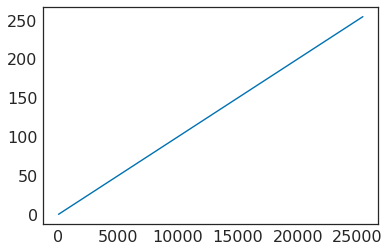

In [14]:
plt.plot(timestamps)

In [15]:
audiodiff = audio[1:, :-1] - audio[:-1, :-1]

Inputs and outputs are stored in valiables __inps__, __outps__ in `run.py: 63, 64`.

# Please take a look at from here

# Preprosessed Data Format 

# NN Model

## Output

# More code inspections

In [1]:
import sys
sys.path.append("..")
from util import *
import json
import copy
import random
import platform
import bisect
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

/home/kei/.pyenv/versions/3.6.4/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
training_dir = "../obama_data/"
save_dir = "results/"
fps = 29.97

In [3]:
if not os.path.exists("save/"):
  os.mkdir("save/")
if not os.path.exists("save/" + save_dir):
  os.mkdir("save/" + save_dir)

## Load data

In [4]:
# Note: files[i] +  ".wav.npy" is actual file name
# List files which will be used for training
files = [x.split("\t")[0].strip() for x in open(training_dir + "processed_fps.txt", "r").readlines()]
print(files[:3])

['2AFpAATHXtc', 'bl8quI2z0sY', 'k4OZOTaf3lk']


### Preprocess

In [5]:
def createInputFeature(audio, timestamps, startframe, nframe, fps):
  """
  Create input audio feature. The feature is just a concatination of input audio and its diff.
  """
  audiodiff = audio[1:, :] - audio[:-1, :]
  startAudio = bisect.bisect_left(timestamps, (startframe - 1) / fps)
  endAudio = bisect.bisect_right(timestamps, (startframe + nframe - 2) / fps)
  inp = np.concatenate((audio[startAudio:endAudio, :-1], audiodiff[startAudio:endAudio, :]), axis=1)
  return startAudio, endAudio, inp 

In [6]:
data_list = []   # stores auido input as a separated manner 
target_list = [] # stores lip-feature output as a separated manner 
for i in range(len(files)):
  dnums = sorted([os.path.basename(x) for x in glob.glob(training_dir + files[i] + "}}*")])
  wav_data = np.load(training_dir + "/audio/normalized-cep13/" + files[i] + ".wav.npy") 
  timestamps = wav_data[:, -1]
  audio = wav_data[:, :-1]
  for dnum in dnums:
    # It seems that lip feature that corresponds to a audio file separated into several files.
    # The following proceduce divide the audio file to make audio-lip feature data pair
    fids = readCVFloatMat(training_dir + dnum + "/frontalfidsCoeff_unrefined.bin")
    if not os.path.exists(training_dir + dnum + "/startframe.txt"):
      startframe = 1
    else:
      startframe = readSingleInt(training_dir + dnum + "/startframe.txt")
    nframe = readSingleInt(training_dir + dnum + "/nframe.txt")
    startAudio, endAudio, inp = createInputFeature(audio, timestamps, startframe, nframe, fps)
    outp = np.zeros((endAudio - startAudio, fids.shape[1]), dtype=np.float32)
    leftmark = 0
    for aud in range(startAudio, endAudio):
      audiotime = timestamps[aud]
      while audiotime >= (startframe - 1 + leftmark + 1) / fps:
        leftmark += 1
      t = (audiotime - (startframe - 1 + leftmark) / fps) * fps;
      outp[aud - startAudio, :] = fids[leftmark, :] * (1 - t) + fids[min(len(fids) - 1, leftmark + 1), :] * t;
    data_list.append(inp)
    target_list.append(outp)    

In [7]:
data    = np.concatenate(data_list)
target  = np.concatenate(target_list)
length_of_sequences = len(data)
maxlen = 100 # it is called "seq_length" in the original script.
print(length_of_sequences, maxlen)

6271860 100


In [8]:
n_audio_features = data_list[0].shape[1]
n_lip_features   = target_list[0].shape[1]
print(n_audio_features, n_lip_features)

27 20


In [9]:
file_X = "/tmp/X.dat"
file_Y = "/tmp/Y.dat"

In [11]:
if os.path.exists(file_X) and os.path.exists(file_Y):
  # if you already created these files the program use them.
  X = np.memmap(file_X, dtype='float32', mode="r", shape=(len(data),   maxlen, n_audio_features))
  Y = np.memmap(file_Y, dtype='float32', mode="r", shape=(len(data),   n_lip_features))
  validation_ratio = 0.2
  N_train       = int(len(data) * (1-validation_ratio))
  N_validation  =  int(len(data) * validation_ratio)
  X_train      = X[:N_train]
  X_validation = X[N_train:]
  Y_train      = Y[:N_train]
  Y_validation = Y[N_train:]  
else:  
  X = np.memmap(file_X, dtype='float32', mode="w+", shape=(len(data),   maxlen, n_audio_features))
  Y = np.memmap(file_Y, dtype='float32', mode="w+", shape=(len(data),   n_lip_features))
  # X = np.zeros((len(data),   maxlen, n_audio_features))
  # Y = np.zeros((len(target), maxlen, n_lip_features))
  for i in range(0, length_of_sequences - maxlen):
    X[i, :, :] = data[i:i+maxlen]
    Y[i, :] = target[i+maxlen]

  validation_ratio = 0.2
  N_train       = int(len(data) * (1-validation_ratio))
  N_validation  =  int(len(data) * validation_ratio)
  X_train      = X[:N_train]
  X_validation = X[N_train:]
  Y_train      = Y[:N_train]
  Y_validation = Y[N_train:]

  mean_xt = np.mean(X_train, axis=0)
  std_xt  = np.std(X_train, axis=0)

  # I intentionally use destructive assignment to save memory
  X_train      -= mean_xt
  X_train      /= std_xt
  X_validation -= mean_xt
  X_validation /= std_xt

In [12]:
dimin  = n_audio_features
dimout = n_lip_features

In [53]:
#def inference(x, n_batch, maxlen=None, n_hidden=None, n_out=None):
def inference(x, maxlen, dimin, dimout, batch_size, rnn_size=120, num_layers=1):
  """
  Create NN model. 
  x: one audio input
  seq_length: 
  """
  def weight_variable(shape):
    initial = tf.truncated_normal(shape, stddev=0.01)
    return tf.Variable(initial)
  def bias_variable(shape):
    initial = tf.zeros(shape, dtype=tf.float32)
    return tf.Variable(initial)
  
  with tf.variable_scope('RNN'):
    cell = tf.nn.rnn_cell.LSTMCell(rnn_size, state_is_tuple=True)
    network = tf.nn.rnn_cell.MultiRNNCell([cell] * num_layers, state_is_tuple=True)
    initial_state = network.zero_state(batch_size=batch_size, dtype=tf.float32)
    state = initial_state
    outputs = []
    for t in range(maxlen):
      if t > 0:
        tf.get_variable_scope().reuse_variables()
      (network_output, state) = network(x[:, t, :], state)
      outputs.append(network_output)
  output = outputs[-1]
  output_w = weight_variable([rnn_size, dimout])
  output_b = bias_variable([dimout])
  y = tf.nn.xw_plus_b(output, output_w, output_b, name="y")
  return y

def loss(y, t):
  """
  y: output of the NN. The original name is output
  t: labeled data. The original name is flat_target_data.
  """
  return tf.reduce_sum(tf.squared_difference(t, y))

def cost(y, t):
  loss_ = loss(y, t)
  return loss_ / (batch_size * maxlen * dimout)

In [54]:
def training(loss, learning_rate=0.001, grad_clip=1.0):
  """
  this function use optimizer.apply_gradients instead of optimizer.minimize to compute custum gradient and minimize it.
  https://www.tensorflow.org/versions/r0.12/api_docs/python/train/optimizers
  TODO: weight decay was in the original script. add it
  """
#   tvars = tf.trainable_variables()
#   grads, _ = tf.clip_by_global_norm(tf.gradients(cost, tvars), grad_clip)
#   optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
#   train_step = optimizer.apply_gradients(list(zip(grads, tvars)))
  optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
  train_step = optimizer.minimize(loss)
  return train_step

In [ ]:
tf.reset_default_graph() # required for the second time
dimin = n_audio_features
dimout = n_lip_features
rnn_size = 60
batch_size = 100

x = tf.placeholder(tf.float32, shape=[None, maxlen, dimin])
t = tf.placeholder(tf.float32, shape=[None, dimout])
n_batch = tf.placeholder(tf.int32, shape=[])

y = inference(x, maxlen=maxlen, dimin=dimin, dimout=dimout,
                batch_size=batch_size, rnn_size=rnn_size)
loss_ = loss(y, t)
train_step = training(loss_)

history = {
    'val_loss': []
}

'''
 Training
'''
epochs = 300

init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

n_batches = N_train // batch_size

In [ ]:
order_t = np.arange(len(X_train))
order_v = np.arange(len(X_validation)) 
for epoch in range(epochs):
    np.random.shuffle(order_t)
    np.random.shuffle(order_v)    
    
    for i, j in zip(order_t[:n_batches], order_v[:n_batches]):
      start = i * batch_size
      end = start + batch_size
      if end < len(X_train) - 1:
        sess.run(train_step, feed_dict={
            x: X_train[start:end, :],
            t: Y_train[start:end, :],
            n_batch: batch_size
        })
      start = j * batch_size
      end = start + batch_size
      if end < len(X_validation) - 1:
        # Validation
        val_loss = loss_.eval(session=sess, feed_dict={
            x: X_validation[start:end, :],
            t: Y_validation[start:end, :],
            n_batch: batch_size
        })

        history['val_loss'].append(val_loss)
        print('epoch:', epoch,
              ' validation loss:', val_loss)



epoch: 0  validation loss: 22570.9
epoch: 0  validation loss: 21365.0
epoch: 0  validation loss: 11270.2
epoch: 0  validation loss: 16966.3
epoch: 0  validation loss: 19540.9
epoch: 0  validation loss: 27224.9
epoch: 0  validation loss: 21757.1
epoch: 0  validation loss: 21384.3
epoch: 0  validation loss: 24551.8
epoch: 0  validation loss: 18179.2
epoch: 0  validation loss: 23153.2
epoch: 0  validation loss: 30486.9
epoch: 0  validation loss: 13470.1
epoch: 0  validation loss: 37473.6
epoch: 0  validation loss: 36072.1
epoch: 0  validation loss: 14023.4
epoch: 0  validation loss: 16864.7
epoch: 0  validation loss: 21188.2
epoch: 0  validation loss: 38216.8
epoch: 0  validation loss: 24161.9
epoch: 0  validation loss: 20079.7
epoch: 0  validation loss: 31989.8
epoch: 0  validation loss: 18660.1
epoch: 0  validation loss: 53431.9
epoch: 0  validation loss: 26170.8
epoch: 0  validation loss: 15415.3
epoch: 0  validation loss: 18165.6
epoch: 0  validation loss: 20348.8
epoch: 0  validation

epoch: 0  validation loss: 26418.6
epoch: 0  validation loss: 22831.2
epoch: 0  validation loss: 35327.7
epoch: 0  validation loss: 22757.4
epoch: 0  validation loss: 26132.4
epoch: 0  validation loss: 65848.2
epoch: 0  validation loss: 11541.8
epoch: 0  validation loss: 12909.0
epoch: 0  validation loss: 14733.7
epoch: 0  validation loss: 11653.0
epoch: 0  validation loss: 31712.8
epoch: 0  validation loss: 21623.2
epoch: 0  validation loss: 25610.6
epoch: 0  validation loss: 34287.3
epoch: 0  validation loss: 12395.1
epoch: 0  validation loss: 17154.2
epoch: 0  validation loss: 20420.0
epoch: 0  validation loss: 10796.4
epoch: 0  validation loss: 14494.8
epoch: 0  validation loss: 23608.3
epoch: 0  validation loss: 11268.7
epoch: 0  validation loss: 24970.1
epoch: 0  validation loss: 13415.3
epoch: 0  validation loss: 21666.2
epoch: 0  validation loss: 16527.2
epoch: 0  validation loss: 9170.53
epoch: 0  validation loss: 40779.4
epoch: 0  validation loss: 14229.8
epoch: 0  validation

epoch: 0  validation loss: 21284.4
epoch: 0  validation loss: 17911.1
epoch: 0  validation loss: 8328.32
epoch: 0  validation loss: 17540.5
epoch: 0  validation loss: 18154.4
epoch: 0  validation loss: 40127.7
epoch: 0  validation loss: 29092.5
epoch: 0  validation loss: 11416.5
epoch: 0  validation loss: 18160.5
epoch: 0  validation loss: 27863.7
epoch: 1  validation loss: 16039.5
epoch: 1  validation loss: 9771.28
epoch: 1  validation loss: 16993.8
epoch: 1  validation loss: 12266.9
epoch: 1  validation loss: 13011.3
epoch: 1  validation loss: 50698.3
epoch: 1  validation loss: 10361.7
epoch: 1  validation loss: 29963.1
epoch: 1  validation loss: 75871.7
epoch: 1  validation loss: 9568.5
epoch: 1  validation loss: 19119.7
epoch: 1  validation loss: 18013.3
epoch: 1  validation loss: 27088.8
epoch: 1  validation loss: 14392.6
epoch: 1  validation loss: 17515.3
epoch: 1  validation loss: 10101.2
epoch: 1  validation loss: 5941.78
epoch: 1  validation loss: 20466.6
epoch: 1  validation 

epoch: 1  validation loss: 17357.9
epoch: 1  validation loss: 25460.8
epoch: 1  validation loss: 16985.4
epoch: 1  validation loss: 12905.7
epoch: 1  validation loss: 15327.0
epoch: 1  validation loss: 20579.6
epoch: 1  validation loss: 22690.2
epoch: 1  validation loss: 16375.8
epoch: 1  validation loss: 21742.1
epoch: 1  validation loss: 15421.9
epoch: 1  validation loss: 16566.7
epoch: 1  validation loss: 16316.9
epoch: 1  validation loss: 16141.2
epoch: 1  validation loss: 19929.6
epoch: 1  validation loss: 57718.4
epoch: 1  validation loss: 14655.0
epoch: 1  validation loss: 22760.3
epoch: 1  validation loss: 8579.18
epoch: 1  validation loss: 16168.8
epoch: 1  validation loss: 15963.9
epoch: 1  validation loss: 27389.0
epoch: 1  validation loss: 20905.3
epoch: 1  validation loss: 9961.86
epoch: 1  validation loss: 20671.1
epoch: 1  validation loss: 12766.8
epoch: 1  validation loss: 18648.0
epoch: 1  validation loss: 7090.48
epoch: 1  validation loss: 20829.7
epoch: 1  validation

epoch: 1  validation loss: 17588.2
epoch: 1  validation loss: 19196.5
epoch: 1  validation loss: 12165.3
epoch: 1  validation loss: 27659.8
epoch: 1  validation loss: 23761.8
epoch: 1  validation loss: 22634.4
epoch: 1  validation loss: 12073.3
epoch: 1  validation loss: 16332.0
epoch: 1  validation loss: 18955.6
epoch: 1  validation loss: 11655.9
epoch: 1  validation loss: 25446.1
epoch: 1  validation loss: 13544.5
epoch: 1  validation loss: 22507.4
epoch: 1  validation loss: 20146.0
epoch: 1  validation loss: 12492.4
epoch: 1  validation loss: 19701.5
epoch: 1  validation loss: 16691.6
epoch: 1  validation loss: 28748.4
epoch: 1  validation loss: 15859.5
epoch: 1  validation loss: 15336.1
epoch: 1  validation loss: 13979.3
epoch: 1  validation loss: 14929.7
epoch: 1  validation loss: 23727.8
epoch: 1  validation loss: 16932.8
epoch: 1  validation loss: 16910.3
epoch: 1  validation loss: 22478.5
epoch: 1  validation loss: 13925.5
epoch: 1  validation loss: 13763.3
epoch: 1  validation

epoch: 2  validation loss: 16438.4
epoch: 2  validation loss: 11810.6
epoch: 2  validation loss: 14731.6
epoch: 2  validation loss: 39300.4
epoch: 2  validation loss: 9011.99
epoch: 2  validation loss: 12808.6
epoch: 2  validation loss: 7661.19
epoch: 2  validation loss: 12015.3
epoch: 2  validation loss: 12141.0
epoch: 2  validation loss: 12360.6
epoch: 2  validation loss: 8312.8
epoch: 2  validation loss: 22099.8
epoch: 2  validation loss: 62045.6
epoch: 2  validation loss: 9367.59
epoch: 2  validation loss: 22516.7
epoch: 2  validation loss: 6332.36
epoch: 2  validation loss: 18722.1
epoch: 2  validation loss: 30659.6
epoch: 2  validation loss: 17555.5
epoch: 2  validation loss: 11824.8
epoch: 2  validation loss: 16071.2
epoch: 2  validation loss: 12851.9
epoch: 2  validation loss: 12288.8
epoch: 2  validation loss: 14658.6
epoch: 2  validation loss: 17770.0
epoch: 2  validation loss: 18572.0
epoch: 2  validation loss: 32625.8
epoch: 2  validation loss: 8042.1
epoch: 2  validation l

epoch: 2  validation loss: 23892.7
epoch: 2  validation loss: 17624.3
epoch: 2  validation loss: 9708.83
epoch: 2  validation loss: 12554.5
epoch: 2  validation loss: 11251.4
epoch: 2  validation loss: 43758.4
epoch: 2  validation loss: 16415.6
epoch: 2  validation loss: 8573.2
epoch: 2  validation loss: 14568.3
epoch: 2  validation loss: 18888.4
epoch: 2  validation loss: 24184.8
epoch: 2  validation loss: 14761.4
epoch: 2  validation loss: 11213.0
epoch: 2  validation loss: 18355.1
epoch: 2  validation loss: 22327.8
epoch: 2  validation loss: 21773.4
epoch: 2  validation loss: 21441.1
epoch: 2  validation loss: 30314.2
epoch: 2  validation loss: 43086.3
epoch: 2  validation loss: 17014.0
epoch: 2  validation loss: 17777.4
epoch: 2  validation loss: 34082.1
epoch: 2  validation loss: 23624.9
epoch: 2  validation loss: 8021.48
epoch: 2  validation loss: 16518.6
epoch: 2  validation loss: 8344.38
epoch: 2  validation loss: 16141.0
epoch: 2  validation loss: 12288.6
epoch: 2  validation 

epoch: 3  validation loss: 17663.1
epoch: 3  validation loss: 14870.0
epoch: 3  validation loss: 21713.0
epoch: 3  validation loss: 19634.4
epoch: 3  validation loss: 31055.6
epoch: 3  validation loss: 25183.2
epoch: 3  validation loss: 13462.8
epoch: 3  validation loss: 16451.5
epoch: 3  validation loss: 21123.4
epoch: 3  validation loss: 11071.6
epoch: 3  validation loss: 21128.1
epoch: 3  validation loss: 30271.9
epoch: 3  validation loss: 20653.5
epoch: 3  validation loss: 10563.3
epoch: 3  validation loss: 18222.8
epoch: 3  validation loss: 10585.9
epoch: 3  validation loss: 19643.4
epoch: 3  validation loss: 53177.0
epoch: 3  validation loss: 11643.5
epoch: 3  validation loss: 19991.5
epoch: 3  validation loss: 38513.1
epoch: 3  validation loss: 13279.5
epoch: 3  validation loss: 15735.2
epoch: 3  validation loss: 15570.3
epoch: 3  validation loss: 12185.9
epoch: 3  validation loss: 15877.3
epoch: 3  validation loss: 25118.1
epoch: 3  validation loss: 32949.1
epoch: 3  validation

epoch: 3  validation loss: 54335.3
epoch: 3  validation loss: 17717.0
epoch: 3  validation loss: 11090.2
epoch: 3  validation loss: 14126.9
epoch: 3  validation loss: 11000.7
epoch: 3  validation loss: 22892.6
epoch: 3  validation loss: 59010.2
epoch: 3  validation loss: 25644.4
epoch: 3  validation loss: 18584.6
epoch: 3  validation loss: 65287.4
epoch: 3  validation loss: 21810.6
epoch: 3  validation loss: 10522.1
epoch: 3  validation loss: 18697.9
epoch: 3  validation loss: 10203.2
epoch: 3  validation loss: 40721.9
epoch: 3  validation loss: 12105.6
epoch: 3  validation loss: 12709.1
epoch: 3  validation loss: 23857.5
epoch: 3  validation loss: 16261.4
epoch: 3  validation loss: 18147.9
epoch: 3  validation loss: 19362.9
epoch: 3  validation loss: 9900.57
epoch: 3  validation loss: 9342.62
epoch: 3  validation loss: 9890.49
epoch: 3  validation loss: 10551.7
epoch: 3  validation loss: 21737.5
epoch: 3  validation loss: 18597.0
epoch: 3  validation loss: 15400.1
epoch: 3  validation

epoch: 4  validation loss: 15831.3
epoch: 4  validation loss: 19405.5
epoch: 4  validation loss: 19320.9
epoch: 4  validation loss: 15579.5
epoch: 4  validation loss: 21360.3
epoch: 4  validation loss: 29723.0
epoch: 4  validation loss: 18483.1
epoch: 4  validation loss: 14103.1
epoch: 4  validation loss: 49490.5
epoch: 4  validation loss: 9894.49
epoch: 4  validation loss: 36710.1
epoch: 4  validation loss: 8332.55
epoch: 4  validation loss: 20768.9
epoch: 4  validation loss: 15711.7
epoch: 4  validation loss: 22231.2
epoch: 4  validation loss: 14255.1
epoch: 4  validation loss: 27923.4
epoch: 4  validation loss: 15956.9
epoch: 4  validation loss: 14673.5
epoch: 4  validation loss: 20750.5
epoch: 4  validation loss: 14641.9
epoch: 4  validation loss: 13617.8
epoch: 4  validation loss: 13289.4
epoch: 4  validation loss: 16492.4
epoch: 4  validation loss: 9817.78
epoch: 4  validation loss: 8490.06
epoch: 4  validation loss: 13324.0
epoch: 4  validation loss: 11876.8
epoch: 4  validation

epoch: 4  validation loss: 16519.0
epoch: 4  validation loss: 20330.2
epoch: 4  validation loss: 37422.0
epoch: 4  validation loss: 49863.9
epoch: 4  validation loss: 21676.9
epoch: 4  validation loss: 6666.73
epoch: 4  validation loss: 20099.9
epoch: 4  validation loss: 12111.7
epoch: 4  validation loss: 17394.3
epoch: 4  validation loss: 13173.4
epoch: 4  validation loss: 12830.5
epoch: 4  validation loss: 19637.0
epoch: 4  validation loss: 32121.4
epoch: 4  validation loss: 13230.5
epoch: 4  validation loss: 12266.9
epoch: 4  validation loss: 12086.2
epoch: 4  validation loss: 8965.0
epoch: 4  validation loss: 11627.1
epoch: 4  validation loss: 21703.7
epoch: 4  validation loss: 13753.5
epoch: 4  validation loss: 12720.6
epoch: 4  validation loss: 17563.2
epoch: 4  validation loss: 16728.1
epoch: 4  validation loss: 33996.6
epoch: 4  validation loss: 3245.18
epoch: 4  validation loss: 32352.2
epoch: 4  validation loss: 7887.42
epoch: 4  validation loss: 51376.3
epoch: 4  validation 

epoch: 5  validation loss: 24256.8
epoch: 5  validation loss: 13248.4
epoch: 5  validation loss: 27705.3
epoch: 5  validation loss: 28693.6
epoch: 5  validation loss: 20726.5
epoch: 5  validation loss: 20611.0
epoch: 5  validation loss: 19083.3
epoch: 5  validation loss: 21859.2
epoch: 5  validation loss: 9575.27
epoch: 5  validation loss: 15052.6
epoch: 5  validation loss: 31090.5
epoch: 5  validation loss: 25221.4
epoch: 5  validation loss: 30532.8
epoch: 5  validation loss: 10156.6
epoch: 5  validation loss: 10339.5
epoch: 5  validation loss: 21821.9
epoch: 5  validation loss: 12664.1
epoch: 5  validation loss: 14061.9
epoch: 5  validation loss: 42319.1
epoch: 5  validation loss: 5955.78
epoch: 5  validation loss: 16836.6
epoch: 5  validation loss: 19714.3
epoch: 5  validation loss: 17625.0
epoch: 5  validation loss: 9197.47
epoch: 5  validation loss: 15802.6
epoch: 5  validation loss: 24981.7
epoch: 5  validation loss: 15649.3
epoch: 5  validation loss: 19334.9
epoch: 5  validation

epoch: 5  validation loss: 14914.7
epoch: 5  validation loss: 18918.8
epoch: 5  validation loss: 11003.9
epoch: 5  validation loss: 17738.2
epoch: 5  validation loss: 23969.0
epoch: 5  validation loss: 14635.1
epoch: 5  validation loss: 14068.5
epoch: 5  validation loss: 21884.8
epoch: 5  validation loss: 9177.96
epoch: 5  validation loss: 15349.1
epoch: 5  validation loss: 50915.0
epoch: 5  validation loss: 21133.7
epoch: 5  validation loss: 15614.8
epoch: 5  validation loss: 11821.9
epoch: 5  validation loss: 16515.7
epoch: 5  validation loss: 10787.6
epoch: 5  validation loss: 8637.0
epoch: 5  validation loss: 15080.4
epoch: 5  validation loss: 31191.5
epoch: 5  validation loss: 18463.4
epoch: 5  validation loss: 22881.7
epoch: 5  validation loss: 13369.2
epoch: 5  validation loss: 11290.9
epoch: 5  validation loss: 16389.1
epoch: 5  validation loss: 7483.73
epoch: 5  validation loss: 8082.21
epoch: 5  validation loss: 15420.7
epoch: 5  validation loss: 18530.0
epoch: 5  validation 

epoch: 6  validation loss: 11684.2
epoch: 6  validation loss: 12590.0
epoch: 6  validation loss: 16354.2
epoch: 6  validation loss: 18457.9
epoch: 6  validation loss: 14583.2
epoch: 6  validation loss: 24751.9
epoch: 6  validation loss: 8915.34
epoch: 6  validation loss: 18065.6
epoch: 6  validation loss: 10395.8
epoch: 6  validation loss: 24266.4
epoch: 6  validation loss: 19845.3
epoch: 6  validation loss: 14321.1
epoch: 6  validation loss: 24074.2
epoch: 6  validation loss: 26164.5
epoch: 6  validation loss: 8922.92
epoch: 6  validation loss: 21584.5
epoch: 6  validation loss: 56417.2
epoch: 6  validation loss: 20901.7
epoch: 6  validation loss: 13993.1
epoch: 6  validation loss: 10728.8
epoch: 6  validation loss: 18015.2
epoch: 6  validation loss: 12619.4
epoch: 6  validation loss: 20347.9
epoch: 6  validation loss: 11328.2
epoch: 6  validation loss: 17643.7
epoch: 6  validation loss: 8179.21
epoch: 6  validation loss: 19168.1
epoch: 6  validation loss: 19697.6
epoch: 6  validation

epoch: 6  validation loss: 5683.41
epoch: 6  validation loss: 15474.6
epoch: 6  validation loss: 24649.9
epoch: 6  validation loss: 23339.2
epoch: 6  validation loss: 11535.6
epoch: 6  validation loss: 22872.8
epoch: 6  validation loss: 23834.4
epoch: 6  validation loss: 16865.8
epoch: 6  validation loss: 18360.8
epoch: 6  validation loss: 11258.9
epoch: 6  validation loss: 21688.1
epoch: 6  validation loss: 14955.9
epoch: 6  validation loss: 11949.3
epoch: 6  validation loss: 10750.4
epoch: 6  validation loss: 15206.5
epoch: 6  validation loss: 13340.1
epoch: 6  validation loss: 12635.0
epoch: 6  validation loss: 25619.4
epoch: 6  validation loss: 5675.7
epoch: 6  validation loss: 11833.5
epoch: 6  validation loss: 12305.3
epoch: 6  validation loss: 20227.4
epoch: 6  validation loss: 9907.64
epoch: 6  validation loss: 9092.63
epoch: 6  validation loss: 14552.2
epoch: 6  validation loss: 28199.3
epoch: 6  validation loss: 13615.8
epoch: 6  validation loss: 9518.49
epoch: 6  validation 

epoch: 7  validation loss: 11044.3
epoch: 7  validation loss: 25911.3
epoch: 7  validation loss: 12185.6
epoch: 7  validation loss: 11669.3
epoch: 7  validation loss: 13357.3
epoch: 7  validation loss: 20403.9
epoch: 7  validation loss: 11165.3
epoch: 7  validation loss: 24140.2
epoch: 7  validation loss: 14528.7
epoch: 7  validation loss: 28959.0
epoch: 7  validation loss: 8263.83
epoch: 7  validation loss: 8071.24
epoch: 7  validation loss: 32109.0
epoch: 7  validation loss: 16560.8
epoch: 7  validation loss: 11535.0
epoch: 7  validation loss: 41398.5
epoch: 7  validation loss: 24846.7
epoch: 7  validation loss: 23360.5
epoch: 7  validation loss: 16448.2
epoch: 7  validation loss: 19624.2
epoch: 7  validation loss: 18708.1
epoch: 7  validation loss: 19388.9
epoch: 7  validation loss: 21933.3
epoch: 7  validation loss: 20050.9
epoch: 7  validation loss: 20761.6
epoch: 7  validation loss: 21379.2
epoch: 7  validation loss: 12944.6
epoch: 7  validation loss: 8149.86
epoch: 7  validation

epoch: 7  validation loss: 19831.9
epoch: 7  validation loss: 29575.6
epoch: 7  validation loss: 14256.2
epoch: 7  validation loss: 16684.3
epoch: 7  validation loss: 12210.8
epoch: 7  validation loss: 15126.9
epoch: 7  validation loss: 20105.0
epoch: 7  validation loss: 13753.9
epoch: 7  validation loss: 29087.6
epoch: 7  validation loss: 19545.2
epoch: 7  validation loss: 14597.9
epoch: 7  validation loss: 14381.9
epoch: 7  validation loss: 7550.9
epoch: 7  validation loss: 9764.51
epoch: 7  validation loss: 7856.82
epoch: 7  validation loss: 27408.0
epoch: 7  validation loss: 20332.7
epoch: 7  validation loss: 13548.1
epoch: 7  validation loss: 19329.9
epoch: 7  validation loss: 13081.1
epoch: 7  validation loss: 17292.8
epoch: 7  validation loss: 11614.2
epoch: 7  validation loss: 10057.7
epoch: 7  validation loss: 9170.8
epoch: 7  validation loss: 7888.52
epoch: 7  validation loss: 14091.7
epoch: 7  validation loss: 25834.0
epoch: 7  validation loss: 16308.1
epoch: 7  validation l

epoch: 8  validation loss: 12468.8
epoch: 8  validation loss: 17923.6
epoch: 8  validation loss: 63934.5
epoch: 8  validation loss: 14595.0
epoch: 8  validation loss: 15523.3
epoch: 8  validation loss: 27668.1
epoch: 8  validation loss: 7727.07
epoch: 8  validation loss: 18458.2
epoch: 8  validation loss: 9478.77
epoch: 8  validation loss: 16427.6
epoch: 8  validation loss: 17849.3
epoch: 8  validation loss: 35647.4
epoch: 8  validation loss: 10480.5
epoch: 8  validation loss: 34862.3
epoch: 8  validation loss: 21523.1
epoch: 8  validation loss: 14947.1
epoch: 8  validation loss: 15049.9
epoch: 8  validation loss: 16853.2
epoch: 8  validation loss: 27144.1
epoch: 8  validation loss: 13733.7
epoch: 8  validation loss: 30189.9
epoch: 8  validation loss: 25197.9
epoch: 8  validation loss: 31394.6
epoch: 8  validation loss: 16723.8
epoch: 8  validation loss: 9616.62
epoch: 8  validation loss: 26721.9
epoch: 8  validation loss: 13428.0
epoch: 8  validation loss: 14113.1
epoch: 8  validation

epoch: 8  validation loss: 32298.0
epoch: 8  validation loss: 8391.29
epoch: 8  validation loss: 21792.0
epoch: 8  validation loss: 21374.3
epoch: 8  validation loss: 13172.9
epoch: 8  validation loss: 11439.1
epoch: 8  validation loss: 12998.6
epoch: 8  validation loss: 9879.28
epoch: 8  validation loss: 15040.8
epoch: 8  validation loss: 55931.3
epoch: 8  validation loss: 24959.6
epoch: 8  validation loss: 22261.1
epoch: 8  validation loss: 14410.3
epoch: 8  validation loss: 58212.9
epoch: 8  validation loss: 16203.3
epoch: 8  validation loss: 12793.7
epoch: 8  validation loss: 12415.5
epoch: 8  validation loss: 13277.0
epoch: 8  validation loss: 17020.6
epoch: 8  validation loss: 22916.3
epoch: 8  validation loss: 19019.2
epoch: 8  validation loss: 7285.61
epoch: 8  validation loss: 5775.79
epoch: 8  validation loss: 15901.7
epoch: 8  validation loss: 8464.15
epoch: 8  validation loss: 6803.63
epoch: 8  validation loss: 13868.6
epoch: 8  validation loss: 41311.8
epoch: 8  validation

epoch: 9  validation loss: 20064.4
epoch: 9  validation loss: 22531.1
epoch: 9  validation loss: 16936.6
epoch: 9  validation loss: 18205.0
epoch: 9  validation loss: 8969.11
epoch: 9  validation loss: 10910.8
epoch: 9  validation loss: 13169.8
epoch: 9  validation loss: 36779.2
epoch: 9  validation loss: 20145.5
epoch: 9  validation loss: 8246.74
epoch: 9  validation loss: 8856.4
epoch: 9  validation loss: 23729.5
epoch: 9  validation loss: 12402.4
epoch: 9  validation loss: 14155.2
epoch: 9  validation loss: 10067.1
epoch: 9  validation loss: 16638.2
epoch: 9  validation loss: 18257.8
epoch: 9  validation loss: 20789.2
epoch: 9  validation loss: 12946.7
epoch: 9  validation loss: 12750.6
epoch: 9  validation loss: 10180.6
epoch: 9  validation loss: 17529.0
epoch: 9  validation loss: 20832.5
epoch: 9  validation loss: 29394.1
epoch: 9  validation loss: 21560.9
epoch: 9  validation loss: 19674.0
epoch: 9  validation loss: 12281.8
epoch: 9  validation loss: 46506.7
epoch: 9  validation 

epoch: 9  validation loss: 13310.0
epoch: 9  validation loss: 20270.5
epoch: 9  validation loss: 15448.1
epoch: 9  validation loss: 21436.8
epoch: 9  validation loss: 36201.1
epoch: 9  validation loss: 46177.7
epoch: 9  validation loss: 20769.8
epoch: 9  validation loss: 29605.4
epoch: 9  validation loss: 33819.8
epoch: 9  validation loss: 16609.0
epoch: 9  validation loss: 25512.6
epoch: 9  validation loss: 25489.1
epoch: 9  validation loss: 20569.5
epoch: 9  validation loss: 18745.6
epoch: 9  validation loss: 22632.2
epoch: 9  validation loss: 18196.1
epoch: 9  validation loss: 10174.5
epoch: 9  validation loss: 15272.7
epoch: 9  validation loss: 12963.2
epoch: 9  validation loss: 16532.5
epoch: 9  validation loss: 11751.9
epoch: 9  validation loss: 11508.6
epoch: 9  validation loss: 7471.96
epoch: 9  validation loss: 18924.9
epoch: 9  validation loss: 16299.5
epoch: 9  validation loss: 19661.0
epoch: 9  validation loss: 12162.7
epoch: 9  validation loss: 12086.1
epoch: 9  validation

epoch: 9  validation loss: 17757.1
epoch: 9  validation loss: 17907.6
epoch: 9  validation loss: 30454.0
epoch: 9  validation loss: 14278.3
epoch: 9  validation loss: 40574.7
epoch: 9  validation loss: 37910.1
epoch: 9  validation loss: 13261.2
epoch: 9  validation loss: 10323.1
epoch: 9  validation loss: 24157.8
epoch: 9  validation loss: 18815.7
epoch: 9  validation loss: 16287.9
epoch: 9  validation loss: 8127.1
epoch: 9  validation loss: 15593.8
epoch: 9  validation loss: 20645.4
epoch: 9  validation loss: 9985.4
epoch: 9  validation loss: 19092.9
epoch: 9  validation loss: 19267.2
epoch: 9  validation loss: 18213.8
epoch: 9  validation loss: 21438.5
epoch: 9  validation loss: 9025.78
epoch: 9  validation loss: 12913.9
epoch: 9  validation loss: 13929.9
epoch: 9  validation loss: 13603.0
epoch: 9  validation loss: 18994.5
epoch: 9  validation loss: 22102.9
epoch: 9  validation loss: 20571.4
epoch: 9  validation loss: 9981.9
epoch: 9  validation loss: 9928.83
epoch: 9  validation lo

epoch: 10  validation loss: 9149.76
epoch: 10  validation loss: 24326.9
epoch: 10  validation loss: 11943.6
epoch: 10  validation loss: 25896.6
epoch: 10  validation loss: 21006.6
epoch: 10  validation loss: 19847.1
epoch: 10  validation loss: 14460.0
epoch: 10  validation loss: 21271.6
epoch: 10  validation loss: 53175.8
epoch: 10  validation loss: 20358.4
epoch: 10  validation loss: 10870.0
epoch: 10  validation loss: 24060.5
epoch: 10  validation loss: 29207.8
epoch: 10  validation loss: 67339.8
epoch: 10  validation loss: 19731.7
epoch: 10  validation loss: 19901.1
epoch: 10  validation loss: 15339.1
epoch: 10  validation loss: 20856.2
epoch: 10  validation loss: 10463.2
epoch: 10  validation loss: 22298.9
epoch: 10  validation loss: 9764.66
epoch: 10  validation loss: 22401.6
epoch: 10  validation loss: 14730.0
epoch: 10  validation loss: 26199.3
epoch: 10  validation loss: 14264.0
epoch: 10  validation loss: 24958.8
epoch: 10  validation loss: 39635.9
epoch: 10  validation loss: 

epoch: 10  validation loss: 13605.6
epoch: 10  validation loss: 19123.2
epoch: 10  validation loss: 56295.9
epoch: 10  validation loss: 13813.7
epoch: 10  validation loss: 24263.1
epoch: 10  validation loss: 13060.1
epoch: 10  validation loss: 13276.5
epoch: 10  validation loss: 11263.9
epoch: 10  validation loss: 18937.9
epoch: 10  validation loss: 11332.2
epoch: 10  validation loss: 10801.2
epoch: 10  validation loss: 15653.7
epoch: 10  validation loss: 11035.7
epoch: 10  validation loss: 14320.0
epoch: 10  validation loss: 9684.12
epoch: 10  validation loss: 12992.2
epoch: 10  validation loss: 14789.5
epoch: 10  validation loss: 14073.6
epoch: 10  validation loss: 9190.75
epoch: 10  validation loss: 20690.2
epoch: 10  validation loss: 8364.12
epoch: 10  validation loss: 9807.66
epoch: 10  validation loss: 24084.8
epoch: 10  validation loss: 16627.4
epoch: 10  validation loss: 24839.9
epoch: 10  validation loss: 15745.5
epoch: 10  validation loss: 7440.22
epoch: 10  validation loss: 

epoch: 11  validation loss: 35882.4
epoch: 11  validation loss: 13128.7
epoch: 11  validation loss: 28005.3
epoch: 11  validation loss: 26351.3
epoch: 11  validation loss: 19225.0
epoch: 11  validation loss: 20780.3
epoch: 11  validation loss: 17992.7
epoch: 11  validation loss: 11683.7
epoch: 11  validation loss: 6921.62
epoch: 11  validation loss: 18009.5
epoch: 11  validation loss: 12925.5
epoch: 11  validation loss: 44858.7
epoch: 11  validation loss: 24719.9
epoch: 11  validation loss: 16787.8
epoch: 11  validation loss: 8881.01
epoch: 11  validation loss: 29460.1
epoch: 11  validation loss: 16928.1
epoch: 11  validation loss: 7018.22
epoch: 11  validation loss: 16996.6
epoch: 11  validation loss: 14013.0
epoch: 11  validation loss: 19339.6
epoch: 11  validation loss: 13068.2
epoch: 11  validation loss: 27698.7
epoch: 11  validation loss: 4287.38
epoch: 11  validation loss: 41020.6
epoch: 11  validation loss: 19842.1
epoch: 11  validation loss: 8752.7
epoch: 11  validation loss: 1

epoch: 11  validation loss: 39807.1
epoch: 11  validation loss: 21194.4
epoch: 11  validation loss: 19188.3
epoch: 11  validation loss: 22417.4
epoch: 11  validation loss: 17886.4
epoch: 11  validation loss: 11554.6
epoch: 11  validation loss: 16496.5
epoch: 11  validation loss: 35965.6
epoch: 11  validation loss: 10712.2
epoch: 11  validation loss: 7031.62
epoch: 11  validation loss: 13902.4
epoch: 11  validation loss: 14324.0
epoch: 11  validation loss: 14747.9
epoch: 11  validation loss: 13804.2
epoch: 11  validation loss: 14944.1
epoch: 11  validation loss: 11460.9
epoch: 11  validation loss: 23511.1
epoch: 11  validation loss: 12569.3
epoch: 11  validation loss: 20229.6
epoch: 11  validation loss: 26529.0
epoch: 11  validation loss: 10231.7
epoch: 11  validation loss: 21170.6
epoch: 11  validation loss: 19285.9
epoch: 11  validation loss: 9190.12
epoch: 11  validation loss: 15719.1
epoch: 11  validation loss: 29020.1
epoch: 11  validation loss: 20382.2
epoch: 11  validation loss: 

epoch: 12  validation loss: 53643.1
epoch: 12  validation loss: 6892.84
epoch: 12  validation loss: 16127.5
epoch: 12  validation loss: 18990.2
epoch: 12  validation loss: 9029.18
epoch: 12  validation loss: 13664.3
epoch: 12  validation loss: 12899.4
epoch: 12  validation loss: 12168.6
epoch: 12  validation loss: 12700.2
epoch: 12  validation loss: 13189.9
epoch: 12  validation loss: 20105.2
epoch: 12  validation loss: 10969.1
epoch: 12  validation loss: 23685.1
epoch: 12  validation loss: 13930.9
epoch: 12  validation loss: 16036.8
epoch: 12  validation loss: 12201.7
epoch: 12  validation loss: 20029.2
epoch: 12  validation loss: 24673.2
epoch: 12  validation loss: 15694.9
epoch: 12  validation loss: 13835.4
epoch: 12  validation loss: 26197.0
epoch: 12  validation loss: 10443.7
epoch: 12  validation loss: 13069.2
epoch: 12  validation loss: 16623.7
epoch: 12  validation loss: 16862.1
epoch: 12  validation loss: 14138.6
epoch: 12  validation loss: 13980.1
epoch: 12  validation loss: 

epoch: 12  validation loss: 16994.0
epoch: 12  validation loss: 36814.2
epoch: 12  validation loss: 28565.5
epoch: 12  validation loss: 10634.3
epoch: 12  validation loss: 17196.8
epoch: 12  validation loss: 12609.6
epoch: 12  validation loss: 13979.3
epoch: 12  validation loss: 10425.1
epoch: 12  validation loss: 13986.1
epoch: 12  validation loss: 19091.7
epoch: 12  validation loss: 10783.0
epoch: 12  validation loss: 15756.3
epoch: 12  validation loss: 23582.2
epoch: 12  validation loss: 10037.6
epoch: 12  validation loss: 12350.2
epoch: 12  validation loss: 14825.2
epoch: 12  validation loss: 19104.6
epoch: 12  validation loss: 16528.3
epoch: 12  validation loss: 17383.5
epoch: 12  validation loss: 16945.4
epoch: 12  validation loss: 6053.77
epoch: 12  validation loss: 21174.9
epoch: 12  validation loss: 23920.4
epoch: 12  validation loss: 13316.6
epoch: 12  validation loss: 9472.04
epoch: 12  validation loss: 13162.4
epoch: 12  validation loss: 8328.49
epoch: 12  validation loss: 

epoch: 13  validation loss: 13689.9
epoch: 13  validation loss: 38985.0
epoch: 13  validation loss: 7832.36
epoch: 13  validation loss: 9639.81
epoch: 13  validation loss: 23311.9
epoch: 13  validation loss: 18320.8
epoch: 13  validation loss: 15112.0
epoch: 13  validation loss: 9585.13
epoch: 13  validation loss: 12013.0
epoch: 13  validation loss: 26144.9
epoch: 13  validation loss: 25380.6
epoch: 13  validation loss: 15345.2
epoch: 13  validation loss: 16080.5
epoch: 13  validation loss: 57594.7
epoch: 13  validation loss: 10389.1
epoch: 13  validation loss: 18488.2
epoch: 13  validation loss: 23531.1
epoch: 13  validation loss: 11374.2
epoch: 13  validation loss: 15790.4
epoch: 13  validation loss: 17375.9
epoch: 13  validation loss: 26278.3
epoch: 13  validation loss: 31928.9
epoch: 13  validation loss: 14147.8
epoch: 13  validation loss: 25653.8
epoch: 13  validation loss: 10488.5
epoch: 13  validation loss: 14614.1
epoch: 13  validation loss: 14415.8
epoch: 13  validation loss: 

epoch: 13  validation loss: 25862.2
epoch: 13  validation loss: 41538.9
epoch: 13  validation loss: 14018.4
epoch: 13  validation loss: 12853.7
epoch: 13  validation loss: 22561.1
epoch: 13  validation loss: 15511.1
epoch: 13  validation loss: 266474.0
epoch: 13  validation loss: 14122.8
epoch: 13  validation loss: 17253.2
epoch: 13  validation loss: 16072.5
epoch: 13  validation loss: 14219.6
epoch: 13  validation loss: 13187.8
epoch: 13  validation loss: 26398.0
epoch: 13  validation loss: 13345.1
epoch: 13  validation loss: 19332.8
epoch: 13  validation loss: 12333.2
epoch: 13  validation loss: 23878.3
epoch: 13  validation loss: 6668.14
epoch: 13  validation loss: 21614.3
epoch: 13  validation loss: 10319.3
epoch: 13  validation loss: 11077.9
epoch: 13  validation loss: 19595.5
epoch: 13  validation loss: 23338.8
epoch: 13  validation loss: 16986.6
epoch: 13  validation loss: 25844.6
epoch: 13  validation loss: 18545.4
epoch: 13  validation loss: 19177.2
epoch: 13  validation loss:

epoch: 14  validation loss: 16714.9
epoch: 14  validation loss: 19376.6
epoch: 14  validation loss: 16999.7
epoch: 14  validation loss: 12315.1
epoch: 14  validation loss: 11307.5
epoch: 14  validation loss: 9832.49
epoch: 14  validation loss: 19225.3
epoch: 14  validation loss: 15502.6
epoch: 14  validation loss: 11144.9
epoch: 14  validation loss: 17272.9
epoch: 14  validation loss: 18925.0
epoch: 14  validation loss: 11881.4
epoch: 14  validation loss: 22441.1
epoch: 14  validation loss: 11751.0
epoch: 14  validation loss: 18473.0
epoch: 14  validation loss: 14560.9
epoch: 14  validation loss: 24054.3
epoch: 14  validation loss: 27750.2
epoch: 14  validation loss: 60461.1
epoch: 14  validation loss: 14630.3
epoch: 14  validation loss: 19233.6
epoch: 14  validation loss: 35101.8
epoch: 14  validation loss: 21219.8
epoch: 14  validation loss: 19957.5
epoch: 14  validation loss: 39591.4
epoch: 14  validation loss: 11695.9
epoch: 14  validation loss: 33126.2
epoch: 14  validation loss: 

epoch: 14  validation loss: 27195.2
epoch: 14  validation loss: 9903.92
epoch: 14  validation loss: 10813.7
epoch: 14  validation loss: 24733.2
epoch: 14  validation loss: 37375.0
epoch: 14  validation loss: 10476.8
epoch: 14  validation loss: 18182.3
epoch: 14  validation loss: 28152.6
epoch: 14  validation loss: 14829.8
epoch: 14  validation loss: 14775.8
epoch: 14  validation loss: 7243.77
epoch: 14  validation loss: 31108.2
epoch: 14  validation loss: 9815.55
epoch: 14  validation loss: 12356.5
epoch: 14  validation loss: 10899.5
epoch: 14  validation loss: 7627.63
epoch: 14  validation loss: 10844.1
epoch: 14  validation loss: 14613.7
epoch: 14  validation loss: 13894.4
epoch: 14  validation loss: 7062.75
epoch: 14  validation loss: 13141.8
epoch: 14  validation loss: 11163.0
epoch: 14  validation loss: 51529.2
epoch: 14  validation loss: 16163.5
epoch: 14  validation loss: 50456.0
epoch: 14  validation loss: 37839.8
epoch: 14  validation loss: 22010.6
epoch: 14  validation loss: 

epoch: 14  validation loss: 13232.1
epoch: 14  validation loss: 12855.1
epoch: 14  validation loss: 21902.0
epoch: 14  validation loss: 19267.1
epoch: 14  validation loss: 42185.4
epoch: 14  validation loss: 26380.1
epoch: 14  validation loss: 7693.56
epoch: 14  validation loss: 30255.1
epoch: 14  validation loss: 21311.8
epoch: 15  validation loss: 18572.5
epoch: 15  validation loss: 10784.7
epoch: 15  validation loss: 21461.3
epoch: 15  validation loss: 13857.5
epoch: 15  validation loss: 14822.2
epoch: 15  validation loss: 20811.3
epoch: 15  validation loss: 21240.7
epoch: 15  validation loss: 31885.6
epoch: 15  validation loss: 54136.2
epoch: 15  validation loss: 8243.96
epoch: 15  validation loss: 12018.5
epoch: 15  validation loss: 10571.9
epoch: 15  validation loss: 20056.9
epoch: 15  validation loss: 16138.2
epoch: 15  validation loss: 15765.4
epoch: 15  validation loss: 24888.1
epoch: 15  validation loss: 23011.1
epoch: 15  validation loss: 21375.0
epoch: 15  validation loss: 

epoch: 15  validation loss: 8239.51
epoch: 15  validation loss: 14486.0
epoch: 15  validation loss: 17829.4
epoch: 15  validation loss: 9560.69
epoch: 15  validation loss: 12969.3
epoch: 15  validation loss: 9469.98
epoch: 15  validation loss: 19576.8
epoch: 15  validation loss: 10053.6
epoch: 15  validation loss: 11530.8
epoch: 15  validation loss: 11611.4
epoch: 15  validation loss: 15223.0
epoch: 15  validation loss: 20986.2
epoch: 15  validation loss: 12200.6
epoch: 15  validation loss: 21475.9
epoch: 15  validation loss: 8331.67
epoch: 15  validation loss: 7638.64
epoch: 15  validation loss: 14326.4
epoch: 15  validation loss: 38157.6
epoch: 15  validation loss: 20026.2
epoch: 15  validation loss: 19340.4
epoch: 15  validation loss: 18297.7
epoch: 15  validation loss: 21165.1
epoch: 15  validation loss: 17353.9
epoch: 15  validation loss: 15128.8
epoch: 15  validation loss: 12804.4
epoch: 15  validation loss: 14511.3
epoch: 15  validation loss: 8336.47
epoch: 15  validation loss: 

epoch: 15  validation loss: 20279.9
epoch: 15  validation loss: 21539.4
epoch: 15  validation loss: 51224.2
epoch: 15  validation loss: 6694.69
epoch: 15  validation loss: 16565.6
epoch: 15  validation loss: 12521.2
epoch: 15  validation loss: 20968.0
epoch: 15  validation loss: 12682.9
epoch: 15  validation loss: 14152.1
epoch: 15  validation loss: 10171.4
epoch: 15  validation loss: 15047.3
epoch: 15  validation loss: 10823.1
epoch: 15  validation loss: 25538.7
epoch: 15  validation loss: 10130.0
epoch: 15  validation loss: 25634.2
epoch: 15  validation loss: 34415.0
epoch: 15  validation loss: 12787.3
epoch: 15  validation loss: 12307.6
epoch: 15  validation loss: 51326.0
epoch: 15  validation loss: 13663.9
epoch: 15  validation loss: 38177.5
epoch: 15  validation loss: 9658.83
epoch: 15  validation loss: 17303.0
epoch: 15  validation loss: 12729.5
epoch: 15  validation loss: 19970.9
epoch: 15  validation loss: 15853.3
epoch: 15  validation loss: 26343.1
epoch: 15  validation loss: 

epoch: 16  validation loss: 17985.9
epoch: 16  validation loss: 13187.8
epoch: 16  validation loss: 32208.4
epoch: 16  validation loss: 20202.0
epoch: 16  validation loss: 20656.7
epoch: 16  validation loss: 33674.9
epoch: 16  validation loss: 11361.9
epoch: 16  validation loss: 12880.6
epoch: 16  validation loss: 21582.8
epoch: 16  validation loss: 7880.06
epoch: 16  validation loss: 20797.8
epoch: 16  validation loss: 9128.06
epoch: 16  validation loss: 11606.5
epoch: 16  validation loss: 18714.7
epoch: 16  validation loss: 18516.7
epoch: 16  validation loss: 34474.1
epoch: 16  validation loss: 15455.1
epoch: 16  validation loss: 9652.53
epoch: 16  validation loss: 7517.1
epoch: 16  validation loss: 18169.3
epoch: 16  validation loss: 13013.4
epoch: 16  validation loss: 16969.4
epoch: 16  validation loss: 14458.4
epoch: 16  validation loss: 29739.6
epoch: 16  validation loss: 13938.3
epoch: 16  validation loss: 12594.0
epoch: 16  validation loss: 13545.7
epoch: 16  validation loss: 6

epoch: 16  validation loss: 25805.4
epoch: 16  validation loss: 24252.3
epoch: 16  validation loss: 14199.8
epoch: 16  validation loss: 29999.5
epoch: 16  validation loss: 24930.8
epoch: 16  validation loss: 8710.08
epoch: 16  validation loss: 15974.0
epoch: 16  validation loss: 20151.1
epoch: 16  validation loss: 8102.95
epoch: 16  validation loss: 16328.8
epoch: 16  validation loss: 16190.1
epoch: 16  validation loss: 8125.03
epoch: 16  validation loss: 18120.7
epoch: 16  validation loss: 34742.9
epoch: 16  validation loss: 12522.0
epoch: 16  validation loss: 20559.6
epoch: 16  validation loss: 17758.1
epoch: 16  validation loss: 29300.6
epoch: 16  validation loss: 11781.5
epoch: 16  validation loss: 24986.1
epoch: 16  validation loss: 25705.1
epoch: 16  validation loss: 25096.7
epoch: 16  validation loss: 43777.9
epoch: 16  validation loss: 17744.5
epoch: 16  validation loss: 13581.1
epoch: 16  validation loss: 16701.8
epoch: 16  validation loss: 14560.9
epoch: 16  validation loss: 

epoch: 17  validation loss: 17244.6
epoch: 17  validation loss: 16952.9
epoch: 17  validation loss: 102984.0
epoch: 17  validation loss: 11707.8
epoch: 17  validation loss: 10505.1
epoch: 17  validation loss: 10436.2
epoch: 17  validation loss: 10716.0
epoch: 17  validation loss: 16978.3
epoch: 17  validation loss: 12295.3
epoch: 17  validation loss: 17222.7
epoch: 17  validation loss: 11615.5
epoch: 17  validation loss: 15493.5
epoch: 17  validation loss: 11016.3
epoch: 17  validation loss: 31188.2
epoch: 17  validation loss: 17183.7
epoch: 17  validation loss: 15470.4
epoch: 17  validation loss: 19165.9
epoch: 17  validation loss: 14240.3
epoch: 17  validation loss: 13758.5
epoch: 17  validation loss: 19284.3
epoch: 17  validation loss: 15973.2
epoch: 17  validation loss: 9243.38
epoch: 17  validation loss: 40687.6
epoch: 17  validation loss: 12855.0
epoch: 17  validation loss: 29228.8
epoch: 17  validation loss: 14442.3
epoch: 17  validation loss: 20128.6
epoch: 17  validation loss:

epoch: 17  validation loss: 20093.8
epoch: 17  validation loss: 18656.8
epoch: 17  validation loss: 12676.2
epoch: 17  validation loss: 15743.8
epoch: 17  validation loss: 30514.3
epoch: 17  validation loss: 16029.4
epoch: 17  validation loss: 13652.6
epoch: 17  validation loss: 12537.5
epoch: 17  validation loss: 19013.4
epoch: 17  validation loss: 14833.2
epoch: 17  validation loss: 27283.2
epoch: 17  validation loss: 45074.4
epoch: 17  validation loss: 10713.3
epoch: 17  validation loss: 8409.49
epoch: 17  validation loss: 14980.6
epoch: 17  validation loss: 33467.2
epoch: 17  validation loss: 19660.8
epoch: 17  validation loss: 20803.8
epoch: 17  validation loss: 18084.7
epoch: 17  validation loss: 18303.8
epoch: 17  validation loss: 9824.33
epoch: 17  validation loss: 7982.36
epoch: 17  validation loss: 4726.54
epoch: 17  validation loss: 10022.6
epoch: 17  validation loss: 11163.8
epoch: 17  validation loss: 9548.88
epoch: 17  validation loss: 26112.5
epoch: 17  validation loss: 

epoch: 18  validation loss: 8275.65
epoch: 18  validation loss: 40629.2
epoch: 18  validation loss: 15981.5
epoch: 18  validation loss: 17944.6
epoch: 18  validation loss: 15850.1
epoch: 18  validation loss: 13984.9
epoch: 18  validation loss: 10264.1
epoch: 18  validation loss: 34564.3
epoch: 18  validation loss: 15711.9
epoch: 18  validation loss: 12246.8
epoch: 18  validation loss: 11537.1
epoch: 18  validation loss: 10505.2
epoch: 18  validation loss: 8972.97
epoch: 18  validation loss: 19927.7
epoch: 18  validation loss: 13789.6
epoch: 18  validation loss: 18097.6
epoch: 18  validation loss: 17355.8
epoch: 18  validation loss: 11032.0
epoch: 18  validation loss: 20648.3
epoch: 18  validation loss: 11954.6
epoch: 18  validation loss: 15907.7
epoch: 18  validation loss: 14659.5
epoch: 18  validation loss: 47420.1
epoch: 18  validation loss: 14197.3
epoch: 18  validation loss: 6179.83
epoch: 18  validation loss: 10463.7
epoch: 18  validation loss: 17133.5
epoch: 18  validation loss: 

epoch: 18  validation loss: 45632.6
epoch: 18  validation loss: 16181.2
epoch: 18  validation loss: 14077.7
epoch: 18  validation loss: 20922.3
epoch: 18  validation loss: 12000.5
epoch: 18  validation loss: 11020.3
epoch: 18  validation loss: 14856.4
epoch: 18  validation loss: 22352.2
epoch: 18  validation loss: 24336.4
epoch: 18  validation loss: 10594.6
epoch: 18  validation loss: 22636.3
epoch: 18  validation loss: 15497.7
epoch: 18  validation loss: 9577.06
epoch: 18  validation loss: 16868.2
epoch: 18  validation loss: 19689.8
epoch: 18  validation loss: 27371.8
epoch: 18  validation loss: 29246.2
epoch: 18  validation loss: 17070.2
epoch: 18  validation loss: 11266.5
epoch: 18  validation loss: 15741.0
epoch: 18  validation loss: 17390.2
epoch: 18  validation loss: 35160.7
epoch: 18  validation loss: 20212.5
epoch: 18  validation loss: 16641.7
epoch: 18  validation loss: 19737.7
epoch: 18  validation loss: 9438.74
epoch: 18  validation loss: 14096.1
epoch: 18  validation loss: 

epoch: 19  validation loss: 25822.1
epoch: 19  validation loss: 15609.4
epoch: 19  validation loss: 41094.7
epoch: 19  validation loss: 17203.3
epoch: 19  validation loss: 16170.1
epoch: 19  validation loss: 11803.2
epoch: 19  validation loss: 10258.6
epoch: 19  validation loss: 24839.4
epoch: 19  validation loss: 44036.9
epoch: 19  validation loss: 31934.0
epoch: 19  validation loss: 19312.9
epoch: 19  validation loss: 15965.3
epoch: 19  validation loss: 14702.3
epoch: 19  validation loss: 17741.4
epoch: 19  validation loss: 12183.2
epoch: 19  validation loss: 18750.4
epoch: 19  validation loss: 19748.0
epoch: 19  validation loss: 26636.1
epoch: 19  validation loss: 13076.8
epoch: 19  validation loss: 28658.2
epoch: 19  validation loss: 18678.5
epoch: 19  validation loss: 10708.4
epoch: 19  validation loss: 20348.9
epoch: 19  validation loss: 14524.2
epoch: 19  validation loss: 29927.2
epoch: 19  validation loss: 8870.25
epoch: 19  validation loss: 13100.8
epoch: 19  validation loss: 

epoch: 19  validation loss: 17387.4
epoch: 19  validation loss: 12075.4
epoch: 19  validation loss: 12694.8
epoch: 19  validation loss: 13499.8
epoch: 19  validation loss: 12225.7
epoch: 19  validation loss: 10993.9
epoch: 19  validation loss: 19832.1
epoch: 19  validation loss: 14084.1
epoch: 19  validation loss: 17992.4
epoch: 19  validation loss: 19402.9
epoch: 19  validation loss: 18128.1
epoch: 19  validation loss: 21481.4
epoch: 19  validation loss: 13603.1
epoch: 19  validation loss: 14498.4
epoch: 19  validation loss: 10851.9
epoch: 19  validation loss: 22418.7
epoch: 19  validation loss: 29224.7
epoch: 19  validation loss: 10130.4
epoch: 19  validation loss: 12446.9
epoch: 19  validation loss: 11838.8
epoch: 19  validation loss: 9835.53
epoch: 19  validation loss: 13721.0
epoch: 19  validation loss: 16865.7
epoch: 19  validation loss: 40634.4
epoch: 19  validation loss: 23964.0
epoch: 19  validation loss: 29333.8
epoch: 19  validation loss: 11715.7
epoch: 19  validation loss: 

epoch: 19  validation loss: 17925.2
epoch: 19  validation loss: 9971.11
epoch: 19  validation loss: 23425.2
epoch: 19  validation loss: 6095.21
epoch: 19  validation loss: 14047.8
epoch: 19  validation loss: 8440.57
epoch: 19  validation loss: 16462.1
epoch: 19  validation loss: 5347.4
epoch: 19  validation loss: 14079.6
epoch: 19  validation loss: 19108.1
epoch: 19  validation loss: 15559.9
epoch: 19  validation loss: 22015.3
epoch: 19  validation loss: 15058.2
epoch: 19  validation loss: 14597.6
epoch: 19  validation loss: 23943.4
epoch: 19  validation loss: 20295.1
epoch: 19  validation loss: 8770.41
epoch: 19  validation loss: 46277.0
epoch: 19  validation loss: 17201.2
epoch: 19  validation loss: 14143.6
epoch: 19  validation loss: 23677.7
epoch: 19  validation loss: 19068.1
epoch: 19  validation loss: 15334.5
epoch: 19  validation loss: 71845.1
epoch: 20  validation loss: 15580.9
epoch: 20  validation loss: 15515.4
epoch: 20  validation loss: 29700.8
epoch: 20  validation loss: 1

epoch: 20  validation loss: 35040.7
epoch: 20  validation loss: 12769.1
epoch: 20  validation loss: 16900.5
epoch: 20  validation loss: 17062.7
epoch: 20  validation loss: 10505.7
epoch: 20  validation loss: 9202.93
epoch: 20  validation loss: 23659.0
epoch: 20  validation loss: 12102.2
epoch: 20  validation loss: 13325.1
epoch: 20  validation loss: 6235.73
epoch: 20  validation loss: 14236.2
epoch: 20  validation loss: 8343.5
epoch: 20  validation loss: 18576.3
epoch: 20  validation loss: 13054.4
epoch: 20  validation loss: 16808.7
epoch: 20  validation loss: 11067.4
epoch: 20  validation loss: 24651.3
epoch: 20  validation loss: 12741.5
epoch: 20  validation loss: 14879.7
epoch: 20  validation loss: 10889.2
epoch: 20  validation loss: 21432.6
epoch: 20  validation loss: 14728.8
epoch: 20  validation loss: 11768.0
epoch: 20  validation loss: 25812.6
epoch: 20  validation loss: 22091.2
epoch: 20  validation loss: 16924.5
epoch: 20  validation loss: 16494.9
epoch: 20  validation loss: 1

epoch: 20  validation loss: 25385.3
epoch: 20  validation loss: 24433.1
epoch: 20  validation loss: 20360.5
epoch: 20  validation loss: 11919.9
epoch: 20  validation loss: 12576.4
epoch: 20  validation loss: 15884.1
epoch: 20  validation loss: 15059.5
epoch: 20  validation loss: 17564.9
epoch: 20  validation loss: 17156.3
epoch: 20  validation loss: 14462.8
epoch: 20  validation loss: 9320.77
epoch: 20  validation loss: 14056.2
epoch: 20  validation loss: 16908.3
epoch: 20  validation loss: 7564.91
epoch: 20  validation loss: 13588.4
epoch: 20  validation loss: 13236.7
epoch: 20  validation loss: 12703.9
epoch: 20  validation loss: 57357.7
epoch: 20  validation loss: 13087.3
epoch: 20  validation loss: 10878.6
epoch: 20  validation loss: 26896.5
epoch: 20  validation loss: 21172.9
epoch: 20  validation loss: 11558.7
epoch: 20  validation loss: 14230.3
epoch: 20  validation loss: 7476.39
epoch: 20  validation loss: 9345.68
epoch: 20  validation loss: 16089.8
epoch: 20  validation loss: 

epoch: 21  validation loss: 7247.75
epoch: 21  validation loss: 10572.2
epoch: 21  validation loss: 22190.9
epoch: 21  validation loss: 19388.6
epoch: 21  validation loss: 10110.5
epoch: 21  validation loss: 16543.5
epoch: 21  validation loss: 14156.2
epoch: 21  validation loss: 9631.15
epoch: 21  validation loss: 11482.4
epoch: 21  validation loss: 10701.8
epoch: 21  validation loss: 25513.8
epoch: 21  validation loss: 27206.7
epoch: 21  validation loss: 12916.2
epoch: 21  validation loss: 14363.7
epoch: 21  validation loss: 10510.4
epoch: 21  validation loss: 34154.1
epoch: 21  validation loss: 11633.1
epoch: 21  validation loss: 21273.9
epoch: 21  validation loss: 14664.5
epoch: 21  validation loss: 82107.3
epoch: 21  validation loss: 20317.4
epoch: 21  validation loss: 14585.5
epoch: 21  validation loss: 15808.6
epoch: 21  validation loss: 15164.5
epoch: 21  validation loss: 196885.0
epoch: 21  validation loss: 15698.8
epoch: 21  validation loss: 27558.3
epoch: 21  validation loss:

epoch: 21  validation loss: 13594.0
epoch: 21  validation loss: 11323.8
epoch: 21  validation loss: 12588.8
epoch: 21  validation loss: 10536.2
epoch: 21  validation loss: 16747.4
epoch: 21  validation loss: 15492.8
epoch: 21  validation loss: 11307.9
epoch: 21  validation loss: 10342.7
epoch: 21  validation loss: 15714.6
epoch: 21  validation loss: 20596.3
epoch: 21  validation loss: 9556.95
epoch: 21  validation loss: 26233.6
epoch: 21  validation loss: 9196.42
epoch: 21  validation loss: 18559.4
epoch: 21  validation loss: 6122.32
epoch: 21  validation loss: 13974.3
epoch: 21  validation loss: 18522.9
epoch: 21  validation loss: 10712.3
epoch: 21  validation loss: 18153.7
epoch: 21  validation loss: 7335.24
epoch: 21  validation loss: 9956.5
epoch: 21  validation loss: 10459.4
epoch: 21  validation loss: 14404.2
epoch: 21  validation loss: 13000.6
epoch: 21  validation loss: 38656.7
epoch: 21  validation loss: 14187.7
epoch: 21  validation loss: 25596.9
epoch: 21  validation loss: 1

epoch: 22  validation loss: 6592.34
epoch: 22  validation loss: 32874.0
epoch: 22  validation loss: 13316.9
epoch: 22  validation loss: 12158.9
epoch: 22  validation loss: 15125.3
epoch: 22  validation loss: 6370.84
epoch: 22  validation loss: 17136.4
epoch: 22  validation loss: 17099.4
epoch: 22  validation loss: 13170.5
epoch: 22  validation loss: 18359.7
epoch: 22  validation loss: 18645.1
epoch: 22  validation loss: 16484.4
epoch: 22  validation loss: 13134.0
epoch: 22  validation loss: 21795.4
epoch: 22  validation loss: 13460.0
epoch: 22  validation loss: 22538.9
epoch: 22  validation loss: 15086.8
epoch: 22  validation loss: 21465.3
epoch: 22  validation loss: 44907.1
epoch: 22  validation loss: 11051.2
epoch: 22  validation loss: 11194.0
epoch: 22  validation loss: 7152.21
epoch: 22  validation loss: 22144.6
epoch: 22  validation loss: 24019.6
epoch: 22  validation loss: 11653.0
epoch: 22  validation loss: 25585.1
epoch: 22  validation loss: 22511.0
epoch: 22  validation loss: 

epoch: 22  validation loss: 13727.3
epoch: 22  validation loss: 11425.0
epoch: 22  validation loss: 13734.7
epoch: 22  validation loss: 10310.1
epoch: 22  validation loss: 20419.6
epoch: 22  validation loss: 23187.7
epoch: 22  validation loss: 18617.9
epoch: 22  validation loss: 8566.69
epoch: 22  validation loss: 52372.1
epoch: 22  validation loss: 15211.2
epoch: 22  validation loss: 22364.0
epoch: 22  validation loss: 10879.1
epoch: 22  validation loss: 55474.6
epoch: 22  validation loss: 14308.9
epoch: 22  validation loss: 7049.98
epoch: 22  validation loss: 13897.4
epoch: 22  validation loss: 23858.9
epoch: 22  validation loss: 8776.3
epoch: 22  validation loss: 13066.6
epoch: 22  validation loss: 14075.2
epoch: 22  validation loss: 26623.8
epoch: 22  validation loss: 8034.77
epoch: 22  validation loss: 17698.2
epoch: 22  validation loss: 7939.24
epoch: 22  validation loss: 13249.1
epoch: 22  validation loss: 16534.3
epoch: 22  validation loss: 15939.4
epoch: 22  validation loss: 3

epoch: 23  validation loss: 12544.8
epoch: 23  validation loss: 10976.7
epoch: 23  validation loss: 14021.2
epoch: 23  validation loss: 16326.2
epoch: 23  validation loss: 19418.7
epoch: 23  validation loss: 10336.6
epoch: 23  validation loss: 31543.3
epoch: 23  validation loss: 15077.8
epoch: 23  validation loss: 7354.89
epoch: 23  validation loss: 14389.0
epoch: 23  validation loss: 5386.2
epoch: 23  validation loss: 36323.5
epoch: 23  validation loss: 11988.9
epoch: 23  validation loss: 17562.6
epoch: 23  validation loss: 30255.3
epoch: 23  validation loss: 9165.55
epoch: 23  validation loss: 15140.9
epoch: 23  validation loss: 13459.5
epoch: 23  validation loss: 13717.8
epoch: 23  validation loss: 13273.2
epoch: 23  validation loss: 6044.21
epoch: 23  validation loss: 13503.7
epoch: 23  validation loss: 14858.1
epoch: 23  validation loss: 13345.5
epoch: 23  validation loss: 15978.8
epoch: 23  validation loss: 8353.52
epoch: 23  validation loss: 16205.5
epoch: 23  validation loss: 1

epoch: 23  validation loss: 7533.37
epoch: 23  validation loss: 7931.97
epoch: 23  validation loss: 12358.9
epoch: 23  validation loss: 22400.1
epoch: 23  validation loss: 12776.5
epoch: 23  validation loss: 15456.2
epoch: 23  validation loss: 12004.3
epoch: 23  validation loss: 10768.7
epoch: 23  validation loss: 15522.8
epoch: 23  validation loss: 23446.2
epoch: 23  validation loss: 14944.5
epoch: 23  validation loss: 15392.8
epoch: 23  validation loss: 13937.9
epoch: 23  validation loss: 30183.0
epoch: 23  validation loss: 18290.8
epoch: 23  validation loss: 20407.9
epoch: 23  validation loss: 22540.5
epoch: 23  validation loss: 31442.2
epoch: 23  validation loss: 14112.4
epoch: 23  validation loss: 11909.2
epoch: 23  validation loss: 23370.7
epoch: 23  validation loss: 13973.6
epoch: 23  validation loss: 15235.5
epoch: 23  validation loss: 8442.54
epoch: 23  validation loss: 20142.4
epoch: 23  validation loss: 5624.16
epoch: 23  validation loss: 16797.0
epoch: 23  validation loss: 

epoch: 23  validation loss: 14042.7
epoch: 24  validation loss: 22067.1
epoch: 24  validation loss: 16653.9
epoch: 24  validation loss: 18794.9
epoch: 24  validation loss: 12695.3
epoch: 24  validation loss: 13912.7
epoch: 24  validation loss: 24762.6
epoch: 24  validation loss: 21698.4
epoch: 24  validation loss: 15579.9
epoch: 24  validation loss: 12267.0
epoch: 24  validation loss: 11240.0
epoch: 24  validation loss: 41636.4
epoch: 24  validation loss: 10348.4
epoch: 24  validation loss: 15547.2
epoch: 24  validation loss: 26469.8
epoch: 24  validation loss: 10236.4
epoch: 24  validation loss: 16498.6
epoch: 24  validation loss: 33965.5
epoch: 24  validation loss: 23955.6
epoch: 24  validation loss: 11658.3
epoch: 24  validation loss: 8930.56
epoch: 24  validation loss: 30505.9
epoch: 24  validation loss: 14680.7
epoch: 24  validation loss: 18893.6
epoch: 24  validation loss: 8237.99
epoch: 24  validation loss: 19076.6
epoch: 24  validation loss: 19285.7
epoch: 24  validation loss: 

epoch: 24  validation loss: 10897.9
epoch: 24  validation loss: 13969.0
epoch: 24  validation loss: 13582.7
epoch: 24  validation loss: 14940.2
epoch: 24  validation loss: 6457.88
epoch: 24  validation loss: 21712.0
epoch: 24  validation loss: 20388.7
epoch: 24  validation loss: 20928.7
epoch: 24  validation loss: 9117.43
epoch: 24  validation loss: 8626.62
epoch: 24  validation loss: 23049.0
epoch: 24  validation loss: 19612.4
epoch: 24  validation loss: 14140.2
epoch: 24  validation loss: 13707.7
epoch: 24  validation loss: 11304.5
epoch: 24  validation loss: 76156.5
epoch: 24  validation loss: 14195.4
epoch: 24  validation loss: 11545.0
epoch: 24  validation loss: 8579.79
epoch: 24  validation loss: 26602.3
epoch: 24  validation loss: 8335.86
epoch: 24  validation loss: 21613.7
epoch: 24  validation loss: 30463.4
epoch: 24  validation loss: 15802.2
epoch: 24  validation loss: 51156.2
epoch: 24  validation loss: 13748.5
epoch: 24  validation loss: 15847.6
epoch: 24  validation loss: 

epoch: 24  validation loss: 12228.1
epoch: 24  validation loss: 8043.02
epoch: 24  validation loss: 15037.9
epoch: 24  validation loss: 6107.92
epoch: 24  validation loss: 19385.5
epoch: 24  validation loss: 15109.6
epoch: 24  validation loss: 16007.1
epoch: 24  validation loss: 21349.7
epoch: 24  validation loss: 24687.4
epoch: 24  validation loss: 13743.2
epoch: 24  validation loss: 18337.1
epoch: 24  validation loss: 11519.5
epoch: 24  validation loss: 9009.35
epoch: 24  validation loss: 20249.2
epoch: 24  validation loss: 23801.7
epoch: 24  validation loss: 17689.2
epoch: 24  validation loss: 21220.4
epoch: 24  validation loss: 21283.8
epoch: 24  validation loss: 11085.6
epoch: 24  validation loss: 30621.3
epoch: 24  validation loss: 12299.4
epoch: 24  validation loss: 14988.3
epoch: 24  validation loss: 19981.1
epoch: 24  validation loss: 6368.46
epoch: 24  validation loss: 8274.5
epoch: 24  validation loss: 11373.8
epoch: 24  validation loss: 29003.0
epoch: 24  validation loss: 1

epoch: 25  validation loss: 10317.4
epoch: 25  validation loss: 14566.2
epoch: 25  validation loss: 9066.36
epoch: 25  validation loss: 8675.76
epoch: 25  validation loss: 15937.8
epoch: 25  validation loss: 43757.6
epoch: 25  validation loss: 28535.8
epoch: 25  validation loss: 11750.0
epoch: 25  validation loss: 14510.7
epoch: 25  validation loss: 17083.2
epoch: 25  validation loss: 19087.0
epoch: 25  validation loss: 13291.3
epoch: 25  validation loss: 11809.7
epoch: 25  validation loss: 18275.0
epoch: 25  validation loss: 21008.1
epoch: 25  validation loss: 15480.2
epoch: 25  validation loss: 17507.6
epoch: 25  validation loss: 17071.4
epoch: 25  validation loss: 21808.4
epoch: 25  validation loss: 25352.0
epoch: 25  validation loss: 11934.4
epoch: 25  validation loss: 18662.7
epoch: 25  validation loss: 35102.8
epoch: 25  validation loss: 11173.8
epoch: 25  validation loss: 6569.08
epoch: 25  validation loss: 21233.9
epoch: 25  validation loss: 10534.2
epoch: 25  validation loss: 

epoch: 25  validation loss: 12210.2
epoch: 25  validation loss: 18145.8
epoch: 25  validation loss: 20088.3
epoch: 25  validation loss: 10043.5
epoch: 25  validation loss: 13345.8
epoch: 25  validation loss: 13027.9
epoch: 25  validation loss: 7657.1
epoch: 25  validation loss: 10015.4
epoch: 25  validation loss: 15030.1
epoch: 25  validation loss: 17959.2
epoch: 25  validation loss: 11599.3
epoch: 25  validation loss: 21145.6
epoch: 25  validation loss: 7781.63
epoch: 25  validation loss: 9039.84
epoch: 25  validation loss: 42765.8
epoch: 25  validation loss: 13170.1
epoch: 25  validation loss: 29129.4
epoch: 25  validation loss: 16441.8
epoch: 25  validation loss: 19887.1
epoch: 25  validation loss: 10065.5
epoch: 25  validation loss: 42529.9
epoch: 25  validation loss: 54754.9
epoch: 25  validation loss: 23541.7
epoch: 25  validation loss: 9106.77
epoch: 25  validation loss: 22208.1
epoch: 25  validation loss: 14120.5
epoch: 25  validation loss: 23996.8
epoch: 25  validation loss: 1

epoch: 26  validation loss: 12486.0
epoch: 26  validation loss: 15232.8
epoch: 26  validation loss: 21335.2
epoch: 26  validation loss: 18338.7
epoch: 26  validation loss: 8780.1
epoch: 26  validation loss: 24059.9
epoch: 26  validation loss: 12475.0
epoch: 26  validation loss: 18292.2
epoch: 26  validation loss: 21324.5
epoch: 26  validation loss: 13599.6
epoch: 26  validation loss: 10522.1
epoch: 26  validation loss: 11265.9
epoch: 26  validation loss: 17634.3
epoch: 26  validation loss: 28213.5
epoch: 26  validation loss: 34040.2
epoch: 26  validation loss: 11536.6
epoch: 26  validation loss: 10727.7
epoch: 26  validation loss: 24403.1
epoch: 26  validation loss: 29428.9
epoch: 26  validation loss: 41525.9
epoch: 26  validation loss: 10493.9
epoch: 26  validation loss: 13344.3
epoch: 26  validation loss: 11870.6
epoch: 26  validation loss: 11850.4
epoch: 26  validation loss: 27159.5
epoch: 26  validation loss: 18815.9
epoch: 26  validation loss: 15572.3
epoch: 26  validation loss: 1

epoch: 26  validation loss: 15863.5
epoch: 26  validation loss: 17822.0
epoch: 26  validation loss: 12530.2
epoch: 26  validation loss: 24922.4
epoch: 26  validation loss: 21377.2
epoch: 26  validation loss: 18208.8
epoch: 26  validation loss: 23286.2
epoch: 26  validation loss: 13780.2
epoch: 26  validation loss: 6787.47
epoch: 26  validation loss: 16280.9
epoch: 26  validation loss: 12940.5
epoch: 26  validation loss: 17742.4
epoch: 26  validation loss: 11539.1
epoch: 26  validation loss: 18961.3
epoch: 26  validation loss: 12034.7
epoch: 26  validation loss: 19021.1
epoch: 26  validation loss: 13160.1
epoch: 26  validation loss: 7513.28
epoch: 26  validation loss: 6740.2
epoch: 26  validation loss: 10530.3
epoch: 26  validation loss: 14181.3
epoch: 26  validation loss: 39058.0
epoch: 26  validation loss: 11793.2
epoch: 26  validation loss: 33861.7
epoch: 26  validation loss: 13536.9
epoch: 26  validation loss: 21053.5
epoch: 26  validation loss: 22992.9
epoch: 26  validation loss: 1

epoch: 27  validation loss: 11598.5
epoch: 27  validation loss: 16719.1
epoch: 27  validation loss: 21847.6
epoch: 27  validation loss: 19018.7
epoch: 27  validation loss: 15001.5
epoch: 27  validation loss: 11379.1
epoch: 27  validation loss: 28349.6
epoch: 27  validation loss: 23991.8
epoch: 27  validation loss: 25376.0
epoch: 27  validation loss: 23345.6
epoch: 27  validation loss: 16583.3
epoch: 27  validation loss: 14259.5
epoch: 27  validation loss: 23011.1
epoch: 27  validation loss: 14054.5
epoch: 27  validation loss: 4138.53
epoch: 27  validation loss: 13111.1
epoch: 27  validation loss: 10262.7
epoch: 27  validation loss: 16200.5
epoch: 27  validation loss: 16969.5
epoch: 27  validation loss: 18469.9
epoch: 27  validation loss: 13973.6
epoch: 27  validation loss: 12652.1
epoch: 27  validation loss: 16482.3
epoch: 27  validation loss: 22944.2
epoch: 27  validation loss: 14742.6
epoch: 27  validation loss: 23676.8
epoch: 27  validation loss: 37378.2
epoch: 27  validation loss: 

epoch: 27  validation loss: 15303.5
epoch: 27  validation loss: 24439.3
epoch: 27  validation loss: 10779.7
epoch: 27  validation loss: 16962.5
epoch: 27  validation loss: 16340.1
epoch: 27  validation loss: 9624.62
epoch: 27  validation loss: 45196.4
epoch: 27  validation loss: 11478.1
epoch: 27  validation loss: 26487.9
epoch: 27  validation loss: 14766.3
epoch: 27  validation loss: 16616.5
epoch: 27  validation loss: 19125.8
epoch: 27  validation loss: 19187.4
epoch: 27  validation loss: 17239.5
epoch: 27  validation loss: 20256.3
epoch: 27  validation loss: 11050.1
epoch: 27  validation loss: 54633.7
epoch: 27  validation loss: 24401.4
epoch: 27  validation loss: 10186.6
epoch: 27  validation loss: 13325.5
epoch: 27  validation loss: 17462.0
epoch: 27  validation loss: 14258.4
epoch: 27  validation loss: 18868.8
epoch: 27  validation loss: 14470.7
epoch: 27  validation loss: 13021.7
epoch: 27  validation loss: 10496.0
epoch: 27  validation loss: 31731.6
epoch: 27  validation loss: 

epoch: 28  validation loss: 10204.2
epoch: 28  validation loss: 11179.6
epoch: 28  validation loss: 19294.8
epoch: 28  validation loss: 18578.5
epoch: 28  validation loss: 14245.8
epoch: 28  validation loss: 10734.1
epoch: 28  validation loss: 19635.6
epoch: 28  validation loss: 11169.0
epoch: 28  validation loss: 11651.9
epoch: 28  validation loss: 19884.4
epoch: 28  validation loss: 20997.0
epoch: 28  validation loss: 15647.5
epoch: 28  validation loss: 9433.4
epoch: 28  validation loss: 18417.6
epoch: 28  validation loss: 27028.7
epoch: 28  validation loss: 20942.1
epoch: 28  validation loss: 23811.1
epoch: 28  validation loss: 17277.7
epoch: 28  validation loss: 12669.5
epoch: 28  validation loss: 9331.97
epoch: 28  validation loss: 16811.9
epoch: 28  validation loss: 15201.3
epoch: 28  validation loss: 20813.8
epoch: 28  validation loss: 20820.4
epoch: 28  validation loss: 20445.9
epoch: 28  validation loss: 16506.0
epoch: 28  validation loss: 8313.3
epoch: 28  validation loss: 12

epoch: 28  validation loss: 7908.53
epoch: 28  validation loss: 59088.0
epoch: 28  validation loss: 11188.5
epoch: 28  validation loss: 8701.42
epoch: 28  validation loss: 11844.1
epoch: 28  validation loss: 36154.9
epoch: 28  validation loss: 36462.1
epoch: 28  validation loss: 33297.7
epoch: 28  validation loss: 9921.66
epoch: 28  validation loss: 13523.7
epoch: 28  validation loss: 8178.5
epoch: 28  validation loss: 8710.14
epoch: 28  validation loss: 17224.9
epoch: 28  validation loss: 12231.1
epoch: 28  validation loss: 53060.7
epoch: 28  validation loss: 20669.1
epoch: 28  validation loss: 50107.5
epoch: 28  validation loss: 18521.7
epoch: 28  validation loss: 22173.3
epoch: 28  validation loss: 21792.9
epoch: 28  validation loss: 17606.4
epoch: 28  validation loss: 7970.9
epoch: 28  validation loss: 7786.48
epoch: 28  validation loss: 11508.8
epoch: 28  validation loss: 14127.5
epoch: 28  validation loss: 10985.5
epoch: 28  validation loss: 31799.4
epoch: 28  validation loss: 19

epoch: 29  validation loss: 14635.2
epoch: 29  validation loss: 14023.1
epoch: 29  validation loss: 19234.7
epoch: 29  validation loss: 13917.0
epoch: 29  validation loss: 20294.8
epoch: 29  validation loss: 28117.2
epoch: 29  validation loss: 13972.5
epoch: 29  validation loss: 15044.0
epoch: 29  validation loss: 15207.6
epoch: 29  validation loss: 12833.9
epoch: 29  validation loss: 10958.4
epoch: 29  validation loss: 12625.1
epoch: 29  validation loss: 36248.5
epoch: 29  validation loss: 21249.7
epoch: 29  validation loss: 19006.2
epoch: 29  validation loss: 8681.56
epoch: 29  validation loss: 8061.98
epoch: 29  validation loss: 12365.5
epoch: 29  validation loss: 5671.27
epoch: 29  validation loss: 22590.6
epoch: 29  validation loss: 17449.7
epoch: 29  validation loss: 8292.49
epoch: 29  validation loss: 13295.7
epoch: 29  validation loss: 13961.9
epoch: 29  validation loss: 13981.8
epoch: 29  validation loss: 15009.5
epoch: 29  validation loss: 17707.1
epoch: 29  validation loss: 

epoch: 29  validation loss: 22509.1
epoch: 29  validation loss: 15171.4
epoch: 29  validation loss: 10659.9
epoch: 29  validation loss: 13773.8
epoch: 29  validation loss: 13608.0
epoch: 29  validation loss: 18311.1
epoch: 29  validation loss: 12587.6
epoch: 29  validation loss: 12252.0
epoch: 29  validation loss: 44991.8
epoch: 29  validation loss: 14910.9
epoch: 29  validation loss: 26537.1
epoch: 29  validation loss: 9495.6
epoch: 29  validation loss: 22454.7
epoch: 29  validation loss: 8763.12
epoch: 29  validation loss: 18249.8
epoch: 29  validation loss: 21659.0
epoch: 29  validation loss: 15932.8
epoch: 29  validation loss: 12702.8
epoch: 29  validation loss: 17368.7
epoch: 29  validation loss: 9233.67
epoch: 29  validation loss: 22793.9
epoch: 29  validation loss: 11447.5
epoch: 29  validation loss: 11948.2
epoch: 29  validation loss: 7744.4
epoch: 29  validation loss: 23109.3
epoch: 29  validation loss: 11953.2
epoch: 29  validation loss: 24263.9
epoch: 29  validation loss: 13

epoch: 29  validation loss: 14320.3
epoch: 29  validation loss: 7767.48
epoch: 29  validation loss: 12905.4
epoch: 29  validation loss: 10364.0
epoch: 29  validation loss: 26423.7
epoch: 29  validation loss: 20170.4
epoch: 29  validation loss: 20443.8
epoch: 29  validation loss: 16811.6
epoch: 29  validation loss: 12528.2
epoch: 29  validation loss: 14815.8
epoch: 29  validation loss: 17251.8
epoch: 29  validation loss: 18106.0
epoch: 29  validation loss: 17968.4
epoch: 29  validation loss: 32685.1
epoch: 30  validation loss: 10976.9
epoch: 30  validation loss: 7543.06
epoch: 30  validation loss: 18938.4
epoch: 30  validation loss: 10093.1
epoch: 30  validation loss: 13252.3
epoch: 30  validation loss: 26497.2
epoch: 30  validation loss: 10298.8
epoch: 30  validation loss: 15606.5
epoch: 30  validation loss: 26802.1
epoch: 30  validation loss: 12158.7
epoch: 30  validation loss: 15189.6
epoch: 30  validation loss: 13989.6
epoch: 30  validation loss: 8772.09
epoch: 30  validation loss: 

epoch: 30  validation loss: 5739.54
epoch: 30  validation loss: 18184.8
epoch: 30  validation loss: 15974.7
epoch: 30  validation loss: 14577.6
epoch: 30  validation loss: 12086.0
epoch: 30  validation loss: 16483.7
epoch: 30  validation loss: 35137.0
epoch: 30  validation loss: 9223.69
epoch: 30  validation loss: 9048.23
epoch: 30  validation loss: 9898.06
epoch: 30  validation loss: 11277.5
epoch: 30  validation loss: 16941.5
epoch: 30  validation loss: 13954.5
epoch: 30  validation loss: 18224.5
epoch: 30  validation loss: 25300.1
epoch: 30  validation loss: 11576.0
epoch: 30  validation loss: 24444.9
epoch: 30  validation loss: 66983.1
epoch: 30  validation loss: 10476.4
epoch: 30  validation loss: 7447.32
epoch: 30  validation loss: 17736.9
epoch: 30  validation loss: 29302.3
epoch: 30  validation loss: 10641.4
epoch: 30  validation loss: 30317.2
epoch: 30  validation loss: 24274.6
epoch: 30  validation loss: 14750.2
epoch: 30  validation loss: 11416.8
epoch: 30  validation loss: 

epoch: 30  validation loss: 19755.1
epoch: 30  validation loss: 15040.4
epoch: 30  validation loss: 23945.1
epoch: 30  validation loss: 16773.9
epoch: 30  validation loss: 16488.0
epoch: 30  validation loss: 14847.0
epoch: 30  validation loss: 15158.3
epoch: 30  validation loss: 13341.0
epoch: 30  validation loss: 21764.9
epoch: 30  validation loss: 8809.98
epoch: 30  validation loss: 8135.54
epoch: 30  validation loss: 14369.1
epoch: 30  validation loss: 13156.8
epoch: 30  validation loss: 9940.6
epoch: 30  validation loss: 14755.3
epoch: 30  validation loss: 10719.6
epoch: 30  validation loss: 17523.1
epoch: 30  validation loss: 20977.2
epoch: 30  validation loss: 16498.1
epoch: 30  validation loss: 12002.3
epoch: 30  validation loss: 18404.3
epoch: 30  validation loss: 9689.2
epoch: 30  validation loss: 20275.0
epoch: 30  validation loss: 25958.4
epoch: 30  validation loss: 15991.4
epoch: 30  validation loss: 10450.3
epoch: 30  validation loss: 18511.9
epoch: 30  validation loss: 18

epoch: 31  validation loss: 9597.45
epoch: 31  validation loss: 9211.0
epoch: 31  validation loss: 29903.0
epoch: 31  validation loss: 31471.7
epoch: 31  validation loss: 38331.3
epoch: 31  validation loss: 15679.2
epoch: 31  validation loss: 16246.9
epoch: 31  validation loss: 14193.8
epoch: 31  validation loss: 14555.9
epoch: 31  validation loss: 16662.7
epoch: 31  validation loss: 6887.13
epoch: 31  validation loss: 15997.8
epoch: 31  validation loss: 21266.8
epoch: 31  validation loss: 4516.52
epoch: 31  validation loss: 32104.4
epoch: 31  validation loss: 8519.61
epoch: 31  validation loss: 14325.1
epoch: 31  validation loss: 14279.7
epoch: 31  validation loss: 11977.9
epoch: 31  validation loss: 23718.8
epoch: 31  validation loss: 9389.55
epoch: 31  validation loss: 9799.82
epoch: 31  validation loss: 9664.72
epoch: 31  validation loss: 15250.6
epoch: 31  validation loss: 15385.6
epoch: 31  validation loss: 16178.9
epoch: 31  validation loss: 11491.8
epoch: 31  validation loss: 1

epoch: 31  validation loss: 17085.6
epoch: 31  validation loss: 14052.5
epoch: 31  validation loss: 21436.4
epoch: 31  validation loss: 18730.5
epoch: 31  validation loss: 12131.5
epoch: 31  validation loss: 15407.8
epoch: 31  validation loss: 14148.0
epoch: 31  validation loss: 23311.1
epoch: 31  validation loss: 12552.7
epoch: 31  validation loss: 10744.4
epoch: 31  validation loss: 7051.07
epoch: 31  validation loss: 9069.51
epoch: 31  validation loss: 9634.33
epoch: 31  validation loss: 6897.29
epoch: 31  validation loss: 13023.9
epoch: 31  validation loss: 10104.6
epoch: 31  validation loss: 19873.6
epoch: 31  validation loss: 12553.8
epoch: 31  validation loss: 15080.6
epoch: 31  validation loss: 16789.8
epoch: 31  validation loss: 9659.24
epoch: 31  validation loss: 13014.0
epoch: 31  validation loss: 15842.5
epoch: 31  validation loss: 13802.1
epoch: 31  validation loss: 20586.6
epoch: 31  validation loss: 5870.98
epoch: 31  validation loss: 10110.8
epoch: 31  validation loss: 

epoch: 32  validation loss: 14822.5
epoch: 32  validation loss: 12498.3
epoch: 32  validation loss: 18113.2
epoch: 32  validation loss: 9771.05
epoch: 32  validation loss: 11622.5
epoch: 32  validation loss: 14197.4
epoch: 32  validation loss: 15403.6
epoch: 32  validation loss: 35063.3
epoch: 32  validation loss: 17362.6
epoch: 32  validation loss: 25135.4
epoch: 32  validation loss: 34237.2
epoch: 32  validation loss: 18782.2
epoch: 32  validation loss: 16078.6
epoch: 32  validation loss: 21048.3
epoch: 32  validation loss: 13735.5
epoch: 32  validation loss: 12723.7
epoch: 32  validation loss: 45509.4
epoch: 32  validation loss: 8077.32
epoch: 32  validation loss: 25756.8
epoch: 32  validation loss: 27764.7
epoch: 32  validation loss: 36454.5
epoch: 32  validation loss: 10974.5
epoch: 32  validation loss: 24276.9
epoch: 32  validation loss: 12179.3
epoch: 32  validation loss: 11234.5
epoch: 32  validation loss: 24654.3
epoch: 32  validation loss: 26858.1
epoch: 32  validation loss: 

epoch: 32  validation loss: 12333.4
epoch: 32  validation loss: 12503.8
epoch: 32  validation loss: 13427.5
epoch: 32  validation loss: 12851.9
epoch: 32  validation loss: 31730.3
epoch: 32  validation loss: 15563.9
epoch: 32  validation loss: 14959.1
epoch: 32  validation loss: 17644.2
epoch: 32  validation loss: 14048.8
epoch: 32  validation loss: 9665.72
epoch: 32  validation loss: 9965.13
epoch: 32  validation loss: 8667.48
epoch: 32  validation loss: 13965.5
epoch: 32  validation loss: 17866.2
epoch: 32  validation loss: 18347.3
epoch: 32  validation loss: 11517.0
epoch: 32  validation loss: 33105.4
epoch: 32  validation loss: 7818.75
epoch: 32  validation loss: 12946.0
epoch: 32  validation loss: 23637.9
epoch: 32  validation loss: 11865.9
epoch: 32  validation loss: 12556.9
epoch: 32  validation loss: 18488.2
epoch: 32  validation loss: 61876.4
epoch: 32  validation loss: 10594.2
epoch: 32  validation loss: 26328.1
epoch: 32  validation loss: 21179.4
epoch: 32  validation loss: 

epoch: 33  validation loss: 4246.07
epoch: 33  validation loss: 16884.5
epoch: 33  validation loss: 13491.5
epoch: 33  validation loss: 13816.5
epoch: 33  validation loss: 21667.6
epoch: 33  validation loss: 27834.0
epoch: 33  validation loss: 11338.8
epoch: 33  validation loss: 39413.1
epoch: 33  validation loss: 12436.8
epoch: 33  validation loss: 21153.7
epoch: 33  validation loss: 16980.4
epoch: 33  validation loss: 23066.3
epoch: 33  validation loss: 16086.7
epoch: 33  validation loss: 18347.8
epoch: 33  validation loss: 25739.2
epoch: 33  validation loss: 19166.6
epoch: 33  validation loss: 9748.05
epoch: 33  validation loss: 14318.4
epoch: 33  validation loss: 17900.3
epoch: 33  validation loss: 11728.6
epoch: 33  validation loss: 34990.6
epoch: 33  validation loss: 17460.0
epoch: 33  validation loss: 17485.8
epoch: 33  validation loss: 13568.0
epoch: 33  validation loss: 15789.1
epoch: 33  validation loss: 27649.7
epoch: 33  validation loss: 26790.5
epoch: 33  validation loss: 

epoch: 33  validation loss: 14749.8
epoch: 33  validation loss: 27041.3
epoch: 33  validation loss: 21310.2
epoch: 33  validation loss: 16732.8
epoch: 33  validation loss: 14308.8
epoch: 33  validation loss: 15644.9
epoch: 33  validation loss: 12836.0
epoch: 33  validation loss: 13061.7
epoch: 33  validation loss: 18537.4
epoch: 33  validation loss: 277406.0
epoch: 33  validation loss: 29435.9
epoch: 33  validation loss: 43189.7
epoch: 33  validation loss: 14414.1
epoch: 33  validation loss: 14439.1
epoch: 33  validation loss: 8883.75
epoch: 33  validation loss: 28687.9
epoch: 33  validation loss: 46255.9
epoch: 33  validation loss: 9520.43
epoch: 33  validation loss: 26528.3
epoch: 33  validation loss: 12636.4
epoch: 33  validation loss: 10743.2
epoch: 33  validation loss: 23783.1
epoch: 33  validation loss: 10077.4
epoch: 33  validation loss: 13127.2
epoch: 33  validation loss: 20011.1
epoch: 33  validation loss: 14575.5
epoch: 33  validation loss: 16170.1
epoch: 33  validation loss:

epoch: 34  validation loss: 22831.4
epoch: 34  validation loss: 11924.7
epoch: 34  validation loss: 31321.9
epoch: 34  validation loss: 13017.0
epoch: 34  validation loss: 7204.6
epoch: 34  validation loss: 21254.4
epoch: 34  validation loss: 38151.2
epoch: 34  validation loss: 17701.4
epoch: 34  validation loss: 36279.0
epoch: 34  validation loss: 11589.4
epoch: 34  validation loss: 15057.4
epoch: 34  validation loss: 9704.39
epoch: 34  validation loss: 19009.0
epoch: 34  validation loss: 15351.2
epoch: 34  validation loss: 20306.7
epoch: 34  validation loss: 15985.1
epoch: 34  validation loss: 12268.6
epoch: 34  validation loss: 17309.4
epoch: 34  validation loss: 12999.4
epoch: 34  validation loss: 8265.89
epoch: 34  validation loss: 13256.8
epoch: 34  validation loss: 24661.0
epoch: 34  validation loss: 12056.0
epoch: 34  validation loss: 17186.1
epoch: 34  validation loss: 10835.7
epoch: 34  validation loss: 17159.8
epoch: 34  validation loss: 19575.1
epoch: 34  validation loss: 3

epoch: 34  validation loss: 22995.9
epoch: 34  validation loss: 17103.8
epoch: 34  validation loss: 25320.6
epoch: 34  validation loss: 11277.9
epoch: 34  validation loss: 33252.7
epoch: 34  validation loss: 12329.6
epoch: 34  validation loss: 9394.95
epoch: 34  validation loss: 11296.1
epoch: 34  validation loss: 20991.3
epoch: 34  validation loss: 12599.9
epoch: 34  validation loss: 11343.1
epoch: 34  validation loss: 13772.1
epoch: 34  validation loss: 23410.3
epoch: 34  validation loss: 23551.6
epoch: 34  validation loss: 7155.56
epoch: 34  validation loss: 11671.4
epoch: 34  validation loss: 12157.8
epoch: 34  validation loss: 10998.3
epoch: 34  validation loss: 23492.6
epoch: 34  validation loss: 35523.1
epoch: 34  validation loss: 17407.1
epoch: 34  validation loss: 10442.9
epoch: 34  validation loss: 24223.2
epoch: 34  validation loss: 14908.3
epoch: 34  validation loss: 10534.1
epoch: 34  validation loss: 26354.2
epoch: 34  validation loss: 15585.2
epoch: 34  validation loss: 

epoch: 34  validation loss: 40534.4
epoch: 34  validation loss: 8319.98
epoch: 34  validation loss: 21034.6
epoch: 34  validation loss: 22899.2
epoch: 34  validation loss: 19437.5
epoch: 34  validation loss: 15134.3
epoch: 34  validation loss: 10682.7
epoch: 34  validation loss: 15533.2
epoch: 34  validation loss: 5064.98
epoch: 34  validation loss: 21207.2
epoch: 34  validation loss: 4909.02
epoch: 34  validation loss: 28736.4
epoch: 34  validation loss: 11115.2
epoch: 34  validation loss: 13579.2
epoch: 34  validation loss: 12169.3
epoch: 34  validation loss: 5483.29
epoch: 34  validation loss: 12365.8
epoch: 34  validation loss: 66647.0
epoch: 34  validation loss: 22030.2
epoch: 34  validation loss: 8180.32
epoch: 34  validation loss: 14756.4
epoch: 34  validation loss: 20659.4
epoch: 34  validation loss: 31949.9
epoch: 34  validation loss: 13328.2
epoch: 34  validation loss: 22741.9
epoch: 34  validation loss: 35000.9
epoch: 34  validation loss: 17583.2
epoch: 34  validation loss: 

epoch: 35  validation loss: 11911.3
epoch: 35  validation loss: 18229.3
epoch: 35  validation loss: 18427.6
epoch: 35  validation loss: 24920.9
epoch: 35  validation loss: 15117.6
epoch: 35  validation loss: 10771.3
epoch: 35  validation loss: 16606.3
epoch: 35  validation loss: 19835.5
epoch: 35  validation loss: 29887.7
epoch: 35  validation loss: 39842.7
epoch: 35  validation loss: 8059.95
epoch: 35  validation loss: 14496.8
epoch: 35  validation loss: 32980.5
epoch: 35  validation loss: 25961.0
epoch: 35  validation loss: 10951.9
epoch: 35  validation loss: 15215.4
epoch: 35  validation loss: 13937.8
epoch: 35  validation loss: 11052.4
epoch: 35  validation loss: 10564.2
epoch: 35  validation loss: 9378.73
epoch: 35  validation loss: 12373.9
epoch: 35  validation loss: 9291.7
epoch: 35  validation loss: 35445.1
epoch: 35  validation loss: 26762.6
epoch: 35  validation loss: 19988.8
epoch: 35  validation loss: 23057.2
epoch: 35  validation loss: 10271.5
epoch: 35  validation loss: 2

epoch: 36  validation loss: 7720.19
epoch: 36  validation loss: 27562.1
epoch: 36  validation loss: 33456.3
epoch: 36  validation loss: 9834.79
epoch: 36  validation loss: 14342.2
epoch: 36  validation loss: 12489.0
epoch: 36  validation loss: 20114.5
epoch: 36  validation loss: 14031.3
epoch: 36  validation loss: 16072.3
epoch: 36  validation loss: 19722.7
epoch: 36  validation loss: 18679.7
epoch: 36  validation loss: 27373.3
epoch: 36  validation loss: 28755.2
epoch: 36  validation loss: 15667.5
epoch: 36  validation loss: 9587.79
epoch: 36  validation loss: 12730.6
epoch: 36  validation loss: 19144.5
epoch: 36  validation loss: 18579.6
epoch: 36  validation loss: 23534.2
epoch: 36  validation loss: 15166.7
epoch: 36  validation loss: 19412.1
epoch: 36  validation loss: 10234.1
epoch: 36  validation loss: 18669.3
epoch: 36  validation loss: 26217.0
epoch: 36  validation loss: 16622.0
epoch: 36  validation loss: 28888.8
epoch: 36  validation loss: 31016.8
epoch: 36  validation loss: 

epoch: 36  validation loss: 17106.8
epoch: 36  validation loss: 26175.1
epoch: 36  validation loss: 44503.5
epoch: 36  validation loss: 24809.8
epoch: 36  validation loss: 16960.2
epoch: 36  validation loss: 14080.4
epoch: 36  validation loss: 15121.8
epoch: 36  validation loss: 22868.8
epoch: 36  validation loss: 12404.3
epoch: 36  validation loss: 28285.2
epoch: 36  validation loss: 9917.53
epoch: 36  validation loss: 23610.3
epoch: 36  validation loss: 32659.6
epoch: 36  validation loss: 9174.71
epoch: 36  validation loss: 32624.1
epoch: 36  validation loss: 16190.6
epoch: 36  validation loss: 22416.1
epoch: 36  validation loss: 33536.2
epoch: 36  validation loss: 26479.4
epoch: 36  validation loss: 9275.98
epoch: 36  validation loss: 14031.4
epoch: 36  validation loss: 11491.2
epoch: 36  validation loss: 19654.3
epoch: 36  validation loss: 21670.3
epoch: 36  validation loss: 23736.9
epoch: 36  validation loss: 41139.8
epoch: 36  validation loss: 12602.3
epoch: 36  validation loss: 

epoch: 37  validation loss: 5254.53
epoch: 37  validation loss: 14044.7
epoch: 37  validation loss: 17308.5
epoch: 37  validation loss: 16287.5
epoch: 37  validation loss: 10531.2
epoch: 37  validation loss: 9145.18
epoch: 37  validation loss: 7015.16
epoch: 37  validation loss: 21704.2
epoch: 37  validation loss: 12904.0
epoch: 37  validation loss: 14941.2
epoch: 37  validation loss: 14900.9
epoch: 37  validation loss: 13036.9
epoch: 37  validation loss: 29761.2
epoch: 37  validation loss: 19567.4
epoch: 37  validation loss: 14213.8
epoch: 37  validation loss: 24258.2
epoch: 37  validation loss: 16708.2
epoch: 37  validation loss: 16829.1
epoch: 37  validation loss: 9272.17
epoch: 37  validation loss: 10231.9
epoch: 37  validation loss: 11415.4
epoch: 37  validation loss: 13430.4
epoch: 37  validation loss: 25680.9
epoch: 37  validation loss: 15515.0
epoch: 37  validation loss: 13170.2
epoch: 37  validation loss: 14711.0
epoch: 37  validation loss: 16453.0
epoch: 37  validation loss: 

epoch: 37  validation loss: 10476.4
epoch: 37  validation loss: 11267.1
epoch: 37  validation loss: 21966.5
epoch: 37  validation loss: 15774.3
epoch: 37  validation loss: 21361.1
epoch: 37  validation loss: 21551.5
epoch: 37  validation loss: 5662.71
epoch: 37  validation loss: 23310.4
epoch: 37  validation loss: 8061.49
epoch: 37  validation loss: 6878.69
epoch: 37  validation loss: 34881.0
epoch: 37  validation loss: 16261.0
epoch: 37  validation loss: 5757.58
epoch: 37  validation loss: 23734.1
epoch: 37  validation loss: 11233.3
epoch: 37  validation loss: 23232.6
epoch: 37  validation loss: 28561.1
epoch: 37  validation loss: 12653.5
epoch: 37  validation loss: 19287.8
epoch: 37  validation loss: 31076.4
epoch: 37  validation loss: 17400.0
epoch: 37  validation loss: 11728.5
epoch: 37  validation loss: 15563.8
epoch: 37  validation loss: 30149.8
epoch: 37  validation loss: 9871.18
epoch: 37  validation loss: 15333.4
epoch: 37  validation loss: 6732.87
epoch: 37  validation loss: 

epoch: 38  validation loss: 25662.8
epoch: 38  validation loss: 13392.8
epoch: 38  validation loss: 16245.2
epoch: 38  validation loss: 10245.4
epoch: 38  validation loss: 14586.3
epoch: 38  validation loss: 18014.2
epoch: 38  validation loss: 13997.4
epoch: 38  validation loss: 20381.3
epoch: 38  validation loss: 19607.7
epoch: 38  validation loss: 12650.7
epoch: 38  validation loss: 22444.7
epoch: 38  validation loss: 20921.8
epoch: 38  validation loss: 42524.8
epoch: 38  validation loss: 7684.76
epoch: 38  validation loss: 15033.1
epoch: 38  validation loss: 59780.6
epoch: 38  validation loss: 9883.31
epoch: 38  validation loss: 10581.9
epoch: 38  validation loss: 17911.7
epoch: 38  validation loss: 10869.0
epoch: 38  validation loss: 34239.4
epoch: 38  validation loss: 16106.4
epoch: 38  validation loss: 12208.9
epoch: 38  validation loss: 14487.6
epoch: 38  validation loss: 17111.6
epoch: 38  validation loss: 19110.7
epoch: 38  validation loss: 14303.3
epoch: 38  validation loss: 

epoch: 38  validation loss: 33687.8
epoch: 38  validation loss: 14749.6
epoch: 38  validation loss: 8219.3
epoch: 38  validation loss: 44768.2
epoch: 38  validation loss: 22996.7
epoch: 38  validation loss: 19036.2
epoch: 38  validation loss: 15370.7
epoch: 38  validation loss: 30202.7
epoch: 38  validation loss: 17339.0
epoch: 38  validation loss: 12978.9
epoch: 38  validation loss: 27369.5
epoch: 38  validation loss: 17712.0
epoch: 38  validation loss: 9890.99
epoch: 38  validation loss: 12435.1
epoch: 38  validation loss: 20122.7
epoch: 38  validation loss: 11432.8
epoch: 38  validation loss: 17756.1
epoch: 38  validation loss: 11984.3
epoch: 38  validation loss: 19215.6
epoch: 38  validation loss: 14640.6
epoch: 38  validation loss: 28872.4
epoch: 38  validation loss: 20687.2
epoch: 38  validation loss: 11369.2
epoch: 38  validation loss: 7296.46
epoch: 38  validation loss: 55645.1
epoch: 38  validation loss: 15985.4
epoch: 38  validation loss: 12466.8
epoch: 38  validation loss: 1

epoch: 39  validation loss: 21249.1
epoch: 39  validation loss: 15989.1
epoch: 39  validation loss: 17910.1
epoch: 39  validation loss: 15414.0
epoch: 39  validation loss: 16542.0
epoch: 39  validation loss: 25015.8
epoch: 39  validation loss: 10186.6
epoch: 39  validation loss: 25127.4
epoch: 39  validation loss: 39459.8
epoch: 39  validation loss: 60123.3
epoch: 39  validation loss: 15470.7
epoch: 39  validation loss: 11412.5
epoch: 39  validation loss: 9121.97
epoch: 39  validation loss: 14064.5
epoch: 39  validation loss: 23777.9
epoch: 39  validation loss: 8754.53
epoch: 39  validation loss: 12529.9
epoch: 39  validation loss: 13257.2
epoch: 39  validation loss: 18799.9
epoch: 39  validation loss: 9262.02
epoch: 39  validation loss: 39340.8
epoch: 39  validation loss: 6321.42
epoch: 39  validation loss: 12583.5
epoch: 39  validation loss: 17051.9
epoch: 39  validation loss: 14161.3
epoch: 39  validation loss: 13462.0
epoch: 39  validation loss: 16241.7
epoch: 39  validation loss: 

epoch: 39  validation loss: 25266.5
epoch: 39  validation loss: 25517.8
epoch: 39  validation loss: 49377.1
epoch: 39  validation loss: 17102.7
epoch: 39  validation loss: 15974.2
epoch: 39  validation loss: 14474.1
epoch: 39  validation loss: 18636.8
epoch: 39  validation loss: 17248.9
epoch: 39  validation loss: 11702.9
epoch: 39  validation loss: 12649.3
epoch: 39  validation loss: 22837.8
epoch: 39  validation loss: 5105.78
epoch: 39  validation loss: 15329.8
epoch: 39  validation loss: 47652.9
epoch: 39  validation loss: 22109.2
epoch: 39  validation loss: 18336.3
epoch: 39  validation loss: 26415.0
epoch: 39  validation loss: 25368.8
epoch: 39  validation loss: 260444.0
epoch: 39  validation loss: 12959.4
epoch: 39  validation loss: 14017.5
epoch: 39  validation loss: 14508.1
epoch: 39  validation loss: 29821.2
epoch: 39  validation loss: 12741.0
epoch: 39  validation loss: 12828.4
epoch: 39  validation loss: 10558.6
epoch: 39  validation loss: 9865.97
epoch: 39  validation loss:

epoch: 39  validation loss: 11143.4
epoch: 39  validation loss: 21455.6
epoch: 39  validation loss: 12364.0
epoch: 39  validation loss: 14146.1
epoch: 39  validation loss: 21355.3
epoch: 39  validation loss: 7613.15
epoch: 39  validation loss: 38135.0
epoch: 39  validation loss: 16549.7
epoch: 39  validation loss: 11784.2
epoch: 39  validation loss: 25891.3
epoch: 39  validation loss: 11198.8
epoch: 39  validation loss: 37671.2
epoch: 39  validation loss: 13699.8
epoch: 39  validation loss: 15100.7
epoch: 39  validation loss: 14308.6
epoch: 39  validation loss: 11663.8
epoch: 39  validation loss: 20217.7
epoch: 39  validation loss: 15938.7
epoch: 39  validation loss: 12221.3
epoch: 39  validation loss: 13850.7
epoch: 39  validation loss: 21932.1
epoch: 39  validation loss: 14100.6
epoch: 39  validation loss: 44925.3
epoch: 39  validation loss: 22447.3
epoch: 39  validation loss: 13536.2
epoch: 39  validation loss: 12175.8
epoch: 39  validation loss: 14902.4
epoch: 39  validation loss: 

epoch: 40  validation loss: 6815.39
epoch: 40  validation loss: 24157.6
epoch: 40  validation loss: 9078.19
epoch: 40  validation loss: 25238.2
epoch: 40  validation loss: 7737.86
epoch: 40  validation loss: 21558.4
epoch: 40  validation loss: 18123.0
epoch: 40  validation loss: 8613.36
epoch: 40  validation loss: 25259.5
epoch: 40  validation loss: 15507.2
epoch: 40  validation loss: 21024.6
epoch: 40  validation loss: 22322.8
epoch: 40  validation loss: 14438.5
epoch: 40  validation loss: 24573.4
epoch: 40  validation loss: 9557.99
epoch: 40  validation loss: 52845.5
epoch: 40  validation loss: 17269.7
epoch: 40  validation loss: 13516.0
epoch: 40  validation loss: 28624.9
epoch: 40  validation loss: 30319.9
epoch: 40  validation loss: 17463.2
epoch: 40  validation loss: 11593.9
epoch: 40  validation loss: 10806.3
epoch: 40  validation loss: 13658.9
epoch: 40  validation loss: 16009.4
epoch: 40  validation loss: 28865.1
epoch: 40  validation loss: 15360.9
epoch: 40  validation loss: 

epoch: 40  validation loss: 17334.7
epoch: 40  validation loss: 11578.5
epoch: 40  validation loss: 12564.0
epoch: 40  validation loss: 11462.8
epoch: 40  validation loss: 21954.5
epoch: 40  validation loss: 23974.8
epoch: 40  validation loss: 25688.0
epoch: 40  validation loss: 6591.05
epoch: 40  validation loss: 12756.2
epoch: 40  validation loss: 24366.4
epoch: 40  validation loss: 17656.6
epoch: 40  validation loss: 18572.1
epoch: 40  validation loss: 13308.3
epoch: 40  validation loss: 28010.4
epoch: 40  validation loss: 12618.1
epoch: 40  validation loss: 17844.9
epoch: 40  validation loss: 15986.4
epoch: 40  validation loss: 14627.1
epoch: 40  validation loss: 30194.8
epoch: 40  validation loss: 11195.1
epoch: 40  validation loss: 39669.9
epoch: 40  validation loss: 14850.9
epoch: 40  validation loss: 20996.1
epoch: 40  validation loss: 21092.2
epoch: 40  validation loss: 18862.4
epoch: 40  validation loss: 8667.92
epoch: 40  validation loss: 12086.7
epoch: 40  validation loss: 

epoch: 41  validation loss: 5043.06
epoch: 41  validation loss: 27197.8
epoch: 41  validation loss: 18621.5
epoch: 41  validation loss: 11986.1
epoch: 41  validation loss: 12166.6
epoch: 41  validation loss: 18282.9
epoch: 41  validation loss: 22850.4
epoch: 41  validation loss: 17706.9
epoch: 41  validation loss: 7548.76
epoch: 41  validation loss: 19015.6
epoch: 41  validation loss: 30446.5
epoch: 41  validation loss: 14560.4
epoch: 41  validation loss: 21680.5
epoch: 41  validation loss: 11726.5
epoch: 41  validation loss: 10201.3
epoch: 41  validation loss: 15727.1
epoch: 41  validation loss: 8097.69
epoch: 41  validation loss: 5436.23
epoch: 41  validation loss: 12091.1
epoch: 41  validation loss: 10754.3
epoch: 41  validation loss: 39426.0
epoch: 41  validation loss: 26191.5
epoch: 41  validation loss: 7685.14
epoch: 41  validation loss: 18987.3
epoch: 41  validation loss: 8575.3
epoch: 41  validation loss: 39709.7
epoch: 41  validation loss: 9425.42
epoch: 41  validation loss: 2

epoch: 41  validation loss: 17429.7
epoch: 41  validation loss: 14036.4
epoch: 41  validation loss: 16466.9
epoch: 41  validation loss: 22662.9
epoch: 41  validation loss: 16269.7
epoch: 41  validation loss: 12632.2
epoch: 41  validation loss: 5449.91
epoch: 41  validation loss: 20834.0
epoch: 41  validation loss: 11246.4
epoch: 41  validation loss: 24316.0
epoch: 41  validation loss: 11392.8
epoch: 41  validation loss: 12482.2
epoch: 41  validation loss: 12067.1
epoch: 41  validation loss: 17457.2
epoch: 41  validation loss: 19297.4
epoch: 41  validation loss: 7910.06
epoch: 41  validation loss: 7463.54
epoch: 41  validation loss: 5539.3
epoch: 41  validation loss: 16599.0
epoch: 41  validation loss: 17022.9
epoch: 41  validation loss: 14137.2
epoch: 41  validation loss: 18875.6
epoch: 41  validation loss: 10628.5
epoch: 41  validation loss: 17379.4
epoch: 41  validation loss: 12768.0
epoch: 41  validation loss: 22303.9
epoch: 41  validation loss: 10505.6
epoch: 41  validation loss: 1

epoch: 42  validation loss: 10169.0
epoch: 42  validation loss: 26840.3
epoch: 42  validation loss: 16503.8
epoch: 42  validation loss: 15399.3
epoch: 42  validation loss: 14827.0
epoch: 42  validation loss: 20491.3
epoch: 42  validation loss: 8979.71
epoch: 42  validation loss: 10514.4
epoch: 42  validation loss: 11362.7
epoch: 42  validation loss: 21051.4
epoch: 42  validation loss: 14477.1
epoch: 42  validation loss: 17613.7
epoch: 42  validation loss: 12141.7
epoch: 42  validation loss: 25621.9
epoch: 42  validation loss: 12370.7
epoch: 42  validation loss: 21416.5
epoch: 42  validation loss: 19132.2
epoch: 42  validation loss: 13834.1
epoch: 42  validation loss: 18011.5
epoch: 42  validation loss: 22085.2
epoch: 42  validation loss: 6943.19
epoch: 42  validation loss: 9818.63
epoch: 42  validation loss: 15837.9
epoch: 42  validation loss: 10874.9
epoch: 42  validation loss: 23719.3
epoch: 42  validation loss: 19974.7
epoch: 42  validation loss: 20084.0
epoch: 42  validation loss: 

epoch: 42  validation loss: 6817.68
epoch: 42  validation loss: 17083.5
epoch: 42  validation loss: 20245.7
epoch: 42  validation loss: 12796.5
epoch: 42  validation loss: 13743.0
epoch: 42  validation loss: 26114.1
epoch: 42  validation loss: 13111.8
epoch: 42  validation loss: 31399.0
epoch: 42  validation loss: 6081.17
epoch: 42  validation loss: 10878.6
epoch: 42  validation loss: 22375.6
epoch: 42  validation loss: 15194.3
epoch: 42  validation loss: 20160.8
epoch: 42  validation loss: 20617.8
epoch: 42  validation loss: 29096.4
epoch: 42  validation loss: 22141.2
epoch: 42  validation loss: 9057.77
epoch: 42  validation loss: 30280.6
epoch: 42  validation loss: 28220.0
epoch: 42  validation loss: 8918.04
epoch: 42  validation loss: 15107.6
epoch: 42  validation loss: 15290.5
epoch: 42  validation loss: 7660.33
epoch: 42  validation loss: 11411.1
epoch: 42  validation loss: 40896.5
epoch: 42  validation loss: 22522.3
epoch: 42  validation loss: 11915.7
epoch: 42  validation loss: 

epoch: 43  validation loss: 14557.4
epoch: 43  validation loss: 11753.7
epoch: 43  validation loss: 20628.1
epoch: 43  validation loss: 18143.2
epoch: 43  validation loss: 21241.2
epoch: 43  validation loss: 18057.5
epoch: 43  validation loss: 11137.5
epoch: 43  validation loss: 9010.22
epoch: 43  validation loss: 11013.0
epoch: 43  validation loss: 13359.4
epoch: 43  validation loss: 14055.9
epoch: 43  validation loss: 34509.8
epoch: 43  validation loss: 23730.2
epoch: 43  validation loss: 19026.8
epoch: 43  validation loss: 11551.3
epoch: 43  validation loss: 17907.2
epoch: 43  validation loss: 13366.4
epoch: 43  validation loss: 19052.0
epoch: 43  validation loss: 15178.1
epoch: 43  validation loss: 12571.3
epoch: 43  validation loss: 12659.3
epoch: 43  validation loss: 25853.9
epoch: 43  validation loss: 8813.88
epoch: 43  validation loss: 15235.4
epoch: 43  validation loss: 8057.13
epoch: 43  validation loss: 14289.0
epoch: 43  validation loss: 16476.0
epoch: 43  validation loss: 

epoch: 43  validation loss: 26970.1
epoch: 43  validation loss: 9546.4
epoch: 43  validation loss: 18059.6
epoch: 43  validation loss: 15570.1
epoch: 43  validation loss: 16173.2
epoch: 43  validation loss: 21550.5
epoch: 43  validation loss: 10118.1
epoch: 43  validation loss: 13169.3
epoch: 43  validation loss: 14286.5
epoch: 43  validation loss: 8946.88
epoch: 43  validation loss: 15281.9
epoch: 43  validation loss: 19332.9
epoch: 43  validation loss: 23126.3
epoch: 43  validation loss: 10270.0
epoch: 43  validation loss: 6690.38
epoch: 43  validation loss: 13674.1
epoch: 43  validation loss: 10425.7
epoch: 43  validation loss: 6068.41
epoch: 43  validation loss: 22109.9
epoch: 43  validation loss: 20828.4
epoch: 43  validation loss: 39375.0
epoch: 43  validation loss: 22328.8
epoch: 43  validation loss: 11911.1
epoch: 43  validation loss: 9264.58
epoch: 43  validation loss: 10447.4
epoch: 43  validation loss: 13316.8
epoch: 43  validation loss: 38691.7
epoch: 43  validation loss: 2

epoch: 44  validation loss: 5154.72
epoch: 44  validation loss: 16489.0
epoch: 44  validation loss: 15195.9
epoch: 44  validation loss: 16270.2
epoch: 44  validation loss: 15779.1
epoch: 44  validation loss: 17436.2
epoch: 44  validation loss: 23987.3
epoch: 44  validation loss: 15932.3
epoch: 44  validation loss: 10379.8
epoch: 44  validation loss: 10170.0
epoch: 44  validation loss: 11502.0
epoch: 44  validation loss: 22319.5
epoch: 44  validation loss: 12956.5
epoch: 44  validation loss: 16110.8
epoch: 44  validation loss: 5416.6
epoch: 44  validation loss: 17878.1
epoch: 44  validation loss: 19061.0
epoch: 44  validation loss: 10003.7
epoch: 44  validation loss: 16031.4
epoch: 44  validation loss: 18252.4
epoch: 44  validation loss: 11456.6
epoch: 44  validation loss: 14254.4
epoch: 44  validation loss: 8615.78
epoch: 44  validation loss: 39255.8
epoch: 44  validation loss: 20466.5
epoch: 44  validation loss: 10961.1
epoch: 44  validation loss: 26139.9
epoch: 44  validation loss: 2

epoch: 44  validation loss: 176899.0
epoch: 44  validation loss: 22097.9
epoch: 44  validation loss: 26861.2
epoch: 44  validation loss: 25933.5
epoch: 44  validation loss: 14181.9
epoch: 44  validation loss: 23018.4
epoch: 44  validation loss: 10200.6
epoch: 44  validation loss: 23054.7
epoch: 44  validation loss: 9158.26
epoch: 44  validation loss: 5957.13
epoch: 44  validation loss: 5951.84
epoch: 44  validation loss: 19813.1
epoch: 44  validation loss: 15973.6
epoch: 44  validation loss: 12278.9
epoch: 44  validation loss: 14494.2
epoch: 44  validation loss: 16285.3
epoch: 44  validation loss: 18751.9
epoch: 44  validation loss: 31368.1
epoch: 44  validation loss: 11783.3
epoch: 44  validation loss: 17324.1
epoch: 44  validation loss: 13315.9
epoch: 44  validation loss: 18103.5
epoch: 44  validation loss: 17334.1
epoch: 44  validation loss: 16168.2
epoch: 44  validation loss: 33614.5
epoch: 44  validation loss: 9425.69
epoch: 44  validation loss: 10539.1
epoch: 44  validation loss:

epoch: 45  validation loss: 11960.0
epoch: 45  validation loss: 47456.0
epoch: 45  validation loss: 29810.6
epoch: 45  validation loss: 14644.2
epoch: 45  validation loss: 11981.7
epoch: 45  validation loss: 10685.5
epoch: 45  validation loss: 9836.77
epoch: 45  validation loss: 11902.0
epoch: 45  validation loss: 33423.3
epoch: 45  validation loss: 30529.4
epoch: 45  validation loss: 26485.7
epoch: 45  validation loss: 13978.5
epoch: 45  validation loss: 11192.3
epoch: 45  validation loss: 15918.8
epoch: 45  validation loss: 17681.3
epoch: 45  validation loss: 17055.0
epoch: 45  validation loss: 15769.0
epoch: 45  validation loss: 8714.47
epoch: 45  validation loss: 17075.9
epoch: 45  validation loss: 9038.4
epoch: 45  validation loss: 14071.0
epoch: 45  validation loss: 15595.2
epoch: 45  validation loss: 13275.7
epoch: 45  validation loss: 26660.2
epoch: 45  validation loss: 25137.9
epoch: 45  validation loss: 15073.5
epoch: 45  validation loss: 34702.6
epoch: 45  validation loss: 1

epoch: 45  validation loss: 24118.2
epoch: 45  validation loss: 9584.74
epoch: 45  validation loss: 10581.2
epoch: 45  validation loss: 15440.2
epoch: 45  validation loss: 8213.43
epoch: 45  validation loss: 19371.4
epoch: 45  validation loss: 18210.3
epoch: 45  validation loss: 8959.33
epoch: 45  validation loss: 22384.5
epoch: 45  validation loss: 26521.6
epoch: 45  validation loss: 13932.1
epoch: 45  validation loss: 16643.3
epoch: 45  validation loss: 22108.3
epoch: 45  validation loss: 21308.8
epoch: 45  validation loss: 15666.5
epoch: 45  validation loss: 12116.6
epoch: 45  validation loss: 11607.1
epoch: 45  validation loss: 10540.6
epoch: 45  validation loss: 10341.4
epoch: 45  validation loss: 14550.6
epoch: 45  validation loss: 40148.2
epoch: 45  validation loss: 4852.26
epoch: 45  validation loss: 15548.6
epoch: 45  validation loss: 23191.0
epoch: 45  validation loss: 18835.8
epoch: 45  validation loss: 12179.4
epoch: 45  validation loss: 13534.9
epoch: 45  validation loss: 

epoch: 45  validation loss: 23035.4
epoch: 45  validation loss: 16153.2
epoch: 45  validation loss: 6307.49
epoch: 45  validation loss: 12807.4
epoch: 45  validation loss: 14871.6
epoch: 45  validation loss: 20955.4
epoch: 46  validation loss: 13796.4
epoch: 46  validation loss: 16670.0
epoch: 46  validation loss: 13725.6
epoch: 46  validation loss: 24269.8
epoch: 46  validation loss: 15834.8
epoch: 46  validation loss: 27896.2
epoch: 46  validation loss: 20837.2
epoch: 46  validation loss: 22003.7
epoch: 46  validation loss: 11554.9
epoch: 46  validation loss: 10700.4
epoch: 46  validation loss: 22013.1
epoch: 46  validation loss: 16964.8
epoch: 46  validation loss: 31479.0
epoch: 46  validation loss: 13916.9
epoch: 46  validation loss: 51272.4
epoch: 46  validation loss: 12536.2
epoch: 46  validation loss: 11423.4
epoch: 46  validation loss: 23460.3
epoch: 46  validation loss: 15052.9
epoch: 46  validation loss: 11153.0
epoch: 46  validation loss: 13365.1
epoch: 46  validation loss: 

epoch: 46  validation loss: 10254.6
epoch: 46  validation loss: 24024.0
epoch: 46  validation loss: 17195.0
epoch: 46  validation loss: 29198.3
epoch: 46  validation loss: 12970.6
epoch: 46  validation loss: 12546.3
epoch: 46  validation loss: 18732.9
epoch: 46  validation loss: 14493.3
epoch: 46  validation loss: 11838.3
epoch: 46  validation loss: 15347.4
epoch: 46  validation loss: 11888.1
epoch: 46  validation loss: 10823.5
epoch: 46  validation loss: 9350.03
epoch: 46  validation loss: 16066.4
epoch: 46  validation loss: 11449.9
epoch: 46  validation loss: 17771.5
epoch: 46  validation loss: 28267.9
epoch: 46  validation loss: 22870.5
epoch: 46  validation loss: 14725.3
epoch: 46  validation loss: 8964.45
epoch: 46  validation loss: 17519.3
epoch: 46  validation loss: 15893.3
epoch: 46  validation loss: 34752.2
epoch: 46  validation loss: 10301.8
epoch: 46  validation loss: 31844.9
epoch: 46  validation loss: 14341.0
epoch: 46  validation loss: 14167.9
epoch: 46  validation loss: 

epoch: 46  validation loss: 18451.4
epoch: 46  validation loss: 22482.7
epoch: 46  validation loss: 9689.39
epoch: 46  validation loss: 13673.0
epoch: 46  validation loss: 35243.6
epoch: 46  validation loss: 10643.8
epoch: 46  validation loss: 5231.69
epoch: 46  validation loss: 29279.1
epoch: 46  validation loss: 56943.6
epoch: 46  validation loss: 24731.8
epoch: 46  validation loss: 12898.4
epoch: 46  validation loss: 14829.9
epoch: 46  validation loss: 13390.0
epoch: 46  validation loss: 10971.6
epoch: 46  validation loss: 12290.7
epoch: 46  validation loss: 17320.3
epoch: 46  validation loss: 18872.0
epoch: 46  validation loss: 15324.8
epoch: 46  validation loss: 16108.7
epoch: 46  validation loss: 13709.9
epoch: 46  validation loss: 12141.2
epoch: 46  validation loss: 10578.2
epoch: 46  validation loss: 12568.6
epoch: 46  validation loss: 15526.9
epoch: 46  validation loss: 10793.8
epoch: 46  validation loss: 16416.3
epoch: 46  validation loss: 27679.1
epoch: 46  validation loss: 

epoch: 47  validation loss: 24208.2
epoch: 47  validation loss: 29756.7
epoch: 47  validation loss: 14333.2
epoch: 47  validation loss: 16887.6
epoch: 47  validation loss: 37429.0
epoch: 47  validation loss: 17469.6
epoch: 47  validation loss: 13141.6
epoch: 47  validation loss: 27041.3
epoch: 47  validation loss: 24528.3
epoch: 47  validation loss: 13959.4
epoch: 47  validation loss: 13521.2
epoch: 47  validation loss: 10597.8
epoch: 47  validation loss: 26037.9
epoch: 47  validation loss: 11459.2
epoch: 47  validation loss: 12297.0
epoch: 47  validation loss: 19301.5
epoch: 47  validation loss: 14472.6
epoch: 47  validation loss: 17956.6
epoch: 47  validation loss: 42075.4
epoch: 47  validation loss: 18004.7
epoch: 47  validation loss: 20038.8
epoch: 47  validation loss: 18905.8
epoch: 47  validation loss: 24959.9
epoch: 47  validation loss: 33503.8
epoch: 47  validation loss: 29045.2
epoch: 47  validation loss: 14483.0
epoch: 47  validation loss: 24032.3
epoch: 47  validation loss: 

epoch: 47  validation loss: 14005.6
epoch: 47  validation loss: 10218.2
epoch: 47  validation loss: 9890.78
epoch: 47  validation loss: 11014.3
epoch: 47  validation loss: 12168.0
epoch: 47  validation loss: 18498.6
epoch: 47  validation loss: 13858.3
epoch: 47  validation loss: 12613.9
epoch: 47  validation loss: 24155.1
epoch: 47  validation loss: 10593.7
epoch: 47  validation loss: 18146.1
epoch: 47  validation loss: 9433.77
epoch: 47  validation loss: 8898.81
epoch: 47  validation loss: 15905.9
epoch: 47  validation loss: 12933.1
epoch: 47  validation loss: 10088.2
epoch: 47  validation loss: 17108.5
epoch: 47  validation loss: 10554.6
epoch: 47  validation loss: 15401.0
epoch: 47  validation loss: 9765.45
epoch: 47  validation loss: 33091.5
epoch: 47  validation loss: 16817.7
epoch: 47  validation loss: 18431.1
epoch: 47  validation loss: 19416.8
epoch: 47  validation loss: 24485.0
epoch: 47  validation loss: 16693.5
epoch: 47  validation loss: 11089.3
epoch: 47  validation loss: 

epoch: 48  validation loss: 14295.7
epoch: 48  validation loss: 7470.49
epoch: 48  validation loss: 14550.7
epoch: 48  validation loss: 16745.2
epoch: 48  validation loss: 10117.9
epoch: 48  validation loss: 19591.8
epoch: 48  validation loss: 194811.0
epoch: 48  validation loss: 13388.5
epoch: 48  validation loss: 13598.7
epoch: 48  validation loss: 10343.9
epoch: 48  validation loss: 14520.6
epoch: 48  validation loss: 10195.4
epoch: 48  validation loss: 9052.22
epoch: 48  validation loss: 13553.7
epoch: 48  validation loss: 20393.2
epoch: 48  validation loss: 10627.7
epoch: 48  validation loss: 12938.4
epoch: 48  validation loss: 19598.7
epoch: 48  validation loss: 8280.48
epoch: 48  validation loss: 13805.8
epoch: 48  validation loss: 11242.5
epoch: 48  validation loss: 15271.4
epoch: 48  validation loss: 20863.9
epoch: 48  validation loss: 18060.2
epoch: 48  validation loss: 9066.08
epoch: 48  validation loss: 19601.5
epoch: 48  validation loss: 14768.3
epoch: 48  validation loss:

epoch: 48  validation loss: 12698.3
epoch: 48  validation loss: 17738.5
epoch: 48  validation loss: 9361.7
epoch: 48  validation loss: 13644.2
epoch: 48  validation loss: 9842.56
epoch: 48  validation loss: 13768.4
epoch: 48  validation loss: 14424.1
epoch: 48  validation loss: 8655.63
epoch: 48  validation loss: 50927.8
epoch: 48  validation loss: 16302.9
epoch: 48  validation loss: 20386.1
epoch: 48  validation loss: 39273.3
epoch: 48  validation loss: 18695.0
epoch: 48  validation loss: 8495.56
epoch: 48  validation loss: 22185.1
epoch: 48  validation loss: 20550.1
epoch: 48  validation loss: 13906.1
epoch: 48  validation loss: 18116.0
epoch: 48  validation loss: 7435.84
epoch: 48  validation loss: 12748.8
epoch: 48  validation loss: 30560.1
epoch: 48  validation loss: 11907.4
epoch: 48  validation loss: 11858.7
epoch: 48  validation loss: 13252.8
epoch: 48  validation loss: 18895.6
epoch: 48  validation loss: 35165.6
epoch: 48  validation loss: 4281.96
epoch: 48  validation loss: 1

epoch: 49  validation loss: 8545.43
epoch: 49  validation loss: 18985.9
epoch: 49  validation loss: 16448.3
epoch: 49  validation loss: 12887.3
epoch: 49  validation loss: 10376.4
epoch: 49  validation loss: 8565.41
epoch: 49  validation loss: 13913.9
epoch: 49  validation loss: 18766.3
epoch: 49  validation loss: 15114.8
epoch: 49  validation loss: 14744.3
epoch: 49  validation loss: 16279.8
epoch: 49  validation loss: 14807.5
epoch: 49  validation loss: 10532.0
epoch: 49  validation loss: 3054.48
epoch: 49  validation loss: 16285.9
epoch: 49  validation loss: 17030.1
epoch: 49  validation loss: 10678.5
epoch: 49  validation loss: 34801.7
epoch: 49  validation loss: 13529.1
epoch: 49  validation loss: 8119.74
epoch: 49  validation loss: 15278.1
epoch: 49  validation loss: 12415.7
epoch: 49  validation loss: 8052.39
epoch: 49  validation loss: 10618.7
epoch: 49  validation loss: 19230.5
epoch: 49  validation loss: 11691.6
epoch: 49  validation loss: 14419.1
epoch: 49  validation loss: 

epoch: 49  validation loss: 29728.8
epoch: 49  validation loss: 30526.7
epoch: 49  validation loss: 17087.7
epoch: 49  validation loss: 20092.1
epoch: 49  validation loss: 10857.0
epoch: 49  validation loss: 13337.6
epoch: 49  validation loss: 10984.5
epoch: 49  validation loss: 12370.4
epoch: 49  validation loss: 11296.9
epoch: 49  validation loss: 14290.6
epoch: 49  validation loss: 23403.6
epoch: 49  validation loss: 23372.1
epoch: 49  validation loss: 18425.0
epoch: 49  validation loss: 8079.93
epoch: 49  validation loss: 12673.3
epoch: 49  validation loss: 8450.24
epoch: 49  validation loss: 10650.8
epoch: 49  validation loss: 29820.1
epoch: 49  validation loss: 16066.5
epoch: 49  validation loss: 13430.6
epoch: 49  validation loss: 17735.2
epoch: 49  validation loss: 20039.0
epoch: 49  validation loss: 14858.2
epoch: 49  validation loss: 15124.5
epoch: 49  validation loss: 12602.6
epoch: 49  validation loss: 25798.2
epoch: 49  validation loss: 12158.1
epoch: 49  validation loss: 

epoch: 49  validation loss: 44448.2
epoch: 49  validation loss: 12239.9
epoch: 49  validation loss: 12975.8
epoch: 49  validation loss: 7412.19
epoch: 49  validation loss: 10481.9
epoch: 49  validation loss: 12815.0
epoch: 49  validation loss: 15063.2
epoch: 49  validation loss: 5812.54
epoch: 50  validation loss: 10613.6
epoch: 50  validation loss: 20107.9
epoch: 50  validation loss: 20765.7
epoch: 50  validation loss: 17440.9
epoch: 50  validation loss: 12582.5
epoch: 50  validation loss: 18575.5
epoch: 50  validation loss: 22639.2
epoch: 50  validation loss: 15895.4
epoch: 50  validation loss: 31507.7
epoch: 50  validation loss: 17282.4
epoch: 50  validation loss: 15714.8
epoch: 50  validation loss: 26161.3
epoch: 50  validation loss: 5262.24
epoch: 50  validation loss: 27578.0
epoch: 50  validation loss: 20777.2
epoch: 50  validation loss: 10642.8
epoch: 50  validation loss: 13633.3
epoch: 50  validation loss: 12957.1
epoch: 50  validation loss: 23188.4
epoch: 50  validation loss: 

epoch: 50  validation loss: 21168.6
epoch: 50  validation loss: 16023.9
epoch: 50  validation loss: 17662.7
epoch: 50  validation loss: 9750.63
epoch: 50  validation loss: 6863.15
epoch: 50  validation loss: 41906.7
epoch: 50  validation loss: 14428.2
epoch: 50  validation loss: 13624.5
epoch: 50  validation loss: 15394.9
epoch: 50  validation loss: 12660.7
epoch: 50  validation loss: 17362.0
epoch: 50  validation loss: 17588.1
epoch: 50  validation loss: 13779.8
epoch: 50  validation loss: 10092.9
epoch: 50  validation loss: 13908.8
epoch: 50  validation loss: 13717.7
epoch: 50  validation loss: 15701.8
epoch: 50  validation loss: 19984.2
epoch: 50  validation loss: 10184.3
epoch: 50  validation loss: 26828.2
epoch: 50  validation loss: 13215.2
epoch: 50  validation loss: 9962.5
epoch: 50  validation loss: 54210.2
epoch: 50  validation loss: 10040.4
epoch: 50  validation loss: 10177.6
epoch: 50  validation loss: 7612.58
epoch: 50  validation loss: 34462.5
epoch: 50  validation loss: 1

epoch: 50  validation loss: 16814.9
epoch: 50  validation loss: 8231.94
epoch: 50  validation loss: 19722.1
epoch: 50  validation loss: 35148.3
epoch: 50  validation loss: 11589.3
epoch: 50  validation loss: 11344.0
epoch: 50  validation loss: 9110.1
epoch: 50  validation loss: 13268.4
epoch: 50  validation loss: 13415.6
epoch: 50  validation loss: 10187.1
epoch: 50  validation loss: 14223.0
epoch: 50  validation loss: 24346.9
epoch: 50  validation loss: 11639.4
epoch: 50  validation loss: 8251.0
epoch: 50  validation loss: 26158.9
epoch: 50  validation loss: 8047.6
epoch: 50  validation loss: 7474.63
epoch: 50  validation loss: 17080.9
epoch: 50  validation loss: 16107.6
epoch: 50  validation loss: 16562.6
epoch: 50  validation loss: 11160.7
epoch: 50  validation loss: 22833.6
epoch: 50  validation loss: 42950.1
epoch: 50  validation loss: 15774.4
epoch: 50  validation loss: 13203.5
epoch: 50  validation loss: 20285.1
epoch: 50  validation loss: 7068.18
epoch: 50  validation loss: 110

epoch: 51  validation loss: 22860.1
epoch: 51  validation loss: 19659.1
epoch: 51  validation loss: 12511.8
epoch: 51  validation loss: 21027.4
epoch: 51  validation loss: 14819.5
epoch: 51  validation loss: 3318.08
epoch: 51  validation loss: 15690.4
epoch: 51  validation loss: 18239.1
epoch: 51  validation loss: 10919.1
epoch: 51  validation loss: 18975.1
epoch: 51  validation loss: 18155.7
epoch: 51  validation loss: 14761.5
epoch: 51  validation loss: 7005.83
epoch: 51  validation loss: 11580.8
epoch: 51  validation loss: 10604.2
epoch: 51  validation loss: 24513.0
epoch: 51  validation loss: 4738.92
epoch: 51  validation loss: 26836.5
epoch: 51  validation loss: 47348.1
epoch: 51  validation loss: 14505.6
epoch: 51  validation loss: 20387.8
epoch: 51  validation loss: 7667.81
epoch: 51  validation loss: 17791.9
epoch: 51  validation loss: 6381.68
epoch: 51  validation loss: 14802.0
epoch: 51  validation loss: 13052.2
epoch: 51  validation loss: 24874.4
epoch: 51  validation loss: 

epoch: 51  validation loss: 25629.5
epoch: 51  validation loss: 16412.4
epoch: 51  validation loss: 10741.6
epoch: 51  validation loss: 17418.7
epoch: 51  validation loss: 10212.0
epoch: 51  validation loss: 22285.6
epoch: 51  validation loss: 18498.9
epoch: 51  validation loss: 26862.5
epoch: 51  validation loss: 23001.7
epoch: 51  validation loss: 14956.8
epoch: 51  validation loss: 11752.2
epoch: 51  validation loss: 14683.6
epoch: 51  validation loss: 16872.3
epoch: 51  validation loss: 21941.8
epoch: 51  validation loss: 51020.4
epoch: 51  validation loss: 7885.39
epoch: 51  validation loss: 6598.95
epoch: 51  validation loss: 20820.1
epoch: 51  validation loss: 33420.0
epoch: 51  validation loss: 17919.0
epoch: 51  validation loss: 12769.3
epoch: 51  validation loss: 11165.2
epoch: 51  validation loss: 13233.3
epoch: 51  validation loss: 14136.6
epoch: 51  validation loss: 12858.5
epoch: 51  validation loss: 15370.2
epoch: 51  validation loss: 11417.2
epoch: 51  validation loss: 

epoch: 52  validation loss: 29009.9
epoch: 52  validation loss: 20499.4
epoch: 52  validation loss: 18319.0
epoch: 52  validation loss: 19439.5
epoch: 52  validation loss: 8665.88
epoch: 52  validation loss: 10268.5
epoch: 52  validation loss: 17328.5
epoch: 52  validation loss: 19715.7
epoch: 52  validation loss: 7010.98
epoch: 52  validation loss: 10262.3
epoch: 52  validation loss: 12998.7
epoch: 52  validation loss: 42939.0
epoch: 52  validation loss: 16432.3
epoch: 52  validation loss: 12786.9
epoch: 52  validation loss: 14233.6
epoch: 52  validation loss: 14293.4
epoch: 52  validation loss: 23124.5
epoch: 52  validation loss: 21843.3
epoch: 52  validation loss: 13587.5
epoch: 52  validation loss: 8281.59
epoch: 52  validation loss: 22015.9
epoch: 52  validation loss: 15276.9
epoch: 52  validation loss: 15079.4
epoch: 52  validation loss: 33370.2
epoch: 52  validation loss: 13084.2
epoch: 52  validation loss: 15309.8
epoch: 52  validation loss: 22765.1
epoch: 52  validation loss: 

epoch: 52  validation loss: 12992.9
epoch: 52  validation loss: 18870.5
epoch: 52  validation loss: 9567.75
epoch: 52  validation loss: 7390.71
epoch: 52  validation loss: 22243.8
epoch: 52  validation loss: 16608.2
epoch: 52  validation loss: 29089.0
epoch: 52  validation loss: 10432.8
epoch: 52  validation loss: 14132.4
epoch: 52  validation loss: 14326.4
epoch: 52  validation loss: 19744.2
epoch: 52  validation loss: 10276.3
epoch: 52  validation loss: 17194.5
epoch: 52  validation loss: 14998.7
epoch: 52  validation loss: 61147.0
epoch: 52  validation loss: 32558.5
epoch: 52  validation loss: 22646.1
epoch: 52  validation loss: 13512.9
epoch: 52  validation loss: 5744.0
epoch: 52  validation loss: 15352.4
epoch: 52  validation loss: 7795.01
epoch: 52  validation loss: 18489.9
epoch: 52  validation loss: 23514.6
epoch: 52  validation loss: 22509.2
epoch: 52  validation loss: 8183.63
epoch: 52  validation loss: 14464.5
epoch: 52  validation loss: 29020.0
epoch: 52  validation loss: 1

epoch: 53  validation loss: 30697.6
epoch: 53  validation loss: 10556.9
epoch: 53  validation loss: 18004.9
epoch: 53  validation loss: 17825.9
epoch: 53  validation loss: 10600.1
epoch: 53  validation loss: 11418.2
epoch: 53  validation loss: 11585.8
epoch: 53  validation loss: 28031.5
epoch: 53  validation loss: 11834.6
epoch: 53  validation loss: 12845.2
epoch: 53  validation loss: 30378.8
epoch: 53  validation loss: 11799.5
epoch: 53  validation loss: 30070.7
epoch: 53  validation loss: 14883.7
epoch: 53  validation loss: 12392.7
epoch: 53  validation loss: 22261.0
epoch: 53  validation loss: 21425.0
epoch: 53  validation loss: 7545.96
epoch: 53  validation loss: 12954.9
epoch: 53  validation loss: 20492.4
epoch: 53  validation loss: 19225.0
epoch: 53  validation loss: 19051.7
epoch: 53  validation loss: 26028.0
epoch: 53  validation loss: 14982.1
epoch: 53  validation loss: 20084.5
epoch: 53  validation loss: 13347.5
epoch: 53  validation loss: 13832.5
epoch: 53  validation loss: 

epoch: 53  validation loss: 12145.5
epoch: 53  validation loss: 18753.4
epoch: 53  validation loss: 16837.7
epoch: 53  validation loss: 21249.8
epoch: 53  validation loss: 9236.83
epoch: 53  validation loss: 11962.7
epoch: 53  validation loss: 11794.9
epoch: 53  validation loss: 15755.7
epoch: 53  validation loss: 13531.4
epoch: 53  validation loss: 11760.0
epoch: 53  validation loss: 19936.1
epoch: 53  validation loss: 20486.7
epoch: 53  validation loss: 13040.1
epoch: 53  validation loss: 16099.9
epoch: 53  validation loss: 17909.2
epoch: 53  validation loss: 11997.0
epoch: 53  validation loss: 8244.97
epoch: 53  validation loss: 18485.7
epoch: 53  validation loss: 11357.4
epoch: 53  validation loss: 10270.3
epoch: 53  validation loss: 9654.87
epoch: 53  validation loss: 20400.6
epoch: 53  validation loss: 16369.5
epoch: 53  validation loss: 27009.5
epoch: 53  validation loss: 29749.8
epoch: 53  validation loss: 11256.3
epoch: 53  validation loss: 25716.1
epoch: 53  validation loss: 

epoch: 54  validation loss: 16233.4
epoch: 54  validation loss: 28648.8
epoch: 54  validation loss: 44761.0
epoch: 54  validation loss: 21868.9
epoch: 54  validation loss: 19210.6
epoch: 54  validation loss: 9196.69
epoch: 54  validation loss: 15970.3
epoch: 54  validation loss: 21169.2
epoch: 54  validation loss: 10226.7
epoch: 54  validation loss: 20949.0
epoch: 54  validation loss: 17388.5
epoch: 54  validation loss: 22725.7
epoch: 54  validation loss: 22865.6
epoch: 54  validation loss: 18534.0
epoch: 54  validation loss: 9221.62
epoch: 54  validation loss: 17108.9
epoch: 54  validation loss: 11206.3
epoch: 54  validation loss: 7268.73
epoch: 54  validation loss: 22579.5
epoch: 54  validation loss: 11183.8
epoch: 54  validation loss: 10927.1
epoch: 54  validation loss: 6696.71
epoch: 54  validation loss: 29151.4
epoch: 54  validation loss: 13234.2
epoch: 54  validation loss: 25430.4
epoch: 54  validation loss: 7371.87
epoch: 54  validation loss: 13728.8
epoch: 54  validation loss: 

epoch: 54  validation loss: 15922.0
epoch: 54  validation loss: 18442.8
epoch: 54  validation loss: 10581.1
epoch: 54  validation loss: 14510.5
epoch: 54  validation loss: 30122.4
epoch: 54  validation loss: 12252.7
epoch: 54  validation loss: 18686.2
epoch: 54  validation loss: 25226.0
epoch: 54  validation loss: 17921.0
epoch: 54  validation loss: 13587.4
epoch: 54  validation loss: 13448.3
epoch: 54  validation loss: 65956.1
epoch: 54  validation loss: 10586.3
epoch: 54  validation loss: 7612.78
epoch: 54  validation loss: 7942.68
epoch: 54  validation loss: 16148.7
epoch: 54  validation loss: 28846.7
epoch: 54  validation loss: 16523.1
epoch: 54  validation loss: 11417.8
epoch: 54  validation loss: 16462.5
epoch: 54  validation loss: 28188.3
epoch: 54  validation loss: 14183.6
epoch: 54  validation loss: 15466.4
epoch: 54  validation loss: 12732.6
epoch: 54  validation loss: 7852.11
epoch: 54  validation loss: 47028.4
epoch: 54  validation loss: 12156.2
epoch: 54  validation loss: 

epoch: 55  validation loss: 19916.1
epoch: 55  validation loss: 22504.1
epoch: 55  validation loss: 13101.2
epoch: 55  validation loss: 16265.1
epoch: 55  validation loss: 34793.4
epoch: 55  validation loss: 24599.7
epoch: 55  validation loss: 21905.8
epoch: 55  validation loss: 6629.31
epoch: 55  validation loss: 35393.9
epoch: 55  validation loss: 9047.06
epoch: 55  validation loss: 15603.8
epoch: 55  validation loss: 7944.22
epoch: 55  validation loss: 21502.2
epoch: 55  validation loss: 6739.5
epoch: 55  validation loss: 7335.6
epoch: 55  validation loss: 31465.8
epoch: 55  validation loss: 10043.9
epoch: 55  validation loss: 4527.2
epoch: 55  validation loss: 12133.7
epoch: 55  validation loss: 8567.69
epoch: 55  validation loss: 22615.0
epoch: 55  validation loss: 19282.7
epoch: 55  validation loss: 24789.9
epoch: 55  validation loss: 27557.6
epoch: 55  validation loss: 12226.1
epoch: 55  validation loss: 13038.7
epoch: 55  validation loss: 8180.56
epoch: 55  validation loss: 988

epoch: 55  validation loss: 12900.9
epoch: 55  validation loss: 13049.2
epoch: 55  validation loss: 28411.2
epoch: 55  validation loss: 13133.9
epoch: 55  validation loss: 28143.7
epoch: 55  validation loss: 16719.9
epoch: 55  validation loss: 17207.5
epoch: 55  validation loss: 10959.2
epoch: 55  validation loss: 9944.0
epoch: 55  validation loss: 12476.4
epoch: 55  validation loss: 10606.5
epoch: 55  validation loss: 8975.18
epoch: 55  validation loss: 10023.3
epoch: 55  validation loss: 17049.2
epoch: 55  validation loss: 7068.52
epoch: 55  validation loss: 9286.22
epoch: 55  validation loss: 14800.0
epoch: 55  validation loss: 6300.1
epoch: 55  validation loss: 14744.1
epoch: 55  validation loss: 30291.9
epoch: 55  validation loss: 12863.4
epoch: 55  validation loss: 14231.5
epoch: 55  validation loss: 8045.17
epoch: 55  validation loss: 13455.6
epoch: 55  validation loss: 12052.7
epoch: 55  validation loss: 16144.7
epoch: 55  validation loss: 13962.0
epoch: 55  validation loss: 12

epoch: 56  validation loss: 17206.5
epoch: 56  validation loss: 7687.95
epoch: 56  validation loss: 7072.67
epoch: 56  validation loss: 21236.9
epoch: 56  validation loss: 44930.3
epoch: 56  validation loss: 17003.6
epoch: 56  validation loss: 27728.5
epoch: 56  validation loss: 15437.5
epoch: 56  validation loss: 15677.3
epoch: 56  validation loss: 25366.4
epoch: 56  validation loss: 8203.07
epoch: 56  validation loss: 7911.24
epoch: 56  validation loss: 16123.2
epoch: 56  validation loss: 15644.5
epoch: 56  validation loss: 19243.5
epoch: 56  validation loss: 5868.08
epoch: 56  validation loss: 18370.9
epoch: 56  validation loss: 17111.5
epoch: 56  validation loss: 39678.5
epoch: 56  validation loss: 27412.9
epoch: 56  validation loss: 17535.4
epoch: 56  validation loss: 17049.0
epoch: 56  validation loss: 9343.14
epoch: 56  validation loss: 12144.5
epoch: 56  validation loss: 9399.52
epoch: 56  validation loss: 18082.1
epoch: 56  validation loss: 17576.1
epoch: 56  validation loss: 

epoch: 56  validation loss: 14665.3
epoch: 56  validation loss: 12154.9
epoch: 56  validation loss: 29384.1
epoch: 56  validation loss: 8609.34
epoch: 56  validation loss: 5853.52
epoch: 56  validation loss: 67758.4
epoch: 56  validation loss: 8409.39
epoch: 56  validation loss: 10271.7
epoch: 56  validation loss: 17842.5
epoch: 56  validation loss: 18930.0
epoch: 56  validation loss: 21439.9
epoch: 56  validation loss: 14361.1
epoch: 56  validation loss: 16802.0
epoch: 56  validation loss: 15736.4
epoch: 56  validation loss: 11728.8
epoch: 56  validation loss: 17616.3
epoch: 56  validation loss: 12168.9
epoch: 56  validation loss: 18271.7
epoch: 56  validation loss: 11895.4
epoch: 56  validation loss: 12716.1
epoch: 56  validation loss: 14914.1
epoch: 56  validation loss: 6827.05
epoch: 56  validation loss: 14052.9
epoch: 56  validation loss: 15876.3
epoch: 56  validation loss: 18469.3
epoch: 56  validation loss: 21540.7
epoch: 56  validation loss: 19663.5
epoch: 56  validation loss: 

epoch: 57  validation loss: 14849.1
epoch: 57  validation loss: 10444.3
epoch: 57  validation loss: 11693.0
epoch: 57  validation loss: 10613.5
epoch: 57  validation loss: 17243.2
epoch: 57  validation loss: 17698.6
epoch: 57  validation loss: 12286.4
epoch: 57  validation loss: 30244.9
epoch: 57  validation loss: 13282.3
epoch: 57  validation loss: 11390.1
epoch: 57  validation loss: 20670.6
epoch: 57  validation loss: 25279.9
epoch: 57  validation loss: 8702.18
epoch: 57  validation loss: 10411.4
epoch: 57  validation loss: 8292.07
epoch: 57  validation loss: 13277.8
epoch: 57  validation loss: 79909.7
epoch: 57  validation loss: 24249.8
epoch: 57  validation loss: 23343.0
epoch: 57  validation loss: 17041.2
epoch: 57  validation loss: 40843.4
epoch: 57  validation loss: 22533.9
epoch: 57  validation loss: 20883.5
epoch: 57  validation loss: 22609.6
epoch: 57  validation loss: 9791.08
epoch: 57  validation loss: 19318.0
epoch: 57  validation loss: 11429.4
epoch: 57  validation loss: 

epoch: 57  validation loss: 16176.7
epoch: 57  validation loss: 10384.0
epoch: 57  validation loss: 10967.2
epoch: 57  validation loss: 26296.3
epoch: 57  validation loss: 7759.32
epoch: 57  validation loss: 8165.23
epoch: 57  validation loss: 15908.0
epoch: 57  validation loss: 14316.6
epoch: 57  validation loss: 18463.1
epoch: 57  validation loss: 15911.2
epoch: 57  validation loss: 9779.35
epoch: 57  validation loss: 15590.5
epoch: 57  validation loss: 19744.5
epoch: 57  validation loss: 17205.4
epoch: 57  validation loss: 18664.6
epoch: 57  validation loss: 22453.7
epoch: 57  validation loss: 16642.1
epoch: 57  validation loss: 14896.8
epoch: 57  validation loss: 13567.3
epoch: 57  validation loss: 11681.3
epoch: 57  validation loss: 13205.6
epoch: 57  validation loss: 8972.53
epoch: 57  validation loss: 10363.9
epoch: 57  validation loss: 15301.9
epoch: 57  validation loss: 21707.7
epoch: 57  validation loss: 11402.0
epoch: 57  validation loss: 22296.7
epoch: 57  validation loss: 

epoch: 57  validation loss: 22308.4
epoch: 57  validation loss: 12951.3
epoch: 57  validation loss: 12791.3
epoch: 57  validation loss: 10366.3
epoch: 57  validation loss: 15250.4
epoch: 57  validation loss: 16242.2
epoch: 57  validation loss: 20919.4
epoch: 57  validation loss: 11804.2
epoch: 57  validation loss: 7956.26
epoch: 57  validation loss: 7877.06
epoch: 57  validation loss: 14406.4
epoch: 57  validation loss: 14488.8
epoch: 57  validation loss: 17980.2
epoch: 57  validation loss: 12269.2
epoch: 57  validation loss: 16247.4
epoch: 58  validation loss: 11312.3
epoch: 58  validation loss: 12868.3
epoch: 58  validation loss: 10799.3
epoch: 58  validation loss: 43777.0
epoch: 58  validation loss: 27802.9
epoch: 58  validation loss: 15295.0
epoch: 58  validation loss: 21371.7
epoch: 58  validation loss: 27737.2
epoch: 58  validation loss: 11757.9
epoch: 58  validation loss: 26030.6
epoch: 58  validation loss: 16090.4
epoch: 58  validation loss: 12090.0
epoch: 58  validation loss: 

epoch: 58  validation loss: 65600.8
epoch: 58  validation loss: 13465.4
epoch: 58  validation loss: 16310.0
epoch: 58  validation loss: 20388.4
epoch: 58  validation loss: 19551.1
epoch: 58  validation loss: 16033.1
epoch: 58  validation loss: 11256.9
epoch: 58  validation loss: 20389.2
epoch: 58  validation loss: 29654.5
epoch: 58  validation loss: 23215.8
epoch: 58  validation loss: 5195.26
epoch: 58  validation loss: 24597.5
epoch: 58  validation loss: 14987.4
epoch: 58  validation loss: 66779.9
epoch: 58  validation loss: 16146.3
epoch: 58  validation loss: 13087.4
epoch: 58  validation loss: 27216.5
epoch: 58  validation loss: 18314.8
epoch: 58  validation loss: 13829.3
epoch: 58  validation loss: 35177.2
epoch: 58  validation loss: 14724.6
epoch: 58  validation loss: 16630.5
epoch: 58  validation loss: 14711.4
epoch: 58  validation loss: 10264.1
epoch: 58  validation loss: 27767.7
epoch: 58  validation loss: 22057.4
epoch: 58  validation loss: 9877.62
epoch: 58  validation loss: 

epoch: 58  validation loss: 6644.58
epoch: 58  validation loss: 14445.4
epoch: 58  validation loss: 7083.71
epoch: 58  validation loss: 26464.2
epoch: 58  validation loss: 18275.9
epoch: 58  validation loss: 14482.6
epoch: 58  validation loss: 20267.5
epoch: 58  validation loss: 6676.76
epoch: 58  validation loss: 17773.7
epoch: 58  validation loss: 12624.8
epoch: 58  validation loss: 9339.35
epoch: 58  validation loss: 18223.2
epoch: 58  validation loss: 17175.7
epoch: 58  validation loss: 34344.0
epoch: 58  validation loss: 6765.1
epoch: 58  validation loss: 7466.47
epoch: 58  validation loss: 11889.0
epoch: 58  validation loss: 11928.7
epoch: 58  validation loss: 14935.9
epoch: 58  validation loss: 31892.1
epoch: 58  validation loss: 16737.7
epoch: 58  validation loss: 12059.1
epoch: 58  validation loss: 21405.9
epoch: 58  validation loss: 9273.42
epoch: 58  validation loss: 19097.6
epoch: 58  validation loss: 20338.3
epoch: 58  validation loss: 14689.4
epoch: 58  validation loss: 2

epoch: 59  validation loss: 15371.7
epoch: 59  validation loss: 39141.8
epoch: 59  validation loss: 16276.2
epoch: 59  validation loss: 9930.44
epoch: 59  validation loss: 11809.0
epoch: 59  validation loss: 20062.9
epoch: 59  validation loss: 11263.6
epoch: 59  validation loss: 20566.5
epoch: 59  validation loss: 8108.29
epoch: 59  validation loss: 12765.7
epoch: 59  validation loss: 13392.5
epoch: 59  validation loss: 12135.5
epoch: 59  validation loss: 8917.72
epoch: 59  validation loss: 16022.5
epoch: 59  validation loss: 14141.2
epoch: 59  validation loss: 19091.5
epoch: 59  validation loss: 12701.7
epoch: 59  validation loss: 12450.1
epoch: 59  validation loss: 10915.4
epoch: 59  validation loss: 10730.0
epoch: 59  validation loss: 43154.4
epoch: 59  validation loss: 7874.78
epoch: 59  validation loss: 14300.0
epoch: 59  validation loss: 24504.5
epoch: 59  validation loss: 25573.9
epoch: 59  validation loss: 13422.4
epoch: 59  validation loss: 16794.8
epoch: 59  validation loss: 

epoch: 59  validation loss: 21828.3
epoch: 59  validation loss: 9849.84
epoch: 59  validation loss: 10639.4
epoch: 59  validation loss: 10387.1
epoch: 59  validation loss: 10816.1
epoch: 59  validation loss: 14293.0
epoch: 59  validation loss: 35842.9
epoch: 59  validation loss: 17626.1
epoch: 59  validation loss: 27475.4
epoch: 59  validation loss: 15081.7
epoch: 59  validation loss: 10585.0
epoch: 59  validation loss: 9531.3
epoch: 59  validation loss: 13809.7
epoch: 59  validation loss: 13531.5
epoch: 59  validation loss: 11484.8
epoch: 59  validation loss: 14441.3
epoch: 59  validation loss: 20302.0
epoch: 59  validation loss: 21839.4
epoch: 59  validation loss: 19609.3
epoch: 59  validation loss: 17439.2
epoch: 59  validation loss: 19488.2
epoch: 59  validation loss: 42231.5
epoch: 59  validation loss: 13388.8
epoch: 59  validation loss: 12073.3
epoch: 59  validation loss: 22638.0
epoch: 59  validation loss: 11968.6
epoch: 59  validation loss: 18076.0
epoch: 59  validation loss: 1

epoch: 60  validation loss: 16317.0
epoch: 60  validation loss: 16849.3
epoch: 60  validation loss: 17998.1
epoch: 60  validation loss: 24694.2
epoch: 60  validation loss: 12651.6
epoch: 60  validation loss: 12618.1
epoch: 60  validation loss: 13263.8
epoch: 60  validation loss: 11714.3
epoch: 60  validation loss: 28022.1
epoch: 60  validation loss: 4439.32
epoch: 60  validation loss: 13574.1
epoch: 60  validation loss: 15432.2
epoch: 60  validation loss: 14371.2
epoch: 60  validation loss: 17875.1
epoch: 60  validation loss: 15804.4
epoch: 60  validation loss: 18561.6
epoch: 60  validation loss: 24358.0
epoch: 60  validation loss: 13131.9
epoch: 60  validation loss: 20629.5
epoch: 60  validation loss: 17604.8
epoch: 60  validation loss: 34591.4
epoch: 60  validation loss: 12986.1
epoch: 60  validation loss: 12936.0
epoch: 60  validation loss: 23667.5
epoch: 60  validation loss: 15449.1
epoch: 60  validation loss: 11697.0
epoch: 60  validation loss: 15127.9
epoch: 60  validation loss: 

epoch: 60  validation loss: 16115.2
epoch: 60  validation loss: 28440.4
epoch: 60  validation loss: 17217.0
epoch: 60  validation loss: 13477.8
epoch: 60  validation loss: 22457.9
epoch: 60  validation loss: 11808.5
epoch: 60  validation loss: 28461.4
epoch: 60  validation loss: 14519.8
epoch: 60  validation loss: 21905.4
epoch: 60  validation loss: 22014.9
epoch: 60  validation loss: 14550.2
epoch: 60  validation loss: 18306.1
epoch: 60  validation loss: 13769.4
epoch: 60  validation loss: 17703.7
epoch: 60  validation loss: 13460.5
epoch: 60  validation loss: 8650.67
epoch: 60  validation loss: 4635.34
epoch: 60  validation loss: 28454.1
epoch: 60  validation loss: 15398.5
epoch: 60  validation loss: 15122.6
epoch: 60  validation loss: 15541.5
epoch: 60  validation loss: 8591.61
epoch: 60  validation loss: 9071.13
epoch: 60  validation loss: 13344.6
epoch: 60  validation loss: 16275.9
epoch: 60  validation loss: 15024.1
epoch: 60  validation loss: 18669.1
epoch: 60  validation loss: 

epoch: 61  validation loss: 49476.8
epoch: 61  validation loss: 16044.0
epoch: 61  validation loss: 8429.83
epoch: 61  validation loss: 11442.5
epoch: 61  validation loss: 20243.3
epoch: 61  validation loss: 21660.6
epoch: 61  validation loss: 25073.8
epoch: 61  validation loss: 12064.8
epoch: 61  validation loss: 10673.1
epoch: 61  validation loss: 12158.6
epoch: 61  validation loss: 17176.7
epoch: 61  validation loss: 10337.9
epoch: 61  validation loss: 19326.8
epoch: 61  validation loss: 15867.7
epoch: 61  validation loss: 11500.2
epoch: 61  validation loss: 13237.6
epoch: 61  validation loss: 10828.3
epoch: 61  validation loss: 15110.1
epoch: 61  validation loss: 23558.1
epoch: 61  validation loss: 26565.0
epoch: 61  validation loss: 21686.8
epoch: 61  validation loss: 13074.3
epoch: 61  validation loss: 41570.5
epoch: 61  validation loss: 15106.8
epoch: 61  validation loss: 14691.9
epoch: 61  validation loss: 16085.1
epoch: 61  validation loss: 12349.4
epoch: 61  validation loss: 

epoch: 61  validation loss: 5870.89
epoch: 61  validation loss: 17318.9
epoch: 61  validation loss: 14706.0
epoch: 61  validation loss: 17988.0
epoch: 61  validation loss: 14005.1
epoch: 61  validation loss: 18502.7
epoch: 61  validation loss: 26999.0
epoch: 61  validation loss: 13858.3
epoch: 61  validation loss: 14622.3
epoch: 61  validation loss: 35161.5
epoch: 61  validation loss: 21665.4
epoch: 61  validation loss: 14828.5
epoch: 61  validation loss: 14627.5
epoch: 61  validation loss: 18568.7
epoch: 61  validation loss: 20961.8
epoch: 61  validation loss: 23489.4
epoch: 61  validation loss: 25231.6
epoch: 61  validation loss: 20875.8
epoch: 61  validation loss: 12320.1
epoch: 61  validation loss: 8572.82
epoch: 61  validation loss: 8027.71
epoch: 61  validation loss: 12201.3
epoch: 61  validation loss: 10864.9
epoch: 61  validation loss: 9470.7
epoch: 61  validation loss: 23001.4
epoch: 61  validation loss: 17775.0
epoch: 61  validation loss: 9654.07
epoch: 61  validation loss: 1

epoch: 62  validation loss: 12202.2
epoch: 62  validation loss: 48142.7
epoch: 62  validation loss: 12500.9
epoch: 62  validation loss: 16252.6
epoch: 62  validation loss: 5729.89
epoch: 62  validation loss: 23457.0
epoch: 62  validation loss: 15853.8
epoch: 62  validation loss: 12946.5
epoch: 62  validation loss: 21146.1
epoch: 62  validation loss: 19429.8
epoch: 62  validation loss: 5506.84
epoch: 62  validation loss: 39102.3
epoch: 62  validation loss: 7886.67
epoch: 62  validation loss: 8165.33
epoch: 62  validation loss: 16610.4
epoch: 62  validation loss: 13302.6
epoch: 62  validation loss: 14008.4
epoch: 62  validation loss: 20990.0
epoch: 62  validation loss: 11860.5
epoch: 62  validation loss: 31649.6
epoch: 62  validation loss: 18871.0
epoch: 62  validation loss: 27543.8
epoch: 62  validation loss: 22412.5
epoch: 62  validation loss: 11040.9
epoch: 62  validation loss: 15619.5
epoch: 62  validation loss: 10196.0
epoch: 62  validation loss: 14814.2
epoch: 62  validation loss: 

epoch: 62  validation loss: 26411.9
epoch: 62  validation loss: 6716.43
epoch: 62  validation loss: 16064.7
epoch: 62  validation loss: 71683.1
epoch: 62  validation loss: 12416.0
epoch: 62  validation loss: 10123.1
epoch: 62  validation loss: 8582.67
epoch: 62  validation loss: 12296.2
epoch: 62  validation loss: 11559.2
epoch: 62  validation loss: 11517.7
epoch: 62  validation loss: 24497.2
epoch: 62  validation loss: 12270.6
epoch: 62  validation loss: 23042.6
epoch: 62  validation loss: 11426.8
epoch: 62  validation loss: 12157.7
epoch: 62  validation loss: 14423.6
epoch: 62  validation loss: 17589.1
epoch: 62  validation loss: 9565.53
epoch: 62  validation loss: 16946.8
epoch: 62  validation loss: 19378.4
epoch: 62  validation loss: 42313.8
epoch: 62  validation loss: 6035.81
epoch: 62  validation loss: 15702.9
epoch: 62  validation loss: 13400.3
epoch: 62  validation loss: 16059.4
epoch: 62  validation loss: 14266.6
epoch: 62  validation loss: 22453.4
epoch: 62  validation loss: 

epoch: 63  validation loss: 35599.1
epoch: 63  validation loss: 22518.5
epoch: 63  validation loss: 5291.66
epoch: 63  validation loss: 11605.3
epoch: 63  validation loss: 21162.9
epoch: 63  validation loss: 10273.0
epoch: 63  validation loss: 5306.55
epoch: 63  validation loss: 13913.6
epoch: 63  validation loss: 12646.3
epoch: 63  validation loss: 37246.2
epoch: 63  validation loss: 15204.1
epoch: 63  validation loss: 8158.39
epoch: 63  validation loss: 5526.25
epoch: 63  validation loss: 8235.56
epoch: 63  validation loss: 20430.7
epoch: 63  validation loss: 20607.1
epoch: 63  validation loss: 6428.87
epoch: 63  validation loss: 24702.9
epoch: 63  validation loss: 13545.2
epoch: 63  validation loss: 14144.4
epoch: 63  validation loss: 11676.0
epoch: 63  validation loss: 25642.1
epoch: 63  validation loss: 8599.39
epoch: 63  validation loss: 8124.63
epoch: 63  validation loss: 12574.3
epoch: 63  validation loss: 27009.5
epoch: 63  validation loss: 23037.2
epoch: 63  validation loss: 

epoch: 63  validation loss: 6405.76
epoch: 63  validation loss: 12024.6
epoch: 63  validation loss: 13263.1
epoch: 63  validation loss: 12847.2
epoch: 63  validation loss: 20776.0
epoch: 63  validation loss: 9210.15
epoch: 63  validation loss: 19196.9
epoch: 63  validation loss: 14407.3
epoch: 63  validation loss: 15718.5
epoch: 63  validation loss: 7951.4
epoch: 63  validation loss: 17805.3
epoch: 63  validation loss: 15906.7
epoch: 63  validation loss: 20808.0
epoch: 63  validation loss: 30935.4
epoch: 63  validation loss: 20605.1
epoch: 63  validation loss: 20786.3
epoch: 63  validation loss: 18690.6
epoch: 63  validation loss: 8170.72
epoch: 63  validation loss: 10634.9
epoch: 63  validation loss: 22941.5
epoch: 63  validation loss: 21725.9
epoch: 63  validation loss: 15391.5
epoch: 63  validation loss: 20035.0
epoch: 63  validation loss: 7759.84
epoch: 63  validation loss: 11277.1
epoch: 63  validation loss: 14835.9
epoch: 63  validation loss: 25485.4
epoch: 63  validation loss: 2

epoch: 63  validation loss: 30050.5
epoch: 63  validation loss: 22034.1
epoch: 63  validation loss: 24627.5
epoch: 63  validation loss: 9522.33
epoch: 63  validation loss: 26128.1
epoch: 63  validation loss: 12819.3
epoch: 63  validation loss: 10929.0
epoch: 63  validation loss: 15328.9
epoch: 63  validation loss: 18099.4
epoch: 63  validation loss: 8954.61
epoch: 63  validation loss: 23790.1
epoch: 63  validation loss: 7586.0
epoch: 63  validation loss: 20469.7
epoch: 63  validation loss: 48742.3
epoch: 63  validation loss: 11967.4
epoch: 63  validation loss: 20791.6
epoch: 64  validation loss: 12342.9
epoch: 64  validation loss: 13977.7
epoch: 64  validation loss: 8025.04
epoch: 64  validation loss: 29896.0
epoch: 64  validation loss: 17178.7
epoch: 64  validation loss: 15566.6
epoch: 64  validation loss: 7397.38
epoch: 64  validation loss: 11669.5
epoch: 64  validation loss: 24912.2
epoch: 64  validation loss: 8023.78
epoch: 64  validation loss: 32198.5
epoch: 64  validation loss: 1

epoch: 64  validation loss: 17298.6
epoch: 64  validation loss: 3487.09
epoch: 64  validation loss: 16954.6
epoch: 64  validation loss: 10441.5
epoch: 64  validation loss: 14618.2
epoch: 64  validation loss: 16121.6
epoch: 64  validation loss: 20486.3
epoch: 64  validation loss: 23191.9
epoch: 64  validation loss: 26261.8
epoch: 64  validation loss: 12557.4
epoch: 64  validation loss: 8960.31
epoch: 64  validation loss: 4698.32
epoch: 64  validation loss: 28443.1
epoch: 64  validation loss: 12367.7
epoch: 64  validation loss: 15045.2
epoch: 64  validation loss: 27353.4
epoch: 64  validation loss: 12378.5
epoch: 64  validation loss: 26780.1
epoch: 64  validation loss: 19326.0
epoch: 64  validation loss: 14312.1
epoch: 64  validation loss: 8115.12
epoch: 64  validation loss: 16677.4
epoch: 64  validation loss: 9434.42
epoch: 64  validation loss: 24125.1
epoch: 64  validation loss: 14580.0
epoch: 64  validation loss: 13842.7
epoch: 64  validation loss: 13970.3
epoch: 64  validation loss: 

epoch: 64  validation loss: 9515.34
epoch: 64  validation loss: 31809.4
epoch: 64  validation loss: 31554.5
epoch: 64  validation loss: 28295.8
epoch: 64  validation loss: 20866.4
epoch: 64  validation loss: 10911.2
epoch: 64  validation loss: 14321.4
epoch: 64  validation loss: 14237.8
epoch: 64  validation loss: 15969.7
epoch: 64  validation loss: 109485.0
epoch: 64  validation loss: 11251.4
epoch: 64  validation loss: 9764.83
epoch: 64  validation loss: 24494.7
epoch: 64  validation loss: 17626.2
epoch: 64  validation loss: 15040.5
epoch: 64  validation loss: 15488.1
epoch: 64  validation loss: 5283.35
epoch: 64  validation loss: 16668.0
epoch: 64  validation loss: 15668.8
epoch: 64  validation loss: 24146.8
epoch: 64  validation loss: 13381.0
epoch: 64  validation loss: 14277.6
epoch: 64  validation loss: 14498.7
epoch: 64  validation loss: 18793.0
epoch: 64  validation loss: 17655.7
epoch: 64  validation loss: 20805.6
epoch: 64  validation loss: 17740.7
epoch: 64  validation loss:

epoch: 65  validation loss: 16411.8
epoch: 65  validation loss: 22943.0
epoch: 65  validation loss: 16072.2
epoch: 65  validation loss: 15081.0
epoch: 65  validation loss: 10063.2
epoch: 65  validation loss: 45124.7
epoch: 65  validation loss: 13722.3
epoch: 65  validation loss: 21898.6
epoch: 65  validation loss: 15330.6
epoch: 65  validation loss: 20694.6
epoch: 65  validation loss: 16287.5
epoch: 65  validation loss: 16502.6
epoch: 65  validation loss: 13586.7
epoch: 65  validation loss: 22194.5
epoch: 65  validation loss: 51055.8
epoch: 65  validation loss: 15662.2
epoch: 65  validation loss: 14924.2
epoch: 65  validation loss: 16277.2
epoch: 65  validation loss: 9485.09
epoch: 65  validation loss: 15211.7
epoch: 65  validation loss: 17784.8
epoch: 65  validation loss: 14018.4
epoch: 65  validation loss: 23517.4
epoch: 65  validation loss: 17758.8
epoch: 65  validation loss: 24900.5
epoch: 65  validation loss: 10621.2
epoch: 65  validation loss: 21453.6
epoch: 65  validation loss: 

epoch: 65  validation loss: 13870.8
epoch: 65  validation loss: 4861.56
epoch: 65  validation loss: 12043.6
epoch: 65  validation loss: 12575.8
epoch: 65  validation loss: 27091.6
epoch: 65  validation loss: 8972.57
epoch: 65  validation loss: 11257.6
epoch: 65  validation loss: 25197.0
epoch: 65  validation loss: 8847.14
epoch: 65  validation loss: 39406.1
epoch: 65  validation loss: 26184.6
epoch: 65  validation loss: 15480.6
epoch: 65  validation loss: 18756.0
epoch: 65  validation loss: 7243.85
epoch: 65  validation loss: 19813.6
epoch: 65  validation loss: 13187.0
epoch: 65  validation loss: 6165.07
epoch: 65  validation loss: 25904.1
epoch: 65  validation loss: 16353.3
epoch: 65  validation loss: 8961.53
epoch: 65  validation loss: 29841.2
epoch: 65  validation loss: 13971.9
epoch: 65  validation loss: 16538.9
epoch: 65  validation loss: 14414.8
epoch: 65  validation loss: 15979.4
epoch: 65  validation loss: 13157.6
epoch: 65  validation loss: 16143.0
epoch: 65  validation loss: 

epoch: 66  validation loss: 30775.1
epoch: 66  validation loss: 13241.8
epoch: 66  validation loss: 18981.7
epoch: 66  validation loss: 11096.0
epoch: 66  validation loss: 13786.6
epoch: 66  validation loss: 10202.7
epoch: 66  validation loss: 17814.9
epoch: 66  validation loss: 15789.9
epoch: 66  validation loss: 13022.7
epoch: 66  validation loss: 14435.0
epoch: 66  validation loss: 15269.0
epoch: 66  validation loss: 16031.2
epoch: 66  validation loss: 15037.0
epoch: 66  validation loss: 16363.7
epoch: 66  validation loss: 7942.19
epoch: 66  validation loss: 13535.7
epoch: 66  validation loss: 12263.3
epoch: 66  validation loss: 13236.5
epoch: 66  validation loss: 14761.1
epoch: 66  validation loss: 8058.17
epoch: 66  validation loss: 16215.4
epoch: 66  validation loss: 17358.6
epoch: 66  validation loss: 30407.0
epoch: 66  validation loss: 14980.3
epoch: 66  validation loss: 8765.2
epoch: 66  validation loss: 7721.75
epoch: 66  validation loss: 11449.7
epoch: 66  validation loss: 7

epoch: 66  validation loss: 16820.0
epoch: 66  validation loss: 12706.1
epoch: 66  validation loss: 14039.0
epoch: 66  validation loss: 13016.8
epoch: 66  validation loss: 21298.4
epoch: 66  validation loss: 12462.3
epoch: 66  validation loss: 15808.6
epoch: 66  validation loss: 18281.8
epoch: 66  validation loss: 21243.7
epoch: 66  validation loss: 13953.3
epoch: 66  validation loss: 12660.6
epoch: 66  validation loss: 12456.8
epoch: 66  validation loss: 16771.1
epoch: 66  validation loss: 19705.9
epoch: 66  validation loss: 11679.5
epoch: 66  validation loss: 14768.2
epoch: 66  validation loss: 12906.1
epoch: 66  validation loss: 26148.8
epoch: 66  validation loss: 17870.0
epoch: 66  validation loss: 19567.8
epoch: 66  validation loss: 9480.83
epoch: 66  validation loss: 11458.6
epoch: 66  validation loss: 15588.5
epoch: 66  validation loss: 18386.8
epoch: 66  validation loss: 13283.6
epoch: 66  validation loss: 21125.9
epoch: 66  validation loss: 37263.3
epoch: 66  validation loss: 

epoch: 66  validation loss: 7410.73
epoch: 66  validation loss: 27617.4
epoch: 66  validation loss: 16804.9
epoch: 66  validation loss: 12572.7
epoch: 66  validation loss: 9048.1
epoch: 66  validation loss: 14318.9
epoch: 66  validation loss: 8431.27
epoch: 66  validation loss: 7897.07
epoch: 66  validation loss: 12423.5
epoch: 66  validation loss: 13741.6
epoch: 66  validation loss: 22413.5
epoch: 66  validation loss: 12528.8
epoch: 66  validation loss: 5244.45
epoch: 66  validation loss: 18534.9
epoch: 66  validation loss: 20042.0
epoch: 66  validation loss: 11708.4
epoch: 66  validation loss: 27554.1
epoch: 66  validation loss: 13404.3
epoch: 67  validation loss: 16957.7
epoch: 67  validation loss: 21300.4
epoch: 67  validation loss: 19204.6
epoch: 67  validation loss: 17728.2
epoch: 67  validation loss: 17550.9
epoch: 67  validation loss: 13848.4
epoch: 67  validation loss: 4911.92
epoch: 67  validation loss: 14447.0
epoch: 67  validation loss: 26400.7
epoch: 67  validation loss: 2

epoch: 67  validation loss: 18462.1
epoch: 67  validation loss: 8191.12
epoch: 67  validation loss: 20489.5
epoch: 67  validation loss: 11535.3
epoch: 67  validation loss: 13186.2
epoch: 67  validation loss: 26406.1
epoch: 67  validation loss: 11687.5
epoch: 67  validation loss: 9833.3
epoch: 67  validation loss: 16596.1
epoch: 67  validation loss: 9338.05
epoch: 67  validation loss: 12057.6
epoch: 67  validation loss: 20064.7
epoch: 67  validation loss: 12953.0
epoch: 67  validation loss: 15271.4
epoch: 67  validation loss: 10127.3
epoch: 67  validation loss: 16052.1
epoch: 67  validation loss: 14930.9
epoch: 67  validation loss: 12837.8
epoch: 67  validation loss: 9875.37
epoch: 67  validation loss: 18419.2
epoch: 67  validation loss: 12559.8
epoch: 67  validation loss: 23260.9
epoch: 67  validation loss: 14351.0
epoch: 67  validation loss: 38647.7
epoch: 67  validation loss: 12001.1
epoch: 67  validation loss: 19249.9
epoch: 67  validation loss: 14394.2
epoch: 67  validation loss: 1

epoch: 67  validation loss: 10981.4
epoch: 67  validation loss: 14738.9
epoch: 67  validation loss: 15542.9
epoch: 67  validation loss: 56025.9
epoch: 67  validation loss: 23889.2
epoch: 67  validation loss: 16125.0
epoch: 67  validation loss: 13726.5
epoch: 67  validation loss: 11565.4
epoch: 67  validation loss: 16839.8
epoch: 67  validation loss: 19399.9
epoch: 67  validation loss: 15198.3
epoch: 67  validation loss: 7705.44
epoch: 67  validation loss: 8611.35
epoch: 67  validation loss: 29917.5
epoch: 67  validation loss: 18815.8
epoch: 67  validation loss: 15938.3
epoch: 67  validation loss: 16530.4
epoch: 67  validation loss: 14899.6
epoch: 67  validation loss: 22311.2
epoch: 67  validation loss: 32708.3
epoch: 67  validation loss: 10034.5
epoch: 67  validation loss: 7687.02
epoch: 67  validation loss: 15806.8
epoch: 67  validation loss: 27112.0
epoch: 67  validation loss: 11121.9
epoch: 67  validation loss: 14213.1
epoch: 67  validation loss: 5135.19
epoch: 67  validation loss: 

epoch: 68  validation loss: 12685.9
epoch: 68  validation loss: 38482.4
epoch: 68  validation loss: 10851.5
epoch: 68  validation loss: 16644.4
epoch: 68  validation loss: 15165.7
epoch: 68  validation loss: 14994.8
epoch: 68  validation loss: 19466.6
epoch: 68  validation loss: 14465.5
epoch: 68  validation loss: 13369.7
epoch: 68  validation loss: 27792.4
epoch: 68  validation loss: 15259.6
epoch: 68  validation loss: 21878.0
epoch: 68  validation loss: 24368.1
epoch: 68  validation loss: 17656.5
epoch: 68  validation loss: 15533.5
epoch: 68  validation loss: 7836.7
epoch: 68  validation loss: 18325.5
epoch: 68  validation loss: 11019.5
epoch: 68  validation loss: 57376.1
epoch: 68  validation loss: 7890.57
epoch: 68  validation loss: 14919.2
epoch: 68  validation loss: 16766.1
epoch: 68  validation loss: 19985.2
epoch: 68  validation loss: 16671.0
epoch: 68  validation loss: 13591.0
epoch: 68  validation loss: 10036.4
epoch: 68  validation loss: 15066.6
epoch: 68  validation loss: 1

epoch: 68  validation loss: 19310.1
epoch: 68  validation loss: 10932.4
epoch: 68  validation loss: 14814.7
epoch: 68  validation loss: 10788.3
epoch: 68  validation loss: 11948.0
epoch: 68  validation loss: 15388.9
epoch: 68  validation loss: 13539.2
epoch: 68  validation loss: 14386.5
epoch: 68  validation loss: 18771.3
epoch: 68  validation loss: 23723.7
epoch: 68  validation loss: 18144.6
epoch: 68  validation loss: 13308.3
epoch: 68  validation loss: 18174.7
epoch: 68  validation loss: 56866.8
epoch: 68  validation loss: 21968.6
epoch: 68  validation loss: 21736.3
epoch: 68  validation loss: 6220.04
epoch: 68  validation loss: 11908.6
epoch: 68  validation loss: 13156.6
epoch: 68  validation loss: 4667.4
epoch: 68  validation loss: 22790.6
epoch: 68  validation loss: 21323.7
epoch: 68  validation loss: 16559.1
epoch: 68  validation loss: 14831.5
epoch: 68  validation loss: 11199.4
epoch: 68  validation loss: 15689.3
epoch: 68  validation loss: 8730.77
epoch: 68  validation loss: 1

epoch: 69  validation loss: 22089.8
epoch: 69  validation loss: 23181.0
epoch: 69  validation loss: 26313.6
epoch: 69  validation loss: 13631.9
epoch: 69  validation loss: 22569.4
epoch: 69  validation loss: 14830.5
epoch: 69  validation loss: 13338.1
epoch: 69  validation loss: 18740.8
epoch: 69  validation loss: 17709.2
epoch: 69  validation loss: 23389.9
epoch: 69  validation loss: 11092.3
epoch: 69  validation loss: 14334.7
epoch: 69  validation loss: 13517.3
epoch: 69  validation loss: 7963.16
epoch: 69  validation loss: 26575.3
epoch: 69  validation loss: 11569.0
epoch: 69  validation loss: 22723.9
epoch: 69  validation loss: 17283.8
epoch: 69  validation loss: 15442.6
epoch: 69  validation loss: 11964.9
epoch: 69  validation loss: 15811.7
epoch: 69  validation loss: 16300.1
epoch: 69  validation loss: 16703.5
epoch: 69  validation loss: 12984.0
epoch: 69  validation loss: 18899.4
epoch: 69  validation loss: 20809.9
epoch: 69  validation loss: 14888.5
epoch: 69  validation loss: 

epoch: 69  validation loss: 21883.8
epoch: 69  validation loss: 7145.8
epoch: 69  validation loss: 23737.7
epoch: 69  validation loss: 20550.6
epoch: 69  validation loss: 12937.8
epoch: 69  validation loss: 12696.6
epoch: 69  validation loss: 18250.9
epoch: 69  validation loss: 14194.9
epoch: 69  validation loss: 34717.1
epoch: 69  validation loss: 13259.3
epoch: 69  validation loss: 14980.5
epoch: 69  validation loss: 15173.0
epoch: 69  validation loss: 45857.9
epoch: 69  validation loss: 19406.4
epoch: 69  validation loss: 10721.9
epoch: 69  validation loss: 22029.2
epoch: 69  validation loss: 57774.4
epoch: 69  validation loss: 9649.82
epoch: 69  validation loss: 21162.7
epoch: 69  validation loss: 17925.6
epoch: 69  validation loss: 18846.6
epoch: 69  validation loss: 16451.4
epoch: 69  validation loss: 10128.3
epoch: 69  validation loss: 17006.0
epoch: 69  validation loss: 9739.03
epoch: 69  validation loss: 9784.18
epoch: 69  validation loss: 13002.5
epoch: 69  validation loss: 2

epoch: 70  validation loss: 10925.7
epoch: 70  validation loss: 13548.4
epoch: 70  validation loss: 14835.2
epoch: 70  validation loss: 17154.3
epoch: 70  validation loss: 10105.4
epoch: 70  validation loss: 12690.9
epoch: 70  validation loss: 21918.1
epoch: 70  validation loss: 37011.1
epoch: 70  validation loss: 11880.1
epoch: 70  validation loss: 19264.6
epoch: 70  validation loss: 54889.9
epoch: 70  validation loss: 20237.3
epoch: 70  validation loss: 25280.3
epoch: 70  validation loss: 8637.36
epoch: 70  validation loss: 12862.1
epoch: 70  validation loss: 21798.1
epoch: 70  validation loss: 10259.9
epoch: 70  validation loss: 27945.2
epoch: 70  validation loss: 18728.6
epoch: 70  validation loss: 7088.31
epoch: 70  validation loss: 10651.6
epoch: 70  validation loss: 9281.54
epoch: 70  validation loss: 22859.9
epoch: 70  validation loss: 9822.66
epoch: 70  validation loss: 13974.9
epoch: 70  validation loss: 23465.7
epoch: 70  validation loss: 10731.1
epoch: 70  validation loss: 

epoch: 70  validation loss: 12276.3
epoch: 70  validation loss: 13603.6
epoch: 70  validation loss: 13006.0
epoch: 70  validation loss: 19380.5
epoch: 70  validation loss: 13022.9
epoch: 70  validation loss: 17509.3
epoch: 70  validation loss: 14620.0
epoch: 70  validation loss: 15575.8
epoch: 70  validation loss: 24185.6
epoch: 70  validation loss: 13424.3
epoch: 70  validation loss: 15814.1
epoch: 70  validation loss: 10158.6
epoch: 70  validation loss: 17110.4
epoch: 70  validation loss: 16545.2
epoch: 70  validation loss: 14206.5
epoch: 70  validation loss: 17291.2
epoch: 70  validation loss: 22874.2
epoch: 70  validation loss: 9848.56
epoch: 70  validation loss: 14305.4
epoch: 70  validation loss: 15893.9
epoch: 70  validation loss: 40093.5
epoch: 70  validation loss: 18094.9
epoch: 70  validation loss: 17208.3
epoch: 70  validation loss: 17896.4
epoch: 70  validation loss: 10676.2
epoch: 70  validation loss: 21274.4
epoch: 70  validation loss: 10488.0
epoch: 70  validation loss: 

epoch: 71  validation loss: 11685.6
epoch: 71  validation loss: 13431.1
epoch: 71  validation loss: 61315.7
epoch: 71  validation loss: 9043.88
epoch: 71  validation loss: 11599.6
epoch: 71  validation loss: 46464.7
epoch: 71  validation loss: 14165.5
epoch: 71  validation loss: 27812.8
epoch: 71  validation loss: 24637.3
epoch: 71  validation loss: 14374.5
epoch: 71  validation loss: 13342.0
epoch: 71  validation loss: 17320.2
epoch: 71  validation loss: 15982.3
epoch: 71  validation loss: 17822.5
epoch: 71  validation loss: 4295.02
epoch: 71  validation loss: 11253.8
epoch: 71  validation loss: 23038.6
epoch: 71  validation loss: 15452.7
epoch: 71  validation loss: 19899.8
epoch: 71  validation loss: 7367.83
epoch: 71  validation loss: 28189.3
epoch: 71  validation loss: 14351.9
epoch: 71  validation loss: 33088.2
epoch: 71  validation loss: 15645.1
epoch: 71  validation loss: 10738.0
epoch: 71  validation loss: 13842.2
epoch: 71  validation loss: 10237.4
epoch: 71  validation loss: 

epoch: 71  validation loss: 19360.0
epoch: 71  validation loss: 10660.0
epoch: 71  validation loss: 16650.7
epoch: 71  validation loss: 17289.8
epoch: 71  validation loss: 17342.5
epoch: 71  validation loss: 9953.03
epoch: 71  validation loss: 16697.8
epoch: 71  validation loss: 13236.6
epoch: 71  validation loss: 13508.2
epoch: 71  validation loss: 12852.0
epoch: 71  validation loss: 21198.8
epoch: 71  validation loss: 10819.3
epoch: 71  validation loss: 23429.8
epoch: 71  validation loss: 20528.0
epoch: 71  validation loss: 13532.8
epoch: 71  validation loss: 6571.72
epoch: 71  validation loss: 27846.3
epoch: 71  validation loss: 32641.9
epoch: 71  validation loss: 16438.5
epoch: 71  validation loss: 54047.6
epoch: 71  validation loss: 27125.7
epoch: 71  validation loss: 5721.35
epoch: 71  validation loss: 7917.42
epoch: 71  validation loss: 37758.2
epoch: 71  validation loss: 19743.9
epoch: 71  validation loss: 16402.9
epoch: 71  validation loss: 11708.0
epoch: 71  validation loss: 

epoch: 72  validation loss: 10175.6
epoch: 72  validation loss: 12995.1
epoch: 72  validation loss: 8418.39
epoch: 72  validation loss: 11788.1
epoch: 72  validation loss: 20261.2
epoch: 72  validation loss: 15905.2
epoch: 72  validation loss: 10268.7
epoch: 72  validation loss: 24064.4
epoch: 72  validation loss: 13700.3
epoch: 72  validation loss: 10326.0
epoch: 72  validation loss: 7259.34
epoch: 72  validation loss: 10701.5
epoch: 72  validation loss: 4491.86
epoch: 72  validation loss: 9084.28
epoch: 72  validation loss: 13890.5
epoch: 72  validation loss: 14904.4
epoch: 72  validation loss: 17935.2
epoch: 72  validation loss: 6095.04
epoch: 72  validation loss: 15254.7
epoch: 72  validation loss: 13295.4
epoch: 72  validation loss: 15360.3
epoch: 72  validation loss: 15221.9
epoch: 72  validation loss: 17862.2
epoch: 72  validation loss: 31927.8
epoch: 72  validation loss: 15989.4
epoch: 72  validation loss: 8724.15
epoch: 72  validation loss: 15432.3
epoch: 72  validation loss: 

epoch: 72  validation loss: 14154.6
epoch: 72  validation loss: 7766.26
epoch: 72  validation loss: 10685.7
epoch: 72  validation loss: 16927.2
epoch: 72  validation loss: 11017.8
epoch: 72  validation loss: 13117.1
epoch: 72  validation loss: 11598.6
epoch: 72  validation loss: 13500.5
epoch: 72  validation loss: 23838.3
epoch: 72  validation loss: 10769.5
epoch: 72  validation loss: 23968.8
epoch: 72  validation loss: 13357.3
epoch: 72  validation loss: 9228.48
epoch: 72  validation loss: 14791.6
epoch: 72  validation loss: 11263.5
epoch: 72  validation loss: 14762.4
epoch: 72  validation loss: 16144.1
epoch: 72  validation loss: 32052.5
epoch: 72  validation loss: 16702.6
epoch: 72  validation loss: 22866.5
epoch: 72  validation loss: 8713.99
epoch: 72  validation loss: 19584.1
epoch: 72  validation loss: 14398.9
epoch: 72  validation loss: 10931.7
epoch: 72  validation loss: 6169.77
epoch: 72  validation loss: 13418.6
epoch: 72  validation loss: 10765.2
epoch: 72  validation loss: 

epoch: 73  validation loss: 10936.2
epoch: 73  validation loss: 25401.5
epoch: 73  validation loss: 15834.2
epoch: 73  validation loss: 15219.5
epoch: 73  validation loss: 12240.7
epoch: 73  validation loss: 9590.8
epoch: 73  validation loss: 13581.2
epoch: 73  validation loss: 22589.6
epoch: 73  validation loss: 24463.1
epoch: 73  validation loss: 19176.1
epoch: 73  validation loss: 10931.5
epoch: 73  validation loss: 16266.1
epoch: 73  validation loss: 24485.3
epoch: 73  validation loss: 17242.1
epoch: 73  validation loss: 13493.9
epoch: 73  validation loss: 26387.7
epoch: 73  validation loss: 29937.6
epoch: 73  validation loss: 17192.0
epoch: 73  validation loss: 11246.4
epoch: 73  validation loss: 22847.1
epoch: 73  validation loss: 21492.2
epoch: 73  validation loss: 11030.2
epoch: 73  validation loss: 15739.9
epoch: 73  validation loss: 14570.7
epoch: 73  validation loss: 17892.8
epoch: 73  validation loss: 10960.8
epoch: 73  validation loss: 8357.16
epoch: 73  validation loss: 1

epoch: 73  validation loss: 8619.9
epoch: 73  validation loss: 7383.5
epoch: 73  validation loss: 12838.4
epoch: 73  validation loss: 15926.9
epoch: 73  validation loss: 17937.2
epoch: 73  validation loss: 9862.77
epoch: 73  validation loss: 14417.0
epoch: 73  validation loss: 14039.8
epoch: 73  validation loss: 23774.6
epoch: 73  validation loss: 13018.3
epoch: 73  validation loss: 20111.8
epoch: 73  validation loss: 13408.8
epoch: 73  validation loss: 19743.2
epoch: 73  validation loss: 13815.9
epoch: 73  validation loss: 18471.6
epoch: 73  validation loss: 8006.59
epoch: 73  validation loss: 14051.9
epoch: 73  validation loss: 13340.2
epoch: 73  validation loss: 16508.1
epoch: 73  validation loss: 22032.0
epoch: 73  validation loss: 26875.1
epoch: 73  validation loss: 18840.6
epoch: 73  validation loss: 11980.0
epoch: 73  validation loss: 27778.0
epoch: 73  validation loss: 9698.56
epoch: 73  validation loss: 8050.85
epoch: 73  validation loss: 10944.6
epoch: 73  validation loss: 21

epoch: 73  validation loss: 11111.6
epoch: 73  validation loss: 15457.7
epoch: 73  validation loss: 31057.8
epoch: 73  validation loss: 14969.3
epoch: 73  validation loss: 11636.2
epoch: 73  validation loss: 8264.37
epoch: 73  validation loss: 16063.0
epoch: 73  validation loss: 13404.0
epoch: 73  validation loss: 7505.54
epoch: 73  validation loss: 10978.2
epoch: 73  validation loss: 52659.6
epoch: 73  validation loss: 13986.7
epoch: 73  validation loss: 12181.7
epoch: 73  validation loss: 5736.54
epoch: 73  validation loss: 10460.3
epoch: 73  validation loss: 19282.2
epoch: 73  validation loss: 15711.4
epoch: 73  validation loss: 11518.7
epoch: 73  validation loss: 26794.7
epoch: 73  validation loss: 20346.2
epoch: 73  validation loss: 10703.2
epoch: 73  validation loss: 9634.93
epoch: 73  validation loss: 14585.0
epoch: 73  validation loss: 10981.4
epoch: 73  validation loss: 26599.3
epoch: 73  validation loss: 10168.4
epoch: 73  validation loss: 22522.1
epoch: 73  validation loss: 

epoch: 74  validation loss: 23336.1
epoch: 74  validation loss: 10243.9
epoch: 74  validation loss: 15375.6
epoch: 74  validation loss: 31089.5
epoch: 74  validation loss: 13680.4
epoch: 74  validation loss: 39128.2
epoch: 74  validation loss: 15138.4
epoch: 74  validation loss: 11277.5
epoch: 74  validation loss: 6517.42
epoch: 74  validation loss: 6764.76
epoch: 74  validation loss: 5294.78
epoch: 74  validation loss: 14902.6
epoch: 74  validation loss: 15430.1
epoch: 74  validation loss: 20539.2
epoch: 74  validation loss: 16267.5
epoch: 74  validation loss: 25122.2
epoch: 74  validation loss: 21157.7
epoch: 74  validation loss: 6688.1
epoch: 74  validation loss: 23631.4
epoch: 74  validation loss: 18261.8
epoch: 74  validation loss: 12183.6
epoch: 74  validation loss: 10121.1
epoch: 74  validation loss: 12671.9
epoch: 74  validation loss: 16097.6
epoch: 74  validation loss: 22238.3
epoch: 74  validation loss: 11851.7
epoch: 74  validation loss: 15244.4
epoch: 74  validation loss: 1

epoch: 74  validation loss: 19901.9
epoch: 74  validation loss: 49447.9
epoch: 74  validation loss: 16899.4
epoch: 74  validation loss: 10023.3
epoch: 74  validation loss: 14765.5
epoch: 74  validation loss: 15839.5
epoch: 74  validation loss: 7210.48
epoch: 74  validation loss: 13177.0
epoch: 74  validation loss: 7820.51
epoch: 74  validation loss: 26743.5
epoch: 74  validation loss: 11229.4
epoch: 74  validation loss: 9623.68
epoch: 74  validation loss: 15851.3
epoch: 74  validation loss: 8519.29
epoch: 74  validation loss: 11656.3
epoch: 74  validation loss: 13989.0
epoch: 74  validation loss: 12276.8
epoch: 74  validation loss: 9735.55
epoch: 74  validation loss: 14920.9
epoch: 74  validation loss: 12108.7
epoch: 74  validation loss: 22845.8
epoch: 74  validation loss: 10280.0
epoch: 74  validation loss: 16020.3
epoch: 74  validation loss: 11774.3
epoch: 74  validation loss: 4409.72
epoch: 74  validation loss: 42909.0
epoch: 74  validation loss: 15209.3
epoch: 74  validation loss: 

epoch: 75  validation loss: 23975.3
epoch: 75  validation loss: 12196.6
epoch: 75  validation loss: 23105.8
epoch: 75  validation loss: 26739.0
epoch: 75  validation loss: 11146.1
epoch: 75  validation loss: 11279.0
epoch: 75  validation loss: 19003.9
epoch: 75  validation loss: 32282.2
epoch: 75  validation loss: 7971.81
epoch: 75  validation loss: 25291.3
epoch: 75  validation loss: 21231.2
epoch: 75  validation loss: 18621.9
epoch: 75  validation loss: 17268.1
epoch: 75  validation loss: 18017.8
epoch: 75  validation loss: 16434.1
epoch: 75  validation loss: 19962.4
epoch: 75  validation loss: 23764.7
epoch: 75  validation loss: 12360.8
epoch: 75  validation loss: 25081.5
epoch: 75  validation loss: 14513.8
epoch: 75  validation loss: 12361.7
epoch: 75  validation loss: 26673.7
epoch: 75  validation loss: 16843.7
epoch: 75  validation loss: 7560.81
epoch: 75  validation loss: 12195.7
epoch: 75  validation loss: 20232.2
epoch: 75  validation loss: 13845.7
epoch: 75  validation loss: 

epoch: 75  validation loss: 36304.0
epoch: 75  validation loss: 25108.9
epoch: 75  validation loss: 12041.6
epoch: 75  validation loss: 18249.8
epoch: 75  validation loss: 17453.9
epoch: 75  validation loss: 24795.1
epoch: 75  validation loss: 15685.4
epoch: 75  validation loss: 18343.3
epoch: 75  validation loss: 33024.5
epoch: 75  validation loss: 15037.4
epoch: 75  validation loss: 12692.6
epoch: 75  validation loss: 13997.3
epoch: 75  validation loss: 16537.9
epoch: 75  validation loss: 17037.5
epoch: 75  validation loss: 35136.1
epoch: 75  validation loss: 9282.46
epoch: 75  validation loss: 12283.2
epoch: 75  validation loss: 6685.08
epoch: 75  validation loss: 18107.2
epoch: 75  validation loss: 16864.4
epoch: 75  validation loss: 13718.4
epoch: 75  validation loss: 10531.0
epoch: 75  validation loss: 18348.4
epoch: 75  validation loss: 15323.1
epoch: 75  validation loss: 14946.4
epoch: 75  validation loss: 10125.0
epoch: 75  validation loss: 22236.5
epoch: 75  validation loss: 

epoch: 76  validation loss: 19146.3
epoch: 76  validation loss: 21674.2
epoch: 76  validation loss: 14012.1
epoch: 76  validation loss: 14350.9
epoch: 76  validation loss: 18380.1
epoch: 76  validation loss: 19238.8
epoch: 76  validation loss: 16142.2
epoch: 76  validation loss: 16585.1
epoch: 76  validation loss: 14695.7
epoch: 76  validation loss: 12762.5
epoch: 76  validation loss: 12197.2
epoch: 76  validation loss: 13901.1
epoch: 76  validation loss: 13243.7
epoch: 76  validation loss: 15716.6
epoch: 76  validation loss: 17945.3
epoch: 76  validation loss: 16514.0
epoch: 76  validation loss: 23072.7
epoch: 76  validation loss: 10184.2
epoch: 76  validation loss: 10146.5
epoch: 76  validation loss: 5232.31
epoch: 76  validation loss: 8910.19
epoch: 76  validation loss: 10486.1
epoch: 76  validation loss: 24996.0
epoch: 76  validation loss: 6526.98
epoch: 76  validation loss: 4518.09
epoch: 76  validation loss: 8427.08
epoch: 76  validation loss: 6402.95
epoch: 76  validation loss: 

epoch: 76  validation loss: 16258.3
epoch: 76  validation loss: 18486.8
epoch: 76  validation loss: 10701.6
epoch: 76  validation loss: 26523.7
epoch: 76  validation loss: 9346.8
epoch: 76  validation loss: 11130.7
epoch: 76  validation loss: 11118.8
epoch: 76  validation loss: 23708.4
epoch: 76  validation loss: 13218.3
epoch: 76  validation loss: 28383.9
epoch: 76  validation loss: 12435.5
epoch: 76  validation loss: 12646.6
epoch: 76  validation loss: 21198.4
epoch: 76  validation loss: 10192.7
epoch: 76  validation loss: 5894.33
epoch: 76  validation loss: 19476.6
epoch: 76  validation loss: 10452.6
epoch: 76  validation loss: 8224.12
epoch: 76  validation loss: 54406.7
epoch: 76  validation loss: 25596.1
epoch: 76  validation loss: 12934.8
epoch: 76  validation loss: 17141.6
epoch: 76  validation loss: 14578.8
epoch: 76  validation loss: 11581.2
epoch: 76  validation loss: 9527.57
epoch: 76  validation loss: 12268.3
epoch: 76  validation loss: 15440.9
epoch: 76  validation loss: 1

epoch: 77  validation loss: 26438.1
epoch: 77  validation loss: 19321.3
epoch: 77  validation loss: 18782.4
epoch: 77  validation loss: 8604.34
epoch: 77  validation loss: 15620.1
epoch: 77  validation loss: 4630.94
epoch: 77  validation loss: 22556.3
epoch: 77  validation loss: 16103.8
epoch: 77  validation loss: 10788.5
epoch: 77  validation loss: 30142.7
epoch: 77  validation loss: 15868.9
epoch: 77  validation loss: 13486.1
epoch: 77  validation loss: 31208.7
epoch: 77  validation loss: 27558.1
epoch: 77  validation loss: 11462.2
epoch: 77  validation loss: 7270.39
epoch: 77  validation loss: 15699.2
epoch: 77  validation loss: 9010.33
epoch: 77  validation loss: 8191.5
epoch: 77  validation loss: 11658.3
epoch: 77  validation loss: 28209.8
epoch: 77  validation loss: 5812.46
epoch: 77  validation loss: 8891.9
epoch: 77  validation loss: 10976.2
epoch: 77  validation loss: 11337.8
epoch: 77  validation loss: 52995.7
epoch: 77  validation loss: 15056.7
epoch: 77  validation loss: 87

epoch: 77  validation loss: 13164.6
epoch: 77  validation loss: 10004.6
epoch: 77  validation loss: 15532.8
epoch: 77  validation loss: 10646.8
epoch: 77  validation loss: 21778.7
epoch: 77  validation loss: 4579.87
epoch: 77  validation loss: 14218.8
epoch: 77  validation loss: 8961.41
epoch: 77  validation loss: 16674.4
epoch: 77  validation loss: 21091.6
epoch: 77  validation loss: 4450.44
epoch: 77  validation loss: 10187.6
epoch: 77  validation loss: 39029.1
epoch: 77  validation loss: 22713.5
epoch: 77  validation loss: 23803.7
epoch: 77  validation loss: 12548.9
epoch: 77  validation loss: 25589.7
epoch: 77  validation loss: 13576.6
epoch: 77  validation loss: 10914.9
epoch: 77  validation loss: 7025.9
epoch: 77  validation loss: 11963.6
epoch: 77  validation loss: 16735.5
epoch: 77  validation loss: 16742.6
epoch: 77  validation loss: 24496.5
epoch: 77  validation loss: 19308.7
epoch: 77  validation loss: 15999.3
epoch: 77  validation loss: 7935.93
epoch: 77  validation loss: 1

epoch: 77  validation loss: 12229.4
epoch: 77  validation loss: 13219.5
epoch: 77  validation loss: 30492.2
epoch: 77  validation loss: 8185.54
epoch: 77  validation loss: 22413.4
epoch: 77  validation loss: 12302.3
epoch: 77  validation loss: 14445.7
epoch: 77  validation loss: 45357.2
epoch: 77  validation loss: 15850.5
epoch: 77  validation loss: 11709.2
epoch: 77  validation loss: 7746.61
epoch: 77  validation loss: 12843.5
epoch: 77  validation loss: 27779.3
epoch: 77  validation loss: 9453.34
epoch: 77  validation loss: 23338.1
epoch: 77  validation loss: 17034.0
epoch: 77  validation loss: 12542.4
epoch: 77  validation loss: 15486.8
epoch: 77  validation loss: 10930.7
epoch: 77  validation loss: 11536.8
epoch: 77  validation loss: 16339.4
epoch: 77  validation loss: 17002.8
epoch: 77  validation loss: 13136.6
epoch: 77  validation loss: 7592.47
epoch: 77  validation loss: 32798.8
epoch: 77  validation loss: 30778.1
epoch: 77  validation loss: 17746.1
epoch: 77  validation loss: 

epoch: 78  validation loss: 10894.3
epoch: 78  validation loss: 10283.6
epoch: 78  validation loss: 11172.0
epoch: 78  validation loss: 6261.37
epoch: 78  validation loss: 32847.0
epoch: 78  validation loss: 17822.6
epoch: 78  validation loss: 18416.1
epoch: 78  validation loss: 9855.03
epoch: 78  validation loss: 21780.6
epoch: 78  validation loss: 18176.3
epoch: 78  validation loss: 17199.3
epoch: 78  validation loss: 15618.6
epoch: 78  validation loss: 13030.7
epoch: 78  validation loss: 7479.31
epoch: 78  validation loss: 15614.6
epoch: 78  validation loss: 21654.1
epoch: 78  validation loss: 13025.5
epoch: 78  validation loss: 13870.5
epoch: 78  validation loss: 11897.0
epoch: 78  validation loss: 23294.8
epoch: 78  validation loss: 23617.3
epoch: 78  validation loss: 23963.3
epoch: 78  validation loss: 12853.9
epoch: 78  validation loss: 14299.4
epoch: 78  validation loss: 10680.3
epoch: 78  validation loss: 13437.9
epoch: 78  validation loss: 16754.4
epoch: 78  validation loss: 

epoch: 78  validation loss: 30985.3
epoch: 78  validation loss: 22796.4
epoch: 78  validation loss: 8980.26
epoch: 78  validation loss: 18311.7
epoch: 78  validation loss: 13244.9
epoch: 78  validation loss: 7624.56
epoch: 78  validation loss: 15392.4
epoch: 78  validation loss: 27740.1
epoch: 78  validation loss: 15171.2
epoch: 78  validation loss: 12774.7
epoch: 78  validation loss: 17347.8
epoch: 78  validation loss: 9548.32
epoch: 78  validation loss: 18247.4
epoch: 78  validation loss: 7801.87
epoch: 78  validation loss: 20257.2
epoch: 78  validation loss: 27275.4
epoch: 78  validation loss: 14042.5
epoch: 78  validation loss: 10667.1
epoch: 78  validation loss: 9691.21
epoch: 78  validation loss: 14312.8
epoch: 78  validation loss: 13075.6
epoch: 78  validation loss: 9216.64
epoch: 78  validation loss: 21180.7
epoch: 78  validation loss: 13103.0
epoch: 78  validation loss: 9870.74
epoch: 78  validation loss: 13357.4
epoch: 78  validation loss: 21735.9
epoch: 78  validation loss: 

epoch: 79  validation loss: 15935.9
epoch: 79  validation loss: 9736.21
epoch: 79  validation loss: 17469.5
epoch: 79  validation loss: 8714.29
epoch: 79  validation loss: 4845.95
epoch: 79  validation loss: 19533.0
epoch: 79  validation loss: 21395.9
epoch: 79  validation loss: 14023.4
epoch: 79  validation loss: 29376.6
epoch: 79  validation loss: 19816.9
epoch: 79  validation loss: 26233.1
epoch: 79  validation loss: 10465.7
epoch: 79  validation loss: 9649.7
epoch: 79  validation loss: 41464.9
epoch: 79  validation loss: 50826.1
epoch: 79  validation loss: 25712.9
epoch: 79  validation loss: 19209.1
epoch: 79  validation loss: 47612.7
epoch: 79  validation loss: 19387.8
epoch: 79  validation loss: 16501.0
epoch: 79  validation loss: 25153.6
epoch: 79  validation loss: 17727.3
epoch: 79  validation loss: 19679.7
epoch: 79  validation loss: 10020.2
epoch: 79  validation loss: 16216.1
epoch: 79  validation loss: 13747.5
epoch: 79  validation loss: 13222.7
epoch: 79  validation loss: 2

epoch: 79  validation loss: 17564.5
epoch: 79  validation loss: 16020.1
epoch: 79  validation loss: 28042.6
epoch: 79  validation loss: 15836.1
epoch: 79  validation loss: 17198.6
epoch: 79  validation loss: 33824.4
epoch: 79  validation loss: 12998.3
epoch: 79  validation loss: 6259.51
epoch: 79  validation loss: 15355.8
epoch: 79  validation loss: 12517.7
epoch: 79  validation loss: 18884.0
epoch: 79  validation loss: 21676.6
epoch: 79  validation loss: 14781.9
epoch: 79  validation loss: 22226.3
epoch: 79  validation loss: 23093.7
epoch: 79  validation loss: 19119.4
epoch: 79  validation loss: 14419.6
epoch: 79  validation loss: 15073.1
epoch: 79  validation loss: 6336.53
epoch: 79  validation loss: 18093.9
epoch: 79  validation loss: 14913.9
epoch: 79  validation loss: 22445.4
epoch: 79  validation loss: 22837.8
epoch: 79  validation loss: 19408.9
epoch: 79  validation loss: 12493.9
epoch: 79  validation loss: 24645.5
epoch: 79  validation loss: 24815.8
epoch: 79  validation loss: 

epoch: 80  validation loss: 7425.1
epoch: 80  validation loss: 20723.7
epoch: 80  validation loss: 13484.5
epoch: 80  validation loss: 26051.1
epoch: 80  validation loss: 10440.9
epoch: 80  validation loss: 6643.7
epoch: 80  validation loss: 38192.0
epoch: 80  validation loss: 17656.4
epoch: 80  validation loss: 11898.5
epoch: 80  validation loss: 21580.5
epoch: 80  validation loss: 8915.99
epoch: 80  validation loss: 13891.1
epoch: 80  validation loss: 17434.0
epoch: 80  validation loss: 11028.3
epoch: 80  validation loss: 12100.4
epoch: 80  validation loss: 20675.5
epoch: 80  validation loss: 25278.0
epoch: 80  validation loss: 47073.3
epoch: 80  validation loss: 15598.9
epoch: 80  validation loss: 14147.7
epoch: 80  validation loss: 21479.6
epoch: 80  validation loss: 20132.6
epoch: 80  validation loss: 21948.7
epoch: 80  validation loss: 22313.3
epoch: 80  validation loss: 9984.33
epoch: 80  validation loss: 18628.8
epoch: 80  validation loss: 19222.9
epoch: 80  validation loss: 16

epoch: 80  validation loss: 21444.9
epoch: 80  validation loss: 15688.5
epoch: 80  validation loss: 22619.7
epoch: 80  validation loss: 10617.2
epoch: 80  validation loss: 11718.2
epoch: 80  validation loss: 11601.0
epoch: 80  validation loss: 19053.7
epoch: 80  validation loss: 19154.8
epoch: 80  validation loss: 15935.9
epoch: 80  validation loss: 8021.76
epoch: 80  validation loss: 13493.9
epoch: 80  validation loss: 12753.9
epoch: 80  validation loss: 15098.8
epoch: 80  validation loss: 10455.7
epoch: 80  validation loss: 11709.3
epoch: 80  validation loss: 11117.8
epoch: 80  validation loss: 17041.3
epoch: 80  validation loss: 5050.54
epoch: 80  validation loss: 17963.1
epoch: 80  validation loss: 6683.12
epoch: 80  validation loss: 11350.1
epoch: 80  validation loss: 30884.5
epoch: 80  validation loss: 13389.1
epoch: 80  validation loss: 23927.4
epoch: 80  validation loss: 17929.6
epoch: 80  validation loss: 17833.3
epoch: 80  validation loss: 18540.4
epoch: 80  validation loss: 

epoch: 81  validation loss: 14449.5
epoch: 81  validation loss: 25856.8
epoch: 81  validation loss: 25617.8
epoch: 81  validation loss: 57920.1
epoch: 81  validation loss: 8040.79
epoch: 81  validation loss: 19041.4
epoch: 81  validation loss: 12189.7
epoch: 81  validation loss: 12432.9
epoch: 81  validation loss: 15386.7
epoch: 81  validation loss: 15394.1
epoch: 81  validation loss: 19145.7
epoch: 81  validation loss: 20923.7
epoch: 81  validation loss: 23946.8
epoch: 81  validation loss: 19166.0
epoch: 81  validation loss: 20107.7
epoch: 81  validation loss: 11257.1
epoch: 81  validation loss: 20148.3
epoch: 81  validation loss: 11624.4
epoch: 81  validation loss: 10197.2
epoch: 81  validation loss: 19903.0
epoch: 81  validation loss: 16874.3
epoch: 81  validation loss: 7151.54
epoch: 81  validation loss: 20126.1
epoch: 81  validation loss: 14895.5
epoch: 81  validation loss: 12558.2
epoch: 81  validation loss: 15290.0
epoch: 81  validation loss: 14264.0
epoch: 81  validation loss: 

epoch: 81  validation loss: 20258.5
epoch: 81  validation loss: 18515.3
epoch: 81  validation loss: 12749.4
epoch: 81  validation loss: 9201.96
epoch: 81  validation loss: 13442.7
epoch: 81  validation loss: 21879.0
epoch: 81  validation loss: 10134.6
epoch: 81  validation loss: 14849.2
epoch: 81  validation loss: 26610.9
epoch: 81  validation loss: 14945.3
epoch: 81  validation loss: 13563.9
epoch: 81  validation loss: 13398.2
epoch: 81  validation loss: 10570.8
epoch: 81  validation loss: 12251.8
epoch: 81  validation loss: 15316.0
epoch: 81  validation loss: 17394.1
epoch: 81  validation loss: 13487.5
epoch: 81  validation loss: 39148.2
epoch: 81  validation loss: 18558.1
epoch: 81  validation loss: 7502.57
epoch: 81  validation loss: 13707.5
epoch: 81  validation loss: 16592.9
epoch: 81  validation loss: 7989.47
epoch: 81  validation loss: 18967.1
epoch: 81  validation loss: 13971.3
epoch: 81  validation loss: 13750.1
epoch: 81  validation loss: 11501.4
epoch: 81  validation loss: 

epoch: 82  validation loss: 30597.8
epoch: 82  validation loss: 7442.22
epoch: 82  validation loss: 12871.0
epoch: 82  validation loss: 53899.2
epoch: 82  validation loss: 33774.1
epoch: 82  validation loss: 15548.7
epoch: 82  validation loss: 12823.6
epoch: 82  validation loss: 21995.6
epoch: 82  validation loss: 15722.7
epoch: 82  validation loss: 28460.8
epoch: 82  validation loss: 16692.9
epoch: 82  validation loss: 13680.5
epoch: 82  validation loss: 39193.2
epoch: 82  validation loss: 12704.1
epoch: 82  validation loss: 10940.7
epoch: 82  validation loss: 21954.4
epoch: 82  validation loss: 16587.2
epoch: 82  validation loss: 9843.53
epoch: 82  validation loss: 7332.55
epoch: 82  validation loss: 19440.3
epoch: 82  validation loss: 47463.4
epoch: 82  validation loss: 16762.7
epoch: 82  validation loss: 6491.56
epoch: 82  validation loss: 7126.47
epoch: 82  validation loss: 22102.2
epoch: 82  validation loss: 5158.82
epoch: 82  validation loss: 38590.0
epoch: 82  validation loss: 

epoch: 82  validation loss: 4198.46
epoch: 82  validation loss: 13153.1
epoch: 82  validation loss: 12065.5
epoch: 82  validation loss: 10028.7
epoch: 82  validation loss: 6359.22
epoch: 82  validation loss: 16174.6
epoch: 82  validation loss: 9753.97
epoch: 82  validation loss: 24919.8
epoch: 82  validation loss: 12903.8
epoch: 82  validation loss: 35098.9
epoch: 82  validation loss: 22508.9
epoch: 82  validation loss: 11608.7
epoch: 82  validation loss: 9162.59
epoch: 82  validation loss: 20452.7
epoch: 82  validation loss: 18365.4
epoch: 82  validation loss: 17805.6
epoch: 82  validation loss: 17136.0
epoch: 82  validation loss: 14517.8
epoch: 82  validation loss: 11085.5
epoch: 82  validation loss: 12344.6
epoch: 82  validation loss: 12869.3
epoch: 82  validation loss: 19599.8
epoch: 82  validation loss: 15804.5
epoch: 82  validation loss: 7143.64
epoch: 82  validation loss: 5452.47
epoch: 82  validation loss: 25652.8
epoch: 82  validation loss: 40792.0
epoch: 82  validation loss: 

epoch: 83  validation loss: 5713.46
epoch: 83  validation loss: 7332.21
epoch: 83  validation loss: 23972.8
epoch: 83  validation loss: 24651.6
epoch: 83  validation loss: 15772.2
epoch: 83  validation loss: 18998.5
epoch: 83  validation loss: 12188.5
epoch: 83  validation loss: 22818.4
epoch: 83  validation loss: 10877.8
epoch: 83  validation loss: 22068.3
epoch: 83  validation loss: 7799.13
epoch: 83  validation loss: 7356.63
epoch: 83  validation loss: 25572.5
epoch: 83  validation loss: 13959.1
epoch: 83  validation loss: 15727.7
epoch: 83  validation loss: 9372.49
epoch: 83  validation loss: 14270.3
epoch: 83  validation loss: 11698.7
epoch: 83  validation loss: 13944.0
epoch: 83  validation loss: 45747.8
epoch: 83  validation loss: 13115.9
epoch: 83  validation loss: 14306.4
epoch: 83  validation loss: 6770.4
epoch: 83  validation loss: 13859.7
epoch: 83  validation loss: 7392.17
epoch: 83  validation loss: 21017.6
epoch: 83  validation loss: 19740.9
epoch: 83  validation loss: 8

epoch: 83  validation loss: 21715.9
epoch: 83  validation loss: 37616.2
epoch: 83  validation loss: 19288.8
epoch: 83  validation loss: 21753.2
epoch: 83  validation loss: 14544.0
epoch: 83  validation loss: 9720.94
epoch: 83  validation loss: 20782.5
epoch: 83  validation loss: 18614.9
epoch: 83  validation loss: 9226.52
epoch: 83  validation loss: 22957.8
epoch: 83  validation loss: 6585.78
epoch: 83  validation loss: 13664.4
epoch: 83  validation loss: 16959.5
epoch: 83  validation loss: 19167.0
epoch: 83  validation loss: 20360.1
epoch: 83  validation loss: 17767.3
epoch: 83  validation loss: 8768.11
epoch: 83  validation loss: 11101.5
epoch: 83  validation loss: 22607.3
epoch: 83  validation loss: 7605.66
epoch: 83  validation loss: 13439.4
epoch: 83  validation loss: 15312.3
epoch: 83  validation loss: 18717.4
epoch: 83  validation loss: 12069.8
epoch: 83  validation loss: 6588.13
epoch: 83  validation loss: 14808.5
epoch: 83  validation loss: 13245.4
epoch: 83  validation loss: 

epoch: 84  validation loss: 15411.6
epoch: 84  validation loss: 15711.7
epoch: 84  validation loss: 18212.2
epoch: 84  validation loss: 19316.0
epoch: 84  validation loss: 17847.1
epoch: 84  validation loss: 10267.3
epoch: 84  validation loss: 9036.14
epoch: 84  validation loss: 32363.3
epoch: 84  validation loss: 30835.4
epoch: 84  validation loss: 25038.7
epoch: 84  validation loss: 18486.8
epoch: 84  validation loss: 12745.6
epoch: 84  validation loss: 9438.88
epoch: 84  validation loss: 6763.0
epoch: 84  validation loss: 26683.6
epoch: 84  validation loss: 9076.88
epoch: 84  validation loss: 28921.9
epoch: 84  validation loss: 17142.7
epoch: 84  validation loss: 15694.3
epoch: 84  validation loss: 15755.7
epoch: 84  validation loss: 20520.6
epoch: 84  validation loss: 8198.54
epoch: 84  validation loss: 12844.1
epoch: 84  validation loss: 11545.0
epoch: 84  validation loss: 15495.9
epoch: 84  validation loss: 22020.3
epoch: 84  validation loss: 14898.1
epoch: 84  validation loss: 1

epoch: 84  validation loss: 7941.14
epoch: 84  validation loss: 9978.02
epoch: 84  validation loss: 18915.0
epoch: 84  validation loss: 12640.3
epoch: 84  validation loss: 13011.0
epoch: 84  validation loss: 12240.8
epoch: 84  validation loss: 12046.9
epoch: 84  validation loss: 10158.6
epoch: 84  validation loss: 12336.6
epoch: 84  validation loss: 19390.4
epoch: 84  validation loss: 12831.1
epoch: 84  validation loss: 19494.3
epoch: 84  validation loss: 23402.7
epoch: 84  validation loss: 10606.1
epoch: 84  validation loss: 17440.4
epoch: 84  validation loss: 13016.0
epoch: 84  validation loss: 10564.8
epoch: 84  validation loss: 35851.0
epoch: 84  validation loss: 16516.4
epoch: 84  validation loss: 18240.6
epoch: 84  validation loss: 12242.9
epoch: 84  validation loss: 16498.3
epoch: 84  validation loss: 37471.9
epoch: 84  validation loss: 17335.2
epoch: 84  validation loss: 10251.2
epoch: 84  validation loss: 14867.7
epoch: 84  validation loss: 17776.0
epoch: 84  validation loss: 

epoch: 85  validation loss: 10953.2
epoch: 85  validation loss: 7570.65
epoch: 85  validation loss: 10674.4
epoch: 85  validation loss: 17337.0
epoch: 85  validation loss: 62530.0
epoch: 85  validation loss: 26276.1
epoch: 85  validation loss: 35244.1
epoch: 85  validation loss: 8693.17
epoch: 85  validation loss: 13955.1
epoch: 85  validation loss: 16943.3
epoch: 85  validation loss: 13300.1
epoch: 85  validation loss: 32927.3
epoch: 85  validation loss: 22739.6
epoch: 85  validation loss: 13831.1
epoch: 85  validation loss: 20809.0
epoch: 85  validation loss: 11603.7
epoch: 85  validation loss: 14951.1
epoch: 85  validation loss: 42469.7
epoch: 85  validation loss: 19333.1
epoch: 85  validation loss: 25751.4
epoch: 85  validation loss: 10522.5
epoch: 85  validation loss: 3596.7
epoch: 85  validation loss: 18418.5
epoch: 85  validation loss: 21371.9
epoch: 85  validation loss: 8677.28
epoch: 85  validation loss: 20905.4
epoch: 85  validation loss: 21523.0
epoch: 85  validation loss: 1

epoch: 85  validation loss: 16166.3
epoch: 85  validation loss: 8157.47
epoch: 85  validation loss: 13349.8
epoch: 85  validation loss: 17413.6
epoch: 85  validation loss: 6486.87
epoch: 85  validation loss: 15033.4
epoch: 85  validation loss: 13226.8
epoch: 85  validation loss: 21679.9
epoch: 85  validation loss: 15177.5
epoch: 85  validation loss: 14668.8
epoch: 85  validation loss: 10890.5
epoch: 85  validation loss: 16880.3
epoch: 85  validation loss: 11786.9
epoch: 85  validation loss: 9779.49
epoch: 85  validation loss: 21533.9
epoch: 85  validation loss: 11128.3
epoch: 85  validation loss: 9418.32
epoch: 85  validation loss: 11786.7
epoch: 85  validation loss: 14437.3
epoch: 85  validation loss: 22957.8
epoch: 85  validation loss: 9950.87
epoch: 85  validation loss: 10409.7
epoch: 85  validation loss: 11450.3
epoch: 85  validation loss: 45182.7
epoch: 85  validation loss: 27047.5
epoch: 85  validation loss: 19283.3
epoch: 85  validation loss: 16419.2
epoch: 85  validation loss: 

In [54]:
x

<tf.Tensor 'Placeholder:0' shape=(?, 100, 27) dtype=float32>

# ...to here

In [60]:
from PIL import Image, ImageDraw
import face_recognition

In [61]:
# Load the jpg file into a numpy array
image = face_recognition.load_image_file("../obama_data/obama.jpg")

# Find all facial features in all the faces in the image
face_landmarks_list = face_recognition.face_landmarks(image)

AttributeError: module 'scipy.misc' has no attribute 'imread'

# The following cells are just garbages...

## Load data

In [215]:
args

Namespace(batch_size=100, decay_rate=1, grad_clip=10.0, guy='Obama2', input='', input2='0_9ue3Tx8Jk', keep_prob=1, learning_rate=0.001, normalizeinput=True, normalizeoutput=False, num_epochs=300, num_layers=1, reprocess=False, rnn_size=60, save_dir='results', save_every=10, seq_length=100, timedelay=20, usetrainingof='')

In [205]:
meani, stdi, mini, maxi = cal_statistics(inps["training"])
meano, stdo, mino, maxo = cal_statistics(outps["training"])
norm_inps_t, norm_outps_t = normalize(inps["training"], meani, stdi), normalize(outps["training"], meano, stdo)
norm_inps_v, norm_outps_v = normalize(inps["validation"], meani, stdi), normalize(outps["validation"], meano, stdo)
dimin = inps["training"][0].shape[1]
dimout = outps["training"][0].shape[1]

In [212]:
# The first dimension of each data corresponds to (concatenated) time and the second is the feature
# X_* will be modified as the NN will use several times steps of data to predict one output (i.e, Y_*[i])
X_train_ = np.concatenate(norm_inps_t)
Y_train = np.concatenate(norm_outps_t)
X_test_  = np.concatenate(norm_inps_v)
Y_test  = np.concatenate(norm_outps_v)

In [ ]:
X_train = []
X_test = []
for i in range(0, )

In [200]:
#def inference(x, n_batch, maxlen=None, n_hidden=None, n_out=None):
def inference(x, seq_length, rnn_size, dimin, dimout, batch_size, num_layers=1):
  """
  Create NN model. 
  x: one audio input
  seq_length: 
  """
  with tf.variable_scope('RNN'):
    cell = tf.nn.rnn_cell.LSTMCell(rnn_size, state_is_tuple=True)
    network = tf.nn.rnn_cell.MultiRNNCell([cell] * num_layers, state_is_tuple=True)
    initial_state = network.zero_state(batch_size=batch_size, dtype=tf.float32)
    state = initial_state
    outputs = []
    for t in range(seq_length):
      if t > 0:
        tf.get_variable_scope().reuse_variables()
      (network_output, state) = network(x[t, :], state)
      outputs.append(network_output)
    output = outputs[-1]
    output_w = tf.get_variable("output_w", [rnn_size, dimout])
    output_b = tf.get_variable("output_b", [dimout])
    y = tf.nn.xw_plus_b(output, output_w, output_b)
#   # it may be defined somewhere else
#   target_data = tf.placeholder(dtype=tf.float32, shape=[None, seq_length, dimout])
#   flat_target_data = tf.reshape(target_data,[-1, dimout])
  return y
def loss(y, t):
  """
  y: output of the NN. The original name is output
  t: labeled data. The original name is flat_target_data.
  """
  return tf.reduce_sum(tf.squared_difference(t, y))
def cost(y, t):
  loss_ = loss(y, t)
  cost = loss_ / (batch_size * seq_length * dimout)

In [201]:
def training(loss, learning_rate=0.001):
  """
  this function use optimizer.apply_gradients instead of optimizer.minimize to compute custum gradient and minimize it.
  https://www.tensorflow.org/versions/r0.12/api_docs/python/train/optimizers
  """
  tvars = tf.trainable_variables()
  grads, _ = tf.clip_by_global_norm(tf.gradients(self.cost, tvars), args.grad_clip)
  optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate)
  train_step = optimizer.apply_gradients(list(zip(grads, tvars)))
  return train_step

In [191]:
args

Namespace(batch_size=100, decay_rate=1, grad_clip=10.0, guy='Obama2', input='', input2='0_9ue3Tx8Jk', keep_prob=1, learning_rate=0.001, normalizeinput=True, normalizeoutput=False, num_epochs=300, num_layers=1, reprocess=False, rnn_size=60, save_dir='results', save_every=10, seq_length=100, timedelay=20, usetrainingof='')

In [203]:
for x in X_train:
  print(x.shape[0])

3463
9970
1535
7111
4448
6760
7614
8148
2123
7507
8842
9806
10173
2165
2192
5699
9747
16696
2629
6446
4898
5478
6730
9072
12086
6820
2436
7440
5108
5496
8939
6300
6516
3009
5829
6951
15746
11434
4004
5021
6953
8072
6040
14998
2035
9866
8485
7301
9783
11375
6580
8899
9629
13527
6090
11472
12519
9219
5555
14258
9820
4034
11231
3056
11838
2933
4965
6766
8262
5892
7311
2096
12849
3327
4001
10487
4454
8048
3046
5599
15215
1852
10293
3887
2790
6123
6343
1481
8488
8622
9613
5202
9070
11365
11852
7304
9006
8589
9006
14238
5562
1825
4427
9927
9467
3293
7961
6610
10734
9015
5365
8035
1852
10147
5779
7214
10514
11608
7117
8849
6076
25646
7754
3326
4831
8255
8866
2529
11185
1902
11048
6736
11305
8144
7117
9156
15719
8525
5676
5800
9269
4711
3754
3057
17761
4435
13277
1408
13197
9824
2429
7755
10274
2172
6984
7678
7404
7771
6206
11338
4745
10444
7157
4445
7238
9500
3294
7534
6817
1629
5863
8972
6029
10671
6469
7751
3581
4758
6173
16553
8949
12169
10811
12826
14391
3634
11085
11769
13717
8879
6600
9

In [ ]:
n_in = X_train[0].shape[1]
n_hidden = 60 # originally named rnn_size in the script
n_epochs = 300 
batch_size = 10
seq_length = 100 # RNN sequence length
x = tf.placeholder(tf.float32, shape=[None, seq_length])kk

In [ ]:
# Initialize Environment
init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

n_batches = N_traina

In [ ]:
def fit(X_train, Y_train, epochs=100, batch_size=100, verbose=1):
  x = tf.placeholder(tf.float)
  y

In [ ]:
def predict():
  pass

In [ ]:

tf.global_variables_initializer().run()
ts = TrainingStatus(sess, self.args.num_epochs, self.num_batches["training"], save_interval = self.args.save_every, graph = sess.graph, save_dir = "save/" + self.args.save_dir)

print("training batches: ", self.num_batches["training"])
for e in range(ts.startEpoch, self.args.num_epochs):
  sess.run(tf.assign(self.lr, self.args.learning_rate * (self.args.decay_rate ** e)))
  self.reset_batch_pointer("training")
  self.reset_batch_pointer("validation")


  state = []
  for c, m in self.initial_state: 
    state.append((c.eval(), m.eval()))

  fetches = []
  fetches.append(self.cost)
  fetches.append(self.train_op)

  feed_dict = {}
  for i, (c, m) in enumerate(self.initial_state):
    feed_dict[c], feed_dict[m] = state[i]

  for b in range(self.num_batches["training"]):
    ts.tic()
    x, y = self.next_batch()

    feed_dict[self.input_data] = x
    feed_dict[self.target_data] = y

    res = sess.run(fetches, feed_dict)
    train_loss = res[0]

    print(ts.tocBatch(e, b, train_loss))

  validLoss = 0
  if self.num_batches["validation"] > 0:
    fetches = []
    fetches.append(self.cost)
    for b in range(self.num_batches["validation"]):
      x, y = self.next_batch("validation")

      feed_dict[self.input_data] = x
      feed_dict[self.target_data] = y

      loss = sess.run(fetches, feed_dict)
      validLoss += loss[0]
    validLoss /= self.num_batches["validation"]

  ts.tocEpoch(sess, e, validLoss)


## Define NN model

In [94]:
dimin = inps["training"][0].shape[1]
dimout = outps["training"][0].shape[1]
def standardL2Model(args, dimin, dimout, infer=False):
  if infer:
    batch_size = 1
    seq_length = 1

  cell = tf.nn.rnn_cell.LSTMCell(args.rnn_size, state_is_tuple=True)

  if infer == False and args.keep_prob < 1: # training mode
    cell0 = tf.nn.rnn_cell.DropoutWrapper(cell, input_keep_prob = args.keep_prob)
    cell1 = tf.nn.rnn_cell.DropoutWrapper(cell, input_keep_prob = args.keep_prob, output_keep_prob = args.keep_prob)
    network = tf.nn.rnn_cell.MultiRNNCell([cell0] * (args.num_layers -1) + [cell1], state_is_tuple=True)
  else:
    network = tf.nn.rnn_cell.MultiRNNCell([cell] * args.num_layers, state_is_tuple=True)

  input_data = tf.placeholder(dtype=tf.float32, shape=[None, args.seq_length, dimin])
  target_data = tf.placeholder(dtype=tf.float32, shape=[None, args.seq_length, dimout])
  initial_state = network.zero_state(batch_size=args.batch_size, dtype=tf.float32)

  with tf.variable_scope('rnnlm'):
    output_w = tf.get_variable("output_w", [args.rnn_size, dimout])
    output_b = tf.get_variable("output_b", [dimout])

  inputs = tf.split(axis=1, num_or_size_splits=args.seq_length, value=input_data)
  inputs = [tf.squeeze(input_, [1]) for input_ in inputs]

  outputs, states = tf.contrib.legacy_seq2seq.rnn_decoder(inputs, initial_state, network, loop_function=None, scope='rnnlm')

  output = tf.reshape(tf.concat(axis=1, values=outputs), [-1, args.rnn_size])
  output = tf.nn.xw_plus_b(output, output_w, output_b)
  final_state = states
  output = output

  flat_target_data = tf.reshape(target_data,[-1, dimout])

#   lossfunc = tf.reduce_sum(tf.squared_difference(flat_target_data, output))
#   #lossfunc = tf.reduce_sum(tf.abs(flat_target_data - output))
#   cost = lossfunc / (args.batch_size * args.seq_length * dimout)

#   lr = tf.Variable(0.0, trainable=False)
#   tvars = tf.trainable_variables()
#   grads, _ = tf.clip_by_global_norm(tf.gradients(cost, tvars), args.grad_clip)
#   optimizer = tf.train.AdamOptimizer(lr)
#   train_op = optimizer.apply_gradients(list(zip(grads, tvars)))

## Train the NN model

In [134]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

In [135]:
def inference(x, n_batch, maxlen=None, n_hidden=None, n_out=None):
  """
  Create NN model. 
  """
  cell = tf.nn.rnn_cell.LSTMCell(args.rnn_size, state_is_tuple=True)
  self.network = tf.nn.rnn_cell.MultiRNNCell([cell] * args.num_layers, state_is_tuple=True)
  self.input_data = tf.placeholder(dtype=tf.float32, shape=[None, args.seq_length, self.dimin])
  self.target_data = tf.placeholder(dtype=tf.float32, shape=[None, args.seq_length, self.dimout])
  self.initial_state = self.network.zero_state(batch_size=args.batch_size, dtype=tf.float32)
  with tf.variable_scope('rnnlm'):
    output_w = tf.get_variable("output_w", [args.rnn_size, self.dimout])
    output_b = tf.get_variable("output_b", [self.dimout])

  inputs = tf.split(axis=1, num_or_size_splits=args.seq_length, value=self.input_data)
  inputs = [tf.squeeze(input_, [1]) for input_ in inputs]

  outputs, states = tf.contrib.legacy_seq2seq.rnn_decoder(inputs, self.initial_state, self.network, loop_function=None, scope='rnnlm')

  output = tf.reshape(tf.concat(axis=1, values=outputs), [-1, args.rnn_size])
  y = tf.nn.xw_plus_b(output, output_w, output_b)
  return y

In [ ]:
def loss(y, t):
  """
  y: output of the NN. The original name is output
  t: labeled data. The original name is flat_target_data.
  """
  return tf.reduce_sum(tf.squared_difference(t, y))
def cost(y, t):
  loss_ = loss(y, t)
  self.cost = loss_ / (args.batch_size * args.seq_length * self.dimout)

In [ ]:
def training(loss):
  """
  this function use optimizer.apply_gradients instead of optimizer.minimize to compute custum gradient and minimize it.
  https://www.tensorflow.org/versions/r0.12/api_docs/python/train/optimizers
  """
  self.lr = tf.Variable(0.0, trainable=False)
  tvars = tf.trainable_variables()
  grads, _ = tf.clip_by_global_norm(tf.gradients(self.cost, tvars), args.grad_clip)
  optimizer = tf.train.AdamOptimizer(self.lr)
  train_step = optimizer.apply_gradients(list(zip(grads, tvars))
  train_step = optimizer.minimize(loss)
  return train_step

In [ ]:



if __name__ == '__main__':
    def sin(x, T=100):
        return np.sin(2.0 * np.pi * x / T)

    def toy_problem(T=100, ampl=0.05):
        x = np.arange(0, 2 * T + 1)
        noise = ampl * np.random.uniform(low=-1.0, high=1.0, size=len(x))
        return sin(x) + noise

    '''
    データの生成
    '''
    T = 100
    f = toy_problem(T)

    length_of_sequences = 2 * T
    maxlen = 25

    data = []
    target = []

    for i in range(0, length_of_sequences - maxlen + 1):
        data.append(f[i: i + maxlen])
        target.append(f[i + maxlen])

    X = np.array(data).reshape(len(data), maxlen, 1)
    Y = np.array(target).reshape(len(data), 1)

    # データ設定
    N_train = int(len(data) * 0.9)
    N_validation = len(data) - N_train

    X_train, X_validation, Y_train, Y_validation = \
        train_test_split(X, Y, test_size=N_validation)

    '''
    モデル設定
    '''
    n_in = len(X[0][0])  # 1
    n_hidden = 30
    n_out = len(Y[0])  # 1

    x = tf.placeholder(tf.float32, shape=[None, maxlen, n_in])
    t = tf.placeholder(tf.float32, shape=[None, n_out])
    n_batch = tf.placeholder(tf.int32, shape=[])

    y = inference(x, n_batch, maxlen=maxlen, n_hidden=n_hidden, n_out=n_out)
    loss = loss(y, t)
    train_step = training(loss)

    early_stopping = EarlyStopping(patience=10, verbose=1)
    history = {
        'val_loss': []
    }

    '''
    モデル学習
    '''
    epochs = 500
    batch_size = 10

    init = tf.global_variables_initializer()
    sess = tf.Session()
    sess.run(init)

    n_batches = N_train // batch_size

    for epoch in range(epochs):
        X_, Y_ = shuffle(X_train, Y_train)

        for i in range(n_batches):
            start = i * batch_size
            end = start + batch_size

            sess.run(train_step, feed_dict={
                x: X_[start:end],
                t: Y_[start:end],
                n_batch: batch_size
            })

        # 検証データを用いた評価
        val_loss = loss.eval(session=sess, feed_dict={
            x: X_validation,
            t: Y_validation,
            n_batch: N_validation
        })

        history['val_loss'].append(val_loss)
        print('epoch:', epoch,
              ' validation loss:', val_loss)

        # Early Stopping チェック
        if early_stopping.validate(val_loss):
            break

    '''
    出力を用いて予測
    '''
    truncate = maxlen
    Z = X[:1]  # 元データの最初の一部だけ切り出し

    original = [f[i] for i in range(maxlen)]
    predicted = [None for i in range(maxlen)]

    for i in range(length_of_sequences - maxlen + 1):
        # 最後の時系列データから未来を予測
        z_ = Z[-1:]
        y_ = y.eval(session=sess, feed_dict={
            x: Z[-1:],
            n_batch: 1
        })
        # 予測結果を用いて新しい時系列データを生成
        sequence_ = np.concatenate(
            (z_.reshape(maxlen, n_in)[1:], y_), axis=0) \
            .reshape(1, maxlen, n_in)
        Z = np.append(Z, sequence_, axis=0)
        predicted.append(y_.reshape(-1))

    '''
    グラフで可視化
    '''
    plt.rc('font', family='serif')
    plt.figure()
    plt.ylim([-1.5, 1.5])
    plt.plot(toy_problem(T, ampl=0), linestyle='dotted', color='#aaaaaa')
    plt.plot(original, linestyle='dashed', color='black')
    plt.plot(predicted, color='black')
    plt.show()

In [91]:
#### use config.pkl generated by the original script to ensure the network trained here is the same network in the original script
!cp ../save/results/config.pkl ./save/results

In [92]:
args = pickle.load(open("./save/results/config.pkl", "rb"))
args

Namespace(batch_size=100, decay_rate=1, grad_clip=10.0, guy='Obama2', input='', input2='', keep_prob=1, learning_rate=0.001, normalizeinput=True, normalizeoutput=False, num_epochs=300, num_layers=1, reprocess=False, rnn_size=60, save_dir='results', save_every=10, seq_length=100, timedelay=20, usetrainingof='')

In [102]:
def next_batch(key="training"):
  # returns a randomised, seq_length sized portion of the training data
  x_batch = []
  y_batch = []
  for i in range(args.batch_size):
    inp = inps[key][pointer[key]]
    outp = outps[key][pointer[key]]

    n_batch = int(math.ceil((len(inp) - 2) / args.seq_length))

    idx = random.randint(1, len(inp) - args.seq_length - 1)
    x_batch.append(np.copy(inp[idx:idx+args.seq_length]))
    y_batch.append(np.copy(outp[idx:idx+args.seq_length]))

    if random.random() < 1.0 / float(n_batch):
      tick_batch_pointer(key)
  return x_batch, y_batch

def tick_batch_pointer(key):
  pointer[key] += 1
  if pointer[key] >= len(inps[key]):
    pointer[key] = 0


In [103]:
tf.reset_default_graph() # required for the second time
with tf.Session() as sess:
  # Define model
  batch_size = 1
  seq_length = 1
  cell = tf.nn.rnn_cell.LSTMCell(args.rnn_size, state_is_tuple=True)
  if infer == False and args.keep_prob < 1: # training mode
    cell0 = tf.nn.rnn_cell.DropoutWrapper(cell, input_keep_prob = args.keep_prob)
    cell1 = tf.nn.rnn_cell.DropoutWrapper(cell, input_keep_prob = args.keep_prob, output_keep_prob = args.keep_prob)
    network = tf.nn.rnn_cell.MultiRNNCell([cell0] * (args.num_layers -1) + [cell1], state_is_tuple=True)
  else:
    network = tf.nn.rnn_cell.MultiRNNCell([cell] * args.num_layers, state_is_tuple=True)
  input_data = tf.placeholder(dtype=tf.float32, shape=[None, args.seq_length, dimin])
  target_data = tf.placeholder(dtype=tf.float32, shape=[None, args.seq_length, dimout])
  initial_state = network.zero_state(batch_size=args.batch_size, dtype=tf.float32)
  with tf.variable_scope('rnnlm'):
    output_w = tf.get_variable("output_w", [args.rnn_size, dimout])
    output_b = tf.get_variable("output_b", [dimout])
    
  inputs = tf.split(axis=1, num_or_size_splits=args.seq_length, value=input_data)
  inputs = [tf.squeeze(input_, [1]) for input_ in inputs]
  outputs, states = tf.contrib.legacy_seq2seq.rnn_decoder(inputs, initial_state, network, loop_function=None, scope='rnnlm')
  output = tf.reshape(tf.concat(axis=1, values=outputs), [-1, args.rnn_size])
  output = tf.nn.xw_plus_b(output, output_w, output_b)
  final_state = states
  flat_target_data = tf.reshape(target_data,[-1, dimout])

  lossfunc = tf.reduce_sum(tf.squared_difference(flat_target_data, output))
  cost = lossfunc / (args.batch_size * args.seq_length * dimout)

  lr = tf.Variable(0.0, trainable=False)
  tvars = tf.trainable_variables()
  grads, _ = tf.clip_by_global_norm(tf.gradients(cost, tvars), args.grad_clip)
  optimizer = tf.train.AdamOptimizer(lr)
  train_op = optimizer.apply_gradients(list(zip(grads, tvars)))
  tf.global_variables_initializer().run()
  ts = TrainingStatus(sess, args.num_epochs, num_batches["training"], save_interval = args.save_every, graph = sess.graph, save_dir = "save/" + save_dir)
  
  
  # Training
  print("training batches: ", num_batches["training"])
  for e in range(ts.startEpoch, args.num_epochs):
    sess.run(tf.assign(lr, args.learning_rate * (args.decay_rate ** e)))
    pointer["training"] = 0 #   reset_batch_pointer(key)
    pointer["validation"] = 0 #   reset_batch_pointer(key)
#     reset_batch_pointer("training")
#     reset_batch_pointer("validation")


    state = []
    for c, m in initial_state: 
      state.append((c.eval(), m.eval()))

    fetches = []
    fetches.append(cost)
    fetches.append(train_op)

    feed_dict = {}
    for i, (c, m) in enumerate(initial_state):
      feed_dict[c], feed_dict[m] = state[i]

    for b in range(num_batches["training"]):
      ts.tic()
      x, y = next_batch()

      feed_dict[input_data] = x
      feed_dict[target_data] = y

      res = sess.run(fetches, feed_dict)
      train_loss = res[0]

      print(ts.tocBatch(e, b, train_loss))

    validLoss = 0
    if num_batches["validation"] > 0:
      fetches = []
      fetches.append(cost)
      for b in range(num_batches["validation"]):
        x, y = next_batch("validation")

        feed_dict[input_data] = x
        feed_dict[target_data] = y

        loss = sess.run(fetches, feed_dict)
        validLoss += loss[0]
      validLoss /= num_batches["validation"]

    ts.tocEpoch(sess, e, validLoss)


startEpoch =  0
training batches:  631
0.00% (0/300): 10.788  t 0.808  @ Sat 06 17:31:59 (0:00:00)
0.00% (0/300): 12.871  t 0.057  @ Sat 06 17:31:59 (0:00:00)
0.00% (0/300): 13.760  t 0.049  @ Sat 06 17:31:59 (0:00:00)
0.00% (0/300): 12.513  t 0.043  @ Sat 06 17:31:59 (0:00:00)
0.00% (0/300): 12.186  t 0.054  @ Sat 06 17:32:00 (0:00:00)
0.00% (0/300): 11.019  t 0.054  @ Sat 06 17:32:00 (0:00:00)
0.00% (0/300): 10.947  t 0.053  @ Sat 06 17:32:00 (0:00:00)
0.00% (0/300): 9.865  t 0.050  @ Sat 06 17:32:00 (0:00:00)
0.00% (0/300): 10.148  t 0.055  @ Sat 06 17:32:00 (0:00:00)
0.00% (0/300): 10.392  t 0.057  @ Sat 06 17:32:00 (0:00:00)
0.01% (0/300): 10.047  t 0.048  @ Sat 06 17:32:00 (0:00:00)
0.01% (0/300): 10.221  t 0.054  @ Sat 06 17:32:00 (0:00:00)
0.01% (0/300): 9.954  t 0.056  @ Sat 06 17:32:00 (0:00:00)
0.01% (0/300): 12.249  t 0.056  @ Sat 06 17:32:00 (0:00:00)
0.01% (0/300): 9.648  t 0.055  @ Sat 06 17:32:00 (0:00:00)
0.01% (0/300): 9.450  t 0.055  @ Sat 06 17:32:00 (0:00:00)
0.01%

0.07% (0/300): 10.587  t 0.054  @ Sat 06 20:18:43 (2:46:36)
0.07% (0/300): 8.105  t 0.064  @ Sat 06 20:18:43 (2:46:36)
0.07% (0/300): 8.533  t 0.056  @ Sat 06 20:18:43 (2:46:36)
0.08% (0/300): 9.623  t 0.048  @ Sat 06 20:18:43 (2:46:36)
0.08% (0/300): 10.852  t 0.054  @ Sat 06 20:18:43 (2:46:36)
0.08% (0/300): 11.266  t 0.048  @ Sat 06 20:18:43 (2:46:36)
0.08% (0/300): 9.207  t 0.055  @ Sat 06 20:18:43 (2:46:35)
0.08% (0/300): 8.673  t 0.054  @ Sat 06 20:18:43 (2:46:35)
0.08% (0/300): 12.353  t 0.055  @ Sat 06 20:18:43 (2:46:35)
0.08% (0/300): 10.738  t 0.056  @ Sat 06 20:18:43 (2:46:35)
0.08% (0/300): 11.002  t 0.056  @ Sat 06 20:21:31 (2:49:23)
0.08% (0/300): 11.717  t 0.055  @ Sat 06 20:21:31 (2:49:23)
0.08% (0/300): 10.126  t 0.055  @ Sat 06 20:21:31 (2:49:23)
0.08% (0/300): 8.932  t 0.048  @ Sat 06 20:21:31 (2:49:23)
0.08% (0/300): 8.588  t 0.054  @ Sat 06 20:21:31 (2:49:23)
0.08% (0/300): 8.843  t 0.054  @ Sat 06 20:21:31 (2:49:23)
0.08% (0/300): 8.478  t 0.056  @ Sat 06 20:21:31

0.15% (0/300): 11.616  t 0.070  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 11.078  t 0.057  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 10.635  t 0.057  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 11.078  t 0.059  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 9.758  t 0.056  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 11.921  t 0.056  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 8.188  t 0.060  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 9.514  t 0.057  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 9.664  t 0.075  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 10.101  t 0.055  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 10.086  t 0.055  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 11.811  t 0.055  @ Sat 06 20:29:54 (2:57:39)
0.15% (0/300): 10.522  t 0.055  @ Sat 06 20:29:54 (2:57:38)
0.15% (0/300): 10.549  t 0.055  @ Sat 06 20:29:54 (2:57:38)
0.15% (0/300): 9.580  t 0.056  @ Sat 06 20:29:54 (2:57:38)
0.16% (0/300): 11.449  t 0.055  @ Sat 06 20:29:54 (2:57:38)
0.16% (0/300): 10.644  t 0.059  @ Sat 06 20:2

0.22% (0/300): 12.927  t 0.070  @ Sat 06 20:34:06 (3:01:43)
0.22% (0/300): 11.876  t 0.056  @ Sat 06 20:34:06 (3:01:43)
0.22% (0/300): 10.765  t 0.055  @ Sat 06 20:34:06 (3:01:43)
0.22% (0/300): 10.686  t 0.055  @ Sat 06 20:34:06 (3:01:43)
0.22% (0/300): 13.630  t 0.070  @ Sat 06 20:34:06 (3:01:43)
0.22% (0/300): 12.853  t 0.054  @ Sat 06 20:36:29 (3:04:06)
0.22% (0/300): 9.060  t 0.056  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 8.072  t 0.055  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 8.378  t 0.056  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 6.785  t 0.055  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 7.531  t 0.055  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 8.982  t 0.047  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 8.536  t 0.055  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 7.416  t 0.047  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 9.295  t 0.056  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 10.486  t 0.047  @ Sat 06 20:36:29 (3:04:05)
0.23% (0/300): 10.136  t 0.054  @ Sat 06 20:36:29

0.30% (0/300): 9.608  t 0.055  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.975  t 0.055  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.717  t 0.057  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.489  t 0.059  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.768  t 0.056  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.360  t 0.056  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.974  t 0.057  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.337  t 0.055  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.328  t 0.054  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 7.362  t 0.046  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 7.588  t 0.055  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 7.800  t 0.069  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.379  t 0.055  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 7.405  t 0.070  @ Sat 06 20:25:32 (2:53:01)
0.30% (0/300): 8.338  t 0.055  @ Sat 06 20:31:51 (2:59:19)
0.30% (0/300): 7.734  t 0.049  @ Sat 06 20:31:51 (2:59:19)
0.30% (0/300): 7.917  t 0.054  @ Sat 06 20:31:51 (2:59:1

0.37% (1/300): 8.674  t 0.056  @ Sat 06 20:31:29 (2:58:50)
0.37% (1/300): 8.054  t 0.069  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 9.394  t 0.054  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 8.709  t 0.055  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 8.392  t 0.058  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 8.197  t 0.055  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 10.227  t 0.055  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 8.933  t 0.072  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 8.700  t 0.054  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 11.906  t 0.048  @ Sat 06 20:31:29 (2:58:49)
0.37% (1/300): 7.949  t 0.070  @ Sat 06 20:31:29 (2:58:49)
0.38% (1/300): 9.910  t 0.054  @ Sat 06 20:31:29 (2:58:49)
0.38% (1/300): 12.508  t 0.055  @ Sat 06 20:31:29 (2:58:49)
0.38% (1/300): 8.580  t 0.068  @ Sat 06 20:31:29 (2:58:49)
0.38% (1/300): 8.317  t 0.054  @ Sat 06 20:31:29 (2:58:49)
0.38% (1/300): 8.029  t 0.055  @ Sat 06 20:31:29 (2:58:49)
0.38% (1/300): 5.986  t 0.056  @ Sat 06 20:31:29 (2:5

0.44% (1/300): 9.109  t 0.056  @ Sat 06 20:36:11 (3:03:24)
0.44% (1/300): 8.667  t 0.070  @ Sat 06 20:36:11 (3:03:24)
0.44% (1/300): 7.565  t 0.053  @ Sat 06 20:36:11 (3:03:23)
0.44% (1/300): 9.445  t 0.055  @ Sat 06 20:36:11 (3:03:23)
0.45% (1/300): 9.425  t 0.056  @ Sat 06 20:36:11 (3:03:23)
0.45% (1/300): 10.405  t 0.069  @ Sat 06 20:36:11 (3:03:23)
0.45% (1/300): 9.733  t 0.052  @ Sat 06 20:36:11 (3:03:23)
0.45% (1/300): 13.282  t 0.055  @ Sat 06 20:36:11 (3:03:23)
0.45% (1/300): 15.256  t 0.056  @ Sat 06 20:36:11 (3:03:23)
0.45% (1/300): 9.899  t 0.055  @ Sat 06 20:36:11 (3:03:23)
0.45% (1/300): 9.272  t 0.048  @ Sat 06 20:35:32 (3:02:44)
0.45% (1/300): 10.031  t 0.055  @ Sat 06 20:35:32 (3:02:44)
0.45% (1/300): 14.116  t 0.054  @ Sat 06 20:35:32 (3:02:44)
0.45% (1/300): 10.122  t 0.071  @ Sat 06 20:35:32 (3:02:44)
0.45% (1/300): 10.606  t 0.054  @ Sat 06 20:35:32 (3:02:43)
0.45% (1/300): 9.961  t 0.054  @ Sat 06 20:35:32 (3:02:43)
0.45% (1/300): 10.711  t 0.048  @ Sat 06 20:35:32

0.52% (1/300): 10.442  t 0.055  @ Sat 06 20:39:53 (3:06:58)
0.52% (1/300): 8.822  t 0.055  @ Sat 06 20:39:53 (3:06:58)
0.52% (1/300): 8.109  t 0.054  @ Sat 06 20:39:53 (3:06:58)
0.52% (1/300): 5.145  t 0.055  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 6.317  t 0.056  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 7.238  t 0.055  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 8.211  t 0.055  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 8.492  t 0.055  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 9.418  t 0.055  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 9.320  t 0.048  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 10.019  t 0.043  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 6.446  t 0.068  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 10.995  t 0.059  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 11.153  t 0.055  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 12.069  t 0.054  @ Sat 06 20:39:53 (3:06:57)
0.52% (1/300): 11.154  t 0.068  @ Sat 06 20:39:53 (3:06:57)
0.53% (1/300): 11.327  t 0.055  @ Sat 06 20:39:53 

0.59% (1/300): 7.795  t 0.057  @ Sat 06 20:35:51 (3:02:48)
0.59% (1/300): 8.315  t 0.056  @ Sat 06 20:35:51 (3:02:48)
0.59% (1/300): 8.017  t 0.055  @ Sat 06 20:35:51 (3:02:48)
0.59% (1/300): 9.317  t 0.055  @ Sat 06 20:35:51 (3:02:47)
0.59% (1/300): 8.312  t 0.055  @ Sat 06 20:35:51 (3:02:47)
0.59% (1/300): 7.644  t 0.055  @ Sat 06 20:35:51 (3:02:47)
0.59% (1/300): 6.854  t 0.054  @ Sat 06 20:35:51 (3:02:47)
0.59% (1/300): 6.973  t 0.046  @ Sat 06 20:27:38 (2:54:34)
0.59% (1/300): 6.502  t 0.069  @ Sat 06 20:27:38 (2:54:34)
0.59% (1/300): 6.577  t 0.054  @ Sat 06 20:27:38 (2:54:34)
0.60% (1/300): 8.138  t 0.054  @ Sat 06 20:27:38 (2:54:34)
0.60% (1/300): 8.150  t 0.055  @ Sat 06 20:27:38 (2:54:34)
0.60% (1/300): 8.398  t 0.054  @ Sat 06 20:27:38 (2:54:34)
0.60% (1/300): 8.234  t 0.069  @ Sat 06 20:27:38 (2:54:34)
0.60% (1/300): 9.648  t 0.055  @ Sat 06 20:27:38 (2:54:33)
0.60% (1/300): 8.977  t 0.055  @ Sat 06 20:27:38 (2:54:33)
0.60% (1/300): 10.142  t 0.055  @ Sat 06 20:27:38 (2:54:

0.66% (1/300): 7.232  t 0.055  @ Sat 06 20:30:00 (2:56:48)
0.66% (1/300): 9.276  t 0.048  @ Sat 06 20:30:00 (2:56:48)
0.67% (1/300): 9.814  t 0.048  @ Sat 06 20:30:00 (2:56:48)
0.67% (1/300): 9.122  t 0.070  @ Sat 06 20:30:00 (2:56:48)
0.67% (1/300): 9.097  t 0.056  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 9.747  t 0.055  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 8.721  t 0.055  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 10.164  t 0.065  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 9.450  t 0.057  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 8.581  t 0.056  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 8.273  t 0.056  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 7.860  t 0.072  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 8.396  t 0.054  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 8.868  t 0.071  @ Sat 06 20:30:00 (2:56:48)
0.67% (2/300): 9.130  t 0.056  @ Sat 06 20:30:00 (2:56:47)
0.67% (2/300): 6.487  t 0.068  @ Sat 06 20:30:00 (2:56:47)
0.67% (2/300): 7.231  t 0.056  @ Sat 06 20:30:00 (2:56:

0.74% (2/300): 13.105  t 0.054  @ Sat 06 20:33:49 (3:00:29)
0.74% (2/300): 9.952  t 0.054  @ Sat 06 20:42:28 (3:09:08)
0.74% (2/300): 10.650  t 0.055  @ Sat 06 20:42:28 (3:09:08)
0.74% (2/300): 10.725  t 0.060  @ Sat 06 20:42:28 (3:09:08)
0.74% (2/300): 9.669  t 0.056  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 9.267  t 0.056  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 9.088  t 0.056  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 8.927  t 0.069  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 9.367  t 0.072  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 8.231  t 0.063  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 8.686  t 0.054  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 7.873  t 0.071  @ Sat 06 20:42:28 (3:09:07)
0.74% (2/300): 6.607  t 0.056  @ Sat 06 20:42:28 (3:09:07)
0.75% (2/300): 11.971  t 0.052  @ Sat 06 20:42:28 (3:09:07)
0.75% (2/300): 12.571  t 0.051  @ Sat 06 20:42:28 (3:09:07)
0.75% (2/300): 7.707  t 0.055  @ Sat 06 20:42:28 (3:09:07)
0.75% (2/300): 6.800  t 0.065  @ Sat 06 20:42:28 (3

0.81% (2/300): 9.754  t 0.055  @ Sat 06 20:39:45 (3:06:16)
0.81% (2/300): 9.275  t 0.049  @ Sat 06 20:39:45 (3:06:16)
0.81% (2/300): 7.768  t 0.057  @ Sat 06 20:39:45 (3:06:16)
0.81% (2/300): 8.921  t 0.056  @ Sat 06 20:39:45 (3:06:16)
0.81% (2/300): 11.185  t 0.051  @ Sat 06 20:39:45 (3:06:16)
0.82% (2/300): 10.839  t 0.068  @ Sat 06 20:39:45 (3:06:16)
0.82% (2/300): 10.655  t 0.055  @ Sat 06 20:39:45 (3:06:16)
0.82% (2/300): 8.602  t 0.073  @ Sat 06 20:39:45 (3:06:16)
0.82% (2/300): 7.995  t 0.055  @ Sat 06 20:39:45 (3:06:16)
0.82% (2/300): 6.667  t 0.055  @ Sat 06 20:39:45 (3:06:16)
0.82% (2/300): 9.176  t 0.064  @ Sat 06 20:39:45 (3:06:16)
0.82% (2/300): 9.178  t 0.072  @ Sat 06 20:41:22 (3:07:53)
0.82% (2/300): 8.996  t 0.057  @ Sat 06 20:41:22 (3:07:53)
0.82% (2/300): 7.432  t 0.071  @ Sat 06 20:41:22 (3:07:53)
0.82% (2/300): 7.481  t 0.056  @ Sat 06 20:41:22 (3:07:53)
0.82% (2/300): 6.633  t 0.056  @ Sat 06 20:41:22 (3:07:53)
0.82% (2/300): 6.519  t 0.058  @ Sat 06 20:41:22 (3:0

0.89% (2/300): 11.389  t 0.055  @ Sat 06 20:40:28 (3:06:52)
0.89% (2/300): 11.882  t 0.055  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 10.928  t 0.048  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 11.579  t 0.054  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 10.569  t 0.056  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 8.286  t 0.070  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 7.547  t 0.059  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 10.393  t 0.058  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 10.414  t 0.056  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 9.635  t 0.056  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 9.421  t 0.055  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 6.693  t 0.071  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 6.450  t 0.054  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 6.884  t 0.055  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 6.981  t 0.055  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 6.747  t 0.055  @ Sat 06 20:40:28 (3:06:51)
0.89% (2/300): 8.423  t 0.051  @ Sat 06 20:40:28 

0.96% (2/300): 7.088  t 0.054  @ Sat 06 20:34:33 (3:00:48)
0.96% (2/300): 7.545  t 0.054  @ Sat 06 20:34:33 (3:00:48)
0.96% (2/300): 9.772  t 0.054  @ Sat 06 20:34:33 (3:00:48)
0.96% (2/300): 9.625  t 0.055  @ Sat 06 20:34:33 (3:00:48)
0.96% (2/300): 7.128  t 0.054  @ Sat 06 20:34:33 (3:00:48)
0.96% (2/300): 7.194  t 0.054  @ Sat 06 20:30:32 (2:56:47)
0.96% (2/300): 7.827  t 0.054  @ Sat 06 20:30:32 (2:56:47)
0.96% (2/300): 7.661  t 0.054  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 7.475  t 0.054  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 7.424  t 0.054  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 7.212  t 0.054  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 7.964  t 0.055  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 7.618  t 0.056  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 9.896  t 0.055  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 7.402  t 0.055  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 5.917  t 0.054  @ Sat 06 20:30:32 (2:56:47)
0.97% (2/300): 6.275  t 0.054  @ Sat 06 20:30:32 (2:56:4

1.04% (3/300): 6.990  t 0.052  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 7.374  t 0.056  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 7.095  t 0.056  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 8.087  t 0.056  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 8.210  t 0.077  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 10.168  t 0.057  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 11.916  t 0.055  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 11.088  t 0.056  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 7.205  t 0.055  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 7.487  t 0.055  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 8.599  t 0.056  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 8.438  t 0.046  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 8.712  t 0.054  @ Sat 06 20:30:13 (2:56:20)
1.04% (3/300): 12.065  t 0.047  @ Sat 06 20:32:12 (2:58:18)
1.04% (3/300): 13.072  t 0.074  @ Sat 06 20:32:12 (2:58:18)
1.04% (3/300): 13.375  t 0.058  @ Sat 06 20:32:12 (2:58:18)
1.04% (3/300): 9.241  t 0.065  @ Sat 06 20:32:12 (

1.11% (3/300): 10.273  t 0.066  @ Sat 06 20:35:02 (3:01:01)
1.11% (3/300): 10.731  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 11.007  t 0.057  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 8.729  t 0.058  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 8.678  t 0.070  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 9.494  t 0.055  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 9.214  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 9.454  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 10.427  t 0.068  @ Sat 06 20:35:02 (3:01:00)
1.11% (3/300): 11.223  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.12% (3/300): 9.437  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.12% (3/300): 10.041  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.12% (3/300): 7.929  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.12% (3/300): 7.381  t 0.056  @ Sat 06 20:35:02 (3:01:00)
1.12% (3/300): 7.542  t 0.055  @ Sat 06 20:35:02 (3:01:00)
1.12% (3/300): 8.330  t 0.054  @ Sat 06 20:35:02 (3:01:00)
1.12% (3/300): 8.353  t 0.064  @ Sat 06 20:35:02 (

1.18% (3/300): 10.540  t 0.057  @ Sat 06 20:29:42 (2:55:32)
1.18% (3/300): 7.201  t 0.073  @ Sat 06 20:29:42 (2:55:32)
1.18% (3/300): 5.154  t 0.055  @ Sat 06 20:29:42 (2:55:32)
1.18% (3/300): 5.159  t 0.060  @ Sat 06 20:29:42 (2:55:32)
1.19% (3/300): 5.177  t 0.071  @ Sat 06 20:29:42 (2:55:32)
1.19% (3/300): 5.339  t 0.054  @ Sat 06 20:29:42 (2:55:32)
1.19% (3/300): 6.997  t 0.071  @ Sat 06 20:29:42 (2:55:32)
1.19% (3/300): 9.543  t 0.055  @ Sat 06 20:29:42 (2:55:32)
1.19% (3/300): 9.630  t 0.070  @ Sat 06 20:29:42 (2:55:32)
1.19% (3/300): 8.503  t 0.059  @ Sat 06 20:48:35 (3:14:25)
1.19% (3/300): 9.387  t 0.053  @ Sat 06 20:48:35 (3:14:25)
1.19% (3/300): 10.296  t 0.048  @ Sat 06 20:48:35 (3:14:25)
1.19% (3/300): 9.976  t 0.070  @ Sat 06 20:48:35 (3:14:25)
1.19% (3/300): 9.109  t 0.058  @ Sat 06 20:48:35 (3:14:25)
1.19% (3/300): 6.604  t 0.070  @ Sat 06 20:48:35 (3:14:25)
1.19% (3/300): 9.105  t 0.056  @ Sat 06 20:48:35 (3:14:25)
1.19% (3/300): 10.697  t 0.067  @ Sat 06 20:48:35 (3:1

1.26% (3/300): 7.843  t 0.058  @ Sat 06 20:40:14 (3:05:56)
1.26% (3/300): 7.156  t 0.056  @ Sat 06 20:40:14 (3:05:56)
1.26% (3/300): 7.895  t 0.056  @ Sat 06 20:40:14 (3:05:56)
1.26% (3/300): 7.479  t 0.056  @ Sat 06 20:40:14 (3:05:56)
1.26% (3/300): 8.229  t 0.057  @ Sat 06 20:40:14 (3:05:56)
1.26% (3/300): 8.083  t 0.055  @ Sat 06 20:40:14 (3:05:56)
1.26% (3/300): 10.536  t 0.056  @ Sat 06 20:40:14 (3:05:56)
1.26% (3/300): 9.065  t 0.056  @ Sat 06 20:40:14 (3:05:55)
1.26% (3/300): 8.113  t 0.055  @ Sat 06 20:40:14 (3:05:55)
1.26% (3/300): 9.151  t 0.057  @ Sat 06 20:40:14 (3:05:55)
1.26% (3/300): 8.507  t 0.052  @ Sat 06 20:40:14 (3:05:55)
1.26% (3/300): 7.979  t 0.055  @ Sat 06 20:40:14 (3:05:55)
1.26% (3/300): 7.538  t 0.062  @ Sat 06 20:40:14 (3:05:55)
1.26% (3/300): 8.228  t 0.069  @ Sat 06 20:40:14 (3:05:55)
1.26% (3/300): 9.234  t 0.054  @ Sat 06 20:40:14 (3:05:55)
1.27% (3/300): 9.627  t 0.070  @ Sat 06 20:40:14 (3:05:55)
1.27% (3/300): 7.755  t 0.053  @ Sat 06 20:40:14 (3:05:

1.33% (3/300): 13.769  t 0.054  @ Sat 06 20:43:41 (3:09:15)
1.33% (3/300): 11.022  t 0.073  @ Sat 06 20:43:41 (3:09:14)
1.33% (4/300): 7.963  t 0.058  @ Sat 06 20:58:33 (3:24:07)
1.33% (4/300): 8.964  t 0.056  @ Sat 06 20:58:33 (3:24:07)
1.33% (4/300): 10.389  t 0.047  @ Sat 06 20:58:33 (3:24:07)
1.33% (4/300): 9.786  t 0.054  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 8.885  t 0.048  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 9.517  t 0.054  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 9.051  t 0.055  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 8.516  t 0.056  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 8.711  t 0.055  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 8.419  t 0.069  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 9.913  t 0.067  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 11.127  t 0.055  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 9.554  t 0.049  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 8.821  t 0.043  @ Sat 06 20:58:33 (3:24:06)
1.34% (4/300): 8.516  t 0.072  @ Sat 06 20:58:33 (3:

1.41% (4/300): 7.312  t 0.052  @ Sat 06 20:29:30 (2:54:56)
1.41% (4/300): 8.024  t 0.069  @ Sat 06 20:29:30 (2:54:56)
1.41% (4/300): 7.425  t 0.069  @ Sat 06 20:29:30 (2:54:56)
1.41% (4/300): 7.300  t 0.056  @ Sat 06 20:29:30 (2:54:56)
1.41% (4/300): 6.975  t 0.055  @ Sat 06 20:29:30 (2:54:56)
1.41% (4/300): 9.942  t 0.054  @ Sat 06 20:29:30 (2:54:56)
1.41% (4/300): 10.894  t 0.073  @ Sat 06 20:29:30 (2:54:56)
1.41% (4/300): 10.198  t 0.056  @ Sat 06 20:29:30 (2:54:55)
1.41% (4/300): 13.733  t 0.046  @ Sat 06 20:29:30 (2:54:55)
1.41% (4/300): 11.648  t 0.056  @ Sat 06 20:29:30 (2:54:55)
1.41% (4/300): 7.756  t 0.060  @ Sat 06 20:38:27 (3:03:52)
1.41% (4/300): 7.551  t 0.059  @ Sat 06 20:38:27 (3:03:52)
1.41% (4/300): 7.980  t 0.048  @ Sat 06 20:38:27 (3:03:52)
1.41% (4/300): 9.768  t 0.056  @ Sat 06 20:38:27 (3:03:52)
1.41% (4/300): 11.471  t 0.056  @ Sat 06 20:38:27 (3:03:52)
1.42% (4/300): 9.952  t 0.056  @ Sat 06 20:38:27 (3:03:52)
1.42% (4/300): 9.934  t 0.071  @ Sat 06 20:38:27 (3

1.48% (4/300): 8.204  t 0.071  @ Sat 06 20:42:42 (3:08:00)
1.48% (4/300): 8.979  t 0.056  @ Sat 06 20:42:42 (3:08:00)
1.48% (4/300): 9.771  t 0.057  @ Sat 06 20:42:42 (3:08:00)
1.48% (4/300): 7.458  t 0.055  @ Sat 06 20:42:42 (3:08:00)
1.48% (4/300): 6.865  t 0.053  @ Sat 06 20:42:42 (3:07:59)
1.48% (4/300): 8.495  t 0.072  @ Sat 06 20:42:42 (3:07:59)
1.48% (4/300): 10.345  t 0.069  @ Sat 06 20:42:42 (3:07:59)
1.48% (4/300): 10.009  t 0.054  @ Sat 06 20:42:42 (3:07:59)
1.48% (4/300): 9.695  t 0.056  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 6.226  t 0.055  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 6.140  t 0.055  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 7.137  t 0.056  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 7.862  t 0.051  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 7.616  t 0.056  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 10.203  t 0.056  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 7.611  t 0.054  @ Sat 06 20:42:42 (3:07:59)
1.49% (4/300): 8.055  t 0.053  @ Sat 06 20:42:42 (3:0

1.55% (4/300): 5.939  t 0.055  @ Sat 06 20:41:22 (3:06:31)
1.56% (4/300): 6.069  t 0.071  @ Sat 06 20:41:22 (3:06:31)
1.56% (4/300): 6.849  t 0.057  @ Sat 06 20:41:22 (3:06:31)
1.56% (4/300): 8.491  t 0.069  @ Sat 06 20:41:22 (3:06:31)
1.56% (4/300): 8.966  t 0.063  @ Sat 06 20:41:22 (3:06:30)
1.56% (4/300): 8.487  t 0.055  @ Sat 06 20:41:22 (3:06:30)
1.56% (4/300): 7.967  t 0.056  @ Sat 06 20:44:36 (3:09:45)
1.56% (4/300): 10.330  t 0.054  @ Sat 06 20:44:36 (3:09:45)
1.56% (4/300): 11.483  t 0.069  @ Sat 06 20:44:36 (3:09:45)
1.56% (4/300): 10.156  t 0.056  @ Sat 06 20:44:36 (3:09:44)
1.56% (4/300): 9.870  t 0.055  @ Sat 06 20:44:36 (3:09:44)
1.56% (4/300): 7.476  t 0.070  @ Sat 06 20:44:36 (3:09:44)
1.56% (4/300): 7.752  t 0.054  @ Sat 06 20:44:36 (3:09:44)
1.56% (4/300): 8.510  t 0.055  @ Sat 06 20:44:36 (3:09:44)
1.56% (4/300): 8.584  t 0.067  @ Sat 06 20:44:36 (3:09:44)
1.56% (4/300): 8.247  t 0.056  @ Sat 06 20:44:36 (3:09:44)
1.56% (4/300): 7.838  t 0.058  @ Sat 06 20:44:36 (3:0

1.63% (4/300): 10.096  t 0.054  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 11.675  t 0.056  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 14.179  t 0.054  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 13.694  t 0.056  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 9.326  t 0.057  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 7.066  t 0.055  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 7.554  t 0.055  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 7.403  t 0.055  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 7.677  t 0.056  @ Sat 06 20:38:53 (3:03:54)
1.63% (4/300): 7.506  t 0.055  @ Sat 06 20:38:53 (3:03:53)
1.63% (4/300): 8.453  t 0.054  @ Sat 06 20:38:53 (3:03:53)
1.64% (4/300): 8.312  t 0.055  @ Sat 06 20:38:53 (3:03:53)
1.64% (4/300): 9.334  t 0.055  @ Sat 06 20:38:53 (3:03:53)
1.64% (4/300): 9.341  t 0.055  @ Sat 06 20:38:53 (3:03:53)
1.64% (4/300): 10.187  t 0.055  @ Sat 06 20:29:51 (2:54:51)
1.64% (4/300): 10.336  t 0.055  @ Sat 06 20:29:51 (2:54:51)
1.64% (4/300): 9.450  t 0.072  @ Sat 06 20:29:51 (

1.70% (5/300): 8.193  t 0.068  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 7.841  t 0.055  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 7.343  t 0.106  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 8.189  t 0.056  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 7.587  t 0.056  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 8.919  t 0.061  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 8.187  t 0.070  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 9.669  t 0.057  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 8.935  t 0.057  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 6.823  t 0.058  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 7.082  t 0.051  @ Sat 06 20:33:46 (2:58:38)
1.71% (5/300): 7.539  t 0.057  @ Sat 06 20:33:46 (2:58:37)
1.71% (5/300): 11.759  t 0.073  @ Sat 06 20:33:46 (2:58:37)
1.71% (5/300): 10.999  t 0.070  @ Sat 06 20:33:46 (2:58:37)
1.71% (5/300): 8.017  t 0.058  @ Sat 06 20:33:46 (2:58:37)
1.71% (5/300): 7.892  t 0.071  @ Sat 06 20:33:46 (2:58:37)
1.71% (5/300): 8.931  t 0.059  @ Sat 06 20:33:46 (2:58

1.78% (5/300): 9.293  t 0.055  @ Sat 06 20:34:14 (2:58:57)
1.78% (5/300): 10.163  t 0.055  @ Sat 06 20:34:14 (2:58:57)
1.78% (5/300): 9.446  t 0.068  @ Sat 06 20:34:14 (2:58:57)
1.78% (5/300): 8.619  t 0.055  @ Sat 06 20:34:14 (2:58:57)
1.78% (5/300): 9.814  t 0.070  @ Sat 06 20:34:14 (2:58:57)
1.78% (5/300): 8.774  t 0.055  @ Sat 06 20:34:14 (2:58:57)
1.78% (5/300): 6.561  t 0.056  @ Sat 06 20:42:22 (3:07:05)
1.78% (5/300): 6.775  t 0.071  @ Sat 06 20:42:22 (3:07:05)
1.78% (5/300): 8.154  t 0.057  @ Sat 06 20:42:22 (3:07:05)
1.78% (5/300): 8.582  t 0.070  @ Sat 06 20:42:22 (3:07:05)
1.78% (5/300): 6.991  t 0.056  @ Sat 06 20:42:22 (3:07:05)
1.78% (5/300): 11.004  t 0.056  @ Sat 06 20:42:22 (3:07:05)
1.79% (5/300): 12.166  t 0.071  @ Sat 06 20:42:22 (3:07:05)
1.79% (5/300): 12.396  t 0.054  @ Sat 06 20:42:22 (3:07:05)
1.79% (5/300): 12.815  t 0.055  @ Sat 06 20:42:22 (3:07:05)
1.79% (5/300): 12.864  t 0.055  @ Sat 06 20:42:22 (3:07:05)
1.79% (5/300): 10.760  t 0.055  @ Sat 06 20:42:22 

1.85% (5/300): 9.018  t 0.056  @ Sat 06 20:41:26 (3:06:02)
1.85% (5/300): 8.675  t 0.056  @ Sat 06 20:41:26 (3:06:02)
1.85% (5/300): 6.285  t 0.068  @ Sat 06 20:41:26 (3:06:02)
1.85% (5/300): 5.438  t 0.061  @ Sat 06 20:41:26 (3:06:02)
1.85% (5/300): 5.478  t 0.056  @ Sat 06 20:41:26 (3:06:02)
1.86% (5/300): 6.258  t 0.055  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 6.632  t 0.054  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 8.287  t 0.056  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 9.376  t 0.052  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 8.486  t 0.055  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 9.061  t 0.055  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 10.368  t 0.064  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 10.204  t 0.068  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 8.970  t 0.057  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 6.592  t 0.055  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 9.624  t 0.048  @ Sat 06 20:41:26 (3:06:01)
1.86% (5/300): 10.489  t 0.055  @ Sat 06 20:41:26 (3:0

1.93% (5/300): 7.174  t 0.055  @ Sat 06 20:40:40 (3:05:08)
1.93% (5/300): 6.772  t 0.054  @ Sat 06 20:40:40 (3:05:08)
1.93% (5/300): 8.663  t 0.055  @ Sat 06 20:40:40 (3:05:08)
1.93% (5/300): 9.625  t 0.056  @ Sat 06 20:36:44 (3:01:12)
1.93% (5/300): 7.627  t 0.055  @ Sat 06 20:36:44 (3:01:12)
1.93% (5/300): 7.673  t 0.048  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 7.192  t 0.054  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 8.331  t 0.055  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 7.804  t 0.055  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 7.926  t 0.056  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 8.796  t 0.054  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 6.925  t 0.071  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 7.285  t 0.055  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 7.229  t 0.051  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 7.150  t 0.054  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 7.758  t 0.048  @ Sat 06 20:36:44 (3:01:11)
1.93% (5/300): 6.581  t 0.056  @ Sat 06 20:36:44 (3:01:1

2.00% (6/300): 7.273  t 0.057  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 10.863  t 0.054  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 10.270  t 0.053  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 10.596  t 0.049  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 9.099  t 0.054  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 10.360  t 0.048  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 7.777  t 0.043  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 6.583  t 0.054  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 6.659  t 0.055  @ Sat 06 20:32:02 (2:56:21)
2.00% (6/300): 8.746  t 0.056  @ Sat 06 20:32:02 (2:56:21)
2.01% (6/300): 8.199  t 0.055  @ Sat 06 20:32:02 (2:56:21)
2.01% (6/300): 6.889  t 0.055  @ Sat 06 20:32:02 (2:56:21)
2.01% (6/300): 5.389  t 0.056  @ Sat 06 20:32:02 (2:56:21)
2.01% (6/300): 5.733  t 0.055  @ Sat 06 20:51:32 (3:15:51)
2.01% (6/300): 6.266  t 0.054  @ Sat 06 20:51:32 (3:15:51)
2.01% (6/300): 12.626  t 0.064  @ Sat 06 20:51:32 (3:15:51)
2.01% (6/300): 14.491  t 0.055  @ Sat 06 20:51:32 (

2.07% (6/300): 7.019  t 0.053  @ Sat 06 20:27:28 (2:51:39)
2.07% (6/300): 8.111  t 0.054  @ Sat 06 20:27:28 (2:51:39)
2.07% (6/300): 7.307  t 0.054  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 7.726  t 0.056  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 7.829  t 0.054  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 7.137  t 0.048  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 6.436  t 0.053  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 6.370  t 0.048  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 8.714  t 0.054  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 7.566  t 0.066  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 11.413  t 0.068  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 9.141  t 0.056  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 6.877  t 0.057  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 8.726  t 0.049  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 8.271  t 0.067  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 8.245  t 0.059  @ Sat 06 20:27:28 (2:51:39)
2.08% (6/300): 7.804  t 0.057  @ Sat 06 20:27:28 (2:51:

2.15% (6/300): 12.114  t 0.055  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 11.290  t 0.071  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 8.549  t 0.054  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 7.114  t 0.055  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 6.797  t 0.048  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 10.271  t 0.056  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 9.431  t 0.055  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 8.862  t 0.055  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 9.365  t 0.058  @ Sat 06 20:28:38 (2:52:41)
2.15% (6/300): 7.366  t 0.058  @ Sat 06 20:28:45 (2:52:48)
2.15% (6/300): 7.145  t 0.058  @ Sat 06 20:28:45 (2:52:48)
2.15% (6/300): 7.297  t 0.056  @ Sat 06 20:28:45 (2:52:48)
2.15% (6/300): 9.123  t 0.060  @ Sat 06 20:28:45 (2:52:47)
2.15% (6/300): 9.370  t 0.068  @ Sat 06 20:28:45 (2:52:47)
2.15% (6/300): 10.834  t 0.069  @ Sat 06 20:28:45 (2:52:47)
2.16% (6/300): 6.480  t 0.055  @ Sat 06 20:28:45 (2:52:47)
2.16% (6/300): 6.564  t 0.055  @ Sat 06 20:28:45 (2:

2.22% (6/300): 6.822  t 0.055  @ Sat 06 20:34:47 (2:58:42)
2.22% (6/300): 6.794  t 0.055  @ Sat 06 20:34:47 (2:58:42)
2.22% (6/300): 7.203  t 0.055  @ Sat 06 20:34:47 (2:58:42)
2.22% (6/300): 7.005  t 0.055  @ Sat 06 20:34:47 (2:58:42)
2.22% (6/300): 6.942  t 0.056  @ Sat 06 20:34:47 (2:58:42)
2.22% (6/300): 7.128  t 0.055  @ Sat 06 20:34:47 (2:58:42)
2.22% (6/300): 8.797  t 0.073  @ Sat 06 20:34:47 (2:58:42)
2.22% (6/300): 6.879  t 0.055  @ Sat 06 20:34:47 (2:58:42)
2.23% (6/300): 6.927  t 0.054  @ Sat 06 20:34:47 (2:58:42)
2.23% (6/300): 6.134  t 0.057  @ Sat 06 20:34:47 (2:58:42)
2.23% (6/300): 6.175  t 0.056  @ Sat 06 20:34:47 (2:58:42)
2.23% (6/300): 7.225  t 0.055  @ Sat 06 20:34:47 (2:58:42)
2.23% (6/300): 7.190  t 0.069  @ Sat 06 20:34:47 (2:58:42)
2.23% (6/300): 7.506  t 0.055  @ Sat 06 20:34:47 (2:58:41)
2.23% (6/300): 7.492  t 0.055  @ Sat 06 20:34:47 (2:58:41)
2.23% (6/300): 7.984  t 0.048  @ Sat 06 20:34:47 (2:58:41)
2.23% (6/300): 7.849  t 0.070  @ Sat 06 20:34:47 (2:58:4

2.30% (6/300): 9.359  t 0.055  @ Sat 06 20:30:41 (2:54:28)
2.30% (6/300): 8.325  t 0.052  @ Sat 06 20:30:41 (2:54:28)
2.30% (6/300): 8.293  t 0.054  @ Sat 06 20:30:41 (2:54:28)
2.30% (6/300): 7.569  t 0.055  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 8.843  t 0.056  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 8.247  t 0.053  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 11.633  t 0.054  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 12.105  t 0.055  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 8.220  t 0.047  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 6.922  t 0.043  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 7.444  t 0.050  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 8.331  t 0.054  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 7.856  t 0.054  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 8.850  t 0.054  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 8.833  t 0.055  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 7.295  t 0.054  @ Sat 06 20:22:56 (2:46:42)
2.30% (6/300): 6.381  t 0.071  @ Sat 06 20:22:56 (2:46

2.37% (7/300): 6.868  t 0.055  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 6.953  t 0.071  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 7.344  t 0.056  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 8.739  t 0.066  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 8.854  t 0.057  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 10.462  t 0.056  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 13.007  t 0.055  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 8.150  t 0.061  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 7.604  t 0.060  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 8.320  t 0.070  @ Sat 06 20:28:07 (2:51:46)
2.37% (7/300): 8.031  t 0.055  @ Sat 06 20:28:07 (2:51:46)
2.38% (7/300): 7.677  t 0.054  @ Sat 06 20:28:07 (2:51:46)
2.38% (7/300): 7.950  t 0.054  @ Sat 06 20:28:07 (2:51:46)
2.38% (7/300): 7.591  t 0.055  @ Sat 06 20:28:07 (2:51:46)
2.38% (7/300): 7.652  t 0.055  @ Sat 06 20:36:02 (2:59:40)
2.38% (7/300): 7.076  t 0.072  @ Sat 06 20:36:02 (2:59:40)
2.38% (7/300): 7.187  t 0.057  @ Sat 06 20:36:02 (2:59

2.44% (7/300): 10.120  t 0.047  @ Sat 06 20:36:34 (3:00:05)
2.44% (7/300): 10.104  t 0.054  @ Sat 06 20:36:34 (3:00:05)
2.44% (7/300): 11.407  t 0.056  @ Sat 06 20:36:34 (3:00:05)
2.44% (7/300): 14.073  t 0.047  @ Sat 06 20:36:34 (3:00:05)
2.44% (7/300): 10.917  t 0.056  @ Sat 06 20:36:34 (3:00:05)
2.45% (7/300): 11.118  t 0.050  @ Sat 06 20:36:34 (3:00:05)
2.45% (7/300): 7.968  t 0.044  @ Sat 06 20:36:34 (3:00:05)
2.45% (7/300): 9.866  t 0.054  @ Sat 06 20:36:34 (3:00:05)
2.45% (7/300): 10.682  t 0.055  @ Sat 06 20:36:34 (3:00:05)
2.45% (7/300): 12.003  t 0.069  @ Sat 06 20:36:34 (3:00:05)
2.45% (7/300): 10.841  t 0.057  @ Sat 06 20:36:34 (3:00:05)
2.45% (7/300): 11.081  t 0.070  @ Sat 06 20:36:34 (3:00:04)
2.45% (7/300): 8.723  t 0.056  @ Sat 06 20:36:34 (3:00:04)
2.45% (7/300): 8.915  t 0.055  @ Sat 06 20:36:34 (3:00:04)
2.45% (7/300): 8.874  t 0.073  @ Sat 06 20:36:34 (3:00:04)
2.45% (7/300): 8.227  t 0.055  @ Sat 06 20:36:34 (3:00:04)
2.45% (7/300): 6.707  t 0.054  @ Sat 06 20:36:

2.52% (7/300): 11.061  t 0.054  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 9.427  t 0.068  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 12.552  t 0.060  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 10.966  t 0.055  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 8.380  t 0.071  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 7.307  t 0.057  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 6.889  t 0.063  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 7.582  t 0.068  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 7.400  t 0.063  @ Sat 06 20:41:22 (3:04:45)
2.52% (7/300): 7.577  t 0.070  @ Sat 06 20:41:23 (3:04:45)
2.52% (7/300): 7.446  t 0.069  @ Sat 06 20:41:23 (3:04:45)
2.52% (7/300): 6.887  t 0.056  @ Sat 06 20:43:15 (3:06:37)
2.52% (7/300): 7.173  t 0.055  @ Sat 06 20:43:15 (3:06:37)
2.52% (7/300): 7.938  t 0.055  @ Sat 06 20:43:15 (3:06:37)
2.52% (7/300): 8.240  t 0.064  @ Sat 06 20:43:15 (3:06:37)
2.52% (7/300): 7.418  t 0.071  @ Sat 06 20:43:15 (3:06:37)
2.52% (7/300): 7.099  t 0.063  @ Sat 06 20:43:15 (3:0

2.59% (7/300): 9.498  t 0.068  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 9.012  t 0.062  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 9.871  t 0.056  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 9.809  t 0.065  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 11.545  t 0.058  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 8.139  t 0.056  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 7.360  t 0.071  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 10.966  t 0.054  @ Sat 06 20:38:25 (3:01:40)
2.59% (7/300): 11.685  t 0.054  @ Sat 06 20:38:25 (3:01:39)
2.59% (7/300): 10.622  t 0.055  @ Sat 06 20:38:25 (3:01:39)
2.60% (7/300): 9.626  t 0.058  @ Sat 06 20:38:25 (3:01:39)
2.60% (7/300): 9.471  t 0.056  @ Sat 06 20:38:25 (3:01:39)
2.60% (7/300): 8.288  t 0.070  @ Sat 06 20:38:25 (3:01:39)
2.60% (7/300): 6.333  t 0.055  @ Sat 06 20:38:25 (3:01:39)
2.60% (7/300): 7.603  t 0.056  @ Sat 06 20:38:25 (3:01:39)
2.60% (7/300): 7.553  t 0.055  @ Sat 06 20:38:25 (3:01:39)
2.60% (7/300): 8.108  t 0.055  @ Sat 06 20:38:25 (3:

2.66% (7/300): 7.466  t 0.055  @ Sat 06 20:25:09 (2:48:15)
2.66% (7/300): 8.338  t 0.055  @ Sat 06 20:25:09 (2:48:15)
2.67% (7/300): 8.011  t 0.048  @ Sat 06 20:25:09 (2:48:15)
2.67% (7/300): 8.316  t 0.056  @ Sat 06 20:25:09 (2:48:15)
2.67% (7/300): 11.374  t 0.064  @ Sat 06 20:25:09 (2:48:15)
2.67% (8/300): 8.451  t 0.056  @ Sat 06 20:25:09 (2:48:15)
2.67% (8/300): 14.445  t 0.054  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 11.045  t 0.056  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 10.037  t 0.055  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 8.842  t 0.055  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 9.407  t 0.072  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 9.737  t 0.052  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 9.396  t 0.055  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 7.331  t 0.055  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 8.645  t 0.055  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 7.079  t 0.055  @ Sat 06 21:00:00 (3:23:06)
2.67% (8/300): 7.372  t 0.055  @ Sat 06 21:00:00 (3:

2.74% (8/300): 8.393  t 0.062  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 8.069  t 0.056  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 8.620  t 0.055  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 8.113  t 0.055  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 8.425  t 0.055  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 8.301  t 0.055  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 8.003  t 0.055  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 8.112  t 0.054  @ Sat 06 20:33:57 (2:56:56)
2.74% (8/300): 7.829  t 0.073  @ Sat 06 20:33:57 (2:56:55)
2.74% (8/300): 7.912  t 0.057  @ Sat 06 20:33:57 (2:56:55)
2.74% (8/300): 7.482  t 0.055  @ Sat 06 20:33:57 (2:56:55)
2.74% (8/300): 7.003  t 0.055  @ Sat 06 20:33:57 (2:56:55)
2.75% (8/300): 7.022  t 0.048  @ Sat 06 20:33:57 (2:56:55)
2.75% (8/300): 7.498  t 0.054  @ Sat 06 20:33:57 (2:56:55)
2.75% (8/300): 7.805  t 0.054  @ Sat 06 20:29:45 (2:52:43)
2.75% (8/300): 7.195  t 0.055  @ Sat 06 20:29:45 (2:52:43)
2.75% (8/300): 7.814  t 0.055  @ Sat 06 20:29:45 (2:52:4

2.81% (8/300): 6.890  t 0.055  @ Sat 06 20:35:24 (2:58:15)
2.81% (8/300): 11.181  t 0.054  @ Sat 06 20:35:24 (2:58:15)
2.81% (8/300): 8.793  t 0.056  @ Sat 06 20:35:24 (2:58:15)
2.82% (8/300): 8.259  t 0.055  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 6.920  t 0.052  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 6.646  t 0.055  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 7.581  t 0.071  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 9.814  t 0.057  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 10.057  t 0.057  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 8.913  t 0.055  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 8.763  t 0.056  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 8.568  t 0.056  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 7.493  t 0.055  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 6.386  t 0.059  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 7.134  t 0.065  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 7.224  t 0.055  @ Sat 06 20:35:24 (2:58:14)
2.82% (8/300): 8.390  t 0.054  @ Sat 06 20:35:24 (2:58

2.89% (8/300): 7.926  t 0.054  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 8.168  t 0.054  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 7.973  t 0.069  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 7.826  t 0.058  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 10.579  t 0.052  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 8.955  t 0.058  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 10.380  t 0.049  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 10.751  t 0.069  @ Sat 06 20:38:00 (3:00:42)
2.89% (8/300): 6.679  t 0.055  @ Sat 06 20:35:10 (2:57:52)
2.89% (8/300): 7.279  t 0.055  @ Sat 06 20:35:10 (2:57:52)
2.89% (8/300): 7.968  t 0.054  @ Sat 06 20:35:10 (2:57:52)
2.89% (8/300): 6.391  t 0.055  @ Sat 06 20:35:10 (2:57:52)
2.89% (8/300): 7.423  t 0.056  @ Sat 06 20:35:10 (2:57:52)
2.89% (8/300): 6.922  t 0.056  @ Sat 06 20:35:10 (2:57:52)
2.89% (8/300): 7.510  t 0.071  @ Sat 06 20:35:10 (2:57:52)
2.90% (8/300): 6.144  t 0.054  @ Sat 06 20:35:10 (2:57:52)
2.90% (8/300): 6.453  t 0.055  @ Sat 06 20:35:10 (2:5

2.96% (8/300): 8.260  t 0.053  @ Sat 06 20:31:09 (2:53:44)
2.96% (8/300): 5.273  t 0.056  @ Sat 06 20:31:09 (2:53:44)
2.96% (8/300): 5.282  t 0.055  @ Sat 06 20:31:09 (2:53:44)
2.96% (8/300): 5.197  t 0.061  @ Sat 06 20:31:09 (2:53:44)
2.96% (8/300): 5.657  t 0.055  @ Sat 06 20:31:09 (2:53:44)
2.96% (8/300): 6.498  t 0.055  @ Sat 06 20:31:09 (2:53:44)
2.96% (8/300): 6.832  t 0.055  @ Sat 06 20:31:09 (2:53:44)
2.97% (8/300): 6.731  t 0.056  @ Sat 06 20:31:09 (2:53:44)
2.97% (8/300): 6.853  t 0.055  @ Sat 06 20:31:09 (2:53:44)
2.97% (8/300): 6.448  t 0.055  @ Sat 06 20:31:09 (2:53:43)
2.97% (8/300): 6.952  t 0.050  @ Sat 06 20:31:09 (2:53:43)
2.97% (8/300): 8.636  t 0.055  @ Sat 06 20:31:09 (2:53:43)
2.97% (8/300): 7.879  t 0.069  @ Sat 06 20:31:09 (2:53:43)
2.97% (8/300): 7.857  t 0.054  @ Sat 06 20:31:09 (2:53:43)
2.97% (8/300): 7.738  t 0.048  @ Sat 06 20:31:09 (2:53:43)
2.97% (8/300): 7.681  t 0.055  @ Sat 06 20:31:09 (2:53:43)
2.97% (8/300): 8.013  t 0.071  @ Sat 06 20:31:09 (2:53:4

3.04% (9/300): 9.084  t 0.055  @ Sat 06 20:37:38 (3:00:05)
3.04% (9/300): 9.874  t 0.062  @ Sat 06 20:37:38 (3:00:05)
3.04% (9/300): 12.503  t 0.056  @ Sat 06 20:37:38 (3:00:05)
3.04% (9/300): 12.756  t 0.054  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 9.656  t 0.055  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 7.980  t 0.056  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 7.243  t 0.051  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 8.120  t 0.061  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 7.568  t 0.056  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 8.089  t 0.059  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 8.262  t 0.056  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 7.110  t 0.055  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 6.633  t 0.053  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 8.176  t 0.055  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 8.473  t 0.055  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 8.920  t 0.054  @ Sat 06 20:38:51 (3:01:17)
3.04% (9/300): 9.780  t 0.070  @ Sat 06 20:38:51 (3:01

3.11% (9/300): 10.232  t 0.056  @ Sat 06 20:35:39 (2:57:57)
3.11% (9/300): 9.057  t 0.056  @ Sat 06 20:35:39 (2:57:57)
3.11% (9/300): 9.128  t 0.053  @ Sat 06 20:35:39 (2:57:57)
3.11% (9/300): 9.863  t 0.056  @ Sat 06 20:35:39 (2:57:57)
3.11% (9/300): 8.369  t 0.057  @ Sat 06 20:35:39 (2:57:57)
3.11% (9/300): 10.681  t 0.068  @ Sat 06 20:35:39 (2:57:57)
3.11% (9/300): 9.722  t 0.057  @ Sat 06 20:35:39 (2:57:56)
3.11% (9/300): 10.095  t 0.057  @ Sat 06 20:35:39 (2:57:56)
3.11% (9/300): 10.202  t 0.068  @ Sat 06 20:35:39 (2:57:56)
3.11% (9/300): 11.743  t 0.060  @ Sat 06 20:35:39 (2:57:56)
3.11% (9/300): 9.933  t 0.055  @ Sat 06 20:35:39 (2:57:56)
3.12% (9/300): 7.424  t 0.055  @ Sat 06 20:35:39 (2:57:56)
3.12% (9/300): 7.746  t 0.069  @ Sat 06 20:35:39 (2:57:56)
3.12% (9/300): 7.786  t 0.055  @ Sat 06 20:35:30 (2:57:48)
3.12% (9/300): 7.842  t 0.054  @ Sat 06 20:35:30 (2:57:48)
3.12% (9/300): 7.377  t 0.072  @ Sat 06 20:35:30 (2:57:48)
3.12% (9/300): 8.032  t 0.053  @ Sat 06 20:35:30 (2

3.18% (9/300): 6.909  t 0.067  @ Sat 06 20:34:05 (2:56:15)
3.18% (9/300): 7.530  t 0.055  @ Sat 06 20:34:05 (2:56:15)
3.18% (9/300): 9.588  t 0.054  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 11.973  t 0.056  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 7.174  t 0.055  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 8.328  t 0.070  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 7.458  t 0.055  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 7.303  t 0.055  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 7.411  t 0.070  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 7.459  t 0.059  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 6.802  t 0.056  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 9.165  t 0.054  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 8.435  t 0.055  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 9.516  t 0.056  @ Sat 06 20:34:05 (2:56:15)
3.19% (9/300): 7.431  t 0.061  @ Sat 06 20:34:05 (2:56:14)
3.19% (9/300): 6.521  t 0.056  @ Sat 06 20:34:05 (2:56:14)
3.19% (9/300): 5.053  t 0.055  @ Sat 06 20:34:05 (2:56:

3.26% (9/300): 8.237  t 0.055  @ Sat 06 20:40:06 (3:02:08)
3.26% (9/300): 9.351  t 0.055  @ Sat 06 20:40:06 (3:02:08)
3.26% (9/300): 10.538  t 0.056  @ Sat 06 20:40:06 (3:02:08)
3.26% (9/300): 9.442  t 0.055  @ Sat 06 20:40:06 (3:02:08)
3.26% (9/300): 8.977  t 0.055  @ Sat 06 20:40:06 (3:02:08)
3.26% (9/300): 7.339  t 0.073  @ Sat 06 20:40:06 (3:02:08)
3.26% (9/300): 7.068  t 0.054  @ Sat 06 20:40:06 (3:02:07)
3.26% (9/300): 8.041  t 0.046  @ Sat 06 20:31:27 (2:53:29)
3.26% (9/300): 6.647  t 0.054  @ Sat 06 20:31:27 (2:53:29)
3.26% (9/300): 7.555  t 0.055  @ Sat 06 20:31:27 (2:53:29)
3.26% (9/300): 7.974  t 0.056  @ Sat 06 20:31:27 (2:53:29)
3.26% (9/300): 7.542  t 0.054  @ Sat 06 20:31:27 (2:53:29)
3.26% (9/300): 6.636  t 0.048  @ Sat 06 20:31:27 (2:53:29)
3.26% (9/300): 6.542  t 0.071  @ Sat 06 20:31:27 (2:53:29)
3.27% (9/300): 6.788  t 0.055  @ Sat 06 20:31:27 (2:53:28)
3.27% (9/300): 7.267  t 0.056  @ Sat 06 20:31:27 (2:53:28)
3.27% (9/300): 7.848  t 0.055  @ Sat 06 20:31:27 (2:53:

3.33% (9/300): 9.153  t 0.054  @ Sat 06 20:29:04 (2:50:58)
3.33% (9/300): 6.395  t 0.056  @ Sat 06 20:29:04 (2:50:58)
3.33% (9/300): 7.034  t 0.055  @ Sat 06 20:29:04 (2:50:58)
model saved to save/results/model.ckpt
3.33% (10/300): 8.755  t 0.057  @ Sat 06 20:29:05 (2:50:58)
3.33% (10/300): 12.143  t 0.055  @ Sat 06 20:29:05 (2:50:58)
3.33% (10/300): 9.413  t 0.056  @ Sat 06 20:29:05 (2:50:58)
3.33% (10/300): 8.903  t 0.055  @ Sat 06 20:29:05 (2:50:58)
3.34% (10/300): 9.901  t 0.055  @ Sat 06 20:29:05 (2:50:58)
3.34% (10/300): 10.359  t 0.055  @ Sat 06 20:29:05 (2:50:58)
3.34% (10/300): 9.285  t 0.055  @ Sat 06 20:29:05 (2:50:58)
3.34% (10/300): 8.740  t 0.048  @ Sat 06 20:29:05 (2:50:58)
3.34% (10/300): 8.380  t 0.043  @ Sat 06 20:29:05 (2:50:57)
3.34% (10/300): 7.836  t 0.055  @ Sat 06 20:29:05 (2:50:57)
3.34% (10/300): 7.573  t 0.054  @ Sat 06 20:29:05 (2:50:57)
3.34% (10/300): 8.237  t 0.054  @ Sat 06 20:29:05 (2:50:57)
3.34% (10/300): 8.411  t 0.060  @ Sat 06 20:29:05 (2:50:57)
3.

3.41% (10/300): 8.200  t 0.048  @ Sat 06 20:29:32 (2:51:17)
3.41% (10/300): 9.490  t 0.055  @ Sat 06 20:29:32 (2:51:17)
3.41% (10/300): 9.151  t 0.055  @ Sat 06 20:29:32 (2:51:17)
3.41% (10/300): 9.580  t 0.054  @ Sat 06 20:27:09 (2:48:54)
3.41% (10/300): 9.195  t 0.048  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 9.326  t 0.054  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 12.161  t 0.055  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 11.512  t 0.054  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 8.247  t 0.055  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 7.368  t 0.055  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 7.483  t 0.055  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 6.844  t 0.073  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 6.080  t 0.054  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 6.860  t 0.054  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 7.202  t 0.054  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 9.352  t 0.054  @ Sat 06 20:27:09 (2:48:53)
3.41% (10/300): 9.459  t 0.072  @ Sat 

3.48% (10/300): 8.458  t 0.055  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 8.567  t 0.056  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 7.260  t 0.055  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 8.647  t 0.074  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 7.461  t 0.054  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 7.968  t 0.055  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 8.465  t 0.072  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 8.799  t 0.056  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 9.018  t 0.056  @ Sat 06 20:30:35 (2:52:12)
3.48% (10/300): 9.737  t 0.054  @ Sat 06 20:30:35 (2:52:11)
3.48% (10/300): 11.864  t 0.053  @ Sat 06 20:30:35 (2:52:11)
3.48% (10/300): 12.317  t 0.054  @ Sat 06 20:30:35 (2:52:11)
3.49% (10/300): 10.839  t 0.056  @ Sat 06 20:30:35 (2:52:11)
3.49% (10/300): 6.558  t 0.056  @ Sat 06 20:29:33 (2:51:09)
3.49% (10/300): 8.455  t 0.052  @ Sat 06 20:29:33 (2:51:09)
3.49% (10/300): 7.471  t 0.055  @ Sat 06 20:29:33 (2:51:09)
3.49% (10/300): 7.819  t 0.056  @ Sat

3.55% (10/300): 7.492  t 0.048  @ Sat 06 20:33:55 (2:55:24)
3.55% (10/300): 9.194  t 0.055  @ Sat 06 20:33:55 (2:55:24)
3.55% (10/300): 7.839  t 0.055  @ Sat 06 20:33:55 (2:55:23)
3.55% (10/300): 6.931  t 0.055  @ Sat 06 20:33:55 (2:55:23)
3.55% (10/300): 8.753  t 0.047  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 8.694  t 0.055  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 7.303  t 0.055  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 7.707  t 0.057  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 7.261  t 0.071  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 7.067  t 0.056  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 6.743  t 0.056  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 7.500  t 0.049  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 7.701  t 0.055  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 9.374  t 0.057  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 9.950  t 0.055  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 8.391  t 0.054  @ Sat 06 20:33:55 (2:55:23)
3.56% (10/300): 8.641  t 0.056  @ Sat 06

3.63% (10/300): 7.435  t 0.055  @ Sat 06 20:22:58 (2:44:20)
3.63% (10/300): 7.544  t 0.055  @ Sat 06 20:22:58 (2:44:20)
3.63% (10/300): 7.264  t 0.055  @ Sat 06 20:22:58 (2:44:19)
3.63% (10/300): 7.938  t 0.055  @ Sat 06 20:22:58 (2:44:19)
3.63% (10/300): 8.045  t 0.049  @ Sat 06 20:22:58 (2:44:19)
3.63% (10/300): 7.133  t 0.055  @ Sat 06 20:22:58 (2:44:19)
3.63% (10/300): 7.430  t 0.056  @ Sat 06 20:22:58 (2:44:19)
3.63% (10/300): 7.688  t 0.055  @ Sat 06 20:22:58 (2:44:19)
3.63% (10/300): 7.546  t 0.056  @ Sat 06 20:22:58 (2:44:19)
3.63% (10/300): 8.107  t 0.055  @ Sat 06 20:23:34 (2:44:55)
3.63% (10/300): 8.149  t 0.055  @ Sat 06 20:23:34 (2:44:54)
3.63% (10/300): 7.381  t 0.055  @ Sat 06 20:23:34 (2:44:54)
3.63% (10/300): 7.120  t 0.055  @ Sat 06 20:23:34 (2:44:54)
3.63% (10/300): 9.761  t 0.048  @ Sat 06 20:23:34 (2:44:54)
3.63% (10/300): 11.257  t 0.054  @ Sat 06 20:23:34 (2:44:54)
3.63% (10/300): 10.258  t 0.055  @ Sat 06 20:23:34 (2:44:54)
3.63% (10/300): 9.437  t 0.055  @ Sat 

3.70% (11/300): 13.913  t 0.052  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 11.515  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 8.547  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 7.960  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 8.258  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 8.094  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 8.397  t 0.052  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 8.145  t 0.054  @ Sat 06 20:24:17 (2:45:30)
3.70% (11/300): 8.236  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 8.103  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 7.617  t 0.056  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 7.825  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 8.670  t 0.056  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 7.659  t 0.057  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 6.728  t 0.055  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 7.523  t 0.054  @ Sat 06 20:24:17 (2:45:30)
3.71% (11/300): 7.643  t 0.055  @ Sat 

3.77% (11/300): 12.844  t 0.047  @ Sat 06 20:21:06 (2:42:12)
3.77% (11/300): 12.739  t 0.052  @ Sat 06 20:21:06 (2:42:11)
3.77% (11/300): 13.720  t 0.040  @ Sat 06 20:21:06 (2:42:11)
3.77% (11/300): 11.568  t 0.055  @ Sat 06 20:21:06 (2:42:11)
3.77% (11/300): 9.147  t 0.049  @ Sat 06 20:21:06 (2:42:11)
3.78% (11/300): 10.225  t 0.055  @ Sat 06 20:21:06 (2:42:11)
3.78% (11/300): 9.676  t 0.055  @ Sat 06 20:21:06 (2:42:11)
3.78% (11/300): 10.637  t 0.055  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 8.026  t 0.055  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 6.708  t 0.055  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 8.397  t 0.055  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 8.520  t 0.055  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 9.965  t 0.051  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 9.832  t 0.056  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 10.721  t 0.055  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 9.506  t 0.055  @ Sat 06 20:19:45 (2:40:50)
3.78% (11/300): 10.599  t 0.055  

3.85% (11/300): 8.690  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 6.930  t 0.052  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 9.839  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 11.194  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 11.663  t 0.046  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 10.642  t 0.053  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.546  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 8.533  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.418  t 0.055  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.191  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.230  t 0.055  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 8.140  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.751  t 0.055  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.096  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.753  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 7.006  t 0.054  @ Sat 06 20:22:53 (2:43:51)
3.85% (11/300): 6.522  t 0.054  @ Sat

3.92% (11/300): 7.392  t 0.054  @ Sat 06 20:22:03 (2:42:53)
3.92% (11/300): 7.707  t 0.055  @ Sat 06 20:22:03 (2:42:53)
3.92% (11/300): 7.095  t 0.054  @ Sat 06 20:22:03 (2:42:53)
3.92% (11/300): 7.871  t 0.048  @ Sat 06 20:17:59 (2:38:50)
3.92% (11/300): 7.941  t 0.052  @ Sat 06 20:17:59 (2:38:50)
3.92% (11/300): 7.268  t 0.055  @ Sat 06 20:17:59 (2:38:50)
3.92% (11/300): 7.580  t 0.055  @ Sat 06 20:17:59 (2:38:50)
3.92% (11/300): 5.991  t 0.054  @ Sat 06 20:17:59 (2:38:50)
3.92% (11/300): 5.859  t 0.046  @ Sat 06 20:17:59 (2:38:50)
3.92% (11/300): 6.750  t 0.054  @ Sat 06 20:17:59 (2:38:50)
3.93% (11/300): 6.287  t 0.054  @ Sat 06 20:17:59 (2:38:50)
3.93% (11/300): 7.157  t 0.055  @ Sat 06 20:17:59 (2:38:50)
3.93% (11/300): 6.662  t 0.055  @ Sat 06 20:17:59 (2:38:50)
3.93% (11/300): 7.826  t 0.054  @ Sat 06 20:17:59 (2:38:50)
3.93% (11/300): 8.184  t 0.045  @ Sat 06 20:17:59 (2:38:49)
3.93% (11/300): 7.615  t 0.053  @ Sat 06 20:17:59 (2:38:49)
3.93% (11/300): 7.938  t 0.054  @ Sat 06

3.99% (11/300): 7.629  t 0.055  @ Sat 06 20:25:48 (2:46:32)
3.99% (11/300): 7.717  t 0.045  @ Sat 06 20:25:48 (2:46:32)
3.99% (11/300): 7.998  t 0.055  @ Sat 06 20:25:48 (2:46:32)
3.99% (11/300): 8.160  t 0.055  @ Sat 06 20:25:48 (2:46:32)
3.99% (11/300): 8.331  t 0.054  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 8.847  t 0.048  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 9.199  t 0.044  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 10.229  t 0.054  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 9.718  t 0.054  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 10.105  t 0.055  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 7.601  t 0.052  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 7.935  t 0.053  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 8.118  t 0.055  @ Sat 06 20:25:48 (2:46:31)
4.00% (11/300): 8.081  t 0.055  @ Sat 06 20:25:48 (2:46:31)
4.00% (12/300): 8.619  t 0.057  @ Sat 06 20:25:48 (2:46:31)
4.00% (12/300): 12.059  t 0.054  @ Sat 06 20:25:48 (2:46:31)
4.00% (12/300): 12.333  t 0.053  @ Sa

4.06% (12/300): 9.423  t 0.055  @ Sat 06 20:20:42 (2:41:18)
4.07% (12/300): 7.956  t 0.055  @ Sat 06 20:20:42 (2:41:18)
4.07% (12/300): 7.902  t 0.054  @ Sat 06 20:20:42 (2:41:18)
4.07% (12/300): 11.626  t 0.055  @ Sat 06 20:20:42 (2:41:18)
4.07% (12/300): 10.078  t 0.054  @ Sat 06 20:24:33 (2:45:09)
4.07% (12/300): 10.556  t 0.054  @ Sat 06 20:24:33 (2:45:09)
4.07% (12/300): 10.729  t 0.054  @ Sat 06 20:24:33 (2:45:09)
4.07% (12/300): 8.228  t 0.054  @ Sat 06 20:24:33 (2:45:09)
4.07% (12/300): 6.981  t 0.054  @ Sat 06 20:24:33 (2:45:09)
4.07% (12/300): 7.108  t 0.059  @ Sat 06 20:24:33 (2:45:08)
4.07% (12/300): 6.329  t 0.055  @ Sat 06 20:24:33 (2:45:08)
4.07% (12/300): 5.811  t 0.048  @ Sat 06 20:24:33 (2:45:08)
4.07% (12/300): 6.964  t 0.042  @ Sat 06 20:24:33 (2:45:08)
4.07% (12/300): 10.179  t 0.053  @ Sat 06 20:24:33 (2:45:08)
4.07% (12/300): 7.643  t 0.054  @ Sat 06 20:24:33 (2:45:08)
4.07% (12/300): 7.721  t 0.055  @ Sat 06 20:24:33 (2:45:08)
4.07% (12/300): 6.821  t 0.055  @ S

4.14% (12/300): 5.826  t 0.056  @ Sat 06 20:24:16 (2:44:45)
4.14% (12/300): 9.023  t 0.054  @ Sat 06 20:24:16 (2:44:45)
4.14% (12/300): 11.056  t 0.056  @ Sat 06 20:24:16 (2:44:45)
4.14% (12/300): 9.651  t 0.055  @ Sat 06 20:24:16 (2:44:45)
4.14% (12/300): 10.105  t 0.056  @ Sat 06 20:24:16 (2:44:45)
4.14% (12/300): 8.371  t 0.052  @ Sat 06 20:24:16 (2:44:45)
4.14% (12/300): 8.900  t 0.055  @ Sat 06 20:24:16 (2:44:45)
4.14% (12/300): 9.997  t 0.054  @ Sat 06 20:24:16 (2:44:44)
4.14% (12/300): 8.613  t 0.058  @ Sat 06 20:24:16 (2:44:44)
4.14% (12/300): 6.717  t 0.057  @ Sat 06 20:24:16 (2:44:44)
4.14% (12/300): 6.728  t 0.057  @ Sat 06 20:24:16 (2:44:44)
4.14% (12/300): 10.576  t 0.073  @ Sat 06 20:24:16 (2:44:44)
4.14% (12/300): 9.143  t 0.056  @ Sat 06 20:24:16 (2:44:44)
4.14% (12/300): 6.705  t 0.056  @ Sat 06 20:24:16 (2:44:44)
4.15% (12/300): 7.386  t 0.053  @ Sat 06 20:24:16 (2:44:44)
4.15% (12/300): 6.921  t 0.055  @ Sat 06 20:24:16 (2:44:44)
4.15% (12/300): 6.691  t 0.052  @ Sat

4.21% (12/300): 9.411  t 0.055  @ Sat 06 20:24:29 (2:44:50)
4.21% (12/300): 8.825  t 0.055  @ Sat 06 20:24:29 (2:44:50)
4.21% (12/300): 12.846  t 0.056  @ Sat 06 20:24:29 (2:44:50)
4.21% (12/300): 6.974  t 0.052  @ Sat 06 20:26:37 (2:46:58)
4.21% (12/300): 6.274  t 0.055  @ Sat 06 20:26:37 (2:46:58)
4.21% (12/300): 6.417  t 0.055  @ Sat 06 20:26:37 (2:46:58)
4.21% (12/300): 6.926  t 0.047  @ Sat 06 20:26:37 (2:46:58)
4.21% (12/300): 6.587  t 0.054  @ Sat 06 20:26:37 (2:46:58)
4.22% (12/300): 6.336  t 0.054  @ Sat 06 20:26:37 (2:46:58)
4.22% (12/300): 6.689  t 0.055  @ Sat 06 20:26:37 (2:46:58)
4.22% (12/300): 7.090  t 0.054  @ Sat 06 20:26:37 (2:46:57)
4.22% (12/300): 6.495  t 0.055  @ Sat 06 20:26:37 (2:46:57)
4.22% (12/300): 7.024  t 0.055  @ Sat 06 20:26:37 (2:46:57)
4.22% (12/300): 6.723  t 0.056  @ Sat 06 20:26:37 (2:46:57)
4.22% (12/300): 7.169  t 0.056  @ Sat 06 20:26:37 (2:46:57)
4.22% (12/300): 7.517  t 0.048  @ Sat 06 20:26:37 (2:46:57)
4.22% (12/300): 7.126  t 0.054  @ Sat 0

4.28% (12/300): 8.815  t 0.056  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 8.404  t 0.056  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 9.084  t 0.056  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 9.914  t 0.055  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 6.397  t 0.054  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 5.780  t 0.055  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 5.278  t 0.048  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 5.845  t 0.054  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 6.503  t 0.055  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 6.752  t 0.055  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 5.987  t 0.055  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 7.368  t 0.055  @ Sat 06 20:23:22 (2:43:35)
4.29% (12/300): 7.376  t 0.055  @ Sat 06 20:23:22 (2:43:34)
4.29% (12/300): 7.008  t 0.055  @ Sat 06 20:24:54 (2:45:07)
4.29% (12/300): 7.201  t 0.055  @ Sat 06 20:24:54 (2:45:07)
4.29% (12/300): 7.122  t 0.055  @ Sat 06 20:24:54 (2:45:07)
4.29% (12/300): 7.092  t 0.056  @ Sat 06

4.36% (13/300): 7.668  t 0.055  @ Sat 06 20:52:43 (3:12:49)
4.36% (13/300): 6.911  t 0.055  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 6.759  t 0.054  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 7.097  t 0.055  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 6.616  t 0.055  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 7.843  t 0.054  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 9.348  t 0.054  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 9.764  t 0.055  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 9.718  t 0.056  @ Sat 06 20:22:54 (2:43:00)
4.36% (13/300): 13.631  t 0.055  @ Sat 06 20:22:54 (2:42:59)
4.36% (13/300): 13.105  t 0.055  @ Sat 06 20:22:54 (2:42:59)
4.36% (13/300): 10.106  t 0.055  @ Sat 06 20:22:54 (2:42:59)
4.36% (13/300): 8.238  t 0.055  @ Sat 06 20:22:54 (2:42:59)
4.36% (13/300): 7.393  t 0.055  @ Sat 06 20:22:54 (2:42:59)
4.36% (13/300): 7.644  t 0.055  @ Sat 06 20:22:54 (2:42:59)
4.37% (13/300): 7.790  t 0.055  @ Sat 06 20:22:54 (2:42:59)
4.37% (13/300): 8.144  t 0.055  @ Sat

4.43% (13/300): 10.178  t 0.055  @ Sat 06 20:25:39 (2:45:37)
4.43% (13/300): 10.924  t 0.056  @ Sat 06 20:25:39 (2:45:37)
4.43% (13/300): 9.046  t 0.054  @ Sat 06 20:25:39 (2:45:37)
4.43% (13/300): 8.591  t 0.054  @ Sat 06 20:25:39 (2:45:37)
4.43% (13/300): 9.009  t 0.056  @ Sat 06 20:25:39 (2:45:37)
4.43% (13/300): 9.784  t 0.056  @ Sat 06 20:25:39 (2:45:37)
4.43% (13/300): 9.439  t 0.054  @ Sat 06 20:25:39 (2:45:37)
4.43% (13/300): 10.388  t 0.045  @ Sat 06 20:25:39 (2:45:37)
4.44% (13/300): 9.724  t 0.054  @ Sat 06 20:25:39 (2:45:37)
4.44% (13/300): 9.493  t 0.061  @ Sat 06 20:25:39 (2:45:37)
4.44% (13/300): 8.981  t 0.054  @ Sat 06 20:25:39 (2:45:37)
4.44% (13/300): 9.762  t 0.048  @ Sat 06 20:23:23 (2:43:20)
4.44% (13/300): 10.021  t 0.042  @ Sat 06 20:23:23 (2:43:20)
4.44% (13/300): 10.129  t 0.053  @ Sat 06 20:23:23 (2:43:20)
4.44% (13/300): 10.249  t 0.052  @ Sat 06 20:23:23 (2:43:20)
4.44% (13/300): 10.121  t 0.057  @ Sat 06 20:23:23 (2:43:20)
4.44% (13/300): 10.461  t 0.055  

4.50% (13/300): 7.938  t 0.055  @ Sat 06 20:19:21 (2:39:12)
4.50% (13/300): 11.046  t 0.053  @ Sat 06 20:19:21 (2:39:12)
4.51% (13/300): 8.856  t 0.054  @ Sat 06 20:19:21 (2:39:12)
4.51% (13/300): 8.159  t 0.054  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 8.883  t 0.047  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 7.959  t 0.053  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 9.776  t 0.054  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 7.892  t 0.054  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 7.568  t 0.051  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 7.267  t 0.054  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 6.804  t 0.054  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 6.519  t 0.055  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 7.611  t 0.055  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 9.282  t 0.054  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 12.069  t 0.054  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 12.027  t 0.055  @ Sat 06 20:19:21 (2:39:11)
4.51% (13/300): 7.542  t 0.055  @ Sat

4.58% (13/300): 10.443  t 0.053  @ Sat 06 20:22:48 (2:42:32)
4.58% (13/300): 7.475  t 0.048  @ Sat 06 20:22:48 (2:42:31)
4.58% (13/300): 7.618  t 0.055  @ Sat 06 20:22:48 (2:42:31)
4.58% (13/300): 6.814  t 0.055  @ Sat 06 20:22:48 (2:42:31)
4.58% (13/300): 7.131  t 0.054  @ Sat 06 20:22:48 (2:42:31)
4.58% (13/300): 9.335  t 0.055  @ Sat 06 20:22:48 (2:42:31)
4.58% (13/300): 8.763  t 0.055  @ Sat 06 20:22:48 (2:42:31)
4.58% (13/300): 9.015  t 0.055  @ Sat 06 20:19:31 (2:39:14)
4.58% (13/300): 9.853  t 0.054  @ Sat 06 20:19:31 (2:39:14)
4.58% (13/300): 11.729  t 0.055  @ Sat 06 20:19:31 (2:39:14)
4.58% (13/300): 8.488  t 0.055  @ Sat 06 20:19:31 (2:39:14)
4.58% (13/300): 10.861  t 0.056  @ Sat 06 20:19:31 (2:39:14)
4.58% (13/300): 9.311  t 0.055  @ Sat 06 20:19:31 (2:39:14)
4.59% (13/300): 9.012  t 0.056  @ Sat 06 20:19:31 (2:39:13)
4.59% (13/300): 6.335  t 0.056  @ Sat 06 20:19:31 (2:39:13)
4.59% (13/300): 6.255  t 0.055  @ Sat 06 20:19:31 (2:39:13)
4.59% (13/300): 7.149  t 0.055  @ Sat

4.65% (13/300): 8.440  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.65% (13/300): 8.015  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.65% (13/300): 6.600  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.65% (13/300): 9.050  t 0.056  @ Sat 06 20:23:35 (2:43:10)
4.65% (13/300): 9.145  t 0.052  @ Sat 06 20:23:35 (2:43:10)
4.65% (13/300): 7.668  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.65% (13/300): 7.692  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.65% (13/300): 6.548  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 6.673  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 6.806  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 6.189  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 6.677  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 6.918  t 0.055  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 7.151  t 0.054  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 6.707  t 0.048  @ Sat 06 20:23:35 (2:43:10)
4.66% (13/300): 6.333  t 0.043  @ Sat 06 20:23:35 (2:43:09)
4.66% (13/300): 10.222  t 0.053  @ Sat 0

4.72% (14/300): 8.093  t 0.054  @ Sat 06 20:20:36 (2:40:04)
4.72% (14/300): 7.967  t 0.046  @ Sat 06 20:20:36 (2:40:03)
4.73% (14/300): 8.482  t 0.041  @ Sat 06 20:20:36 (2:40:03)
4.73% (14/300): 7.528  t 0.054  @ Sat 06 20:20:36 (2:40:03)
4.73% (14/300): 8.848  t 0.055  @ Sat 06 20:20:36 (2:40:03)
4.73% (14/300): 9.645  t 0.055  @ Sat 06 20:20:36 (2:40:03)
4.73% (14/300): 8.935  t 0.046  @ Sat 06 20:21:16 (2:40:44)
4.73% (14/300): 8.357  t 0.055  @ Sat 06 20:21:16 (2:40:44)
4.73% (14/300): 8.823  t 0.056  @ Sat 06 20:21:16 (2:40:44)
4.73% (14/300): 8.868  t 0.050  @ Sat 06 20:21:16 (2:40:44)
4.73% (14/300): 9.571  t 0.044  @ Sat 06 20:21:16 (2:40:44)
4.73% (14/300): 9.610  t 0.054  @ Sat 06 20:21:16 (2:40:43)
4.73% (14/300): 9.984  t 0.055  @ Sat 06 20:21:16 (2:40:43)
4.73% (14/300): 13.384  t 0.055  @ Sat 06 20:21:16 (2:40:43)
4.73% (14/300): 9.735  t 0.055  @ Sat 06 20:21:16 (2:40:43)
4.73% (14/300): 8.801  t 0.053  @ Sat 06 20:21:16 (2:40:43)
4.73% (14/300): 7.396  t 0.055  @ Sat 0

4.80% (14/300): 9.117  t 0.055  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 8.544  t 0.054  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 8.829  t 0.055  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 8.338  t 0.055  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 8.338  t 0.054  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 8.463  t 0.055  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 8.515  t 0.055  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 8.784  t 0.054  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 7.954  t 0.053  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 6.923  t 0.044  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 10.380  t 0.054  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 9.938  t 0.055  @ Sat 06 20:24:34 (2:43:54)
4.80% (14/300): 10.225  t 0.055  @ Sat 06 20:24:34 (2:43:53)
4.80% (14/300): 7.286  t 0.049  @ Sat 06 20:24:34 (2:43:53)
4.80% (14/300): 7.334  t 0.057  @ Sat 06 20:24:34 (2:43:53)
4.80% (14/300): 8.195  t 0.055  @ Sat 06 20:24:34 (2:43:53)
4.81% (14/300): 8.924  t 0.054  @ Sat 

4.87% (14/300): 7.232  t 0.055  @ Sat 06 20:23:40 (2:42:53)
4.87% (14/300): 6.492  t 0.055  @ Sat 06 20:23:40 (2:42:53)
4.87% (14/300): 6.201  t 0.054  @ Sat 06 20:23:40 (2:42:53)
4.87% (14/300): 6.388  t 0.055  @ Sat 06 20:23:40 (2:42:53)
4.87% (14/300): 6.379  t 0.050  @ Sat 06 20:26:49 (2:46:02)
4.87% (14/300): 6.535  t 0.054  @ Sat 06 20:26:49 (2:46:02)
4.87% (14/300): 6.581  t 0.055  @ Sat 06 20:26:49 (2:46:02)
4.87% (14/300): 6.633  t 0.055  @ Sat 06 20:26:49 (2:46:02)
4.87% (14/300): 6.464  t 0.055  @ Sat 06 20:26:49 (2:46:02)
4.88% (14/300): 6.661  t 0.055  @ Sat 06 20:26:49 (2:46:02)
4.88% (14/300): 6.792  t 0.052  @ Sat 06 20:26:49 (2:46:02)
4.88% (14/300): 6.571  t 0.054  @ Sat 06 20:26:49 (2:46:01)
4.88% (14/300): 6.181  t 0.055  @ Sat 06 20:26:49 (2:46:01)
4.88% (14/300): 6.310  t 0.055  @ Sat 06 20:26:49 (2:46:01)
4.88% (14/300): 7.686  t 0.056  @ Sat 06 20:26:49 (2:46:01)
4.88% (14/300): 7.899  t 0.054  @ Sat 06 20:26:49 (2:46:01)
4.88% (14/300): 7.001  t 0.054  @ Sat 06

4.94% (14/300): 8.206  t 0.047  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 8.186  t 0.054  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 6.738  t 0.056  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 6.169  t 0.054  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 5.463  t 0.054  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 5.671  t 0.054  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 6.959  t 0.055  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 6.282  t 0.055  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 6.909  t 0.048  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 7.475  t 0.054  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 7.074  t 0.054  @ Sat 06 20:25:02 (2:44:07)
4.95% (14/300): 6.412  t 0.055  @ Sat 06 20:25:02 (2:44:06)
4.95% (14/300): 6.613  t 0.054  @ Sat 06 20:25:02 (2:44:06)
4.95% (14/300): 7.137  t 0.056  @ Sat 06 20:25:02 (2:44:06)
4.95% (14/300): 8.744  t 0.054  @ Sat 06 20:20:17 (2:39:21)
4.95% (14/300): 7.315  t 0.054  @ Sat 06 20:20:17 (2:39:21)
4.95% (14/300): 8.678  t 0.055  @ Sat 06

5.02% (15/300): 7.969  t 0.054  @ Sat 06 20:49:35 (3:08:33)
5.02% (15/300): 6.770  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 7.125  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 7.727  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 6.586  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 5.816  t 0.053  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 6.566  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 5.755  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 6.555  t 0.055  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 7.233  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 6.903  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 6.385  t 0.055  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 7.522  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 7.244  t 0.052  @ Sat 06 20:17:43 (2:36:40)
5.02% (15/300): 7.697  t 0.045  @ Sat 06 20:17:43 (2:36:40)
5.03% (15/300): 6.888  t 0.054  @ Sat 06 20:17:43 (2:36:40)
5.03% (15/300): 7.614  t 0.053  @ Sat 06

5.09% (15/300): 8.595  t 0.054  @ Sat 06 20:19:58 (2:38:48)
5.09% (15/300): 8.896  t 0.054  @ Sat 06 20:19:58 (2:38:48)
5.09% (15/300): 7.959  t 0.055  @ Sat 06 20:19:58 (2:38:48)
5.09% (15/300): 8.744  t 0.055  @ Sat 06 20:19:58 (2:38:48)
5.09% (15/300): 9.287  t 0.055  @ Sat 06 20:19:58 (2:38:48)
5.09% (15/300): 11.437  t 0.054  @ Sat 06 20:19:58 (2:38:48)
5.09% (15/300): 13.420  t 0.054  @ Sat 06 20:19:58 (2:38:47)
5.10% (15/300): 11.629  t 0.047  @ Sat 06 20:19:58 (2:38:47)
5.10% (15/300): 8.590  t 0.054  @ Sat 06 20:19:58 (2:38:47)
5.10% (15/300): 7.508  t 0.055  @ Sat 06 20:19:58 (2:38:47)
5.10% (15/300): 9.015  t 0.055  @ Sat 06 20:19:58 (2:38:47)
5.10% (15/300): 10.726  t 0.055  @ Sat 06 20:22:27 (2:41:16)
5.10% (15/300): 8.961  t 0.054  @ Sat 06 20:22:27 (2:41:16)
5.10% (15/300): 8.643  t 0.054  @ Sat 06 20:22:27 (2:41:16)
5.10% (15/300): 8.270  t 0.054  @ Sat 06 20:22:27 (2:41:16)
5.10% (15/300): 9.432  t 0.054  @ Sat 06 20:22:27 (2:41:16)
5.10% (15/300): 9.482  t 0.054  @ Sa

5.17% (15/300): 9.144  t 0.055  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 11.430  t 0.054  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 7.680  t 0.054  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 7.967  t 0.054  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 7.326  t 0.059  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 7.786  t 0.053  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 8.415  t 0.055  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 8.679  t 0.046  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 8.868  t 0.043  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 8.989  t 0.055  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 7.119  t 0.054  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 7.397  t 0.054  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 9.751  t 0.073  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 10.508  t 0.055  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 12.434  t 0.048  @ Sat 06 20:24:28 (2:43:10)
5.17% (15/300): 10.738  t 0.054  @ Sat 06 20:24:28 (2:43:09)
5.17% (15/300): 7.347  t 0.054  @ Sa

5.24% (15/300): 6.570  t 0.060  @ Sat 06 20:21:18 (2:39:54)
5.24% (15/300): 6.972  t 0.049  @ Sat 06 20:21:18 (2:39:54)
5.24% (15/300): 6.208  t 0.053  @ Sat 06 20:21:18 (2:39:53)
5.24% (15/300): 7.971  t 0.054  @ Sat 06 20:21:18 (2:39:53)
5.24% (15/300): 8.762  t 0.055  @ Sat 06 20:21:18 (2:39:53)
5.24% (15/300): 6.232  t 0.054  @ Sat 06 20:21:18 (2:39:53)
5.24% (15/300): 6.537  t 0.054  @ Sat 06 20:21:18 (2:39:53)
5.24% (15/300): 8.415  t 0.054  @ Sat 06 20:21:18 (2:39:53)
5.24% (15/300): 10.575  t 0.055  @ Sat 06 20:21:18 (2:39:53)
5.24% (15/300): 9.647  t 0.054  @ Sat 06 20:23:26 (2:42:00)
5.24% (15/300): 9.192  t 0.054  @ Sat 06 20:23:26 (2:42:00)
5.24% (15/300): 9.915  t 0.055  @ Sat 06 20:23:26 (2:42:00)
5.24% (15/300): 8.877  t 0.049  @ Sat 06 20:23:26 (2:42:00)
5.24% (15/300): 8.892  t 0.055  @ Sat 06 20:23:26 (2:42:00)
5.25% (15/300): 10.560  t 0.055  @ Sat 06 20:23:26 (2:42:00)
5.25% (15/300): 11.027  t 0.054  @ Sat 06 20:23:26 (2:42:00)
5.25% (15/300): 9.571  t 0.052  @ Sat

5.31% (15/300): 8.192  t 0.054  @ Sat 06 20:20:52 (2:39:19)
5.31% (15/300): 7.649  t 0.055  @ Sat 06 20:20:52 (2:39:19)
5.31% (15/300): 6.622  t 0.055  @ Sat 06 20:20:52 (2:39:19)
5.31% (15/300): 7.198  t 0.055  @ Sat 06 20:20:52 (2:39:19)
5.31% (15/300): 6.912  t 0.054  @ Sat 06 20:20:52 (2:39:19)
5.31% (15/300): 6.810  t 0.055  @ Sat 06 20:20:52 (2:39:19)
5.31% (15/300): 8.949  t 0.056  @ Sat 06 20:20:52 (2:39:19)
5.31% (15/300): 6.639  t 0.055  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 8.477  t 0.055  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 9.091  t 0.048  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 7.478  t 0.043  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 7.580  t 0.040  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 7.544  t 0.053  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 7.131  t 0.055  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 6.546  t 0.047  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 6.778  t 0.043  @ Sat 06 20:20:52 (2:39:19)
5.32% (15/300): 6.382  t 0.053  @ Sat 06

5.38% (16/300): 6.629  t 0.054  @ Sat 06 20:23:39 (2:41:59)
5.38% (16/300): 8.136  t 0.055  @ Sat 06 20:23:39 (2:41:59)
5.39% (16/300): 6.798  t 0.055  @ Sat 06 20:23:39 (2:41:59)
5.39% (16/300): 7.777  t 0.055  @ Sat 06 20:23:39 (2:41:59)
5.39% (16/300): 10.331  t 0.055  @ Sat 06 20:23:39 (2:41:59)
5.39% (16/300): 9.205  t 0.055  @ Sat 06 20:23:39 (2:41:59)
5.39% (16/300): 8.291  t 0.055  @ Sat 06 20:23:39 (2:41:58)
5.39% (16/300): 7.849  t 0.055  @ Sat 06 20:20:59 (2:39:19)
5.39% (16/300): 8.665  t 0.055  @ Sat 06 20:20:59 (2:39:19)
5.39% (16/300): 8.573  t 0.055  @ Sat 06 20:20:59 (2:39:18)
5.39% (16/300): 10.759  t 0.055  @ Sat 06 20:20:59 (2:39:18)
5.39% (16/300): 11.657  t 0.054  @ Sat 06 20:20:59 (2:39:18)
5.39% (16/300): 9.202  t 0.055  @ Sat 06 20:20:59 (2:39:18)
5.39% (16/300): 9.123  t 0.055  @ Sat 06 20:20:59 (2:39:18)
5.39% (16/300): 8.517  t 0.055  @ Sat 06 20:20:59 (2:39:18)
5.39% (16/300): 8.373  t 0.054  @ Sat 06 20:20:59 (2:39:18)
5.39% (16/300): 8.411  t 0.048  @ Sat

5.46% (16/300): 12.211  t 0.057  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 12.116  t 0.055  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 12.565  t 0.055  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 8.625  t 0.054  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 10.523  t 0.055  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 7.255  t 0.056  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 6.812  t 0.055  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 6.736  t 0.056  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 9.781  t 0.055  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 9.733  t 0.055  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 9.479  t 0.054  @ Sat 06 20:26:02 (2:44:14)
5.46% (16/300): 10.178  t 0.055  @ Sat 06 20:26:02 (2:44:13)
5.46% (16/300): 9.042  t 0.055  @ Sat 06 20:26:02 (2:44:13)
5.46% (16/300): 8.719  t 0.055  @ Sat 06 20:26:02 (2:44:13)
5.47% (16/300): 11.726  t 0.055  @ Sat 06 20:26:02 (2:44:13)
5.47% (16/300): 10.163  t 0.055  @ Sat 06 20:26:02 (2:44:13)
5.47% (16/300): 8.943  t 0.054  @

5.53% (16/300): 5.371  t 0.056  @ Sat 06 20:27:20 (2:45:25)
5.53% (16/300): 4.955  t 0.054  @ Sat 06 20:27:20 (2:45:25)
5.53% (16/300): 5.212  t 0.054  @ Sat 06 20:19:44 (2:37:49)
5.53% (16/300): 5.690  t 0.054  @ Sat 06 20:19:44 (2:37:49)
5.53% (16/300): 9.134  t 0.075  @ Sat 06 20:19:44 (2:37:49)
5.53% (16/300): 9.527  t 0.055  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 10.460  t 0.048  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 6.989  t 0.043  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 6.152  t 0.054  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 6.210  t 0.049  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 7.040  t 0.054  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 6.846  t 0.054  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 6.617  t 0.055  @ Sat 06 20:19:44 (2:37:49)
5.54% (16/300): 7.280  t 0.054  @ Sat 06 20:19:44 (2:37:48)
5.54% (16/300): 7.194  t 0.055  @ Sat 06 20:19:44 (2:37:48)
5.54% (16/300): 6.069  t 0.055  @ Sat 06 20:19:44 (2:37:48)
5.54% (16/300): 6.060  t 0.054  @ Sat 0

5.60% (16/300): 7.164  t 0.058  @ Sat 06 20:21:47 (2:39:45)
5.60% (16/300): 6.795  t 0.053  @ Sat 06 20:21:47 (2:39:45)
5.61% (16/300): 7.867  t 0.054  @ Sat 06 20:21:47 (2:39:45)
5.61% (16/300): 8.956  t 0.055  @ Sat 06 20:21:47 (2:39:45)
5.61% (16/300): 9.231  t 0.048  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 7.987  t 0.043  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 7.223  t 0.054  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 7.510  t 0.055  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 7.765  t 0.054  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 7.774  t 0.056  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 7.892  t 0.055  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 6.661  t 0.046  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 6.723  t 0.054  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 6.401  t 0.053  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 7.590  t 0.055  @ Sat 06 20:21:47 (2:39:44)
5.61% (16/300): 6.682  t 0.054  @ Sat 06 20:19:41 (2:37:37)
5.61% (16/300): 7.060  t 0.055  @ Sat 06

5.68% (17/300): 12.014  t 0.055  @ Sat 06 20:27:45 (2:45:35)
5.68% (17/300): 13.815  t 0.056  @ Sat 06 20:27:45 (2:45:35)
5.68% (17/300): 12.953  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 11.890  t 0.054  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 10.624  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 9.741  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 11.202  t 0.054  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 11.120  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 10.641  t 0.048  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 7.675  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 7.629  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 7.693  t 0.048  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 8.317  t 0.054  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 9.160  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.68% (17/300): 7.288  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.69% (17/300): 6.588  t 0.055  @ Sat 06 20:50:26 (3:08:15)
5.69% (17/300): 7.135  t 0.055  

5.75% (17/300): 14.345  t 0.055  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 11.654  t 0.054  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 9.323  t 0.055  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 7.331  t 0.049  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 6.442  t 0.055  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 7.585  t 0.054  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 9.943  t 0.055  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 8.259  t 0.056  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 9.378  t 0.054  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 8.395  t 0.055  @ Sat 06 20:24:26 (2:42:08)
5.75% (17/300): 8.746  t 0.054  @ Sat 06 20:24:26 (2:42:08)
5.76% (17/300): 8.216  t 0.055  @ Sat 06 20:24:26 (2:42:08)
5.76% (17/300): 8.694  t 0.054  @ Sat 06 20:24:26 (2:42:08)
5.76% (17/300): 6.978  t 0.048  @ Sat 06 20:24:26 (2:42:08)
5.76% (17/300): 9.660  t 0.045  @ Sat 06 20:24:26 (2:42:08)
5.76% (17/300): 8.814  t 0.054  @ Sat 06 20:21:15 (2:38:56)
5.76% (17/300): 7.725  t 0.055  @ Sat 

5.82% (17/300): 7.016  t 0.054  @ Sat 06 20:24:00 (2:41:35)
5.82% (17/300): 9.038  t 0.055  @ Sat 06 20:24:00 (2:41:35)
5.82% (17/300): 9.888  t 0.054  @ Sat 06 20:24:00 (2:41:35)
5.82% (17/300): 10.075  t 0.054  @ Sat 06 20:24:25 (2:42:00)
5.82% (17/300): 8.808  t 0.055  @ Sat 06 20:24:25 (2:42:00)
5.82% (17/300): 7.335  t 0.055  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 5.641  t 0.055  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 10.771  t 0.054  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 9.949  t 0.054  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 8.975  t 0.054  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 6.997  t 0.053  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 7.239  t 0.055  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 7.059  t 0.048  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 6.752  t 0.054  @ Sat 06 20:24:25 (2:42:00)
5.83% (17/300): 7.541  t 0.055  @ Sat 06 20:24:25 (2:41:59)
5.83% (17/300): 9.045  t 0.055  @ Sat 06 20:24:25 (2:41:59)
5.83% (17/300): 8.713  t 0.054  @ Sat 

5.89% (17/300): 8.203  t 0.054  @ Sat 06 20:27:32 (2:44:59)
5.89% (17/300): 8.769  t 0.056  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 7.568  t 0.060  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 7.480  t 0.052  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 10.528  t 0.044  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 9.451  t 0.054  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 7.658  t 0.056  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 10.282  t 0.055  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 9.117  t 0.055  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 8.157  t 0.054  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 8.678  t 0.056  @ Sat 06 20:27:32 (2:44:59)
5.90% (17/300): 7.028  t 0.054  @ Sat 06 20:27:32 (2:44:58)
5.90% (17/300): 6.206  t 0.055  @ Sat 06 20:27:32 (2:44:58)
5.90% (17/300): 6.695  t 0.055  @ Sat 06 20:27:32 (2:44:58)
5.90% (17/300): 6.489  t 0.069  @ Sat 06 20:27:32 (2:44:58)
5.90% (17/300): 7.665  t 0.055  @ Sat 06 20:27:32 (2:44:58)
5.90% (17/300): 6.505  t 0.054  @ Sat 

5.97% (17/300): 6.487  t 0.054  @ Sat 06 20:28:51 (2:46:10)
5.97% (17/300): 6.753  t 0.055  @ Sat 06 20:25:10 (2:42:30)
5.97% (17/300): 6.476  t 0.046  @ Sat 06 20:25:10 (2:42:30)
5.97% (17/300): 6.749  t 0.054  @ Sat 06 20:25:10 (2:42:30)
5.97% (17/300): 6.653  t 0.057  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 6.712  t 0.055  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 6.228  t 0.055  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 6.107  t 0.054  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 6.306  t 0.055  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 6.662  t 0.049  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 7.807  t 0.054  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 8.760  t 0.055  @ Sat 06 20:25:10 (2:42:29)
5.97% (17/300): 6.153  t 0.054  @ Sat 06 20:25:10 (2:42:29)
5.98% (17/300): 6.421  t 0.055  @ Sat 06 20:25:10 (2:42:29)
5.98% (17/300): 6.326  t 0.055  @ Sat 06 20:25:10 (2:42:29)
5.98% (17/300): 5.428  t 0.054  @ Sat 06 20:25:10 (2:42:29)
5.98% (17/300): 5.507  t 0.048  @ Sat 06

6.04% (18/300): 8.374  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.04% (18/300): 7.905  t 0.054  @ Sat 06 20:23:52 (2:41:04)
6.04% (18/300): 8.087  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.04% (18/300): 7.723  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.04% (18/300): 6.574  t 0.056  @ Sat 06 20:23:52 (2:41:04)
6.04% (18/300): 6.328  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.04% (18/300): 5.652  t 0.054  @ Sat 06 20:23:52 (2:41:04)
6.04% (18/300): 5.786  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.05% (18/300): 5.968  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.05% (18/300): 8.397  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.05% (18/300): 9.148  t 0.055  @ Sat 06 20:23:52 (2:41:04)
6.05% (18/300): 8.024  t 0.047  @ Sat 06 20:23:52 (2:41:04)
6.05% (18/300): 7.292  t 0.054  @ Sat 06 20:23:52 (2:41:04)
6.05% (18/300): 6.912  t 0.054  @ Sat 06 20:24:04 (2:41:15)
6.05% (18/300): 6.123  t 0.055  @ Sat 06 20:24:04 (2:41:15)
6.05% (18/300): 8.955  t 0.055  @ Sat 06 20:24:04 (2:41:15)
6.05% (18/300): 10.819  t 0.054  @ Sat 0

6.12% (18/300): 8.943  t 0.054  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 10.813  t 0.055  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 9.407  t 0.053  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 9.671  t 0.046  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 9.239  t 0.055  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 7.775  t 0.055  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 9.775  t 0.055  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 10.643  t 0.054  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 7.180  t 0.064  @ Sat 06 20:26:25 (2:43:29)
6.12% (18/300): 7.785  t 0.054  @ Sat 06 20:26:25 (2:43:28)
6.12% (18/300): 12.859  t 0.058  @ Sat 06 20:26:25 (2:43:28)
6.12% (18/300): 9.126  t 0.058  @ Sat 06 20:26:25 (2:43:28)
6.12% (18/300): 9.258  t 0.055  @ Sat 06 20:26:25 (2:43:28)
6.12% (18/300): 9.449  t 0.056  @ Sat 06 20:26:25 (2:43:28)
6.12% (18/300): 7.756  t 0.056  @ Sat 06 20:26:25 (2:43:28)
6.12% (18/300): 9.406  t 0.055  @ Sat 06 20:26:25 (2:43:28)
6.12% (18/300): 11.741  t 0.053  @ Sa

6.19% (18/300): 8.255  t 0.053  @ Sat 06 20:16:37 (2:33:34)
6.19% (18/300): 9.033  t 0.055  @ Sat 06 20:16:37 (2:33:34)
6.19% (18/300): 4.719  t 0.049  @ Sat 06 20:16:37 (2:33:34)
6.19% (18/300): 4.754  t 0.055  @ Sat 06 20:16:37 (2:33:34)
6.19% (18/300): 5.348  t 0.054  @ Sat 06 20:16:37 (2:33:34)
6.19% (18/300): 6.817  t 0.055  @ Sat 06 20:16:37 (2:33:33)
6.19% (18/300): 9.194  t 0.055  @ Sat 06 20:16:37 (2:33:33)
6.19% (18/300): 8.919  t 0.047  @ Sat 06 20:16:37 (2:33:33)
6.19% (18/300): 7.351  t 0.054  @ Sat 06 20:16:37 (2:33:33)
6.19% (18/300): 7.346  t 0.054  @ Sat 06 20:16:37 (2:33:33)
6.19% (18/300): 8.309  t 0.052  @ Sat 06 20:16:37 (2:33:33)
6.19% (18/300): 8.945  t 0.055  @ Sat 06 20:23:12 (2:40:08)
6.19% (18/300): 8.510  t 0.055  @ Sat 06 20:23:12 (2:40:08)
6.19% (18/300): 5.659  t 0.055  @ Sat 06 20:23:12 (2:40:08)
6.19% (18/300): 5.179  t 0.055  @ Sat 06 20:23:12 (2:40:08)
6.20% (18/300): 7.753  t 0.055  @ Sat 06 20:23:12 (2:40:08)
6.20% (18/300): 9.318  t 0.054  @ Sat 06

6.26% (18/300): 9.077  t 0.054  @ Sat 06 20:26:30 (2:43:20)
6.26% (18/300): 7.360  t 0.055  @ Sat 06 20:26:30 (2:43:20)
6.26% (18/300): 8.423  t 0.054  @ Sat 06 20:26:30 (2:43:20)
6.26% (18/300): 7.916  t 0.054  @ Sat 06 20:26:30 (2:43:20)
6.26% (18/300): 7.690  t 0.048  @ Sat 06 20:26:30 (2:43:19)
6.26% (18/300): 6.681  t 0.054  @ Sat 06 20:26:30 (2:43:19)
6.26% (18/300): 6.728  t 0.054  @ Sat 06 20:26:30 (2:43:19)
6.26% (18/300): 7.392  t 0.054  @ Sat 06 20:26:30 (2:43:19)
6.26% (18/300): 6.411  t 0.072  @ Sat 06 20:26:30 (2:43:19)
6.26% (18/300): 7.121  t 0.056  @ Sat 06 20:26:30 (2:43:19)
6.27% (18/300): 9.560  t 0.059  @ Sat 06 20:26:30 (2:43:19)
6.27% (18/300): 8.901  t 0.058  @ Sat 06 20:26:30 (2:43:19)
6.27% (18/300): 7.994  t 0.057  @ Sat 06 20:26:30 (2:43:19)
6.27% (18/300): 7.480  t 0.055  @ Sat 06 20:26:30 (2:43:19)
6.27% (18/300): 7.414  t 0.055  @ Sat 06 20:26:30 (2:43:19)
6.27% (18/300): 6.081  t 0.055  @ Sat 06 20:26:30 (2:43:19)
6.27% (18/300): 6.338  t 0.052  @ Sat 06

6.33% (18/300): 6.752  t 0.046  @ Sat 06 20:20:51 (2:37:33)
6.33% (18/300): 6.657  t 0.054  @ Sat 06 20:20:51 (2:37:33)
6.33% (19/300): 8.674  t 0.056  @ Sat 06 20:20:51 (2:37:33)
6.33% (19/300): 11.653  t 0.056  @ Sat 06 20:20:51 (2:37:33)
6.33% (19/300): 11.830  t 0.055  @ Sat 06 20:20:51 (2:37:33)
6.33% (19/300): 10.444  t 0.056  @ Sat 06 20:20:51 (2:37:33)
6.34% (19/300): 8.455  t 0.054  @ Sat 06 20:20:51 (2:37:33)
6.34% (19/300): 9.075  t 0.055  @ Sat 06 20:20:51 (2:37:33)
6.34% (19/300): 9.202  t 0.054  @ Sat 06 20:20:51 (2:37:33)
6.34% (19/300): 8.069  t 0.056  @ Sat 06 20:20:51 (2:37:33)
6.34% (19/300): 7.811  t 0.055  @ Sat 06 20:20:51 (2:37:33)
6.34% (19/300): 7.355  t 0.048  @ Sat 06 20:20:51 (2:37:33)
6.34% (19/300): 7.905  t 0.054  @ Sat 06 20:51:41 (3:08:22)
6.34% (19/300): 7.704  t 0.055  @ Sat 06 20:51:41 (3:08:22)
6.34% (19/300): 8.882  t 0.055  @ Sat 06 20:51:41 (3:08:22)
6.34% (19/300): 7.170  t 0.047  @ Sat 06 20:51:41 (3:08:22)
6.34% (19/300): 7.423  t 0.055  @ Sat

6.41% (19/300): 7.848  t 0.055  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.128  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 11.041  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 10.088  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.497  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 9.858  t 0.055  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.999  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.132  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.090  t 0.051  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.315  t 0.053  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 7.863  t 0.055  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.216  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 8.123  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 9.158  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 10.261  t 0.074  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 13.335  t 0.054  @ Sat 06 20:20:58 (2:37:32)
6.41% (19/300): 13.934  t 0.055  @ S

6.48% (19/300): 9.870  t 0.055  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 10.068  t 0.055  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 9.625  t 0.055  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 6.000  t 0.054  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 9.219  t 0.055  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 9.733  t 0.048  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 6.824  t 0.054  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 7.804  t 0.055  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 7.117  t 0.055  @ Sat 06 20:24:01 (2:40:27)
6.48% (19/300): 6.275  t 0.055  @ Sat 06 20:24:48 (2:41:15)
6.48% (19/300): 6.732  t 0.055  @ Sat 06 20:24:48 (2:41:15)
6.48% (19/300): 7.815  t 0.048  @ Sat 06 20:24:48 (2:41:15)
6.49% (19/300): 8.279  t 0.054  @ Sat 06 20:24:48 (2:41:15)
6.49% (19/300): 7.091  t 0.054  @ Sat 06 20:24:48 (2:41:15)
6.49% (19/300): 7.328  t 0.055  @ Sat 06 20:24:48 (2:41:14)
6.49% (19/300): 6.997  t 0.055  @ Sat 06 20:24:48 (2:41:14)
6.49% (19/300): 7.565  t 0.055  @ Sat 0

6.55% (19/300): 7.253  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.55% (19/300): 7.952  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.55% (19/300): 7.529  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.55% (19/300): 7.538  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.55% (19/300): 9.531  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.55% (19/300): 6.359  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.55% (19/300): 6.282  t 0.056  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 6.459  t 0.048  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 7.220  t 0.043  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 8.787  t 0.039  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 8.046  t 0.054  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 6.951  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 6.884  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 7.792  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 7.415  t 0.054  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 6.562  t 0.055  @ Sat 06 20:23:23 (2:39:42)
6.56% (19/300): 6.414  t 0.054  @ Sat 06

6.62% (19/300): 7.564  t 0.056  @ Sat 06 20:21:05 (2:37:17)
6.62% (19/300): 9.188  t 0.050  @ Sat 06 20:21:05 (2:37:17)
6.62% (19/300): 6.937  t 0.044  @ Sat 06 20:21:05 (2:37:17)
6.63% (19/300): 8.306  t 0.052  @ Sat 06 20:21:05 (2:37:17)
6.63% (19/300): 8.618  t 0.056  @ Sat 06 20:21:05 (2:37:17)
6.63% (19/300): 10.968  t 0.054  @ Sat 06 20:21:05 (2:37:17)
6.63% (19/300): 10.598  t 0.055  @ Sat 06 20:21:05 (2:37:16)
6.63% (19/300): 7.905  t 0.055  @ Sat 06 20:21:05 (2:37:16)
6.63% (19/300): 11.519  t 0.055  @ Sat 06 20:21:05 (2:37:16)
6.63% (19/300): 11.648  t 0.054  @ Sat 06 20:21:05 (2:37:16)
6.63% (19/300): 11.191  t 0.054  @ Sat 06 20:23:51 (2:40:02)
6.63% (19/300): 6.624  t 0.046  @ Sat 06 20:23:51 (2:40:02)
6.63% (19/300): 6.156  t 0.055  @ Sat 06 20:23:51 (2:40:02)
6.63% (19/300): 6.839  t 0.054  @ Sat 06 20:23:51 (2:40:02)
6.63% (19/300): 6.439  t 0.055  @ Sat 06 20:23:51 (2:40:02)
6.63% (19/300): 6.609  t 0.056  @ Sat 06 20:23:51 (2:40:02)
6.63% (19/300): 8.127  t 0.055  @ S

6.70% (20/300): 7.692  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 6.207  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 6.492  t 0.054  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 6.836  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 7.270  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 7.201  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 6.676  t 0.056  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 7.326  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 7.071  t 0.054  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 6.321  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 6.492  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 7.251  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 8.683  t 0.055  @ Sat 06 20:23:11 (2:39:14)
6.70% (20/300): 10.353  t 0.055  @ Sat 06 20:23:11 (2:39:13)
6.70% (20/300): 10.057  t 0.055  @ Sat 06 20:23:11 (2:39:13)
6.70% (20/300): 13.175  t 0.055  @ Sat 06 20:23:11 (2:39:13)
6.70% (20/300): 14.889  t 0.056  @ Sa

6.77% (20/300): 9.719  t 0.048  @ Sat 06 20:23:32 (2:39:28)
6.77% (20/300): 9.790  t 0.041  @ Sat 06 20:23:32 (2:39:28)
6.77% (20/300): 10.089  t 0.053  @ Sat 06 20:23:32 (2:39:27)
6.77% (20/300): 10.126  t 0.054  @ Sat 06 20:23:32 (2:39:27)
6.77% (20/300): 8.760  t 0.049  @ Sat 06 20:23:32 (2:39:27)
6.77% (20/300): 8.758  t 0.056  @ Sat 06 20:23:32 (2:39:27)
6.77% (20/300): 8.464  t 0.054  @ Sat 06 20:23:32 (2:39:27)
6.77% (20/300): 9.892  t 0.055  @ Sat 06 20:23:32 (2:39:27)
6.77% (20/300): 10.598  t 0.055  @ Sat 06 20:21:46 (2:37:41)
6.77% (20/300): 9.031  t 0.054  @ Sat 06 20:21:46 (2:37:41)
6.78% (20/300): 9.147  t 0.055  @ Sat 06 20:21:46 (2:37:41)
6.78% (20/300): 9.622  t 0.055  @ Sat 06 20:21:46 (2:37:41)
6.78% (20/300): 9.080  t 0.052  @ Sat 06 20:21:46 (2:37:41)
6.78% (20/300): 9.308  t 0.054  @ Sat 06 20:21:46 (2:37:41)
6.78% (20/300): 10.039  t 0.055  @ Sat 06 20:21:46 (2:37:41)
6.78% (20/300): 10.473  t 0.056  @ Sat 06 20:21:46 (2:37:41)
6.78% (20/300): 9.275  t 0.055  @ S

6.84% (20/300): 9.530  t 0.055  @ Sat 06 20:21:07 (2:36:55)
6.84% (20/300): 7.452  t 0.058  @ Sat 06 20:21:07 (2:36:55)
6.84% (20/300): 8.762  t 0.055  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 7.743  t 0.054  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 7.349  t 0.048  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 7.098  t 0.043  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 9.170  t 0.053  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 9.677  t 0.055  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 8.821  t 0.054  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 6.652  t 0.054  @ Sat 06 20:21:07 (2:36:55)
6.85% (20/300): 7.452  t 0.054  @ Sat 06 20:21:07 (2:36:54)
6.85% (20/300): 7.178  t 0.054  @ Sat 06 20:21:07 (2:36:54)
6.85% (20/300): 6.307  t 0.055  @ Sat 06 20:21:07 (2:36:54)
6.85% (20/300): 6.279  t 0.055  @ Sat 06 20:21:07 (2:36:54)
6.85% (20/300): 6.533  t 0.054  @ Sat 06 20:21:07 (2:36:54)
6.85% (20/300): 7.009  t 0.048  @ Sat 06 20:21:07 (2:36:54)
6.85% (20/300): 7.875  t 0.054  @ Sat 06

6.92% (20/300): 6.271  t 0.055  @ Sat 06 20:24:59 (2:40:40)
6.92% (20/300): 7.104  t 0.052  @ Sat 06 20:24:59 (2:40:40)
6.92% (20/300): 9.054  t 0.054  @ Sat 06 20:24:59 (2:40:40)
6.92% (20/300): 9.355  t 0.053  @ Sat 06 20:24:59 (2:40:40)
6.92% (20/300): 10.697  t 0.054  @ Sat 06 20:24:59 (2:40:39)
6.92% (20/300): 8.727  t 0.054  @ Sat 06 20:24:59 (2:40:39)
6.92% (20/300): 6.827  t 0.054  @ Sat 06 20:24:59 (2:40:39)
6.92% (20/300): 7.035  t 0.046  @ Sat 06 20:21:35 (2:37:16)
6.92% (20/300): 7.093  t 0.053  @ Sat 06 20:21:35 (2:37:16)
6.92% (20/300): 6.209  t 0.041  @ Sat 06 20:21:35 (2:37:16)
6.92% (20/300): 6.266  t 0.039  @ Sat 06 20:21:35 (2:37:15)
6.92% (20/300): 8.047  t 0.053  @ Sat 06 20:21:35 (2:37:15)
6.92% (20/300): 6.142  t 0.055  @ Sat 06 20:21:35 (2:37:15)
6.92% (20/300): 6.308  t 0.054  @ Sat 06 20:21:35 (2:37:15)
6.92% (20/300): 8.603  t 0.054  @ Sat 06 20:21:35 (2:37:15)
6.92% (20/300): 7.515  t 0.046  @ Sat 06 20:21:35 (2:37:15)
6.92% (20/300): 8.440  t 0.054  @ Sat 0

6.99% (20/300): 7.564  t 0.052  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 7.632  t 0.054  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 9.436  t 0.057  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 8.408  t 0.047  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 6.636  t 0.055  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 9.774  t 0.056  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 8.311  t 0.055  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 6.781  t 0.055  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 7.451  t 0.046  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 6.655  t 0.042  @ Sat 06 20:23:19 (2:38:53)
6.99% (20/300): 6.324  t 0.054  @ Sat 06 20:23:19 (2:38:52)
6.99% (20/300): 6.328  t 0.055  @ Sat 06 20:23:19 (2:38:52)
6.99% (20/300): 6.137  t 0.054  @ Sat 06 20:23:19 (2:38:52)
7.00% (20/300): 7.439  t 0.048  @ Sat 06 20:23:19 (2:38:52)
7.00% (20/300): 6.519  t 0.056  @ Sat 06 20:23:19 (2:38:52)
7.00% (20/300): 6.253  t 0.047  @ Sat 06 20:23:19 (2:38:52)
7.00% (20/300): 5.957  t 0.054  @ Sat 06

7.06% (21/300): 8.026  t 0.055  @ Sat 06 20:23:42 (2:39:08)
7.06% (21/300): 8.481  t 0.055  @ Sat 06 20:23:42 (2:39:08)
7.06% (21/300): 10.915  t 0.054  @ Sat 06 20:23:42 (2:39:08)
7.06% (21/300): 10.559  t 0.054  @ Sat 06 20:23:42 (2:39:08)
7.06% (21/300): 10.202  t 0.049  @ Sat 06 20:23:42 (2:39:08)
7.06% (21/300): 10.706  t 0.055  @ Sat 06 20:23:42 (2:39:08)
7.06% (21/300): 8.625  t 0.055  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 9.291  t 0.055  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 9.260  t 0.055  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 8.235  t 0.056  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 8.358  t 0.056  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 8.262  t 0.060  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 8.258  t 0.055  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 8.724  t 0.056  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 9.412  t 0.055  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 9.892  t 0.057  @ Sat 06 20:24:20 (2:39:45)
7.07% (21/300): 9.192  t 0.056  @ Sa

7.13% (21/300): 7.715  t 0.051  @ Sat 06 20:19:43 (2:35:01)
7.13% (21/300): 8.743  t 0.056  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.125  t 0.054  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.525  t 0.049  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.676  t 0.054  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 9.426  t 0.048  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.304  t 0.043  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.581  t 0.040  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.366  t 0.053  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.120  t 0.055  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.517  t 0.055  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 8.717  t 0.055  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 7.783  t 0.056  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 7.286  t 0.055  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 7.810  t 0.048  @ Sat 06 20:19:43 (2:35:01)
7.14% (21/300): 10.081  t 0.054  @ Sat 06 20:19:43 (2:35:00)
7.14% (21/300): 8.299  t 0.055  @ Sat 0

7.21% (21/300): 11.429  t 0.049  @ Sat 06 20:16:41 (2:31:52)
7.21% (21/300): 9.263  t 0.043  @ Sat 06 20:16:41 (2:31:52)
7.21% (21/300): 8.195  t 0.054  @ Sat 06 20:16:41 (2:31:52)
7.21% (21/300): 6.750  t 0.054  @ Sat 06 20:16:41 (2:31:52)
7.21% (21/300): 6.266  t 0.054  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 7.117  t 0.055  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 6.588  t 0.054  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 6.507  t 0.054  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 7.424  t 0.056  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 6.642  t 0.048  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 7.508  t 0.055  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 7.543  t 0.054  @ Sat 06 20:22:26 (2:37:37)
7.21% (21/300): 7.536  t 0.049  @ Sat 06 20:22:26 (2:37:37)
7.22% (21/300): 7.686  t 0.045  @ Sat 06 20:22:26 (2:37:36)
7.22% (21/300): 7.366  t 0.054  @ Sat 06 20:22:26 (2:37:36)
7.22% (21/300): 8.028  t 0.055  @ Sat 06 20:22:26 (2:37:36)
7.22% (21/300): 7.592  t 0.055  @ Sat 0

7.28% (21/300): 8.984  t 0.055  @ Sat 06 20:19:25 (2:34:29)
7.28% (21/300): 7.913  t 0.055  @ Sat 06 20:19:25 (2:34:29)
7.28% (21/300): 7.658  t 0.055  @ Sat 06 20:19:25 (2:34:29)
7.28% (21/300): 7.868  t 0.055  @ Sat 06 20:19:25 (2:34:29)
7.28% (21/300): 6.290  t 0.055  @ Sat 06 20:19:25 (2:34:29)
7.28% (21/300): 7.626  t 0.054  @ Sat 06 20:19:25 (2:34:28)
7.28% (21/300): 5.913  t 0.055  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 5.906  t 0.054  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 7.790  t 0.055  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 7.847  t 0.055  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 7.642  t 0.055  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 7.128  t 0.055  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 7.509  t 0.055  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 7.334  t 0.055  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 7.883  t 0.054  @ Sat 06 20:19:25 (2:34:28)
7.29% (21/300): 6.975  t 0.052  @ Sat 06 20:23:59 (2:39:02)
7.29% (21/300): 6.784  t 0.054  @ Sat 06

7.35% (22/300): 6.339  t 0.055  @ Sat 06 20:49:31 (3:04:27)
7.35% (22/300): 6.956  t 0.049  @ Sat 06 20:49:31 (3:04:27)
7.36% (22/300): 6.495  t 0.054  @ Sat 06 20:22:43 (2:37:39)
7.36% (22/300): 7.610  t 0.059  @ Sat 06 20:22:43 (2:37:39)
7.36% (22/300): 7.069  t 0.057  @ Sat 06 20:22:43 (2:37:39)
7.36% (22/300): 7.494  t 0.056  @ Sat 06 20:22:43 (2:37:39)
7.36% (22/300): 7.601  t 0.056  @ Sat 06 20:22:43 (2:37:39)
7.36% (22/300): 8.691  t 0.056  @ Sat 06 20:22:43 (2:37:39)
7.36% (22/300): 7.913  t 0.056  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 7.502  t 0.056  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 7.227  t 0.056  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 7.593  t 0.055  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 7.499  t 0.055  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 8.199  t 0.055  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 7.570  t 0.055  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 6.569  t 0.052  @ Sat 06 20:22:43 (2:37:38)
7.36% (22/300): 6.834  t 0.055  @ Sat 06

7.43% (22/300): 6.817  t 0.054  @ Sat 06 20:21:07 (2:35:56)
7.43% (22/300): 8.294  t 0.054  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 8.598  t 0.048  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 8.514  t 0.054  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 14.978  t 0.054  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 11.676  t 0.055  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 13.556  t 0.049  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 13.117  t 0.053  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 8.334  t 0.055  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 7.742  t 0.052  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 8.166  t 0.054  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 9.910  t 0.054  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 10.138  t 0.055  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 9.722  t 0.054  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 9.696  t 0.054  @ Sat 06 20:21:07 (2:35:55)
7.43% (22/300): 8.744  t 0.054  @ Sat 06 20:22:07 (2:36:55)
7.44% (22/300): 8.836  t 0.054  @ S

7.50% (22/300): 7.613  t 0.055  @ Sat 06 20:22:21 (2:37:02)
7.50% (22/300): 6.995  t 0.054  @ Sat 06 20:22:21 (2:37:02)
7.50% (22/300): 8.212  t 0.046  @ Sat 06 20:22:21 (2:37:02)
7.50% (22/300): 8.970  t 0.054  @ Sat 06 20:21:21 (2:36:02)
7.50% (22/300): 8.398  t 0.054  @ Sat 06 20:21:21 (2:36:02)
7.50% (22/300): 8.456  t 0.054  @ Sat 06 20:21:21 (2:36:02)
7.50% (22/300): 8.726  t 0.054  @ Sat 06 20:21:21 (2:36:02)
7.50% (22/300): 6.765  t 0.055  @ Sat 06 20:21:21 (2:36:02)
7.50% (22/300): 6.961  t 0.047  @ Sat 06 20:21:21 (2:36:02)
7.50% (22/300): 7.594  t 0.054  @ Sat 06 20:21:21 (2:36:02)
7.50% (22/300): 7.687  t 0.055  @ Sat 06 20:21:21 (2:36:02)
7.51% (22/300): 7.167  t 0.048  @ Sat 06 20:21:21 (2:36:02)
7.51% (22/300): 8.144  t 0.053  @ Sat 06 20:21:21 (2:36:02)
7.51% (22/300): 9.488  t 0.055  @ Sat 06 20:21:21 (2:36:01)
7.51% (22/300): 7.112  t 0.054  @ Sat 06 20:21:21 (2:36:01)
7.51% (22/300): 7.237  t 0.048  @ Sat 06 20:21:21 (2:36:01)
7.51% (22/300): 7.397  t 0.054  @ Sat 06

7.57% (22/300): 6.526  t 0.054  @ Sat 06 20:22:15 (2:36:48)
7.57% (22/300): 7.048  t 0.055  @ Sat 06 20:22:15 (2:36:48)
7.57% (22/300): 7.658  t 0.054  @ Sat 06 20:22:15 (2:36:48)
7.57% (22/300): 9.388  t 0.054  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 9.034  t 0.056  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 9.162  t 0.055  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 9.318  t 0.055  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 11.443  t 0.055  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 9.289  t 0.055  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 7.760  t 0.056  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 11.169  t 0.047  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 9.017  t 0.054  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 9.195  t 0.055  @ Sat 06 20:22:15 (2:36:48)
7.58% (22/300): 6.432  t 0.055  @ Sat 06 20:25:06 (2:39:39)
7.58% (22/300): 6.362  t 0.055  @ Sat 06 20:25:06 (2:39:39)
7.58% (22/300): 5.960  t 0.054  @ Sat 06 20:25:06 (2:39:39)
7.58% (22/300): 6.015  t 0.054  @ Sat 

7.65% (22/300): 9.108  t 0.055  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 10.232  t 0.052  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 12.911  t 0.046  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 11.129  t 0.054  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 10.525  t 0.055  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 7.623  t 0.048  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 7.843  t 0.054  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 7.903  t 0.060  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 7.660  t 0.058  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 8.029  t 0.056  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 8.184  t 0.058  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 7.319  t 0.056  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 8.064  t 0.055  @ Sat 06 20:22:54 (2:37:20)
7.65% (22/300): 7.194  t 0.047  @ Sat 06 20:22:54 (2:37:19)
7.65% (22/300): 8.193  t 0.053  @ Sat 06 20:22:54 (2:37:19)
7.66% (22/300): 8.124  t 0.055  @ Sat 06 20:22:54 (2:37:19)
7.66% (22/300): 6.764  t 0.056  @ Sa

7.72% (23/300): 9.133  t 0.055  @ Sat 06 20:19:34 (2:33:52)
7.72% (23/300): 8.946  t 0.054  @ Sat 06 20:19:34 (2:33:52)
7.72% (23/300): 8.421  t 0.055  @ Sat 06 20:19:34 (2:33:52)
7.72% (23/300): 9.866  t 0.054  @ Sat 06 20:19:34 (2:33:52)
7.72% (23/300): 8.599  t 0.055  @ Sat 06 20:19:34 (2:33:52)
7.72% (23/300): 8.259  t 0.054  @ Sat 06 20:19:34 (2:33:52)
7.72% (23/300): 8.650  t 0.055  @ Sat 06 20:19:34 (2:33:52)
7.72% (23/300): 8.246  t 0.055  @ Sat 06 20:19:34 (2:33:52)
7.73% (23/300): 8.164  t 0.054  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 9.514  t 0.048  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 10.776  t 0.053  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 9.155  t 0.055  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 10.382  t 0.054  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 10.215  t 0.054  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 10.133  t 0.046  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 8.312  t 0.053  @ Sat 06 20:20:49 (2:35:07)
7.73% (23/300): 8.011  t 0.053  @ Sa

7.79% (23/300): 8.713  t 0.053  @ Sat 06 20:19:50 (2:34:01)
7.79% (23/300): 7.773  t 0.054  @ Sat 06 20:19:50 (2:34:01)
7.79% (23/300): 11.639  t 0.054  @ Sat 06 20:19:50 (2:34:01)
7.80% (23/300): 8.641  t 0.052  @ Sat 06 20:19:50 (2:34:01)
7.80% (23/300): 9.233  t 0.055  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 8.086  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 8.066  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 8.433  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 8.462  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 7.936  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 8.261  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 9.577  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 9.930  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 9.072  t 0.055  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 8.898  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 8.821  t 0.054  @ Sat 06 20:19:50 (2:34:00)
7.80% (23/300): 7.518  t 0.054  @ Sat 0

7.87% (23/300): 8.174  t 0.054  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 13.617  t 0.052  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 22.969  t 0.054  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 12.534  t 0.054  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 8.541  t 0.054  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 7.438  t 0.054  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 7.499  t 0.053  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 8.001  t 0.054  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 7.025  t 0.054  @ Sat 06 20:22:13 (2:36:16)
7.87% (23/300): 8.007  t 0.054  @ Sat 06 20:22:40 (2:36:43)
7.87% (23/300): 10.262  t 0.054  @ Sat 06 20:22:40 (2:36:43)
7.87% (23/300): 9.668  t 0.046  @ Sat 06 20:22:40 (2:36:43)
7.87% (23/300): 8.444  t 0.042  @ Sat 06 20:22:40 (2:36:43)
7.87% (23/300): 8.775  t 0.055  @ Sat 06 20:22:40 (2:36:43)
7.87% (23/300): 10.085  t 0.055  @ Sat 06 20:22:40 (2:36:43)
7.87% (23/300): 7.841  t 0.054  @ Sat 06 20:22:40 (2:36:43)
7.87% (23/300): 10.816  t 0.054  @ 

7.94% (23/300): 6.274  t 0.054  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 6.771  t 0.055  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 8.329  t 0.055  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 6.317  t 0.054  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 6.151  t 0.054  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 5.823  t 0.055  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 7.016  t 0.046  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 6.521  t 0.042  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 6.739  t 0.051  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 6.973  t 0.054  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 6.685  t 0.054  @ Sat 06 20:19:42 (2:33:38)
7.94% (23/300): 8.909  t 0.055  @ Sat 06 20:19:42 (2:33:38)
7.95% (23/300): 5.976  t 0.060  @ Sat 06 20:19:42 (2:33:37)
7.95% (23/300): 6.069  t 0.057  @ Sat 06 20:19:42 (2:33:37)
7.95% (23/300): 5.207  t 0.048  @ Sat 06 20:19:42 (2:33:37)
7.95% (23/300): 5.423  t 0.055  @ Sat 06 20:19:42 (2:33:37)
7.95% (23/300): 6.764  t 0.055  @ Sat 06

8.01% (24/300): 14.105  t 0.056  @ Sat 06 20:45:01 (2:58:49)
8.01% (24/300): 14.241  t 0.055  @ Sat 06 20:45:01 (2:58:49)
8.01% (24/300): 12.798  t 0.055  @ Sat 06 20:45:01 (2:58:49)
8.01% (24/300): 7.739  t 0.056  @ Sat 06 20:45:01 (2:58:49)
8.01% (24/300): 11.232  t 0.055  @ Sat 06 20:45:01 (2:58:49)
8.02% (24/300): 11.491  t 0.054  @ Sat 06 20:45:01 (2:58:49)
8.02% (24/300): 10.524  t 0.054  @ Sat 06 20:25:43 (2:39:32)
8.02% (24/300): 11.954  t 0.054  @ Sat 06 20:25:43 (2:39:32)
8.02% (24/300): 12.196  t 0.055  @ Sat 06 20:25:43 (2:39:32)
8.02% (24/300): 10.343  t 0.055  @ Sat 06 20:25:43 (2:39:31)
8.02% (24/300): 10.617  t 0.059  @ Sat 06 20:25:43 (2:39:31)
8.02% (24/300): 8.092  t 0.056  @ Sat 06 20:25:43 (2:39:31)
8.02% (24/300): 8.174  t 0.056  @ Sat 06 20:25:43 (2:39:31)
8.02% (24/300): 8.075  t 0.056  @ Sat 06 20:25:43 (2:39:31)
8.02% (24/300): 8.239  t 0.056  @ Sat 06 20:25:43 (2:39:31)
8.02% (24/300): 8.387  t 0.055  @ Sat 06 20:25:43 (2:39:31)
8.02% (24/300): 7.623  t 0.056

8.09% (24/300): 8.258  t 0.053  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 7.717  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 8.145  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 8.376  t 0.053  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 8.065  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 7.974  t 0.047  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 8.351  t 0.042  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 8.665  t 0.039  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 8.652  t 0.053  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 8.236  t 0.052  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 12.224  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 13.348  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 14.371  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 12.337  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 10.461  t 0.054  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 9.729  t 0.055  @ Sat 06 20:21:16 (2:34:57)
8.09% (24/300): 9.358  t 0.054  @ S

8.16% (24/300): 9.203  t 0.055  @ Sat 06 20:22:30 (2:36:04)
8.16% (24/300): 7.490  t 0.057  @ Sat 06 20:22:30 (2:36:04)
8.16% (24/300): 7.113  t 0.054  @ Sat 06 20:22:30 (2:36:03)
8.16% (24/300): 7.748  t 0.054  @ Sat 06 20:22:30 (2:36:03)
8.16% (24/300): 9.693  t 0.052  @ Sat 06 20:22:30 (2:36:03)
8.16% (24/300): 10.238  t 0.054  @ Sat 06 20:22:30 (2:36:03)
8.16% (24/300): 7.276  t 0.054  @ Sat 06 20:22:30 (2:36:03)
8.16% (24/300): 6.937  t 0.054  @ Sat 06 20:21:45 (2:35:18)
8.16% (24/300): 8.897  t 0.055  @ Sat 06 20:21:45 (2:35:18)
8.16% (24/300): 12.094  t 0.055  @ Sat 06 20:21:45 (2:35:18)
8.16% (24/300): 6.693  t 0.054  @ Sat 06 20:21:45 (2:35:18)
8.16% (24/300): 7.202  t 0.054  @ Sat 06 20:21:45 (2:35:18)
8.16% (24/300): 6.823  t 0.054  @ Sat 06 20:21:45 (2:35:18)
8.16% (24/300): 6.398  t 0.054  @ Sat 06 20:21:45 (2:35:18)
8.16% (24/300): 6.654  t 0.054  @ Sat 06 20:21:45 (2:35:18)
8.17% (24/300): 8.109  t 0.054  @ Sat 06 20:21:45 (2:35:18)
8.17% (24/300): 8.391  t 0.055  @ Sat 

8.23% (24/300): 10.911  t 0.053  @ Sat 06 20:20:09 (2:33:36)
8.23% (24/300): 7.266  t 0.054  @ Sat 06 20:20:09 (2:33:36)
8.23% (24/300): 6.759  t 0.055  @ Sat 06 20:20:09 (2:33:36)
8.23% (24/300): 6.334  t 0.054  @ Sat 06 20:20:09 (2:33:36)
8.23% (24/300): 7.447  t 0.054  @ Sat 06 20:20:09 (2:33:36)
8.23% (24/300): 6.999  t 0.055  @ Sat 06 20:20:09 (2:33:36)
8.23% (24/300): 6.221  t 0.048  @ Sat 06 20:20:09 (2:33:36)
8.23% (24/300): 6.142  t 0.053  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 7.208  t 0.054  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 11.938  t 0.053  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 10.870  t 0.055  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 9.838  t 0.055  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 8.434  t 0.053  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 10.087  t 0.054  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 10.978  t 0.054  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 10.112  t 0.054  @ Sat 06 20:20:09 (2:33:35)
8.24% (24/300): 7.384  t 0.053  @ 

8.30% (24/300): 6.973  t 0.054  @ Sat 06 20:22:14 (2:35:33)
8.31% (24/300): 7.110  t 0.056  @ Sat 06 20:22:14 (2:35:33)
8.31% (24/300): 7.126  t 0.054  @ Sat 06 20:22:14 (2:35:33)
8.31% (24/300): 9.612  t 0.054  @ Sat 06 20:25:06 (2:38:25)
8.31% (24/300): 9.713  t 0.053  @ Sat 06 20:25:06 (2:38:25)
8.31% (24/300): 7.480  t 0.047  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 9.062  t 0.054  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 7.878  t 0.053  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 6.764  t 0.055  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 6.629  t 0.054  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 6.885  t 0.054  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 6.157  t 0.055  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 6.466  t 0.054  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 7.096  t 0.054  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 7.088  t 0.055  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 6.866  t 0.048  @ Sat 06 20:25:06 (2:38:24)
8.31% (24/300): 7.159  t 0.042  @ Sat 06

8.38% (25/300): 5.758  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 9.328  t 0.047  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 8.098  t 0.054  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 8.909  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 9.854  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 7.670  t 0.056  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 7.529  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 7.288  t 0.047  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 7.393  t 0.043  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 9.719  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 7.508  t 0.056  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 8.750  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 7.357  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 8.163  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.38% (25/300): 8.645  t 0.055  @ Sat 06 20:20:46 (2:33:57)
8.39% (25/300): 10.425  t 0.055  @ Sat 06 20:20:46 (2:33:56)
8.39% (25/300): 10.799  t 0.054  @ Sat 

8.45% (25/300): 8.362  t 0.055  @ Sat 06 20:26:09 (2:39:13)
8.45% (25/300): 8.278  t 0.057  @ Sat 06 20:24:42 (2:37:46)
8.45% (25/300): 9.342  t 0.055  @ Sat 06 20:24:42 (2:37:46)
8.45% (25/300): 8.454  t 0.055  @ Sat 06 20:24:42 (2:37:46)
8.45% (25/300): 8.314  t 0.049  @ Sat 06 20:24:42 (2:37:46)
8.45% (25/300): 12.754  t 0.054  @ Sat 06 20:24:42 (2:37:46)
8.45% (25/300): 12.663  t 0.051  @ Sat 06 20:24:42 (2:37:46)
8.45% (25/300): 9.098  t 0.054  @ Sat 06 20:24:42 (2:37:46)
8.46% (25/300): 11.610  t 0.055  @ Sat 06 20:24:42 (2:37:46)
8.46% (25/300): 14.366  t 0.055  @ Sat 06 20:24:42 (2:37:46)
8.46% (25/300): 14.317  t 0.054  @ Sat 06 20:24:42 (2:37:46)
8.46% (25/300): 13.236  t 0.048  @ Sat 06 20:24:42 (2:37:45)
8.46% (25/300): 13.716  t 0.043  @ Sat 06 20:24:42 (2:37:45)
8.46% (25/300): 12.601  t 0.055  @ Sat 06 20:24:42 (2:37:45)
8.46% (25/300): 8.129  t 0.053  @ Sat 06 20:24:42 (2:37:45)
8.46% (25/300): 9.185  t 0.046  @ Sat 06 20:24:42 (2:37:45)
8.46% (25/300): 6.885  t 0.041  

8.52% (25/300): 8.054  t 0.055  @ Sat 06 20:26:55 (2:39:51)
8.52% (25/300): 6.460  t 0.055  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 6.196  t 0.055  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 6.880  t 0.055  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 6.556  t 0.056  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 6.630  t 0.054  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 7.166  t 0.056  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 8.031  t 0.054  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 8.270  t 0.054  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 6.552  t 0.046  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 6.752  t 0.054  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 5.132  t 0.055  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 5.251  t 0.055  @ Sat 06 20:26:55 (2:39:51)
8.53% (25/300): 6.197  t 0.055  @ Sat 06 20:23:30 (2:36:25)
8.53% (25/300): 7.209  t 0.054  @ Sat 06 20:23:30 (2:36:25)
8.53% (25/300): 6.899  t 0.055  @ Sat 06 20:23:30 (2:36:25)
8.53% (25/300): 8.260  t 0.055  @ Sat 06

8.60% (25/300): 6.419  t 0.054  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 6.925  t 0.048  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 6.642  t 0.054  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 6.246  t 0.055  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 6.947  t 0.054  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 8.369  t 0.055  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 6.593  t 0.055  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 7.048  t 0.055  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 7.860  t 0.055  @ Sat 06 20:23:30 (2:36:19)
8.60% (25/300): 5.749  t 0.055  @ Sat 06 20:23:30 (2:36:18)
8.60% (25/300): 6.604  t 0.055  @ Sat 06 20:23:30 (2:36:18)
8.60% (25/300): 5.984  t 0.055  @ Sat 06 20:23:30 (2:36:18)
8.60% (25/300): 6.687  t 0.055  @ Sat 06 20:23:30 (2:36:18)
8.60% (25/300): 6.719  t 0.055  @ Sat 06 20:23:30 (2:36:18)
8.61% (25/300): 6.946  t 0.055  @ Sat 06 20:23:30 (2:36:18)
8.61% (25/300): 6.591  t 0.055  @ Sat 06 20:23:30 (2:36:18)
8.61% (25/300): 5.991  t 0.055  @ Sat 06

8.67% (26/300): 6.818  t 0.055  @ Sat 06 20:24:23 (2:37:04)
8.67% (26/300): 7.511  t 0.055  @ Sat 06 20:24:23 (2:37:04)
8.67% (26/300): 7.187  t 0.055  @ Sat 06 20:24:23 (2:37:04)
8.67% (26/300): 7.329  t 0.048  @ Sat 06 20:24:23 (2:37:03)
8.67% (26/300): 7.725  t 0.054  @ Sat 06 20:24:23 (2:37:03)
8.67% (26/300): 5.856  t 0.055  @ Sat 06 20:24:23 (2:37:03)
8.67% (26/300): 5.417  t 0.054  @ Sat 06 20:24:23 (2:37:03)
8.67% (26/300): 5.128  t 0.048  @ Sat 06 20:24:23 (2:37:03)
8.68% (26/300): 5.493  t 0.054  @ Sat 06 20:24:23 (2:37:03)
8.68% (26/300): 7.440  t 0.055  @ Sat 06 20:24:23 (2:37:03)
8.68% (26/300): 13.860  t 0.055  @ Sat 06 20:48:52 (3:01:32)
8.68% (26/300): 14.530  t 0.055  @ Sat 06 20:48:52 (3:01:32)
8.68% (26/300): 10.667  t 0.054  @ Sat 06 20:48:52 (3:01:32)
8.68% (26/300): 10.881  t 0.053  @ Sat 06 20:48:52 (3:01:32)
8.68% (26/300): 7.165  t 0.054  @ Sat 06 20:48:52 (3:01:32)
8.68% (26/300): 6.897  t 0.054  @ Sat 06 20:48:52 (3:01:32)
8.68% (26/300): 6.864  t 0.048  @ Sa

8.74% (26/300): 11.632  t 0.055  @ Sat 06 20:24:01 (2:36:35)
8.75% (26/300): 9.677  t 0.055  @ Sat 06 20:24:01 (2:36:35)
8.75% (26/300): 7.810  t 0.055  @ Sat 06 20:24:01 (2:36:35)
8.75% (26/300): 7.132  t 0.054  @ Sat 06 20:24:01 (2:36:35)
8.75% (26/300): 7.233  t 0.055  @ Sat 06 20:24:01 (2:36:35)
8.75% (26/300): 7.197  t 0.055  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 7.211  t 0.055  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 6.916  t 0.055  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 6.594  t 0.055  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 7.102  t 0.048  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 7.352  t 0.053  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 6.921  t 0.055  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 6.444  t 0.046  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 5.955  t 0.055  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 6.938  t 0.056  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 10.334  t 0.055  @ Sat 06 20:24:01 (2:36:34)
8.75% (26/300): 11.459  t 0.055  @ Sat

8.82% (26/300): 8.785  t 0.055  @ Sat 06 20:24:51 (2:37:17)
8.82% (26/300): 8.690  t 0.054  @ Sat 06 20:24:51 (2:37:17)
8.82% (26/300): 8.469  t 0.048  @ Sat 06 20:24:51 (2:37:17)
8.82% (26/300): 8.094  t 0.055  @ Sat 06 20:24:51 (2:37:17)
8.82% (26/300): 8.462  t 0.054  @ Sat 06 20:24:51 (2:37:17)
8.82% (26/300): 8.297  t 0.055  @ Sat 06 20:24:51 (2:37:17)
8.82% (26/300): 8.221  t 0.055  @ Sat 06 20:24:51 (2:37:17)
8.82% (26/300): 8.184  t 0.055  @ Sat 06 20:24:08 (2:36:33)
8.82% (26/300): 9.007  t 0.054  @ Sat 06 20:24:08 (2:36:33)
8.82% (26/300): 7.478  t 0.054  @ Sat 06 20:24:08 (2:36:33)
8.82% (26/300): 7.235  t 0.055  @ Sat 06 20:24:08 (2:36:33)
8.82% (26/300): 6.782  t 0.055  @ Sat 06 20:24:08 (2:36:33)
8.82% (26/300): 6.787  t 0.056  @ Sat 06 20:24:08 (2:36:33)
8.82% (26/300): 9.422  t 0.055  @ Sat 06 20:24:08 (2:36:33)
8.83% (26/300): 7.689  t 0.055  @ Sat 06 20:24:08 (2:36:33)
8.83% (26/300): 7.620  t 0.055  @ Sat 06 20:24:08 (2:36:33)
8.83% (26/300): 5.359  t 0.055  @ Sat 06

8.89% (26/300): 7.806  t 0.055  @ Sat 06 20:24:59 (2:37:17)
8.89% (26/300): 7.853  t 0.055  @ Sat 06 20:24:59 (2:37:17)
8.89% (26/300): 22.297  t 0.054  @ Sat 06 20:24:59 (2:37:17)
8.89% (26/300): 26.940  t 0.055  @ Sat 06 20:24:59 (2:37:17)
8.89% (26/300): 26.241  t 0.055  @ Sat 06 20:24:59 (2:37:17)
8.89% (26/300): 20.370  t 0.047  @ Sat 06 20:24:59 (2:37:17)
8.89% (26/300): 20.770  t 0.042  @ Sat 06 20:24:59 (2:37:17)
8.89% (26/300): 13.429  t 0.054  @ Sat 06 20:24:59 (2:37:17)
8.90% (26/300): 8.283  t 0.048  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 7.987  t 0.046  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 8.723  t 0.054  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 10.521  t 0.054  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 10.079  t 0.054  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 8.479  t 0.054  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 9.936  t 0.046  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 9.202  t 0.054  @ Sat 06 20:24:59 (2:37:16)
8.90% (26/300): 8.200  t 0.055  

8.96% (26/300): 6.938  t 0.055  @ Sat 06 20:23:51 (2:36:02)
8.96% (26/300): 8.201  t 0.056  @ Sat 06 20:23:51 (2:36:02)
8.96% (26/300): 8.508  t 0.060  @ Sat 06 20:23:51 (2:36:02)
8.97% (26/300): 6.115  t 0.056  @ Sat 06 20:23:51 (2:36:02)
8.97% (26/300): 6.712  t 0.054  @ Sat 06 20:23:51 (2:36:02)
8.97% (26/300): 7.049  t 0.049  @ Sat 06 20:23:51 (2:36:02)
8.97% (26/300): 6.259  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 6.462  t 0.056  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 6.838  t 0.054  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 6.683  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 8.131  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 8.835  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 6.981  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 5.928  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 6.757  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 6.520  t 0.055  @ Sat 06 20:26:13 (2:38:23)
8.97% (26/300): 6.875  t 0.055  @ Sat 06

9.04% (27/300): 7.485  t 0.046  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 7.817  t 0.054  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 10.632  t 0.054  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 9.132  t 0.055  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 10.241  t 0.055  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 6.596  t 0.056  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 8.447  t 0.052  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 11.143  t 0.055  @ Sat 06 20:23:16 (2:35:19)
9.04% (27/300): 7.669  t 0.055  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 8.207  t 0.043  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 7.518  t 0.055  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 8.354  t 0.047  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 7.643  t 0.053  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 7.515  t 0.058  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 5.694  t 0.049  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 7.273  t 0.043  @ Sat 06 20:23:16 (2:35:18)
9.04% (27/300): 8.225  t 0.040  @ Sat

9.11% (27/300): 10.063  t 0.054  @ Sat 06 20:23:35 (2:35:30)
9.11% (27/300): 10.329  t 0.054  @ Sat 06 20:23:35 (2:35:30)
9.11% (27/300): 8.977  t 0.046  @ Sat 06 20:23:35 (2:35:30)
9.11% (27/300): 9.888  t 0.054  @ Sat 06 20:23:35 (2:35:30)
9.11% (27/300): 8.151  t 0.054  @ Sat 06 20:23:35 (2:35:30)
9.11% (27/300): 6.051  t 0.049  @ Sat 06 20:23:35 (2:35:30)
9.11% (27/300): 6.801  t 0.054  @ Sat 06 20:19:19 (2:31:15)
9.11% (27/300): 7.685  t 0.054  @ Sat 06 20:19:19 (2:31:15)
9.11% (27/300): 9.174  t 0.046  @ Sat 06 20:19:19 (2:31:15)
9.11% (27/300): 9.422  t 0.054  @ Sat 06 20:19:19 (2:31:15)
9.11% (27/300): 8.292  t 0.057  @ Sat 06 20:19:19 (2:31:15)
9.11% (27/300): 8.356  t 0.054  @ Sat 06 20:19:19 (2:31:14)
9.12% (27/300): 7.261  t 0.048  @ Sat 06 20:19:19 (2:31:14)
9.12% (27/300): 9.711  t 0.053  @ Sat 06 20:19:19 (2:31:14)
9.12% (27/300): 12.247  t 0.054  @ Sat 06 20:19:19 (2:31:14)
9.12% (27/300): 12.683  t 0.055  @ Sat 06 20:19:19 (2:31:14)
9.12% (27/300): 14.045  t 0.055  @ S

9.18% (27/300): 8.152  t 0.054  @ Sat 06 20:20:06 (2:31:55)
9.18% (27/300): 9.197  t 0.054  @ Sat 06 20:20:06 (2:31:55)
9.18% (27/300): 9.638  t 0.048  @ Sat 06 20:20:06 (2:31:54)
9.18% (27/300): 8.872  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.18% (27/300): 5.624  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.18% (27/300): 5.771  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.18% (27/300): 6.501  t 0.055  @ Sat 06 20:20:06 (2:31:54)
9.18% (27/300): 5.136  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 6.045  t 0.050  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 8.007  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 8.573  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 7.849  t 0.055  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 8.559  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 6.140  t 0.056  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 5.340  t 0.054  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 4.887  t 0.055  @ Sat 06 20:20:06 (2:31:54)
9.19% (27/300): 5.949  t 0.051  @ Sat 06

9.25% (27/300): 6.480  t 0.053  @ Sat 06 20:23:56 (2:35:37)
9.26% (27/300): 7.272  t 0.054  @ Sat 06 20:23:56 (2:35:37)
9.26% (27/300): 7.486  t 0.054  @ Sat 06 20:23:56 (2:35:37)
9.26% (27/300): 6.892  t 0.054  @ Sat 06 20:23:56 (2:35:37)
9.26% (27/300): 7.121  t 0.054  @ Sat 06 20:23:56 (2:35:37)
9.26% (27/300): 7.236  t 0.054  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 7.092  t 0.054  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 7.000  t 0.054  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 7.990  t 0.054  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 8.375  t 0.055  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 8.156  t 0.045  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 5.639  t 0.053  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 5.535  t 0.054  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 6.541  t 0.055  @ Sat 06 20:19:21 (2:31:02)
9.26% (27/300): 6.997  t 0.052  @ Sat 06 20:19:21 (2:31:01)
9.26% (27/300): 6.836  t 0.055  @ Sat 06 20:19:21 (2:31:01)
9.26% (27/300): 6.632  t 0.053  @ Sat 06

9.33% (27/300): 6.745  t 0.046  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 6.043  t 0.053  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 6.325  t 0.054  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 6.100  t 0.054  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 8.918  t 0.048  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 9.164  t 0.053  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 7.779  t 0.054  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 7.168  t 0.053  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 7.466  t 0.054  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 6.765  t 0.055  @ Sat 06 20:22:24 (2:33:57)
9.33% (27/300): 31.388  t 0.054  @ Sat 06 20:22:24 (2:33:57)
9.33% (28/300): 7.144  t 0.057  @ Sat 06 20:22:24 (2:33:57)
9.33% (28/300): 7.316  t 0.054  @ Sat 06 20:22:24 (2:33:57)
9.33% (28/300): 8.915  t 0.055  @ Sat 06 20:22:24 (2:33:57)
9.33% (28/300): 10.156  t 0.047  @ Sat 06 20:22:24 (2:33:56)
9.34% (28/300): 10.606  t 0.054  @ Sat 06 20:22:24 (2:33:56)
9.34% (28/300): 9.734  t 0.055  @ Sat

9.40% (28/300): 11.352  t 0.055  @ Sat 06 20:20:42 (2:32:07)
9.40% (28/300): 11.180  t 0.054  @ Sat 06 20:20:42 (2:32:07)
9.40% (28/300): 10.831  t 0.056  @ Sat 06 20:25:23 (2:36:49)
9.40% (28/300): 7.298  t 0.055  @ Sat 06 20:25:23 (2:36:49)
9.40% (28/300): 7.673  t 0.054  @ Sat 06 20:25:23 (2:36:49)
9.40% (28/300): 6.388  t 0.055  @ Sat 06 20:25:23 (2:36:49)
9.40% (28/300): 6.549  t 0.055  @ Sat 06 20:25:23 (2:36:49)
9.41% (28/300): 8.815  t 0.055  @ Sat 06 20:25:23 (2:36:49)
9.41% (28/300): 9.726  t 0.054  @ Sat 06 20:25:23 (2:36:49)
9.41% (28/300): 9.715  t 0.046  @ Sat 06 20:25:23 (2:36:49)
9.41% (28/300): 10.578  t 0.055  @ Sat 06 20:25:23 (2:36:49)
9.41% (28/300): 9.138  t 0.055  @ Sat 06 20:25:23 (2:36:49)
9.41% (28/300): 9.018  t 0.055  @ Sat 06 20:25:23 (2:36:49)
9.41% (28/300): 8.415  t 0.055  @ Sat 06 20:25:23 (2:36:48)
9.41% (28/300): 7.945  t 0.054  @ Sat 06 20:25:23 (2:36:48)
9.41% (28/300): 8.736  t 0.054  @ Sat 06 20:25:23 (2:36:48)
9.41% (28/300): 8.531  t 0.054  @ Sa

9.48% (28/300): 6.364  t 0.056  @ Sat 06 20:25:25 (2:36:44)
9.48% (28/300): 8.425  t 0.055  @ Sat 06 20:25:25 (2:36:44)
9.48% (28/300): 9.349  t 0.055  @ Sat 06 20:25:25 (2:36:44)
9.48% (28/300): 9.545  t 0.054  @ Sat 06 20:25:25 (2:36:44)
9.48% (28/300): 5.836  t 0.054  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 6.851  t 0.054  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 10.258  t 0.054  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 8.866  t 0.048  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 7.794  t 0.043  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 7.494  t 0.055  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 7.822  t 0.054  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 7.423  t 0.055  @ Sat 06 20:25:25 (2:36:43)
9.48% (28/300): 7.158  t 0.055  @ Sat 06 20:23:41 (2:34:59)
9.48% (28/300): 7.517  t 0.054  @ Sat 06 20:23:41 (2:34:59)
9.48% (28/300): 7.136  t 0.056  @ Sat 06 20:23:41 (2:34:59)
9.48% (28/300): 7.064  t 0.055  @ Sat 06 20:23:41 (2:34:59)
9.48% (28/300): 6.665  t 0.054  @ Sat 0

9.55% (28/300): 9.158  t 0.052  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 10.124  t 0.055  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 9.146  t 0.055  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 8.648  t 0.055  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 9.433  t 0.051  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 8.289  t 0.055  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 10.638  t 0.055  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 6.594  t 0.055  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 6.179  t 0.054  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 6.464  t 0.052  @ Sat 06 20:24:41 (2:35:51)
9.55% (28/300): 6.629  t 0.047  @ Sat 06 20:24:40 (2:35:51)
9.55% (28/300): 6.017  t 0.055  @ Sat 06 20:24:40 (2:35:51)
9.55% (28/300): 6.500  t 0.054  @ Sat 06 20:24:40 (2:35:51)
9.56% (28/300): 6.241  t 0.055  @ Sat 06 20:24:40 (2:35:51)
9.56% (28/300): 6.910  t 0.055  @ Sat 06 20:24:40 (2:35:51)
9.56% (28/300): 6.797  t 0.055  @ Sat 06 20:24:40 (2:35:51)
9.56% (28/300): 6.880  t 0.055  @ Sat 

9.62% (28/300): 6.268  t 0.055  @ Sat 06 20:22:33 (2:33:36)
9.62% (28/300): 6.435  t 0.055  @ Sat 06 20:22:33 (2:33:36)
9.62% (28/300): 6.402  t 0.047  @ Sat 06 20:22:33 (2:33:36)
9.62% (28/300): 6.137  t 0.054  @ Sat 06 20:22:33 (2:33:36)
9.62% (28/300): 7.978  t 0.052  @ Sat 06 20:22:33 (2:33:36)
9.62% (28/300): 10.527  t 0.056  @ Sat 06 20:22:33 (2:33:36)
9.63% (28/300): 6.442  t 0.054  @ Sat 06 20:22:33 (2:33:36)
9.63% (28/300): 5.917  t 0.046  @ Sat 06 20:22:33 (2:33:36)
9.63% (28/300): 6.076  t 0.042  @ Sat 06 20:22:33 (2:33:36)
9.63% (28/300): 5.895  t 0.054  @ Sat 06 20:21:23 (2:32:26)
9.63% (28/300): 6.014  t 0.055  @ Sat 06 20:21:23 (2:32:26)
9.63% (28/300): 6.065  t 0.055  @ Sat 06 20:21:23 (2:32:26)
9.63% (28/300): 6.067  t 0.055  @ Sat 06 20:21:23 (2:32:26)
9.63% (28/300): 6.382  t 0.055  @ Sat 06 20:21:23 (2:32:26)
9.63% (28/300): 7.371  t 0.055  @ Sat 06 20:21:23 (2:32:26)
9.63% (28/300): 6.818  t 0.055  @ Sat 06 20:21:23 (2:32:26)
9.63% (28/300): 6.394  t 0.055  @ Sat 0

9.70% (29/300): 8.634  t 0.055  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 9.460  t 0.055  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 9.282  t 0.047  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 8.863  t 0.055  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 8.732  t 0.055  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 9.475  t 0.054  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 11.523  t 0.055  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 14.129  t 0.053  @ Sat 06 20:25:39 (2:36:35)
9.70% (29/300): 10.164  t 0.055  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 7.951  t 0.055  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 7.864  t 0.055  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 8.217  t 0.054  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 7.845  t 0.056  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 8.423  t 0.056  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 7.594  t 0.055  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 7.035  t 0.055  @ Sat 06 20:25:39 (2:36:34)
9.70% (29/300): 6.673  t 0.055  @ Sat

9.77% (29/300): 10.767  t 0.055  @ Sat 06 20:22:20 (2:33:08)
9.77% (29/300): 10.502  t 0.052  @ Sat 06 20:22:20 (2:33:08)
9.77% (29/300): 9.916  t 0.055  @ Sat 06 20:22:20 (2:33:08)
9.77% (29/300): 8.274  t 0.055  @ Sat 06 20:22:20 (2:33:08)
9.77% (29/300): 8.706  t 0.055  @ Sat 06 20:21:17 (2:32:05)
9.77% (29/300): 8.312  t 0.054  @ Sat 06 20:21:17 (2:32:05)
9.77% (29/300): 7.311  t 0.055  @ Sat 06 20:21:17 (2:32:05)
9.77% (29/300): 6.894  t 0.054  @ Sat 06 20:21:17 (2:32:05)
9.77% (29/300): 9.206  t 0.055  @ Sat 06 20:21:17 (2:32:05)
9.77% (29/300): 8.988  t 0.055  @ Sat 06 20:21:17 (2:32:05)
9.78% (29/300): 8.485  t 0.054  @ Sat 06 20:21:17 (2:32:05)
9.78% (29/300): 8.311  t 0.055  @ Sat 06 20:21:17 (2:32:05)
9.78% (29/300): 8.873  t 0.054  @ Sat 06 20:21:17 (2:32:05)
9.78% (29/300): 6.682  t 0.054  @ Sat 06 20:21:17 (2:32:05)
9.78% (29/300): 5.959  t 0.054  @ Sat 06 20:21:17 (2:32:05)
9.78% (29/300): 7.387  t 0.055  @ Sat 06 20:21:17 (2:32:05)
9.78% (29/300): 7.892  t 0.055  @ Sat 

9.84% (29/300): 7.179  t 0.053  @ Sat 06 20:21:56 (2:32:36)
9.84% (29/300): 7.312  t 0.055  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 8.401  t 0.055  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 9.955  t 0.057  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 9.680  t 0.055  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 6.876  t 0.048  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 5.929  t 0.054  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 5.375  t 0.055  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 5.080  t 0.054  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 4.891  t 0.054  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 5.380  t 0.047  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 5.094  t 0.055  @ Sat 06 20:21:56 (2:32:36)
9.85% (29/300): 5.585  t 0.063  @ Sat 06 20:21:56 (2:32:35)
9.85% (29/300): 7.076  t 0.055  @ Sat 06 20:21:56 (2:32:35)
9.85% (29/300): 7.737  t 0.055  @ Sat 06 20:25:36 (2:36:15)
9.85% (29/300): 8.747  t 0.054  @ Sat 06 20:25:36 (2:36:15)
9.85% (29/300): 8.079  t 0.055  @ Sat 06

9.92% (29/300): 7.680  t 0.055  @ Sat 06 20:23:01 (2:33:34)
9.92% (29/300): 6.975  t 0.055  @ Sat 06 20:23:01 (2:33:34)
9.92% (29/300): 7.936  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 6.650  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 6.744  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 8.503  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 9.223  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 8.347  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 7.027  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 6.531  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 6.300  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 6.576  t 0.056  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 8.022  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 7.313  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 7.994  t 0.055  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 10.637  t 0.046  @ Sat 06 20:25:18 (2:35:50)
9.92% (29/300): 9.369  t 0.054  @ Sat 0

9.99% (29/300): 12.580  t 0.053  @ Sat 06 20:24:28 (2:34:53)
9.99% (29/300): 11.976  t 0.054  @ Sat 06 20:24:28 (2:34:53)
9.99% (29/300): 13.057  t 0.048  @ Sat 06 20:24:28 (2:34:53)
9.99% (29/300): 7.816  t 0.054  @ Sat 06 20:24:28 (2:34:53)
9.99% (29/300): 8.182  t 0.055  @ Sat 06 20:24:28 (2:34:53)
9.99% (29/300): 8.502  t 0.054  @ Sat 06 20:24:28 (2:34:53)
9.99% (29/300): 8.083  t 0.054  @ Sat 06 20:24:28 (2:34:53)
9.99% (29/300): 7.711  t 0.055  @ Sat 06 20:24:28 (2:34:53)
10.00% (29/300): 8.444  t 0.055  @ Sat 06 20:24:28 (2:34:53)
10.00% (29/300): 8.061  t 0.054  @ Sat 06 20:24:28 (2:34:53)
10.00% (29/300): 7.631  t 0.054  @ Sat 06 20:24:28 (2:34:53)
10.00% (29/300): 7.529  t 0.055  @ Sat 06 20:21:23 (2:31:48)
10.00% (29/300): 7.896  t 0.055  @ Sat 06 20:21:23 (2:31:48)
10.00% (29/300): 7.812  t 0.055  @ Sat 06 20:21:23 (2:31:48)
10.00% (29/300): 7.677  t 0.054  @ Sat 06 20:21:23 (2:31:48)
10.00% (29/300): 8.013  t 0.054  @ Sat 06 20:21:23 (2:31:48)
10.00% (29/300): 8.209  t 0.0

10.06% (30/300): 9.038  t 0.054  @ Sat 06 20:22:43 (2:33:00)
10.06% (30/300): 8.301  t 0.054  @ Sat 06 20:22:43 (2:32:59)
10.06% (30/300): 8.123  t 0.054  @ Sat 06 20:22:27 (2:32:44)
10.06% (30/300): 8.565  t 0.078  @ Sat 06 20:22:27 (2:32:44)
10.06% (30/300): 10.138  t 0.056  @ Sat 06 20:22:27 (2:32:44)
10.06% (30/300): 8.089  t 0.054  @ Sat 06 20:22:27 (2:32:44)
10.06% (30/300): 11.641  t 0.054  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 9.841  t 0.048  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 11.177  t 0.055  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 9.793  t 0.054  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 9.589  t 0.048  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 9.242  t 0.054  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 8.587  t 0.054  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 7.363  t 0.046  @ Sat 06 20:22:27 (2:32:44)
10.07% (30/300): 7.060  t 0.042  @ Sat 06 20:22:27 (2:32:43)
10.07% (30/300): 7.520  t 0.053  @ Sat 06 20:22:27 (2:32:43)
10.07% (30/300): 7.00

10.13% (30/300): 8.378  t 0.055  @ Sat 06 20:24:58 (2:35:08)
10.13% (30/300): 8.709  t 0.046  @ Sat 06 20:24:58 (2:35:08)
10.14% (30/300): 9.710  t 0.042  @ Sat 06 20:24:58 (2:35:08)
10.14% (30/300): 9.568  t 0.053  @ Sat 06 20:24:58 (2:35:08)
10.14% (30/300): 9.716  t 0.054  @ Sat 06 20:24:58 (2:35:08)
10.14% (30/300): 9.122  t 0.055  @ Sat 06 20:24:58 (2:35:08)
10.14% (30/300): 11.518  t 0.054  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 10.930  t 0.054  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 8.795  t 0.054  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 9.138  t 0.048  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 9.256  t 0.054  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 8.667  t 0.055  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 9.358  t 0.047  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 8.399  t 0.054  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 8.472  t 0.054  @ Sat 06 20:24:58 (2:35:07)
10.14% (30/300): 8.351  t 0.054  @ Sat 06 20:19:44 (2:29:52)
10.14% (30/300): 8.844

10.21% (30/300): 6.562  t 0.055  @ Sat 06 20:22:50 (2:32:53)
10.21% (30/300): 8.618  t 0.048  @ Sat 06 20:22:50 (2:32:52)
10.21% (30/300): 6.784  t 0.054  @ Sat 06 20:22:50 (2:32:52)
10.21% (30/300): 5.619  t 0.055  @ Sat 06 20:22:50 (2:32:52)
10.21% (30/300): 5.377  t 0.055  @ Sat 06 20:19:20 (2:29:22)
10.21% (30/300): 5.202  t 0.055  @ Sat 06 20:19:20 (2:29:22)
10.21% (30/300): 5.715  t 0.055  @ Sat 06 20:19:20 (2:29:22)
10.21% (30/300): 6.662  t 0.055  @ Sat 06 20:19:20 (2:29:22)
10.21% (30/300): 6.531  t 0.055  @ Sat 06 20:19:20 (2:29:22)
10.21% (30/300): 6.931  t 0.047  @ Sat 06 20:19:20 (2:29:21)
10.21% (30/300): 6.504  t 0.055  @ Sat 06 20:19:20 (2:29:21)
10.21% (30/300): 6.518  t 0.049  @ Sat 06 20:19:20 (2:29:21)
10.21% (30/300): 6.801  t 0.054  @ Sat 06 20:19:20 (2:29:21)
10.21% (30/300): 6.784  t 0.053  @ Sat 06 20:19:20 (2:29:21)
10.21% (30/300): 8.254  t 0.055  @ Sat 06 20:19:20 (2:29:21)
10.21% (30/300): 8.221  t 0.055  @ Sat 06 20:19:20 (2:29:21)
10.21% (30/300): 11.796 

10.28% (30/300): 6.850  t 0.054  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 7.335  t 0.053  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 7.061  t 0.054  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 7.098  t 0.054  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 6.239  t 0.056  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 6.602  t 0.055  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 6.118  t 0.054  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 7.027  t 0.055  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 8.276  t 0.046  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 9.388  t 0.054  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 8.105  t 0.048  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 7.208  t 0.053  @ Sat 06 20:20:32 (2:30:27)
10.28% (30/300): 7.674  t 0.054  @ Sat 06 20:20:32 (2:30:26)
10.29% (30/300): 9.529  t 0.055  @ Sat 06 20:20:32 (2:30:26)
10.29% (30/300): 8.510  t 0.055  @ Sat 06 20:20:32 (2:30:26)
10.29% (30/300): 8.482  t 0.054  @ Sat 06 20:20:32 (2:30:26)
10.29% (30/300): 7.950  

10.35% (31/300): 7.697  t 0.053  @ Sat 06 20:51:58 (3:01:46)
10.35% (31/300): 7.415  t 0.054  @ Sat 06 20:51:58 (3:01:45)
10.35% (31/300): 7.766  t 0.054  @ Sat 06 20:51:58 (3:01:45)
10.35% (31/300): 7.893  t 0.048  @ Sat 06 20:51:58 (3:01:45)
10.35% (31/300): 8.516  t 0.054  @ Sat 06 20:51:58 (3:01:45)
10.35% (31/300): 8.261  t 0.054  @ Sat 06 20:51:58 (3:01:45)
10.35% (31/300): 7.902  t 0.054  @ Sat 06 20:20:45 (2:30:32)
10.35% (31/300): 6.828  t 0.048  @ Sat 06 20:20:45 (2:30:32)
10.35% (31/300): 7.353  t 0.053  @ Sat 06 20:20:45 (2:30:32)
10.35% (31/300): 7.332  t 0.055  @ Sat 06 20:20:45 (2:30:32)
10.36% (31/300): 6.677  t 0.055  @ Sat 06 20:20:45 (2:30:32)
10.36% (31/300): 7.110  t 0.055  @ Sat 06 20:20:45 (2:30:32)
10.36% (31/300): 7.804  t 0.054  @ Sat 06 20:20:45 (2:30:32)
10.36% (31/300): 7.646  t 0.054  @ Sat 06 20:20:45 (2:30:32)
10.36% (31/300): 7.522  t 0.054  @ Sat 06 20:20:45 (2:30:32)
10.36% (31/300): 9.564  t 0.054  @ Sat 06 20:20:45 (2:30:32)
10.36% (31/300): 10.299 

10.42% (31/300): 8.612  t 0.055  @ Sat 06 20:22:37 (2:32:17)
10.42% (31/300): 8.405  t 0.054  @ Sat 06 20:22:37 (2:32:17)
10.42% (31/300): 9.567  t 0.047  @ Sat 06 20:22:37 (2:32:17)
10.42% (31/300): 10.376  t 0.053  @ Sat 06 20:22:37 (2:32:17)
10.42% (31/300): 8.377  t 0.054  @ Sat 06 20:22:37 (2:32:17)
10.43% (31/300): 7.662  t 0.054  @ Sat 06 20:22:37 (2:32:17)
10.43% (31/300): 8.951  t 0.054  @ Sat 06 20:22:37 (2:32:17)
10.43% (31/300): 8.848  t 0.054  @ Sat 06 20:22:37 (2:32:17)
10.43% (31/300): 8.689  t 0.054  @ Sat 06 20:22:37 (2:32:17)
10.43% (31/300): 8.805  t 0.054  @ Sat 06 20:22:37 (2:32:16)
10.43% (31/300): 9.098  t 0.054  @ Sat 06 20:22:37 (2:32:16)
10.43% (31/300): 9.248  t 0.047  @ Sat 06 20:22:37 (2:32:16)
10.43% (31/300): 8.160  t 0.054  @ Sat 06 20:22:37 (2:32:16)
10.43% (31/300): 9.431  t 0.054  @ Sat 06 20:22:37 (2:32:16)
10.43% (31/300): 10.116  t 0.054  @ Sat 06 20:22:37 (2:32:16)
10.43% (31/300): 9.618  t 0.054  @ Sat 06 20:22:37 (2:32:16)
10.43% (31/300): 10.17

10.49% (31/300): 9.192  t 0.054  @ Sat 06 20:21:51 (2:31:24)
10.50% (31/300): 6.872  t 0.054  @ Sat 06 20:21:51 (2:31:24)
10.50% (31/300): 8.216  t 0.054  @ Sat 06 20:21:51 (2:31:24)
10.50% (31/300): 8.215  t 0.054  @ Sat 06 20:21:51 (2:31:24)
10.50% (31/300): 7.490  t 0.055  @ Sat 06 20:21:51 (2:31:24)
10.50% (31/300): 6.661  t 0.054  @ Sat 06 20:21:51 (2:31:24)
10.50% (31/300): 6.512  t 0.055  @ Sat 06 20:21:51 (2:31:23)
10.50% (31/300): 7.282  t 0.054  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 7.814  t 0.055  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 10.265  t 0.055  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 8.804  t 0.054  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 6.926  t 0.054  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 6.656  t 0.054  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 7.178  t 0.054  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 8.996  t 0.054  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 10.504  t 0.055  @ Sat 06 20:22:44 (2:32:16)
10.50% (31/300): 9.130

10.57% (31/300): 6.745  t 0.054  @ Sat 06 20:24:08 (2:33:34)
10.57% (31/300): 6.147  t 0.048  @ Sat 06 20:24:08 (2:33:34)
10.57% (31/300): 7.042  t 0.054  @ Sat 06 20:24:08 (2:33:34)
10.57% (31/300): 11.626  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 8.155  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 6.074  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 8.329  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 8.812  t 0.056  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 9.826  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 10.219  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 6.389  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 6.478  t 0.054  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 6.962  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 7.112  t 0.048  @ Sat 06 20:24:08 (2:33:33)
10.57% (31/300): 7.197  t 0.055  @ Sat 06 20:24:08 (2:33:33)
10.58% (31/300): 9.322  t 0.054  @ Sat 06 20:24:08 (2:33:33)
10.58% (31/300): 8.312

10.64% (31/300): 6.498  t 0.054  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 7.355  t 0.055  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 9.931  t 0.055  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 12.042  t 0.055  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 11.703  t 0.055  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 10.146  t 0.055  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 9.319  t 0.055  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 8.647  t 0.055  @ Sat 06 20:22:28 (2:31:46)
10.64% (31/300): 8.521  t 0.054  @ Sat 06 20:23:25 (2:32:42)
10.64% (31/300): 7.549  t 0.054  @ Sat 06 20:23:25 (2:32:42)
10.65% (31/300): 7.350  t 0.054  @ Sat 06 20:23:25 (2:32:42)
10.65% (31/300): 7.547  t 0.056  @ Sat 06 20:23:25 (2:32:42)
10.65% (31/300): 7.380  t 0.055  @ Sat 06 20:23:25 (2:32:42)
10.65% (31/300): 9.210  t 0.046  @ Sat 06 20:23:25 (2:32:42)
10.65% (31/300): 8.805  t 0.041  @ Sat 06 20:23:25 (2:32:42)
10.65% (31/300): 7.618  t 0.053  @ Sat 06 20:23:25 (2:32:42)
10.65% (31/300): 7.80

10.71% (32/300): 7.726  t 0.055  @ Sat 06 20:20:39 (2:29:50)
10.71% (32/300): 7.868  t 0.055  @ Sat 06 20:20:39 (2:29:50)
10.71% (32/300): 7.631  t 0.049  @ Sat 06 20:20:39 (2:29:50)
10.71% (32/300): 6.479  t 0.054  @ Sat 06 20:20:39 (2:29:50)
10.71% (32/300): 5.791  t 0.049  @ Sat 06 20:20:39 (2:29:50)
10.71% (32/300): 6.133  t 0.054  @ Sat 06 20:20:39 (2:29:49)
10.71% (32/300): 6.432  t 0.056  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 9.303  t 0.054  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 10.793  t 0.054  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 9.926  t 0.055  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 7.528  t 0.055  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 9.437  t 0.054  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 8.799  t 0.055  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 9.258  t 0.055  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 8.037  t 0.048  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 7.391  t 0.055  @ Sat 06 20:20:39 (2:29:49)
10.72% (32/300): 6.986 

10.78% (32/300): 9.889  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.78% (32/300): 10.927  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.78% (32/300): 12.913  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.78% (32/300): 10.233  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 8.580  t 0.058  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 9.905  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 9.480  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 11.018  t 0.054  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 8.968  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 8.292  t 0.055  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 6.672  t 0.049  @ Sat 06 20:23:47 (2:32:50)
10.79% (32/300): 8.432  t 0.054  @ Sat 06 20:24:00 (2:33:03)
10.79% (32/300): 9.024  t 0.055  @ Sat 06 20:24:00 (2:33:02)
10.79% (32/300): 7.542  t 0.051  @ Sat 06 20:24:00 (2:33:02)
10.79% (32/300): 8.600  t 0.055  @ Sat 06 20:24:00 (2:33:02)
10.79% (32/300): 9.169  t 0.045  @ Sat 06 20:24:00 (2:33:02)
10.79% (32/300): 8.1

10.85% (32/300): 8.628  t 0.053  @ Sat 06 20:21:41 (2:30:37)
10.86% (32/300): 15.026  t 0.054  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 18.330  t 0.054  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 8.116  t 0.055  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 7.442  t 0.054  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 6.955  t 0.055  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 8.386  t 0.055  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 7.517  t 0.054  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 6.542  t 0.054  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 9.948  t 0.055  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 9.837  t 0.054  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 10.130  t 0.054  @ Sat 06 20:21:50 (2:30:46)
10.86% (32/300): 7.734  t 0.054  @ Sat 06 20:21:50 (2:30:45)
10.86% (32/300): 7.888  t 0.054  @ Sat 06 20:21:50 (2:30:45)
10.86% (32/300): 5.889  t 0.054  @ Sat 06 20:21:50 (2:30:45)
10.86% (32/300): 6.461  t 0.055  @ Sat 06 20:21:50 (2:30:45)
10.86% (32/300): 7.00

10.93% (32/300): 8.268  t 0.052  @ Sat 06 20:20:57 (2:29:46)
10.93% (32/300): 7.828  t 0.054  @ Sat 06 20:20:57 (2:29:46)
10.93% (32/300): 7.349  t 0.055  @ Sat 06 20:20:57 (2:29:46)
10.93% (32/300): 7.064  t 0.054  @ Sat 06 20:20:57 (2:29:46)
10.93% (32/300): 8.056  t 0.052  @ Sat 06 20:20:57 (2:29:46)
10.93% (32/300): 7.311  t 0.054  @ Sat 06 20:20:57 (2:29:46)
10.93% (32/300): 5.524  t 0.055  @ Sat 06 20:20:57 (2:29:46)
10.93% (32/300): 6.920  t 0.054  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 7.086  t 0.055  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.920  t 0.055  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.839  t 0.054  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.793  t 0.054  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.696  t 0.060  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.099  t 0.054  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.617  t 0.054  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.431  t 0.054  @ Sat 06 20:20:57 (2:29:45)
10.93% (32/300): 6.712  

11.00% (32/300): 11.832  t 0.054  @ Sat 06 20:21:49 (2:30:30)
11.00% (32/300): 9.981  t 0.054  @ Sat 06 20:21:49 (2:30:30)
11.00% (32/300): 11.074  t 0.054  @ Sat 06 20:21:49 (2:30:30)
11.00% (33/300): 8.532  t 0.055  @ Sat 06 20:21:49 (2:30:30)
11.00% (33/300): 9.490  t 0.056  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 8.853  t 0.056  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 8.356  t 0.055  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 7.745  t 0.054  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 7.909  t 0.055  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 7.174  t 0.053  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 6.721  t 0.054  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 7.900  t 0.055  @ Sat 06 20:48:44 (2:57:25)
11.00% (33/300): 8.165  t 0.051  @ Sat 06 20:48:44 (2:57:24)
11.01% (33/300): 7.718  t 0.054  @ Sat 06 20:48:44 (2:57:24)
11.01% (33/300): 5.487  t 0.055  @ Sat 06 20:48:44 (2:57:24)
11.01% (33/300): 5.624  t 0.055  @ Sat 06 20:48:44 (2:57:24)
11.01% (33/300): 5.586

11.07% (33/300): 8.188  t 0.054  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 6.925  t 0.055  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 8.081  t 0.055  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 7.376  t 0.054  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 6.631  t 0.055  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 5.598  t 0.048  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 5.807  t 0.054  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 6.242  t 0.054  @ Sat 06 20:22:58 (2:31:31)
11.07% (33/300): 11.162  t 0.054  @ Sat 06 20:22:58 (2:31:31)
11.08% (33/300): 11.722  t 0.055  @ Sat 06 20:22:58 (2:31:31)
11.08% (33/300): 7.923  t 0.054  @ Sat 06 20:22:58 (2:31:31)
11.08% (33/300): 7.496  t 0.056  @ Sat 06 20:22:58 (2:31:31)
11.08% (33/300): 7.874  t 0.055  @ Sat 06 20:22:58 (2:31:31)
11.08% (33/300): 8.457  t 0.053  @ Sat 06 20:22:58 (2:31:30)
11.08% (33/300): 7.478  t 0.055  @ Sat 06 20:22:58 (2:31:30)
11.08% (33/300): 9.377  t 0.055  @ Sat 06 20:22:58 (2:31:30)
11.08% (33/300): 10.48

11.14% (33/300): 8.194  t 0.056  @ Sat 06 20:21:54 (2:30:20)
11.14% (33/300): 8.402  t 0.055  @ Sat 06 20:21:54 (2:30:20)
11.14% (33/300): 8.272  t 0.054  @ Sat 06 20:21:54 (2:30:20)
11.14% (33/300): 8.809  t 0.055  @ Sat 06 20:21:54 (2:30:20)
11.14% (33/300): 8.739  t 0.055  @ Sat 06 20:21:54 (2:30:20)
11.14% (33/300): 7.845  t 0.055  @ Sat 06 20:21:54 (2:30:20)
11.14% (33/300): 8.156  t 0.056  @ Sat 06 20:21:54 (2:30:20)
11.14% (33/300): 8.188  t 0.055  @ Sat 06 20:21:54 (2:30:20)
11.15% (33/300): 9.601  t 0.055  @ Sat 06 20:21:54 (2:30:20)
11.15% (33/300): 7.178  t 0.055  @ Sat 06 20:25:06 (2:33:32)
11.15% (33/300): 5.972  t 0.055  @ Sat 06 20:25:06 (2:33:32)
11.15% (33/300): 8.427  t 0.054  @ Sat 06 20:25:06 (2:33:32)
11.15% (33/300): 10.955  t 0.056  @ Sat 06 20:25:06 (2:33:32)
11.15% (33/300): 11.823  t 0.055  @ Sat 06 20:25:06 (2:33:32)
11.15% (33/300): 8.878  t 0.054  @ Sat 06 20:25:06 (2:33:32)
11.15% (33/300): 7.856  t 0.055  @ Sat 06 20:25:06 (2:33:32)
11.15% (33/300): 6.488

11.21% (33/300): 6.545  t 0.054  @ Sat 06 20:22:51 (2:31:10)
11.21% (33/300): 9.363  t 0.055  @ Sat 06 20:22:51 (2:31:10)
11.21% (33/300): 25.105  t 0.054  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 9.066  t 0.055  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 7.817  t 0.055  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 7.235  t 0.046  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 8.179  t 0.054  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 10.296  t 0.055  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 7.531  t 0.055  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 9.080  t 0.055  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 10.450  t 0.048  @ Sat 06 20:22:51 (2:31:10)
11.22% (33/300): 8.839  t 0.054  @ Sat 06 20:22:51 (2:31:09)
11.22% (33/300): 7.729  t 0.054  @ Sat 06 20:22:51 (2:31:09)
11.22% (33/300): 7.934  t 0.055  @ Sat 06 20:22:51 (2:31:09)
11.22% (33/300): 11.345  t 0.054  @ Sat 06 20:22:51 (2:31:09)
11.22% (33/300): 6.861  t 0.055  @ Sat 06 20:22:51 (2:31:09)
11.22% (33/300): 6.1

11.29% (33/300): 8.893  t 0.053  @ Sat 06 20:24:09 (2:32:21)
11.29% (33/300): 6.304  t 0.055  @ Sat 06 20:24:09 (2:32:21)
11.29% (33/300): 6.476  t 0.055  @ Sat 06 20:24:09 (2:32:21)
11.29% (33/300): 6.336  t 0.054  @ Sat 06 20:24:09 (2:32:21)
11.29% (33/300): 6.880  t 0.055  @ Sat 06 20:24:09 (2:32:20)
11.29% (33/300): 6.931  t 0.054  @ Sat 06 20:24:09 (2:32:20)
11.29% (33/300): 6.512  t 0.048  @ Sat 06 20:24:09 (2:32:20)
11.29% (33/300): 6.607  t 0.042  @ Sat 06 20:24:09 (2:32:20)
11.29% (33/300): 6.683  t 0.054  @ Sat 06 20:24:09 (2:32:20)
11.29% (33/300): 6.948  t 0.056  @ Sat 06 20:20:57 (2:29:08)
11.29% (33/300): 7.896  t 0.055  @ Sat 06 20:20:57 (2:29:08)
11.29% (33/300): 7.663  t 0.055  @ Sat 06 20:20:57 (2:29:08)
11.29% (33/300): 9.115  t 0.054  @ Sat 06 20:20:57 (2:29:08)
11.29% (33/300): 5.916  t 0.055  @ Sat 06 20:20:57 (2:29:08)
11.29% (33/300): 5.370  t 0.054  @ Sat 06 20:20:57 (2:29:07)
11.29% (33/300): 5.509  t 0.054  @ Sat 06 20:20:57 (2:29:07)
11.29% (33/300): 5.859  

11.36% (34/300): 7.962  t 0.048  @ Sat 06 20:21:04 (2:29:08)
11.36% (34/300): 7.863  t 0.055  @ Sat 06 20:21:04 (2:29:08)
11.36% (34/300): 7.322  t 0.055  @ Sat 06 20:21:04 (2:29:08)
11.36% (34/300): 8.043  t 0.054  @ Sat 06 20:21:04 (2:29:08)
11.36% (34/300): 7.628  t 0.055  @ Sat 06 20:21:04 (2:29:08)
11.36% (34/300): 7.902  t 0.055  @ Sat 06 20:21:04 (2:29:08)
11.36% (34/300): 7.494  t 0.056  @ Sat 06 20:21:04 (2:29:07)
11.36% (34/300): 7.062  t 0.054  @ Sat 06 20:21:04 (2:29:07)
11.36% (34/300): 6.757  t 0.055  @ Sat 06 20:21:04 (2:29:07)
11.36% (34/300): 8.431  t 0.055  @ Sat 06 20:21:04 (2:29:07)
11.36% (34/300): 9.168  t 0.055  @ Sat 06 20:21:04 (2:29:07)
11.37% (34/300): 8.907  t 0.055  @ Sat 06 20:21:04 (2:29:07)
11.37% (34/300): 9.606  t 0.055  @ Sat 06 20:21:04 (2:29:07)
11.37% (34/300): 11.708  t 0.054  @ Sat 06 20:21:04 (2:29:07)
11.37% (34/300): 8.355  t 0.054  @ Sat 06 20:21:04 (2:29:07)
11.37% (34/300): 7.990  t 0.055  @ Sat 06 20:21:04 (2:29:07)
11.37% (34/300): 8.051 

11.43% (34/300): 10.082  t 0.054  @ Sat 06 20:22:22 (2:30:18)
11.43% (34/300): 10.501  t 0.054  @ Sat 06 20:22:22 (2:30:18)
11.43% (34/300): 9.288  t 0.052  @ Sat 06 20:22:22 (2:30:18)
11.43% (34/300): 7.696  t 0.055  @ Sat 06 20:22:22 (2:30:18)
11.43% (34/300): 6.861  t 0.054  @ Sat 06 20:22:22 (2:30:18)
11.43% (34/300): 6.114  t 0.056  @ Sat 06 20:22:22 (2:30:18)
11.43% (34/300): 7.084  t 0.054  @ Sat 06 20:22:22 (2:30:18)
11.43% (34/300): 7.855  t 0.055  @ Sat 06 20:22:22 (2:30:18)
11.44% (34/300): 11.009  t 0.054  @ Sat 06 20:22:22 (2:30:18)
11.44% (34/300): 10.151  t 0.054  @ Sat 06 20:22:22 (2:30:18)
11.44% (34/300): 9.332  t 0.055  @ Sat 06 20:22:19 (2:30:15)
11.44% (34/300): 8.611  t 0.054  @ Sat 06 20:22:19 (2:30:15)
11.44% (34/300): 9.902  t 0.055  @ Sat 06 20:22:19 (2:30:15)
11.44% (34/300): 8.657  t 0.055  @ Sat 06 20:22:19 (2:30:15)
11.44% (34/300): 8.723  t 0.047  @ Sat 06 20:22:19 (2:30:15)
11.44% (34/300): 8.988  t 0.054  @ Sat 06 20:22:19 (2:30:15)
11.44% (34/300): 6.4

11.50% (34/300): 11.939  t 0.050  @ Sat 06 20:17:59 (2:25:49)
11.50% (34/300): 8.137  t 0.054  @ Sat 06 20:17:59 (2:25:49)
11.50% (34/300): 6.864  t 0.053  @ Sat 06 20:17:59 (2:25:49)
11.50% (34/300): 6.902  t 0.053  @ Sat 06 20:17:59 (2:25:49)
11.50% (34/300): 6.812  t 0.046  @ Sat 06 20:17:59 (2:25:49)
11.51% (34/300): 6.679  t 0.054  @ Sat 06 20:17:59 (2:25:49)
11.51% (34/300): 7.390  t 0.054  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 8.803  t 0.054  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 7.337  t 0.055  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 6.146  t 0.055  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 6.633  t 0.054  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 8.297  t 0.054  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 8.039  t 0.051  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 8.717  t 0.055  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 5.987  t 0.054  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 5.917  t 0.054  @ Sat 06 20:17:59 (2:25:48)
11.51% (34/300): 5.686 

11.57% (34/300): 6.433  t 0.048  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 6.266  t 0.054  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 6.182  t 0.054  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 6.697  t 0.054  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 7.475  t 0.054  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 11.190  t 0.047  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 8.950  t 0.053  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 8.705  t 0.054  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 8.907  t 0.048  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 8.690  t 0.053  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 9.994  t 0.054  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 9.991  t 0.054  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 9.405  t 0.055  @ Sat 06 20:19:41 (2:27:23)
11.58% (34/300): 8.239  t 0.054  @ Sat 06 20:20:41 (2:28:22)
11.58% (34/300): 7.249  t 0.054  @ Sat 06 20:20:41 (2:28:22)
11.58% (34/300): 7.399  t 0.054  @ Sat 06 20:20:41 (2:28:22)
11.58% (34/300): 8.215 

11.65% (34/300): 9.030  t 0.055  @ Sat 06 20:18:43 (2:26:18)
11.65% (34/300): 9.021  t 0.053  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 8.977  t 0.054  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 10.537  t 0.054  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 11.217  t 0.054  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 8.276  t 0.055  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 8.632  t 0.055  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 8.228  t 0.053  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 7.055  t 0.056  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 6.763  t 0.054  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 6.686  t 0.055  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 8.321  t 0.054  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 7.952  t 0.054  @ Sat 06 20:21:20 (2:28:55)
11.65% (34/300): 8.377  t 0.054  @ Sat 06 20:21:20 (2:28:54)
11.65% (34/300): 7.548  t 0.048  @ Sat 06 20:21:20 (2:28:54)
11.66% (34/300): 7.043  t 0.054  @ Sat 06 20:21:20 (2:28:54)
11.66% (34/300): 6.841

11.72% (35/300): 8.752  t 0.055  @ Sat 06 20:21:47 (2:29:14)
11.72% (35/300): 11.069  t 0.055  @ Sat 06 20:21:47 (2:29:14)
11.72% (35/300): 9.970  t 0.054  @ Sat 06 20:21:47 (2:29:14)
11.72% (35/300): 10.036  t 0.055  @ Sat 06 20:21:47 (2:29:14)
11.72% (35/300): 11.010  t 0.055  @ Sat 06 20:21:47 (2:29:14)
11.72% (35/300): 8.709  t 0.055  @ Sat 06 20:21:47 (2:29:14)
11.72% (35/300): 7.613  t 0.054  @ Sat 06 20:21:47 (2:29:14)
11.72% (35/300): 8.490  t 0.054  @ Sat 06 20:21:47 (2:29:13)
11.72% (35/300): 9.469  t 0.054  @ Sat 06 20:21:47 (2:29:13)
11.72% (35/300): 9.431  t 0.056  @ Sat 06 20:21:47 (2:29:13)
11.72% (35/300): 8.299  t 0.055  @ Sat 06 20:21:47 (2:29:13)
11.73% (35/300): 8.449  t 0.054  @ Sat 06 20:21:47 (2:29:13)
11.73% (35/300): 8.609  t 0.055  @ Sat 06 20:21:47 (2:29:13)
11.73% (35/300): 8.187  t 0.054  @ Sat 06 20:21:47 (2:29:13)
11.73% (35/300): 8.384  t 0.055  @ Sat 06 20:25:57 (2:33:24)
11.73% (35/300): 8.183  t 0.057  @ Sat 06 20:25:57 (2:33:24)
11.73% (35/300): 8.92

11.79% (35/300): 10.129  t 0.054  @ Sat 06 20:22:23 (2:29:43)
11.79% (35/300): 8.133  t 0.054  @ Sat 06 20:22:23 (2:29:43)
11.79% (35/300): 9.438  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.79% (35/300): 9.110  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.79% (35/300): 8.236  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.79% (35/300): 8.018  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 8.691  t 0.048  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 7.620  t 0.053  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 7.413  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 8.206  t 0.048  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 8.486  t 0.053  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 8.251  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 8.649  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 7.894  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 9.030  t 0.054  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 8.046  t 0.055  @ Sat 06 20:20:26 (2:27:45)
11.80% (35/300): 7.764 

11.86% (35/300): 18.231  t 0.055  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 14.236  t 0.055  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 8.758  t 0.054  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 8.454  t 0.054  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 7.610  t 0.053  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 9.092  t 0.054  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 6.890  t 0.047  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 8.383  t 0.054  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 9.002  t 0.055  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 7.832  t 0.055  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 10.745  t 0.054  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 11.156  t 0.055  @ Sat 06 20:21:15 (2:28:27)
11.87% (35/300): 10.126  t 0.053  @ Sat 06 20:21:15 (2:28:26)
11.87% (35/300): 6.354  t 0.055  @ Sat 06 20:21:15 (2:28:26)
11.87% (35/300): 6.255  t 0.056  @ Sat 06 20:23:06 (2:30:18)
11.87% (35/300): 6.724  t 0.056  @ Sat 06 20:23:06 (2:30:18)
11.87% (35/300): 7.

11.94% (35/300): 6.381  t 0.054  @ Sat 06 20:20:18 (2:27:23)
11.94% (35/300): 6.666  t 0.055  @ Sat 06 20:20:18 (2:27:23)
11.94% (35/300): 6.931  t 0.054  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 7.761  t 0.054  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 6.191  t 0.054  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 6.512  t 0.055  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 6.004  t 0.054  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 5.804  t 0.054  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 6.450  t 0.055  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 5.991  t 0.053  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 6.145  t 0.054  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 7.276  t 0.055  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 5.898  t 0.055  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 6.296  t 0.054  @ Sat 06 20:22:08 (2:29:13)
11.94% (35/300): 6.923  t 0.055  @ Sat 06 20:22:08 (2:29:13)
11.95% (35/300): 6.989  t 0.048  @ Sat 06 20:22:08 (2:29:13)
11.95% (35/300): 7.558  

12.01% (36/300): 5.687  t 0.055  @ Sat 06 20:45:27 (2:52:25)
12.01% (36/300): 5.642  t 0.048  @ Sat 06 20:45:27 (2:52:25)
12.01% (36/300): 5.322  t 0.043  @ Sat 06 20:45:27 (2:52:25)
12.01% (36/300): 5.172  t 0.050  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 5.385  t 0.054  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 5.634  t 0.055  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 5.355  t 0.055  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 5.859  t 0.056  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 7.170  t 0.053  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 7.116  t 0.055  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 7.280  t 0.055  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 14.591  t 0.057  @ Sat 06 20:45:27 (2:52:24)
12.01% (36/300): 15.305  t 0.057  @ Sat 06 20:45:27 (2:52:24)
12.02% (36/300): 15.569  t 0.055  @ Sat 06 20:45:27 (2:52:24)
12.02% (36/300): 12.406  t 0.055  @ Sat 06 20:45:27 (2:52:24)
12.02% (36/300): 8.411  t 0.055  @ Sat 06 20:45:27 (2:52:24)
12.02% (36/300): 10.

12.08% (36/300): 7.003  t 0.054  @ Sat 06 20:20:45 (2:27:35)
12.08% (36/300): 6.366  t 0.055  @ Sat 06 20:20:45 (2:27:35)
12.08% (36/300): 6.357  t 0.054  @ Sat 06 20:20:45 (2:27:35)
12.08% (36/300): 6.848  t 0.055  @ Sat 06 20:20:45 (2:27:35)
12.08% (36/300): 7.539  t 0.055  @ Sat 06 20:20:45 (2:27:35)
12.08% (36/300): 9.358  t 0.055  @ Sat 06 20:22:49 (2:29:39)
12.08% (36/300): 8.317  t 0.055  @ Sat 06 20:22:49 (2:29:39)
12.08% (36/300): 8.051  t 0.047  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 7.984  t 0.055  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 7.664  t 0.055  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 7.589  t 0.055  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 7.544  t 0.054  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 6.075  t 0.055  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 6.084  t 0.055  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 6.420  t 0.054  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 6.760  t 0.054  @ Sat 06 20:22:49 (2:29:39)
12.09% (36/300): 6.577  

12.15% (36/300): 8.871  t 0.047  @ Sat 06 20:23:04 (2:29:47)
12.15% (36/300): 8.555  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.15% (36/300): 8.140  t 0.056  @ Sat 06 20:23:04 (2:29:47)
12.15% (36/300): 8.556  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.15% (36/300): 8.634  t 0.056  @ Sat 06 20:23:04 (2:29:47)
12.15% (36/300): 9.281  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.15% (36/300): 11.230  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 8.908  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 6.304  t 0.054  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 5.567  t 0.056  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 6.004  t 0.056  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 9.188  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 8.265  t 0.053  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 7.985  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 7.117  t 0.055  @ Sat 06 20:23:04 (2:29:47)
12.16% (36/300): 8.948  t 0.055  @ Sat 06 20:23:04 (2:29:46)
12.16% (36/300): 8.249 

12.22% (36/300): 7.248  t 0.052  @ Sat 06 20:26:08 (2:32:43)
12.22% (36/300): 6.466  t 0.055  @ Sat 06 20:26:08 (2:32:43)
12.22% (36/300): 7.047  t 0.055  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 9.147  t 0.055  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 9.789  t 0.054  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 7.262  t 0.054  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 6.021  t 0.055  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 6.071  t 0.060  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 5.484  t 0.058  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 7.905  t 0.057  @ Sat 06 20:26:08 (2:32:43)
12.23% (36/300): 6.105  t 0.058  @ Sat 06 20:27:02 (2:33:37)
12.23% (36/300): 6.259  t 0.055  @ Sat 06 20:27:02 (2:33:37)
12.23% (36/300): 6.968  t 0.056  @ Sat 06 20:27:02 (2:33:37)
12.23% (36/300): 7.352  t 0.055  @ Sat 06 20:27:02 (2:33:37)
12.23% (36/300): 6.340  t 0.055  @ Sat 06 20:27:02 (2:33:37)
12.23% (36/300): 7.706  t 0.056  @ Sat 06 20:27:02 (2:33:37)
12.23% (36/300): 6.510  

12.30% (36/300): 9.686  t 0.054  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 8.561  t 0.054  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 10.831  t 0.050  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 12.097  t 0.053  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 11.116  t 0.046  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 6.883  t 0.053  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 6.347  t 0.054  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 6.923  t 0.054  @ Sat 06 20:23:15 (2:29:43)
12.30% (36/300): 7.260  t 0.054  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 7.594  t 0.049  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 8.012  t 0.052  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 8.015  t 0.053  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 7.475  t 0.052  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 6.217  t 0.054  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 5.966  t 0.054  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 5.831  t 0.054  @ Sat 06 20:23:15 (2:29:42)
12.30% (36/300): 7.24

12.37% (37/300): 7.563  t 0.054  @ Sat 06 20:21:47 (2:28:08)
12.37% (37/300): 6.170  t 0.054  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 6.577  t 0.046  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 6.901  t 0.054  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 7.194  t 0.048  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 8.339  t 0.049  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 7.261  t 0.053  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 6.598  t 0.053  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 7.135  t 0.049  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 8.469  t 0.044  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 8.471  t 0.051  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 7.486  t 0.054  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 7.467  t 0.055  @ Sat 06 20:21:47 (2:28:07)
12.37% (37/300): 8.534  t 0.054  @ Sat 06 20:18:05 (2:24:26)
12.37% (37/300): 9.194  t 0.055  @ Sat 06 20:18:05 (2:24:26)
12.38% (37/300): 8.771  t 0.055  @ Sat 06 20:18:05 (2:24:25)
12.38% (37/300): 10.440 

12.44% (37/300): 9.264  t 0.054  @ Sat 06 20:21:26 (2:27:39)
12.44% (37/300): 10.313  t 0.054  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 11.614  t 0.054  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 11.347  t 0.048  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 8.569  t 0.053  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 9.535  t 0.055  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 7.318  t 0.055  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 6.834  t 0.047  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 10.936  t 0.054  @ Sat 06 20:20:16 (2:26:30)
12.44% (37/300): 11.035  t 0.048  @ Sat 06 20:20:16 (2:26:29)
12.44% (37/300): 10.700  t 0.055  @ Sat 06 20:20:16 (2:26:29)
12.45% (37/300): 9.284  t 0.054  @ Sat 06 20:20:16 (2:26:29)
12.45% (37/300): 9.298  t 0.054  @ Sat 06 20:20:16 (2:26:29)
12.45% (37/300): 10.168  t 0.054  @ Sat 06 20:20:16 (2:26:29)
12.45% (37/300): 10.349  t 0.046  @ Sat 06 20:20:16 (2:26:29)
12.45% (37/300): 9.171  t 0.054  @ Sat 06 20:20:16 (2:26:29)
12.45% (37/300):

12.51% (37/300): 10.175  t 0.054  @ Sat 06 20:26:01 (2:32:07)
12.51% (37/300): 9.904  t 0.055  @ Sat 06 20:26:01 (2:32:07)
12.51% (37/300): 8.679  t 0.056  @ Sat 06 20:26:01 (2:32:07)
12.51% (37/300): 6.512  t 0.055  @ Sat 06 20:26:01 (2:32:07)
12.51% (37/300): 6.728  t 0.055  @ Sat 06 20:26:01 (2:32:07)
12.51% (37/300): 7.339  t 0.055  @ Sat 06 20:26:01 (2:32:07)
12.51% (37/300): 8.306  t 0.056  @ Sat 06 20:26:01 (2:32:07)
12.52% (37/300): 7.672  t 0.048  @ Sat 06 20:26:01 (2:32:07)
12.52% (37/300): 6.092  t 0.054  @ Sat 06 20:26:01 (2:32:06)
12.52% (37/300): 6.718  t 0.055  @ Sat 06 20:26:01 (2:32:06)
12.52% (37/300): 6.327  t 0.055  @ Sat 06 20:26:01 (2:32:06)
12.52% (37/300): 6.468  t 0.049  @ Sat 06 20:26:01 (2:32:06)
12.52% (37/300): 6.234  t 0.054  @ Sat 06 20:26:01 (2:32:06)
12.52% (37/300): 7.690  t 0.055  @ Sat 06 20:26:01 (2:32:06)
12.52% (37/300): 7.034  t 0.055  @ Sat 06 20:26:01 (2:32:06)
12.52% (37/300): 7.357  t 0.055  @ Sat 06 20:23:47 (2:29:52)
12.52% (37/300): 6.539 

12.58% (37/300): 8.202  t 0.049  @ Sat 06 20:23:50 (2:29:49)
12.58% (37/300): 6.100  t 0.055  @ Sat 06 20:23:50 (2:29:49)
12.58% (37/300): 6.233  t 0.055  @ Sat 06 20:23:50 (2:29:49)
12.58% (37/300): 6.303  t 0.055  @ Sat 06 20:23:50 (2:29:49)
12.59% (37/300): 5.866  t 0.055  @ Sat 06 20:23:57 (2:29:56)
12.59% (37/300): 6.517  t 0.055  @ Sat 06 20:23:57 (2:29:56)
12.59% (37/300): 7.473  t 0.055  @ Sat 06 20:23:57 (2:29:56)
12.59% (37/300): 6.909  t 0.046  @ Sat 06 20:23:57 (2:29:56)
12.59% (37/300): 6.167  t 0.055  @ Sat 06 20:23:57 (2:29:56)
12.59% (37/300): 5.755  t 0.055  @ Sat 06 20:23:57 (2:29:56)
12.59% (37/300): 6.804  t 0.055  @ Sat 06 20:23:57 (2:29:55)
12.59% (37/300): 7.244  t 0.055  @ Sat 06 20:23:57 (2:29:55)
12.59% (37/300): 7.546  t 0.054  @ Sat 06 20:23:57 (2:29:55)
12.59% (37/300): 6.822  t 0.056  @ Sat 06 20:23:57 (2:29:55)
12.59% (37/300): 7.319  t 0.055  @ Sat 06 20:23:57 (2:29:55)
12.59% (37/300): 7.540  t 0.055  @ Sat 06 20:23:57 (2:29:55)
12.59% (37/300): 8.425  

12.66% (37/300): 8.167  t 0.055  @ Sat 06 20:23:50 (2:29:42)
12.66% (37/300): 7.192  t 0.055  @ Sat 06 20:23:50 (2:29:42)
12.66% (37/300): 8.282  t 0.055  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 9.071  t 0.054  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 8.526  t 0.055  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 8.233  t 0.055  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.802  t 0.055  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 7.397  t 0.047  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.757  t 0.053  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 7.065  t 0.054  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.168  t 0.054  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.765  t 0.055  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.176  t 0.048  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.095  t 0.054  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.444  t 0.055  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 7.248  t 0.055  @ Sat 06 20:23:50 (2:29:41)
12.66% (37/300): 6.606  

12.73% (38/300): 8.096  t 0.055  @ Sat 06 20:22:17 (2:28:01)
12.73% (38/300): 8.721  t 0.048  @ Sat 06 20:22:17 (2:28:01)
12.73% (38/300): 8.695  t 0.057  @ Sat 06 20:22:17 (2:28:01)
12.73% (38/300): 8.904  t 0.056  @ Sat 06 20:22:17 (2:28:01)
12.73% (38/300): 7.956  t 0.056  @ Sat 06 20:22:17 (2:28:01)
12.73% (38/300): 8.453  t 0.056  @ Sat 06 20:22:20 (2:28:04)
12.73% (38/300): 8.186  t 0.056  @ Sat 06 20:22:20 (2:28:04)
12.73% (38/300): 9.080  t 0.053  @ Sat 06 20:22:20 (2:28:04)
12.73% (38/300): 9.234  t 0.054  @ Sat 06 20:22:20 (2:28:04)
12.73% (38/300): 11.217  t 0.056  @ Sat 06 20:22:20 (2:28:04)
12.73% (38/300): 11.212  t 0.054  @ Sat 06 20:22:20 (2:28:04)
12.73% (38/300): 10.252  t 0.055  @ Sat 06 20:22:20 (2:28:04)
12.73% (38/300): 8.742  t 0.055  @ Sat 06 20:22:20 (2:28:03)
12.73% (38/300): 7.462  t 0.055  @ Sat 06 20:22:20 (2:28:03)
12.74% (38/300): 6.575  t 0.056  @ Sat 06 20:22:20 (2:28:03)
12.74% (38/300): 7.350  t 0.055  @ Sat 06 20:22:20 (2:28:03)
12.74% (38/300): 6.93

12.80% (38/300): 9.123  t 0.046  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 9.635  t 0.055  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 8.916  t 0.055  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 7.885  t 0.056  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 8.439  t 0.056  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 8.661  t 0.056  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 8.093  t 0.049  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 8.605  t 0.054  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 8.853  t 0.047  @ Sat 06 20:22:21 (2:27:57)
12.80% (38/300): 8.784  t 0.053  @ Sat 06 20:22:21 (2:27:57)
12.81% (38/300): 8.500  t 0.054  @ Sat 06 20:22:21 (2:27:57)
12.81% (38/300): 7.536  t 0.055  @ Sat 06 20:22:21 (2:27:57)
12.81% (38/300): 6.325  t 0.055  @ Sat 06 20:22:21 (2:27:56)
12.81% (38/300): 8.575  t 0.055  @ Sat 06 20:22:21 (2:27:56)
12.81% (38/300): 7.489  t 0.055  @ Sat 06 20:22:21 (2:27:56)
12.81% (38/300): 9.456  t 0.055  @ Sat 06 20:22:21 (2:27:56)
12.81% (38/300): 8.897  

12.87% (38/300): 9.377  t 0.057  @ Sat 06 20:24:19 (2:29:48)
12.87% (38/300): 6.795  t 0.056  @ Sat 06 20:24:19 (2:29:48)
12.87% (38/300): 7.096  t 0.055  @ Sat 06 20:24:19 (2:29:48)
12.87% (38/300): 6.345  t 0.047  @ Sat 06 20:24:19 (2:29:48)
12.87% (38/300): 6.615  t 0.054  @ Sat 06 20:24:19 (2:29:48)
12.87% (38/300): 6.412  t 0.055  @ Sat 06 20:24:19 (2:29:48)
12.88% (38/300): 6.941  t 0.055  @ Sat 06 20:24:19 (2:29:48)
12.88% (38/300): 7.668  t 0.055  @ Sat 06 20:24:08 (2:29:37)
12.88% (38/300): 6.313  t 0.056  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 7.472  t 0.055  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 6.771  t 0.056  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 6.627  t 0.055  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 7.205  t 0.055  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 6.776  t 0.055  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 8.510  t 0.054  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 11.381  t 0.056  @ Sat 06 20:24:08 (2:29:36)
12.88% (38/300): 8.390 

12.95% (38/300): 6.649  t 0.046  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 6.791  t 0.043  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 6.875  t 0.053  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 6.382  t 0.054  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 7.554  t 0.056  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 7.098  t 0.055  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 7.666  t 0.055  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 7.379  t 0.056  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 8.187  t 0.049  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 8.718  t 0.054  @ Sat 06 20:24:18 (2:29:40)
12.95% (38/300): 7.627  t 0.055  @ Sat 06 20:24:18 (2:29:39)
12.95% (38/300): 7.873  t 0.054  @ Sat 06 20:24:18 (2:29:39)
12.95% (38/300): 7.562  t 0.055  @ Sat 06 20:24:18 (2:29:39)
12.95% (38/300): 5.657  t 0.048  @ Sat 06 20:24:18 (2:29:39)
12.95% (38/300): 5.486  t 0.055  @ Sat 06 20:24:18 (2:29:39)
12.95% (38/300): 5.672  t 0.053  @ Sat 06 20:24:18 (2:29:39)
12.95% (38/300): 5.539  

13.02% (39/300): 6.683  t 0.056  @ Sat 06 20:49:46 (2:55:00)
13.02% (39/300): 7.025  t 0.053  @ Sat 06 20:49:46 (2:55:00)
13.02% (39/300): 6.805  t 0.054  @ Sat 06 20:49:46 (2:55:00)
13.02% (39/300): 7.297  t 0.055  @ Sat 06 20:49:46 (2:55:00)
13.02% (39/300): 7.429  t 0.055  @ Sat 06 20:49:46 (2:55:00)
13.02% (39/300): 7.384  t 0.055  @ Sat 06 20:49:46 (2:55:00)
13.02% (39/300): 8.631  t 0.053  @ Sat 06 20:49:46 (2:55:00)
13.02% (39/300): 8.091  t 0.054  @ Sat 06 20:49:46 (2:54:59)
13.02% (39/300): 7.563  t 0.055  @ Sat 06 20:22:24 (2:27:37)
13.02% (39/300): 7.459  t 0.055  @ Sat 06 20:22:24 (2:27:37)
13.02% (39/300): 7.463  t 0.055  @ Sat 06 20:22:24 (2:27:37)
13.02% (39/300): 8.072  t 0.048  @ Sat 06 20:22:24 (2:27:37)
13.02% (39/300): 7.457  t 0.043  @ Sat 06 20:22:24 (2:27:37)
13.02% (39/300): 7.584  t 0.055  @ Sat 06 20:22:24 (2:27:37)
13.02% (39/300): 7.635  t 0.055  @ Sat 06 20:22:24 (2:27:37)
13.02% (39/300): 8.346  t 0.055  @ Sat 06 20:22:24 (2:27:37)
13.03% (39/300): 8.073  

13.09% (39/300): 7.794  t 0.054  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 7.888  t 0.054  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 7.860  t 0.055  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 8.609  t 0.055  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 8.425  t 0.054  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 8.972  t 0.054  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 8.824  t 0.055  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 7.930  t 0.054  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 8.446  t 0.053  @ Sat 06 20:21:10 (2:26:17)
13.09% (39/300): 10.397  t 0.054  @ Sat 06 20:21:10 (2:26:16)
13.09% (39/300): 8.408  t 0.054  @ Sat 06 20:21:10 (2:26:16)
13.10% (39/300): 8.200  t 0.054  @ Sat 06 20:21:10 (2:26:16)
13.10% (39/300): 7.102  t 0.048  @ Sat 06 20:21:10 (2:26:16)
13.10% (39/300): 7.632  t 0.054  @ Sat 06 20:21:10 (2:26:16)
13.10% (39/300): 7.732  t 0.054  @ Sat 06 20:21:10 (2:26:16)
13.10% (39/300): 8.438  t 0.049  @ Sat 06 20:21:10 (2:26:16)
13.10% (39/300): 8.442 

13.16% (39/300): 7.356  t 0.054  @ Sat 06 20:22:05 (2:27:05)
13.16% (39/300): 7.649  t 0.055  @ Sat 06 20:22:05 (2:27:05)
13.16% (39/300): 7.293  t 0.055  @ Sat 06 20:22:05 (2:27:05)
13.16% (39/300): 7.708  t 0.053  @ Sat 06 20:22:05 (2:27:04)
13.16% (39/300): 7.180  t 0.054  @ Sat 06 20:22:05 (2:27:04)
13.16% (39/300): 7.025  t 0.061  @ Sat 06 20:22:05 (2:27:04)
13.16% (39/300): 6.996  t 0.055  @ Sat 06 20:22:05 (2:27:04)
13.17% (39/300): 7.583  t 0.054  @ Sat 06 20:22:05 (2:27:04)
13.17% (39/300): 8.512  t 0.048  @ Sat 06 20:22:05 (2:27:04)
13.17% (39/300): 8.425  t 0.054  @ Sat 06 20:18:08 (2:23:07)
13.17% (39/300): 8.172  t 0.051  @ Sat 06 20:18:08 (2:23:07)
13.17% (39/300): 8.143  t 0.054  @ Sat 06 20:18:08 (2:23:07)
13.17% (39/300): 8.295  t 0.054  @ Sat 06 20:18:08 (2:23:07)
13.17% (39/300): 7.205  t 0.055  @ Sat 06 20:18:08 (2:23:07)
13.17% (39/300): 9.171  t 0.054  @ Sat 06 20:18:08 (2:23:07)
13.17% (39/300): 11.892  t 0.054  @ Sat 06 20:18:08 (2:23:07)
13.17% (39/300): 11.109

13.23% (39/300): 6.390  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.23% (39/300): 6.626  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.23% (39/300): 7.510  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 7.889  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 6.140  t 0.055  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 5.404  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 6.925  t 0.055  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 9.134  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 7.540  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 8.142  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 7.834  t 0.055  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 11.817  t 0.054  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 7.778  t 0.047  @ Sat 06 20:18:18 (2:23:10)
13.24% (39/300): 6.749  t 0.042  @ Sat 06 20:18:18 (2:23:09)
13.24% (39/300): 6.663  t 0.053  @ Sat 06 20:18:18 (2:23:09)
13.24% (39/300): 7.293  t 0.054  @ Sat 06 20:18:18 (2:23:09)
13.24% (39/300): 7.911 

13.31% (39/300): 7.049  t 0.055  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 7.735  t 0.054  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 7.613  t 0.048  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 8.117  t 0.053  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 7.650  t 0.055  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 7.013  t 0.055  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 7.749  t 0.055  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 6.247  t 0.047  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 7.193  t 0.042  @ Sat 06 20:20:41 (2:25:26)
13.31% (39/300): 7.316  t 0.054  @ Sat 06 20:20:41 (2:25:25)
13.31% (39/300): 6.647  t 0.054  @ Sat 06 20:20:41 (2:25:25)
13.31% (39/300): 6.333  t 0.053  @ Sat 06 20:20:41 (2:25:25)
13.31% (39/300): 8.416  t 0.054  @ Sat 06 20:20:50 (2:25:34)
13.31% (39/300): 10.937  t 0.054  @ Sat 06 20:20:50 (2:25:34)
13.31% (39/300): 12.396  t 0.054  @ Sat 06 20:20:50 (2:25:34)
13.31% (39/300): 9.693  t 0.054  @ Sat 06 20:20:50 (2:25:34)
13.31% (39/300): 10.78

13.38% (40/300): 9.260  t 0.055  @ Sat 06 20:25:05 (2:29:41)
13.38% (40/300): 7.614  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 7.434  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 7.442  t 0.048  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 6.346  t 0.054  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 6.124  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 8.842  t 0.054  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 10.596  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 10.858  t 0.054  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 9.246  t 0.054  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 7.884  t 0.054  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 7.355  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 10.400  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 7.728  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.38% (40/300): 6.934  t 0.047  @ Sat 06 20:22:27 (2:27:03)
13.39% (40/300): 7.885  t 0.055  @ Sat 06 20:22:27 (2:27:03)
13.39% (40/300): 8.73

13.45% (40/300): 8.925  t 0.057  @ Sat 06 20:21:30 (2:26:00)
13.45% (40/300): 7.580  t 0.055  @ Sat 06 20:21:30 (2:26:00)
13.45% (40/300): 7.377  t 0.055  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 7.743  t 0.055  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 8.006  t 0.056  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 9.362  t 0.055  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 8.526  t 0.063  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 6.415  t 0.056  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 7.205  t 0.054  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 12.153  t 0.057  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 9.167  t 0.054  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 9.185  t 0.056  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 13.458  t 0.048  @ Sat 06 20:21:30 (2:25:59)
13.45% (40/300): 14.135  t 0.059  @ Sat 06 20:21:30 (2:25:59)
13.46% (40/300): 8.109  t 0.054  @ Sat 06 20:21:30 (2:25:59)
13.46% (40/300): 7.283  t 0.055  @ Sat 06 20:21:30 (2:25:59)
13.46% (40/300): 7.36

13.52% (40/300): 10.079  t 0.054  @ Sat 06 20:19:22 (2:23:44)
13.52% (40/300): 5.972  t 0.055  @ Sat 06 20:19:22 (2:23:44)
13.52% (40/300): 5.769  t 0.047  @ Sat 06 20:19:22 (2:23:44)
13.52% (40/300): 5.158  t 0.051  @ Sat 06 20:19:22 (2:23:44)
13.52% (40/300): 5.537  t 0.054  @ Sat 06 20:19:22 (2:23:43)
13.52% (40/300): 6.943  t 0.054  @ Sat 06 20:19:22 (2:23:43)
13.52% (40/300): 8.593  t 0.055  @ Sat 06 20:21:43 (2:26:04)
13.52% (40/300): 7.139  t 0.054  @ Sat 06 20:21:43 (2:26:04)
13.52% (40/300): 7.741  t 0.055  @ Sat 06 20:21:43 (2:26:04)
13.52% (40/300): 6.408  t 0.047  @ Sat 06 20:21:43 (2:26:04)
13.53% (40/300): 7.677  t 0.053  @ Sat 06 20:21:43 (2:26:04)
13.53% (40/300): 9.331  t 0.054  @ Sat 06 20:21:43 (2:26:04)
13.53% (40/300): 5.561  t 0.054  @ Sat 06 20:21:43 (2:26:04)
13.53% (40/300): 6.485  t 0.054  @ Sat 06 20:21:43 (2:26:04)
13.53% (40/300): 6.000  t 0.055  @ Sat 06 20:21:43 (2:26:04)
13.53% (40/300): 5.905  t 0.055  @ Sat 06 20:21:43 (2:26:04)
13.53% (40/300): 5.866 

13.59% (40/300): 8.276  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.59% (40/300): 8.051  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.59% (40/300): 7.100  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.59% (40/300): 6.955  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.59% (40/300): 6.605  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.59% (40/300): 6.518  t 0.046  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 6.675  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 7.054  t 0.052  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 6.715  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 6.079  t 0.058  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 6.538  t 0.055  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 7.579  t 0.047  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 9.305  t 0.051  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 7.675  t 0.054  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 7.519  t 0.055  @ Sat 06 20:19:42 (2:23:56)
13.60% (40/300): 7.475  t 0.054  @ Sat 06 20:19:42 (2:23:55)
13.60% (40/300): 8.481  

13.67% (40/300): 8.804  t 0.054  @ Sat 06 20:24:21 (2:28:28)
13.67% (40/300): 7.791  t 0.054  @ Sat 06 20:24:21 (2:28:28)
13.67% (41/300): 7.064  t 0.055  @ Sat 06 20:24:21 (2:28:28)
13.67% (41/300): 10.357  t 0.055  @ Sat 06 20:24:21 (2:28:28)
13.67% (41/300): 10.148  t 0.056  @ Sat 06 20:24:21 (2:28:28)
13.67% (41/300): 9.702  t 0.055  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 10.867  t 0.055  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 9.924  t 0.054  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 8.065  t 0.054  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 7.868  t 0.054  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 7.587  t 0.054  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 6.658  t 0.055  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 7.753  t 0.055  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 7.809  t 0.054  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 5.753  t 0.054  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 6.071  t 0.052  @ Sat 06 20:41:50 (2:45:56)
13.67% (41/300): 5.59

13.74% (41/300): 7.036  t 0.053  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 6.923  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 6.318  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 7.242  t 0.055  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 6.545  t 0.055  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 13.103  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 10.273  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 8.208  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 6.862  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 8.715  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 9.387  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 8.294  t 0.054  @ Sat 06 20:19:43 (2:23:42)
13.74% (41/300): 8.682  t 0.048  @ Sat 06 20:19:42 (2:23:42)
13.74% (41/300): 8.433  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.75% (41/300): 7.627  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.75% (41/300): 8.630  t 0.054  @ Sat 06 20:19:42 (2:23:42)
13.75% (41/300): 8.101

13.81% (41/300): 9.212  t 0.052  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 7.957  t 0.056  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 12.105  t 0.054  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 11.206  t 0.054  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 7.797  t 0.048  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 8.334  t 0.054  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 5.632  t 0.055  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 6.056  t 0.055  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 5.377  t 0.054  @ Sat 06 20:24:16 (2:28:08)
13.81% (41/300): 8.918  t 0.055  @ Sat 06 20:24:29 (2:28:21)
13.81% (41/300): 8.733  t 0.055  @ Sat 06 20:24:29 (2:28:21)
13.81% (41/300): 8.091  t 0.051  @ Sat 06 20:24:29 (2:28:21)
13.82% (41/300): 6.812  t 0.055  @ Sat 06 20:24:29 (2:28:20)
13.82% (41/300): 6.847  t 0.055  @ Sat 06 20:24:29 (2:28:20)
13.82% (41/300): 6.360  t 0.055  @ Sat 06 20:24:29 (2:28:20)
13.82% (41/300): 7.259  t 0.055  @ Sat 06 20:24:29 (2:28:20)
13.82% (41/300): 8.271

13.88% (41/300): 7.590  t 0.054  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 7.751  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 7.766  t 0.054  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 8.819  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 15.833  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 17.877  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 22.790  t 0.054  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 20.511  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.88% (41/300): 9.174  t 0.054  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 9.077  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 8.201  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 6.640  t 0.056  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 7.970  t 0.052  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 7.023  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 8.074  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 8.341  t 0.055  @ Sat 06 20:21:29 (2:25:14)
13.89% (41/300): 7.7

13.95% (41/300): 6.078  t 0.055  @ Sat 06 20:22:30 (2:26:08)
13.95% (41/300): 7.116  t 0.048  @ Sat 06 20:22:30 (2:26:08)
13.95% (41/300): 6.793  t 0.044  @ Sat 06 20:22:30 (2:26:08)
13.95% (41/300): 6.900  t 0.053  @ Sat 06 20:22:30 (2:26:08)
13.95% (41/300): 6.396  t 0.055  @ Sat 06 20:22:30 (2:26:08)
13.96% (41/300): 6.630  t 0.055  @ Sat 06 20:22:30 (2:26:08)
13.96% (41/300): 8.282  t 0.054  @ Sat 06 20:22:30 (2:26:08)
13.96% (41/300): 6.135  t 0.054  @ Sat 06 20:22:30 (2:26:08)
13.96% (41/300): 6.030  t 0.054  @ Sat 06 20:22:30 (2:26:08)
13.96% (41/300): 6.732  t 0.054  @ Sat 06 20:22:30 (2:26:08)
13.96% (41/300): 6.395  t 0.055  @ Sat 06 20:22:30 (2:26:08)
13.96% (41/300): 7.199  t 0.055  @ Sat 06 20:22:30 (2:26:07)
13.96% (41/300): 7.841  t 0.055  @ Sat 06 20:23:05 (2:26:42)
13.96% (41/300): 7.315  t 0.056  @ Sat 06 20:23:05 (2:26:42)
13.96% (41/300): 5.877  t 0.055  @ Sat 06 20:23:05 (2:26:42)
13.96% (41/300): 5.487  t 0.055  @ Sat 06 20:23:05 (2:26:42)
13.96% (41/300): 6.130  

14.03% (42/300): 8.130  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 7.526  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 6.397  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 7.107  t 0.046  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 6.455  t 0.053  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 5.959  t 0.047  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 6.526  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 6.745  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 7.857  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 8.874  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 8.740  t 0.056  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 8.368  t 0.054  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 9.018  t 0.055  @ Sat 06 20:22:42 (2:26:12)
14.03% (42/300): 10.641  t 0.052  @ Sat 06 20:22:42 (2:26:11)
14.03% (42/300): 13.379  t 0.055  @ Sat 06 20:22:42 (2:26:11)
14.03% (42/300): 13.101  t 0.054  @ Sat 06 20:22:42 (2:26:11)
14.03% (42/300): 10.8

14.10% (42/300): 13.598  t 0.052  @ Sat 06 20:21:45 (2:25:08)
14.10% (42/300): 7.747  t 0.055  @ Sat 06 20:21:45 (2:25:08)
14.10% (42/300): 10.029  t 0.055  @ Sat 06 20:21:45 (2:25:08)
14.10% (42/300): 10.108  t 0.054  @ Sat 06 20:21:45 (2:25:08)
14.10% (42/300): 9.606  t 0.057  @ Sat 06 20:21:45 (2:25:08)
14.10% (42/300): 9.557  t 0.056  @ Sat 06 20:21:45 (2:25:08)
14.10% (42/300): 9.580  t 0.054  @ Sat 06 20:21:45 (2:25:08)
14.10% (42/300): 8.764  t 0.046  @ Sat 06 20:21:45 (2:25:07)
14.10% (42/300): 7.523  t 0.054  @ Sat 06 20:21:45 (2:25:07)
14.10% (42/300): 8.260  t 0.054  @ Sat 06 20:21:45 (2:25:07)
14.10% (42/300): 8.749  t 0.054  @ Sat 06 20:21:45 (2:25:07)
14.10% (42/300): 9.402  t 0.054  @ Sat 06 20:21:45 (2:25:07)
14.10% (42/300): 10.902  t 0.054  @ Sat 06 20:22:48 (2:26:10)
14.10% (42/300): 10.667  t 0.055  @ Sat 06 20:22:48 (2:26:10)
14.11% (42/300): 8.901  t 0.055  @ Sat 06 20:22:48 (2:26:10)
14.11% (42/300): 8.407  t 0.054  @ Sat 06 20:22:48 (2:26:10)
14.11% (42/300): 8.

14.17% (42/300): 6.545  t 0.054  @ Sat 06 20:21:38 (2:24:54)
14.17% (42/300): 7.983  t 0.054  @ Sat 06 20:21:38 (2:24:54)
14.17% (42/300): 8.180  t 0.054  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 8.145  t 0.054  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 7.767  t 0.055  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 7.105  t 0.054  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 7.027  t 0.054  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 8.839  t 0.048  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 9.883  t 0.054  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 8.829  t 0.053  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 10.561  t 0.054  @ Sat 06 20:20:52 (2:24:08)
14.17% (42/300): 8.205  t 0.054  @ Sat 06 20:20:52 (2:24:07)
14.18% (42/300): 6.924  t 0.054  @ Sat 06 20:20:52 (2:24:07)
14.18% (42/300): 7.786  t 0.048  @ Sat 06 20:20:52 (2:24:07)
14.18% (42/300): 7.402  t 0.055  @ Sat 06 20:20:52 (2:24:07)
14.18% (42/300): 7.011  t 0.055  @ Sat 06 20:20:52 (2:24:07)
14.18% (42/300): 9.229 

14.24% (42/300): 8.931  t 0.054  @ Sat 06 20:22:24 (2:25:32)
14.24% (42/300): 8.151  t 0.054  @ Sat 06 20:22:24 (2:25:32)
14.24% (42/300): 11.270  t 0.055  @ Sat 06 20:22:24 (2:25:32)
14.24% (42/300): 10.650  t 0.054  @ Sat 06 20:22:24 (2:25:32)
14.24% (42/300): 10.280  t 0.054  @ Sat 06 20:22:24 (2:25:32)
14.24% (42/300): 10.229  t 0.048  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 6.472  t 0.043  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 6.860  t 0.053  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 7.768  t 0.054  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 8.024  t 0.055  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 7.215  t 0.055  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 5.969  t 0.053  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 6.808  t 0.054  @ Sat 06 20:22:24 (2:25:32)
14.25% (42/300): 7.681  t 0.054  @ Sat 06 20:22:24 (2:25:31)
14.25% (42/300): 9.016  t 0.054  @ Sat 06 20:21:13 (2:24:20)
14.25% (42/300): 8.913  t 0.055  @ Sat 06 20:21:13 (2:24:20)
14.25% (42/300): 9.5

14.31% (42/300): 10.706  t 0.054  @ Sat 06 20:21:04 (2:24:05)
14.32% (42/300): 9.521  t 0.054  @ Sat 06 20:21:38 (2:24:39)
14.32% (42/300): 9.029  t 0.055  @ Sat 06 20:21:38 (2:24:39)
14.32% (42/300): 7.109  t 0.048  @ Sat 06 20:21:38 (2:24:39)
14.32% (42/300): 7.160  t 0.054  @ Sat 06 20:21:38 (2:24:39)
14.32% (42/300): 7.541  t 0.049  @ Sat 06 20:21:38 (2:24:39)
14.32% (42/300): 6.702  t 0.054  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 6.973  t 0.055  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 6.830  t 0.053  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 6.995  t 0.054  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 8.230  t 0.048  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 9.805  t 0.053  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 9.161  t 0.054  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 7.946  t 0.054  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 8.038  t 0.054  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 8.082  t 0.054  @ Sat 06 20:21:38 (2:24:38)
14.32% (42/300): 7.854 

14.39% (43/300): 9.073  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 8.510  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 7.463  t 0.048  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 8.932  t 0.054  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 8.417  t 0.054  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 8.376  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 9.980  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 9.045  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 8.875  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 8.902  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 10.943  t 0.055  @ Sat 06 20:19:53 (2:22:46)
14.39% (43/300): 10.591  t 0.055  @ Sat 06 20:19:53 (2:22:45)
14.39% (43/300): 8.870  t 0.055  @ Sat 06 20:19:53 (2:22:45)
14.39% (43/300): 9.419  t 0.055  @ Sat 06 20:19:53 (2:22:45)
14.39% (43/300): 8.814  t 0.055  @ Sat 06 20:19:53 (2:22:45)
14.39% (43/300): 7.312  t 0.054  @ Sat 06 20:22:25 (2:25:18)
14.40% (43/300): 7.623

14.46% (43/300): 9.020  t 0.054  @ Sat 06 20:19:05 (2:21:51)
14.46% (43/300): 10.227  t 0.055  @ Sat 06 20:19:05 (2:21:51)
14.46% (43/300): 12.774  t 0.054  @ Sat 06 20:19:05 (2:21:51)
14.46% (43/300): 10.941  t 0.054  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 9.127  t 0.055  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 9.479  t 0.054  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 8.429  t 0.056  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 8.538  t 0.047  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 10.357  t 0.041  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 8.708  t 0.054  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 8.435  t 0.054  @ Sat 06 20:22:55 (2:25:40)
14.46% (43/300): 7.945  t 0.055  @ Sat 06 20:22:55 (2:25:40)
14.47% (43/300): 8.021  t 0.055  @ Sat 06 20:22:55 (2:25:40)
14.47% (43/300): 9.003  t 0.054  @ Sat 06 20:22:55 (2:25:40)
14.47% (43/300): 8.560  t 0.054  @ Sat 06 20:22:55 (2:25:40)
14.47% (43/300): 9.211  t 0.055  @ Sat 06 20:22:55 (2:25:40)
14.47% (43/300): 8.4

14.53% (43/300): 6.901  t 0.053  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 7.040  t 0.054  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 9.279  t 0.055  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 6.657  t 0.054  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 5.146  t 0.053  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 5.207  t 0.054  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 5.233  t 0.054  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 6.666  t 0.055  @ Sat 06 20:22:05 (2:24:44)
14.53% (43/300): 6.628  t 0.053  @ Sat 06 20:22:05 (2:24:44)
14.54% (43/300): 6.419  t 0.054  @ Sat 06 20:22:05 (2:24:44)
14.54% (43/300): 6.583  t 0.054  @ Sat 06 20:22:05 (2:24:43)
14.54% (43/300): 8.146  t 0.052  @ Sat 06 20:22:05 (2:24:43)
14.54% (43/300): 7.852  t 0.054  @ Sat 06 20:22:05 (2:24:43)
14.54% (43/300): 9.621  t 0.054  @ Sat 06 20:22:05 (2:24:43)
14.54% (43/300): 8.198  t 0.055  @ Sat 06 20:22:05 (2:24:43)
14.54% (43/300): 9.149  t 0.054  @ Sat 06 20:22:05 (2:24:43)
14.54% (43/300): 8.443  

14.60% (43/300): 7.959  t 0.055  @ Sat 06 20:22:18 (2:24:50)
14.60% (43/300): 6.233  t 0.054  @ Sat 06 20:22:18 (2:24:50)
14.60% (43/300): 6.163  t 0.054  @ Sat 06 20:22:18 (2:24:50)
14.60% (43/300): 7.671  t 0.054  @ Sat 06 20:22:18 (2:24:50)
14.60% (43/300): 6.899  t 0.055  @ Sat 06 20:22:18 (2:24:50)
14.60% (43/300): 6.575  t 0.055  @ Sat 06 20:22:18 (2:24:50)
14.60% (43/300): 6.919  t 0.055  @ Sat 06 20:22:18 (2:24:50)
14.61% (43/300): 7.806  t 0.054  @ Sat 06 20:22:18 (2:24:50)
14.61% (43/300): 9.214  t 0.055  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 10.062  t 0.054  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 8.730  t 0.046  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 7.189  t 0.053  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 7.569  t 0.054  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 7.210  t 0.048  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 6.958  t 0.053  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 7.335  t 0.054  @ Sat 06 20:19:59 (2:22:30)
14.61% (43/300): 5.969 

14.67% (44/300): 10.051  t 0.055  @ Sat 06 20:45:04 (2:47:28)
14.67% (44/300): 7.419  t 0.055  @ Sat 06 20:45:04 (2:47:28)
14.67% (44/300): 11.112  t 0.055  @ Sat 06 20:45:04 (2:47:28)
14.67% (44/300): 10.016  t 0.054  @ Sat 06 20:45:04 (2:47:28)
14.68% (44/300): 10.301  t 0.050  @ Sat 06 20:45:04 (2:47:28)
14.68% (44/300): 8.292  t 0.053  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.795  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.417  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.686  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 8.133  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.678  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 8.300  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.152  t 0.049  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 6.996  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.217  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.274  t 0.055  @ Sat 06 20:45:04 (2:47:27)
14.68% (44/300): 7.3

14.74% (44/300): 10.208  t 0.048  @ Sat 06 20:22:46 (2:25:03)
14.75% (44/300): 8.839  t 0.054  @ Sat 06 20:22:46 (2:25:03)
14.75% (44/300): 7.942  t 0.055  @ Sat 06 20:22:46 (2:25:03)
14.75% (44/300): 7.968  t 0.056  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 7.053  t 0.054  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 7.509  t 0.055  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 8.353  t 0.055  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 12.447  t 0.055  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 13.944  t 0.055  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 13.983  t 0.055  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 11.609  t 0.055  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 9.627  t 0.055  @ Sat 06 20:22:46 (2:25:02)
14.75% (44/300): 9.548  t 0.056  @ Sat 06 20:24:16 (2:26:32)
14.75% (44/300): 10.414  t 0.055  @ Sat 06 20:24:16 (2:26:32)
14.75% (44/300): 7.836  t 0.055  @ Sat 06 20:24:16 (2:26:32)
14.75% (44/300): 8.881  t 0.054  @ Sat 06 20:24:16 (2:26:32)
14.75% (44/300): 1

14.82% (44/300): 6.755  t 0.055  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 7.544  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 9.871  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 9.533  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 11.173  t 0.047  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 11.198  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 8.085  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 7.321  t 0.047  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 7.311  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 7.630  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 6.638  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 6.572  t 0.055  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 6.369  t 0.055  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 6.521  t 0.054  @ Sat 06 20:23:42 (2:25:51)
14.82% (44/300): 7.793  t 0.055  @ Sat 06 20:23:42 (2:25:50)
14.83% (44/300): 8.003  t 0.048  @ Sat 06 20:23:42 (2:25:50)
14.83% (44/300): 7.230

14.89% (44/300): 6.408  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 5.713  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 5.726  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 6.637  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 6.862  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 7.464  t 0.059  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 7.355  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 7.205  t 0.053  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 9.039  t 0.052  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 9.235  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.89% (44/300): 8.710  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.90% (44/300): 8.704  t 0.055  @ Sat 06 20:29:28 (2:31:30)
14.90% (44/300): 10.979  t 0.058  @ Sat 06 20:29:28 (2:31:30)
14.90% (44/300): 12.626  t 0.054  @ Sat 06 20:26:12 (2:28:13)
14.90% (44/300): 10.122  t 0.056  @ Sat 06 20:26:12 (2:28:13)
14.90% (44/300): 8.419  t 0.054  @ Sat 06 20:26:12 (2:28:13)
14.90% (44/300): 7.26

14.96% (44/300): 8.266  t 0.056  @ Sat 06 20:21:16 (2:23:11)
14.96% (44/300): 7.335  t 0.046  @ Sat 06 20:21:16 (2:23:10)
14.96% (44/300): 7.362  t 0.053  @ Sat 06 20:21:50 (2:23:44)
14.96% (44/300): 7.031  t 0.052  @ Sat 06 20:21:50 (2:23:44)
14.96% (44/300): 7.957  t 0.054  @ Sat 06 20:21:50 (2:23:44)
14.96% (44/300): 6.368  t 0.056  @ Sat 06 20:21:50 (2:23:44)
14.96% (44/300): 6.460  t 0.058  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 8.964  t 0.055  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 12.019  t 0.054  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 9.835  t 0.055  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 9.849  t 0.054  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 9.811  t 0.055  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 9.630  t 0.054  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 10.661  t 0.053  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 8.707  t 0.045  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 7.762  t 0.040  @ Sat 06 20:21:50 (2:23:44)
14.97% (44/300): 7.319

15.03% (45/300): 14.439  t 0.055  @ Sat 06 20:26:28 (2:28:15)
15.03% (45/300): 11.118  t 0.055  @ Sat 06 20:26:28 (2:28:15)
15.03% (45/300): 8.269  t 0.048  @ Sat 06 20:26:28 (2:28:15)
15.04% (45/300): 7.854  t 0.054  @ Sat 06 20:26:28 (2:28:15)
15.04% (45/300): 7.633  t 0.054  @ Sat 06 20:26:28 (2:28:15)
15.04% (45/300): 8.499  t 0.055  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 8.312  t 0.055  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 8.209  t 0.048  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 8.008  t 0.055  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 7.823  t 0.055  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 7.136  t 0.055  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 6.597  t 0.056  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 7.296  t 0.056  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 8.559  t 0.055  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 7.562  t 0.055  @ Sat 06 20:26:28 (2:28:14)
15.04% (45/300): 7.818  t 0.055  @ Sat 06 20:24:35 (2:26:21)
15.04% (45/300): 8.791

15.11% (45/300): 6.354  t 0.054  @ Sat 06 20:24:03 (2:25:42)
15.11% (45/300): 7.461  t 0.055  @ Sat 06 20:24:03 (2:25:42)
15.11% (45/300): 8.778  t 0.054  @ Sat 06 20:24:03 (2:25:42)
15.11% (45/300): 8.672  t 0.054  @ Sat 06 20:24:03 (2:25:42)
15.11% (45/300): 8.799  t 0.055  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 8.965  t 0.055  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 9.081  t 0.054  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 9.715  t 0.054  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 10.039  t 0.055  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 10.431  t 0.048  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 9.065  t 0.054  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 10.453  t 0.054  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 10.135  t 0.054  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 9.224  t 0.054  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 11.161  t 0.055  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 10.407  t 0.055  @ Sat 06 20:23:19 (2:24:58)
15.11% (45/300): 1

15.18% (45/300): 6.753  t 0.053  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 8.545  t 0.051  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 8.124  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 7.078  t 0.053  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 9.103  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 7.101  t 0.055  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 10.276  t 0.055  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 7.850  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 6.696  t 0.050  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 6.618  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 6.491  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 7.611  t 0.047  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 7.578  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.18% (45/300): 8.019  t 0.052  @ Sat 06 20:22:06 (2:23:38)
15.19% (45/300): 6.739  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.19% (45/300): 6.844  t 0.054  @ Sat 06 20:22:06 (2:23:38)
15.19% (45/300): 8.114 

15.25% (45/300): 10.961  t 0.054  @ Sat 06 20:22:42 (2:24:07)
15.25% (45/300): 9.471  t 0.046  @ Sat 06 20:22:42 (2:24:07)
15.25% (45/300): 8.721  t 0.053  @ Sat 06 20:22:42 (2:24:07)
15.25% (45/300): 8.036  t 0.054  @ Sat 06 20:22:42 (2:24:07)
15.25% (45/300): 8.626  t 0.054  @ Sat 06 20:22:42 (2:24:07)
15.25% (45/300): 7.478  t 0.054  @ Sat 06 20:20:18 (2:21:43)
15.25% (45/300): 5.857  t 0.055  @ Sat 06 20:20:18 (2:21:43)
15.25% (45/300): 5.844  t 0.055  @ Sat 06 20:20:18 (2:21:43)
15.25% (45/300): 6.857  t 0.054  @ Sat 06 20:20:18 (2:21:43)
15.26% (45/300): 7.028  t 0.055  @ Sat 06 20:20:18 (2:21:43)
15.26% (45/300): 6.354  t 0.054  @ Sat 06 20:20:18 (2:21:43)
15.26% (45/300): 5.466  t 0.047  @ Sat 06 20:20:18 (2:21:42)
15.26% (45/300): 7.270  t 0.054  @ Sat 06 20:20:18 (2:21:42)
15.26% (45/300): 6.925  t 0.054  @ Sat 06 20:20:18 (2:21:42)
15.26% (45/300): 6.898  t 0.054  @ Sat 06 20:20:18 (2:21:42)
15.26% (45/300): 6.839  t 0.054  @ Sat 06 20:20:18 (2:21:42)
15.26% (45/300): 7.426 

15.32% (45/300): 8.556  t 0.055  @ Sat 06 20:18:00 (2:19:17)
15.32% (45/300): 7.988  t 0.046  @ Sat 06 20:18:00 (2:19:17)
15.32% (45/300): 7.687  t 0.054  @ Sat 06 20:18:00 (2:19:17)
15.32% (45/300): 6.795  t 0.055  @ Sat 06 20:18:00 (2:19:17)
15.32% (45/300): 6.687  t 0.051  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 5.844  t 0.055  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 6.047  t 0.054  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 7.109  t 0.055  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 6.674  t 0.055  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 6.417  t 0.054  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 6.844  t 0.054  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 6.092  t 0.054  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 6.780  t 0.054  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 5.711  t 0.054  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 6.581  t 0.046  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 7.771  t 0.041  @ Sat 06 20:18:00 (2:19:17)
15.33% (45/300): 8.770  

15.40% (46/300): 6.705  t 0.055  @ Sat 06 20:23:04 (2:24:14)
15.40% (46/300): 6.537  t 0.055  @ Sat 06 20:23:04 (2:24:14)
15.40% (46/300): 7.041  t 0.049  @ Sat 06 20:23:04 (2:24:14)
15.40% (46/300): 5.488  t 0.055  @ Sat 06 20:23:04 (2:24:14)
15.40% (46/300): 6.873  t 0.055  @ Sat 06 20:23:04 (2:24:14)
15.40% (46/300): 9.348  t 0.054  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 8.938  t 0.054  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 11.572  t 0.055  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 10.733  t 0.055  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 6.234  t 0.055  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 6.640  t 0.047  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 7.792  t 0.052  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 7.553  t 0.046  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 7.372  t 0.054  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 6.226  t 0.055  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 8.538  t 0.059  @ Sat 06 20:23:01 (2:24:10)
15.40% (46/300): 8.869

15.47% (46/300): 9.138  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 8.158  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 7.498  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 9.161  t 0.048  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 8.063  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 8.018  t 0.055  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 8.239  t 0.055  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 9.078  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 8.702  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 8.911  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 7.386  t 0.055  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 6.396  t 0.049  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 8.204  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.47% (46/300): 10.170  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.48% (46/300): 8.604  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.48% (46/300): 7.194  t 0.054  @ Sat 06 20:23:41 (2:24:43)
15.48% (46/300): 7.362 

15.54% (46/300): 10.500  t 0.055  @ Sat 06 20:21:42 (2:22:37)
15.54% (46/300): 9.939  t 0.054  @ Sat 06 20:21:42 (2:22:37)
15.54% (46/300): 9.674  t 0.055  @ Sat 06 20:21:42 (2:22:37)
15.54% (46/300): 7.155  t 0.046  @ Sat 06 20:21:42 (2:22:37)
15.54% (46/300): 7.612  t 0.054  @ Sat 06 20:21:42 (2:22:37)
15.54% (46/300): 6.061  t 0.056  @ Sat 06 20:19:06 (2:20:01)
15.54% (46/300): 6.243  t 0.052  @ Sat 06 20:19:06 (2:20:01)
15.54% (46/300): 5.892  t 0.054  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 7.253  t 0.054  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 7.093  t 0.055  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 6.484  t 0.055  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 6.568  t 0.054  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 6.985  t 0.055  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 7.106  t 0.055  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 6.508  t 0.054  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 5.464  t 0.055  @ Sat 06 20:19:06 (2:20:01)
15.55% (46/300): 5.848 

15.61% (46/300): 6.343  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.61% (46/300): 7.273  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.61% (46/300): 7.032  t 0.055  @ Sat 06 20:22:37 (2:23:25)
15.61% (46/300): 6.426  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.61% (46/300): 6.956  t 0.055  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 6.916  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 6.552  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 7.833  t 0.049  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 6.938  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 8.618  t 0.055  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 9.166  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 9.368  t 0.055  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 11.445  t 0.054  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 11.293  t 0.047  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 6.509  t 0.053  @ Sat 06 20:22:37 (2:23:25)
15.62% (46/300): 6.563  t 0.054  @ Sat 06 20:22:37 (2:23:24)
15.62% (46/300): 6.295

15.69% (47/300): 8.137  t 0.056  @ Sat 06 20:48:21 (2:49:01)
15.69% (47/300): 7.777  t 0.046  @ Sat 06 20:48:21 (2:49:01)
15.69% (47/300): 8.839  t 0.054  @ Sat 06 20:48:21 (2:49:01)
15.69% (47/300): 8.017  t 0.054  @ Sat 06 20:48:21 (2:49:01)
15.69% (47/300): 7.771  t 0.055  @ Sat 06 20:48:21 (2:49:01)
15.69% (47/300): 6.917  t 0.055  @ Sat 06 20:48:21 (2:49:01)
15.69% (47/300): 7.367  t 0.054  @ Sat 06 20:24:00 (2:24:40)
15.69% (47/300): 6.827  t 0.054  @ Sat 06 20:24:00 (2:24:40)
15.69% (47/300): 6.159  t 0.054  @ Sat 06 20:24:00 (2:24:40)
15.69% (47/300): 6.748  t 0.054  @ Sat 06 20:24:00 (2:24:40)
15.69% (47/300): 9.107  t 0.055  @ Sat 06 20:24:00 (2:24:40)
15.69% (47/300): 9.496  t 0.055  @ Sat 06 20:24:00 (2:24:39)
15.69% (47/300): 9.185  t 0.055  @ Sat 06 20:24:00 (2:24:39)
15.69% (47/300): 11.795  t 0.048  @ Sat 06 20:24:00 (2:24:39)
15.69% (47/300): 12.083  t 0.054  @ Sat 06 20:24:00 (2:24:39)
15.69% (47/300): 12.450  t 0.054  @ Sat 06 20:24:00 (2:24:39)
15.69% (47/300): 8.83

15.76% (47/300): 8.574  t 0.052  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 7.672  t 0.053  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 8.771  t 0.054  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 8.286  t 0.056  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 10.329  t 0.054  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 7.749  t 0.056  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 7.082  t 0.055  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 6.756  t 0.054  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 9.353  t 0.047  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 9.469  t 0.054  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 9.309  t 0.054  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 9.272  t 0.054  @ Sat 06 20:22:11 (2:22:44)
15.76% (47/300): 7.720  t 0.055  @ Sat 06 20:22:11 (2:22:43)
15.76% (47/300): 9.542  t 0.055  @ Sat 06 20:22:11 (2:22:43)
15.76% (47/300): 9.644  t 0.054  @ Sat 06 20:22:11 (2:22:43)
15.77% (47/300): 10.215  t 0.054  @ Sat 06 20:22:11 (2:22:43)
15.77% (47/300): 12.36

15.83% (47/300): 7.999  t 0.056  @ Sat 06 20:23:58 (2:24:24)
15.83% (47/300): 6.353  t 0.056  @ Sat 06 20:23:58 (2:24:24)
15.83% (47/300): 6.984  t 0.054  @ Sat 06 20:23:58 (2:24:24)
15.83% (47/300): 7.496  t 0.048  @ Sat 06 20:23:58 (2:24:24)
15.83% (47/300): 9.287  t 0.054  @ Sat 06 20:23:58 (2:24:24)
15.83% (47/300): 11.635  t 0.048  @ Sat 06 20:23:58 (2:24:23)
15.83% (47/300): 8.524  t 0.055  @ Sat 06 20:23:58 (2:24:23)
15.83% (47/300): 6.780  t 0.054  @ Sat 06 20:23:58 (2:24:23)
15.83% (47/300): 6.183  t 0.055  @ Sat 06 20:23:58 (2:24:23)
15.83% (47/300): 7.418  t 0.055  @ Sat 06 20:23:16 (2:23:41)
15.83% (47/300): 8.031  t 0.054  @ Sat 06 20:23:16 (2:23:41)
15.84% (47/300): 6.884  t 0.055  @ Sat 06 20:23:16 (2:23:41)
15.84% (47/300): 6.799  t 0.055  @ Sat 06 20:23:16 (2:23:41)
15.84% (47/300): 7.934  t 0.054  @ Sat 06 20:23:16 (2:23:41)
15.84% (47/300): 6.414  t 0.054  @ Sat 06 20:23:16 (2:23:41)
15.84% (47/300): 6.030  t 0.054  @ Sat 06 20:23:16 (2:23:41)
15.84% (47/300): 7.108 

15.90% (47/300): 8.512  t 0.054  @ Sat 06 20:20:26 (2:20:44)
15.90% (47/300): 8.993  t 0.056  @ Sat 06 20:20:26 (2:20:44)
15.90% (47/300): 9.252  t 0.055  @ Sat 06 20:20:26 (2:20:44)
15.90% (47/300): 8.010  t 0.054  @ Sat 06 20:20:26 (2:20:44)
15.90% (47/300): 9.316  t 0.053  @ Sat 06 20:20:26 (2:20:44)
15.90% (47/300): 9.094  t 0.055  @ Sat 06 20:20:26 (2:20:44)
15.90% (47/300): 8.621  t 0.055  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 6.504  t 0.055  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 5.811  t 0.048  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 5.984  t 0.042  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 6.729  t 0.053  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 7.142  t 0.054  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 6.394  t 0.055  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 6.893  t 0.055  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 6.346  t 0.056  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 7.131  t 0.055  @ Sat 06 20:20:26 (2:20:44)
15.91% (47/300): 7.586  

15.97% (47/300): 6.274  t 0.056  @ Sat 06 20:22:40 (2:22:50)
15.97% (47/300): 6.918  t 0.054  @ Sat 06 20:22:40 (2:22:50)
15.97% (47/300): 6.504  t 0.054  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 6.702  t 0.054  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 6.413  t 0.056  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 6.618  t 0.048  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 6.543  t 0.054  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 6.762  t 0.054  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 6.482  t 0.047  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 7.442  t 0.042  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 7.816  t 0.054  @ Sat 06 20:22:40 (2:22:50)
15.98% (47/300): 6.742  t 0.054  @ Sat 06 20:19:30 (2:19:40)
15.98% (47/300): 27.152  t 0.055  @ Sat 06 20:19:30 (2:19:40)
15.98% (47/300): 6.781  t 0.055  @ Sat 06 20:19:30 (2:19:40)
15.98% (47/300): 6.750  t 0.055  @ Sat 06 20:19:30 (2:19:40)
15.98% (47/300): 6.625  t 0.054  @ Sat 06 20:19:30 (2:19:40)
15.98% (47/300): 7.320 

16.05% (48/300): 7.660  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 7.966  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 10.105  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 6.690  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 6.660  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 6.378  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 6.760  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 7.176  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 8.510  t 0.055  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 9.114  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 8.814  t 0.055  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 11.776  t 0.054  @ Sat 06 20:25:44 (2:25:47)
16.05% (48/300): 12.816  t 0.054  @ Sat 06 20:25:44 (2:25:46)
16.05% (48/300): 7.997  t 0.054  @ Sat 06 20:25:44 (2:25:46)
16.05% (48/300): 7.954  t 0.055  @ Sat 06 20:25:44 (2:25:46)
16.05% (48/300): 7.629  t 0.054  @ Sat 06 20:25:44 (2:25:46)
16.05% (48/300): 8.89

16.12% (48/300): 9.449  t 0.049  @ Sat 06 20:20:25 (2:20:21)
16.12% (48/300): 11.050  t 0.055  @ Sat 06 20:20:25 (2:20:21)
16.12% (48/300): 10.546  t 0.054  @ Sat 06 20:20:25 (2:20:21)
16.12% (48/300): 7.487  t 0.054  @ Sat 06 20:20:25 (2:20:21)
16.12% (48/300): 9.056  t 0.055  @ Sat 06 20:20:25 (2:20:21)
16.12% (48/300): 10.241  t 0.055  @ Sat 06 20:20:25 (2:20:21)
16.12% (48/300): 9.415  t 0.047  @ Sat 06 20:20:25 (2:20:21)
16.12% (48/300): 9.290  t 0.054  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 8.846  t 0.054  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 8.483  t 0.055  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 8.467  t 0.054  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 7.773  t 0.046  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 6.748  t 0.042  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 6.547  t 0.054  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 6.142  t 0.055  @ Sat 06 20:20:25 (2:20:20)
16.12% (48/300): 6.503  t 0.055  @ Sat 06 20:20:02 (2:19:57)
16.13% (48/300): 6.82

16.19% (48/300): 9.688  t 0.054  @ Sat 06 20:18:51 (2:18:40)
16.19% (48/300): 11.450  t 0.056  @ Sat 06 20:18:51 (2:18:40)
16.19% (48/300): 10.607  t 0.055  @ Sat 06 20:18:51 (2:18:40)
16.19% (48/300): 7.832  t 0.048  @ Sat 06 20:18:51 (2:18:40)
16.19% (48/300): 8.051  t 0.054  @ Sat 06 20:18:51 (2:18:40)
16.19% (48/300): 6.273  t 0.055  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 6.401  t 0.055  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 6.355  t 0.049  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 7.056  t 0.054  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 7.473  t 0.055  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 7.715  t 0.054  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 8.149  t 0.047  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 6.936  t 0.058  @ Sat 06 20:23:09 (2:22:57)
16.19% (48/300): 8.040  t 0.055  @ Sat 06 20:23:09 (2:22:57)
16.20% (48/300): 6.915  t 0.054  @ Sat 06 20:23:09 (2:22:57)
16.20% (48/300): 8.350  t 0.055  @ Sat 06 20:23:09 (2:22:57)
16.20% (48/300): 8.241

16.26% (48/300): 7.775  t 0.054  @ Sat 06 20:24:30 (2:24:12)
16.26% (48/300): 10.536  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.26% (48/300): 8.686  t 0.048  @ Sat 06 20:24:30 (2:24:11)
16.26% (48/300): 7.671  t 0.053  @ Sat 06 20:24:30 (2:24:11)
16.26% (48/300): 8.373  t 0.055  @ Sat 06 20:24:30 (2:24:11)
16.26% (48/300): 8.831  t 0.049  @ Sat 06 20:24:30 (2:24:11)
16.26% (48/300): 8.935  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.26% (48/300): 7.524  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.26% (48/300): 6.262  t 0.053  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 5.718  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 6.322  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 6.751  t 0.055  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 7.146  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 7.103  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 7.067  t 0.055  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 6.223  t 0.054  @ Sat 06 20:24:30 (2:24:11)
16.27% (48/300): 6.802 

16.33% (48/300): 7.359  t 0.061  @ Sat 06 20:23:44 (2:23:19)
16.33% (49/300): 7.190  t 0.053  @ Sat 06 20:23:45 (2:23:18)
16.33% (49/300): 10.634  t 0.056  @ Sat 06 20:23:45 (2:23:18)
16.33% (49/300): 10.507  t 0.056  @ Sat 06 20:23:45 (2:23:18)
16.33% (49/300): 9.623  t 0.055  @ Sat 06 20:23:45 (2:23:18)
16.34% (49/300): 8.426  t 0.055  @ Sat 06 20:23:45 (2:23:18)
16.34% (49/300): 7.999  t 0.055  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 7.385  t 0.054  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 7.546  t 0.055  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 7.321  t 0.054  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 7.801  t 0.047  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 8.559  t 0.054  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 6.320  t 0.056  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 5.766  t 0.055  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 5.658  t 0.055  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 6.437  t 0.054  @ Sat 06 20:48:33 (2:48:06)
16.34% (49/300): 6.888

16.40% (49/300): 10.539  t 0.055  @ Sat 06 20:25:03 (2:24:30)
16.40% (49/300): 7.338  t 0.055  @ Sat 06 20:25:03 (2:24:30)
16.41% (49/300): 7.685  t 0.056  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 7.428  t 0.048  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 6.574  t 0.054  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 7.029  t 0.054  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 7.270  t 0.047  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 7.755  t 0.055  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 9.438  t 0.055  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 9.604  t 0.055  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 9.560  t 0.048  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 8.837  t 0.055  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 8.800  t 0.055  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 7.596  t 0.048  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 7.347  t 0.055  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 8.157  t 0.054  @ Sat 06 20:25:03 (2:24:29)
16.41% (49/300): 7.573 

16.48% (49/300): 9.592  t 0.055  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 7.721  t 0.055  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 6.986  t 0.055  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 9.095  t 0.055  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 8.844  t 0.055  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 7.948  t 0.056  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 6.780  t 0.056  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 7.325  t 0.055  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 9.045  t 0.048  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 9.425  t 0.047  @ Sat 06 20:22:46 (2:22:05)
16.48% (49/300): 8.135  t 0.053  @ Sat 06 20:21:05 (2:20:24)
16.48% (49/300): 6.002  t 0.055  @ Sat 06 20:21:05 (2:20:24)
16.48% (49/300): 7.099  t 0.055  @ Sat 06 20:21:05 (2:20:24)
16.48% (49/300): 9.999  t 0.054  @ Sat 06 20:21:05 (2:20:24)
16.48% (49/300): 10.343  t 0.054  @ Sat 06 20:21:05 (2:20:24)
16.48% (49/300): 8.959  t 0.055  @ Sat 06 20:21:05 (2:20:24)
16.48% (49/300): 8.039 

16.55% (49/300): 7.653  t 0.055  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 8.702  t 0.049  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 8.069  t 0.054  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 9.129  t 0.055  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 9.758  t 0.054  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 7.416  t 0.054  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 5.906  t 0.054  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 6.224  t 0.056  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 6.159  t 0.055  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 6.583  t 0.054  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 5.975  t 0.054  @ Sat 06 20:23:44 (2:22:56)
16.55% (49/300): 6.697  t 0.056  @ Sat 06 20:23:44 (2:22:56)
16.56% (49/300): 6.788  t 0.055  @ Sat 06 20:23:44 (2:22:55)
16.56% (49/300): 6.391  t 0.049  @ Sat 06 20:23:44 (2:22:55)
16.56% (49/300): 6.323  t 0.043  @ Sat 06 20:23:44 (2:22:55)
16.56% (49/300): 5.753  t 0.053  @ Sat 06 20:23:44 (2:22:55)
16.56% (49/300): 6.494  

16.62% (49/300): 5.053  t 0.052  @ Sat 06 20:21:26 (2:20:31)
16.62% (49/300): 6.386  t 0.055  @ Sat 06 20:21:26 (2:20:30)
16.62% (49/300): 5.700  t 0.054  @ Sat 06 20:21:26 (2:20:30)
16.62% (49/300): 5.683  t 0.054  @ Sat 06 20:21:26 (2:20:30)
16.62% (49/300): 5.916  t 0.055  @ Sat 06 20:21:26 (2:20:30)
16.62% (49/300): 5.417  t 0.056  @ Sat 06 20:21:26 (2:20:30)
16.62% (49/300): 6.279  t 0.055  @ Sat 06 20:21:26 (2:20:30)
16.62% (49/300): 6.047  t 0.052  @ Sat 06 20:21:26 (2:20:30)
16.63% (49/300): 6.334  t 0.055  @ Sat 06 20:21:26 (2:20:30)
16.63% (49/300): 7.068  t 0.055  @ Sat 06 20:21:26 (2:20:30)
16.63% (49/300): 6.947  t 0.055  @ Sat 06 20:24:28 (2:23:32)
16.63% (49/300): 6.706  t 0.055  @ Sat 06 20:24:28 (2:23:32)
16.63% (49/300): 7.186  t 0.054  @ Sat 06 20:24:28 (2:23:32)
16.63% (49/300): 9.206  t 0.055  @ Sat 06 20:24:28 (2:23:32)
16.63% (49/300): 7.161  t 0.055  @ Sat 06 20:24:28 (2:23:32)
16.63% (49/300): 7.875  t 0.052  @ Sat 06 20:24:28 (2:23:32)
16.63% (49/300): 6.174  

16.69% (50/300): 7.583  t 0.055  @ Sat 06 20:21:19 (2:20:15)
16.69% (50/300): 7.423  t 0.055  @ Sat 06 20:21:19 (2:20:15)
16.69% (50/300): 7.794  t 0.055  @ Sat 06 20:21:19 (2:20:15)
16.69% (50/300): 8.418  t 0.055  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 6.532  t 0.048  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 6.178  t 0.054  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 7.642  t 0.055  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 9.999  t 0.054  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 8.750  t 0.041  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 8.451  t 0.038  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 11.089  t 0.053  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 13.078  t 0.055  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 7.805  t 0.055  @ Sat 06 20:21:19 (2:20:15)
16.70% (50/300): 8.152  t 0.053  @ Sat 06 20:21:19 (2:20:14)
16.70% (50/300): 7.903  t 0.055  @ Sat 06 20:21:19 (2:20:14)
16.70% (50/300): 7.758  t 0.056  @ Sat 06 20:21:19 (2:20:14)
16.70% (50/300): 8.032

16.76% (50/300): 12.326  t 0.053  @ Sat 06 20:18:36 (2:17:25)
16.76% (50/300): 13.239  t 0.055  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 12.808  t 0.049  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 9.385  t 0.054  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 7.265  t 0.055  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 10.464  t 0.055  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 10.741  t 0.055  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 8.810  t 0.054  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 8.995  t 0.046  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 9.579  t 0.055  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 8.006  t 0.054  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 8.467  t 0.055  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 8.014  t 0.057  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 9.152  t 0.055  @ Sat 06 20:18:36 (2:17:24)
16.77% (50/300): 9.847  t 0.054  @ Sat 06 20:22:01 (2:20:49)
16.77% (50/300): 10.006  t 0.055  @ Sat 06 20:22:01 (2:20:49)
16.77% (50/300): 7

16.84% (50/300): 7.989  t 0.054  @ Sat 06 20:25:34 (2:24:16)
16.84% (50/300): 11.120  t 0.055  @ Sat 06 20:25:34 (2:24:16)
16.84% (50/300): 6.893  t 0.055  @ Sat 06 20:24:44 (2:23:26)
16.84% (50/300): 7.089  t 0.055  @ Sat 06 20:24:44 (2:23:26)
16.84% (50/300): 7.784  t 0.053  @ Sat 06 20:24:44 (2:23:26)
16.84% (50/300): 7.507  t 0.055  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 7.984  t 0.055  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 7.425  t 0.055  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 7.483  t 0.054  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 7.265  t 0.056  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 8.964  t 0.040  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 9.638  t 0.054  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 8.399  t 0.047  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 7.321  t 0.055  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 9.366  t 0.055  @ Sat 06 20:24:44 (2:23:25)
16.84% (50/300): 7.406  t 0.050  @ Sat 06 20:24:44 (2:23:25)
16.85% (50/300): 7.826 

16.91% (50/300): 6.879  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 8.235  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 10.104  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 9.640  t 0.056  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 8.552  t 0.049  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 12.455  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 9.169  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 7.350  t 0.054  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 8.738  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 8.502  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.91% (50/300): 7.504  t 0.040  @ Sat 06 20:20:16 (2:18:50)
16.92% (50/300): 5.545  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.92% (50/300): 6.410  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.92% (50/300): 6.086  t 0.055  @ Sat 06 20:20:16 (2:18:50)
16.92% (50/300): 7.094  t 0.047  @ Sat 06 20:20:23 (2:18:56)
16.92% (50/300): 7.108  t 0.054  @ Sat 06 20:20:23 (2:18:56)
16.92% (50/300): 7.053

16.98% (50/300): 6.614  t 0.054  @ Sat 06 20:20:54 (2:19:21)
16.98% (50/300): 6.385  t 0.053  @ Sat 06 20:20:54 (2:19:21)
16.98% (50/300): 5.922  t 0.053  @ Sat 06 20:19:48 (2:18:15)
16.98% (50/300): 6.533  t 0.055  @ Sat 06 20:19:48 (2:18:15)
16.98% (50/300): 6.491  t 0.054  @ Sat 06 20:19:48 (2:18:15)
16.98% (50/300): 6.415  t 0.054  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 6.628  t 0.054  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 7.870  t 0.054  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 7.390  t 0.054  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 7.470  t 0.055  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 7.847  t 0.055  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 8.801  t 0.055  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 7.413  t 0.054  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 6.927  t 0.054  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 7.143  t 0.055  @ Sat 06 20:19:48 (2:18:15)
16.99% (50/300): 6.815  t 0.054  @ Sat 06 20:19:48 (2:18:14)
16.99% (50/300): 20.845 

17.05% (51/300): 7.750  t 0.055  @ Sat 06 20:24:03 (2:22:23)
17.05% (51/300): 9.690  t 0.055  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 9.680  t 0.055  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 7.741  t 0.055  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 7.395  t 0.048  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 7.893  t 0.054  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 8.646  t 0.056  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 8.878  t 0.056  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 10.580  t 0.048  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 8.952  t 0.054  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 10.276  t 0.055  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 9.850  t 0.048  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 7.575  t 0.054  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 9.046  t 0.049  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 9.454  t 0.055  @ Sat 06 20:24:03 (2:22:22)
17.06% (51/300): 9.627  t 0.055  @ Sat 06 20:22:27 (2:20:45)
17.06% (51/300): 9.251

17.13% (51/300): 12.121  t 0.046  @ Sat 06 20:23:00 (2:21:12)
17.13% (51/300): 12.504  t 0.054  @ Sat 06 20:23:00 (2:21:12)
17.13% (51/300): 11.210  t 0.055  @ Sat 06 20:23:00 (2:21:12)
17.13% (51/300): 13.121  t 0.055  @ Sat 06 20:23:00 (2:21:12)
17.13% (51/300): 12.089  t 0.056  @ Sat 06 20:23:00 (2:21:12)
17.13% (51/300): 12.093  t 0.055  @ Sat 06 20:20:18 (2:18:30)
17.13% (51/300): 8.557  t 0.054  @ Sat 06 20:20:18 (2:18:30)
17.13% (51/300): 9.321  t 0.055  @ Sat 06 20:20:18 (2:18:30)
17.13% (51/300): 10.750  t 0.054  @ Sat 06 20:20:18 (2:18:30)
17.13% (51/300): 6.474  t 0.055  @ Sat 06 20:20:18 (2:18:30)
17.13% (51/300): 6.570  t 0.054  @ Sat 06 20:20:18 (2:18:30)
17.13% (51/300): 7.467  t 0.055  @ Sat 06 20:20:18 (2:18:29)
17.13% (51/300): 9.756  t 0.046  @ Sat 06 20:20:18 (2:18:29)
17.13% (51/300): 9.341  t 0.054  @ Sat 06 20:20:18 (2:18:29)
17.13% (51/300): 9.005  t 0.055  @ Sat 06 20:20:18 (2:18:29)
17.13% (51/300): 9.756  t 0.046  @ Sat 06 20:20:18 (2:18:29)
17.13% (51/300): 

17.20% (51/300): 6.752  t 0.055  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 4.571  t 0.048  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 5.103  t 0.054  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 6.282  t 0.055  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 6.539  t 0.055  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 7.110  t 0.058  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 8.249  t 0.057  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 7.019  t 0.061  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 10.041  t 0.047  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 8.184  t 0.057  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 5.052  t 0.055  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 7.660  t 0.048  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 8.988  t 0.054  @ Sat 06 20:23:36 (2:21:41)
17.20% (51/300): 6.992  t 0.049  @ Sat 06 20:23:36 (2:21:40)
17.20% (51/300): 5.898  t 0.055  @ Sat 06 20:23:36 (2:21:40)
17.21% (51/300): 5.995  t 0.054  @ Sat 06 20:23:36 (2:21:40)
17.21% (51/300): 6.102 

17.27% (51/300): 6.119  t 0.054  @ Sat 06 20:21:17 (2:19:14)
17.27% (51/300): 6.739  t 0.054  @ Sat 06 20:21:17 (2:19:14)
17.27% (51/300): 6.448  t 0.056  @ Sat 06 20:21:17 (2:19:14)
17.27% (51/300): 6.445  t 0.058  @ Sat 06 20:21:17 (2:19:14)
17.27% (51/300): 7.336  t 0.054  @ Sat 06 20:21:17 (2:19:14)
17.27% (51/300): 8.277  t 0.054  @ Sat 06 20:21:17 (2:19:14)
17.27% (51/300): 7.902  t 0.056  @ Sat 06 20:21:17 (2:19:14)
17.27% (51/300): 7.360  t 0.054  @ Sat 06 20:24:34 (2:22:31)
17.27% (51/300): 6.851  t 0.054  @ Sat 06 20:24:34 (2:22:31)
17.27% (51/300): 6.246  t 0.047  @ Sat 06 20:24:34 (2:22:31)
17.28% (51/300): 8.291  t 0.054  @ Sat 06 20:24:34 (2:22:31)
17.28% (51/300): 6.135  t 0.053  @ Sat 06 20:24:34 (2:22:31)
17.28% (51/300): 6.814  t 0.056  @ Sat 06 20:24:34 (2:22:31)
17.28% (51/300): 7.826  t 0.056  @ Sat 06 20:24:34 (2:22:30)
17.28% (51/300): 7.926  t 0.055  @ Sat 06 20:24:34 (2:22:30)
17.28% (51/300): 8.013  t 0.055  @ Sat 06 20:24:34 (2:22:30)
17.28% (51/300): 7.004  

17.34% (52/300): 7.880  t 0.046  @ Sat 06 20:45:07 (2:42:57)
17.34% (52/300): 7.725  t 0.055  @ Sat 06 20:45:07 (2:42:57)
17.34% (52/300): 5.838  t 0.055  @ Sat 06 20:45:07 (2:42:57)
17.34% (52/300): 5.412  t 0.053  @ Sat 06 20:45:07 (2:42:57)
17.34% (52/300): 5.721  t 0.055  @ Sat 06 20:45:07 (2:42:57)
17.34% (52/300): 5.658  t 0.056  @ Sat 06 20:45:07 (2:42:57)
17.34% (52/300): 5.465  t 0.055  @ Sat 06 20:45:07 (2:42:57)
17.35% (52/300): 6.757  t 0.055  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 9.513  t 0.056  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 14.032  t 0.055  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 13.274  t 0.048  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 14.000  t 0.052  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 10.835  t 0.054  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 8.848  t 0.055  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 8.057  t 0.055  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 12.293  t 0.054  @ Sat 06 20:45:07 (2:42:56)
17.35% (52/300): 11

17.41% (52/300): 9.848  t 0.050  @ Sat 06 20:20:44 (2:18:27)
17.41% (52/300): 9.310  t 0.055  @ Sat 06 20:20:44 (2:18:27)
17.41% (52/300): 13.389  t 0.055  @ Sat 06 20:20:44 (2:18:27)
17.41% (52/300): 11.171  t 0.055  @ Sat 06 20:20:44 (2:18:27)
17.41% (52/300): 9.828  t 0.048  @ Sat 06 20:20:44 (2:18:27)
17.42% (52/300): 9.781  t 0.054  @ Sat 06 20:20:44 (2:18:27)
17.42% (52/300): 8.188  t 0.054  @ Sat 06 20:20:44 (2:18:27)
17.42% (52/300): 8.532  t 0.054  @ Sat 06 20:20:44 (2:18:27)
17.42% (52/300): 7.607  t 0.056  @ Sat 06 20:20:44 (2:18:27)
17.42% (52/300): 6.699  t 0.055  @ Sat 06 20:20:45 (2:18:27)
17.42% (52/300): 6.770  t 0.055  @ Sat 06 20:20:45 (2:18:27)
17.42% (52/300): 6.990  t 0.053  @ Sat 06 20:20:45 (2:18:27)
17.42% (52/300): 6.803  t 0.055  @ Sat 06 20:23:09 (2:20:51)
17.42% (52/300): 7.022  t 0.048  @ Sat 06 20:23:09 (2:20:51)
17.42% (52/300): 6.588  t 0.054  @ Sat 06 20:23:09 (2:20:51)
17.42% (52/300): 8.530  t 0.046  @ Sat 06 20:23:09 (2:20:51)
17.42% (52/300): 8.907

17.48% (52/300): 9.594  t 0.054  @ Sat 06 20:24:03 (2:21:39)
17.48% (52/300): 8.811  t 0.055  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 8.105  t 0.055  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 7.483  t 0.054  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 6.116  t 0.049  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 6.149  t 0.054  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 6.128  t 0.055  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 9.458  t 0.054  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 7.350  t 0.055  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 7.058  t 0.053  @ Sat 06 20:23:34 (2:21:09)
17.49% (52/300): 6.401  t 0.054  @ Sat 06 20:23:34 (2:21:08)
17.49% (52/300): 5.777  t 0.055  @ Sat 06 20:23:34 (2:21:08)
17.49% (52/300): 8.073  t 0.055  @ Sat 06 20:23:34 (2:21:08)
17.49% (52/300): 9.550  t 0.052  @ Sat 06 20:23:34 (2:21:08)
17.49% (52/300): 8.184  t 0.056  @ Sat 06 20:23:34 (2:21:08)
17.49% (52/300): 7.772  t 0.055  @ Sat 06 20:23:34 (2:21:08)
17.49% (52/300): 7.813  

17.56% (52/300): 16.577  t 0.047  @ Sat 06 20:23:07 (2:20:35)
17.56% (52/300): 9.215  t 0.054  @ Sat 06 20:23:07 (2:20:35)
17.56% (52/300): 8.847  t 0.055  @ Sat 06 20:23:07 (2:20:35)
17.56% (52/300): 8.173  t 0.055  @ Sat 06 20:23:07 (2:20:35)
17.56% (52/300): 8.006  t 0.055  @ Sat 06 20:23:07 (2:20:35)
17.56% (52/300): 7.359  t 0.055  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 7.009  t 0.046  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 6.784  t 0.054  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 8.566  t 0.055  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 8.100  t 0.055  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 9.944  t 0.055  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 8.285  t 0.046  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 7.561  t 0.056  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 9.992  t 0.048  @ Sat 06 20:23:07 (2:20:34)
17.56% (52/300): 5.945  t 0.042  @ Sat 06 20:20:33 (2:18:01)
17.56% (52/300): 5.526  t 0.053  @ Sat 06 20:20:33 (2:18:01)
17.57% (52/300): 5.977 

17.63% (52/300): 6.102  t 0.048  @ Sat 06 20:19:40 (2:17:01)
17.63% (52/300): 6.499  t 0.054  @ Sat 06 20:21:02 (2:18:23)
17.63% (52/300): 6.995  t 0.047  @ Sat 06 20:21:02 (2:18:23)
17.63% (52/300): 7.698  t 0.054  @ Sat 06 20:21:02 (2:18:23)
17.63% (52/300): 10.378  t 0.055  @ Sat 06 20:21:02 (2:18:22)
17.63% (52/300): 5.999  t 0.055  @ Sat 06 20:21:02 (2:18:22)
17.63% (52/300): 5.511  t 0.053  @ Sat 06 20:21:02 (2:18:22)
17.63% (52/300): 5.985  t 0.055  @ Sat 06 20:21:02 (2:18:22)
17.63% (52/300): 5.941  t 0.055  @ Sat 06 20:21:02 (2:18:22)
17.63% (52/300): 6.156  t 0.054  @ Sat 06 20:21:02 (2:18:22)
17.63% (52/300): 6.064  t 0.055  @ Sat 06 20:21:02 (2:18:22)
17.64% (52/300): 7.025  t 0.048  @ Sat 06 20:21:02 (2:18:22)
17.64% (52/300): 6.991  t 0.054  @ Sat 06 20:21:02 (2:18:22)
17.64% (52/300): 7.354  t 0.054  @ Sat 06 20:21:02 (2:18:22)
17.64% (52/300): 6.920  t 0.054  @ Sat 06 20:21:02 (2:18:22)
17.64% (52/300): 6.671  t 0.055  @ Sat 06 20:21:02 (2:18:22)
17.64% (52/300): 6.437 

17.70% (53/300): 7.363  t 0.054  @ Sat 06 20:17:49 (2:15:02)
17.70% (53/300): 9.394  t 0.055  @ Sat 06 20:17:49 (2:15:02)
17.70% (53/300): 9.431  t 0.054  @ Sat 06 20:17:49 (2:15:02)
17.70% (53/300): 8.153  t 0.046  @ Sat 06 20:17:49 (2:15:02)
17.70% (53/300): 10.924  t 0.052  @ Sat 06 20:17:49 (2:15:02)
17.70% (53/300): 12.183  t 0.055  @ Sat 06 20:17:49 (2:15:02)
17.70% (53/300): 12.909  t 0.055  @ Sat 06 20:17:49 (2:15:02)
17.70% (53/300): 9.607  t 0.049  @ Sat 06 20:17:49 (2:15:02)
17.71% (53/300): 7.577  t 0.054  @ Sat 06 20:17:49 (2:15:02)
17.71% (53/300): 6.775  t 0.055  @ Sat 06 20:17:49 (2:15:02)
17.71% (53/300): 5.890  t 0.055  @ Sat 06 20:17:49 (2:15:02)
17.71% (53/300): 5.694  t 0.055  @ Sat 06 20:17:49 (2:15:02)
17.71% (53/300): 8.444  t 0.054  @ Sat 06 20:17:49 (2:15:02)
17.71% (53/300): 7.735  t 0.055  @ Sat 06 20:17:49 (2:15:01)
17.71% (53/300): 8.400  t 0.054  @ Sat 06 20:17:49 (2:15:01)
17.71% (53/300): 11.482  t 0.055  @ Sat 06 20:17:49 (2:15:01)
17.71% (53/300): 9.2

17.77% (53/300): 8.026  t 0.048  @ Sat 06 20:21:13 (2:18:19)
17.77% (53/300): 6.271  t 0.054  @ Sat 06 20:21:13 (2:18:19)
17.77% (53/300): 8.959  t 0.054  @ Sat 06 20:21:13 (2:18:19)
17.77% (53/300): 8.575  t 0.054  @ Sat 06 20:21:13 (2:18:19)
17.78% (53/300): 8.528  t 0.054  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 7.411  t 0.054  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 11.316  t 0.054  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 12.063  t 0.054  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 13.374  t 0.052  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 12.325  t 0.054  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 13.423  t 0.054  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 12.902  t 0.055  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 9.837  t 0.045  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 10.638  t 0.054  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 11.184  t 0.049  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300): 12.640  t 0.051  @ Sat 06 20:19:26 (2:16:31)
17.78% (53/300)

17.85% (53/300): 6.382  t 0.054  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 6.592  t 0.055  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 6.250  t 0.044  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 5.808  t 0.041  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 7.434  t 0.053  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 7.048  t 0.054  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 7.815  t 0.047  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 7.485  t 0.053  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 6.670  t 0.055  @ Sat 06 20:20:29 (2:17:28)
17.85% (53/300): 5.001  t 0.053  @ Sat 06 20:20:29 (2:17:27)
17.85% (53/300): 7.595  t 0.047  @ Sat 06 20:20:29 (2:17:27)
17.85% (53/300): 8.929  t 0.054  @ Sat 06 20:20:29 (2:17:27)
17.85% (53/300): 9.041  t 0.048  @ Sat 06 20:20:29 (2:17:27)
17.85% (53/300): 9.482  t 0.047  @ Sat 06 20:20:29 (2:17:27)
17.85% (53/300): 9.670  t 0.056  @ Sat 06 20:20:29 (2:17:27)
17.85% (53/300): 9.095  t 0.054  @ Sat 06 20:20:29 (2:17:27)
17.85% (53/300): 7.749  

17.92% (53/300): 7.083  t 0.053  @ Sat 06 20:19:37 (2:16:28)
17.92% (53/300): 6.848  t 0.056  @ Sat 06 20:19:37 (2:16:28)
17.92% (53/300): 6.024  t 0.048  @ Sat 06 20:19:37 (2:16:28)
17.92% (53/300): 6.607  t 0.054  @ Sat 06 20:19:37 (2:16:28)
17.92% (53/300): 6.481  t 0.055  @ Sat 06 20:19:37 (2:16:28)
17.92% (53/300): 8.440  t 0.042  @ Sat 06 20:19:37 (2:16:28)
17.92% (53/300): 7.706  t 0.054  @ Sat 06 20:19:37 (2:16:28)
17.92% (53/300): 6.577  t 0.055  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 7.440  t 0.055  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 8.961  t 0.055  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 8.018  t 0.041  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 8.866  t 0.054  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 7.476  t 0.054  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 7.000  t 0.055  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 6.245  t 0.055  @ Sat 06 20:22:27 (2:19:18)
17.92% (53/300): 6.817  t 0.055  @ Sat 06 20:22:27 (2:19:18)
17.93% (53/300): 5.886  

17.99% (53/300): 9.251  t 0.054  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 8.686  t 0.055  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 9.595  t 0.054  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 8.277  t 0.044  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 7.478  t 0.054  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 7.109  t 0.054  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 7.997  t 0.055  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 7.931  t 0.047  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 8.477  t 0.054  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 8.588  t 0.055  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 6.624  t 0.049  @ Sat 06 20:19:08 (2:15:52)
17.99% (53/300): 6.779  t 0.054  @ Sat 06 20:19:08 (2:15:52)
18.00% (53/300): 6.717  t 0.054  @ Sat 06 20:19:08 (2:15:51)
18.00% (53/300): 8.643  t 0.055  @ Sat 06 20:19:08 (2:15:51)
18.00% (53/300): 11.830  t 0.055  @ Sat 06 20:19:08 (2:15:51)
18.00% (53/300): 13.495  t 0.055  @ Sat 06 20:19:08 (2:15:51)
18.00% (53/300): 13.76

18.06% (54/300): 7.911  t 0.049  @ Sat 06 20:19:25 (2:16:02)
18.06% (54/300): 8.515  t 0.055  @ Sat 06 20:19:25 (2:16:02)
18.06% (54/300): 8.366  t 0.050  @ Sat 06 20:19:25 (2:16:02)
18.06% (54/300): 8.768  t 0.054  @ Sat 06 20:19:25 (2:16:01)
18.06% (54/300): 9.088  t 0.055  @ Sat 06 20:19:25 (2:16:01)
18.06% (54/300): 8.784  t 0.055  @ Sat 06 20:19:25 (2:16:01)
18.06% (54/300): 9.277  t 0.053  @ Sat 06 20:19:25 (2:16:01)
18.06% (54/300): 14.356  t 0.055  @ Sat 06 20:19:25 (2:16:01)
18.06% (54/300): 13.081  t 0.055  @ Sat 06 20:19:25 (2:16:01)
18.06% (54/300): 12.765  t 0.055  @ Sat 06 20:19:25 (2:16:01)
18.06% (54/300): 10.193  t 0.054  @ Sat 06 20:19:25 (2:16:01)
18.07% (54/300): 10.867  t 0.054  @ Sat 06 20:19:25 (2:16:01)
18.07% (54/300): 11.299  t 0.055  @ Sat 06 20:23:21 (2:19:57)
18.07% (54/300): 10.864  t 0.054  @ Sat 06 20:23:21 (2:19:57)
18.07% (54/300): 7.837  t 0.055  @ Sat 06 20:23:21 (2:19:57)
18.07% (54/300): 6.748  t 0.056  @ Sat 06 20:23:21 (2:19:57)
18.07% (54/300): 

18.13% (54/300): 8.091  t 0.054  @ Sat 06 20:21:34 (2:18:03)
18.13% (54/300): 8.241  t 0.054  @ Sat 06 20:21:38 (2:18:08)
18.13% (54/300): 8.548  t 0.055  @ Sat 06 20:21:38 (2:18:08)
18.13% (54/300): 8.009  t 0.056  @ Sat 06 20:21:38 (2:18:08)
18.13% (54/300): 7.627  t 0.055  @ Sat 06 20:21:38 (2:18:08)
18.13% (54/300): 8.904  t 0.055  @ Sat 06 20:21:38 (2:18:08)
18.13% (54/300): 8.582  t 0.054  @ Sat 06 20:21:38 (2:18:08)
18.14% (54/300): 5.924  t 0.055  @ Sat 06 20:21:38 (2:18:08)
18.14% (54/300): 8.477  t 0.054  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 10.944  t 0.045  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 9.177  t 0.054  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 7.673  t 0.055  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 7.347  t 0.054  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 6.008  t 0.046  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 5.964  t 0.054  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 6.675  t 0.054  @ Sat 06 20:21:38 (2:18:07)
18.14% (54/300): 9.029 

18.20% (54/300): 6.109  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.20% (54/300): 6.470  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.20% (54/300): 6.005  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.20% (54/300): 7.130  t 0.056  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 7.955  t 0.047  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 6.598  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 6.427  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 6.835  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 6.935  t 0.057  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 6.400  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 6.514  t 0.054  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 7.418  t 0.056  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 7.044  t 0.070  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 7.282  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 6.685  t 0.055  @ Sat 06 20:32:20 (2:28:42)
18.21% (54/300): 7.865  t 0.055  @ Sat 06 20:26:08 (2:22:29)
18.21% (54/300): 8.591  

18.28% (54/300): 9.876  t 0.054  @ Sat 06 20:24:04 (2:20:19)
18.28% (54/300): 9.758  t 0.055  @ Sat 06 20:24:04 (2:20:19)
18.28% (54/300): 8.098  t 0.055  @ Sat 06 20:24:04 (2:20:19)
18.28% (54/300): 6.331  t 0.054  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.673  t 0.054  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.429  t 0.054  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 5.897  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.576  t 0.056  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 5.390  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 4.633  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 5.167  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.170  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.283  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 7.038  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.297  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.232  t 0.055  @ Sat 06 20:27:11 (2:23:25)
18.28% (54/300): 6.404  

18.35% (55/300): 7.343  t 0.054  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 7.174  t 0.047  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 6.946  t 0.054  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 8.256  t 0.055  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 8.401  t 0.054  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 8.654  t 0.054  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 8.735  t 0.056  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 8.732  t 0.048  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 8.409  t 0.054  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 7.518  t 0.055  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 7.278  t 0.055  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 6.210  t 0.054  @ Sat 06 20:49:33 (2:45:40)
18.35% (55/300): 6.837  t 0.050  @ Sat 06 20:49:33 (2:45:39)
18.35% (55/300): 6.429  t 0.044  @ Sat 06 20:49:33 (2:45:39)
18.36% (55/300): 6.543  t 0.054  @ Sat 06 20:49:33 (2:45:39)
18.36% (55/300): 8.416  t 0.054  @ Sat 06 20:49:33 (2:45:39)
18.36% (55/300): 9.324  

18.42% (55/300): 7.706  t 0.056  @ Sat 06 20:24:56 (2:20:56)
18.42% (55/300): 7.358  t 0.054  @ Sat 06 20:24:56 (2:20:56)
18.42% (55/300): 8.425  t 0.056  @ Sat 06 20:24:56 (2:20:56)
18.42% (55/300): 8.853  t 0.054  @ Sat 06 20:24:56 (2:20:56)
18.42% (55/300): 12.477  t 0.055  @ Sat 06 20:22:52 (2:18:51)
18.42% (55/300): 12.508  t 0.055  @ Sat 06 20:22:52 (2:18:51)
18.42% (55/300): 14.455  t 0.055  @ Sat 06 20:22:52 (2:18:51)
18.42% (55/300): 11.207  t 0.055  @ Sat 06 20:22:52 (2:18:51)
18.42% (55/300): 11.286  t 0.055  @ Sat 06 20:22:52 (2:18:51)
18.43% (55/300): 11.786  t 0.056  @ Sat 06 20:22:52 (2:18:51)
18.43% (55/300): 11.569  t 0.054  @ Sat 06 20:22:52 (2:18:51)
18.43% (55/300): 10.400  t 0.055  @ Sat 06 20:22:52 (2:18:51)
18.43% (55/300): 7.573  t 0.055  @ Sat 06 20:22:52 (2:18:51)
18.43% (55/300): 9.144  t 0.055  @ Sat 06 20:22:52 (2:18:50)
18.43% (55/300): 9.156  t 0.054  @ Sat 06 20:22:52 (2:18:50)
18.43% (55/300): 9.248  t 0.054  @ Sat 06 20:22:52 (2:18:50)
18.43% (55/300):

18.49% (55/300): 7.340  t 0.054  @ Sat 06 20:20:33 (2:16:25)
18.49% (55/300): 7.689  t 0.052  @ Sat 06 20:20:33 (2:16:25)
18.49% (55/300): 7.966  t 0.055  @ Sat 06 20:20:33 (2:16:25)
18.49% (55/300): 7.024  t 0.054  @ Sat 06 20:20:33 (2:16:25)
18.49% (55/300): 8.979  t 0.054  @ Sat 06 20:20:33 (2:16:25)
18.49% (55/300): 8.671  t 0.052  @ Sat 06 20:20:33 (2:16:25)
18.49% (55/300): 6.915  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.49% (55/300): 10.500  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 10.120  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 6.747  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 6.242  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 7.136  t 0.055  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 7.782  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 7.070  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 7.168  t 0.047  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 6.707  t 0.054  @ Sat 06 20:20:33 (2:16:24)
18.50% (55/300): 7.905

18.56% (55/300): 6.769  t 0.054  @ Sat 06 20:20:13 (2:15:57)
18.56% (55/300): 5.939  t 0.054  @ Sat 06 20:20:13 (2:15:57)
18.57% (55/300): 8.796  t 0.054  @ Sat 06 20:20:13 (2:15:57)
18.57% (55/300): 8.947  t 0.055  @ Sat 06 20:20:13 (2:15:57)
18.57% (55/300): 7.521  t 0.050  @ Sat 06 20:20:13 (2:15:57)
18.57% (55/300): 5.888  t 0.055  @ Sat 06 20:20:13 (2:15:57)
18.57% (55/300): 5.581  t 0.054  @ Sat 06 20:20:13 (2:15:57)
18.57% (55/300): 5.776  t 0.054  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 6.432  t 0.053  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 9.585  t 0.053  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 10.016  t 0.054  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 6.316  t 0.055  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 6.529  t 0.048  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 6.124  t 0.054  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 6.102  t 0.054  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 5.729  t 0.054  @ Sat 06 20:22:03 (2:17:47)
18.57% (55/300): 6.150 

18.64% (55/300): 5.830  t 0.055  @ Sat 06 20:20:42 (2:16:20)
18.64% (55/300): 7.181  t 0.054  @ Sat 06 20:20:42 (2:16:20)
18.64% (55/300): 7.882  t 0.055  @ Sat 06 20:20:42 (2:16:20)
18.64% (55/300): 7.290  t 0.054  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 7.213  t 0.047  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 7.882  t 0.054  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 7.600  t 0.054  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 6.669  t 0.059  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 7.285  t 0.055  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 7.521  t 0.055  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 6.983  t 0.055  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 6.976  t 0.055  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 7.088  t 0.055  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 7.151  t 0.055  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 9.888  t 0.055  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 9.372  t 0.048  @ Sat 06 20:20:42 (2:16:19)
18.64% (55/300): 10.100 

18.71% (56/300): 13.332  t 0.056  @ Sat 06 20:21:23 (2:16:53)
18.71% (56/300): 7.236  t 0.049  @ Sat 06 20:21:23 (2:16:53)
18.71% (56/300): 7.966  t 0.054  @ Sat 06 20:21:23 (2:16:53)
18.71% (56/300): 8.228  t 0.048  @ Sat 06 20:21:23 (2:16:53)
18.71% (56/300): 7.573  t 0.054  @ Sat 06 20:21:23 (2:16:53)
18.71% (56/300): 7.527  t 0.048  @ Sat 06 20:21:23 (2:16:53)
18.71% (56/300): 5.785  t 0.054  @ Sat 06 20:21:23 (2:16:52)
18.71% (56/300): 5.452  t 0.055  @ Sat 06 20:21:23 (2:16:52)
18.71% (56/300): 4.973  t 0.054  @ Sat 06 20:22:20 (2:17:50)
18.71% (56/300): 5.389  t 0.055  @ Sat 06 20:22:20 (2:17:50)
18.71% (56/300): 5.330  t 0.048  @ Sat 06 20:22:20 (2:17:49)
18.71% (56/300): 5.628  t 0.042  @ Sat 06 20:22:20 (2:17:49)
18.72% (56/300): 5.312  t 0.053  @ Sat 06 20:22:20 (2:17:49)
18.72% (56/300): 6.144  t 0.056  @ Sat 06 20:22:20 (2:17:49)
18.72% (56/300): 7.790  t 0.055  @ Sat 06 20:22:20 (2:17:49)
18.72% (56/300): 7.875  t 0.055  @ Sat 06 20:22:20 (2:17:49)
18.72% (56/300): 6.781 

18.78% (56/300): 7.050  t 0.048  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 7.226  t 0.054  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 9.161  t 0.055  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 9.385  t 0.054  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 9.589  t 0.054  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 10.252  t 0.055  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 9.649  t 0.053  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 11.076  t 0.054  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 13.105  t 0.055  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 7.446  t 0.046  @ Sat 06 20:26:02 (2:21:24)
18.78% (56/300): 8.205  t 0.054  @ Sat 06 20:26:02 (2:21:24)
18.79% (56/300): 9.185  t 0.056  @ Sat 06 20:26:02 (2:21:24)
18.79% (56/300): 8.913  t 0.054  @ Sat 06 20:26:02 (2:21:24)
18.79% (56/300): 11.620  t 0.056  @ Sat 06 20:26:02 (2:21:24)
18.79% (56/300): 10.209  t 0.055  @ Sat 06 20:26:02 (2:21:24)
18.79% (56/300): 8.743  t 0.055  @ Sat 06 20:26:02 (2:21:24)
18.79% (56/300): 7.

18.85% (56/300): 7.499  t 0.055  @ Sat 06 20:24:32 (2:19:47)
18.85% (56/300): 8.848  t 0.055  @ Sat 06 20:24:32 (2:19:47)
18.85% (56/300): 7.875  t 0.059  @ Sat 06 20:24:32 (2:19:47)
18.85% (56/300): 7.260  t 0.057  @ Sat 06 20:24:32 (2:19:47)
18.85% (56/300): 8.830  t 0.056  @ Sat 06 20:24:32 (2:19:47)
18.85% (56/300): 7.233  t 0.056  @ Sat 06 20:24:32 (2:19:47)
18.86% (56/300): 24.640  t 0.055  @ Sat 06 20:24:32 (2:19:47)
18.86% (56/300): 20.072  t 0.056  @ Sat 06 20:24:32 (2:19:47)
18.86% (56/300): 14.521  t 0.055  @ Sat 06 20:24:32 (2:19:47)
18.86% (56/300): 8.201  t 0.055  @ Sat 06 20:24:32 (2:19:47)
18.86% (56/300): 7.338  t 0.055  @ Sat 06 20:24:32 (2:19:46)
18.86% (56/300): 6.210  t 0.054  @ Sat 06 20:24:32 (2:19:46)
18.86% (56/300): 7.959  t 0.056  @ Sat 06 20:25:34 (2:20:49)
18.86% (56/300): 10.294  t 0.055  @ Sat 06 20:25:34 (2:20:49)
18.86% (56/300): 9.649  t 0.054  @ Sat 06 20:25:34 (2:20:49)
18.86% (56/300): 10.048  t 0.056  @ Sat 06 20:25:34 (2:20:49)
18.86% (56/300): 7.

18.92% (56/300): 7.176  t 0.054  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.727  t 0.054  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.248  t 0.054  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 5.774  t 0.046  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 5.790  t 0.043  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.882  t 0.055  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.595  t 0.054  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 7.320  t 0.054  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.037  t 0.054  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.487  t 0.055  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.533  t 0.054  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.663  t 0.047  @ Sat 06 20:22:49 (2:17:57)
18.93% (56/300): 6.338  t 0.054  @ Sat 06 20:22:49 (2:17:56)
18.93% (56/300): 6.477  t 0.055  @ Sat 06 20:22:49 (2:17:56)
18.93% (56/300): 7.532  t 0.054  @ Sat 06 20:22:49 (2:17:56)
18.93% (56/300): 8.504  t 0.054  @ Sat 06 20:22:49 (2:17:56)
18.93% (56/300): 9.247  

19.00% (56/300): 8.860  t 0.054  @ Sat 06 20:20:09 (2:15:09)
19.00% (56/300): 7.204  t 0.046  @ Sat 06 20:20:09 (2:15:09)
19.00% (56/300): 10.010  t 0.054  @ Sat 06 20:20:09 (2:15:09)
19.00% (56/300): 9.451  t 0.054  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 6.899  t 0.055  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 7.965  t 0.056  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 8.362  t 0.057  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 9.219  t 0.054  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 7.371  t 0.055  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 7.042  t 0.054  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 7.193  t 0.054  @ Sat 06 20:20:09 (2:15:09)
19.00% (57/300): 6.489  t 0.054  @ Sat 06 20:47:28 (2:42:28)
19.00% (57/300): 6.665  t 0.054  @ Sat 06 20:47:28 (2:42:27)
19.00% (57/300): 6.613  t 0.054  @ Sat 06 20:47:28 (2:42:27)
19.01% (57/300): 6.785  t 0.053  @ Sat 06 20:47:28 (2:42:27)
19.01% (57/300): 13.602  t 0.054  @ Sat 06 20:47:28 (2:42:27)
19.01% (57/300): 11.25

19.07% (57/300): 6.308  t 0.056  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 6.852  t 0.055  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 7.127  t 0.055  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 6.670  t 0.055  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 6.505  t 0.055  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 6.130  t 0.055  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 7.159  t 0.055  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 7.608  t 0.048  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 9.866  t 0.054  @ Sat 06 20:22:06 (2:16:59)
19.07% (57/300): 9.357  t 0.054  @ Sat 06 20:22:06 (2:16:59)
19.08% (57/300): 8.962  t 0.048  @ Sat 06 20:22:06 (2:16:58)
19.08% (57/300): 13.172  t 0.054  @ Sat 06 20:22:06 (2:16:58)
19.08% (57/300): 11.895  t 0.048  @ Sat 06 20:22:06 (2:16:58)
19.08% (57/300): 10.366  t 0.054  @ Sat 06 20:22:06 (2:16:58)
19.08% (57/300): 6.804  t 0.054  @ Sat 06 20:22:06 (2:16:58)
19.08% (57/300): 6.273  t 0.046  @ Sat 06 20:22:06 (2:16:58)
19.08% (57/300): 7.51

19.14% (57/300): 8.387  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.14% (57/300): 8.972  t 0.054  @ Sat 06 20:22:38 (2:17:23)
19.14% (57/300): 8.518  t 0.054  @ Sat 06 20:22:38 (2:17:23)
19.14% (57/300): 8.255  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.14% (57/300): 8.636  t 0.054  @ Sat 06 20:22:38 (2:17:23)
19.14% (57/300): 7.050  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.14% (57/300): 8.688  t 0.049  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 10.453  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 11.484  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 8.576  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 7.785  t 0.054  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 7.775  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 6.943  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 10.571  t 0.055  @ Sat 06 20:22:38 (2:17:23)
19.15% (57/300): 8.467  t 0.048  @ Sat 06 20:23:28 (2:18:13)
19.15% (57/300): 8.418  t 0.054  @ Sat 06 20:23:28 (2:18:13)
19.15% (57/300): 6.41

19.21% (57/300): 8.207  t 0.055  @ Sat 06 20:20:15 (2:14:53)
19.21% (57/300): 9.779  t 0.055  @ Sat 06 20:20:15 (2:14:53)
19.22% (57/300): 10.286  t 0.048  @ Sat 06 20:22:43 (2:17:21)
19.22% (57/300): 9.289  t 0.044  @ Sat 06 20:22:43 (2:17:21)
19.22% (57/300): 9.585  t 0.055  @ Sat 06 20:22:43 (2:17:21)
19.22% (57/300): 7.462  t 0.055  @ Sat 06 20:22:43 (2:17:21)
19.22% (57/300): 5.772  t 0.048  @ Sat 06 20:22:43 (2:17:21)
19.22% (57/300): 6.194  t 0.043  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 6.606  t 0.054  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 6.018  t 0.055  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 6.278  t 0.054  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 5.978  t 0.054  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 6.093  t 0.055  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 6.397  t 0.055  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 7.204  t 0.054  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 8.144  t 0.055  @ Sat 06 20:22:43 (2:17:20)
19.22% (57/300): 7.423 

19.29% (57/300): 6.411  t 0.054  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 7.717  t 0.054  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 7.703  t 0.054  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 8.847  t 0.055  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 5.555  t 0.055  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 6.737  t 0.046  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 5.908  t 0.053  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 5.851  t 0.048  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 6.317  t 0.054  @ Sat 06 20:23:47 (2:18:18)
19.29% (57/300): 5.676  t 0.054  @ Sat 06 20:23:47 (2:18:17)
19.29% (57/300): 5.796  t 0.054  @ Sat 06 20:23:47 (2:18:17)
19.29% (57/300): 5.943  t 0.054  @ Sat 06 20:23:47 (2:18:17)
19.29% (57/300): 6.024  t 0.055  @ Sat 06 20:23:47 (2:18:17)
19.29% (57/300): 7.368  t 0.055  @ Sat 06 20:23:47 (2:18:17)
19.29% (57/300): 6.475  t 0.055  @ Sat 06 20:23:47 (2:18:17)
19.29% (57/300): 5.926  t 0.054  @ Sat 06 20:23:47 (2:18:17)
19.29% (57/300): 6.376  

19.36% (58/300): 6.541  t 0.054  @ Sat 06 20:24:29 (2:18:53)
19.36% (58/300): 6.521  t 0.055  @ Sat 06 20:24:29 (2:18:53)
19.36% (58/300): 7.463  t 0.054  @ Sat 06 20:24:29 (2:18:53)
19.36% (58/300): 6.977  t 0.056  @ Sat 06 20:24:29 (2:18:53)
19.36% (58/300): 7.298  t 0.055  @ Sat 06 20:24:29 (2:18:53)
19.36% (58/300): 7.852  t 0.054  @ Sat 06 20:24:29 (2:18:52)
19.36% (58/300): 7.449  t 0.055  @ Sat 06 20:24:29 (2:18:52)
19.36% (58/300): 8.125  t 0.055  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 7.089  t 0.055  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 7.500  t 0.055  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 6.807  t 0.055  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 7.212  t 0.055  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 7.962  t 0.056  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 7.948  t 0.055  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 7.297  t 0.054  @ Sat 06 20:24:19 (2:18:42)
19.36% (58/300): 7.316  t 0.054  @ Sat 06 20:24:19 (2:18:41)
19.37% (58/300): 7.382  

19.43% (58/300): 11.162  t 0.053  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 9.157  t 0.056  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 9.953  t 0.056  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 10.678  t 0.054  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 10.827  t 0.055  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 10.172  t 0.055  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 10.524  t 0.071  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 9.652  t 0.056  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 9.681  t 0.055  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 10.034  t 0.055  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 8.802  t 0.055  @ Sat 06 20:27:08 (2:21:24)
19.43% (58/300): 9.631  t 0.056  @ Sat 06 20:27:08 (2:21:24)
19.44% (58/300): 10.167  t 0.055  @ Sat 06 20:27:08 (2:21:24)
19.44% (58/300): 9.184  t 0.054  @ Sat 06 20:27:08 (2:21:24)
19.44% (58/300): 9.645  t 0.054  @ Sat 06 20:27:08 (2:21:24)
19.44% (58/300): 8.363  t 0.054  @ Sat 06 20:27:08 (2:21:24)
19.44% (58/300): 

19.50% (58/300): 7.854  t 0.054  @ Sat 06 20:38:13 (2:32:21)
19.50% (58/300): 8.113  t 0.069  @ Sat 06 20:38:13 (2:32:21)
19.50% (58/300): 7.261  t 0.056  @ Sat 06 20:38:13 (2:32:21)
19.50% (58/300): 8.368  t 0.055  @ Sat 06 20:38:13 (2:32:21)
19.50% (58/300): 6.956  t 0.053  @ Sat 06 20:38:13 (2:32:21)
19.50% (58/300): 7.555  t 0.056  @ Sat 06 20:38:13 (2:32:21)
19.50% (58/300): 8.081  t 0.057  @ Sat 06 20:38:13 (2:32:20)
19.50% (58/300): 6.936  t 0.054  @ Sat 06 20:38:13 (2:32:20)
19.51% (58/300): 8.406  t 0.071  @ Sat 06 20:38:13 (2:32:20)
19.51% (58/300): 8.958  t 0.062  @ Sat 06 20:34:27 (2:28:35)
19.51% (58/300): 10.339  t 0.056  @ Sat 06 20:34:27 (2:28:35)
19.51% (58/300): 10.378  t 0.051  @ Sat 06 20:34:27 (2:28:35)
19.51% (58/300): 10.229  t 0.054  @ Sat 06 20:34:27 (2:28:35)
19.51% (58/300): 8.696  t 0.048  @ Sat 06 20:34:27 (2:28:34)
19.51% (58/300): 7.913  t 0.055  @ Sat 06 20:34:27 (2:28:34)
19.51% (58/300): 6.917  t 0.056  @ Sat 06 20:34:27 (2:28:34)
19.51% (58/300): 6.96

19.57% (58/300): 7.682  t 0.054  @ Sat 06 20:41:22 (2:35:22)
19.57% (58/300): 6.655  t 0.073  @ Sat 06 20:41:22 (2:35:22)
19.57% (58/300): 6.970  t 0.055  @ Sat 06 20:41:22 (2:35:22)
19.57% (58/300): 6.497  t 0.055  @ Sat 06 20:41:22 (2:35:22)
19.57% (58/300): 6.950  t 0.056  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 7.253  t 0.055  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 6.916  t 0.056  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 6.106  t 0.055  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 6.798  t 0.053  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 6.085  t 0.067  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 6.148  t 0.055  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 7.091  t 0.056  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 7.669  t 0.056  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 9.159  t 0.055  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 8.512  t 0.055  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 6.899  t 0.055  @ Sat 06 20:41:21 (2:35:21)
19.58% (58/300): 6.687  

19.64% (58/300): 8.591  t 0.055  @ Sat 06 20:34:41 (2:28:34)
19.65% (58/300): 7.648  t 0.048  @ Sat 06 20:34:41 (2:28:34)
19.65% (58/300): 7.898  t 0.054  @ Sat 06 20:34:41 (2:28:34)
19.65% (58/300): 7.768  t 0.070  @ Sat 06 20:34:41 (2:28:34)
19.65% (58/300): 5.776  t 0.055  @ Sat 06 20:34:41 (2:28:34)
19.65% (58/300): 5.502  t 0.056  @ Sat 06 20:34:41 (2:28:33)
19.65% (58/300): 6.648  t 0.057  @ Sat 06 20:34:41 (2:28:33)
19.65% (58/300): 7.258  t 0.056  @ Sat 06 20:34:41 (2:28:33)
19.65% (58/300): 6.928  t 0.048  @ Sat 06 20:34:41 (2:28:33)
19.65% (58/300): 6.316  t 0.054  @ Sat 06 20:34:41 (2:28:33)
19.65% (58/300): 7.447  t 0.055  @ Sat 06 20:34:41 (2:28:33)
19.65% (58/300): 7.700  t 0.054  @ Sat 06 20:34:41 (2:28:33)
19.65% (58/300): 7.135  t 0.057  @ Sat 06 20:27:09 (2:21:00)
19.65% (58/300): 7.070  t 0.055  @ Sat 06 20:27:09 (2:21:00)
19.65% (58/300): 7.093  t 0.055  @ Sat 06 20:27:09 (2:21:00)
19.65% (58/300): 6.865  t 0.054  @ Sat 06 20:27:09 (2:21:00)
19.65% (58/300): 6.922  

19.72% (59/300): 8.124  t 0.055  @ Sat 06 20:32:10 (2:25:54)
19.72% (59/300): 7.431  t 0.048  @ Sat 06 20:32:10 (2:25:54)
19.72% (59/300): 8.037  t 0.054  @ Sat 06 20:32:10 (2:25:54)
19.72% (59/300): 6.052  t 0.056  @ Sat 06 20:32:10 (2:25:54)
19.72% (59/300): 5.441  t 0.055  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 5.300  t 0.056  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 6.066  t 0.054  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 9.023  t 0.055  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 7.871  t 0.055  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 9.506  t 0.054  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 8.543  t 0.055  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 7.188  t 0.056  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 6.349  t 0.055  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 6.165  t 0.048  @ Sat 06 20:32:10 (2:25:53)
19.72% (59/300): 5.555  t 0.071  @ Sat 06 20:32:10 (2:25:53)
19.73% (59/300): 8.864  t 0.053  @ Sat 06 20:32:10 (2:25:53)
19.73% (59/300): 8.237  

19.79% (59/300): 8.861  t 0.059  @ Sat 06 20:29:37 (2:23:13)
19.79% (59/300): 8.636  t 0.055  @ Sat 06 20:29:37 (2:23:13)
19.79% (59/300): 8.140  t 0.054  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 9.209  t 0.055  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 6.850  t 0.055  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 7.767  t 0.055  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 8.741  t 0.049  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 6.697  t 0.064  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 7.651  t 0.071  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 11.896  t 0.065  @ Sat 06 20:29:37 (2:23:12)
19.79% (59/300): 12.741  t 0.056  @ Sat 06 20:29:37 (2:23:12)
19.80% (59/300): 12.302  t 0.069  @ Sat 06 20:29:37 (2:23:12)
19.80% (59/300): 10.694  t 0.056  @ Sat 06 20:29:37 (2:23:12)
19.80% (59/300): 12.223  t 0.075  @ Sat 06 20:35:54 (2:29:29)
19.80% (59/300): 9.624  t 0.057  @ Sat 06 20:35:54 (2:29:29)
19.80% (59/300): 7.180  t 0.071  @ Sat 06 20:35:54 (2:29:29)
19.80% (59/300): 6.

19.86% (59/300): 6.637  t 0.057  @ Sat 06 20:38:12 (2:31:40)
19.86% (59/300): 6.157  t 0.069  @ Sat 06 20:38:12 (2:31:40)
19.86% (59/300): 5.402  t 0.054  @ Sat 06 20:38:12 (2:31:40)
19.86% (59/300): 5.503  t 0.059  @ Sat 06 20:38:12 (2:31:40)
19.86% (59/300): 6.001  t 0.055  @ Sat 06 20:38:12 (2:31:40)
19.86% (59/300): 6.221  t 0.071  @ Sat 06 20:38:12 (2:31:40)
19.87% (59/300): 7.230  t 0.056  @ Sat 06 20:38:12 (2:31:40)
19.87% (59/300): 6.942  t 0.055  @ Sat 06 20:38:12 (2:31:40)
19.87% (59/300): 6.053  t 0.056  @ Sat 06 20:38:12 (2:31:40)
19.87% (59/300): 6.864  t 0.055  @ Sat 06 20:38:12 (2:31:39)
19.87% (59/300): 12.076  t 0.071  @ Sat 06 20:38:12 (2:31:39)
19.87% (59/300): 11.508  t 0.054  @ Sat 06 20:38:12 (2:31:39)
19.87% (59/300): 11.418  t 0.049  @ Sat 06 20:38:12 (2:31:39)
19.87% (59/300): 9.029  t 0.056  @ Sat 06 20:38:12 (2:31:39)
19.87% (59/300): 8.596  t 0.073  @ Sat 06 20:38:12 (2:31:39)
19.87% (59/300): 7.903  t 0.056  @ Sat 06 20:38:12 (2:31:39)
19.87% (59/300): 7.08

19.93% (59/300): 7.059  t 0.054  @ Sat 06 20:32:37 (2:25:57)
19.93% (59/300): 6.602  t 0.054  @ Sat 06 20:32:37 (2:25:57)
19.94% (59/300): 6.805  t 0.045  @ Sat 06 20:32:37 (2:25:57)
19.94% (59/300): 7.215  t 0.068  @ Sat 06 20:32:37 (2:25:57)
19.94% (59/300): 6.545  t 0.057  @ Sat 06 20:32:37 (2:25:57)
19.94% (59/300): 7.228  t 0.056  @ Sat 06 20:32:37 (2:25:57)
19.94% (59/300): 7.083  t 0.071  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 6.413  t 0.054  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 6.721  t 0.054  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 6.281  t 0.055  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 5.185  t 0.055  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 6.173  t 0.055  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 6.166  t 0.055  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 5.182  t 0.056  @ Sat 06 20:32:37 (2:25:56)
19.94% (59/300): 5.600  t 0.068  @ Sat 06 20:34:23 (2:27:42)
19.94% (59/300): 5.697  t 0.054  @ Sat 06 20:34:23 (2:27:42)
19.94% (59/300): 5.761  

20.08% (60/300): 7.735  t 0.056  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 7.829  t 0.056  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 6.279  t 0.072  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 5.807  t 0.072  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 8.291  t 0.056  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 9.399  t 0.056  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 8.804  t 0.070  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 6.704  t 0.054  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 7.319  t 0.055  @ Sat 06 20:32:09 (2:25:12)
20.08% (60/300): 7.628  t 0.070  @ Sat 06 20:32:09 (2:25:11)
20.08% (60/300): 7.356  t 0.054  @ Sat 06 20:32:09 (2:25:11)
20.08% (60/300): 8.646  t 0.068  @ Sat 06 20:32:09 (2:25:11)
20.08% (60/300): 8.720  t 0.060  @ Sat 06 20:32:09 (2:25:11)
20.08% (60/300): 11.009  t 0.053  @ Sat 06 20:32:09 (2:25:11)
20.08% (60/300): 11.932  t 0.054  @ Sat 06 20:32:09 (2:25:11)
20.08% (60/300): 13.508  t 0.049  @ Sat 06 20:32:09 (2:25:11)
20.08% (60/300): 13.2

20.15% (60/300): 7.431  t 0.056  @ Sat 06 20:36:52 (2:29:48)
20.15% (60/300): 8.430  t 0.069  @ Sat 06 20:36:52 (2:29:48)
20.15% (60/300): 11.824  t 0.054  @ Sat 06 20:36:52 (2:29:48)
20.15% (60/300): 7.164  t 0.058  @ Sat 06 20:36:52 (2:29:48)
20.15% (60/300): 7.005  t 0.069  @ Sat 06 20:36:52 (2:29:48)
20.15% (60/300): 7.029  t 0.056  @ Sat 06 20:36:52 (2:29:48)
20.15% (60/300): 6.977  t 0.071  @ Sat 06 20:36:52 (2:29:48)
20.15% (60/300): 7.765  t 0.056  @ Sat 06 20:36:52 (2:29:47)
20.15% (60/300): 8.297  t 0.055  @ Sat 06 20:36:52 (2:29:47)
20.15% (60/300): 10.083  t 0.049  @ Sat 06 20:36:52 (2:29:47)
20.15% (60/300): 8.606  t 0.057  @ Sat 06 20:36:52 (2:29:47)
20.15% (60/300): 8.275  t 0.056  @ Sat 06 20:36:52 (2:29:47)
20.15% (60/300): 8.616  t 0.055  @ Sat 06 20:35:25 (2:28:20)
20.15% (60/300): 8.699  t 0.055  @ Sat 06 20:35:25 (2:28:20)
20.15% (60/300): 8.221  t 0.056  @ Sat 06 20:35:25 (2:28:20)
20.15% (60/300): 7.806  t 0.057  @ Sat 06 20:35:25 (2:28:20)
20.15% (60/300): 7.457

20.22% (60/300): 5.615  t 0.054  @ Sat 06 20:37:32 (2:30:20)
20.22% (60/300): 5.773  t 0.073  @ Sat 06 20:37:32 (2:30:20)
20.22% (60/300): 6.494  t 0.059  @ Sat 06 20:37:32 (2:30:20)
20.22% (60/300): 5.742  t 0.058  @ Sat 06 20:37:32 (2:30:20)
20.22% (60/300): 8.365  t 0.055  @ Sat 06 20:37:32 (2:30:20)
20.22% (60/300): 8.612  t 0.071  @ Sat 06 20:37:32 (2:30:19)
20.22% (60/300): 8.613  t 0.055  @ Sat 06 20:37:32 (2:30:19)
20.22% (60/300): 7.512  t 0.055  @ Sat 06 20:37:32 (2:30:19)
20.22% (60/300): 7.417  t 0.058  @ Sat 06 20:37:32 (2:30:19)
20.22% (60/300): 6.652  t 0.055  @ Sat 06 20:37:32 (2:30:19)
20.22% (60/300): 6.986  t 0.050  @ Sat 06 20:37:32 (2:30:19)
20.22% (60/300): 7.787  t 0.055  @ Sat 06 20:37:32 (2:30:19)
20.23% (60/300): 7.934  t 0.055  @ Sat 06 20:37:32 (2:30:19)
20.23% (60/300): 6.896  t 0.068  @ Sat 06 20:37:32 (2:30:19)
20.23% (60/300): 6.463  t 0.054  @ Sat 06 20:37:32 (2:30:19)
20.23% (60/300): 6.049  t 0.076  @ Sat 06 20:37:32 (2:30:19)
20.23% (60/300): 6.302  

20.29% (60/300): 7.456  t 0.053  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 8.744  t 0.055  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 8.204  t 0.071  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 7.076  t 0.068  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 7.043  t 0.054  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 7.494  t 0.055  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 6.429  t 0.055  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 6.838  t 0.055  @ Sat 06 20:37:34 (2:30:13)
20.29% (60/300): 6.935  t 0.054  @ Sat 06 20:37:34 (2:30:13)
20.30% (60/300): 6.159  t 0.055  @ Sat 06 20:37:34 (2:30:13)
20.30% (60/300): 6.633  t 0.070  @ Sat 06 20:37:34 (2:30:13)
20.30% (60/300): 7.212  t 0.054  @ Sat 06 20:37:34 (2:30:13)
20.30% (60/300): 7.703  t 0.070  @ Sat 06 20:37:34 (2:30:12)
20.30% (60/300): 7.800  t 0.057  @ Sat 06 20:37:34 (2:30:12)
20.30% (60/300): 7.195  t 0.056  @ Sat 06 20:36:40 (2:29:19)
20.30% (60/300): 7.131  t 0.057  @ Sat 06 20:36:40 (2:29:19)
20.30% (60/300): 6.581  

20.36% (61/300): 5.932  t 0.067  @ Sat 06 20:29:54 (2:22:26)
20.36% (61/300): 6.545  t 0.055  @ Sat 06 20:29:54 (2:22:25)
20.36% (61/300): 9.262  t 0.065  @ Sat 06 20:33:24 (2:25:55)
20.36% (61/300): 8.656  t 0.057  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 11.241  t 0.066  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 9.911  t 0.055  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 14.151  t 0.056  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 12.797  t 0.070  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 7.779  t 0.055  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 7.767  t 0.057  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 8.176  t 0.057  @ Sat 06 20:33:24 (2:25:55)
20.37% (61/300): 8.035  t 0.055  @ Sat 06 20:33:24 (2:25:54)
20.37% (61/300): 7.287  t 0.056  @ Sat 06 20:33:24 (2:25:54)
20.37% (61/300): 6.509  t 0.055  @ Sat 06 20:33:24 (2:25:54)
20.37% (61/300): 7.069  t 0.055  @ Sat 06 20:33:24 (2:25:54)
20.37% (61/300): 7.341  t 0.050  @ Sat 06 20:33:24 (2:25:54)
20.37% (61/300): 7.03

20.43% (61/300): 9.818  t 0.054  @ Sat 06 20:31:16 (2:23:40)
20.44% (61/300): 9.818  t 0.056  @ Sat 06 20:31:16 (2:23:40)
20.44% (61/300): 9.830  t 0.055  @ Sat 06 20:31:16 (2:23:40)
20.44% (61/300): 13.278  t 0.056  @ Sat 06 20:31:16 (2:23:40)
20.44% (61/300): 11.847  t 0.055  @ Sat 06 20:31:16 (2:23:40)
20.44% (61/300): 8.817  t 0.055  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 8.994  t 0.057  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 9.011  t 0.071  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 7.391  t 0.057  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 10.209  t 0.057  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 9.882  t 0.055  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 9.515  t 0.070  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 9.631  t 0.055  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 9.555  t 0.071  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 11.791  t 0.055  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 8.073  t 0.056  @ Sat 06 20:31:16 (2:23:39)
20.44% (61/300): 8.6

20.51% (61/300): 5.074  t 0.055  @ Sat 06 20:29:34 (2:21:50)
20.51% (61/300): 5.826  t 0.050  @ Sat 06 20:29:34 (2:21:50)
20.51% (61/300): 6.562  t 0.072  @ Sat 06 20:29:34 (2:21:50)
20.51% (61/300): 9.447  t 0.071  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 7.812  t 0.072  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 6.240  t 0.056  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 5.940  t 0.071  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 5.698  t 0.074  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 6.179  t 0.058  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 6.281  t 0.057  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 7.667  t 0.069  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 6.939  t 0.070  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 6.615  t 0.055  @ Sat 06 20:44:23 (2:36:38)
20.51% (61/300): 6.434  t 0.059  @ Sat 06 20:44:23 (2:36:38)
20.52% (61/300): 6.865  t 0.056  @ Sat 06 20:44:23 (2:36:38)
20.52% (61/300): 8.252  t 0.063  @ Sat 06 20:44:23 (2:36:38)
20.52% (61/300): 8.046  

20.58% (61/300): 6.547  t 0.055  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 6.533  t 0.054  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 6.660  t 0.054  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 6.703  t 0.067  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 6.587  t 0.056  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 7.302  t 0.055  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 7.165  t 0.055  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 8.243  t 0.054  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 8.357  t 0.060  @ Sat 06 20:33:13 (2:25:20)
20.58% (61/300): 8.772  t 0.055  @ Sat 06 20:33:13 (2:25:20)
20.59% (61/300): 7.990  t 0.070  @ Sat 06 20:33:13 (2:25:20)
20.59% (61/300): 8.288  t 0.058  @ Sat 06 20:33:13 (2:25:20)
20.59% (61/300): 7.866  t 0.057  @ Sat 06 20:33:13 (2:25:20)
20.59% (61/300): 8.150  t 0.072  @ Sat 06 20:33:13 (2:25:19)
20.59% (61/300): 6.629  t 0.055  @ Sat 06 20:33:13 (2:25:19)
20.59% (61/300): 6.259  t 0.058  @ Sat 06 20:33:13 (2:25:19)
20.59% (61/300): 6.374  

20.65% (61/300): 6.406  t 0.056  @ Sat 06 20:29:14 (2:21:13)
20.65% (61/300): 6.239  t 0.059  @ Sat 06 20:29:14 (2:21:13)
20.65% (61/300): 6.359  t 0.070  @ Sat 06 20:29:14 (2:21:13)
20.65% (61/300): 6.196  t 0.054  @ Sat 06 20:29:47 (2:21:46)
20.66% (61/300): 7.982  t 0.060  @ Sat 06 20:29:47 (2:21:46)
20.66% (61/300): 7.445  t 0.061  @ Sat 06 20:29:47 (2:21:46)
20.66% (61/300): 6.346  t 0.057  @ Sat 06 20:29:47 (2:21:46)
20.66% (61/300): 5.993  t 0.055  @ Sat 06 20:29:47 (2:21:46)
20.66% (61/300): 7.477  t 0.070  @ Sat 06 20:29:47 (2:21:46)
20.66% (61/300): 7.091  t 0.064  @ Sat 06 20:29:47 (2:21:46)
20.66% (61/300): 4.998  t 0.059  @ Sat 06 20:29:47 (2:21:45)
20.66% (61/300): 7.859  t 0.056  @ Sat 06 20:29:47 (2:21:45)
20.66% (61/300): 14.011  t 0.055  @ Sat 06 20:29:47 (2:21:45)
20.66% (61/300): 6.813  t 0.056  @ Sat 06 20:29:47 (2:21:45)
20.66% (61/300): 7.159  t 0.049  @ Sat 06 20:29:47 (2:21:45)
20.66% (61/300): 7.517  t 0.055  @ Sat 06 20:29:47 (2:21:45)
20.66% (61/300): 7.173 

20.73% (62/300): 10.369  t 0.057  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 9.403  t 0.056  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 10.123  t 0.056  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 10.880  t 0.056  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 10.659  t 0.055  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 9.825  t 0.048  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 10.826  t 0.054  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 10.867  t 0.056  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 9.631  t 0.055  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 9.199  t 0.056  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 9.752  t 0.056  @ Sat 06 20:30:36 (2:22:27)
20.73% (62/300): 10.378  t 0.056  @ Sat 06 20:30:36 (2:22:26)
20.73% (62/300): 9.150  t 0.048  @ Sat 06 20:30:36 (2:22:26)
20.73% (62/300): 7.606  t 0.055  @ Sat 06 20:30:36 (2:22:26)
20.73% (62/300): 7.787  t 0.055  @ Sat 06 20:30:36 (2:22:26)
20.73% (62/300): 7.630  t 0.055  @ Sat 06 20:30:36 (2:22:26)
20.73% (62/300): 

20.80% (62/300): 14.024  t 0.054  @ Sat 06 20:33:09 (2:24:52)
20.80% (62/300): 13.558  t 0.055  @ Sat 06 20:33:09 (2:24:52)
20.80% (62/300): 14.826  t 0.071  @ Sat 06 20:33:09 (2:24:52)
20.80% (62/300): 13.363  t 0.054  @ Sat 06 20:33:09 (2:24:52)
20.80% (62/300): 10.542  t 0.055  @ Sat 06 20:33:09 (2:24:52)
20.80% (62/300): 9.109  t 0.056  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 8.528  t 0.069  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 6.812  t 0.057  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 8.903  t 0.057  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 9.559  t 0.072  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 9.239  t 0.058  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 9.691  t 0.054  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 8.931  t 0.055  @ Sat 06 20:33:36 (2:25:19)
20.80% (62/300): 8.609  t 0.055  @ Sat 06 20:33:36 (2:25:18)
20.80% (62/300): 9.429  t 0.046  @ Sat 06 20:33:36 (2:25:18)
20.81% (62/300): 10.029  t 0.054  @ Sat 06 20:33:36 (2:25:18)
20.81% (62/300): 9

20.87% (62/300): 7.585  t 0.054  @ Sat 06 20:30:53 (2:22:29)
20.87% (62/300): 6.522  t 0.048  @ Sat 06 20:30:53 (2:22:29)
20.87% (62/300): 5.380  t 0.072  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 5.810  t 0.054  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 8.160  t 0.059  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 9.396  t 0.058  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 9.031  t 0.055  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 8.963  t 0.055  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 8.088  t 0.070  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 6.134  t 0.055  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 5.947  t 0.056  @ Sat 06 20:30:53 (2:22:28)
20.87% (62/300): 5.636  t 0.047  @ Sat 06 20:30:53 (2:22:28)
20.88% (62/300): 5.720  t 0.055  @ Sat 06 20:30:53 (2:22:28)
20.88% (62/300): 7.643  t 0.070  @ Sat 06 20:30:53 (2:22:28)
20.88% (62/300): 8.027  t 0.055  @ Sat 06 20:30:53 (2:22:28)
20.88% (62/300): 7.657  t 0.049  @ Sat 06 20:30:53 (2:22:28)
20.88% (62/300): 6.291  

20.94% (62/300): 6.063  t 0.064  @ Sat 06 20:31:54 (2:23:22)
20.94% (62/300): 6.986  t 0.056  @ Sat 06 20:31:54 (2:23:22)
20.94% (62/300): 6.269  t 0.056  @ Sat 06 20:31:54 (2:23:22)
20.94% (62/300): 7.930  t 0.058  @ Sat 06 20:31:54 (2:23:22)
20.94% (62/300): 7.374  t 0.057  @ Sat 06 20:31:54 (2:23:22)
20.94% (62/300): 6.638  t 0.055  @ Sat 06 20:31:54 (2:23:22)
20.94% (62/300): 6.734  t 0.046  @ Sat 06 20:31:54 (2:23:22)
20.94% (62/300): 6.454  t 0.055  @ Sat 06 20:31:54 (2:23:21)
20.95% (62/300): 6.709  t 0.056  @ Sat 06 20:27:25 (2:18:52)
20.95% (62/300): 8.209  t 0.059  @ Sat 06 20:27:25 (2:18:52)
20.95% (62/300): 7.919  t 0.065  @ Sat 06 20:27:25 (2:18:51)
20.95% (62/300): 7.190  t 0.071  @ Sat 06 20:27:25 (2:18:51)
20.95% (62/300): 7.447  t 0.074  @ Sat 06 20:27:25 (2:18:51)
20.95% (62/300): 5.674  t 0.058  @ Sat 06 20:27:25 (2:18:51)
20.95% (62/300): 6.448  t 0.057  @ Sat 06 20:27:25 (2:18:51)
20.95% (62/300): 6.440  t 0.071  @ Sat 06 20:27:25 (2:18:51)
20.95% (62/300): 6.812  

21.01% (63/300): 13.743  t 0.051  @ Sat 06 21:01:32 (2:52:51)
21.01% (63/300): 13.469  t 0.054  @ Sat 06 21:01:32 (2:52:51)
21.01% (63/300): 11.424  t 0.056  @ Sat 06 21:01:32 (2:52:51)
21.01% (63/300): 10.652  t 0.055  @ Sat 06 21:01:31 (2:52:51)
21.01% (63/300): 10.532  t 0.055  @ Sat 06 21:01:31 (2:52:51)
21.01% (63/300): 9.990  t 0.055  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 10.054  t 0.056  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 11.074  t 0.055  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 10.866  t 0.055  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 11.179  t 0.054  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 10.292  t 0.054  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 10.092  t 0.068  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 9.503  t 0.057  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 9.040  t 0.054  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 8.305  t 0.072  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/300): 7.854  t 0.054  @ Sat 06 21:01:31 (2:52:50)
21.02% (63/30

21.08% (63/300): 6.880  t 0.055  @ Sat 06 20:31:52 (2:23:03)
21.08% (63/300): 6.322  t 0.065  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 6.078  t 0.057  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 8.666  t 0.056  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 9.405  t 0.069  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 13.342  t 0.058  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 11.148  t 0.054  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 9.908  t 0.057  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 7.772  t 0.055  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 7.250  t 0.060  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 6.421  t 0.070  @ Sat 06 20:31:52 (2:23:03)
21.09% (63/300): 10.535  t 0.054  @ Sat 06 20:31:52 (2:23:02)
21.09% (63/300): 9.038  t 0.064  @ Sat 06 20:38:13 (2:29:23)
21.09% (63/300): 9.864  t 0.055  @ Sat 06 20:38:13 (2:29:23)
21.09% (63/300): 9.853  t 0.055  @ Sat 06 20:38:12 (2:29:23)
21.09% (63/300): 8.645  t 0.067  @ Sat 06 20:38:13 (2:29:23)
21.09% (63/300): 8.35

21.16% (63/300): 6.546  t 0.048  @ Sat 06 20:31:29 (2:22:33)
21.16% (63/300): 8.700  t 0.056  @ Sat 06 20:31:29 (2:22:33)
21.16% (63/300): 9.137  t 0.056  @ Sat 06 20:31:29 (2:22:33)
21.16% (63/300): 6.580  t 0.057  @ Sat 06 20:31:29 (2:22:33)
21.16% (63/300): 6.338  t 0.055  @ Sat 06 20:31:29 (2:22:33)
21.16% (63/300): 8.424  t 0.055  @ Sat 06 20:31:29 (2:22:33)
21.16% (63/300): 11.166  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 8.716  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 7.499  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 7.336  t 0.056  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 7.753  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 7.996  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 6.982  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 7.449  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 8.289  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 7.288  t 0.055  @ Sat 06 20:31:29 (2:22:32)
21.16% (63/300): 7.330 

21.23% (63/300): 6.198  t 0.054  @ Sat 06 20:33:53 (2:24:49)
21.23% (63/300): 5.808  t 0.055  @ Sat 06 20:33:53 (2:24:49)
21.23% (63/300): 6.457  t 0.070  @ Sat 06 20:33:53 (2:24:49)
21.23% (63/300): 6.200  t 0.055  @ Sat 06 20:33:53 (2:24:49)
21.23% (63/300): 7.055  t 0.054  @ Sat 06 20:33:53 (2:24:49)
21.23% (63/300): 7.739  t 0.054  @ Sat 06 20:33:53 (2:24:49)
21.23% (63/300): 7.550  t 0.054  @ Sat 06 20:33:53 (2:24:48)
21.23% (63/300): 6.691  t 0.054  @ Sat 06 20:33:53 (2:24:48)
21.23% (63/300): 6.862  t 0.055  @ Sat 06 20:33:53 (2:24:48)
21.23% (63/300): 6.381  t 0.055  @ Sat 06 20:33:53 (2:24:48)
21.23% (63/300): 7.932  t 0.059  @ Sat 06 20:33:53 (2:24:48)
21.23% (63/300): 7.850  t 0.056  @ Sat 06 20:33:53 (2:24:48)
21.23% (63/300): 9.378  t 0.056  @ Sat 06 20:33:53 (2:24:48)
21.24% (63/300): 9.247  t 0.055  @ Sat 06 20:33:53 (2:24:48)
21.24% (63/300): 8.047  t 0.055  @ Sat 06 20:33:36 (2:24:31)
21.24% (63/300): 6.070  t 0.055  @ Sat 06 20:33:36 (2:24:31)
21.24% (63/300): 5.613  

21.30% (63/300): 6.814  t 0.054  @ Sat 06 20:30:54 (2:21:41)
21.30% (63/300): 8.092  t 0.070  @ Sat 06 20:30:54 (2:21:41)
21.30% (63/300): 7.212  t 0.056  @ Sat 06 20:30:54 (2:21:41)
21.30% (63/300): 6.554  t 0.054  @ Sat 06 20:30:54 (2:21:41)
21.30% (63/300): 6.660  t 0.054  @ Sat 06 20:28:23 (2:19:10)
21.30% (63/300): 7.759  t 0.055  @ Sat 06 20:28:23 (2:19:10)
21.30% (63/300): 7.564  t 0.069  @ Sat 06 20:28:23 (2:19:10)
21.30% (63/300): 8.273  t 0.054  @ Sat 06 20:28:23 (2:19:10)
21.30% (63/300): 8.718  t 0.070  @ Sat 06 20:28:23 (2:19:10)
21.30% (63/300): 8.719  t 0.055  @ Sat 06 20:28:23 (2:19:10)
21.30% (63/300): 10.656  t 0.057  @ Sat 06 20:28:23 (2:19:10)
21.31% (63/300): 8.639  t 0.056  @ Sat 06 20:28:23 (2:19:10)
21.31% (63/300): 7.033  t 0.069  @ Sat 06 20:28:23 (2:19:10)
21.31% (63/300): 10.727  t 0.053  @ Sat 06 20:28:23 (2:19:10)
21.31% (63/300): 10.886  t 0.055  @ Sat 06 20:28:23 (2:19:10)
21.31% (63/300): 11.288  t 0.057  @ Sat 06 20:28:23 (2:19:10)
21.31% (63/300): 10.

21.37% (64/300): 7.589  t 0.055  @ Sat 06 20:24:25 (2:15:05)
21.37% (64/300): 7.684  t 0.047  @ Sat 06 20:24:25 (2:15:05)
21.37% (64/300): 7.445  t 0.055  @ Sat 06 20:24:25 (2:15:05)
21.37% (64/300): 7.826  t 0.057  @ Sat 06 20:24:25 (2:15:05)
21.37% (64/300): 8.600  t 0.049  @ Sat 06 20:24:25 (2:15:05)
21.37% (64/300): 7.917  t 0.054  @ Sat 06 20:24:25 (2:15:05)
21.37% (64/300): 7.130  t 0.067  @ Sat 06 20:24:25 (2:15:05)
21.38% (64/300): 6.808  t 0.063  @ Sat 06 20:24:25 (2:15:05)
21.38% (64/300): 7.439  t 0.054  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 8.738  t 0.056  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 7.375  t 0.056  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 8.070  t 0.047  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 7.364  t 0.055  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 9.635  t 0.048  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 9.958  t 0.054  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 8.823  t 0.070  @ Sat 06 20:24:25 (2:15:04)
21.38% (64/300): 9.176  

21.44% (64/300): 9.532  t 0.065  @ Sat 06 20:27:25 (2:17:57)
21.44% (64/300): 6.749  t 0.054  @ Sat 06 20:27:25 (2:17:57)
21.44% (64/300): 6.860  t 0.071  @ Sat 06 20:27:25 (2:17:57)
21.44% (64/300): 9.277  t 0.056  @ Sat 06 20:27:25 (2:17:56)
21.45% (64/300): 9.270  t 0.056  @ Sat 06 20:27:25 (2:17:56)
21.45% (64/300): 8.535  t 0.070  @ Sat 06 20:27:25 (2:17:56)
21.45% (64/300): 9.316  t 0.054  @ Sat 06 20:27:25 (2:17:56)
21.45% (64/300): 9.781  t 0.071  @ Sat 06 20:37:49 (2:28:21)
21.45% (64/300): 8.481  t 0.054  @ Sat 06 20:37:49 (2:28:21)
21.45% (64/300): 9.541  t 0.057  @ Sat 06 20:37:49 (2:28:21)
21.45% (64/300): 7.799  t 0.056  @ Sat 06 20:37:49 (2:28:21)
21.45% (64/300): 8.853  t 0.070  @ Sat 06 20:37:49 (2:28:20)
21.45% (64/300): 9.709  t 0.055  @ Sat 06 20:37:49 (2:28:20)
21.45% (64/300): 10.053  t 0.056  @ Sat 06 20:37:49 (2:28:20)
21.45% (64/300): 9.646  t 0.056  @ Sat 06 20:37:49 (2:28:20)
21.45% (64/300): 9.919  t 0.055  @ Sat 06 20:37:49 (2:28:20)
21.45% (64/300): 10.937

21.51% (64/300): 8.858  t 0.056  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 6.400  t 0.056  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 7.495  t 0.053  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 7.129  t 0.072  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 7.853  t 0.054  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 7.318  t 0.048  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 8.746  t 0.070  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 8.178  t 0.056  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 8.087  t 0.054  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 6.777  t 0.059  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 7.016  t 0.056  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 7.304  t 0.060  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 9.537  t 0.059  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 9.375  t 0.055  @ Sat 06 20:43:28 (2:33:52)
21.52% (64/300): 10.342  t 0.070  @ Sat 06 20:43:28 (2:33:51)
21.52% (64/300): 7.545  t 0.057  @ Sat 06 20:43:28 (2:33:51)
21.52% (64/300): 7.329 

21.59% (64/300): 7.223  t 0.055  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 10.463  t 0.069  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 8.848  t 0.054  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 9.626  t 0.069  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 12.008  t 0.048  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 7.817  t 0.071  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 9.170  t 0.061  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 9.624  t 0.056  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 8.701  t 0.048  @ Sat 06 20:28:21 (2:18:37)
21.59% (64/300): 9.210  t 0.045  @ Sat 06 20:32:27 (2:22:42)
21.59% (64/300): 6.869  t 0.055  @ Sat 06 20:32:27 (2:22:42)
21.59% (64/300): 6.444  t 0.055  @ Sat 06 20:32:27 (2:22:42)
21.59% (64/300): 6.280  t 0.061  @ Sat 06 20:32:27 (2:22:42)
21.59% (64/300): 6.390  t 0.055  @ Sat 06 20:32:27 (2:22:42)
21.59% (64/300): 7.222  t 0.056  @ Sat 06 20:32:27 (2:22:42)
21.60% (64/300): 6.842  t 0.056  @ Sat 06 20:32:27 (2:22:42)
21.60% (64/300): 6.709

21.66% (64/300): 7.964  t 0.066  @ Sat 06 20:34:57 (2:25:05)
21.66% (64/300): 8.610  t 0.054  @ Sat 06 20:34:57 (2:25:05)
21.66% (64/300): 7.744  t 0.059  @ Sat 06 20:34:57 (2:25:05)
21.66% (64/300): 7.740  t 0.068  @ Sat 06 20:34:57 (2:25:05)
21.66% (64/300): 7.053  t 0.056  @ Sat 06 20:34:57 (2:25:05)
21.66% (64/300): 6.069  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.66% (64/300): 6.556  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.66% (64/300): 6.510  t 0.068  @ Sat 06 20:34:57 (2:25:04)
21.66% (64/300): 6.469  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.66% (64/300): 6.101  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.66% (64/300): 6.212  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.67% (64/300): 5.664  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.67% (64/300): 6.417  t 0.050  @ Sat 06 20:34:57 (2:25:04)
21.67% (64/300): 6.178  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.67% (65/300): 7.454  t 0.055  @ Sat 06 20:34:57 (2:25:04)
21.67% (65/300): 12.195  t 0.054  @ Sat 06 20:34:57 (2:25:04)
21.67% (65/300): 10.520

21.73% (65/300): 8.745  t 0.056  @ Sat 06 20:40:55 (2:30:55)
21.73% (65/300): 8.274  t 0.063  @ Sat 06 20:40:55 (2:30:55)
21.73% (65/300): 7.889  t 0.057  @ Sat 06 20:40:55 (2:30:55)
21.73% (65/300): 6.947  t 0.057  @ Sat 06 20:40:55 (2:30:55)
21.73% (65/300): 6.928  t 0.056  @ Sat 06 20:40:55 (2:30:55)
21.73% (65/300): 6.542  t 0.071  @ Sat 06 20:40:55 (2:30:55)
21.73% (65/300): 7.442  t 0.056  @ Sat 06 20:40:55 (2:30:55)
21.74% (65/300): 7.129  t 0.068  @ Sat 06 20:40:55 (2:30:55)
21.74% (65/300): 6.598  t 0.054  @ Sat 06 20:40:55 (2:30:55)
21.74% (65/300): 6.195  t 0.070  @ Sat 06 20:40:55 (2:30:54)
21.74% (65/300): 6.756  t 0.055  @ Sat 06 20:40:55 (2:30:54)
21.74% (65/300): 6.538  t 0.055  @ Sat 06 20:37:23 (2:27:22)
21.74% (65/300): 6.681  t 0.055  @ Sat 06 20:37:23 (2:27:22)
21.74% (65/300): 8.125  t 0.055  @ Sat 06 20:37:23 (2:27:22)
21.74% (65/300): 8.995  t 0.054  @ Sat 06 20:37:23 (2:27:22)
21.74% (65/300): 10.576  t 0.072  @ Sat 06 20:37:23 (2:27:22)
21.74% (65/300): 7.206 

21.80% (65/300): 6.116  t 0.069  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 8.494  t 0.058  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 9.736  t 0.056  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 8.668  t 0.055  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 7.771  t 0.056  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 6.813  t 0.058  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 6.165  t 0.055  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 8.233  t 0.055  @ Sat 06 20:30:10 (2:20:02)
21.81% (65/300): 8.633  t 0.055  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 5.654  t 0.061  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 5.578  t 0.062  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 9.372  t 0.055  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 9.535  t 0.048  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 9.833  t 0.068  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 7.961  t 0.056  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 7.246  t 0.057  @ Sat 06 20:30:10 (2:20:01)
21.81% (65/300): 7.869  

21.88% (65/300): 7.146  t 0.073  @ Sat 06 20:35:09 (2:24:53)
21.88% (65/300): 7.109  t 0.068  @ Sat 06 20:35:09 (2:24:53)
21.88% (65/300): 7.561  t 0.058  @ Sat 06 20:35:09 (2:24:53)
21.88% (65/300): 7.557  t 0.054  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 7.963  t 0.072  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 7.002  t 0.055  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 7.113  t 0.055  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 6.834  t 0.058  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 9.626  t 0.070  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 7.605  t 0.056  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 6.188  t 0.055  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 5.843  t 0.068  @ Sat 06 20:35:09 (2:24:52)
21.88% (65/300): 7.240  t 0.056  @ Sat 06 20:38:37 (2:28:20)
21.88% (65/300): 6.753  t 0.048  @ Sat 06 20:38:37 (2:28:20)
21.88% (65/300): 6.389  t 0.069  @ Sat 06 20:38:37 (2:28:20)
21.88% (65/300): 8.570  t 0.057  @ Sat 06 20:38:37 (2:28:20)
21.88% (65/300): 6.815  

21.95% (65/300): 6.204  t 0.059  @ Sat 06 20:36:34 (2:26:09)
21.95% (65/300): 6.364  t 0.057  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 6.740  t 0.058  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 7.403  t 0.070  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 6.660  t 0.056  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 6.609  t 0.068  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 6.981  t 0.055  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 6.703  t 0.071  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 7.658  t 0.056  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 7.444  t 0.066  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 7.921  t 0.055  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 7.998  t 0.055  @ Sat 06 20:32:02 (2:21:37)
21.95% (65/300): 7.198  t 0.067  @ Sat 06 20:32:02 (2:21:37)
21.96% (65/300): 7.586  t 0.056  @ Sat 06 20:32:02 (2:21:36)
21.96% (65/300): 6.767  t 0.047  @ Sat 06 20:32:02 (2:21:36)
21.96% (65/300): 5.287  t 0.054  @ Sat 06 20:32:02 (2:21:36)
21.96% (65/300): 6.381  

22.02% (66/300): 7.506  t 0.055  @ Sat 06 20:35:55 (2:25:22)
22.02% (66/300): 7.676  t 0.071  @ Sat 06 20:35:55 (2:25:22)
22.02% (66/300): 7.345  t 0.055  @ Sat 06 20:35:55 (2:25:22)
22.02% (66/300): 7.438  t 0.071  @ Sat 06 20:35:55 (2:25:22)
22.02% (66/300): 7.264  t 0.056  @ Sat 06 20:35:55 (2:25:22)
22.02% (66/300): 6.958  t 0.071  @ Sat 06 20:35:55 (2:25:22)
22.02% (66/300): 7.916  t 0.056  @ Sat 06 20:35:55 (2:25:22)
22.02% (66/300): 7.417  t 0.054  @ Sat 06 20:35:55 (2:25:22)
22.03% (66/300): 7.638  t 0.054  @ Sat 06 20:35:55 (2:25:22)
22.03% (66/300): 7.498  t 0.055  @ Sat 06 20:35:55 (2:25:22)
22.03% (66/300): 8.124  t 0.055  @ Sat 06 20:35:55 (2:25:22)
22.03% (66/300): 7.764  t 0.054  @ Sat 06 20:35:55 (2:25:21)
22.03% (66/300): 7.152  t 0.054  @ Sat 06 20:35:55 (2:25:21)
22.03% (66/300): 7.734  t 0.072  @ Sat 06 20:37:54 (2:27:21)
22.03% (66/300): 7.632  t 0.055  @ Sat 06 20:37:54 (2:27:21)
22.03% (66/300): 7.200  t 0.054  @ Sat 06 20:37:54 (2:27:20)
22.03% (66/300): 6.822  

22.09% (66/300): 7.520  t 0.058  @ Sat 06 20:33:49 (2:23:08)
22.09% (66/300): 7.686  t 0.071  @ Sat 06 20:33:49 (2:23:08)
22.09% (66/300): 8.469  t 0.054  @ Sat 06 20:36:17 (2:25:37)
22.09% (66/300): 8.927  t 0.049  @ Sat 06 20:36:17 (2:25:37)
22.10% (66/300): 13.618  t 0.072  @ Sat 06 20:36:17 (2:25:37)
22.10% (66/300): 12.933  t 0.058  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 10.459  t 0.057  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 7.741  t 0.056  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 8.620  t 0.057  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 10.097  t 0.056  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 8.424  t 0.055  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 8.246  t 0.055  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 8.871  t 0.048  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 9.850  t 0.055  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 9.657  t 0.056  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 7.186  t 0.047  @ Sat 06 20:36:17 (2:25:36)
22.10% (66/300): 8.8

22.16% (66/300): 7.607  t 0.055  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 7.201  t 0.054  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 7.446  t 0.070  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 7.748  t 0.055  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 9.080  t 0.057  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 10.106  t 0.071  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 6.960  t 0.056  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 7.392  t 0.048  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 7.690  t 0.056  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 7.355  t 0.068  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 7.588  t 0.055  @ Sat 06 20:26:06 (2:15:18)
22.17% (66/300): 8.121  t 0.056  @ Sat 06 20:26:06 (2:15:17)
22.17% (66/300): 9.057  t 0.069  @ Sat 06 20:26:06 (2:15:17)
22.17% (66/300): 8.698  t 0.057  @ Sat 06 20:26:06 (2:15:17)
22.17% (66/300): 8.116  t 0.056  @ Sat 06 20:26:06 (2:15:17)
22.17% (66/300): 8.400  t 0.055  @ Sat 06 20:26:06 (2:15:17)
22.17% (66/300): 7.766 

22.24% (66/300): 8.291  t 0.055  @ Sat 06 20:36:57 (2:26:01)
22.24% (66/300): 8.410  t 0.072  @ Sat 06 20:36:57 (2:26:01)
22.24% (66/300): 7.856  t 0.062  @ Sat 06 20:36:57 (2:26:01)
22.24% (66/300): 6.668  t 0.055  @ Sat 06 20:36:57 (2:26:01)
22.24% (66/300): 6.131  t 0.056  @ Sat 06 20:36:57 (2:26:01)
22.24% (66/300): 7.131  t 0.056  @ Sat 06 20:36:25 (2:25:29)
22.24% (66/300): 7.179  t 0.055  @ Sat 06 20:36:25 (2:25:29)
22.24% (66/300): 6.520  t 0.055  @ Sat 06 20:36:25 (2:25:29)
22.24% (66/300): 6.484  t 0.055  @ Sat 06 20:36:25 (2:25:29)
22.24% (66/300): 6.381  t 0.055  @ Sat 06 20:36:25 (2:25:29)
22.24% (66/300): 6.113  t 0.055  @ Sat 06 20:36:25 (2:25:28)
22.24% (66/300): 6.817  t 0.071  @ Sat 06 20:36:25 (2:25:28)
22.24% (66/300): 8.204  t 0.054  @ Sat 06 20:36:25 (2:25:28)
22.24% (66/300): 7.338  t 0.054  @ Sat 06 20:36:25 (2:25:28)
22.24% (66/300): 6.347  t 0.055  @ Sat 06 20:36:25 (2:25:28)
22.24% (66/300): 6.332  t 0.055  @ Sat 06 20:36:25 (2:25:28)
22.25% (66/300): 8.115  

22.31% (66/300): 7.965  t 0.053  @ Sat 06 20:34:40 (2:23:36)
22.31% (66/300): 7.171  t 0.056  @ Sat 06 20:34:40 (2:23:36)
22.31% (66/300): 7.631  t 0.070  @ Sat 06 20:34:40 (2:23:36)
22.31% (66/300): 8.850  t 0.053  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 6.549  t 0.055  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 6.815  t 0.070  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 7.869  t 0.055  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 7.769  t 0.055  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 6.917  t 0.055  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 8.083  t 0.055  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 7.989  t 0.055  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 7.209  t 0.071  @ Sat 06 20:34:40 (2:23:35)
22.31% (66/300): 6.393  t 0.054  @ Sat 06 20:34:40 (2:23:35)
22.32% (66/300): 6.986  t 0.048  @ Sat 06 20:34:40 (2:23:35)
22.32% (66/300): 7.320  t 0.067  @ Sat 06 20:34:40 (2:23:35)
22.32% (66/300): 6.630  t 0.056  @ Sat 06 20:34:40 (2:23:35)
22.32% (66/300): 10.933 

22.38% (67/300): 7.160  t 0.054  @ Sat 06 20:35:35 (2:24:22)
22.38% (67/300): 5.898  t 0.054  @ Sat 06 20:35:35 (2:24:22)
22.38% (67/300): 7.551  t 0.055  @ Sat 06 20:35:35 (2:24:22)
22.38% (67/300): 9.982  t 0.056  @ Sat 06 20:35:35 (2:24:22)
22.38% (67/300): 7.110  t 0.055  @ Sat 06 20:35:35 (2:24:22)
22.38% (67/300): 6.607  t 0.056  @ Sat 06 20:35:35 (2:24:22)
22.38% (67/300): 7.234  t 0.056  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 7.228  t 0.055  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 7.138  t 0.055  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 7.750  t 0.055  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 7.355  t 0.057  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 9.626  t 0.054  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 10.708  t 0.054  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 10.190  t 0.056  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 8.114  t 0.055  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 7.427  t 0.055  @ Sat 06 20:29:36 (2:18:23)
22.39% (67/300): 8.292

22.45% (67/300): 6.965  t 0.056  @ Sat 06 20:31:36 (2:20:16)
22.45% (67/300): 9.666  t 0.071  @ Sat 06 20:31:36 (2:20:16)
22.45% (67/300): 9.554  t 0.054  @ Sat 06 20:31:36 (2:20:16)
22.45% (67/300): 10.512  t 0.056  @ Sat 06 20:31:36 (2:20:16)
22.46% (67/300): 10.809  t 0.057  @ Sat 06 20:31:36 (2:20:16)
22.46% (67/300): 10.073  t 0.057  @ Sat 06 20:31:36 (2:20:16)
22.46% (67/300): 7.038  t 0.051  @ Sat 06 20:31:36 (2:20:16)
22.46% (67/300): 7.215  t 0.065  @ Sat 06 20:31:36 (2:20:16)
22.46% (67/300): 5.957  t 0.056  @ Sat 06 20:31:36 (2:20:16)
22.46% (67/300): 5.647  t 0.066  @ Sat 06 20:31:36 (2:20:15)
22.46% (67/300): 5.554  t 0.057  @ Sat 06 20:31:36 (2:20:15)
22.46% (67/300): 6.053  t 0.056  @ Sat 06 20:31:36 (2:20:15)
22.46% (67/300): 9.205  t 0.047  @ Sat 06 20:31:36 (2:20:15)
22.46% (67/300): 8.324  t 0.055  @ Sat 06 20:31:36 (2:20:15)
22.46% (67/300): 8.073  t 0.056  @ Sat 06 20:31:36 (2:20:15)
22.46% (67/300): 7.365  t 0.055  @ Sat 06 20:31:36 (2:20:15)
22.46% (67/300): 7.22

22.53% (67/300): 20.389  t 0.072  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 19.565  t 0.057  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 18.382  t 0.057  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 20.715  t 0.057  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 8.898  t 0.068  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 7.426  t 0.072  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 8.917  t 0.070  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 7.529  t 0.063  @ Sat 06 20:29:31 (2:18:02)
22.53% (67/300): 8.754  t 0.055  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 8.784  t 0.057  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 8.399  t 0.057  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 6.368  t 0.056  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 6.199  t 0.072  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 6.480  t 0.055  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 6.034  t 0.060  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 6.362  t 0.057  @ Sat 06 20:38:19 (2:26:50)
22.53% (67/300): 6.0

22.60% (67/300): 6.008  t 0.055  @ Sat 06 20:38:40 (2:27:04)
22.60% (67/300): 6.645  t 0.071  @ Sat 06 20:38:40 (2:27:04)
22.60% (67/300): 6.654  t 0.055  @ Sat 06 20:38:40 (2:27:04)
22.60% (67/300): 6.832  t 0.070  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 7.536  t 0.055  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 7.094  t 0.055  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 6.331  t 0.057  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 6.320  t 0.056  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 5.449  t 0.068  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 6.110  t 0.070  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 6.205  t 0.062  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 6.274  t 0.056  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 5.850  t 0.057  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 6.417  t 0.054  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 6.094  t 0.055  @ Sat 06 20:38:40 (2:27:03)
22.60% (67/300): 5.742  t 0.056  @ Sat 06 20:38:40 (2:27:03)
22.61% (67/300): 6.714  

22.67% (68/300): 9.652  t 0.067  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 7.946  t 0.054  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 7.126  t 0.054  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 7.279  t 0.064  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 7.549  t 0.068  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 8.046  t 0.054  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 5.334  t 0.071  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 5.065  t 0.068  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 5.261  t 0.057  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 5.356  t 0.046  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 5.053  t 0.054  @ Sat 06 20:31:18 (2:19:33)
22.67% (68/300): 5.158  t 0.068  @ Sat 06 20:31:18 (2:19:33)
22.68% (68/300): 5.158  t 0.054  @ Sat 06 21:04:54 (2:53:09)
22.68% (68/300): 4.856  t 0.062  @ Sat 06 21:04:54 (2:53:09)
22.68% (68/300): 5.084  t 0.068  @ Sat 06 21:04:54 (2:53:09)
22.68% (68/300): 5.827  t 0.056  @ Sat 06 21:04:54 (2:53:09)
22.68% (68/300): 11.652 

22.74% (68/300): 7.032  t 0.055  @ Sat 06 20:34:06 (2:22:13)
22.74% (68/300): 6.246  t 0.068  @ Sat 06 20:35:49 (2:23:56)
22.74% (68/300): 6.026  t 0.052  @ Sat 06 20:35:49 (2:23:56)
22.74% (68/300): 5.981  t 0.054  @ Sat 06 20:35:49 (2:23:56)
22.74% (68/300): 5.934  t 0.054  @ Sat 06 20:35:49 (2:23:56)
22.74% (68/300): 5.537  t 0.055  @ Sat 06 20:35:49 (2:23:56)
22.74% (68/300): 5.777  t 0.056  @ Sat 06 20:35:49 (2:23:56)
22.74% (68/300): 6.858  t 0.071  @ Sat 06 20:35:49 (2:23:56)
22.74% (68/300): 8.326  t 0.056  @ Sat 06 20:35:49 (2:23:56)
22.75% (68/300): 9.333  t 0.048  @ Sat 06 20:35:49 (2:23:56)
22.75% (68/300): 9.004  t 0.055  @ Sat 06 20:35:49 (2:23:56)
22.75% (68/300): 13.848  t 0.051  @ Sat 06 20:35:49 (2:23:56)
22.75% (68/300): 11.202  t 0.056  @ Sat 06 20:35:49 (2:23:56)
22.75% (68/300): 8.428  t 0.053  @ Sat 06 20:35:49 (2:23:56)
22.75% (68/300): 7.890  t 0.072  @ Sat 06 20:35:49 (2:23:55)
22.75% (68/300): 7.010  t 0.057  @ Sat 06 20:35:49 (2:23:55)
22.75% (68/300): 10.01

22.81% (68/300): 6.073  t 0.055  @ Sat 06 20:33:59 (2:21:59)
22.81% (68/300): 7.941  t 0.055  @ Sat 06 20:33:59 (2:21:59)
22.81% (68/300): 8.990  t 0.055  @ Sat 06 20:33:59 (2:21:59)
22.81% (68/300): 6.305  t 0.065  @ Sat 06 20:33:59 (2:21:59)
22.81% (68/300): 5.782  t 0.056  @ Sat 06 20:33:59 (2:21:59)
22.81% (68/300): 5.787  t 0.070  @ Sat 06 20:33:59 (2:21:59)
22.82% (68/300): 6.096  t 0.066  @ Sat 06 20:33:59 (2:21:59)
22.82% (68/300): 6.659  t 0.056  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 9.154  t 0.066  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 9.406  t 0.070  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 9.616  t 0.061  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 7.224  t 0.073  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 7.311  t 0.057  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 7.736  t 0.073  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 6.695  t 0.056  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 6.510  t 0.054  @ Sat 06 20:33:59 (2:21:58)
22.82% (68/300): 7.714  

22.88% (68/300): 7.920  t 0.068  @ Sat 06 20:37:39 (2:25:31)
22.88% (68/300): 6.486  t 0.063  @ Sat 06 20:37:39 (2:25:31)
22.88% (68/300): 8.111  t 0.062  @ Sat 06 20:37:39 (2:25:30)
22.89% (68/300): 8.055  t 0.055  @ Sat 06 20:37:39 (2:25:30)
22.89% (68/300): 6.165  t 0.055  @ Sat 06 20:37:39 (2:25:30)
22.89% (68/300): 7.365  t 0.056  @ Sat 06 20:35:56 (2:23:48)
22.89% (68/300): 7.258  t 0.073  @ Sat 06 20:35:56 (2:23:48)
22.89% (68/300): 6.650  t 0.056  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 6.499  t 0.054  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 6.624  t 0.055  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 7.311  t 0.056  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 5.747  t 0.055  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 7.004  t 0.070  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 6.015  t 0.055  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 7.468  t 0.054  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 6.487  t 0.070  @ Sat 06 20:35:56 (2:23:47)
22.89% (68/300): 8.971  

22.96% (68/300): 10.206  t 0.057  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 8.350  t 0.056  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 6.573  t 0.055  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 6.530  t 0.071  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 7.296  t 0.054  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 7.009  t 0.055  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 7.777  t 0.065  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 7.756  t 0.057  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 9.114  t 0.070  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 7.774  t 0.057  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 7.574  t 0.054  @ Sat 06 20:26:05 (2:13:49)
22.96% (68/300): 7.219  t 0.055  @ Sat 06 20:26:05 (2:13:48)
22.96% (68/300): 7.712  t 0.055  @ Sat 06 20:26:05 (2:13:48)
22.96% (68/300): 6.965  t 0.056  @ Sat 06 20:26:05 (2:13:48)
22.96% (68/300): 6.910  t 0.055  @ Sat 06 20:26:05 (2:13:48)
22.96% (68/300): 7.463  t 0.063  @ Sat 06 20:26:05 (2:13:48)
22.96% (68/300): 6.896 

23.03% (69/300): 8.477  t 0.051  @ Sat 06 20:27:35 (2:15:11)
23.03% (69/300): 8.538  t 0.059  @ Sat 06 20:27:35 (2:15:11)
23.03% (69/300): 7.608  t 0.056  @ Sat 06 20:27:35 (2:15:11)
23.03% (69/300): 8.711  t 0.055  @ Sat 06 20:27:35 (2:15:11)
23.03% (69/300): 7.920  t 0.056  @ Sat 06 20:27:35 (2:15:11)
23.03% (69/300): 6.956  t 0.055  @ Sat 06 20:27:35 (2:15:10)
23.03% (69/300): 7.780  t 0.055  @ Sat 06 20:27:35 (2:15:10)
23.03% (69/300): 9.179  t 0.055  @ Sat 06 20:26:52 (2:14:27)
23.03% (69/300): 9.176  t 0.054  @ Sat 06 20:26:52 (2:14:27)
23.03% (69/300): 9.826  t 0.056  @ Sat 06 20:26:52 (2:14:27)
23.03% (69/300): 9.483  t 0.072  @ Sat 06 20:26:52 (2:14:27)
23.03% (69/300): 12.500  t 0.060  @ Sat 06 20:26:52 (2:14:27)
23.03% (69/300): 8.781  t 0.058  @ Sat 06 20:26:52 (2:14:27)
23.03% (69/300): 7.741  t 0.072  @ Sat 06 20:26:52 (2:14:27)
23.04% (69/300): 8.134  t 0.065  @ Sat 06 20:26:52 (2:14:27)
23.04% (69/300): 8.340  t 0.056  @ Sat 06 20:26:52 (2:14:27)
23.04% (69/300): 8.076 

23.10% (69/300): 8.424  t 0.054  @ Sat 06 20:30:55 (2:18:23)
23.10% (69/300): 13.898  t 0.055  @ Sat 06 20:30:55 (2:18:23)
23.10% (69/300): 12.747  t 0.054  @ Sat 06 20:30:55 (2:18:23)
23.10% (69/300): 12.387  t 0.074  @ Sat 06 20:30:55 (2:18:23)
23.10% (69/300): 12.900  t 0.055  @ Sat 06 20:30:55 (2:18:23)
23.10% (69/300): 13.061  t 0.047  @ Sat 06 20:30:55 (2:18:22)
23.10% (69/300): 13.047  t 0.071  @ Sat 06 20:30:55 (2:18:22)
23.10% (69/300): 12.927  t 0.063  @ Sat 06 20:30:55 (2:18:22)
23.10% (69/300): 12.620  t 0.057  @ Sat 06 20:30:55 (2:18:22)
23.10% (69/300): 9.864  t 0.058  @ Sat 06 20:30:55 (2:18:22)
23.11% (69/300): 10.132  t 0.057  @ Sat 06 20:30:55 (2:18:22)
23.11% (69/300): 9.028  t 0.058  @ Sat 06 20:30:55 (2:18:22)
23.11% (69/300): 9.872  t 0.058  @ Sat 06 20:30:55 (2:18:22)
23.11% (69/300): 9.103  t 0.059  @ Sat 06 20:30:55 (2:18:22)
23.11% (69/300): 9.914  t 0.071  @ Sat 06 20:30:55 (2:18:22)
23.11% (69/300): 10.629  t 0.071  @ Sat 06 20:30:55 (2:18:22)
23.11% (69/300

23.17% (69/300): 7.425  t 0.055  @ Sat 06 20:32:11 (2:19:31)
23.17% (69/300): 8.087  t 0.054  @ Sat 06 20:32:11 (2:19:31)
23.17% (69/300): 7.128  t 0.055  @ Sat 06 20:32:11 (2:19:31)
23.17% (69/300): 6.554  t 0.055  @ Sat 06 20:32:11 (2:19:31)
23.17% (69/300): 7.327  t 0.055  @ Sat 06 20:32:11 (2:19:31)
23.17% (69/300): 7.532  t 0.064  @ Sat 06 20:32:11 (2:19:31)
23.17% (69/300): 7.458  t 0.070  @ Sat 06 20:32:11 (2:19:31)
23.17% (69/300): 7.358  t 0.066  @ Sat 06 20:32:11 (2:19:31)
23.18% (69/300): 7.506  t 0.070  @ Sat 06 20:32:11 (2:19:31)
23.18% (69/300): 6.676  t 0.055  @ Sat 06 20:32:11 (2:19:31)
23.18% (69/300): 6.701  t 0.069  @ Sat 06 20:32:11 (2:19:31)
23.18% (69/300): 6.989  t 0.057  @ Sat 06 20:35:26 (2:22:45)
23.18% (69/300): 7.237  t 0.074  @ Sat 06 20:35:26 (2:22:45)
23.18% (69/300): 8.648  t 0.072  @ Sat 06 20:35:26 (2:22:45)
23.18% (69/300): 8.645  t 0.056  @ Sat 06 20:35:26 (2:22:45)
23.18% (69/300): 9.179  t 0.071  @ Sat 06 20:35:26 (2:22:45)
23.18% (69/300): 7.304  

23.24% (69/300): 6.784  t 0.069  @ Sat 06 20:34:02 (2:21:14)
23.24% (69/300): 7.377  t 0.057  @ Sat 06 20:34:02 (2:21:14)
23.24% (69/300): 6.738  t 0.056  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 7.170  t 0.056  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 6.372  t 0.055  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 6.256  t 0.057  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 6.831  t 0.070  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 6.361  t 0.055  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 7.481  t 0.055  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 7.880  t 0.072  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 7.884  t 0.055  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 6.914  t 0.048  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 6.567  t 0.054  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 10.145  t 0.072  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 8.699  t 0.062  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 10.422  t 0.056  @ Sat 06 20:34:02 (2:21:13)
23.25% (69/300): 11.02

23.32% (69/300): 7.442  t 0.056  @ Sat 06 20:38:00 (2:25:04)
23.32% (69/300): 7.500  t 0.056  @ Sat 06 20:38:00 (2:25:04)
23.32% (69/300): 7.346  t 0.055  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 7.526  t 0.057  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 7.605  t 0.056  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 6.640  t 0.070  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 7.663  t 0.055  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 10.456  t 0.058  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 10.406  t 0.054  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 9.189  t 0.057  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 6.758  t 0.056  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 7.150  t 0.053  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 7.532  t 0.069  @ Sat 06 20:38:00 (2:25:03)
23.32% (69/300): 7.791  t 0.056  @ Sat 06 20:34:20 (2:21:23)
23.32% (69/300): 7.759  t 0.055  @ Sat 06 20:34:20 (2:21:23)
23.32% (69/300): 9.064  t 0.054  @ Sat 06 20:34:20 (2:21:23)
23.32% (69/300): 9.083

23.39% (70/300): 8.203  t 0.056  @ Sat 06 20:34:55 (2:21:50)
23.39% (70/300): 8.467  t 0.055  @ Sat 06 20:34:55 (2:21:50)
23.39% (70/300): 8.741  t 0.057  @ Sat 06 20:34:55 (2:21:50)
23.39% (70/300): 9.018  t 0.075  @ Sat 06 20:34:55 (2:21:50)
23.39% (70/300): 9.440  t 0.055  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 8.948  t 0.056  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 7.939  t 0.054  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 8.955  t 0.055  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 8.350  t 0.066  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 8.930  t 0.067  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 8.535  t 0.055  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 8.359  t 0.055  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 10.319  t 0.055  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 9.223  t 0.058  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 9.304  t 0.070  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 9.215  t 0.054  @ Sat 06 20:28:52 (2:15:46)
23.39% (70/300): 10.939

23.46% (70/300): 9.537  t 0.059  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 8.108  t 0.058  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 6.975  t 0.046  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 8.025  t 0.056  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 8.333  t 0.057  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 8.247  t 0.073  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 8.485  t 0.056  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 9.195  t 0.071  @ Sat 06 20:33:58 (2:20:45)
23.46% (70/300): 8.589  t 0.055  @ Sat 06 20:33:58 (2:20:44)
23.46% (70/300): 7.774  t 0.067  @ Sat 06 20:33:58 (2:20:44)
23.46% (70/300): 8.911  t 0.055  @ Sat 06 20:33:58 (2:20:44)
23.46% (70/300): 9.100  t 0.056  @ Sat 06 20:33:58 (2:20:44)
23.46% (70/300): 8.253  t 0.058  @ Sat 06 20:33:58 (2:20:44)
23.46% (70/300): 8.579  t 0.056  @ Sat 06 20:33:58 (2:20:44)
23.47% (70/300): 6.433  t 0.058  @ Sat 06 20:33:58 (2:20:44)
23.47% (70/300): 7.229  t 0.058  @ Sat 06 20:33:58 (2:20:44)
23.47% (70/300): 10.905 

23.53% (70/300): 8.083  t 0.054  @ Sat 06 20:30:48 (2:17:27)
23.53% (70/300): 9.146  t 0.070  @ Sat 06 20:30:48 (2:17:27)
23.53% (70/300): 7.788  t 0.054  @ Sat 06 20:30:48 (2:17:27)
23.53% (70/300): 7.449  t 0.053  @ Sat 06 20:30:48 (2:17:27)
23.53% (70/300): 7.491  t 0.070  @ Sat 06 20:30:48 (2:17:27)
23.53% (70/300): 20.363  t 0.055  @ Sat 06 20:30:48 (2:17:27)
23.53% (70/300): 10.816  t 0.055  @ Sat 06 20:30:48 (2:17:27)
23.53% (70/300): 8.981  t 0.066  @ Sat 06 20:30:48 (2:17:26)
23.53% (70/300): 7.648  t 0.069  @ Sat 06 20:41:12 (2:27:51)
23.53% (70/300): 6.813  t 0.057  @ Sat 06 20:41:12 (2:27:51)
23.53% (70/300): 6.727  t 0.054  @ Sat 06 20:41:12 (2:27:51)
23.54% (70/300): 8.948  t 0.055  @ Sat 06 20:41:12 (2:27:50)
23.54% (70/300): 6.839  t 0.054  @ Sat 06 20:41:12 (2:27:50)
23.54% (70/300): 7.115  t 0.061  @ Sat 06 20:41:12 (2:27:50)
23.54% (70/300): 7.644  t 0.071  @ Sat 06 20:41:12 (2:27:50)
23.54% (70/300): 8.007  t 0.055  @ Sat 06 20:41:12 (2:27:50)
23.54% (70/300): 8.312

23.60% (70/300): 6.964  t 0.056  @ Sat 06 20:39:09 (2:25:40)
23.60% (70/300): 8.609  t 0.060  @ Sat 06 20:39:09 (2:25:40)
23.60% (70/300): 5.660  t 0.057  @ Sat 06 20:39:09 (2:25:40)
23.60% (70/300): 4.912  t 0.072  @ Sat 06 20:39:09 (2:25:40)
23.60% (70/300): 6.094  t 0.056  @ Sat 06 20:39:09 (2:25:40)
23.60% (70/300): 6.115  t 0.056  @ Sat 06 20:39:09 (2:25:40)
23.60% (70/300): 6.018  t 0.056  @ Sat 06 20:39:09 (2:25:40)
23.60% (70/300): 6.160  t 0.068  @ Sat 06 20:39:09 (2:25:40)
23.61% (70/300): 6.301  t 0.058  @ Sat 06 20:39:09 (2:25:40)
23.61% (70/300): 6.090  t 0.051  @ Sat 06 20:39:09 (2:25:40)
23.61% (70/300): 7.036  t 0.069  @ Sat 06 20:39:09 (2:25:40)
23.61% (70/300): 9.486  t 0.055  @ Sat 06 20:39:09 (2:25:40)
23.61% (70/300): 9.030  t 0.055  @ Sat 06 20:39:09 (2:25:40)
23.61% (70/300): 7.454  t 0.057  @ Sat 06 20:39:09 (2:25:40)
23.61% (70/300): 6.530  t 0.054  @ Sat 06 20:39:09 (2:25:39)
23.61% (70/300): 7.566  t 0.055  @ Sat 06 20:39:09 (2:25:39)
23.61% (70/300): 7.612  

23.67% (71/300): 6.134  t 0.054  @ Sat 06 20:33:57 (2:20:20)
23.67% (71/300): 8.335  t 0.055  @ Sat 06 20:33:57 (2:20:20)
23.67% (71/300): 9.609  t 0.055  @ Sat 06 20:33:57 (2:20:20)
23.67% (71/300): 8.287  t 0.056  @ Sat 06 20:33:57 (2:20:20)
23.68% (71/300): 7.133  t 0.066  @ Sat 06 20:33:57 (2:20:19)
23.68% (71/300): 8.428  t 0.058  @ Sat 06 20:33:57 (2:20:19)
23.68% (71/300): 10.466  t 0.053  @ Sat 06 20:33:57 (2:20:19)
23.68% (71/300): 9.666  t 0.055  @ Sat 06 20:33:57 (2:20:19)
23.68% (71/300): 10.393  t 0.068  @ Sat 06 20:33:57 (2:20:19)
23.68% (71/300): 11.614  t 0.055  @ Sat 06 20:33:57 (2:20:19)
23.68% (71/300): 12.519  t 0.053  @ Sat 06 20:33:57 (2:20:19)
23.68% (71/300): 12.788  t 0.053  @ Sat 06 20:56:55 (2:43:18)
23.68% (71/300): 12.483  t 0.055  @ Sat 06 20:56:55 (2:43:17)
23.68% (71/300): 8.863  t 0.061  @ Sat 06 20:56:55 (2:43:17)
23.68% (71/300): 11.126  t 0.055  @ Sat 06 20:56:55 (2:43:17)
23.68% (71/300): 9.121  t 0.067  @ Sat 06 20:56:55 (2:43:17)
23.68% (71/300): 

23.74% (71/300): 11.149  t 0.068  @ Sat 06 20:39:31 (2:25:46)
23.74% (71/300): 9.105  t 0.058  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 8.536  t 0.077  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 8.563  t 0.057  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 9.130  t 0.072  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 9.102  t 0.055  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 8.272  t 0.055  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 8.072  t 0.059  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 8.036  t 0.056  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 6.950  t 0.055  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 9.283  t 0.055  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 8.908  t 0.055  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 9.419  t 0.068  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 8.751  t 0.056  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 9.111  t 0.058  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 9.715  t 0.056  @ Sat 06 20:40:02 (2:26:16)
23.75% (71/300): 9.041 

23.82% (71/300): 7.251  t 0.055  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 10.561  t 0.055  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 9.327  t 0.055  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 9.311  t 0.068  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 7.375  t 0.055  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 8.664  t 0.056  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 8.891  t 0.055  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 9.518  t 0.069  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 8.520  t 0.055  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 7.074  t 0.055  @ Sat 06 20:37:20 (2:23:27)
23.82% (71/300): 6.100  t 0.070  @ Sat 06 20:37:20 (2:23:26)
23.82% (71/300): 6.178  t 0.056  @ Sat 06 20:37:20 (2:23:26)
23.82% (71/300): 6.698  t 0.063  @ Sat 06 20:37:20 (2:23:26)
23.82% (71/300): 9.128  t 0.058  @ Sat 06 20:37:20 (2:23:26)
23.82% (71/300): 9.145  t 0.055  @ Sat 06 20:37:20 (2:23:26)
23.82% (71/300): 9.671  t 0.056  @ Sat 06 20:34:43 (2:20:49)
23.82% (71/300): 7.234 

23.89% (71/300): 7.940  t 0.074  @ Sat 06 20:35:58 (2:21:57)
23.89% (71/300): 8.117  t 0.055  @ Sat 06 20:35:58 (2:21:57)
23.89% (71/300): 9.002  t 0.055  @ Sat 06 20:35:58 (2:21:57)
23.89% (71/300): 9.016  t 0.054  @ Sat 06 20:35:58 (2:21:57)
23.89% (71/300): 9.388  t 0.054  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.660  t 0.055  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.512  t 0.073  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.861  t 0.055  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.506  t 0.057  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.714  t 0.055  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.738  t 0.053  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.999  t 0.055  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 6.276  t 0.055  @ Sat 06 20:38:29 (2:24:28)
23.89% (71/300): 5.866  t 0.056  @ Sat 06 20:38:29 (2:24:28)
23.90% (71/300): 6.240  t 0.055  @ Sat 06 20:38:29 (2:24:28)
23.90% (71/300): 6.500  t 0.055  @ Sat 06 20:38:29 (2:24:27)
23.90% (71/300): 6.978  

23.96% (71/300): 5.851  t 0.070  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 5.863  t 0.054  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 7.245  t 0.069  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 7.642  t 0.055  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 6.347  t 0.055  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 6.456  t 0.057  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 6.649  t 0.055  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 8.397  t 0.056  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 6.130  t 0.047  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 6.080  t 0.054  @ Sat 06 20:32:41 (2:18:32)
23.96% (71/300): 5.987  t 0.055  @ Sat 06 20:32:41 (2:18:32)
23.97% (71/300): 6.291  t 0.047  @ Sat 06 20:32:41 (2:18:32)
23.97% (71/300): 6.017  t 0.055  @ Sat 06 20:32:41 (2:18:32)
23.97% (71/300): 6.226  t 0.056  @ Sat 06 20:32:41 (2:18:32)
23.97% (71/300): 6.830  t 0.055  @ Sat 06 20:32:41 (2:18:32)
23.97% (71/300): 8.853  t 0.054  @ Sat 06 20:32:41 (2:18:32)
23.97% (71/300): 8.380  

24.03% (72/300): 7.153  t 0.056  @ Sat 06 20:31:15 (2:16:58)
24.03% (72/300): 8.829  t 0.055  @ Sat 06 20:31:15 (2:16:58)
24.03% (72/300): 9.398  t 0.047  @ Sat 06 20:31:15 (2:16:58)
24.03% (72/300): 8.478  t 0.055  @ Sat 06 20:31:15 (2:16:58)
24.03% (72/300): 10.188  t 0.048  @ Sat 06 20:31:15 (2:16:58)
24.03% (72/300): 12.509  t 0.055  @ Sat 06 20:31:15 (2:16:58)
24.03% (72/300): 13.319  t 0.055  @ Sat 06 20:31:15 (2:16:58)
24.04% (72/300): 12.684  t 0.056  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 15.431  t 0.056  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 15.237  t 0.056  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 12.313  t 0.055  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 12.235  t 0.058  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 12.424  t 0.055  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 12.568  t 0.056  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 7.795  t 0.055  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300): 8.213  t 0.056  @ Sat 06 20:23:08 (2:08:50)
24.04% (72/300

24.10% (72/300): 9.657  t 0.069  @ Sat 06 20:32:46 (2:18:21)
24.10% (72/300): 7.612  t 0.066  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 7.109  t 0.069  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 6.659  t 0.056  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 10.580  t 0.069  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 9.462  t 0.055  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 9.563  t 0.056  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 9.322  t 0.056  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 8.838  t 0.056  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 8.176  t 0.054  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 8.946  t 0.068  @ Sat 06 20:32:46 (2:18:21)
24.11% (72/300): 8.705  t 0.054  @ Sat 06 20:32:46 (2:18:20)
24.11% (72/300): 8.955  t 0.054  @ Sat 06 20:32:46 (2:18:20)
24.11% (72/300): 7.110  t 0.069  @ Sat 06 20:32:46 (2:18:20)
24.11% (72/300): 6.343  t 0.055  @ Sat 06 20:32:46 (2:18:20)
24.11% (72/300): 6.453  t 0.055  @ Sat 06 20:32:46 (2:18:20)
24.11% (72/300): 5.690 

24.18% (72/300): 6.836  t 0.074  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 6.799  t 0.056  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 6.320  t 0.068  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 6.594  t 0.068  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 6.410  t 0.056  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 7.077  t 0.056  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 7.188  t 0.056  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 5.913  t 0.068  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 7.216  t 0.057  @ Sat 06 20:35:11 (2:20:37)
24.18% (72/300): 8.590  t 0.055  @ Sat 06 20:42:04 (2:27:30)
24.18% (72/300): 8.538  t 0.069  @ Sat 06 20:42:04 (2:27:30)
24.18% (72/300): 6.300  t 0.056  @ Sat 06 20:42:04 (2:27:30)
24.18% (72/300): 4.609  t 0.057  @ Sat 06 20:42:04 (2:27:30)
24.18% (72/300): 5.742  t 0.058  @ Sat 06 20:42:04 (2:27:30)
24.18% (72/300): 6.325  t 0.049  @ Sat 06 20:42:04 (2:27:30)
24.18% (72/300): 6.666  t 0.069  @ Sat 06 20:42:04 (2:27:30)
24.18% (72/300): 7.014  

24.25% (72/300): 8.634  t 0.059  @ Sat 06 20:36:53 (2:22:12)
24.25% (72/300): 8.234  t 0.057  @ Sat 06 20:36:53 (2:22:12)
24.25% (72/300): 8.698  t 0.055  @ Sat 06 20:36:53 (2:22:12)
24.25% (72/300): 8.118  t 0.055  @ Sat 06 20:36:53 (2:22:12)
24.25% (72/300): 6.225  t 0.073  @ Sat 06 20:36:53 (2:22:12)
24.25% (72/300): 5.650  t 0.058  @ Sat 06 20:36:53 (2:22:12)
24.25% (72/300): 6.498  t 0.070  @ Sat 06 20:36:53 (2:22:12)
24.25% (72/300): 6.279  t 0.058  @ Sat 06 20:36:53 (2:22:11)
24.25% (72/300): 7.180  t 0.052  @ Sat 06 20:36:53 (2:22:11)
24.25% (72/300): 8.279  t 0.045  @ Sat 06 20:36:53 (2:22:11)
24.25% (72/300): 7.688  t 0.057  @ Sat 06 20:36:53 (2:22:11)
24.25% (72/300): 6.083  t 0.070  @ Sat 06 20:36:53 (2:22:11)
24.25% (72/300): 7.262  t 0.055  @ Sat 06 20:36:53 (2:22:11)
24.25% (72/300): 6.804  t 0.054  @ Sat 06 20:36:53 (2:22:11)
24.25% (72/300): 6.849  t 0.048  @ Sat 06 20:36:53 (2:22:11)
24.26% (72/300): 5.901  t 0.067  @ Sat 06 20:36:53 (2:22:11)
24.26% (72/300): 6.643  

24.32% (72/300): 6.995  t 0.055  @ Sat 06 20:34:57 (2:20:09)
24.32% (72/300): 6.394  t 0.057  @ Sat 06 20:34:57 (2:20:09)
24.32% (72/300): 5.685  t 0.055  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 6.826  t 0.054  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 6.626  t 0.054  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 7.568  t 0.054  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 7.874  t 0.056  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 6.898  t 0.055  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 7.214  t 0.049  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 7.394  t 0.055  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 7.042  t 0.049  @ Sat 06 20:34:57 (2:20:08)
24.32% (72/300): 7.208  t 0.055  @ Sat 06 20:34:57 (2:20:08)
24.33% (72/300): 6.424  t 0.056  @ Sat 06 20:34:57 (2:20:08)
24.33% (72/300): 16.913  t 0.049  @ Sat 06 20:29:41 (2:14:51)
24.33% (72/300): 6.387  t 0.052  @ Sat 06 20:29:41 (2:14:51)
24.33% (72/300): 6.423  t 0.047  @ Sat 06 20:29:41 (2:14:51)
24.33% (72/300): 6.481 

24.39% (73/300): 6.648  t 0.055  @ Sat 06 20:35:14 (2:20:17)
24.39% (73/300): 5.838  t 0.055  @ Sat 06 20:35:14 (2:20:17)
24.39% (73/300): 10.151  t 0.055  @ Sat 06 20:35:14 (2:20:17)
24.39% (73/300): 11.195  t 0.055  @ Sat 06 20:35:14 (2:20:17)
24.39% (73/300): 10.406  t 0.056  @ Sat 06 20:29:08 (2:14:11)
24.39% (73/300): 10.273  t 0.054  @ Sat 06 20:29:08 (2:14:11)
24.39% (73/300): 8.435  t 0.055  @ Sat 06 20:29:08 (2:14:11)
24.39% (73/300): 8.624  t 0.054  @ Sat 06 20:29:08 (2:14:11)
24.39% (73/300): 7.275  t 0.055  @ Sat 06 20:29:08 (2:14:11)
24.39% (73/300): 7.146  t 0.057  @ Sat 06 20:29:08 (2:14:11)
24.40% (73/300): 7.074  t 0.055  @ Sat 06 20:29:08 (2:14:11)
24.40% (73/300): 8.382  t 0.055  @ Sat 06 20:29:08 (2:14:11)
24.40% (73/300): 8.765  t 0.069  @ Sat 06 20:29:08 (2:14:11)
24.40% (73/300): 7.500  t 0.054  @ Sat 06 20:29:08 (2:14:10)
24.40% (73/300): 8.135  t 0.048  @ Sat 06 20:29:08 (2:14:10)
24.40% (73/300): 9.605  t 0.044  @ Sat 06 20:29:08 (2:14:10)
24.40% (73/300): 10.

24.46% (73/300): 8.981  t 0.055  @ Sat 06 20:26:23 (2:11:18)
24.46% (73/300): 9.085  t 0.074  @ Sat 06 20:26:23 (2:11:18)
24.46% (73/300): 10.154  t 0.060  @ Sat 06 20:26:23 (2:11:18)
24.46% (73/300): 10.104  t 0.055  @ Sat 06 20:26:23 (2:11:18)
24.46% (73/300): 8.607  t 0.055  @ Sat 06 20:26:23 (2:11:18)
24.46% (73/300): 9.706  t 0.056  @ Sat 06 20:26:23 (2:11:18)
24.46% (73/300): 8.054  t 0.056  @ Sat 06 20:26:23 (2:11:18)
24.47% (73/300): 7.902  t 0.078  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 7.914  t 0.072  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 7.302  t 0.063  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 10.156  t 0.070  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 8.006  t 0.057  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 7.946  t 0.049  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 7.993  t 0.055  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 7.707  t 0.068  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 8.501  t 0.061  @ Sat 06 20:26:23 (2:11:17)
24.47% (73/300): 9.82

24.53% (73/300): 7.144  t 0.055  @ Sat 06 20:39:13 (2:24:00)
24.53% (73/300): 6.789  t 0.055  @ Sat 06 20:39:13 (2:24:00)
24.53% (73/300): 6.054  t 0.055  @ Sat 06 20:39:13 (2:24:00)
24.53% (73/300): 7.884  t 0.055  @ Sat 06 20:39:13 (2:24:00)
24.54% (73/300): 7.985  t 0.055  @ Sat 06 20:39:12 (2:23:59)
24.54% (73/300): 7.572  t 0.055  @ Sat 06 20:39:12 (2:23:59)
24.54% (73/300): 7.366  t 0.046  @ Sat 06 20:39:12 (2:23:59)
24.54% (73/300): 8.942  t 0.055  @ Sat 06 20:39:12 (2:23:59)
24.54% (73/300): 9.909  t 0.055  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 7.928  t 0.055  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 8.120  t 0.055  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 8.499  t 0.069  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 8.574  t 0.053  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 6.854  t 0.070  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 6.888  t 0.055  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 20.217  t 0.046  @ Sat 06 20:33:36 (2:18:22)
24.54% (73/300): 11.480

24.61% (73/300): 7.147  t 0.061  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 7.209  t 0.060  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 6.846  t 0.057  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 6.722  t 0.069  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 6.494  t 0.056  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 6.474  t 0.072  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 5.571  t 0.054  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 5.949  t 0.066  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 6.110  t 0.056  @ Sat 06 20:35:38 (2:20:17)
24.61% (73/300): 7.216  t 0.071  @ Sat 06 20:35:38 (2:20:16)
24.61% (73/300): 6.717  t 0.058  @ Sat 06 20:35:38 (2:20:16)
24.61% (73/300): 6.789  t 0.056  @ Sat 06 20:35:38 (2:20:16)
24.61% (73/300): 6.271  t 0.072  @ Sat 06 20:35:38 (2:20:16)
24.61% (73/300): 6.825  t 0.068  @ Sat 06 20:35:38 (2:20:16)
24.61% (73/300): 6.072  t 0.057  @ Sat 06 20:35:38 (2:20:16)
24.61% (73/300): 6.304  t 0.058  @ Sat 06 20:35:38 (2:20:16)
24.61% (73/300): 7.526  

24.68% (74/300): 6.614  t 0.070  @ Sat 06 20:57:11 (2:41:42)
24.68% (74/300): 6.330  t 0.070  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 6.653  t 0.056  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 11.838  t 0.055  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 7.398  t 0.055  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 11.468  t 0.055  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 11.427  t 0.068  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 9.720  t 0.055  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 7.228  t 0.070  @ Sat 06 20:57:11 (2:41:41)
24.68% (74/300): 8.017  t 0.058  @ Sat 06 20:57:10 (2:41:41)
24.68% (74/300): 7.968  t 0.056  @ Sat 06 20:35:26 (2:19:56)
24.68% (74/300): 6.214  t 0.056  @ Sat 06 20:35:26 (2:19:56)
24.68% (74/300): 6.884  t 0.055  @ Sat 06 20:35:26 (2:19:56)
24.68% (74/300): 7.041  t 0.055  @ Sat 06 20:35:26 (2:19:56)
24.68% (74/300): 6.003  t 0.055  @ Sat 06 20:35:26 (2:19:56)
24.69% (74/300): 6.279  t 0.055  @ Sat 06 20:35:26 (2:19:56)
24.69% (74/300): 6.28

24.75% (74/300): 8.750  t 0.056  @ Sat 06 20:34:33 (2:18:56)
24.75% (74/300): 9.058  t 0.055  @ Sat 06 20:34:33 (2:18:56)
24.75% (74/300): 8.718  t 0.055  @ Sat 06 20:34:33 (2:18:56)
24.75% (74/300): 7.021  t 0.055  @ Sat 06 20:34:33 (2:18:56)
24.75% (74/300): 6.998  t 0.055  @ Sat 06 20:34:33 (2:18:56)
24.75% (74/300): 7.655  t 0.056  @ Sat 06 20:34:33 (2:18:56)
24.75% (74/300): 10.364  t 0.048  @ Sat 06 20:34:33 (2:18:55)
24.75% (74/300): 8.792  t 0.054  @ Sat 06 20:34:33 (2:18:55)
24.75% (74/300): 7.745  t 0.055  @ Sat 06 20:34:33 (2:18:55)
24.75% (74/300): 8.100  t 0.053  @ Sat 06 20:34:33 (2:18:55)
24.75% (74/300): 7.883  t 0.054  @ Sat 06 20:34:33 (2:18:55)
24.75% (74/300): 7.594  t 0.054  @ Sat 06 20:34:33 (2:18:55)
24.76% (74/300): 7.160  t 0.055  @ Sat 06 20:34:33 (2:18:55)
24.76% (74/300): 7.390  t 0.065  @ Sat 06 20:34:33 (2:18:55)
24.76% (74/300): 7.786  t 0.068  @ Sat 06 20:34:33 (2:18:55)
24.76% (74/300): 7.353  t 0.055  @ Sat 06 20:34:33 (2:18:55)
24.76% (74/300): 7.348 

24.82% (74/300): 7.599  t 0.055  @ Sat 06 20:32:07 (2:16:22)
24.82% (74/300): 8.042  t 0.056  @ Sat 06 20:32:07 (2:16:22)
24.82% (74/300): 7.077  t 0.056  @ Sat 06 20:32:07 (2:16:22)
24.82% (74/300): 7.116  t 0.055  @ Sat 06 20:32:07 (2:16:22)
24.82% (74/300): 6.899  t 0.055  @ Sat 06 20:32:07 (2:16:22)
24.82% (74/300): 5.982  t 0.055  @ Sat 06 20:32:07 (2:16:22)
24.82% (74/300): 7.412  t 0.056  @ Sat 06 20:32:07 (2:16:22)
24.82% (74/300): 7.534  t 0.056  @ Sat 06 20:32:07 (2:16:22)
24.83% (74/300): 7.018  t 0.054  @ Sat 06 20:32:07 (2:16:22)
24.83% (74/300): 7.214  t 0.046  @ Sat 06 20:32:07 (2:16:22)
24.83% (74/300): 8.490  t 0.055  @ Sat 06 20:32:07 (2:16:22)
24.83% (74/300): 8.419  t 0.071  @ Sat 06 20:32:07 (2:16:22)
24.83% (74/300): 7.487  t 0.054  @ Sat 06 20:32:07 (2:16:21)
24.83% (74/300): 7.002  t 0.070  @ Sat 06 20:27:32 (2:11:46)
24.83% (74/300): 8.741  t 0.055  @ Sat 06 20:27:32 (2:11:46)
24.83% (74/300): 11.874  t 0.070  @ Sat 06 20:27:32 (2:11:46)
24.83% (74/300): 12.615

24.89% (74/300): 7.591  t 0.055  @ Sat 06 20:30:28 (2:14:35)
24.89% (74/300): 6.589  t 0.055  @ Sat 06 20:32:53 (2:17:00)
24.89% (74/300): 5.623  t 0.056  @ Sat 06 20:32:53 (2:17:00)
24.89% (74/300): 7.414  t 0.055  @ Sat 06 20:32:53 (2:17:00)
24.90% (74/300): 7.863  t 0.054  @ Sat 06 20:32:53 (2:17:00)
24.90% (74/300): 6.963  t 0.071  @ Sat 06 20:32:53 (2:17:00)
24.90% (74/300): 6.555  t 0.054  @ Sat 06 20:32:53 (2:17:00)
24.90% (74/300): 6.205  t 0.058  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 7.226  t 0.055  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 7.591  t 0.089  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 5.945  t 0.076  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 6.701  t 0.072  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 6.491  t 0.069  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 6.707  t 0.055  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 6.393  t 0.072  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 6.096  t 0.055  @ Sat 06 20:32:53 (2:16:59)
24.90% (74/300): 7.315  

24.96% (74/300): 6.959  t 0.058  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 6.870  t 0.054  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.809  t 0.054  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.582  t 0.058  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.690  t 0.072  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.972  t 0.054  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 6.858  t 0.055  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 8.343  t 0.059  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.649  t 0.070  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 6.520  t 0.064  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.051  t 0.055  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 6.567  t 0.070  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.710  t 0.070  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.774  t 0.056  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.622  t 0.072  @ Sat 06 20:32:08 (2:16:07)
24.97% (74/300): 7.333  t 0.057  @ Sat 06 20:32:08 (2:16:06)
24.97% (74/300): 6.879  

25.04% (75/300): 7.878  t 0.064  @ Sat 06 20:40:11 (2:24:02)
25.04% (75/300): 9.607  t 0.069  @ Sat 06 20:40:11 (2:24:02)
25.04% (75/300): 8.577  t 0.055  @ Sat 06 20:40:11 (2:24:02)
25.04% (75/300): 7.500  t 0.048  @ Sat 06 20:40:11 (2:24:02)
25.04% (75/300): 8.202  t 0.055  @ Sat 06 20:40:11 (2:24:02)
25.04% (75/300): 10.184  t 0.067  @ Sat 06 20:40:11 (2:24:02)
25.04% (75/300): 8.026  t 0.055  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 10.453  t 0.053  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 9.860  t 0.054  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 7.682  t 0.055  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 7.512  t 0.054  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 6.383  t 0.070  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 5.394  t 0.059  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 5.446  t 0.052  @ Sat 06 20:33:30 (2:17:21)
25.04% (75/300): 5.332  t 0.054  @ Sat 06 20:33:30 (2:17:20)
25.04% (75/300): 6.063  t 0.055  @ Sat 06 20:33:30 (2:17:20)
25.04% (75/300): 5.591

25.11% (75/300): 8.004  t 0.067  @ Sat 06 20:40:06 (2:23:49)
25.11% (75/300): 7.277  t 0.055  @ Sat 06 20:40:06 (2:23:49)
25.11% (75/300): 7.474  t 0.046  @ Sat 06 20:40:06 (2:23:49)
25.11% (75/300): 7.225  t 0.055  @ Sat 06 20:40:06 (2:23:49)
25.11% (75/300): 7.127  t 0.056  @ Sat 06 20:40:06 (2:23:49)
25.11% (75/300): 8.325  t 0.070  @ Sat 06 20:40:06 (2:23:49)
25.11% (75/300): 8.232  t 0.055  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 8.406  t 0.058  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 6.932  t 0.055  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 6.299  t 0.055  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 12.502  t 0.055  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 14.043  t 0.061  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 11.028  t 0.056  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 10.340  t 0.055  @ Sat 06 20:40:06 (2:23:48)
25.11% (75/300): 13.423  t 0.071  @ Sat 06 20:40:06 (2:23:48)
25.12% (75/300): 13.900  t 0.054  @ Sat 06 20:40:06 (2:23:48)
25.12% (75/300): 7

25.18% (75/300): 6.913  t 0.055  @ Sat 06 20:36:14 (2:19:49)
25.18% (75/300): 8.041  t 0.055  @ Sat 06 20:36:14 (2:19:49)
25.18% (75/300): 6.931  t 0.068  @ Sat 06 20:36:14 (2:19:49)
25.18% (75/300): 6.860  t 0.054  @ Sat 06 20:36:14 (2:19:49)
25.18% (75/300): 5.456  t 0.067  @ Sat 06 20:36:14 (2:19:49)
25.18% (75/300): 5.942  t 0.054  @ Sat 06 20:36:14 (2:19:48)
25.18% (75/300): 6.685  t 0.055  @ Sat 06 20:36:14 (2:19:48)
25.18% (75/300): 7.649  t 0.056  @ Sat 06 20:36:14 (2:19:48)
25.18% (75/300): 5.669  t 0.055  @ Sat 06 20:36:14 (2:19:48)
25.18% (75/300): 6.324  t 0.055  @ Sat 06 20:36:14 (2:19:48)
25.18% (75/300): 7.266  t 0.071  @ Sat 06 20:36:14 (2:19:48)
25.18% (75/300): 7.552  t 0.053  @ Sat 06 20:33:47 (2:17:21)
25.18% (75/300): 7.300  t 0.055  @ Sat 06 20:33:47 (2:17:21)
25.19% (75/300): 5.449  t 0.053  @ Sat 06 20:33:47 (2:17:21)
25.19% (75/300): 6.987  t 0.046  @ Sat 06 20:33:47 (2:17:21)
25.19% (75/300): 8.552  t 0.053  @ Sat 06 20:33:47 (2:17:21)
25.19% (75/300): 6.342  

25.25% (75/300): 6.501  t 0.056  @ Sat 06 20:34:41 (2:18:08)
25.25% (75/300): 6.603  t 0.056  @ Sat 06 20:32:55 (2:16:22)
25.25% (75/300): 6.900  t 0.055  @ Sat 06 20:32:55 (2:16:22)
25.25% (75/300): 6.946  t 0.055  @ Sat 06 20:32:55 (2:16:22)
25.25% (75/300): 7.944  t 0.053  @ Sat 06 20:32:55 (2:16:22)
25.25% (75/300): 6.454  t 0.056  @ Sat 06 20:32:55 (2:16:22)
25.25% (75/300): 6.748  t 0.055  @ Sat 06 20:32:55 (2:16:22)
25.25% (75/300): 7.249  t 0.055  @ Sat 06 20:32:55 (2:16:21)
25.25% (75/300): 6.995  t 0.055  @ Sat 06 20:32:55 (2:16:21)
25.25% (75/300): 6.864  t 0.073  @ Sat 06 20:32:55 (2:16:21)
25.26% (75/300): 6.868  t 0.072  @ Sat 06 20:32:55 (2:16:21)
25.26% (75/300): 6.542  t 0.055  @ Sat 06 20:32:55 (2:16:21)
25.26% (75/300): 7.899  t 0.056  @ Sat 06 20:32:55 (2:16:21)
25.26% (75/300): 9.026  t 0.056  @ Sat 06 20:32:55 (2:16:21)
25.26% (75/300): 7.095  t 0.067  @ Sat 06 20:32:55 (2:16:21)
25.26% (75/300): 7.151  t 0.055  @ Sat 06 20:32:55 (2:16:21)
25.26% (75/300): 7.092  

25.32% (75/300): 25.876  t 0.054  @ Sat 06 20:27:45 (2:11:04)
25.32% (75/300): 6.446  t 0.070  @ Sat 06 20:27:45 (2:11:04)
25.32% (75/300): 6.564  t 0.054  @ Sat 06 20:27:45 (2:11:04)
25.32% (75/300): 6.352  t 0.067  @ Sat 06 20:27:45 (2:11:04)
25.32% (75/300): 7.538  t 0.055  @ Sat 06 20:27:45 (2:11:04)
25.32% (75/300): 7.613  t 0.054  @ Sat 06 20:27:45 (2:11:04)
25.32% (75/300): 7.501  t 0.055  @ Sat 06 20:27:45 (2:11:04)
25.32% (75/300): 7.758  t 0.073  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 8.020  t 0.055  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 12.341  t 0.057  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 9.765  t 0.070  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 7.770  t 0.056  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 9.228  t 0.068  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 7.781  t 0.069  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 7.336  t 0.059  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 8.762  t 0.056  @ Sat 06 20:27:45 (2:11:03)
25.33% (75/300): 6.486

25.39% (76/300): 8.490  t 0.070  @ Sat 06 20:23:16 (2:06:28)
25.39% (76/300): 8.477  t 0.056  @ Sat 06 20:23:16 (2:06:28)
25.39% (76/300): 10.523  t 0.071  @ Sat 06 20:23:16 (2:06:28)
25.39% (76/300): 8.395  t 0.069  @ Sat 06 20:23:16 (2:06:27)
25.40% (76/300): 9.282  t 0.058  @ Sat 06 20:23:16 (2:06:27)
25.40% (76/300): 8.200  t 0.055  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 9.238  t 0.056  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 8.836  t 0.057  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 8.609  t 0.056  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 9.010  t 0.056  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 8.596  t 0.055  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 8.967  t 0.070  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 8.448  t 0.056  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 10.287  t 0.054  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 11.952  t 0.055  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 10.430  t 0.054  @ Sat 06 20:35:45 (2:18:55)
25.40% (76/300): 8.7

25.46% (76/300): 9.314  t 0.055  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 8.534  t 0.056  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 7.766  t 0.055  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 8.093  t 0.071  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 8.264  t 0.053  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 8.004  t 0.070  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 8.631  t 0.057  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 7.955  t 0.057  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 6.818  t 0.069  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 6.664  t 0.069  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 6.386  t 0.064  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 8.442  t 0.055  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 9.879  t 0.053  @ Sat 06 20:34:40 (2:17:43)
25.47% (76/300): 7.204  t 0.055  @ Sat 06 20:34:40 (2:17:42)
25.47% (76/300): 7.288  t 0.074  @ Sat 06 20:34:40 (2:17:42)
25.47% (76/300): 5.469  t 0.056  @ Sat 06 20:34:40 (2:17:42)
25.47% (76/300): 5.732  

25.54% (76/300): 6.972  t 0.055  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 8.747  t 0.069  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 11.417  t 0.056  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 7.125  t 0.058  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 6.137  t 0.057  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 5.911  t 0.058  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 6.080  t 0.055  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 6.437  t 0.055  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 6.278  t 0.071  @ Sat 06 20:39:58 (2:22:53)
25.54% (76/300): 6.910  t 0.056  @ Sat 06 20:37:12 (2:20:07)
25.54% (76/300): 7.404  t 0.046  @ Sat 06 20:37:12 (2:20:07)
25.54% (76/300): 6.530  t 0.067  @ Sat 06 20:37:12 (2:20:07)
25.54% (76/300): 6.824  t 0.054  @ Sat 06 20:37:12 (2:20:07)
25.54% (76/300): 6.533  t 0.066  @ Sat 06 20:37:12 (2:20:07)
25.54% (76/300): 5.927  t 0.066  @ Sat 06 20:37:12 (2:20:07)
25.54% (76/300): 6.411  t 0.055  @ Sat 06 20:37:12 (2:20:07)
25.54% (76/300): 5.577 

25.61% (76/300): 5.899  t 0.054  @ Sat 06 20:37:31 (2:20:19)
25.61% (76/300): 6.621  t 0.055  @ Sat 06 20:37:31 (2:20:19)
25.61% (76/300): 6.515  t 0.055  @ Sat 06 20:37:31 (2:20:19)
25.61% (76/300): 5.281  t 0.072  @ Sat 06 20:37:31 (2:20:19)
25.61% (76/300): 5.906  t 0.054  @ Sat 06 20:37:31 (2:20:19)
25.61% (76/300): 6.046  t 0.056  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 6.444  t 0.055  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 7.012  t 0.054  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 6.476  t 0.055  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 5.998  t 0.055  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 7.949  t 0.055  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 8.487  t 0.056  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 8.395  t 0.049  @ Sat 06 20:37:31 (2:20:18)
25.61% (76/300): 7.766  t 0.055  @ Sat 06 20:37:31 (2:20:18)
25.62% (76/300): 8.424  t 0.048  @ Sat 06 20:37:31 (2:20:18)
25.62% (76/300): 10.868  t 0.056  @ Sat 06 20:37:31 (2:20:18)
25.62% (76/300): 6.144 

25.68% (77/300): 10.261  t 0.055  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 10.647  t 0.055  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 8.713  t 0.055  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 9.375  t 0.054  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 8.042  t 0.055  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 6.928  t 0.046  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 7.047  t 0.053  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 6.657  t 0.055  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 7.195  t 0.073  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 6.634  t 0.055  @ Sat 06 20:58:34 (2:41:13)
25.68% (77/300): 7.418  t 0.054  @ Sat 06 20:58:34 (2:41:13)
25.69% (77/300): 6.307  t 0.055  @ Sat 06 20:58:34 (2:41:13)
25.69% (77/300): 7.098  t 0.073  @ Sat 06 20:58:34 (2:41:13)
25.69% (77/300): 7.143  t 0.056  @ Sat 06 20:34:15 (2:16:54)
25.69% (77/300): 7.010  t 0.048  @ Sat 06 20:34:15 (2:16:53)
25.69% (77/300): 7.374  t 0.068  @ Sat 06 20:34:15 (2:16:53)
25.69% (77/300): 7.994

25.75% (77/300): 7.512  t 0.048  @ Sat 06 20:30:40 (2:13:12)
25.75% (77/300): 7.620  t 0.053  @ Sat 06 20:30:40 (2:13:12)
25.75% (77/300): 8.047  t 0.048  @ Sat 06 20:29:42 (2:12:14)
25.75% (77/300): 9.009  t 0.066  @ Sat 06 20:29:42 (2:12:14)
25.75% (77/300): 8.332  t 0.064  @ Sat 06 20:29:42 (2:12:13)
25.75% (77/300): 13.353  t 0.056  @ Sat 06 20:29:42 (2:12:13)
25.75% (77/300): 14.690  t 0.057  @ Sat 06 20:29:42 (2:12:13)
25.75% (77/300): 12.863  t 0.055  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 12.409  t 0.071  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 11.899  t 0.065  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 11.676  t 0.055  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 13.529  t 0.055  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 9.660  t 0.056  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 7.163  t 0.058  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 7.316  t 0.070  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 7.444  t 0.054  @ Sat 06 20:29:42 (2:12:13)
25.76% (77/300): 

25.82% (77/300): 10.157  t 0.048  @ Sat 06 20:30:29 (2:12:52)
25.82% (77/300): 9.271  t 0.056  @ Sat 06 20:30:29 (2:12:52)
25.82% (77/300): 7.450  t 0.067  @ Sat 06 20:30:29 (2:12:52)
25.82% (77/300): 9.473  t 0.062  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 8.158  t 0.056  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 7.873  t 0.056  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 6.683  t 0.070  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 6.984  t 0.062  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 6.844  t 0.055  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 7.211  t 0.068  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 7.431  t 0.073  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 6.824  t 0.062  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 7.100  t 0.056  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 6.687  t 0.071  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 6.512  t 0.069  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 6.596  t 0.070  @ Sat 06 20:30:29 (2:12:52)
25.83% (77/300): 7.607 

25.90% (77/300): 6.793  t 0.068  @ Sat 06 20:32:56 (2:15:11)
25.90% (77/300): 6.400  t 0.057  @ Sat 06 20:32:56 (2:15:11)
25.90% (77/300): 7.096  t 0.056  @ Sat 06 20:32:56 (2:15:11)
25.90% (77/300): 7.504  t 0.054  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 7.462  t 0.066  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 7.109  t 0.069  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 6.127  t 0.055  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 6.547  t 0.067  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 8.186  t 0.056  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 8.978  t 0.057  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 10.775  t 0.057  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 6.695  t 0.056  @ Sat 06 20:37:19 (2:19:34)
25.90% (77/300): 5.921  t 0.070  @ Sat 06 20:37:19 (2:19:33)
25.90% (77/300): 5.901  t 0.062  @ Sat 06 20:37:19 (2:19:33)
25.90% (77/300): 6.464  t 0.057  @ Sat 06 20:37:19 (2:19:33)
25.90% (77/300): 8.131  t 0.060  @ Sat 06 20:37:19 (2:19:33)
25.90% (77/300): 9.075 

25.97% (77/300): 7.795  t 0.056  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 9.206  t 0.058  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 7.866  t 0.057  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 7.106  t 0.073  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 9.049  t 0.062  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 10.711  t 0.056  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 7.184  t 0.055  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 6.507  t 0.055  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 6.438  t 0.069  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 7.019  t 0.054  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 7.557  t 0.063  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 7.024  t 0.056  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 6.929  t 0.059  @ Sat 06 20:38:18 (2:20:25)
25.97% (77/300): 8.473  t 0.055  @ Sat 06 20:38:18 (2:20:24)
25.97% (77/300): 7.756  t 0.054  @ Sat 06 20:38:18 (2:20:24)
25.98% (77/300): 6.481  t 0.055  @ Sat 06 20:38:18 (2:20:24)
25.98% (77/300): 7.127 

26.04% (78/300): 7.861  t 0.069  @ Sat 06 20:34:21 (2:16:20)
26.04% (78/300): 8.088  t 0.060  @ Sat 06 20:34:21 (2:16:20)
26.04% (78/300): 9.099  t 0.052  @ Sat 06 20:34:21 (2:16:20)
26.04% (78/300): 8.342  t 0.070  @ Sat 06 20:34:21 (2:16:20)
26.04% (78/300): 7.351  t 0.055  @ Sat 06 20:34:21 (2:16:20)
26.04% (78/300): 6.539  t 0.057  @ Sat 06 20:34:21 (2:16:20)
26.04% (78/300): 6.695  t 0.056  @ Sat 06 20:33:57 (2:15:56)
26.04% (78/300): 6.741  t 0.056  @ Sat 06 20:33:57 (2:15:56)
26.04% (78/300): 8.356  t 0.061  @ Sat 06 20:33:57 (2:15:55)
26.04% (78/300): 9.115  t 0.055  @ Sat 06 20:33:57 (2:15:55)
26.04% (78/300): 10.505  t 0.055  @ Sat 06 20:33:57 (2:15:55)
26.05% (78/300): 12.686  t 0.054  @ Sat 06 20:33:57 (2:15:55)
26.05% (78/300): 14.584  t 0.055  @ Sat 06 20:33:57 (2:15:55)
26.05% (78/300): 13.454  t 0.057  @ Sat 06 20:33:57 (2:15:55)
26.05% (78/300): 15.138  t 0.053  @ Sat 06 20:33:57 (2:15:55)
26.05% (78/300): 13.192  t 0.055  @ Sat 06 20:33:57 (2:15:55)
26.05% (78/300): 1

26.11% (78/300): 9.393  t 0.056  @ Sat 06 20:30:06 (2:11:57)
26.11% (78/300): 9.339  t 0.056  @ Sat 06 20:30:06 (2:11:57)
26.11% (78/300): 9.280  t 0.055  @ Sat 06 20:30:06 (2:11:57)
26.11% (78/300): 9.345  t 0.056  @ Sat 06 20:30:06 (2:11:57)
26.11% (78/300): 9.913  t 0.055  @ Sat 06 20:30:06 (2:11:57)
26.11% (78/300): 9.813  t 0.054  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 9.430  t 0.056  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 10.484  t 0.074  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 9.891  t 0.055  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 10.216  t 0.048  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 9.960  t 0.053  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 7.895  t 0.053  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 8.176  t 0.055  @ Sat 06 20:30:06 (2:11:57)
26.12% (78/300): 8.705  t 0.064  @ Sat 06 20:30:06 (2:11:56)
26.12% (78/300): 7.301  t 0.067  @ Sat 06 20:30:06 (2:11:56)
26.12% (78/300): 7.743  t 0.057  @ Sat 06 20:30:06 (2:11:56)
26.12% (78/300): 7.011

26.18% (78/300): 6.595  t 0.055  @ Sat 06 20:28:41 (2:10:25)
26.18% (78/300): 10.225  t 0.055  @ Sat 06 20:28:41 (2:10:25)
26.18% (78/300): 8.093  t 0.060  @ Sat 06 20:28:41 (2:10:24)
26.19% (78/300): 9.004  t 0.069  @ Sat 06 20:28:41 (2:10:24)
26.19% (78/300): 6.202  t 0.053  @ Sat 06 20:28:41 (2:10:24)
26.19% (78/300): 6.640  t 0.055  @ Sat 06 20:28:41 (2:10:24)
26.19% (78/300): 8.504  t 0.055  @ Sat 06 20:28:41 (2:10:24)
26.19% (78/300): 11.463  t 0.055  @ Sat 06 20:28:41 (2:10:24)
26.19% (78/300): 9.945  t 0.055  @ Sat 06 20:30:26 (2:12:09)
26.19% (78/300): 7.280  t 0.046  @ Sat 06 20:30:26 (2:12:09)
26.19% (78/300): 6.558  t 0.071  @ Sat 06 20:30:26 (2:12:09)
26.19% (78/300): 7.082  t 0.054  @ Sat 06 20:30:26 (2:12:09)
26.19% (78/300): 6.233  t 0.054  @ Sat 06 20:30:26 (2:12:08)
26.19% (78/300): 6.265  t 0.070  @ Sat 06 20:30:26 (2:12:08)
26.19% (78/300): 5.979  t 0.063  @ Sat 06 20:30:26 (2:12:08)
26.19% (78/300): 6.018  t 0.056  @ Sat 06 20:30:26 (2:12:08)
26.19% (78/300): 6.275

26.26% (78/300): 6.355  t 0.056  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 7.639  t 0.058  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 9.949  t 0.049  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 8.103  t 0.057  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 8.821  t 0.057  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 8.820  t 0.056  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 8.072  t 0.046  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 12.922  t 0.054  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 7.606  t 0.079  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 8.362  t 0.056  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 10.032  t 0.070  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 9.580  t 0.055  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 8.371  t 0.055  @ Sat 06 20:31:33 (2:13:08)
26.26% (78/300): 7.846  t 0.055  @ Sat 06 20:31:33 (2:13:07)
26.26% (78/300): 7.279  t 0.072  @ Sat 06 20:31:33 (2:13:07)
26.26% (78/300): 5.899  t 0.054  @ Sat 06 20:31:33 (2:13:07)
26.26% (78/300): 5.818

26.33% (78/300): 7.114  t 0.055  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.205  t 0.055  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.029  t 0.054  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.511  t 0.054  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.691  t 0.054  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.266  t 0.053  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.390  t 0.054  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.535  t 0.054  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.151  t 0.054  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 9.766  t 0.069  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 12.112  t 0.056  @ Sat 06 20:34:52 (2:16:19)
26.33% (78/300): 7.838  t 0.057  @ Sat 06 20:34:52 (2:16:19)
26.33% (79/300): 9.294  t 0.055  @ Sat 06 20:57:08 (2:38:34)
26.33% (79/300): 10.827  t 0.056  @ Sat 06 20:57:08 (2:38:34)
26.33% (79/300): 8.270  t 0.055  @ Sat 06 20:57:08 (2:38:34)
26.33% (79/300): 8.164  t 0.057  @ Sat 06 20:57:08 (2:38:34)
26.34% (79/300): 8.762

26.40% (79/300): 8.042  t 0.055  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 8.116  t 0.066  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 8.817  t 0.070  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 9.099  t 0.056  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 8.450  t 0.056  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 9.429  t 0.062  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 8.920  t 0.070  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 9.365  t 0.056  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 10.534  t 0.055  @ Sat 06 20:42:13 (2:23:32)
26.40% (79/300): 10.821  t 0.056  @ Sat 06 20:42:13 (2:23:32)
26.41% (79/300): 8.105  t 0.056  @ Sat 06 20:42:13 (2:23:32)
26.41% (79/300): 8.000  t 0.068  @ Sat 06 20:42:13 (2:23:31)
26.41% (79/300): 6.870  t 0.057  @ Sat 06 20:42:13 (2:23:31)
26.41% (79/300): 6.723  t 0.070  @ Sat 06 20:42:13 (2:23:31)
26.41% (79/300): 7.801  t 0.056  @ Sat 06 20:42:13 (2:23:31)
26.41% (79/300): 6.185  t 0.055  @ Sat 06 20:42:13 (2:23:31)
26.41% (79/300): 7.126

26.47% (79/300): 7.974  t 0.055  @ Sat 06 20:33:30 (2:14:41)
26.47% (79/300): 8.582  t 0.054  @ Sat 06 20:33:30 (2:14:40)
26.47% (79/300): 9.289  t 0.073  @ Sat 06 20:33:30 (2:14:40)
26.47% (79/300): 8.723  t 0.054  @ Sat 06 20:33:30 (2:14:40)
26.47% (79/300): 8.141  t 0.055  @ Sat 06 20:33:30 (2:14:40)
26.47% (79/300): 8.322  t 0.071  @ Sat 06 20:33:30 (2:14:40)
26.47% (79/300): 8.243  t 0.059  @ Sat 06 20:33:30 (2:14:40)
26.48% (79/300): 8.541  t 0.055  @ Sat 06 20:33:30 (2:14:40)
26.48% (79/300): 8.535  t 0.055  @ Sat 06 20:33:30 (2:14:40)
26.48% (79/300): 8.543  t 0.060  @ Sat 06 20:33:30 (2:14:40)
26.48% (79/300): 8.760  t 0.071  @ Sat 06 20:33:30 (2:14:40)
26.48% (79/300): 7.277  t 0.068  @ Sat 06 20:33:30 (2:14:40)
26.48% (79/300): 10.285  t 0.058  @ Sat 06 20:33:30 (2:14:40)
26.48% (79/300): 10.066  t 0.055  @ Sat 06 20:35:54 (2:17:04)
26.48% (79/300): 7.115  t 0.060  @ Sat 06 20:35:54 (2:17:04)
26.48% (79/300): 7.334  t 0.069  @ Sat 06 20:35:54 (2:17:04)
26.48% (79/300): 7.801

26.54% (79/300): 7.409  t 0.056  @ Sat 06 20:36:41 (2:17:44)
26.54% (79/300): 6.176  t 0.055  @ Sat 06 20:36:41 (2:17:44)
26.54% (79/300): 6.170  t 0.055  @ Sat 06 20:36:41 (2:17:44)
26.54% (79/300): 7.213  t 0.055  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 7.204  t 0.056  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 6.915  t 0.064  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 6.786  t 0.057  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 7.678  t 0.057  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 6.661  t 0.057  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 8.007  t 0.056  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 10.166  t 0.057  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 6.032  t 0.055  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 5.658  t 0.048  @ Sat 06 20:42:05 (2:23:08)
26.55% (79/300): 7.675  t 0.055  @ Sat 06 20:42:05 (2:23:07)
26.55% (79/300): 8.030  t 0.052  @ Sat 06 20:42:05 (2:23:07)
26.55% (79/300): 7.334  t 0.055  @ Sat 06 20:42:05 (2:23:07)
26.55% (79/300): 7.057 

26.61% (79/300): 9.607  t 0.055  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.439  t 0.055  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.788  t 0.055  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 6.627  t 0.055  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.279  t 0.050  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.531  t 0.054  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.383  t 0.055  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.590  t 0.054  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.577  t 0.050  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.181  t 0.055  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 6.831  t 0.072  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.450  t 0.056  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 8.167  t 0.056  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.898  t 0.058  @ Sat 06 20:34:50 (2:15:45)
26.62% (79/300): 7.582  t 0.059  @ Sat 06 20:34:50 (2:15:44)
26.62% (79/300): 6.431  t 0.059  @ Sat 06 20:34:50 (2:15:44)
26.62% (79/300): 6.806  

26.69% (80/300): 6.207  t 0.071  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 5.923  t 0.057  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 5.764  t 0.058  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 5.737  t 0.059  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 6.421  t 0.058  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 6.760  t 0.057  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 6.079  t 0.056  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 6.222  t 0.070  @ Sat 06 22:13:52 (3:54:38)
26.69% (80/300): 6.370  t 0.054  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 7.514  t 0.055  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 7.694  t 0.048  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 8.236  t 0.069  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 7.632  t 0.058  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 7.845  t 0.054  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 7.682  t 0.071  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 7.472  t 0.058  @ Sat 06 20:40:46 (2:21:31)
26.69% (80/300): 7.622  

26.76% (80/300): 10.533  t 0.056  @ Sat 06 20:41:48 (2:22:26)
26.76% (80/300): 11.250  t 0.071  @ Sat 06 20:41:48 (2:22:26)
26.76% (80/300): 7.984  t 0.055  @ Sat 06 20:41:48 (2:22:26)
26.76% (80/300): 7.311  t 0.054  @ Sat 06 20:41:48 (2:22:26)
26.76% (80/300): 7.519  t 0.056  @ Sat 06 20:41:48 (2:22:26)
26.76% (80/300): 7.742  t 0.056  @ Sat 06 20:41:48 (2:22:26)
26.76% (80/300): 7.637  t 0.055  @ Sat 06 20:41:48 (2:22:25)
26.76% (80/300): 7.409  t 0.056  @ Sat 06 20:41:48 (2:22:25)
26.76% (80/300): 8.008  t 0.055  @ Sat 06 20:41:48 (2:22:25)
26.76% (80/300): 8.004  t 0.055  @ Sat 06 20:41:48 (2:22:25)
26.76% (80/300): 7.384  t 0.055  @ Sat 06 20:41:48 (2:22:25)
26.76% (80/300): 8.452  t 0.055  @ Sat 06 20:41:48 (2:22:25)
26.76% (80/300): 8.585  t 0.049  @ Sat 06 20:41:48 (2:22:25)
26.77% (80/300): 10.699  t 0.045  @ Sat 06 20:41:48 (2:22:25)
26.77% (80/300): 14.480  t 0.054  @ Sat 06 20:41:48 (2:22:25)
26.77% (80/300): 14.233  t 0.054  @ Sat 06 20:41:48 (2:22:25)
26.77% (80/300): 12

26.83% (80/300): 7.194  t 0.053  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 7.922  t 0.055  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 6.994  t 0.071  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 7.022  t 0.056  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 6.333  t 0.071  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 6.435  t 0.058  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 8.351  t 0.057  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 7.693  t 0.056  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 8.558  t 0.048  @ Sat 06 20:30:25 (2:10:55)
26.83% (80/300): 7.902  t 0.053  @ Sat 06 20:30:25 (2:10:55)
26.84% (80/300): 9.546  t 0.046  @ Sat 06 20:37:48 (2:18:18)
26.84% (80/300): 11.133  t 0.074  @ Sat 06 20:37:48 (2:18:18)
26.84% (80/300): 7.468  t 0.055  @ Sat 06 20:37:48 (2:18:18)
26.84% (80/300): 6.864  t 0.055  @ Sat 06 20:37:48 (2:18:18)
26.84% (80/300): 7.148  t 0.055  @ Sat 06 20:37:48 (2:18:18)
26.84% (80/300): 6.651  t 0.073  @ Sat 06 20:37:48 (2:18:18)
26.84% (80/300): 6.741 

26.90% (80/300): 6.613  t 0.072  @ Sat 06 20:39:53 (2:20:15)
26.90% (80/300): 6.485  t 0.054  @ Sat 06 20:39:53 (2:20:15)
26.90% (80/300): 6.494  t 0.045  @ Sat 06 20:39:53 (2:20:15)
26.90% (80/300): 6.469  t 0.066  @ Sat 06 20:39:53 (2:20:15)
26.90% (80/300): 6.618  t 0.068  @ Sat 06 20:39:53 (2:20:15)
26.90% (80/300): 9.178  t 0.067  @ Sat 06 20:39:53 (2:20:15)
26.91% (80/300): 8.915  t 0.062  @ Sat 06 20:39:53 (2:20:15)
26.91% (80/300): 7.034  t 0.059  @ Sat 06 20:39:53 (2:20:15)
26.91% (80/300): 6.283  t 0.050  @ Sat 06 20:39:53 (2:20:15)
26.91% (80/300): 5.946  t 0.070  @ Sat 06 20:39:53 (2:20:15)
26.91% (80/300): 6.045  t 0.057  @ Sat 06 20:39:53 (2:20:15)
26.91% (80/300): 8.627  t 0.056  @ Sat 06 20:39:53 (2:20:15)
26.91% (80/300): 9.919  t 0.055  @ Sat 06 20:39:53 (2:20:14)
26.91% (80/300): 9.731  t 0.056  @ Sat 06 20:39:53 (2:20:14)
26.91% (80/300): 10.625  t 0.071  @ Sat 06 20:39:53 (2:20:14)
26.91% (80/300): 10.577  t 0.056  @ Sat 06 20:39:53 (2:20:14)
26.91% (80/300): 6.722

26.97% (80/300): 7.551  t 0.056  @ Sat 06 20:35:40 (2:15:54)
26.97% (80/300): 7.211  t 0.055  @ Sat 06 20:35:40 (2:15:54)
26.98% (80/300): 7.975  t 0.056  @ Sat 06 20:35:40 (2:15:54)
26.98% (80/300): 7.831  t 0.054  @ Sat 06 20:35:40 (2:15:54)
26.98% (80/300): 7.036  t 0.055  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 5.361  t 0.056  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 5.400  t 0.068  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 5.623  t 0.055  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 6.266  t 0.054  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 6.478  t 0.054  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 6.815  t 0.055  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 8.350  t 0.058  @ Sat 06 20:35:40 (2:15:53)
26.98% (80/300): 7.896  t 0.055  @ Sat 06 20:35:18 (2:15:31)
26.98% (80/300): 7.376  t 0.056  @ Sat 06 20:35:18 (2:15:31)
26.98% (80/300): 7.548  t 0.056  @ Sat 06 20:35:18 (2:15:31)
26.98% (80/300): 7.383  t 0.056  @ Sat 06 20:35:18 (2:15:31)
26.98% (80/300): 7.428  

27.05% (81/300): 6.611  t 0.056  @ Sat 06 20:37:19 (2:17:25)
27.05% (81/300): 8.353  t 0.071  @ Sat 06 20:34:00 (2:14:06)
27.05% (81/300): 9.722  t 0.055  @ Sat 06 20:34:00 (2:14:06)
27.05% (81/300): 10.848  t 0.046  @ Sat 06 20:34:00 (2:14:06)
27.05% (81/300): 12.955  t 0.052  @ Sat 06 20:34:00 (2:14:06)
27.05% (81/300): 8.252  t 0.055  @ Sat 06 20:34:00 (2:14:06)
27.05% (81/300): 8.100  t 0.055  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 6.273  t 0.055  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 6.300  t 0.072  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 5.401  t 0.062  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 8.185  t 0.056  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 10.332  t 0.057  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 9.793  t 0.048  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 7.398  t 0.043  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 7.116  t 0.055  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 10.311  t 0.055  @ Sat 06 20:34:00 (2:14:05)
27.05% (81/300): 9.5

27.12% (81/300): 10.501  t 0.054  @ Sat 06 20:28:42 (2:08:40)
27.12% (81/300): 9.459  t 0.055  @ Sat 06 20:28:42 (2:08:40)
27.12% (81/300): 9.003  t 0.054  @ Sat 06 20:28:42 (2:08:40)
27.12% (81/300): 8.113  t 0.054  @ Sat 06 20:28:42 (2:08:40)
27.12% (81/300): 8.230  t 0.054  @ Sat 06 20:28:42 (2:08:40)
27.12% (81/300): 8.896  t 0.055  @ Sat 06 20:28:42 (2:08:40)
27.12% (81/300): 7.839  t 0.055  @ Sat 06 20:28:42 (2:08:39)
27.12% (81/300): 7.598  t 0.054  @ Sat 06 20:28:42 (2:08:39)
27.12% (81/300): 8.001  t 0.055  @ Sat 06 20:28:42 (2:08:39)
27.12% (81/300): 8.112  t 0.054  @ Sat 06 20:28:42 (2:08:39)
27.12% (81/300): 6.356  t 0.055  @ Sat 06 20:28:42 (2:08:39)
27.12% (81/300): 7.217  t 0.052  @ Sat 06 20:28:42 (2:08:39)
27.12% (81/300): 6.433  t 0.054  @ Sat 06 20:28:42 (2:08:39)
27.13% (81/300): 6.714  t 0.056  @ Sat 06 20:28:42 (2:08:39)
27.13% (81/300): 11.126  t 0.060  @ Sat 06 20:28:27 (2:08:24)
27.13% (81/300): 10.446  t 0.058  @ Sat 06 20:28:27 (2:08:24)
27.13% (81/300): 12.3

27.19% (81/300): 6.022  t 0.048  @ Sat 06 20:30:17 (2:10:08)
27.19% (81/300): 6.159  t 0.055  @ Sat 06 20:30:17 (2:10:07)
27.19% (81/300): 6.698  t 0.055  @ Sat 06 20:30:17 (2:10:07)
27.19% (81/300): 7.612  t 0.054  @ Sat 06 20:28:33 (2:08:23)
27.19% (81/300): 7.663  t 0.057  @ Sat 06 20:28:33 (2:08:23)
27.19% (81/300): 6.535  t 0.074  @ Sat 06 20:28:33 (2:08:23)
27.19% (81/300): 6.550  t 0.057  @ Sat 06 20:28:33 (2:08:23)
27.19% (81/300): 7.384  t 0.064  @ Sat 06 20:28:33 (2:08:23)
27.19% (81/300): 8.207  t 0.056  @ Sat 06 20:28:33 (2:08:23)
27.19% (81/300): 9.475  t 0.057  @ Sat 06 20:28:33 (2:08:23)
27.20% (81/300): 6.272  t 0.056  @ Sat 06 20:28:33 (2:08:23)
27.20% (81/300): 4.880  t 0.056  @ Sat 06 20:28:33 (2:08:23)
27.20% (81/300): 4.563  t 0.055  @ Sat 06 20:28:33 (2:08:23)
27.20% (81/300): 5.792  t 0.073  @ Sat 06 20:28:33 (2:08:23)
27.20% (81/300): 5.720  t 0.055  @ Sat 06 20:28:33 (2:08:23)
27.20% (81/300): 7.918  t 0.055  @ Sat 06 20:28:33 (2:08:23)
27.20% (81/300): 7.538  

27.26% (81/300): 7.389  t 0.054  @ Sat 06 20:30:47 (2:10:29)
27.26% (81/300): 7.522  t 0.055  @ Sat 06 20:30:47 (2:10:29)
27.26% (81/300): 7.366  t 0.057  @ Sat 06 20:30:47 (2:10:29)
27.26% (81/300): 6.459  t 0.055  @ Sat 06 20:30:47 (2:10:29)
27.26% (81/300): 5.709  t 0.049  @ Sat 06 20:30:47 (2:10:29)
27.26% (81/300): 7.283  t 0.044  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 7.372  t 0.055  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 6.597  t 0.055  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 6.057  t 0.056  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 6.486  t 0.054  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 6.179  t 0.056  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 6.993  t 0.057  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 7.062  t 0.056  @ Sat 06 20:30:47 (2:10:29)
27.27% (81/300): 8.925  t 0.055  @ Sat 06 20:30:47 (2:10:28)
27.27% (81/300): 7.759  t 0.055  @ Sat 06 20:30:47 (2:10:28)
27.27% (81/300): 7.019  t 0.055  @ Sat 06 20:30:47 (2:10:28)
27.27% (81/300): 8.400  

27.33% (82/300): 7.113  t 0.056  @ Sat 06 20:34:18 (2:13:53)
27.33% (82/300): 7.479  t 0.047  @ Sat 06 20:34:18 (2:13:52)
27.33% (82/300): 8.548  t 0.054  @ Sat 06 20:34:18 (2:13:52)
27.33% (82/300): 7.912  t 0.054  @ Sat 06 20:34:18 (2:13:52)
27.34% (82/300): 8.595  t 0.054  @ Sat 06 20:34:18 (2:13:52)
27.34% (82/300): 8.308  t 0.053  @ Sat 06 20:34:18 (2:13:52)
27.34% (82/300): 10.758  t 0.055  @ Sat 06 20:34:18 (2:13:52)
27.34% (82/300): 9.155  t 0.056  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 9.838  t 0.056  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 9.109  t 0.055  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 8.339  t 0.056  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 8.221  t 0.055  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 7.495  t 0.056  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 7.642  t 0.054  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 7.874  t 0.056  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 7.852  t 0.055  @ Sat 06 20:45:30 (2:25:04)
27.34% (82/300): 8.380 

27.40% (82/300): 6.860  t 0.054  @ Sat 06 20:34:28 (2:13:55)
27.41% (82/300): 6.432  t 0.053  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 7.290  t 0.071  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 6.076  t 0.055  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 7.421  t 0.049  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 12.096  t 0.065  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 12.417  t 0.054  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 8.456  t 0.048  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 7.446  t 0.054  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 7.002  t 0.054  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 6.208  t 0.055  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 6.771  t 0.055  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 7.700  t 0.055  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 8.916  t 0.055  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 8.686  t 0.054  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 9.178  t 0.055  @ Sat 06 20:34:28 (2:13:54)
27.41% (82/300): 10.64

27.48% (82/300): 8.231  t 0.072  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 8.491  t 0.054  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 7.701  t 0.056  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 8.723  t 0.069  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 8.978  t 0.055  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 9.610  t 0.070  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 8.622  t 0.058  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 8.270  t 0.070  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 6.476  t 0.073  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 10.186  t 0.055  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 9.932  t 0.069  @ Sat 06 20:31:44 (2:11:02)
27.48% (82/300): 10.159  t 0.055  @ Sat 06 20:41:43 (2:21:01)
27.48% (82/300): 9.740  t 0.049  @ Sat 06 20:41:43 (2:21:01)
27.48% (82/300): 10.345  t 0.056  @ Sat 06 20:41:43 (2:21:01)
27.48% (82/300): 7.064  t 0.070  @ Sat 06 20:41:43 (2:21:01)
27.48% (82/300): 6.103  t 0.056  @ Sat 06 20:41:43 (2:21:01)
27.48% (82/300): 8.47

27.55% (82/300): 7.562  t 0.055  @ Sat 06 20:36:03 (2:15:14)
27.55% (82/300): 8.682  t 0.070  @ Sat 06 20:36:03 (2:15:14)
27.55% (82/300): 9.802  t 0.056  @ Sat 06 20:36:03 (2:15:14)
27.55% (82/300): 8.524  t 0.054  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 9.579  t 0.068  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 9.322  t 0.055  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 9.141  t 0.055  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 8.132  t 0.069  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 5.966  t 0.060  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 6.584  t 0.057  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 6.114  t 0.055  @ Sat 06 20:36:03 (2:15:13)
27.55% (82/300): 6.394  t 0.056  @ Sat 06 20:36:03 (2:15:13)
27.56% (82/300): 6.091  t 0.056  @ Sat 06 20:36:03 (2:15:13)
27.56% (82/300): 6.387  t 0.055  @ Sat 06 20:36:03 (2:15:13)
27.56% (82/300): 6.446  t 0.073  @ Sat 06 20:36:03 (2:15:13)
27.56% (82/300): 7.239  t 0.055  @ Sat 06 20:36:03 (2:15:13)
27.56% (82/300): 6.524  

27.62% (82/300): 7.049  t 0.058  @ Sat 06 20:39:29 (2:18:32)
27.62% (82/300): 6.337  t 0.055  @ Sat 06 20:39:29 (2:18:32)
27.62% (82/300): 5.869  t 0.050  @ Sat 06 20:39:29 (2:18:32)
27.62% (82/300): 5.597  t 0.056  @ Sat 06 20:39:29 (2:18:32)
27.62% (82/300): 5.701  t 0.057  @ Sat 06 20:39:29 (2:18:31)
27.62% (82/300): 6.707  t 0.055  @ Sat 06 20:39:29 (2:18:31)
27.62% (82/300): 8.918  t 0.056  @ Sat 06 20:39:29 (2:18:31)
27.62% (82/300): 10.040  t 0.056  @ Sat 06 20:39:29 (2:18:31)
27.63% (82/300): 9.064  t 0.068  @ Sat 06 20:39:29 (2:18:31)
27.63% (82/300): 9.206  t 0.056  @ Sat 06 20:39:29 (2:18:31)
27.63% (82/300): 7.481  t 0.057  @ Sat 06 20:39:29 (2:18:31)
27.63% (82/300): 5.559  t 0.056  @ Sat 06 20:39:29 (2:18:31)
27.63% (82/300): 5.688  t 0.057  @ Sat 06 20:33:42 (2:12:44)
27.63% (82/300): 6.436  t 0.070  @ Sat 06 20:33:42 (2:12:44)
27.63% (82/300): 5.588  t 0.053  @ Sat 06 20:33:42 (2:12:44)
27.63% (82/300): 6.947  t 0.054  @ Sat 06 20:33:42 (2:12:44)
27.63% (82/300): 6.647 

27.69% (83/300): 6.451  t 0.055  @ Sat 06 20:31:49 (2:10:44)
27.69% (83/300): 6.453  t 0.060  @ Sat 06 20:31:49 (2:10:44)
27.70% (83/300): 7.640  t 0.056  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 6.486  t 0.055  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 6.388  t 0.057  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 6.946  t 0.070  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 8.343  t 0.056  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 9.189  t 0.063  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 9.644  t 0.054  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 15.432  t 0.054  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 12.488  t 0.054  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 8.102  t 0.074  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 8.218  t 0.057  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 7.911  t 0.070  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 7.680  t 0.057  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 7.884  t 0.071  @ Sat 06 20:31:49 (2:10:43)
27.70% (83/300): 7.268

27.77% (83/300): 8.343  t 0.058  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 9.042  t 0.057  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 9.980  t 0.055  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 9.086  t 0.055  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 9.890  t 0.055  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 9.366  t 0.059  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 7.178  t 0.056  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 7.615  t 0.056  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 9.724  t 0.063  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 8.776  t 0.068  @ Sat 06 20:32:25 (2:11:12)
27.77% (83/300): 9.793  t 0.054  @ Sat 06 20:32:25 (2:11:11)
27.77% (83/300): 9.461  t 0.053  @ Sat 06 20:32:25 (2:11:11)
27.77% (83/300): 8.244  t 0.056  @ Sat 06 20:32:25 (2:11:11)
27.77% (83/300): 7.442  t 0.055  @ Sat 06 20:32:25 (2:11:11)
27.77% (83/300): 8.639  t 0.057  @ Sat 06 20:35:01 (2:13:47)
27.77% (83/300): 9.299  t 0.070  @ Sat 06 20:35:01 (2:13:47)
27.77% (83/300): 7.842  

27.84% (83/300): 7.692  t 0.055  @ Sat 06 20:36:15 (2:14:54)
27.84% (83/300): 6.414  t 0.054  @ Sat 06 20:36:15 (2:14:54)
27.84% (83/300): 7.820  t 0.054  @ Sat 06 20:36:15 (2:14:54)
27.84% (83/300): 7.010  t 0.054  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.416  t 0.055  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.656  t 0.073  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.188  t 0.056  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.858  t 0.054  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 8.220  t 0.064  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 8.406  t 0.058  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.819  t 0.069  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 7.047  t 0.054  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.709  t 0.054  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.554  t 0.052  @ Sat 06 20:33:17 (2:11:55)
27.84% (83/300): 6.116  t 0.055  @ Sat 06 20:33:17 (2:11:55)
27.85% (83/300): 6.667  t 0.054  @ Sat 06 20:33:17 (2:11:55)
27.85% (83/300): 7.647  

27.91% (83/300): 6.372  t 0.058  @ Sat 06 20:38:08 (2:16:39)
27.91% (83/300): 6.897  t 0.058  @ Sat 06 20:38:08 (2:16:39)
27.91% (83/300): 7.387  t 0.073  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 6.687  t 0.056  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 7.592  t 0.052  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 6.841  t 0.057  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 6.313  t 0.049  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 7.510  t 0.043  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 7.474  t 0.056  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 6.689  t 0.056  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 7.658  t 0.056  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 8.452  t 0.056  @ Sat 06 20:38:08 (2:16:38)
27.91% (83/300): 8.439  t 0.047  @ Sat 06 20:38:08 (2:16:38)
27.92% (83/300): 7.833  t 0.055  @ Sat 06 20:38:08 (2:16:38)
27.92% (83/300): 8.481  t 0.055  @ Sat 06 20:38:08 (2:16:38)
27.92% (83/300): 6.706  t 0.046  @ Sat 06 20:38:08 (2:16:38)
27.92% (83/300): 6.811  

27.98% (83/300): 8.968  t 0.057  @ Sat 06 20:30:33 (2:08:56)
27.98% (83/300): 6.807  t 0.057  @ Sat 06 20:30:33 (2:08:56)
27.98% (83/300): 7.769  t 0.056  @ Sat 06 20:30:33 (2:08:56)
27.98% (83/300): 7.133  t 0.058  @ Sat 06 20:30:33 (2:08:56)
27.98% (83/300): 6.484  t 0.056  @ Sat 06 20:30:33 (2:08:56)
27.98% (83/300): 4.744  t 0.054  @ Sat 06 20:30:33 (2:08:56)
27.98% (83/300): 5.420  t 0.073  @ Sat 06 20:36:04 (2:14:27)
27.98% (83/300): 6.093  t 0.061  @ Sat 06 20:36:04 (2:14:27)
27.99% (83/300): 19.505  t 0.055  @ Sat 06 20:36:04 (2:14:27)
27.99% (83/300): 12.256  t 0.056  @ Sat 06 20:36:04 (2:14:27)
27.99% (83/300): 6.487  t 0.060  @ Sat 06 20:36:04 (2:14:27)
27.99% (83/300): 7.552  t 0.059  @ Sat 06 20:36:04 (2:14:27)
27.99% (83/300): 8.951  t 0.055  @ Sat 06 20:36:04 (2:14:27)
27.99% (83/300): 11.067  t 0.053  @ Sat 06 20:36:04 (2:14:26)
27.99% (83/300): 9.249  t 0.055  @ Sat 06 20:36:04 (2:14:26)
27.99% (83/300): 10.371  t 0.064  @ Sat 06 20:36:04 (2:14:26)
27.99% (83/300): 8.2

28.05% (84/300): 7.091  t 0.072  @ Sat 06 20:27:29 (2:05:44)
28.05% (84/300): 6.252  t 0.055  @ Sat 06 20:27:29 (2:05:44)
28.05% (84/300): 6.782  t 0.046  @ Sat 06 20:27:29 (2:05:44)
28.05% (84/300): 8.684  t 0.055  @ Sat 06 20:27:29 (2:05:44)
28.05% (84/300): 11.633  t 0.055  @ Sat 06 20:27:29 (2:05:44)
28.06% (84/300): 7.722  t 0.055  @ Sat 06 20:27:29 (2:05:44)
28.06% (84/300): 6.780  t 0.054  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 8.581  t 0.046  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 10.021  t 0.054  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 7.699  t 0.048  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 8.583  t 0.072  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 7.891  t 0.056  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 7.242  t 0.055  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 5.890  t 0.056  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 5.576  t 0.054  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 7.654  t 0.055  @ Sat 06 20:27:29 (2:05:43)
28.06% (84/300): 7.774

28.12% (84/300): 10.895  t 0.056  @ Sat 06 20:37:15 (2:15:23)
28.13% (84/300): 9.069  t 0.071  @ Sat 06 20:37:15 (2:15:23)
28.13% (84/300): 9.816  t 0.056  @ Sat 06 20:37:15 (2:15:23)
28.13% (84/300): 9.206  t 0.055  @ Sat 06 20:37:15 (2:15:23)
28.13% (84/300): 8.865  t 0.053  @ Sat 06 20:37:15 (2:15:23)
28.13% (84/300): 8.872  t 0.055  @ Sat 06 20:37:15 (2:15:22)
28.13% (84/300): 5.961  t 0.068  @ Sat 06 20:37:15 (2:15:22)
28.13% (84/300): 5.991  t 0.055  @ Sat 06 20:37:15 (2:15:22)
28.13% (84/300): 8.537  t 0.069  @ Sat 06 20:37:15 (2:15:22)
28.13% (84/300): 8.375  t 0.056  @ Sat 06 20:33:18 (2:11:24)
28.13% (84/300): 8.716  t 0.056  @ Sat 06 20:33:18 (2:11:24)
28.13% (84/300): 8.253  t 0.072  @ Sat 06 20:33:18 (2:11:24)
28.13% (84/300): 8.253  t 0.058  @ Sat 06 20:33:18 (2:11:24)
28.13% (84/300): 10.925  t 0.064  @ Sat 06 20:33:18 (2:11:24)
28.13% (84/300): 12.388  t 0.057  @ Sat 06 20:33:18 (2:11:24)
28.13% (84/300): 12.051  t 0.056  @ Sat 06 20:33:18 (2:11:24)
28.13% (84/300): 15.

28.20% (84/300): 8.538  t 0.070  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 9.235  t 0.056  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 8.810  t 0.070  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.597  t 0.056  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 5.614  t 0.054  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.176  t 0.055  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 5.715  t 0.074  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.146  t 0.054  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 5.869  t 0.054  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.235  t 0.056  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.390  t 0.072  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.951  t 0.057  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.741  t 0.060  @ Sat 06 20:31:34 (2:09:33)
28.20% (84/300): 6.451  t 0.068  @ Sat 06 20:31:34 (2:09:32)
28.20% (84/300): 6.615  t 0.056  @ Sat 06 20:31:34 (2:09:32)
28.20% (84/300): 7.477  t 0.074  @ Sat 06 20:31:34 (2:09:32)
28.20% (84/300): 5.992  

28.27% (84/300): 6.309  t 0.071  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 6.163  t 0.059  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 6.504  t 0.054  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 7.239  t 0.056  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 7.048  t 0.056  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 6.751  t 0.056  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 7.135  t 0.049  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 6.810  t 0.069  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 6.508  t 0.061  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 6.273  t 0.056  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 5.238  t 0.056  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 5.868  t 0.055  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 6.442  t 0.063  @ Sat 06 20:33:01 (2:10:52)
28.27% (84/300): 7.812  t 0.066  @ Sat 06 20:34:19 (2:12:10)
28.28% (84/300): 6.566  t 0.055  @ Sat 06 20:34:19 (2:12:10)
28.28% (84/300): 6.628  t 0.055  @ Sat 06 20:34:19 (2:12:10)
28.28% (84/300): 6.884  

28.34% (85/300): 6.667  t 0.057  @ Sat 06 20:32:06 (2:09:49)
28.34% (85/300): 6.762  t 0.058  @ Sat 06 20:32:06 (2:09:49)
28.34% (85/300): 7.230  t 0.067  @ Sat 06 20:56:59 (2:34:42)
28.34% (85/300): 10.466  t 0.058  @ Sat 06 20:56:59 (2:34:42)
28.34% (85/300): 11.245  t 0.056  @ Sat 06 20:56:59 (2:34:42)
28.34% (85/300): 8.455  t 0.058  @ Sat 06 20:56:59 (2:34:42)
28.34% (85/300): 7.891  t 0.056  @ Sat 06 20:56:59 (2:34:42)
28.34% (85/300): 6.923  t 0.056  @ Sat 06 20:56:59 (2:34:42)
28.34% (85/300): 7.098  t 0.054  @ Sat 06 20:56:59 (2:34:42)
28.34% (85/300): 8.861  t 0.056  @ Sat 06 20:56:59 (2:34:41)
28.34% (85/300): 11.640  t 0.071  @ Sat 06 20:56:59 (2:34:41)
28.35% (85/300): 10.730  t 0.053  @ Sat 06 20:56:58 (2:34:41)
28.35% (85/300): 11.517  t 0.059  @ Sat 06 20:56:58 (2:34:41)
28.35% (85/300): 10.540  t 0.055  @ Sat 06 20:56:58 (2:34:41)
28.35% (85/300): 9.413  t 0.055  @ Sat 06 20:56:58 (2:34:41)
28.35% (85/300): 7.402  t 0.055  @ Sat 06 20:56:58 (2:34:41)
28.35% (85/300): 7

28.41% (85/300): 9.085  t 0.056  @ Sat 06 20:34:02 (2:11:37)
28.41% (85/300): 7.614  t 0.055  @ Sat 06 20:34:02 (2:11:37)
28.41% (85/300): 6.435  t 0.056  @ Sat 06 20:34:02 (2:11:37)
28.41% (85/300): 6.183  t 0.055  @ Sat 06 20:34:02 (2:11:37)
28.41% (85/300): 6.582  t 0.070  @ Sat 06 20:34:02 (2:11:37)
28.41% (85/300): 6.614  t 0.055  @ Sat 06 20:34:02 (2:11:37)
28.41% (85/300): 6.474  t 0.061  @ Sat 06 20:34:02 (2:11:37)
28.42% (85/300): 7.469  t 0.055  @ Sat 06 20:34:02 (2:11:37)
28.42% (85/300): 9.013  t 0.067  @ Sat 06 20:34:02 (2:11:37)
28.42% (85/300): 9.375  t 0.054  @ Sat 06 20:34:02 (2:11:37)
28.42% (85/300): 8.997  t 0.048  @ Sat 06 20:34:02 (2:11:37)
28.42% (85/300): 9.102  t 0.054  @ Sat 06 20:34:02 (2:11:36)
28.42% (85/300): 8.604  t 0.054  @ Sat 06 20:34:02 (2:11:36)
28.42% (85/300): 8.395  t 0.055  @ Sat 06 20:34:02 (2:11:36)
28.42% (85/300): 8.607  t 0.055  @ Sat 06 20:34:02 (2:11:36)
28.42% (85/300): 7.847  t 0.055  @ Sat 06 20:34:02 (2:11:36)
28.42% (85/300): 8.172  

28.48% (85/300): 6.633  t 0.055  @ Sat 06 20:31:49 (2:09:17)
28.48% (85/300): 6.700  t 0.059  @ Sat 06 20:31:49 (2:09:17)
28.48% (85/300): 10.231  t 0.056  @ Sat 06 20:31:49 (2:09:17)
28.48% (85/300): 8.709  t 0.070  @ Sat 06 20:31:49 (2:09:17)
28.49% (85/300): 7.378  t 0.056  @ Sat 06 20:31:49 (2:09:16)
28.49% (85/300): 6.660  t 0.055  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 6.391  t 0.054  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 6.963  t 0.070  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 7.474  t 0.055  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 8.040  t 0.057  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 8.006  t 0.057  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 6.736  t 0.055  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 6.833  t 0.057  @ Sat 06 20:32:33 (2:10:00)
28.49% (85/300): 6.874  t 0.070  @ Sat 06 20:32:33 (2:09:59)
28.49% (85/300): 6.715  t 0.056  @ Sat 06 20:32:33 (2:09:59)
28.49% (85/300): 7.538  t 0.055  @ Sat 06 20:32:33 (2:09:59)
28.49% (85/300): 7.014 

28.55% (85/300): 6.558  t 0.059  @ Sat 06 20:40:09 (2:17:29)
28.56% (85/300): 6.205  t 0.056  @ Sat 06 20:40:09 (2:17:29)
28.56% (85/300): 7.686  t 0.056  @ Sat 06 20:40:09 (2:17:29)
28.56% (85/300): 9.940  t 0.056  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 7.244  t 0.056  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.473  t 0.057  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.915  t 0.057  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.971  t 0.056  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 7.409  t 0.055  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.405  t 0.068  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 8.275  t 0.055  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 7.520  t 0.056  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.038  t 0.056  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.224  t 0.055  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.639  t 0.048  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 9.093  t 0.055  @ Sat 06 20:40:09 (2:17:28)
28.56% (85/300): 6.849  

28.63% (85/300): 9.029  t 0.066  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 7.018  t 0.053  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 6.441  t 0.068  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 8.973  t 0.055  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 8.715  t 0.057  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 10.110  t 0.056  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 11.193  t 0.072  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 10.668  t 0.059  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 12.006  t 0.055  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 10.979  t 0.055  @ Sat 06 20:33:19 (2:10:30)
28.63% (85/300): 7.060  t 0.048  @ Sat 06 20:34:13 (2:11:24)
28.63% (85/300): 6.396  t 0.052  @ Sat 06 20:34:13 (2:11:24)
28.63% (85/300): 6.019  t 0.055  @ Sat 06 20:34:13 (2:11:24)
28.63% (85/300): 6.459  t 0.056  @ Sat 06 20:34:13 (2:11:24)
28.63% (85/300): 6.697  t 0.056  @ Sat 06 20:34:13 (2:11:24)
28.63% (85/300): 7.517  t 0.070  @ Sat 06 20:34:13 (2:11:24)
28.63% (85/300): 6.

28.70% (86/300): 8.951  t 0.065  @ Sat 06 20:33:06 (2:10:10)
28.70% (86/300): 9.505  t 0.068  @ Sat 06 20:33:06 (2:10:10)
28.70% (86/300): 9.984  t 0.054  @ Sat 06 20:33:06 (2:10:10)
28.70% (86/300): 15.117  t 0.071  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 8.174  t 0.055  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 8.217  t 0.055  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 8.163  t 0.068  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 7.483  t 0.057  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 7.775  t 0.064  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 8.234  t 0.068  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 7.563  t 0.056  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 7.768  t 0.055  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 7.892  t 0.046  @ Sat 06 20:33:06 (2:10:09)
28.70% (86/300): 7.012  t 0.054  @ Sat 06 20:33:06 (2:10:09)
28.71% (86/300): 6.781  t 0.070  @ Sat 06 20:33:06 (2:10:09)
28.71% (86/300): 7.265  t 0.056  @ Sat 06 20:33:06 (2:10:09)
28.71% (86/300): 8.748 

28.77% (86/300): 8.920  t 0.059  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 10.172  t 0.057  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 10.016  t 0.056  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 9.707  t 0.060  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 9.713  t 0.070  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 9.721  t 0.055  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 9.505  t 0.058  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 9.372  t 0.057  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 10.161  t 0.058  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 9.728  t 0.070  @ Sat 06 20:32:15 (2:09:10)
28.77% (86/300): 9.672  t 0.057  @ Sat 06 20:32:15 (2:09:10)
28.78% (86/300): 9.477  t 0.055  @ Sat 06 20:32:15 (2:09:10)
28.78% (86/300): 8.504  t 0.055  @ Sat 06 20:32:15 (2:09:10)
28.78% (86/300): 8.209  t 0.071  @ Sat 06 20:38:46 (2:15:41)
28.78% (86/300): 7.334  t 0.055  @ Sat 06 20:38:46 (2:15:41)
28.78% (86/300): 7.612  t 0.056  @ Sat 06 20:38:46 (2:15:41)
28.78% (86/300): 7.94

28.84% (86/300): 6.550  t 0.053  @ Sat 06 20:35:11 (2:11:59)
28.84% (86/300): 6.363  t 0.071  @ Sat 06 20:35:11 (2:11:59)
28.84% (86/300): 7.193  t 0.054  @ Sat 06 20:32:42 (2:09:29)
28.84% (86/300): 8.244  t 0.056  @ Sat 06 20:32:42 (2:09:29)
28.84% (86/300): 8.367  t 0.069  @ Sat 06 20:32:42 (2:09:29)
28.84% (86/300): 6.572  t 0.056  @ Sat 06 20:32:42 (2:09:29)
28.84% (86/300): 5.208  t 0.071  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 5.795  t 0.055  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 6.154  t 0.058  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 7.027  t 0.055  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 6.173  t 0.056  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 7.805  t 0.055  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 8.252  t 0.054  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 7.757  t 0.055  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 8.067  t 0.070  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 6.865  t 0.055  @ Sat 06 20:32:42 (2:09:29)
28.85% (86/300): 4.643  

28.91% (86/300): 8.965  t 0.054  @ Sat 06 20:36:28 (2:13:08)
28.91% (86/300): 6.532  t 0.071  @ Sat 06 20:36:28 (2:13:08)
28.91% (86/300): 5.578  t 0.055  @ Sat 06 20:36:28 (2:13:08)
28.91% (86/300): 5.751  t 0.072  @ Sat 06 20:36:28 (2:13:08)
28.92% (86/300): 6.437  t 0.056  @ Sat 06 20:36:28 (2:13:08)
28.92% (86/300): 6.253  t 0.057  @ Sat 06 20:36:28 (2:13:08)
28.92% (86/300): 5.655  t 0.071  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 7.342  t 0.056  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 6.311  t 0.056  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 6.669  t 0.056  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 7.247  t 0.055  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 7.493  t 0.056  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 7.029  t 0.070  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 7.416  t 0.056  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 5.896  t 0.055  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 5.859  t 0.055  @ Sat 06 20:36:28 (2:13:07)
28.92% (86/300): 6.463  

28.98% (86/300): 7.285  t 0.071  @ Sat 06 20:34:59 (2:11:31)
28.99% (86/300): 5.669  t 0.056  @ Sat 06 20:34:59 (2:11:31)
28.99% (86/300): 9.065  t 0.055  @ Sat 06 20:34:59 (2:11:31)
28.99% (86/300): 7.413  t 0.072  @ Sat 06 20:34:59 (2:11:31)
28.99% (86/300): 5.783  t 0.055  @ Sat 06 20:34:59 (2:11:31)
28.99% (86/300): 5.572  t 0.056  @ Sat 06 20:34:59 (2:11:31)
28.99% (86/300): 6.178  t 0.064  @ Sat 06 20:37:28 (2:14:00)
28.99% (86/300): 7.016  t 0.057  @ Sat 06 20:37:28 (2:14:00)
28.99% (86/300): 7.713  t 0.055  @ Sat 06 20:37:28 (2:14:00)
28.99% (86/300): 8.118  t 0.054  @ Sat 06 20:37:28 (2:14:00)
28.99% (86/300): 7.780  t 0.055  @ Sat 06 20:37:28 (2:14:00)
28.99% (86/300): 7.914  t 0.053  @ Sat 06 20:37:28 (2:14:00)
28.99% (86/300): 9.177  t 0.056  @ Sat 06 20:37:28 (2:13:59)
28.99% (86/300): 8.352  t 0.055  @ Sat 06 20:37:28 (2:13:59)
28.99% (86/300): 8.336  t 0.055  @ Sat 06 20:37:28 (2:13:59)
28.99% (86/300): 7.856  t 0.054  @ Sat 06 20:37:28 (2:13:59)
28.99% (86/300): 7.979  

29.06% (87/300): 8.830  t 0.070  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 9.344  t 0.054  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 8.961  t 0.055  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 8.895  t 0.056  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 9.698  t 0.056  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 9.666  t 0.055  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 9.652  t 0.055  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 9.217  t 0.055  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 9.705  t 0.071  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 8.904  t 0.055  @ Sat 06 20:34:24 (2:10:48)
29.06% (87/300): 8.452  t 0.065  @ Sat 06 20:34:24 (2:10:47)
29.06% (87/300): 7.796  t 0.067  @ Sat 06 20:34:24 (2:10:47)
29.06% (87/300): 7.341  t 0.054  @ Sat 06 20:34:24 (2:10:47)
29.06% (87/300): 11.252  t 0.056  @ Sat 06 20:34:24 (2:10:47)
29.06% (87/300): 10.015  t 0.055  @ Sat 06 20:34:24 (2:10:47)
29.06% (87/300): 8.767  t 0.066  @ Sat 06 20:34:24 (2:10:47)
29.07% (87/300): 8.631

29.13% (87/300): 9.045  t 0.057  @ Sat 06 20:33:14 (2:09:30)
29.13% (87/300): 8.809  t 0.049  @ Sat 06 20:33:14 (2:09:30)
29.13% (87/300): 7.697  t 0.055  @ Sat 06 20:33:14 (2:09:30)
29.13% (87/300): 7.883  t 0.054  @ Sat 06 20:33:14 (2:09:29)
29.13% (87/300): 8.013  t 0.054  @ Sat 06 20:33:14 (2:09:29)
29.13% (87/300): 7.250  t 0.055  @ Sat 06 20:33:14 (2:09:29)
29.13% (87/300): 8.475  t 0.055  @ Sat 06 20:33:14 (2:09:29)
29.13% (87/300): 9.169  t 0.054  @ Sat 06 20:33:14 (2:09:29)
29.13% (87/300): 8.359  t 0.055  @ Sat 06 20:27:46 (2:04:01)
29.13% (87/300): 8.570  t 0.055  @ Sat 06 20:27:46 (2:04:01)
29.13% (87/300): 8.621  t 0.055  @ Sat 06 20:27:46 (2:04:01)
29.13% (87/300): 8.384  t 0.054  @ Sat 06 20:27:46 (2:04:01)
29.14% (87/300): 8.623  t 0.054  @ Sat 06 20:27:46 (2:04:01)
29.14% (87/300): 8.269  t 0.055  @ Sat 06 20:27:46 (2:04:01)
29.14% (87/300): 8.111  t 0.069  @ Sat 06 20:27:46 (2:04:01)
29.14% (87/300): 8.352  t 0.055  @ Sat 06 20:27:46 (2:04:01)
29.14% (87/300): 9.211  

29.20% (87/300): 7.322  t 0.055  @ Sat 06 20:33:21 (2:09:29)
29.20% (87/300): 7.035  t 0.055  @ Sat 06 20:33:21 (2:09:28)
29.20% (87/300): 7.647  t 0.055  @ Sat 06 20:33:21 (2:09:28)
29.20% (87/300): 13.709  t 0.067  @ Sat 06 20:33:21 (2:09:28)
29.20% (87/300): 20.208  t 0.055  @ Sat 06 20:33:21 (2:09:28)
29.20% (87/300): 21.862  t 0.072  @ Sat 06 20:33:21 (2:09:28)
29.20% (87/300): 21.792  t 0.062  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 8.952  t 0.058  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 8.441  t 0.072  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 7.626  t 0.064  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 8.299  t 0.059  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 7.534  t 0.054  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 8.801  t 0.067  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 8.366  t 0.066  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 7.521  t 0.057  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 10.424  t 0.056  @ Sat 06 20:33:21 (2:09:28)
29.21% (87/300): 8.

29.27% (87/300): 7.364  t 0.055  @ Sat 06 20:32:06 (2:08:06)
29.27% (87/300): 7.240  t 0.072  @ Sat 06 20:32:06 (2:08:06)
29.27% (87/300): 7.722  t 0.055  @ Sat 06 20:32:06 (2:08:06)
29.27% (87/300): 8.449  t 0.055  @ Sat 06 20:32:06 (2:08:06)
29.28% (87/300): 5.205  t 0.056  @ Sat 06 20:32:06 (2:08:06)
29.28% (87/300): 5.642  t 0.072  @ Sat 06 20:32:06 (2:08:05)
29.28% (87/300): 6.120  t 0.056  @ Sat 06 20:32:06 (2:08:05)
29.28% (87/300): 5.738  t 0.054  @ Sat 06 20:32:06 (2:08:05)
29.28% (87/300): 6.351  t 0.055  @ Sat 06 20:32:06 (2:08:05)
29.28% (87/300): 6.311  t 0.055  @ Sat 06 20:32:06 (2:08:05)
29.28% (87/300): 6.186  t 0.072  @ Sat 06 20:40:01 (2:16:00)
29.28% (87/300): 6.312  t 0.059  @ Sat 06 20:40:01 (2:16:00)
29.28% (87/300): 6.179  t 0.056  @ Sat 06 20:40:01 (2:16:00)
29.28% (87/300): 6.235  t 0.055  @ Sat 06 20:40:01 (2:16:00)
29.28% (87/300): 7.535  t 0.070  @ Sat 06 20:40:01 (2:16:00)
29.28% (87/300): 8.050  t 0.054  @ Sat 06 20:40:01 (2:16:00)
29.28% (87/300): 10.641 

29.35% (88/300): 7.573  t 0.058  @ Sat 06 20:59:59 (2:35:50)
29.35% (88/300): 7.615  t 0.069  @ Sat 06 20:59:59 (2:35:50)
29.35% (88/300): 7.566  t 0.055  @ Sat 06 20:59:59 (2:35:50)
29.35% (88/300): 7.576  t 0.055  @ Sat 06 20:59:59 (2:35:50)
29.35% (88/300): 9.023  t 0.069  @ Sat 06 20:59:59 (2:35:50)
29.35% (88/300): 8.968  t 0.060  @ Sat 06 20:59:58 (2:35:50)
29.35% (88/300): 9.229  t 0.051  @ Sat 06 20:59:58 (2:35:50)
29.35% (88/300): 9.283  t 0.053  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 9.170  t 0.055  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 8.137  t 0.058  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 7.970  t 0.074  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 7.675  t 0.056  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 7.882  t 0.055  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 7.948  t 0.077  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 7.654  t 0.054  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 7.627  t 0.056  @ Sat 06 20:59:58 (2:35:49)
29.35% (88/300): 7.566  

29.42% (88/300): 9.074  t 0.060  @ Sat 06 20:38:39 (2:14:23)
29.42% (88/300): 8.274  t 0.055  @ Sat 06 20:38:39 (2:14:23)
29.42% (88/300): 6.205  t 0.058  @ Sat 06 20:38:39 (2:14:23)
29.42% (88/300): 9.826  t 0.072  @ Sat 06 20:38:39 (2:14:23)
29.42% (88/300): 10.567  t 0.055  @ Sat 06 20:38:39 (2:14:23)
29.42% (88/300): 8.932  t 0.056  @ Sat 06 20:38:39 (2:14:22)
29.42% (88/300): 10.003  t 0.055  @ Sat 06 20:38:39 (2:14:22)
29.42% (88/300): 9.145  t 0.068  @ Sat 06 20:38:39 (2:14:22)
29.42% (88/300): 9.093  t 0.054  @ Sat 06 20:38:39 (2:14:22)
29.42% (88/300): 8.468  t 0.055  @ Sat 06 20:38:39 (2:14:22)
29.42% (88/300): 8.941  t 0.056  @ Sat 06 20:38:39 (2:14:22)
29.42% (88/300): 7.586  t 0.056  @ Sat 06 20:36:14 (2:11:57)
29.42% (88/300): 7.567  t 0.056  @ Sat 06 20:36:14 (2:11:57)
29.42% (88/300): 7.545  t 0.066  @ Sat 06 20:36:14 (2:11:57)
29.43% (88/300): 7.403  t 0.055  @ Sat 06 20:36:14 (2:11:57)
29.43% (88/300): 7.529  t 0.060  @ Sat 06 20:36:14 (2:11:57)
29.43% (88/300): 8.027

29.49% (88/300): 8.515  t 0.055  @ Sat 06 20:35:27 (2:11:03)
29.49% (88/300): 9.573  t 0.055  @ Sat 06 20:35:27 (2:11:03)
29.49% (88/300): 10.144  t 0.046  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 8.971  t 0.056  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 9.880  t 0.049  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 7.857  t 0.044  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 8.046  t 0.054  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 6.995  t 0.055  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 6.464  t 0.056  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 8.211  t 0.055  @ Sat 06 20:35:27 (2:11:02)
29.49% (88/300): 6.545  t 0.055  @ Sat 06 20:35:27 (2:11:02)
29.50% (88/300): 7.040  t 0.057  @ Sat 06 20:35:27 (2:11:02)
29.50% (88/300): 9.034  t 0.053  @ Sat 06 20:35:27 (2:11:02)
29.50% (88/300): 7.171  t 0.047  @ Sat 06 20:35:27 (2:11:02)
29.50% (88/300): 7.512  t 0.055  @ Sat 06 20:35:27 (2:11:02)
29.50% (88/300): 7.159  t 0.055  @ Sat 06 20:35:27 (2:11:02)
29.50% (88/300): 8.430 

29.56% (88/300): 6.462  t 0.070  @ Sat 06 20:33:33 (2:09:01)
29.56% (88/300): 7.021  t 0.056  @ Sat 06 20:33:33 (2:09:00)
29.56% (88/300): 7.342  t 0.056  @ Sat 06 20:33:33 (2:09:00)
29.56% (88/300): 9.434  t 0.056  @ Sat 06 20:33:33 (2:09:00)
29.56% (88/300): 6.782  t 0.054  @ Sat 06 20:33:33 (2:09:00)
29.56% (88/300): 7.241  t 0.055  @ Sat 06 20:33:33 (2:09:00)
29.56% (88/300): 7.293  t 0.055  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 7.857  t 0.055  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 6.498  t 0.071  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 6.122  t 0.056  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 6.220  t 0.057  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 6.828  t 0.056  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 6.835  t 0.057  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 9.807  t 0.056  @ Sat 06 20:33:33 (2:09:00)
29.57% (88/300): 8.057  t 0.055  @ Sat 06 20:32:00 (2:07:27)
29.57% (88/300): 7.603  t 0.055  @ Sat 06 20:32:00 (2:07:27)
29.57% (88/300): 6.640  

29.63% (88/300): 6.290  t 0.070  @ Sat 06 20:33:30 (2:08:49)
29.63% (88/300): 8.137  t 0.055  @ Sat 06 20:33:30 (2:08:49)
29.63% (88/300): 7.643  t 0.067  @ Sat 06 20:33:30 (2:08:49)
29.63% (88/300): 7.405  t 0.058  @ Sat 06 20:34:07 (2:09:27)
29.64% (88/300): 7.567  t 0.068  @ Sat 06 20:34:07 (2:09:27)
29.64% (88/300): 6.952  t 0.061  @ Sat 06 20:34:07 (2:09:27)
29.64% (88/300): 6.562  t 0.058  @ Sat 06 20:34:07 (2:09:27)
29.64% (88/300): 8.139  t 0.054  @ Sat 06 20:34:07 (2:09:27)
29.64% (88/300): 7.464  t 0.067  @ Sat 06 20:34:07 (2:09:27)
29.64% (88/300): 7.167  t 0.056  @ Sat 06 20:34:07 (2:09:26)
29.64% (88/300): 7.097  t 0.056  @ Sat 06 20:34:07 (2:09:26)
29.64% (88/300): 7.088  t 0.047  @ Sat 06 20:34:07 (2:09:26)
29.64% (88/300): 7.112  t 0.053  @ Sat 06 20:34:07 (2:09:26)
29.64% (88/300): 7.265  t 0.057  @ Sat 06 20:34:07 (2:09:26)
29.64% (88/300): 6.295  t 0.070  @ Sat 06 20:34:07 (2:09:26)
29.64% (88/300): 10.214  t 0.057  @ Sat 06 20:34:07 (2:09:26)
29.64% (88/300): 9.341 

29.70% (89/300): 6.930  t 0.054  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.026  t 0.055  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 6.485  t 0.056  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 6.877  t 0.054  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 6.633  t 0.054  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 8.017  t 0.070  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.640  t 0.056  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 8.346  t 0.070  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.743  t 0.055  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.914  t 0.056  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.663  t 0.066  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.804  t 0.056  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.788  t 0.060  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.620  t 0.056  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.555  t 0.071  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 7.519  t 0.055  @ Sat 06 20:30:58 (2:06:09)
29.71% (89/300): 8.134  

29.78% (89/300): 9.789  t 0.055  @ Sat 06 20:39:29 (2:14:32)
29.78% (89/300): 9.513  t 0.055  @ Sat 06 20:39:29 (2:14:32)
29.78% (89/300): 8.257  t 0.055  @ Sat 06 20:39:29 (2:14:32)
29.78% (89/300): 9.703  t 0.055  @ Sat 06 20:39:29 (2:14:32)
29.78% (89/300): 8.502  t 0.056  @ Sat 06 20:39:29 (2:14:32)
29.78% (89/300): 9.842  t 0.063  @ Sat 06 20:33:25 (2:08:28)
29.78% (89/300): 9.198  t 0.056  @ Sat 06 20:33:25 (2:08:28)
29.78% (89/300): 9.180  t 0.055  @ Sat 06 20:33:25 (2:08:28)
29.78% (89/300): 10.687  t 0.054  @ Sat 06 20:33:25 (2:08:28)
29.78% (89/300): 9.468  t 0.070  @ Sat 06 20:33:25 (2:08:28)
29.78% (89/300): 9.443  t 0.055  @ Sat 06 20:33:25 (2:08:28)
29.78% (89/300): 8.482  t 0.063  @ Sat 06 20:33:25 (2:08:28)
29.78% (89/300): 8.193  t 0.068  @ Sat 06 20:33:25 (2:08:27)
29.78% (89/300): 6.892  t 0.055  @ Sat 06 20:33:25 (2:08:27)
29.78% (89/300): 6.386  t 0.060  @ Sat 06 20:33:25 (2:08:27)
29.79% (89/300): 10.460  t 0.058  @ Sat 06 20:33:25 (2:08:27)
29.79% (89/300): 9.094

29.85% (89/300): 9.996  t 0.066  @ Sat 06 20:32:49 (2:07:45)
29.85% (89/300): 9.020  t 0.071  @ Sat 06 20:32:49 (2:07:45)
29.85% (89/300): 7.143  t 0.056  @ Sat 06 20:32:49 (2:07:45)
29.85% (89/300): 7.029  t 0.057  @ Sat 06 20:32:49 (2:07:44)
29.85% (89/300): 9.102  t 0.058  @ Sat 06 20:32:49 (2:07:44)
29.85% (89/300): 11.007  t 0.061  @ Sat 06 20:32:49 (2:07:44)
29.85% (89/300): 9.092  t 0.057  @ Sat 06 20:32:49 (2:07:44)
29.85% (89/300): 7.234  t 0.071  @ Sat 06 20:32:49 (2:07:44)
29.85% (89/300): 7.866  t 0.064  @ Sat 06 20:32:49 (2:07:44)
29.85% (89/300): 6.821  t 0.058  @ Sat 06 20:32:49 (2:07:44)
29.85% (89/300): 6.587  t 0.066  @ Sat 06 20:32:49 (2:07:44)
29.86% (89/300): 7.184  t 0.056  @ Sat 06 20:32:49 (2:07:44)
29.86% (89/300): 6.822  t 0.055  @ Sat 06 20:32:49 (2:07:44)
29.86% (89/300): 7.149  t 0.055  @ Sat 06 20:32:49 (2:07:44)
29.86% (89/300): 7.050  t 0.072  @ Sat 06 20:32:49 (2:07:44)
29.86% (89/300): 5.966  t 0.054  @ Sat 06 20:32:49 (2:07:44)
29.86% (89/300): 5.961 

29.92% (89/300): 9.230  t 0.054  @ Sat 06 20:35:39 (2:10:26)
29.92% (89/300): 9.639  t 0.054  @ Sat 06 20:35:39 (2:10:26)
29.92% (89/300): 8.675  t 0.071  @ Sat 06 20:35:39 (2:10:26)
29.92% (89/300): 6.255  t 0.057  @ Sat 06 20:35:39 (2:10:26)
29.92% (89/300): 5.931  t 0.054  @ Sat 06 20:35:39 (2:10:26)
29.92% (89/300): 6.091  t 0.053  @ Sat 06 20:35:39 (2:10:26)
29.92% (89/300): 6.331  t 0.055  @ Sat 06 20:35:39 (2:10:26)
29.93% (89/300): 5.814  t 0.055  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 5.839  t 0.071  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 6.832  t 0.054  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 6.619  t 0.056  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 6.920  t 0.095  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 5.694  t 0.055  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 6.814  t 0.060  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 7.609  t 0.055  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 7.859  t 0.046  @ Sat 06 20:35:26 (2:10:13)
29.93% (89/300): 6.511  

29.99% (89/300): 7.710  t 0.056  @ Sat 06 20:35:50 (2:10:30)
29.99% (89/300): 7.585  t 0.073  @ Sat 06 20:35:50 (2:10:30)
29.99% (89/300): 9.155  t 0.055  @ Sat 06 20:35:50 (2:10:30)
29.99% (89/300): 8.561  t 0.056  @ Sat 06 20:35:50 (2:10:30)
30.00% (89/300): 7.140  t 0.069  @ Sat 06 20:35:50 (2:10:30)
30.00% (89/300): 6.780  t 0.062  @ Sat 06 20:35:50 (2:10:30)
30.00% (89/300): 6.700  t 0.058  @ Sat 06 20:35:50 (2:10:29)
30.00% (89/300): 6.170  t 0.058  @ Sat 06 20:35:50 (2:10:29)
30.00% (89/300): 6.411  t 0.056  @ Sat 06 20:35:50 (2:10:29)
30.00% (89/300): 6.479  t 0.055  @ Sat 06 20:35:50 (2:10:29)
30.00% (89/300): 5.928  t 0.056  @ Sat 06 20:35:50 (2:10:29)
30.00% (89/300): 5.936  t 0.055  @ Sat 06 20:35:50 (2:10:29)
30.00% (89/300): 6.551  t 0.055  @ Sat 06 20:35:50 (2:10:29)
model saved to save/results/model.ckpt
30.00% (90/300): 9.048  t 0.061  @ Sat 06 20:35:51 (2:10:29)
30.00% (90/300): 8.366  t 0.058  @ Sat 06 20:35:51 (2:10:29)
30.00% (90/300): 8.863  t 0.055  @ Sat 06 20:3

30.06% (90/300): 6.963  t 0.056  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 5.789  t 0.055  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 7.151  t 0.048  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 9.282  t 0.054  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 11.216  t 0.056  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 11.728  t 0.054  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 10.338  t 0.054  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 7.493  t 0.055  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 7.215  t 0.051  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 7.598  t 0.054  @ Sat 06 20:34:56 (2:09:26)
30.07% (90/300): 7.640  t 0.054  @ Sat 06 20:34:56 (2:09:25)
30.07% (90/300): 7.304  t 0.049  @ Sat 06 20:25:11 (1:59:41)
30.07% (90/300): 7.320  t 0.057  @ Sat 06 20:25:11 (1:59:41)
30.07% (90/300): 8.007  t 0.058  @ Sat 06 20:25:11 (1:59:41)
30.07% (90/300): 9.786  t 0.048  @ Sat 06 20:25:11 (1:59:41)
30.07% (90/300): 7.481  t 0.066  @ Sat 06 20:25:11 (1:59:40)
30.07% (90/300): 7.87

30.14% (90/300): 7.786  t 0.056  @ Sat 06 20:31:12 (2:05:35)
30.14% (90/300): 7.990  t 0.078  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 7.270  t 0.056  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 7.206  t 0.059  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 6.442  t 0.055  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 7.083  t 0.055  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 6.435  t 0.055  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 6.514  t 0.055  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 8.587  t 0.074  @ Sat 06 20:35:40 (2:10:03)
30.14% (90/300): 9.206  t 0.065  @ Sat 06 20:35:40 (2:10:02)
30.14% (90/300): 9.744  t 0.068  @ Sat 06 20:35:40 (2:10:02)
30.14% (90/300): 6.695  t 0.073  @ Sat 06 20:35:40 (2:10:02)
30.14% (90/300): 5.954  t 0.056  @ Sat 06 20:35:40 (2:10:02)
30.14% (90/300): 5.881  t 0.055  @ Sat 06 20:35:40 (2:10:02)
30.14% (90/300): 6.356  t 0.058  @ Sat 06 20:35:40 (2:10:02)
30.14% (90/300): 8.024  t 0.073  @ Sat 06 20:35:41 (2:10:02)
30.14% (90/300): 9.645  

30.21% (90/300): 6.578  t 0.072  @ Sat 06 20:32:14 (2:06:29)
30.21% (90/300): 6.290  t 0.058  @ Sat 06 20:32:14 (2:06:29)
30.21% (90/300): 9.889  t 0.057  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 7.011  t 0.054  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 6.328  t 0.057  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 8.358  t 0.057  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 5.532  t 0.056  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 6.411  t 0.071  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 6.247  t 0.056  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 6.118  t 0.055  @ Sat 06 20:32:14 (2:06:28)
30.21% (90/300): 6.577  t 0.044  @ Sat 06 20:32:14 (2:06:28)
30.22% (90/300): 6.630  t 0.049  @ Sat 06 20:32:14 (2:06:28)
30.22% (90/300): 7.546  t 0.055  @ Sat 06 20:32:14 (2:06:28)
30.22% (90/300): 6.297  t 0.053  @ Sat 06 20:34:58 (2:09:11)
30.22% (90/300): 8.648  t 0.055  @ Sat 06 20:34:58 (2:09:11)
30.22% (90/300): 8.410  t 0.055  @ Sat 06 20:34:58 (2:09:11)
30.22% (90/300): 6.606  

30.28% (90/300): 7.182  t 0.071  @ Sat 06 20:33:28 (2:07:34)
30.28% (90/300): 7.100  t 0.060  @ Sat 06 20:37:31 (2:11:38)
30.28% (90/300): 7.361  t 0.055  @ Sat 06 20:37:31 (2:11:38)
30.28% (90/300): 6.946  t 0.071  @ Sat 06 20:37:31 (2:11:38)
30.28% (90/300): 6.831  t 0.059  @ Sat 06 20:37:31 (2:11:38)
30.28% (90/300): 7.163  t 0.056  @ Sat 06 20:37:31 (2:11:37)
30.28% (90/300): 7.237  t 0.071  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 6.983  t 0.056  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 7.140  t 0.057  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 7.246  t 0.058  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 6.756  t 0.058  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 10.181  t 0.057  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 12.225  t 0.055  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 8.451  t 0.056  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 10.747  t 0.056  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 7.657  t 0.070  @ Sat 06 20:37:31 (2:11:37)
30.29% (90/300): 7.84

30.35% (91/300): 7.651  t 0.055  @ Sat 06 20:31:30 (2:05:28)
30.35% (91/300): 7.489  t 0.056  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 7.016  t 0.056  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 6.786  t 0.055  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 7.669  t 0.056  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 6.325  t 0.056  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 6.282  t 0.055  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 6.377  t 0.059  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 6.413  t 0.070  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 5.845  t 0.055  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 8.679  t 0.060  @ Sat 06 20:31:30 (2:05:28)
30.36% (91/300): 11.053  t 0.058  @ Sat 06 20:31:30 (2:05:27)
30.36% (91/300): 9.618  t 0.057  @ Sat 06 20:31:30 (2:05:27)
30.36% (91/300): 10.812  t 0.071  @ Sat 06 20:35:44 (2:09:41)
30.36% (91/300): 12.578  t 0.057  @ Sat 06 20:35:44 (2:09:41)
30.36% (91/300): 12.300  t 0.071  @ Sat 06 20:35:44 (2:09:41)
30.36% (91/300): 12.

30.43% (91/300): 10.883  t 0.055  @ Sat 06 20:33:12 (2:07:02)
30.43% (91/300): 6.811  t 0.071  @ Sat 06 20:33:12 (2:07:02)
30.43% (91/300): 6.436  t 0.056  @ Sat 06 20:42:09 (2:15:59)
30.43% (91/300): 7.219  t 0.054  @ Sat 06 20:42:09 (2:15:59)
30.43% (91/300): 8.441  t 0.055  @ Sat 06 20:42:09 (2:15:59)
30.43% (91/300): 9.019  t 0.059  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 9.387  t 0.071  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 9.270  t 0.057  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 9.462  t 0.056  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 8.958  t 0.056  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 8.441  t 0.071  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 9.280  t 0.055  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 10.023  t 0.056  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 9.981  t 0.055  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 8.469  t 0.071  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 9.333  t 0.056  @ Sat 06 20:42:09 (2:15:58)
30.43% (91/300): 9.780

30.50% (91/300): 8.767  t 0.048  @ Sat 06 20:37:32 (2:11:15)
30.50% (91/300): 8.331  t 0.044  @ Sat 06 20:37:32 (2:11:15)
30.50% (91/300): 7.877  t 0.039  @ Sat 06 20:37:32 (2:11:15)
30.50% (91/300): 6.429  t 0.053  @ Sat 06 20:37:32 (2:11:15)
30.50% (91/300): 6.754  t 0.071  @ Sat 06 20:37:32 (2:11:15)
30.50% (91/300): 7.314  t 0.054  @ Sat 06 20:37:32 (2:11:14)
30.50% (91/300): 8.983  t 0.068  @ Sat 06 20:37:32 (2:11:14)
30.50% (91/300): 10.505  t 0.058  @ Sat 06 20:37:32 (2:11:14)
30.50% (91/300): 11.217  t 0.057  @ Sat 06 20:37:32 (2:11:14)
30.50% (91/300): 7.849  t 0.057  @ Sat 06 20:37:32 (2:11:14)
30.50% (91/300): 6.951  t 0.055  @ Sat 06 20:37:32 (2:11:14)
30.50% (91/300): 6.244  t 0.056  @ Sat 06 20:37:32 (2:11:14)
30.50% (91/300): 6.538  t 0.067  @ Sat 06 20:37:32 (2:11:14)
30.51% (91/300): 6.880  t 0.055  @ Sat 06 20:37:32 (2:11:14)
30.51% (91/300): 6.339  t 0.055  @ Sat 06 20:37:32 (2:11:14)
30.51% (91/300): 6.245  t 0.056  @ Sat 06 20:37:32 (2:11:14)
30.51% (91/300): 6.828

30.57% (91/300): 6.027  t 0.055  @ Sat 06 20:31:14 (2:04:48)
30.57% (91/300): 6.358  t 0.055  @ Sat 06 20:31:14 (2:04:48)
30.57% (91/300): 6.200  t 0.055  @ Sat 06 20:31:14 (2:04:48)
30.57% (91/300): 6.380  t 0.046  @ Sat 06 20:31:14 (2:04:48)
30.57% (91/300): 6.183  t 0.054  @ Sat 06 20:31:14 (2:04:48)
30.57% (91/300): 9.360  t 0.072  @ Sat 06 20:31:54 (2:05:29)
30.57% (91/300): 8.181  t 0.055  @ Sat 06 20:31:54 (2:05:29)
30.57% (91/300): 9.367  t 0.056  @ Sat 06 20:31:54 (2:05:28)
30.57% (91/300): 8.632  t 0.055  @ Sat 06 20:31:54 (2:05:28)
30.57% (91/300): 11.185  t 0.055  @ Sat 06 20:31:54 (2:05:28)
30.58% (91/300): 12.050  t 0.048  @ Sat 06 20:31:54 (2:05:28)
30.58% (91/300): 9.473  t 0.043  @ Sat 06 20:31:54 (2:05:28)
30.58% (91/300): 9.508  t 0.058  @ Sat 06 20:31:54 (2:05:28)
30.58% (91/300): 9.598  t 0.055  @ Sat 06 20:31:54 (2:05:28)
30.58% (91/300): 7.011  t 0.055  @ Sat 06 20:31:54 (2:05:28)
30.58% (91/300): 6.292  t 0.059  @ Sat 06 20:31:54 (2:05:28)
30.58% (91/300): 9.134

30.64% (91/300): 9.968  t 0.060  @ Sat 06 20:29:40 (2:03:07)
30.64% (91/300): 11.641  t 0.057  @ Sat 06 20:29:40 (2:03:07)
30.64% (91/300): 11.993  t 0.071  @ Sat 06 20:29:40 (2:03:06)
30.64% (91/300): 10.061  t 0.057  @ Sat 06 20:29:40 (2:03:06)
30.64% (91/300): 10.753  t 0.055  @ Sat 06 20:29:40 (2:03:06)
30.64% (91/300): 8.452  t 0.054  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 7.061  t 0.055  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 6.589  t 0.055  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 6.525  t 0.072  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 6.521  t 0.055  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 6.650  t 0.055  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 7.484  t 0.051  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 7.454  t 0.054  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 8.080  t 0.055  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 8.322  t 0.054  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 9.118  t 0.068  @ Sat 06 20:29:40 (2:03:06)
30.65% (91/300): 8.0

30.71% (92/300): 9.395  t 0.055  @ Sat 06 20:40:18 (2:13:36)
30.71% (92/300): 6.901  t 0.055  @ Sat 06 20:40:18 (2:13:36)
30.72% (92/300): 5.918  t 0.055  @ Sat 06 20:40:18 (2:13:36)
30.72% (92/300): 8.176  t 0.055  @ Sat 06 20:40:18 (2:13:36)
30.72% (92/300): 8.900  t 0.055  @ Sat 06 20:40:18 (2:13:36)
30.72% (92/300): 10.016  t 0.055  @ Sat 06 20:40:18 (2:13:36)
30.72% (92/300): 8.562  t 0.055  @ Sat 06 20:40:18 (2:13:36)
30.72% (92/300): 8.580  t 0.055  @ Sat 06 20:34:25 (2:07:43)
30.72% (92/300): 7.695  t 0.056  @ Sat 06 20:34:25 (2:07:43)
30.72% (92/300): 7.694  t 0.071  @ Sat 06 20:34:25 (2:07:43)
30.72% (92/300): 7.305  t 0.053  @ Sat 06 20:34:25 (2:07:43)
30.72% (92/300): 7.927  t 0.055  @ Sat 06 20:34:25 (2:07:43)
30.72% (92/300): 8.398  t 0.055  @ Sat 06 20:34:25 (2:07:42)
30.72% (92/300): 7.620  t 0.071  @ Sat 06 20:34:25 (2:07:42)
30.72% (92/300): 7.667  t 0.055  @ Sat 06 20:34:25 (2:07:42)
30.72% (92/300): 7.326  t 0.055  @ Sat 06 20:34:25 (2:07:42)
30.72% (92/300): 6.981 

30.79% (92/300): 7.343  t 0.053  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 8.930  t 0.058  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 8.173  t 0.057  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 8.293  t 0.056  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 7.941  t 0.068  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 11.253  t 0.055  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 10.119  t 0.071  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 9.932  t 0.057  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 11.098  t 0.070  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 12.616  t 0.057  @ Sat 06 20:26:06 (1:59:16)
30.79% (92/300): 13.379  t 0.049  @ Sat 06 20:26:06 (1:59:15)
30.79% (92/300): 13.803  t 0.054  @ Sat 06 20:26:06 (1:59:15)
30.79% (92/300): 13.108  t 0.068  @ Sat 06 20:26:06 (1:59:15)
30.79% (92/300): 9.857  t 0.056  @ Sat 06 20:26:06 (1:59:15)
30.79% (92/300): 8.181  t 0.056  @ Sat 06 20:26:06 (1:59:15)
30.79% (92/300): 9.174  t 0.072  @ Sat 06 20:26:06 (1:59:15)
30.80% (92/300): 

30.86% (92/300): 7.451  t 0.069  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 6.773  t 0.057  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 6.722  t 0.051  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 6.619  t 0.052  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 6.756  t 0.054  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 6.299  t 0.071  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 6.747  t 0.056  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 8.062  t 0.055  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 9.363  t 0.072  @ Sat 06 20:36:09 (2:09:11)
30.86% (92/300): 6.245  t 0.056  @ Sat 06 20:34:46 (2:07:48)
30.86% (92/300): 5.801  t 0.055  @ Sat 06 20:34:46 (2:07:48)
30.86% (92/300): 6.039  t 0.056  @ Sat 06 20:34:46 (2:07:48)
30.86% (92/300): 5.451  t 0.055  @ Sat 06 20:34:46 (2:07:48)
30.87% (92/300): 5.919  t 0.072  @ Sat 06 20:34:46 (2:07:48)
30.87% (92/300): 7.593  t 0.055  @ Sat 06 20:34:46 (2:07:48)
30.87% (92/300): 7.306  t 0.069  @ Sat 06 20:34:46 (2:07:48)
30.87% (92/300): 7.611  

30.93% (92/300): 8.195  t 0.055  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.300  t 0.058  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.725  t 0.068  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.561  t 0.055  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.510  t 0.070  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.849  t 0.055  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.621  t 0.054  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.278  t 0.068  @ Sat 06 20:37:20 (2:10:14)
30.93% (92/300): 6.083  t 0.055  @ Sat 06 20:37:20 (2:10:14)
30.94% (92/300): 6.399  t 0.047  @ Sat 06 20:37:20 (2:10:14)
30.94% (92/300): 5.852  t 0.056  @ Sat 06 20:37:20 (2:10:14)
30.94% (92/300): 7.809  t 0.055  @ Sat 06 20:37:20 (2:10:13)
30.94% (92/300): 6.813  t 0.055  @ Sat 06 20:37:20 (2:10:13)
30.94% (92/300): 7.219  t 0.055  @ Sat 06 20:37:20 (2:10:13)
30.94% (92/300): 7.164  t 0.055  @ Sat 06 20:37:20 (2:10:13)
30.94% (92/300): 6.355  t 0.071  @ Sat 06 20:37:20 (2:10:13)
30.94% (92/300): 6.664  

31.00% (93/300): 8.377  t 0.056  @ Sat 06 20:36:41 (2:09:27)
31.00% (93/300): 7.910  t 0.056  @ Sat 06 20:36:41 (2:09:27)
31.00% (93/300): 8.723  t 0.055  @ Sat 06 20:36:41 (2:09:27)
31.00% (93/300): 7.523  t 0.055  @ Sat 06 20:36:41 (2:09:27)
31.00% (93/300): 14.222  t 0.054  @ Sat 06 20:36:41 (2:09:27)
31.00% (93/300): 13.852  t 0.055  @ Sat 06 20:36:41 (2:09:26)
31.01% (93/300): 14.080  t 0.054  @ Sat 06 20:36:41 (2:09:26)
31.01% (93/300): 10.730  t 0.063  @ Sat 06 20:36:41 (2:09:26)
31.01% (93/300): 9.507  t 0.070  @ Sat 06 20:36:41 (2:09:26)
31.01% (93/300): 10.468  t 0.054  @ Sat 06 20:36:41 (2:09:26)
31.01% (93/300): 7.411  t 0.068  @ Sat 06 20:36:41 (2:09:26)
31.01% (93/300): 10.310  t 0.058  @ Sat 06 20:36:41 (2:09:26)
31.01% (93/300): 12.087  t 0.057  @ Sat 06 20:55:28 (2:28:13)
31.01% (93/300): 9.847  t 0.054  @ Sat 06 20:55:28 (2:28:13)
31.01% (93/300): 8.331  t 0.056  @ Sat 06 20:55:28 (2:28:13)
31.01% (93/300): 8.280  t 0.071  @ Sat 06 20:55:28 (2:28:13)
31.01% (93/300): 

31.07% (93/300): 7.299  t 0.058  @ Sat 06 20:34:16 (2:06:54)
31.07% (93/300): 6.819  t 0.073  @ Sat 06 20:34:16 (2:06:54)
31.07% (93/300): 6.960  t 0.057  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 6.542  t 0.056  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 7.374  t 0.056  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 6.794  t 0.058  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 6.219  t 0.056  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 6.120  t 0.049  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 8.095  t 0.043  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 13.317  t 0.054  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 12.569  t 0.076  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 11.615  t 0.054  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 11.375  t 0.070  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 6.584  t 0.056  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 7.598  t 0.055  @ Sat 06 20:37:53 (2:10:31)
31.08% (93/300): 8.606  t 0.055  @ Sat 06 20:37:53 (2:10:30)
31.08% (93/300): 7.8

31.15% (93/300): 8.768  t 0.056  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 7.147  t 0.056  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 7.360  t 0.056  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 6.330  t 0.055  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 8.647  t 0.054  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 8.680  t 0.070  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 5.701  t 0.056  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 5.983  t 0.075  @ Sat 06 20:33:59 (2:06:29)
31.15% (93/300): 6.986  t 0.055  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 7.036  t 0.056  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 6.899  t 0.053  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 8.716  t 0.058  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 10.300  t 0.056  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 6.752  t 0.068  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 7.292  t 0.068  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 8.054  t 0.057  @ Sat 06 20:33:59 (2:06:28)
31.15% (93/300): 7.649 

31.22% (93/300): 8.122  t 0.071  @ Sat 06 20:29:32 (2:01:54)
31.22% (93/300): 6.057  t 0.055  @ Sat 06 20:29:32 (2:01:54)
31.22% (93/300): 6.730  t 0.055  @ Sat 06 20:29:32 (2:01:54)
31.22% (93/300): 7.979  t 0.067  @ Sat 06 20:29:32 (2:01:54)
31.22% (93/300): 7.259  t 0.069  @ Sat 06 20:39:00 (2:11:22)
31.22% (93/300): 6.858  t 0.065  @ Sat 06 20:39:00 (2:11:22)
31.22% (93/300): 6.299  t 0.055  @ Sat 06 20:39:00 (2:11:22)
31.22% (93/300): 6.926  t 0.065  @ Sat 06 20:39:00 (2:11:22)
31.22% (93/300): 8.529  t 0.057  @ Sat 06 20:39:00 (2:11:22)
31.22% (93/300): 9.594  t 0.071  @ Sat 06 20:39:00 (2:11:22)
31.22% (93/300): 9.331  t 0.057  @ Sat 06 20:39:00 (2:11:22)
31.22% (93/300): 6.144  t 0.056  @ Sat 06 20:39:00 (2:11:21)
31.22% (93/300): 5.539  t 0.056  @ Sat 06 20:39:00 (2:11:21)
31.22% (93/300): 7.532  t 0.048  @ Sat 06 20:39:00 (2:11:21)
31.23% (93/300): 8.685  t 0.068  @ Sat 06 20:39:00 (2:11:21)
31.23% (93/300): 7.693  t 0.060  @ Sat 06 20:39:00 (2:11:21)
31.23% (93/300): 5.993  

31.29% (93/300): 6.346  t 0.071  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 6.913  t 0.071  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 8.285  t 0.062  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 7.730  t 0.055  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 7.554  t 0.053  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 8.134  t 0.047  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 9.480  t 0.055  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 9.638  t 0.055  @ Sat 06 20:39:26 (2:11:40)
31.29% (93/300): 11.806  t 0.054  @ Sat 06 20:39:26 (2:11:39)
31.29% (93/300): 12.714  t 0.055  @ Sat 06 20:39:26 (2:11:39)
31.29% (93/300): 12.034  t 0.056  @ Sat 06 20:39:26 (2:11:39)
31.29% (93/300): 11.040  t 0.049  @ Sat 06 20:39:26 (2:11:39)
31.30% (93/300): 10.556  t 0.054  @ Sat 06 20:39:26 (2:11:39)
31.30% (93/300): 6.093  t 0.055  @ Sat 06 20:39:26 (2:11:39)
31.30% (93/300): 6.580  t 0.056  @ Sat 06 20:39:26 (2:11:39)
31.30% (93/300): 7.451  t 0.054  @ Sat 06 20:39:26 (2:11:39)
31.30% (93/300): 6.

31.36% (94/300): 12.985  t 0.050  @ Sat 06 20:40:17 (2:12:23)
31.36% (94/300): 14.168  t 0.056  @ Sat 06 20:40:17 (2:12:23)
31.36% (94/300): 11.059  t 0.056  @ Sat 06 20:40:17 (2:12:23)
31.36% (94/300): 8.318  t 0.055  @ Sat 06 20:40:17 (2:12:22)
31.36% (94/300): 8.135  t 0.068  @ Sat 06 20:40:17 (2:12:22)
31.36% (94/300): 8.037  t 0.054  @ Sat 06 20:40:17 (2:12:22)
31.36% (94/300): 7.910  t 0.071  @ Sat 06 20:40:17 (2:12:22)
31.36% (94/300): 7.765  t 0.056  @ Sat 06 20:40:17 (2:12:22)
31.37% (94/300): 7.886  t 0.055  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 6.827  t 0.063  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 8.297  t 0.058  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 6.390  t 0.069  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 6.133  t 0.054  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 6.528  t 0.054  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 8.275  t 0.067  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 7.783  t 0.060  @ Sat 06 20:36:35 (2:08:40)
31.37% (94/300): 10.1

31.43% (94/300): 9.109  t 0.073  @ Sat 06 20:43:13 (2:15:11)
31.43% (94/300): 8.280  t 0.059  @ Sat 06 20:43:13 (2:15:11)
31.43% (94/300): 8.265  t 0.057  @ Sat 06 20:43:13 (2:15:11)
31.43% (94/300): 10.159  t 0.055  @ Sat 06 20:43:13 (2:15:11)
31.43% (94/300): 10.267  t 0.056  @ Sat 06 20:43:13 (2:15:11)
31.44% (94/300): 7.290  t 0.056  @ Sat 06 20:43:13 (2:15:11)
31.44% (94/300): 8.228  t 0.055  @ Sat 06 20:43:13 (2:15:11)
31.44% (94/300): 9.009  t 0.054  @ Sat 06 20:43:13 (2:15:11)
31.44% (94/300): 8.777  t 0.055  @ Sat 06 20:43:13 (2:15:11)
31.44% (94/300): 9.752  t 0.055  @ Sat 06 20:43:13 (2:15:11)
31.44% (94/300): 9.402  t 0.055  @ Sat 06 20:43:13 (2:15:11)
31.44% (94/300): 10.265  t 0.054  @ Sat 06 20:43:13 (2:15:10)
31.44% (94/300): 8.834  t 0.056  @ Sat 06 20:43:13 (2:15:10)
31.44% (94/300): 10.072  t 0.055  @ Sat 06 20:43:13 (2:15:10)
31.44% (94/300): 9.346  t 0.055  @ Sat 06 20:43:13 (2:15:10)
31.44% (94/300): 9.206  t 0.055  @ Sat 06 20:43:13 (2:15:10)
31.44% (94/300): 8.9

31.50% (94/300): 9.913  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 12.122  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 7.567  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 7.374  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 6.871  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 6.511  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 7.350  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 7.992  t 0.055  @ Sat 06 20:32:54 (2:04:44)
31.51% (94/300): 9.039  t 0.055  @ Sat 06 20:32:54 (2:04:43)
31.51% (94/300): 8.520  t 0.055  @ Sat 06 20:32:54 (2:04:43)
31.51% (94/300): 8.741  t 0.056  @ Sat 06 20:32:54 (2:04:43)
31.51% (94/300): 6.868  t 0.055  @ Sat 06 20:30:10 (2:02:00)
31.51% (94/300): 6.670  t 0.055  @ Sat 06 20:30:10 (2:02:00)
31.51% (94/300): 6.816  t 0.056  @ Sat 06 20:30:10 (2:02:00)
31.51% (94/300): 6.398  t 0.056  @ Sat 06 20:30:10 (2:02:00)
31.51% (94/300): 6.885  t 0.055  @ Sat 06 20:30:10 (2:02:00)
31.51% (94/300): 6.590 

31.58% (94/300): 6.824  t 0.059  @ Sat 06 20:32:11 (2:03:53)
31.58% (94/300): 7.048  t 0.056  @ Sat 06 20:32:11 (2:03:53)
31.58% (94/300): 8.028  t 0.055  @ Sat 06 20:32:11 (2:03:53)
31.58% (94/300): 10.842  t 0.055  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 10.092  t 0.047  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.846  t 0.057  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 5.398  t 0.054  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.446  t 0.057  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.775  t 0.056  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.929  t 0.056  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.135  t 0.055  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 8.061  t 0.072  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 8.901  t 0.059  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 7.069  t 0.055  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.674  t 0.056  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.702  t 0.086  @ Sat 06 20:32:11 (2:03:52)
31.58% (94/300): 6.009

31.65% (94/300): 6.660  t 0.070  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 6.440  t 0.075  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 6.494  t 0.059  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 7.206  t 0.073  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 9.024  t 0.061  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 8.757  t 0.052  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 7.144  t 0.054  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 6.411  t 0.054  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 7.333  t 0.056  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 4.893  t 0.075  @ Sat 06 20:33:55 (2:05:29)
31.65% (94/300): 5.108  t 0.056  @ Sat 06 20:33:55 (2:05:28)
31.65% (94/300): 5.013  t 0.055  @ Sat 06 20:33:55 (2:05:28)
31.65% (94/300): 12.807  t 0.070  @ Sat 06 20:33:55 (2:05:28)
31.65% (94/300): 14.423  t 0.056  @ Sat 06 20:33:55 (2:05:28)
31.66% (94/300): 6.820  t 0.072  @ Sat 06 20:33:55 (2:05:28)
31.66% (94/300): 7.178  t 0.057  @ Sat 06 20:41:05 (2:12:38)
31.66% (94/300): 7.350

31.72% (95/300): 6.572  t 0.055  @ Sat 06 20:37:48 (2:09:14)
31.72% (95/300): 6.074  t 0.055  @ Sat 06 20:37:48 (2:09:14)
31.72% (95/300): 10.410  t 0.048  @ Sat 06 20:37:48 (2:09:13)
31.72% (95/300): 9.002  t 0.055  @ Sat 06 20:37:48 (2:09:13)
31.72% (95/300): 6.635  t 0.072  @ Sat 06 20:37:48 (2:09:13)
31.72% (95/300): 8.050  t 0.056  @ Sat 06 20:36:06 (2:07:31)
31.72% (95/300): 8.127  t 0.058  @ Sat 06 20:36:06 (2:07:31)
31.72% (95/300): 8.779  t 0.057  @ Sat 06 20:36:06 (2:07:31)
31.72% (95/300): 7.695  t 0.072  @ Sat 06 20:36:06 (2:07:31)
31.72% (95/300): 7.428  t 0.056  @ Sat 06 20:36:06 (2:07:31)
31.72% (95/300): 8.051  t 0.058  @ Sat 06 20:36:06 (2:07:31)
31.72% (95/300): 9.317  t 0.057  @ Sat 06 20:36:06 (2:07:31)
31.73% (95/300): 9.221  t 0.057  @ Sat 06 20:36:06 (2:07:31)
31.73% (95/300): 7.900  t 0.056  @ Sat 06 20:36:06 (2:07:31)
31.73% (95/300): 8.684  t 0.053  @ Sat 06 20:36:06 (2:07:31)
31.73% (95/300): 7.737  t 0.054  @ Sat 06 20:36:06 (2:07:31)
31.73% (95/300): 8.161 

31.79% (95/300): 9.526  t 0.070  @ Sat 06 20:34:08 (2:05:26)
31.79% (95/300): 9.901  t 0.055  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 11.208  t 0.060  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 11.930  t 0.052  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 12.042  t 0.055  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 13.108  t 0.056  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 11.855  t 0.072  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 9.818  t 0.053  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 8.712  t 0.070  @ Sat 06 20:34:08 (2:05:25)
31.79% (95/300): 7.921  t 0.055  @ Sat 06 20:34:08 (2:05:25)
31.80% (95/300): 7.963  t 0.047  @ Sat 06 20:34:08 (2:05:25)
31.80% (95/300): 9.055  t 0.054  @ Sat 06 20:34:08 (2:05:25)
31.80% (95/300): 9.614  t 0.070  @ Sat 06 20:34:08 (2:05:25)
31.80% (95/300): 9.544  t 0.060  @ Sat 06 20:34:08 (2:05:25)
31.80% (95/300): 7.812  t 0.069  @ Sat 06 20:34:08 (2:05:25)
31.80% (95/300): 8.260  t 0.055  @ Sat 06 20:34:08 (2:05:25)
31.80% (95/300): 8.

31.86% (95/300): 6.932  t 0.054  @ Sat 06 20:28:21 (1:59:31)
31.86% (95/300): 6.012  t 0.056  @ Sat 06 20:28:21 (1:59:31)
31.86% (95/300): 7.324  t 0.059  @ Sat 06 20:28:21 (1:59:31)
31.86% (95/300): 7.805  t 0.070  @ Sat 06 20:28:21 (1:59:31)
31.86% (95/300): 6.759  t 0.059  @ Sat 06 20:28:21 (1:59:31)
31.86% (95/300): 7.790  t 0.068  @ Sat 06 20:28:21 (1:59:30)
31.86% (95/300): 10.736  t 0.056  @ Sat 06 20:28:21 (1:59:30)
31.87% (95/300): 10.984  t 0.056  @ Sat 06 20:28:21 (1:59:30)
31.87% (95/300): 8.088  t 0.057  @ Sat 06 20:28:21 (1:59:30)
31.87% (95/300): 8.349  t 0.055  @ Sat 06 20:28:21 (1:59:30)
31.87% (95/300): 6.890  t 0.055  @ Sat 06 20:31:54 (2:03:04)
31.87% (95/300): 7.282  t 0.070  @ Sat 06 20:31:54 (2:03:04)
31.87% (95/300): 13.899  t 0.054  @ Sat 06 20:31:54 (2:03:04)
31.87% (95/300): 8.332  t 0.054  @ Sat 06 20:31:54 (2:03:04)
31.87% (95/300): 8.073  t 0.055  @ Sat 06 20:31:54 (2:03:04)
31.87% (95/300): 7.345  t 0.056  @ Sat 06 20:31:54 (2:03:04)
31.87% (95/300): 6.74

31.93% (95/300): 6.691  t 0.073  @ Sat 06 20:36:19 (2:07:21)
31.93% (95/300): 6.305  t 0.055  @ Sat 06 20:36:19 (2:07:21)
31.93% (95/300): 6.157  t 0.055  @ Sat 06 20:36:19 (2:07:21)
31.94% (95/300): 5.644  t 0.055  @ Sat 06 20:36:19 (2:07:21)
31.94% (95/300): 6.663  t 0.055  @ Sat 06 20:36:19 (2:07:21)
31.94% (95/300): 6.264  t 0.067  @ Sat 06 20:36:19 (2:07:21)
31.94% (95/300): 7.227  t 0.055  @ Sat 06 20:36:19 (2:07:21)
31.94% (95/300): 8.256  t 0.054  @ Sat 06 20:36:19 (2:07:21)
31.94% (95/300): 6.026  t 0.071  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 6.621  t 0.056  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 6.029  t 0.056  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 6.429  t 0.057  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 6.112  t 0.054  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 8.647  t 0.055  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 10.059  t 0.058  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 8.246  t 0.057  @ Sat 06 20:36:19 (2:07:20)
31.94% (95/300): 9.669 

32.01% (96/300): 7.927  t 0.055  @ Sat 06 20:33:14 (2:04:08)
32.01% (96/300): 7.033  t 0.055  @ Sat 06 20:33:14 (2:04:08)
32.01% (96/300): 6.117  t 0.054  @ Sat 06 20:33:14 (2:04:08)
32.01% (96/300): 11.244  t 0.048  @ Sat 06 20:33:14 (2:04:08)
32.01% (96/300): 14.101  t 0.055  @ Sat 06 20:33:14 (2:04:08)
32.01% (96/300): 9.202  t 0.059  @ Sat 06 20:33:14 (2:04:08)
32.01% (96/300): 7.326  t 0.056  @ Sat 06 20:33:14 (2:04:07)
32.01% (96/300): 6.455  t 0.056  @ Sat 06 20:33:14 (2:04:07)
32.01% (96/300): 11.184  t 0.056  @ Sat 06 20:33:14 (2:04:07)
32.01% (96/300): 9.692  t 0.073  @ Sat 06 20:33:14 (2:04:07)
32.01% (96/300): 9.852  t 0.055  @ Sat 06 20:33:14 (2:04:07)
32.01% (96/300): 9.283  t 0.055  @ Sat 06 20:50:12 (2:21:06)
32.01% (96/300): 7.045  t 0.054  @ Sat 06 20:50:12 (2:21:06)
32.01% (96/300): 7.449  t 0.057  @ Sat 06 20:50:12 (2:21:05)
32.01% (96/300): 7.784  t 0.071  @ Sat 06 20:50:12 (2:21:05)
32.01% (96/300): 7.935  t 0.055  @ Sat 06 20:50:12 (2:21:05)
32.01% (96/300): 7.03

32.08% (96/300): 6.552  t 0.053  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 6.298  t 0.055  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 6.359  t 0.070  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 7.941  t 0.054  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 9.546  t 0.056  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 7.683  t 0.055  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 8.210  t 0.055  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 7.796  t 0.068  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 7.642  t 0.055  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 8.107  t 0.050  @ Sat 06 20:33:29 (2:04:15)
32.08% (96/300): 7.956  t 0.055  @ Sat 06 20:33:29 (2:04:14)
32.08% (96/300): 8.171  t 0.054  @ Sat 06 20:33:29 (2:04:14)
32.08% (96/300): 6.749  t 0.069  @ Sat 06 20:33:29 (2:04:14)
32.09% (96/300): 8.640  t 0.056  @ Sat 06 20:33:29 (2:04:14)
32.09% (96/300): 9.384  t 0.059  @ Sat 06 20:33:29 (2:04:14)
32.09% (96/300): 10.201  t 0.056  @ Sat 06 20:33:29 (2:04:14)
32.09% (96/300): 9.390 

32.15% (96/300): 6.539  t 0.056  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 5.535  t 0.056  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 8.086  t 0.056  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 9.012  t 0.055  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 8.164  t 0.055  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 6.390  t 0.056  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 6.019  t 0.055  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 5.714  t 0.071  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 7.829  t 0.055  @ Sat 06 20:31:04 (2:01:42)
32.15% (96/300): 9.482  t 0.055  @ Sat 06 20:31:04 (2:01:41)
32.16% (96/300): 9.048  t 0.068  @ Sat 06 20:31:04 (2:01:41)
32.16% (96/300): 9.214  t 0.056  @ Sat 06 20:31:04 (2:01:41)
32.16% (96/300): 9.103  t 0.054  @ Sat 06 20:31:04 (2:01:41)
32.16% (96/300): 9.180  t 0.066  @ Sat 06 20:31:04 (2:01:41)
32.16% (96/300): 5.832  t 0.055  @ Sat 06 20:33:57 (2:04:34)
32.16% (96/300): 9.238  t 0.059  @ Sat 06 20:33:57 (2:04:34)
32.16% (96/300): 7.731  

32.22% (96/300): 7.870  t 0.056  @ Sat 06 20:32:36 (2:03:06)
32.22% (96/300): 5.550  t 0.070  @ Sat 06 20:32:36 (2:03:06)
32.22% (96/300): 5.845  t 0.057  @ Sat 06 20:33:12 (2:03:42)
32.22% (96/300): 7.026  t 0.071  @ Sat 06 20:33:12 (2:03:42)
32.22% (96/300): 6.342  t 0.058  @ Sat 06 20:33:12 (2:03:42)
32.23% (96/300): 6.541  t 0.055  @ Sat 06 20:33:12 (2:03:42)
32.23% (96/300): 6.564  t 0.058  @ Sat 06 20:33:12 (2:03:42)
32.23% (96/300): 6.267  t 0.050  @ Sat 06 20:33:12 (2:03:42)
32.23% (96/300): 7.044  t 0.057  @ Sat 06 20:33:12 (2:03:42)
32.23% (96/300): 7.201  t 0.056  @ Sat 06 20:33:12 (2:03:42)
32.23% (96/300): 7.063  t 0.056  @ Sat 06 20:33:12 (2:03:42)
32.23% (96/300): 6.673  t 0.071  @ Sat 06 20:33:12 (2:03:41)
32.23% (96/300): 7.021  t 0.056  @ Sat 06 20:33:12 (2:03:41)
32.23% (96/300): 6.820  t 0.055  @ Sat 06 20:33:12 (2:03:41)
32.23% (96/300): 7.304  t 0.067  @ Sat 06 20:33:12 (2:03:41)
32.23% (96/300): 7.160  t 0.055  @ Sat 06 20:33:12 (2:03:41)
32.23% (96/300): 6.375  

32.29% (96/300): 6.313  t 0.069  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 6.414  t 0.056  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 6.139  t 0.057  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 5.805  t 0.056  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 6.068  t 0.056  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 9.281  t 0.055  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 7.248  t 0.055  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 5.766  t 0.050  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 5.852  t 0.056  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 6.437  t 0.068  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 6.495  t 0.055  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 5.050  t 0.067  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 5.148  t 0.070  @ Sat 06 20:30:10 (2:00:32)
32.30% (96/300): 5.760  t 0.054  @ Sat 06 20:30:10 (2:00:31)
32.30% (96/300): 5.901  t 0.070  @ Sat 06 20:30:10 (2:00:31)
32.30% (96/300): 6.646  t 0.057  @ Sat 06 20:30:23 (2:00:45)
32.30% (96/300): 6.305  

32.37% (97/300): 5.305  t 0.056  @ Sat 06 20:30:21 (2:00:35)
32.37% (97/300): 7.614  t 0.056  @ Sat 06 20:30:21 (2:00:35)
32.37% (97/300): 9.059  t 0.057  @ Sat 06 20:30:21 (2:00:35)
32.37% (97/300): 7.736  t 0.062  @ Sat 06 20:37:25 (2:07:39)
32.37% (97/300): 6.272  t 0.063  @ Sat 06 20:37:25 (2:07:39)
32.37% (97/300): 6.371  t 0.072  @ Sat 06 20:37:25 (2:07:39)
32.37% (97/300): 9.794  t 0.058  @ Sat 06 20:37:25 (2:07:39)
32.37% (97/300): 9.388  t 0.052  @ Sat 06 20:37:25 (2:07:39)
32.37% (97/300): 8.216  t 0.055  @ Sat 06 20:37:25 (2:07:39)
32.37% (97/300): 8.139  t 0.071  @ Sat 06 20:37:25 (2:07:39)
32.37% (97/300): 7.165  t 0.057  @ Sat 06 20:37:25 (2:07:38)
32.37% (97/300): 8.189  t 0.056  @ Sat 06 20:37:25 (2:07:38)
32.37% (97/300): 9.391  t 0.055  @ Sat 06 20:37:25 (2:07:38)
32.37% (97/300): 7.560  t 0.047  @ Sat 06 20:37:25 (2:07:38)
32.37% (97/300): 9.645  t 0.043  @ Sat 06 20:37:25 (2:07:38)
32.38% (97/300): 10.079  t 0.069  @ Sat 06 20:37:25 (2:07:38)
32.38% (97/300): 11.848

32.44% (97/300): 11.765  t 0.070  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 13.952  t 0.069  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 9.992  t 0.055  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 9.177  t 0.071  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 11.561  t 0.071  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 7.858  t 0.057  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 9.340  t 0.057  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 7.550  t 0.055  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 6.622  t 0.070  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 8.802  t 0.058  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 9.128  t 0.068  @ Sat 06 20:37:51 (2:07:57)
32.44% (97/300): 8.907  t 0.056  @ Sat 06 20:37:51 (2:07:56)
32.44% (97/300): 10.362  t 0.055  @ Sat 06 20:37:51 (2:07:56)
32.45% (97/300): 9.261  t 0.072  @ Sat 06 20:37:51 (2:07:56)
32.45% (97/300): 9.041  t 0.056  @ Sat 06 20:37:51 (2:07:56)
32.45% (97/300): 10.753  t 0.070  @ Sat 06 20:37:51 (2:07:56)
32.45% (97/300): 8.

32.51% (97/300): 7.095  t 0.054  @ Sat 06 20:41:13 (2:11:11)
32.51% (97/300): 5.300  t 0.048  @ Sat 06 20:41:13 (2:11:11)
32.51% (97/300): 7.532  t 0.055  @ Sat 06 20:41:13 (2:11:10)
32.51% (97/300): 9.111  t 0.055  @ Sat 06 20:41:13 (2:11:10)
32.51% (97/300): 8.725  t 0.055  @ Sat 06 20:41:13 (2:11:10)
32.51% (97/300): 8.841  t 0.068  @ Sat 06 20:41:13 (2:11:10)
32.51% (97/300): 8.724  t 0.054  @ Sat 06 20:41:13 (2:11:10)
32.51% (97/300): 6.419  t 0.046  @ Sat 06 20:30:12 (2:00:09)
32.51% (97/300): 7.334  t 0.054  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 5.544  t 0.058  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 6.130  t 0.071  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 5.838  t 0.054  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 6.182  t 0.066  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 6.378  t 0.056  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 6.595  t 0.055  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 6.232  t 0.056  @ Sat 06 20:30:12 (2:00:09)
32.52% (97/300): 6.628  

32.58% (97/300): 5.735  t 0.073  @ Sat 06 20:37:06 (2:06:56)
32.58% (97/300): 6.147  t 0.057  @ Sat 06 20:37:06 (2:06:55)
32.58% (97/300): 6.323  t 0.056  @ Sat 06 20:37:06 (2:06:55)
32.58% (97/300): 5.748  t 0.055  @ Sat 06 20:37:06 (2:06:55)
32.58% (97/300): 5.967  t 0.057  @ Sat 06 20:37:06 (2:06:55)
32.58% (97/300): 6.793  t 0.058  @ Sat 06 20:37:06 (2:06:55)
32.58% (97/300): 6.597  t 0.057  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 6.496  t 0.048  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 7.373  t 0.055  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 8.497  t 0.128  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 7.337  t 0.073  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 7.856  t 0.056  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 6.463  t 0.056  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 6.029  t 0.056  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 6.913  t 0.072  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 5.928  t 0.055  @ Sat 06 20:37:06 (2:06:55)
32.59% (97/300): 6.309  

32.65% (97/300): 6.523  t 0.055  @ Sat 06 20:34:49 (2:04:31)
32.65% (97/300): 6.448  t 0.055  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.492  t 0.055  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.580  t 0.071  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.618  t 0.055  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.394  t 0.056  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.347  t 0.070  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.217  t 0.054  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.470  t 0.055  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 6.307  t 0.067  @ Sat 06 20:34:49 (2:04:31)
32.66% (97/300): 7.853  t 0.054  @ Sat 06 20:30:28 (2:00:09)
32.66% (97/300): 8.746  t 0.055  @ Sat 06 20:30:28 (2:00:09)
32.66% (97/300): 8.902  t 0.070  @ Sat 06 20:30:28 (2:00:09)
32.66% (97/300): 7.074  t 0.054  @ Sat 06 20:30:28 (2:00:09)
32.66% (97/300): 7.128  t 0.055  @ Sat 06 20:30:28 (2:00:09)
32.66% (97/300): 7.125  t 0.055  @ Sat 06 20:30:28 (2:00:09)
32.66% (97/300): 5.997  

32.73% (98/300): 8.151  t 0.050  @ Sat 06 20:30:50 (2:00:24)
32.73% (98/300): 8.464  t 0.058  @ Sat 06 20:30:50 (2:00:24)
32.73% (98/300): 7.741  t 0.051  @ Sat 06 20:30:50 (2:00:24)
32.73% (98/300): 8.704  t 0.055  @ Sat 06 20:30:50 (2:00:24)
32.73% (98/300): 9.562  t 0.059  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 9.643  t 0.064  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 9.264  t 0.056  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 10.160  t 0.055  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 8.751  t 0.053  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 12.941  t 0.054  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 10.154  t 0.056  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 9.517  t 0.073  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 8.327  t 0.055  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 8.053  t 0.056  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 6.902  t 0.070  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 6.818  t 0.054  @ Sat 06 20:30:50 (2:00:23)
32.73% (98/300): 7.36

32.80% (98/300): 9.229  t 0.068  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 9.330  t 0.056  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.961  t 0.074  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.836  t 0.056  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.074  t 0.058  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.384  t 0.056  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.345  t 0.069  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.188  t 0.055  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.587  t 0.057  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.459  t 0.074  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.398  t 0.061  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.642  t 0.055  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 8.206  t 0.055  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 7.173  t 0.071  @ Sat 06 20:32:19 (2:01:44)
32.80% (98/300): 6.985  t 0.060  @ Sat 06 20:39:07 (2:08:32)
32.81% (98/300): 7.321  t 0.056  @ Sat 06 20:39:07 (2:08:32)
32.81% (98/300): 11.030 

32.87% (98/300): 8.001  t 0.053  @ Sat 06 20:35:57 (2:05:15)
32.87% (98/300): 8.155  t 0.056  @ Sat 06 20:35:57 (2:05:15)
32.87% (98/300): 8.478  t 0.074  @ Sat 06 20:35:57 (2:05:15)
32.87% (98/300): 22.548  t 0.054  @ Sat 06 20:35:57 (2:05:14)
32.87% (98/300): 13.261  t 0.056  @ Sat 06 20:33:46 (2:03:04)
32.87% (98/300): 7.161  t 0.073  @ Sat 06 20:33:46 (2:03:04)
32.87% (98/300): 6.745  t 0.055  @ Sat 06 20:33:46 (2:03:04)
32.87% (98/300): 6.761  t 0.054  @ Sat 06 20:33:46 (2:03:04)
32.87% (98/300): 8.210  t 0.069  @ Sat 06 20:33:46 (2:03:04)
32.87% (98/300): 9.595  t 0.053  @ Sat 06 20:33:46 (2:03:04)
32.87% (98/300): 7.424  t 0.068  @ Sat 06 20:33:46 (2:03:03)
32.87% (98/300): 6.724  t 0.063  @ Sat 06 20:33:46 (2:03:03)
32.87% (98/300): 8.663  t 0.056  @ Sat 06 20:33:46 (2:03:03)
32.88% (98/300): 9.251  t 0.056  @ Sat 06 20:33:46 (2:03:03)
32.88% (98/300): 9.486  t 0.055  @ Sat 06 20:33:46 (2:03:03)
32.88% (98/300): 11.346  t 0.072  @ Sat 06 20:33:46 (2:03:03)
32.88% (98/300): 7.55

32.94% (98/300): 6.551  t 0.067  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 6.150  t 0.066  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 5.689  t 0.054  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 5.225  t 0.071  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 5.780  t 0.062  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 6.227  t 0.066  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 6.037  t 0.054  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 7.242  t 0.071  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 5.672  t 0.055  @ Sat 06 20:37:14 (2:06:24)
32.94% (98/300): 5.806  t 0.070  @ Sat 06 20:37:14 (2:06:24)
32.95% (98/300): 6.764  t 0.055  @ Sat 06 20:37:14 (2:06:23)
32.95% (98/300): 6.535  t 0.065  @ Sat 06 20:37:14 (2:06:23)
32.95% (98/300): 6.915  t 0.076  @ Sat 06 20:37:14 (2:06:23)
32.95% (98/300): 6.085  t 0.118  @ Sat 06 20:37:14 (2:06:23)
32.95% (98/300): 7.028  t 0.061  @ Sat 06 20:37:14 (2:06:23)
32.95% (98/300): 6.473  t 0.055  @ Sat 06 20:37:14 (2:06:23)
32.95% (98/300): 5.814  

33.01% (99/300): 7.570  t 0.055  @ Sat 06 20:54:54 (2:23:55)
33.01% (99/300): 7.008  t 0.071  @ Sat 06 20:54:54 (2:23:55)
33.01% (99/300): 6.679  t 0.054  @ Sat 06 20:54:54 (2:23:55)
33.01% (99/300): 6.601  t 0.055  @ Sat 06 20:54:54 (2:23:55)
33.01% (99/300): 7.022  t 0.055  @ Sat 06 20:54:54 (2:23:55)
33.02% (99/300): 7.031  t 0.071  @ Sat 06 20:54:54 (2:23:55)
33.02% (99/300): 7.326  t 0.055  @ Sat 06 20:34:47 (2:03:48)
33.02% (99/300): 7.134  t 0.047  @ Sat 06 20:34:47 (2:03:48)
33.02% (99/300): 8.091  t 0.070  @ Sat 06 20:34:47 (2:03:48)
33.02% (99/300): 8.327  t 0.055  @ Sat 06 20:34:47 (2:03:47)
33.02% (99/300): 9.477  t 0.054  @ Sat 06 20:34:47 (2:03:47)
33.02% (99/300): 7.623  t 0.047  @ Sat 06 20:34:47 (2:03:47)
33.02% (99/300): 8.063  t 0.055  @ Sat 06 20:34:47 (2:03:47)
33.02% (99/300): 7.614  t 0.054  @ Sat 06 20:34:47 (2:03:47)
33.02% (99/300): 8.111  t 0.057  @ Sat 06 20:34:47 (2:03:47)
33.02% (99/300): 7.951  t 0.057  @ Sat 06 20:34:47 (2:03:47)
33.02% (99/300): 7.739  

33.08% (99/300): 9.262  t 0.068  @ Sat 06 20:32:53 (2:01:47)
33.09% (99/300): 9.290  t 0.070  @ Sat 06 20:32:53 (2:01:47)
33.09% (99/300): 7.840  t 0.055  @ Sat 06 20:32:53 (2:01:47)
33.09% (99/300): 7.316  t 0.053  @ Sat 06 20:32:53 (2:01:47)
33.09% (99/300): 7.657  t 0.055  @ Sat 06 20:32:53 (2:01:47)
33.09% (99/300): 7.404  t 0.055  @ Sat 06 20:32:53 (2:01:47)
33.09% (99/300): 7.939  t 0.067  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 7.753  t 0.070  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 7.229  t 0.057  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 7.325  t 0.071  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 7.915  t 0.057  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 8.484  t 0.056  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 11.854  t 0.096  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 13.795  t 0.075  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 13.031  t 0.059  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 12.418  t 0.054  @ Sat 06 20:32:53 (2:01:46)
33.09% (99/300): 9.6

33.16% (99/300): 7.689  t 0.056  @ Sat 06 20:26:15 (1:55:01)
33.16% (99/300): 7.319  t 0.057  @ Sat 06 20:26:15 (1:55:01)
33.16% (99/300): 6.936  t 0.055  @ Sat 06 20:26:15 (1:55:01)
33.16% (99/300): 7.201  t 0.073  @ Sat 06 20:26:15 (1:55:01)
33.16% (99/300): 8.309  t 0.056  @ Sat 06 20:26:15 (1:55:01)
33.16% (99/300): 8.114  t 0.079  @ Sat 06 20:26:16 (1:55:01)
33.16% (99/300): 8.811  t 0.071  @ Sat 06 20:26:16 (1:55:01)
33.16% (99/300): 7.719  t 0.070  @ Sat 06 20:26:16 (1:55:01)
33.16% (99/300): 8.948  t 0.056  @ Sat 06 20:26:16 (1:55:01)
33.16% (99/300): 9.698  t 0.062  @ Sat 06 20:40:32 (2:09:16)
33.16% (99/300): 10.883  t 0.071  @ Sat 06 20:40:32 (2:09:16)
33.16% (99/300): 6.821  t 0.055  @ Sat 06 20:40:32 (2:09:16)
33.16% (99/300): 6.961  t 0.046  @ Sat 06 20:40:32 (2:09:16)
33.16% (99/300): 6.660  t 0.072  @ Sat 06 20:40:32 (2:09:16)
33.16% (99/300): 7.680  t 0.055  @ Sat 06 20:40:32 (2:09:16)
33.16% (99/300): 7.555  t 0.069  @ Sat 06 20:40:32 (2:09:16)
33.16% (99/300): 9.428 

33.23% (99/300): 6.667  t 0.057  @ Sat 06 20:37:57 (2:06:35)
33.23% (99/300): 7.031  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 6.913  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 6.249  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 7.070  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 8.858  t 0.072  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 6.882  t 0.056  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 5.453  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 5.918  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 6.911  t 0.060  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 7.020  t 0.056  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 7.877  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 8.889  t 0.069  @ Sat 06 20:37:57 (2:06:34)
33.23% (99/300): 8.904  t 0.055  @ Sat 06 20:37:57 (2:06:34)
33.24% (99/300): 7.617  t 0.070  @ Sat 06 20:37:57 (2:06:34)
33.24% (99/300): 6.188  t 0.054  @ Sat 06 20:37:57 (2:06:34)
33.24% (99/300): 6.038  

33.30% (99/300): 7.863  t 0.055  @ Sat 06 20:36:59 (2:05:29)
33.30% (99/300): 12.803  t 0.054  @ Sat 06 20:36:59 (2:05:29)
33.30% (99/300): 8.341  t 0.059  @ Sat 06 20:36:59 (2:05:29)
33.30% (99/300): 6.464  t 0.070  @ Sat 06 20:36:59 (2:05:29)
33.30% (99/300): 6.028  t 0.054  @ Sat 06 20:36:59 (2:05:28)
33.30% (99/300): 6.662  t 0.055  @ Sat 06 20:36:59 (2:05:28)
33.30% (99/300): 7.260  t 0.071  @ Sat 06 20:36:59 (2:05:28)
33.30% (99/300): 6.802  t 0.055  @ Sat 06 20:36:59 (2:05:28)
33.30% (99/300): 7.400  t 0.071  @ Sat 06 20:36:59 (2:05:28)
33.30% (99/300): 7.963  t 0.055  @ Sat 06 20:36:59 (2:05:28)
33.31% (99/300): 8.005  t 0.055  @ Sat 06 20:36:59 (2:05:28)
33.31% (99/300): 8.676  t 0.055  @ Sat 06 20:36:59 (2:05:28)
33.31% (99/300): 8.463  t 0.069  @ Sat 06 20:37:04 (2:05:32)
33.31% (99/300): 7.450  t 0.057  @ Sat 06 20:37:04 (2:05:32)
33.31% (99/300): 6.670  t 0.053  @ Sat 06 20:37:04 (2:05:32)
33.31% (99/300): 7.606  t 0.054  @ Sat 06 20:37:04 (2:05:32)
33.31% (99/300): 7.413 

33.37% (100/300): 9.391  t 0.057  @ Sat 06 20:32:42 (2:01:02)
33.37% (100/300): 7.125  t 0.057  @ Sat 06 20:32:42 (2:01:02)
33.37% (100/300): 8.166  t 0.055  @ Sat 06 20:36:33 (2:04:53)
33.37% (100/300): 10.039  t 0.047  @ Sat 06 20:36:33 (2:04:53)
33.37% (100/300): 11.615  t 0.051  @ Sat 06 20:36:33 (2:04:53)
33.37% (100/300): 12.191  t 0.056  @ Sat 06 20:36:33 (2:04:53)
33.37% (100/300): 8.100  t 0.057  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 7.309  t 0.071  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 6.881  t 0.054  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 7.812  t 0.056  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 5.771  t 0.055  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 5.510  t 0.055  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 6.683  t 0.055  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 9.313  t 0.056  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 8.073  t 0.055  @ Sat 06 20:36:33 (2:04:53)
33.38% (100/300): 11.079  t 0.055  @ Sat 06 20:36:33 (2:04:52)
33.3

33.44% (100/300): 6.914  t 0.057  @ Sat 06 20:31:53 (2:00:06)
33.44% (100/300): 7.450  t 0.053  @ Sat 06 20:31:53 (2:00:06)
33.44% (100/300): 7.038  t 0.055  @ Sat 06 20:31:53 (2:00:06)
33.44% (100/300): 6.568  t 0.070  @ Sat 06 20:31:53 (2:00:06)
33.44% (100/300): 8.511  t 0.058  @ Sat 06 20:31:53 (2:00:06)
33.45% (100/300): 10.282  t 0.055  @ Sat 06 20:31:53 (2:00:06)
33.45% (100/300): 10.575  t 0.055  @ Sat 06 20:31:53 (2:00:06)
33.45% (100/300): 9.316  t 0.072  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 9.684  t 0.057  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 8.887  t 0.055  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 7.094  t 0.055  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 7.184  t 0.056  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 8.007  t 0.056  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 8.795  t 0.054  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 6.698  t 0.056  @ Sat 06 20:31:53 (2:00:05)
33.45% (100/300): 6.067  t 0.069  @ Sat 06 20:31:53 (2:00:05)
33.45%

33.51% (100/300): 7.649  t 0.056  @ Sat 06 20:34:50 (2:02:55)
33.51% (100/300): 9.602  t 0.057  @ Sat 06 20:34:50 (2:02:55)
33.51% (100/300): 7.125  t 0.055  @ Sat 06 20:34:50 (2:02:55)
33.51% (100/300): 6.562  t 0.055  @ Sat 06 20:34:50 (2:02:55)
33.51% (100/300): 7.359  t 0.056  @ Sat 06 20:34:50 (2:02:55)
33.52% (100/300): 8.482  t 0.072  @ Sat 06 20:34:50 (2:02:55)
33.52% (100/300): 10.045  t 0.056  @ Sat 06 20:34:50 (2:02:55)
33.52% (100/300): 9.473  t 0.055  @ Sat 06 20:34:50 (2:02:55)
33.52% (100/300): 6.411  t 0.048  @ Sat 06 20:34:50 (2:02:54)
33.52% (100/300): 6.646  t 0.054  @ Sat 06 20:34:50 (2:02:54)
33.52% (100/300): 6.296  t 0.062  @ Sat 06 20:32:39 (2:00:44)
33.52% (100/300): 6.832  t 0.059  @ Sat 06 20:32:39 (2:00:44)
33.52% (100/300): 8.266  t 0.055  @ Sat 06 20:32:39 (2:00:44)
33.52% (100/300): 8.578  t 0.060  @ Sat 06 20:32:39 (2:00:44)
33.52% (100/300): 6.892  t 0.064  @ Sat 06 20:32:39 (2:00:44)
33.52% (100/300): 6.619  t 0.051  @ Sat 06 20:32:39 (2:00:44)
33.52% 

33.58% (100/300): 8.318  t 0.046  @ Sat 06 20:31:01 (1:58:58)
33.58% (100/300): 7.522  t 0.055  @ Sat 06 20:31:01 (1:58:58)
33.58% (100/300): 7.845  t 0.055  @ Sat 06 20:31:01 (1:58:58)
33.58% (100/300): 8.072  t 0.071  @ Sat 06 20:32:04 (2:00:01)
33.58% (100/300): 7.669  t 0.054  @ Sat 06 20:32:04 (2:00:01)
33.58% (100/300): 5.956  t 0.052  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 6.673  t 0.058  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 6.547  t 0.070  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 6.497  t 0.055  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 6.913  t 0.070  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 6.747  t 0.055  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 6.661  t 0.057  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 7.124  t 0.055  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 7.192  t 0.055  @ Sat 06 20:32:04 (2:00:01)
33.59% (100/300): 7.124  t 0.054  @ Sat 06 20:32:04 (2:00:00)
33.59% (100/300): 6.539  t 0.055  @ Sat 06 20:32:04 (2:00:00)
33.59% (

33.65% (100/300): 6.480  t 0.056  @ Sat 06 20:28:52 (1:56:42)
33.65% (100/300): 6.439  t 0.055  @ Sat 06 20:28:52 (1:56:42)
33.66% (100/300): 7.623  t 0.055  @ Sat 06 20:28:52 (1:56:42)
33.66% (100/300): 8.782  t 0.055  @ Sat 06 20:28:52 (1:56:42)
33.66% (100/300): 9.206  t 0.055  @ Sat 06 20:28:52 (1:56:42)
33.66% (100/300): 8.720  t 0.056  @ Sat 06 20:28:52 (1:56:42)
33.66% (100/300): 8.555  t 0.056  @ Sat 06 20:28:52 (1:56:42)
33.66% (100/300): 7.648  t 0.056  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 6.688  t 0.055  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 6.269  t 0.050  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 6.736  t 0.055  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 6.239  t 0.055  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 6.100  t 0.056  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 5.342  t 0.056  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 6.262  t 0.056  @ Sat 06 20:28:52 (1:56:41)
33.66% (100/300): 6.786  t 0.047  @ Sat 06 20:28:52 (1:56:41)
33.66% (

33.72% (101/300): 8.228  t 0.056  @ Sat 06 20:29:32 (1:57:13)
33.72% (101/300): 8.309  t 0.064  @ Sat 06 20:29:32 (1:57:13)
33.72% (101/300): 9.187  t 0.067  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 7.247  t 0.070  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 8.664  t 0.058  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 10.562  t 0.066  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 9.238  t 0.066  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 9.193  t 0.055  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 10.449  t 0.055  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 10.484  t 0.056  @ Sat 06 20:29:32 (1:57:13)
33.73% (101/300): 9.720  t 0.055  @ Sat 06 20:34:26 (2:02:07)
33.73% (101/300): 8.782  t 0.068  @ Sat 06 20:34:26 (2:02:07)
33.73% (101/300): 8.990  t 0.066  @ Sat 06 20:34:26 (2:02:07)
33.73% (101/300): 8.209  t 0.067  @ Sat 06 20:34:26 (2:02:07)
33.73% (101/300): 7.837  t 0.056  @ Sat 06 20:34:26 (2:02:07)
33.73% (101/300): 7.560  t 0.060  @ Sat 06 20:34:26 (2:02:07)
33.73

33.79% (101/300): 9.417  t 0.057  @ Sat 06 20:31:06 (1:58:40)
33.79% (101/300): 9.710  t 0.056  @ Sat 06 20:31:06 (1:58:40)
33.79% (101/300): 9.602  t 0.062  @ Sat 06 20:31:06 (1:58:40)
33.80% (101/300): 9.125  t 0.072  @ Sat 06 20:39:53 (2:07:27)
33.80% (101/300): 10.963  t 0.059  @ Sat 06 20:39:53 (2:07:27)
33.80% (101/300): 12.828  t 0.056  @ Sat 06 20:39:53 (2:07:27)
33.80% (101/300): 7.987  t 0.070  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 7.886  t 0.055  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 7.258  t 0.056  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 7.928  t 0.071  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 8.447  t 0.054  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 8.359  t 0.057  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 6.129  t 0.056  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 6.455  t 0.056  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 7.253  t 0.065  @ Sat 06 20:39:53 (2:07:26)
33.80% (101/300): 9.741  t 0.057  @ Sat 06 20:39:53 (2:07:26)
33.80%

33.86% (101/300): 8.534  t 0.056  @ Sat 06 20:31:15 (1:58:41)
33.87% (101/300): 7.102  t 0.071  @ Sat 06 20:31:15 (1:58:41)
33.87% (101/300): 5.658  t 0.054  @ Sat 06 20:31:15 (1:58:41)
33.87% (101/300): 8.674  t 0.054  @ Sat 06 20:31:15 (1:58:41)
33.87% (101/300): 9.487  t 0.054  @ Sat 06 20:31:15 (1:58:41)
33.87% (101/300): 9.309  t 0.054  @ Sat 06 20:31:15 (1:58:41)
33.87% (101/300): 9.624  t 0.053  @ Sat 06 20:31:15 (1:58:41)
33.87% (101/300): 8.843  t 0.055  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 6.095  t 0.072  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 5.641  t 0.056  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 5.730  t 0.069  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 5.954  t 0.058  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 6.097  t 0.056  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 6.223  t 0.049  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 6.599  t 0.055  @ Sat 06 20:31:15 (1:58:40)
33.87% (101/300): 6.759  t 0.055  @ Sat 06 20:31:15 (1:58:40)
33.87% (

33.94% (101/300): 7.421  t 0.055  @ Sat 06 20:32:01 (1:59:19)
33.94% (101/300): 6.831  t 0.053  @ Sat 06 20:32:01 (1:59:19)
33.94% (101/300): 7.099  t 0.072  @ Sat 06 20:32:01 (1:59:19)
33.94% (101/300): 8.855  t 0.054  @ Sat 06 20:32:01 (1:59:19)
33.94% (101/300): 8.257  t 0.055  @ Sat 06 20:32:01 (1:59:19)
33.94% (101/300): 7.560  t 0.071  @ Sat 06 20:32:01 (1:59:19)
33.94% (101/300): 7.236  t 0.053  @ Sat 06 20:32:01 (1:59:19)
33.94% (101/300): 7.099  t 0.055  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.936  t 0.054  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.710  t 0.072  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.908  t 0.054  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.391  t 0.055  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.383  t 0.056  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.225  t 0.057  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.786  t 0.050  @ Sat 06 20:36:27 (2:03:44)
33.94% (101/300): 6.902  t 0.055  @ Sat 06 20:36:27 (2:03:44)
33.95% (

34.01% (102/300): 7.134  t 0.056  @ Sat 06 20:53:00 (2:20:10)
34.01% (102/300): 7.869  t 0.073  @ Sat 06 20:53:00 (2:20:10)
34.01% (102/300): 7.786  t 0.067  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 7.741  t 0.066  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 6.428  t 0.055  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 5.334  t 0.054  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 5.342  t 0.048  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 5.245  t 0.056  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 5.181  t 0.047  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 5.189  t 0.055  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 5.928  t 0.072  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 6.766  t 0.057  @ Sat 06 20:53:00 (2:20:09)
34.01% (102/300): 11.425  t 0.054  @ Sat 06 20:52:59 (2:20:09)
34.02% (102/300): 13.833  t 0.056  @ Sat 06 20:52:59 (2:20:09)
34.02% (102/300): 14.395  t 0.058  @ Sat 06 20:52:59 (2:20:09)
34.02% (102/300): 13.995  t 0.069  @ Sat 06 20:52:59 (2:20:09)
34.0

34.08% (102/300): 7.795  t 0.051  @ Sat 06 20:32:47 (1:59:49)
34.08% (102/300): 6.415  t 0.071  @ Sat 06 20:32:47 (1:59:49)
34.08% (102/300): 7.399  t 0.055  @ Sat 06 20:32:47 (1:59:48)
34.08% (102/300): 6.440  t 0.070  @ Sat 06 20:32:47 (1:59:48)
34.08% (102/300): 7.551  t 0.058  @ Sat 06 20:32:47 (1:59:48)
34.08% (102/300): 9.784  t 0.048  @ Sat 06 20:32:47 (1:59:48)
34.08% (102/300): 9.477  t 0.056  @ Sat 06 20:32:47 (1:59:48)
34.08% (102/300): 8.671  t 0.070  @ Sat 06 20:32:47 (1:59:48)
34.08% (102/300): 8.957  t 0.057  @ Sat 06 20:32:47 (1:59:48)
34.08% (102/300): 8.322  t 0.054  @ Sat 06 20:32:47 (1:59:48)
34.09% (102/300): 7.465  t 0.056  @ Sat 06 20:32:47 (1:59:48)
34.09% (102/300): 6.554  t 0.068  @ Sat 06 20:41:03 (2:08:05)
34.09% (102/300): 7.097  t 0.057  @ Sat 06 20:41:03 (2:08:05)
34.09% (102/300): 8.031  t 0.055  @ Sat 06 20:41:03 (2:08:04)
34.09% (102/300): 8.237  t 0.054  @ Sat 06 20:41:03 (2:08:04)
34.09% (102/300): 7.708  t 0.055  @ Sat 06 20:41:03 (2:08:04)
34.09% (

34.15% (102/300): 5.558  t 0.055  @ Sat 06 20:41:21 (2:08:15)
34.15% (102/300): 8.045  t 0.055  @ Sat 06 20:41:21 (2:08:15)
34.15% (102/300): 8.126  t 0.055  @ Sat 06 20:41:21 (2:08:15)
34.15% (102/300): 9.381  t 0.055  @ Sat 06 20:41:21 (2:08:15)
34.15% (102/300): 9.323  t 0.055  @ Sat 06 20:33:49 (2:00:43)
34.15% (102/300): 8.459  t 0.055  @ Sat 06 20:33:49 (2:00:43)
34.15% (102/300): 7.219  t 0.056  @ Sat 06 20:33:49 (2:00:43)
34.15% (102/300): 6.693  t 0.070  @ Sat 06 20:33:49 (2:00:43)
34.15% (102/300): 6.940  t 0.054  @ Sat 06 20:33:49 (2:00:43)
34.15% (102/300): 7.543  t 0.054  @ Sat 06 20:33:49 (2:00:42)
34.15% (102/300): 6.767  t 0.053  @ Sat 06 20:33:49 (2:00:42)
34.16% (102/300): 7.196  t 0.055  @ Sat 06 20:33:49 (2:00:42)
34.16% (102/300): 6.894  t 0.055  @ Sat 06 20:33:49 (2:00:42)
34.16% (102/300): 6.799  t 0.072  @ Sat 06 20:33:49 (2:00:42)
34.16% (102/300): 6.673  t 0.056  @ Sat 06 20:33:49 (2:00:42)
34.16% (102/300): 7.548  t 0.055  @ Sat 06 20:33:49 (2:00:42)
34.16% (

34.22% (102/300): 7.572  t 0.071  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 6.192  t 0.055  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 5.540  t 0.056  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 8.286  t 0.056  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 6.939  t 0.049  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 7.115  t 0.062  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 6.546  t 0.068  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 7.285  t 0.056  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 7.670  t 0.067  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 6.536  t 0.057  @ Sat 06 20:33:50 (2:00:36)
34.22% (102/300): 5.089  t 0.070  @ Sat 06 20:33:50 (2:00:36)
34.23% (102/300): 6.701  t 0.072  @ Sat 06 20:33:50 (2:00:36)
34.23% (102/300): 7.325  t 0.077  @ Sat 06 20:33:50 (2:00:36)
34.23% (102/300): 7.139  t 0.057  @ Sat 06 20:33:50 (2:00:36)
34.23% (102/300): 6.586  t 0.049  @ Sat 06 20:33:50 (2:00:35)
34.23% (102/300): 8.201  t 0.055  @ Sat 06 20:33:50 (2:00:35)
34.23% (

34.29% (102/300): 7.275  t 0.070  @ Sat 06 20:38:53 (2:05:32)
34.29% (102/300): 6.457  t 0.057  @ Sat 06 20:38:53 (2:05:32)
34.29% (102/300): 6.721  t 0.055  @ Sat 06 20:38:53 (2:05:32)
34.29% (102/300): 7.053  t 0.054  @ Sat 06 20:38:53 (2:05:32)
34.29% (102/300): 6.594  t 0.055  @ Sat 06 20:38:53 (2:05:32)
34.29% (102/300): 7.477  t 0.071  @ Sat 06 20:38:53 (2:05:32)
34.29% (102/300): 6.951  t 0.056  @ Sat 06 20:38:53 (2:05:32)
34.29% (102/300): 7.903  t 0.055  @ Sat 06 20:38:53 (2:05:31)
34.29% (102/300): 8.786  t 0.069  @ Sat 06 20:38:53 (2:05:31)
34.29% (102/300): 8.075  t 0.067  @ Sat 06 20:38:53 (2:05:31)
34.29% (102/300): 8.673  t 0.056  @ Sat 06 20:38:53 (2:05:31)
34.30% (102/300): 8.707  t 0.056  @ Sat 06 20:38:53 (2:05:31)
34.30% (102/300): 7.892  t 0.047  @ Sat 06 20:38:53 (2:05:31)
34.30% (102/300): 7.278  t 0.055  @ Sat 06 20:38:53 (2:05:31)
34.30% (102/300): 6.214  t 0.056  @ Sat 06 20:39:15 (2:05:53)
34.30% (102/300): 7.446  t 0.057  @ Sat 06 20:39:15 (2:05:53)
34.30% (

34.36% (103/300): 7.930  t 0.056  @ Sat 06 20:30:25 (1:56:56)
34.36% (103/300): 7.377  t 0.057  @ Sat 06 20:30:25 (1:56:56)
34.36% (103/300): 7.626  t 0.070  @ Sat 06 20:30:25 (1:56:56)
34.36% (103/300): 7.804  t 0.057  @ Sat 06 20:30:25 (1:56:56)
34.36% (103/300): 7.638  t 0.058  @ Sat 06 20:30:25 (1:56:56)
34.36% (103/300): 7.466  t 0.056  @ Sat 06 20:30:25 (1:56:56)
34.36% (103/300): 7.342  t 0.069  @ Sat 06 20:30:25 (1:56:55)
34.36% (103/300): 7.525  t 0.062  @ Sat 06 20:36:33 (2:03:03)
34.36% (103/300): 6.931  t 0.055  @ Sat 06 20:36:33 (2:03:03)
34.36% (103/300): 7.626  t 0.056  @ Sat 06 20:36:33 (2:03:03)
34.36% (103/300): 7.511  t 0.068  @ Sat 06 20:36:33 (2:03:03)
34.37% (103/300): 6.628  t 0.055  @ Sat 06 20:36:33 (2:03:03)
34.37% (103/300): 6.958  t 0.072  @ Sat 06 20:36:33 (2:03:03)
34.37% (103/300): 6.367  t 0.056  @ Sat 06 20:36:33 (2:03:03)
34.37% (103/300): 8.137  t 0.069  @ Sat 06 20:36:33 (2:03:03)
34.37% (103/300): 9.442  t 0.056  @ Sat 06 20:36:33 (2:03:03)
34.37% (

34.43% (103/300): 7.295  t 0.053  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 7.337  t 0.058  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 6.967  t 0.056  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 7.302  t 0.048  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 8.870  t 0.055  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 7.935  t 0.056  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 9.138  t 0.056  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 8.221  t 0.052  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 7.439  t 0.070  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 8.526  t 0.058  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 7.265  t 0.048  @ Sat 06 20:35:49 (2:02:11)
34.43% (103/300): 7.778  t 0.054  @ Sat 06 20:35:49 (2:02:11)
34.44% (103/300): 7.719  t 0.071  @ Sat 06 20:35:49 (2:02:11)
34.44% (103/300): 7.910  t 0.055  @ Sat 06 20:35:49 (2:02:11)
34.44% (103/300): 7.563  t 0.072  @ Sat 06 20:35:49 (2:02:10)
34.44% (103/300): 7.893  t 0.064  @ Sat 06 20:35:49 (2:02:10)
34.44% (

34.50% (103/300): 7.800  t 0.057  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 7.720  t 0.058  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 7.281  t 0.061  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 7.010  t 0.059  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 7.112  t 0.057  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 6.459  t 0.055  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 6.971  t 0.071  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 8.661  t 0.057  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 9.121  t 0.062  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 8.678  t 0.057  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 7.474  t 0.056  @ Sat 06 20:34:45 (2:01:00)
34.50% (103/300): 8.566  t 0.056  @ Sat 06 20:34:45 (2:01:00)
34.51% (103/300): 8.610  t 0.067  @ Sat 06 20:34:45 (2:00:59)
34.51% (103/300): 11.501  t 0.055  @ Sat 06 20:34:45 (2:00:59)
34.51% (103/300): 9.626  t 0.062  @ Sat 06 20:34:45 (2:00:59)
34.51% (103/300): 6.747  t 0.056  @ Sat 06 20:34:45 (2:00:59)
34.51% 

34.57% (103/300): 10.255  t 0.055  @ Sat 06 20:34:26 (2:00:33)
34.57% (103/300): 10.179  t 0.056  @ Sat 06 20:34:26 (2:00:33)
34.57% (103/300): 9.088  t 0.067  @ Sat 06 20:34:26 (2:00:33)
34.57% (103/300): 6.106  t 0.057  @ Sat 06 20:34:26 (2:00:33)
34.57% (103/300): 6.622  t 0.056  @ Sat 06 20:34:26 (2:00:32)
34.57% (103/300): 6.976  t 0.064  @ Sat 06 20:34:26 (2:00:32)
34.57% (103/300): 8.482  t 0.050  @ Sat 06 20:34:26 (2:00:32)
34.57% (103/300): 6.205  t 0.054  @ Sat 06 20:36:11 (2:02:17)
34.57% (103/300): 5.968  t 0.066  @ Sat 06 20:36:11 (2:02:17)
34.58% (103/300): 6.024  t 0.055  @ Sat 06 20:36:11 (2:02:17)
34.58% (103/300): 6.075  t 0.057  @ Sat 06 20:36:11 (2:02:17)
34.58% (103/300): 6.384  t 0.055  @ Sat 06 20:36:11 (2:02:17)
34.58% (103/300): 7.202  t 0.056  @ Sat 06 20:36:11 (2:02:17)
34.58% (103/300): 9.216  t 0.068  @ Sat 06 20:36:11 (2:02:17)
34.58% (103/300): 8.666  t 0.055  @ Sat 06 20:36:11 (2:02:17)
34.58% (103/300): 9.473  t 0.056  @ Sat 06 20:36:11 (2:02:17)
34.58%

34.64% (103/300): 6.556  t 0.070  @ Sat 06 20:29:28 (1:55:28)
34.64% (103/300): 6.281  t 0.052  @ Sat 06 20:29:28 (1:55:28)
34.64% (103/300): 7.934  t 0.057  @ Sat 06 20:29:28 (1:55:28)
34.64% (103/300): 7.797  t 0.056  @ Sat 06 20:29:28 (1:55:28)
34.64% (103/300): 7.407  t 0.056  @ Sat 06 20:29:28 (1:55:27)
34.64% (103/300): 7.421  t 0.055  @ Sat 06 20:29:28 (1:55:27)
34.64% (103/300): 7.700  t 0.054  @ Sat 06 20:29:28 (1:55:27)
34.64% (103/300): 7.190  t 0.072  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 7.118  t 0.054  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 7.005  t 0.055  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 7.307  t 0.055  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 7.604  t 0.056  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 6.811  t 0.054  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 7.346  t 0.055  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 6.862  t 0.055  @ Sat 06 20:29:28 (1:55:27)
34.65% (103/300): 7.048  t 0.073  @ Sat 06 20:29:28 (1:55:27)
34.65% (

34.71% (104/300): 12.589  t 0.055  @ Sat 06 20:35:29 (2:01:21)
34.71% (104/300): 13.711  t 0.062  @ Sat 06 20:35:29 (2:01:21)
34.71% (104/300): 13.099  t 0.069  @ Sat 06 20:35:29 (2:01:21)
34.71% (104/300): 7.569  t 0.051  @ Sat 06 20:35:29 (2:01:21)
34.71% (104/300): 7.117  t 0.054  @ Sat 06 20:35:29 (2:01:20)
34.71% (104/300): 7.556  t 0.058  @ Sat 06 20:35:29 (2:01:20)
34.71% (104/300): 7.327  t 0.056  @ Sat 06 20:35:29 (2:01:20)
34.71% (104/300): 6.208  t 0.074  @ Sat 06 20:35:29 (2:01:20)
34.71% (104/300): 5.507  t 0.060  @ Sat 06 20:35:29 (2:01:20)
34.72% (104/300): 6.268  t 0.055  @ Sat 06 20:35:29 (2:01:20)
34.72% (104/300): 8.654  t 0.075  @ Sat 06 20:35:29 (2:01:20)
34.72% (104/300): 9.001  t 0.054  @ Sat 06 20:35:29 (2:01:20)
34.72% (104/300): 8.474  t 0.056  @ Sat 06 20:35:29 (2:01:20)
34.72% (104/300): 7.635  t 0.057  @ Sat 06 20:35:29 (2:01:20)
34.72% (104/300): 6.880  t 0.056  @ Sat 06 20:35:29 (2:01:20)
34.72% (104/300): 7.353  t 0.057  @ Sat 06 20:35:29 (2:01:20)
34.72

34.78% (104/300): 9.747  t 0.073  @ Sat 06 20:33:58 (1:59:42)
34.78% (104/300): 9.537  t 0.063  @ Sat 06 20:33:58 (1:59:42)
34.78% (104/300): 8.301  t 0.056  @ Sat 06 20:33:58 (1:59:42)
34.78% (104/300): 9.140  t 0.051  @ Sat 06 20:33:58 (1:59:42)
34.78% (104/300): 9.484  t 0.054  @ Sat 06 20:33:58 (1:59:42)
34.78% (104/300): 11.935  t 0.073  @ Sat 06 20:33:58 (1:59:42)
34.78% (104/300): 7.779  t 0.052  @ Sat 06 20:33:58 (1:59:41)
34.79% (104/300): 7.036  t 0.067  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 7.213  t 0.056  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 6.577  t 0.056  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 8.795  t 0.057  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 10.421  t 0.054  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 10.368  t 0.046  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 9.827  t 0.071  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 7.947  t 0.055  @ Sat 06 20:39:12 (2:04:55)
34.79% (104/300): 7.576  t 0.073  @ Sat 06 20:39:12 (2:04:55)
34.79

34.85% (104/300): 10.169  t 0.057  @ Sat 06 20:36:51 (2:02:26)
34.85% (104/300): 6.813  t 0.059  @ Sat 06 20:36:51 (2:02:26)
34.85% (104/300): 6.524  t 0.057  @ Sat 06 20:36:51 (2:02:26)
34.85% (104/300): 6.857  t 0.072  @ Sat 06 20:36:51 (2:02:26)
34.85% (104/300): 7.069  t 0.055  @ Sat 06 20:36:51 (2:02:26)
34.85% (104/300): 7.600  t 0.056  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 6.788  t 0.055  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 6.939  t 0.055  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 6.278  t 0.056  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 7.395  t 0.069  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 7.749  t 0.056  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 8.005  t 0.055  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 9.399  t 0.048  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 9.188  t 0.057  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 8.014  t 0.057  @ Sat 06 20:36:51 (2:02:26)
34.86% (104/300): 6.964  t 0.056  @ Sat 06 20:36:51 (2:02:25)
34.86% 

34.92% (104/300): 6.632  t 0.057  @ Sat 06 20:37:04 (2:02:32)
34.92% (104/300): 5.810  t 0.068  @ Sat 06 20:37:04 (2:02:31)
34.92% (104/300): 6.506  t 0.066  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 6.107  t 0.055  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 6.047  t 0.053  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 6.339  t 0.059  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 6.546  t 0.070  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 8.753  t 0.062  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 7.485  t 0.064  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 8.529  t 0.055  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 7.261  t 0.074  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 8.169  t 0.060  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 7.725  t 0.062  @ Sat 06 20:37:04 (2:02:31)
34.93% (104/300): 7.342  t 0.057  @ Sat 06 20:41:47 (2:07:14)
34.93% (104/300): 6.496  t 0.074  @ Sat 06 20:41:47 (2:07:14)
34.93% (104/300): 6.397  t 0.062  @ Sat 06 20:41:47 (2:07:14)
34.93% (

35.00% (104/300): 6.454  t 0.055  @ Sat 06 20:32:57 (1:58:17)
35.00% (104/300): 6.883  t 0.072  @ Sat 06 20:32:57 (1:58:17)
35.00% (104/300): 6.592  t 0.059  @ Sat 06 20:36:37 (2:01:56)
35.00% (104/300): 6.624  t 0.067  @ Sat 06 20:36:37 (2:01:56)
35.00% (104/300): 6.324  t 0.057  @ Sat 06 20:36:37 (2:01:56)
35.00% (104/300): 6.756  t 0.055  @ Sat 06 20:36:37 (2:01:56)
35.00% (104/300): 6.683  t 0.055  @ Sat 06 20:36:37 (2:01:56)
35.00% (104/300): 7.596  t 0.067  @ Sat 06 20:36:37 (2:01:56)
35.00% (105/300): 7.188  t 0.055  @ Sat 06 20:36:37 (2:01:56)
35.00% (105/300): 13.013  t 0.073  @ Sat 06 20:36:37 (2:01:56)
35.00% (105/300): 9.763  t 0.055  @ Sat 06 20:36:37 (2:01:56)
35.00% (105/300): 9.263  t 0.055  @ Sat 06 20:36:37 (2:01:56)
35.00% (105/300): 8.800  t 0.055  @ Sat 06 20:36:37 (2:01:56)
35.00% (105/300): 8.599  t 0.055  @ Sat 06 20:36:37 (2:01:56)
35.00% (105/300): 7.270  t 0.055  @ Sat 06 20:36:37 (2:01:55)
35.00% (105/300): 7.203  t 0.054  @ Sat 06 20:36:37 (2:01:55)
35.00% 

35.07% (105/300): 7.941  t 0.055  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 8.600  t 0.068  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 8.301  t 0.055  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 9.840  t 0.054  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 9.905  t 0.071  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 9.474  t 0.056  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 10.475  t 0.059  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 8.295  t 0.057  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 8.739  t 0.056  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 7.879  t 0.073  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 6.495  t 0.055  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 6.599  t 0.055  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 6.767  t 0.056  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 6.826  t 0.055  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 6.736  t 0.056  @ Sat 06 20:36:47 (2:01:59)
35.07% (105/300): 9.627  t 0.055  @ Sat 06 20:36:47 (2:01:58)
35.07% 

35.14% (105/300): 9.252  t 0.053  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.762  t 0.058  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.897  t 0.057  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.217  t 0.056  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.051  t 0.058  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.995  t 0.058  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.420  t 0.055  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.688  t 0.070  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.308  t 0.056  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 8.181  t 0.060  @ Sat 06 20:30:08 (1:55:12)
35.14% (105/300): 7.779  t 0.054  @ Sat 06 20:39:11 (2:04:15)
35.14% (105/300): 6.723  t 0.063  @ Sat 06 20:39:11 (2:04:15)
35.14% (105/300): 10.628  t 0.066  @ Sat 06 20:39:11 (2:04:15)
35.14% (105/300): 10.521  t 0.055  @ Sat 06 20:39:11 (2:04:15)
35.14% (105/300): 9.006  t 0.058  @ Sat 06 20:39:11 (2:04:15)
35.14% (105/300): 8.512  t 0.055  @ Sat 06 20:39:11 (2:04:15)
35.15%

35.21% (105/300): 8.315  t 0.055  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 19.960  t 0.055  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 21.245  t 0.056  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 17.288  t 0.048  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 9.349  t 0.054  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 8.007  t 0.055  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 7.686  t 0.055  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 6.962  t 0.053  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 8.453  t 0.054  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 7.895  t 0.054  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 9.483  t 0.070  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 8.930  t 0.054  @ Sat 06 20:33:59 (1:58:55)
35.21% (105/300): 6.978  t 0.055  @ Sat 06 20:33:59 (1:58:54)
35.22% (105/300): 5.933  t 0.070  @ Sat 06 20:33:59 (1:58:54)
35.22% (105/300): 6.125  t 0.053  @ Sat 06 20:33:59 (1:58:54)
35.22% (105/300): 6.029  t 0.046  @ Sat 06 20:33:59 (1:58:54)
35.22

35.28% (105/300): 6.972  t 0.058  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 6.939  t 0.056  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 6.800  t 0.076  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 5.851  t 0.061  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 6.077  t 0.055  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 6.300  t 0.072  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 6.642  t 0.055  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 5.813  t 0.058  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 7.226  t 0.059  @ Sat 06 20:35:55 (2:00:43)
35.28% (105/300): 6.328  t 0.057  @ Sat 06 20:35:55 (2:00:43)
35.29% (105/300): 6.644  t 0.056  @ Sat 06 20:35:55 (2:00:43)
35.29% (105/300): 7.228  t 0.058  @ Sat 06 20:35:55 (2:00:43)
35.29% (105/300): 6.580  t 0.055  @ Sat 06 20:35:55 (2:00:43)
35.29% (105/300): 6.197  t 0.055  @ Sat 06 20:35:55 (2:00:43)
35.29% (105/300): 6.184  t 0.067  @ Sat 06 20:38:27 (2:03:14)
35.29% (105/300): 6.603  t 0.055  @ Sat 06 20:38:27 (2:03:14)
35.29% (

35.35% (106/300): 7.339  t 0.055  @ Sat 06 20:56:43 (2:21:23)
35.35% (106/300): 7.208  t 0.055  @ Sat 06 20:56:43 (2:21:23)
35.35% (106/300): 6.789  t 0.054  @ Sat 06 20:56:43 (2:21:23)
35.35% (106/300): 6.373  t 0.055  @ Sat 06 20:56:43 (2:21:23)
35.35% (106/300): 7.163  t 0.055  @ Sat 06 20:56:43 (2:21:23)
35.35% (106/300): 7.767  t 0.055  @ Sat 06 20:56:43 (2:21:23)
35.35% (106/300): 6.908  t 0.054  @ Sat 06 20:32:53 (1:57:32)
35.35% (106/300): 7.766  t 0.054  @ Sat 06 20:32:53 (1:57:32)
35.35% (106/300): 7.838  t 0.054  @ Sat 06 20:32:53 (1:57:32)
35.35% (106/300): 7.304  t 0.055  @ Sat 06 20:32:53 (1:57:32)
35.36% (106/300): 7.811  t 0.049  @ Sat 06 20:32:53 (1:57:32)
35.36% (106/300): 7.270  t 0.054  @ Sat 06 20:32:53 (1:57:32)
35.36% (106/300): 7.482  t 0.073  @ Sat 06 20:32:53 (1:57:32)
35.36% (106/300): 8.612  t 0.062  @ Sat 06 20:32:53 (1:57:32)
35.36% (106/300): 7.284  t 0.057  @ Sat 06 20:32:53 (1:57:32)
35.36% (106/300): 6.920  t 0.056  @ Sat 06 20:32:53 (1:57:32)
35.36% (

35.42% (106/300): 12.210  t 0.052  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 12.075  t 0.071  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 11.030  t 0.055  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 12.138  t 0.057  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 13.120  t 0.073  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 12.522  t 0.056  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 11.492  t 0.071  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 7.741  t 0.056  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 8.796  t 0.055  @ Sat 06 20:35:11 (1:59:43)
35.42% (106/300): 9.729  t 0.056  @ Sat 06 20:35:11 (1:59:43)
35.43% (106/300): 10.126  t 0.055  @ Sat 06 20:35:11 (1:59:43)
35.43% (106/300): 9.059  t 0.056  @ Sat 06 20:35:11 (1:59:42)
35.43% (106/300): 9.705  t 0.055  @ Sat 06 20:35:11 (1:59:42)
35.43% (106/300): 9.083  t 0.046  @ Sat 06 20:35:11 (1:59:42)
35.43% (106/300): 10.048  t 0.055  @ Sat 06 20:35:11 (1:59:42)
35.43% (106/300): 10.263  t 0.055  @ Sat 06 20:35:11 (1:59:42

35.49% (106/300): 8.458  t 0.070  @ Sat 06 20:33:04 (1:57:29)
35.49% (106/300): 9.426  t 0.056  @ Sat 06 20:33:04 (1:57:29)
35.49% (106/300): 9.005  t 0.056  @ Sat 06 20:33:04 (1:57:29)
35.49% (106/300): 8.072  t 0.071  @ Sat 06 20:33:04 (1:57:29)
35.49% (106/300): 6.714  t 0.052  @ Sat 06 20:33:04 (1:57:29)
35.49% (106/300): 5.865  t 0.070  @ Sat 06 20:33:04 (1:57:28)
35.49% (106/300): 6.335  t 0.057  @ Sat 06 20:33:04 (1:57:28)
35.49% (106/300): 6.668  t 0.056  @ Sat 06 20:33:04 (1:57:28)
35.49% (106/300): 7.155  t 0.048  @ Sat 06 20:33:04 (1:57:28)
35.49% (106/300): 7.696  t 0.069  @ Sat 06 20:33:04 (1:57:28)
35.49% (106/300): 7.595  t 0.056  @ Sat 06 20:33:04 (1:57:28)
35.50% (106/300): 6.925  t 0.055  @ Sat 06 20:33:04 (1:57:28)
35.50% (106/300): 7.734  t 0.048  @ Sat 06 20:33:04 (1:57:28)
35.50% (106/300): 8.413  t 0.060  @ Sat 06 20:33:04 (1:57:28)
35.50% (106/300): 8.829  t 0.055  @ Sat 06 20:33:04 (1:57:28)
35.50% (106/300): 8.497  t 0.055  @ Sat 06 20:33:04 (1:57:28)
35.50% (

35.56% (106/300): 9.218  t 0.054  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 7.405  t 0.057  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 6.009  t 0.057  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 6.492  t 0.065  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 8.387  t 0.057  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 7.050  t 0.056  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 9.894  t 0.054  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 6.416  t 0.068  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 5.797  t 0.054  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 6.772  t 0.055  @ Sat 06 20:38:00 (2:02:17)
35.56% (106/300): 6.095  t 0.055  @ Sat 06 20:32:21 (1:56:38)
35.57% (106/300): 7.354  t 0.059  @ Sat 06 20:32:21 (1:56:37)
35.57% (106/300): 6.873  t 0.058  @ Sat 06 20:32:21 (1:56:37)
35.57% (106/300): 7.426  t 0.071  @ Sat 06 20:32:21 (1:56:37)
35.57% (106/300): 9.267  t 0.057  @ Sat 06 20:32:21 (1:56:37)
35.57% (106/300): 7.156  t 0.057  @ Sat 06 20:32:21 (1:56:37)
35.57% (

35.63% (106/300): 6.883  t 0.056  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 5.874  t 0.056  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 6.324  t 0.057  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 7.284  t 0.073  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 7.403  t 0.063  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 7.228  t 0.069  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 7.014  t 0.069  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 8.146  t 0.063  @ Sat 06 20:30:35 (1:54:44)
35.63% (106/300): 7.062  t 0.059  @ Sat 06 20:30:35 (1:54:44)
35.64% (106/300): 7.238  t 0.072  @ Sat 06 20:30:35 (1:54:44)
35.64% (106/300): 7.802  t 0.054  @ Sat 06 20:30:35 (1:54:44)
35.64% (106/300): 5.804  t 0.056  @ Sat 06 20:30:35 (1:54:44)
35.64% (106/300): 6.485  t 0.055  @ Sat 06 20:30:35 (1:54:43)
35.64% (106/300): 7.381  t 0.067  @ Sat 06 20:30:35 (1:54:43)
35.64% (106/300): 7.743  t 0.057  @ Sat 06 20:30:35 (1:54:43)
35.64% (106/300): 7.309  t 0.050  @ Sat 06 20:30:35 (1:54:43)
35.64% (

35.70% (107/300): 9.692  t 0.056  @ Sat 06 20:39:39 (2:03:41)
35.70% (107/300): 9.500  t 0.057  @ Sat 06 20:39:39 (2:03:40)
35.70% (107/300): 10.300  t 0.057  @ Sat 06 20:39:39 (2:03:40)
35.70% (107/300): 9.994  t 0.057  @ Sat 06 20:39:39 (2:03:40)
35.70% (107/300): 10.906  t 0.056  @ Sat 06 20:39:39 (2:03:40)
35.70% (107/300): 8.079  t 0.061  @ Sat 06 20:39:39 (2:03:40)
35.70% (107/300): 7.434  t 0.075  @ Sat 06 20:39:39 (2:03:40)
35.70% (107/300): 6.865  t 0.058  @ Sat 06 20:39:39 (2:03:40)
35.70% (107/300): 7.371  t 0.049  @ Sat 06 20:39:39 (2:03:40)
35.71% (107/300): 7.646  t 0.055  @ Sat 06 20:39:39 (2:03:40)
35.71% (107/300): 6.950  t 0.069  @ Sat 06 20:39:39 (2:03:40)
35.71% (107/300): 6.966  t 0.056  @ Sat 06 20:39:39 (2:03:40)
35.71% (107/300): 6.944  t 0.059  @ Sat 06 20:39:39 (2:03:40)
35.71% (107/300): 6.723  t 0.055  @ Sat 06 20:39:39 (2:03:40)
35.71% (107/300): 8.772  t 0.058  @ Sat 06 20:39:39 (2:03:40)
35.71% (107/300): 7.947  t 0.059  @ Sat 06 20:39:39 (2:03:40)
35.71%

35.77% (107/300): 13.350  t 0.055  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 11.307  t 0.069  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 13.914  t 0.055  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 10.923  t 0.054  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 7.369  t 0.057  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 9.618  t 0.058  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 8.547  t 0.056  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 9.575  t 0.069  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 7.877  t 0.057  @ Sat 06 20:39:33 (2:03:26)
35.77% (107/300): 7.911  t 0.058  @ Sat 06 20:39:33 (2:03:26)
35.78% (107/300): 9.217  t 0.057  @ Sat 06 20:39:33 (2:03:26)
35.78% (107/300): 8.332  t 0.056  @ Sat 06 20:36:28 (2:00:21)
35.78% (107/300): 11.674  t 0.078  @ Sat 06 20:36:28 (2:00:21)
35.78% (107/300): 12.129  t 0.057  @ Sat 06 20:36:28 (2:00:21)
35.78% (107/300): 10.175  t 0.057  @ Sat 06 20:36:28 (2:00:21)
35.78% (107/300): 9.250  t 0.056  @ Sat 06 20:36:28 (2:00:20)
3

35.84% (107/300): 6.537  t 0.058  @ Sat 06 20:41:18 (2:05:03)
35.84% (107/300): 6.990  t 0.056  @ Sat 06 20:41:18 (2:05:03)
35.84% (107/300): 8.049  t 0.054  @ Sat 06 20:41:18 (2:05:03)
35.84% (107/300): 8.755  t 0.060  @ Sat 06 20:33:37 (1:57:22)
35.84% (107/300): 8.084  t 0.057  @ Sat 06 20:33:37 (1:57:22)
35.84% (107/300): 8.498  t 0.059  @ Sat 06 20:33:37 (1:57:22)
35.84% (107/300): 7.364  t 0.058  @ Sat 06 20:33:37 (1:57:22)
35.84% (107/300): 9.599  t 0.057  @ Sat 06 20:33:37 (1:57:22)
35.84% (107/300): 10.348  t 0.051  @ Sat 06 20:33:37 (1:57:22)
35.85% (107/300): 6.321  t 0.057  @ Sat 06 20:33:37 (1:57:22)
35.85% (107/300): 6.720  t 0.060  @ Sat 06 20:33:37 (1:57:22)
35.85% (107/300): 8.224  t 0.056  @ Sat 06 20:33:37 (1:57:22)
35.85% (107/300): 6.659  t 0.048  @ Sat 06 20:33:37 (1:57:22)
35.85% (107/300): 7.170  t 0.054  @ Sat 06 20:33:37 (1:57:22)
35.85% (107/300): 8.429  t 0.070  @ Sat 06 20:33:37 (1:57:22)
35.85% (107/300): 9.401  t 0.056  @ Sat 06 20:33:37 (1:57:22)
35.85% 

35.91% (107/300): 9.669  t 0.055  @ Sat 06 20:30:30 (1:54:08)
35.91% (107/300): 10.024  t 0.073  @ Sat 06 20:30:30 (1:54:08)
35.91% (107/300): 10.129  t 0.054  @ Sat 06 20:30:30 (1:54:07)
35.91% (107/300): 6.132  t 0.054  @ Sat 06 20:30:30 (1:54:07)
35.91% (107/300): 6.508  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.91% (107/300): 8.830  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 6.237  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 6.401  t 0.054  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 6.854  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 12.765  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 8.686  t 0.048  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 9.434  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 8.656  t 0.072  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 9.151  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 10.372  t 0.055  @ Sat 06 20:30:30 (1:54:07)
35.92% (107/300): 8.025  t 0.070  @ Sat 06 20:30:30 (1:54:07)
35.9

35.98% (107/300): 7.847  t 0.060  @ Sat 06 20:40:09 (2:03:39)
35.98% (107/300): 6.788  t 0.057  @ Sat 06 20:40:09 (2:03:39)
35.98% (107/300): 7.083  t 0.059  @ Sat 06 20:40:09 (2:03:39)
35.99% (107/300): 9.265  t 0.056  @ Sat 06 20:40:09 (2:03:39)
35.99% (107/300): 9.522  t 0.055  @ Sat 06 20:40:09 (2:03:39)
35.99% (107/300): 8.315  t 0.062  @ Sat 06 20:40:09 (2:03:39)
35.99% (107/300): 8.327  t 0.072  @ Sat 06 20:40:09 (2:03:39)
35.99% (107/300): 8.537  t 0.055  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 6.687  t 0.057  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 6.061  t 0.059  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 6.373  t 0.055  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 6.331  t 0.069  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 6.657  t 0.056  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 6.980  t 0.056  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 6.994  t 0.055  @ Sat 06 20:36:01 (1:59:30)
35.99% (107/300): 7.128  t 0.058  @ Sat 06 20:36:01 (1:59:30)
35.99% (

36.05% (108/300): 8.537  t 0.046  @ Sat 06 20:36:42 (2:00:04)
36.05% (108/300): 11.429  t 0.056  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 12.324  t 0.056  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 11.495  t 0.071  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 11.060  t 0.058  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 10.033  t 0.055  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 7.659  t 0.069  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 7.459  t 0.055  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 7.391  t 0.055  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 6.284  t 0.056  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 6.684  t 0.055  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 11.419  t 0.049  @ Sat 06 20:36:42 (2:00:04)
36.06% (108/300): 10.126  t 0.068  @ Sat 06 20:36:42 (2:00:03)
36.06% (108/300): 9.850  t 0.055  @ Sat 06 20:36:42 (2:00:03)
36.06% (108/300): 6.034  t 0.072  @ Sat 06 20:36:42 (2:00:03)
36.06% (108/300): 6.483  t 0.060  @ Sat 06 20:36:42 (2:00:03)
3

36.13% (108/300): 7.823  t 0.070  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 7.434  t 0.056  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 9.281  t 0.056  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 10.413  t 0.069  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 8.939  t 0.055  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 9.212  t 0.055  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 8.915  t 0.055  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 7.679  t 0.055  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 7.422  t 0.061  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 7.482  t 0.055  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 5.772  t 0.054  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 6.421  t 0.055  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 7.585  t 0.055  @ Sat 06 20:35:51 (1:59:05)
36.13% (108/300): 8.508  t 0.055  @ Sat 06 20:31:59 (1:55:12)
36.13% (108/300): 6.545  t 0.055  @ Sat 06 20:31:59 (1:55:12)
36.13% (108/300): 10.242  t 0.055  @ Sat 06 20:31:59 (1:55:12)
36.13%

36.20% (108/300): 7.202  t 0.055  @ Sat 06 20:36:33 (1:59:39)
36.20% (108/300): 6.915  t 0.053  @ Sat 06 20:36:33 (1:59:39)
36.20% (108/300): 4.935  t 0.055  @ Sat 06 20:36:33 (1:59:39)
36.20% (108/300): 6.318  t 0.055  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 6.839  t 0.073  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 6.016  t 0.053  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 6.391  t 0.055  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 7.907  t 0.056  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 7.809  t 0.069  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 7.463  t 0.056  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 7.503  t 0.047  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 6.918  t 0.064  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 5.174  t 0.056  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 6.708  t 0.057  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 9.005  t 0.055  @ Sat 06 20:31:41 (1:54:47)
36.20% (108/300): 9.670  t 0.072  @ Sat 06 20:31:42 (1:54:47)
36.21% (

36.27% (108/300): 6.249  t 0.055  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 7.804  t 0.055  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 10.638  t 0.055  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 8.112  t 0.071  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 6.882  t 0.052  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 7.239  t 0.056  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 6.801  t 0.067  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 6.869  t 0.064  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 6.739  t 0.053  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 7.199  t 0.056  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 7.146  t 0.069  @ Sat 06 20:29:15 (1:52:13)
36.27% (108/300): 6.976  t 0.058  @ Sat 06 20:29:15 (1:52:13)
36.28% (108/300): 6.828  t 0.059  @ Sat 06 20:29:15 (1:52:13)
36.28% (108/300): 7.141  t 0.055  @ Sat 06 20:29:15 (1:52:13)
36.28% (108/300): 6.023  t 0.057  @ Sat 06 20:29:15 (1:52:13)
36.28% (108/300): 6.276  t 0.055  @ Sat 06 20:29:15 (1:52:13)
36.28% 

36.34% (109/300): 7.880  t 0.056  @ Sat 06 20:34:42 (1:57:32)
36.34% (109/300): 8.001  t 0.057  @ Sat 06 20:34:42 (1:57:32)
36.34% (109/300): 12.473  t 0.057  @ Sat 06 20:34:42 (1:57:32)
36.34% (109/300): 14.074  t 0.073  @ Sat 06 20:34:42 (1:57:32)
36.34% (109/300): 14.334  t 0.063  @ Sat 06 20:34:42 (1:57:32)
36.34% (109/300): 14.534  t 0.058  @ Sat 06 20:34:42 (1:57:32)
36.34% (109/300): 13.875  t 0.056  @ Sat 06 20:34:42 (1:57:32)
36.34% (109/300): 14.111  t 0.055  @ Sat 06 20:34:42 (1:57:31)
36.34% (109/300): 9.059  t 0.069  @ Sat 06 20:34:42 (1:57:31)
36.34% (109/300): 7.397  t 0.056  @ Sat 06 20:56:43 (2:19:32)
36.34% (109/300): 11.089  t 0.055  @ Sat 06 20:56:43 (2:19:32)
36.34% (109/300): 11.868  t 0.055  @ Sat 06 20:56:43 (2:19:32)
36.35% (109/300): 11.006  t 0.070  @ Sat 06 20:56:43 (2:19:32)
36.35% (109/300): 9.696  t 0.055  @ Sat 06 20:56:42 (2:19:32)
36.35% (109/300): 10.267  t 0.068  @ Sat 06 20:56:42 (2:19:32)
36.35% (109/300): 11.627  t 0.055  @ Sat 06 20:56:42 (2:19:3

36.41% (109/300): 6.515  t 0.053  @ Sat 06 20:30:03 (1:52:46)
36.41% (109/300): 7.370  t 0.063  @ Sat 06 20:30:03 (1:52:46)
36.41% (109/300): 7.185  t 0.068  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 7.158  t 0.055  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 9.726  t 0.071  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 8.179  t 0.057  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 7.908  t 0.072  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 7.223  t 0.055  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 7.623  t 0.056  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 8.541  t 0.070  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 7.729  t 0.053  @ Sat 06 20:38:47 (2:01:29)
36.41% (109/300): 7.636  t 0.054  @ Sat 06 20:38:47 (2:01:29)
36.42% (109/300): 8.107  t 0.054  @ Sat 06 20:38:47 (2:01:29)
36.42% (109/300): 8.116  t 0.056  @ Sat 06 20:38:47 (2:01:29)
36.42% (109/300): 8.379  t 0.055  @ Sat 06 20:38:47 (2:01:29)
36.42% (109/300): 5.923  t 0.055  @ Sat 06 20:38:47 (2:01:29)
36.42% (

36.48% (109/300): 8.003  t 0.055  @ Sat 06 20:32:16 (1:54:51)
36.48% (109/300): 8.187  t 0.054  @ Sat 06 20:32:16 (1:54:51)
36.48% (109/300): 8.974  t 0.055  @ Sat 06 20:32:16 (1:54:51)
36.48% (109/300): 6.983  t 0.071  @ Sat 06 20:32:16 (1:54:51)
36.48% (109/300): 7.217  t 0.056  @ Sat 06 20:32:16 (1:54:51)
36.48% (109/300): 6.742  t 0.046  @ Sat 06 20:32:16 (1:54:51)
36.48% (109/300): 6.712  t 0.055  @ Sat 06 20:32:16 (1:54:51)
36.48% (109/300): 9.943  t 0.055  @ Sat 06 20:32:16 (1:54:50)
36.48% (109/300): 9.664  t 0.055  @ Sat 06 20:32:16 (1:54:50)
36.48% (109/300): 7.086  t 0.055  @ Sat 06 20:32:16 (1:54:50)
36.48% (109/300): 7.174  t 0.071  @ Sat 06 20:32:16 (1:54:50)
36.48% (109/300): 7.844  t 0.057  @ Sat 06 20:32:16 (1:54:50)
36.48% (109/300): 7.354  t 0.049  @ Sat 06 20:32:16 (1:54:50)
36.49% (109/300): 7.016  t 0.054  @ Sat 06 20:32:16 (1:54:50)
36.49% (109/300): 6.507  t 0.053  @ Sat 06 20:32:16 (1:54:50)
36.49% (109/300): 6.740  t 0.055  @ Sat 06 20:32:16 (1:54:50)
36.49% (

36.55% (109/300): 6.987  t 0.055  @ Sat 06 20:39:25 (2:01:52)
36.55% (109/300): 8.219  t 0.056  @ Sat 06 20:39:25 (2:01:52)
36.55% (109/300): 6.672  t 0.056  @ Sat 06 20:39:25 (2:01:52)
36.55% (109/300): 6.274  t 0.055  @ Sat 06 20:39:25 (2:01:52)
36.55% (109/300): 7.350  t 0.055  @ Sat 06 20:39:25 (2:01:52)
36.55% (109/300): 7.006  t 0.056  @ Sat 06 20:39:25 (2:01:52)
36.55% (109/300): 7.082  t 0.055  @ Sat 06 20:39:25 (2:01:51)
36.55% (109/300): 9.956  t 0.055  @ Sat 06 20:39:25 (2:01:51)
36.55% (109/300): 7.777  t 0.056  @ Sat 06 20:39:25 (2:01:51)
36.55% (109/300): 6.357  t 0.056  @ Sat 06 20:39:25 (2:01:51)
36.56% (109/300): 5.878  t 0.054  @ Sat 06 20:31:51 (1:54:17)
36.56% (109/300): 6.841  t 0.054  @ Sat 06 20:31:51 (1:54:17)
36.56% (109/300): 7.552  t 0.055  @ Sat 06 20:31:51 (1:54:17)
36.56% (109/300): 7.388  t 0.055  @ Sat 06 20:31:51 (1:54:17)
36.56% (109/300): 7.506  t 0.073  @ Sat 06 20:31:51 (1:54:17)
36.56% (109/300): 6.213  t 0.055  @ Sat 06 20:31:51 (1:54:17)
36.56% (

36.62% (109/300): 5.743  t 0.056  @ Sat 06 20:38:23 (2:00:42)
36.62% (109/300): 6.650  t 0.057  @ Sat 06 20:38:23 (2:00:42)
36.62% (109/300): 6.762  t 0.056  @ Sat 06 20:38:23 (2:00:42)
36.62% (109/300): 6.697  t 0.056  @ Sat 06 20:38:23 (2:00:42)
36.62% (109/300): 6.781  t 0.053  @ Sat 06 20:38:23 (2:00:42)
36.62% (109/300): 8.529  t 0.055  @ Sat 06 20:38:23 (2:00:42)
36.62% (109/300): 7.117  t 0.064  @ Sat 06 20:38:23 (2:00:42)
36.63% (109/300): 7.858  t 0.059  @ Sat 06 20:38:23 (2:00:42)
36.63% (109/300): 7.679  t 0.057  @ Sat 06 20:38:23 (2:00:42)
36.63% (109/300): 7.522  t 0.055  @ Sat 06 20:38:23 (2:00:42)
36.63% (109/300): 7.602  t 0.067  @ Sat 06 20:38:23 (2:00:41)
36.63% (109/300): 8.281  t 0.056  @ Sat 06 20:38:23 (2:00:41)
36.63% (109/300): 11.713  t 0.049  @ Sat 06 20:38:23 (2:00:41)
36.63% (109/300): 10.969  t 0.055  @ Sat 06 20:38:23 (2:00:41)
36.63% (109/300): 11.664  t 0.055  @ Sat 06 20:38:23 (2:00:41)
36.63% (109/300): 11.118  t 0.058  @ Sat 06 20:38:23 (2:00:41)
36.6

36.69% (110/300): 7.676  t 0.056  @ Sat 06 20:24:09 (1:46:19)
36.69% (110/300): 7.946  t 0.054  @ Sat 06 20:24:09 (1:46:19)
36.69% (110/300): 7.397  t 0.059  @ Sat 06 20:24:09 (1:46:19)
36.69% (110/300): 7.087  t 0.056  @ Sat 06 20:24:09 (1:46:19)
36.69% (110/300): 7.233  t 0.072  @ Sat 06 20:24:09 (1:46:19)
36.69% (110/300): 7.804  t 0.056  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 8.169  t 0.056  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 6.470  t 0.054  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 6.915  t 0.056  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 9.031  t 0.073  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 9.894  t 0.055  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 13.068  t 0.055  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 14.219  t 0.056  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 16.100  t 0.073  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 14.469  t 0.061  @ Sat 06 20:24:09 (1:46:19)
36.70% (110/300): 12.783  t 0.068  @ Sat 06 20:24:09 (1:46:18)
36.

36.76% (110/300): 9.163  t 0.046  @ Sat 06 20:39:23 (2:01:25)
36.76% (110/300): 8.333  t 0.055  @ Sat 06 20:39:23 (2:01:25)
36.76% (110/300): 8.611  t 0.055  @ Sat 06 20:39:23 (2:01:25)
36.76% (110/300): 10.107  t 0.054  @ Sat 06 20:39:23 (2:01:25)
36.76% (110/300): 6.878  t 0.056  @ Sat 06 20:39:23 (2:01:25)
36.77% (110/300): 8.925  t 0.072  @ Sat 06 20:39:23 (2:01:25)
36.77% (110/300): 7.242  t 0.055  @ Sat 06 20:39:23 (2:01:25)
36.77% (110/300): 8.534  t 0.054  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 12.546  t 0.054  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 7.919  t 0.062  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 10.044  t 0.057  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 10.426  t 0.071  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 7.323  t 0.058  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 8.720  t 0.057  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 9.615  t 0.056  @ Sat 06 20:27:57 (1:49:59)
36.77% (110/300): 11.166  t 0.061  @ Sat 06 20:27:57 (1:49:59)
36.

36.83% (110/300): 11.358  t 0.058  @ Sat 06 20:37:26 (1:59:21)
36.83% (110/300): 11.428  t 0.070  @ Sat 06 20:37:26 (1:59:21)
36.83% (110/300): 10.885  t 0.056  @ Sat 06 20:37:26 (1:59:21)
36.83% (110/300): 10.390  t 0.054  @ Sat 06 20:37:26 (1:59:21)
36.83% (110/300): 8.306  t 0.070  @ Sat 06 20:37:26 (1:59:21)
36.84% (110/300): 7.011  t 0.061  @ Sat 06 20:37:26 (1:59:21)
36.84% (110/300): 6.780  t 0.053  @ Sat 06 20:37:26 (1:59:21)
36.84% (110/300): 6.773  t 0.056  @ Sat 06 20:37:26 (1:59:21)
36.84% (110/300): 7.604  t 0.069  @ Sat 06 20:37:26 (1:59:20)
36.84% (110/300): 7.201  t 0.062  @ Sat 06 20:37:26 (1:59:20)
36.84% (110/300): 6.782  t 0.056  @ Sat 06 20:37:26 (1:59:20)
36.84% (110/300): 7.849  t 0.054  @ Sat 06 20:37:26 (1:59:20)
36.84% (110/300): 9.262  t 0.057  @ Sat 06 20:37:26 (1:59:20)
36.84% (110/300): 8.011  t 0.057  @ Sat 06 20:37:26 (1:59:20)
36.84% (110/300): 6.941  t 0.056  @ Sat 06 20:37:26 (1:59:20)
36.84% (110/300): 7.312  t 0.056  @ Sat 06 20:37:26 (1:59:20)
36.8

36.90% (110/300): 8.222  t 0.056  @ Sat 06 20:38:58 (2:00:44)
36.90% (110/300): 9.562  t 0.057  @ Sat 06 20:38:58 (2:00:44)
36.90% (110/300): 8.059  t 0.056  @ Sat 06 20:38:58 (2:00:44)
36.90% (110/300): 7.255  t 0.055  @ Sat 06 20:38:58 (2:00:44)
36.90% (110/300): 6.417  t 0.047  @ Sat 06 20:38:58 (2:00:44)
36.90% (110/300): 6.400  t 0.043  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 5.911  t 0.054  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 5.803  t 0.056  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 5.866  t 0.055  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 5.767  t 0.055  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 7.294  t 0.071  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 8.930  t 0.060  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 6.190  t 0.068  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 6.222  t 0.055  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 6.595  t 0.077  @ Sat 06 20:38:58 (2:00:44)
36.91% (110/300): 6.065  t 0.063  @ Sat 06 20:38:58 (2:00:43)
36.91% (

36.97% (110/300): 6.095  t 0.054  @ Sat 06 20:35:48 (1:57:27)
36.97% (110/300): 6.222  t 0.073  @ Sat 06 20:35:48 (1:57:27)
36.98% (110/300): 7.216  t 0.054  @ Sat 06 20:35:48 (1:57:27)
36.98% (110/300): 7.747  t 0.056  @ Sat 06 20:35:48 (1:57:27)
36.98% (110/300): 7.183  t 0.054  @ Sat 06 20:35:48 (1:57:27)
36.98% (110/300): 7.580  t 0.056  @ Sat 06 20:35:48 (1:57:27)
36.98% (110/300): 7.211  t 0.056  @ Sat 06 20:35:48 (1:57:27)
36.98% (110/300): 7.081  t 0.046  @ Sat 06 20:30:13 (1:51:52)
36.98% (110/300): 7.064  t 0.073  @ Sat 06 20:30:13 (1:51:52)
36.98% (110/300): 6.837  t 0.055  @ Sat 06 20:30:13 (1:51:52)
36.98% (110/300): 6.783  t 0.070  @ Sat 06 20:30:13 (1:51:52)
36.98% (110/300): 6.843  t 0.055  @ Sat 06 20:30:13 (1:51:52)
36.98% (110/300): 7.166  t 0.057  @ Sat 06 20:30:13 (1:51:51)
36.98% (110/300): 7.013  t 0.056  @ Sat 06 20:30:13 (1:51:51)
36.98% (110/300): 6.903  t 0.057  @ Sat 06 20:30:13 (1:51:51)
36.98% (110/300): 6.958  t 0.054  @ Sat 06 20:30:13 (1:51:51)
36.98% (

37.04% (111/300): 9.268  t 0.071  @ Sat 06 20:30:56 (1:52:27)
37.04% (111/300): 10.366  t 0.056  @ Sat 06 20:30:56 (1:52:27)
37.05% (111/300): 8.941  t 0.055  @ Sat 06 20:30:56 (1:52:27)
37.05% (111/300): 9.597  t 0.055  @ Sat 06 20:30:56 (1:52:27)
37.05% (111/300): 7.224  t 0.049  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 7.211  t 0.054  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 8.133  t 0.055  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 9.346  t 0.054  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 12.177  t 0.055  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 12.950  t 0.057  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 9.688  t 0.054  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 7.525  t 0.055  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 7.119  t 0.056  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 5.902  t 0.055  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 5.921  t 0.055  @ Sat 06 20:30:56 (1:52:26)
37.05% (111/300): 5.726  t 0.055  @ Sat 06 20:30:56 (1:52:26)
37.05

37.11% (111/300): 7.354  t 0.055  @ Sat 06 20:30:22 (1:51:45)
37.11% (111/300): 8.457  t 0.054  @ Sat 06 20:30:22 (1:51:45)
37.12% (111/300): 7.204  t 0.046  @ Sat 06 20:30:22 (1:51:45)
37.12% (111/300): 9.206  t 0.057  @ Sat 06 20:30:22 (1:51:45)
37.12% (111/300): 8.897  t 0.049  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 6.882  t 0.069  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 7.898  t 0.056  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 12.282  t 0.054  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 9.218  t 0.045  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 9.823  t 0.054  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 11.387  t 0.070  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 14.545  t 0.057  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 7.586  t 0.054  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 8.710  t 0.055  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 9.305  t 0.056  @ Sat 06 20:30:22 (1:51:44)
37.12% (111/300): 9.691  t 0.056  @ Sat 06 20:30:22 (1:51:44)
37.12

37.19% (111/300): 7.284  t 0.056  @ Sat 06 20:33:01 (1:54:16)
37.19% (111/300): 7.644  t 0.056  @ Sat 06 20:33:01 (1:54:16)
37.19% (111/300): 8.076  t 0.055  @ Sat 06 20:33:01 (1:54:16)
37.19% (111/300): 7.853  t 0.069  @ Sat 06 20:33:01 (1:54:16)
37.19% (111/300): 7.334  t 0.052  @ Sat 06 20:33:01 (1:54:16)
37.19% (111/300): 4.869  t 0.055  @ Sat 06 20:33:01 (1:54:16)
37.19% (111/300): 6.481  t 0.056  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 8.404  t 0.056  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 8.420  t 0.055  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 8.550  t 0.062  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 8.677  t 0.070  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 6.094  t 0.054  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 5.948  t 0.055  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 5.541  t 0.056  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 6.589  t 0.059  @ Sat 06 20:31:28 (1:52:43)
37.19% (111/300): 6.259  t 0.069  @ Sat 06 20:31:28 (1:52:43)
37.19% (

37.26% (111/300): 6.759  t 0.092  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.629  t 0.083  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 5.828  t 0.059  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.089  t 0.070  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.344  t 0.058  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.459  t 0.071  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.386  t 0.056  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.446  t 0.071  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 7.262  t 0.056  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.295  t 0.071  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.224  t 0.055  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 6.865  t 0.055  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 8.322  t 0.056  @ Sat 06 20:34:01 (1:55:08)
37.26% (111/300): 7.154  t 0.068  @ Sat 06 20:34:01 (1:55:07)
37.26% (111/300): 7.380  t 0.056  @ Sat 06 20:34:01 (1:55:07)
37.26% (111/300): 7.208  t 0.055  @ Sat 06 20:34:01 (1:55:07)
37.26% (

37.33% (111/300): 8.863  t 0.072  @ Sat 06 20:26:46 (1:47:46)
37.33% (111/300): 7.177  t 0.056  @ Sat 06 20:26:46 (1:47:46)
37.33% (111/300): 6.314  t 0.068  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 7.847  t 0.054  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 7.033  t 0.054  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 6.248  t 0.048  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 23.027  t 0.071  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 6.462  t 0.055  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 6.437  t 0.054  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 7.186  t 0.049  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 7.266  t 0.054  @ Sat 06 20:26:46 (1:47:45)
37.33% (111/300): 7.526  t 0.048  @ Sat 06 20:26:46 (1:47:45)
37.33% (112/300): 9.724  t 0.055  @ Sat 06 20:26:46 (1:47:45)
37.33% (112/300): 11.130  t 0.055  @ Sat 06 20:26:46 (1:47:45)
37.33% (112/300): 9.770  t 0.055  @ Sat 06 20:51:13 (2:12:11)
37.33% (112/300): 7.771  t 0.054  @ Sat 06 20:51:13 (2:12:11)
37.34%

37.40% (112/300): 9.398  t 0.067  @ Sat 06 20:41:25 (2:02:17)
37.40% (112/300): 10.140  t 0.065  @ Sat 06 20:41:25 (2:02:17)
37.40% (112/300): 9.261  t 0.055  @ Sat 06 20:41:25 (2:02:17)
37.40% (112/300): 8.867  t 0.056  @ Sat 06 20:41:25 (2:02:17)
37.40% (112/300): 9.920  t 0.055  @ Sat 06 20:41:25 (2:02:17)
37.40% (112/300): 12.980  t 0.057  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 11.898  t 0.064  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 8.513  t 0.056  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 8.628  t 0.071  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 7.909  t 0.056  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 7.197  t 0.051  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 7.180  t 0.053  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 6.412  t 0.071  @ Sat 06 20:36:38 (1:57:29)
37.40% (112/300): 6.587  t 0.055  @ Sat 06 20:36:38 (1:57:29)
37.41% (112/300): 6.086  t 0.055  @ Sat 06 20:36:38 (1:57:29)
37.41% (112/300): 6.332  t 0.056  @ Sat 06 20:36:38 (1:57:29)
37.41

37.47% (112/300): 7.885  t 0.053  @ Sat 06 20:40:27 (2:01:11)
37.47% (112/300): 6.389  t 0.079  @ Sat 06 20:40:27 (2:01:11)
37.47% (112/300): 7.578  t 0.055  @ Sat 06 20:40:27 (2:01:11)
37.47% (112/300): 10.301  t 0.072  @ Sat 06 20:40:27 (2:01:11)
37.47% (112/300): 8.086  t 0.052  @ Sat 06 20:40:27 (2:01:11)
37.47% (112/300): 7.496  t 0.057  @ Sat 06 20:40:27 (2:01:11)
37.47% (112/300): 7.528  t 0.061  @ Sat 06 20:40:27 (2:01:11)
37.47% (112/300): 8.737  t 0.057  @ Sat 06 20:40:27 (2:01:10)
37.47% (112/300): 7.809  t 0.056  @ Sat 06 20:40:27 (2:01:10)
37.47% (112/300): 7.083  t 0.048  @ Sat 06 20:40:27 (2:01:10)
37.47% (112/300): 6.373  t 0.055  @ Sat 06 20:40:27 (2:01:10)
37.47% (112/300): 6.350  t 0.053  @ Sat 06 20:40:27 (2:01:10)
37.47% (112/300): 7.285  t 0.055  @ Sat 06 20:40:27 (2:01:10)
37.47% (112/300): 9.561  t 0.056  @ Sat 06 20:40:27 (2:01:10)
37.47% (112/300): 9.141  t 0.071  @ Sat 06 20:40:27 (2:01:10)
37.48% (112/300): 7.830  t 0.057  @ Sat 06 20:40:27 (2:01:10)
37.48% 

37.54% (112/300): 8.592  t 0.061  @ Sat 06 20:35:59 (1:56:35)
37.54% (112/300): 8.773  t 0.056  @ Sat 06 20:35:59 (1:56:35)
37.54% (112/300): 6.912  t 0.056  @ Sat 06 20:35:59 (1:56:35)
37.54% (112/300): 7.118  t 0.057  @ Sat 06 20:35:59 (1:56:35)
37.54% (112/300): 6.203  t 0.055  @ Sat 06 20:35:59 (1:56:35)
37.54% (112/300): 7.399  t 0.057  @ Sat 06 20:35:59 (1:56:35)
37.54% (112/300): 7.305  t 0.056  @ Sat 06 20:35:59 (1:56:35)
37.54% (112/300): 8.390  t 0.056  @ Sat 06 20:35:59 (1:56:34)
37.54% (112/300): 10.102  t 0.055  @ Sat 06 20:35:59 (1:56:34)
37.54% (112/300): 7.667  t 0.056  @ Sat 06 20:35:59 (1:56:34)
37.54% (112/300): 9.098  t 0.055  @ Sat 06 20:35:59 (1:56:34)
37.54% (112/300): 6.226  t 0.055  @ Sat 06 20:35:59 (1:56:34)
37.54% (112/300): 5.544  t 0.055  @ Sat 06 20:35:59 (1:56:34)
37.55% (112/300): 5.793  t 0.054  @ Sat 06 20:35:59 (1:56:34)
37.55% (112/300): 5.740  t 0.055  @ Sat 06 20:33:20 (1:53:55)
37.55% (112/300): 7.147  t 0.055  @ Sat 06 20:33:20 (1:53:55)
37.55% 

37.61% (112/300): 5.117  t 0.056  @ Sat 06 20:36:00 (1:56:28)
37.61% (112/300): 6.164  t 0.056  @ Sat 06 20:36:00 (1:56:28)
37.61% (112/300): 6.072  t 0.071  @ Sat 06 20:36:00 (1:56:28)
37.61% (112/300): 7.062  t 0.054  @ Sat 06 20:39:30 (1:59:58)
37.61% (112/300): 7.142  t 0.054  @ Sat 06 20:39:30 (1:59:58)
37.61% (112/300): 5.924  t 0.072  @ Sat 06 20:39:30 (1:59:58)
37.61% (112/300): 6.220  t 0.055  @ Sat 06 20:39:30 (1:59:57)
37.61% (112/300): 6.301  t 0.047  @ Sat 06 20:39:30 (1:59:57)
37.61% (112/300): 6.896  t 0.054  @ Sat 06 20:39:30 (1:59:57)
37.61% (112/300): 7.293  t 0.056  @ Sat 06 20:39:30 (1:59:57)
37.62% (112/300): 7.607  t 0.055  @ Sat 06 20:39:30 (1:59:57)
37.62% (112/300): 6.835  t 0.055  @ Sat 06 20:39:30 (1:59:57)
37.62% (112/300): 5.514  t 0.056  @ Sat 06 20:39:30 (1:59:57)
37.62% (112/300): 5.839  t 0.072  @ Sat 06 20:39:30 (1:59:57)
37.62% (112/300): 6.242  t 0.056  @ Sat 06 20:39:30 (1:59:57)
37.62% (112/300): 6.647  t 0.054  @ Sat 06 20:39:30 (1:59:57)
37.62% (

37.68% (113/300): 8.263  t 0.047  @ Sat 06 20:51:45 (2:12:05)
37.68% (113/300): 10.910  t 0.054  @ Sat 06 20:51:45 (2:12:05)
37.68% (113/300): 10.646  t 0.070  @ Sat 06 20:51:45 (2:12:05)
37.68% (113/300): 10.377  t 0.054  @ Sat 06 20:51:45 (2:12:05)
37.68% (113/300): 9.326  t 0.054  @ Sat 06 20:51:45 (2:12:05)
37.68% (113/300): 8.393  t 0.055  @ Sat 06 20:51:45 (2:12:05)
37.68% (113/300): 6.960  t 0.055  @ Sat 06 20:51:45 (2:12:05)
37.69% (113/300): 6.568  t 0.055  @ Sat 06 20:51:45 (2:12:05)
37.69% (113/300): 6.552  t 0.055  @ Sat 06 20:51:45 (2:12:05)
37.69% (113/300): 7.158  t 0.055  @ Sat 06 20:51:45 (2:12:04)
37.69% (113/300): 7.015  t 0.055  @ Sat 06 20:51:45 (2:12:04)
37.69% (113/300): 7.836  t 0.067  @ Sat 06 20:51:45 (2:12:04)
37.69% (113/300): 8.303  t 0.055  @ Sat 06 20:51:45 (2:12:04)
37.69% (113/300): 7.124  t 0.054  @ Sat 06 20:51:45 (2:12:04)
37.69% (113/300): 8.326  t 0.071  @ Sat 06 20:51:45 (2:12:04)
37.69% (113/300): 7.706  t 0.056  @ Sat 06 20:51:45 (2:12:04)
37.69

37.75% (113/300): 7.655  t 0.055  @ Sat 06 20:33:27 (1:53:39)
37.75% (113/300): 9.314  t 0.055  @ Sat 06 20:33:27 (1:53:39)
37.75% (113/300): 10.435  t 0.055  @ Sat 06 20:33:27 (1:53:39)
37.75% (113/300): 9.174  t 0.054  @ Sat 06 20:33:27 (1:53:39)
37.75% (113/300): 9.310  t 0.055  @ Sat 06 20:33:27 (1:53:39)
37.75% (113/300): 9.708  t 0.055  @ Sat 06 20:33:27 (1:53:39)
37.75% (113/300): 9.625  t 0.056  @ Sat 06 20:33:27 (1:53:39)
37.75% (113/300): 7.207  t 0.072  @ Sat 06 20:33:27 (1:53:39)
37.76% (113/300): 7.099  t 0.055  @ Sat 06 20:33:27 (1:53:39)
37.76% (113/300): 8.547  t 0.055  @ Sat 06 20:33:27 (1:53:39)
37.76% (113/300): 9.689  t 0.056  @ Sat 06 20:33:27 (1:53:38)
37.76% (113/300): 8.864  t 0.071  @ Sat 06 20:34:46 (1:54:58)
37.76% (113/300): 10.003  t 0.056  @ Sat 06 20:34:46 (1:54:58)
37.76% (113/300): 8.878  t 0.055  @ Sat 06 20:34:46 (1:54:58)
37.76% (113/300): 9.135  t 0.053  @ Sat 06 20:34:46 (1:54:58)
37.76% (113/300): 9.944  t 0.054  @ Sat 06 20:34:46 (1:54:58)
37.76%

37.82% (113/300): 9.489  t 0.057  @ Sat 06 20:29:35 (1:49:40)
37.82% (113/300): 7.823  t 0.056  @ Sat 06 20:29:35 (1:49:40)
37.82% (113/300): 6.512  t 0.050  @ Sat 06 20:29:35 (1:49:40)
37.82% (113/300): 7.753  t 0.058  @ Sat 06 20:29:35 (1:49:40)
37.82% (113/300): 8.463  t 0.056  @ Sat 06 20:33:35 (1:53:39)
37.82% (113/300): 9.208  t 0.056  @ Sat 06 20:33:35 (1:53:39)
37.82% (113/300): 7.465  t 0.056  @ Sat 06 20:33:35 (1:53:39)
37.82% (113/300): 6.337  t 0.056  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 7.388  t 0.047  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 9.471  t 0.072  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 11.442  t 0.052  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 8.490  t 0.055  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 7.256  t 0.056  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 7.811  t 0.056  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 7.035  t 0.056  @ Sat 06 20:33:35 (1:53:39)
37.83% (113/300): 6.194  t 0.047  @ Sat 06 20:33:35 (1:53:39)
37.83% 

37.89% (113/300): 5.942  t 0.055  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 6.202  t 0.067  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 5.560  t 0.057  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 5.623  t 0.056  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 6.879  t 0.071  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 6.055  t 0.056  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 6.856  t 0.055  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 7.998  t 0.071  @ Sat 06 20:28:15 (1:48:12)
37.89% (113/300): 5.920  t 0.055  @ Sat 06 20:28:15 (1:48:11)
37.90% (113/300): 5.592  t 0.057  @ Sat 06 20:28:15 (1:48:11)
37.90% (113/300): 6.391  t 0.056  @ Sat 06 20:28:15 (1:48:11)
37.90% (113/300): 7.575  t 0.051  @ Sat 06 20:28:15 (1:48:11)
37.90% (113/300): 9.288  t 0.056  @ Sat 06 20:28:15 (1:48:11)
37.90% (113/300): 8.862  t 0.055  @ Sat 06 20:28:15 (1:48:11)
37.90% (113/300): 8.631  t 0.056  @ Sat 06 20:28:15 (1:48:11)
37.90% (113/300): 9.469  t 0.057  @ Sat 06 20:28:15 (1:48:11)
37.90% (

37.96% (113/300): 7.203  t 0.055  @ Sat 06 20:33:03 (1:52:53)
37.96% (113/300): 7.448  t 0.055  @ Sat 06 20:33:03 (1:52:52)
37.96% (113/300): 7.535  t 0.070  @ Sat 06 20:33:03 (1:52:52)
37.96% (113/300): 7.639  t 0.054  @ Sat 06 20:33:03 (1:52:52)
37.96% (113/300): 7.040  t 0.071  @ Sat 06 20:33:03 (1:52:52)
37.96% (113/300): 7.206  t 0.058  @ Sat 06 20:33:03 (1:52:52)
37.97% (113/300): 6.431  t 0.055  @ Sat 06 20:33:03 (1:52:52)
37.97% (113/300): 6.453  t 0.055  @ Sat 06 20:33:03 (1:52:52)
37.97% (113/300): 7.091  t 0.054  @ Sat 06 20:33:03 (1:52:52)
37.97% (113/300): 6.816  t 0.054  @ Sat 06 20:33:03 (1:52:52)
37.97% (113/300): 8.278  t 0.054  @ Sat 06 20:33:03 (1:52:52)
37.97% (113/300): 11.855  t 0.055  @ Sat 06 20:33:03 (1:52:52)
37.97% (113/300): 9.674  t 0.055  @ Sat 06 20:31:07 (1:50:56)
37.97% (113/300): 7.135  t 0.055  @ Sat 06 20:31:07 (1:50:56)
37.97% (113/300): 7.900  t 0.055  @ Sat 06 20:31:07 (1:50:56)
37.97% (113/300): 7.139  t 0.057  @ Sat 06 20:31:07 (1:50:56)
37.97% 

38.03% (114/300): 8.014  t 0.045  @ Sat 06 20:32:29 (1:52:10)
38.03% (114/300): 6.852  t 0.056  @ Sat 06 20:32:29 (1:52:10)
38.03% (114/300): 6.544  t 0.061  @ Sat 06 20:32:29 (1:52:10)
38.03% (114/300): 6.472  t 0.057  @ Sat 06 20:32:29 (1:52:10)
38.03% (114/300): 6.141  t 0.049  @ Sat 06 20:32:29 (1:52:10)
38.03% (114/300): 8.184  t 0.044  @ Sat 06 20:30:33 (1:50:14)
38.03% (114/300): 11.685  t 0.071  @ Sat 06 20:30:33 (1:50:14)
38.04% (114/300): 11.551  t 0.055  @ Sat 06 20:30:33 (1:50:14)
38.04% (114/300): 11.671  t 0.056  @ Sat 06 20:30:33 (1:50:14)
38.04% (114/300): 12.929  t 0.068  @ Sat 06 20:30:33 (1:50:14)
38.04% (114/300): 12.103  t 0.065  @ Sat 06 20:30:33 (1:50:14)
38.04% (114/300): 11.903  t 0.055  @ Sat 06 20:30:33 (1:50:13)
38.04% (114/300): 7.727  t 0.055  @ Sat 06 20:30:33 (1:50:13)
38.04% (114/300): 7.673  t 0.059  @ Sat 06 20:30:33 (1:50:13)
38.04% (114/300): 7.579  t 0.056  @ Sat 06 20:30:33 (1:50:13)
38.04% (114/300): 7.588  t 0.056  @ Sat 06 20:30:33 (1:50:13)
38

38.10% (114/300): 13.593  t 0.055  @ Sat 06 20:32:18 (1:51:51)
38.10% (114/300): 11.762  t 0.055  @ Sat 06 20:32:18 (1:51:51)
38.10% (114/300): 12.310  t 0.055  @ Sat 06 20:32:18 (1:51:51)
38.10% (114/300): 8.703  t 0.055  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 7.432  t 0.056  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 8.674  t 0.056  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 9.310  t 0.055  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 8.456  t 0.047  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 9.088  t 0.071  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 9.547  t 0.055  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 9.853  t 0.060  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 9.590  t 0.059  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 9.862  t 0.056  @ Sat 06 20:32:18 (1:51:51)
38.11% (114/300): 10.790  t 0.060  @ Sat 06 20:32:18 (1:51:50)
38.11% (114/300): 6.761  t 0.046  @ Sat 06 20:32:18 (1:51:50)
38.11% (114/300): 6.553  t 0.074  @ Sat 06 20:32:18 (1:51:50)
38.1

38.17% (114/300): 8.600  t 0.072  @ Sat 06 20:31:31 (1:50:57)
38.17% (114/300): 6.918  t 0.068  @ Sat 06 20:31:31 (1:50:57)
38.17% (114/300): 6.928  t 0.056  @ Sat 06 20:31:31 (1:50:57)
38.17% (114/300): 6.616  t 0.055  @ Sat 06 20:31:31 (1:50:57)
38.17% (114/300): 7.450  t 0.085  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 7.010  t 0.057  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 7.532  t 0.055  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 6.992  t 0.069  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 7.617  t 0.054  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 8.642  t 0.055  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 8.565  t 0.055  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 8.345  t 0.055  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 7.872  t 0.069  @ Sat 06 20:31:31 (1:50:57)
38.18% (114/300): 7.877  t 0.060  @ Sat 06 20:35:18 (1:54:43)
38.18% (114/300): 7.728  t 0.056  @ Sat 06 20:35:18 (1:54:43)
38.18% (114/300): 12.639  t 0.056  @ Sat 06 20:35:18 (1:54:43)
38.18% 

38.24% (114/300): 6.558  t 0.071  @ Sat 06 20:29:48 (1:49:06)
38.25% (114/300): 6.430  t 0.055  @ Sat 06 20:29:48 (1:49:06)
38.25% (114/300): 6.496  t 0.069  @ Sat 06 20:34:07 (1:53:25)
38.25% (114/300): 7.022  t 0.056  @ Sat 06 20:34:07 (1:53:25)
38.25% (114/300): 6.143  t 0.049  @ Sat 06 20:34:07 (1:53:25)
38.25% (114/300): 5.908  t 0.083  @ Sat 06 20:34:07 (1:53:25)
38.25% (114/300): 5.826  t 0.061  @ Sat 06 20:34:07 (1:53:25)
38.25% (114/300): 7.417  t 0.056  @ Sat 06 20:34:07 (1:53:25)
38.25% (114/300): 7.338  t 0.071  @ Sat 06 20:34:07 (1:53:24)
38.25% (114/300): 6.978  t 0.072  @ Sat 06 20:34:07 (1:53:24)
38.25% (114/300): 7.072  t 0.063  @ Sat 06 20:34:07 (1:53:24)
38.25% (114/300): 6.830  t 0.056  @ Sat 06 20:34:07 (1:53:24)
38.25% (114/300): 7.800  t 0.071  @ Sat 06 20:34:07 (1:53:24)
38.25% (114/300): 7.291  t 0.055  @ Sat 06 20:34:07 (1:53:24)
38.25% (114/300): 7.001  t 0.055  @ Sat 06 20:34:07 (1:53:24)
38.25% (114/300): 9.576  t 0.056  @ Sat 06 20:34:07 (1:53:24)
38.25% (

38.32% (114/300): 5.321  t 0.056  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 5.807  t 0.071  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 5.602  t 0.055  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 5.843  t 0.058  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 5.984  t 0.056  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.032  t 0.057  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.116  t 0.056  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 5.701  t 0.068  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.053  t 0.059  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.304  t 0.055  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.499  t 0.062  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.489  t 0.057  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.354  t 0.060  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.974  t 0.069  @ Sat 06 20:38:01 (1:57:11)
38.32% (114/300): 6.914  t 0.073  @ Sat 06 20:38:02 (1:57:10)
38.32% (114/300): 7.084  t 0.070  @ Sat 06 20:38:02 (1:57:10)
38.32% (

38.39% (115/300): 6.820  t 0.055  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 8.319  t 0.048  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 10.451  t 0.060  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 9.284  t 0.066  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 10.069  t 0.054  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 6.680  t 0.057  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 7.896  t 0.062  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 9.875  t 0.069  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 9.610  t 0.056  @ Sat 06 20:33:41 (1:52:43)
38.39% (115/300): 7.475  t 0.056  @ Sat 06 20:31:20 (1:50:22)
38.39% (115/300): 8.412  t 0.065  @ Sat 06 20:31:20 (1:50:22)
38.39% (115/300): 7.705  t 0.055  @ Sat 06 20:31:20 (1:50:21)
38.39% (115/300): 7.875  t 0.052  @ Sat 06 20:31:20 (1:50:21)
38.39% (115/300): 8.846  t 0.064  @ Sat 06 20:31:20 (1:50:21)
38.39% (115/300): 8.731  t 0.057  @ Sat 06 20:31:20 (1:50:21)
38.39% (115/300): 10.127  t 0.057  @ Sat 06 20:31:20 (1:50:21)
38.39

38.46% (115/300): 12.259  t 0.055  @ Sat 06 20:36:18 (1:55:12)
38.46% (115/300): 12.006  t 0.073  @ Sat 06 20:36:18 (1:55:12)
38.46% (115/300): 10.901  t 0.055  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 8.499  t 0.055  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 6.715  t 0.056  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 6.720  t 0.067  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 8.579  t 0.057  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 10.157  t 0.078  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 9.991  t 0.056  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 9.437  t 0.056  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 8.620  t 0.075  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 11.030  t 0.056  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 12.719  t 0.067  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 8.344  t 0.054  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 7.288  t 0.059  @ Sat 06 20:39:41 (1:58:35)
38.46% (115/300): 8.602  t 0.058  @ Sat 06 20:39:41 (1:58:35)
38

38.53% (115/300): 7.297  t 0.055  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 7.428  t 0.056  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 8.212  t 0.056  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 7.775  t 0.062  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 7.974  t 0.049  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 9.650  t 0.055  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 8.686  t 0.054  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 9.044  t 0.055  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 7.897  t 0.055  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 5.766  t 0.072  @ Sat 06 20:35:22 (1:54:08)
38.53% (115/300): 5.656  t 0.054  @ Sat 06 20:35:22 (1:54:07)
38.53% (115/300): 5.456  t 0.054  @ Sat 06 20:35:22 (1:54:07)
38.53% (115/300): 6.187  t 0.055  @ Sat 06 20:35:22 (1:54:07)
38.53% (115/300): 6.771  t 0.055  @ Sat 06 20:35:22 (1:54:07)
38.53% (115/300): 7.110  t 0.055  @ Sat 06 20:35:22 (1:54:07)
38.54% (115/300): 6.373  t 0.055  @ Sat 06 20:35:22 (1:54:07)
38.54% (

38.60% (115/300): 7.842  t 0.057  @ Sat 06 20:36:58 (1:55:36)
38.60% (115/300): 6.713  t 0.059  @ Sat 06 20:36:58 (1:55:36)
38.60% (115/300): 7.511  t 0.056  @ Sat 06 20:36:58 (1:55:36)
38.60% (115/300): 5.834  t 0.054  @ Sat 06 20:36:58 (1:55:36)
38.60% (115/300): 6.068  t 0.055  @ Sat 06 20:36:58 (1:55:36)
38.60% (115/300): 8.844  t 0.056  @ Sat 06 20:36:58 (1:55:36)
38.60% (115/300): 8.696  t 0.056  @ Sat 06 20:30:22 (1:49:00)
38.60% (115/300): 6.756  t 0.054  @ Sat 06 20:30:22 (1:48:59)
38.60% (115/300): 7.530  t 0.054  @ Sat 06 20:30:22 (1:48:59)
38.60% (115/300): 6.658  t 0.055  @ Sat 06 20:30:22 (1:48:59)
38.60% (115/300): 6.323  t 0.054  @ Sat 06 20:30:22 (1:48:59)
38.60% (115/300): 7.065  t 0.054  @ Sat 06 20:30:22 (1:48:59)
38.61% (115/300): 6.464  t 0.054  @ Sat 06 20:30:22 (1:48:59)
38.61% (115/300): 6.773  t 0.046  @ Sat 06 20:30:22 (1:48:59)
38.61% (115/300): 6.627  t 0.053  @ Sat 06 20:30:22 (1:48:59)
38.61% (115/300): 7.369  t 0.074  @ Sat 06 20:30:22 (1:48:59)
38.61% (

38.67% (116/300): 7.932  t 0.054  @ Sat 06 20:52:21 (2:10:51)
38.67% (116/300): 8.717  t 0.055  @ Sat 06 20:52:21 (2:10:51)
38.67% (116/300): 8.575  t 0.055  @ Sat 06 20:52:21 (2:10:51)
38.67% (116/300): 5.945  t 0.069  @ Sat 06 20:52:21 (2:10:51)
38.67% (116/300): 5.730  t 0.053  @ Sat 06 20:52:21 (2:10:51)
38.67% (116/300): 8.674  t 0.056  @ Sat 06 20:52:21 (2:10:51)
38.67% (116/300): 9.956  t 0.056  @ Sat 06 20:52:21 (2:10:50)
38.67% (116/300): 9.047  t 0.055  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 7.947  t 0.056  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 7.173  t 0.054  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 7.564  t 0.071  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 10.254  t 0.057  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 10.164  t 0.070  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 10.707  t 0.054  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 8.362  t 0.054  @ Sat 06 20:52:21 (2:10:50)
38.68% (116/300): 8.193  t 0.055  @ Sat 06 20:52:21 (2:10:50)
38.68

38.74% (116/300): 7.563  t 0.061  @ Sat 06 20:33:40 (1:52:02)
38.74% (116/300): 7.150  t 0.051  @ Sat 06 20:33:40 (1:52:02)
38.74% (116/300): 10.747  t 0.071  @ Sat 06 20:33:40 (1:52:02)
38.74% (116/300): 9.177  t 0.068  @ Sat 06 20:33:40 (1:52:02)
38.74% (116/300): 9.306  t 0.055  @ Sat 06 20:33:40 (1:52:02)
38.74% (116/300): 7.704  t 0.056  @ Sat 06 20:33:40 (1:52:02)
38.74% (116/300): 6.717  t 0.056  @ Sat 06 20:33:40 (1:52:01)
38.74% (116/300): 6.980  t 0.070  @ Sat 06 20:33:40 (1:52:01)
38.74% (116/300): 6.631  t 0.054  @ Sat 06 20:33:40 (1:52:01)
38.75% (116/300): 7.091  t 0.056  @ Sat 06 20:33:40 (1:52:01)
38.75% (116/300): 6.560  t 0.072  @ Sat 06 20:33:40 (1:52:01)
38.75% (116/300): 6.487  t 0.054  @ Sat 06 20:33:40 (1:52:01)
38.75% (116/300): 6.691  t 0.056  @ Sat 06 20:33:40 (1:52:01)
38.75% (116/300): 6.961  t 0.070  @ Sat 06 20:40:18 (1:58:39)
38.75% (116/300): 6.685  t 0.055  @ Sat 06 20:40:18 (1:58:39)
38.75% (116/300): 7.564  t 0.055  @ Sat 06 20:40:18 (1:58:39)
38.75% 

38.81% (116/300): 8.097  t 0.054  @ Sat 06 20:34:44 (1:52:59)
38.81% (116/300): 8.428  t 0.054  @ Sat 06 20:34:44 (1:52:59)
38.81% (116/300): 8.970  t 0.070  @ Sat 06 20:34:44 (1:52:59)
38.81% (116/300): 8.835  t 0.056  @ Sat 06 20:34:44 (1:52:58)
38.81% (116/300): 7.895  t 0.049  @ Sat 06 20:34:44 (1:52:58)
38.81% (116/300): 9.173  t 0.057  @ Sat 06 20:34:44 (1:52:58)
38.81% (116/300): 8.277  t 0.055  @ Sat 06 20:35:58 (1:54:12)
38.81% (116/300): 8.256  t 0.058  @ Sat 06 20:35:58 (1:54:12)
38.81% (116/300): 8.796  t 0.067  @ Sat 06 20:35:58 (1:54:12)
38.82% (116/300): 8.555  t 0.060  @ Sat 06 20:35:58 (1:54:12)
38.82% (116/300): 8.345  t 0.055  @ Sat 06 20:35:58 (1:54:12)
38.82% (116/300): 8.275  t 0.058  @ Sat 06 20:35:58 (1:54:12)
38.82% (116/300): 7.290  t 0.058  @ Sat 06 20:35:58 (1:54:11)
38.82% (116/300): 8.164  t 0.055  @ Sat 06 20:35:58 (1:54:11)
38.82% (116/300): 8.833  t 0.058  @ Sat 06 20:35:58 (1:54:11)
38.82% (116/300): 7.563  t 0.055  @ Sat 06 20:35:58 (1:54:11)
38.82% (

38.88% (116/300): 7.249  t 0.057  @ Sat 06 20:29:46 (1:47:52)
38.88% (116/300): 6.845  t 0.056  @ Sat 06 20:29:46 (1:47:52)
38.88% (116/300): 7.932  t 0.055  @ Sat 06 20:29:46 (1:47:52)
38.88% (116/300): 8.423  t 0.057  @ Sat 06 20:29:46 (1:47:52)
38.88% (116/300): 7.397  t 0.055  @ Sat 06 20:29:46 (1:47:52)
38.88% (116/300): 7.790  t 0.056  @ Sat 06 20:29:46 (1:47:52)
38.88% (116/300): 12.430  t 0.056  @ Sat 06 20:29:46 (1:47:52)
38.89% (116/300): 8.012  t 0.055  @ Sat 06 20:29:46 (1:47:52)
38.89% (116/300): 6.734  t 0.070  @ Sat 06 20:29:46 (1:47:52)
38.89% (116/300): 7.600  t 0.057  @ Sat 06 20:29:46 (1:47:52)
38.89% (116/300): 8.459  t 0.057  @ Sat 06 20:29:46 (1:47:52)
38.89% (116/300): 8.186  t 0.060  @ Sat 06 20:29:46 (1:47:52)
38.89% (116/300): 7.007  t 0.056  @ Sat 06 20:29:46 (1:47:51)
38.89% (116/300): 8.764  t 0.071  @ Sat 06 20:29:46 (1:47:51)
38.89% (116/300): 7.719  t 0.056  @ Sat 06 20:29:46 (1:47:51)
38.89% (116/300): 5.746  t 0.068  @ Sat 06 20:29:46 (1:47:51)
38.89% 

38.95% (116/300): 5.558  t 0.056  @ Sat 06 20:39:02 (1:57:00)
38.95% (116/300): 5.974  t 0.054  @ Sat 06 20:39:02 (1:57:00)
38.95% (116/300): 7.353  t 0.052  @ Sat 06 20:39:02 (1:57:00)
38.95% (116/300): 6.938  t 0.055  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 6.594  t 0.074  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 6.285  t 0.054  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 7.332  t 0.063  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 7.753  t 0.055  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 6.531  t 0.069  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 5.563  t 0.055  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 5.859  t 0.055  @ Sat 06 20:39:02 (1:57:00)
38.96% (116/300): 6.014  t 0.049  @ Sat 06 20:30:54 (1:48:52)
38.96% (116/300): 6.007  t 0.054  @ Sat 06 20:30:54 (1:48:52)
38.96% (116/300): 6.465  t 0.055  @ Sat 06 20:30:54 (1:48:52)
38.96% (116/300): 6.470  t 0.055  @ Sat 06 20:30:54 (1:48:52)
38.96% (116/300): 6.213  t 0.056  @ Sat 06 20:30:54 (1:48:52)
38.96% (

39.02% (117/300): 6.137  t 0.058  @ Sat 06 20:54:37 (2:12:27)
39.02% (117/300): 6.012  t 0.055  @ Sat 06 20:54:37 (2:12:27)
39.02% (117/300): 5.960  t 0.044  @ Sat 06 20:54:37 (2:12:27)
39.02% (117/300): 6.915  t 0.056  @ Sat 06 20:33:56 (1:51:46)
39.03% (117/300): 7.339  t 0.055  @ Sat 06 20:33:56 (1:51:46)
39.03% (117/300): 6.633  t 0.056  @ Sat 06 20:33:56 (1:51:46)
39.03% (117/300): 7.003  t 0.069  @ Sat 06 20:33:56 (1:51:46)
39.03% (117/300): 7.140  t 0.055  @ Sat 06 20:33:56 (1:51:46)
39.03% (117/300): 7.332  t 0.055  @ Sat 06 20:33:56 (1:51:46)
39.03% (117/300): 7.142  t 0.055  @ Sat 06 20:33:56 (1:51:45)
39.03% (117/300): 7.443  t 0.055  @ Sat 06 20:33:56 (1:51:45)
39.03% (117/300): 8.026  t 0.055  @ Sat 06 20:33:56 (1:51:45)
39.03% (117/300): 8.108  t 0.073  @ Sat 06 20:33:56 (1:51:45)
39.03% (117/300): 7.308  t 0.055  @ Sat 06 20:33:56 (1:51:45)
39.03% (117/300): 7.179  t 0.053  @ Sat 06 20:33:56 (1:51:45)
39.03% (117/300): 7.699  t 0.067  @ Sat 06 20:33:56 (1:51:45)
39.03% (

39.09% (117/300): 7.670  t 0.057  @ Sat 06 20:28:03 (1:45:46)
39.09% (117/300): 6.942  t 0.057  @ Sat 06 20:28:03 (1:45:46)
39.09% (117/300): 8.604  t 0.056  @ Sat 06 20:28:03 (1:45:45)
39.09% (117/300): 8.015  t 0.056  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 8.900  t 0.047  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 9.285  t 0.056  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 10.120  t 0.055  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 8.517  t 0.049  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 14.745  t 0.055  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 11.650  t 0.048  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 12.502  t 0.056  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 9.729  t 0.055  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 8.174  t 0.058  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 9.701  t 0.056  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 8.838  t 0.056  @ Sat 06 20:28:03 (1:45:45)
39.10% (117/300): 9.830  t 0.069  @ Sat 06 20:28:03 (1:45:45)
39.1

39.16% (117/300): 8.183  t 0.057  @ Sat 06 20:31:13 (1:48:48)
39.16% (117/300): 8.933  t 0.057  @ Sat 06 20:31:13 (1:48:48)
39.16% (117/300): 8.279  t 0.055  @ Sat 06 20:31:13 (1:48:48)
39.16% (117/300): 7.520  t 0.055  @ Sat 06 20:31:13 (1:48:48)
39.16% (117/300): 6.265  t 0.054  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 8.494  t 0.066  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 9.637  t 0.070  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 10.559  t 0.056  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 10.303  t 0.058  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 10.967  t 0.056  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 11.274  t 0.071  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 8.174  t 0.067  @ Sat 06 20:31:13 (1:48:48)
39.17% (117/300): 6.735  t 0.061  @ Sat 06 20:31:13 (1:48:47)
39.17% (117/300): 6.616  t 0.070  @ Sat 06 20:31:13 (1:48:47)
39.17% (117/300): 6.474  t 0.056  @ Sat 06 20:39:14 (1:56:48)
39.17% (117/300): 6.920  t 0.054  @ Sat 06 20:39:14 (1:56:48)
39.1

39.23% (117/300): 8.587  t 0.071  @ Sat 06 20:29:41 (1:47:08)
39.23% (117/300): 9.983  t 0.056  @ Sat 06 20:29:41 (1:47:08)
39.23% (117/300): 8.980  t 0.058  @ Sat 06 20:29:41 (1:47:08)
39.23% (117/300): 8.648  t 0.070  @ Sat 06 20:29:41 (1:47:08)
39.23% (117/300): 8.900  t 0.056  @ Sat 06 20:29:41 (1:47:08)
39.24% (117/300): 7.877  t 0.049  @ Sat 06 20:29:41 (1:47:08)
39.24% (117/300): 7.616  t 0.053  @ Sat 06 20:29:41 (1:47:08)
39.24% (117/300): 7.258  t 0.054  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 6.499  t 0.055  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 5.838  t 0.067  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 5.737  t 0.056  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 5.832  t 0.048  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 6.400  t 0.056  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 7.023  t 0.055  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 7.098  t 0.072  @ Sat 06 20:37:37 (1:55:04)
39.24% (117/300): 5.906  t 0.055  @ Sat 06 20:37:37 (1:55:04)
39.24% (

39.30% (117/300): 7.260  t 0.054  @ Sat 06 20:39:00 (1:56:19)
39.30% (117/300): 7.444  t 0.056  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 6.521  t 0.056  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 6.618  t 0.069  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 6.675  t 0.058  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 7.134  t 0.054  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 8.359  t 0.054  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 6.994  t 0.070  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 9.014  t 0.055  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 9.307  t 0.055  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 8.164  t 0.055  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 6.232  t 0.071  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 6.401  t 0.055  @ Sat 06 20:39:00 (1:56:19)
39.31% (117/300): 6.523  t 0.055  @ Sat 06 20:39:00 (1:56:18)
39.31% (117/300): 6.385  t 0.048  @ Sat 06 20:39:00 (1:56:18)
39.31% (117/300): 6.598  t 0.042  @ Sat 06 20:39:00 (1:56:18)
39.31% (

39.38% (118/300): 7.681  t 0.074  @ Sat 06 20:33:04 (1:50:16)
39.38% (118/300): 7.482  t 0.056  @ Sat 06 20:33:04 (1:50:16)
39.38% (118/300): 7.665  t 0.053  @ Sat 06 20:33:04 (1:50:16)
39.38% (118/300): 8.401  t 0.076  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 10.930  t 0.056  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 8.742  t 0.055  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 7.218  t 0.050  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 8.918  t 0.055  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 10.162  t 0.072  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 11.574  t 0.057  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 12.655  t 0.047  @ Sat 06 20:33:04 (1:50:15)
39.38% (118/300): 12.083  t 0.056  @ Sat 06 20:35:39 (1:52:50)
39.38% (118/300): 13.844  t 0.061  @ Sat 06 20:35:39 (1:52:50)
39.38% (118/300): 10.056  t 0.069  @ Sat 06 20:35:39 (1:52:50)
39.38% (118/300): 7.709  t 0.055  @ Sat 06 20:35:39 (1:52:49)
39.38% (118/300): 7.960  t 0.054  @ Sat 06 20:35:39 (1:52:49)
3

39.45% (118/300): 9.575  t 0.055  @ Sat 06 20:33:54 (1:50:58)
39.45% (118/300): 11.858  t 0.055  @ Sat 06 20:33:54 (1:50:58)
39.45% (118/300): 9.112  t 0.055  @ Sat 06 20:33:54 (1:50:58)
39.45% (118/300): 9.429  t 0.055  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 9.803  t 0.074  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 10.024  t 0.055  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 7.769  t 0.056  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 7.916  t 0.048  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 9.450  t 0.055  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 10.297  t 0.055  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 11.126  t 0.054  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 8.836  t 0.055  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 10.997  t 0.054  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 10.394  t 0.054  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 10.822  t 0.047  @ Sat 06 20:36:00 (1:53:03)
39.45% (118/300): 10.686  t 0.054  @ Sat 06 20:36:00 (1:53:03)


39.52% (118/300): 6.771  t 0.054  @ Sat 06 20:35:33 (1:52:29)
39.52% (118/300): 7.300  t 0.071  @ Sat 06 20:35:33 (1:52:29)
39.52% (118/300): 6.907  t 0.056  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 10.205  t 0.051  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 8.831  t 0.053  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 9.954  t 0.053  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 8.294  t 0.068  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 7.767  t 0.056  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 6.900  t 0.054  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 9.228  t 0.055  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 8.626  t 0.072  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 7.314  t 0.057  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 6.917  t 0.055  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 6.099  t 0.058  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 6.387  t 0.068  @ Sat 06 20:35:33 (1:52:28)
39.52% (118/300): 6.812  t 0.054  @ Sat 06 20:35:33 (1:52:28)
39.52% 

39.59% (118/300): 9.465  t 0.059  @ Sat 06 20:31:39 (1:48:28)
39.59% (118/300): 9.166  t 0.070  @ Sat 06 20:31:39 (1:48:28)
39.59% (118/300): 6.556  t 0.056  @ Sat 06 20:31:39 (1:48:28)
39.59% (118/300): 5.834  t 0.062  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 6.297  t 0.073  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 5.939  t 0.073  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 6.998  t 0.058  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 7.061  t 0.069  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 6.786  t 0.056  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 7.485  t 0.056  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 9.495  t 0.054  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 10.642  t 0.070  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 7.522  t 0.055  @ Sat 06 20:31:39 (1:48:27)
39.59% (118/300): 7.925  t 0.048  @ Sat 06 20:40:01 (1:56:49)
39.59% (118/300): 10.084  t 0.053  @ Sat 06 20:40:01 (1:56:48)
39.59% (118/300): 9.284  t 0.053  @ Sat 06 20:40:01 (1:56:48)
39.59%

39.66% (118/300): 6.181  t 0.054  @ Sat 06 20:32:24 (1:49:05)
39.66% (118/300): 6.274  t 0.054  @ Sat 06 20:32:24 (1:49:05)
39.66% (118/300): 6.505  t 0.055  @ Sat 06 20:32:24 (1:49:05)
39.66% (118/300): 6.508  t 0.055  @ Sat 06 20:32:24 (1:49:05)
39.66% (118/300): 6.437  t 0.055  @ Sat 06 20:32:24 (1:49:05)
39.66% (118/300): 6.141  t 0.071  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 6.643  t 0.056  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 7.069  t 0.055  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 9.443  t 0.055  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 8.688  t 0.056  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 9.638  t 0.071  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 8.646  t 0.054  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 7.224  t 0.055  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 7.372  t 0.056  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 12.673  t 0.055  @ Sat 06 20:34:21 (1:51:01)
39.66% (118/300): 6.331  t 0.055  @ Sat 06 20:34:21 (1:51:01)
39.66% 

39.73% (119/300): 8.244  t 0.064  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 7.998  t 0.060  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 9.352  t 0.055  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 8.055  t 0.055  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 9.093  t 0.055  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 8.170  t 0.046  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 9.196  t 0.072  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 7.759  t 0.054  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 7.350  t 0.074  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 9.094  t 0.054  @ Sat 06 20:34:00 (1:50:33)
39.73% (119/300): 7.878  t 0.058  @ Sat 06 20:34:00 (1:50:32)
39.73% (119/300): 9.765  t 0.057  @ Sat 06 20:34:00 (1:50:32)
39.73% (119/300): 8.601  t 0.055  @ Sat 06 20:34:00 (1:50:32)
39.73% (119/300): 8.188  t 0.055  @ Sat 06 20:34:00 (1:50:32)
39.73% (119/300): 8.578  t 0.055  @ Sat 06 20:34:00 (1:50:32)
39.74% (119/300): 8.558  t 0.055  @ Sat 06 20:34:00 (1:50:32)
39.74% (

39.80% (119/300): 8.582  t 0.057  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 9.161  t 0.073  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 8.469  t 0.055  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 9.298  t 0.070  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 8.186  t 0.057  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 7.878  t 0.053  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 8.105  t 0.047  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 10.343  t 0.054  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 10.936  t 0.055  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 8.719  t 0.050  @ Sat 06 20:35:40 (1:52:05)
39.80% (119/300): 11.205  t 0.055  @ Sat 06 20:35:40 (1:52:04)
39.80% (119/300): 9.502  t 0.056  @ Sat 06 20:35:40 (1:52:04)
39.80% (119/300): 9.232  t 0.055  @ Sat 06 20:35:40 (1:52:04)
39.80% (119/300): 9.077  t 0.072  @ Sat 06 20:32:28 (1:48:52)
39.80% (119/300): 7.770  t 0.055  @ Sat 06 20:32:28 (1:48:52)
39.81% (119/300): 8.206  t 0.070  @ Sat 06 20:32:28 (1:48:52)
39.81

39.87% (119/300): 6.041  t 0.065  @ Sat 06 20:35:26 (1:51:43)
39.87% (119/300): 7.209  t 0.056  @ Sat 06 20:35:26 (1:51:43)
39.87% (119/300): 7.180  t 0.055  @ Sat 06 20:35:26 (1:51:43)
39.87% (119/300): 6.294  t 0.056  @ Sat 06 20:34:04 (1:50:21)
39.87% (119/300): 8.019  t 0.055  @ Sat 06 20:34:04 (1:50:21)
39.87% (119/300): 7.805  t 0.055  @ Sat 06 20:34:04 (1:50:21)
39.87% (119/300): 9.099  t 0.055  @ Sat 06 20:34:04 (1:50:21)
39.87% (119/300): 11.772  t 0.047  @ Sat 06 20:34:04 (1:50:21)
39.87% (119/300): 9.506  t 0.054  @ Sat 06 20:34:04 (1:50:20)
39.87% (119/300): 8.535  t 0.072  @ Sat 06 20:34:04 (1:50:20)
39.87% (119/300): 8.457  t 0.055  @ Sat 06 20:34:04 (1:50:20)
39.87% (119/300): 7.400  t 0.055  @ Sat 06 20:34:04 (1:50:20)
39.87% (119/300): 8.131  t 0.056  @ Sat 06 20:34:04 (1:50:20)
39.88% (119/300): 18.118  t 0.072  @ Sat 06 20:34:04 (1:50:20)
39.88% (119/300): 21.034  t 0.054  @ Sat 06 20:34:04 (1:50:20)
39.88% (119/300): 7.679  t 0.047  @ Sat 06 20:34:04 (1:50:20)
39.88

39.94% (119/300): 6.755  t 0.056  @ Sat 06 20:34:06 (1:50:15)
39.94% (119/300): 6.659  t 0.057  @ Sat 06 20:34:06 (1:50:15)
39.94% (119/300): 6.529  t 0.056  @ Sat 06 20:34:06 (1:50:15)
39.94% (119/300): 6.840  t 0.057  @ Sat 06 20:34:06 (1:50:15)
39.94% (119/300): 6.851  t 0.056  @ Sat 06 20:34:06 (1:50:14)
39.94% (119/300): 6.718  t 0.049  @ Sat 06 20:34:06 (1:50:14)
39.94% (119/300): 5.325  t 0.056  @ Sat 06 20:34:06 (1:50:14)
39.94% (119/300): 5.615  t 0.056  @ Sat 06 20:34:06 (1:50:14)
39.94% (119/300): 5.869  t 0.056  @ Sat 06 20:34:06 (1:50:14)
39.94% (119/300): 5.690  t 0.080  @ Sat 06 20:34:06 (1:50:14)
39.95% (119/300): 6.375  t 0.069  @ Sat 06 20:34:06 (1:50:14)
39.95% (119/300): 5.810  t 0.063  @ Sat 06 20:34:06 (1:50:14)
39.95% (119/300): 6.442  t 0.060  @ Sat 06 20:34:06 (1:50:14)
39.95% (119/300): 7.038  t 0.055  @ Sat 06 20:34:06 (1:50:14)
39.95% (119/300): 7.461  t 0.045  @ Sat 06 20:34:06 (1:50:14)
39.95% (119/300): 8.474  t 0.072  @ Sat 06 20:34:06 (1:50:14)
39.95% (

40.01% (120/300): 7.604  t 0.072  @ Sat 06 21:56:12 (3:12:12)
40.01% (120/300): 7.710  t 0.056  @ Sat 06 21:56:12 (3:12:12)
40.01% (120/300): 11.087  t 0.055  @ Sat 06 21:56:12 (3:12:12)
40.01% (120/300): 11.473  t 0.055  @ Sat 06 21:56:12 (3:12:12)
40.01% (120/300): 10.082  t 0.055  @ Sat 06 21:56:12 (3:12:12)
40.01% (120/300): 10.302  t 0.055  @ Sat 06 21:56:12 (3:12:11)
40.01% (120/300): 8.760  t 0.055  @ Sat 06 21:56:12 (3:12:11)
40.01% (120/300): 8.364  t 0.071  @ Sat 06 21:56:12 (3:12:11)
40.01% (120/300): 7.770  t 0.056  @ Sat 06 21:56:12 (3:12:11)
40.01% (120/300): 8.338  t 0.055  @ Sat 06 21:56:12 (3:12:11)
40.02% (120/300): 8.394  t 0.069  @ Sat 06 20:39:58 (1:55:57)
40.02% (120/300): 7.557  t 0.056  @ Sat 06 20:39:58 (1:55:57)
40.02% (120/300): 6.431  t 0.053  @ Sat 06 20:39:58 (1:55:57)
40.02% (120/300): 6.178  t 0.055  @ Sat 06 20:39:58 (1:55:57)
40.02% (120/300): 7.197  t 0.057  @ Sat 06 20:39:58 (1:55:57)
40.02% (120/300): 7.485  t 0.072  @ Sat 06 20:39:58 (1:55:57)
40.0

40.08% (120/300): 6.230  t 0.056  @ Sat 06 20:36:00 (1:51:52)
40.08% (120/300): 7.771  t 0.059  @ Sat 06 20:36:42 (1:52:34)
40.08% (120/300): 9.953  t 0.073  @ Sat 06 20:36:42 (1:52:34)
40.08% (120/300): 10.258  t 0.068  @ Sat 06 20:36:42 (1:52:34)
40.08% (120/300): 6.515  t 0.067  @ Sat 06 20:36:42 (1:52:34)
40.08% (120/300): 7.039  t 0.059  @ Sat 06 20:36:42 (1:52:34)
40.08% (120/300): 8.127  t 0.059  @ Sat 06 20:36:42 (1:52:34)
40.08% (120/300): 7.103  t 0.072  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 6.983  t 0.056  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 6.842  t 0.056  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 6.801  t 0.055  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 6.466  t 0.056  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 9.155  t 0.059  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 10.186  t 0.060  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 8.372  t 0.068  @ Sat 06 20:36:42 (1:52:33)
40.09% (120/300): 7.492  t 0.055  @ Sat 06 20:36:42 (1:52:33)
40.09%

40.15% (120/300): 10.738  t 0.048  @ Sat 06 20:35:27 (1:51:11)
40.15% (120/300): 7.985  t 0.056  @ Sat 06 20:35:27 (1:51:11)
40.15% (120/300): 7.251  t 0.057  @ Sat 06 20:35:27 (1:51:11)
40.15% (120/300): 6.411  t 0.057  @ Sat 06 20:35:27 (1:51:11)
40.15% (120/300): 5.956  t 0.056  @ Sat 06 20:35:27 (1:51:11)
40.15% (120/300): 8.282  t 0.066  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 10.527  t 0.056  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 7.213  t 0.057  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 6.590  t 0.058  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 8.221  t 0.058  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 8.915  t 0.057  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 10.060  t 0.072  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 6.037  t 0.063  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 5.639  t 0.056  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 7.837  t 0.058  @ Sat 06 20:35:27 (1:51:11)
40.16% (120/300): 7.102  t 0.054  @ Sat 06 20:35:27 (1:51:10)
40.16

40.22% (120/300): 6.401  t 0.056  @ Sat 06 20:35:50 (1:51:26)
40.22% (120/300): 6.693  t 0.057  @ Sat 06 20:35:50 (1:51:26)
40.22% (120/300): 6.298  t 0.065  @ Sat 06 20:35:50 (1:51:26)
40.22% (120/300): 6.319  t 0.052  @ Sat 06 20:35:50 (1:51:26)
40.23% (120/300): 9.800  t 0.055  @ Sat 06 20:35:50 (1:51:26)
40.23% (120/300): 6.659  t 0.072  @ Sat 06 20:35:50 (1:51:26)
40.23% (120/300): 6.045  t 0.055  @ Sat 06 20:35:50 (1:51:26)
40.23% (120/300): 6.423  t 0.067  @ Sat 06 20:38:07 (1:53:43)
40.23% (120/300): 8.356  t 0.055  @ Sat 06 20:38:07 (1:53:43)
40.23% (120/300): 5.639  t 0.055  @ Sat 06 20:38:07 (1:53:43)
40.23% (120/300): 6.072  t 0.069  @ Sat 06 20:38:07 (1:53:43)
40.23% (120/300): 6.934  t 0.055  @ Sat 06 20:38:07 (1:53:43)
40.23% (120/300): 5.445  t 0.072  @ Sat 06 20:38:07 (1:53:43)
40.23% (120/300): 6.259  t 0.057  @ Sat 06 20:38:07 (1:53:43)
40.23% (120/300): 6.657  t 0.055  @ Sat 06 20:38:07 (1:53:42)
40.23% (120/300): 5.970  t 0.055  @ Sat 06 20:38:07 (1:53:42)
40.23% (

40.29% (120/300): 8.363  t 0.055  @ Sat 06 20:37:49 (1:53:17)
40.29% (120/300): 7.856  t 0.053  @ Sat 06 20:37:49 (1:53:17)
40.30% (120/300): 8.724  t 0.046  @ Sat 06 20:37:49 (1:53:17)
40.30% (120/300): 6.531  t 0.060  @ Sat 06 20:37:49 (1:53:17)
40.30% (120/300): 11.479  t 0.055  @ Sat 06 20:37:49 (1:53:17)
40.30% (120/300): 11.530  t 0.055  @ Sat 06 20:37:48 (1:53:17)
40.30% (120/300): 10.894  t 0.055  @ Sat 06 20:37:48 (1:53:17)
40.30% (120/300): 11.216  t 0.055  @ Sat 06 20:37:48 (1:53:17)
40.30% (120/300): 8.783  t 0.054  @ Sat 06 20:37:48 (1:53:17)
40.30% (120/300): 6.792  t 0.055  @ Sat 06 20:37:48 (1:53:16)
40.30% (120/300): 6.237  t 0.056  @ Sat 06 20:37:48 (1:53:16)
40.30% (120/300): 7.410  t 0.054  @ Sat 06 20:37:48 (1:53:16)
40.30% (120/300): 7.694  t 0.054  @ Sat 06 20:37:48 (1:53:16)
40.30% (120/300): 7.478  t 0.055  @ Sat 06 20:37:48 (1:53:16)
40.30% (120/300): 8.789  t 0.055  @ Sat 06 20:37:48 (1:53:16)
40.30% (120/300): 7.825  t 0.054  @ Sat 06 20:37:48 (1:53:16)
40.3

40.37% (121/300): 8.495  t 0.070  @ Sat 06 20:35:44 (1:51:05)
40.37% (121/300): 9.326  t 0.055  @ Sat 06 20:35:44 (1:51:05)
40.37% (121/300): 9.660  t 0.054  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 8.830  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 12.785  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 13.773  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 14.076  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 12.407  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 12.166  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 8.522  t 0.056  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 8.262  t 0.054  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 7.362  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 7.434  t 0.055  @ Sat 06 20:35:44 (1:51:04)
40.37% (121/300): 7.959  t 0.055  @ Sat 06 20:30:37 (1:45:57)
40.37% (121/300): 7.605  t 0.054  @ Sat 06 20:30:37 (1:45:57)
40.37% (121/300): 6.903  t 0.072  @ Sat 06 20:30:37 (1:45:57)
40.

40.44% (121/300): 8.100  t 0.055  @ Sat 06 20:33:19 (1:48:32)
40.44% (121/300): 8.540  t 0.055  @ Sat 06 20:33:19 (1:48:32)
40.44% (121/300): 12.610  t 0.052  @ Sat 06 20:33:19 (1:48:32)
40.44% (121/300): 12.314  t 0.055  @ Sat 06 20:33:44 (1:48:56)
40.44% (121/300): 12.918  t 0.055  @ Sat 06 20:33:44 (1:48:56)
40.44% (121/300): 13.496  t 0.055  @ Sat 06 20:33:44 (1:48:56)
40.44% (121/300): 12.819  t 0.072  @ Sat 06 20:33:44 (1:48:56)
40.44% (121/300): 9.004  t 0.054  @ Sat 06 20:33:44 (1:48:56)
40.44% (121/300): 8.853  t 0.072  @ Sat 06 20:33:44 (1:48:56)
40.44% (121/300): 9.736  t 0.054  @ Sat 06 20:33:44 (1:48:55)
40.44% (121/300): 8.787  t 0.055  @ Sat 06 20:33:44 (1:48:55)
40.44% (121/300): 9.430  t 0.055  @ Sat 06 20:33:44 (1:48:55)
40.44% (121/300): 9.679  t 0.069  @ Sat 06 20:33:44 (1:48:55)
40.44% (121/300): 7.737  t 0.061  @ Sat 06 20:33:44 (1:48:55)
40.44% (121/300): 8.698  t 0.054  @ Sat 06 20:33:44 (1:48:55)
40.44% (121/300): 9.594  t 0.055  @ Sat 06 20:33:44 (1:48:55)
40.

40.51% (121/300): 9.246  t 0.056  @ Sat 06 20:32:44 (1:47:49)
40.51% (121/300): 7.061  t 0.056  @ Sat 06 20:32:44 (1:47:49)
40.51% (121/300): 7.116  t 0.056  @ Sat 06 20:32:44 (1:47:49)
40.51% (121/300): 8.002  t 0.055  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 6.432  t 0.055  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 6.825  t 0.052  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 6.961  t 0.070  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 7.802  t 0.072  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 8.822  t 0.057  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 7.023  t 0.056  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 7.252  t 0.055  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 7.868  t 0.056  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 8.716  t 0.071  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 6.695  t 0.057  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 7.629  t 0.069  @ Sat 06 20:32:44 (1:47:48)
40.51% (121/300): 10.603  t 0.057  @ Sat 06 20:32:44 (1:47:48)
40.51% 

40.58% (121/300): 7.430  t 0.074  @ Sat 06 20:33:54 (1:48:51)
40.58% (121/300): 9.401  t 0.055  @ Sat 06 20:33:54 (1:48:51)
40.58% (121/300): 9.227  t 0.054  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 8.575  t 0.055  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 9.383  t 0.071  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 8.877  t 0.067  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 8.458  t 0.056  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 9.663  t 0.058  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 11.159  t 0.065  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 9.275  t 0.066  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 8.380  t 0.072  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 7.737  t 0.057  @ Sat 06 20:33:54 (1:48:50)
40.58% (121/300): 7.262  t 0.069  @ Sat 06 20:39:44 (1:54:40)
40.58% (121/300): 10.634  t 0.070  @ Sat 06 20:39:44 (1:54:40)
40.58% (121/300): 8.474  t 0.055  @ Sat 06 20:39:44 (1:54:40)
40.58% (121/300): 7.725  t 0.054  @ Sat 06 20:39:44 (1:54:40)
40.59%

40.65% (121/300): 10.698  t 0.055  @ Sat 06 20:36:23 (1:51:12)
40.65% (121/300): 7.544  t 0.054  @ Sat 06 20:36:23 (1:51:12)
40.65% (121/300): 7.299  t 0.055  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 6.842  t 0.055  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 7.503  t 0.055  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 6.877  t 0.056  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 8.304  t 0.054  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 8.178  t 0.071  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 8.217  t 0.054  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 8.316  t 0.054  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 7.128  t 0.072  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 7.141  t 0.057  @ Sat 06 20:31:50 (1:46:38)
40.65% (121/300): 6.610  t 0.053  @ Sat 06 20:31:50 (1:46:38)
40.66% (121/300): 6.690  t 0.058  @ Sat 06 20:31:50 (1:46:38)
40.66% (121/300): 6.323  t 0.057  @ Sat 06 20:31:50 (1:46:38)
40.66% (121/300): 6.497  t 0.054  @ Sat 06 20:31:50 (1:46:38)
40.66% 

40.72% (122/300): 9.534  t 0.057  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 8.884  t 0.057  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 6.908  t 0.056  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 7.472  t 0.055  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 8.375  t 0.071  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 8.192  t 0.055  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 7.979  t 0.055  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 7.983  t 0.072  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 7.422  t 0.055  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 10.229  t 0.057  @ Sat 06 20:36:47 (1:51:27)
40.72% (122/300): 9.477  t 0.069  @ Sat 06 20:36:47 (1:51:27)
40.73% (122/300): 9.661  t 0.055  @ Sat 06 20:36:47 (1:51:27)
40.73% (122/300): 9.007  t 0.053  @ Sat 06 20:36:47 (1:51:26)
40.73% (122/300): 7.582  t 0.071  @ Sat 06 20:36:47 (1:51:26)
40.73% (122/300): 8.350  t 0.054  @ Sat 06 20:36:47 (1:51:26)
40.73% (122/300): 9.409  t 0.054  @ Sat 06 20:36:47 (1:51:26)
40.73% 

40.79% (122/300): 14.615  t 0.056  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 9.887  t 0.067  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 8.852  t 0.057  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 12.580  t 0.072  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 12.894  t 0.062  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 9.327  t 0.055  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 8.476  t 0.048  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 6.836  t 0.070  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 6.426  t 0.055  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 5.816  t 0.054  @ Sat 06 20:32:44 (1:47:17)
40.79% (122/300): 5.844  t 0.069  @ Sat 06 20:39:19 (1:53:51)
40.80% (122/300): 6.199  t 0.056  @ Sat 06 20:39:19 (1:53:51)
40.80% (122/300): 5.635  t 0.071  @ Sat 06 20:39:19 (1:53:51)
40.80% (122/300): 6.519  t 0.057  @ Sat 06 20:39:19 (1:53:51)
40.80% (122/300): 9.092  t 0.055  @ Sat 06 20:39:19 (1:53:51)
40.80% (122/300): 10.341  t 0.055  @ Sat 06 20:39:19 (1:53:51)
40.8

40.86% (122/300): 7.719  t 0.055  @ Sat 06 20:36:10 (1:50:35)
40.86% (122/300): 7.662  t 0.047  @ Sat 06 20:36:10 (1:50:35)
40.86% (122/300): 7.997  t 0.041  @ Sat 06 20:36:10 (1:50:35)
40.86% (122/300): 7.881  t 0.039  @ Sat 06 20:32:24 (1:46:49)
40.86% (122/300): 5.229  t 0.054  @ Sat 06 20:32:24 (1:46:49)
40.86% (122/300): 8.559  t 0.054  @ Sat 06 20:32:24 (1:46:49)
40.86% (122/300): 8.867  t 0.055  @ Sat 06 20:32:24 (1:46:49)
40.86% (122/300): 9.852  t 0.055  @ Sat 06 20:32:24 (1:46:49)
40.86% (122/300): 8.357  t 0.071  @ Sat 06 20:32:24 (1:46:49)
40.86% (122/300): 7.410  t 0.054  @ Sat 06 20:32:24 (1:46:48)
40.86% (122/300): 6.243  t 0.054  @ Sat 06 20:32:24 (1:46:48)
40.86% (122/300): 6.040  t 0.055  @ Sat 06 20:32:24 (1:46:48)
40.87% (122/300): 5.870  t 0.056  @ Sat 06 20:32:24 (1:46:48)
40.87% (122/300): 5.745  t 0.056  @ Sat 06 20:32:24 (1:46:48)
40.87% (122/300): 7.365  t 0.055  @ Sat 06 20:32:24 (1:46:48)
40.87% (122/300): 6.265  t 0.056  @ Sat 06 20:32:24 (1:46:48)
40.87% (

40.93% (122/300): 6.218  t 0.055  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 6.328  t 0.057  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 7.892  t 0.055  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 7.529  t 0.056  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 5.380  t 0.071  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 7.053  t 0.056  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 7.237  t 0.053  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 7.198  t 0.053  @ Sat 06 20:36:18 (1:50:35)
40.93% (122/300): 7.550  t 0.057  @ Sat 06 20:36:18 (1:50:34)
40.93% (122/300): 5.956  t 0.072  @ Sat 06 20:36:18 (1:50:34)
40.93% (122/300): 6.719  t 0.055  @ Sat 06 20:36:18 (1:50:34)
40.94% (122/300): 8.841  t 0.074  @ Sat 06 20:36:18 (1:50:34)
40.94% (122/300): 8.514  t 0.052  @ Sat 06 20:36:18 (1:50:34)
40.94% (122/300): 7.191  t 0.055  @ Sat 06 20:36:18 (1:50:34)
40.94% (122/300): 6.826  t 0.057  @ Sat 06 20:36:18 (1:50:34)
40.94% (122/300): 7.041  t 0.056  @ Sat 06 20:36:18 (1:50:34)
40.94% (

41.00% (123/300): 9.505  t 0.055  @ Sat 06 20:37:46 (1:51:55)
41.00% (123/300): 10.335  t 0.054  @ Sat 06 20:37:46 (1:51:55)
41.00% (123/300): 10.128  t 0.072  @ Sat 06 20:37:46 (1:51:55)
41.00% (123/300): 9.162  t 0.055  @ Sat 06 20:37:46 (1:51:55)
41.00% (123/300): 8.118  t 0.055  @ Sat 06 20:37:46 (1:51:55)
41.00% (123/300): 7.541  t 0.055  @ Sat 06 20:37:46 (1:51:55)
41.00% (123/300): 7.154  t 0.056  @ Sat 06 20:37:46 (1:51:55)
41.00% (123/300): 7.303  t 0.070  @ Sat 06 20:37:46 (1:51:54)
41.00% (123/300): 8.376  t 0.054  @ Sat 06 20:37:46 (1:51:54)
41.00% (123/300): 8.180  t 0.055  @ Sat 06 20:37:46 (1:51:54)
41.01% (123/300): 7.465  t 0.055  @ Sat 06 20:37:46 (1:51:54)
41.01% (123/300): 7.181  t 0.055  @ Sat 06 20:51:12 (2:05:21)
41.01% (123/300): 6.875  t 0.054  @ Sat 06 20:51:12 (2:05:21)
41.01% (123/300): 9.205  t 0.055  @ Sat 06 20:51:12 (2:05:21)
41.01% (123/300): 12.921  t 0.055  @ Sat 06 20:51:12 (2:05:21)
41.01% (123/300): 12.834  t 0.068  @ Sat 06 20:51:12 (2:05:21)
41.0

41.07% (123/300): 7.603  t 0.053  @ Sat 06 20:28:39 (1:42:40)
41.07% (123/300): 7.145  t 0.053  @ Sat 06 20:32:30 (1:46:31)
41.07% (123/300): 7.064  t 0.056  @ Sat 06 20:32:30 (1:46:31)
41.07% (123/300): 6.751  t 0.055  @ Sat 06 20:32:30 (1:46:31)
41.07% (123/300): 7.795  t 0.073  @ Sat 06 20:32:30 (1:46:31)
41.07% (123/300): 10.195  t 0.055  @ Sat 06 20:32:30 (1:46:31)
41.07% (123/300): 8.592  t 0.056  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 7.909  t 0.056  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 7.891  t 0.074  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 8.875  t 0.056  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 8.142  t 0.056  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 8.425  t 0.055  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 7.878  t 0.058  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 7.497  t 0.055  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 10.120  t 0.055  @ Sat 06 20:32:30 (1:46:31)
41.08% (123/300): 10.786  t 0.055  @ Sat 06 20:32:30 (1:46:31)
41.08

41.14% (123/300): 8.493  t 0.055  @ Sat 06 20:28:48 (1:42:42)
41.14% (123/300): 8.527  t 0.056  @ Sat 06 20:28:48 (1:42:41)
41.14% (123/300): 8.579  t 0.070  @ Sat 06 20:28:48 (1:42:41)
41.14% (123/300): 9.899  t 0.055  @ Sat 06 20:28:48 (1:42:41)
41.14% (123/300): 8.269  t 0.053  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 5.972  t 0.072  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 5.710  t 0.056  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 6.873  t 0.056  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 9.430  t 0.054  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 10.743  t 0.056  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 9.773  t 0.055  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 9.342  t 0.054  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 9.809  t 0.055  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 9.606  t 0.049  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 9.458  t 0.055  @ Sat 06 20:28:48 (1:42:41)
41.15% (123/300): 7.744  t 0.059  @ Sat 06 20:28:48 (1:42:41)
41.15% 

41.21% (123/300): 19.967  t 0.055  @ Sat 06 20:34:08 (1:47:53)
41.22% (123/300): 21.719  t 0.068  @ Sat 06 20:34:08 (1:47:53)
41.22% (123/300): 22.557  t 0.052  @ Sat 06 20:34:08 (1:47:53)
41.22% (123/300): 11.232  t 0.054  @ Sat 06 20:34:08 (1:47:53)
41.22% (123/300): 7.249  t 0.071  @ Sat 06 20:34:08 (1:47:53)
41.22% (123/300): 7.400  t 0.056  @ Sat 06 20:37:22 (1:51:07)
41.22% (123/300): 7.371  t 0.054  @ Sat 06 20:37:22 (1:51:07)
41.22% (123/300): 7.036  t 0.056  @ Sat 06 20:37:22 (1:51:07)
41.22% (123/300): 6.861  t 0.055  @ Sat 06 20:37:22 (1:51:07)
41.22% (123/300): 8.523  t 0.067  @ Sat 06 20:37:22 (1:51:07)
41.22% (123/300): 9.424  t 0.058  @ Sat 06 20:37:22 (1:51:06)
41.22% (123/300): 8.023  t 0.053  @ Sat 06 20:37:22 (1:51:06)
41.22% (123/300): 5.742  t 0.053  @ Sat 06 20:37:22 (1:51:06)
41.22% (123/300): 5.905  t 0.056  @ Sat 06 20:37:22 (1:51:06)
41.22% (123/300): 6.574  t 0.056  @ Sat 06 20:37:22 (1:51:06)
41.22% (123/300): 6.360  t 0.055  @ Sat 06 20:37:22 (1:51:06)
41.2

41.29% (123/300): 6.714  t 0.056  @ Sat 06 20:33:03 (1:46:41)
41.29% (123/300): 6.960  t 0.080  @ Sat 06 20:33:03 (1:46:41)
41.29% (123/300): 7.175  t 0.058  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.916  t 0.058  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.521  t 0.072  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.715  t 0.062  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 7.089  t 0.058  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 8.075  t 0.055  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.308  t 0.056  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 5.777  t 0.055  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.670  t 0.070  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.288  t 0.056  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.201  t 0.056  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 5.747  t 0.056  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 5.905  t 0.058  @ Sat 06 20:33:03 (1:46:40)
41.29% (123/300): 6.359  t 0.057  @ Sat 06 20:33:03 (1:46:40)
41.29% (

41.36% (124/300): 7.529  t 0.057  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 7.727  t 0.057  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 8.235  t 0.056  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 9.028  t 0.054  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 8.856  t 0.048  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 7.573  t 0.050  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 7.523  t 0.072  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 7.093  t 0.058  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 6.269  t 0.054  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 8.637  t 0.054  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 8.893  t 0.055  @ Sat 06 20:35:52 (1:49:21)
41.36% (124/300): 10.102  t 0.056  @ Sat 06 20:34:17 (1:47:46)
41.36% (124/300): 12.150  t 0.053  @ Sat 06 20:34:17 (1:47:46)
41.36% (124/300): 13.424  t 0.070  @ Sat 06 20:34:17 (1:47:46)
41.36% (124/300): 8.394  t 0.055  @ Sat 06 20:34:17 (1:47:46)
41.36% (124/300): 8.440  t 0.075  @ Sat 06 20:34:17 (1:47:46)
41.37

41.43% (124/300): 9.390  t 0.056  @ Sat 06 20:35:24 (1:48:46)
41.43% (124/300): 9.595  t 0.066  @ Sat 06 20:35:24 (1:48:46)
41.43% (124/300): 9.485  t 0.056  @ Sat 06 20:35:24 (1:48:46)
41.43% (124/300): 9.251  t 0.056  @ Sat 06 20:35:24 (1:48:46)
41.43% (124/300): 10.136  t 0.049  @ Sat 06 20:34:21 (1:47:43)
41.43% (124/300): 14.898  t 0.055  @ Sat 06 20:34:21 (1:47:43)
41.43% (124/300): 13.896  t 0.074  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 13.461  t 0.055  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 12.363  t 0.058  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 7.316  t 0.056  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 7.569  t 0.068  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 8.137  t 0.068  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 10.327  t 0.059  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 9.027  t 0.064  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 9.467  t 0.069  @ Sat 06 20:34:21 (1:47:42)
41.43% (124/300): 8.957  t 0.058  @ Sat 06 20:34:21 (1:47:42)
41

41.50% (124/300): 9.668  t 0.056  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 7.849  t 0.056  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 7.883  t 0.057  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 7.855  t 0.059  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 7.845  t 0.057  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 10.817  t 0.057  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 6.995  t 0.055  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 7.466  t 0.057  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 8.096  t 0.062  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 7.476  t 0.069  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 6.848  t 0.057  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 8.081  t 0.057  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 7.798  t 0.058  @ Sat 06 20:42:56 (1:56:10)
41.50% (124/300): 8.988  t 0.058  @ Sat 06 20:42:56 (1:56:09)
41.50% (124/300): 7.086  t 0.055  @ Sat 06 20:42:56 (1:56:09)
41.50% (124/300): 6.736  t 0.071  @ Sat 06 20:42:56 (1:56:09)
41.50% 

41.57% (124/300): 7.145  t 0.072  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 6.939  t 0.056  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 8.755  t 0.055  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 7.432  t 0.071  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 8.854  t 0.056  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 6.507  t 0.058  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 6.621  t 0.056  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 6.305  t 0.056  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 6.143  t 0.055  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 7.613  t 0.050  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 7.254  t 0.043  @ Sat 06 20:38:02 (1:51:08)
41.57% (124/300): 5.604  t 0.053  @ Sat 06 20:30:57 (1:44:02)
41.57% (124/300): 5.802  t 0.068  @ Sat 06 20:30:57 (1:44:02)
41.57% (124/300): 6.228  t 0.055  @ Sat 06 20:30:57 (1:44:02)
41.58% (124/300): 6.313  t 0.065  @ Sat 06 20:30:57 (1:44:02)
41.58% (124/300): 6.465  t 0.055  @ Sat 06 20:30:57 (1:44:02)
41.58% (

41.64% (124/300): 7.333  t 0.093  @ Sat 06 20:35:51 (1:48:49)
41.64% (124/300): 7.026  t 0.056  @ Sat 06 20:35:51 (1:48:49)
41.64% (124/300): 6.900  t 0.054  @ Sat 06 20:35:51 (1:48:49)
41.64% (124/300): 7.362  t 0.055  @ Sat 06 20:35:51 (1:48:49)
41.64% (124/300): 7.646  t 0.069  @ Sat 06 20:35:51 (1:48:49)
41.64% (124/300): 7.087  t 0.055  @ Sat 06 20:35:51 (1:48:49)
41.64% (124/300): 6.932  t 0.060  @ Sat 06 20:35:51 (1:48:49)
41.64% (124/300): 7.828  t 0.058  @ Sat 06 20:35:51 (1:48:48)
41.64% (124/300): 7.196  t 0.069  @ Sat 06 20:35:51 (1:48:48)
41.64% (124/300): 7.617  t 0.057  @ Sat 06 20:35:51 (1:48:48)
41.65% (124/300): 7.601  t 0.053  @ Sat 06 20:35:51 (1:48:48)
41.65% (124/300): 12.213  t 0.056  @ Sat 06 20:35:51 (1:48:48)
41.65% (124/300): 11.271  t 0.062  @ Sat 06 20:35:51 (1:48:48)
41.65% (124/300): 9.313  t 0.057  @ Sat 06 20:35:51 (1:48:48)
41.65% (124/300): 7.969  t 0.070  @ Sat 06 20:35:51 (1:48:48)
41.65% (124/300): 6.933  t 0.054  @ Sat 06 20:35:51 (1:48:48)
41.65%

41.71% (125/300): 7.823  t 0.056  @ Sat 06 20:29:46 (1:42:36)
41.71% (125/300): 7.487  t 0.056  @ Sat 06 20:29:46 (1:42:36)
41.71% (125/300): 7.146  t 0.071  @ Sat 06 20:29:46 (1:42:36)
41.71% (125/300): 7.874  t 0.064  @ Sat 06 20:29:46 (1:42:36)
41.71% (125/300): 7.850  t 0.058  @ Sat 06 20:29:46 (1:42:36)
41.71% (125/300): 7.221  t 0.073  @ Sat 06 20:29:46 (1:42:36)
41.71% (125/300): 7.237  t 0.055  @ Sat 06 20:29:46 (1:42:36)
41.71% (125/300): 7.571  t 0.055  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 6.324  t 0.054  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 8.318  t 0.057  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 7.182  t 0.072  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 7.984  t 0.055  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 7.768  t 0.069  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 9.097  t 0.058  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 10.316  t 0.056  @ Sat 06 20:29:46 (1:42:36)
41.72% (125/300): 8.357  t 0.054  @ Sat 06 20:38:06 (1:50:55)
41.72% 

41.78% (125/300): 9.436  t 0.054  @ Sat 06 20:45:14 (1:57:56)
41.78% (125/300): 11.586  t 0.062  @ Sat 06 20:45:14 (1:57:56)
41.78% (125/300): 9.648  t 0.059  @ Sat 06 20:45:14 (1:57:56)
41.78% (125/300): 9.928  t 0.071  @ Sat 06 20:45:14 (1:57:56)
41.78% (125/300): 10.295  t 0.051  @ Sat 06 20:45:14 (1:57:55)
41.78% (125/300): 10.288  t 0.056  @ Sat 06 20:45:14 (1:57:55)
41.78% (125/300): 9.457  t 0.048  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 8.681  t 0.055  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 6.922  t 0.058  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 6.589  t 0.070  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 6.813  t 0.055  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 11.100  t 0.070  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 9.675  t 0.060  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 9.427  t 0.069  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 8.825  t 0.055  @ Sat 06 20:34:29 (1:47:11)
41.79% (125/300): 9.122  t 0.057  @ Sat 06 20:34:29 (1:47:11)
41.7

41.85% (125/300): 7.380  t 0.072  @ Sat 06 20:34:46 (1:47:20)
41.85% (125/300): 6.153  t 0.058  @ Sat 06 20:34:46 (1:47:20)
41.85% (125/300): 7.200  t 0.056  @ Sat 06 20:34:46 (1:47:20)
41.85% (125/300): 7.489  t 0.056  @ Sat 06 20:34:46 (1:47:20)
41.85% (125/300): 6.319  t 0.068  @ Sat 06 20:34:46 (1:47:20)
41.86% (125/300): 7.162  t 0.055  @ Sat 06 20:34:46 (1:47:20)
41.86% (125/300): 6.258  t 0.068  @ Sat 06 20:34:46 (1:47:20)
41.86% (125/300): 7.689  t 0.055  @ Sat 06 20:34:46 (1:47:20)
41.86% (125/300): 7.434  t 0.057  @ Sat 06 20:34:46 (1:47:20)
41.86% (125/300): 7.641  t 0.056  @ Sat 06 20:34:46 (1:47:20)
41.86% (125/300): 8.201  t 0.071  @ Sat 06 20:34:46 (1:47:19)
41.86% (125/300): 7.272  t 0.060  @ Sat 06 20:34:46 (1:47:19)
41.86% (125/300): 7.982  t 0.054  @ Sat 06 20:34:46 (1:47:19)
41.86% (125/300): 8.678  t 0.056  @ Sat 06 20:34:46 (1:47:19)
41.86% (125/300): 9.531  t 0.066  @ Sat 06 20:34:46 (1:47:19)
41.86% (125/300): 10.838  t 0.054  @ Sat 06 20:34:46 (1:47:19)
41.86% 

41.92% (125/300): 6.280  t 0.055  @ Sat 06 20:37:45 (1:50:12)
41.92% (125/300): 9.273  t 0.055  @ Sat 06 20:37:45 (1:50:12)
41.92% (125/300): 8.428  t 0.055  @ Sat 06 20:37:45 (1:50:12)
41.92% (125/300): 7.931  t 0.054  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 7.353  t 0.055  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 5.491  t 0.054  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 5.561  t 0.054  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 6.357  t 0.054  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 6.645  t 0.055  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 6.763  t 0.055  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 6.606  t 0.054  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 8.049  t 0.054  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 7.293  t 0.073  @ Sat 06 20:37:45 (1:50:11)
41.93% (125/300): 6.349  t 0.056  @ Sat 06 20:33:27 (1:45:52)
41.93% (125/300): 6.716  t 0.065  @ Sat 06 20:33:27 (1:45:52)
41.93% (125/300): 6.749  t 0.058  @ Sat 06 20:33:27 (1:45:52)
41.93% (

41.99% (125/300): 7.162  t 0.054  @ Sat 06 20:35:50 (1:48:08)
41.99% (125/300): 8.602  t 0.055  @ Sat 06 20:35:50 (1:48:08)
42.00% (125/300): 7.434  t 0.075  @ Sat 06 20:35:50 (1:48:08)
42.00% (125/300): 6.436  t 0.055  @ Sat 06 20:35:50 (1:48:08)
42.00% (125/300): 6.723  t 0.064  @ Sat 06 20:33:37 (1:45:55)
42.00% (125/300): 6.862  t 0.057  @ Sat 06 20:33:37 (1:45:55)
42.00% (125/300): 6.350  t 0.059  @ Sat 06 20:33:37 (1:45:55)
42.00% (125/300): 16.452  t 0.070  @ Sat 06 20:33:37 (1:45:55)
42.00% (125/300): 16.393  t 0.057  @ Sat 06 20:33:37 (1:45:55)
42.00% (125/300): 6.136  t 0.057  @ Sat 06 20:33:37 (1:45:55)
42.00% (125/300): 6.336  t 0.049  @ Sat 06 20:33:37 (1:45:54)
42.00% (126/300): 8.959  t 0.055  @ Sat 06 20:33:37 (1:45:54)
42.00% (126/300): 8.340  t 0.056  @ Sat 06 20:33:37 (1:45:54)
42.00% (126/300): 7.585  t 0.056  @ Sat 06 20:33:37 (1:45:54)
42.00% (126/300): 8.207  t 0.055  @ Sat 06 20:33:37 (1:45:54)
42.00% (126/300): 7.418  t 0.055  @ Sat 06 20:33:37 (1:45:54)
42.00%

42.07% (126/300): 8.273  t 0.070  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 8.311  t 0.055  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 9.056  t 0.055  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 9.036  t 0.055  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 8.933  t 0.070  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 8.662  t 0.056  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 9.485  t 0.058  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 9.482  t 0.053  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 10.783  t 0.055  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 11.119  t 0.055  @ Sat 06 20:32:44 (1:44:54)
42.07% (126/300): 10.380  t 0.055  @ Sat 06 20:32:44 (1:44:53)
42.07% (126/300): 8.905  t 0.062  @ Sat 06 20:32:44 (1:44:53)
42.07% (126/300): 8.089  t 0.066  @ Sat 06 20:32:44 (1:44:53)
42.07% (126/300): 8.824  t 0.058  @ Sat 06 20:32:44 (1:44:53)
42.07% (126/300): 7.450  t 0.055  @ Sat 06 20:32:44 (1:44:53)
42.07% (126/300): 6.732  t 0.054  @ Sat 06 20:32:44 (1:44:53)
42.07

42.14% (126/300): 9.455  t 0.053  @ Sat 06 20:29:32 (1:41:35)
42.14% (126/300): 13.121  t 0.047  @ Sat 06 20:29:32 (1:41:35)
42.14% (126/300): 7.582  t 0.105  @ Sat 06 20:29:32 (1:41:35)
42.14% (126/300): 7.410  t 0.076  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 8.027  t 0.055  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 7.635  t 0.046  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 7.865  t 0.042  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 9.305  t 0.067  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 7.842  t 0.070  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 7.971  t 0.055  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 8.044  t 0.076  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 9.227  t 0.059  @ Sat 06 20:29:32 (1:41:34)
42.14% (126/300): 6.861  t 0.073  @ Sat 06 20:34:14 (1:46:16)
42.14% (126/300): 7.875  t 0.065  @ Sat 06 20:34:14 (1:46:15)
42.14% (126/300): 8.291  t 0.057  @ Sat 06 20:34:14 (1:46:15)
42.14% (126/300): 8.698  t 0.071  @ Sat 06 20:34:14 (1:46:15)
42.14% 

42.21% (126/300): 6.154  t 0.054  @ Sat 06 20:31:58 (1:43:53)
42.21% (126/300): 6.574  t 0.055  @ Sat 06 20:31:58 (1:43:53)
42.21% (126/300): 7.492  t 0.054  @ Sat 06 20:31:58 (1:43:53)
42.21% (126/300): 6.977  t 0.055  @ Sat 06 20:31:58 (1:43:52)
42.21% (126/300): 6.756  t 0.054  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 5.875  t 0.052  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 6.514  t 0.070  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 8.490  t 0.056  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 6.725  t 0.055  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 5.736  t 0.074  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 6.540  t 0.056  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 6.632  t 0.056  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 7.022  t 0.055  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 5.928  t 0.068  @ Sat 06 20:33:34 (1:45:29)
42.21% (126/300): 5.875  t 0.055  @ Sat 06 20:33:34 (1:45:28)
42.21% (126/300): 7.187  t 0.056  @ Sat 06 20:33:34 (1:45:28)
42.21% (

42.28% (126/300): 6.082  t 0.046  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 5.659  t 0.054  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 7.389  t 0.055  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 6.637  t 0.055  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 6.958  t 0.055  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 6.620  t 0.055  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 8.054  t 0.054  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 7.457  t 0.055  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 8.389  t 0.070  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 7.447  t 0.056  @ Sat 06 20:33:35 (1:45:22)
42.28% (126/300): 6.590  t 0.048  @ Sat 06 20:33:35 (1:45:21)
42.28% (126/300): 6.603  t 0.071  @ Sat 06 20:33:35 (1:45:21)
42.28% (126/300): 6.195  t 0.104  @ Sat 06 20:33:35 (1:45:21)
42.28% (126/300): 7.196  t 0.057  @ Sat 06 20:33:35 (1:45:21)
42.28% (126/300): 8.565  t 0.068  @ Sat 06 20:33:35 (1:45:21)
42.28% (126/300): 8.801  t 0.055  @ Sat 06 20:33:35 (1:45:21)
42.28% (

42.35% (127/300): 6.927  t 0.055  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 9.944  t 0.075  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 10.028  t 0.084  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 10.398  t 0.063  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 7.713  t 0.056  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 7.458  t 0.050  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 7.529  t 0.077  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 7.431  t 0.058  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 7.704  t 0.073  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 7.371  t 0.056  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 6.266  t 0.070  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 6.563  t 0.072  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 6.824  t 0.056  @ Sat 06 20:52:42 (2:04:21)
42.35% (127/300): 7.307  t 0.056  @ Sat 06 20:39:35 (1:51:13)
42.35% (127/300): 7.168  t 0.055  @ Sat 06 20:39:35 (1:51:13)
42.35% (127/300): 7.884  t 0.071  @ Sat 06 20:39:35 (1:51:13)
42.35%

42.42% (127/300): 7.958  t 0.055  @ Sat 06 20:36:29 (1:48:00)
42.42% (127/300): 10.055  t 0.055  @ Sat 06 20:36:29 (1:48:00)
42.42% (127/300): 14.037  t 0.054  @ Sat 06 20:36:29 (1:48:00)
42.42% (127/300): 12.228  t 0.058  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 11.667  t 0.070  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 8.250  t 0.055  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 7.910  t 0.069  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 7.296  t 0.055  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 7.886  t 0.069  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 7.562  t 0.055  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 8.410  t 0.056  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 10.262  t 0.068  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 10.328  t 0.055  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 9.956  t 0.056  @ Sat 06 20:32:58 (1:44:28)
42.42% (127/300): 9.742  t 0.056  @ Sat 06 20:32:58 (1:44:28)
42.43% (127/300): 9.643  t 0.055  @ Sat 06 20:32:58 (1:44:28)
42

42.49% (127/300): 8.276  t 0.046  @ Sat 06 20:30:06 (1:41:30)
42.49% (127/300): 7.732  t 0.059  @ Sat 06 20:30:06 (1:41:30)
42.49% (127/300): 7.964  t 0.070  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 7.702  t 0.055  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 6.903  t 0.057  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 8.662  t 0.070  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 7.543  t 0.060  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 7.072  t 0.054  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 7.450  t 0.057  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 7.073  t 0.056  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 6.374  t 0.059  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 6.669  t 0.066  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 6.810  t 0.056  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 6.699  t 0.056  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 6.825  t 0.055  @ Sat 06 20:30:06 (1:41:29)
42.49% (127/300): 6.665  t 0.056  @ Sat 06 20:30:06 (1:41:29)
42.50% (

42.56% (127/300): 6.494  t 0.067  @ Sat 06 20:35:33 (1:46:49)
42.56% (127/300): 5.806  t 0.068  @ Sat 06 20:35:33 (1:46:49)
42.56% (127/300): 6.867  t 0.058  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 7.834  t 0.067  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 7.078  t 0.053  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 7.527  t 0.055  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 8.067  t 0.054  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 6.708  t 0.056  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 6.405  t 0.056  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 7.340  t 0.069  @ Sat 06 20:35:33 (1:46:48)
42.56% (127/300): 7.474  t 0.068  @ Sat 06 20:37:30 (1:48:45)
42.56% (127/300): 6.521  t 0.057  @ Sat 06 20:37:30 (1:48:45)
42.57% (127/300): 6.609  t 0.046  @ Sat 06 20:37:30 (1:48:45)
42.57% (127/300): 8.918  t 0.055  @ Sat 06 20:37:30 (1:48:44)
42.57% (127/300): 8.026  t 0.056  @ Sat 06 20:37:30 (1:48:44)
42.57% (127/300): 6.715  t 0.056  @ Sat 06 20:37:30 (1:48:44)
42.57% (

42.63% (127/300): 7.894  t 0.054  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 10.870  t 0.052  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 9.320  t 0.055  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 6.181  t 0.071  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 6.025  t 0.056  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 7.492  t 0.058  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 7.195  t 0.056  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 7.009  t 0.060  @ Sat 06 20:37:34 (1:48:41)
42.63% (127/300): 7.105  t 0.057  @ Sat 06 20:37:34 (1:48:41)
42.64% (127/300): 7.037  t 0.057  @ Sat 06 20:37:34 (1:48:41)
42.64% (127/300): 7.337  t 0.055  @ Sat 06 20:37:34 (1:48:41)
42.64% (127/300): 6.876  t 0.054  @ Sat 06 20:37:34 (1:48:41)
42.64% (127/300): 7.288  t 0.054  @ Sat 06 20:37:34 (1:48:41)
42.64% (127/300): 8.027  t 0.055  @ Sat 06 20:37:34 (1:48:41)
42.64% (127/300): 7.206  t 0.054  @ Sat 06 20:37:34 (1:48:40)
42.64% (127/300): 7.409  t 0.055  @ Sat 06 20:37:34 (1:48:40)
42.64% 

42.70% (128/300): 9.521  t 0.071  @ Sat 06 20:36:15 (1:47:15)
42.70% (128/300): 11.177  t 0.056  @ Sat 06 20:36:15 (1:47:15)
42.70% (128/300): 13.733  t 0.055  @ Sat 06 20:36:15 (1:47:15)
42.70% (128/300): 8.864  t 0.056  @ Sat 06 20:36:15 (1:47:15)
42.70% (128/300): 8.078  t 0.055  @ Sat 06 20:36:15 (1:47:15)
42.70% (128/300): 8.734  t 0.072  @ Sat 06 20:36:15 (1:47:15)
42.70% (128/300): 8.481  t 0.056  @ Sat 06 20:36:15 (1:47:14)
42.70% (128/300): 8.505  t 0.055  @ Sat 06 20:36:15 (1:47:14)
42.70% (128/300): 7.862  t 0.053  @ Sat 06 20:36:15 (1:47:14)
42.71% (128/300): 7.860  t 0.069  @ Sat 06 20:36:15 (1:47:14)
42.71% (128/300): 7.413  t 0.055  @ Sat 06 20:36:15 (1:47:14)
42.71% (128/300): 8.032  t 0.056  @ Sat 06 20:36:15 (1:47:14)
42.71% (128/300): 7.318  t 0.056  @ Sat 06 20:36:15 (1:47:14)
42.71% (128/300): 7.019  t 0.056  @ Sat 06 20:36:15 (1:47:14)
42.71% (128/300): 6.727  t 0.056  @ Sat 06 20:36:15 (1:47:14)
42.71% (128/300): 7.379  t 0.056  @ Sat 06 20:36:15 (1:47:14)
42.71%

42.77% (128/300): 8.485  t 0.056  @ Sat 06 20:35:04 (1:45:55)
42.77% (128/300): 8.490  t 0.055  @ Sat 06 20:35:04 (1:45:55)
42.77% (128/300): 9.040  t 0.067  @ Sat 06 20:35:04 (1:45:55)
42.77% (128/300): 8.240  t 0.055  @ Sat 06 20:35:04 (1:45:55)
42.77% (128/300): 8.231  t 0.070  @ Sat 06 20:35:04 (1:45:55)
42.77% (128/300): 9.189  t 0.060  @ Sat 06 20:35:04 (1:45:55)
42.77% (128/300): 6.975  t 0.068  @ Sat 06 20:35:04 (1:45:55)
42.77% (128/300): 8.930  t 0.055  @ Sat 06 20:35:04 (1:45:55)
42.78% (128/300): 8.297  t 0.059  @ Sat 06 20:30:14 (1:41:05)
42.78% (128/300): 10.668  t 0.071  @ Sat 06 20:30:14 (1:41:05)
42.78% (128/300): 7.486  t 0.058  @ Sat 06 20:30:14 (1:41:05)
42.78% (128/300): 8.684  t 0.054  @ Sat 06 20:30:14 (1:41:05)
42.78% (128/300): 9.322  t 0.055  @ Sat 06 20:30:14 (1:41:05)
42.78% (128/300): 9.427  t 0.047  @ Sat 06 20:30:14 (1:41:05)
42.78% (128/300): 9.317  t 0.054  @ Sat 06 20:30:14 (1:41:05)
42.78% (128/300): 9.637  t 0.071  @ Sat 06 20:30:14 (1:41:05)
42.78% 

42.84% (128/300): 8.236  t 0.071  @ Sat 06 20:34:20 (1:45:04)
42.84% (128/300): 8.401  t 0.056  @ Sat 06 20:34:20 (1:45:04)
42.84% (128/300): 8.242  t 0.056  @ Sat 06 20:34:20 (1:45:03)
42.84% (128/300): 8.797  t 0.069  @ Sat 06 20:34:20 (1:45:03)
42.84% (128/300): 8.510  t 0.057  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 6.999  t 0.056  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 7.999  t 0.075  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 8.815  t 0.071  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 9.072  t 0.060  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 7.139  t 0.058  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 6.578  t 0.055  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 8.129  t 0.055  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 7.380  t 0.056  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 6.608  t 0.054  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 6.268  t 0.056  @ Sat 06 20:34:20 (1:45:03)
42.85% (128/300): 6.304  t 0.056  @ Sat 06 20:34:20 (1:45:03)
42.85% (

42.91% (128/300): 6.485  t 0.073  @ Sat 06 20:40:14 (1:50:50)
42.91% (128/300): 8.518  t 0.062  @ Sat 06 20:40:14 (1:50:49)
42.91% (128/300): 9.200  t 0.067  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 9.264  t 0.073  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 10.581  t 0.056  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 8.640  t 0.056  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 9.287  t 0.056  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 9.215  t 0.064  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 9.227  t 0.058  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 8.678  t 0.071  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 7.661  t 0.061  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 5.776  t 0.062  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 5.747  t 0.055  @ Sat 06 20:40:14 (1:50:49)
42.92% (128/300): 6.218  t 0.049  @ Sat 06 20:39:31 (1:50:06)
42.92% (128/300): 6.275  t 0.054  @ Sat 06 20:39:31 (1:50:06)
42.92% (128/300): 6.204  t 0.070  @ Sat 06 20:39:31 (1:50:06)
42.92% 

42.99% (128/300): 6.565  t 0.054  @ Sat 06 20:38:43 (1:49:10)
42.99% (128/300): 6.578  t 0.067  @ Sat 06 20:38:43 (1:49:10)
42.99% (128/300): 6.191  t 0.055  @ Sat 06 20:37:52 (1:48:20)
42.99% (128/300): 6.934  t 0.071  @ Sat 06 20:37:52 (1:48:20)
42.99% (128/300): 6.599  t 0.055  @ Sat 06 20:37:52 (1:48:20)
42.99% (128/300): 6.372  t 0.072  @ Sat 06 20:37:52 (1:48:20)
42.99% (128/300): 6.242  t 0.054  @ Sat 06 20:37:52 (1:48:20)
42.99% (128/300): 6.089  t 0.054  @ Sat 06 20:37:52 (1:48:20)
42.99% (128/300): 6.266  t 0.071  @ Sat 06 20:37:52 (1:48:19)
42.99% (128/300): 7.713  t 0.055  @ Sat 06 20:37:52 (1:48:19)
42.99% (128/300): 7.824  t 0.055  @ Sat 06 20:37:52 (1:48:19)
42.99% (128/300): 8.857  t 0.048  @ Sat 06 20:37:52 (1:48:19)
42.99% (128/300): 8.477  t 0.054  @ Sat 06 20:37:52 (1:48:19)
42.99% (128/300): 9.118  t 0.072  @ Sat 06 20:37:52 (1:48:19)
42.99% (128/300): 6.684  t 0.055  @ Sat 06 20:37:52 (1:48:19)
42.99% (128/300): 7.514  t 0.056  @ Sat 06 20:37:52 (1:48:19)
42.99% (

43.06% (129/300): 9.807  t 0.055  @ Sat 06 20:35:46 (1:46:06)
43.06% (129/300): 9.427  t 0.056  @ Sat 06 20:35:46 (1:46:06)
43.06% (129/300): 9.309  t 0.055  @ Sat 06 20:35:46 (1:46:06)
43.06% (129/300): 11.523  t 0.054  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 9.615  t 0.052  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 8.516  t 0.068  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 6.834  t 0.049  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 6.247  t 0.054  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 7.018  t 0.055  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 6.452  t 0.063  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 7.209  t 0.056  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 7.585  t 0.055  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 11.608  t 0.057  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 7.027  t 0.072  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 7.762  t 0.055  @ Sat 06 20:35:46 (1:46:05)
43.06% (129/300): 6.035  t 0.054  @ Sat 06 20:35:46 (1:46:05)
43.06%

43.13% (129/300): 8.128  t 0.055  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 10.714  t 0.049  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 9.866  t 0.054  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 8.480  t 0.056  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 7.277  t 0.055  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 7.072  t 0.054  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 7.330  t 0.056  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 7.072  t 0.055  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 7.069  t 0.056  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 8.205  t 0.055  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 7.415  t 0.054  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 5.369  t 0.055  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 5.822  t 0.048  @ Sat 06 20:34:51 (1:45:03)
43.13% (129/300): 9.868  t 0.055  @ Sat 06 20:30:57 (1:41:08)
43.13% (129/300): 7.696  t 0.054  @ Sat 06 20:30:57 (1:41:08)
43.13% (129/300): 6.778  t 0.055  @ Sat 06 20:30:57 (1:41:08)
43.13% 

43.19% (129/300): 7.315  t 0.048  @ Sat 06 20:39:32 (1:49:37)
43.20% (129/300): 9.795  t 0.043  @ Sat 06 20:39:32 (1:49:37)
43.20% (129/300): 10.972  t 0.043  @ Sat 06 20:39:32 (1:49:36)
43.20% (129/300): 8.704  t 0.053  @ Sat 06 20:39:32 (1:49:36)
43.20% (129/300): 7.421  t 0.055  @ Sat 06 20:39:32 (1:49:36)
43.20% (129/300): 7.154  t 0.047  @ Sat 06 20:39:32 (1:49:36)
43.20% (129/300): 8.089  t 0.055  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 6.541  t 0.056  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 5.937  t 0.055  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 7.264  t 0.059  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 7.156  t 0.047  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 9.893  t 0.070  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 24.153  t 0.066  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 21.483  t 0.057  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 7.798  t 0.055  @ Sat 06 20:31:44 (1:41:48)
43.20% (129/300): 6.863  t 0.054  @ Sat 06 20:31:44 (1:41:48)
43.20

43.27% (129/300): 6.112  t 0.054  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 5.899  t 0.055  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 6.062  t 0.048  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 8.753  t 0.052  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 7.311  t 0.055  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 5.733  t 0.055  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 6.020  t 0.054  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 5.925  t 0.054  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 5.860  t 0.054  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 5.822  t 0.054  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 5.929  t 0.046  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 6.535  t 0.072  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 6.337  t 0.055  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 6.913  t 0.055  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 6.508  t 0.062  @ Sat 06 20:37:35 (1:47:31)
43.27% (129/300): 6.394  t 0.069  @ Sat 06 20:37:35 (1:47:30)
43.28% (

43.34% (130/300): 8.433  t 0.055  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 7.080  t 0.054  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 6.847  t 0.057  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 7.361  t 0.056  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 7.216  t 0.056  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 5.674  t 0.056  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 4.923  t 0.049  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 5.117  t 0.055  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 6.495  t 0.055  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 6.905  t 0.055  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 10.734  t 0.056  @ Sat 06 20:32:52 (1:42:39)
43.34% (130/300): 12.864  t 0.058  @ Sat 06 21:43:22 (2:53:09)
43.34% (130/300): 13.079  t 0.071  @ Sat 06 21:43:22 (2:53:09)
43.34% (130/300): 8.570  t 0.055  @ Sat 06 21:43:22 (2:53:09)
43.34% (130/300): 6.604  t 0.069  @ Sat 06 21:43:22 (2:53:09)
43.35% (130/300): 9.421  t 0.055  @ Sat 06 21:43:22 (2:53:09)
43.35

43.41% (130/300): 6.956  t 0.094  @ Sat 06 20:33:43 (1:43:23)
43.41% (130/300): 7.243  t 0.057  @ Sat 06 20:33:43 (1:43:23)
43.41% (130/300): 7.665  t 0.056  @ Sat 06 20:33:43 (1:43:23)
43.41% (130/300): 8.037  t 0.054  @ Sat 06 20:33:43 (1:43:23)
43.41% (130/300): 8.221  t 0.047  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 6.762  t 0.055  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 7.242  t 0.055  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 9.634  t 0.073  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 8.942  t 0.055  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 7.526  t 0.057  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 7.511  t 0.050  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 7.477  t 0.072  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 8.250  t 0.060  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 8.562  t 0.058  @ Sat 06 20:36:31 (1:46:10)
43.41% (130/300): 6.317  t 0.056  @ Sat 06 20:36:31 (1:46:10)
43.42% (130/300): 6.789  t 0.055  @ Sat 06 20:36:31 (1:46:10)
43.42% (

43.48% (130/300): 8.759  t 0.055  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 6.923  t 0.055  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 5.630  t 0.055  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 6.717  t 0.047  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 8.467  t 0.055  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 8.150  t 0.056  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 7.276  t 0.071  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 8.152  t 0.065  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 6.807  t 0.056  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 6.151  t 0.056  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 6.393  t 0.046  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 6.524  t 0.069  @ Sat 06 20:34:23 (1:43:55)
43.48% (130/300): 9.304  t 0.069  @ Sat 06 20:34:23 (1:43:55)
43.49% (130/300): 9.076  t 0.055  @ Sat 06 20:34:23 (1:43:54)
43.49% (130/300): 9.183  t 0.055  @ Sat 06 20:34:23 (1:43:54)
43.49% (130/300): 8.593  t 0.055  @ Sat 06 20:34:23 (1:43:54)
43.49% (

43.55% (130/300): 8.544  t 0.071  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 8.653  t 0.055  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 6.831  t 0.054  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 8.403  t 0.056  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 9.898  t 0.070  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 8.240  t 0.055  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 7.471  t 0.058  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 5.884  t 0.055  @ Sat 06 20:29:40 (1:39:04)
43.55% (130/300): 6.298  t 0.065  @ Sat 06 20:33:58 (1:43:22)
43.56% (130/300): 6.021  t 0.067  @ Sat 06 20:33:58 (1:43:22)
43.56% (130/300): 6.742  t 0.054  @ Sat 06 20:33:58 (1:43:22)
43.56% (130/300): 6.273  t 0.064  @ Sat 06 20:33:58 (1:43:22)
43.56% (130/300): 6.283  t 0.057  @ Sat 06 20:33:58 (1:43:22)
43.56% (130/300): 6.398  t 0.051  @ Sat 06 20:33:58 (1:43:22)
43.56% (130/300): 6.979  t 0.067  @ Sat 06 20:33:58 (1:43:21)
43.56% (130/300): 6.189  t 0.055  @ Sat 06 20:33:58 (1:43:21)
43.56% (

43.62% (130/300): 5.767  t 0.055  @ Sat 06 20:31:30 (1:40:46)
43.62% (130/300): 6.236  t 0.055  @ Sat 06 20:31:30 (1:40:46)
43.62% (130/300): 5.724  t 0.071  @ Sat 06 20:31:30 (1:40:46)
43.62% (130/300): 6.288  t 0.053  @ Sat 06 20:31:30 (1:40:46)
43.62% (130/300): 6.571  t 0.054  @ Sat 06 20:31:30 (1:40:46)
43.62% (130/300): 6.377  t 0.056  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 5.906  t 0.055  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 6.072  t 0.055  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 7.765  t 0.068  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 7.797  t 0.053  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 6.361  t 0.056  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 5.490  t 0.069  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 4.678  t 0.054  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 5.004  t 0.072  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 5.454  t 0.058  @ Sat 06 20:31:30 (1:40:46)
43.63% (130/300): 5.490  t 0.070  @ Sat 06 20:31:30 (1:40:46)
43.63% (

43.69% (131/300): 13.313  t 0.056  @ Sat 06 20:27:54 (1:37:02)
43.69% (131/300): 11.930  t 0.056  @ Sat 06 20:27:54 (1:37:02)
43.70% (131/300): 8.181  t 0.055  @ Sat 06 20:27:54 (1:37:02)
43.70% (131/300): 7.360  t 0.055  @ Sat 06 20:27:54 (1:37:02)
43.70% (131/300): 7.671  t 0.054  @ Sat 06 20:27:54 (1:37:01)
43.70% (131/300): 7.555  t 0.048  @ Sat 06 20:27:54 (1:37:01)
43.70% (131/300): 6.433  t 0.069  @ Sat 06 20:27:54 (1:37:01)
43.70% (131/300): 6.634  t 0.055  @ Sat 06 20:27:54 (1:37:01)
43.70% (131/300): 6.815  t 0.070  @ Sat 06 20:27:54 (1:37:01)
43.70% (131/300): 6.797  t 0.056  @ Sat 06 20:27:54 (1:37:01)
43.70% (131/300): 6.076  t 0.057  @ Sat 06 20:27:54 (1:37:01)
43.70% (131/300): 6.880  t 0.055  @ Sat 06 20:32:26 (1:41:33)
43.70% (131/300): 8.222  t 0.068  @ Sat 06 20:32:26 (1:41:33)
43.70% (131/300): 7.117  t 0.057  @ Sat 06 20:32:26 (1:41:33)
43.70% (131/300): 7.335  t 0.054  @ Sat 06 20:32:26 (1:41:33)
43.70% (131/300): 7.037  t 0.045  @ Sat 06 20:32:26 (1:41:33)
43.70%

43.76% (131/300): 8.787  t 0.055  @ Sat 06 20:34:20 (1:43:21)
43.76% (131/300): 8.940  t 0.056  @ Sat 06 20:34:20 (1:43:21)
43.76% (131/300): 8.352  t 0.055  @ Sat 06 20:34:20 (1:43:20)
43.77% (131/300): 9.603  t 0.055  @ Sat 06 20:34:20 (1:43:20)
43.77% (131/300): 9.465  t 0.055  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 10.048  t 0.070  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 10.657  t 0.055  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 10.601  t 0.055  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 7.973  t 0.056  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 7.091  t 0.069  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 8.494  t 0.056  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 11.144  t 0.070  @ Sat 06 20:30:05 (1:39:05)
43.77% (131/300): 8.668  t 0.058  @ Sat 06 20:30:05 (1:39:04)
43.77% (131/300): 9.130  t 0.071  @ Sat 06 20:30:05 (1:39:04)
43.77% (131/300): 7.304  t 0.055  @ Sat 06 20:30:05 (1:39:04)
43.77% (131/300): 9.642  t 0.056  @ Sat 06 20:30:05 (1:39:04)
43.7

43.84% (131/300): 6.488  t 0.054  @ Sat 06 20:33:59 (1:42:52)
43.84% (131/300): 6.541  t 0.072  @ Sat 06 20:33:59 (1:42:52)
43.84% (131/300): 7.005  t 0.057  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 6.988  t 0.055  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 7.404  t 0.055  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 8.703  t 0.068  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 9.287  t 0.069  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 7.557  t 0.059  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 8.375  t 0.056  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 8.049  t 0.073  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 8.808  t 0.056  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 10.996  t 0.054  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 7.615  t 0.055  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 7.741  t 0.070  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 10.046  t 0.053  @ Sat 06 20:33:59 (1:42:51)
43.84% (131/300): 10.905  t 0.070  @ Sat 06 20:33:59 (1:42:51)
43.84

43.90% (131/300): 5.381  t 0.059  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 5.623  t 0.070  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 5.517  t 0.057  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 8.112  t 0.070  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 6.050  t 0.058  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 6.347  t 0.072  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 5.632  t 0.059  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 7.152  t 0.054  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 8.355  t 0.055  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 7.016  t 0.056  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 6.549  t 0.071  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 7.224  t 0.055  @ Sat 06 20:33:49 (1:42:33)
43.91% (131/300): 8.494  t 0.055  @ Sat 06 20:39:20 (1:48:04)
43.91% (131/300): 10.605  t 0.070  @ Sat 06 20:39:20 (1:48:04)
43.91% (131/300): 6.617  t 0.057  @ Sat 06 20:39:20 (1:48:04)
43.91% (131/300): 6.359  t 0.055  @ Sat 06 20:39:20 (1:48:04)
43.91% 

43.98% (131/300): 8.193  t 0.055  @ Sat 06 20:37:12 (1:45:48)
43.98% (131/300): 7.713  t 0.068  @ Sat 06 20:37:30 (1:46:07)
43.98% (131/300): 5.700  t 0.061  @ Sat 06 20:37:30 (1:46:07)
43.98% (131/300): 6.125  t 0.071  @ Sat 06 20:37:30 (1:46:07)
43.98% (131/300): 7.594  t 0.058  @ Sat 06 20:37:30 (1:46:07)
43.98% (131/300): 7.420  t 0.054  @ Sat 06 20:37:30 (1:46:07)
43.98% (131/300): 7.244  t 0.055  @ Sat 06 20:37:30 (1:46:07)
43.98% (131/300): 6.923  t 0.068  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 7.953  t 0.049  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 7.202  t 0.057  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 7.046  t 0.056  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 6.870  t 0.048  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 7.620  t 0.057  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 7.994  t 0.057  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 6.816  t 0.069  @ Sat 06 20:37:30 (1:46:06)
43.98% (131/300): 7.304  t 0.055  @ Sat 06 20:37:30 (1:46:06)
43.99% (

44.05% (132/300): 8.302  t 0.057  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 11.091  t 0.065  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 9.017  t 0.056  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 8.097  t 0.053  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 10.443  t 0.061  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 10.317  t 0.056  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 7.489  t 0.057  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 8.282  t 0.056  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 9.559  t 0.055  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 7.826  t 0.055  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 8.615  t 0.055  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 9.139  t 0.055  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 9.802  t 0.055  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 10.231  t 0.053  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 9.149  t 0.055  @ Sat 06 20:34:37 (1:43:05)
44.05% (132/300): 10.067  t 0.053  @ Sat 06 20:34:37 (1:43:05)
44.

44.12% (132/300): 12.816  t 0.056  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 12.338  t 0.059  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 9.826  t 0.054  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 8.882  t 0.068  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 7.559  t 0.054  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 6.651  t 0.055  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 8.631  t 0.056  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 8.983  t 0.055  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 10.420  t 0.053  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 9.933  t 0.055  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 9.958  t 0.056  @ Sat 06 20:36:57 (1:45:18)
44.12% (132/300): 10.428  t 0.055  @ Sat 06 20:30:43 (1:39:03)
44.12% (132/300): 9.609  t 0.055  @ Sat 06 20:30:43 (1:39:03)
44.12% (132/300): 10.277  t 0.056  @ Sat 06 20:30:43 (1:39:03)
44.12% (132/300): 12.926  t 0.055  @ Sat 06 20:30:43 (1:39:03)
44.12% (132/300): 13.436  t 0.055  @ Sat 06 20:30:43 (1:39:03)
4

44.19% (132/300): 8.231  t 0.056  @ Sat 06 20:34:05 (1:42:18)
44.19% (132/300): 6.884  t 0.054  @ Sat 06 20:34:05 (1:42:18)
44.19% (132/300): 6.801  t 0.053  @ Sat 06 20:34:05 (1:42:18)
44.19% (132/300): 7.155  t 0.061  @ Sat 06 20:30:42 (1:38:55)
44.19% (132/300): 8.362  t 0.055  @ Sat 06 20:30:42 (1:38:55)
44.19% (132/300): 5.443  t 0.055  @ Sat 06 20:30:42 (1:38:55)
44.19% (132/300): 8.463  t 0.070  @ Sat 06 20:30:42 (1:38:55)
44.19% (132/300): 7.600  t 0.056  @ Sat 06 20:30:42 (1:38:55)
44.19% (132/300): 6.305  t 0.055  @ Sat 06 20:30:42 (1:38:55)
44.19% (132/300): 6.255  t 0.055  @ Sat 06 20:30:42 (1:38:54)
44.19% (132/300): 6.392  t 0.069  @ Sat 06 20:30:42 (1:38:54)
44.19% (132/300): 6.007  t 0.056  @ Sat 06 20:30:42 (1:38:54)
44.19% (132/300): 6.596  t 0.057  @ Sat 06 20:30:42 (1:38:54)
44.19% (132/300): 6.615  t 0.057  @ Sat 06 20:30:42 (1:38:54)
44.19% (132/300): 6.555  t 0.057  @ Sat 06 20:30:42 (1:38:54)
44.19% (132/300): 7.404  t 0.055  @ Sat 06 20:30:42 (1:38:54)
44.20% (

44.26% (132/300): 6.670  t 0.069  @ Sat 06 20:33:38 (1:41:43)
44.26% (132/300): 6.517  t 0.061  @ Sat 06 20:33:38 (1:41:43)
44.26% (132/300): 7.586  t 0.051  @ Sat 06 20:33:38 (1:41:43)
44.26% (132/300): 7.451  t 0.055  @ Sat 06 20:33:38 (1:41:43)
44.26% (132/300): 7.487  t 0.055  @ Sat 06 20:33:38 (1:41:43)
44.26% (132/300): 6.748  t 0.071  @ Sat 06 20:33:38 (1:41:42)
44.26% (132/300): 6.937  t 0.056  @ Sat 06 20:33:38 (1:41:42)
44.26% (132/300): 6.673  t 0.055  @ Sat 06 20:33:38 (1:41:42)
44.26% (132/300): 5.653  t 0.055  @ Sat 06 20:33:38 (1:41:42)
44.26% (132/300): 6.035  t 0.067  @ Sat 06 20:33:38 (1:41:42)
44.26% (132/300): 6.475  t 0.054  @ Sat 06 20:33:38 (1:41:42)
44.26% (132/300): 6.714  t 0.070  @ Sat 06 20:33:38 (1:41:42)
44.26% (132/300): 6.121  t 0.058  @ Sat 06 20:33:38 (1:41:42)
44.27% (132/300): 7.044  t 0.070  @ Sat 06 20:33:38 (1:41:42)
44.27% (132/300): 7.287  t 0.057  @ Sat 06 20:33:38 (1:41:42)
44.27% (132/300): 7.158  t 0.059  @ Sat 06 20:33:38 (1:41:42)
44.27% (

44.33% (132/300): 7.687  t 0.073  @ Sat 06 20:33:51 (1:41:48)
44.33% (132/300): 8.411  t 0.054  @ Sat 06 20:33:51 (1:41:48)
44.33% (132/300): 8.050  t 0.071  @ Sat 06 20:33:51 (1:41:48)
44.33% (132/300): 6.919  t 0.070  @ Sat 06 20:33:51 (1:41:48)
44.33% (132/300): 6.512  t 0.062  @ Sat 06 20:33:51 (1:41:48)
44.33% (132/300): 6.396  t 0.072  @ Sat 06 20:33:51 (1:41:48)
44.33% (133/300): 7.475  t 0.055  @ Sat 06 20:33:51 (1:41:48)
44.33% (133/300): 9.481  t 0.056  @ Sat 06 20:52:08 (2:00:05)
44.33% (133/300): 12.490  t 0.055  @ Sat 06 20:52:08 (2:00:05)
44.33% (133/300): 10.802  t 0.056  @ Sat 06 20:52:08 (2:00:05)
44.34% (133/300): 8.670  t 0.055  @ Sat 06 20:52:08 (2:00:05)
44.34% (133/300): 8.740  t 0.059  @ Sat 06 20:52:08 (2:00:05)
44.34% (133/300): 7.553  t 0.069  @ Sat 06 20:52:08 (2:00:05)
44.34% (133/300): 7.774  t 0.054  @ Sat 06 20:52:08 (2:00:05)
44.34% (133/300): 7.830  t 0.055  @ Sat 06 20:52:08 (2:00:05)
44.34% (133/300): 7.652  t 0.055  @ Sat 06 20:52:08 (2:00:05)
44.34%

44.40% (133/300): 8.389  t 0.070  @ Sat 06 20:35:36 (1:43:26)
44.40% (133/300): 8.012  t 0.067  @ Sat 06 20:35:36 (1:43:26)
44.40% (133/300): 8.224  t 0.055  @ Sat 06 20:35:36 (1:43:26)
44.40% (133/300): 8.610  t 0.058  @ Sat 06 20:35:36 (1:43:26)
44.40% (133/300): 9.022  t 0.055  @ Sat 06 20:35:36 (1:43:25)
44.40% (133/300): 7.649  t 0.082  @ Sat 06 20:35:36 (1:43:25)
44.40% (133/300): 8.051  t 0.058  @ Sat 06 20:35:36 (1:43:25)
44.40% (133/300): 7.245  t 0.055  @ Sat 06 20:35:36 (1:43:25)
44.41% (133/300): 7.066  t 0.055  @ Sat 06 20:35:36 (1:43:25)
44.41% (133/300): 6.483  t 0.072  @ Sat 06 20:35:36 (1:43:25)
44.41% (133/300): 6.884  t 0.069  @ Sat 06 20:35:37 (1:43:25)
44.41% (133/300): 7.097  t 0.056  @ Sat 06 20:35:37 (1:43:25)
44.41% (133/300): 6.223  t 0.071  @ Sat 06 20:35:37 (1:43:25)
44.41% (133/300): 7.435  t 0.059  @ Sat 06 20:35:37 (1:43:25)
44.41% (133/300): 6.368  t 0.050  @ Sat 06 20:35:37 (1:43:25)
44.41% (133/300): 5.986  t 0.056  @ Sat 06 20:35:37 (1:43:25)
44.41% (

44.47% (133/300): 8.913  t 0.056  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 7.451  t 0.072  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 10.038  t 0.055  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 9.430  t 0.053  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 10.884  t 0.071  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 9.977  t 0.061  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 7.883  t 0.059  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 6.024  t 0.053  @ Sat 06 20:33:51 (1:41:32)
44.47% (133/300): 5.821  t 0.053  @ Sat 06 20:33:51 (1:41:32)
44.48% (133/300): 5.464  t 0.056  @ Sat 06 20:33:51 (1:41:32)
44.48% (133/300): 8.550  t 0.055  @ Sat 06 20:33:51 (1:41:32)
44.48% (133/300): 9.134  t 0.054  @ Sat 06 20:33:51 (1:41:32)
44.48% (133/300): 7.559  t 0.055  @ Sat 06 20:33:51 (1:41:31)
44.48% (133/300): 6.722  t 0.070  @ Sat 06 20:33:51 (1:41:31)
44.48% (133/300): 6.468  t 0.057  @ Sat 06 20:33:51 (1:41:31)
44.48% (133/300): 8.238  t 0.057  @ Sat 06 20:33:51 (1:41:31)
44.48%

44.54% (133/300): 7.207  t 0.055  @ Sat 06 20:33:57 (1:41:31)
44.54% (133/300): 6.660  t 0.055  @ Sat 06 20:33:57 (1:41:31)
44.54% (133/300): 9.590  t 0.056  @ Sat 06 20:33:57 (1:41:31)
44.54% (133/300): 7.203  t 0.072  @ Sat 06 20:33:57 (1:41:31)
44.54% (133/300): 7.074  t 0.057  @ Sat 06 20:33:57 (1:41:31)
44.54% (133/300): 7.393  t 0.055  @ Sat 06 20:33:57 (1:41:31)
44.55% (133/300): 9.590  t 0.056  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 7.780  t 0.068  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 5.600  t 0.071  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 6.168  t 0.057  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 5.801  t 0.056  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 5.995  t 0.055  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 6.296  t 0.072  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 5.935  t 0.058  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 6.726  t 0.054  @ Sat 06 20:35:14 (1:42:47)
44.55% (133/300): 6.507  t 0.056  @ Sat 06 20:35:14 (1:42:47)
44.55% (

44.61% (133/300): 6.324  t 0.056  @ Sat 06 20:37:57 (1:45:22)
44.61% (133/300): 4.720  t 0.055  @ Sat 06 20:37:57 (1:45:22)
44.61% (133/300): 4.810  t 0.055  @ Sat 06 20:37:57 (1:45:22)
44.62% (133/300): 6.181  t 0.049  @ Sat 06 20:37:57 (1:45:22)
44.62% (133/300): 5.923  t 0.054  @ Sat 06 20:37:57 (1:45:22)
44.62% (133/300): 5.875  t 0.056  @ Sat 06 20:37:57 (1:45:22)
44.62% (133/300): 5.904  t 0.056  @ Sat 06 20:37:57 (1:45:22)
44.62% (133/300): 5.888  t 0.056  @ Sat 06 20:37:57 (1:45:22)
44.62% (133/300): 6.305  t 0.056  @ Sat 06 20:37:56 (1:45:22)
44.62% (133/300): 6.280  t 0.054  @ Sat 06 20:37:56 (1:45:22)
44.62% (133/300): 5.844  t 0.058  @ Sat 06 20:37:56 (1:45:22)
44.62% (133/300): 5.880  t 0.057  @ Sat 06 20:37:56 (1:45:21)
44.62% (133/300): 6.778  t 0.055  @ Sat 06 20:37:56 (1:45:21)
44.62% (133/300): 6.352  t 0.056  @ Sat 06 20:37:56 (1:45:21)
44.62% (133/300): 6.596  t 0.055  @ Sat 06 20:37:56 (1:45:21)
44.62% (133/300): 6.916  t 0.055  @ Sat 06 20:37:56 (1:45:21)
44.62% (

44.69% (134/300): 7.371  t 0.067  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.741  t 0.057  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.774  t 0.059  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.559  t 0.055  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.702  t 0.056  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.960  t 0.057  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 8.860  t 0.073  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.207  t 0.056  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 8.562  t 0.061  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.711  t 0.058  @ Sat 06 20:56:06 (2:03:23)
44.69% (134/300): 7.627  t 0.055  @ Sat 06 20:36:40 (1:43:57)
44.69% (134/300): 6.820  t 0.055  @ Sat 06 20:36:40 (1:43:57)
44.69% (134/300): 6.822  t 0.056  @ Sat 06 20:36:40 (1:43:57)
44.69% (134/300): 9.498  t 0.071  @ Sat 06 20:36:40 (1:43:57)
44.69% (134/300): 9.804  t 0.058  @ Sat 06 20:36:40 (1:43:57)
44.69% (134/300): 8.855  t 0.060  @ Sat 06 20:36:40 (1:43:57)
44.69% (

44.75% (134/300): 12.818  t 0.055  @ Sat 06 20:36:01 (1:43:10)
44.76% (134/300): 12.947  t 0.071  @ Sat 06 20:36:01 (1:43:10)
44.76% (134/300): 8.772  t 0.056  @ Sat 06 20:36:01 (1:43:10)
44.76% (134/300): 8.413  t 0.072  @ Sat 06 20:37:03 (1:44:13)
44.76% (134/300): 9.432  t 0.055  @ Sat 06 20:37:03 (1:44:13)
44.76% (134/300): 9.757  t 0.055  @ Sat 06 20:37:03 (1:44:13)
44.76% (134/300): 10.123  t 0.058  @ Sat 06 20:37:03 (1:44:13)
44.76% (134/300): 9.464  t 0.055  @ Sat 06 20:37:03 (1:44:13)
44.76% (134/300): 8.976  t 0.055  @ Sat 06 20:37:03 (1:44:13)
44.76% (134/300): 10.367  t 0.070  @ Sat 06 20:37:03 (1:44:12)
44.76% (134/300): 9.608  t 0.055  @ Sat 06 20:37:03 (1:44:12)
44.76% (134/300): 6.765  t 0.056  @ Sat 06 20:37:03 (1:44:12)
44.76% (134/300): 8.042  t 0.053  @ Sat 06 20:37:03 (1:44:12)
44.76% (134/300): 8.473  t 0.055  @ Sat 06 20:37:03 (1:44:12)
44.76% (134/300): 9.667  t 0.054  @ Sat 06 20:37:03 (1:44:12)
44.76% (134/300): 9.596  t 0.053  @ Sat 06 20:37:03 (1:44:12)
44.7

44.83% (134/300): 6.654  t 0.055  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 7.724  t 0.072  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 8.907  t 0.056  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 9.074  t 0.069  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 6.107  t 0.055  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 6.426  t 0.053  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 6.392  t 0.055  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 8.776  t 0.055  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 10.071  t 0.071  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 8.595  t 0.054  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 6.698  t 0.054  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 6.496  t 0.047  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 6.963  t 0.055  @ Sat 06 20:29:14 (1:36:16)
44.83% (134/300): 6.370  t 0.056  @ Sat 06 20:29:14 (1:36:15)
44.83% (134/300): 6.542  t 0.055  @ Sat 06 20:29:14 (1:36:15)
44.83% (134/300): 6.380  t 0.048  @ Sat 06 20:29:14 (1:36:15)
44.83% 

44.90% (134/300): 13.345  t 0.056  @ Sat 06 20:36:06 (1:43:01)
44.90% (134/300): 9.242  t 0.056  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 10.256  t 0.055  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 9.275  t 0.048  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 11.674  t 0.054  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 8.914  t 0.055  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 7.638  t 0.055  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 10.368  t 0.072  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 8.272  t 0.064  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 7.667  t 0.057  @ Sat 06 20:36:06 (1:43:00)
44.90% (134/300): 8.412  t 0.056  @ Sat 06 20:35:01 (1:41:55)
44.90% (134/300): 8.620  t 0.046  @ Sat 06 20:35:01 (1:41:55)
44.90% (134/300): 8.944  t 0.071  @ Sat 06 20:35:01 (1:41:55)
44.90% (134/300): 8.361  t 0.059  @ Sat 06 20:35:01 (1:41:55)
44.90% (134/300): 6.003  t 0.054  @ Sat 06 20:35:01 (1:41:55)
44.90% (134/300): 6.507  t 0.054  @ Sat 06 20:35:01 (1:41:55)
44.9

44.97% (134/300): 7.419  t 0.055  @ Sat 06 20:31:01 (1:37:48)
44.97% (134/300): 6.966  t 0.060  @ Sat 06 20:31:01 (1:37:48)
44.97% (134/300): 6.840  t 0.049  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.572  t 0.055  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 7.171  t 0.069  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 7.671  t 0.055  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.522  t 0.053  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 8.617  t 0.053  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.418  t 0.055  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.958  t 0.054  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.383  t 0.055  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.364  t 0.055  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.227  t 0.060  @ Sat 06 20:31:01 (1:37:47)
44.97% (134/300): 6.438  t 0.071  @ Sat 06 20:31:01 (1:37:47)
44.98% (134/300): 6.215  t 0.070  @ Sat 06 20:31:01 (1:37:47)
44.98% (134/300): 6.017  t 0.056  @ Sat 06 20:31:01 (1:37:47)
44.98% (

45.04% (135/300): 7.149  t 0.056  @ Sat 06 20:34:53 (1:41:32)
45.04% (135/300): 6.552  t 0.053  @ Sat 06 20:34:53 (1:41:32)
45.04% (135/300): 6.616  t 0.055  @ Sat 06 20:34:53 (1:41:32)
45.04% (135/300): 7.652  t 0.046  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 8.111  t 0.055  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 8.584  t 0.071  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 8.305  t 0.058  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 9.349  t 0.055  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 13.583  t 0.055  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 8.020  t 0.055  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 6.101  t 0.054  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 5.367  t 0.048  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 5.615  t 0.054  @ Sat 06 20:34:53 (1:41:31)
45.04% (135/300): 5.895  t 0.056  @ Sat 06 20:34:53 (1:41:31)
45.05% (135/300): 5.445  t 0.054  @ Sat 06 20:34:53 (1:41:31)
45.05% (135/300): 5.525  t 0.055  @ Sat 06 20:34:53 (1:41:31)
45.05% 

45.11% (135/300): 9.439  t 0.056  @ Sat 06 20:37:33 (1:44:03)
45.11% (135/300): 8.827  t 0.055  @ Sat 06 20:37:33 (1:44:03)
45.11% (135/300): 8.617  t 0.054  @ Sat 06 20:37:33 (1:44:03)
45.11% (135/300): 7.902  t 0.054  @ Sat 06 20:37:33 (1:44:03)
45.11% (135/300): 9.120  t 0.055  @ Sat 06 20:37:33 (1:44:03)
45.11% (135/300): 9.181  t 0.070  @ Sat 06 20:37:33 (1:44:03)
45.11% (135/300): 9.230  t 0.055  @ Sat 06 20:37:33 (1:44:03)
45.11% (135/300): 8.694  t 0.055  @ Sat 06 20:34:58 (1:41:28)
45.11% (135/300): 10.169  t 0.056  @ Sat 06 20:34:58 (1:41:28)
45.11% (135/300): 10.321  t 0.056  @ Sat 06 20:34:58 (1:41:27)
45.11% (135/300): 8.989  t 0.049  @ Sat 06 20:34:58 (1:41:27)
45.12% (135/300): 10.474  t 0.069  @ Sat 06 20:34:58 (1:41:27)
45.12% (135/300): 9.396  t 0.055  @ Sat 06 20:34:58 (1:41:27)
45.12% (135/300): 8.770  t 0.055  @ Sat 06 20:34:58 (1:41:27)
45.12% (135/300): 7.426  t 0.056  @ Sat 06 20:34:58 (1:41:27)
45.12% (135/300): 6.666  t 0.055  @ Sat 06 20:34:58 (1:41:27)
45.12

45.18% (135/300): 6.695  t 0.057  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 6.213  t 0.068  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 6.698  t 0.055  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 5.954  t 0.049  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 6.398  t 0.054  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 5.802  t 0.055  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 5.454  t 0.056  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 5.447  t 0.059  @ Sat 06 20:34:32 (1:40:54)
45.18% (135/300): 5.287  t 0.070  @ Sat 06 20:34:32 (1:40:53)
45.18% (135/300): 5.897  t 0.060  @ Sat 06 20:34:32 (1:40:53)
45.19% (135/300): 7.726  t 0.055  @ Sat 06 20:34:32 (1:40:53)
45.19% (135/300): 8.071  t 0.056  @ Sat 06 20:34:32 (1:40:53)
45.19% (135/300): 7.928  t 0.055  @ Sat 06 20:34:32 (1:40:53)
45.19% (135/300): 5.827  t 0.055  @ Sat 06 20:34:32 (1:40:53)
45.19% (135/300): 5.860  t 0.055  @ Sat 06 20:34:32 (1:40:53)
45.19% (135/300): 6.737  t 0.056  @ Sat 06 20:34:32 (1:40:53)
45.19% (

45.25% (135/300): 6.274  t 0.054  @ Sat 06 20:34:07 (1:40:22)
45.25% (135/300): 6.351  t 0.069  @ Sat 06 20:34:07 (1:40:21)
45.25% (135/300): 8.285  t 0.057  @ Sat 06 20:34:07 (1:40:21)
45.25% (135/300): 9.635  t 0.055  @ Sat 06 20:34:07 (1:40:21)
45.25% (135/300): 8.621  t 0.072  @ Sat 06 20:34:07 (1:40:21)
45.25% (135/300): 8.676  t 0.054  @ Sat 06 20:34:07 (1:40:21)
45.26% (135/300): 7.889  t 0.054  @ Sat 06 20:34:07 (1:40:21)
45.26% (135/300): 7.841  t 0.055  @ Sat 06 20:34:07 (1:40:21)
45.26% (135/300): 6.208  t 0.055  @ Sat 06 20:34:07 (1:40:21)
45.26% (135/300): 6.191  t 0.069  @ Sat 06 20:34:07 (1:40:21)
45.26% (135/300): 7.173  t 0.055  @ Sat 06 20:34:07 (1:40:21)
45.26% (135/300): 6.600  t 0.056  @ Sat 06 20:34:07 (1:40:21)
45.26% (135/300): 7.231  t 0.056  @ Sat 06 20:33:04 (1:39:18)
45.26% (135/300): 7.515  t 0.069  @ Sat 06 20:33:04 (1:39:18)
45.26% (135/300): 6.188  t 0.055  @ Sat 06 20:33:04 (1:39:18)
45.26% (135/300): 6.278  t 0.066  @ Sat 06 20:33:04 (1:39:18)
45.26% (

45.32% (135/300): 8.045  t 0.055  @ Sat 06 20:34:12 (1:40:18)
45.32% (135/300): 7.236  t 0.055  @ Sat 06 20:34:12 (1:40:18)
45.32% (135/300): 7.094  t 0.055  @ Sat 06 20:31:11 (1:37:17)
45.32% (135/300): 7.001  t 0.055  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 7.074  t 0.069  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 10.095  t 0.055  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 12.385  t 0.055  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 6.838  t 0.055  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 5.786  t 0.071  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 6.588  t 0.055  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 7.388  t 0.056  @ Sat 06 20:31:11 (1:37:17)
45.33% (135/300): 9.003  t 0.058  @ Sat 06 20:31:11 (1:37:16)
45.33% (135/300): 12.349  t 0.070  @ Sat 06 20:31:11 (1:37:16)
45.33% (135/300): 10.152  t 0.059  @ Sat 06 20:31:11 (1:37:16)
45.33% (135/300): 9.494  t 0.053  @ Sat 06 20:31:11 (1:37:16)
45.33% (135/300): 9.544  t 0.054  @ Sat 06 20:31:11 (1:37:16)
45.3

45.39% (136/300): 13.172  t 0.055  @ Sat 06 20:33:32 (1:39:31)
45.39% (136/300): 12.039  t 0.071  @ Sat 06 20:33:32 (1:39:31)
45.40% (136/300): 11.402  t 0.057  @ Sat 06 20:33:32 (1:39:31)
45.40% (136/300): 9.718  t 0.055  @ Sat 06 20:33:32 (1:39:31)
45.40% (136/300): 8.672  t 0.055  @ Sat 06 20:33:32 (1:39:31)
45.40% (136/300): 7.795  t 0.049  @ Sat 06 20:33:32 (1:39:31)
45.40% (136/300): 6.510  t 0.054  @ Sat 06 20:33:32 (1:39:31)
45.40% (136/300): 6.842  t 0.055  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 7.091  t 0.055  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 6.897  t 0.063  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 6.638  t 0.065  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 6.500  t 0.063  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 5.704  t 0.056  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 6.339  t 0.059  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 8.536  t 0.058  @ Sat 06 20:33:32 (1:39:30)
45.40% (136/300): 9.548  t 0.057  @ Sat 06 20:33:32 (1:39:30)
45.40

45.46% (136/300): 11.312  t 0.069  @ Sat 06 20:31:50 (1:37:41)
45.46% (136/300): 7.916  t 0.055  @ Sat 06 20:31:50 (1:37:41)
45.47% (136/300): 8.797  t 0.066  @ Sat 06 20:31:50 (1:37:41)
45.47% (136/300): 8.667  t 0.072  @ Sat 06 20:31:50 (1:37:41)
45.47% (136/300): 8.751  t 0.064  @ Sat 06 20:31:50 (1:37:41)
45.47% (136/300): 7.865  t 0.058  @ Sat 06 20:31:50 (1:37:41)
45.47% (136/300): 10.312  t 0.055  @ Sat 06 20:31:50 (1:37:41)
45.47% (136/300): 9.258  t 0.072  @ Sat 06 20:31:50 (1:37:41)
45.47% (136/300): 8.912  t 0.061  @ Sat 06 20:31:50 (1:37:40)
45.47% (136/300): 9.252  t 0.068  @ Sat 06 20:31:50 (1:37:40)
45.47% (136/300): 8.182  t 0.063  @ Sat 06 20:38:15 (1:44:05)
45.47% (136/300): 7.467  t 0.055  @ Sat 06 20:38:15 (1:44:05)
45.47% (136/300): 8.102  t 0.070  @ Sat 06 20:38:15 (1:44:05)
45.47% (136/300): 7.761  t 0.056  @ Sat 06 20:38:15 (1:44:05)
45.47% (136/300): 8.513  t 0.070  @ Sat 06 20:38:15 (1:44:05)
45.47% (136/300): 8.027  t 0.055  @ Sat 06 20:38:15 (1:44:05)
45.47%

45.54% (136/300): 6.845  t 0.057  @ Sat 06 20:33:33 (1:39:16)
45.54% (136/300): 6.503  t 0.058  @ Sat 06 20:38:41 (1:44:24)
45.54% (136/300): 6.820  t 0.058  @ Sat 06 20:38:41 (1:44:24)
45.54% (136/300): 6.911  t 0.069  @ Sat 06 20:38:41 (1:44:24)
45.54% (136/300): 7.071  t 0.056  @ Sat 06 20:38:41 (1:44:24)
45.54% (136/300): 5.272  t 0.072  @ Sat 06 20:38:41 (1:44:24)
45.54% (136/300): 6.537  t 0.058  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 6.602  t 0.055  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 6.205  t 0.055  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 6.517  t 0.055  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 7.743  t 0.070  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 7.140  t 0.059  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 7.846  t 0.050  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 10.967  t 0.055  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 10.394  t 0.051  @ Sat 06 20:38:41 (1:44:23)
45.54% (136/300): 8.347  t 0.051  @ Sat 06 20:38:41 (1:44:23)
45.54%

45.61% (136/300): 6.575  t 0.071  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 7.146  t 0.056  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 6.129  t 0.055  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 6.558  t 0.056  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 8.981  t 0.055  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 8.165  t 0.070  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 7.095  t 0.055  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 7.323  t 0.055  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 7.045  t 0.055  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 6.855  t 0.055  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 7.199  t 0.054  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 6.093  t 0.055  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 7.672  t 0.069  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 6.930  t 0.051  @ Sat 06 20:35:34 (1:41:09)
45.61% (136/300): 6.197  t 0.055  @ Sat 06 20:35:34 (1:41:08)
45.61% (136/300): 5.902  t 0.051  @ Sat 06 20:31:54 (1:37:28)
45.62% (

45.68% (137/300): 8.366  t 0.054  @ Sat 06 20:52:19 (1:57:46)
45.68% (137/300): 8.328  t 0.068  @ Sat 06 20:52:19 (1:57:46)
45.68% (137/300): 7.434  t 0.054  @ Sat 06 20:52:19 (1:57:46)
45.68% (137/300): 7.408  t 0.055  @ Sat 06 20:52:19 (1:57:46)
45.68% (137/300): 8.149  t 0.069  @ Sat 06 20:52:19 (1:57:45)
45.68% (137/300): 6.379  t 0.059  @ Sat 06 20:52:19 (1:57:45)
45.68% (137/300): 6.514  t 0.055  @ Sat 06 20:52:19 (1:57:45)
45.68% (137/300): 7.223  t 0.056  @ Sat 06 20:35:48 (1:41:15)
45.68% (137/300): 7.668  t 0.063  @ Sat 06 20:35:48 (1:41:15)
45.68% (137/300): 7.172  t 0.075  @ Sat 06 20:35:48 (1:41:15)
45.68% (137/300): 7.442  t 0.059  @ Sat 06 20:35:48 (1:41:15)
45.68% (137/300): 8.119  t 0.056  @ Sat 06 20:35:48 (1:41:15)
45.68% (137/300): 8.850  t 0.054  @ Sat 06 20:35:48 (1:41:15)
45.68% (137/300): 8.059  t 0.072  @ Sat 06 20:35:48 (1:41:15)
45.68% (137/300): 8.535  t 0.056  @ Sat 06 20:35:48 (1:41:15)
45.69% (137/300): 7.776  t 0.073  @ Sat 06 20:35:48 (1:41:15)
45.69% (

45.75% (137/300): 8.947  t 0.055  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 10.182  t 0.055  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 10.051  t 0.067  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 7.758  t 0.053  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 6.918  t 0.057  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 7.613  t 0.056  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 7.570  t 0.065  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 8.784  t 0.057  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 8.249  t 0.054  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 10.614  t 0.051  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 8.608  t 0.071  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 8.638  t 0.054  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 7.792  t 0.056  @ Sat 06 20:37:14 (1:42:33)
45.75% (137/300): 7.737  t 0.049  @ Sat 06 20:37:14 (1:42:33)
45.76% (137/300): 7.978  t 0.057  @ Sat 06 20:37:14 (1:42:33)
45.76% (137/300): 7.909  t 0.056  @ Sat 06 20:37:14 (1:42:32)
45.76

45.82% (137/300): 9.429  t 0.055  @ Sat 06 20:35:30 (1:40:41)
45.82% (137/300): 7.105  t 0.071  @ Sat 06 20:35:30 (1:40:41)
45.82% (137/300): 7.336  t 0.054  @ Sat 06 20:35:30 (1:40:41)
45.82% (137/300): 6.186  t 0.055  @ Sat 06 20:35:30 (1:40:41)
45.82% (137/300): 6.823  t 0.069  @ Sat 06 20:35:30 (1:40:41)
45.82% (137/300): 7.507  t 0.056  @ Sat 06 20:35:30 (1:40:40)
45.82% (137/300): 7.569  t 0.055  @ Sat 06 20:35:30 (1:40:40)
45.82% (137/300): 7.105  t 0.048  @ Sat 06 20:35:30 (1:40:40)
45.82% (137/300): 6.876  t 0.054  @ Sat 06 20:35:30 (1:40:40)
45.82% (137/300): 6.998  t 0.054  @ Sat 06 20:35:30 (1:40:40)
45.82% (137/300): 8.546  t 0.055  @ Sat 06 20:35:30 (1:40:40)
45.83% (137/300): 8.508  t 0.055  @ Sat 06 20:35:30 (1:40:40)
45.83% (137/300): 7.719  t 0.054  @ Sat 06 20:35:30 (1:40:40)
45.83% (137/300): 7.547  t 0.058  @ Sat 06 20:33:09 (1:38:20)
45.83% (137/300): 8.441  t 0.054  @ Sat 06 20:33:09 (1:38:20)
45.83% (137/300): 7.487  t 0.055  @ Sat 06 20:33:09 (1:38:20)
45.83% (

45.89% (137/300): 6.244  t 0.055  @ Sat 06 20:35:37 (1:40:40)
45.89% (137/300): 5.973  t 0.073  @ Sat 06 20:35:37 (1:40:40)
45.89% (137/300): 6.724  t 0.054  @ Sat 06 20:34:02 (1:39:05)
45.89% (137/300): 6.774  t 0.055  @ Sat 06 20:34:02 (1:39:05)
45.89% (137/300): 6.292  t 0.068  @ Sat 06 20:34:02 (1:39:05)
45.89% (137/300): 6.560  t 0.058  @ Sat 06 20:34:02 (1:39:05)
45.89% (137/300): 7.872  t 0.057  @ Sat 06 20:34:02 (1:39:05)
45.89% (137/300): 6.914  t 0.057  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 6.326  t 0.055  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 7.209  t 0.055  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 6.818  t 0.055  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 7.145  t 0.049  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 7.830  t 0.054  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 8.555  t 0.066  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 6.602  t 0.070  @ Sat 06 20:34:02 (1:39:05)
45.90% (137/300): 6.071  t 0.058  @ Sat 06 20:34:02 (1:39:04)
45.90% (

45.96% (137/300): 7.944  t 0.056  @ Sat 06 20:37:00 (1:41:56)
45.96% (137/300): 8.015  t 0.071  @ Sat 06 20:37:00 (1:41:55)
45.96% (137/300): 6.920  t 0.059  @ Sat 06 20:37:00 (1:41:55)
45.96% (137/300): 7.197  t 0.055  @ Sat 06 20:37:00 (1:41:55)
45.96% (137/300): 7.506  t 0.048  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 7.040  t 0.057  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 6.837  t 0.072  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 6.979  t 0.056  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 7.272  t 0.056  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 9.097  t 0.056  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 8.018  t 0.061  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 6.798  t 0.059  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 7.421  t 0.069  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 7.118  t 0.062  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 7.772  t 0.055  @ Sat 06 20:37:00 (1:41:55)
45.97% (137/300): 7.005  t 0.075  @ Sat 06 20:37:00 (1:41:55)
45.97% (

46.03% (138/300): 8.380  t 0.055  @ Sat 06 20:35:32 (1:40:20)
46.03% (138/300): 7.739  t 0.055  @ Sat 06 20:35:32 (1:40:20)
46.03% (138/300): 7.517  t 0.055  @ Sat 06 20:35:32 (1:40:20)
46.04% (138/300): 6.459  t 0.054  @ Sat 06 20:35:32 (1:40:20)
46.04% (138/300): 7.555  t 0.054  @ Sat 06 20:35:32 (1:40:20)
46.04% (138/300): 7.223  t 0.055  @ Sat 06 20:35:32 (1:40:19)
46.04% (138/300): 7.330  t 0.055  @ Sat 06 20:35:32 (1:40:19)
46.04% (138/300): 7.531  t 0.055  @ Sat 06 20:30:53 (1:35:40)
46.04% (138/300): 7.684  t 0.055  @ Sat 06 20:30:53 (1:35:40)
46.04% (138/300): 7.606  t 0.054  @ Sat 06 20:30:53 (1:35:40)
46.04% (138/300): 9.094  t 0.055  @ Sat 06 20:30:53 (1:35:40)
46.04% (138/300): 8.359  t 0.062  @ Sat 06 20:30:53 (1:35:40)
46.04% (138/300): 10.406  t 0.059  @ Sat 06 20:30:53 (1:35:40)
46.04% (138/300): 10.313  t 0.054  @ Sat 06 20:30:53 (1:35:40)
46.04% (138/300): 12.133  t 0.056  @ Sat 06 20:30:53 (1:35:39)
46.04% (138/300): 10.355  t 0.072  @ Sat 06 20:30:53 (1:35:39)
46.0

46.10% (138/300): 8.929  t 0.070  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 9.704  t 0.055  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 9.471  t 0.055  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 10.535  t 0.073  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 8.119  t 0.060  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 6.400  t 0.049  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 9.396  t 0.054  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 9.770  t 0.059  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 8.922  t 0.073  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 10.508  t 0.056  @ Sat 06 20:39:46 (1:44:25)
46.11% (138/300): 9.001  t 0.056  @ Sat 06 20:39:46 (1:44:24)
46.11% (138/300): 9.755  t 0.057  @ Sat 06 20:39:46 (1:44:24)
46.11% (138/300): 9.879  t 0.058  @ Sat 06 20:39:46 (1:44:24)
46.11% (138/300): 9.899  t 0.056  @ Sat 06 20:39:46 (1:44:24)
46.11% (138/300): 9.770  t 0.052  @ Sat 06 20:39:46 (1:44:24)
46.11% (138/300): 9.427  t 0.073  @ Sat 06 20:39:46 (1:44:24)
46.11%

46.17% (138/300): 8.505  t 0.057  @ Sat 06 20:37:16 (1:41:48)
46.17% (138/300): 10.633  t 0.055  @ Sat 06 20:37:16 (1:41:48)
46.18% (138/300): 6.960  t 0.057  @ Sat 06 20:37:16 (1:41:48)
46.18% (138/300): 6.163  t 0.070  @ Sat 06 20:37:16 (1:41:48)
46.18% (138/300): 7.944  t 0.054  @ Sat 06 20:37:16 (1:41:48)
46.18% (138/300): 9.493  t 0.056  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 7.189  t 0.056  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 6.511  t 0.072  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 7.760  t 0.054  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 7.720  t 0.055  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 7.353  t 0.055  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 6.300  t 0.055  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 6.320  t 0.055  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 6.300  t 0.048  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 6.041  t 0.053  @ Sat 06 20:37:16 (1:41:47)
46.18% (138/300): 6.141  t 0.056  @ Sat 06 20:37:16 (1:41:47)
46.18% 

46.25% (138/300): 9.122  t 0.054  @ Sat 06 20:31:28 (1:35:52)
46.25% (138/300): 8.405  t 0.071  @ Sat 06 20:31:28 (1:35:52)
46.25% (138/300): 6.137  t 0.056  @ Sat 06 20:31:28 (1:35:52)
46.25% (138/300): 6.455  t 0.056  @ Sat 06 20:31:28 (1:35:51)
46.25% (138/300): 6.081  t 0.056  @ Sat 06 20:31:28 (1:35:51)
46.25% (138/300): 6.261  t 0.055  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.495  t 0.055  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.358  t 0.060  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 5.650  t 0.056  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.900  t 0.055  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.096  t 0.055  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.481  t 0.055  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.272  t 0.056  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.805  t 0.054  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 6.957  t 0.048  @ Sat 06 20:39:02 (1:43:25)
46.25% (138/300): 9.155  t 0.055  @ Sat 06 20:39:02 (1:43:25)
46.25% (

46.32% (138/300): 6.561  t 0.056  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 6.482  t 0.055  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 7.331  t 0.055  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 8.087  t 0.055  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 7.089  t 0.072  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 6.961  t 0.057  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 6.915  t 0.053  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 7.015  t 0.054  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 6.921  t 0.055  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 6.973  t 0.066  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 7.047  t 0.058  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 7.576  t 0.073  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 7.240  t 0.057  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 6.355  t 0.055  @ Sat 06 20:34:14 (1:38:29)
46.32% (138/300): 6.530  t 0.055  @ Sat 06 20:34:14 (1:38:29)
46.33% (138/300): 7.113  t 0.055  @ Sat 06 20:34:14 (1:38:28)
46.33% (

46.39% (139/300): 9.085  t 0.070  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 8.382  t 0.056  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 8.071  t 0.069  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 9.306  t 0.055  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 8.986  t 0.055  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 9.052  t 0.056  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 9.127  t 0.055  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 9.917  t 0.057  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 9.887  t 0.057  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 11.842  t 0.057  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 9.342  t 0.056  @ Sat 06 20:34:09 (1:38:16)
46.39% (139/300): 8.132  t 0.057  @ Sat 06 20:32:38 (1:36:45)
46.39% (139/300): 8.262  t 0.055  @ Sat 06 20:32:38 (1:36:45)
46.40% (139/300): 7.786  t 0.042  @ Sat 06 20:32:38 (1:36:45)
46.40% (139/300): 7.528  t 0.055  @ Sat 06 20:32:38 (1:36:45)
46.40% (139/300): 7.683  t 0.073  @ Sat 06 20:32:38 (1:36:45)
46.40% 

46.46% (139/300): 8.649  t 0.055  @ Sat 06 20:34:55 (1:38:55)
46.46% (139/300): 8.563  t 0.055  @ Sat 06 20:34:55 (1:38:55)
46.46% (139/300): 8.480  t 0.055  @ Sat 06 20:34:55 (1:38:55)
46.46% (139/300): 7.616  t 0.055  @ Sat 06 20:34:55 (1:38:55)
46.46% (139/300): 8.990  t 0.046  @ Sat 06 20:33:39 (1:37:39)
46.46% (139/300): 8.039  t 0.055  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 7.816  t 0.071  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 8.620  t 0.060  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 8.208  t 0.055  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 8.542  t 0.055  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 8.574  t 0.070  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 7.050  t 0.056  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 6.098  t 0.067  @ Sat 06 20:33:39 (1:37:38)
46.46% (139/300): 6.575  t 0.055  @ Sat 06 20:33:39 (1:37:38)
46.47% (139/300): 8.532  t 0.055  @ Sat 06 20:33:39 (1:37:38)
46.47% (139/300): 9.822  t 0.055  @ Sat 06 20:33:39 (1:37:38)
46.47% (

46.53% (139/300): 8.668  t 0.052  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 7.951  t 0.058  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 7.846  t 0.058  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 8.135  t 0.057  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 8.162  t 0.059  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 7.460  t 0.073  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 5.908  t 0.056  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 5.501  t 0.056  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 5.750  t 0.055  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 6.652  t 0.067  @ Sat 06 20:31:43 (1:35:35)
46.53% (139/300): 6.961  t 0.067  @ Sat 06 20:31:43 (1:35:35)
46.54% (139/300): 6.282  t 0.057  @ Sat 06 20:31:43 (1:35:34)
46.54% (139/300): 5.863  t 0.057  @ Sat 06 20:31:43 (1:35:34)
46.54% (139/300): 6.505  t 0.056  @ Sat 06 20:31:43 (1:35:34)
46.54% (139/300): 6.239  t 0.056  @ Sat 06 20:31:43 (1:35:34)
46.54% (139/300): 6.936  t 0.067  @ Sat 06 20:31:43 (1:35:34)
46.54% (

46.60% (139/300): 5.835  t 0.054  @ Sat 06 20:36:58 (1:40:42)
46.60% (139/300): 5.884  t 0.056  @ Sat 06 20:36:58 (1:40:42)
46.60% (139/300): 6.064  t 0.055  @ Sat 06 20:36:58 (1:40:42)
46.60% (139/300): 5.636  t 0.055  @ Sat 06 20:36:58 (1:40:42)
46.60% (139/300): 6.019  t 0.070  @ Sat 06 20:36:58 (1:40:42)
46.60% (139/300): 5.658  t 0.055  @ Sat 06 20:36:58 (1:40:42)
46.60% (139/300): 5.905  t 0.047  @ Sat 06 20:36:58 (1:40:42)
46.60% (139/300): 5.373  t 0.055  @ Sat 06 20:36:58 (1:40:42)
46.61% (139/300): 5.423  t 0.050  @ Sat 06 20:33:11 (1:36:55)
46.61% (139/300): 6.750  t 0.043  @ Sat 06 20:33:11 (1:36:55)
46.61% (139/300): 6.784  t 0.039  @ Sat 06 20:33:11 (1:36:55)
46.61% (139/300): 7.240  t 0.066  @ Sat 06 20:33:11 (1:36:55)
46.61% (139/300): 6.594  t 0.058  @ Sat 06 20:33:11 (1:36:55)
46.61% (139/300): 6.213  t 0.049  @ Sat 06 20:33:11 (1:36:55)
46.61% (139/300): 6.372  t 0.059  @ Sat 06 20:33:11 (1:36:55)
46.61% (139/300): 6.459  t 0.056  @ Sat 06 20:33:11 (1:36:55)
46.61% (

46.67% (140/300): 7.344  t 0.057  @ Sat 06 20:37:27 (1:41:02)
46.67% (140/300): 7.099  t 0.074  @ Sat 06 21:55:09 (2:58:44)
46.67% (140/300): 7.621  t 0.056  @ Sat 06 21:55:09 (2:58:44)
46.67% (140/300): 7.440  t 0.072  @ Sat 06 21:55:09 (2:58:44)
46.67% (140/300): 7.538  t 0.055  @ Sat 06 21:55:09 (2:58:44)
46.67% (140/300): 7.594  t 0.055  @ Sat 06 21:55:09 (2:58:44)
46.67% (140/300): 5.333  t 0.054  @ Sat 06 21:55:09 (2:58:44)
46.67% (140/300): 6.056  t 0.054  @ Sat 06 21:55:09 (2:58:43)
46.68% (140/300): 12.913  t 0.055  @ Sat 06 21:55:09 (2:58:43)
46.68% (140/300): 10.431  t 0.055  @ Sat 06 21:55:09 (2:58:43)
46.68% (140/300): 7.036  t 0.069  @ Sat 06 21:55:08 (2:58:43)
46.68% (140/300): 7.818  t 0.056  @ Sat 06 21:55:08 (2:58:43)
46.68% (140/300): 11.220  t 0.054  @ Sat 06 21:55:08 (2:58:43)
46.68% (140/300): 10.237  t 0.054  @ Sat 06 21:55:08 (2:58:43)
46.68% (140/300): 10.416  t 0.070  @ Sat 06 21:55:08 (2:58:43)
46.68% (140/300): 8.119  t 0.053  @ Sat 06 21:55:08 (2:58:43)
46.

46.74% (140/300): 7.712  t 0.054  @ Sat 06 20:31:40 (1:35:07)
46.74% (140/300): 7.663  t 0.056  @ Sat 06 20:31:40 (1:35:07)
46.74% (140/300): 7.647  t 0.057  @ Sat 06 20:31:40 (1:35:07)
46.74% (140/300): 7.930  t 0.059  @ Sat 06 20:31:40 (1:35:07)
46.74% (140/300): 7.563  t 0.059  @ Sat 06 20:31:40 (1:35:07)
46.74% (140/300): 6.812  t 0.071  @ Sat 06 20:31:40 (1:35:07)
46.75% (140/300): 6.224  t 0.053  @ Sat 06 20:31:40 (1:35:07)
46.75% (140/300): 8.593  t 0.057  @ Sat 06 20:31:40 (1:35:07)
46.75% (140/300): 8.008  t 0.057  @ Sat 06 20:31:40 (1:35:07)
46.75% (140/300): 7.820  t 0.071  @ Sat 06 20:31:40 (1:35:07)
46.75% (140/300): 7.350  t 0.055  @ Sat 06 20:31:40 (1:35:06)
46.75% (140/300): 8.384  t 0.068  @ Sat 06 20:31:40 (1:35:06)
46.75% (140/300): 7.453  t 0.055  @ Sat 06 20:31:40 (1:35:06)
46.75% (140/300): 7.609  t 0.070  @ Sat 06 20:31:40 (1:35:06)
46.75% (140/300): 7.539  t 0.055  @ Sat 06 20:31:40 (1:35:06)
46.75% (140/300): 8.232  t 0.068  @ Sat 06 20:31:40 (1:35:06)
46.75% (

46.81% (140/300): 9.221  t 0.072  @ Sat 06 20:33:05 (1:36:24)
46.81% (140/300): 9.318  t 0.060  @ Sat 06 20:33:05 (1:36:24)
46.81% (140/300): 8.255  t 0.071  @ Sat 06 20:33:05 (1:36:24)
46.81% (140/300): 7.649  t 0.065  @ Sat 06 20:33:05 (1:36:24)
46.81% (140/300): 6.500  t 0.059  @ Sat 06 20:33:05 (1:36:24)
46.81% (140/300): 6.660  t 0.059  @ Sat 06 20:33:05 (1:36:24)
46.82% (140/300): 10.269  t 0.058  @ Sat 06 20:33:05 (1:36:24)
46.82% (140/300): 10.897  t 0.058  @ Sat 06 20:33:05 (1:36:24)
46.82% (140/300): 8.947  t 0.055  @ Sat 06 20:33:05 (1:36:24)
46.82% (140/300): 10.221  t 0.069  @ Sat 06 20:39:35 (1:42:54)
46.82% (140/300): 7.564  t 0.064  @ Sat 06 20:39:35 (1:42:54)
46.82% (140/300): 6.231  t 0.057  @ Sat 06 20:39:35 (1:42:54)
46.82% (140/300): 7.941  t 0.047  @ Sat 06 20:39:35 (1:42:54)
46.82% (140/300): 9.667  t 0.068  @ Sat 06 20:39:35 (1:42:54)
46.82% (140/300): 8.812  t 0.055  @ Sat 06 20:39:35 (1:42:54)
46.82% (140/300): 7.971  t 0.055  @ Sat 06 20:39:35 (1:42:54)
46.82

46.88% (140/300): 9.753  t 0.055  @ Sat 06 20:30:30 (1:33:42)
46.88% (140/300): 7.946  t 0.055  @ Sat 06 20:30:30 (1:33:42)
46.88% (140/300): 6.419  t 0.067  @ Sat 06 20:34:38 (1:37:50)
46.88% (140/300): 6.001  t 0.056  @ Sat 06 20:34:38 (1:37:50)
46.88% (140/300): 6.572  t 0.056  @ Sat 06 20:34:38 (1:37:50)
46.88% (140/300): 6.672  t 0.058  @ Sat 06 20:34:38 (1:37:50)
46.88% (140/300): 6.333  t 0.056  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 6.729  t 0.058  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 6.350  t 0.068  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 6.232  t 0.056  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 6.688  t 0.057  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 7.212  t 0.057  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 6.365  t 0.070  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 6.215  t 0.056  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 6.728  t 0.057  @ Sat 06 20:34:38 (1:37:49)
46.89% (140/300): 8.416  t 0.055  @ Sat 06 20:34:38 (1:37:49)
46.89% (

46.95% (140/300): 6.079  t 0.055  @ Sat 06 20:29:15 (1:32:19)
46.95% (140/300): 6.310  t 0.057  @ Sat 06 20:29:15 (1:32:19)
46.95% (140/300): 7.582  t 0.057  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 8.564  t 0.055  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 9.013  t 0.057  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 8.164  t 0.048  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 7.608  t 0.055  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 7.872  t 0.058  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 6.850  t 0.056  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 7.987  t 0.055  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 7.842  t 0.047  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 9.127  t 0.068  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 9.104  t 0.055  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 8.151  t 0.056  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 8.114  t 0.069  @ Sat 06 20:29:15 (1:32:19)
46.96% (140/300): 8.114  t 0.056  @ Sat 06 20:29:15 (1:32:19)
46.96% (

47.02% (141/300): 6.849  t 0.055  @ Sat 06 20:32:20 (1:35:17)
47.02% (141/300): 6.484  t 0.047  @ Sat 06 20:32:20 (1:35:17)
47.02% (141/300): 6.678  t 0.069  @ Sat 06 20:32:20 (1:35:17)
47.02% (141/300): 6.862  t 0.055  @ Sat 06 20:32:20 (1:35:17)
47.03% (141/300): 8.432  t 0.055  @ Sat 06 20:32:20 (1:35:16)
47.03% (141/300): 10.699  t 0.056  @ Sat 06 20:32:20 (1:35:16)
47.03% (141/300): 10.338  t 0.049  @ Sat 06 20:32:20 (1:35:16)
47.03% (141/300): 9.376  t 0.053  @ Sat 06 20:32:20 (1:35:16)
47.03% (141/300): 10.381  t 0.046  @ Sat 06 20:32:20 (1:35:16)
47.03% (141/300): 14.507  t 0.054  @ Sat 06 20:32:17 (1:35:13)
47.03% (141/300): 12.569  t 0.055  @ Sat 06 20:32:17 (1:35:12)
47.03% (141/300): 11.150  t 0.066  @ Sat 06 20:32:17 (1:35:12)
47.03% (141/300): 8.860  t 0.060  @ Sat 06 20:32:17 (1:35:12)
47.03% (141/300): 8.066  t 0.057  @ Sat 06 20:32:17 (1:35:12)
47.03% (141/300): 7.704  t 0.054  @ Sat 06 20:32:17 (1:35:12)
47.03% (141/300): 8.263  t 0.055  @ Sat 06 20:32:17 (1:35:12)
47

47.09% (141/300): 9.972  t 0.055  @ Sat 06 20:36:49 (1:39:38)
47.10% (141/300): 9.252  t 0.071  @ Sat 06 20:36:49 (1:39:38)
47.10% (141/300): 8.122  t 0.066  @ Sat 06 20:36:49 (1:39:38)
47.10% (141/300): 10.157  t 0.055  @ Sat 06 20:36:49 (1:39:38)
47.10% (141/300): 8.267  t 0.056  @ Sat 06 20:36:49 (1:39:38)
47.10% (141/300): 9.324  t 0.057  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 8.610  t 0.056  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 9.805  t 0.072  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 9.379  t 0.058  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 7.395  t 0.060  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 7.164  t 0.068  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 6.814  t 0.060  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 8.100  t 0.055  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 10.578  t 0.054  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 9.551  t 0.059  @ Sat 06 20:36:49 (1:39:37)
47.10% (141/300): 9.446  t 0.059  @ Sat 06 20:36:49 (1:39:37)
47.10%

47.16% (141/300): 6.665  t 0.056  @ Sat 06 20:36:07 (1:38:47)
47.16% (141/300): 8.145  t 0.056  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 7.276  t 0.066  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 11.091  t 0.071  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 5.952  t 0.070  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 5.874  t 0.057  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 5.989  t 0.054  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 5.102  t 0.071  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 6.746  t 0.060  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 8.097  t 0.056  @ Sat 06 20:36:07 (1:38:47)
47.17% (141/300): 7.054  t 0.057  @ Sat 06 20:36:07 (1:38:46)
47.17% (141/300): 7.206  t 0.055  @ Sat 06 20:36:07 (1:38:46)
47.17% (141/300): 6.617  t 0.069  @ Sat 06 20:36:07 (1:38:46)
47.17% (141/300): 7.050  t 0.056  @ Sat 06 20:36:07 (1:38:46)
47.17% (141/300): 7.903  t 0.069  @ Sat 06 20:36:07 (1:38:46)
47.17% (141/300): 7.500  t 0.067  @ Sat 06 20:36:07 (1:38:46)
47.17% 

47.24% (141/300): 5.935  t 0.055  @ Sat 06 20:32:33 (1:35:06)
47.24% (141/300): 6.771  t 0.056  @ Sat 06 20:32:33 (1:35:06)
47.24% (141/300): 6.459  t 0.055  @ Sat 06 20:32:33 (1:35:06)
47.24% (141/300): 7.857  t 0.055  @ Sat 06 20:32:33 (1:35:06)
47.24% (141/300): 8.038  t 0.055  @ Sat 06 20:32:33 (1:35:06)
47.24% (141/300): 8.238  t 0.048  @ Sat 06 20:32:33 (1:35:06)
47.24% (141/300): 6.838  t 0.056  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 6.226  t 0.052  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 6.483  t 0.064  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 6.458  t 0.056  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 6.396  t 0.056  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 8.763  t 0.056  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 7.901  t 0.059  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 7.302  t 0.056  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 6.570  t 0.056  @ Sat 06 20:31:31 (1:34:03)
47.24% (141/300): 5.569  t 0.056  @ Sat 06 20:31:31 (1:34:03)
47.24% (

47.31% (141/300): 6.402  t 0.072  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 7.628  t 0.057  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 7.979  t 0.059  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 6.831  t 0.058  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 7.899  t 0.057  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 7.635  t 0.057  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 7.422  t 0.068  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 10.014  t 0.056  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 9.520  t 0.055  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 9.792  t 0.056  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 9.158  t 0.055  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 8.624  t 0.064  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 9.229  t 0.056  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 9.758  t 0.055  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 9.194  t 0.049  @ Sat 06 20:38:07 (1:40:31)
47.31% (141/300): 7.846  t 0.055  @ Sat 06 20:38:07 (1:40:31)
47.32% 

47.38% (142/300): 9.755  t 0.056  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 6.962  t 0.083  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 7.691  t 0.055  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 8.520  t 0.055  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 8.897  t 0.061  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 9.066  t 0.058  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 5.714  t 0.071  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 5.309  t 0.056  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 8.279  t 0.055  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 7.010  t 0.053  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 9.292  t 0.055  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 7.054  t 0.055  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 6.577  t 0.071  @ Sat 06 20:37:17 (1:39:33)
47.38% (142/300): 6.492  t 0.055  @ Sat 06 20:36:42 (1:38:58)
47.39% (142/300): 8.534  t 0.055  @ Sat 06 20:36:42 (1:38:57)
47.39% (142/300): 9.325  t 0.055  @ Sat 06 20:36:42 (1:38:57)
47.39% (

47.45% (142/300): 8.053  t 0.069  @ Sat 06 20:32:33 (1:34:41)
47.45% (142/300): 8.380  t 0.055  @ Sat 06 20:32:33 (1:34:41)
47.45% (142/300): 9.161  t 0.057  @ Sat 06 20:32:33 (1:34:41)
47.45% (142/300): 10.953  t 0.057  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 10.180  t 0.073  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 11.380  t 0.056  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 11.767  t 0.057  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 12.016  t 0.055  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 12.323  t 0.069  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 10.710  t 0.063  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 12.728  t 0.054  @ Sat 06 20:34:07 (1:36:15)
47.45% (142/300): 11.789  t 0.055  @ Sat 06 20:34:07 (1:36:15)
47.46% (142/300): 12.673  t 0.055  @ Sat 06 20:34:07 (1:36:15)
47.46% (142/300): 12.857  t 0.056  @ Sat 06 20:34:07 (1:36:15)
47.46% (142/300): 7.841  t 0.055  @ Sat 06 20:34:07 (1:36:15)
47.46% (142/300): 8.682  t 0.046  @ Sat 06 20:34:07 (1:36:1

47.52% (142/300): 5.110  t 0.053  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 5.831  t 0.056  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 6.364  t 0.071  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 6.640  t 0.056  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 8.232  t 0.055  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 6.876  t 0.055  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 8.021  t 0.055  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 7.869  t 0.056  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 5.715  t 0.070  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 4.947  t 0.056  @ Sat 06 20:30:43 (1:32:44)
47.52% (142/300): 8.870  t 0.059  @ Sat 06 20:30:43 (1:32:44)
47.53% (142/300): 9.566  t 0.056  @ Sat 06 20:30:43 (1:32:44)
47.53% (142/300): 6.046  t 0.057  @ Sat 06 20:30:43 (1:32:44)
47.53% (142/300): 5.833  t 0.056  @ Sat 06 20:30:43 (1:32:43)
47.53% (142/300): 5.670  t 0.071  @ Sat 06 20:30:43 (1:32:43)
47.53% (142/300): 5.473  t 0.051  @ Sat 06 20:30:43 (1:32:43)
47.53% (

47.59% (142/300): 6.832  t 0.047  @ Sat 06 20:38:06 (1:39:59)
47.59% (142/300): 6.733  t 0.054  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 6.303  t 0.056  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 6.017  t 0.056  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 7.694  t 0.055  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 6.902  t 0.055  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 7.254  t 0.055  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 6.894  t 0.053  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 6.490  t 0.055  @ Sat 06 20:38:06 (1:39:58)
47.59% (142/300): 5.785  t 0.055  @ Sat 06 20:38:06 (1:39:58)
47.60% (142/300): 7.013  t 0.071  @ Sat 06 20:38:06 (1:39:58)
47.60% (142/300): 6.728  t 0.051  @ Sat 06 20:36:57 (1:38:49)
47.60% (142/300): 6.317  t 0.056  @ Sat 06 20:36:57 (1:38:49)
47.60% (142/300): 6.937  t 0.058  @ Sat 06 20:36:57 (1:38:49)
47.60% (142/300): 6.782  t 0.055  @ Sat 06 20:36:57 (1:38:49)
47.60% (142/300): 6.204  t 0.070  @ Sat 06 20:36:57 (1:38:49)
47.60% (

47.66% (142/300): 8.373  t 0.059  @ Sat 06 20:33:42 (1:35:27)
47.66% (142/300): 7.403  t 0.071  @ Sat 06 20:33:42 (1:35:27)
47.66% (142/300): 6.827  t 0.055  @ Sat 06 20:33:42 (1:35:27)
47.66% (142/300): 7.075  t 0.055  @ Sat 06 20:37:53 (1:39:38)
47.66% (142/300): 6.760  t 0.065  @ Sat 06 20:37:53 (1:39:38)
47.66% (142/300): 6.759  t 0.056  @ Sat 06 20:37:53 (1:39:38)
47.66% (142/300): 6.085  t 0.057  @ Sat 06 20:37:53 (1:39:38)
47.66% (142/300): 6.022  t 0.070  @ Sat 06 20:37:53 (1:39:38)
47.66% (142/300): 15.758  t 0.056  @ Sat 06 20:37:53 (1:39:38)
47.67% (142/300): 6.430  t 0.055  @ Sat 06 20:37:53 (1:39:38)
47.67% (142/300): 6.473  t 0.056  @ Sat 06 20:37:53 (1:39:38)
47.67% (142/300): 6.720  t 0.056  @ Sat 06 20:37:53 (1:39:38)
47.67% (143/300): 7.539  t 0.055  @ Sat 06 20:37:53 (1:39:37)
47.67% (143/300): 9.349  t 0.052  @ Sat 06 20:37:53 (1:39:37)
47.67% (143/300): 10.053  t 0.075  @ Sat 06 20:37:53 (1:39:37)
47.67% (143/300): 10.168  t 0.057  @ Sat 06 20:37:53 (1:39:37)
47.67

47.73% (143/300): 10.042  t 0.055  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 9.829  t 0.074  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 10.177  t 0.055  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 10.367  t 0.073  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 10.064  t 0.056  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 7.681  t 0.054  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 8.078  t 0.054  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 7.444  t 0.049  @ Sat 06 20:32:34 (1:34:11)
47.73% (143/300): 7.290  t 0.050  @ Sat 06 20:32:34 (1:34:11)
47.74% (143/300): 7.471  t 0.066  @ Sat 06 20:32:34 (1:34:11)
47.74% (143/300): 7.219  t 0.057  @ Sat 06 20:32:34 (1:34:11)
47.74% (143/300): 6.863  t 0.070  @ Sat 06 20:32:34 (1:34:11)
47.74% (143/300): 7.063  t 0.056  @ Sat 06 20:32:34 (1:34:11)
47.74% (143/300): 6.558  t 0.057  @ Sat 06 20:32:34 (1:34:10)
47.74% (143/300): 6.901  t 0.056  @ Sat 06 20:32:34 (1:34:10)
47.74% (143/300): 6.306  t 0.048  @ Sat 06 20:32:34 (1:34:10)
47.7

47.80% (143/300): 8.397  t 0.057  @ Sat 06 20:36:34 (1:38:03)
47.80% (143/300): 8.801  t 0.056  @ Sat 06 20:36:34 (1:38:03)
47.80% (143/300): 9.087  t 0.055  @ Sat 06 20:36:34 (1:38:03)
47.80% (143/300): 8.645  t 0.069  @ Sat 06 20:36:34 (1:38:03)
47.80% (143/300): 7.954  t 0.063  @ Sat 06 20:36:34 (1:38:03)
47.80% (143/300): 6.956  t 0.070  @ Sat 06 20:36:34 (1:38:03)
47.81% (143/300): 6.723  t 0.058  @ Sat 06 20:36:34 (1:38:03)
47.81% (143/300): 6.719  t 0.054  @ Sat 06 20:36:34 (1:38:03)
47.81% (143/300): 9.554  t 0.055  @ Sat 06 20:36:34 (1:38:03)
47.81% (143/300): 8.569  t 0.049  @ Sat 06 20:36:34 (1:38:03)
47.81% (143/300): 7.445  t 0.072  @ Sat 06 20:36:45 (1:38:14)
47.81% (143/300): 7.154  t 0.054  @ Sat 06 20:36:45 (1:38:14)
47.81% (143/300): 6.058  t 0.055  @ Sat 06 20:36:45 (1:38:14)
47.81% (143/300): 8.827  t 0.055  @ Sat 06 20:36:45 (1:38:13)
47.81% (143/300): 8.580  t 0.056  @ Sat 06 20:36:45 (1:38:13)
47.81% (143/300): 7.705  t 0.055  @ Sat 06 20:36:45 (1:38:13)
47.81% (

47.87% (143/300): 6.208  t 0.055  @ Sat 06 20:34:10 (1:35:32)
47.87% (143/300): 20.181  t 0.056  @ Sat 06 20:34:10 (1:35:32)
47.87% (143/300): 19.501  t 0.055  @ Sat 06 20:29:22 (1:30:44)
47.87% (143/300): 13.112  t 0.071  @ Sat 06 20:29:22 (1:30:44)
47.87% (143/300): 8.611  t 0.056  @ Sat 06 20:29:22 (1:30:44)
47.87% (143/300): 7.727  t 0.057  @ Sat 06 20:29:22 (1:30:44)
47.88% (143/300): 6.505  t 0.056  @ Sat 06 20:29:22 (1:30:44)
47.88% (143/300): 7.189  t 0.059  @ Sat 06 20:29:22 (1:30:44)
47.88% (143/300): 6.201  t 0.058  @ Sat 06 20:29:22 (1:30:44)
47.88% (143/300): 8.717  t 0.057  @ Sat 06 20:29:22 (1:30:44)
47.88% (143/300): 8.680  t 0.057  @ Sat 06 20:29:22 (1:30:44)
47.88% (143/300): 6.923  t 0.056  @ Sat 06 20:29:22 (1:30:44)
47.88% (143/300): 9.197  t 0.057  @ Sat 06 20:29:22 (1:30:43)
47.88% (143/300): 7.039  t 0.070  @ Sat 06 20:29:22 (1:30:43)
47.88% (143/300): 8.202  t 0.063  @ Sat 06 20:29:22 (1:30:43)
47.88% (143/300): 7.926  t 0.055  @ Sat 06 20:29:22 (1:30:43)
47.88

47.94% (143/300): 8.949  t 0.056  @ Sat 06 20:36:22 (1:37:36)
47.94% (143/300): 6.872  t 0.056  @ Sat 06 20:36:22 (1:37:36)
47.94% (143/300): 6.151  t 0.068  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 6.472  t 0.056  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 6.427  t 0.056  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 6.205  t 0.057  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 6.109  t 0.055  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 6.954  t 0.057  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 7.034  t 0.073  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 8.496  t 0.060  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 7.686  t 0.055  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 5.268  t 0.054  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 5.343  t 0.057  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 5.571  t 0.069  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 6.320  t 0.057  @ Sat 06 20:36:22 (1:37:35)
47.95% (143/300): 6.051  t 0.067  @ Sat 06 20:36:22 (1:37:35)
47.95% (

48.01% (144/300): 11.509  t 0.056  @ Sat 06 20:54:21 (1:55:27)
48.02% (144/300): 10.330  t 0.057  @ Sat 06 20:54:21 (1:55:27)
48.02% (144/300): 10.849  t 0.056  @ Sat 06 20:54:21 (1:55:27)
48.02% (144/300): 10.109  t 0.054  @ Sat 06 20:54:21 (1:55:27)
48.02% (144/300): 8.111  t 0.070  @ Sat 06 20:54:21 (1:55:26)
48.02% (144/300): 7.434  t 0.055  @ Sat 06 20:54:21 (1:55:26)
48.02% (144/300): 7.103  t 0.055  @ Sat 06 20:54:21 (1:55:26)
48.02% (144/300): 7.899  t 0.055  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 8.283  t 0.055  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 7.224  t 0.055  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 6.788  t 0.054  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 6.421  t 0.048  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 6.520  t 0.054  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 7.032  t 0.056  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 6.994  t 0.055  @ Sat 06 20:34:11 (1:35:16)
48.02% (144/300): 7.821  t 0.055  @ Sat 06 20:34:11 (1:35:16)
48.0

48.08% (144/300): 9.022  t 0.059  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 7.024  t 0.057  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 7.946  t 0.055  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 7.096  t 0.054  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 7.956  t 0.063  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 7.899  t 0.055  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 7.203  t 0.055  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 6.292  t 0.072  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 6.672  t 0.055  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 7.525  t 0.055  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 9.535  t 0.054  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 9.297  t 0.054  @ Sat 06 20:38:22 (1:39:20)
48.09% (144/300): 8.041  t 0.055  @ Sat 06 20:38:22 (1:39:19)
48.09% (144/300): 8.610  t 0.055  @ Sat 06 20:38:22 (1:39:19)
48.09% (144/300): 7.921  t 0.054  @ Sat 06 20:38:22 (1:39:19)
48.09% (144/300): 8.556  t 0.055  @ Sat 06 20:38:22 (1:39:19)
48.09% (

48.15% (144/300): 8.249  t 0.054  @ Sat 06 20:36:27 (1:37:18)
48.15% (144/300): 8.380  t 0.054  @ Sat 06 20:36:27 (1:37:18)
48.16% (144/300): 8.141  t 0.055  @ Sat 06 20:36:27 (1:37:18)
48.16% (144/300): 8.687  t 0.048  @ Sat 06 20:36:27 (1:37:18)
48.16% (144/300): 8.537  t 0.043  @ Sat 06 20:36:27 (1:37:18)
48.16% (144/300): 7.943  t 0.054  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 8.835  t 0.055  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 7.872  t 0.055  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 7.653  t 0.054  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 8.360  t 0.054  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 6.919  t 0.054  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 6.447  t 0.055  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 9.744  t 0.055  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 9.745  t 0.056  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 8.784  t 0.071  @ Sat 06 20:36:27 (1:37:17)
48.16% (144/300): 7.439  t 0.056  @ Sat 06 20:36:27 (1:37:17)
48.16% (

48.23% (144/300): 7.333  t 0.071  @ Sat 06 20:33:17 (1:34:00)
48.23% (144/300): 8.013  t 0.055  @ Sat 06 20:33:17 (1:34:00)
48.23% (144/300): 6.733  t 0.054  @ Sat 06 20:33:17 (1:33:59)
48.23% (144/300): 8.189  t 0.055  @ Sat 06 20:33:17 (1:33:59)
48.23% (144/300): 10.186  t 0.055  @ Sat 06 20:33:17 (1:33:59)
48.23% (144/300): 7.418  t 0.054  @ Sat 06 20:33:17 (1:33:59)
48.23% (144/300): 8.266  t 0.055  @ Sat 06 20:33:17 (1:33:59)
48.23% (144/300): 6.626  t 0.055  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 6.348  t 0.057  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 6.914  t 0.055  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 8.104  t 0.063  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 21.009  t 0.068  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 13.765  t 0.054  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 9.016  t 0.055  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 7.900  t 0.054  @ Sat 06 20:32:52 (1:33:34)
48.23% (144/300): 7.403  t 0.068  @ Sat 06 20:32:52 (1:33:34)
48.23

48.30% (144/300): 6.783  t 0.056  @ Sat 06 20:32:56 (1:33:31)
48.30% (144/300): 6.330  t 0.070  @ Sat 06 20:32:56 (1:33:31)
48.30% (144/300): 7.118  t 0.055  @ Sat 06 20:32:56 (1:33:31)
48.30% (144/300): 6.752  t 0.056  @ Sat 06 20:32:56 (1:33:31)
48.30% (144/300): 6.921  t 0.056  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 6.815  t 0.059  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 6.192  t 0.056  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 6.753  t 0.055  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 5.706  t 0.055  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 6.663  t 0.048  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 7.219  t 0.055  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 6.797  t 0.070  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 5.315  t 0.061  @ Sat 06 20:32:56 (1:33:30)
48.30% (144/300): 5.651  t 0.055  @ Sat 06 20:32:56 (1:33:30)
48.31% (144/300): 6.614  t 0.054  @ Sat 06 20:32:56 (1:33:30)
48.31% (144/300): 6.419  t 0.066  @ Sat 06 20:32:56 (1:33:30)
48.31% (

48.37% (145/300): 7.584  t 0.056  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 7.901  t 0.054  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 7.424  t 0.055  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 7.988  t 0.067  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 8.071  t 0.059  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 8.391  t 0.054  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 6.911  t 0.054  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 8.271  t 0.047  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 9.215  t 0.041  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 9.509  t 0.056  @ Sat 06 20:32:53 (1:33:19)
48.37% (145/300): 6.893  t 0.069  @ Sat 06 20:32:53 (1:33:19)
48.38% (145/300): 7.624  t 0.055  @ Sat 06 20:35:27 (1:35:52)
48.38% (145/300): 8.246  t 0.055  @ Sat 06 20:35:27 (1:35:52)
48.38% (145/300): 10.081  t 0.055  @ Sat 06 20:35:27 (1:35:52)
48.38% (145/300): 10.274  t 0.068  @ Sat 06 20:35:27 (1:35:52)
48.38% (145/300): 11.615  t 0.058  @ Sat 06 20:35:27 (1:35:52)
48.38

48.44% (145/300): 7.528  t 0.057  @ Sat 06 20:34:07 (1:34:26)
48.44% (145/300): 7.870  t 0.056  @ Sat 06 20:34:07 (1:34:26)
48.44% (145/300): 7.333  t 0.057  @ Sat 06 20:34:07 (1:34:26)
48.44% (145/300): 5.908  t 0.055  @ Sat 06 20:37:32 (1:37:51)
48.44% (145/300): 8.290  t 0.069  @ Sat 06 20:37:32 (1:37:51)
48.44% (145/300): 8.202  t 0.056  @ Sat 06 20:37:32 (1:37:51)
48.44% (145/300): 7.684  t 0.072  @ Sat 06 20:37:32 (1:37:51)
48.44% (145/300): 7.449  t 0.055  @ Sat 06 20:37:32 (1:37:51)
48.44% (145/300): 12.979  t 0.055  @ Sat 06 20:37:32 (1:37:51)
48.44% (145/300): 9.822  t 0.055  @ Sat 06 20:37:32 (1:37:50)
48.44% (145/300): 12.680  t 0.055  @ Sat 06 20:37:32 (1:37:50)
48.45% (145/300): 14.247  t 0.047  @ Sat 06 20:37:32 (1:37:50)
48.45% (145/300): 14.188  t 0.060  @ Sat 06 20:37:32 (1:37:50)
48.45% (145/300): 11.765  t 0.069  @ Sat 06 20:37:32 (1:37:50)
48.45% (145/300): 7.528  t 0.069  @ Sat 06 20:37:32 (1:37:50)
48.45% (145/300): 7.662  t 0.057  @ Sat 06 20:37:32 (1:37:50)
48.

48.51% (145/300): 5.808  t 0.059  @ Sat 06 20:37:31 (1:37:42)
48.51% (145/300): 4.793  t 0.050  @ Sat 06 20:37:31 (1:37:42)
48.51% (145/300): 6.531  t 0.070  @ Sat 06 20:37:31 (1:37:42)
48.51% (145/300): 6.418  t 0.061  @ Sat 06 20:37:31 (1:37:42)
48.51% (145/300): 7.917  t 0.055  @ Sat 06 20:37:31 (1:37:42)
48.51% (145/300): 6.768  t 0.051  @ Sat 06 20:37:31 (1:37:42)
48.51% (145/300): 7.448  t 0.055  @ Sat 06 20:37:31 (1:37:42)
48.51% (145/300): 7.332  t 0.058  @ Sat 06 20:37:31 (1:37:41)
48.51% (145/300): 7.501  t 0.070  @ Sat 06 20:37:31 (1:37:41)
48.51% (145/300): 7.651  t 0.059  @ Sat 06 20:37:31 (1:37:41)
48.51% (145/300): 7.455  t 0.054  @ Sat 06 20:37:31 (1:37:41)
48.52% (145/300): 8.474  t 0.067  @ Sat 06 20:37:31 (1:37:41)
48.52% (145/300): 8.298  t 0.061  @ Sat 06 20:37:31 (1:37:41)
48.52% (145/300): 8.478  t 0.070  @ Sat 06 20:37:31 (1:37:41)
48.52% (145/300): 8.235  t 0.070  @ Sat 06 20:37:31 (1:37:41)
48.52% (145/300): 8.372  t 0.057  @ Sat 06 20:37:31 (1:37:41)
48.52% (

48.58% (145/300): 6.336  t 0.055  @ Sat 06 20:33:37 (1:33:40)
48.58% (145/300): 5.287  t 0.056  @ Sat 06 20:33:37 (1:33:40)
48.58% (145/300): 6.654  t 0.071  @ Sat 06 20:33:37 (1:33:40)
48.58% (145/300): 6.136  t 0.058  @ Sat 06 20:33:37 (1:33:40)
48.58% (145/300): 6.230  t 0.058  @ Sat 06 20:33:37 (1:33:40)
48.58% (145/300): 6.143  t 0.050  @ Sat 06 20:33:37 (1:33:40)
48.58% (145/300): 7.141  t 0.073  @ Sat 06 20:33:37 (1:33:40)
48.58% (145/300): 6.073  t 0.058  @ Sat 06 20:33:37 (1:33:40)
48.59% (145/300): 6.306  t 0.055  @ Sat 06 20:33:37 (1:33:40)
48.59% (145/300): 7.120  t 0.055  @ Sat 06 20:33:37 (1:33:40)
48.59% (145/300): 8.110  t 0.054  @ Sat 06 20:35:57 (1:36:00)
48.59% (145/300): 8.135  t 0.045  @ Sat 06 20:35:57 (1:36:00)
48.59% (145/300): 7.574  t 0.054  @ Sat 06 20:35:57 (1:36:00)
48.59% (145/300): 7.084  t 0.054  @ Sat 06 20:35:57 (1:36:00)
48.59% (145/300): 7.107  t 0.054  @ Sat 06 20:35:57 (1:35:59)
48.59% (145/300): 6.063  t 0.055  @ Sat 06 20:35:57 (1:35:59)
48.59% (

48.65% (145/300): 7.966  t 0.062  @ Sat 06 20:37:33 (1:37:28)
48.65% (145/300): 7.385  t 0.069  @ Sat 06 20:37:33 (1:37:28)
48.65% (145/300): 7.336  t 0.059  @ Sat 06 20:37:33 (1:37:28)
48.65% (145/300): 6.722  t 0.059  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 7.555  t 0.058  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 8.878  t 0.056  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 8.038  t 0.048  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 8.810  t 0.044  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 8.380  t 0.054  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 7.179  t 0.055  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 7.568  t 0.055  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 7.548  t 0.055  @ Sat 06 20:37:33 (1:37:28)
48.66% (145/300): 8.054  t 0.055  @ Sat 06 20:37:33 (1:37:27)
48.66% (145/300): 8.530  t 0.055  @ Sat 06 20:37:33 (1:37:27)
48.66% (145/300): 7.205  t 0.055  @ Sat 06 20:37:33 (1:37:27)
48.66% (145/300): 7.763  t 0.054  @ Sat 06 20:37:33 (1:37:27)
48.66% (

48.72% (146/300): 8.457  t 0.057  @ Sat 06 20:34:50 (1:34:37)
48.72% (146/300): 8.803  t 0.053  @ Sat 06 20:34:50 (1:34:37)
48.72% (146/300): 7.989  t 0.056  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 7.379  t 0.073  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 7.388  t 0.058  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 7.800  t 0.054  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 8.127  t 0.054  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 9.230  t 0.055  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 8.619  t 0.056  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 9.462  t 0.056  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 9.553  t 0.056  @ Sat 06 20:34:50 (1:34:37)
48.73% (146/300): 7.815  t 0.055  @ Sat 06 20:34:50 (1:34:36)
48.73% (146/300): 10.190  t 0.055  @ Sat 06 20:34:50 (1:34:36)
48.73% (146/300): 10.023  t 0.073  @ Sat 06 20:34:50 (1:34:36)
48.73% (146/300): 9.254  t 0.054  @ Sat 06 20:34:50 (1:34:36)
48.73% (146/300): 9.645  t 0.056  @ Sat 06 20:35:16 (1:35:02)
48.73%

48.79% (146/300): 8.545  t 0.055  @ Sat 06 20:34:48 (1:34:28)
48.79% (146/300): 8.934  t 0.052  @ Sat 06 20:34:48 (1:34:28)
48.79% (146/300): 9.229  t 0.045  @ Sat 06 20:34:48 (1:34:28)
48.80% (146/300): 8.625  t 0.073  @ Sat 06 20:34:48 (1:34:28)
48.80% (146/300): 9.407  t 0.055  @ Sat 06 20:34:48 (1:34:28)
48.80% (146/300): 8.653  t 0.055  @ Sat 06 20:34:48 (1:34:28)
48.80% (146/300): 7.855  t 0.069  @ Sat 06 20:34:48 (1:34:28)
48.80% (146/300): 7.934  t 0.057  @ Sat 06 20:34:48 (1:34:27)
48.80% (146/300): 7.881  t 0.073  @ Sat 06 20:34:53 (1:34:31)
48.80% (146/300): 7.738  t 0.070  @ Sat 06 20:34:53 (1:34:31)
48.80% (146/300): 8.377  t 0.061  @ Sat 06 20:34:53 (1:34:31)
48.80% (146/300): 8.263  t 0.063  @ Sat 06 20:34:53 (1:34:31)
48.80% (146/300): 8.521  t 0.050  @ Sat 06 20:34:53 (1:34:31)
48.80% (146/300): 8.054  t 0.070  @ Sat 06 20:34:53 (1:34:31)
48.80% (146/300): 8.580  t 0.058  @ Sat 06 20:34:53 (1:34:31)
48.80% (146/300): 8.146  t 0.056  @ Sat 06 20:34:53 (1:34:31)
48.80% (

48.86% (146/300): 5.808  t 0.059  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 5.975  t 0.056  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 5.995  t 0.053  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 5.704  t 0.045  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 5.473  t 0.068  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 6.089  t 0.057  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 6.577  t 0.070  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 6.208  t 0.055  @ Sat 06 20:35:22 (1:34:54)
48.87% (146/300): 7.475  t 0.056  @ Sat 06 20:35:22 (1:34:53)
48.87% (146/300): 6.511  t 0.070  @ Sat 06 20:35:22 (1:34:53)
48.87% (146/300): 7.144  t 0.060  @ Sat 06 20:35:22 (1:34:53)
48.87% (146/300): 6.694  t 0.053  @ Sat 06 20:35:22 (1:34:53)
48.87% (146/300): 5.983  t 0.061  @ Sat 06 20:35:22 (1:34:53)
48.87% (146/300): 5.786  t 0.069  @ Sat 06 20:35:22 (1:34:53)
48.87% (146/300): 6.078  t 0.067  @ Sat 06 20:35:22 (1:34:53)
48.87% (146/300): 6.414  t 0.055  @ Sat 06 20:35:22 (1:34:53)
48.87% (

48.94% (146/300): 6.657  t 0.067  @ Sat 06 20:32:47 (1:32:11)
48.94% (146/300): 6.224  t 0.060  @ Sat 06 20:32:47 (1:32:11)
48.94% (146/300): 6.474  t 0.058  @ Sat 06 20:32:47 (1:32:11)
48.94% (146/300): 6.674  t 0.072  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.917  t 0.060  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 7.887  t 0.055  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 8.398  t 0.052  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.870  t 0.053  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.054  t 0.055  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.259  t 0.056  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.521  t 0.054  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.114  t 0.055  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.372  t 0.070  @ Sat 06 20:32:47 (1:32:10)
48.94% (146/300): 6.053  t 0.055  @ Sat 06 20:36:47 (1:36:10)
48.94% (146/300): 6.584  t 0.057  @ Sat 06 20:36:47 (1:36:10)
48.94% (146/300): 6.454  t 0.055  @ Sat 06 20:36:47 (1:36:10)
48.94% (

49.01% (147/300): 6.012  t 0.056  @ Sat 06 20:32:18 (1:31:33)
49.01% (147/300): 5.949  t 0.056  @ Sat 06 20:32:18 (1:31:33)
49.01% (147/300): 11.939  t 0.055  @ Sat 06 20:32:18 (1:31:33)
49.01% (147/300): 11.552  t 0.056  @ Sat 06 20:32:18 (1:31:33)
49.01% (147/300): 9.591  t 0.056  @ Sat 06 20:32:18 (1:31:33)
49.01% (147/300): 7.878  t 0.056  @ Sat 06 20:46:52 (1:46:07)
49.01% (147/300): 7.277  t 0.055  @ Sat 06 20:46:52 (1:46:07)
49.01% (147/300): 8.785  t 0.048  @ Sat 06 20:46:52 (1:46:07)
49.01% (147/300): 10.686  t 0.054  @ Sat 06 20:46:52 (1:46:07)
49.01% (147/300): 8.453  t 0.056  @ Sat 06 20:46:52 (1:46:07)
49.01% (147/300): 7.915  t 0.055  @ Sat 06 20:46:52 (1:46:07)
49.01% (147/300): 7.710  t 0.056  @ Sat 06 20:46:52 (1:46:07)
49.01% (147/300): 6.837  t 0.049  @ Sat 06 20:46:51 (1:46:07)
49.01% (147/300): 7.690  t 0.055  @ Sat 06 20:46:51 (1:46:07)
49.01% (147/300): 7.133  t 0.047  @ Sat 06 20:46:51 (1:46:06)
49.01% (147/300): 6.810  t 0.053  @ Sat 06 20:46:51 (1:46:06)
49.01

49.08% (147/300): 8.648  t 0.056  @ Sat 06 20:33:12 (1:32:20)
49.08% (147/300): 8.714  t 0.068  @ Sat 06 20:33:12 (1:32:20)
49.08% (147/300): 7.723  t 0.072  @ Sat 06 20:33:12 (1:32:20)
49.08% (147/300): 7.892  t 0.060  @ Sat 06 20:33:12 (1:32:20)
49.08% (147/300): 8.152  t 0.056  @ Sat 06 20:33:12 (1:32:20)
49.08% (147/300): 8.159  t 0.056  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 7.624  t 0.071  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 7.901  t 0.055  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 7.954  t 0.057  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 7.065  t 0.057  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 9.470  t 0.057  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 8.995  t 0.071  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 8.247  t 0.056  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 7.782  t 0.055  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 7.268  t 0.056  @ Sat 06 20:33:12 (1:32:19)
49.08% (147/300): 7.588  t 0.055  @ Sat 06 20:33:12 (1:32:19)
49.08% (

49.15% (147/300): 10.026  t 0.074  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 10.659  t 0.060  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 9.783  t 0.057  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 6.899  t 0.055  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 7.536  t 0.073  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 6.641  t 0.056  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 6.059  t 0.059  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 5.908  t 0.070  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 8.342  t 0.056  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 9.348  t 0.055  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 7.450  t 0.056  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 6.355  t 0.048  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 6.294  t 0.054  @ Sat 06 20:32:19 (1:31:19)
49.15% (147/300): 6.200  t 0.069  @ Sat 06 20:36:14 (1:35:13)
49.15% (147/300): 7.281  t 0.054  @ Sat 06 20:36:14 (1:35:13)
49.16% (147/300): 9.926  t 0.055  @ Sat 06 20:36:14 (1:35:13)
49.16%

49.22% (147/300): 7.864  t 0.056  @ Sat 06 20:39:29 (1:38:22)
49.22% (147/300): 11.811  t 0.055  @ Sat 06 20:39:29 (1:38:22)
49.22% (147/300): 7.948  t 0.060  @ Sat 06 20:39:29 (1:38:22)
49.22% (147/300): 5.951  t 0.071  @ Sat 06 20:37:08 (1:36:01)
49.22% (147/300): 5.701  t 0.054  @ Sat 06 20:37:08 (1:36:00)
49.22% (147/300): 5.879  t 0.059  @ Sat 06 20:37:08 (1:36:00)
49.22% (147/300): 7.014  t 0.054  @ Sat 06 20:37:08 (1:36:00)
49.22% (147/300): 6.588  t 0.055  @ Sat 06 20:37:08 (1:36:00)
49.22% (147/300): 7.164  t 0.071  @ Sat 06 20:37:08 (1:36:00)
49.22% (147/300): 5.986  t 0.056  @ Sat 06 20:37:08 (1:36:00)
49.22% (147/300): 6.523  t 0.060  @ Sat 06 20:37:08 (1:36:00)
49.22% (147/300): 6.151  t 0.060  @ Sat 06 20:37:08 (1:36:00)
49.23% (147/300): 6.628  t 0.070  @ Sat 06 20:37:08 (1:36:00)
49.23% (147/300): 6.139  t 0.055  @ Sat 06 20:37:08 (1:36:00)
49.23% (147/300): 5.626  t 0.054  @ Sat 06 20:37:08 (1:36:00)
49.23% (147/300): 5.910  t 0.068  @ Sat 06 20:37:08 (1:36:00)
49.23% 

49.29% (147/300): 9.474  t 0.055  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.703  t 0.055  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.920  t 0.054  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.651  t 0.055  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.868  t 0.055  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.001  t 0.054  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.753  t 0.054  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.630  t 0.067  @ Sat 06 20:37:35 (1:36:19)
49.29% (147/300): 5.602  t 0.056  @ Sat 06 20:37:35 (1:36:19)
49.30% (147/300): 6.101  t 0.056  @ Sat 06 20:37:35 (1:36:19)
49.30% (147/300): 6.130  t 0.072  @ Sat 06 20:37:35 (1:36:18)
49.30% (147/300): 6.249  t 0.115  @ Sat 06 20:37:35 (1:36:18)
49.30% (147/300): 7.149  t 0.055  @ Sat 06 20:37:35 (1:36:18)
49.30% (147/300): 7.047  t 0.054  @ Sat 06 20:37:35 (1:36:18)
49.30% (147/300): 6.572  t 0.055  @ Sat 06 20:37:35 (1:36:18)
49.30% (147/300): 8.293  t 0.055  @ Sat 06 20:37:35 (1:36:18)
49.30% (

49.36% (148/300): 6.274  t 0.068  @ Sat 06 20:36:16 (1:34:52)
49.36% (148/300): 6.755  t 0.055  @ Sat 06 20:36:16 (1:34:52)
49.36% (148/300): 9.307  t 0.068  @ Sat 06 20:36:16 (1:34:52)
49.36% (148/300): 11.403  t 0.057  @ Sat 06 20:36:16 (1:34:52)
49.36% (148/300): 11.340  t 0.055  @ Sat 06 20:36:16 (1:34:52)
49.36% (148/300): 14.271  t 0.056  @ Sat 06 20:36:16 (1:34:51)
49.36% (148/300): 11.608  t 0.055  @ Sat 06 20:36:16 (1:34:51)
49.36% (148/300): 8.934  t 0.055  @ Sat 06 20:36:16 (1:34:51)
49.37% (148/300): 8.048  t 0.055  @ Sat 06 20:36:16 (1:34:51)
49.37% (148/300): 8.325  t 0.056  @ Sat 06 20:29:50 (1:28:25)
49.37% (148/300): 7.883  t 0.055  @ Sat 06 20:29:50 (1:28:25)
49.37% (148/300): 7.122  t 0.055  @ Sat 06 20:29:50 (1:28:25)
49.37% (148/300): 7.593  t 0.054  @ Sat 06 20:29:50 (1:28:25)
49.37% (148/300): 7.601  t 0.054  @ Sat 06 20:29:50 (1:28:25)
49.37% (148/300): 7.453  t 0.068  @ Sat 06 20:29:50 (1:28:25)
49.37% (148/300): 7.366  t 0.055  @ Sat 06 20:29:50 (1:28:25)
49.3

49.43% (148/300): 7.716  t 0.055  @ Sat 06 20:37:03 (1:35:31)
49.43% (148/300): 8.722  t 0.067  @ Sat 06 20:37:03 (1:35:31)
49.43% (148/300): 8.687  t 0.068  @ Sat 06 20:33:12 (1:31:41)
49.43% (148/300): 9.389  t 0.054  @ Sat 06 20:33:12 (1:31:41)
49.43% (148/300): 11.123  t 0.054  @ Sat 06 20:33:12 (1:31:41)
49.43% (148/300): 7.499  t 0.056  @ Sat 06 20:33:12 (1:31:40)
49.43% (148/300): 8.479  t 0.071  @ Sat 06 20:33:12 (1:31:40)
49.43% (148/300): 9.440  t 0.057  @ Sat 06 20:33:12 (1:31:40)
49.43% (148/300): 9.769  t 0.058  @ Sat 06 20:33:12 (1:31:40)
49.44% (148/300): 8.734  t 0.057  @ Sat 06 20:33:12 (1:31:40)
49.44% (148/300): 10.050  t 0.053  @ Sat 06 20:33:12 (1:31:40)
49.44% (148/300): 9.295  t 0.057  @ Sat 06 20:33:12 (1:31:40)
49.44% (148/300): 9.484  t 0.058  @ Sat 06 20:33:12 (1:31:40)
49.44% (148/300): 9.156  t 0.055  @ Sat 06 20:33:12 (1:31:40)
49.44% (148/300): 9.220  t 0.054  @ Sat 06 20:33:12 (1:31:40)
49.44% (148/300): 9.347  t 0.071  @ Sat 06 20:33:12 (1:31:40)
49.44%

49.50% (148/300): 7.615  t 0.060  @ Sat 06 20:36:18 (1:34:38)
49.50% (148/300): 6.707  t 0.057  @ Sat 06 20:36:18 (1:34:38)
49.50% (148/300): 7.218  t 0.048  @ Sat 06 20:36:18 (1:34:38)
49.50% (148/300): 9.116  t 0.056  @ Sat 06 20:36:18 (1:34:38)
49.50% (148/300): 7.197  t 0.069  @ Sat 06 20:36:18 (1:34:38)
49.50% (148/300): 7.988  t 0.070  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 7.918  t 0.056  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 9.424  t 0.058  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 12.300  t 0.057  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 9.845  t 0.056  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 10.606  t 0.055  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 6.816  t 0.071  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 7.193  t 0.056  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 6.796  t 0.056  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 6.229  t 0.054  @ Sat 06 20:36:18 (1:34:38)
49.51% (148/300): 6.282  t 0.057  @ Sat 06 20:36:18 (1:34:37)
49.51%

49.57% (148/300): 6.902  t 0.056  @ Sat 06 20:38:51 (1:37:04)
49.57% (148/300): 7.079  t 0.055  @ Sat 06 20:38:51 (1:37:04)
49.57% (148/300): 9.430  t 0.056  @ Sat 06 20:38:51 (1:37:04)
49.57% (148/300): 8.795  t 0.070  @ Sat 06 20:38:51 (1:37:04)
49.58% (148/300): 9.393  t 0.043  @ Sat 06 20:38:51 (1:37:04)
49.58% (148/300): 10.164  t 0.054  @ Sat 06 20:38:51 (1:37:03)
49.58% (148/300): 9.243  t 0.055  @ Sat 06 20:38:51 (1:37:03)
49.58% (148/300): 7.337  t 0.056  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 6.712  t 0.055  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 10.182  t 0.055  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 10.738  t 0.055  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 10.038  t 0.054  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 8.365  t 0.060  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 8.699  t 0.070  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 7.846  t 0.056  @ Sat 06 20:34:13 (1:32:25)
49.58% (148/300): 8.173  t 0.054  @ Sat 06 20:34:13 (1:32:25)
49.5

49.65% (148/300): 11.785  t 0.056  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 11.302  t 0.048  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 8.728  t 0.057  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 8.721  t 0.056  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 6.782  t 0.057  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 7.273  t 0.069  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 6.720  t 0.057  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 6.674  t 0.054  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 8.341  t 0.067  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 7.433  t 0.055  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 7.628  t 0.096  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 8.781  t 0.056  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 7.975  t 0.071  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 7.085  t 0.055  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 6.893  t 0.055  @ Sat 06 20:37:07 (1:35:11)
49.65% (148/300): 6.210  t 0.056  @ Sat 06 20:37:07 (1:35:11)
49.65%

49.71% (149/300): 8.127  t 0.058  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 8.596  t 0.071  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 7.393  t 0.053  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 7.240  t 0.055  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 6.741  t 0.057  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 6.915  t 0.050  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 9.704  t 0.055  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 10.993  t 0.058  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 10.035  t 0.058  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 7.440  t 0.056  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 6.317  t 0.055  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 6.576  t 0.056  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 7.257  t 0.055  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 7.766  t 0.056  @ Sat 06 20:37:49 (1:35:45)
49.72% (149/300): 7.742  t 0.055  @ Sat 06 20:33:01 (1:30:57)
49.72% (149/300): 7.466  t 0.057  @ Sat 06 20:33:01 (1:30:57)
49.72%

49.79% (149/300): 14.089  t 0.054  @ Sat 06 20:34:10 (1:31:58)
49.79% (149/300): 12.769  t 0.055  @ Sat 06 20:34:10 (1:31:58)
49.79% (149/300): 10.443  t 0.055  @ Sat 06 20:34:10 (1:31:58)
49.79% (149/300): 7.380  t 0.054  @ Sat 06 20:34:10 (1:31:58)
49.79% (149/300): 8.116  t 0.055  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 8.463  t 0.072  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 6.565  t 0.055  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 7.853  t 0.048  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 8.893  t 0.055  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 10.033  t 0.073  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 10.029  t 0.054  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 9.540  t 0.054  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 9.096  t 0.068  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 9.242  t 0.058  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 9.314  t 0.054  @ Sat 06 20:32:46 (1:30:34)
49.79% (149/300): 10.458  t 0.055  @ Sat 06 20:32:46 (1:30:34)
49

49.86% (149/300): 5.981  t 0.055  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 6.488  t 0.054  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 6.295  t 0.053  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 6.969  t 0.055  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 8.025  t 0.069  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 5.999  t 0.052  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 8.173  t 0.045  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 8.319  t 0.054  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 5.744  t 0.055  @ Sat 06 20:36:13 (1:33:54)
49.86% (149/300): 7.305  t 0.055  @ Sat 06 20:36:13 (1:33:53)
49.86% (149/300): 9.142  t 0.072  @ Sat 06 20:36:13 (1:33:53)
49.86% (149/300): 6.795  t 0.055  @ Sat 06 20:36:13 (1:33:53)
49.86% (149/300): 5.765  t 0.047  @ Sat 06 20:36:13 (1:33:53)
49.86% (149/300): 5.326  t 0.057  @ Sat 06 20:36:13 (1:33:53)
49.86% (149/300): 5.556  t 0.057  @ Sat 06 20:36:13 (1:33:53)
49.86% (149/300): 5.788  t 0.056  @ Sat 06 20:36:13 (1:33:53)
49.86% (

49.93% (149/300): 5.696  t 0.071  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 6.802  t 0.056  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 6.149  t 0.072  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 6.132  t 0.055  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 5.833  t 0.054  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 6.568  t 0.056  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 5.751  t 0.049  @ Sat 06 20:35:47 (1:33:20)
49.93% (149/300): 6.504  t 0.048  @ Sat 06 20:35:47 (1:33:20)
49.93% (149/300): 6.370  t 0.069  @ Sat 06 20:35:47 (1:33:20)
49.93% (149/300): 6.679  t 0.055  @ Sat 06 20:35:47 (1:33:20)
49.93% (149/300): 6.739  t 0.068  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 7.721  t 0.055  @ Sat 06 20:35:48 (1:33:20)
49.93% (149/300): 6.476  t 0.057  @ Sat 06 20:35:47 (1:33:20)
49.93% (149/300): 6.434  t 0.056  @ Sat 06 20:35:32 (1:33:04)
49.93% (149/300): 6.800  t 0.056  @ Sat 06 20:35:32 (1:33:04)
49.93% (149/300): 6.613  t 0.073  @ Sat 06 20:35:32 (1:33:04)
49.94% (

50.00% (149/300): 5.828  t 0.075  @ Sat 06 20:33:44 (1:31:08)
50.00% (149/300): 6.517  t 0.065  @ Sat 06 20:33:44 (1:31:08)
50.00% (149/300): 6.213  t 0.056  @ Sat 06 20:37:44 (1:35:09)
model saved to save/results/model.ckpt
50.00% (150/300): 9.485  t 0.067  @ Sat 06 20:37:45 (1:35:09)
50.00% (150/300): 9.432  t 0.068  @ Sat 06 20:37:45 (1:35:09)
50.00% (150/300): 7.095  t 0.064  @ Sat 06 20:37:45 (1:35:09)
50.00% (150/300): 7.819  t 0.055  @ Sat 06 20:37:45 (1:35:09)
50.00% (150/300): 7.219  t 0.054  @ Sat 06 20:37:45 (1:35:08)
50.00% (150/300): 7.832  t 0.063  @ Sat 06 20:37:45 (1:35:08)
50.00% (150/300): 7.827  t 0.055  @ Sat 06 20:37:45 (1:35:08)
50.00% (150/300): 8.733  t 0.046  @ Sat 06 20:37:45 (1:35:08)
50.00% (150/300): 8.582  t 0.054  @ Sat 06 20:37:45 (1:35:08)
50.00% (150/300): 7.830  t 0.056  @ Sat 06 20:37:45 (1:35:08)
50.01% (150/300): 5.334  t 0.069  @ Sat 06 20:37:45 (1:35:08)
50.01% (150/300): 5.867  t 0.063  @ Sat 06 20:37:45 (1:35:08)
50.01% (150/300): 5.321  t 0.05

50.07% (150/300): 10.664  t 0.056  @ Sat 06 20:31:41 (1:28:57)
50.07% (150/300): 11.288  t 0.052  @ Sat 06 20:31:41 (1:28:57)
50.07% (150/300): 9.113  t 0.047  @ Sat 06 20:31:41 (1:28:57)
50.07% (150/300): 8.441  t 0.083  @ Sat 06 20:31:41 (1:28:57)
50.07% (150/300): 9.003  t 0.056  @ Sat 06 20:31:41 (1:28:56)
50.07% (150/300): 6.797  t 0.073  @ Sat 06 20:31:41 (1:28:56)
50.07% (150/300): 6.807  t 0.055  @ Sat 06 20:31:41 (1:28:56)
50.07% (150/300): 6.920  t 0.060  @ Sat 06 20:31:41 (1:28:56)
50.07% (150/300): 6.681  t 0.049  @ Sat 06 20:31:41 (1:28:56)
50.07% (150/300): 6.178  t 0.043  @ Sat 06 20:31:41 (1:28:56)
50.07% (150/300): 7.967  t 0.056  @ Sat 06 20:31:41 (1:28:56)
50.07% (150/300): 8.658  t 0.070  @ Sat 06 20:31:41 (1:28:56)
50.08% (150/300): 9.585  t 0.055  @ Sat 06 20:31:41 (1:28:56)
50.08% (150/300): 10.574  t 0.055  @ Sat 06 20:31:41 (1:28:56)
50.08% (150/300): 11.885  t 0.072  @ Sat 06 20:31:41 (1:28:56)
50.08% (150/300): 8.945  t 0.059  @ Sat 06 20:31:41 (1:28:56)
50.0

50.14% (150/300): 9.387  t 0.056  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 9.282  t 0.057  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 7.574  t 0.057  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 7.714  t 0.058  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 8.484  t 0.055  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 8.087  t 0.055  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 8.116  t 0.073  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 8.194  t 0.057  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 8.118  t 0.055  @ Sat 06 20:38:34 (1:35:42)
50.14% (150/300): 6.743  t 0.055  @ Sat 06 20:38:02 (1:35:10)
50.15% (150/300): 8.439  t 0.056  @ Sat 06 20:38:02 (1:35:10)
50.15% (150/300): 10.250  t 0.052  @ Sat 06 20:38:02 (1:35:10)
50.15% (150/300): 11.827  t 0.055  @ Sat 06 20:38:02 (1:35:10)
50.15% (150/300): 10.338  t 0.064  @ Sat 06 20:38:02 (1:35:10)
50.15% (150/300): 10.280  t 0.054  @ Sat 06 20:38:02 (1:35:09)
50.15% (150/300): 9.695  t 0.055  @ Sat 06 20:38:02 (1:35:09)
50.1

50.21% (150/300): 7.622  t 0.056  @ Sat 06 20:37:00 (1:34:00)
50.21% (150/300): 8.400  t 0.055  @ Sat 06 20:37:00 (1:34:00)
50.21% (150/300): 7.562  t 0.054  @ Sat 06 20:37:00 (1:34:00)
50.21% (150/300): 6.160  t 0.069  @ Sat 06 20:37:00 (1:34:00)
50.21% (150/300): 7.276  t 0.055  @ Sat 06 20:37:00 (1:34:00)
50.21% (150/300): 7.888  t 0.055  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 17.450  t 0.071  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 19.141  t 0.066  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 7.384  t 0.068  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 7.125  t 0.057  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 6.639  t 0.072  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 8.990  t 0.056  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 7.198  t 0.057  @ Sat 06 20:37:00 (1:34:00)
50.22% (150/300): 8.825  t 0.069  @ Sat 06 20:37:00 (1:33:59)
50.22% (150/300): 10.137  t 0.057  @ Sat 06 20:37:00 (1:33:59)
50.22% (150/300): 9.632  t 0.056  @ Sat 06 20:37:00 (1:33:59)
50.22

50.28% (150/300): 6.573  t 0.066  @ Sat 06 20:39:13 (1:36:05)
50.28% (150/300): 5.372  t 0.055  @ Sat 06 20:39:13 (1:36:05)
50.28% (150/300): 5.596  t 0.067  @ Sat 06 20:39:13 (1:36:05)
50.28% (150/300): 5.799  t 0.062  @ Sat 06 20:39:13 (1:36:05)
50.29% (150/300): 5.942  t 0.055  @ Sat 06 20:39:13 (1:36:05)
50.29% (150/300): 6.725  t 0.055  @ Sat 06 20:39:13 (1:36:05)
50.29% (150/300): 7.891  t 0.055  @ Sat 06 20:39:13 (1:36:05)
50.29% (150/300): 6.380  t 0.054  @ Sat 06 20:39:13 (1:36:04)
50.29% (150/300): 6.179  t 0.072  @ Sat 06 20:39:13 (1:36:04)
50.29% (150/300): 6.074  t 0.057  @ Sat 06 20:39:13 (1:36:04)
50.29% (150/300): 6.411  t 0.055  @ Sat 06 20:39:13 (1:36:04)
50.29% (150/300): 6.593  t 0.057  @ Sat 06 20:39:13 (1:36:04)
50.29% (150/300): 5.745  t 0.055  @ Sat 06 20:39:13 (1:36:04)
50.29% (150/300): 6.153  t 0.055  @ Sat 06 20:34:48 (1:31:39)
50.29% (150/300): 7.815  t 0.055  @ Sat 06 20:34:48 (1:31:39)
50.29% (150/300): 7.767  t 0.068  @ Sat 06 20:34:48 (1:31:39)
50.29% (

50.35% (151/300): 8.454  t 0.073  @ Sat 06 20:50:35 (1:47:19)
50.35% (151/300): 7.125  t 0.055  @ Sat 06 20:50:35 (1:47:19)
50.36% (151/300): 8.057  t 0.054  @ Sat 06 20:50:35 (1:47:19)
50.36% (151/300): 8.238  t 0.052  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.293  t 0.055  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.267  t 0.054  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.472  t 0.056  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.004  t 0.055  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 6.351  t 0.055  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.087  t 0.055  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.056  t 0.068  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 6.897  t 0.051  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.498  t 0.072  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.497  t 0.056  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 7.195  t 0.057  @ Sat 06 20:35:18 (1:32:02)
50.36% (151/300): 6.985  t 0.055  @ Sat 06 20:35:18 (1:32:02)
50.36% (

50.42% (151/300): 9.654  t 0.056  @ Sat 06 20:34:50 (1:31:27)
50.42% (151/300): 7.796  t 0.055  @ Sat 06 20:34:50 (1:31:27)
50.43% (151/300): 12.455  t 0.048  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 9.844  t 0.053  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 9.439  t 0.069  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 8.395  t 0.054  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 9.583  t 0.055  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 9.483  t 0.048  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 8.789  t 0.056  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 10.184  t 0.051  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 10.577  t 0.068  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 9.655  t 0.055  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 10.555  t 0.069  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 9.506  t 0.056  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 11.171  t 0.047  @ Sat 06 20:34:50 (1:31:26)
50.43% (151/300): 10.069  t 0.057  @ Sat 06 20:34:50 (1:31:26)
50

50.49% (151/300): 9.242  t 0.053  @ Sat 06 20:36:24 (1:32:53)
50.49% (151/300): 7.608  t 0.055  @ Sat 06 20:36:24 (1:32:53)
50.50% (151/300): 7.366  t 0.056  @ Sat 06 20:36:24 (1:32:53)
50.50% (151/300): 8.831  t 0.052  @ Sat 06 20:36:24 (1:32:53)
50.50% (151/300): 9.840  t 0.055  @ Sat 06 20:36:24 (1:32:53)
50.50% (151/300): 8.681  t 0.055  @ Sat 06 20:36:24 (1:32:53)
50.50% (151/300): 8.122  t 0.055  @ Sat 06 20:36:24 (1:32:53)
50.50% (151/300): 6.255  t 0.054  @ Sat 06 20:36:24 (1:32:53)
50.50% (151/300): 6.123  t 0.054  @ Sat 06 20:36:24 (1:32:52)
50.50% (151/300): 6.845  t 0.054  @ Sat 06 20:36:24 (1:32:52)
50.50% (151/300): 8.857  t 0.055  @ Sat 06 20:36:24 (1:32:52)
50.50% (151/300): 7.936  t 0.056  @ Sat 06 20:36:24 (1:32:52)
50.50% (151/300): 6.726  t 0.075  @ Sat 06 20:36:24 (1:32:52)
50.50% (151/300): 7.427  t 0.055  @ Sat 06 20:34:09 (1:30:37)
50.50% (151/300): 6.902  t 0.072  @ Sat 06 20:34:09 (1:30:37)
50.50% (151/300): 6.377  t 0.054  @ Sat 06 20:34:09 (1:30:37)
50.50% (

50.57% (151/300): 7.206  t 0.054  @ Sat 06 20:37:56 (1:34:17)
50.57% (151/300): 7.548  t 0.072  @ Sat 06 20:37:56 (1:34:17)
50.57% (151/300): 8.878  t 0.054  @ Sat 06 20:37:56 (1:34:17)
50.57% (151/300): 8.874  t 0.054  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 8.796  t 0.072  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 9.383  t 0.055  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 9.117  t 0.047  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 9.504  t 0.055  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 8.917  t 0.056  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 9.446  t 0.056  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 8.502  t 0.071  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 12.344  t 0.055  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 7.489  t 0.055  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 6.634  t 0.055  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 10.139  t 0.054  @ Sat 06 20:32:30 (1:28:50)
50.57% (151/300): 10.350  t 0.054  @ Sat 06 20:32:30 (1:28:50)
50.57

50.64% (151/300): 6.842  t 0.057  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 7.849  t 0.056  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 7.965  t 0.054  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 7.458  t 0.054  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 6.853  t 0.055  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 6.958  t 0.055  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 8.403  t 0.056  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 9.536  t 0.055  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 9.507  t 0.049  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 10.127  t 0.054  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 10.632  t 0.055  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 10.326  t 0.055  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 7.986  t 0.055  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 7.566  t 0.057  @ Sat 06 20:33:27 (1:29:40)
50.64% (151/300): 6.427  t 0.072  @ Sat 06 20:33:27 (1:29:40)
50.65% (151/300): 7.312  t 0.057  @ Sat 06 20:33:27 (1:29:40)
50.65

50.71% (152/300): 6.044  t 0.046  @ Sat 06 20:30:45 (1:26:51)
50.71% (152/300): 6.216  t 0.065  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 5.520  t 0.069  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 5.572  t 0.062  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 6.136  t 0.059  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 9.382  t 0.056  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 8.665  t 0.056  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 6.600  t 0.055  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 8.722  t 0.058  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 8.222  t 0.073  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 6.823  t 0.061  @ Sat 06 20:30:45 (1:26:50)
50.71% (152/300): 6.819  t 0.048  @ Sat 06 20:34:28 (1:30:32)
50.71% (152/300): 5.695  t 0.056  @ Sat 06 20:34:28 (1:30:32)
50.71% (152/300): 8.897  t 0.070  @ Sat 06 20:34:28 (1:30:32)
50.71% (152/300): 7.755  t 0.060  @ Sat 06 20:34:28 (1:30:32)
50.71% (152/300): 8.408  t 0.055  @ Sat 06 20:34:28 (1:30:32)
50.72% (

50.78% (152/300): 9.596  t 0.056  @ Sat 06 20:33:31 (1:29:29)
50.78% (152/300): 9.335  t 0.069  @ Sat 06 20:33:31 (1:29:29)
50.78% (152/300): 7.792  t 0.057  @ Sat 06 20:33:31 (1:29:29)
50.78% (152/300): 8.108  t 0.054  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 6.123  t 0.051  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 6.002  t 0.057  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 6.512  t 0.074  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 5.945  t 0.061  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 5.964  t 0.055  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 9.939  t 0.073  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 8.050  t 0.058  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 7.489  t 0.055  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 8.684  t 0.058  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 12.435  t 0.056  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 11.990  t 0.069  @ Sat 06 20:34:39 (1:30:36)
50.78% (152/300): 10.644  t 0.055  @ Sat 06 20:34:39 (1:30:36)
50.79

50.85% (152/300): 6.510  t 0.057  @ Sat 06 20:29:58 (1:25:48)
50.85% (152/300): 6.932  t 0.054  @ Sat 06 20:29:58 (1:25:48)
50.85% (152/300): 5.438  t 0.055  @ Sat 06 20:29:58 (1:25:48)
50.85% (152/300): 6.173  t 0.056  @ Sat 06 20:29:58 (1:25:48)
50.85% (152/300): 7.931  t 0.054  @ Sat 06 20:29:58 (1:25:48)
50.85% (152/300): 6.928  t 0.054  @ Sat 06 20:29:58 (1:25:48)
50.85% (152/300): 6.774  t 0.047  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 8.564  t 0.053  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 8.432  t 0.046  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 8.633  t 0.053  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 6.158  t 0.049  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 6.411  t 0.055  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 5.795  t 0.054  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 6.255  t 0.056  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 6.598  t 0.055  @ Sat 06 20:29:58 (1:25:47)
50.85% (152/300): 7.375  t 0.074  @ Sat 06 20:29:58 (1:25:47)
50.86% (

50.92% (152/300): 7.777  t 0.068  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 6.774  t 0.066  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 6.665  t 0.054  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 7.763  t 0.058  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 7.016  t 0.056  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 7.076  t 0.071  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 7.032  t 0.069  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 5.935  t 0.055  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 5.469  t 0.056  @ Sat 06 20:31:13 (1:26:55)
50.92% (152/300): 5.722  t 0.055  @ Sat 06 20:31:13 (1:26:54)
50.92% (152/300): 5.960  t 0.056  @ Sat 06 20:31:13 (1:26:54)
50.92% (152/300): 6.020  t 0.056  @ Sat 06 20:33:32 (1:29:13)
50.92% (152/300): 6.124  t 0.054  @ Sat 06 20:33:32 (1:29:13)
50.92% (152/300): 7.257  t 0.060  @ Sat 06 20:33:32 (1:29:13)
50.93% (152/300): 6.379  t 0.070  @ Sat 06 20:33:32 (1:29:13)
50.93% (152/300): 6.680  t 0.066  @ Sat 06 20:33:32 (1:29:13)
50.93% (

50.99% (152/300): 8.379  t 0.056  @ Sat 06 20:36:52 (1:32:26)
50.99% (152/300): 8.363  t 0.068  @ Sat 06 20:36:52 (1:32:26)
50.99% (152/300): 9.230  t 0.056  @ Sat 06 20:36:52 (1:32:25)
50.99% (152/300): 5.664  t 0.056  @ Sat 06 20:36:52 (1:32:25)
50.99% (152/300): 9.516  t 0.069  @ Sat 06 20:36:52 (1:32:25)
50.99% (152/300): 9.841  t 0.055  @ Sat 06 20:36:52 (1:32:25)
50.99% (152/300): 8.343  t 0.056  @ Sat 06 20:36:52 (1:32:25)
50.99% (152/300): 7.637  t 0.073  @ Sat 06 20:36:52 (1:32:25)
50.99% (152/300): 7.428  t 0.059  @ Sat 06 20:36:52 (1:32:25)
50.99% (152/300): 7.283  t 0.068  @ Sat 06 20:36:52 (1:32:25)
51.00% (152/300): 11.001  t 0.053  @ Sat 06 20:36:52 (1:32:25)
51.00% (152/300): 11.323  t 0.058  @ Sat 06 20:36:52 (1:32:25)
51.00% (152/300): 13.409  t 0.058  @ Sat 06 20:36:52 (1:32:25)
51.00% (152/300): 10.971  t 0.071  @ Sat 06 20:36:52 (1:32:25)
51.00% (152/300): 11.248  t 0.055  @ Sat 06 20:36:52 (1:32:25)
51.00% (152/300): 11.228  t 0.055  @ Sat 06 20:36:52 (1:32:25)
51

51.06% (153/300): 10.767  t 0.057  @ Sat 06 20:35:35 (1:31:01)
51.06% (153/300): 9.916  t 0.055  @ Sat 06 20:35:35 (1:31:01)
51.06% (153/300): 7.089  t 0.058  @ Sat 06 20:35:35 (1:31:01)
51.06% (153/300): 8.606  t 0.055  @ Sat 06 20:35:35 (1:31:01)
51.06% (153/300): 9.433  t 0.073  @ Sat 06 20:35:35 (1:31:01)
51.06% (153/300): 9.195  t 0.057  @ Sat 06 20:35:35 (1:31:00)
51.06% (153/300): 9.913  t 0.071  @ Sat 06 20:35:35 (1:31:00)
51.06% (153/300): 9.828  t 0.056  @ Sat 06 20:35:35 (1:31:00)
51.06% (153/300): 10.080  t 0.053  @ Sat 06 20:35:35 (1:31:00)
51.07% (153/300): 9.972  t 0.073  @ Sat 06 20:35:35 (1:31:00)
51.07% (153/300): 10.354  t 0.059  @ Sat 06 20:35:35 (1:31:00)
51.07% (153/300): 8.415  t 0.058  @ Sat 06 20:35:35 (1:31:00)
51.07% (153/300): 7.919  t 0.055  @ Sat 06 20:35:35 (1:31:00)
51.07% (153/300): 8.036  t 0.056  @ Sat 06 20:35:35 (1:31:00)
51.07% (153/300): 8.268  t 0.055  @ Sat 06 20:35:35 (1:31:00)
51.07% (153/300): 7.837  t 0.054  @ Sat 06 20:35:35 (1:31:00)
51.07

51.13% (153/300): 8.201  t 0.057  @ Sat 06 20:33:53 (1:29:11)
51.13% (153/300): 8.639  t 0.055  @ Sat 06 20:33:53 (1:29:11)
51.13% (153/300): 8.649  t 0.059  @ Sat 06 20:33:53 (1:29:11)
51.13% (153/300): 8.163  t 0.056  @ Sat 06 20:33:53 (1:29:11)
51.13% (153/300): 7.984  t 0.055  @ Sat 06 20:33:53 (1:29:11)
51.13% (153/300): 9.212  t 0.059  @ Sat 06 20:33:53 (1:29:11)
51.13% (153/300): 8.352  t 0.071  @ Sat 06 20:33:53 (1:29:10)
51.13% (153/300): 8.786  t 0.056  @ Sat 06 20:33:53 (1:29:10)
51.13% (153/300): 7.551  t 0.057  @ Sat 06 20:33:53 (1:29:10)
51.14% (153/300): 7.996  t 0.055  @ Sat 06 20:35:48 (1:31:05)
51.14% (153/300): 8.778  t 0.055  @ Sat 06 20:35:48 (1:31:05)
51.14% (153/300): 8.578  t 0.071  @ Sat 06 20:35:48 (1:31:05)
51.14% (153/300): 9.002  t 0.056  @ Sat 06 20:35:48 (1:31:05)
51.14% (153/300): 8.794  t 0.071  @ Sat 06 20:35:48 (1:31:05)
51.14% (153/300): 7.907  t 0.054  @ Sat 06 20:35:48 (1:31:05)
51.14% (153/300): 6.675  t 0.053  @ Sat 06 20:35:48 (1:31:05)
51.14% (

51.20% (153/300): 6.442  t 0.056  @ Sat 06 20:30:12 (1:25:22)
51.20% (153/300): 5.884  t 0.073  @ Sat 06 20:35:03 (1:30:13)
51.20% (153/300): 5.391  t 0.056  @ Sat 06 20:35:03 (1:30:13)
51.20% (153/300): 6.129  t 0.070  @ Sat 06 20:35:03 (1:30:13)
51.20% (153/300): 6.764  t 0.057  @ Sat 06 20:35:03 (1:30:13)
51.20% (153/300): 7.302  t 0.057  @ Sat 06 20:35:03 (1:30:13)
51.20% (153/300): 6.543  t 0.058  @ Sat 06 20:35:03 (1:30:13)
51.20% (153/300): 7.008  t 0.072  @ Sat 06 20:35:03 (1:30:13)
51.20% (153/300): 6.643  t 0.055  @ Sat 06 20:35:03 (1:30:13)
51.21% (153/300): 5.739  t 0.055  @ Sat 06 20:35:03 (1:30:13)
51.21% (153/300): 5.988  t 0.072  @ Sat 06 20:35:03 (1:30:13)
51.21% (153/300): 6.122  t 0.058  @ Sat 06 20:35:03 (1:30:13)
51.21% (153/300): 6.051  t 0.054  @ Sat 06 20:35:03 (1:30:13)
51.21% (153/300): 6.769  t 0.055  @ Sat 06 20:35:03 (1:30:13)
51.21% (153/300): 7.507  t 0.055  @ Sat 06 20:35:03 (1:30:13)
51.21% (153/300): 7.991  t 0.069  @ Sat 06 20:35:03 (1:30:12)
51.21% (

51.27% (153/300): 7.258  t 0.056  @ Sat 06 20:35:16 (1:30:18)
51.27% (153/300): 7.384  t 0.059  @ Sat 06 20:35:16 (1:30:18)
51.27% (153/300): 6.681  t 0.068  @ Sat 06 20:35:16 (1:30:18)
51.27% (153/300): 6.884  t 0.063  @ Sat 06 20:35:16 (1:30:18)
51.27% (153/300): 7.044  t 0.059  @ Sat 06 20:35:16 (1:30:18)
51.27% (153/300): 7.000  t 0.056  @ Sat 06 20:35:16 (1:30:18)
51.28% (153/300): 6.088  t 0.071  @ Sat 06 20:35:16 (1:30:18)
51.28% (153/300): 7.391  t 0.055  @ Sat 06 20:35:16 (1:30:18)
51.28% (153/300): 6.894  t 0.067  @ Sat 06 20:35:16 (1:30:18)
51.28% (153/300): 6.632  t 0.056  @ Sat 06 20:35:16 (1:30:17)
51.28% (153/300): 7.052  t 0.055  @ Sat 06 20:35:16 (1:30:17)
51.28% (153/300): 6.526  t 0.071  @ Sat 06 20:35:16 (1:30:17)
51.28% (153/300): 6.117  t 0.060  @ Sat 06 20:35:16 (1:30:17)
51.28% (153/300): 6.813  t 0.055  @ Sat 06 20:35:16 (1:30:17)
51.28% (153/300): 7.319  t 0.070  @ Sat 06 20:35:16 (1:30:17)
51.28% (153/300): 5.706  t 0.056  @ Sat 06 20:35:16 (1:30:17)
51.28% (

51.34% (154/300): 9.173  t 0.068  @ Sat 06 20:45:52 (1:40:46)
51.34% (154/300): 9.735  t 0.055  @ Sat 06 20:45:52 (1:40:46)
51.34% (154/300): 10.250  t 0.055  @ Sat 06 20:45:52 (1:40:46)
51.35% (154/300): 10.960  t 0.056  @ Sat 06 20:45:52 (1:40:46)
51.35% (154/300): 10.706  t 0.054  @ Sat 06 20:45:52 (1:40:46)
51.35% (154/300): 7.532  t 0.059  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 7.411  t 0.055  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 7.116  t 0.056  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 7.834  t 0.056  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 7.603  t 0.056  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 7.552  t 0.047  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 7.277  t 0.055  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 8.311  t 0.055  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 7.964  t 0.068  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 6.823  t 0.056  @ Sat 06 20:32:18 (1:27:12)
51.35% (154/300): 6.723  t 0.057  @ Sat 06 20:32:18 (1:27:12)
51.35

51.42% (154/300): 9.829  t 0.054  @ Sat 06 20:34:19 (1:29:06)
51.42% (154/300): 9.131  t 0.055  @ Sat 06 20:34:19 (1:29:06)
51.42% (154/300): 10.285  t 0.054  @ Sat 06 20:34:19 (1:29:06)
51.42% (154/300): 8.679  t 0.055  @ Sat 06 20:34:19 (1:29:06)
51.42% (154/300): 7.671  t 0.055  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 6.859  t 0.062  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 6.713  t 0.055  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 6.970  t 0.054  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 6.723  t 0.072  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 6.492  t 0.055  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 6.918  t 0.056  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 6.730  t 0.056  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 14.936  t 0.054  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 10.943  t 0.076  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 7.950  t 0.056  @ Sat 06 20:34:19 (1:29:05)
51.42% (154/300): 5.486  t 0.055  @ Sat 06 20:34:19 (1:29:05)
51.42

51.48% (154/300): 6.820  t 0.056  @ Sat 06 20:29:14 (1:23:53)
51.49% (154/300): 7.964  t 0.056  @ Sat 06 20:29:14 (1:23:53)
51.49% (154/300): 6.924  t 0.054  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 7.473  t 0.055  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 7.813  t 0.056  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.551  t 0.055  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.393  t 0.070  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.715  t 0.056  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.201  t 0.054  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.844  t 0.054  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.640  t 0.054  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.845  t 0.055  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 7.985  t 0.055  @ Sat 06 20:29:14 (1:23:52)
51.49% (154/300): 8.055  t 0.056  @ Sat 06 20:31:01 (1:25:39)
51.49% (154/300): 7.335  t 0.055  @ Sat 06 20:31:01 (1:25:39)
51.49% (154/300): 8.501  t 0.047  @ Sat 06 20:31:01 (1:25:39)
51.49% (

51.56% (154/300): 6.321  t 0.055  @ Sat 06 20:32:11 (1:26:42)
51.56% (154/300): 7.188  t 0.055  @ Sat 06 20:32:11 (1:26:42)
51.56% (154/300): 6.553  t 0.055  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 6.105  t 0.072  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 5.982  t 0.060  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 7.630  t 0.055  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 7.932  t 0.054  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 8.538  t 0.071  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 7.473  t 0.055  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 6.326  t 0.049  @ Sat 06 20:33:46 (1:28:17)
51.56% (154/300): 7.571  t 0.054  @ Sat 06 20:33:46 (1:28:16)
51.56% (154/300): 21.167  t 0.054  @ Sat 06 20:33:46 (1:28:16)
51.56% (154/300): 19.445  t 0.055  @ Sat 06 20:33:46 (1:28:16)
51.56% (154/300): 22.464  t 0.054  @ Sat 06 20:33:46 (1:28:16)
51.56% (154/300): 21.651  t 0.054  @ Sat 06 20:33:46 (1:28:16)
51.56% (154/300): 8.064  t 0.054  @ Sat 06 20:33:46 (1:28:16)
51.5

51.63% (154/300): 7.419  t 0.054  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 4.877  t 0.052  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 5.317  t 0.054  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 5.402  t 0.055  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 5.587  t 0.055  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 6.974  t 0.055  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 6.578  t 0.055  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 6.435  t 0.053  @ Sat 06 20:33:32 (1:27:55)
51.63% (154/300): 6.550  t 0.072  @ Sat 06 20:33:32 (1:27:54)
51.63% (154/300): 6.665  t 0.055  @ Sat 06 20:33:32 (1:27:54)
51.63% (154/300): 6.504  t 0.055  @ Sat 06 20:33:32 (1:27:54)
51.63% (154/300): 6.981  t 0.071  @ Sat 06 20:33:32 (1:27:54)
51.63% (154/300): 6.979  t 0.055  @ Sat 06 20:33:32 (1:27:54)
51.64% (154/300): 5.697  t 0.055  @ Sat 06 20:33:32 (1:27:54)
51.64% (154/300): 5.752  t 0.055  @ Sat 06 20:33:32 (1:27:54)
51.64% (154/300): 5.893  t 0.055  @ Sat 06 20:33:32 (1:27:54)
51.64% (

51.70% (155/300): 7.271  t 0.055  @ Sat 06 20:34:47 (1:29:02)
51.70% (155/300): 7.223  t 0.055  @ Sat 06 20:34:47 (1:29:02)
51.70% (155/300): 6.975  t 0.055  @ Sat 06 20:34:47 (1:29:02)
51.70% (155/300): 7.059  t 0.056  @ Sat 06 20:34:47 (1:29:02)
51.70% (155/300): 6.984  t 0.072  @ Sat 06 20:34:47 (1:29:02)
51.70% (155/300): 7.091  t 0.058  @ Sat 06 20:34:47 (1:29:02)
51.70% (155/300): 7.603  t 0.055  @ Sat 06 20:32:55 (1:27:09)
51.70% (155/300): 8.558  t 0.055  @ Sat 06 20:32:55 (1:27:09)
51.70% (155/300): 8.578  t 0.055  @ Sat 06 20:32:55 (1:27:09)
51.70% (155/300): 8.819  t 0.055  @ Sat 06 20:32:55 (1:27:09)
51.71% (155/300): 10.175  t 0.071  @ Sat 06 20:32:55 (1:27:09)
51.71% (155/300): 9.436  t 0.054  @ Sat 06 20:32:55 (1:27:09)
51.71% (155/300): 8.510  t 0.048  @ Sat 06 20:32:55 (1:27:09)
51.71% (155/300): 7.857  t 0.054  @ Sat 06 20:32:55 (1:27:09)
51.71% (155/300): 7.254  t 0.065  @ Sat 06 20:32:55 (1:27:09)
51.71% (155/300): 9.740  t 0.071  @ Sat 06 20:32:55 (1:27:09)
51.71% 

51.77% (155/300): 9.093  t 0.070  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 8.674  t 0.059  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 9.254  t 0.054  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 7.956  t 0.054  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 8.419  t 0.058  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 9.317  t 0.055  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 9.966  t 0.048  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 10.040  t 0.069  @ Sat 06 20:33:42 (1:27:49)
51.77% (155/300): 9.839  t 0.057  @ Sat 06 20:33:42 (1:27:48)
51.78% (155/300): 7.915  t 0.049  @ Sat 06 20:33:42 (1:27:48)
51.78% (155/300): 7.300  t 0.043  @ Sat 06 20:33:42 (1:27:48)
51.78% (155/300): 6.850  t 0.040  @ Sat 06 20:33:42 (1:27:48)
51.78% (155/300): 7.546  t 0.055  @ Sat 06 20:33:42 (1:27:48)
51.78% (155/300): 6.719  t 0.055  @ Sat 06 20:33:42 (1:27:48)
51.78% (155/300): 6.901  t 0.055  @ Sat 06 20:33:42 (1:27:48)
51.78% (155/300): 7.362  t 0.068  @ Sat 06 20:33:42 (1:27:48)
51.78% 

51.84% (155/300): 6.796  t 0.058  @ Sat 06 20:32:07 (1:26:07)
51.84% (155/300): 8.183  t 0.055  @ Sat 06 20:32:07 (1:26:07)
51.84% (155/300): 10.496  t 0.070  @ Sat 06 20:32:07 (1:26:07)
51.84% (155/300): 9.434  t 0.076  @ Sat 06 20:32:07 (1:26:07)
51.84% (155/300): 9.012  t 0.056  @ Sat 06 20:32:07 (1:26:07)
51.84% (155/300): 7.035  t 0.057  @ Sat 06 20:32:07 (1:26:07)
51.84% (155/300): 9.301  t 0.057  @ Sat 06 20:32:07 (1:26:07)
51.84% (155/300): 10.392  t 0.057  @ Sat 06 20:32:07 (1:26:06)
51.84% (155/300): 8.616  t 0.056  @ Sat 06 20:32:07 (1:26:06)
51.85% (155/300): 6.499  t 0.070  @ Sat 06 20:32:08 (1:26:06)
51.85% (155/300): 7.064  t 0.058  @ Sat 06 20:32:08 (1:26:06)
51.85% (155/300): 6.234  t 0.052  @ Sat 06 20:32:08 (1:26:06)
51.85% (155/300): 6.629  t 0.071  @ Sat 06 20:32:08 (1:26:06)
51.85% (155/300): 6.556  t 0.055  @ Sat 06 20:32:08 (1:26:06)
51.85% (155/300): 6.466  t 0.055  @ Sat 06 20:32:08 (1:26:06)
51.85% (155/300): 7.573  t 0.055  @ Sat 06 20:38:45 (1:32:44)
51.85%

51.91% (155/300): 6.603  t 0.070  @ Sat 06 20:31:13 (1:25:05)
51.91% (155/300): 6.186  t 0.055  @ Sat 06 20:31:13 (1:25:05)
51.91% (155/300): 7.490  t 0.069  @ Sat 06 20:31:13 (1:25:05)
51.91% (155/300): 6.283  t 0.063  @ Sat 06 20:31:13 (1:25:05)
51.91% (155/300): 5.818  t 0.062  @ Sat 06 20:31:13 (1:25:05)
51.91% (155/300): 6.300  t 0.057  @ Sat 06 20:31:13 (1:25:04)
51.91% (155/300): 7.390  t 0.050  @ Sat 06 20:37:44 (1:31:35)
51.91% (155/300): 5.600  t 0.056  @ Sat 06 20:37:44 (1:31:35)
51.92% (155/300): 6.438  t 0.056  @ Sat 06 20:37:44 (1:31:35)
51.92% (155/300): 7.249  t 0.055  @ Sat 06 20:37:44 (1:31:35)
51.92% (155/300): 8.888  t 0.070  @ Sat 06 20:37:44 (1:31:35)
51.92% (155/300): 9.764  t 0.055  @ Sat 06 20:37:44 (1:31:34)
51.92% (155/300): 8.734  t 0.070  @ Sat 06 20:37:44 (1:31:34)
51.92% (155/300): 9.453  t 0.055  @ Sat 06 20:37:44 (1:31:34)
51.92% (155/300): 8.787  t 0.054  @ Sat 06 20:37:44 (1:31:34)
51.92% (155/300): 8.152  t 0.055  @ Sat 06 20:37:44 (1:31:34)
51.92% (

51.98% (155/300): 6.631  t 0.056  @ Sat 06 20:27:58 (1:21:42)
51.98% (155/300): 6.246  t 0.057  @ Sat 06 20:27:58 (1:21:42)
51.98% (155/300): 6.640  t 0.056  @ Sat 06 20:27:58 (1:21:42)
51.98% (155/300): 6.347  t 0.054  @ Sat 06 20:27:58 (1:21:42)
51.98% (155/300): 6.134  t 0.056  @ Sat 06 20:27:58 (1:21:42)
51.98% (155/300): 6.622  t 0.055  @ Sat 06 20:27:58 (1:21:42)
51.99% (155/300): 6.513  t 0.071  @ Sat 06 20:27:58 (1:21:42)
51.99% (155/300): 6.877  t 0.055  @ Sat 06 20:27:58 (1:21:42)
51.99% (155/300): 6.377  t 0.054  @ Sat 06 20:27:58 (1:21:42)
51.99% (155/300): 6.789  t 0.056  @ Sat 06 20:27:58 (1:21:42)
51.99% (155/300): 6.500  t 0.055  @ Sat 06 20:27:58 (1:21:42)
51.99% (155/300): 6.376  t 0.067  @ Sat 06 20:27:58 (1:21:42)
51.99% (155/300): 6.641  t 0.056  @ Sat 06 20:27:58 (1:21:41)
51.99% (155/300): 6.241  t 0.072  @ Sat 06 20:27:58 (1:21:41)
51.99% (155/300): 6.704  t 0.055  @ Sat 06 20:27:58 (1:21:41)
51.99% (155/300): 6.086  t 0.066  @ Sat 06 20:27:58 (1:21:41)
51.99% (

52.05% (156/300): 8.378  t 0.070  @ Sat 06 20:36:54 (1:30:30)
52.05% (156/300): 8.122  t 0.066  @ Sat 06 20:36:54 (1:30:30)
52.05% (156/300): 9.305  t 0.058  @ Sat 06 20:36:54 (1:30:30)
52.05% (156/300): 7.497  t 0.068  @ Sat 06 20:36:54 (1:30:30)
52.05% (156/300): 7.759  t 0.054  @ Sat 06 20:36:54 (1:30:30)
52.06% (156/300): 8.672  t 0.062  @ Sat 06 20:36:54 (1:30:30)
52.06% (156/300): 10.075  t 0.057  @ Sat 06 20:36:54 (1:30:30)
52.06% (156/300): 9.998  t 0.056  @ Sat 06 20:36:54 (1:30:30)
52.06% (156/300): 9.540  t 0.048  @ Sat 06 20:36:54 (1:30:30)
52.06% (156/300): 9.545  t 0.053  @ Sat 06 20:36:54 (1:30:29)
52.06% (156/300): 9.133  t 0.061  @ Sat 06 20:36:54 (1:30:29)
52.06% (156/300): 8.296  t 0.058  @ Sat 06 20:36:54 (1:30:29)
52.06% (156/300): 7.864  t 0.056  @ Sat 06 20:36:54 (1:30:29)
52.06% (156/300): 7.877  t 0.050  @ Sat 06 20:35:25 (1:29:00)
52.06% (156/300): 8.444  t 0.070  @ Sat 06 20:35:25 (1:29:00)
52.06% (156/300): 8.151  t 0.060  @ Sat 06 20:35:25 (1:29:00)
52.06% 

52.12% (156/300): 6.600  t 0.056  @ Sat 06 20:37:26 (1:30:54)
52.12% (156/300): 6.141  t 0.059  @ Sat 06 20:37:26 (1:30:54)
52.13% (156/300): 6.824  t 0.058  @ Sat 06 20:37:26 (1:30:54)
52.13% (156/300): 6.919  t 0.057  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 9.093  t 0.070  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 8.366  t 0.063  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 8.840  t 0.057  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 9.767  t 0.047  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 10.038  t 0.065  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 9.319  t 0.061  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 9.225  t 0.054  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 9.674  t 0.071  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 10.542  t 0.059  @ Sat 06 20:35:30 (1:28:57)
52.13% (156/300): 12.846  t 0.056  @ Sat 06 20:35:30 (1:28:56)
52.13% (156/300): 9.752  t 0.057  @ Sat 06 20:35:30 (1:28:56)
52.13% (156/300): 7.401  t 0.058  @ Sat 06 20:35:30 (1:28:56)
52.13

52.19% (156/300): 7.529  t 0.055  @ Sat 06 20:36:55 (1:30:15)
52.19% (156/300): 5.276  t 0.054  @ Sat 06 20:36:55 (1:30:15)
52.19% (156/300): 6.532  t 0.054  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 6.697  t 0.072  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 6.289  t 0.056  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 6.722  t 0.056  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 7.196  t 0.056  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 8.292  t 0.074  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 8.153  t 0.059  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 7.916  t 0.057  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 7.621  t 0.056  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 7.656  t 0.048  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 11.732  t 0.053  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 24.503  t 0.058  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 18.541  t 0.057  @ Sat 06 20:36:55 (1:30:14)
52.20% (156/300): 19.672  t 0.064  @ Sat 06 20:36:55 (1:30:14)
52.2

52.27% (156/300): 7.060  t 0.055  @ Sat 06 20:30:21 (1:23:33)
52.27% (156/300): 6.516  t 0.052  @ Sat 06 20:30:21 (1:23:33)
52.27% (156/300): 6.412  t 0.054  @ Sat 06 20:30:21 (1:23:33)
52.27% (156/300): 5.840  t 0.054  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 5.699  t 0.055  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 6.712  t 0.052  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 6.652  t 0.070  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 6.612  t 0.055  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 6.975  t 0.058  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 7.075  t 0.056  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 7.083  t 0.046  @ Sat 06 20:30:21 (1:23:32)
52.27% (156/300): 6.769  t 0.055  @ Sat 06 20:33:20 (1:26:31)
52.27% (156/300): 7.766  t 0.070  @ Sat 06 20:33:20 (1:26:31)
52.27% (156/300): 6.762  t 0.057  @ Sat 06 20:33:20 (1:26:31)
52.27% (156/300): 6.823  t 0.054  @ Sat 06 20:33:20 (1:26:31)
52.27% (156/300): 6.078  t 0.056  @ Sat 06 20:33:20 (1:26:31)
52.27% (

52.34% (157/300): 8.612  t 0.073  @ Sat 06 20:34:03 (1:27:07)
52.34% (157/300): 7.389  t 0.065  @ Sat 06 20:34:03 (1:27:07)
52.34% (157/300): 8.339  t 0.070  @ Sat 06 20:34:03 (1:27:07)
52.34% (157/300): 8.318  t 0.057  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 7.327  t 0.057  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 6.735  t 0.060  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 6.990  t 0.057  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 11.279  t 0.054  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 12.686  t 0.056  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 14.233  t 0.056  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 13.924  t 0.068  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 9.456  t 0.056  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 6.990  t 0.056  @ Sat 06 20:49:36 (1:42:40)
52.34% (157/300): 10.195  t 0.055  @ Sat 06 20:49:36 (1:42:39)
52.34% (157/300): 8.630  t 0.067  @ Sat 06 20:49:36 (1:42:39)
52.34% (157/300): 11.435  t 0.055  @ Sat 06 20:49:36 (1:42:39)
52

52.41% (157/300): 10.619  t 0.059  @ Sat 06 20:35:46 (1:28:43)
52.41% (157/300): 10.159  t 0.072  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 9.970  t 0.054  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 8.625  t 0.054  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 8.648  t 0.071  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 6.795  t 0.058  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 6.704  t 0.051  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 6.789  t 0.054  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 6.926  t 0.053  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 6.643  t 0.056  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 6.520  t 0.071  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 8.602  t 0.053  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 8.876  t 0.072  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 7.972  t 0.055  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 8.634  t 0.054  @ Sat 06 20:35:46 (1:28:42)
52.41% (157/300): 8.380  t 0.067  @ Sat 06 20:35:46 (1:28:42)
52.41%

52.48% (157/300): 8.688  t 0.057  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 7.850  t 0.055  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 8.619  t 0.049  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 8.588  t 0.055  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 8.085  t 0.056  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 8.571  t 0.053  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 8.101  t 0.055  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 6.632  t 0.071  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 6.078  t 0.055  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 8.062  t 0.064  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 11.016  t 0.055  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 9.511  t 0.055  @ Sat 06 20:33:17 (1:26:05)
52.48% (157/300): 7.602  t 0.062  @ Sat 06 20:30:52 (1:23:40)
52.48% (157/300): 5.499  t 0.068  @ Sat 06 20:30:52 (1:23:40)
52.48% (157/300): 6.239  t 0.054  @ Sat 06 20:30:52 (1:23:40)
52.48% (157/300): 9.757  t 0.054  @ Sat 06 20:30:52 (1:23:40)
52.48% 

52.55% (157/300): 5.681  t 0.045  @ Sat 06 20:36:24 (1:29:05)
52.55% (157/300): 5.976  t 0.056  @ Sat 06 20:36:24 (1:29:05)
52.55% (157/300): 6.589  t 0.059  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 6.214  t 0.062  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 6.181  t 0.069  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 6.088  t 0.067  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 5.736  t 0.059  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 6.454  t 0.063  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 7.160  t 0.058  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 6.524  t 0.057  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 7.239  t 0.057  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 7.390  t 0.059  @ Sat 06 20:34:10 (1:26:50)
52.55% (157/300): 7.108  t 0.068  @ Sat 06 20:34:10 (1:26:49)
52.55% (157/300): 6.819  t 0.057  @ Sat 06 20:34:10 (1:26:49)
52.55% (157/300): 6.274  t 0.055  @ Sat 06 20:34:10 (1:26:49)
52.56% (157/300): 7.127  t 0.067  @ Sat 06 20:34:10 (1:26:49)
52.56% (

52.62% (157/300): 4.686  t 0.046  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 5.973  t 0.043  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 6.506  t 0.054  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 7.316  t 0.072  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 6.754  t 0.055  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 6.832  t 0.069  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 6.397  t 0.053  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 7.993  t 0.065  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 7.092  t 0.054  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 6.734  t 0.046  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 7.338  t 0.042  @ Sat 06 20:32:04 (1:24:37)
52.62% (157/300): 10.788  t 0.040  @ Sat 06 20:32:04 (1:24:37)
52.63% (157/300): 8.101  t 0.072  @ Sat 06 20:32:04 (1:24:36)
52.63% (157/300): 9.551  t 0.057  @ Sat 06 20:32:04 (1:24:36)
52.63% (157/300): 10.975  t 0.054  @ Sat 06 20:32:04 (1:24:36)
52.63% (157/300): 11.104  t 0.055  @ Sat 06 20:32:04 (1:24:36)
52.63

52.69% (158/300): 7.399  t 0.056  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 7.611  t 0.058  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 7.133  t 0.055  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 6.792  t 0.057  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 6.526  t 0.071  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 8.261  t 0.056  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 9.594  t 0.070  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 8.702  t 0.055  @ Sat 06 20:39:38 (1:32:02)
52.69% (158/300): 9.686  t 0.071  @ Sat 06 20:34:47 (1:27:11)
52.69% (158/300): 10.793  t 0.055  @ Sat 06 20:34:47 (1:27:11)
52.69% (158/300): 9.603  t 0.054  @ Sat 06 20:34:47 (1:27:11)
52.70% (158/300): 9.624  t 0.052  @ Sat 06 20:34:47 (1:27:11)
52.70% (158/300): 9.558  t 0.056  @ Sat 06 20:34:47 (1:27:11)
52.70% (158/300): 9.519  t 0.055  @ Sat 06 20:34:47 (1:27:11)
52.70% (158/300): 8.994  t 0.057  @ Sat 06 20:34:47 (1:27:11)
52.70% (158/300): 9.517  t 0.060  @ Sat 06 20:34:47 (1:27:11)
52.70% 

52.76% (158/300): 7.228  t 0.055  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 7.092  t 0.054  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 9.297  t 0.060  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 9.652  t 0.069  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 13.880  t 0.055  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 12.767  t 0.068  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 7.610  t 0.056  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 8.161  t 0.056  @ Sat 06 20:35:29 (1:27:46)
52.76% (158/300): 9.367  t 0.061  @ Sat 06 20:35:29 (1:27:46)
52.77% (158/300): 9.568  t 0.055  @ Sat 06 20:35:29 (1:27:45)
52.77% (158/300): 9.764  t 0.056  @ Sat 06 20:35:29 (1:27:45)
52.77% (158/300): 9.893  t 0.072  @ Sat 06 20:35:29 (1:27:45)
52.77% (158/300): 9.245  t 0.054  @ Sat 06 20:35:29 (1:27:45)
52.77% (158/300): 9.585  t 0.070  @ Sat 06 20:35:29 (1:27:45)
52.77% (158/300): 8.488  t 0.055  @ Sat 06 20:35:29 (1:27:45)
52.77% (158/300): 7.934  t 0.071  @ Sat 06 20:35:29 (1:27:45)
52.77%

52.83% (158/300): 7.038  t 0.060  @ Sat 06 20:35:06 (1:27:15)
52.83% (158/300): 7.250  t 0.056  @ Sat 06 20:35:06 (1:27:15)
52.83% (158/300): 7.418  t 0.062  @ Sat 06 20:35:06 (1:27:14)
52.83% (158/300): 7.691  t 0.056  @ Sat 06 20:35:06 (1:27:14)
52.83% (158/300): 7.049  t 0.070  @ Sat 06 20:35:06 (1:27:14)
52.83% (158/300): 6.540  t 0.060  @ Sat 06 20:35:06 (1:27:14)
52.83% (158/300): 6.671  t 0.058  @ Sat 06 20:35:06 (1:27:14)
52.83% (158/300): 7.983  t 0.056  @ Sat 06 20:35:06 (1:27:14)
52.83% (158/300): 8.058  t 0.072  @ Sat 06 20:35:06 (1:27:14)
52.84% (158/300): 8.117  t 0.058  @ Sat 06 20:35:06 (1:27:14)
52.84% (158/300): 6.944  t 0.057  @ Sat 06 20:35:06 (1:27:14)
52.84% (158/300): 7.069  t 0.056  @ Sat 06 20:35:06 (1:27:14)
52.84% (158/300): 11.167  t 0.057  @ Sat 06 20:35:06 (1:27:14)
52.84% (158/300): 10.407  t 0.052  @ Sat 06 20:35:06 (1:27:14)
52.84% (158/300): 8.002  t 0.072  @ Sat 06 20:35:06 (1:27:14)
52.84% (158/300): 7.790  t 0.055  @ Sat 06 20:35:06 (1:27:14)
52.84%

52.90% (158/300): 5.795  t 0.053  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 5.318  t 0.055  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 8.828  t 0.053  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 6.807  t 0.053  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 6.395  t 0.070  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 7.759  t 0.055  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 6.501  t 0.054  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 7.023  t 0.056  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 6.202  t 0.056  @ Sat 06 20:36:28 (1:28:29)
52.90% (158/300): 5.903  t 0.056  @ Sat 06 20:33:47 (1:25:48)
52.91% (158/300): 7.183  t 0.053  @ Sat 06 20:33:47 (1:25:48)
52.91% (158/300): 7.481  t 0.054  @ Sat 06 20:33:47 (1:25:48)
52.91% (158/300): 6.071  t 0.054  @ Sat 06 20:33:47 (1:25:48)
52.91% (158/300): 8.319  t 0.055  @ Sat 06 20:33:47 (1:25:48)
52.91% (158/300): 5.863  t 0.055  @ Sat 06 20:33:47 (1:25:48)
52.91% (158/300): 8.549  t 0.057  @ Sat 06 20:33:47 (1:25:47)
52.91% (

52.97% (158/300): 7.072  t 0.055  @ Sat 06 20:33:50 (1:25:43)
52.97% (158/300): 6.750  t 0.054  @ Sat 06 20:33:50 (1:25:43)
52.97% (158/300): 7.388  t 0.072  @ Sat 06 20:33:50 (1:25:43)
52.97% (158/300): 9.590  t 0.054  @ Sat 06 20:33:50 (1:25:43)
52.97% (158/300): 12.679  t 0.067  @ Sat 06 20:33:50 (1:25:43)
52.97% (158/300): 11.455  t 0.057  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 7.027  t 0.057  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 6.799  t 0.064  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 6.271  t 0.066  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 6.054  t 0.055  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 7.338  t 0.054  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 7.063  t 0.055  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 7.499  t 0.054  @ Sat 06 20:33:50 (1:25:43)
52.98% (158/300): 7.946  t 0.068  @ Sat 06 20:33:50 (1:25:42)
52.98% (158/300): 7.957  t 0.055  @ Sat 06 20:33:50 (1:25:42)
52.98% (158/300): 7.199  t 0.070  @ Sat 06 20:33:50 (1:25:42)
52.98%

53.04% (159/300): 8.514  t 0.053  @ Sat 06 20:31:34 (1:23:19)
53.04% (159/300): 6.761  t 0.051  @ Sat 06 20:31:34 (1:23:19)
53.04% (159/300): 9.475  t 0.055  @ Sat 06 20:31:34 (1:23:19)
53.04% (159/300): 8.174  t 0.055  @ Sat 06 20:31:34 (1:23:19)
53.04% (159/300): 12.226  t 0.073  @ Sat 06 20:31:34 (1:23:19)
53.04% (159/300): 13.176  t 0.056  @ Sat 06 20:31:34 (1:23:19)
53.05% (159/300): 9.944  t 0.052  @ Sat 06 20:31:34 (1:23:19)
53.05% (159/300): 7.114  t 0.056  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 7.897  t 0.055  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 6.533  t 0.055  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 5.657  t 0.054  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 5.835  t 0.055  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 7.359  t 0.054  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 6.422  t 0.069  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 7.181  t 0.054  @ Sat 06 20:31:34 (1:23:18)
53.05% (159/300): 9.688  t 0.054  @ Sat 06 20:33:31 (1:25:15)
53.05%

53.11% (159/300): 10.189  t 0.069  @ Sat 06 20:39:41 (1:31:18)
53.11% (159/300): 9.816  t 0.057  @ Sat 06 20:39:41 (1:31:18)
53.11% (159/300): 9.596  t 0.058  @ Sat 06 20:39:41 (1:31:18)
53.11% (159/300): 9.177  t 0.058  @ Sat 06 20:39:41 (1:31:18)
53.11% (159/300): 7.878  t 0.056  @ Sat 06 20:39:41 (1:31:18)
53.11% (159/300): 6.052  t 0.055  @ Sat 06 20:39:41 (1:31:18)
53.12% (159/300): 5.991  t 0.069  @ Sat 06 20:39:41 (1:31:18)
53.12% (159/300): 8.232  t 0.056  @ Sat 06 20:39:41 (1:31:18)
53.12% (159/300): 8.175  t 0.057  @ Sat 06 20:34:25 (1:26:02)
53.12% (159/300): 8.948  t 0.055  @ Sat 06 20:34:25 (1:26:02)
53.12% (159/300): 8.789  t 0.056  @ Sat 06 20:34:25 (1:26:02)
53.12% (159/300): 8.893  t 0.069  @ Sat 06 20:34:25 (1:26:02)
53.12% (159/300): 12.136  t 0.063  @ Sat 06 20:34:25 (1:26:02)
53.12% (159/300): 10.280  t 0.055  @ Sat 06 20:34:25 (1:26:02)
53.12% (159/300): 8.936  t 0.070  @ Sat 06 20:34:25 (1:26:02)
53.12% (159/300): 9.695  t 0.054  @ Sat 06 20:34:25 (1:26:02)
53.12

53.18% (159/300): 7.170  t 0.070  @ Sat 06 20:38:48 (1:30:17)
53.18% (159/300): 6.252  t 0.055  @ Sat 06 20:38:48 (1:30:17)
53.18% (159/300): 5.340  t 0.068  @ Sat 06 20:38:48 (1:30:17)
53.18% (159/300): 7.205  t 0.055  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 9.709  t 0.056  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 9.323  t 0.048  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 9.323  t 0.054  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 6.608  t 0.055  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 5.976  t 0.055  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 6.407  t 0.054  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 5.715  t 0.072  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 6.126  t 0.065  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 7.473  t 0.065  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 6.920  t 0.056  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 6.281  t 0.061  @ Sat 06 20:38:48 (1:30:17)
53.19% (159/300): 7.096  t 0.056  @ Sat 06 20:38:48 (1:30:16)
53.19% (

53.25% (159/300): 7.677  t 0.056  @ Sat 06 20:38:32 (1:29:54)
53.25% (159/300): 6.484  t 0.055  @ Sat 06 20:38:32 (1:29:54)
53.25% (159/300): 5.566  t 0.056  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 5.472  t 0.067  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 5.874  t 0.053  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 5.722  t 0.046  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 5.686  t 0.052  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 6.440  t 0.055  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 6.381  t 0.055  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 6.505  t 0.055  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 7.500  t 0.055  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 7.688  t 0.055  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 7.502  t 0.071  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 5.918  t 0.054  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 5.900  t 0.052  @ Sat 06 20:38:32 (1:29:53)
53.26% (159/300): 6.640  t 0.059  @ Sat 06 20:32:38 (1:23:58)
53.26% (

53.32% (159/300): 6.139  t 0.052  @ Sat 06 20:35:36 (1:26:50)
53.33% (159/300): 5.863  t 0.056  @ Sat 06 20:35:36 (1:26:50)
53.33% (159/300): 6.336  t 0.055  @ Sat 06 20:35:36 (1:26:50)
53.33% (159/300): 6.041  t 0.055  @ Sat 06 20:35:36 (1:26:50)
53.33% (159/300): 6.247  t 0.055  @ Sat 06 20:35:36 (1:26:50)
53.33% (159/300): 6.732  t 0.056  @ Sat 06 20:33:03 (1:24:17)
53.33% (159/300): 6.414  t 0.055  @ Sat 06 20:33:03 (1:24:17)
53.33% (159/300): 6.700  t 0.056  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 7.958  t 0.055  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 6.620  t 0.070  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 6.931  t 0.054  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 6.529  t 0.068  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 7.791  t 0.056  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 6.896  t 0.067  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 6.454  t 0.058  @ Sat 06 20:33:03 (1:24:16)
53.33% (159/300): 6.841  t 0.078  @ Sat 06 20:33:03 (1:24:16)
model sa

53.39% (160/300): 8.074  t 0.054  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 9.970  t 0.067  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 9.630  t 0.060  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 9.331  t 0.054  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 9.978  t 0.057  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 11.183  t 0.054  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 9.118  t 0.072  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 8.391  t 0.057  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 9.106  t 0.055  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 7.999  t 0.054  @ Sat 06 20:37:05 (1:28:10)
53.40% (160/300): 7.939  t 0.056  @ Sat 06 20:37:05 (1:28:09)
53.40% (160/300): 8.330  t 0.055  @ Sat 06 20:37:05 (1:28:09)
53.40% (160/300): 8.440  t 0.068  @ Sat 06 20:37:05 (1:28:09)
53.40% (160/300): 9.241  t 0.054  @ Sat 06 20:37:05 (1:28:09)
53.40% (160/300): 8.909  t 0.055  @ Sat 06 20:37:05 (1:28:09)
53.40% (160/300): 9.184  t 0.055  @ Sat 06 20:37:05 (1:28:09)
53.40% 

53.46% (160/300): 9.851  t 0.055  @ Sat 06 20:37:06 (1:28:03)
53.46% (160/300): 10.685  t 0.056  @ Sat 06 20:37:06 (1:28:03)
53.47% (160/300): 10.679  t 0.069  @ Sat 06 20:37:06 (1:28:03)
53.47% (160/300): 7.988  t 0.055  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 8.517  t 0.054  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 9.312  t 0.059  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 9.086  t 0.058  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 8.023  t 0.048  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 7.831  t 0.057  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 7.887  t 0.054  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 9.791  t 0.059  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 8.889  t 0.056  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 8.858  t 0.058  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 8.469  t 0.071  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 6.950  t 0.059  @ Sat 06 20:37:06 (1:28:02)
53.47% (160/300): 7.853  t 0.055  @ Sat 06 20:37:06 (1:28:02)
53.47%

53.54% (160/300): 6.412  t 0.055  @ Sat 06 20:38:02 (1:28:51)
53.54% (160/300): 6.784  t 0.071  @ Sat 06 20:38:02 (1:28:51)
53.54% (160/300): 8.586  t 0.055  @ Sat 06 20:38:02 (1:28:51)
53.54% (160/300): 5.439  t 0.055  @ Sat 06 20:38:02 (1:28:51)
53.54% (160/300): 5.236  t 0.056  @ Sat 06 20:38:02 (1:28:51)
53.54% (160/300): 5.242  t 0.055  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 6.298  t 0.055  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 7.192  t 0.055  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 7.276  t 0.069  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 6.894  t 0.054  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 8.808  t 0.056  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 8.293  t 0.072  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 8.220  t 0.055  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 6.863  t 0.065  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 22.153  t 0.053  @ Sat 06 20:36:49 (1:27:38)
53.54% (160/300): 21.350  t 0.054  @ Sat 06 20:36:49 (1:27:38)
53.54%

53.61% (160/300): 6.645  t 0.053  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.570  t 0.072  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.223  t 0.056  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 7.034  t 0.068  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.108  t 0.056  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.320  t 0.048  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.816  t 0.070  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.198  t 0.055  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 5.707  t 0.055  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 5.170  t 0.070  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.108  t 0.056  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.088  t 0.056  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.693  t 0.054  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 6.935  t 0.053  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 8.209  t 0.055  @ Sat 06 20:33:21 (1:24:02)
53.61% (160/300): 5.299  t 0.056  @ Sat 06 20:33:21 (1:24:02)
53.61% (

53.68% (161/300): 12.301  t 0.073  @ Sat 06 20:46:24 (1:36:58)
53.68% (161/300): 11.297  t 0.055  @ Sat 06 20:46:24 (1:36:58)
53.68% (161/300): 9.753  t 0.055  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 7.575  t 0.054  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 7.247  t 0.054  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 9.236  t 0.054  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 10.994  t 0.055  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 11.161  t 0.054  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 10.329  t 0.056  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 7.279  t 0.073  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 8.336  t 0.055  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 8.474  t 0.055  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 7.331  t 0.056  @ Sat 06 20:46:24 (1:36:57)
53.68% (161/300): 7.515  t 0.070  @ Sat 06 20:34:11 (1:24:44)
53.68% (161/300): 7.012  t 0.056  @ Sat 06 20:34:11 (1:24:44)
53.69% (161/300): 7.262  t 0.055  @ Sat 06 20:34:11 (1:24:44)
53.

53.75% (161/300): 8.847  t 0.055  @ Sat 06 20:32:01 (1:22:27)
53.75% (161/300): 9.516  t 0.059  @ Sat 06 20:32:01 (1:22:27)
53.75% (161/300): 9.343  t 0.058  @ Sat 06 20:32:01 (1:22:26)
53.75% (161/300): 8.868  t 0.060  @ Sat 06 20:32:01 (1:22:26)
53.75% (161/300): 9.744  t 0.068  @ Sat 06 20:32:01 (1:22:26)
53.75% (161/300): 9.025  t 0.053  @ Sat 06 20:32:01 (1:22:26)
53.75% (161/300): 9.391  t 0.046  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 8.845  t 0.043  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 7.529  t 0.054  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 9.856  t 0.057  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 8.563  t 0.055  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 8.512  t 0.069  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 9.864  t 0.056  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 8.827  t 0.071  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 9.273  t 0.064  @ Sat 06 20:33:32 (1:23:57)
53.75% (161/300): 9.061  t 0.056  @ Sat 06 20:33:32 (1:23:57)
53.76% (

53.82% (161/300): 7.777  t 0.068  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 7.489  t 0.056  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 6.852  t 0.056  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 10.223  t 0.058  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 7.821  t 0.056  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 6.511  t 0.057  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 7.983  t 0.047  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 7.499  t 0.043  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 8.952  t 0.070  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 7.864  t 0.071  @ Sat 06 20:33:59 (1:24:17)
53.82% (161/300): 8.133  t 0.056  @ Sat 06 20:33:59 (1:24:16)
53.82% (161/300): 6.831  t 0.070  @ Sat 06 20:33:59 (1:24:16)
53.82% (161/300): 7.132  t 0.054  @ Sat 06 20:33:59 (1:24:16)
53.82% (161/300): 7.751  t 0.056  @ Sat 06 20:33:59 (1:24:16)
53.82% (161/300): 7.420  t 0.066  @ Sat 06 20:33:59 (1:24:16)
53.83% (161/300): 7.505  t 0.059  @ Sat 06 20:33:59 (1:24:16)
53.83% 

53.89% (161/300): 9.466  t 0.056  @ Sat 06 20:31:48 (1:21:58)
53.89% (161/300): 10.507  t 0.055  @ Sat 06 20:31:48 (1:21:58)
53.89% (161/300): 7.546  t 0.057  @ Sat 06 20:31:48 (1:21:58)
53.89% (161/300): 6.586  t 0.070  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 5.984  t 0.054  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 6.488  t 0.057  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 8.306  t 0.057  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 6.872  t 0.057  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 5.557  t 0.058  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 5.679  t 0.067  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 5.690  t 0.056  @ Sat 06 20:31:48 (1:21:57)
53.89% (161/300): 5.821  t 0.056  @ Sat 06 20:31:48 (1:21:57)
53.90% (161/300): 5.876  t 0.055  @ Sat 06 20:35:12 (1:25:21)
53.90% (161/300): 5.663  t 0.063  @ Sat 06 20:35:12 (1:25:21)
53.90% (161/300): 7.368  t 0.067  @ Sat 06 20:35:12 (1:25:21)
53.90% (161/300): 9.095  t 0.058  @ Sat 06 20:35:12 (1:25:21)
53.90% 

53.96% (161/300): 7.323  t 0.063  @ Sat 06 20:32:35 (1:22:37)
53.96% (161/300): 6.813  t 0.052  @ Sat 06 20:34:29 (1:24:31)
53.96% (161/300): 7.085  t 0.043  @ Sat 06 20:34:29 (1:24:31)
53.96% (161/300): 7.049  t 0.053  @ Sat 06 20:34:29 (1:24:31)
53.96% (161/300): 7.011  t 0.052  @ Sat 06 20:34:29 (1:24:31)
53.96% (161/300): 6.538  t 0.068  @ Sat 06 20:34:29 (1:24:31)
53.96% (161/300): 6.966  t 0.061  @ Sat 06 20:34:29 (1:24:30)
53.96% (161/300): 7.336  t 0.056  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 7.264  t 0.066  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 7.274  t 0.058  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 7.456  t 0.059  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 6.443  t 0.069  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 10.581  t 0.055  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 9.207  t 0.055  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 9.993  t 0.055  @ Sat 06 20:34:29 (1:24:30)
53.97% (161/300): 7.150  t 0.071  @ Sat 06 20:34:29 (1:24:30)
53.97% 

54.03% (162/300): 8.593  t 0.057  @ Sat 06 20:35:31 (1:25:25)
54.03% (162/300): 9.828  t 0.056  @ Sat 06 20:35:31 (1:25:25)
54.03% (162/300): 9.305  t 0.067  @ Sat 06 20:35:31 (1:25:25)
54.03% (162/300): 10.783  t 0.055  @ Sat 06 20:35:31 (1:25:25)
54.03% (162/300): 10.145  t 0.055  @ Sat 06 20:35:31 (1:25:25)
54.03% (162/300): 7.967  t 0.071  @ Sat 06 20:35:31 (1:25:25)
54.03% (162/300): 7.901  t 0.056  @ Sat 06 20:35:31 (1:25:25)
54.03% (162/300): 8.367  t 0.049  @ Sat 06 20:35:31 (1:25:25)
54.04% (162/300): 7.753  t 0.052  @ Sat 06 20:35:31 (1:25:25)
54.04% (162/300): 7.520  t 0.054  @ Sat 06 20:35:31 (1:25:25)
54.04% (162/300): 7.343  t 0.068  @ Sat 06 20:35:31 (1:25:25)
54.04% (162/300): 7.650  t 0.058  @ Sat 06 20:35:31 (1:25:25)
54.04% (162/300): 7.922  t 0.070  @ Sat 06 20:35:31 (1:25:24)
54.04% (162/300): 7.646  t 0.059  @ Sat 06 20:35:31 (1:25:24)
54.04% (162/300): 7.420  t 0.055  @ Sat 06 20:35:31 (1:25:24)
54.04% (162/300): 7.021  t 0.056  @ Sat 06 20:35:31 (1:25:24)
54.04%

54.10% (162/300): 10.911  t 0.071  @ Sat 06 20:35:42 (1:25:28)
54.10% (162/300): 9.276  t 0.070  @ Sat 06 20:35:42 (1:25:28)
54.10% (162/300): 8.306  t 0.062  @ Sat 06 20:35:42 (1:25:28)
54.10% (162/300): 10.241  t 0.059  @ Sat 06 20:35:42 (1:25:28)
54.10% (162/300): 8.873  t 0.057  @ Sat 06 20:35:42 (1:25:28)
54.10% (162/300): 8.662  t 0.056  @ Sat 06 20:35:42 (1:25:28)
54.10% (162/300): 9.146  t 0.058  @ Sat 06 20:35:42 (1:25:28)
54.10% (162/300): 8.669  t 0.069  @ Sat 06 20:35:42 (1:25:28)
54.11% (162/300): 10.657  t 0.056  @ Sat 06 20:35:42 (1:25:28)
54.11% (162/300): 9.682  t 0.048  @ Sat 06 20:35:42 (1:25:28)
54.11% (162/300): 9.638  t 0.054  @ Sat 06 20:35:42 (1:25:28)
54.11% (162/300): 10.430  t 0.055  @ Sat 06 20:36:32 (1:26:17)
54.11% (162/300): 8.809  t 0.073  @ Sat 06 20:36:32 (1:26:17)
54.11% (162/300): 9.011  t 0.058  @ Sat 06 20:36:32 (1:26:17)
54.11% (162/300): 8.241  t 0.054  @ Sat 06 20:36:32 (1:26:17)
54.11% (162/300): 8.412  t 0.072  @ Sat 06 20:36:32 (1:26:17)
54.1

54.17% (162/300): 8.896  t 0.052  @ Sat 06 20:38:19 (1:27:57)
54.17% (162/300): 8.985  t 0.055  @ Sat 06 20:33:02 (1:22:41)
54.17% (162/300): 7.118  t 0.056  @ Sat 06 20:33:02 (1:22:40)
54.17% (162/300): 7.731  t 0.055  @ Sat 06 20:33:02 (1:22:40)
54.17% (162/300): 8.229  t 0.056  @ Sat 06 20:33:02 (1:22:40)
54.17% (162/300): 6.408  t 0.060  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 5.988  t 0.056  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 6.428  t 0.052  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 6.812  t 0.047  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 6.490  t 0.057  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 7.661  t 0.055  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 8.895  t 0.070  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 8.198  t 0.055  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 7.097  t 0.069  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 7.239  t 0.054  @ Sat 06 20:33:02 (1:22:40)
54.18% (162/300): 5.549  t 0.069  @ Sat 06 20:33:02 (1:22:40)
54.18% (

54.24% (162/300): 6.377  t 0.057  @ Sat 06 20:35:25 (1:24:56)
54.24% (162/300): 6.632  t 0.057  @ Sat 06 20:35:25 (1:24:56)
54.24% (162/300): 6.054  t 0.069  @ Sat 06 20:35:25 (1:24:56)
54.24% (162/300): 7.494  t 0.055  @ Sat 06 20:35:25 (1:24:56)
54.24% (162/300): 6.536  t 0.070  @ Sat 06 20:35:25 (1:24:56)
54.24% (162/300): 5.921  t 0.056  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 6.353  t 0.056  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 6.537  t 0.057  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 6.668  t 0.057  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 6.863  t 0.049  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 8.616  t 0.055  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 8.965  t 0.054  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 8.617  t 0.070  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 8.463  t 0.068  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 9.930  t 0.056  @ Sat 06 20:35:25 (1:24:55)
54.25% (162/300): 8.012  t 0.071  @ Sat 06 20:35:25 (1:24:55)
54.25% (

54.31% (162/300): 12.644  t 0.069  @ Sat 06 20:37:13 (1:26:36)
54.31% (162/300): 10.421  t 0.057  @ Sat 06 20:37:13 (1:26:36)
54.31% (162/300): 9.514  t 0.056  @ Sat 06 20:37:13 (1:26:36)
54.31% (162/300): 6.609  t 0.061  @ Sat 06 20:37:13 (1:26:36)
54.31% (162/300): 7.079  t 0.056  @ Sat 06 20:37:13 (1:26:36)
54.32% (162/300): 6.502  t 0.056  @ Sat 06 20:37:13 (1:26:36)
54.32% (162/300): 7.118  t 0.055  @ Sat 06 20:37:13 (1:26:36)
54.32% (162/300): 7.904  t 0.056  @ Sat 06 20:37:13 (1:26:36)
54.32% (162/300): 7.997  t 0.054  @ Sat 06 20:37:13 (1:26:36)
54.32% (162/300): 7.973  t 0.055  @ Sat 06 20:37:13 (1:26:35)
54.32% (162/300): 8.035  t 0.055  @ Sat 06 20:33:49 (1:23:11)
54.32% (162/300): 6.831  t 0.056  @ Sat 06 20:33:49 (1:23:11)
54.32% (162/300): 6.024  t 0.054  @ Sat 06 20:33:49 (1:23:11)
54.32% (162/300): 6.380  t 0.054  @ Sat 06 20:33:49 (1:23:11)
54.32% (162/300): 6.421  t 0.055  @ Sat 06 20:33:49 (1:23:11)
54.32% (162/300): 5.754  t 0.055  @ Sat 06 20:33:49 (1:23:11)
54.32%

54.38% (163/300): 7.614  t 0.053  @ Sat 06 20:38:37 (1:27:51)
54.38% (163/300): 7.098  t 0.055  @ Sat 06 20:31:59 (1:21:14)
54.38% (163/300): 6.461  t 0.076  @ Sat 06 20:31:59 (1:21:14)
54.39% (163/300): 5.882  t 0.058  @ Sat 06 20:31:59 (1:21:14)
54.39% (163/300): 9.309  t 0.055  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 8.443  t 0.055  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 9.001  t 0.070  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 6.882  t 0.056  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 6.976  t 0.055  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 7.004  t 0.056  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 8.150  t 0.074  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 7.127  t 0.054  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 7.097  t 0.070  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 7.098  t 0.055  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 8.862  t 0.068  @ Sat 06 20:31:59 (1:21:13)
54.39% (163/300): 9.040  t 0.055  @ Sat 06 20:31:59 (1:21:13)
54.39% (

54.45% (163/300): 6.171  t 0.055  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 8.695  t 0.056  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 10.301  t 0.056  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 10.725  t 0.055  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 9.826  t 0.049  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 9.927  t 0.058  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 9.790  t 0.056  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 8.904  t 0.055  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 11.013  t 0.054  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 11.834  t 0.055  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 8.695  t 0.059  @ Sat 06 20:30:56 (1:20:03)
54.46% (163/300): 8.790  t 0.070  @ Sat 06 20:30:56 (1:20:02)
54.46% (163/300): 9.022  t 0.054  @ Sat 06 20:30:56 (1:20:02)
54.46% (163/300): 10.402  t 0.054  @ Sat 06 20:30:56 (1:20:02)
54.46% (163/300): 7.687  t 0.060  @ Sat 06 20:30:56 (1:20:02)
54.46% (163/300): 8.270  t 0.058  @ Sat 06 20:30:56 (1:20:02)
54.

54.52% (163/300): 6.447  t 0.055  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 7.911  t 0.067  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 6.710  t 0.054  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 5.120  t 0.063  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 5.306  t 0.057  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 6.771  t 0.048  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 6.949  t 0.055  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 6.624  t 0.072  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 6.416  t 0.053  @ Sat 06 20:31:58 (1:20:57)
54.53% (163/300): 6.806  t 0.054  @ Sat 06 20:34:24 (1:23:22)
54.53% (163/300): 9.415  t 0.071  @ Sat 06 20:34:24 (1:23:22)
54.53% (163/300): 10.050  t 0.058  @ Sat 06 20:34:24 (1:23:22)
54.53% (163/300): 8.903  t 0.054  @ Sat 06 20:34:24 (1:23:22)
54.53% (163/300): 8.887  t 0.057  @ Sat 06 20:34:24 (1:23:22)
54.53% (163/300): 7.091  t 0.058  @ Sat 06 20:34:24 (1:23:22)
54.53% (163/300): 7.064  t 0.058  @ Sat 06 20:34:24 (1:23:22)
54.53% 

54.60% (163/300): 7.270  t 0.070  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.991  t 0.056  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.807  t 0.055  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.295  t 0.055  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.276  t 0.055  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.674  t 0.068  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.639  t 0.083  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 5.812  t 0.062  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 5.853  t 0.052  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.170  t 0.071  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.858  t 0.068  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.654  t 0.060  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 6.885  t 0.059  @ Sat 06 20:33:09 (1:22:00)
54.60% (163/300): 7.004  t 0.056  @ Sat 06 20:33:09 (1:21:59)
54.60% (163/300): 8.559  t 0.057  @ Sat 06 20:33:09 (1:21:59)
54.60% (163/300): 8.164  t 0.056  @ Sat 06 20:33:09 (1:21:59)
54.60% (

54.67% (164/300): 8.754  t 0.071  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 10.637  t 0.056  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 9.478  t 0.056  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 8.639  t 0.056  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 8.966  t 0.055  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 7.439  t 0.071  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 6.886  t 0.055  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 7.671  t 0.055  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 8.199  t 0.046  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 7.691  t 0.053  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 8.237  t 0.054  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 8.046  t 0.055  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 7.622  t 0.070  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 7.406  t 0.071  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 7.814  t 0.055  @ Sat 06 20:34:51 (1:23:34)
54.67% (164/300): 7.476  t 0.056  @ Sat 06 20:48:13 (1:36:55)
54.68% 

54.74% (164/300): 10.616  t 0.060  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 7.205  t 0.053  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 8.748  t 0.055  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 9.610  t 0.071  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 8.864  t 0.056  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 9.929  t 0.056  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 8.066  t 0.069  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 9.847  t 0.056  @ Sat 06 20:37:14 (1:25:49)
54.74% (164/300): 12.178  t 0.068  @ Sat 06 20:35:29 (1:24:04)
54.74% (164/300): 10.567  t 0.053  @ Sat 06 20:35:29 (1:24:04)
54.74% (164/300): 7.872  t 0.072  @ Sat 06 20:35:29 (1:24:04)
54.74% (164/300): 8.600  t 0.056  @ Sat 06 20:35:29 (1:24:04)
54.74% (164/300): 8.803  t 0.057  @ Sat 06 20:35:29 (1:24:04)
54.74% (164/300): 9.384  t 0.057  @ Sat 06 20:35:29 (1:24:04)
54.74% (164/300): 7.416  t 0.071  @ Sat 06 20:35:29 (1:24:04)
54.74% (164/300): 7.329  t 0.055  @ Sat 06 20:35:29 (1:24:04)
54.74

54.81% (164/300): 13.015  t 0.055  @ Sat 06 20:32:10 (1:20:38)
54.81% (164/300): 11.192  t 0.072  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 7.157  t 0.056  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 7.204  t 0.054  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 8.782  t 0.047  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 8.426  t 0.055  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 9.371  t 0.060  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 9.966  t 0.055  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 10.465  t 0.055  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 9.129  t 0.055  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 11.851  t 0.056  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 13.449  t 0.055  @ Sat 06 20:37:43 (1:26:11)
54.81% (164/300): 12.406  t 0.056  @ Sat 06 20:37:43 (1:26:10)
54.81% (164/300): 8.458  t 0.054  @ Sat 06 20:37:43 (1:26:10)
54.81% (164/300): 7.968  t 0.047  @ Sat 06 20:37:43 (1:26:10)
54.81% (164/300): 7.947  t 0.054  @ Sat 06 20:37:43 (1:26:10)
54

54.88% (164/300): 4.692  t 0.056  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 5.749  t 0.056  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 6.082  t 0.056  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 8.444  t 0.056  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 7.396  t 0.056  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 6.690  t 0.071  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 7.521  t 0.055  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 7.709  t 0.054  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 8.679  t 0.055  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 7.761  t 0.068  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 6.541  t 0.058  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 5.450  t 0.056  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 7.138  t 0.054  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 9.585  t 0.074  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 7.603  t 0.055  @ Sat 06 20:34:51 (1:23:11)
54.88% (164/300): 5.952  t 0.059  @ Sat 06 20:34:51 (1:23:10)
54.88% (

54.95% (164/300): 6.183  t 0.056  @ Sat 06 20:36:39 (1:24:51)
54.95% (164/300): 5.769  t 0.055  @ Sat 06 20:36:39 (1:24:51)
54.95% (164/300): 6.619  t 0.054  @ Sat 06 20:36:39 (1:24:51)
54.95% (164/300): 6.269  t 0.055  @ Sat 06 20:36:39 (1:24:51)
54.95% (164/300): 6.885  t 0.055  @ Sat 06 20:36:39 (1:24:51)
54.95% (164/300): 6.638  t 0.055  @ Sat 06 20:36:39 (1:24:51)
54.95% (164/300): 9.024  t 0.055  @ Sat 06 20:36:39 (1:24:51)
54.95% (164/300): 7.334  t 0.055  @ Sat 06 20:32:12 (1:20:23)
54.95% (164/300): 7.681  t 0.071  @ Sat 06 20:32:12 (1:20:23)
54.95% (164/300): 7.434  t 0.056  @ Sat 06 20:32:12 (1:20:23)
54.95% (164/300): 7.924  t 0.066  @ Sat 06 20:32:12 (1:20:23)
54.95% (164/300): 7.331  t 0.055  @ Sat 06 20:32:12 (1:20:23)
54.95% (164/300): 6.539  t 0.070  @ Sat 06 20:32:12 (1:20:23)
54.96% (164/300): 6.135  t 0.055  @ Sat 06 20:32:12 (1:20:23)
54.96% (164/300): 6.353  t 0.071  @ Sat 06 20:32:12 (1:20:23)
54.96% (164/300): 6.473  t 0.055  @ Sat 06 20:32:12 (1:20:23)
54.96% (

55.02% (165/300): 6.747  t 0.056  @ Sat 06 20:31:02 (1:19:06)
55.02% (165/300): 6.475  t 0.057  @ Sat 06 20:31:02 (1:19:06)
55.02% (165/300): 6.876  t 0.056  @ Sat 06 20:31:02 (1:19:06)
55.02% (165/300): 7.237  t 0.054  @ Sat 06 20:31:02 (1:19:06)
55.02% (165/300): 7.056  t 0.058  @ Sat 06 20:31:02 (1:19:06)
55.02% (165/300): 6.993  t 0.057  @ Sat 06 20:31:02 (1:19:06)
55.02% (165/300): 8.110  t 0.057  @ Sat 06 20:31:02 (1:19:06)
55.02% (165/300): 7.549  t 0.048  @ Sat 06 20:31:02 (1:19:05)
55.02% (165/300): 8.225  t 0.057  @ Sat 06 20:31:02 (1:19:05)
55.02% (165/300): 7.887  t 0.055  @ Sat 06 20:31:02 (1:19:05)
55.02% (165/300): 7.848  t 0.048  @ Sat 06 20:31:02 (1:19:05)
55.02% (165/300): 7.075  t 0.072  @ Sat 06 20:31:02 (1:19:05)
55.02% (165/300): 6.488  t 0.061  @ Sat 06 20:31:02 (1:19:05)
55.03% (165/300): 6.474  t 0.055  @ Sat 06 20:31:02 (1:19:05)
55.03% (165/300): 6.189  t 0.066  @ Sat 06 20:31:02 (1:19:05)
55.03% (165/300): 6.660  t 0.055  @ Sat 06 20:31:02 (1:19:05)
55.03% (

55.09% (165/300): 8.549  t 0.059  @ Sat 06 20:35:04 (1:23:01)
55.09% (165/300): 8.316  t 0.053  @ Sat 06 20:35:04 (1:23:01)
55.09% (165/300): 7.559  t 0.067  @ Sat 06 20:35:04 (1:23:00)
55.09% (165/300): 6.467  t 0.068  @ Sat 06 20:35:04 (1:23:00)
55.09% (165/300): 6.232  t 0.055  @ Sat 06 20:35:04 (1:23:00)
55.09% (165/300): 6.713  t 0.050  @ Sat 06 20:35:04 (1:23:00)
55.09% (165/300): 8.125  t 0.072  @ Sat 06 20:35:04 (1:23:00)
55.09% (165/300): 8.357  t 0.055  @ Sat 06 20:35:04 (1:23:00)
55.09% (165/300): 8.994  t 0.056  @ Sat 06 20:35:04 (1:23:00)
55.09% (165/300): 8.667  t 0.058  @ Sat 06 20:35:04 (1:23:00)
55.10% (165/300): 8.726  t 0.057  @ Sat 06 20:35:04 (1:23:00)
55.10% (165/300): 7.129  t 0.056  @ Sat 06 20:35:04 (1:23:00)
55.10% (165/300): 7.406  t 0.057  @ Sat 06 20:35:04 (1:23:00)
55.10% (165/300): 7.747  t 0.056  @ Sat 06 20:35:04 (1:23:00)
55.10% (165/300): 7.806  t 0.072  @ Sat 06 20:36:15 (1:24:10)
55.10% (165/300): 7.198  t 0.055  @ Sat 06 20:36:15 (1:24:10)
55.10% (

55.16% (165/300): 6.994  t 0.054  @ Sat 06 20:32:34 (1:20:23)
55.16% (165/300): 7.529  t 0.054  @ Sat 06 20:32:34 (1:20:23)
55.16% (165/300): 10.175  t 0.071  @ Sat 06 20:32:34 (1:20:23)
55.16% (165/300): 7.377  t 0.054  @ Sat 06 20:32:34 (1:20:23)
55.16% (165/300): 7.437  t 0.070  @ Sat 06 20:32:34 (1:20:23)
55.16% (165/300): 6.749  t 0.058  @ Sat 06 20:32:34 (1:20:23)
55.16% (165/300): 7.082  t 0.058  @ Sat 06 20:34:49 (1:22:38)
55.16% (165/300): 6.750  t 0.050  @ Sat 06 20:34:49 (1:22:38)
55.16% (165/300): 7.516  t 0.057  @ Sat 06 20:34:49 (1:22:38)
55.16% (165/300): 7.269  t 0.057  @ Sat 06 20:34:49 (1:22:38)
55.17% (165/300): 6.565  t 0.057  @ Sat 06 20:34:49 (1:22:38)
55.17% (165/300): 6.992  t 0.056  @ Sat 06 20:34:49 (1:22:38)
55.17% (165/300): 6.593  t 0.056  @ Sat 06 20:34:49 (1:22:38)
55.17% (165/300): 6.745  t 0.056  @ Sat 06 20:34:49 (1:22:37)
55.17% (165/300): 6.721  t 0.073  @ Sat 06 20:34:49 (1:22:37)
55.17% (165/300): 8.567  t 0.064  @ Sat 06 20:34:49 (1:22:37)
55.17% 

55.23% (165/300): 6.710  t 0.055  @ Sat 06 20:37:40 (1:25:21)
55.23% (165/300): 6.532  t 0.066  @ Sat 06 20:37:40 (1:25:21)
55.23% (165/300): 7.768  t 0.056  @ Sat 06 20:37:40 (1:25:21)
55.23% (165/300): 5.925  t 0.055  @ Sat 06 20:37:40 (1:25:21)
55.23% (165/300): 6.919  t 0.055  @ Sat 06 20:37:40 (1:25:21)
55.23% (165/300): 6.025  t 0.072  @ Sat 06 20:37:40 (1:25:21)
55.23% (165/300): 5.591  t 0.056  @ Sat 06 20:37:40 (1:25:21)
55.24% (165/300): 6.449  t 0.054  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 6.984  t 0.055  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 7.227  t 0.056  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 5.696  t 0.056  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 8.470  t 0.055  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 8.303  t 0.069  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 6.505  t 0.057  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 7.189  t 0.071  @ Sat 06 20:37:40 (1:25:20)
55.24% (165/300): 8.243  t 0.056  @ Sat 06 20:37:40 (1:25:20)
55.24% (

55.30% (165/300): 6.894  t 0.055  @ Sat 06 20:37:15 (1:24:48)
55.30% (165/300): 6.733  t 0.054  @ Sat 06 20:37:15 (1:24:48)
55.30% (165/300): 6.789  t 0.054  @ Sat 06 20:37:15 (1:24:48)
55.30% (165/300): 6.501  t 0.054  @ Sat 06 20:37:15 (1:24:48)
55.31% (165/300): 7.543  t 0.055  @ Sat 06 20:37:15 (1:24:48)
55.31% (165/300): 6.934  t 0.054  @ Sat 06 20:37:15 (1:24:48)
55.31% (165/300): 6.381  t 0.055  @ Sat 06 20:37:15 (1:24:48)
55.31% (165/300): 6.241  t 0.055  @ Sat 06 20:37:15 (1:24:48)
55.31% (165/300): 8.718  t 0.054  @ Sat 06 20:37:15 (1:24:48)
55.31% (165/300): 11.707  t 0.055  @ Sat 06 20:37:15 (1:24:47)
55.31% (165/300): 9.278  t 0.053  @ Sat 06 20:34:45 (1:22:17)
55.31% (165/300): 9.534  t 0.046  @ Sat 06 20:34:45 (1:22:17)
55.31% (165/300): 10.425  t 0.054  @ Sat 06 20:34:45 (1:22:17)
55.31% (165/300): 8.702  t 0.073  @ Sat 06 20:34:45 (1:22:17)
55.31% (165/300): 7.429  t 0.067  @ Sat 06 20:34:45 (1:22:17)
55.31% (165/300): 7.481  t 0.056  @ Sat 06 20:34:45 (1:22:17)
55.31%

55.37% (166/300): 6.887  t 0.054  @ Sat 06 20:37:18 (1:24:44)
55.37% (166/300): 6.745  t 0.054  @ Sat 06 20:37:18 (1:24:43)
55.37% (166/300): 6.852  t 0.056  @ Sat 06 20:31:28 (1:18:53)
55.38% (166/300): 7.272  t 0.056  @ Sat 06 20:31:28 (1:18:53)
55.38% (166/300): 8.497  t 0.055  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 12.782  t 0.071  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 10.578  t 0.051  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 11.508  t 0.069  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 10.607  t 0.054  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 8.425  t 0.056  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 7.799  t 0.048  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 7.934  t 0.056  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 8.080  t 0.056  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 7.494  t 0.056  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 7.136  t 0.055  @ Sat 06 20:31:28 (1:18:52)
55.38% (166/300): 6.151  t 0.055  @ Sat 06 20:31:28 (1:18:52)
55.3

55.44% (166/300): 8.583  t 0.054  @ Sat 06 20:34:51 (1:22:08)
55.44% (166/300): 11.010  t 0.055  @ Sat 06 20:34:51 (1:22:08)
55.44% (166/300): 10.699  t 0.054  @ Sat 06 20:34:51 (1:22:08)
55.44% (166/300): 9.572  t 0.055  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 10.039  t 0.075  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 7.969  t 0.056  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 7.389  t 0.069  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 8.055  t 0.056  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 6.532  t 0.057  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 7.751  t 0.048  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 9.541  t 0.062  @ Sat 06 20:34:51 (1:22:08)
55.45% (166/300): 7.519  t 0.054  @ Sat 06 20:34:51 (1:22:07)
55.45% (166/300): 8.370  t 0.055  @ Sat 06 20:34:51 (1:22:07)
55.45% (166/300): 8.615  t 0.055  @ Sat 06 20:34:51 (1:22:07)
55.45% (166/300): 6.817  t 0.055  @ Sat 06 20:34:51 (1:22:07)
55.45% (166/300): 6.748  t 0.055  @ Sat 06 20:34:51 (1:22:07)
55.45

55.51% (166/300): 7.449  t 0.055  @ Sat 06 20:35:14 (1:22:24)
55.51% (166/300): 6.594  t 0.055  @ Sat 06 20:35:14 (1:22:24)
55.51% (166/300): 5.403  t 0.055  @ Sat 06 20:35:14 (1:22:24)
55.52% (166/300): 6.198  t 0.070  @ Sat 06 20:35:14 (1:22:24)
55.52% (166/300): 7.423  t 0.056  @ Sat 06 20:35:14 (1:22:24)
55.52% (166/300): 8.311  t 0.056  @ Sat 06 20:35:14 (1:22:24)
55.52% (166/300): 8.913  t 0.071  @ Sat 06 20:35:14 (1:22:24)
55.52% (166/300): 6.209  t 0.054  @ Sat 06 20:35:14 (1:22:24)
55.52% (166/300): 7.374  t 0.053  @ Sat 06 20:35:14 (1:22:24)
55.52% (166/300): 5.418  t 0.066  @ Sat 06 20:35:14 (1:22:23)
55.52% (166/300): 6.121  t 0.055  @ Sat 06 20:35:14 (1:22:23)
55.52% (166/300): 6.216  t 0.070  @ Sat 06 20:35:14 (1:22:23)
55.52% (166/300): 6.557  t 0.057  @ Sat 06 20:33:10 (1:20:19)
55.52% (166/300): 8.197  t 0.056  @ Sat 06 20:33:10 (1:20:19)
55.52% (166/300): 7.992  t 0.058  @ Sat 06 20:33:10 (1:20:19)
55.52% (166/300): 4.780  t 0.057  @ Sat 06 20:33:10 (1:20:19)
55.52% (

55.58% (166/300): 6.256  t 0.055  @ Sat 06 20:31:35 (1:18:37)
55.59% (166/300): 5.918  t 0.055  @ Sat 06 20:31:35 (1:18:37)
55.59% (166/300): 6.038  t 0.054  @ Sat 06 20:30:59 (1:18:01)
55.59% (166/300): 6.195  t 0.054  @ Sat 06 20:30:59 (1:18:01)
55.59% (166/300): 6.266  t 0.055  @ Sat 06 20:30:59 (1:18:01)
55.59% (166/300): 5.909  t 0.056  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 6.040  t 0.055  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 5.939  t 0.071  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 5.712  t 0.055  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 7.913  t 0.061  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 7.595  t 0.057  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 7.977  t 0.071  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 6.012  t 0.055  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 6.406  t 0.055  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 7.118  t 0.046  @ Sat 06 20:30:59 (1:18:00)
55.59% (166/300): 6.475  t 0.043  @ Sat 06 20:30:59 (1:18:00)
55.59% (

55.66% (166/300): 6.409  t 0.055  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 6.041  t 0.085  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 6.185  t 0.055  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 6.541  t 0.056  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 6.036  t 0.056  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 6.516  t 0.055  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 8.688  t 0.050  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 7.282  t 0.071  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 5.798  t 0.057  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 4.787  t 0.069  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 5.001  t 0.058  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 14.547  t 0.058  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 6.764  t 0.071  @ Sat 06 20:30:46 (1:17:40)
55.66% (166/300): 6.756  t 0.053  @ Sat 06 20:30:46 (1:17:39)
55.66% (166/300): 6.872  t 0.068  @ Sat 06 20:30:46 (1:17:39)
55.66% (166/300): 7.749  t 0.071  @ Sat 06 20:30:46 (1:17:39)
55.66% 

55.73% (167/300): 8.318  t 0.071  @ Sat 06 20:35:04 (1:21:50)
55.73% (167/300): 7.988  t 0.059  @ Sat 06 20:35:04 (1:21:50)
55.73% (167/300): 7.932  t 0.055  @ Sat 06 20:35:04 (1:21:50)
55.73% (167/300): 8.509  t 0.069  @ Sat 06 20:35:04 (1:21:50)
55.73% (167/300): 9.563  t 0.057  @ Sat 06 20:35:04 (1:21:50)
55.73% (167/300): 8.381  t 0.055  @ Sat 06 20:35:04 (1:21:50)
55.73% (167/300): 8.503  t 0.056  @ Sat 06 20:35:04 (1:21:49)
55.73% (167/300): 10.240  t 0.057  @ Sat 06 20:35:04 (1:21:49)
55.73% (167/300): 9.173  t 0.055  @ Sat 06 20:35:04 (1:21:49)
55.73% (167/300): 9.044  t 0.072  @ Sat 06 20:35:04 (1:21:49)
55.73% (167/300): 9.967  t 0.054  @ Sat 06 20:36:08 (1:22:53)
55.73% (167/300): 9.697  t 0.071  @ Sat 06 20:36:08 (1:22:53)
55.73% (167/300): 9.173  t 0.053  @ Sat 06 20:36:08 (1:22:53)
55.73% (167/300): 9.064  t 0.055  @ Sat 06 20:36:08 (1:22:53)
55.73% (167/300): 9.033  t 0.055  @ Sat 06 20:36:08 (1:22:53)
55.73% (167/300): 13.271  t 0.054  @ Sat 06 20:36:08 (1:22:53)
55.73%

55.80% (167/300): 8.802  t 0.055  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 8.488  t 0.056  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 8.273  t 0.055  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 7.967  t 0.055  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 8.795  t 0.055  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 8.497  t 0.072  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 8.016  t 0.053  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 8.324  t 0.055  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 8.338  t 0.056  @ Sat 06 20:36:10 (1:22:48)
55.80% (167/300): 6.751  t 0.056  @ Sat 06 20:36:10 (1:22:47)
55.80% (167/300): 8.543  t 0.071  @ Sat 06 20:36:10 (1:22:47)
55.80% (167/300): 9.738  t 0.055  @ Sat 06 20:36:10 (1:22:47)
55.80% (167/300): 10.095  t 0.047  @ Sat 06 20:36:10 (1:22:47)
55.80% (167/300): 10.696  t 0.063  @ Sat 06 20:36:10 (1:22:47)
55.80% (167/300): 10.418  t 0.058  @ Sat 06 20:36:10 (1:22:47)
55.81% (167/300): 9.755  t 0.056  @ Sat 06 20:36:10 (1:22:47)
55.81

55.87% (167/300): 8.662  t 0.055  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 9.681  t 0.065  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 8.174  t 0.058  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 8.824  t 0.071  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 6.488  t 0.057  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 6.083  t 0.071  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 6.380  t 0.053  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 6.616  t 0.054  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 5.940  t 0.057  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 6.310  t 0.055  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 6.029  t 0.067  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 6.521  t 0.069  @ Sat 06 20:38:14 (1:24:44)
55.87% (167/300): 7.234  t 0.071  @ Sat 06 20:38:14 (1:24:43)
55.87% (167/300): 7.455  t 0.055  @ Sat 06 20:38:14 (1:24:43)
55.87% (167/300): 7.136  t 0.055  @ Sat 06 20:38:14 (1:24:43)
55.87% (167/300): 7.465  t 0.055  @ Sat 06 20:38:14 (1:24:43)
55.88% (

55.94% (167/300): 6.626  t 0.071  @ Sat 06 20:37:17 (1:23:39)
55.94% (167/300): 5.965  t 0.057  @ Sat 06 20:37:17 (1:23:39)
55.94% (167/300): 7.737  t 0.070  @ Sat 06 20:37:17 (1:23:39)
55.94% (167/300): 7.841  t 0.059  @ Sat 06 20:37:17 (1:23:39)
55.94% (167/300): 7.970  t 0.054  @ Sat 06 20:37:17 (1:23:39)
55.94% (167/300): 9.159  t 0.057  @ Sat 06 20:37:17 (1:23:39)
55.94% (167/300): 9.421  t 0.056  @ Sat 06 20:37:17 (1:23:39)
55.94% (167/300): 10.590  t 0.055  @ Sat 06 20:36:49 (1:23:11)
55.94% (167/300): 11.632  t 0.055  @ Sat 06 20:36:49 (1:23:11)
55.94% (167/300): 9.548  t 0.055  @ Sat 06 20:36:49 (1:23:11)
55.94% (167/300): 6.947  t 0.048  @ Sat 06 20:36:49 (1:23:11)
55.94% (167/300): 6.379  t 0.054  @ Sat 06 20:36:49 (1:23:11)
55.95% (167/300): 6.949  t 0.055  @ Sat 06 20:36:49 (1:23:11)
55.95% (167/300): 8.071  t 0.072  @ Sat 06 20:36:49 (1:23:11)
55.95% (167/300): 7.574  t 0.053  @ Sat 06 20:36:49 (1:23:11)
55.95% (167/300): 7.785  t 0.047  @ Sat 06 20:36:49 (1:23:10)
55.95%

56.01% (168/300): 6.520  t 0.053  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 6.339  t 0.060  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 9.159  t 0.050  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 12.441  t 0.056  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 13.729  t 0.056  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 11.062  t 0.056  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 9.948  t 0.055  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 7.311  t 0.055  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 6.806  t 0.071  @ Sat 06 20:47:24 (1:33:38)
56.01% (168/300): 10.531  t 0.054  @ Sat 06 20:47:24 (1:33:37)
56.01% (168/300): 10.833  t 0.054  @ Sat 06 20:47:23 (1:33:37)
56.01% (168/300): 10.052  t 0.071  @ Sat 06 20:47:23 (1:33:37)
56.01% (168/300): 8.503  t 0.055  @ Sat 06 20:47:23 (1:33:37)
56.02% (168/300): 7.768  t 0.053  @ Sat 06 20:47:23 (1:33:37)
56.02% (168/300): 8.565  t 0.071  @ Sat 06 20:47:23 (1:33:37)
56.02% (168/300): 9.496  t 0.062  @ Sat 06 20:47:23 (1:33:37)
56

56.08% (168/300): 8.411  t 0.057  @ Sat 06 20:31:58 (1:18:05)
56.08% (168/300): 9.897  t 0.057  @ Sat 06 20:31:58 (1:18:05)
56.08% (168/300): 9.336  t 0.054  @ Sat 06 20:31:58 (1:18:05)
56.08% (168/300): 7.589  t 0.054  @ Sat 06 20:31:58 (1:18:05)
56.08% (168/300): 7.380  t 0.048  @ Sat 06 20:31:58 (1:18:05)
56.08% (168/300): 7.566  t 0.055  @ Sat 06 20:31:58 (1:18:05)
56.08% (168/300): 7.231  t 0.048  @ Sat 06 20:31:58 (1:18:04)
56.08% (168/300): 5.637  t 0.068  @ Sat 06 20:31:58 (1:18:04)
56.08% (168/300): 7.640  t 0.055  @ Sat 06 20:31:58 (1:18:04)
56.08% (168/300): 8.975  t 0.058  @ Sat 06 20:31:58 (1:18:04)
56.08% (168/300): 8.357  t 0.056  @ Sat 06 20:31:58 (1:18:04)
56.08% (168/300): 8.782  t 0.056  @ Sat 06 20:31:58 (1:18:04)
56.08% (168/300): 9.780  t 0.056  @ Sat 06 20:31:58 (1:18:04)
56.09% (168/300): 8.602  t 0.057  @ Sat 06 20:31:58 (1:18:04)
56.09% (168/300): 7.693  t 0.056  @ Sat 06 20:31:58 (1:18:04)
56.09% (168/300): 8.175  t 0.072  @ Sat 06 20:31:58 (1:18:04)
56.09% (

56.15% (168/300): 6.232  t 0.057  @ Sat 06 20:32:50 (1:18:49)
56.15% (168/300): 6.587  t 0.057  @ Sat 06 20:32:50 (1:18:49)
56.15% (168/300): 8.268  t 0.052  @ Sat 06 20:32:50 (1:18:49)
56.15% (168/300): 10.797  t 0.064  @ Sat 06 20:32:50 (1:18:49)
56.15% (168/300): 10.094  t 0.070  @ Sat 06 20:32:50 (1:18:49)
56.15% (168/300): 9.131  t 0.055  @ Sat 06 20:32:50 (1:18:49)
56.15% (168/300): 7.484  t 0.072  @ Sat 06 20:32:51 (1:18:49)
56.15% (168/300): 7.286  t 0.064  @ Sat 06 20:32:51 (1:18:49)
56.15% (168/300): 7.405  t 0.056  @ Sat 06 20:32:51 (1:18:49)
56.15% (168/300): 8.197  t 0.057  @ Sat 06 20:36:37 (1:22:35)
56.15% (168/300): 7.870  t 0.056  @ Sat 06 20:36:37 (1:22:35)
56.15% (168/300): 6.247  t 0.074  @ Sat 06 20:36:37 (1:22:35)
56.16% (168/300): 6.070  t 0.069  @ Sat 06 20:36:37 (1:22:35)
56.16% (168/300): 7.888  t 0.059  @ Sat 06 20:36:37 (1:22:35)
56.16% (168/300): 8.030  t 0.056  @ Sat 06 20:36:37 (1:22:35)
56.16% (168/300): 6.825  t 0.073  @ Sat 06 20:36:37 (1:22:35)
56.16%

56.22% (168/300): 8.599  t 0.056  @ Sat 06 20:32:50 (1:18:42)
56.22% (168/300): 8.902  t 0.058  @ Sat 06 20:32:50 (1:18:42)
56.22% (168/300): 7.922  t 0.069  @ Sat 06 20:36:15 (1:22:07)
56.22% (168/300): 9.665  t 0.060  @ Sat 06 20:36:15 (1:22:06)
56.22% (168/300): 8.223  t 0.058  @ Sat 06 20:36:15 (1:22:06)
56.22% (168/300): 8.547  t 0.056  @ Sat 06 20:36:15 (1:22:06)
56.22% (168/300): 6.344  t 0.055  @ Sat 06 20:36:15 (1:22:06)
56.22% (168/300): 5.495  t 0.070  @ Sat 06 20:36:16 (1:22:06)
56.22% (168/300): 5.995  t 0.055  @ Sat 06 20:36:15 (1:22:06)
56.22% (168/300): 6.667  t 0.070  @ Sat 06 20:36:16 (1:22:06)
56.22% (168/300): 6.423  t 0.055  @ Sat 06 20:36:16 (1:22:06)
56.22% (168/300): 6.422  t 0.058  @ Sat 06 20:36:16 (1:22:06)
56.23% (168/300): 6.371  t 0.055  @ Sat 06 20:36:16 (1:22:06)
56.23% (168/300): 5.584  t 0.057  @ Sat 06 20:36:15 (1:22:06)
56.23% (168/300): 6.777  t 0.058  @ Sat 06 20:36:15 (1:22:06)
56.23% (168/300): 8.146  t 0.057  @ Sat 06 20:36:15 (1:22:06)
56.23% (

56.29% (168/300): 6.603  t 0.057  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 6.616  t 0.059  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 7.476  t 0.057  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 7.682  t 0.053  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 5.868  t 0.056  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 5.698  t 0.054  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 6.046  t 0.055  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 6.611  t 0.055  @ Sat 06 20:34:19 (1:20:02)
56.29% (168/300): 7.746  t 0.070  @ Sat 06 20:34:19 (1:20:01)
56.29% (168/300): 7.751  t 0.055  @ Sat 06 20:34:19 (1:20:01)
56.30% (168/300): 8.230  t 0.056  @ Sat 06 20:34:19 (1:20:01)
56.30% (168/300): 7.701  t 0.056  @ Sat 06 20:34:19 (1:20:01)
56.30% (168/300): 6.017  t 0.055  @ Sat 06 20:34:19 (1:20:01)
56.30% (168/300): 6.551  t 0.070  @ Sat 06 20:34:19 (1:20:01)
56.30% (168/300): 5.372  t 0.055  @ Sat 06 20:34:19 (1:20:01)
56.30% (168/300): 6.069  t 0.056  @ Sat 06 20:34:19 (1:20:01)
56.30% (

56.36% (169/300): 7.651  t 0.056  @ Sat 06 20:35:53 (1:21:28)
56.36% (169/300): 6.611  t 0.050  @ Sat 06 20:35:53 (1:21:28)
56.36% (169/300): 7.406  t 0.056  @ Sat 06 20:35:53 (1:21:28)
56.36% (169/300): 6.851  t 0.055  @ Sat 06 20:35:53 (1:21:28)
56.36% (169/300): 7.981  t 0.069  @ Sat 06 20:35:53 (1:21:28)
56.36% (169/300): 7.438  t 0.055  @ Sat 06 20:35:53 (1:21:27)
56.36% (169/300): 7.600  t 0.056  @ Sat 06 20:35:53 (1:21:27)
56.36% (169/300): 7.506  t 0.055  @ Sat 06 20:35:53 (1:21:27)
56.37% (169/300): 6.814  t 0.055  @ Sat 06 20:34:02 (1:19:37)
56.37% (169/300): 7.049  t 0.070  @ Sat 06 20:34:02 (1:19:37)
56.37% (169/300): 6.513  t 0.055  @ Sat 06 20:34:02 (1:19:37)
56.37% (169/300): 8.732  t 0.046  @ Sat 06 20:34:02 (1:19:37)
56.37% (169/300): 8.657  t 0.068  @ Sat 06 20:34:02 (1:19:37)
56.37% (169/300): 9.262  t 0.058  @ Sat 06 20:34:02 (1:19:37)
56.37% (169/300): 13.758  t 0.055  @ Sat 06 20:34:02 (1:19:37)
56.37% (169/300): 13.737  t 0.056  @ Sat 06 20:34:02 (1:19:37)
56.37%

56.43% (169/300): 7.814  t 0.061  @ Sat 06 20:34:47 (1:20:15)
56.43% (169/300): 7.680  t 0.056  @ Sat 06 20:38:31 (1:23:58)
56.43% (169/300): 9.856  t 0.068  @ Sat 06 20:38:31 (1:23:58)
56.43% (169/300): 8.556  t 0.055  @ Sat 06 20:38:31 (1:23:58)
56.43% (169/300): 11.318  t 0.069  @ Sat 06 20:38:31 (1:23:58)
56.43% (169/300): 13.388  t 0.061  @ Sat 06 20:38:31 (1:23:58)
56.43% (169/300): 9.858  t 0.055  @ Sat 06 20:38:31 (1:23:58)
56.43% (169/300): 10.047  t 0.057  @ Sat 06 20:38:31 (1:23:58)
56.43% (169/300): 10.185  t 0.071  @ Sat 06 20:38:31 (1:23:58)
56.44% (169/300): 8.865  t 0.061  @ Sat 06 20:38:31 (1:23:58)
56.44% (169/300): 9.460  t 0.056  @ Sat 06 20:38:31 (1:23:58)
56.44% (169/300): 10.266  t 0.055  @ Sat 06 20:38:31 (1:23:58)
56.44% (169/300): 10.384  t 0.057  @ Sat 06 20:38:31 (1:23:58)
56.44% (169/300): 6.779  t 0.056  @ Sat 06 20:38:31 (1:23:58)
56.44% (169/300): 6.803  t 0.057  @ Sat 06 20:38:31 (1:23:58)
56.44% (169/300): 7.204  t 0.054  @ Sat 06 20:38:31 (1:23:58)
56

56.50% (169/300): 6.324  t 0.050  @ Sat 06 20:37:31 (1:22:51)
56.50% (169/300): 6.727  t 0.055  @ Sat 06 20:37:31 (1:22:51)
56.50% (169/300): 7.300  t 0.052  @ Sat 06 20:37:31 (1:22:51)
56.50% (169/300): 6.513  t 0.065  @ Sat 06 20:37:31 (1:22:51)
56.50% (169/300): 7.168  t 0.057  @ Sat 06 20:37:31 (1:22:51)
56.50% (169/300): 6.735  t 0.055  @ Sat 06 20:37:31 (1:22:51)
56.50% (169/300): 7.184  t 0.055  @ Sat 06 20:37:31 (1:22:50)
56.50% (169/300): 6.910  t 0.055  @ Sat 06 20:37:31 (1:22:50)
56.50% (169/300): 6.415  t 0.055  @ Sat 06 20:37:31 (1:22:50)
56.51% (169/300): 7.119  t 0.059  @ Sat 06 20:37:31 (1:22:50)
56.51% (169/300): 8.665  t 0.071  @ Sat 06 20:37:31 (1:22:50)
56.51% (169/300): 8.530  t 0.055  @ Sat 06 20:37:31 (1:22:50)
56.51% (169/300): 8.811  t 0.063  @ Sat 06 20:37:31 (1:22:50)
56.51% (169/300): 10.550  t 0.058  @ Sat 06 20:37:31 (1:22:50)
56.51% (169/300): 6.355  t 0.046  @ Sat 06 20:37:31 (1:22:50)
56.51% (169/300): 6.914  t 0.054  @ Sat 06 20:37:31 (1:22:50)
56.51% 

56.57% (169/300): 6.161  t 0.070  @ Sat 06 20:40:40 (1:25:52)
56.57% (169/300): 6.733  t 0.055  @ Sat 06 20:40:40 (1:25:52)
56.57% (169/300): 6.453  t 0.054  @ Sat 06 20:40:40 (1:25:52)
56.57% (169/300): 6.418  t 0.054  @ Sat 06 20:40:40 (1:25:52)
56.57% (169/300): 8.732  t 0.054  @ Sat 06 20:40:40 (1:25:52)
56.57% (169/300): 8.601  t 0.070  @ Sat 06 20:40:40 (1:25:52)
56.57% (169/300): 8.311  t 0.055  @ Sat 06 20:40:40 (1:25:51)
56.57% (169/300): 6.930  t 0.072  @ Sat 06 20:40:40 (1:25:51)
56.58% (169/300): 6.030  t 0.057  @ Sat 06 20:40:40 (1:25:51)
56.58% (169/300): 5.625  t 0.068  @ Sat 06 20:40:40 (1:25:51)
56.58% (169/300): 6.096  t 0.065  @ Sat 06 20:36:10 (1:21:22)
56.58% (169/300): 10.039  t 0.067  @ Sat 06 20:36:10 (1:21:22)
56.58% (169/300): 9.116  t 0.055  @ Sat 06 20:36:10 (1:21:21)
56.58% (169/300): 6.625  t 0.054  @ Sat 06 20:36:10 (1:21:21)
56.58% (169/300): 6.289  t 0.055  @ Sat 06 20:36:10 (1:21:21)
56.58% (169/300): 6.178  t 0.054  @ Sat 06 20:36:10 (1:21:21)
56.58% 

56.64% (169/300): 7.499  t 0.067  @ Sat 06 20:35:50 (1:20:54)
56.64% (169/300): 7.542  t 0.057  @ Sat 06 20:34:02 (1:19:06)
56.64% (169/300): 7.244  t 0.058  @ Sat 06 20:34:02 (1:19:06)
56.64% (169/300): 7.573  t 0.057  @ Sat 06 20:34:02 (1:19:05)
56.64% (169/300): 7.024  t 0.055  @ Sat 06 20:34:02 (1:19:05)
56.64% (169/300): 7.129  t 0.055  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 6.965  t 0.073  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 6.703  t 0.055  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 7.594  t 0.055  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 7.092  t 0.055  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 7.505  t 0.054  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 6.945  t 0.055  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 7.201  t 0.062  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 6.891  t 0.056  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 6.809  t 0.054  @ Sat 06 20:34:02 (1:19:05)
56.65% (169/300): 6.735  t 0.054  @ Sat 06 20:34:02 (1:19:05)
56.65% (

56.71% (170/300): 7.111  t 0.070  @ Sat 06 20:35:48 (1:20:44)
56.71% (170/300): 6.612  t 0.055  @ Sat 06 20:35:48 (1:20:44)
56.71% (170/300): 10.634  t 0.055  @ Sat 06 20:35:48 (1:20:44)
56.71% (170/300): 10.107  t 0.055  @ Sat 06 20:35:48 (1:20:43)
56.71% (170/300): 8.661  t 0.055  @ Sat 06 20:35:48 (1:20:43)
56.71% (170/300): 9.342  t 0.055  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 7.707  t 0.046  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 7.344  t 0.054  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 9.927  t 0.055  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 10.858  t 0.068  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 8.648  t 0.055  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 6.946  t 0.054  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 7.505  t 0.055  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 9.913  t 0.064  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 9.378  t 0.054  @ Sat 06 20:35:48 (1:20:43)
56.72% (170/300): 10.330  t 0.054  @ Sat 06 20:35:48 (1:20:43)
56.7

56.78% (170/300): 9.901  t 0.056  @ Sat 06 20:34:21 (1:19:09)
56.78% (170/300): 13.135  t 0.055  @ Sat 06 20:34:21 (1:19:09)
56.78% (170/300): 10.021  t 0.057  @ Sat 06 20:34:21 (1:19:09)
56.78% (170/300): 8.483  t 0.055  @ Sat 06 20:34:21 (1:19:09)
56.78% (170/300): 9.486  t 0.077  @ Sat 06 20:34:21 (1:19:08)
56.78% (170/300): 6.399  t 0.058  @ Sat 06 20:34:21 (1:19:08)
56.79% (170/300): 6.301  t 0.055  @ Sat 06 20:34:21 (1:19:08)
56.79% (170/300): 8.461  t 0.058  @ Sat 06 20:34:21 (1:19:08)
56.79% (170/300): 10.709  t 0.058  @ Sat 06 20:34:21 (1:19:08)
56.79% (170/300): 10.294  t 0.069  @ Sat 06 20:34:21 (1:19:08)
56.79% (170/300): 10.134  t 0.054  @ Sat 06 20:32:00 (1:16:47)
56.79% (170/300): 9.022  t 0.056  @ Sat 06 20:32:00 (1:16:47)
56.79% (170/300): 9.110  t 0.056  @ Sat 06 20:32:00 (1:16:47)
56.79% (170/300): 11.208  t 0.057  @ Sat 06 20:32:00 (1:16:47)
56.79% (170/300): 7.542  t 0.056  @ Sat 06 20:32:00 (1:16:47)
56.79% (170/300): 9.341  t 0.072  @ Sat 06 20:32:00 (1:16:47)
56

56.85% (170/300): 6.779  t 0.056  @ Sat 06 20:36:54 (1:21:34)
56.85% (170/300): 6.803  t 0.055  @ Sat 06 20:36:54 (1:21:34)
56.85% (170/300): 7.593  t 0.055  @ Sat 06 20:36:54 (1:21:34)
56.85% (170/300): 7.783  t 0.071  @ Sat 06 20:38:40 (1:23:20)
56.85% (170/300): 7.773  t 0.055  @ Sat 06 20:38:40 (1:23:19)
56.85% (170/300): 8.173  t 0.055  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 7.242  t 0.069  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 4.699  t 0.054  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 6.488  t 0.055  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 6.687  t 0.071  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 6.605  t 0.055  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 6.061  t 0.055  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 6.639  t 0.067  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 7.150  t 0.055  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 9.276  t 0.055  @ Sat 06 20:38:40 (1:23:19)
56.86% (170/300): 8.298  t 0.073  @ Sat 06 20:38:40 (1:23:19)
56.86% (

56.92% (170/300): 9.494  t 0.056  @ Sat 06 20:33:19 (1:17:51)
56.92% (170/300): 7.142  t 0.058  @ Sat 06 20:33:19 (1:17:51)
56.92% (170/300): 7.219  t 0.067  @ Sat 06 20:33:19 (1:17:51)
56.92% (170/300): 7.548  t 0.056  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.693  t 0.059  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.986  t 0.056  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.136  t 0.058  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.812  t 0.054  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.332  t 0.057  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.474  t 0.056  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.400  t 0.056  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.068  t 0.068  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 5.854  t 0.055  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 7.401  t 0.056  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 6.822  t 0.056  @ Sat 06 20:33:19 (1:17:51)
56.93% (170/300): 5.902  t 0.055  @ Sat 06 20:33:19 (1:17:51)
56.93% (

56.99% (170/300): 7.102  t 0.053  @ Sat 06 20:34:11 (1:18:35)
56.99% (170/300): 7.750  t 0.056  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 6.922  t 0.068  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 7.003  t 0.054  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 7.152  t 0.055  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 10.487  t 0.056  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 11.733  t 0.071  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 10.122  t 0.056  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 9.624  t 0.056  @ Sat 06 20:34:11 (1:18:35)
57.00% (170/300): 8.891  t 0.070  @ Sat 06 20:38:06 (1:22:30)
57.00% (170/300): 8.085  t 0.052  @ Sat 06 20:38:06 (1:22:30)
57.00% (171/300): 7.528  t 0.055  @ Sat 06 20:38:06 (1:22:30)
57.00% (171/300): 7.984  t 0.055  @ Sat 06 20:38:06 (1:22:30)
57.00% (171/300): 7.839  t 0.072  @ Sat 06 20:38:06 (1:22:30)
57.00% (171/300): 11.354  t 0.056  @ Sat 06 20:38:06 (1:22:29)
57.00% (171/300): 10.008  t 0.055  @ Sat 06 20:38:06 (1:22:29)
57.

57.07% (171/300): 9.368  t 0.056  @ Sat 06 20:34:55 (1:19:11)
57.07% (171/300): 7.855  t 0.055  @ Sat 06 20:34:55 (1:19:11)
57.07% (171/300): 7.399  t 0.069  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 8.085  t 0.064  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 8.633  t 0.072  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 9.574  t 0.054  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 9.497  t 0.055  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 9.781  t 0.055  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 9.938  t 0.052  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 9.483  t 0.069  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 15.340  t 0.055  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 12.089  t 0.055  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 10.356  t 0.056  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 8.601  t 0.055  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 8.858  t 0.055  @ Sat 06 20:34:55 (1:19:10)
57.07% (171/300): 7.849  t 0.055  @ Sat 06 20:34:55 (1:19:10)
57.07

57.14% (171/300): 8.253  t 0.054  @ Sat 06 20:34:58 (1:19:07)
57.14% (171/300): 8.281  t 0.055  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 8.340  t 0.055  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 7.693  t 0.055  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 7.718  t 0.055  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 6.991  t 0.070  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 6.466  t 0.056  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 10.070  t 0.056  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 11.075  t 0.056  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 7.714  t 0.069  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 7.279  t 0.054  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 7.826  t 0.071  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 7.372  t 0.056  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 8.529  t 0.055  @ Sat 06 20:34:58 (1:19:06)
57.14% (171/300): 7.578  t 0.052  @ Sat 06 20:32:00 (1:16:07)
57.14% (171/300): 8.438  t 0.046  @ Sat 06 20:32:00 (1:16:07)
57.15%

57.21% (171/300): 16.282  t 0.072  @ Sat 06 20:28:58 (1:12:58)
57.21% (171/300): 7.938  t 0.054  @ Sat 06 20:28:58 (1:12:58)
57.21% (171/300): 8.171  t 0.049  @ Sat 06 20:28:58 (1:12:58)
57.21% (171/300): 7.396  t 0.058  @ Sat 06 20:28:58 (1:12:58)
57.21% (171/300): 7.413  t 0.077  @ Sat 06 20:28:58 (1:12:58)
57.21% (171/300): 7.914  t 0.063  @ Sat 06 20:28:58 (1:12:58)
57.21% (171/300): 9.029  t 0.058  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 7.800  t 0.072  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 5.625  t 0.054  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 9.141  t 0.056  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 8.947  t 0.056  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 9.059  t 0.071  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 8.563  t 0.057  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 5.847  t 0.055  @ Sat 06 20:32:08 (1:16:08)
57.21% (171/300): 5.801  t 0.068  @ Sat 06 20:32:08 (1:16:08)
57.22% (171/300): 5.756  t 0.054  @ Sat 06 20:32:08 (1:16:07)
57.22% 

57.28% (171/300): 7.737  t 0.065  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 7.511  t 0.055  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 6.547  t 0.048  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 5.593  t 0.055  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 4.470  t 0.054  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 5.269  t 0.055  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 6.041  t 0.070  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 6.106  t 0.062  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 5.924  t 0.056  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 6.321  t 0.056  @ Sat 06 20:34:11 (1:18:04)
57.28% (171/300): 7.272  t 0.071  @ Sat 06 20:34:11 (1:18:03)
57.28% (171/300): 7.051  t 0.060  @ Sat 06 20:34:11 (1:18:03)
57.28% (171/300): 6.909  t 0.055  @ Sat 06 20:34:11 (1:18:03)
57.29% (171/300): 6.539  t 0.070  @ Sat 06 20:34:11 (1:18:03)
57.29% (171/300): 6.310  t 0.064  @ Sat 06 20:34:11 (1:18:03)
57.29% (171/300): 6.357  t 0.056  @ Sat 06 20:34:11 (1:18:03)
57.29% (

57.35% (172/300): 7.815  t 0.054  @ Sat 06 20:44:41 (1:28:26)
57.35% (172/300): 7.616  t 0.056  @ Sat 06 20:44:41 (1:28:26)
57.35% (172/300): 8.473  t 0.049  @ Sat 06 20:44:41 (1:28:26)
57.35% (172/300): 7.140  t 0.054  @ Sat 06 20:44:41 (1:28:26)
57.35% (172/300): 7.380  t 0.056  @ Sat 06 20:44:41 (1:28:26)
57.35% (172/300): 6.987  t 0.056  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 7.063  t 0.049  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 6.754  t 0.070  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 7.675  t 0.054  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 7.364  t 0.069  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 7.930  t 0.058  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 7.496  t 0.071  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 7.855  t 0.064  @ Sat 06 20:44:41 (1:28:25)
57.35% (172/300): 9.580  t 0.056  @ Sat 06 20:44:41 (1:28:25)
57.36% (172/300): 8.378  t 0.055  @ Sat 06 20:33:32 (1:17:16)
57.36% (172/300): 7.965  t 0.072  @ Sat 06 20:33:32 (1:17:16)
57.36% (

57.42% (172/300): 7.819  t 0.058  @ Sat 06 20:31:09 (1:14:46)
57.42% (172/300): 8.518  t 0.056  @ Sat 06 20:31:09 (1:14:46)
57.42% (172/300): 8.443  t 0.071  @ Sat 06 20:31:09 (1:14:46)
57.42% (172/300): 8.373  t 0.068  @ Sat 06 20:31:09 (1:14:46)
57.42% (172/300): 7.424  t 0.063  @ Sat 06 20:31:09 (1:14:46)
57.42% (172/300): 9.215  t 0.056  @ Sat 06 20:31:09 (1:14:46)
57.42% (172/300): 10.454  t 0.055  @ Sat 06 20:31:09 (1:14:46)
57.42% (172/300): 7.335  t 0.057  @ Sat 06 20:37:09 (1:20:45)
57.42% (172/300): 8.753  t 0.056  @ Sat 06 20:37:09 (1:20:45)
57.42% (172/300): 9.089  t 0.055  @ Sat 06 20:37:09 (1:20:45)
57.42% (172/300): 7.594  t 0.055  @ Sat 06 20:37:09 (1:20:45)
57.42% (172/300): 7.388  t 0.055  @ Sat 06 20:37:09 (1:20:45)
57.42% (172/300): 7.702  t 0.055  @ Sat 06 20:37:09 (1:20:45)
57.42% (172/300): 7.861  t 0.069  @ Sat 06 20:37:09 (1:20:45)
57.43% (172/300): 7.393  t 0.055  @ Sat 06 20:37:09 (1:20:45)
57.43% (172/300): 8.011  t 0.046  @ Sat 06 20:37:09 (1:20:45)
57.43% 

57.49% (172/300): 5.809  t 0.055  @ Sat 06 20:35:16 (1:18:46)
57.49% (172/300): 8.604  t 0.071  @ Sat 06 20:35:16 (1:18:46)
57.49% (172/300): 8.849  t 0.055  @ Sat 06 20:35:16 (1:18:46)
57.49% (172/300): 8.109  t 0.071  @ Sat 06 20:35:16 (1:18:46)
57.49% (172/300): 6.836  t 0.053  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 8.143  t 0.058  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 7.091  t 0.050  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 6.811  t 0.059  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 7.177  t 0.056  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 7.891  t 0.071  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 7.544  t 0.056  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 7.338  t 0.070  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 6.840  t 0.055  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 8.353  t 0.059  @ Sat 06 20:35:16 (1:18:45)
57.49% (172/300): 8.358  t 0.069  @ Sat 06 20:35:16 (1:18:45)
57.50% (172/300): 9.056  t 0.056  @ Sat 06 20:35:16 (1:18:45)
57.50% (

57.56% (172/300): 6.352  t 0.071  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 6.824  t 0.055  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 7.208  t 0.065  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 6.665  t 0.057  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 7.966  t 0.048  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 8.362  t 0.050  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 6.212  t 0.058  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 7.115  t 0.056  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 7.610  t 0.071  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 6.938  t 0.057  @ Sat 06 20:36:17 (1:19:39)
57.56% (172/300): 6.195  t 0.056  @ Sat 06 20:36:17 (1:19:38)
57.56% (172/300): 5.843  t 0.056  @ Sat 06 20:36:17 (1:19:38)
57.56% (172/300): 6.674  t 0.058  @ Sat 06 20:36:17 (1:19:38)
57.56% (172/300): 6.320  t 0.050  @ Sat 06 20:36:17 (1:19:38)
57.56% (172/300): 7.082  t 0.055  @ Sat 06 20:36:17 (1:19:38)
57.57% (172/300): 8.159  t 0.055  @ Sat 06 20:36:17 (1:19:38)
57.57% (

57.63% (172/300): 6.315  t 0.072  @ Sat 06 20:38:20 (1:21:34)
57.63% (172/300): 9.360  t 0.056  @ Sat 06 20:38:20 (1:21:34)
57.63% (172/300): 7.793  t 0.059  @ Sat 06 20:38:20 (1:21:34)
57.63% (172/300): 5.781  t 0.057  @ Sat 06 20:38:20 (1:21:33)
57.63% (172/300): 6.080  t 0.050  @ Sat 06 20:38:20 (1:21:33)
57.63% (172/300): 5.047  t 0.056  @ Sat 06 20:38:20 (1:21:33)
57.63% (172/300): 5.799  t 0.053  @ Sat 06 20:38:20 (1:21:33)
57.63% (172/300): 5.456  t 0.072  @ Sat 06 20:32:40 (1:15:53)
57.63% (172/300): 6.383  t 0.055  @ Sat 06 20:32:40 (1:15:53)
57.63% (172/300): 5.834  t 0.048  @ Sat 06 20:32:40 (1:15:53)
57.63% (172/300): 5.653  t 0.071  @ Sat 06 20:32:40 (1:15:53)
57.63% (172/300): 6.500  t 0.056  @ Sat 06 20:32:40 (1:15:53)
57.64% (172/300): 7.035  t 0.072  @ Sat 06 20:32:40 (1:15:53)
57.64% (172/300): 6.660  t 0.058  @ Sat 06 20:32:40 (1:15:53)
57.64% (172/300): 6.337  t 0.056  @ Sat 06 20:32:40 (1:15:53)
57.64% (172/300): 6.444  t 0.066  @ Sat 06 20:32:40 (1:15:53)
57.64% (

57.70% (173/300): 7.668  t 0.057  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 8.247  t 0.069  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 8.039  t 0.066  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 8.764  t 0.057  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 7.509  t 0.070  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 7.420  t 0.055  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 7.330  t 0.055  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 7.253  t 0.059  @ Sat 06 20:35:21 (1:18:26)
57.70% (173/300): 7.377  t 0.071  @ Sat 06 20:35:21 (1:18:26)
57.71% (173/300): 6.721  t 0.056  @ Sat 06 20:35:21 (1:18:26)
57.71% (173/300): 6.836  t 0.055  @ Sat 06 20:35:21 (1:18:26)
57.71% (173/300): 7.302  t 0.049  @ Sat 06 20:35:21 (1:18:26)
57.71% (173/300): 7.216  t 0.055  @ Sat 06 20:35:21 (1:18:26)
57.71% (173/300): 7.681  t 0.072  @ Sat 06 20:35:21 (1:18:26)
57.71% (173/300): 9.634  t 0.055  @ Sat 06 20:35:21 (1:18:26)
57.71% (173/300): 7.670  t 0.046  @ Sat 06 20:35:21 (1:18:25)
57.71% (

57.77% (173/300): 9.215  t 0.054  @ Sat 06 20:35:57 (1:18:55)
57.77% (173/300): 9.139  t 0.069  @ Sat 06 20:35:57 (1:18:55)
57.77% (173/300): 10.151  t 0.056  @ Sat 06 20:35:57 (1:18:55)
57.77% (173/300): 10.347  t 0.056  @ Sat 06 20:35:57 (1:18:55)
57.77% (173/300): 9.218  t 0.072  @ Sat 06 20:35:57 (1:18:55)
57.77% (173/300): 9.567  t 0.057  @ Sat 06 20:35:57 (1:18:54)
57.77% (173/300): 7.555  t 0.057  @ Sat 06 20:35:57 (1:18:54)
57.77% (173/300): 6.755  t 0.070  @ Sat 06 20:35:57 (1:18:54)
57.77% (173/300): 7.410  t 0.055  @ Sat 06 20:35:57 (1:18:54)
57.77% (173/300): 10.350  t 0.067  @ Sat 06 20:35:57 (1:18:54)
57.78% (173/300): 10.355  t 0.052  @ Sat 06 20:35:57 (1:18:54)
57.78% (173/300): 8.544  t 0.044  @ Sat 06 20:35:57 (1:18:54)
57.78% (173/300): 8.909  t 0.054  @ Sat 06 20:35:57 (1:18:54)
57.78% (173/300): 7.725  t 0.054  @ Sat 06 20:35:57 (1:18:54)
57.78% (173/300): 8.006  t 0.055  @ Sat 06 20:35:57 (1:18:54)
57.78% (173/300): 8.412  t 0.055  @ Sat 06 20:35:42 (1:18:39)
57.7

57.84% (173/300): 6.488  t 0.054  @ Sat 06 20:32:37 (1:15:27)
57.84% (173/300): 6.661  t 0.055  @ Sat 06 20:32:37 (1:15:27)
57.84% (173/300): 9.278  t 0.059  @ Sat 06 20:32:37 (1:15:27)
57.84% (173/300): 10.737  t 0.055  @ Sat 06 20:32:37 (1:15:27)
57.84% (173/300): 8.560  t 0.054  @ Sat 06 20:32:37 (1:15:27)
57.84% (173/300): 8.236  t 0.073  @ Sat 06 20:32:37 (1:15:27)
57.84% (173/300): 8.127  t 0.055  @ Sat 06 20:32:37 (1:15:27)
57.84% (173/300): 7.323  t 0.072  @ Sat 06 20:34:21 (1:17:11)
57.84% (173/300): 6.770  t 0.056  @ Sat 06 20:34:21 (1:17:11)
57.85% (173/300): 7.432  t 0.055  @ Sat 06 20:34:21 (1:17:11)
57.85% (173/300): 8.828  t 0.055  @ Sat 06 20:34:21 (1:17:11)
57.85% (173/300): 6.842  t 0.056  @ Sat 06 20:34:21 (1:17:11)
57.85% (173/300): 7.541  t 0.071  @ Sat 06 20:34:21 (1:17:11)
57.85% (173/300): 6.010  t 0.056  @ Sat 06 20:34:21 (1:17:11)
57.85% (173/300): 6.531  t 0.055  @ Sat 06 20:34:21 (1:17:11)
57.85% (173/300): 6.712  t 0.053  @ Sat 06 20:34:21 (1:17:11)
57.85% 

57.91% (173/300): 7.658  t 0.055  @ Sat 06 20:34:58 (1:17:40)
57.91% (173/300): 6.133  t 0.068  @ Sat 06 20:34:58 (1:17:40)
57.91% (173/300): 6.787  t 0.056  @ Sat 06 20:34:58 (1:17:40)
57.91% (173/300): 6.718  t 0.056  @ Sat 06 20:34:58 (1:17:40)
57.91% (173/300): 8.707  t 0.054  @ Sat 06 20:34:58 (1:17:40)
57.91% (173/300): 6.685  t 0.057  @ Sat 06 20:34:58 (1:17:40)
57.92% (173/300): 6.143  t 0.056  @ Sat 06 20:34:58 (1:17:40)
57.92% (173/300): 5.635  t 0.054  @ Sat 06 20:34:58 (1:17:40)
57.92% (173/300): 6.568  t 0.057  @ Sat 06 20:34:58 (1:17:40)
57.92% (173/300): 7.616  t 0.056  @ Sat 06 20:34:58 (1:17:39)
57.92% (173/300): 8.968  t 0.070  @ Sat 06 20:34:58 (1:17:39)
57.92% (173/300): 8.377  t 0.055  @ Sat 06 20:34:58 (1:17:39)
57.92% (173/300): 8.401  t 0.071  @ Sat 06 20:34:58 (1:17:39)
57.92% (173/300): 10.338  t 0.055  @ Sat 06 20:34:58 (1:17:39)
57.92% (173/300): 7.492  t 0.061  @ Sat 06 20:34:58 (1:17:39)
57.92% (173/300): 7.390  t 0.056  @ Sat 06 20:34:58 (1:17:39)
57.92% 

57.98% (173/300): 8.516  t 0.072  @ Sat 06 20:36:19 (1:18:53)
57.98% (173/300): 9.236  t 0.055  @ Sat 06 20:36:19 (1:18:53)
57.98% (173/300): 10.921  t 0.070  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 8.913  t 0.056  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 9.368  t 0.055  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 9.432  t 0.061  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 6.927  t 0.057  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 7.343  t 0.054  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 6.711  t 0.056  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 6.596  t 0.056  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 8.268  t 0.057  @ Sat 06 20:36:19 (1:18:53)
57.99% (173/300): 8.073  t 0.055  @ Sat 06 20:35:44 (1:18:18)
57.99% (173/300): 6.654  t 0.056  @ Sat 06 20:35:44 (1:18:18)
57.99% (173/300): 8.070  t 0.055  @ Sat 06 20:35:44 (1:18:18)
57.99% (173/300): 7.860  t 0.055  @ Sat 06 20:35:44 (1:18:18)
57.99% (173/300): 6.310  t 0.056  @ Sat 06 20:35:44 (1:18:18)
57.99% 

58.05% (174/300): 5.348  t 0.056  @ Sat 06 20:31:46 (1:14:12)
58.06% (174/300): 5.357  t 0.058  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 5.338  t 0.056  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 5.116  t 0.057  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 6.547  t 0.057  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 6.794  t 0.055  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 7.251  t 0.055  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 9.516  t 0.056  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 9.170  t 0.055  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 7.144  t 0.071  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 7.150  t 0.055  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 8.045  t 0.055  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 10.545  t 0.070  @ Sat 06 20:33:55 (1:16:21)
58.06% (174/300): 9.693  t 0.058  @ Sat 06 20:33:55 (1:16:20)
58.06% (174/300): 8.980  t 0.055  @ Sat 06 20:33:55 (1:16:20)
58.06% (174/300): 7.832  t 0.055  @ Sat 06 20:33:55 (1:16:20)
58.06% 

58.12% (174/300): 13.421  t 0.055  @ Sat 06 20:34:29 (1:16:48)
58.13% (174/300): 12.448  t 0.071  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 13.505  t 0.054  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 12.231  t 0.055  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 9.737  t 0.055  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 7.311  t 0.070  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 6.262  t 0.055  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 8.491  t 0.048  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 9.653  t 0.055  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 8.902  t 0.055  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 9.860  t 0.054  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 8.855  t 0.054  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 9.023  t 0.055  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 9.833  t 0.054  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 9.022  t 0.055  @ Sat 06 20:34:29 (1:16:47)
58.13% (174/300): 9.901  t 0.054  @ Sat 06 20:34:29 (1:16:47)
58.1

58.19% (174/300): 5.163  t 0.054  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 7.140  t 0.055  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 7.280  t 0.055  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 7.706  t 0.055  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 7.684  t 0.055  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 7.968  t 0.048  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 6.084  t 0.055  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 5.724  t 0.054  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 6.050  t 0.054  @ Sat 06 20:37:23 (1:19:34)
58.20% (174/300): 5.430  t 0.056  @ Sat 06 20:37:23 (1:19:33)
58.20% (174/300): 5.859  t 0.048  @ Sat 06 20:37:23 (1:19:33)
58.20% (174/300): 6.206  t 0.054  @ Sat 06 20:32:22 (1:14:33)
58.20% (174/300): 7.047  t 0.055  @ Sat 06 20:32:22 (1:14:33)
58.20% (174/300): 8.349  t 0.049  @ Sat 06 20:32:22 (1:14:33)
58.20% (174/300): 7.617  t 0.054  @ Sat 06 20:32:22 (1:14:33)
58.20% (174/300): 7.619  t 0.076  @ Sat 06 20:32:22 (1:14:33)
58.20% (

58.27% (174/300): 8.955  t 0.056  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 8.413  t 0.055  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 6.218  t 0.048  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 5.620  t 0.054  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 6.588  t 0.055  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 5.993  t 0.056  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 5.435  t 0.049  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 6.325  t 0.070  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 6.630  t 0.055  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 6.658  t 0.054  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 7.180  t 0.054  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 6.926  t 0.061  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 7.443  t 0.055  @ Sat 06 20:34:52 (1:16:55)
58.27% (174/300): 6.732  t 0.056  @ Sat 06 20:34:52 (1:16:54)
58.27% (174/300): 6.555  t 0.056  @ Sat 06 20:34:52 (1:16:54)
58.27% (174/300): 7.097  t 0.055  @ Sat 06 20:34:52 (1:16:54)
58.28% (

58.34% (175/300): 7.701  t 0.055  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 8.177  t 0.055  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 6.713  t 0.056  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 5.539  t 0.072  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 5.531  t 0.055  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 8.732  t 0.059  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 13.330  t 0.070  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 10.491  t 0.056  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 7.307  t 0.056  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 8.034  t 0.057  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 7.472  t 0.056  @ Sat 06 20:33:07 (1:15:02)
58.34% (175/300): 7.728  t 0.055  @ Sat 06 20:33:07 (1:15:01)
58.34% (175/300): 10.820  t 0.054  @ Sat 06 20:33:07 (1:15:01)
58.34% (175/300): 12.583  t 0.071  @ Sat 06 20:33:07 (1:15:01)
58.34% (175/300): 10.431  t 0.069  @ Sat 06 20:33:07 (1:15:01)
58.35% (175/300): 10.103  t 0.059  @ Sat 06 20:33:07 (1:15:01)
58

58.41% (175/300): 11.670  t 0.055  @ Sat 06 20:30:33 (1:12:21)
58.41% (175/300): 7.550  t 0.057  @ Sat 06 20:30:33 (1:12:21)
58.41% (175/300): 7.269  t 0.056  @ Sat 06 20:30:33 (1:12:21)
58.41% (175/300): 6.870  t 0.049  @ Sat 06 20:30:33 (1:12:21)
58.41% (175/300): 6.884  t 0.055  @ Sat 06 20:30:33 (1:12:21)
58.41% (175/300): 6.419  t 0.045  @ Sat 06 20:30:33 (1:12:21)
58.41% (175/300): 7.423  t 0.054  @ Sat 06 20:30:33 (1:12:21)
58.41% (175/300): 8.997  t 0.057  @ Sat 06 20:30:33 (1:12:20)
58.41% (175/300): 9.499  t 0.054  @ Sat 06 20:30:51 (1:12:38)
58.41% (175/300): 9.238  t 0.049  @ Sat 06 20:30:51 (1:12:38)
58.41% (175/300): 7.390  t 0.055  @ Sat 06 20:30:51 (1:12:38)
58.41% (175/300): 7.921  t 0.054  @ Sat 06 20:30:51 (1:12:38)
58.41% (175/300): 7.159  t 0.055  @ Sat 06 20:30:51 (1:12:38)
58.41% (175/300): 7.764  t 0.055  @ Sat 06 20:30:51 (1:12:38)
58.42% (175/300): 7.848  t 0.056  @ Sat 06 20:30:51 (1:12:38)
58.42% (175/300): 7.411  t 0.059  @ Sat 06 20:30:51 (1:12:38)
58.42% 

58.48% (175/300): 6.756  t 0.048  @ Sat 06 20:36:07 (1:17:47)
58.48% (175/300): 6.879  t 0.054  @ Sat 06 20:31:53 (1:13:33)
58.48% (175/300): 7.144  t 0.057  @ Sat 06 20:31:53 (1:13:33)
58.48% (175/300): 7.187  t 0.056  @ Sat 06 20:31:53 (1:13:33)
58.48% (175/300): 7.009  t 0.055  @ Sat 06 20:31:53 (1:13:33)
58.48% (175/300): 5.876  t 0.056  @ Sat 06 20:31:53 (1:13:33)
58.48% (175/300): 7.027  t 0.055  @ Sat 06 20:31:53 (1:13:33)
58.48% (175/300): 8.047  t 0.054  @ Sat 06 20:31:53 (1:13:32)
58.48% (175/300): 7.618  t 0.055  @ Sat 06 20:31:53 (1:13:32)
58.48% (175/300): 7.186  t 0.047  @ Sat 06 20:31:53 (1:13:32)
58.48% (175/300): 10.958  t 0.041  @ Sat 06 20:31:53 (1:13:32)
58.48% (175/300): 9.896  t 0.039  @ Sat 06 20:31:53 (1:13:32)
58.48% (175/300): 7.427  t 0.067  @ Sat 06 20:31:53 (1:13:32)
58.48% (175/300): 7.387  t 0.055  @ Sat 06 20:31:53 (1:13:32)
58.48% (175/300): 6.854  t 0.055  @ Sat 06 20:31:53 (1:13:32)
58.49% (175/300): 8.476  t 0.072  @ Sat 06 20:31:53 (1:13:32)
58.49% 

58.55% (175/300): 10.367  t 0.072  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 8.560  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 6.604  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 6.243  t 0.045  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 6.226  t 0.072  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 6.116  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 6.053  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 5.631  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 6.004  t 0.052  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 6.079  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 7.423  t 0.054  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 7.076  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 10.502  t 0.046  @ Sat 06 20:34:52 (1:16:24)
58.55% (175/300): 9.118  t 0.043  @ Sat 06 20:34:52 (1:16:24)
58.56% (175/300): 9.371  t 0.053  @ Sat 06 20:34:52 (1:16:24)
58.56% (175/300): 8.712  t 0.055  @ Sat 06 20:34:52 (1:16:24)
58.56%

58.62% (175/300): 6.933  t 0.055  @ Sat 06 20:33:04 (1:14:29)
58.62% (175/300): 7.213  t 0.056  @ Sat 06 20:33:04 (1:14:29)
58.62% (175/300): 6.705  t 0.055  @ Sat 06 20:33:04 (1:14:29)
58.62% (175/300): 9.959  t 0.055  @ Sat 06 20:33:04 (1:14:29)
58.62% (175/300): 10.723  t 0.055  @ Sat 06 20:33:04 (1:14:28)
58.62% (175/300): 11.559  t 0.055  @ Sat 06 20:33:04 (1:14:28)
58.62% (175/300): 7.907  t 0.055  @ Sat 06 20:33:04 (1:14:28)
58.62% (175/300): 6.919  t 0.054  @ Sat 06 20:33:21 (1:14:45)
58.62% (175/300): 6.975  t 0.055  @ Sat 06 20:33:21 (1:14:45)
58.62% (175/300): 7.944  t 0.055  @ Sat 06 20:33:21 (1:14:45)
58.62% (175/300): 7.608  t 0.055  @ Sat 06 20:33:21 (1:14:45)
58.63% (175/300): 8.476  t 0.055  @ Sat 06 20:33:21 (1:14:45)
58.63% (175/300): 8.629  t 0.056  @ Sat 06 20:33:21 (1:14:45)
58.63% (175/300): 6.435  t 0.055  @ Sat 06 20:33:21 (1:14:45)
58.63% (175/300): 6.968  t 0.073  @ Sat 06 20:33:21 (1:14:45)
58.63% (175/300): 6.902  t 0.056  @ Sat 06 20:33:21 (1:14:45)
58.63%

58.69% (176/300): 7.042  t 0.052  @ Sat 06 20:34:05 (1:15:22)
58.69% (176/300): 6.801  t 0.054  @ Sat 06 20:34:05 (1:15:22)
58.69% (176/300): 6.732  t 0.055  @ Sat 06 20:34:05 (1:15:21)
58.69% (176/300): 7.753  t 0.054  @ Sat 06 20:34:05 (1:15:21)
58.69% (176/300): 7.821  t 0.054  @ Sat 06 20:34:05 (1:15:21)
58.69% (176/300): 7.565  t 0.064  @ Sat 06 20:34:05 (1:15:21)
58.69% (176/300): 7.060  t 0.055  @ Sat 06 20:34:05 (1:15:21)
58.69% (176/300): 8.055  t 0.055  @ Sat 06 20:34:05 (1:15:21)
58.69% (176/300): 8.603  t 0.061  @ Sat 06 20:34:05 (1:15:21)
58.69% (176/300): 6.799  t 0.056  @ Sat 06 20:34:05 (1:15:21)
58.70% (176/300): 6.357  t 0.055  @ Sat 06 20:34:05 (1:15:21)
58.70% (176/300): 6.424  t 0.058  @ Sat 06 20:34:05 (1:15:21)
58.70% (176/300): 6.336  t 0.072  @ Sat 06 20:34:05 (1:15:21)
58.70% (176/300): 6.940  t 0.059  @ Sat 06 20:34:05 (1:15:21)
58.70% (176/300): 8.799  t 0.056  @ Sat 06 20:34:05 (1:15:21)
58.70% (176/300): 8.934  t 0.068  @ Sat 06 20:34:05 (1:15:21)
58.70% (

58.76% (176/300): 9.063  t 0.047  @ Sat 06 20:32:35 (1:13:44)
58.76% (176/300): 7.804  t 0.042  @ Sat 06 20:32:35 (1:13:44)
58.76% (176/300): 7.957  t 0.054  @ Sat 06 20:32:35 (1:13:44)
58.76% (176/300): 8.637  t 0.055  @ Sat 06 20:32:35 (1:13:44)
58.76% (176/300): 7.290  t 0.055  @ Sat 06 20:32:35 (1:13:44)
58.76% (176/300): 7.808  t 0.054  @ Sat 06 20:32:35 (1:13:43)
58.76% (176/300): 7.642  t 0.056  @ Sat 06 20:32:35 (1:13:43)
58.76% (176/300): 7.224  t 0.055  @ Sat 06 20:32:35 (1:13:43)
58.76% (176/300): 7.345  t 0.055  @ Sat 06 20:32:35 (1:13:43)
58.76% (176/300): 7.685  t 0.054  @ Sat 06 20:32:35 (1:13:43)
58.77% (176/300): 8.114  t 0.055  @ Sat 06 20:32:35 (1:13:43)
58.77% (176/300): 13.762  t 0.055  @ Sat 06 20:32:35 (1:13:43)
58.77% (176/300): 14.779  t 0.055  @ Sat 06 20:32:35 (1:13:43)
58.77% (176/300): 14.876  t 0.048  @ Sat 06 20:32:35 (1:13:43)
58.77% (176/300): 12.595  t 0.074  @ Sat 06 20:32:35 (1:13:43)
58.77% (176/300): 13.880  t 0.055  @ Sat 06 20:32:35 (1:13:43)
58.

58.83% (176/300): 6.852  t 0.056  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 6.585  t 0.056  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 7.666  t 0.055  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 7.542  t 0.073  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 7.472  t 0.056  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 7.513  t 0.054  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 6.835  t 0.055  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 7.080  t 0.055  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 7.098  t 0.054  @ Sat 06 20:32:25 (1:13:26)
58.83% (176/300): 7.116  t 0.055  @ Sat 06 20:33:49 (1:14:50)
58.84% (176/300): 7.254  t 0.054  @ Sat 06 20:33:49 (1:14:49)
58.84% (176/300): 7.042  t 0.055  @ Sat 06 20:33:49 (1:14:49)
58.84% (176/300): 6.448  t 0.055  @ Sat 06 20:33:49 (1:14:49)
58.84% (176/300): 6.521  t 0.055  @ Sat 06 20:33:49 (1:14:49)
58.84% (176/300): 6.674  t 0.073  @ Sat 06 20:33:49 (1:14:49)
58.84% (176/300): 6.619  t 0.054  @ Sat 06 20:33:49 (1:14:49)
58.84% (

58.90% (176/300): 6.643  t 0.054  @ Sat 06 20:35:00 (1:15:54)
58.90% (176/300): 5.861  t 0.069  @ Sat 06 20:35:00 (1:15:54)
58.90% (176/300): 6.457  t 0.054  @ Sat 06 20:34:59 (1:15:53)
58.90% (176/300): 6.241  t 0.058  @ Sat 06 20:34:59 (1:15:53)
58.90% (176/300): 7.307  t 0.055  @ Sat 06 20:34:59 (1:15:53)
58.90% (176/300): 7.102  t 0.068  @ Sat 06 20:34:59 (1:15:52)
58.90% (176/300): 6.839  t 0.061  @ Sat 06 20:34:59 (1:15:52)
58.90% (176/300): 7.571  t 0.053  @ Sat 06 20:34:59 (1:15:52)
58.90% (176/300): 6.705  t 0.057  @ Sat 06 20:34:59 (1:15:52)
58.90% (176/300): 7.668  t 0.048  @ Sat 06 20:34:59 (1:15:52)
58.90% (176/300): 6.833  t 0.054  @ Sat 06 20:34:59 (1:15:52)
58.91% (176/300): 8.162  t 0.056  @ Sat 06 20:34:59 (1:15:52)
58.91% (176/300): 8.568  t 0.055  @ Sat 06 20:34:59 (1:15:52)
58.91% (176/300): 11.077  t 0.075  @ Sat 06 20:34:59 (1:15:52)
58.91% (176/300): 8.191  t 0.052  @ Sat 06 20:34:59 (1:15:52)
58.91% (176/300): 5.678  t 0.056  @ Sat 06 20:34:59 (1:15:52)
58.91% 

58.97% (176/300): 6.299  t 0.056  @ Sat 06 20:36:00 (1:16:45)
58.97% (176/300): 6.385  t 0.057  @ Sat 06 20:36:00 (1:16:45)
58.97% (176/300): 6.828  t 0.070  @ Sat 06 20:36:00 (1:16:45)
58.97% (176/300): 8.052  t 0.079  @ Sat 06 20:36:00 (1:16:45)
58.97% (176/300): 6.713  t 0.067  @ Sat 06 20:36:00 (1:16:45)
58.97% (176/300): 7.314  t 0.056  @ Sat 06 20:36:00 (1:16:45)
58.97% (176/300): 7.357  t 0.057  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 8.144  t 0.057  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 10.401  t 0.069  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 10.059  t 0.070  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 11.324  t 0.054  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 10.536  t 0.057  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 11.290  t 0.055  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 10.258  t 0.055  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 11.485  t 0.057  @ Sat 06 20:36:00 (1:16:45)
58.98% (176/300): 10.169  t 0.057  @ Sat 06 20:36:00 (1:16:44)


59.04% (177/300): 6.669  t 0.054  @ Sat 06 20:34:45 (1:15:23)
59.04% (177/300): 7.697  t 0.071  @ Sat 06 20:34:45 (1:15:23)
59.04% (177/300): 7.711  t 0.053  @ Sat 06 20:34:45 (1:15:22)
59.04% (177/300): 9.921  t 0.055  @ Sat 06 20:34:45 (1:15:22)
59.04% (177/300): 7.318  t 0.071  @ Sat 06 20:34:45 (1:15:22)
59.04% (177/300): 6.607  t 0.055  @ Sat 06 20:34:45 (1:15:22)
59.04% (177/300): 7.448  t 0.054  @ Sat 06 20:34:45 (1:15:22)
59.05% (177/300): 8.165  t 0.048  @ Sat 06 20:34:45 (1:15:22)
59.05% (177/300): 8.582  t 0.065  @ Sat 06 20:35:47 (1:16:24)
59.05% (177/300): 11.602  t 0.067  @ Sat 06 20:35:47 (1:16:23)
59.05% (177/300): 13.638  t 0.055  @ Sat 06 20:35:47 (1:16:23)
59.05% (177/300): 11.377  t 0.055  @ Sat 06 20:35:47 (1:16:23)
59.05% (177/300): 7.683  t 0.072  @ Sat 06 20:35:47 (1:16:23)
59.05% (177/300): 7.867  t 0.058  @ Sat 06 20:35:47 (1:16:23)
59.05% (177/300): 6.172  t 0.057  @ Sat 06 20:35:47 (1:16:23)
59.05% (177/300): 5.625  t 0.055  @ Sat 06 20:35:47 (1:16:23)
59.05

59.11% (177/300): 6.863  t 0.053  @ Sat 06 20:35:49 (1:16:18)
59.11% (177/300): 7.201  t 0.047  @ Sat 06 20:34:34 (1:15:04)
59.11% (177/300): 6.925  t 0.066  @ Sat 06 20:34:34 (1:15:03)
59.11% (177/300): 6.498  t 0.056  @ Sat 06 20:34:34 (1:15:03)
59.11% (177/300): 6.607  t 0.054  @ Sat 06 20:34:34 (1:15:03)
59.11% (177/300): 6.708  t 0.055  @ Sat 06 20:34:34 (1:15:03)
59.11% (177/300): 7.015  t 0.056  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 9.771  t 0.054  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 9.896  t 0.055  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 9.113  t 0.055  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 8.266  t 0.056  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 8.796  t 0.056  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 6.447  t 0.055  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 8.135  t 0.055  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 8.161  t 0.054  @ Sat 06 20:34:34 (1:15:03)
59.12% (177/300): 6.406  t 0.055  @ Sat 06 20:34:34 (1:15:03)
59.12% (

59.18% (177/300): 5.755  t 0.056  @ Sat 06 20:37:00 (1:17:22)
59.18% (177/300): 5.601  t 0.055  @ Sat 06 20:37:00 (1:17:22)
59.18% (177/300): 6.178  t 0.049  @ Sat 06 20:37:00 (1:17:22)
59.18% (177/300): 9.703  t 0.044  @ Sat 06 20:37:00 (1:17:22)
59.18% (177/300): 8.545  t 0.054  @ Sat 06 20:37:00 (1:17:22)
59.18% (177/300): 7.544  t 0.056  @ Sat 06 20:37:00 (1:17:22)
59.18% (177/300): 7.014  t 0.054  @ Sat 06 20:37:00 (1:17:22)
59.18% (177/300): 7.076  t 0.055  @ Sat 06 20:37:00 (1:17:22)
59.19% (177/300): 5.912  t 0.070  @ Sat 06 20:37:00 (1:17:22)
59.19% (177/300): 5.669  t 0.057  @ Sat 06 20:37:00 (1:17:22)
59.19% (177/300): 5.674  t 0.058  @ Sat 06 20:37:00 (1:17:22)
59.19% (177/300): 7.633  t 0.055  @ Sat 06 20:37:00 (1:17:22)
59.19% (177/300): 7.181  t 0.070  @ Sat 06 20:37:00 (1:17:22)
59.19% (177/300): 8.675  t 0.056  @ Sat 06 20:37:00 (1:17:22)
59.19% (177/300): 8.554  t 0.069  @ Sat 06 20:37:00 (1:17:21)
59.19% (177/300): 5.569  t 0.053  @ Sat 06 20:37:00 (1:17:21)
59.19% (

59.25% (177/300): 8.491  t 0.069  @ Sat 06 20:34:48 (1:15:03)
59.25% (177/300): 7.679  t 0.070  @ Sat 06 20:34:48 (1:15:03)
59.25% (177/300): 7.095  t 0.056  @ Sat 06 20:34:48 (1:15:03)
59.25% (177/300): 6.316  t 0.057  @ Sat 06 20:34:48 (1:15:02)
59.25% (177/300): 6.088  t 0.056  @ Sat 06 20:34:48 (1:15:02)
59.26% (177/300): 5.408  t 0.069  @ Sat 06 20:34:48 (1:15:02)
59.26% (177/300): 5.771  t 0.055  @ Sat 06 20:34:48 (1:15:02)
59.26% (177/300): 5.884  t 0.054  @ Sat 06 20:34:48 (1:15:02)
59.26% (177/300): 6.079  t 0.055  @ Sat 06 20:34:48 (1:15:02)
59.26% (177/300): 6.994  t 0.055  @ Sat 06 20:36:33 (1:16:46)
59.26% (177/300): 6.745  t 0.067  @ Sat 06 20:36:33 (1:16:46)
59.26% (177/300): 6.984  t 0.054  @ Sat 06 20:36:33 (1:16:46)
59.26% (177/300): 7.479  t 0.055  @ Sat 06 20:36:33 (1:16:46)
59.26% (177/300): 7.535  t 0.055  @ Sat 06 20:36:33 (1:16:46)
59.26% (177/300): 7.486  t 0.055  @ Sat 06 20:36:33 (1:16:46)
59.26% (177/300): 7.244  t 0.071  @ Sat 06 20:36:33 (1:16:46)
59.26% (

59.32% (177/300): 8.570  t 0.053  @ Sat 06 20:37:24 (1:17:31)
59.32% (177/300): 8.656  t 0.055  @ Sat 06 20:37:24 (1:17:31)
59.32% (177/300): 6.005  t 0.071  @ Sat 06 20:37:24 (1:17:31)
59.33% (177/300): 6.864  t 0.056  @ Sat 06 20:37:24 (1:17:31)
59.33% (177/300): 6.419  t 0.055  @ Sat 06 20:37:24 (1:17:31)
59.33% (177/300): 6.937  t 0.057  @ Sat 06 20:37:24 (1:17:31)
59.33% (177/300): 5.918  t 0.055  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 6.860  t 0.055  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 6.489  t 0.055  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 6.615  t 0.056  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 6.116  t 0.049  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 6.131  t 0.071  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 6.084  t 0.055  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 5.766  t 0.049  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 7.003  t 0.055  @ Sat 06 20:37:24 (1:17:30)
59.33% (177/300): 8.028  t 0.056  @ Sat 06 20:37:24 (1:17:30)
59.33% (

59.39% (178/300): 8.050  t 0.056  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 7.752  t 0.055  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 8.035  t 0.055  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 8.516  t 0.056  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 8.556  t 0.057  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 8.301  t 0.056  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 7.916  t 0.070  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 8.602  t 0.057  @ Sat 06 20:37:19 (1:17:17)
59.40% (178/300): 8.848  t 0.048  @ Sat 06 20:37:19 (1:17:16)
59.40% (178/300): 10.095  t 0.056  @ Sat 06 20:37:19 (1:17:16)
59.40% (178/300): 9.992  t 0.058  @ Sat 06 20:37:19 (1:17:16)
59.40% (178/300): 10.154  t 0.070  @ Sat 06 20:37:19 (1:17:16)
59.40% (178/300): 13.440  t 0.057  @ Sat 06 20:37:19 (1:17:16)
59.40% (178/300): 10.474  t 0.065  @ Sat 06 20:37:19 (1:17:16)
59.40% (178/300): 9.755  t 0.057  @ Sat 06 20:37:19 (1:17:16)
59.40% (178/300): 9.375  t 0.056  @ Sat 06 20:35:55 (1:15:53)
59.4

59.46% (178/300): 11.310  t 0.055  @ Sat 06 20:33:49 (1:13:39)
59.46% (178/300): 8.967  t 0.061  @ Sat 06 20:33:49 (1:13:39)
59.47% (178/300): 5.835  t 0.069  @ Sat 06 20:33:49 (1:13:39)
59.47% (178/300): 6.102  t 0.056  @ Sat 06 20:33:49 (1:13:39)
59.47% (178/300): 8.543  t 0.055  @ Sat 06 20:33:49 (1:13:39)
59.47% (178/300): 7.693  t 0.055  @ Sat 06 20:33:49 (1:13:39)
59.47% (178/300): 7.691  t 0.067  @ Sat 06 20:33:49 (1:13:39)
59.47% (178/300): 7.715  t 0.062  @ Sat 06 20:33:49 (1:13:39)
59.47% (178/300): 8.631  t 0.071  @ Sat 06 20:37:51 (1:17:41)
59.47% (178/300): 8.577  t 0.055  @ Sat 06 20:37:51 (1:17:41)
59.47% (178/300): 8.398  t 0.056  @ Sat 06 20:37:51 (1:17:41)
59.47% (178/300): 7.428  t 0.056  @ Sat 06 20:37:51 (1:17:41)
59.47% (178/300): 7.962  t 0.055  @ Sat 06 20:37:51 (1:17:41)
59.47% (178/300): 8.332  t 0.056  @ Sat 06 20:37:51 (1:17:41)
59.47% (178/300): 7.930  t 0.067  @ Sat 06 20:37:51 (1:17:40)
59.47% (178/300): 8.802  t 0.064  @ Sat 06 20:37:51 (1:17:40)
59.47% 

59.54% (178/300): 7.883  t 0.067  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 7.616  t 0.069  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 14.574  t 0.055  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 20.245  t 0.071  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 12.459  t 0.062  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 8.111  t 0.055  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 7.376  t 0.058  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 6.675  t 0.056  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 7.940  t 0.057  @ Sat 06 20:34:44 (1:14:27)
59.54% (178/300): 8.173  t 0.069  @ Sat 06 20:34:44 (1:14:26)
59.54% (178/300): 9.181  t 0.056  @ Sat 06 20:34:44 (1:14:26)
59.54% (178/300): 9.218  t 0.052  @ Sat 06 20:34:44 (1:14:26)
59.54% (178/300): 9.839  t 0.054  @ Sat 06 20:34:44 (1:14:26)
59.54% (178/300): 11.494  t 0.055  @ Sat 06 20:34:44 (1:14:26)
59.54% (178/300): 5.662  t 0.055  @ Sat 06 20:34:44 (1:14:26)
59.54% (178/300): 6.614  t 0.071  @ Sat 06 20:34:44 (1:14:26)
59.5

59.61% (178/300): 6.546  t 0.055  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 6.054  t 0.056  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 6.345  t 0.054  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 8.095  t 0.055  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 9.228  t 0.054  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 6.888  t 0.055  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 5.002  t 0.051  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 5.653  t 0.054  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 5.875  t 0.055  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 5.908  t 0.054  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 5.976  t 0.055  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 6.601  t 0.055  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 7.010  t 0.055  @ Sat 06 20:36:52 (1:16:26)
59.61% (178/300): 6.722  t 0.053  @ Sat 06 20:33:44 (1:13:18)
59.61% (178/300): 6.470  t 0.072  @ Sat 06 20:33:44 (1:13:18)
59.61% (178/300): 7.052  t 0.059  @ Sat 06 20:33:44 (1:13:18)
59.62% (

59.68% (179/300): 13.676  t 0.047  @ Sat 06 20:47:01 (1:26:27)
59.68% (179/300): 11.091  t 0.071  @ Sat 06 20:47:01 (1:26:27)
59.68% (179/300): 8.373  t 0.057  @ Sat 06 20:47:01 (1:26:27)
59.68% (179/300): 6.367  t 0.055  @ Sat 06 20:47:01 (1:26:27)
59.68% (179/300): 9.931  t 0.056  @ Sat 06 20:47:01 (1:26:27)
59.68% (179/300): 9.964  t 0.056  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 8.207  t 0.050  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 9.305  t 0.054  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 7.483  t 0.056  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 7.241  t 0.055  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 7.757  t 0.056  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 6.875  t 0.055  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 7.428  t 0.071  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 6.262  t 0.056  @ Sat 06 20:34:43 (1:14:09)
59.68% (179/300): 6.963  t 0.055  @ Sat 06 20:34:43 (1:14:09)
59.69% (179/300): 6.331  t 0.055  @ Sat 06 20:34:43 (1:14:09)
59.69%

59.75% (179/300): 6.387  t 0.055  @ Sat 06 20:35:46 (1:15:05)
59.75% (179/300): 10.117  t 0.054  @ Sat 06 20:35:46 (1:15:05)
59.75% (179/300): 11.411  t 0.055  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 11.007  t 0.055  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 10.382  t 0.053  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 8.758  t 0.071  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 8.736  t 0.056  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 7.653  t 0.048  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 7.111  t 0.053  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 7.555  t 0.065  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 7.915  t 0.055  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 7.732  t 0.046  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 7.668  t 0.055  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 8.034  t 0.067  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 7.279  t 0.055  @ Sat 06 20:35:46 (1:15:04)
59.75% (179/300): 10.271  t 0.054  @ Sat 06 20:35:46 (1:15:04)
59.

59.82% (179/300): 7.766  t 0.055  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 5.762  t 0.072  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 6.983  t 0.054  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 10.517  t 0.055  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 7.986  t 0.055  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 6.798  t 0.056  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 6.470  t 0.062  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 6.669  t 0.067  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 7.733  t 0.055  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 7.194  t 0.056  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 6.992  t 0.056  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 8.329  t 0.074  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 8.487  t 0.057  @ Sat 06 20:33:10 (1:12:21)
59.82% (179/300): 8.310  t 0.057  @ Sat 06 20:33:10 (1:12:21)
59.83% (179/300): 7.396  t 0.049  @ Sat 06 20:35:06 (1:14:16)
59.83% (179/300): 7.153  t 0.064  @ Sat 06 20:35:06 (1:14:16)
59.83% 

59.89% (179/300): 6.986  t 0.064  @ Sat 06 20:33:10 (1:12:13)
59.89% (179/300): 6.975  t 0.055  @ Sat 06 20:33:10 (1:12:13)
59.89% (179/300): 9.289  t 0.070  @ Sat 06 20:33:10 (1:12:13)
59.89% (179/300): 6.540  t 0.057  @ Sat 06 20:37:11 (1:16:14)
59.89% (179/300): 6.481  t 0.055  @ Sat 06 20:37:11 (1:16:14)
59.89% (179/300): 8.703  t 0.055  @ Sat 06 20:37:11 (1:16:14)
59.89% (179/300): 7.852  t 0.055  @ Sat 06 20:37:11 (1:16:14)
59.89% (179/300): 7.465  t 0.055  @ Sat 06 20:37:11 (1:16:14)
59.89% (179/300): 6.527  t 0.053  @ Sat 06 20:37:11 (1:16:14)
59.89% (179/300): 7.009  t 0.055  @ Sat 06 20:37:11 (1:16:14)
59.89% (179/300): 8.458  t 0.070  @ Sat 06 20:37:11 (1:16:13)
59.90% (179/300): 6.697  t 0.055  @ Sat 06 20:37:11 (1:16:13)
59.90% (179/300): 6.258  t 0.049  @ Sat 06 20:37:11 (1:16:13)
59.90% (179/300): 6.484  t 0.055  @ Sat 06 20:37:11 (1:16:13)
59.90% (179/300): 7.312  t 0.055  @ Sat 06 20:37:11 (1:16:13)
59.90% (179/300): 8.662  t 0.055  @ Sat 06 20:37:11 (1:16:13)
59.90% (

59.96% (179/300): 7.288  t 0.072  @ Sat 06 20:34:33 (1:13:28)
59.96% (179/300): 8.664  t 0.056  @ Sat 06 20:34:33 (1:13:28)
59.96% (179/300): 9.125  t 0.055  @ Sat 06 20:34:33 (1:13:28)
59.96% (179/300): 10.735  t 0.066  @ Sat 06 20:34:33 (1:13:28)
59.96% (179/300): 11.960  t 0.063  @ Sat 06 20:34:33 (1:13:28)
59.96% (179/300): 8.124  t 0.052  @ Sat 06 20:34:33 (1:13:28)
59.96% (179/300): 6.011  t 0.055  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 6.235  t 0.054  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 6.973  t 0.055  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 7.814  t 0.055  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 7.195  t 0.072  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 7.633  t 0.055  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 7.504  t 0.068  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 8.422  t 0.055  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 8.347  t 0.047  @ Sat 06 20:34:33 (1:13:28)
59.97% (179/300): 6.647  t 0.054  @ Sat 06 20:34:33 (1:13:28)
59.97%

60.03% (180/300): 8.835  t 0.070  @ Sat 06 20:34:40 (1:13:26)
60.03% (180/300): 9.393  t 0.060  @ Sat 06 20:34:40 (1:13:26)
60.03% (180/300): 9.930  t 0.054  @ Sat 06 20:34:40 (1:13:26)
60.03% (180/300): 9.909  t 0.051  @ Sat 06 20:34:40 (1:13:26)
60.03% (180/300): 10.318  t 0.055  @ Sat 06 20:34:40 (1:13:26)
60.03% (180/300): 13.249  t 0.054  @ Sat 06 20:34:40 (1:13:26)
60.03% (180/300): 7.804  t 0.055  @ Sat 06 20:34:40 (1:13:26)
60.04% (180/300): 8.029  t 0.049  @ Sat 06 20:34:40 (1:13:26)
60.04% (180/300): 7.797  t 0.070  @ Sat 06 20:34:40 (1:13:26)
60.04% (180/300): 8.078  t 0.054  @ Sat 06 20:35:39 (1:14:25)
60.04% (180/300): 7.470  t 0.054  @ Sat 06 20:35:39 (1:14:25)
60.04% (180/300): 7.749  t 0.070  @ Sat 06 20:35:39 (1:14:24)
60.04% (180/300): 7.261  t 0.055  @ Sat 06 20:35:39 (1:14:24)
60.04% (180/300): 7.005  t 0.053  @ Sat 06 20:35:39 (1:14:24)
60.04% (180/300): 6.929  t 0.054  @ Sat 06 20:35:39 (1:14:24)
60.04% (180/300): 6.984  t 0.057  @ Sat 06 20:35:39 (1:14:24)
60.04%

60.10% (180/300): 9.130  t 0.055  @ Sat 06 20:34:38 (1:13:17)
60.10% (180/300): 8.301  t 0.056  @ Sat 06 20:29:42 (1:08:21)
60.10% (180/300): 7.514  t 0.056  @ Sat 06 20:29:42 (1:08:21)
60.10% (180/300): 6.407  t 0.055  @ Sat 06 20:29:42 (1:08:21)
60.10% (180/300): 6.404  t 0.055  @ Sat 06 20:29:42 (1:08:21)
60.10% (180/300): 9.318  t 0.049  @ Sat 06 20:29:42 (1:08:21)
60.11% (180/300): 12.186  t 0.054  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 10.485  t 0.055  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 8.663  t 0.055  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 8.119  t 0.050  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 9.795  t 0.055  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 9.470  t 0.056  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 9.461  t 0.056  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 9.190  t 0.056  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 9.009  t 0.072  @ Sat 06 20:29:42 (1:08:20)
60.11% (180/300): 10.680  t 0.054  @ Sat 06 20:29:42 (1:08:20)
60.11

60.17% (180/300): 10.221  t 0.055  @ Sat 06 20:37:26 (1:15:57)
60.17% (180/300): 7.500  t 0.072  @ Sat 06 20:37:26 (1:15:57)
60.17% (180/300): 7.621  t 0.052  @ Sat 06 20:37:26 (1:15:57)
60.17% (180/300): 9.066  t 0.054  @ Sat 06 20:37:26 (1:15:57)
60.17% (180/300): 9.035  t 0.071  @ Sat 06 20:37:26 (1:15:57)
60.17% (180/300): 10.022  t 0.054  @ Sat 06 20:37:26 (1:15:57)
60.17% (180/300): 10.547  t 0.055  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 10.241  t 0.070  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 6.904  t 0.057  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 6.793  t 0.055  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 5.958  t 0.065  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 6.406  t 0.058  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 6.776  t 0.055  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 7.701  t 0.057  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 8.481  t 0.056  @ Sat 06 20:37:26 (1:15:57)
60.18% (180/300): 6.225  t 0.056  @ Sat 06 20:37:26 (1:15:57)
60.1

60.24% (180/300): 6.915  t 0.053  @ Sat 06 20:36:33 (1:14:57)
60.24% (180/300): 7.291  t 0.054  @ Sat 06 20:36:33 (1:14:57)
60.24% (180/300): 6.078  t 0.054  @ Sat 06 20:36:33 (1:14:57)
60.24% (180/300): 9.483  t 0.055  @ Sat 06 20:36:33 (1:14:56)
60.25% (180/300): 9.175  t 0.054  @ Sat 06 20:36:33 (1:14:56)
60.25% (180/300): 7.500  t 0.073  @ Sat 06 20:36:33 (1:14:56)
60.25% (180/300): 7.684  t 0.055  @ Sat 06 20:36:33 (1:14:56)
60.25% (180/300): 7.060  t 0.055  @ Sat 06 20:36:33 (1:14:56)
60.25% (180/300): 6.069  t 0.054  @ Sat 06 20:36:33 (1:14:56)
60.25% (180/300): 6.176  t 0.067  @ Sat 06 20:34:15 (1:12:38)
60.25% (180/300): 6.982  t 0.055  @ Sat 06 20:34:15 (1:12:38)
60.25% (180/300): 5.656  t 0.069  @ Sat 06 20:34:15 (1:12:37)
60.25% (180/300): 6.793  t 0.055  @ Sat 06 20:34:15 (1:12:37)
60.25% (180/300): 6.641  t 0.055  @ Sat 06 20:34:15 (1:12:37)
60.25% (180/300): 7.136  t 0.070  @ Sat 06 20:34:15 (1:12:37)
60.25% (180/300): 7.173  t 0.056  @ Sat 06 20:34:15 (1:12:37)
60.25% (

60.31% (180/300): 8.833  t 0.055  @ Sat 06 20:34:55 (1:13:11)
60.31% (180/300): 7.853  t 0.055  @ Sat 06 20:34:05 (1:12:20)
60.31% (180/300): 6.101  t 0.056  @ Sat 06 20:34:05 (1:12:20)
60.31% (180/300): 7.380  t 0.071  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.635  t 0.060  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.765  t 0.059  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 5.730  t 0.070  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.051  t 0.057  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.527  t 0.058  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.037  t 0.056  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.380  t 0.053  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.764  t 0.055  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.513  t 0.056  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 6.653  t 0.049  @ Sat 06 20:34:05 (1:12:20)
60.32% (180/300): 7.440  t 0.054  @ Sat 06 20:34:05 (1:12:19)
60.32% (180/300): 9.611  t 0.055  @ Sat 06 20:34:05 (1:12:19)
60.32% (

60.38% (181/300): 8.342  t 0.054  @ Sat 06 20:36:33 (1:14:41)
60.38% (181/300): 7.283  t 0.070  @ Sat 06 20:36:33 (1:14:41)
60.39% (181/300): 7.805  t 0.055  @ Sat 06 20:36:33 (1:14:41)
60.39% (181/300): 6.685  t 0.055  @ Sat 06 20:36:33 (1:14:41)
60.39% (181/300): 5.385  t 0.055  @ Sat 06 20:36:33 (1:14:41)
60.39% (181/300): 5.444  t 0.056  @ Sat 06 20:36:33 (1:14:41)
60.39% (181/300): 5.101  t 0.066  @ Sat 06 20:36:33 (1:14:41)
60.39% (181/300): 5.175  t 0.056  @ Sat 06 20:36:33 (1:14:41)
60.39% (181/300): 5.482  t 0.055  @ Sat 06 20:36:33 (1:14:40)
60.39% (181/300): 5.340  t 0.058  @ Sat 06 20:36:33 (1:14:40)
60.39% (181/300): 6.156  t 0.058  @ Sat 06 20:36:33 (1:14:40)
60.39% (181/300): 8.151  t 0.056  @ Sat 06 20:36:33 (1:14:40)
60.39% (181/300): 8.829  t 0.048  @ Sat 06 20:36:33 (1:14:40)
60.39% (181/300): 9.803  t 0.053  @ Sat 06 20:36:33 (1:14:40)
60.39% (181/300): 7.095  t 0.054  @ Sat 06 20:36:33 (1:14:40)
60.39% (181/300): 6.711  t 0.060  @ Sat 06 20:36:33 (1:14:40)
60.39% (

60.46% (181/300): 7.939  t 0.056  @ Sat 06 20:34:43 (1:12:42)
60.46% (181/300): 8.086  t 0.070  @ Sat 06 20:34:43 (1:12:42)
60.46% (181/300): 8.449  t 0.057  @ Sat 06 20:34:43 (1:12:42)
60.46% (181/300): 7.492  t 0.055  @ Sat 06 20:34:43 (1:12:42)
60.46% (181/300): 7.825  t 0.071  @ Sat 06 20:34:43 (1:12:42)
60.46% (181/300): 7.753  t 0.061  @ Sat 06 20:34:43 (1:12:42)
60.46% (181/300): 7.100  t 0.055  @ Sat 06 20:34:43 (1:12:42)
60.46% (181/300): 11.049  t 0.055  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 11.558  t 0.060  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 11.667  t 0.067  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 9.492  t 0.054  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 9.518  t 0.057  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 10.042  t 0.058  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 7.802  t 0.070  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 8.823  t 0.056  @ Sat 06 20:35:45 (1:13:44)
60.46% (181/300): 8.419  t 0.074  @ Sat 06 20:35:45 (1:13:44)
60.4

60.53% (181/300): 7.340  t 0.069  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 7.931  t 0.056  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 7.485  t 0.050  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 8.449  t 0.055  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 6.517  t 0.046  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 9.117  t 0.052  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 9.003  t 0.057  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 8.825  t 0.056  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 8.014  t 0.055  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 6.378  t 0.055  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 6.514  t 0.067  @ Sat 06 20:35:32 (1:13:24)
60.53% (181/300): 5.788  t 0.055  @ Sat 06 20:35:32 (1:13:23)
60.53% (181/300): 5.847  t 0.068  @ Sat 06 20:35:32 (1:13:23)
60.53% (181/300): 6.177  t 0.056  @ Sat 06 20:35:32 (1:13:23)
60.53% (181/300): 6.159  t 0.047  @ Sat 06 20:35:32 (1:13:23)
60.53% (181/300): 6.559  t 0.055  @ Sat 06 20:35:32 (1:13:23)
60.53% (

60.59% (181/300): 6.298  t 0.056  @ Sat 06 20:36:58 (1:14:43)
60.60% (181/300): 7.197  t 0.056  @ Sat 06 20:36:58 (1:14:43)
60.60% (181/300): 7.877  t 0.071  @ Sat 06 20:36:58 (1:14:43)
60.60% (181/300): 6.892  t 0.054  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 5.715  t 0.069  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 5.734  t 0.056  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 6.446  t 0.055  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 6.838  t 0.061  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 6.645  t 0.056  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 5.837  t 0.055  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 6.133  t 0.055  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 9.249  t 0.055  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 8.462  t 0.055  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 7.658  t 0.054  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 7.600  t 0.055  @ Sat 06 20:36:58 (1:14:42)
60.60% (181/300): 7.998  t 0.052  @ Sat 06 20:36:58 (1:14:42)
60.60% (

60.67% (182/300): 7.573  t 0.057  @ Sat 06 20:37:11 (1:14:47)
60.67% (182/300): 8.292  t 0.049  @ Sat 06 20:37:11 (1:14:47)
60.67% (182/300): 8.953  t 0.056  @ Sat 06 20:37:11 (1:14:47)
60.67% (182/300): 8.377  t 0.054  @ Sat 06 20:37:11 (1:14:47)
60.67% (182/300): 8.862  t 0.055  @ Sat 06 20:37:11 (1:14:47)
60.67% (182/300): 7.771  t 0.056  @ Sat 06 20:37:11 (1:14:47)
60.67% (182/300): 7.343  t 0.055  @ Sat 06 20:37:11 (1:14:47)
60.67% (182/300): 7.670  t 0.055  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 7.533  t 0.055  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 7.953  t 0.055  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 8.505  t 0.055  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 8.307  t 0.073  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 7.940  t 0.055  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 8.228  t 0.054  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 8.245  t 0.068  @ Sat 06 20:43:56 (1:21:31)
60.67% (182/300): 5.402  t 0.057  @ Sat 06 20:43:56 (1:21:31)
60.68% (

60.74% (182/300): 7.300  t 0.055  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 7.312  t 0.049  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 5.994  t 0.054  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 6.953  t 0.055  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 8.610  t 0.055  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 8.519  t 0.054  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 11.452  t 0.055  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 11.687  t 0.055  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 7.314  t 0.055  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 6.274  t 0.056  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 6.528  t 0.059  @ Sat 06 20:33:38 (1:11:06)
60.74% (182/300): 6.583  t 0.054  @ Sat 06 20:33:38 (1:11:05)
60.74% (182/300): 6.635  t 0.055  @ Sat 06 20:33:38 (1:11:05)
60.74% (182/300): 8.041  t 0.055  @ Sat 06 20:33:38 (1:11:05)
60.75% (182/300): 8.791  t 0.054  @ Sat 06 20:33:38 (1:11:05)
60.75% (182/300): 8.620  t 0.056  @ Sat 06 20:33:38 (1:11:05)
60.75%

60.81% (182/300): 10.147  t 0.052  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 8.272  t 0.055  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 7.133  t 0.055  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 5.526  t 0.055  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 5.475  t 0.055  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 7.958  t 0.055  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 8.799  t 0.055  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 7.451  t 0.048  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 7.181  t 0.054  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 6.493  t 0.053  @ Sat 06 20:32:36 (1:09:56)
60.81% (182/300): 6.326  t 0.054  @ Sat 06 20:32:36 (1:09:56)
60.82% (182/300): 6.574  t 0.057  @ Sat 06 20:32:36 (1:09:56)
60.82% (182/300): 9.339  t 0.071  @ Sat 06 20:33:11 (1:10:31)
60.82% (182/300): 9.201  t 0.057  @ Sat 06 20:33:11 (1:10:31)
60.82% (182/300): 7.788  t 0.056  @ Sat 06 20:33:11 (1:10:31)
60.82% (182/300): 8.784  t 0.056  @ Sat 06 20:33:11 (1:10:31)
60.82% 

60.88% (182/300): 6.185  t 0.053  @ Sat 06 20:35:19 (1:12:31)
60.88% (182/300): 5.950  t 0.057  @ Sat 06 20:36:03 (1:13:15)
60.88% (182/300): 7.270  t 0.056  @ Sat 06 20:36:03 (1:13:15)
60.88% (182/300): 6.637  t 0.069  @ Sat 06 20:36:03 (1:13:15)
60.88% (182/300): 7.470  t 0.057  @ Sat 06 20:36:03 (1:13:15)
60.88% (182/300): 6.617  t 0.055  @ Sat 06 20:36:03 (1:13:15)
60.88% (182/300): 7.454  t 0.056  @ Sat 06 20:36:03 (1:13:15)
60.88% (182/300): 9.919  t 0.055  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 8.896  t 0.070  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 6.371  t 0.055  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 7.565  t 0.070  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 7.583  t 0.055  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 7.174  t 0.054  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 6.819  t 0.059  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 6.478  t 0.058  @ Sat 06 20:36:03 (1:13:15)
60.89% (182/300): 6.751  t 0.060  @ Sat 06 20:36:03 (1:13:14)
60.89% (

60.95% (182/300): 7.085  t 0.071  @ Sat 06 20:35:53 (1:12:57)
60.95% (182/300): 6.953  t 0.053  @ Sat 06 20:35:53 (1:12:57)
60.95% (182/300): 6.012  t 0.068  @ Sat 06 20:35:53 (1:12:57)
60.95% (182/300): 5.759  t 0.055  @ Sat 06 20:35:53 (1:12:57)
60.96% (182/300): 6.521  t 0.055  @ Sat 06 20:35:53 (1:12:57)
60.96% (182/300): 7.579  t 0.049  @ Sat 06 20:35:53 (1:12:57)
60.96% (182/300): 7.275  t 0.055  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.134  t 0.070  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.555  t 0.057  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.473  t 0.050  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.093  t 0.055  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.090  t 0.050  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.197  t 0.070  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.152  t 0.055  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.469  t 0.056  @ Sat 06 20:35:53 (1:12:56)
60.96% (182/300): 7.792  t 0.057  @ Sat 06 20:35:27 (1:12:30)
60.96% (

61.02% (183/300): 8.504  t 0.054  @ Sat 06 20:34:29 (1:11:25)
61.02% (183/300): 7.422  t 0.072  @ Sat 06 20:34:29 (1:11:25)
61.02% (183/300): 7.713  t 0.056  @ Sat 06 20:34:29 (1:11:25)
61.02% (183/300): 7.634  t 0.055  @ Sat 06 20:34:29 (1:11:25)
61.03% (183/300): 8.272  t 0.055  @ Sat 06 20:34:29 (1:11:25)
61.03% (183/300): 7.443  t 0.055  @ Sat 06 20:34:29 (1:11:25)
61.03% (183/300): 6.757  t 0.055  @ Sat 06 20:34:29 (1:11:25)
61.03% (183/300): 6.405  t 0.071  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 6.422  t 0.056  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 7.295  t 0.055  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 6.365  t 0.063  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 9.344  t 0.057  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 9.219  t 0.055  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 8.628  t 0.073  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 9.445  t 0.058  @ Sat 06 20:34:43 (1:11:39)
61.03% (183/300): 12.655  t 0.056  @ Sat 06 20:34:43 (1:11:39)
61.03% 

61.09% (183/300): 13.547  t 0.053  @ Sat 06 20:31:46 (1:08:34)
61.09% (183/300): 9.694  t 0.055  @ Sat 06 20:31:46 (1:08:34)
61.09% (183/300): 9.543  t 0.071  @ Sat 06 20:31:46 (1:08:34)
61.09% (183/300): 9.445  t 0.057  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 9.609  t 0.056  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 7.952  t 0.056  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 8.081  t 0.056  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 8.157  t 0.056  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 8.798  t 0.056  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 10.880  t 0.055  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 12.748  t 0.064  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 9.274  t 0.057  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 8.796  t 0.056  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 9.989  t 0.056  @ Sat 06 20:31:46 (1:08:34)
61.10% (183/300): 9.585  t 0.055  @ Sat 06 20:31:46 (1:08:33)
61.10% (183/300): 9.423  t 0.049  @ Sat 06 20:31:46 (1:08:33)
61.10

61.16% (183/300): 9.461  t 0.054  @ Sat 06 20:35:53 (1:12:34)
61.16% (183/300): 7.794  t 0.047  @ Sat 06 20:35:53 (1:12:34)
61.16% (183/300): 6.598  t 0.068  @ Sat 06 20:35:53 (1:12:34)
61.16% (183/300): 6.833  t 0.063  @ Sat 06 20:35:53 (1:12:34)
61.16% (183/300): 8.201  t 0.057  @ Sat 06 20:35:53 (1:12:34)
61.17% (183/300): 9.030  t 0.072  @ Sat 06 20:35:53 (1:12:34)
61.17% (183/300): 7.897  t 0.055  @ Sat 06 20:35:53 (1:12:34)
61.17% (183/300): 6.020  t 0.054  @ Sat 06 20:35:53 (1:12:34)
61.17% (183/300): 6.363  t 0.072  @ Sat 06 20:35:53 (1:12:34)
61.17% (183/300): 7.188  t 0.057  @ Sat 06 20:35:53 (1:12:33)
61.17% (183/300): 8.643  t 0.055  @ Sat 06 20:35:53 (1:12:33)
61.17% (183/300): 8.848  t 0.055  @ Sat 06 20:35:53 (1:12:33)
61.17% (183/300): 9.747  t 0.052  @ Sat 06 20:35:53 (1:12:33)
61.17% (183/300): 11.962  t 0.046  @ Sat 06 20:35:53 (1:12:33)
61.17% (183/300): 6.713  t 0.068  @ Sat 06 20:35:53 (1:12:33)
61.17% (183/300): 7.245  t 0.055  @ Sat 06 20:35:53 (1:12:33)
61.17% 

61.23% (183/300): 9.442  t 0.059  @ Sat 06 20:34:24 (1:10:58)
61.24% (183/300): 9.909  t 0.057  @ Sat 06 20:34:24 (1:10:58)
61.24% (183/300): 8.422  t 0.071  @ Sat 06 20:34:24 (1:10:57)
61.24% (183/300): 10.588  t 0.059  @ Sat 06 20:34:24 (1:10:57)
61.24% (183/300): 7.584  t 0.051  @ Sat 06 20:34:24 (1:10:57)
61.24% (183/300): 6.462  t 0.057  @ Sat 06 20:34:24 (1:10:57)
61.24% (183/300): 8.170  t 0.058  @ Sat 06 20:34:24 (1:10:57)
61.24% (183/300): 9.725  t 0.056  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 8.841  t 0.069  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 8.403  t 0.060  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 7.877  t 0.054  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 7.956  t 0.055  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 7.355  t 0.053  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 6.187  t 0.046  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 5.734  t 0.066  @ Sat 06 20:34:11 (1:10:44)
61.24% (183/300): 6.492  t 0.056  @ Sat 06 20:34:11 (1:10:44)
61.24% 

61.31% (183/300): 7.385  t 0.054  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.963  t 0.055  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.391  t 0.054  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 8.066  t 0.045  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 9.992  t 0.040  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 7.192  t 0.055  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.553  t 0.074  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.635  t 0.054  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 7.080  t 0.054  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 8.546  t 0.055  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 8.507  t 0.055  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.639  t 0.055  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.410  t 0.055  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.274  t 0.052  @ Sat 06 20:36:45 (1:13:10)
61.31% (183/300): 6.452  t 0.045  @ Sat 06 20:36:45 (1:13:09)
61.31% (183/300): 6.716  t 0.054  @ Sat 06 20:36:45 (1:13:09)
61.31% (

61.38% (184/300): 5.337  t 0.055  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 5.426  t 0.062  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 5.592  t 0.070  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 8.131  t 0.055  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 9.356  t 0.048  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 7.423  t 0.055  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 7.363  t 0.055  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 7.166  t 0.055  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 6.647  t 0.056  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 10.062  t 0.071  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 7.450  t 0.070  @ Sat 06 20:33:57 (1:10:14)
61.38% (184/300): 7.903  t 0.057  @ Sat 06 20:33:24 (1:09:41)
61.38% (184/300): 7.730  t 0.060  @ Sat 06 20:33:24 (1:09:41)
61.38% (184/300): 7.040  t 0.056  @ Sat 06 20:33:24 (1:09:41)
61.39% (184/300): 8.346  t 0.054  @ Sat 06 20:33:24 (1:09:40)
61.39% (184/300): 11.112  t 0.055  @ Sat 06 20:33:24 (1:09:40)
61.39%

61.45% (184/300): 6.618  t 0.061  @ Sat 06 20:33:17 (1:09:27)
61.45% (184/300): 6.490  t 0.052  @ Sat 06 20:36:22 (1:12:32)
61.45% (184/300): 6.282  t 0.067  @ Sat 06 20:36:22 (1:12:32)
61.45% (184/300): 8.250  t 0.063  @ Sat 06 20:36:22 (1:12:32)
61.45% (184/300): 9.541  t 0.055  @ Sat 06 20:36:22 (1:12:32)
61.45% (184/300): 8.926  t 0.056  @ Sat 06 20:36:22 (1:12:32)
61.45% (184/300): 8.122  t 0.055  @ Sat 06 20:36:22 (1:12:32)
61.45% (184/300): 9.863  t 0.054  @ Sat 06 20:36:22 (1:12:31)
61.45% (184/300): 9.513  t 0.054  @ Sat 06 20:36:22 (1:12:31)
61.45% (184/300): 10.553  t 0.055  @ Sat 06 20:36:22 (1:12:31)
61.45% (184/300): 9.715  t 0.054  @ Sat 06 20:36:22 (1:12:31)
61.45% (184/300): 9.856  t 0.072  @ Sat 06 20:36:22 (1:12:31)
61.46% (184/300): 10.459  t 0.055  @ Sat 06 20:36:22 (1:12:31)
61.46% (184/300): 8.191  t 0.054  @ Sat 06 20:36:22 (1:12:31)
61.46% (184/300): 7.422  t 0.069  @ Sat 06 20:36:22 (1:12:31)
61.46% (184/300): 7.439  t 0.056  @ Sat 06 20:36:22 (1:12:31)
61.46%

61.52% (184/300): 6.648  t 0.055  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 7.152  t 0.054  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 6.447  t 0.054  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 7.838  t 0.055  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 8.042  t 0.052  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 7.307  t 0.055  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 4.978  t 0.069  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 5.221  t 0.060  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 8.046  t 0.055  @ Sat 06 20:30:09 (1:06:11)
61.52% (184/300): 8.492  t 0.069  @ Sat 06 20:30:09 (1:06:11)
61.53% (184/300): 9.229  t 0.055  @ Sat 06 20:30:09 (1:06:11)
61.53% (184/300): 8.746  t 0.055  @ Sat 06 20:30:09 (1:06:11)
61.53% (184/300): 6.597  t 0.074  @ Sat 06 20:30:09 (1:06:11)
61.53% (184/300): 6.086  t 0.057  @ Sat 06 20:30:09 (1:06:10)
61.53% (184/300): 5.766  t 0.051  @ Sat 06 20:30:09 (1:06:10)
61.53% (184/300): 5.723  t 0.071  @ Sat 06 20:30:09 (1:06:10)
61.53% (

61.59% (184/300): 7.106  t 0.056  @ Sat 06 20:36:16 (1:12:10)
61.59% (184/300): 6.818  t 0.057  @ Sat 06 20:36:16 (1:12:10)
61.59% (184/300): 6.823  t 0.056  @ Sat 06 20:36:16 (1:12:10)
61.59% (184/300): 7.793  t 0.056  @ Sat 06 20:36:16 (1:12:10)
61.59% (184/300): 7.395  t 0.057  @ Sat 06 20:36:16 (1:12:10)
61.59% (184/300): 5.556  t 0.057  @ Sat 06 20:36:16 (1:12:10)
61.59% (184/300): 6.046  t 0.053  @ Sat 06 20:35:48 (1:11:42)
61.60% (184/300): 5.812  t 0.065  @ Sat 06 20:35:48 (1:11:42)
61.60% (184/300): 6.251  t 0.060  @ Sat 06 20:35:48 (1:11:42)
61.60% (184/300): 5.838  t 0.056  @ Sat 06 20:35:48 (1:11:42)
61.60% (184/300): 6.444  t 0.056  @ Sat 06 20:35:48 (1:11:42)
61.60% (184/300): 6.235  t 0.055  @ Sat 06 20:35:48 (1:11:41)
61.60% (184/300): 8.352  t 0.057  @ Sat 06 20:35:48 (1:11:41)
61.60% (184/300): 7.495  t 0.055  @ Sat 06 20:35:48 (1:11:41)
61.60% (184/300): 7.765  t 0.071  @ Sat 06 20:35:48 (1:11:41)
61.60% (184/300): 6.619  t 0.058  @ Sat 06 20:35:48 (1:11:41)
61.60% (

61.66% (184/300): 6.682  t 0.055  @ Sat 06 20:35:34 (1:11:20)
61.66% (184/300): 6.673  t 0.056  @ Sat 06 20:35:34 (1:11:20)
61.66% (184/300): 6.995  t 0.068  @ Sat 06 20:35:34 (1:11:20)
61.66% (184/300): 6.620  t 0.055  @ Sat 06 20:35:34 (1:11:20)
61.66% (184/300): 6.048  t 0.048  @ Sat 06 20:35:34 (1:11:20)
61.66% (184/300): 6.245  t 0.041  @ Sat 06 20:35:34 (1:11:20)
61.67% (184/300): 6.344  t 0.059  @ Sat 06 20:35:34 (1:11:20)
61.67% (184/300): 7.185  t 0.055  @ Sat 06 20:35:34 (1:11:20)
61.67% (184/300): 5.979  t 0.064  @ Sat 06 20:35:34 (1:11:20)
61.67% (185/300): 8.280  t 0.056  @ Sat 06 20:35:34 (1:11:20)
61.67% (185/300): 9.568  t 0.055  @ Sat 06 20:35:34 (1:11:19)
61.67% (185/300): 9.380  t 0.055  @ Sat 06 20:35:34 (1:11:19)
61.67% (185/300): 7.954  t 0.055  @ Sat 06 20:35:34 (1:11:19)
61.67% (185/300): 7.987  t 0.057  @ Sat 06 20:35:34 (1:11:19)
61.67% (185/300): 8.690  t 0.055  @ Sat 06 20:35:34 (1:11:19)
61.67% (185/300): 7.637  t 0.055  @ Sat 06 20:35:34 (1:11:19)
61.67% (

61.73% (185/300): 7.897  t 0.045  @ Sat 06 20:34:43 (1:10:21)
61.73% (185/300): 7.313  t 0.055  @ Sat 06 20:34:43 (1:10:21)
61.73% (185/300): 7.502  t 0.055  @ Sat 06 20:34:43 (1:10:21)
61.73% (185/300): 8.661  t 0.047  @ Sat 06 20:34:43 (1:10:21)
61.73% (185/300): 7.945  t 0.054  @ Sat 06 20:34:43 (1:10:21)
61.73% (185/300): 8.925  t 0.071  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 9.317  t 0.055  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 8.723  t 0.054  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 8.984  t 0.071  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 11.310  t 0.055  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 12.017  t 0.055  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 10.102  t 0.054  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 9.783  t 0.055  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 8.620  t 0.055  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 8.989  t 0.054  @ Sat 06 20:34:43 (1:10:21)
61.74% (185/300): 7.207  t 0.055  @ Sat 06 20:32:42 (1:08:19)
61.74

61.80% (185/300): 7.899  t 0.055  @ Sat 06 20:31:27 (1:06:57)
61.80% (185/300): 8.247  t 0.055  @ Sat 06 20:31:27 (1:06:57)
61.80% (185/300): 9.407  t 0.055  @ Sat 06 20:31:27 (1:06:57)
61.80% (185/300): 9.371  t 0.071  @ Sat 06 20:31:27 (1:06:57)
61.80% (185/300): 8.406  t 0.053  @ Sat 06 20:31:27 (1:06:57)
61.80% (185/300): 9.281  t 0.054  @ Sat 06 20:31:27 (1:06:57)
61.81% (185/300): 8.176  t 0.054  @ Sat 06 20:31:27 (1:06:57)
61.81% (185/300): 8.888  t 0.055  @ Sat 06 20:31:27 (1:06:57)
61.81% (185/300): 9.028  t 0.073  @ Sat 06 20:33:02 (1:08:32)
61.81% (185/300): 8.528  t 0.054  @ Sat 06 20:33:02 (1:08:32)
61.81% (185/300): 7.906  t 0.054  @ Sat 06 20:33:02 (1:08:32)
61.81% (185/300): 8.254  t 0.055  @ Sat 06 20:33:02 (1:08:32)
61.81% (185/300): 7.945  t 0.056  @ Sat 06 20:33:02 (1:08:32)
61.81% (185/300): 6.851  t 0.056  @ Sat 06 20:33:02 (1:08:32)
61.81% (185/300): 6.177  t 0.055  @ Sat 06 20:33:02 (1:08:32)
61.81% (185/300): 7.656  t 0.054  @ Sat 06 20:33:02 (1:08:32)
61.81% (

61.87% (185/300): 9.327  t 0.054  @ Sat 06 20:31:51 (1:07:14)
61.87% (185/300): 7.206  t 0.057  @ Sat 06 20:31:51 (1:07:14)
61.87% (185/300): 8.710  t 0.056  @ Sat 06 20:31:51 (1:07:14)
61.87% (185/300): 7.490  t 0.056  @ Sat 06 20:31:51 (1:07:14)
61.88% (185/300): 7.277  t 0.055  @ Sat 06 20:31:51 (1:07:14)
61.88% (185/300): 7.753  t 0.049  @ Sat 06 20:31:51 (1:07:14)
61.88% (185/300): 6.478  t 0.056  @ Sat 06 20:31:51 (1:07:14)
61.88% (185/300): 5.745  t 0.054  @ Sat 06 20:31:51 (1:07:14)
61.88% (185/300): 5.996  t 0.056  @ Sat 06 20:31:51 (1:07:14)
61.88% (185/300): 5.435  t 0.071  @ Sat 06 20:31:51 (1:07:13)
61.88% (185/300): 5.980  t 0.054  @ Sat 06 20:31:51 (1:07:13)
61.88% (185/300): 7.260  t 0.052  @ Sat 06 20:31:51 (1:07:13)
61.88% (185/300): 6.915  t 0.057  @ Sat 06 20:31:51 (1:07:13)
61.88% (185/300): 5.735  t 0.058  @ Sat 06 20:31:51 (1:07:13)
61.88% (185/300): 6.262  t 0.058  @ Sat 06 20:31:51 (1:07:13)
61.88% (185/300): 7.158  t 0.074  @ Sat 06 20:31:51 (1:07:13)
61.88% (

61.95% (185/300): 6.572  t 0.058  @ Sat 06 20:31:57 (1:07:12)
61.95% (185/300): 6.417  t 0.061  @ Sat 06 20:31:57 (1:07:12)
61.95% (185/300): 7.056  t 0.058  @ Sat 06 20:31:57 (1:07:12)
61.95% (185/300): 7.675  t 0.058  @ Sat 06 20:31:57 (1:07:12)
61.95% (185/300): 6.930  t 0.054  @ Sat 06 20:31:57 (1:07:12)
61.95% (185/300): 6.985  t 0.056  @ Sat 06 20:31:57 (1:07:12)
61.95% (185/300): 8.151  t 0.055  @ Sat 06 20:31:57 (1:07:11)
61.95% (185/300): 9.693  t 0.072  @ Sat 06 20:31:57 (1:07:11)
61.95% (185/300): 11.955  t 0.055  @ Sat 06 20:31:57 (1:07:11)
61.95% (185/300): 9.313  t 0.056  @ Sat 06 20:31:57 (1:07:11)
61.95% (185/300): 7.200  t 0.055  @ Sat 06 20:31:57 (1:07:11)
61.95% (185/300): 7.345  t 0.055  @ Sat 06 20:31:57 (1:07:11)
61.95% (185/300): 6.180  t 0.055  @ Sat 06 20:33:40 (1:08:55)
61.95% (185/300): 6.500  t 0.055  @ Sat 06 20:33:40 (1:08:55)
61.95% (185/300): 7.210  t 0.054  @ Sat 06 20:33:40 (1:08:55)
61.95% (185/300): 6.667  t 0.070  @ Sat 06 20:33:40 (1:08:55)
61.95% 

62.01% (186/300): 7.116  t 0.056  @ Sat 06 20:44:13 (1:19:20)
62.02% (186/300): 6.569  t 0.059  @ Sat 06 20:44:13 (1:19:20)
62.02% (186/300): 6.680  t 0.057  @ Sat 06 20:44:13 (1:19:20)
62.02% (186/300): 6.022  t 0.056  @ Sat 06 20:44:13 (1:19:20)
62.02% (186/300): 6.778  t 0.048  @ Sat 06 20:44:13 (1:19:20)
62.02% (186/300): 6.321  t 0.054  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 6.566  t 0.055  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 6.536  t 0.055  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 5.791  t 0.054  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 5.815  t 0.069  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 6.217  t 0.054  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 5.456  t 0.054  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 6.054  t 0.054  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 6.524  t 0.054  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 6.171  t 0.054  @ Sat 06 20:35:13 (1:10:20)
62.02% (186/300): 6.600  t 0.071  @ Sat 06 20:35:13 (1:10:20)
62.02% (

62.09% (186/300): 10.384  t 0.056  @ Sat 06 20:37:06 (1:12:06)
62.09% (186/300): 10.059  t 0.056  @ Sat 06 20:37:06 (1:12:06)
62.09% (186/300): 7.968  t 0.071  @ Sat 06 20:37:07 (1:12:06)
62.09% (186/300): 7.639  t 0.060  @ Sat 06 20:37:06 (1:12:06)
62.09% (186/300): 6.884  t 0.055  @ Sat 06 20:37:06 (1:12:06)
62.09% (186/300): 7.564  t 0.056  @ Sat 06 20:37:06 (1:12:06)
62.09% (186/300): 8.130  t 0.069  @ Sat 06 20:37:07 (1:12:05)
62.09% (186/300): 8.971  t 0.060  @ Sat 06 20:37:07 (1:12:05)
62.09% (186/300): 8.319  t 0.056  @ Sat 06 20:37:06 (1:12:05)
62.09% (186/300): 8.111  t 0.057  @ Sat 06 20:37:06 (1:12:05)
62.09% (186/300): 7.056  t 0.069  @ Sat 06 20:37:07 (1:12:05)
62.09% (186/300): 6.427  t 0.056  @ Sat 06 20:37:06 (1:12:05)
62.09% (186/300): 6.730  t 0.070  @ Sat 06 20:37:07 (1:12:05)
62.09% (186/300): 8.750  t 0.058  @ Sat 06 20:37:07 (1:12:05)
62.09% (186/300): 8.577  t 0.058  @ Sat 06 20:37:07 (1:12:05)
62.09% (186/300): 8.318  t 0.071  @ Sat 06 20:37:07 (1:12:05)
62.09%

62.16% (186/300): 5.924  t 0.054  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 6.506  t 0.055  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 8.901  t 0.055  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 10.542  t 0.055  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 8.853  t 0.055  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 6.640  t 0.058  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 7.290  t 0.064  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 6.662  t 0.063  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 6.633  t 0.055  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 6.440  t 0.057  @ Sat 06 20:35:37 (1:10:29)
62.16% (186/300): 6.705  t 0.058  @ Sat 06 20:35:37 (1:10:28)
62.16% (186/300): 6.788  t 0.060  @ Sat 06 20:35:37 (1:10:28)
62.16% (186/300): 6.657  t 0.055  @ Sat 06 20:35:37 (1:10:28)
62.16% (186/300): 7.210  t 0.056  @ Sat 06 20:34:11 (1:09:02)
62.16% (186/300): 7.388  t 0.058  @ Sat 06 20:34:11 (1:09:02)
62.16% (186/300): 6.802  t 0.067  @ Sat 06 20:34:11 (1:09:02)
62.16% 

62.23% (186/300): 5.883  t 0.055  @ Sat 06 20:37:26 (1:12:10)
62.23% (186/300): 5.848  t 0.073  @ Sat 06 20:37:26 (1:12:10)
62.23% (186/300): 5.909  t 0.069  @ Sat 06 20:37:26 (1:12:10)
62.23% (186/300): 6.087  t 0.076  @ Sat 06 20:37:26 (1:12:10)
62.23% (186/300): 6.449  t 0.055  @ Sat 06 20:38:04 (1:12:48)
62.23% (186/300): 6.540  t 0.054  @ Sat 06 20:38:04 (1:12:48)
62.23% (186/300): 6.103  t 0.067  @ Sat 06 20:38:04 (1:12:48)
62.23% (186/300): 5.793  t 0.054  @ Sat 06 20:38:04 (1:12:48)
62.23% (186/300): 6.422  t 0.054  @ Sat 06 20:38:04 (1:12:48)
62.23% (186/300): 5.842  t 0.072  @ Sat 06 20:38:04 (1:12:47)
62.23% (186/300): 6.217  t 0.057  @ Sat 06 20:38:04 (1:12:47)
62.23% (186/300): 7.362  t 0.069  @ Sat 06 20:38:04 (1:12:47)
62.23% (186/300): 7.911  t 0.057  @ Sat 06 20:38:04 (1:12:47)
62.23% (186/300): 7.178  t 0.071  @ Sat 06 20:38:04 (1:12:47)
62.23% (186/300): 7.824  t 0.055  @ Sat 06 20:38:04 (1:12:47)
62.23% (186/300): 6.257  t 0.055  @ Sat 06 20:38:04 (1:12:47)
62.24% (

62.30% (186/300): 6.142  t 0.053  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 6.772  t 0.055  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 6.849  t 0.057  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 7.176  t 0.056  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 7.848  t 0.055  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 5.616  t 0.066  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 6.380  t 0.055  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 6.095  t 0.055  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 4.579  t 0.055  @ Sat 06 20:35:22 (1:09:58)
62.30% (186/300): 5.034  t 0.055  @ Sat 06 20:35:22 (1:09:57)
62.30% (186/300): 6.057  t 0.060  @ Sat 06 20:35:22 (1:09:57)
62.30% (186/300): 6.172  t 0.056  @ Sat 06 20:35:22 (1:09:57)
62.30% (186/300): 6.144  t 0.055  @ Sat 06 20:35:22 (1:09:57)
62.30% (186/300): 5.750  t 0.061  @ Sat 06 20:35:22 (1:09:57)
62.30% (186/300): 7.240  t 0.055  @ Sat 06 20:35:22 (1:09:57)
62.31% (186/300): 6.571  t 0.046  @ Sat 06 20:35:22 (1:09:57)
62.31% (

62.37% (187/300): 7.216  t 0.055  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 6.910  t 0.054  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 7.141  t 0.056  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 6.589  t 0.071  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 6.817  t 0.057  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 6.573  t 0.055  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 7.190  t 0.054  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 7.864  t 0.072  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 8.128  t 0.055  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 9.437  t 0.055  @ Sat 06 20:34:31 (1:08:59)
62.37% (187/300): 10.480  t 0.068  @ Sat 06 20:34:31 (1:08:58)
62.37% (187/300): 8.139  t 0.056  @ Sat 06 20:34:31 (1:08:58)
62.37% (187/300): 11.034  t 0.054  @ Sat 06 20:34:31 (1:08:58)
62.37% (187/300): 12.639  t 0.048  @ Sat 06 20:35:17 (1:09:45)
62.37% (187/300): 11.724  t 0.044  @ Sat 06 20:35:17 (1:09:45)
62.38% (187/300): 12.493  t 0.071  @ Sat 06 20:35:17 (1:09:45)
62.

62.44% (187/300): 8.453  t 0.055  @ Sat 06 20:32:45 (1:07:06)
62.44% (187/300): 9.050  t 0.068  @ Sat 06 20:32:45 (1:07:06)
62.44% (187/300): 8.952  t 0.054  @ Sat 06 20:32:45 (1:07:06)
62.44% (187/300): 9.483  t 0.056  @ Sat 06 20:32:45 (1:07:05)
62.44% (187/300): 9.096  t 0.054  @ Sat 06 20:32:45 (1:07:05)
62.44% (187/300): 10.248  t 0.055  @ Sat 06 20:35:36 (1:09:57)
62.44% (187/300): 8.806  t 0.073  @ Sat 06 20:35:36 (1:09:57)
62.44% (187/300): 9.421  t 0.055  @ Sat 06 20:35:36 (1:09:56)
62.44% (187/300): 10.648  t 0.055  @ Sat 06 20:35:36 (1:09:56)
62.44% (187/300): 9.248  t 0.072  @ Sat 06 20:35:36 (1:09:56)
62.44% (187/300): 9.493  t 0.055  @ Sat 06 20:35:36 (1:09:56)
62.44% (187/300): 8.446  t 0.048  @ Sat 06 20:35:36 (1:09:56)
62.44% (187/300): 9.204  t 0.043  @ Sat 06 20:35:36 (1:09:56)
62.44% (187/300): 9.975  t 0.052  @ Sat 06 20:35:36 (1:09:56)
62.44% (187/300): 7.425  t 0.046  @ Sat 06 20:35:36 (1:09:56)
62.45% (187/300): 6.996  t 0.053  @ Sat 06 20:35:36 (1:09:56)
62.45%

62.51% (187/300): 8.443  t 0.055  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 8.073  t 0.055  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 7.401  t 0.055  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 6.896  t 0.054  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 7.667  t 0.055  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 7.435  t 0.057  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 10.088  t 0.055  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 10.299  t 0.054  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 8.676  t 0.055  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 7.291  t 0.048  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 7.824  t 0.054  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 8.834  t 0.055  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 9.054  t 0.054  @ Sat 06 20:34:23 (1:08:36)
62.51% (187/300): 6.499  t 0.055  @ Sat 06 20:34:23 (1:08:35)
62.51% (187/300): 6.408  t 0.071  @ Sat 06 20:34:23 (1:08:35)
62.52% (187/300): 6.850  t 0.054  @ Sat 06 20:34:23 (1:08:35)
62.52%

62.58% (187/300): 6.688  t 0.055  @ Sat 06 20:35:33 (1:09:39)
62.58% (187/300): 6.477  t 0.055  @ Sat 06 20:35:33 (1:09:39)
62.58% (187/300): 7.273  t 0.055  @ Sat 06 20:35:33 (1:09:39)
62.58% (187/300): 8.948  t 0.054  @ Sat 06 20:35:33 (1:09:39)
62.58% (187/300): 8.803  t 0.071  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 7.076  t 0.054  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 7.872  t 0.067  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 7.505  t 0.054  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 8.000  t 0.054  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 7.649  t 0.055  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 8.762  t 0.055  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 7.859  t 0.054  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 6.401  t 0.054  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 6.403  t 0.057  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 6.236  t 0.056  @ Sat 06 20:35:33 (1:09:38)
62.58% (187/300): 7.924  t 0.055  @ Sat 06 20:35:33 (1:09:38)
62.59% (

62.65% (187/300): 7.404  t 0.056  @ Sat 06 20:35:16 (1:09:13)
62.65% (187/300): 7.349  t 0.072  @ Sat 06 20:35:16 (1:09:13)
62.65% (187/300): 7.329  t 0.055  @ Sat 06 20:35:16 (1:09:13)
62.65% (187/300): 6.681  t 0.058  @ Sat 06 20:35:16 (1:09:13)
62.65% (187/300): 5.956  t 0.057  @ Sat 06 20:35:16 (1:09:13)
62.65% (187/300): 6.894  t 0.057  @ Sat 06 20:36:04 (1:10:01)
62.65% (187/300): 7.130  t 0.048  @ Sat 06 20:36:04 (1:10:01)
62.65% (187/300): 12.160  t 0.054  @ Sat 06 20:36:04 (1:10:01)
62.65% (187/300): 11.781  t 0.055  @ Sat 06 20:36:04 (1:10:01)
62.65% (187/300): 9.741  t 0.056  @ Sat 06 20:36:04 (1:10:01)
62.65% (187/300): 7.204  t 0.070  @ Sat 06 20:36:04 (1:10:01)
62.65% (187/300): 7.483  t 0.054  @ Sat 06 20:36:04 (1:10:01)
62.66% (187/300): 6.632  t 0.063  @ Sat 06 20:36:04 (1:10:01)
62.66% (187/300): 7.209  t 0.065  @ Sat 06 20:36:04 (1:10:01)
62.66% (187/300): 7.576  t 0.059  @ Sat 06 20:36:04 (1:10:01)
62.66% (187/300): 8.608  t 0.057  @ Sat 06 20:36:04 (1:10:01)
62.66%

62.72% (188/300): 7.937  t 0.055  @ Sat 06 20:30:10 (1:03:59)
62.72% (188/300): 8.349  t 0.056  @ Sat 06 20:30:10 (1:03:59)
62.72% (188/300): 9.617  t 0.057  @ Sat 06 20:30:10 (1:03:59)
62.72% (188/300): 11.108  t 0.056  @ Sat 06 20:30:10 (1:03:59)
62.72% (188/300): 10.014  t 0.055  @ Sat 06 20:30:10 (1:03:59)
62.72% (188/300): 8.605  t 0.054  @ Sat 06 20:30:10 (1:03:59)
62.72% (188/300): 8.108  t 0.057  @ Sat 06 20:30:10 (1:03:59)
62.72% (188/300): 7.455  t 0.057  @ Sat 06 20:30:10 (1:03:58)
62.72% (188/300): 7.915  t 0.070  @ Sat 06 20:30:10 (1:03:58)
62.72% (188/300): 8.261  t 0.058  @ Sat 06 20:30:10 (1:03:58)
62.73% (188/300): 8.919  t 0.054  @ Sat 06 20:30:10 (1:03:58)
62.73% (188/300): 8.148  t 0.055  @ Sat 06 20:30:10 (1:03:58)
62.73% (188/300): 8.996  t 0.069  @ Sat 06 20:30:10 (1:03:58)
62.73% (188/300): 10.212  t 0.055  @ Sat 06 20:30:10 (1:03:58)
62.73% (188/300): 10.110  t 0.057  @ Sat 06 20:30:10 (1:03:58)
62.73% (188/300): 9.341  t 0.070  @ Sat 06 20:30:10 (1:03:58)
62.7

62.79% (188/300): 7.941  t 0.054  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 7.991  t 0.057  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 8.599  t 0.056  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 9.595  t 0.057  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 8.286  t 0.057  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 8.477  t 0.056  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 8.065  t 0.067  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 7.817  t 0.063  @ Sat 06 20:33:02 (1:06:44)
62.79% (188/300): 7.922  t 0.055  @ Sat 06 20:33:02 (1:06:43)
62.79% (188/300): 7.891  t 0.057  @ Sat 06 20:33:02 (1:06:43)
62.80% (188/300): 8.235  t 0.056  @ Sat 06 20:33:02 (1:06:43)
62.80% (188/300): 7.460  t 0.055  @ Sat 06 20:33:02 (1:06:43)
62.80% (188/300): 8.418  t 0.056  @ Sat 06 20:33:02 (1:06:43)
62.80% (188/300): 10.680  t 0.072  @ Sat 06 20:34:09 (1:07:50)
62.80% (188/300): 10.451  t 0.055  @ Sat 06 20:34:09 (1:07:50)
62.80% (188/300): 10.838  t 0.050  @ Sat 06 20:34:09 (1:07:50)
62.80

62.86% (188/300): 9.548  t 0.073  @ Sat 06 20:34:28 (1:08:02)
62.86% (188/300): 7.958  t 0.059  @ Sat 06 20:34:28 (1:08:02)
62.86% (188/300): 6.565  t 0.051  @ Sat 06 20:35:11 (1:08:45)
62.86% (188/300): 6.450  t 0.053  @ Sat 06 20:35:11 (1:08:45)
62.86% (188/300): 9.853  t 0.051  @ Sat 06 20:35:11 (1:08:45)
62.86% (188/300): 19.911  t 0.070  @ Sat 06 20:35:11 (1:08:45)
62.86% (188/300): 9.476  t 0.057  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 8.743  t 0.054  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 7.348  t 0.054  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 7.024  t 0.056  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 8.463  t 0.056  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 7.608  t 0.067  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 7.615  t 0.053  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 5.958  t 0.054  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 6.337  t 0.055  @ Sat 06 20:35:11 (1:08:44)
62.87% (188/300): 5.759  t 0.055  @ Sat 06 20:35:11 (1:08:44)
62.87% 

62.93% (188/300): 8.720  t 0.058  @ Sat 06 20:36:18 (1:09:44)
62.93% (188/300): 6.092  t 0.055  @ Sat 06 20:36:18 (1:09:44)
62.93% (188/300): 6.359  t 0.056  @ Sat 06 20:36:18 (1:09:44)
62.94% (188/300): 5.089  t 0.055  @ Sat 06 20:36:18 (1:09:44)
62.94% (188/300): 5.468  t 0.072  @ Sat 06 20:36:18 (1:09:44)
62.94% (188/300): 6.234  t 0.056  @ Sat 06 20:36:18 (1:09:44)
62.94% (188/300): 6.205  t 0.056  @ Sat 06 20:36:18 (1:09:44)
62.94% (188/300): 6.104  t 0.056  @ Sat 06 20:36:18 (1:09:44)
62.94% (188/300): 5.792  t 0.068  @ Sat 06 20:36:18 (1:09:44)
62.94% (188/300): 6.044  t 0.058  @ Sat 06 20:36:18 (1:09:43)
62.94% (188/300): 6.479  t 0.055  @ Sat 06 20:36:18 (1:09:43)
62.94% (188/300): 5.941  t 0.071  @ Sat 06 20:36:18 (1:09:43)
62.94% (188/300): 5.859  t 0.072  @ Sat 06 20:36:18 (1:09:43)
62.94% (188/300): 5.623  t 0.056  @ Sat 06 20:36:18 (1:09:43)
62.94% (188/300): 7.127  t 0.055  @ Sat 06 20:36:18 (1:09:43)
62.94% (188/300): 6.553  t 0.057  @ Sat 06 20:36:18 (1:09:43)
62.94% (

63.00% (189/300): 7.518  t 0.049  @ Sat 06 20:37:01 (1:10:19)
63.00% (189/300): 6.998  t 0.073  @ Sat 06 20:37:01 (1:10:19)
63.01% (189/300): 7.110  t 0.054  @ Sat 06 20:37:01 (1:10:19)
63.01% (189/300): 7.890  t 0.074  @ Sat 06 20:37:01 (1:10:19)
63.01% (189/300): 6.344  t 0.057  @ Sat 06 20:37:01 (1:10:19)
63.01% (189/300): 6.168  t 0.056  @ Sat 06 20:37:01 (1:10:19)
63.01% (189/300): 10.852  t 0.056  @ Sat 06 20:37:01 (1:10:19)
63.01% (189/300): 12.412  t 0.064  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 10.458  t 0.065  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 9.809  t 0.061  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 10.620  t 0.054  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 11.127  t 0.057  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 10.647  t 0.057  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 8.618  t 0.072  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 9.904  t 0.054  @ Sat 06 20:46:27 (1:19:44)
63.01% (189/300): 8.122  t 0.056  @ Sat 06 20:46:27 (1:19:44)
63

63.08% (189/300): 7.365  t 0.070  @ Sat 06 20:35:06 (1:08:17)
63.08% (189/300): 8.092  t 0.055  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 7.372  t 0.073  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 7.693  t 0.057  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 8.221  t 0.060  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 8.514  t 0.056  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 8.471  t 0.049  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 7.544  t 0.055  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 6.062  t 0.055  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 9.045  t 0.056  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 8.283  t 0.070  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 8.364  t 0.055  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 7.469  t 0.053  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 7.489  t 0.064  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 7.325  t 0.066  @ Sat 06 20:35:06 (1:08:16)
63.08% (189/300): 8.403  t 0.055  @ Sat 06 20:35:06 (1:08:16)
63.08% (

63.15% (189/300): 6.561  t 0.063  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 6.427  t 0.067  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 8.056  t 0.056  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 6.852  t 0.056  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 6.753  t 0.056  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 8.130  t 0.048  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 7.260  t 0.054  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 6.745  t 0.058  @ Sat 06 20:35:14 (1:08:16)
63.15% (189/300): 7.034  t 0.057  @ Sat 06 20:35:14 (1:08:15)
63.15% (189/300): 6.758  t 0.056  @ Sat 06 20:35:14 (1:08:15)
63.15% (189/300): 7.361  t 0.055  @ Sat 06 20:35:14 (1:08:15)
63.15% (189/300): 7.201  t 0.055  @ Sat 06 20:35:14 (1:08:15)
63.15% (189/300): 8.062  t 0.055  @ Sat 06 20:35:14 (1:08:15)
63.15% (189/300): 6.845  t 0.054  @ Sat 06 20:34:14 (1:07:15)
63.15% (189/300): 7.200  t 0.056  @ Sat 06 20:34:14 (1:07:15)
63.15% (189/300): 6.605  t 0.054  @ Sat 06 20:34:14 (1:07:15)
63.15% (

63.22% (189/300): 5.973  t 0.070  @ Sat 06 20:34:37 (1:07:31)
63.22% (189/300): 7.749  t 0.056  @ Sat 06 20:34:37 (1:07:31)
63.22% (189/300): 7.476  t 0.055  @ Sat 06 20:34:37 (1:07:31)
63.22% (189/300): 6.575  t 0.055  @ Sat 06 20:34:37 (1:07:31)
63.22% (189/300): 6.515  t 0.063  @ Sat 06 20:37:14 (1:10:09)
63.22% (189/300): 6.444  t 0.054  @ Sat 06 20:37:14 (1:10:09)
63.22% (189/300): 6.238  t 0.054  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 7.813  t 0.055  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 5.886  t 0.060  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 7.517  t 0.055  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 6.663  t 0.055  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 6.560  t 0.052  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 6.643  t 0.054  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 6.618  t 0.054  @ Sat 06 20:37:14 (1:10:08)
63.22% (189/300): 6.855  t 0.049  @ Sat 06 20:37:14 (1:10:08)
63.23% (189/300): 7.399  t 0.055  @ Sat 06 20:37:14 (1:10:08)
63.23% (

63.29% (189/300): 9.595  t 0.070  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 9.243  t 0.055  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 8.576  t 0.057  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 11.205  t 0.066  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 8.236  t 0.056  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 7.173  t 0.061  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 5.864  t 0.056  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 6.573  t 0.055  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 7.493  t 0.055  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 7.437  t 0.055  @ Sat 06 20:34:34 (1:07:20)
63.29% (189/300): 8.351  t 0.055  @ Sat 06 20:34:33 (1:07:20)
63.29% (189/300): 7.722  t 0.055  @ Sat 06 20:34:33 (1:07:20)
63.29% (189/300): 7.937  t 0.070  @ Sat 06 20:34:34 (1:07:19)
63.29% (189/300): 7.926  t 0.056  @ Sat 06 20:34:34 (1:07:19)
63.29% (189/300): 6.120  t 0.055  @ Sat 06 20:34:34 (1:07:19)
63.30% (189/300): 6.854  t 0.056  @ Sat 06 20:34:34 (1:07:19)
63.30% 

63.36% (190/300): 7.763  t 0.054  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 8.744  t 0.055  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 7.812  t 0.071  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 8.512  t 0.055  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 7.803  t 0.055  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 7.458  t 0.055  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 7.523  t 0.055  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 7.097  t 0.054  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 6.618  t 0.055  @ Sat 06 20:35:25 (1:08:03)
63.36% (190/300): 7.004  t 0.055  @ Sat 06 20:35:25 (1:08:02)
63.36% (190/300): 7.053  t 0.055  @ Sat 06 20:35:25 (1:08:02)
63.36% (190/300): 7.458  t 0.055  @ Sat 06 20:33:51 (1:06:28)
63.37% (190/300): 7.310  t 0.071  @ Sat 06 20:33:51 (1:06:28)
63.37% (190/300): 7.802  t 0.056  @ Sat 06 20:33:51 (1:06:28)
63.37% (190/300): 7.635  t 0.059  @ Sat 06 20:33:51 (1:06:28)
63.37% (190/300): 7.567  t 0.055  @ Sat 06 20:33:51 (1:06:27)
63.37% (

63.43% (190/300): 7.109  t 0.055  @ Sat 06 20:34:20 (1:06:50)
63.43% (190/300): 6.835  t 0.057  @ Sat 06 20:34:20 (1:06:50)
63.43% (190/300): 7.870  t 0.055  @ Sat 06 20:34:20 (1:06:50)
63.43% (190/300): 11.398  t 0.055  @ Sat 06 20:34:20 (1:06:50)
63.43% (190/300): 9.808  t 0.070  @ Sat 06 20:33:46 (1:06:16)
63.43% (190/300): 9.237  t 0.055  @ Sat 06 20:33:46 (1:06:16)
63.43% (190/300): 10.105  t 0.054  @ Sat 06 20:33:46 (1:06:15)
63.43% (190/300): 8.963  t 0.055  @ Sat 06 20:33:46 (1:06:15)
63.43% (190/300): 7.805  t 0.061  @ Sat 06 20:33:46 (1:06:15)
63.43% (190/300): 8.404  t 0.056  @ Sat 06 20:33:46 (1:06:15)
63.43% (190/300): 6.719  t 0.073  @ Sat 06 20:33:46 (1:06:15)
63.43% (190/300): 7.281  t 0.055  @ Sat 06 20:33:46 (1:06:15)
63.43% (190/300): 7.908  t 0.055  @ Sat 06 20:33:46 (1:06:15)
63.44% (190/300): 8.939  t 0.053  @ Sat 06 20:33:46 (1:06:15)
63.44% (190/300): 7.810  t 0.055  @ Sat 06 20:33:46 (1:06:15)
63.44% (190/300): 7.514  t 0.070  @ Sat 06 20:33:46 (1:06:15)
63.44%

63.50% (190/300): 6.486  t 0.054  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 7.500  t 0.064  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 7.990  t 0.063  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 8.995  t 0.055  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 5.743  t 0.059  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 6.859  t 0.055  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 6.746  t 0.054  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 8.027  t 0.055  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 6.942  t 0.054  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 7.100  t 0.057  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 8.109  t 0.057  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 7.961  t 0.058  @ Sat 06 20:33:51 (1:06:13)
63.50% (190/300): 7.925  t 0.073  @ Sat 06 20:33:51 (1:06:13)
63.51% (190/300): 6.987  t 0.055  @ Sat 06 20:33:51 (1:06:13)
63.51% (190/300): 7.558  t 0.071  @ Sat 06 20:33:51 (1:06:13)
63.51% (190/300): 5.729  t 0.058  @ Sat 06 20:33:51 (1:06:12)
63.51% (

63.57% (190/300): 7.636  t 0.062  @ Sat 06 20:35:24 (1:07:39)
63.57% (190/300): 7.613  t 0.058  @ Sat 06 20:35:24 (1:07:39)
63.57% (190/300): 6.973  t 0.068  @ Sat 06 20:35:24 (1:07:39)
63.57% (190/300): 6.962  t 0.056  @ Sat 06 20:35:24 (1:07:39)
63.57% (190/300): 6.386  t 0.058  @ Sat 06 20:35:24 (1:07:39)
63.57% (190/300): 6.134  t 0.058  @ Sat 06 20:35:24 (1:07:39)
63.57% (190/300): 5.749  t 0.056  @ Sat 06 20:35:24 (1:07:38)
63.57% (190/300): 6.266  t 0.069  @ Sat 06 20:35:24 (1:07:38)
63.57% (190/300): 6.077  t 0.056  @ Sat 06 20:35:24 (1:07:38)
63.57% (190/300): 6.589  t 0.073  @ Sat 06 20:35:24 (1:07:38)
63.57% (190/300): 7.038  t 0.056  @ Sat 06 20:35:24 (1:07:38)
63.57% (190/300): 6.818  t 0.070  @ Sat 06 20:35:24 (1:07:38)
63.58% (190/300): 7.491  t 0.055  @ Sat 06 20:35:24 (1:07:38)
63.58% (190/300): 7.732  t 0.068  @ Sat 06 20:37:40 (1:09:54)
63.58% (190/300): 5.775  t 0.060  @ Sat 06 20:37:40 (1:09:54)
63.58% (190/300): 7.653  t 0.055  @ Sat 06 20:37:40 (1:09:54)
63.58% (

63.64% (190/300): 6.983  t 0.073  @ Sat 06 20:36:14 (1:08:21)
63.64% (190/300): 7.183  t 0.056  @ Sat 06 20:36:14 (1:08:21)
63.64% (190/300): 5.344  t 0.070  @ Sat 06 20:36:14 (1:08:21)
63.64% (190/300): 8.968  t 0.059  @ Sat 06 20:37:46 (1:09:52)
63.64% (190/300): 10.621  t 0.053  @ Sat 06 20:37:46 (1:09:52)
63.64% (190/300): 6.444  t 0.056  @ Sat 06 20:37:46 (1:09:52)
63.64% (190/300): 6.455  t 0.056  @ Sat 06 20:37:46 (1:09:52)
63.64% (190/300): 6.129  t 0.055  @ Sat 06 20:37:46 (1:09:52)
63.64% (190/300): 5.734  t 0.069  @ Sat 06 20:37:46 (1:09:52)
63.65% (190/300): 7.113  t 0.065  @ Sat 06 20:37:46 (1:09:52)
63.65% (190/300): 7.116  t 0.059  @ Sat 06 20:37:46 (1:09:52)
63.65% (190/300): 6.922  t 0.055  @ Sat 06 20:37:46 (1:09:51)
63.65% (190/300): 7.199  t 0.053  @ Sat 06 20:37:46 (1:09:51)
63.65% (190/300): 7.713  t 0.055  @ Sat 06 20:37:46 (1:09:51)
63.65% (190/300): 7.481  t 0.055  @ Sat 06 20:37:46 (1:09:51)
63.65% (190/300): 7.765  t 0.058  @ Sat 06 20:37:46 (1:09:51)
63.65% 

63.71% (191/300): 5.822  t 0.055  @ Sat 06 20:33:16 (1:05:14)
63.71% (191/300): 5.088  t 0.055  @ Sat 06 20:33:16 (1:05:14)
63.71% (191/300): 6.841  t 0.049  @ Sat 06 20:33:16 (1:05:14)
63.71% (191/300): 8.182  t 0.058  @ Sat 06 20:33:16 (1:05:14)
63.71% (191/300): 10.015  t 0.058  @ Sat 06 20:33:16 (1:05:14)
63.71% (191/300): 8.290  t 0.056  @ Sat 06 20:33:16 (1:05:14)
63.71% (191/300): 6.422  t 0.056  @ Sat 06 20:33:16 (1:05:14)
63.71% (191/300): 5.733  t 0.057  @ Sat 06 20:33:16 (1:05:14)
63.72% (191/300): 9.260  t 0.056  @ Sat 06 20:33:16 (1:05:13)
63.72% (191/300): 9.376  t 0.057  @ Sat 06 20:33:16 (1:05:13)
63.72% (191/300): 7.596  t 0.054  @ Sat 06 20:33:16 (1:05:13)
63.72% (191/300): 6.912  t 0.055  @ Sat 06 20:33:16 (1:05:13)
63.72% (191/300): 10.187  t 0.055  @ Sat 06 20:33:16 (1:05:13)
63.72% (191/300): 8.319  t 0.055  @ Sat 06 20:33:16 (1:05:13)
63.72% (191/300): 9.139  t 0.056  @ Sat 06 20:33:16 (1:05:13)
63.72% (191/300): 10.230  t 0.069  @ Sat 06 20:33:16 (1:05:13)
63.72

63.78% (191/300): 7.725  t 0.056  @ Sat 06 20:37:14 (1:09:04)
63.78% (191/300): 8.265  t 0.056  @ Sat 06 20:37:14 (1:09:04)
63.78% (191/300): 8.109  t 0.054  @ Sat 06 20:37:14 (1:09:04)
63.78% (191/300): 7.873  t 0.055  @ Sat 06 20:37:14 (1:09:04)
63.78% (191/300): 8.630  t 0.055  @ Sat 06 20:37:14 (1:09:04)
63.78% (191/300): 14.237  t 0.055  @ Sat 06 20:37:14 (1:09:04)
63.78% (191/300): 9.695  t 0.053  @ Sat 06 20:37:14 (1:09:04)
63.78% (191/300): 8.899  t 0.055  @ Sat 06 20:37:14 (1:09:04)
63.79% (191/300): 9.516  t 0.048  @ Sat 06 20:37:13 (1:09:04)
63.79% (191/300): 12.541  t 0.055  @ Sat 06 20:37:13 (1:09:04)
63.79% (191/300): 13.275  t 0.055  @ Sat 06 20:37:13 (1:09:04)
63.79% (191/300): 11.092  t 0.068  @ Sat 06 20:33:53 (1:05:44)
63.79% (191/300): 7.225  t 0.055  @ Sat 06 20:33:53 (1:05:43)
63.79% (191/300): 7.765  t 0.057  @ Sat 06 20:33:53 (1:05:43)
63.79% (191/300): 8.778  t 0.055  @ Sat 06 20:33:53 (1:05:43)
63.79% (191/300): 8.721  t 0.054  @ Sat 06 20:33:53 (1:05:43)
63.7

63.85% (191/300): 9.637  t 0.055  @ Sat 06 20:36:06 (1:07:49)
63.85% (191/300): 10.647  t 0.072  @ Sat 06 20:35:12 (1:06:54)
63.85% (191/300): 6.583  t 0.055  @ Sat 06 20:35:12 (1:06:54)
63.85% (191/300): 5.880  t 0.057  @ Sat 06 20:35:12 (1:06:54)
63.85% (191/300): 7.712  t 0.056  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 7.256  t 0.055  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 7.168  t 0.070  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 6.798  t 0.055  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 8.290  t 0.069  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 5.857  t 0.056  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 5.442  t 0.056  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 9.002  t 0.055  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 8.741  t 0.068  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 8.710  t 0.070  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 5.802  t 0.057  @ Sat 06 20:35:12 (1:06:54)
63.86% (191/300): 6.174  t 0.057  @ Sat 06 20:35:12 (1:06:54)
63.86% 

63.92% (191/300): 6.816  t 0.073  @ Sat 06 20:35:11 (1:06:46)
63.92% (191/300): 6.495  t 0.064  @ Sat 06 20:35:11 (1:06:46)
63.93% (191/300): 6.074  t 0.069  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 7.056  t 0.056  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 6.686  t 0.062  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 6.442  t 0.060  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 8.118  t 0.049  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 8.093  t 0.059  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 6.674  t 0.057  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 6.657  t 0.056  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 6.662  t 0.051  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 7.488  t 0.071  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 7.122  t 0.055  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 7.708  t 0.056  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 7.237  t 0.057  @ Sat 06 20:35:11 (1:06:45)
63.93% (191/300): 7.123  t 0.056  @ Sat 06 20:35:47 (1:07:21)
63.93% (

64.00% (191/300): 8.795  t 0.055  @ Sat 06 20:37:14 (1:08:41)
64.00% (191/300): 8.787  t 0.071  @ Sat 06 20:37:14 (1:08:41)
64.00% (191/300): 8.729  t 0.054  @ Sat 06 20:37:14 (1:08:41)
64.00% (191/300): 9.505  t 0.055  @ Sat 06 20:37:14 (1:08:41)
64.00% (191/300): 8.753  t 0.058  @ Sat 06 20:37:14 (1:08:41)
64.00% (191/300): 8.114  t 0.058  @ Sat 06 20:37:14 (1:08:41)
64.00% (191/300): 8.148  t 0.055  @ Sat 06 20:34:50 (1:06:17)
64.00% (191/300): 7.412  t 0.066  @ Sat 06 20:34:50 (1:06:17)
64.00% (191/300): 8.049  t 0.070  @ Sat 06 20:34:50 (1:06:16)
64.00% (192/300): 6.780  t 0.054  @ Sat 06 20:34:50 (1:06:16)
64.00% (192/300): 7.576  t 0.054  @ Sat 06 20:34:50 (1:06:16)
64.00% (192/300): 10.800  t 0.062  @ Sat 06 20:34:50 (1:06:16)
64.00% (192/300): 11.322  t 0.057  @ Sat 06 20:34:50 (1:06:16)
64.00% (192/300): 9.403  t 0.057  @ Sat 06 20:34:50 (1:06:16)
64.00% (192/300): 7.734  t 0.049  @ Sat 06 20:34:50 (1:06:16)
64.00% (192/300): 9.369  t 0.073  @ Sat 06 20:34:50 (1:06:16)
64.00%

64.07% (192/300): 6.571  t 0.055  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 5.662  t 0.053  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 5.665  t 0.055  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 6.445  t 0.056  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 9.215  t 0.053  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 7.037  t 0.047  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 7.525  t 0.054  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 7.793  t 0.056  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 6.556  t 0.055  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 6.322  t 0.047  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 6.974  t 0.054  @ Sat 06 20:35:00 (1:06:19)
64.07% (192/300): 8.855  t 0.055  @ Sat 06 20:35:00 (1:06:18)
64.07% (192/300): 9.595  t 0.055  @ Sat 06 20:35:00 (1:06:18)
64.07% (192/300): 9.306  t 0.047  @ Sat 06 20:35:00 (1:06:18)
64.07% (192/300): 8.817  t 0.055  @ Sat 06 20:35:00 (1:06:18)
64.07% (192/300): 9.977  t 0.056  @ Sat 06 20:35:00 (1:06:18)
64.08% (

64.14% (192/300): 8.290  t 0.059  @ Sat 06 20:35:06 (1:06:18)
64.14% (192/300): 6.072  t 0.048  @ Sat 06 20:35:06 (1:06:18)
64.14% (192/300): 7.663  t 0.059  @ Sat 06 20:35:06 (1:06:18)
64.14% (192/300): 10.340  t 0.057  @ Sat 06 20:35:06 (1:06:18)
64.14% (192/300): 8.277  t 0.055  @ Sat 06 20:35:06 (1:06:18)
64.14% (192/300): 7.912  t 0.060  @ Sat 06 20:35:06 (1:06:18)
64.14% (192/300): 6.976  t 0.056  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 8.549  t 0.046  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 8.580  t 0.073  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 8.323  t 0.059  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 6.541  t 0.056  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 6.365  t 0.058  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 6.387  t 0.056  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 9.118  t 0.072  @ Sat 06 20:35:06 (1:06:17)
64.14% (192/300): 9.016  t 0.059  @ Sat 06 20:33:05 (1:04:15)
64.14% (192/300): 9.178  t 0.058  @ Sat 06 20:33:05 (1:04:15)
64.14% 

64.21% (192/300): 5.463  t 0.055  @ Sat 06 20:36:17 (1:07:21)
64.21% (192/300): 5.850  t 0.063  @ Sat 06 20:36:17 (1:07:20)
64.21% (192/300): 6.158  t 0.070  @ Sat 06 20:36:17 (1:07:20)
64.21% (192/300): 7.067  t 0.056  @ Sat 06 20:36:17 (1:07:20)
64.21% (192/300): 6.951  t 0.066  @ Sat 06 20:36:17 (1:07:20)
64.21% (192/300): 6.256  t 0.056  @ Sat 06 20:36:17 (1:07:20)
64.21% (192/300): 6.389  t 0.056  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 6.507  t 0.072  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 5.514  t 0.055  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 5.796  t 0.060  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 6.413  t 0.055  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 7.729  t 0.054  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 7.841  t 0.055  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 6.816  t 0.070  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 7.035  t 0.058  @ Sat 06 20:36:26 (1:07:29)
64.21% (192/300): 6.434  t 0.055  @ Sat 06 20:36:26 (1:07:29)
64.22% (

64.28% (192/300): 8.177  t 0.055  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.784  t 0.054  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.704  t 0.061  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.847  t 0.058  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 6.089  t 0.058  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 4.928  t 0.070  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.576  t 0.056  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 6.157  t 0.067  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.683  t 0.057  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.998  t 0.055  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 6.165  t 0.055  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.489  t 0.070  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 5.669  t 0.063  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 6.448  t 0.057  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 6.820  t 0.055  @ Sat 06 20:37:05 (1:08:00)
64.28% (192/300): 6.901  t 0.059  @ Sat 06 20:37:05 (1:08:00)
64.29% (

64.35% (193/300): 8.335  t 0.054  @ Sat 06 20:47:34 (1:18:22)
64.35% (193/300): 8.154  t 0.055  @ Sat 06 20:47:34 (1:18:22)
64.35% (193/300): 8.004  t 0.056  @ Sat 06 20:47:34 (1:18:22)
64.35% (193/300): 7.813  t 0.071  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 6.996  t 0.055  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 6.296  t 0.070  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 8.155  t 0.057  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 9.676  t 0.055  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 9.075  t 0.054  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 8.970  t 0.069  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 10.571  t 0.064  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 12.160  t 0.056  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 8.837  t 0.048  @ Sat 06 20:47:34 (1:18:21)
64.35% (193/300): 9.095  t 0.055  @ Sat 06 20:33:51 (1:04:38)
64.36% (193/300): 8.429  t 0.057  @ Sat 06 20:33:51 (1:04:38)
64.36% (193/300): 7.366  t 0.056  @ Sat 06 20:33:51 (1:04:38)
64.36%

64.42% (193/300): 8.903  t 0.071  @ Sat 06 20:35:26 (1:06:06)
64.42% (193/300): 6.989  t 0.056  @ Sat 06 20:35:26 (1:06:06)
64.42% (193/300): 7.014  t 0.055  @ Sat 06 20:35:26 (1:06:06)
64.42% (193/300): 6.606  t 0.053  @ Sat 06 20:35:26 (1:06:06)
64.42% (193/300): 7.126  t 0.055  @ Sat 06 20:35:26 (1:06:06)
64.42% (193/300): 8.950  t 0.047  @ Sat 06 20:35:26 (1:06:06)
64.42% (193/300): 8.323  t 0.055  @ Sat 06 20:33:07 (1:03:47)
64.42% (193/300): 8.890  t 0.056  @ Sat 06 20:33:07 (1:03:47)
64.42% (193/300): 10.358  t 0.047  @ Sat 06 20:33:07 (1:03:47)
64.42% (193/300): 11.802  t 0.055  @ Sat 06 20:33:07 (1:03:47)
64.42% (193/300): 9.695  t 0.056  @ Sat 06 20:33:07 (1:03:47)
64.42% (193/300): 10.421  t 0.054  @ Sat 06 20:33:07 (1:03:47)
64.42% (193/300): 8.951  t 0.055  @ Sat 06 20:33:07 (1:03:47)
64.42% (193/300): 8.956  t 0.055  @ Sat 06 20:33:07 (1:03:47)
64.43% (193/300): 9.255  t 0.054  @ Sat 06 20:33:07 (1:03:47)
64.43% (193/300): 8.501  t 0.069  @ Sat 06 20:33:07 (1:03:47)
64.43

64.49% (193/300): 6.666  t 0.046  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 6.807  t 0.072  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 6.610  t 0.060  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 7.039  t 0.058  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 6.533  t 0.058  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 7.839  t 0.049  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 7.371  t 0.069  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 9.083  t 0.064  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 7.642  t 0.056  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 7.661  t 0.056  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 7.569  t 0.070  @ Sat 06 20:35:29 (1:06:01)
64.49% (193/300): 9.413  t 0.070  @ Sat 06 20:35:29 (1:06:01)
64.50% (193/300): 9.184  t 0.072  @ Sat 06 20:35:29 (1:06:00)
64.50% (193/300): 8.885  t 0.058  @ Sat 06 20:35:29 (1:06:00)
64.50% (193/300): 8.618  t 0.057  @ Sat 06 20:35:29 (1:06:00)
64.50% (193/300): 6.909  t 0.055  @ Sat 06 20:35:29 (1:06:00)
64.50% (

64.56% (193/300): 6.573  t 0.054  @ Sat 06 20:35:49 (1:06:14)
64.56% (193/300): 6.031  t 0.068  @ Sat 06 20:35:49 (1:06:14)
64.56% (193/300): 6.435  t 0.054  @ Sat 06 20:35:49 (1:06:14)
64.56% (193/300): 7.648  t 0.055  @ Sat 06 20:35:49 (1:06:14)
64.56% (193/300): 9.138  t 0.055  @ Sat 06 20:35:49 (1:06:13)
64.56% (193/300): 6.042  t 0.055  @ Sat 06 20:35:49 (1:06:13)
64.56% (193/300): 5.742  t 0.055  @ Sat 06 20:35:49 (1:06:13)
64.56% (193/300): 7.431  t 0.055  @ Sat 06 20:35:49 (1:06:13)
64.56% (193/300): 8.682  t 0.055  @ Sat 06 20:35:49 (1:06:13)
64.56% (193/300): 9.221  t 0.076  @ Sat 06 20:35:49 (1:06:13)
64.56% (193/300): 9.716  t 0.058  @ Sat 06 20:35:49 (1:06:13)
64.56% (193/300): 6.931  t 0.057  @ Sat 06 20:35:49 (1:06:13)
64.57% (193/300): 6.404  t 0.057  @ Sat 06 20:35:49 (1:06:13)
64.57% (193/300): 6.346  t 0.058  @ Sat 06 20:35:49 (1:06:13)
64.57% (193/300): 6.333  t 0.057  @ Sat 06 20:34:40 (1:05:03)
64.57% (193/300): 6.770  t 0.067  @ Sat 06 20:34:40 (1:05:03)
64.57% (

64.63% (193/300): 7.617  t 0.058  @ Sat 06 20:36:32 (1:06:48)
64.63% (193/300): 6.705  t 0.049  @ Sat 06 20:36:32 (1:06:48)
64.63% (193/300): 6.670  t 0.058  @ Sat 06 20:36:32 (1:06:48)
64.63% (193/300): 6.419  t 0.058  @ Sat 06 20:36:37 (1:06:53)
64.63% (193/300): 7.123  t 0.056  @ Sat 06 20:36:37 (1:06:53)
64.63% (193/300): 7.548  t 0.056  @ Sat 06 20:36:37 (1:06:53)
64.63% (193/300): 7.160  t 0.049  @ Sat 06 20:36:37 (1:06:53)
64.63% (193/300): 6.857  t 0.070  @ Sat 06 20:36:37 (1:06:53)
64.63% (193/300): 6.477  t 0.059  @ Sat 06 20:36:37 (1:06:53)
64.64% (193/300): 6.795  t 0.055  @ Sat 06 20:36:37 (1:06:53)
64.64% (193/300): 7.164  t 0.055  @ Sat 06 20:36:37 (1:06:53)
64.64% (193/300): 7.278  t 0.055  @ Sat 06 20:36:37 (1:06:53)
64.64% (193/300): 7.342  t 0.056  @ Sat 06 20:36:37 (1:06:52)
64.64% (193/300): 7.166  t 0.067  @ Sat 06 20:36:37 (1:06:52)
64.64% (193/300): 7.495  t 0.055  @ Sat 06 20:36:37 (1:06:52)
64.64% (193/300): 7.148  t 0.047  @ Sat 06 20:36:37 (1:06:52)
64.64% (

64.70% (194/300): 8.556  t 0.061  @ Sat 06 20:36:01 (1:06:09)
64.70% (194/300): 8.034  t 0.057  @ Sat 06 20:36:01 (1:06:09)
64.70% (194/300): 6.915  t 0.056  @ Sat 06 20:36:01 (1:06:09)
64.70% (194/300): 6.643  t 0.055  @ Sat 06 20:36:01 (1:06:09)
64.70% (194/300): 5.963  t 0.056  @ Sat 06 20:36:01 (1:06:09)
64.70% (194/300): 5.443  t 0.060  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 5.697  t 0.056  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 7.388  t 0.048  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 8.344  t 0.055  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 9.307  t 0.056  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 8.125  t 0.057  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 7.072  t 0.056  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 10.603  t 0.057  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 7.635  t 0.056  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 6.885  t 0.056  @ Sat 06 20:36:01 (1:06:08)
64.71% (194/300): 10.397  t 0.072  @ Sat 06 20:36:01 (1:06:08)
64.71%

64.77% (194/300): 8.182  t 0.058  @ Sat 06 20:34:33 (1:04:33)
64.77% (194/300): 7.870  t 0.055  @ Sat 06 20:34:33 (1:04:33)
64.77% (194/300): 8.067  t 0.055  @ Sat 06 20:34:33 (1:04:33)
64.77% (194/300): 8.872  t 0.055  @ Sat 06 20:34:33 (1:04:33)
64.77% (194/300): 7.462  t 0.056  @ Sat 06 20:34:33 (1:04:33)
64.77% (194/300): 10.535  t 0.070  @ Sat 06 20:34:33 (1:04:33)
64.77% (194/300): 12.539  t 0.055  @ Sat 06 20:34:33 (1:04:33)
64.78% (194/300): 14.193  t 0.055  @ Sat 06 20:34:33 (1:04:33)
64.78% (194/300): 10.967  t 0.055  @ Sat 06 20:34:33 (1:04:33)
64.78% (194/300): 10.851  t 0.055  @ Sat 06 20:34:33 (1:04:33)
64.78% (194/300): 7.346  t 0.073  @ Sat 06 20:34:33 (1:04:33)
64.78% (194/300): 7.276  t 0.054  @ Sat 06 20:36:33 (1:06:32)
64.78% (194/300): 8.203  t 0.065  @ Sat 06 20:36:33 (1:06:32)
64.78% (194/300): 8.797  t 0.055  @ Sat 06 20:36:33 (1:06:32)
64.78% (194/300): 8.231  t 0.059  @ Sat 06 20:36:33 (1:06:32)
64.78% (194/300): 6.534  t 0.055  @ Sat 06 20:36:33 (1:06:32)
64.

64.84% (194/300): 9.448  t 0.055  @ Sat 06 20:35:09 (1:05:02)
64.84% (194/300): 10.296  t 0.055  @ Sat 06 20:35:09 (1:05:02)
64.84% (194/300): 9.850  t 0.055  @ Sat 06 20:35:09 (1:05:02)
64.84% (194/300): 7.150  t 0.055  @ Sat 06 20:35:09 (1:05:02)
64.84% (194/300): 7.344  t 0.057  @ Sat 06 20:33:40 (1:03:33)
64.84% (194/300): 7.150  t 0.056  @ Sat 06 20:33:40 (1:03:33)
64.84% (194/300): 6.215  t 0.057  @ Sat 06 20:33:40 (1:03:33)
64.85% (194/300): 7.224  t 0.056  @ Sat 06 20:33:40 (1:03:33)
64.85% (194/300): 6.732  t 0.071  @ Sat 06 20:33:40 (1:03:32)
64.85% (194/300): 7.220  t 0.056  @ Sat 06 20:33:40 (1:03:32)
64.85% (194/300): 6.186  t 0.054  @ Sat 06 20:33:40 (1:03:32)
64.85% (194/300): 6.396  t 0.056  @ Sat 06 20:33:40 (1:03:32)
64.85% (194/300): 6.236  t 0.068  @ Sat 06 20:33:40 (1:03:32)
64.85% (194/300): 6.394  t 0.058  @ Sat 06 20:33:40 (1:03:32)
64.85% (194/300): 5.556  t 0.055  @ Sat 06 20:33:40 (1:03:32)
64.85% (194/300): 8.519  t 0.053  @ Sat 06 20:33:40 (1:03:32)
64.85% 

64.91% (194/300): 7.461  t 0.055  @ Sat 06 20:33:00 (1:02:45)
64.91% (194/300): 9.009  t 0.054  @ Sat 06 20:33:00 (1:02:45)
64.91% (194/300): 10.136  t 0.048  @ Sat 06 20:33:00 (1:02:45)
64.91% (194/300): 9.000  t 0.054  @ Sat 06 20:33:00 (1:02:45)
64.91% (194/300): 7.595  t 0.055  @ Sat 06 20:33:00 (1:02:45)
64.91% (194/300): 6.826  t 0.054  @ Sat 06 20:33:00 (1:02:44)
64.91% (194/300): 6.078  t 0.054  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 5.859  t 0.055  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 6.779  t 0.072  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 6.695  t 0.054  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 7.516  t 0.054  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 6.567  t 0.054  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 6.621  t 0.055  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 7.059  t 0.057  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 6.195  t 0.057  @ Sat 06 20:33:00 (1:02:44)
64.92% (194/300): 6.539  t 0.063  @ Sat 06 20:33:00 (1:02:44)
64.92% 

64.98% (194/300): 6.876  t 0.055  @ Sat 06 20:35:34 (1:05:11)
64.98% (194/300): 6.378  t 0.049  @ Sat 06 20:35:34 (1:05:11)
64.98% (194/300): 6.079  t 0.055  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.080  t 0.055  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.309  t 0.049  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.984  t 0.055  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.522  t 0.054  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.548  t 0.054  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.268  t 0.056  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.703  t 0.055  @ Sat 06 20:35:34 (1:05:11)
64.99% (194/300): 6.080  t 0.056  @ Sat 06 20:31:31 (1:01:08)
64.99% (194/300): 6.376  t 0.056  @ Sat 06 20:31:31 (1:01:08)
64.99% (194/300): 6.315  t 0.056  @ Sat 06 20:31:31 (1:01:08)
64.99% (194/300): 6.290  t 0.056  @ Sat 06 20:31:31 (1:01:08)
64.99% (194/300): 7.191  t 0.056  @ Sat 06 20:31:31 (1:01:08)
64.99% (194/300): 7.313  t 0.069  @ Sat 06 20:31:31 (1:01:08)
64.99% (

65.05% (195/300): 7.538  t 0.054  @ Sat 06 20:34:01 (1:03:31)
65.06% (195/300): 7.857  t 0.059  @ Sat 06 20:34:01 (1:03:31)
65.06% (195/300): 7.966  t 0.057  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 9.137  t 0.058  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 9.899  t 0.069  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 9.577  t 0.055  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 7.582  t 0.057  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 8.612  t 0.048  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 9.531  t 0.055  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 10.034  t 0.048  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 9.666  t 0.071  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 9.138  t 0.056  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 8.617  t 0.056  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 8.248  t 0.055  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 7.701  t 0.068  @ Sat 06 20:34:01 (1:03:30)
65.06% (195/300): 9.488  t 0.056  @ Sat 06 20:34:01 (1:03:30)
65.06% 

65.13% (195/300): 10.919  t 0.056  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 13.164  t 0.068  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 10.675  t 0.057  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 9.057  t 0.079  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 10.235  t 0.071  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 12.430  t 0.064  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 14.041  t 0.057  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 7.713  t 0.055  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 6.916  t 0.071  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 9.406  t 0.056  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 8.975  t 0.050  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 9.473  t 0.053  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 9.746  t 0.057  @ Sat 06 20:33:32 (1:02:53)
65.13% (195/300): 9.288  t 0.055  @ Sat 06 20:33:32 (1:02:52)
65.13% (195/300): 10.055  t 0.072  @ Sat 06 20:33:32 (1:02:52)
65.13% (195/300): 9.694  t 0.058  @ Sat 06 20:37:23 (1:06:44)
6

65.20% (195/300): 6.299  t 0.055  @ Sat 06 20:37:34 (1:06:48)
65.20% (195/300): 6.851  t 0.055  @ Sat 06 20:37:34 (1:06:48)
65.20% (195/300): 6.301  t 0.072  @ Sat 06 20:37:34 (1:06:48)
65.20% (195/300): 5.808  t 0.059  @ Sat 06 20:37:34 (1:06:48)
65.20% (195/300): 5.798  t 0.066  @ Sat 06 20:37:34 (1:06:48)
65.20% (195/300): 5.619  t 0.065  @ Sat 06 20:37:34 (1:06:48)
65.20% (195/300): 5.482  t 0.056  @ Sat 06 20:37:34 (1:06:48)
65.20% (195/300): 7.100  t 0.055  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 7.721  t 0.055  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 7.882  t 0.071  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 7.540  t 0.058  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 8.517  t 0.052  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 8.107  t 0.070  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 8.085  t 0.056  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 5.573  t 0.069  @ Sat 06 20:35:08 (1:04:21)
65.20% (195/300): 7.467  t 0.056  @ Sat 06 20:35:08 (1:04:21)
65.20% (

65.27% (195/300): 6.236  t 0.056  @ Sat 06 20:35:11 (1:04:17)
65.27% (195/300): 6.584  t 0.056  @ Sat 06 20:35:11 (1:04:17)
65.27% (195/300): 6.770  t 0.071  @ Sat 06 20:35:11 (1:04:17)
65.27% (195/300): 7.948  t 0.054  @ Sat 06 20:35:11 (1:04:17)
65.27% (195/300): 7.604  t 0.054  @ Sat 06 20:35:11 (1:04:17)
65.27% (195/300): 7.057  t 0.056  @ Sat 06 20:35:11 (1:04:16)
65.27% (195/300): 7.645  t 0.069  @ Sat 06 20:35:11 (1:04:16)
65.27% (195/300): 6.092  t 0.054  @ Sat 06 20:35:11 (1:04:16)
65.27% (195/300): 6.084  t 0.067  @ Sat 06 20:35:11 (1:04:16)
65.27% (195/300): 6.450  t 0.055  @ Sat 06 20:35:11 (1:04:16)
65.27% (195/300): 6.716  t 0.054  @ Sat 06 20:35:11 (1:04:16)
65.27% (195/300): 10.291  t 0.069  @ Sat 06 20:35:11 (1:04:16)
65.27% (195/300): 8.275  t 0.055  @ Sat 06 20:35:11 (1:04:16)
65.28% (195/300): 6.846  t 0.056  @ Sat 06 20:35:11 (1:04:16)
65.28% (195/300): 6.854  t 0.063  @ Sat 06 20:35:11 (1:04:16)
65.28% (195/300): 6.071  t 0.074  @ Sat 06 20:35:11 (1:04:16)
65.28% 

65.34% (196/300): 9.952  t 0.055  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 10.595  t 0.057  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 9.599  t 0.055  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 9.147  t 0.055  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 8.505  t 0.055  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 10.284  t 0.055  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 9.520  t 0.047  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 7.786  t 0.055  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 7.302  t 0.072  @ Sat 06 20:34:33 (1:03:30)
65.34% (196/300): 7.210  t 0.058  @ Sat 06 20:34:33 (1:03:29)
65.34% (196/300): 7.493  t 0.055  @ Sat 06 20:34:33 (1:03:29)
65.35% (196/300): 7.571  t 0.055  @ Sat 06 20:42:23 (1:11:20)
65.35% (196/300): 6.552  t 0.070  @ Sat 06 20:42:23 (1:11:20)
65.35% (196/300): 6.650  t 0.057  @ Sat 06 20:42:23 (1:11:20)
65.35% (196/300): 6.545  t 0.055  @ Sat 06 20:42:23 (1:11:20)
65.35% (196/300): 7.000  t 0.046  @ Sat 06 20:42:23 (1:11:19)
65.35%

65.41% (196/300): 7.513  t 0.055  @ Sat 06 20:35:20 (1:04:09)
65.41% (196/300): 8.367  t 0.055  @ Sat 06 20:33:15 (1:02:05)
65.41% (196/300): 8.618  t 0.048  @ Sat 06 20:33:15 (1:02:05)
65.41% (196/300): 7.603  t 0.055  @ Sat 06 20:33:15 (1:02:05)
65.41% (196/300): 7.729  t 0.055  @ Sat 06 20:33:15 (1:02:05)
65.41% (196/300): 6.780  t 0.055  @ Sat 06 20:33:15 (1:02:05)
65.41% (196/300): 7.042  t 0.055  @ Sat 06 20:33:15 (1:02:05)
65.41% (196/300): 8.239  t 0.056  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 7.702  t 0.049  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 7.630  t 0.054  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 7.724  t 0.055  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 7.390  t 0.070  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 8.117  t 0.068  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 7.453  t 0.068  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 7.979  t 0.053  @ Sat 06 20:33:15 (1:02:04)
65.42% (196/300): 7.639  t 0.066  @ Sat 06 20:33:15 (1:02:04)
65.42% (

65.48% (196/300): 8.791  t 0.056  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 9.847  t 0.055  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 9.844  t 0.058  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 7.946  t 0.055  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 8.159  t 0.056  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 6.202  t 0.068  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 7.316  t 0.069  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 7.898  t 0.065  @ Sat 06 20:35:03 (1:03:45)
65.48% (196/300): 7.473  t 0.066  @ Sat 06 20:35:03 (1:03:45)
65.49% (196/300): 6.703  t 0.055  @ Sat 06 20:35:03 (1:03:44)
65.49% (196/300): 7.440  t 0.069  @ Sat 06 20:35:03 (1:03:44)
65.49% (196/300): 6.709  t 0.056  @ Sat 06 20:35:03 (1:03:44)
65.49% (196/300): 6.354  t 0.056  @ Sat 06 20:35:03 (1:03:44)
65.49% (196/300): 7.091  t 0.068  @ Sat 06 20:35:03 (1:03:44)
65.49% (196/300): 8.149  t 0.056  @ Sat 06 20:35:03 (1:03:44)
65.49% (196/300): 8.273  t 0.055  @ Sat 06 20:35:03 (1:03:44)
65.49% (

65.55% (196/300): 7.037  t 0.059  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 6.390  t 0.050  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 6.305  t 0.071  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 6.599  t 0.070  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 8.276  t 0.070  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 7.899  t 0.063  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 7.075  t 0.068  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 6.815  t 0.056  @ Sat 06 20:31:08 (0:59:42)
65.55% (196/300): 8.100  t 0.055  @ Sat 06 20:31:08 (0:59:42)
65.56% (196/300): 7.953  t 0.071  @ Sat 06 20:31:08 (0:59:42)
65.56% (196/300): 10.232  t 0.055  @ Sat 06 20:31:08 (0:59:42)
65.56% (196/300): 7.498  t 0.071  @ Sat 06 20:31:08 (0:59:42)
65.56% (196/300): 6.446  t 0.057  @ Sat 06 20:37:58 (1:06:32)
65.56% (196/300): 6.516  t 0.069  @ Sat 06 20:37:58 (1:06:31)
65.56% (196/300): 8.102  t 0.069  @ Sat 06 20:37:58 (1:06:31)
65.56% (196/300): 7.709  t 0.063  @ Sat 06 20:37:58 (1:06:31)
65.56% 

65.62% (196/300): 7.451  t 0.056  @ Sat 06 20:35:41 (1:04:07)
65.62% (196/300): 7.014  t 0.065  @ Sat 06 20:35:41 (1:04:07)
65.62% (196/300): 7.042  t 0.055  @ Sat 06 20:37:10 (1:05:36)
65.62% (196/300): 6.844  t 0.055  @ Sat 06 20:37:10 (1:05:36)
65.62% (196/300): 6.246  t 0.049  @ Sat 06 20:37:10 (1:05:36)
65.62% (196/300): 6.489  t 0.054  @ Sat 06 20:37:10 (1:05:36)
65.62% (196/300): 11.401  t 0.058  @ Sat 06 20:37:10 (1:05:36)
65.63% (196/300): 8.544  t 0.056  @ Sat 06 20:37:10 (1:05:36)
65.63% (196/300): 9.077  t 0.055  @ Sat 06 20:37:10 (1:05:36)
65.63% (196/300): 7.221  t 0.055  @ Sat 06 20:37:10 (1:05:36)
65.63% (196/300): 6.918  t 0.055  @ Sat 06 20:37:10 (1:05:35)
65.63% (196/300): 6.623  t 0.056  @ Sat 06 20:37:10 (1:05:35)
65.63% (196/300): 5.982  t 0.057  @ Sat 06 20:37:10 (1:05:35)
65.63% (196/300): 6.716  t 0.054  @ Sat 06 20:37:10 (1:05:35)
65.63% (196/300): 7.433  t 0.055  @ Sat 06 20:37:10 (1:05:35)
65.63% (196/300): 7.764  t 0.069  @ Sat 06 20:37:10 (1:05:35)
65.63% 

65.69% (197/300): 6.883  t 0.054  @ Sat 06 20:34:00 (1:02:18)
65.69% (197/300): 7.885  t 0.070  @ Sat 06 20:34:00 (1:02:18)
65.69% (197/300): 7.183  t 0.055  @ Sat 06 20:34:00 (1:02:17)
65.69% (197/300): 8.576  t 0.056  @ Sat 06 20:34:00 (1:02:17)
65.69% (197/300): 8.612  t 0.050  @ Sat 06 20:34:00 (1:02:17)
65.69% (197/300): 7.760  t 0.055  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.898  t 0.073  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 7.733  t 0.056  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 8.241  t 0.072  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.221  t 0.056  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.237  t 0.055  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.992  t 0.055  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.516  t 0.056  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.140  t 0.056  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.339  t 0.055  @ Sat 06 20:34:00 (1:02:17)
65.70% (197/300): 6.874  t 0.069  @ Sat 06 20:34:00 (1:02:17)
65.70% (

65.76% (197/300): 7.647  t 0.054  @ Sat 06 20:36:57 (1:05:07)
65.76% (197/300): 7.367  t 0.055  @ Sat 06 20:36:57 (1:05:07)
65.76% (197/300): 7.473  t 0.054  @ Sat 06 20:36:57 (1:05:07)
65.76% (197/300): 7.316  t 0.055  @ Sat 06 20:36:57 (1:05:07)
65.76% (197/300): 7.519  t 0.053  @ Sat 06 20:36:57 (1:05:07)
65.77% (197/300): 7.509  t 0.056  @ Sat 06 20:36:57 (1:05:07)
65.77% (197/300): 8.604  t 0.055  @ Sat 06 20:36:57 (1:05:07)
65.77% (197/300): 11.227  t 0.055  @ Sat 06 20:36:57 (1:05:07)
65.77% (197/300): 12.159  t 0.056  @ Sat 06 20:36:57 (1:05:07)
65.77% (197/300): 13.972  t 0.055  @ Sat 06 20:36:57 (1:05:07)
65.77% (197/300): 8.688  t 0.073  @ Sat 06 20:31:58 (1:00:08)
65.77% (197/300): 9.794  t 0.054  @ Sat 06 20:31:58 (1:00:08)
65.77% (197/300): 8.463  t 0.054  @ Sat 06 20:31:58 (1:00:08)
65.77% (197/300): 8.869  t 0.053  @ Sat 06 20:31:58 (1:00:08)
65.77% (197/300): 8.201  t 0.054  @ Sat 06 20:31:58 (1:00:08)
65.77% (197/300): 7.774  t 0.054  @ Sat 06 20:31:58 (1:00:08)
65.77

65.83% (197/300): 6.692  t 0.056  @ Sat 06 20:34:42 (1:02:44)
65.83% (197/300): 6.956  t 0.056  @ Sat 06 20:34:42 (1:02:44)
65.83% (197/300): 6.886  t 0.056  @ Sat 06 20:34:42 (1:02:44)
65.83% (197/300): 6.915  t 0.055  @ Sat 06 20:33:04 (1:01:06)
65.83% (197/300): 7.175  t 0.054  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 7.176  t 0.056  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 7.085  t 0.049  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 6.904  t 0.069  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 7.467  t 0.055  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 8.646  t 0.058  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 8.204  t 0.057  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 7.866  t 0.055  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 8.017  t 0.055  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 7.141  t 0.048  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 7.277  t 0.054  @ Sat 06 20:33:04 (1:01:06)
65.84% (197/300): 7.460  t 0.055  @ Sat 06 20:33:04 (1:01:06)
65.84% (

65.90% (197/300): 6.406  t 0.062  @ Sat 06 20:34:29 (1:02:23)
65.90% (197/300): 6.434  t 0.055  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 7.017  t 0.055  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 6.266  t 0.056  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 8.683  t 0.056  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 8.823  t 0.065  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 8.996  t 0.068  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 8.515  t 0.068  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 7.263  t 0.069  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 5.800  t 0.062  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 5.872  t 0.056  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 5.914  t 0.050  @ Sat 06 20:34:29 (1:02:23)
65.91% (197/300): 6.869  t 0.054  @ Sat 06 20:34:29 (1:02:22)
65.91% (197/300): 9.744  t 0.071  @ Sat 06 20:34:29 (1:02:22)
65.91% (197/300): 8.882  t 0.062  @ Sat 06 20:34:29 (1:02:22)
65.91% (197/300): 8.673  t 0.066  @ Sat 06 20:34:29 (1:02:22)
65.91% (

65.98% (197/300): 7.352  t 0.055  @ Sat 06 20:31:37 (0:59:24)
65.98% (197/300): 7.271  t 0.072  @ Sat 06 20:31:37 (0:59:24)
65.98% (197/300): 7.438  t 0.055  @ Sat 06 20:31:37 (0:59:24)
65.98% (197/300): 7.642  t 0.054  @ Sat 06 20:31:37 (0:59:24)
65.98% (197/300): 7.362  t 0.054  @ Sat 06 20:31:37 (0:59:24)
65.98% (197/300): 7.254  t 0.072  @ Sat 06 20:31:37 (0:59:24)
65.98% (197/300): 6.999  t 0.056  @ Sat 06 20:33:06 (1:00:53)
65.98% (197/300): 7.422  t 0.072  @ Sat 06 20:33:06 (1:00:53)
65.98% (197/300): 7.385  t 0.056  @ Sat 06 20:33:06 (1:00:52)
65.98% (197/300): 6.975  t 0.049  @ Sat 06 20:33:06 (1:00:52)
65.98% (197/300): 7.232  t 0.054  @ Sat 06 20:33:06 (1:00:52)
65.98% (197/300): 6.887  t 0.048  @ Sat 06 20:33:06 (1:00:52)
65.98% (197/300): 6.992  t 0.054  @ Sat 06 20:33:06 (1:00:52)
65.98% (197/300): 7.043  t 0.056  @ Sat 06 20:33:06 (1:00:52)
65.98% (197/300): 8.544  t 0.054  @ Sat 06 20:33:06 (1:00:52)
65.98% (197/300): 7.204  t 0.071  @ Sat 06 20:33:06 (1:00:52)
65.98% (

66.05% (198/300): 8.653  t 0.054  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 10.325  t 0.056  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 8.242  t 0.057  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 9.066  t 0.058  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 11.392  t 0.068  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 7.980  t 0.056  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 8.134  t 0.056  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 9.815  t 0.060  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 6.714  t 0.048  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 7.381  t 0.055  @ Sat 06 20:34:33 (1:02:12)
66.05% (198/300): 7.605  t 0.049  @ Sat 06 20:34:33 (1:02:11)
66.05% (198/300): 9.244  t 0.056  @ Sat 06 20:34:33 (1:02:11)
66.05% (198/300): 7.080  t 0.072  @ Sat 06 20:34:33 (1:02:11)
66.05% (198/300): 9.169  t 0.063  @ Sat 06 20:34:33 (1:02:11)
66.05% (198/300): 8.891  t 0.057  @ Sat 06 20:34:33 (1:02:11)
66.05% (198/300): 8.848  t 0.060  @ Sat 06 20:34:33 (1:02:11)
66.05%

66.12% (198/300): 10.257  t 0.055  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 9.042  t 0.056  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 11.571  t 0.055  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 11.677  t 0.056  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 10.255  t 0.058  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 8.151  t 0.058  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 7.760  t 0.053  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 9.691  t 0.054  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 8.814  t 0.069  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 10.168  t 0.056  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 11.916  t 0.054  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 11.328  t 0.055  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 9.873  t 0.072  @ Sat 06 20:33:45 (1:01:16)
66.12% (198/300): 10.297  t 0.069  @ Sat 06 20:33:45 (1:01:15)
66.12% (198/300): 9.097  t 0.068  @ Sat 06 20:33:45 (1:01:15)
66.12% (198/300): 8.974  t 0.055  @ Sat 06 20:33:45 (1:01:15)


66.19% (198/300): 7.138  t 0.059  @ Sat 06 20:34:18 (1:01:42)
66.19% (198/300): 7.391  t 0.054  @ Sat 06 20:34:18 (1:01:42)
66.19% (198/300): 6.753  t 0.064  @ Sat 06 20:34:18 (1:01:42)
66.19% (198/300): 4.998  t 0.056  @ Sat 06 20:34:18 (1:01:41)
66.19% (198/300): 5.838  t 0.056  @ Sat 06 20:34:18 (1:01:41)
66.19% (198/300): 8.176  t 0.055  @ Sat 06 20:34:18 (1:01:41)
66.19% (198/300): 6.524  t 0.056  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 6.555  t 0.054  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 6.646  t 0.073  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 6.208  t 0.056  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 6.061  t 0.055  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 6.906  t 0.055  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 6.834  t 0.047  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 8.160  t 0.055  @ Sat 06 20:37:20 (1:04:43)
66.19% (198/300): 9.513  t 0.055  @ Sat 06 20:37:20 (1:04:42)
66.20% (198/300): 7.812  t 0.055  @ Sat 06 20:37:20 (1:04:42)
66.20% (

66.26% (198/300): 6.940  t 0.067  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.278  t 0.058  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.369  t 0.056  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.905  t 0.071  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 7.283  t 0.063  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.817  t 0.057  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.596  t 0.070  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.482  t 0.054  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.853  t 0.054  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 6.271  t 0.056  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 5.396  t 0.069  @ Sat 06 20:35:24 (1:02:39)
66.26% (198/300): 5.907  t 0.069  @ Sat 06 20:35:24 (1:02:39)
66.27% (198/300): 6.456  t 0.060  @ Sat 06 20:35:24 (1:02:39)
66.27% (198/300): 6.925  t 0.055  @ Sat 06 20:35:24 (1:02:39)
66.27% (198/300): 7.402  t 0.054  @ Sat 06 20:35:24 (1:02:38)
66.27% (198/300): 6.904  t 0.069  @ Sat 06 20:35:24 (1:02:38)
66.27% (

66.33% (198/300): 7.206  t 0.057  @ Sat 06 20:35:42 (1:02:50)
66.33% (198/300): 7.004  t 0.057  @ Sat 06 20:35:42 (1:02:49)
66.33% (198/300): 7.136  t 0.070  @ Sat 06 20:35:42 (1:02:49)
66.33% (198/300): 7.306  t 0.056  @ Sat 06 20:35:42 (1:02:49)
66.33% (198/300): 6.894  t 0.054  @ Sat 06 20:35:42 (1:02:49)
66.33% (198/300): 7.210  t 0.070  @ Sat 06 20:35:42 (1:02:49)
66.33% (198/300): 11.623  t 0.056  @ Sat 06 20:35:42 (1:02:49)
66.33% (199/300): 6.815  t 0.058  @ Sat 06 20:35:42 (1:02:49)
66.33% (199/300): 8.570  t 0.056  @ Sat 06 20:35:42 (1:02:49)
66.33% (199/300): 8.723  t 0.056  @ Sat 06 20:35:42 (1:02:49)
66.33% (199/300): 9.140  t 0.049  @ Sat 06 20:35:42 (1:02:49)
66.34% (199/300): 8.815  t 0.071  @ Sat 06 20:35:42 (1:02:49)
66.34% (199/300): 8.839  t 0.059  @ Sat 06 20:47:37 (1:14:44)
66.34% (199/300): 7.421  t 0.053  @ Sat 06 20:47:37 (1:14:44)
66.34% (199/300): 8.379  t 0.057  @ Sat 06 20:47:37 (1:14:44)
66.34% (199/300): 8.046  t 0.056  @ Sat 06 20:47:37 (1:14:44)
66.34% 

66.40% (199/300): 8.503  t 0.055  @ Sat 06 20:37:30 (1:04:29)
66.40% (199/300): 9.235  t 0.056  @ Sat 06 20:37:30 (1:04:29)
66.40% (199/300): 10.408  t 0.057  @ Sat 06 20:35:15 (1:02:14)
66.40% (199/300): 8.524  t 0.056  @ Sat 06 20:35:15 (1:02:14)
66.40% (199/300): 7.997  t 0.052  @ Sat 06 20:35:15 (1:02:14)
66.40% (199/300): 7.549  t 0.056  @ Sat 06 20:35:15 (1:02:14)
66.40% (199/300): 8.582  t 0.057  @ Sat 06 20:35:15 (1:02:14)
66.40% (199/300): 8.698  t 0.055  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 7.679  t 0.051  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 7.455  t 0.058  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 6.184  t 0.057  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 10.233  t 0.055  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 10.531  t 0.055  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 8.160  t 0.067  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 7.872  t 0.055  @ Sat 06 20:35:15 (1:02:14)
66.41% (199/300): 7.449  t 0.069  @ Sat 06 20:35:15 (1:02:14)
66.41

66.47% (199/300): 8.621  t 0.071  @ Sat 06 20:34:34 (1:01:26)
66.47% (199/300): 8.307  t 0.060  @ Sat 06 20:34:34 (1:01:26)
66.47% (199/300): 6.719  t 0.053  @ Sat 06 20:34:34 (1:01:26)
66.47% (199/300): 6.686  t 0.055  @ Sat 06 20:34:34 (1:01:26)
66.47% (199/300): 8.402  t 0.056  @ Sat 06 20:34:34 (1:01:26)
66.47% (199/300): 8.911  t 0.057  @ Sat 06 20:34:34 (1:01:26)
66.47% (199/300): 9.067  t 0.057  @ Sat 06 20:34:34 (1:01:26)
66.47% (199/300): 5.601  t 0.068  @ Sat 06 20:34:34 (1:01:25)
66.47% (199/300): 6.467  t 0.056  @ Sat 06 20:34:34 (1:01:25)
66.48% (199/300): 9.892  t 0.056  @ Sat 06 20:34:34 (1:01:25)
66.48% (199/300): 8.761  t 0.056  @ Sat 06 20:34:34 (1:01:25)
66.48% (199/300): 6.790  t 0.057  @ Sat 06 20:34:34 (1:01:25)
66.48% (199/300): 6.532  t 0.072  @ Sat 06 20:34:34 (1:01:25)
66.48% (199/300): 7.970  t 0.059  @ Sat 06 20:34:34 (1:01:25)
66.48% (199/300): 8.147  t 0.054  @ Sat 06 20:34:34 (1:01:25)
66.48% (199/300): 8.023  t 0.056  @ Sat 06 20:34:34 (1:01:25)
66.48% (

66.54% (199/300): 6.023  t 0.055  @ Sat 06 20:36:32 (1:03:15)
66.54% (199/300): 6.740  t 0.055  @ Sat 06 20:36:32 (1:03:15)
66.54% (199/300): 6.365  t 0.071  @ Sat 06 20:36:32 (1:03:15)
66.54% (199/300): 5.789  t 0.055  @ Sat 06 20:36:32 (1:03:15)
66.54% (199/300): 5.955  t 0.056  @ Sat 06 20:36:32 (1:03:15)
66.54% (199/300): 5.650  t 0.055  @ Sat 06 20:36:32 (1:03:15)
66.55% (199/300): 6.921  t 0.053  @ Sat 06 20:36:32 (1:03:15)
66.55% (199/300): 7.823  t 0.054  @ Sat 06 20:36:32 (1:03:15)
66.55% (199/300): 7.853  t 0.056  @ Sat 06 20:36:32 (1:03:15)
66.55% (199/300): 6.636  t 0.070  @ Sat 06 20:36:32 (1:03:15)
66.55% (199/300): 7.123  t 0.054  @ Sat 06 20:35:30 (1:02:13)
66.55% (199/300): 6.472  t 0.048  @ Sat 06 20:35:30 (1:02:13)
66.55% (199/300): 7.114  t 0.069  @ Sat 06 20:35:30 (1:02:13)
66.55% (199/300): 6.643  t 0.056  @ Sat 06 20:35:30 (1:02:13)
66.55% (199/300): 6.850  t 0.056  @ Sat 06 20:35:30 (1:02:13)
66.55% (199/300): 9.768  t 0.058  @ Sat 06 20:35:30 (1:02:13)
66.55% (

66.61% (199/300): 8.762  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.61% (199/300): 5.666  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.61% (199/300): 6.017  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 5.895  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 6.220  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 6.506  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 8.374  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 6.408  t 0.048  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 5.815  t 0.054  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 5.857  t 0.056  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 5.988  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 6.515  t 0.055  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 5.582  t 0.071  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 6.632  t 0.056  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 6.462  t 0.053  @ Sat 06 20:35:44 (1:02:19)
66.62% (199/300): 6.960  t 0.058  @ Sat 06 20:35:44 (1:02:18)
66.62% (

66.68% (200/300): 7.915  t 0.055  @ Sat 06 21:15:12 (1:41:39)
66.68% (200/300): 7.481  t 0.056  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 8.557  t 0.056  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 7.649  t 0.056  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 8.365  t 0.056  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 8.246  t 0.056  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 6.845  t 0.055  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 6.843  t 0.049  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 7.093  t 0.055  @ Sat 06 21:15:12 (1:41:39)
66.69% (200/300): 6.240  t 0.056  @ Sat 06 21:15:12 (1:41:38)
66.69% (200/300): 6.497  t 0.047  @ Sat 06 21:15:12 (1:41:38)
66.69% (200/300): 8.202  t 0.054  @ Sat 06 21:15:12 (1:41:38)
66.69% (200/300): 9.614  t 0.055  @ Sat 06 21:15:12 (1:41:38)
66.69% (200/300): 9.013  t 0.057  @ Sat 06 21:15:12 (1:41:38)
66.69% (200/300): 9.835  t 0.055  @ Sat 06 21:15:12 (1:41:38)
66.69% (200/300): 9.892  t 0.056  @ Sat 06 21:15:12 (1:41:38)
66.69% (

66.76% (200/300): 8.555  t 0.055  @ Sat 06 20:34:40 (1:01:00)
66.76% (200/300): 9.337  t 0.057  @ Sat 06 20:34:40 (1:01:00)
66.76% (200/300): 10.341  t 0.055  @ Sat 06 20:34:40 (1:01:00)
66.76% (200/300): 10.376  t 0.056  @ Sat 06 20:34:40 (1:00:59)
66.76% (200/300): 10.971  t 0.067  @ Sat 06 20:34:40 (1:00:59)
66.76% (200/300): 10.172  t 0.056  @ Sat 06 20:34:40 (1:00:59)
66.76% (200/300): 8.664  t 0.057  @ Sat 06 20:33:39 (0:59:58)
66.76% (200/300): 8.927  t 0.057  @ Sat 06 20:33:39 (0:59:58)
66.76% (200/300): 8.308  t 0.056  @ Sat 06 20:33:39 (0:59:58)
66.76% (200/300): 9.259  t 0.057  @ Sat 06 20:33:39 (0:59:58)
66.76% (200/300): 9.010  t 0.056  @ Sat 06 20:33:39 (0:59:58)
66.76% (200/300): 8.597  t 0.070  @ Sat 06 20:33:39 (0:59:58)
66.76% (200/300): 8.507  t 0.056  @ Sat 06 20:33:39 (0:59:57)
66.76% (200/300): 9.324  t 0.046  @ Sat 06 20:33:39 (0:59:57)
66.76% (200/300): 9.783  t 0.055  @ Sat 06 20:33:39 (0:59:57)
66.76% (200/300): 9.668  t 0.056  @ Sat 06 20:33:39 (0:59:57)
66.7

66.83% (200/300): 7.687  t 0.055  @ Sat 06 20:34:04 (1:00:16)
66.83% (200/300): 8.394  t 0.055  @ Sat 06 20:34:04 (1:00:16)
66.83% (200/300): 9.323  t 0.054  @ Sat 06 20:34:04 (1:00:16)
66.83% (200/300): 9.049  t 0.054  @ Sat 06 20:34:04 (1:00:16)
66.83% (200/300): 7.460  t 0.055  @ Sat 06 20:34:04 (1:00:16)
66.83% (200/300): 7.689  t 0.070  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 6.745  t 0.056  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 6.890  t 0.050  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 6.774  t 0.056  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 7.051  t 0.056  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 7.239  t 0.056  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 7.591  t 0.046  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 9.423  t 0.055  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 7.631  t 0.056  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 7.935  t 0.055  @ Sat 06 20:34:04 (1:00:15)
66.83% (200/300): 6.726  t 0.057  @ Sat 06 20:34:04 (1:00:15)
66.83% (

66.90% (200/300): 6.747  t 0.056  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 7.142  t 0.055  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 7.450  t 0.065  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 7.411  t 0.069  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 7.499  t 0.073  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 9.160  t 0.058  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 8.288  t 0.051  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 7.734  t 0.057  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 6.577  t 0.059  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 7.275  t 0.057  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 6.769  t 0.070  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 6.531  t 0.070  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 8.638  t 0.056  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 6.858  t 0.067  @ Sat 06 20:32:41 (0:58:44)
66.90% (200/300): 5.747  t 0.055  @ Sat 06 20:37:14 (1:03:17)
66.90% (200/300): 5.956  t 0.055  @ Sat 06 20:37:14 (1:03:17)
66.90% (

66.97% (200/300): 5.898  t 0.055  @ Sat 06 20:33:36 (0:59:32)
66.97% (200/300): 6.753  t 0.056  @ Sat 06 20:33:36 (0:59:32)
66.97% (200/300): 6.951  t 0.057  @ Sat 06 20:33:36 (0:59:32)
66.97% (200/300): 6.205  t 0.056  @ Sat 06 20:34:12 (1:00:08)
66.97% (200/300): 7.425  t 0.056  @ Sat 06 20:34:12 (1:00:08)
66.97% (200/300): 6.881  t 0.056  @ Sat 06 20:34:12 (1:00:08)
66.97% (200/300): 7.788  t 0.056  @ Sat 06 20:34:12 (1:00:08)
66.97% (200/300): 7.865  t 0.071  @ Sat 06 20:34:12 (1:00:07)
66.97% (200/300): 7.014  t 0.055  @ Sat 06 20:34:12 (1:00:07)
66.97% (200/300): 7.604  t 0.056  @ Sat 06 20:34:12 (1:00:07)
66.97% (200/300): 6.717  t 0.068  @ Sat 06 20:34:12 (1:00:07)
66.97% (200/300): 7.250  t 0.054  @ Sat 06 20:34:12 (1:00:07)
66.97% (200/300): 7.035  t 0.058  @ Sat 06 20:34:12 (1:00:07)
66.98% (200/300): 7.117  t 0.049  @ Sat 06 20:34:12 (1:00:07)
66.98% (200/300): 7.365  t 0.057  @ Sat 06 20:34:12 (1:00:07)
66.98% (200/300): 7.397  t 0.056  @ Sat 06 20:34:12 (1:00:07)
66.98% (

67.04% (201/300): 7.002  t 0.052  @ Sat 06 20:38:30 (1:04:18)
67.04% (201/300): 8.016  t 0.069  @ Sat 06 20:38:30 (1:04:18)
67.04% (201/300): 7.878  t 0.055  @ Sat 06 20:38:30 (1:04:18)
67.04% (201/300): 7.576  t 0.053  @ Sat 06 20:38:30 (1:04:18)
67.04% (201/300): 7.929  t 0.060  @ Sat 06 20:38:30 (1:04:18)
67.04% (201/300): 8.549  t 0.056  @ Sat 06 20:38:30 (1:04:18)
67.04% (201/300): 9.536  t 0.068  @ Sat 06 20:38:30 (1:04:17)
67.04% (201/300): 12.804  t 0.053  @ Sat 06 20:38:30 (1:04:17)
67.04% (201/300): 12.095  t 0.052  @ Sat 06 20:38:30 (1:04:17)
67.04% (201/300): 8.764  t 0.071  @ Sat 06 20:38:30 (1:04:17)
67.05% (201/300): 8.299  t 0.057  @ Sat 06 20:38:30 (1:04:17)
67.05% (201/300): 7.619  t 0.053  @ Sat 06 20:38:30 (1:04:17)
67.05% (201/300): 8.094  t 0.052  @ Sat 06 20:38:30 (1:04:17)
67.05% (201/300): 5.826  t 0.052  @ Sat 06 20:38:30 (1:04:17)
67.05% (201/300): 5.480  t 0.053  @ Sat 06 20:38:30 (1:04:17)
67.05% (201/300): 5.962  t 0.068  @ Sat 06 20:38:30 (1:04:17)
67.05%

67.11% (201/300): 9.284  t 0.057  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 9.299  t 0.072  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 10.586  t 0.056  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 10.187  t 0.059  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 8.981  t 0.057  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 7.503  t 0.073  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 7.278  t 0.056  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 6.747  t 0.055  @ Sat 06 20:36:25 (1:02:05)
67.11% (201/300): 6.335  t 0.058  @ Sat 06 20:36:25 (1:02:04)
67.11% (201/300): 9.024  t 0.058  @ Sat 06 20:36:25 (1:02:04)
67.12% (201/300): 11.601  t 0.059  @ Sat 06 20:35:33 (1:01:13)
67.12% (201/300): 10.285  t 0.058  @ Sat 06 20:35:33 (1:01:12)
67.12% (201/300): 9.093  t 0.058  @ Sat 06 20:35:33 (1:01:12)
67.12% (201/300): 8.382  t 0.056  @ Sat 06 20:35:33 (1:01:12)
67.12% (201/300): 7.904  t 0.071  @ Sat 06 20:35:33 (1:01:12)
67.12% (201/300): 6.897  t 0.055  @ Sat 06 20:35:33 (1:01:12)
67.1

67.18% (201/300): 6.647  t 0.065  @ Sat 06 20:36:33 (1:02:05)
67.18% (201/300): 7.027  t 0.060  @ Sat 06 20:36:33 (1:02:05)
67.18% (201/300): 6.081  t 0.048  @ Sat 06 20:36:33 (1:02:05)
67.18% (201/300): 6.356  t 0.054  @ Sat 06 20:35:06 (1:00:38)
67.18% (201/300): 6.236  t 0.055  @ Sat 06 20:35:06 (1:00:38)
67.18% (201/300): 7.481  t 0.055  @ Sat 06 20:35:06 (1:00:38)
67.18% (201/300): 6.653  t 0.061  @ Sat 06 20:35:06 (1:00:38)
67.18% (201/300): 6.479  t 0.055  @ Sat 06 20:35:06 (1:00:38)
67.18% (201/300): 6.347  t 0.054  @ Sat 06 20:35:06 (1:00:38)
67.18% (201/300): 5.858  t 0.074  @ Sat 06 20:35:06 (1:00:38)
67.18% (201/300): 5.647  t 0.055  @ Sat 06 20:35:06 (1:00:38)
67.19% (201/300): 5.613  t 0.056  @ Sat 06 20:35:06 (1:00:38)
67.19% (201/300): 5.877  t 0.057  @ Sat 06 20:35:06 (1:00:37)
67.19% (201/300): 7.876  t 0.058  @ Sat 06 20:35:06 (1:00:37)
67.19% (201/300): 7.333  t 0.055  @ Sat 06 20:35:06 (1:00:37)
67.19% (201/300): 7.595  t 0.055  @ Sat 06 20:35:06 (1:00:37)
67.19% (

67.25% (201/300): 5.887  t 0.057  @ Sat 06 20:34:23 (0:59:47)
67.25% (201/300): 5.551  t 0.055  @ Sat 06 20:34:23 (0:59:47)
67.25% (201/300): 5.510  t 0.071  @ Sat 06 20:34:23 (0:59:47)
67.25% (201/300): 6.667  t 0.056  @ Sat 06 20:34:23 (0:59:47)
67.25% (201/300): 5.739  t 0.070  @ Sat 06 20:34:23 (0:59:47)
67.25% (201/300): 6.376  t 0.055  @ Sat 06 20:34:23 (0:59:47)
67.25% (201/300): 8.889  t 0.072  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 8.010  t 0.055  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 7.227  t 0.054  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 6.799  t 0.055  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 6.979  t 0.068  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 7.562  t 0.054  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 7.569  t 0.055  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 6.878  t 0.068  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 6.221  t 0.055  @ Sat 06 20:34:23 (0:59:47)
67.26% (201/300): 6.496  t 0.071  @ Sat 06 20:34:23 (0:59:47)
67.26% (

67.32% (201/300): 33.357  t 0.055  @ Sat 06 20:35:27 (1:00:44)
67.32% (201/300): 12.693  t 0.055  @ Sat 06 20:35:27 (1:00:44)
67.32% (201/300): 6.193  t 0.055  @ Sat 06 20:35:27 (1:00:43)
67.32% (201/300): 6.760  t 0.056  @ Sat 06 20:35:27 (1:00:43)
67.33% (201/300): 6.757  t 0.056  @ Sat 06 20:35:27 (1:00:43)
67.33% (201/300): 7.117  t 0.056  @ Sat 06 20:35:27 (1:00:43)
67.33% (201/300): 7.011  t 0.072  @ Sat 06 20:33:47 (0:59:03)
67.33% (201/300): 7.510  t 0.055  @ Sat 06 20:33:47 (0:59:03)
67.33% (201/300): 7.491  t 0.066  @ Sat 06 20:33:47 (0:59:03)
67.33% (201/300): 8.115  t 0.055  @ Sat 06 20:33:47 (0:59:02)
67.33% (201/300): 6.906  t 0.055  @ Sat 06 20:33:47 (0:59:02)
67.33% (201/300): 7.540  t 0.054  @ Sat 06 20:33:47 (0:59:02)
67.33% (201/300): 10.023  t 0.054  @ Sat 06 20:33:47 (0:59:02)
67.33% (201/300): 9.068  t 0.055  @ Sat 06 20:33:47 (0:59:02)
67.33% (201/300): 9.078  t 0.054  @ Sat 06 20:33:47 (0:59:02)
67.33% (201/300): 8.167  t 0.054  @ Sat 06 20:33:46 (0:59:02)
67.33

67.39% (202/300): 8.212  t 0.059  @ Sat 06 20:34:30 (0:59:39)
67.39% (202/300): 7.490  t 0.056  @ Sat 06 20:34:30 (0:59:39)
67.40% (202/300): 7.267  t 0.055  @ Sat 06 20:34:30 (0:59:39)
67.40% (202/300): 7.973  t 0.075  @ Sat 06 20:34:30 (0:59:39)
67.40% (202/300): 7.230  t 0.061  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 7.122  t 0.056  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 9.861  t 0.056  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 9.262  t 0.048  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 8.478  t 0.070  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 8.550  t 0.057  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 8.926  t 0.055  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 8.768  t 0.071  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 8.578  t 0.055  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 8.158  t 0.071  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 10.164  t 0.055  @ Sat 06 20:34:30 (0:59:38)
67.40% (202/300): 13.685  t 0.054  @ Sat 06 20:34:30 (0:59:38)
67.40%

67.46% (202/300): 8.890  t 0.056  @ Sat 06 20:31:09 (0:56:09)
67.46% (202/300): 8.422  t 0.055  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 10.207  t 0.056  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 9.644  t 0.069  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 9.024  t 0.055  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 9.373  t 0.059  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 9.123  t 0.058  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 9.169  t 0.057  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 8.650  t 0.059  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 7.975  t 0.058  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 9.507  t 0.056  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 9.603  t 0.056  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 8.756  t 0.057  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 10.722  t 0.050  @ Sat 06 20:31:09 (0:56:09)
67.47% (202/300): 8.184  t 0.044  @ Sat 06 20:33:05 (0:58:04)
67.47% (202/300): 8.663  t 0.071  @ Sat 06 20:33:05 (0:58:04)
67.47%

67.54% (202/300): 6.920  t 0.056  @ Sat 06 20:31:12 (0:56:05)
67.54% (202/300): 6.476  t 0.056  @ Sat 06 20:31:12 (0:56:05)
67.54% (202/300): 6.148  t 0.055  @ Sat 06 20:31:12 (0:56:05)
67.54% (202/300): 6.261  t 0.055  @ Sat 06 20:31:12 (0:56:05)
67.54% (202/300): 7.323  t 0.069  @ Sat 06 20:31:20 (0:56:13)
67.54% (202/300): 6.531  t 0.058  @ Sat 06 20:31:20 (0:56:13)
67.54% (202/300): 5.735  t 0.055  @ Sat 06 20:31:20 (0:56:13)
67.54% (202/300): 6.169  t 0.055  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 6.549  t 0.058  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 6.165  t 0.057  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 7.663  t 0.056  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 7.964  t 0.058  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 9.558  t 0.073  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 9.706  t 0.056  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 7.679  t 0.068  @ Sat 06 20:31:20 (0:56:12)
67.54% (202/300): 8.129  t 0.055  @ Sat 06 20:31:20 (0:56:12)
67.54% (

67.61% (202/300): 6.610  t 0.058  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 6.615  t 0.071  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 6.668  t 0.058  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 8.528  t 0.056  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 7.730  t 0.056  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 7.120  t 0.055  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 7.596  t 0.057  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 6.445  t 0.056  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 7.949  t 0.060  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 6.312  t 0.059  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 6.618  t 0.048  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 6.508  t 0.056  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 8.671  t 0.056  @ Sat 06 20:27:57 (0:52:42)
67.61% (202/300): 7.778  t 0.072  @ Sat 06 20:27:57 (0:52:41)
67.61% (202/300): 7.789  t 0.059  @ Sat 06 20:27:57 (0:52:41)
67.61% (202/300): 7.343  t 0.051  @ Sat 06 20:27:57 (0:52:41)
67.61% (

67.68% (203/300): 10.274  t 0.056  @ Sat 06 20:45:26 (1:10:04)
67.68% (203/300): 9.560  t 0.055  @ Sat 06 20:45:26 (1:10:04)
67.68% (203/300): 8.619  t 0.055  @ Sat 06 20:45:26 (1:10:04)
67.68% (203/300): 7.400  t 0.056  @ Sat 06 20:45:26 (1:10:04)
67.68% (203/300): 7.547  t 0.055  @ Sat 06 20:45:26 (1:10:04)
67.68% (203/300): 10.267  t 0.055  @ Sat 06 20:45:26 (1:10:03)
67.68% (203/300): 8.771  t 0.055  @ Sat 06 20:45:26 (1:10:03)
67.68% (203/300): 9.418  t 0.055  @ Sat 06 20:45:26 (1:10:03)
67.68% (203/300): 7.589  t 0.055  @ Sat 06 20:45:26 (1:10:03)
67.68% (203/300): 7.111  t 0.055  @ Sat 06 20:45:26 (1:10:03)
67.68% (203/300): 7.669  t 0.073  @ Sat 06 20:45:26 (1:10:03)
67.68% (203/300): 8.591  t 0.055  @ Sat 06 20:33:31 (0:58:08)
67.68% (203/300): 7.276  t 0.072  @ Sat 06 20:33:31 (0:58:08)
67.68% (203/300): 7.357  t 0.056  @ Sat 06 20:33:31 (0:58:08)
67.68% (203/300): 6.806  t 0.050  @ Sat 06 20:33:31 (0:58:08)
67.69% (203/300): 6.416  t 0.056  @ Sat 06 20:33:31 (0:58:08)
67.69%

67.75% (203/300): 8.690  t 0.055  @ Sat 06 20:37:37 (1:02:06)
67.75% (203/300): 9.382  t 0.071  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 9.052  t 0.056  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 10.758  t 0.054  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 11.873  t 0.071  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 8.801  t 0.056  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 7.311  t 0.055  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 6.718  t 0.054  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 6.512  t 0.072  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 6.754  t 0.056  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 9.433  t 0.055  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 9.370  t 0.072  @ Sat 06 20:35:19 (0:59:48)
67.75% (203/300): 8.983  t 0.055  @ Sat 06 20:35:19 (0:59:48)
67.76% (203/300): 8.880  t 0.055  @ Sat 06 20:35:19 (0:59:48)
67.76% (203/300): 8.233  t 0.073  @ Sat 06 20:35:19 (0:59:48)
67.76% (203/300): 8.106  t 0.054  @ Sat 06 20:35:19 (0:59:47)
67.76%

67.82% (203/300): 11.602  t 0.068  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 10.361  t 0.055  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 10.152  t 0.068  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 11.703  t 0.062  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 8.377  t 0.055  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 8.429  t 0.057  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 8.782  t 0.058  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 8.793  t 0.073  @ Sat 06 20:37:12 (1:01:34)
67.82% (203/300): 8.328  t 0.057  @ Sat 06 20:37:12 (1:01:33)
67.82% (203/300): 8.378  t 0.071  @ Sat 06 20:37:12 (1:01:33)
67.82% (203/300): 8.422  t 0.055  @ Sat 06 20:37:12 (1:01:33)
67.82% (203/300): 9.585  t 0.059  @ Sat 06 20:37:12 (1:01:33)
67.83% (203/300): 8.980  t 0.055  @ Sat 06 20:37:12 (1:01:33)
67.83% (203/300): 7.777  t 0.056  @ Sat 06 20:37:12 (1:01:33)
67.83% (203/300): 8.207  t 0.052  @ Sat 06 20:37:12 (1:01:33)
67.83% (203/300): 8.403  t 0.056  @ Sat 06 20:37:12 (1:01:33)
67.8

67.89% (203/300): 5.962  t 0.057  @ Sat 06 20:36:03 (1:00:16)
67.89% (203/300): 6.481  t 0.058  @ Sat 06 20:36:03 (1:00:16)
67.89% (203/300): 7.103  t 0.059  @ Sat 06 20:36:03 (1:00:16)
67.89% (203/300): 6.905  t 0.071  @ Sat 06 20:36:03 (1:00:16)
67.89% (203/300): 7.397  t 0.056  @ Sat 06 20:36:03 (1:00:16)
67.89% (203/300): 9.625  t 0.053  @ Sat 06 20:36:03 (1:00:16)
67.89% (203/300): 11.317  t 0.055  @ Sat 06 20:36:03 (1:00:16)
67.89% (203/300): 7.693  t 0.067  @ Sat 06 20:37:39 (1:01:52)
67.89% (203/300): 8.156  t 0.055  @ Sat 06 20:37:39 (1:01:52)
67.90% (203/300): 9.074  t 0.058  @ Sat 06 20:37:39 (1:01:52)
67.90% (203/300): 7.407  t 0.056  @ Sat 06 20:37:39 (1:01:52)
67.90% (203/300): 7.265  t 0.057  @ Sat 06 20:37:39 (1:01:52)
67.90% (203/300): 16.299  t 0.070  @ Sat 06 20:37:39 (1:01:51)
67.90% (203/300): 13.676  t 0.055  @ Sat 06 20:37:39 (1:01:51)
67.90% (203/300): 7.834  t 0.055  @ Sat 06 20:37:39 (1:01:51)
67.90% (203/300): 6.412  t 0.057  @ Sat 06 20:37:39 (1:01:51)
67.90

67.96% (203/300): 6.030  t 0.056  @ Sat 06 20:36:32 (1:00:37)
67.96% (203/300): 5.961  t 0.055  @ Sat 06 20:36:32 (1:00:37)
67.96% (203/300): 6.021  t 0.055  @ Sat 06 20:36:32 (1:00:37)
67.96% (203/300): 5.296  t 0.054  @ Sat 06 20:36:32 (1:00:37)
67.96% (203/300): 5.852  t 0.054  @ Sat 06 20:36:32 (1:00:37)
67.96% (203/300): 5.211  t 0.066  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 5.643  t 0.055  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 6.671  t 0.055  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 6.092  t 0.055  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 6.649  t 0.073  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 6.786  t 0.054  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 6.304  t 0.071  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 6.662  t 0.057  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 6.976  t 0.050  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 7.996  t 0.055  @ Sat 06 20:36:32 (1:00:37)
67.97% (203/300): 5.814  t 0.054  @ Sat 06 20:36:32 (1:00:36)
67.97% (

68.03% (204/300): 6.304  t 0.051  @ Sat 06 20:35:40 (0:59:38)
68.03% (204/300): 7.054  t 0.055  @ Sat 06 20:35:40 (0:59:38)
68.03% (204/300): 6.938  t 0.056  @ Sat 06 20:35:40 (0:59:37)
68.03% (204/300): 7.169  t 0.055  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 7.263  t 0.056  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 7.212  t 0.056  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 7.010  t 0.054  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 6.369  t 0.054  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 7.281  t 0.055  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 7.916  t 0.055  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 9.017  t 0.055  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 6.995  t 0.049  @ Sat 06 20:35:40 (0:59:37)
68.04% (204/300): 8.045  t 0.071  @ Sat 06 20:32:47 (0:56:44)
68.04% (204/300): 7.859  t 0.056  @ Sat 06 20:32:47 (0:56:43)
68.04% (204/300): 9.913  t 0.075  @ Sat 06 20:32:47 (0:56:43)
68.04% (204/300): 10.982  t 0.057  @ Sat 06 20:32:47 (0:56:43)
68.04% 

68.10% (204/300): 9.104  t 0.073  @ Sat 06 20:37:20 (1:01:10)
68.10% (204/300): 9.215  t 0.055  @ Sat 06 20:37:20 (1:01:10)
68.10% (204/300): 6.988  t 0.068  @ Sat 06 20:37:20 (1:01:10)
68.10% (204/300): 7.847  t 0.055  @ Sat 06 20:37:20 (1:01:10)
68.11% (204/300): 11.327  t 0.055  @ Sat 06 20:37:20 (1:01:10)
68.11% (204/300): 8.998  t 0.056  @ Sat 06 20:35:21 (0:59:10)
68.11% (204/300): 8.728  t 0.055  @ Sat 06 20:35:21 (0:59:10)
68.11% (204/300): 9.635  t 0.066  @ Sat 06 20:35:21 (0:59:10)
68.11% (204/300): 8.525  t 0.061  @ Sat 06 20:35:21 (0:59:10)
68.11% (204/300): 9.113  t 0.055  @ Sat 06 20:35:21 (0:59:10)
68.11% (204/300): 9.685  t 0.046  @ Sat 06 20:35:21 (0:59:10)
68.11% (204/300): 9.442  t 0.042  @ Sat 06 20:35:20 (0:59:10)
68.11% (204/300): 8.855  t 0.039  @ Sat 06 20:35:20 (0:59:10)
68.11% (204/300): 8.478  t 0.053  @ Sat 06 20:35:20 (0:59:10)
68.11% (204/300): 7.461  t 0.054  @ Sat 06 20:35:20 (0:59:10)
68.11% (204/300): 6.786  t 0.054  @ Sat 06 20:35:20 (0:59:10)
68.11% 

68.17% (204/300): 10.290  t 0.057  @ Sat 06 20:35:31 (0:59:13)
68.17% (204/300): 11.762  t 0.057  @ Sat 06 20:35:31 (0:59:13)
68.17% (204/300): 10.232  t 0.057  @ Sat 06 20:35:31 (0:59:13)
68.17% (204/300): 7.693  t 0.056  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 7.332  t 0.056  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.524  t 0.056  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.519  t 0.049  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.726  t 0.055  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 7.230  t 0.055  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.996  t 0.055  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 7.820  t 0.071  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.851  t 0.057  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.007  t 0.055  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 5.566  t 0.054  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.139  t 0.058  @ Sat 06 20:35:31 (0:59:13)
68.18% (204/300): 6.507  t 0.056  @ Sat 06 20:35:31 (0:59:13)
68.18

68.25% (204/300): 6.608  t 0.056  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.637  t 0.056  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.975  t 0.055  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 7.543  t 0.058  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.215  t 0.056  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.118  t 0.056  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.115  t 0.056  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.665  t 0.071  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 5.967  t 0.069  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.470  t 0.056  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 6.367  t 0.052  @ Sat 06 20:33:15 (0:56:49)
68.25% (204/300): 8.070  t 0.072  @ Sat 06 20:37:46 (1:01:20)
68.25% (204/300): 9.024  t 0.056  @ Sat 06 20:37:46 (1:01:20)
68.25% (204/300): 8.080  t 0.058  @ Sat 06 20:37:46 (1:01:20)
68.25% (204/300): 8.594  t 0.071  @ Sat 06 20:37:46 (1:01:20)
68.25% (204/300): 6.483  t 0.061  @ Sat 06 20:37:46 (1:01:19)
68.25% (

68.32% (204/300): 7.016  t 0.068  @ Sat 06 20:34:34 (0:58:00)
68.32% (204/300): 7.250  t 0.060  @ Sat 06 20:37:49 (1:01:15)
68.32% (204/300): 7.226  t 0.047  @ Sat 06 20:37:49 (1:01:15)
68.32% (204/300): 7.755  t 0.072  @ Sat 06 20:37:49 (1:01:15)
68.32% (204/300): 11.481  t 0.055  @ Sat 06 20:37:49 (1:01:15)
68.32% (204/300): 11.273  t 0.055  @ Sat 06 20:37:49 (1:01:15)
68.32% (204/300): 9.186  t 0.072  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 8.502  t 0.055  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 7.650  t 0.055  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 9.427  t 0.071  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 7.859  t 0.055  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 7.182  t 0.056  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 8.254  t 0.065  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 8.287  t 0.072  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 8.211  t 0.057  @ Sat 06 20:37:49 (1:01:14)
68.32% (204/300): 6.771  t 0.054  @ Sat 06 20:37:49 (1:01:14)
68.32%

68.39% (205/300): 10.057  t 0.055  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.490  t 0.048  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 6.955  t 0.054  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.255  t 0.057  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.495  t 0.061  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 11.457  t 0.055  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.120  t 0.072  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.929  t 0.055  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 7.445  t 0.054  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.008  t 0.049  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.085  t 0.054  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 8.291  t 0.069  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 9.038  t 0.062  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 9.080  t 0.054  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 9.767  t 0.052  @ Sat 06 20:33:07 (0:56:25)
68.39% (205/300): 9.418  t 0.046  @ Sat 06 20:33:07 (0:56:24)
68.39%

68.46% (205/300): 10.115  t 0.054  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 10.584  t 0.056  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 10.236  t 0.057  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 9.574  t 0.050  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 9.778  t 0.055  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 11.930  t 0.048  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 12.199  t 0.054  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 12.006  t 0.056  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 8.330  t 0.056  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 8.798  t 0.056  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 8.779  t 0.047  @ Sat 06 20:31:15 (0:54:26)
68.46% (205/300): 8.629  t 0.055  @ Sat 06 20:31:15 (0:54:25)
68.46% (205/300): 9.365  t 0.055  @ Sat 06 20:32:00 (0:55:10)
68.46% (205/300): 9.684  t 0.056  @ Sat 06 20:32:00 (0:55:10)
68.46% (205/300): 7.506  t 0.056  @ Sat 06 20:32:00 (0:55:10)
68.46% (205/300): 8.317  t 0.055  @ Sat 06 20:32:00 (0:55:10)
68

68.53% (205/300): 4.887  t 0.048  @ Sat 06 20:33:37 (0:56:40)
68.53% (205/300): 5.925  t 0.056  @ Sat 06 20:33:37 (0:56:40)
68.53% (205/300): 8.249  t 0.051  @ Sat 06 20:33:37 (0:56:40)
68.53% (205/300): 9.246  t 0.055  @ Sat 06 20:33:37 (0:56:40)
68.53% (205/300): 8.672  t 0.058  @ Sat 06 20:33:37 (0:56:40)
68.53% (205/300): 8.818  t 0.070  @ Sat 06 20:33:54 (0:56:57)
68.53% (205/300): 9.191  t 0.057  @ Sat 06 20:33:54 (0:56:57)
68.53% (205/300): 7.210  t 0.048  @ Sat 06 20:33:54 (0:56:57)
68.53% (205/300): 6.619  t 0.056  @ Sat 06 20:33:54 (0:56:57)
68.53% (205/300): 5.477  t 0.048  @ Sat 06 20:33:54 (0:56:57)
68.53% (205/300): 6.033  t 0.055  @ Sat 06 20:33:54 (0:56:57)
68.53% (205/300): 5.489  t 0.073  @ Sat 06 20:33:54 (0:56:56)
68.53% (205/300): 5.546  t 0.058  @ Sat 06 20:33:54 (0:56:56)
68.53% (205/300): 6.111  t 0.055  @ Sat 06 20:33:54 (0:56:56)
68.53% (205/300): 6.905  t 0.048  @ Sat 06 20:33:54 (0:56:56)
68.53% (205/300): 6.932  t 0.060  @ Sat 06 20:33:54 (0:56:56)
68.53% (

68.60% (205/300): 6.099  t 0.054  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.240  t 0.054  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.516  t 0.053  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 5.907  t 0.068  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.272  t 0.067  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.484  t 0.060  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.382  t 0.055  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.132  t 0.055  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 7.007  t 0.056  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 7.573  t 0.066  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 7.175  t 0.068  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.590  t 0.057  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 7.035  t 0.054  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 7.003  t 0.048  @ Sat 06 20:32:23 (0:55:18)
68.60% (205/300): 6.427  t 0.057  @ Sat 06 20:32:23 (0:55:17)
68.61% (205/300): 6.811  t 0.069  @ Sat 06 20:32:23 (0:55:17)
68.61% (

68.67% (206/300): 7.548  t 0.068  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 7.220  t 0.065  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 7.428  t 0.056  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 8.547  t 0.056  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 8.921  t 0.071  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 7.806  t 0.058  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 7.611  t 0.051  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 7.808  t 0.053  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 7.061  t 0.063  @ Sat 06 20:32:35 (0:55:22)
68.67% (206/300): 5.668  t 0.052  @ Sat 06 20:44:06 (1:06:53)
68.67% (206/300): 6.174  t 0.072  @ Sat 06 20:44:06 (1:06:53)
68.67% (206/300): 7.159  t 0.055  @ Sat 06 20:44:06 (1:06:53)
68.68% (206/300): 11.231  t 0.056  @ Sat 06 20:44:06 (1:06:53)
68.68% (206/300): 14.106  t 0.056  @ Sat 06 20:44:06 (1:06:52)
68.68% (206/300): 13.711  t 0.055  @ Sat 06 20:44:06 (1:06:52)
68.68% (206/300): 12.574  t 0.054  @ Sat 06 20:44:06 (1:06:52)
68.6

68.74% (206/300): 8.529  t 0.064  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 8.762  t 0.069  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 8.111  t 0.057  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 6.655  t 0.069  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 6.779  t 0.057  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 6.826  t 0.056  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 6.969  t 0.057  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 6.665  t 0.066  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 5.521  t 0.062  @ Sat 06 20:34:43 (0:57:22)
68.74% (206/300): 7.198  t 0.057  @ Sat 06 20:34:43 (0:57:22)
68.75% (206/300): 7.731  t 0.054  @ Sat 06 20:34:43 (0:57:22)
68.75% (206/300): 11.231  t 0.055  @ Sat 06 20:34:43 (0:57:22)
68.75% (206/300): 11.488  t 0.049  @ Sat 06 20:34:43 (0:57:21)
68.75% (206/300): 8.352  t 0.071  @ Sat 06 20:34:43 (0:57:21)
68.75% (206/300): 7.392  t 0.057  @ Sat 06 20:34:43 (0:57:21)
68.75% (206/300): 6.271  t 0.054  @ Sat 06 20:34:43 (0:57:21)
68.75%

68.81% (206/300): 8.966  t 0.056  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 6.807  t 0.056  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 8.442  t 0.071  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 8.305  t 0.064  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 7.739  t 0.055  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 6.422  t 0.068  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 6.233  t 0.060  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 9.772  t 0.054  @ Sat 06 20:32:04 (0:54:36)
68.81% (206/300): 8.145  t 0.055  @ Sat 06 20:32:04 (0:54:36)
68.82% (206/300): 8.914  t 0.057  @ Sat 06 20:32:04 (0:54:35)
68.82% (206/300): 8.626  t 0.054  @ Sat 06 20:32:04 (0:54:35)
68.82% (206/300): 8.778  t 0.057  @ Sat 06 20:32:04 (0:54:35)
68.82% (206/300): 6.053  t 0.056  @ Sat 06 20:32:04 (0:54:35)
68.82% (206/300): 6.267  t 0.070  @ Sat 06 20:32:04 (0:54:35)
68.82% (206/300): 7.187  t 0.064  @ Sat 06 20:32:04 (0:54:35)
68.82% (206/300): 10.090  t 0.055  @ Sat 06 20:32:04 (0:54:35)
68.82% 

68.88% (206/300): 6.216  t 0.069  @ Sat 06 20:33:51 (0:56:15)
68.88% (206/300): 8.455  t 0.057  @ Sat 06 20:33:51 (0:56:15)
68.88% (206/300): 9.572  t 0.074  @ Sat 06 20:33:51 (0:56:15)
68.88% (206/300): 9.810  t 0.058  @ Sat 06 20:33:51 (0:56:15)
68.88% (206/300): 6.662  t 0.059  @ Sat 06 20:33:51 (0:56:15)
68.88% (206/300): 6.060  t 0.055  @ Sat 06 20:33:51 (0:56:15)
68.88% (206/300): 6.208  t 0.067  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 5.900  t 0.056  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 6.034  t 0.054  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 6.396  t 0.072  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 5.834  t 0.056  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 6.412  t 0.050  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 6.705  t 0.056  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 6.742  t 0.054  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 6.483  t 0.054  @ Sat 06 20:37:03 (0:59:26)
68.89% (206/300): 7.158  t 0.058  @ Sat 06 20:37:03 (0:59:26)
68.89% (

68.95% (206/300): 6.004  t 0.058  @ Sat 06 20:36:24 (0:58:40)
68.95% (206/300): 6.166  t 0.056  @ Sat 06 20:36:24 (0:58:40)
68.95% (206/300): 6.739  t 0.045  @ Sat 06 20:36:24 (0:58:40)
68.96% (206/300): 6.691  t 0.067  @ Sat 06 20:36:24 (0:58:40)
68.96% (206/300): 6.716  t 0.057  @ Sat 06 20:36:24 (0:58:40)
68.96% (206/300): 7.240  t 0.053  @ Sat 06 20:36:24 (0:58:40)
68.96% (206/300): 6.693  t 0.070  @ Sat 06 20:36:24 (0:58:40)
68.96% (206/300): 7.928  t 0.058  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 7.618  t 0.055  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 6.094  t 0.071  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 6.191  t 0.070  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 7.673  t 0.057  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 6.478  t 0.059  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 9.476  t 0.058  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 9.584  t 0.055  @ Sat 06 20:36:24 (0:58:39)
68.96% (206/300): 7.159  t 0.070  @ Sat 06 20:36:24 (0:58:39)
68.96% (

69.03% (207/300): 7.280  t 0.076  @ Sat 06 20:36:33 (0:58:41)
69.03% (207/300): 7.415  t 0.060  @ Sat 06 20:36:33 (0:58:41)
69.03% (207/300): 8.468  t 0.056  @ Sat 06 20:36:33 (0:58:41)
69.03% (207/300): 8.056  t 0.055  @ Sat 06 20:36:33 (0:58:40)
69.03% (207/300): 7.563  t 0.055  @ Sat 06 20:36:33 (0:58:40)
69.03% (207/300): 7.697  t 0.055  @ Sat 06 20:36:33 (0:58:40)
69.03% (207/300): 7.635  t 0.056  @ Sat 06 20:36:33 (0:58:40)
69.03% (207/300): 6.807  t 0.056  @ Sat 06 20:36:33 (0:58:40)
69.03% (207/300): 6.444  t 0.056  @ Sat 06 20:36:33 (0:58:40)
69.03% (207/300): 6.365  t 0.055  @ Sat 06 20:36:09 (0:58:16)
69.03% (207/300): 9.256  t 0.055  @ Sat 06 20:36:09 (0:58:16)
69.03% (207/300): 10.754  t 0.055  @ Sat 06 20:36:09 (0:58:16)
69.03% (207/300): 9.338  t 0.055  @ Sat 06 20:36:09 (0:58:16)
69.03% (207/300): 9.210  t 0.055  @ Sat 06 20:36:09 (0:58:16)
69.03% (207/300): 9.736  t 0.055  @ Sat 06 20:36:09 (0:58:16)
69.03% (207/300): 9.750  t 0.054  @ Sat 06 20:36:09 (0:58:16)
69.03% 

69.10% (207/300): 7.700  t 0.057  @ Sat 06 20:34:17 (0:56:18)
69.10% (207/300): 7.938  t 0.057  @ Sat 06 20:34:17 (0:56:18)
69.10% (207/300): 7.602  t 0.057  @ Sat 06 20:33:05 (0:55:05)
69.10% (207/300): 7.856  t 0.056  @ Sat 06 20:33:05 (0:55:05)
69.10% (207/300): 7.653  t 0.055  @ Sat 06 20:33:05 (0:55:05)
69.10% (207/300): 7.832  t 0.071  @ Sat 06 20:33:05 (0:55:05)
69.10% (207/300): 11.075  t 0.055  @ Sat 06 20:33:05 (0:55:05)
69.10% (207/300): 11.664  t 0.054  @ Sat 06 20:33:05 (0:55:05)
69.10% (207/300): 11.767  t 0.054  @ Sat 06 20:33:05 (0:55:04)
69.10% (207/300): 13.297  t 0.056  @ Sat 06 20:33:05 (0:55:04)
69.10% (207/300): 10.542  t 0.072  @ Sat 06 20:33:05 (0:55:04)
69.10% (207/300): 7.540  t 0.055  @ Sat 06 20:33:05 (0:55:04)
69.10% (207/300): 10.111  t 0.072  @ Sat 06 20:33:05 (0:55:04)
69.10% (207/300): 9.202  t 0.053  @ Sat 06 20:33:05 (0:55:04)
69.10% (207/300): 9.258  t 0.055  @ Sat 06 20:33:05 (0:55:04)
69.10% (207/300): 9.303  t 0.069  @ Sat 06 20:33:05 (0:55:04)
69

69.16% (207/300): 8.454  t 0.053  @ Sat 06 20:34:27 (0:56:20)
69.17% (207/300): 7.111  t 0.060  @ Sat 06 20:34:27 (0:56:20)
69.17% (207/300): 7.407  t 0.055  @ Sat 06 20:34:27 (0:56:20)
69.17% (207/300): 8.490  t 0.071  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 6.640  t 0.054  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 7.943  t 0.047  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 7.487  t 0.051  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 6.796  t 0.056  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 6.812  t 0.054  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 7.915  t 0.055  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 9.209  t 0.055  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 7.983  t 0.070  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 7.931  t 0.051  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 7.290  t 0.064  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 7.702  t 0.061  @ Sat 06 20:34:27 (0:56:19)
69.17% (207/300): 10.701  t 0.055  @ Sat 06 20:34:27 (0:56:19)
69.17% 

69.23% (207/300): 6.567  t 0.059  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 7.485  t 0.055  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 6.771  t 0.056  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 6.851  t 0.055  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 6.907  t 0.055  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 6.789  t 0.055  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 6.577  t 0.054  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 8.461  t 0.072  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 8.879  t 0.054  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 5.967  t 0.055  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 5.946  t 0.055  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 7.408  t 0.055  @ Sat 06 20:33:37 (0:55:22)
69.24% (207/300): 6.929  t 0.055  @ Sat 06 20:33:37 (0:55:21)
69.24% (207/300): 7.004  t 0.055  @ Sat 06 20:32:51 (0:54:35)
69.24% (207/300): 8.060  t 0.055  @ Sat 06 20:32:51 (0:54:35)
69.24% (207/300): 8.745  t 0.054  @ Sat 06 20:32:51 (0:54:35)
69.24% (

69.31% (207/300): 8.255  t 0.054  @ Sat 06 20:33:40 (0:55:17)
69.31% (207/300): 6.922  t 0.054  @ Sat 06 20:33:40 (0:55:17)
69.31% (207/300): 6.757  t 0.068  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 7.075  t 0.052  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 8.404  t 0.046  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 11.683  t 0.057  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 11.438  t 0.070  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 12.138  t 0.060  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 12.226  t 0.058  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 10.659  t 0.056  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 8.660  t 0.065  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 7.561  t 0.054  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 6.865  t 0.055  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 7.010  t 0.055  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 7.615  t 0.058  @ Sat 06 20:32:07 (0:53:44)
69.31% (207/300): 7.315  t 0.073  @ Sat 06 20:32:07 (0:53:44)
69.

69.38% (208/300): 8.448  t 0.065  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 10.098  t 0.056  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 9.798  t 0.071  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 8.941  t 0.059  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 7.523  t 0.054  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 7.333  t 0.057  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 5.656  t 0.056  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 5.552  t 0.057  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 6.193  t 0.055  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 7.002  t 0.057  @ Sat 06 20:34:45 (0:56:14)
69.38% (208/300): 11.907  t 0.071  @ Sat 06 20:34:45 (0:56:13)
69.38% (208/300): 9.754  t 0.054  @ Sat 06 20:34:45 (0:56:13)
69.38% (208/300): 10.505  t 0.069  @ Sat 06 20:34:45 (0:56:13)
69.38% (208/300): 6.907  t 0.055  @ Sat 06 20:34:45 (0:56:13)
69.39% (208/300): 6.049  t 0.055  @ Sat 06 20:34:45 (0:56:13)
69.39% (208/300): 8.567  t 0.054  @ Sat 06 20:34:45 (0:56:13)
69.39

69.45% (208/300): 8.243  t 0.055  @ Sat 06 20:33:54 (0:55:15)
69.45% (208/300): 11.515  t 0.054  @ Sat 06 20:33:54 (0:55:15)
69.45% (208/300): 10.275  t 0.055  @ Sat 06 20:33:54 (0:55:15)
69.45% (208/300): 9.262  t 0.054  @ Sat 06 20:33:54 (0:55:14)
69.45% (208/300): 9.232  t 0.055  @ Sat 06 20:33:54 (0:55:14)
69.45% (208/300): 10.444  t 0.054  @ Sat 06 20:33:54 (0:55:14)
69.45% (208/300): 12.679  t 0.072  @ Sat 06 20:33:54 (0:55:14)
69.45% (208/300): 13.768  t 0.055  @ Sat 06 20:33:54 (0:55:14)
69.45% (208/300): 13.715  t 0.071  @ Sat 06 20:33:54 (0:55:14)
69.45% (208/300): 12.947  t 0.056  @ Sat 06 20:33:54 (0:55:14)
69.45% (208/300): 13.094  t 0.054  @ Sat 06 20:36:59 (0:58:20)
69.45% (208/300): 12.410  t 0.054  @ Sat 06 20:36:59 (0:58:20)
69.45% (208/300): 11.177  t 0.061  @ Sat 06 20:36:59 (0:58:20)
69.45% (208/300): 6.852  t 0.068  @ Sat 06 20:36:59 (0:58:20)
69.45% (208/300): 8.637  t 0.055  @ Sat 06 20:36:59 (0:58:19)
69.46% (208/300): 8.847  t 0.056  @ Sat 06 20:36:59 (0:58:19

69.52% (208/300): 5.628  t 0.055  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 6.282  t 0.055  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 7.280  t 0.055  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 6.264  t 0.071  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 6.055  t 0.055  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 6.473  t 0.056  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 6.433  t 0.069  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 7.811  t 0.059  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 5.927  t 0.054  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 6.554  t 0.070  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 5.197  t 0.058  @ Sat 06 20:37:24 (0:58:37)
69.52% (208/300): 5.661  t 0.059  @ Sat 06 20:37:24 (0:58:37)
69.53% (208/300): 6.312  t 0.058  @ Sat 06 20:37:24 (0:58:37)
69.53% (208/300): 6.924  t 0.059  @ Sat 06 20:37:24 (0:58:37)
69.53% (208/300): 6.174  t 0.056  @ Sat 06 20:37:24 (0:58:36)
69.53% (208/300): 6.133  t 0.064  @ Sat 06 20:37:24 (0:58:36)
69.53% (

69.59% (208/300): 6.457  t 0.072  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 6.294  t 0.056  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 7.735  t 0.072  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 8.029  t 0.054  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 8.650  t 0.062  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 7.759  t 0.056  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 6.902  t 0.055  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 6.615  t 0.056  @ Sat 06 20:35:05 (0:56:10)
69.59% (208/300): 6.120  t 0.060  @ Sat 06 20:35:05 (0:56:10)
69.60% (208/300): 6.870  t 0.068  @ Sat 06 20:35:05 (0:56:10)
69.60% (208/300): 6.748  t 0.055  @ Sat 06 20:35:05 (0:56:10)
69.60% (208/300): 6.961  t 0.055  @ Sat 06 20:35:05 (0:56:10)
69.60% (208/300): 6.651  t 0.048  @ Sat 06 20:35:05 (0:56:10)
69.60% (208/300): 7.000  t 0.054  @ Sat 06 20:35:05 (0:56:10)
69.60% (208/300): 6.693  t 0.055  @ Sat 06 20:34:59 (0:56:03)
69.60% (208/300): 7.085  t 0.047  @ Sat 06 20:34:59 (0:56:03)
69.60% (

69.66% (208/300): 8.860  t 0.050  @ Sat 06 20:36:14 (0:57:11)
69.66% (208/300): 9.008  t 0.067  @ Sat 06 20:36:14 (0:57:11)
69.66% (208/300): 8.008  t 0.057  @ Sat 06 20:36:14 (0:57:11)
69.66% (208/300): 7.734  t 0.055  @ Sat 06 20:36:14 (0:57:11)
69.66% (208/300): 8.021  t 0.055  @ Sat 06 20:36:14 (0:57:11)
69.66% (208/300): 6.611  t 0.055  @ Sat 06 20:36:14 (0:57:11)
69.66% (208/300): 5.850  t 0.073  @ Sat 06 20:36:14 (0:57:11)
69.66% (208/300): 5.701  t 0.054  @ Sat 06 20:34:01 (0:54:58)
69.66% (208/300): 5.546  t 0.053  @ Sat 06 20:34:01 (0:54:58)
69.67% (208/300): 6.023  t 0.048  @ Sat 06 20:34:01 (0:54:58)
69.67% (208/300): 6.580  t 0.055  @ Sat 06 20:34:01 (0:54:58)
69.67% (208/300): 10.858  t 0.071  @ Sat 06 20:34:01 (0:54:58)
69.67% (209/300): 7.388  t 0.073  @ Sat 06 20:34:01 (0:54:57)
69.67% (209/300): 11.553  t 0.056  @ Sat 06 20:34:01 (0:54:57)
69.67% (209/300): 10.219  t 0.055  @ Sat 06 20:34:01 (0:54:57)
69.67% (209/300): 7.868  t 0.055  @ Sat 06 20:34:01 (0:54:57)
69.67

69.73% (209/300): 11.048  t 0.057  @ Sat 06 20:33:05 (0:53:55)
69.73% (209/300): 9.404  t 0.056  @ Sat 06 20:33:05 (0:53:55)
69.73% (209/300): 7.879  t 0.072  @ Sat 06 20:33:05 (0:53:55)
69.73% (209/300): 8.663  t 0.054  @ Sat 06 20:33:05 (0:53:55)
69.73% (209/300): 6.994  t 0.055  @ Sat 06 20:33:05 (0:53:55)
69.73% (209/300): 7.069  t 0.065  @ Sat 06 20:33:05 (0:53:55)
69.73% (209/300): 7.380  t 0.054  @ Sat 06 20:33:05 (0:53:54)
69.73% (209/300): 6.350  t 0.054  @ Sat 06 20:33:05 (0:53:54)
69.73% (209/300): 6.482  t 0.055  @ Sat 06 20:33:05 (0:53:54)
69.73% (209/300): 6.534  t 0.069  @ Sat 06 20:33:05 (0:53:54)
69.74% (209/300): 6.374  t 0.063  @ Sat 06 20:33:05 (0:53:54)
69.74% (209/300): 7.053  t 0.056  @ Sat 06 20:33:05 (0:53:54)
69.74% (209/300): 9.978  t 0.068  @ Sat 06 20:33:05 (0:53:54)
69.74% (209/300): 12.783  t 0.060  @ Sat 06 20:33:05 (0:53:54)
69.74% (209/300): 11.145  t 0.071  @ Sat 06 20:33:05 (0:53:54)
69.74% (209/300): 7.670  t 0.071  @ Sat 06 20:33:05 (0:53:54)
69.74

69.80% (209/300): 6.359  t 0.058  @ Sat 06 20:33:54 (0:54:36)
69.80% (209/300): 9.230  t 0.058  @ Sat 06 20:33:54 (0:54:36)
69.80% (209/300): 11.491  t 0.056  @ Sat 06 20:33:54 (0:54:36)
69.80% (209/300): 11.038  t 0.056  @ Sat 06 20:33:54 (0:54:36)
69.80% (209/300): 9.358  t 0.058  @ Sat 06 20:33:54 (0:54:36)
69.80% (209/300): 8.931  t 0.068  @ Sat 06 20:33:54 (0:54:36)
69.80% (209/300): 6.880  t 0.069  @ Sat 06 20:33:54 (0:54:36)
69.81% (209/300): 8.090  t 0.057  @ Sat 06 20:33:54 (0:54:36)
69.81% (209/300): 8.605  t 0.074  @ Sat 06 20:33:54 (0:54:36)
69.81% (209/300): 7.961  t 0.051  @ Sat 06 20:33:54 (0:54:36)
69.81% (209/300): 6.521  t 0.055  @ Sat 06 20:33:54 (0:54:36)
69.81% (209/300): 6.840  t 0.058  @ Sat 06 20:33:54 (0:54:36)
69.81% (209/300): 9.056  t 0.056  @ Sat 06 20:33:54 (0:54:36)
69.81% (209/300): 9.349  t 0.056  @ Sat 06 20:33:54 (0:54:35)
69.81% (209/300): 9.294  t 0.055  @ Sat 06 20:33:54 (0:54:35)
69.81% (209/300): 9.303  t 0.056  @ Sat 06 20:35:55 (0:56:36)
69.81%

69.87% (209/300): 7.122  t 0.068  @ Sat 06 20:34:30 (0:55:04)
69.87% (209/300): 6.928  t 0.055  @ Sat 06 20:34:30 (0:55:04)
69.87% (209/300): 12.063  t 0.069  @ Sat 06 20:34:30 (0:55:04)
69.87% (209/300): 24.752  t 0.056  @ Sat 06 20:34:30 (0:55:03)
69.88% (209/300): 22.453  t 0.072  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 21.390  t 0.055  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 19.318  t 0.066  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 20.250  t 0.066  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 12.447  t 0.055  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 7.237  t 0.070  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 7.162  t 0.054  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 8.966  t 0.054  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 9.327  t 0.068  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 6.386  t 0.055  @ Sat 06 20:36:48 (0:57:21)
69.88% (209/300): 7.014  t 0.068  @ Sat 06 20:36:48 (0:57:20)
69.88% (209/300): 7.380  t 0.057  @ Sat 06 20:36:48 (0:57:20)
6

69.94% (209/300): 6.594  t 0.055  @ Sat 06 20:35:50 (0:56:16)
69.94% (209/300): 6.866  t 0.056  @ Sat 06 20:35:50 (0:56:16)
69.94% (209/300): 7.326  t 0.056  @ Sat 06 20:35:50 (0:56:16)
69.94% (209/300): 6.267  t 0.055  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 5.976  t 0.056  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 6.186  t 0.065  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 6.181  t 0.071  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 6.569  t 0.055  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 6.596  t 0.056  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 6.287  t 0.063  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 7.218  t 0.056  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 8.187  t 0.056  @ Sat 06 20:35:50 (0:56:16)
69.95% (209/300): 6.053  t 0.056  @ Sat 06 20:35:50 (0:56:15)
69.95% (209/300): 6.038  t 0.055  @ Sat 06 20:35:50 (0:56:15)
69.95% (209/300): 6.369  t 0.072  @ Sat 06 20:35:50 (0:56:15)
69.95% (209/300): 5.989  t 0.056  @ Sat 06 20:35:50 (0:56:15)
69.95% (

70.01% (210/300): 8.764  t 0.055  @ Sat 06 21:41:30 (2:01:46)
70.01% (210/300): 8.391  t 0.060  @ Sat 06 21:41:30 (2:01:46)
70.01% (210/300): 7.704  t 0.055  @ Sat 06 21:41:29 (2:01:46)
70.01% (210/300): 6.895  t 0.071  @ Sat 06 21:41:29 (2:01:46)
70.01% (210/300): 7.315  t 0.056  @ Sat 06 21:41:29 (2:01:46)
70.02% (210/300): 7.416  t 0.054  @ Sat 06 21:41:29 (2:01:46)
70.02% (210/300): 7.803  t 0.054  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 7.087  t 0.053  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 6.406  t 0.053  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 6.591  t 0.056  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 7.327  t 0.049  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 7.145  t 0.054  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 6.842  t 0.072  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 7.110  t 0.056  @ Sat 06 21:41:29 (2:01:45)
70.02% (210/300): 7.968  t 0.056  @ Sat 06 21:41:29 (2:01:44)
70.02% (210/300): 8.805  t 0.053  @ Sat 06 20:35:06 (0:55:22)
70.02% (

70.08% (210/300): 10.260  t 0.055  @ Sat 06 20:35:35 (0:55:43)
70.08% (210/300): 9.273  t 0.049  @ Sat 06 20:35:35 (0:55:43)
70.09% (210/300): 8.491  t 0.055  @ Sat 06 20:35:35 (0:55:43)
70.09% (210/300): 8.627  t 0.055  @ Sat 06 20:35:35 (0:55:43)
70.09% (210/300): 9.811  t 0.054  @ Sat 06 20:35:35 (0:55:43)
70.09% (210/300): 8.808  t 0.055  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 8.089  t 0.056  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 7.248  t 0.055  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 8.036  t 0.054  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 8.823  t 0.055  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 8.980  t 0.054  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 8.300  t 0.054  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 8.218  t 0.056  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 6.270  t 0.047  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 6.567  t 0.054  @ Sat 06 20:33:10 (0:53:18)
70.09% (210/300): 9.016  t 0.055  @ Sat 06 20:33:10 (0:53:18)
70.09% 

70.15% (210/300): 6.698  t 0.057  @ Sat 06 20:32:17 (0:52:19)
70.15% (210/300): 7.852  t 0.055  @ Sat 06 20:32:17 (0:52:19)
70.15% (210/300): 8.304  t 0.055  @ Sat 06 20:32:17 (0:52:18)
70.16% (210/300): 7.890  t 0.056  @ Sat 06 20:32:17 (0:52:18)
70.16% (210/300): 7.564  t 0.049  @ Sat 06 20:32:17 (0:52:18)
70.16% (210/300): 6.086  t 0.072  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 8.247  t 0.055  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 9.359  t 0.055  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 7.416  t 0.057  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 6.878  t 0.058  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 6.753  t 0.072  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 7.422  t 0.056  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 6.206  t 0.071  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 6.246  t 0.058  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 6.649  t 0.059  @ Sat 06 20:32:18 (0:52:18)
70.16% (210/300): 7.829  t 0.058  @ Sat 06 20:32:18 (0:52:18)
70.16% (

70.22% (210/300): 5.826  t 0.057  @ Sat 06 20:32:24 (0:52:17)
70.22% (210/300): 5.424  t 0.056  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 5.715  t 0.056  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 6.475  t 0.055  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 5.973  t 0.055  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 6.705  t 0.070  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 6.122  t 0.056  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 6.088  t 0.055  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 5.795  t 0.055  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 5.894  t 0.068  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 5.398  t 0.062  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 5.771  t 0.055  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 6.828  t 0.071  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 7.032  t 0.058  @ Sat 06 20:32:24 (0:52:17)
70.23% (210/300): 6.576  t 0.058  @ Sat 06 20:32:24 (0:52:16)
70.23% (210/300): 7.444  t 0.073  @ Sat 06 20:35:23 (0:55:16)
70.23% (

70.29% (210/300): 8.734  t 0.056  @ Sat 06 20:34:36 (0:54:21)
70.30% (210/300): 5.513  t 0.052  @ Sat 06 20:34:36 (0:54:21)
70.30% (210/300): 4.563  t 0.056  @ Sat 06 20:34:36 (0:54:21)
70.30% (210/300): 5.374  t 0.057  @ Sat 06 20:34:36 (0:54:21)
70.30% (210/300): 5.457  t 0.059  @ Sat 06 20:34:36 (0:54:21)
70.30% (210/300): 6.004  t 0.060  @ Sat 06 20:34:36 (0:54:21)
70.30% (210/300): 6.154  t 0.057  @ Sat 06 20:37:22 (0:57:07)
70.30% (210/300): 5.795  t 0.057  @ Sat 06 20:37:22 (0:57:07)
70.30% (210/300): 6.898  t 0.062  @ Sat 06 20:37:22 (0:57:07)
70.30% (210/300): 7.426  t 0.067  @ Sat 06 20:37:22 (0:57:07)
70.30% (210/300): 6.555  t 0.057  @ Sat 06 20:37:22 (0:57:06)
70.30% (210/300): 6.621  t 0.053  @ Sat 06 20:37:22 (0:57:06)
70.30% (210/300): 7.160  t 0.057  @ Sat 06 20:37:22 (0:57:06)
70.30% (210/300): 8.705  t 0.059  @ Sat 06 20:37:22 (0:57:06)
70.30% (210/300): 7.841  t 0.070  @ Sat 06 20:37:22 (0:57:06)
70.30% (210/300): 6.171  t 0.057  @ Sat 06 20:37:22 (0:57:06)
70.30% (

70.37% (211/300): 8.477  t 0.055  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.411  t 0.075  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.823  t 0.058  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.251  t 0.052  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.166  t 0.055  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 6.970  t 0.055  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 6.879  t 0.054  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.420  t 0.072  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 9.201  t 0.054  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.948  t 0.055  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 8.331  t 0.054  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.693  t 0.069  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 7.581  t 0.058  @ Sat 06 20:36:01 (0:55:38)
70.37% (211/300): 8.976  t 0.060  @ Sat 06 20:36:01 (0:55:37)
70.37% (211/300): 8.017  t 0.068  @ Sat 06 20:36:01 (0:55:37)
70.37% (211/300): 8.405  t 0.055  @ Sat 06 20:36:01 (0:55:37)
70.37% (

70.43% (211/300): 9.061  t 0.055  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 9.511  t 0.072  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 8.414  t 0.055  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 9.758  t 0.071  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 9.477  t 0.058  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 9.242  t 0.055  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 11.664  t 0.070  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 11.076  t 0.068  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 10.593  t 0.062  @ Sat 06 20:33:26 (0:52:56)
70.44% (211/300): 7.702  t 0.055  @ Sat 06 20:33:26 (0:52:55)
70.44% (211/300): 7.658  t 0.070  @ Sat 06 20:33:26 (0:52:55)
70.44% (211/300): 8.201  t 0.054  @ Sat 06 20:33:26 (0:52:55)
70.44% (211/300): 8.946  t 0.052  @ Sat 06 20:33:26 (0:52:55)
70.44% (211/300): 9.084  t 0.055  @ Sat 06 20:33:26 (0:52:55)
70.44% (211/300): 8.416  t 0.070  @ Sat 06 20:33:26 (0:52:55)
70.44% (211/300): 8.087  t 0.058  @ Sat 06 20:33:26 (0:52:55)
70.44

70.51% (211/300): 12.278  t 0.072  @ Sat 06 20:34:41 (0:54:03)
70.51% (211/300): 8.387  t 0.057  @ Sat 06 20:34:41 (0:54:03)
70.51% (211/300): 7.198  t 0.054  @ Sat 06 20:34:41 (0:54:03)
70.51% (211/300): 7.812  t 0.071  @ Sat 06 20:34:41 (0:54:02)
70.51% (211/300): 7.791  t 0.056  @ Sat 06 20:34:41 (0:54:02)
70.51% (211/300): 6.893  t 0.055  @ Sat 06 20:34:41 (0:54:02)
70.51% (211/300): 7.872  t 0.070  @ Sat 06 20:37:55 (0:57:17)
70.51% (211/300): 8.313  t 0.055  @ Sat 06 20:37:55 (0:57:17)
70.51% (211/300): 8.238  t 0.059  @ Sat 06 20:37:55 (0:57:17)
70.51% (211/300): 8.708  t 0.057  @ Sat 06 20:37:55 (0:57:17)
70.51% (211/300): 7.796  t 0.055  @ Sat 06 20:37:55 (0:57:16)
70.51% (211/300): 7.532  t 0.055  @ Sat 06 20:37:55 (0:57:16)
70.51% (211/300): 7.079  t 0.071  @ Sat 06 20:37:55 (0:57:16)
70.51% (211/300): 8.926  t 0.054  @ Sat 06 20:37:55 (0:57:16)
70.51% (211/300): 8.486  t 0.055  @ Sat 06 20:37:55 (0:57:16)
70.51% (211/300): 7.346  t 0.055  @ Sat 06 20:37:55 (0:57:16)
70.51% 

70.58% (211/300): 6.986  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 5.879  t 0.074  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 6.288  t 0.063  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 5.963  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 6.310  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 6.640  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 10.051  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 9.707  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 9.864  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 8.544  t 0.054  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 9.055  t 0.048  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 11.027  t 0.054  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 8.240  t 0.055  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 8.065  t 0.054  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 8.356  t 0.048  @ Sat 06 20:32:56 (0:52:10)
70.58% (211/300): 9.358  t 0.042  @ Sat 06 20:32:56 (0:52:09)
70.58%

70.65% (211/300): 6.445  t 0.056  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 6.354  t 0.074  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 9.417  t 0.054  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 8.338  t 0.055  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 8.316  t 0.052  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 6.497  t 0.063  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 7.494  t 0.069  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 7.429  t 0.057  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 7.495  t 0.056  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 7.359  t 0.056  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 6.141  t 0.057  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 6.269  t 0.056  @ Sat 06 20:33:27 (0:52:33)
70.65% (211/300): 6.392  t 0.072  @ Sat 06 20:34:57 (0:54:03)
70.66% (211/300): 6.982  t 0.055  @ Sat 06 20:34:57 (0:54:03)
70.66% (211/300): 7.447  t 0.064  @ Sat 06 20:34:57 (0:54:02)
70.66% (211/300): 7.850  t 0.057  @ Sat 06 20:34:57 (0:54:02)
70.66% (

70.72% (212/300): 5.829  t 0.059  @ Sat 06 20:34:55 (0:53:53)
70.72% (212/300): 7.170  t 0.054  @ Sat 06 20:34:55 (0:53:53)
70.72% (212/300): 9.856  t 0.058  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 9.069  t 0.057  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 6.968  t 0.053  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 7.539  t 0.071  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 9.213  t 0.058  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 10.087  t 0.055  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 9.816  t 0.069  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 10.370  t 0.055  @ Sat 06 20:36:34 (0:55:32)
70.72% (212/300): 8.650  t 0.071  @ Sat 06 20:36:34 (0:55:31)
70.73% (212/300): 9.185  t 0.059  @ Sat 06 20:36:34 (0:55:31)
70.73% (212/300): 7.391  t 0.055  @ Sat 06 20:36:34 (0:55:31)
70.73% (212/300): 8.598  t 0.054  @ Sat 06 20:36:34 (0:55:31)
70.73% (212/300): 7.545  t 0.055  @ Sat 06 20:36:34 (0:55:31)
70.73% (212/300): 8.142  t 0.055  @ Sat 06 20:36:34 (0:55:31)
70.73%

70.79% (212/300): 10.038  t 0.054  @ Sat 06 20:37:18 (0:56:08)
70.79% (212/300): 9.563  t 0.056  @ Sat 06 20:37:18 (0:56:08)
70.79% (212/300): 10.504  t 0.054  @ Sat 06 20:37:18 (0:56:08)
70.79% (212/300): 11.777  t 0.071  @ Sat 06 20:37:18 (0:56:08)
70.79% (212/300): 10.841  t 0.056  @ Sat 06 20:37:18 (0:56:08)
70.79% (212/300): 7.097  t 0.055  @ Sat 06 20:37:18 (0:56:08)
70.79% (212/300): 7.622  t 0.055  @ Sat 06 20:37:18 (0:56:08)
70.79% (212/300): 9.225  t 0.055  @ Sat 06 20:37:18 (0:56:08)
70.80% (212/300): 8.894  t 0.054  @ Sat 06 20:37:18 (0:56:08)
70.80% (212/300): 8.448  t 0.051  @ Sat 06 20:37:18 (0:56:07)
70.80% (212/300): 8.016  t 0.055  @ Sat 06 20:37:18 (0:56:07)
70.80% (212/300): 8.930  t 0.055  @ Sat 06 20:37:18 (0:56:07)
70.80% (212/300): 8.503  t 0.054  @ Sat 06 20:37:18 (0:56:07)
70.80% (212/300): 8.969  t 0.055  @ Sat 06 20:37:18 (0:56:07)
70.80% (212/300): 8.960  t 0.055  @ Sat 06 20:37:18 (0:56:07)
70.80% (212/300): 7.998  t 0.055  @ Sat 06 20:37:18 (0:56:07)
70.8

70.86% (212/300): 6.809  t 0.056  @ Sat 06 20:37:08 (0:55:50)
70.86% (212/300): 6.902  t 0.055  @ Sat 06 20:37:08 (0:55:50)
70.86% (212/300): 7.070  t 0.055  @ Sat 06 20:37:08 (0:55:50)
70.86% (212/300): 9.363  t 0.056  @ Sat 06 20:37:08 (0:55:50)
70.86% (212/300): 8.155  t 0.055  @ Sat 06 20:37:08 (0:55:50)
70.87% (212/300): 8.516  t 0.056  @ Sat 06 20:37:08 (0:55:50)
70.87% (212/300): 7.375  t 0.062  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 7.517  t 0.054  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 7.150  t 0.055  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 14.384  t 0.056  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 19.684  t 0.067  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 14.343  t 0.054  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 8.139  t 0.054  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 8.009  t 0.054  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 6.332  t 0.055  @ Sat 06 20:34:41 (0:53:23)
70.87% (212/300): 6.966  t 0.071  @ Sat 06 20:34:41 (0:53:23)
70.87

70.93% (212/300): 5.879  t 0.055  @ Sat 06 20:37:48 (0:56:22)
70.94% (212/300): 6.820  t 0.059  @ Sat 06 20:37:48 (0:56:22)
70.94% (212/300): 8.909  t 0.070  @ Sat 06 20:37:48 (0:56:22)
70.94% (212/300): 8.455  t 0.057  @ Sat 06 20:37:48 (0:56:22)
70.94% (212/300): 5.668  t 0.072  @ Sat 06 20:37:48 (0:56:22)
70.94% (212/300): 6.082  t 0.058  @ Sat 06 20:37:48 (0:56:22)
70.94% (212/300): 5.053  t 0.055  @ Sat 06 20:37:48 (0:56:22)
70.94% (212/300): 4.464  t 0.068  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 5.086  t 0.063  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 5.452  t 0.055  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 5.729  t 0.050  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 6.797  t 0.066  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 6.071  t 0.056  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 6.710  t 0.063  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 6.737  t 0.069  @ Sat 06 20:37:48 (0:56:21)
70.94% (212/300): 6.279  t 0.055  @ Sat 06 20:37:48 (0:56:21)
70.94% (

71.00% (213/300): 7.378  t 0.054  @ Sat 06 20:35:52 (0:54:18)
71.00% (213/300): 7.464  t 0.054  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 8.081  t 0.055  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 8.327  t 0.055  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 5.201  t 0.054  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 6.072  t 0.064  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 6.711  t 0.055  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 6.846  t 0.055  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 14.398  t 0.048  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 13.017  t 0.043  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 12.583  t 0.040  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 13.916  t 0.068  @ Sat 06 20:35:52 (0:54:18)
71.01% (213/300): 12.758  t 0.054  @ Sat 06 20:35:52 (0:54:17)
71.01% (213/300): 9.985  t 0.049  @ Sat 06 20:42:49 (1:01:15)
71.01% (213/300): 7.255  t 0.071  @ Sat 06 20:42:49 (1:01:15)
71.01% (213/300): 7.106  t 0.055  @ Sat 06 20:42:49 (1:01:15)
71.

71.08% (213/300): 8.435  t 0.056  @ Sat 06 20:36:49 (0:55:08)
71.08% (213/300): 9.766  t 0.055  @ Sat 06 20:36:49 (0:55:08)
71.08% (213/300): 9.813  t 0.048  @ Sat 06 20:36:49 (0:55:07)
71.08% (213/300): 9.463  t 0.055  @ Sat 06 20:36:11 (0:54:30)
71.08% (213/300): 8.281  t 0.049  @ Sat 06 20:36:11 (0:54:30)
71.08% (213/300): 11.007  t 0.054  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 10.644  t 0.054  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 10.359  t 0.055  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 10.320  t 0.055  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 8.870  t 0.056  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 8.557  t 0.054  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 8.836  t 0.054  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 7.114  t 0.055  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 7.660  t 0.071  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 8.714  t 0.056  @ Sat 06 20:36:11 (0:54:29)
71.08% (213/300): 7.543  t 0.071  @ Sat 06 20:36:11 (0:54:29)
71.0

71.15% (213/300): 11.655  t 0.056  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 9.648  t 0.056  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 9.102  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 9.156  t 0.056  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 8.713  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 7.715  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 7.275  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 7.555  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 8.172  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 8.457  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 8.802  t 0.055  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 9.212  t 0.069  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 9.324  t 0.059  @ Sat 06 20:36:18 (0:54:29)
71.15% (213/300): 8.257  t 0.055  @ Sat 06 20:36:18 (0:54:28)
71.15% (213/300): 7.603  t 0.056  @ Sat 06 20:36:18 (0:54:28)
71.15% (213/300): 8.691  t 0.054  @ Sat 06 20:36:18 (0:54:28)
71.15% 

71.22% (213/300): 10.510  t 0.053  @ Sat 06 20:33:12 (0:51:15)
71.22% (213/300): 7.953  t 0.054  @ Sat 06 20:33:12 (0:51:15)
71.22% (213/300): 8.627  t 0.055  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 8.429  t 0.071  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 7.289  t 0.055  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 7.383  t 0.056  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 6.829  t 0.055  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 6.066  t 0.048  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 7.551  t 0.069  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 20.842  t 0.056  @ Sat 06 20:33:12 (0:51:14)
71.22% (213/300): 20.178  t 0.046  @ Sat 06 20:33:04 (0:51:06)
71.22% (213/300): 21.151  t 0.043  @ Sat 06 20:33:04 (0:51:06)
71.22% (213/300): 8.380  t 0.039  @ Sat 06 20:33:04 (0:51:06)
71.22% (213/300): 8.793  t 0.053  @ Sat 06 20:33:04 (0:51:06)
71.22% (213/300): 7.085  t 0.073  @ Sat 06 20:33:04 (0:51:06)
71.23% (213/300): 6.951  t 0.059  @ Sat 06 20:33:04 (0:51:06)
71.2

71.29% (213/300): 6.316  t 0.069  @ Sat 06 20:35:29 (0:53:24)
71.29% (213/300): 6.879  t 0.056  @ Sat 06 20:35:29 (0:53:24)
71.29% (213/300): 6.632  t 0.055  @ Sat 06 20:35:29 (0:53:24)
71.29% (213/300): 6.705  t 0.055  @ Sat 06 20:35:29 (0:53:24)
71.29% (213/300): 6.292  t 0.072  @ Sat 06 20:35:29 (0:53:24)
71.29% (213/300): 5.586  t 0.058  @ Sat 06 20:35:29 (0:53:23)
71.29% (213/300): 6.739  t 0.051  @ Sat 06 20:35:29 (0:53:23)
71.29% (213/300): 6.354  t 0.056  @ Sat 06 20:35:29 (0:53:23)
71.29% (213/300): 6.536  t 0.055  @ Sat 06 20:35:29 (0:53:23)
71.29% (213/300): 6.466  t 0.070  @ Sat 06 20:35:29 (0:53:23)
71.29% (213/300): 7.103  t 0.056  @ Sat 06 20:35:29 (0:53:23)
71.29% (213/300): 6.672  t 0.069  @ Sat 06 20:35:29 (0:53:23)
71.30% (213/300): 7.259  t 0.055  @ Sat 06 20:35:29 (0:53:23)
71.30% (213/300): 6.943  t 0.054  @ Sat 06 20:35:29 (0:53:23)
71.30% (213/300): 5.851  t 0.055  @ Sat 06 20:35:29 (0:53:23)
71.30% (213/300): 5.587  t 0.055  @ Sat 06 20:35:29 (0:53:23)
71.30% (

71.36% (214/300): 7.474  t 0.057  @ Sat 06 20:34:17 (0:52:04)
71.36% (214/300): 7.712  t 0.055  @ Sat 06 20:34:17 (0:52:03)
71.36% (214/300): 6.980  t 0.070  @ Sat 06 20:34:17 (0:52:03)
71.36% (214/300): 6.599  t 0.055  @ Sat 06 20:34:17 (0:52:03)
71.36% (214/300): 6.612  t 0.053  @ Sat 06 20:34:17 (0:52:03)
71.36% (214/300): 8.404  t 0.055  @ Sat 06 20:34:17 (0:52:03)
71.36% (214/300): 9.018  t 0.055  @ Sat 06 20:34:17 (0:52:03)
71.36% (214/300): 12.009  t 0.054  @ Sat 06 20:34:17 (0:52:03)
71.37% (214/300): 13.514  t 0.055  @ Sat 06 20:34:17 (0:52:03)
71.37% (214/300): 11.227  t 0.055  @ Sat 06 20:34:17 (0:52:03)
71.37% (214/300): 8.506  t 0.055  @ Sat 06 20:34:17 (0:52:03)
71.37% (214/300): 8.312  t 0.056  @ Sat 06 20:34:17 (0:52:03)
71.37% (214/300): 8.236  t 0.072  @ Sat 06 20:34:17 (0:52:03)
71.37% (214/300): 8.678  t 0.058  @ Sat 06 20:35:02 (0:52:48)
71.37% (214/300): 7.985  t 0.057  @ Sat 06 20:35:02 (0:52:48)
71.37% (214/300): 6.901  t 0.069  @ Sat 06 20:35:02 (0:52:48)
71.37

71.43% (214/300): 7.606  t 0.056  @ Sat 06 20:37:28 (0:55:07)
71.43% (214/300): 7.301  t 0.068  @ Sat 06 20:37:28 (0:55:07)
71.43% (214/300): 7.449  t 0.056  @ Sat 06 20:37:28 (0:55:07)
71.43% (214/300): 7.318  t 0.056  @ Sat 06 20:35:56 (0:53:35)
71.43% (214/300): 8.738  t 0.056  @ Sat 06 20:35:56 (0:53:35)
71.43% (214/300): 11.237  t 0.057  @ Sat 06 20:35:56 (0:53:35)
71.44% (214/300): 11.975  t 0.076  @ Sat 06 20:35:56 (0:53:35)
71.44% (214/300): 8.637  t 0.058  @ Sat 06 20:35:56 (0:53:35)
71.44% (214/300): 7.897  t 0.057  @ Sat 06 20:35:56 (0:53:35)
71.44% (214/300): 7.984  t 0.053  @ Sat 06 20:35:56 (0:53:35)
71.44% (214/300): 9.232  t 0.055  @ Sat 06 20:35:56 (0:53:35)
71.44% (214/300): 9.410  t 0.063  @ Sat 06 20:35:56 (0:53:35)
71.44% (214/300): 9.018  t 0.068  @ Sat 06 20:35:56 (0:53:34)
71.44% (214/300): 10.165  t 0.071  @ Sat 06 20:35:56 (0:53:34)
71.44% (214/300): 7.360  t 0.064  @ Sat 06 20:35:56 (0:53:34)
71.44% (214/300): 7.677  t 0.057  @ Sat 06 20:35:56 (0:53:34)
71.44

71.50% (214/300): 5.893  t 0.056  @ Sat 06 20:36:01 (0:53:32)
71.50% (214/300): 7.071  t 0.055  @ Sat 06 20:36:01 (0:53:32)
71.50% (214/300): 7.234  t 0.056  @ Sat 06 20:36:01 (0:53:32)
71.50% (214/300): 6.672  t 0.056  @ Sat 06 20:36:01 (0:53:32)
71.50% (214/300): 7.426  t 0.072  @ Sat 06 20:36:01 (0:53:32)
71.50% (214/300): 7.395  t 0.055  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 6.807  t 0.067  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 6.995  t 0.054  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 7.723  t 0.054  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 8.551  t 0.056  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 9.451  t 0.055  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 7.877  t 0.063  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 7.284  t 0.055  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 6.651  t 0.057  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 6.698  t 0.056  @ Sat 06 20:36:01 (0:53:32)
71.51% (214/300): 6.202  t 0.057  @ Sat 06 20:36:01 (0:53:32)
71.51% (

71.57% (214/300): 8.540  t 0.055  @ Sat 06 20:34:39 (0:52:03)
71.57% (214/300): 8.362  t 0.072  @ Sat 06 20:34:39 (0:52:03)
71.57% (214/300): 6.880  t 0.055  @ Sat 06 20:34:39 (0:52:02)
71.57% (214/300): 6.482  t 0.059  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 7.532  t 0.048  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 6.590  t 0.043  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 6.421  t 0.071  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 6.348  t 0.055  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 6.074  t 0.055  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 6.296  t 0.055  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 7.195  t 0.054  @ Sat 06 20:34:39 (0:52:02)
71.58% (214/300): 7.149  t 0.055  @ Sat 06 20:34:36 (0:51:59)
71.58% (214/300): 6.682  t 0.054  @ Sat 06 20:34:36 (0:51:59)
71.58% (214/300): 6.954  t 0.054  @ Sat 06 20:34:36 (0:51:59)
71.58% (214/300): 7.052  t 0.055  @ Sat 06 20:34:36 (0:51:59)
71.58% (214/300): 8.661  t 0.055  @ Sat 06 20:34:36 (0:51:59)
71.58% (

71.65% (214/300): 7.038  t 0.054  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 7.416  t 0.055  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 7.822  t 0.066  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 7.283  t 0.055  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 6.747  t 0.054  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 7.827  t 0.060  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 7.257  t 0.057  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 7.327  t 0.057  @ Sat 06 20:33:51 (0:51:07)
71.65% (214/300): 7.275  t 0.049  @ Sat 06 20:33:51 (0:51:06)
71.65% (214/300): 6.434  t 0.055  @ Sat 06 20:33:51 (0:51:06)
71.65% (214/300): 7.048  t 0.053  @ Sat 06 20:33:51 (0:51:06)
71.65% (214/300): 7.230  t 0.055  @ Sat 06 20:33:51 (0:51:06)
71.65% (214/300): 6.845  t 0.057  @ Sat 06 20:33:51 (0:51:06)
71.65% (214/300): 6.489  t 0.056  @ Sat 06 20:33:51 (0:51:06)
71.65% (214/300): 6.986  t 0.048  @ Sat 06 20:33:51 (0:51:06)
71.65% (214/300): 7.158  t 0.054  @ Sat 06 20:33:51 (0:51:06)
71.65% (

71.72% (215/300): 10.569  t 0.056  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 9.828  t 0.069  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 7.381  t 0.056  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 7.535  t 0.055  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 7.148  t 0.053  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 6.729  t 0.056  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 6.414  t 0.070  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 8.837  t 0.056  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 9.579  t 0.057  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 7.581  t 0.058  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 7.385  t 0.048  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 10.391  t 0.055  @ Sat 06 20:35:54 (0:53:01)
71.72% (215/300): 9.353  t 0.058  @ Sat 06 20:35:54 (0:53:00)
71.72% (215/300): 8.013  t 0.056  @ Sat 06 20:35:54 (0:53:00)
71.72% (215/300): 7.661  t 0.055  @ Sat 06 20:35:54 (0:53:00)
71.72% (215/300): 7.043  t 0.070  @ Sat 06 20:35:54 (0:53:00)
71.72%

71.79% (215/300): 12.804  t 0.057  @ Sat 06 20:32:48 (0:49:48)
71.79% (215/300): 13.631  t 0.055  @ Sat 06 20:32:48 (0:49:48)
71.79% (215/300): 13.876  t 0.055  @ Sat 06 20:32:48 (0:49:48)
71.79% (215/300): 13.542  t 0.071  @ Sat 06 20:32:48 (0:49:48)
71.79% (215/300): 12.146  t 0.056  @ Sat 06 20:32:48 (0:49:48)
71.79% (215/300): 9.057  t 0.053  @ Sat 06 20:32:48 (0:49:48)
71.79% (215/300): 6.802  t 0.055  @ Sat 06 20:32:48 (0:49:48)
71.79% (215/300): 7.924  t 0.054  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 9.649  t 0.050  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 10.123  t 0.070  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 10.626  t 0.054  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 10.198  t 0.055  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 9.199  t 0.055  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 9.857  t 0.070  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 7.335  t 0.052  @ Sat 06 20:32:33 (0:49:32)
71.79% (215/300): 8.368  t 0.054  @ Sat 06 20:32:33 (0:49:32)


71.86% (215/300): 5.743  t 0.071  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 6.718  t 0.054  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 7.770  t 0.062  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 7.575  t 0.055  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 9.922  t 0.055  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 5.805  t 0.047  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 5.010  t 0.054  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 6.060  t 0.054  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 8.435  t 0.069  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 8.538  t 0.055  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 8.779  t 0.053  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 9.115  t 0.061  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 8.448  t 0.056  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 7.416  t 0.072  @ Sat 06 20:33:28 (0:50:20)
71.86% (215/300): 6.379  t 0.057  @ Sat 06 20:33:28 (0:50:20)
71.87% (215/300): 5.486  t 0.060  @ Sat 06 20:33:28 (0:50:19)
71.87% (

71.93% (215/300): 8.162  t 0.071  @ Sat 06 20:32:53 (0:49:37)
71.93% (215/300): 8.339  t 0.057  @ Sat 06 20:32:53 (0:49:37)
71.93% (215/300): 7.697  t 0.056  @ Sat 06 20:32:53 (0:49:37)
71.93% (215/300): 7.893  t 0.055  @ Sat 06 20:32:53 (0:49:37)
71.93% (215/300): 7.595  t 0.053  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 6.264  t 0.071  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 6.046  t 0.054  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 6.740  t 0.055  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 5.836  t 0.072  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 6.356  t 0.055  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 6.339  t 0.054  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 7.168  t 0.064  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 7.728  t 0.070  @ Sat 06 20:32:53 (0:49:36)
71.93% (215/300): 7.339  t 0.054  @ Sat 06 20:32:53 (0:49:36)
71.94% (215/300): 8.459  t 0.054  @ Sat 06 20:32:53 (0:49:36)
71.94% (215/300): 8.626  t 0.048  @ Sat 06 20:34:53 (0:51:36)
71.94% (

72.00% (215/300): 7.246  t 0.069  @ Sat 06 20:32:49 (0:49:25)
72.00% (215/300): 9.149  t 0.054  @ Sat 06 20:32:49 (0:49:25)
72.00% (216/300): 7.687  t 0.056  @ Sat 06 20:32:49 (0:49:25)
72.00% (216/300): 8.093  t 0.057  @ Sat 06 20:32:49 (0:49:25)
72.00% (216/300): 12.254  t 0.049  @ Sat 06 20:32:49 (0:49:25)
72.00% (216/300): 10.890  t 0.054  @ Sat 06 20:41:45 (0:58:21)
72.00% (216/300): 13.277  t 0.074  @ Sat 06 20:41:45 (0:58:21)
72.00% (216/300): 11.315  t 0.070  @ Sat 06 20:41:45 (0:58:21)
72.00% (216/300): 7.981  t 0.068  @ Sat 06 20:41:45 (0:58:21)
72.00% (216/300): 7.493  t 0.056  @ Sat 06 20:41:45 (0:58:21)
72.00% (216/300): 7.888  t 0.064  @ Sat 06 20:41:45 (0:58:21)
72.00% (216/300): 8.939  t 0.056  @ Sat 06 20:41:45 (0:58:21)
72.01% (216/300): 7.069  t 0.067  @ Sat 06 20:41:45 (0:58:21)
72.01% (216/300): 7.372  t 0.057  @ Sat 06 20:41:45 (0:58:21)
72.01% (216/300): 7.730  t 0.073  @ Sat 06 20:41:45 (0:58:20)
72.01% (216/300): 7.789  t 0.072  @ Sat 06 20:41:45 (0:58:20)
72.0

72.07% (216/300): 8.378  t 0.072  @ Sat 06 20:33:51 (0:50:20)
72.07% (216/300): 7.515  t 0.056  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 8.750  t 0.054  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 6.766  t 0.073  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 6.493  t 0.057  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 6.807  t 0.047  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 7.176  t 0.054  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 6.638  t 0.054  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 6.305  t 0.062  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 7.904  t 0.070  @ Sat 06 20:33:51 (0:50:19)
72.07% (216/300): 10.149  t 0.062  @ Sat 06 20:33:51 (0:50:19)
72.08% (216/300): 11.763  t 0.054  @ Sat 06 20:33:51 (0:50:19)
72.08% (216/300): 6.893  t 0.073  @ Sat 06 20:33:51 (0:50:19)
72.08% (216/300): 6.752  t 0.057  @ Sat 06 20:33:51 (0:50:19)
72.08% (216/300): 7.414  t 0.054  @ Sat 06 20:33:51 (0:50:19)
72.08% (216/300): 8.252  t 0.054  @ Sat 06 20:33:51 (0:50:19)
72.08%

72.14% (216/300): 6.994  t 0.055  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 8.836  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 10.213  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 10.541  t 0.055  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 10.110  t 0.058  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 9.406  t 0.057  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 7.560  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 8.784  t 0.055  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 8.505  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 8.174  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 6.831  t 0.047  @ Sat 06 20:31:58 (0:48:18)
72.14% (216/300): 6.668  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.15% (216/300): 5.883  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.15% (216/300): 5.875  t 0.056  @ Sat 06 20:31:58 (0:48:18)
72.15% (216/300): 5.885  t 0.047  @ Sat 06 20:31:58 (0:48:18)
72.15% (216/300): 6.016  t 0.068  @ Sat 06 20:32:31 (0:48:51)
72.15

72.21% (216/300): 8.471  t 0.073  @ Sat 06 20:35:17 (0:51:30)
72.21% (216/300): 10.774  t 0.057  @ Sat 06 20:35:17 (0:51:30)
72.21% (216/300): 7.433  t 0.073  @ Sat 06 20:35:17 (0:51:29)
72.21% (216/300): 8.488  t 0.056  @ Sat 06 20:35:17 (0:51:29)
72.21% (216/300): 8.296  t 0.070  @ Sat 06 20:35:17 (0:51:29)
72.21% (216/300): 8.268  t 0.060  @ Sat 06 20:35:17 (0:51:29)
72.21% (216/300): 8.884  t 0.056  @ Sat 06 20:35:17 (0:51:29)
72.21% (216/300): 6.852  t 0.056  @ Sat 06 20:35:17 (0:51:29)
72.21% (216/300): 19.309  t 0.070  @ Sat 06 20:38:26 (0:54:39)
72.21% (216/300): 15.546  t 0.055  @ Sat 06 20:38:26 (0:54:39)
72.21% (216/300): 7.851  t 0.056  @ Sat 06 20:38:26 (0:54:39)
72.21% (216/300): 6.726  t 0.056  @ Sat 06 20:38:26 (0:54:39)
72.22% (216/300): 6.837  t 0.054  @ Sat 06 20:38:26 (0:54:39)
72.22% (216/300): 8.639  t 0.055  @ Sat 06 20:38:26 (0:54:39)
72.22% (216/300): 6.263  t 0.054  @ Sat 06 20:38:26 (0:54:38)
72.22% (216/300): 6.448  t 0.056  @ Sat 06 20:38:26 (0:54:38)
72.22

72.28% (216/300): 6.538  t 0.056  @ Sat 06 20:36:30 (0:52:35)
72.28% (216/300): 6.232  t 0.074  @ Sat 06 20:36:30 (0:52:35)
72.28% (216/300): 5.756  t 0.058  @ Sat 06 20:36:30 (0:52:35)
72.28% (216/300): 6.448  t 0.075  @ Sat 06 20:36:30 (0:52:35)
72.28% (216/300): 7.119  t 0.069  @ Sat 06 20:36:30 (0:52:35)
72.28% (216/300): 7.100  t 0.055  @ Sat 06 20:36:30 (0:52:35)
72.28% (216/300): 6.509  t 0.054  @ Sat 06 20:36:30 (0:52:34)
72.28% (216/300): 8.249  t 0.051  @ Sat 06 20:36:30 (0:52:34)
72.28% (216/300): 7.021  t 0.057  @ Sat 06 20:36:30 (0:52:34)
72.28% (216/300): 5.556  t 0.048  @ Sat 06 20:36:30 (0:52:34)
72.29% (216/300): 5.374  t 0.054  @ Sat 06 20:36:30 (0:52:34)
72.29% (216/300): 6.064  t 0.070  @ Sat 06 20:36:30 (0:52:34)
72.29% (216/300): 6.720  t 0.056  @ Sat 06 20:36:30 (0:52:34)
72.29% (216/300): 6.745  t 0.059  @ Sat 06 20:36:30 (0:52:34)
72.29% (216/300): 7.999  t 0.057  @ Sat 06 20:36:30 (0:52:34)
72.29% (216/300): 8.918  t 0.049  @ Sat 06 20:36:30 (0:52:34)
72.29% (

72.35% (217/300): 9.063  t 0.058  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 6.961  t 0.055  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 7.822  t 0.053  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 7.587  t 0.057  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 8.133  t 0.072  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 7.869  t 0.054  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 9.144  t 0.054  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 7.840  t 0.048  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 7.243  t 0.044  @ Sat 06 20:44:53 (1:00:50)
72.35% (217/300): 7.160  t 0.054  @ Sat 06 20:44:53 (1:00:50)
72.36% (217/300): 7.008  t 0.071  @ Sat 06 20:44:53 (1:00:50)
72.36% (217/300): 6.801  t 0.054  @ Sat 06 20:44:53 (1:00:50)
72.36% (217/300): 6.615  t 0.056  @ Sat 06 20:44:53 (1:00:50)
72.36% (217/300): 6.636  t 0.056  @ Sat 06 20:44:53 (1:00:49)
72.36% (217/300): 6.697  t 0.078  @ Sat 06 20:44:53 (1:00:49)
72.36% (217/300): 7.421  t 0.054  @ Sat 06 20:36:29 (0:52:25)
72.36% (

72.42% (217/300): 7.396  t 0.067  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 8.010  t 0.056  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 8.295  t 0.071  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 7.309  t 0.055  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 7.601  t 0.056  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 9.527  t 0.077  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 12.964  t 0.061  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 9.112  t 0.056  @ Sat 06 20:33:49 (0:49:38)
72.42% (217/300): 7.265  t 0.053  @ Sat 06 20:35:30 (0:51:19)
72.42% (217/300): 7.667  t 0.055  @ Sat 06 20:35:30 (0:51:19)
72.43% (217/300): 7.470  t 0.055  @ Sat 06 20:35:30 (0:51:19)
72.43% (217/300): 9.650  t 0.057  @ Sat 06 20:35:30 (0:51:19)
72.43% (217/300): 9.579  t 0.056  @ Sat 06 20:35:30 (0:51:19)
72.43% (217/300): 10.150  t 0.072  @ Sat 06 20:35:30 (0:51:19)
72.43% (217/300): 8.167  t 0.054  @ Sat 06 20:35:30 (0:51:19)
72.43% (217/300): 8.124  t 0.054  @ Sat 06 20:35:30 (0:51:19)
72.43%

72.49% (217/300): 7.364  t 0.055  @ Sat 06 20:36:51 (0:52:33)
72.49% (217/300): 8.468  t 0.055  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 8.557  t 0.062  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 8.783  t 0.073  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 7.872  t 0.055  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 8.770  t 0.058  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 7.627  t 0.058  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 5.749  t 0.047  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 6.371  t 0.055  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 6.656  t 0.067  @ Sat 06 20:35:07 (0:50:48)
72.49% (217/300): 8.431  t 0.056  @ Sat 06 20:35:07 (0:50:48)
72.50% (217/300): 7.797  t 0.053  @ Sat 06 20:35:07 (0:50:48)
72.50% (217/300): 7.182  t 0.070  @ Sat 06 20:35:07 (0:50:48)
72.50% (217/300): 8.333  t 0.055  @ Sat 06 20:35:07 (0:50:48)
72.50% (217/300): 6.749  t 0.065  @ Sat 06 20:35:07 (0:50:48)
72.50% (217/300): 6.408  t 0.054  @ Sat 06 20:35:07 (0:50:48)
72.50% (

72.56% (217/300): 6.910  t 0.057  @ Sat 06 20:36:33 (0:52:07)
72.56% (217/300): 6.025  t 0.056  @ Sat 06 20:36:33 (0:52:07)
72.56% (217/300): 6.524  t 0.056  @ Sat 06 20:36:33 (0:52:06)
72.56% (217/300): 6.822  t 0.055  @ Sat 06 20:36:33 (0:52:06)
72.56% (217/300): 6.048  t 0.056  @ Sat 06 20:36:33 (0:52:06)
72.56% (217/300): 7.081  t 0.068  @ Sat 06 20:36:33 (0:52:06)
72.56% (217/300): 6.189  t 0.054  @ Sat 06 20:36:33 (0:52:06)
72.56% (217/300): 6.639  t 0.055  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 6.568  t 0.053  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 6.987  t 0.070  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 6.998  t 0.054  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 6.741  t 0.054  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 8.442  t 0.053  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 9.876  t 0.046  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 6.293  t 0.054  @ Sat 06 20:36:33 (0:52:06)
72.57% (217/300): 5.178  t 0.055  @ Sat 06 20:36:33 (0:52:06)
72.57% (

72.63% (217/300): 6.901  t 0.056  @ Sat 06 20:35:51 (0:51:17)
72.63% (217/300): 7.093  t 0.056  @ Sat 06 20:35:51 (0:51:17)
72.63% (217/300): 7.091  t 0.055  @ Sat 06 20:35:51 (0:51:17)
72.63% (217/300): 6.757  t 0.054  @ Sat 06 20:35:51 (0:51:17)
72.63% (217/300): 6.897  t 0.057  @ Sat 06 20:35:51 (0:51:16)
72.63% (217/300): 5.771  t 0.056  @ Sat 06 20:35:51 (0:51:16)
72.64% (217/300): 6.931  t 0.054  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 5.876  t 0.055  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 6.308  t 0.055  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 5.830  t 0.054  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 6.951  t 0.055  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 8.345  t 0.070  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 10.311  t 0.055  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 7.033  t 0.054  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 7.518  t 0.055  @ Sat 06 20:35:17 (0:50:43)
72.64% (217/300): 9.306  t 0.048  @ Sat 06 20:35:17 (0:50:43)
72.64% 

72.70% (218/300): 7.306  t 0.055  @ Sat 06 20:35:33 (0:50:51)
72.70% (218/300): 7.920  t 0.071  @ Sat 06 20:35:33 (0:50:51)
72.70% (218/300): 7.065  t 0.067  @ Sat 06 20:35:33 (0:50:51)
72.70% (218/300): 7.189  t 0.054  @ Sat 06 20:35:33 (0:50:51)
72.70% (218/300): 7.003  t 0.056  @ Sat 06 20:35:33 (0:50:51)
72.70% (218/300): 6.564  t 0.063  @ Sat 06 20:35:33 (0:50:51)
72.71% (218/300): 6.665  t 0.056  @ Sat 06 20:35:33 (0:50:51)
72.71% (218/300): 7.652  t 0.055  @ Sat 06 20:35:33 (0:50:51)
72.71% (218/300): 8.577  t 0.054  @ Sat 06 20:35:33 (0:50:51)
72.71% (218/300): 10.447  t 0.055  @ Sat 06 20:35:33 (0:50:51)
72.71% (218/300): 8.106  t 0.055  @ Sat 06 20:35:33 (0:50:50)
72.71% (218/300): 6.605  t 0.074  @ Sat 06 20:35:33 (0:50:50)
72.71% (218/300): 7.191  t 0.056  @ Sat 06 20:35:33 (0:50:50)
72.71% (218/300): 6.942  t 0.048  @ Sat 06 20:35:33 (0:50:50)
72.71% (218/300): 7.957  t 0.056  @ Sat 06 20:35:33 (0:50:50)
72.71% (218/300): 9.664  t 0.055  @ Sat 06 20:35:33 (0:50:50)
72.71% 

72.77% (218/300): 10.865  t 0.067  @ Sat 06 20:34:12 (0:49:23)
72.77% (218/300): 11.975  t 0.056  @ Sat 06 20:34:12 (0:49:23)
72.77% (218/300): 12.969  t 0.054  @ Sat 06 20:34:12 (0:49:23)
72.77% (218/300): 8.552  t 0.070  @ Sat 06 20:34:12 (0:49:23)
72.77% (218/300): 7.690  t 0.055  @ Sat 06 20:34:12 (0:49:23)
72.77% (218/300): 7.922  t 0.058  @ Sat 06 20:34:12 (0:49:22)
72.77% (218/300): 9.185  t 0.068  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 9.665  t 0.057  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 9.413  t 0.056  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 8.781  t 0.054  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 9.662  t 0.069  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 9.480  t 0.055  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 10.669  t 0.055  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 7.854  t 0.057  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 8.079  t 0.072  @ Sat 06 20:34:13 (0:49:22)
72.78% (218/300): 10.760  t 0.054  @ Sat 06 20:34:13 (0:49:22)
72.

72.84% (218/300): 8.169  t 0.055  @ Sat 06 20:37:36 (0:52:38)
72.84% (218/300): 8.437  t 0.056  @ Sat 06 20:37:36 (0:52:38)
72.84% (218/300): 7.540  t 0.053  @ Sat 06 20:37:36 (0:52:38)
72.84% (218/300): 9.401  t 0.056  @ Sat 06 20:37:36 (0:52:38)
72.84% (218/300): 11.895  t 0.048  @ Sat 06 20:37:36 (0:52:38)
72.85% (218/300): 7.904  t 0.055  @ Sat 06 20:37:36 (0:52:38)
72.85% (218/300): 6.991  t 0.055  @ Sat 06 20:37:36 (0:52:38)
72.85% (218/300): 6.355  t 0.072  @ Sat 06 20:37:36 (0:52:38)
72.85% (218/300): 7.099  t 0.056  @ Sat 06 20:33:48 (0:48:50)
72.85% (218/300): 7.855  t 0.070  @ Sat 06 20:33:48 (0:48:50)
72.85% (218/300): 7.071  t 0.054  @ Sat 06 20:33:48 (0:48:50)
72.85% (218/300): 6.918  t 0.054  @ Sat 06 20:33:48 (0:48:50)
72.85% (218/300): 6.896  t 0.055  @ Sat 06 20:33:48 (0:48:50)
72.85% (218/300): 7.989  t 0.072  @ Sat 06 20:33:48 (0:48:50)
72.85% (218/300): 8.740  t 0.056  @ Sat 06 20:33:48 (0:48:50)
72.85% (218/300): 8.444  t 0.069  @ Sat 06 20:33:48 (0:48:49)
72.85% 

72.91% (218/300): 6.662  t 0.067  @ Sat 06 20:34:20 (0:49:15)
72.91% (218/300): 7.079  t 0.055  @ Sat 06 20:34:20 (0:49:15)
72.91% (218/300): 6.441  t 0.056  @ Sat 06 20:34:20 (0:49:15)
72.91% (218/300): 6.549  t 0.057  @ Sat 06 20:34:20 (0:49:15)
72.91% (218/300): 7.864  t 0.055  @ Sat 06 20:34:20 (0:49:15)
72.92% (218/300): 6.929  t 0.071  @ Sat 06 20:34:20 (0:49:15)
72.92% (218/300): 9.258  t 0.055  @ Sat 06 20:34:20 (0:49:15)
72.92% (218/300): 8.911  t 0.071  @ Sat 06 20:34:20 (0:49:15)
72.92% (218/300): 6.002  t 0.059  @ Sat 06 20:34:20 (0:49:15)
72.92% (218/300): 5.592  t 0.050  @ Sat 06 20:34:20 (0:49:14)
72.92% (218/300): 6.638  t 0.056  @ Sat 06 20:34:20 (0:49:14)
72.92% (218/300): 7.163  t 0.064  @ Sat 06 20:34:20 (0:49:14)
72.92% (218/300): 6.668  t 0.058  @ Sat 06 20:34:20 (0:49:14)
72.92% (218/300): 6.312  t 0.064  @ Sat 06 20:34:20 (0:49:14)
72.92% (218/300): 5.537  t 0.057  @ Sat 06 20:34:20 (0:49:14)
72.92% (218/300): 6.414  t 0.057  @ Sat 06 20:34:20 (0:49:14)
72.92% (

72.98% (218/300): 6.486  t 0.048  @ Sat 06 20:34:14 (0:49:01)
72.99% (218/300): 9.519  t 0.068  @ Sat 06 20:34:14 (0:49:01)
72.99% (218/300): 10.558  t 0.069  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 11.620  t 0.054  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 8.824  t 0.054  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 6.773  t 0.046  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 6.375  t 0.053  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 6.816  t 0.056  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 6.818  t 0.059  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 6.647  t 0.072  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 7.654  t 0.064  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 7.416  t 0.070  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 7.074  t 0.055  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 7.372  t 0.055  @ Sat 06 20:34:14 (0:49:00)
72.99% (218/300): 7.481  t 0.072  @ Sat 06 20:35:28 (0:50:13)
72.99% (218/300): 7.578  t 0.055  @ Sat 06 20:35:28 (0:50:13)
72.99%

73.05% (219/300): 7.373  t 0.067  @ Sat 06 20:34:36 (0:49:14)
73.05% (219/300): 8.731  t 0.057  @ Sat 06 20:34:36 (0:49:14)
73.06% (219/300): 7.958  t 0.054  @ Sat 06 20:34:36 (0:49:14)
73.06% (219/300): 8.518  t 0.056  @ Sat 06 20:34:36 (0:49:14)
73.06% (219/300): 7.725  t 0.056  @ Sat 06 20:34:36 (0:49:14)
73.06% (219/300): 8.258  t 0.068  @ Sat 06 20:34:36 (0:49:14)
73.06% (219/300): 8.224  t 0.055  @ Sat 06 20:34:36 (0:49:14)
73.06% (219/300): 8.193  t 0.070  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 9.407  t 0.055  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 8.619  t 0.048  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 8.877  t 0.054  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 9.717  t 0.055  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 9.115  t 0.055  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 9.297  t 0.055  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 9.572  t 0.056  @ Sat 06 20:37:06 (0:51:44)
73.06% (219/300): 9.937  t 0.055  @ Sat 06 20:37:06 (0:51:44)
73.06% (

73.12% (219/300): 8.838  t 0.066  @ Sat 06 20:34:45 (0:49:16)
73.12% (219/300): 9.339  t 0.054  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 7.290  t 0.071  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 8.260  t 0.055  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 7.697  t 0.055  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 8.206  t 0.058  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 7.903  t 0.056  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 7.900  t 0.073  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 8.800  t 0.056  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 7.604  t 0.055  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 8.257  t 0.068  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 8.260  t 0.056  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 8.783  t 0.064  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 8.140  t 0.057  @ Sat 06 20:34:45 (0:49:16)
73.13% (219/300): 7.866  t 0.049  @ Sat 06 20:34:45 (0:49:15)
73.13% (219/300): 6.710  t 0.056  @ Sat 06 20:34:45 (0:49:15)
73.13% (

73.19% (219/300): 5.269  t 0.057  @ Sat 06 20:37:50 (0:52:13)
73.20% (219/300): 6.967  t 0.058  @ Sat 06 20:37:50 (0:52:13)
73.20% (219/300): 6.202  t 0.056  @ Sat 06 20:37:50 (0:52:13)
73.20% (219/300): 6.401  t 0.071  @ Sat 06 20:37:50 (0:52:13)
73.20% (219/300): 6.136  t 0.056  @ Sat 06 20:37:50 (0:52:13)
73.20% (219/300): 5.993  t 0.070  @ Sat 06 20:37:50 (0:52:13)
73.20% (219/300): 5.926  t 0.055  @ Sat 06 20:37:50 (0:52:13)
73.20% (219/300): 5.892  t 0.055  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 6.378  t 0.056  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 7.095  t 0.070  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 7.971  t 0.057  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 9.250  t 0.052  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 8.422  t 0.053  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 9.056  t 0.053  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 6.891  t 0.055  @ Sat 06 20:37:50 (0:52:12)
73.20% (219/300): 8.086  t 0.056  @ Sat 06 20:37:50 (0:52:12)
73.20% (

73.27% (219/300): 6.570  t 0.051  @ Sat 06 20:34:21 (0:48:36)
73.27% (219/300): 7.258  t 0.058  @ Sat 06 20:34:21 (0:48:36)
73.27% (219/300): 7.328  t 0.056  @ Sat 06 20:34:21 (0:48:36)
73.27% (219/300): 9.447  t 0.054  @ Sat 06 20:34:21 (0:48:36)
73.27% (219/300): 8.322  t 0.055  @ Sat 06 20:34:21 (0:48:36)
73.27% (219/300): 9.148  t 0.056  @ Sat 06 20:34:21 (0:48:36)
73.27% (219/300): 9.842  t 0.070  @ Sat 06 20:34:21 (0:48:36)
73.27% (219/300): 7.634  t 0.054  @ Sat 06 20:34:48 (0:49:03)
73.27% (219/300): 7.187  t 0.056  @ Sat 06 20:34:48 (0:49:03)
73.27% (219/300): 6.456  t 0.056  @ Sat 06 20:34:48 (0:49:03)
73.27% (219/300): 7.023  t 0.055  @ Sat 06 20:34:48 (0:49:03)
73.27% (219/300): 6.281  t 0.068  @ Sat 06 20:34:48 (0:49:03)
73.27% (219/300): 6.339  t 0.056  @ Sat 06 20:34:48 (0:49:03)
73.27% (219/300): 6.126  t 0.056  @ Sat 06 20:34:48 (0:49:02)
73.27% (219/300): 7.406  t 0.070  @ Sat 06 20:34:48 (0:49:02)
73.27% (219/300): 6.749  t 0.054  @ Sat 06 20:34:48 (0:49:02)
73.27% (

73.34% (220/300): 9.572  t 0.057  @ Sat 06 21:16:08 (1:30:15)
73.34% (220/300): 8.083  t 0.056  @ Sat 06 21:16:08 (1:30:15)
73.34% (220/300): 7.666  t 0.055  @ Sat 06 21:16:08 (1:30:15)
73.34% (220/300): 8.743  t 0.055  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 7.917  t 0.055  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 7.664  t 0.048  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 7.732  t 0.070  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 8.442  t 0.056  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 6.825  t 0.056  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 7.115  t 0.055  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 14.542  t 0.071  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 9.897  t 0.054  @ Sat 06 21:16:08 (1:30:14)
73.34% (220/300): 9.572  t 0.054  @ Sat 06 21:16:08 (1:30:13)
73.34% (220/300): 10.902  t 0.057  @ Sat 06 21:16:08 (1:30:13)
73.34% (220/300): 9.627  t 0.068  @ Sat 06 21:16:08 (1:30:13)
73.34% (220/300): 11.517  t 0.059  @ Sat 06 21:16:08 (1:30:13)
73.34

73.41% (220/300): 5.792  t 0.054  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 7.344  t 0.056  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 8.469  t 0.057  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 11.102  t 0.054  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 11.383  t 0.054  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 9.763  t 0.072  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 7.126  t 0.055  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 7.884  t 0.053  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 7.752  t 0.055  @ Sat 06 20:34:07 (0:48:06)
73.41% (220/300): 6.572  t 0.056  @ Sat 06 20:34:07 (0:48:05)
73.41% (220/300): 6.802  t 0.054  @ Sat 06 20:34:07 (0:48:05)
73.41% (220/300): 6.909  t 0.065  @ Sat 06 20:34:07 (0:48:05)
73.41% (220/300): 9.429  t 0.074  @ Sat 06 20:34:07 (0:48:05)
73.41% (220/300): 9.810  t 0.057  @ Sat 06 20:34:07 (0:48:05)
73.41% (220/300): 7.942  t 0.056  @ Sat 06 20:34:07 (0:48:05)
73.41% (220/300): 7.701  t 0.056  @ Sat 06 20:34:07 (0:48:05)
73.41%

73.47% (220/300): 6.911  t 0.067  @ Sat 06 20:35:35 (0:49:26)
73.48% (220/300): 6.210  t 0.057  @ Sat 06 20:35:35 (0:49:26)
73.48% (220/300): 6.369  t 0.052  @ Sat 06 20:35:35 (0:49:26)
73.48% (220/300): 9.573  t 0.069  @ Sat 06 20:35:35 (0:49:26)
73.48% (220/300): 9.239  t 0.056  @ Sat 06 20:35:35 (0:49:25)
73.48% (220/300): 8.860  t 0.073  @ Sat 06 20:35:35 (0:49:25)
73.48% (220/300): 7.262  t 0.055  @ Sat 06 20:35:35 (0:49:25)
73.48% (220/300): 6.844  t 0.070  @ Sat 06 20:35:35 (0:49:25)
73.48% (220/300): 8.291  t 0.057  @ Sat 06 20:35:35 (0:49:25)
73.48% (220/300): 6.193  t 0.049  @ Sat 06 20:35:35 (0:49:25)
73.48% (220/300): 5.813  t 0.056  @ Sat 06 20:35:35 (0:49:25)
73.48% (220/300): 8.646  t 0.068  @ Sat 06 20:36:35 (0:50:25)
73.48% (220/300): 8.046  t 0.067  @ Sat 06 20:36:35 (0:50:25)
73.48% (220/300): 7.742  t 0.054  @ Sat 06 20:36:35 (0:50:25)
73.48% (220/300): 7.574  t 0.069  @ Sat 06 20:36:35 (0:50:24)
73.48% (220/300): 7.040  t 0.054  @ Sat 06 20:36:35 (0:50:24)
73.48% (

73.55% (220/300): 6.277  t 0.071  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.744  t 0.061  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.603  t 0.055  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.584  t 0.054  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.774  t 0.065  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 6.512  t 0.066  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.779  t 0.055  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.610  t 0.054  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.775  t 0.058  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 6.374  t 0.058  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 6.261  t 0.074  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 6.692  t 0.059  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 5.763  t 0.071  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 7.478  t 0.056  @ Sat 06 20:38:17 (0:51:59)
73.55% (220/300): 7.491  t 0.068  @ Sat 06 20:38:17 (0:51:58)
73.55% (220/300): 6.290  t 0.069  @ Sat 06 20:38:17 (0:51:58)
73.56% (

73.62% (220/300): 7.013  t 0.055  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 6.276  t 0.054  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 6.442  t 0.057  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 8.014  t 0.057  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 7.757  t 0.057  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 9.053  t 0.072  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 7.856  t 0.057  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 8.156  t 0.054  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 8.406  t 0.069  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 7.574  t 0.058  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 7.015  t 0.054  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 7.649  t 0.066  @ Sat 06 20:35:09 (0:48:43)
73.62% (220/300): 8.496  t 0.056  @ Sat 06 20:35:09 (0:48:43)
73.63% (220/300): 9.330  t 0.070  @ Sat 06 20:35:09 (0:48:43)
73.63% (220/300): 10.906  t 0.070  @ Sat 06 20:36:41 (0:50:15)
73.63% (220/300): 9.884  t 0.067  @ Sat 06 20:36:41 (0:50:15)
73.63% 

73.69% (221/300): 6.280  t 0.053  @ Sat 06 20:46:47 (1:00:14)
73.69% (221/300): 6.436  t 0.056  @ Sat 06 20:46:47 (1:00:14)
73.69% (221/300): 7.039  t 0.056  @ Sat 06 20:46:47 (1:00:13)
73.69% (221/300): 8.349  t 0.056  @ Sat 06 20:46:47 (1:00:13)
73.69% (221/300): 9.637  t 0.068  @ Sat 06 20:36:05 (0:49:32)
73.69% (221/300): 9.365  t 0.055  @ Sat 06 20:36:05 (0:49:32)
73.69% (221/300): 8.517  t 0.055  @ Sat 06 20:36:05 (0:49:32)
73.69% (221/300): 9.636  t 0.055  @ Sat 06 20:36:05 (0:49:31)
73.69% (221/300): 13.278  t 0.055  @ Sat 06 20:36:05 (0:49:31)
73.69% (221/300): 13.397  t 0.055  @ Sat 06 20:36:05 (0:49:31)
73.70% (221/300): 10.221  t 0.070  @ Sat 06 20:36:05 (0:49:31)
73.70% (221/300): 8.716  t 0.053  @ Sat 06 20:36:05 (0:49:31)
73.70% (221/300): 8.135  t 0.055  @ Sat 06 20:36:05 (0:49:31)
73.70% (221/300): 7.425  t 0.049  @ Sat 06 20:36:05 (0:49:31)
73.70% (221/300): 7.710  t 0.054  @ Sat 06 20:36:05 (0:49:31)
73.70% (221/300): 8.189  t 0.056  @ Sat 06 20:36:05 (0:49:31)
73.70

73.76% (221/300): 8.942  t 0.056  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 8.042  t 0.056  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 8.547  t 0.055  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 10.394  t 0.056  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 9.519  t 0.053  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 9.203  t 0.057  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 9.143  t 0.055  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 9.470  t 0.052  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 9.579  t 0.054  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 9.081  t 0.056  @ Sat 06 20:36:36 (0:49:55)
73.76% (221/300): 9.361  t 0.055  @ Sat 06 20:36:36 (0:49:54)
73.77% (221/300): 9.824  t 0.055  @ Sat 06 20:36:36 (0:49:54)
73.77% (221/300): 9.593  t 0.054  @ Sat 06 20:36:36 (0:49:54)
73.77% (221/300): 10.623  t 0.054  @ Sat 06 20:36:36 (0:49:54)
73.77% (221/300): 10.652  t 0.054  @ Sat 06 20:36:36 (0:49:54)
73.77% (221/300): 9.242  t 0.074  @ Sat 06 20:36:36 (0:49:54)
73.77

73.83% (221/300): 7.519  t 0.055  @ Sat 06 20:35:07 (0:48:18)
73.83% (221/300): 7.569  t 0.056  @ Sat 06 20:35:07 (0:48:18)
73.83% (221/300): 7.166  t 0.055  @ Sat 06 20:35:07 (0:48:18)
73.83% (221/300): 7.350  t 0.055  @ Sat 06 20:35:07 (0:48:18)
73.83% (221/300): 7.600  t 0.055  @ Sat 06 20:35:07 (0:48:18)
73.83% (221/300): 8.061  t 0.055  @ Sat 06 20:35:07 (0:48:18)
73.83% (221/300): 8.568  t 0.056  @ Sat 06 20:35:07 (0:48:17)
73.83% (221/300): 8.298  t 0.055  @ Sat 06 20:35:07 (0:48:17)
73.84% (221/300): 8.973  t 0.055  @ Sat 06 20:35:07 (0:48:17)
73.84% (221/300): 6.881  t 0.055  @ Sat 06 20:35:07 (0:48:17)
73.84% (221/300): 9.034  t 0.069  @ Sat 06 20:35:07 (0:48:17)
73.84% (221/300): 11.110  t 0.055  @ Sat 06 20:35:07 (0:48:17)
73.84% (221/300): 11.099  t 0.049  @ Sat 06 20:33:36 (0:46:47)
73.84% (221/300): 6.677  t 0.044  @ Sat 06 20:33:36 (0:46:46)
73.84% (221/300): 7.100  t 0.054  @ Sat 06 20:33:36 (0:46:46)
73.84% (221/300): 7.726  t 0.055  @ Sat 06 20:33:36 (0:46:46)
73.84%

73.90% (221/300): 7.014  t 0.053  @ Sat 06 20:36:23 (0:49:26)
73.90% (221/300): 8.659  t 0.056  @ Sat 06 20:32:56 (0:45:59)
73.90% (221/300): 8.553  t 0.056  @ Sat 06 20:32:56 (0:45:59)
73.90% (221/300): 8.718  t 0.048  @ Sat 06 20:32:56 (0:45:59)
73.90% (221/300): 8.119  t 0.044  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 9.136  t 0.055  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 9.161  t 0.055  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 10.901  t 0.056  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 8.811  t 0.055  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 8.449  t 0.055  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 8.935  t 0.055  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 8.419  t 0.055  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 7.589  t 0.048  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 6.637  t 0.071  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 6.149  t 0.056  @ Sat 06 20:32:56 (0:45:58)
73.91% (221/300): 5.829  t 0.062  @ Sat 06 20:32:56 (0:45:58)
73.91% 

73.97% (221/300): 6.876  t 0.055  @ Sat 06 20:33:24 (0:46:20)
73.98% (221/300): 7.691  t 0.055  @ Sat 06 20:33:24 (0:46:20)
73.98% (221/300): 8.983  t 0.069  @ Sat 06 20:33:24 (0:46:20)
73.98% (221/300): 6.629  t 0.054  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 8.167  t 0.057  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.814  t 0.056  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.034  t 0.056  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.527  t 0.070  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.272  t 0.054  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.456  t 0.048  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.234  t 0.054  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.268  t 0.069  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.708  t 0.055  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 5.919  t 0.056  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.055  t 0.055  @ Sat 06 20:33:24 (0:46:19)
73.98% (221/300): 6.233  t 0.059  @ Sat 06 20:34:06 (0:47:00)
73.98% (

74.04% (222/300): 7.505  t 0.057  @ Sat 06 20:34:44 (0:47:32)
74.04% (222/300): 8.261  t 0.073  @ Sat 06 20:34:44 (0:47:32)
74.05% (222/300): 8.687  t 0.066  @ Sat 06 20:34:44 (0:47:32)
74.05% (222/300): 6.220  t 0.060  @ Sat 06 20:34:44 (0:47:32)
74.05% (222/300): 7.617  t 0.070  @ Sat 06 20:34:44 (0:47:32)
74.05% (222/300): 9.420  t 0.056  @ Sat 06 20:34:44 (0:47:32)
74.05% (222/300): 11.463  t 0.056  @ Sat 06 20:34:44 (0:47:31)
74.05% (222/300): 7.358  t 0.069  @ Sat 06 20:34:44 (0:47:31)
74.05% (222/300): 7.240  t 0.055  @ Sat 06 20:36:37 (0:49:24)
74.05% (222/300): 7.527  t 0.054  @ Sat 06 20:36:37 (0:49:24)
74.05% (222/300): 7.205  t 0.053  @ Sat 06 20:36:37 (0:49:24)
74.05% (222/300): 6.947  t 0.063  @ Sat 06 20:36:37 (0:49:24)
74.05% (222/300): 5.458  t 0.056  @ Sat 06 20:36:37 (0:49:24)
74.05% (222/300): 5.987  t 0.055  @ Sat 06 20:36:37 (0:49:24)
74.05% (222/300): 9.431  t 0.054  @ Sat 06 20:36:37 (0:49:24)
74.05% (222/300): 10.078  t 0.054  @ Sat 06 20:36:37 (0:49:24)
74.05%

74.11% (222/300): 9.571  t 0.058  @ Sat 06 20:33:41 (0:46:21)
74.11% (222/300): 9.058  t 0.056  @ Sat 06 20:36:10 (0:48:50)
74.12% (222/300): 8.999  t 0.057  @ Sat 06 20:36:10 (0:48:50)
74.12% (222/300): 6.710  t 0.072  @ Sat 06 20:36:10 (0:48:50)
74.12% (222/300): 6.100  t 0.054  @ Sat 06 20:36:10 (0:48:50)
74.12% (222/300): 8.367  t 0.055  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 9.785  t 0.070  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 7.887  t 0.054  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 8.668  t 0.055  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 8.994  t 0.055  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 9.967  t 0.056  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 11.338  t 0.054  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 11.789  t 0.056  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 9.010  t 0.054  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 10.204  t 0.055  @ Sat 06 20:36:10 (0:48:49)
74.12% (222/300): 13.445  t 0.055  @ Sat 06 20:36:10 (0:48:49)
74.1

74.18% (222/300): 7.516  t 0.055  @ Sat 06 20:37:02 (0:49:34)
74.18% (222/300): 7.427  t 0.067  @ Sat 06 20:37:02 (0:49:34)
74.18% (222/300): 6.973  t 0.055  @ Sat 06 20:37:02 (0:49:34)
74.19% (222/300): 7.912  t 0.058  @ Sat 06 20:37:02 (0:49:34)
74.19% (222/300): 8.394  t 0.056  @ Sat 06 20:37:02 (0:49:34)
74.19% (222/300): 5.680  t 0.050  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 4.926  t 0.056  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 5.854  t 0.057  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 6.019  t 0.073  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 7.408  t 0.058  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 7.257  t 0.057  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 7.629  t 0.055  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 8.170  t 0.071  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 7.414  t 0.056  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 7.976  t 0.058  @ Sat 06 20:37:02 (0:49:33)
74.19% (222/300): 6.090  t 0.055  @ Sat 06 20:37:02 (0:49:33)
74.19% (

74.25% (222/300): 7.242  t 0.057  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 5.989  t 0.057  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 6.205  t 0.055  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 5.390  t 0.069  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 6.331  t 0.054  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 6.215  t 0.056  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 6.377  t 0.069  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 6.654  t 0.055  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 6.128  t 0.056  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 6.022  t 0.048  @ Sat 06 20:35:26 (0:47:50)
74.26% (222/300): 7.913  t 0.070  @ Sat 06 20:35:55 (0:48:19)
74.26% (222/300): 7.659  t 0.055  @ Sat 06 20:35:55 (0:48:18)
74.26% (222/300): 6.668  t 0.048  @ Sat 06 20:35:55 (0:48:18)
74.26% (222/300): 8.032  t 0.042  @ Sat 06 20:35:55 (0:48:18)
74.26% (222/300): 7.862  t 0.053  @ Sat 06 20:35:55 (0:48:18)
74.26% (222/300): 8.097  t 0.054  @ Sat 06 20:35:55 (0:48:18)
74.26% (

74.33% (222/300): 8.075  t 0.048  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 7.439  t 0.055  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 17.379  t 0.057  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 31.441  t 0.056  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 6.496  t 0.057  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 6.085  t 0.071  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 5.984  t 0.055  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 6.715  t 0.069  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 7.719  t 0.057  @ Sat 06 20:33:50 (0:46:07)
74.33% (222/300): 7.847  t 0.056  @ Sat 06 20:33:50 (0:46:06)
74.33% (222/300): 9.223  t 0.077  @ Sat 06 20:33:51 (0:46:06)
74.33% (222/300): 9.962  t 0.056  @ Sat 06 20:33:51 (0:46:06)
74.33% (222/300): 7.844  t 0.071  @ Sat 06 20:33:51 (0:46:06)
74.33% (222/300): 7.358  t 0.068  @ Sat 06 20:33:51 (0:46:06)
74.33% (223/300): 7.130  t 0.057  @ Sat 06 20:33:51 (0:46:06)
74.33% (223/300): 7.458  t 0.054  @ Sat 06 20:33:51 (0:46:06)
74.33%

74.40% (223/300): 6.449  t 0.055  @ Sat 06 20:36:41 (0:48:50)
74.40% (223/300): 6.381  t 0.056  @ Sat 06 20:36:41 (0:48:50)
74.40% (223/300): 7.405  t 0.052  @ Sat 06 20:36:41 (0:48:50)
74.40% (223/300): 8.904  t 0.059  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 12.136  t 0.056  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 7.516  t 0.070  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 7.212  t 0.057  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 5.716  t 0.050  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 6.347  t 0.055  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 8.181  t 0.056  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 10.141  t 0.065  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 9.207  t 0.056  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 8.840  t 0.055  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 8.280  t 0.055  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 8.780  t 0.055  @ Sat 06 20:36:41 (0:48:49)
74.40% (223/300): 9.224  t 0.048  @ Sat 06 20:36:41 (0:48:49)
74.41%

74.47% (223/300): 6.287  t 0.055  @ Sat 06 20:35:47 (0:47:48)
74.47% (223/300): 9.721  t 0.066  @ Sat 06 20:35:47 (0:47:48)
74.47% (223/300): 7.836  t 0.056  @ Sat 06 20:35:47 (0:47:48)
74.47% (223/300): 6.604  t 0.047  @ Sat 06 20:35:47 (0:47:48)
74.47% (223/300): 5.507  t 0.056  @ Sat 06 20:35:47 (0:47:47)
74.47% (223/300): 5.799  t 0.057  @ Sat 06 20:35:47 (0:47:47)
74.47% (223/300): 5.228  t 0.057  @ Sat 06 20:35:47 (0:47:47)
74.47% (223/300): 8.493  t 0.053  @ Sat 06 20:35:47 (0:47:47)
74.47% (223/300): 8.377  t 0.055  @ Sat 06 20:35:47 (0:47:47)
74.47% (223/300): 7.330  t 0.058  @ Sat 06 20:35:26 (0:47:26)
74.47% (223/300): 6.511  t 0.053  @ Sat 06 20:35:26 (0:47:26)
74.47% (223/300): 6.490  t 0.070  @ Sat 06 20:35:26 (0:47:26)
74.47% (223/300): 6.005  t 0.057  @ Sat 06 20:35:26 (0:47:26)
74.47% (223/300): 5.944  t 0.053  @ Sat 06 20:35:26 (0:47:26)
74.47% (223/300): 9.041  t 0.053  @ Sat 06 20:35:26 (0:47:26)
74.47% (223/300): 9.726  t 0.055  @ Sat 06 20:35:26 (0:47:26)
74.47% (

74.54% (223/300): 14.575  t 0.054  @ Sat 06 20:34:35 (0:46:28)
74.54% (223/300): 9.016  t 0.052  @ Sat 06 20:34:35 (0:46:28)
74.54% (223/300): 8.635  t 0.055  @ Sat 06 20:34:35 (0:46:28)
74.54% (223/300): 5.793  t 0.048  @ Sat 06 20:34:35 (0:46:28)
74.54% (223/300): 6.013  t 0.054  @ Sat 06 20:34:35 (0:46:28)
74.54% (223/300): 5.967  t 0.052  @ Sat 06 20:34:35 (0:46:28)
74.54% (223/300): 6.569  t 0.054  @ Sat 06 20:34:35 (0:46:28)
74.54% (223/300): 6.220  t 0.054  @ Sat 06 20:34:35 (0:46:27)
74.54% (223/300): 6.042  t 0.073  @ Sat 06 20:34:35 (0:46:27)
74.54% (223/300): 6.334  t 0.055  @ Sat 06 20:34:35 (0:46:27)
74.54% (223/300): 6.336  t 0.057  @ Sat 06 20:34:35 (0:46:27)
74.54% (223/300): 6.167  t 0.057  @ Sat 06 20:34:35 (0:46:27)
74.54% (223/300): 7.162  t 0.055  @ Sat 06 20:34:35 (0:46:27)
74.54% (223/300): 6.275  t 0.057  @ Sat 06 20:34:35 (0:46:27)
74.55% (223/300): 6.008  t 0.070  @ Sat 06 20:34:35 (0:46:27)
74.55% (223/300): 6.170  t 0.057  @ Sat 06 20:34:35 (0:46:27)
74.55% 

74.61% (223/300): 7.496  t 0.057  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 6.866  t 0.055  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 6.989  t 0.048  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 7.243  t 0.055  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 7.073  t 0.055  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 6.678  t 0.048  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 6.237  t 0.068  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 5.794  t 0.054  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 5.418  t 0.062  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 5.884  t 0.057  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 5.648  t 0.055  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 5.363  t 0.070  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 5.926  t 0.056  @ Sat 06 20:33:39 (0:45:24)
74.61% (223/300): 6.931  t 0.055  @ Sat 06 20:33:39 (0:45:24)
74.62% (223/300): 7.131  t 0.056  @ Sat 06 20:33:39 (0:45:24)
74.62% (223/300): 6.597  t 0.055  @ Sat 06 20:33:39 (0:45:23)
74.62% (

74.68% (224/300): 6.521  t 0.070  @ Sat 06 20:41:23 (0:53:00)
74.68% (224/300): 6.734  t 0.054  @ Sat 06 20:41:23 (0:52:59)
74.68% (224/300): 7.239  t 0.054  @ Sat 06 20:41:23 (0:52:59)
74.68% (224/300): 7.051  t 0.055  @ Sat 06 20:41:23 (0:52:59)
74.68% (224/300): 6.961  t 0.054  @ Sat 06 20:41:23 (0:52:59)
74.68% (224/300): 7.461  t 0.067  @ Sat 06 20:41:23 (0:52:59)
74.68% (224/300): 7.953  t 0.055  @ Sat 06 20:34:42 (0:46:18)
74.68% (224/300): 7.188  t 0.071  @ Sat 06 20:34:42 (0:46:18)
74.68% (224/300): 7.774  t 0.056  @ Sat 06 20:34:42 (0:46:18)
74.68% (224/300): 8.039  t 0.057  @ Sat 06 20:34:42 (0:46:18)
74.68% (224/300): 8.713  t 0.058  @ Sat 06 20:34:42 (0:46:18)
74.69% (224/300): 8.104  t 0.058  @ Sat 06 20:34:42 (0:46:18)
74.69% (224/300): 7.799  t 0.073  @ Sat 06 20:34:42 (0:46:18)
74.69% (224/300): 7.987  t 0.071  @ Sat 06 20:34:42 (0:46:18)
74.69% (224/300): 6.832  t 0.071  @ Sat 06 20:34:42 (0:46:18)
74.69% (224/300): 7.303  t 0.068  @ Sat 06 20:34:42 (0:46:18)
74.69% (

74.75% (224/300): 10.889  t 0.055  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 10.333  t 0.057  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 7.858  t 0.049  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 8.892  t 0.055  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 8.542  t 0.049  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 8.297  t 0.055  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 9.964  t 0.054  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 9.081  t 0.056  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 10.079  t 0.055  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 9.666  t 0.055  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 9.480  t 0.048  @ Sat 06 20:33:03 (0:44:32)
74.75% (224/300): 8.877  t 0.073  @ Sat 06 20:33:03 (0:44:32)
74.76% (224/300): 8.555  t 0.054  @ Sat 06 20:33:03 (0:44:32)
74.76% (224/300): 8.792  t 0.058  @ Sat 06 20:33:03 (0:44:32)
74.76% (224/300): 10.890  t 0.055  @ Sat 06 20:33:03 (0:44:32)
74.76% (224/300): 10.274  t 0.055  @ Sat 06 20:33:03 (0:44:32)
74.

74.82% (224/300): 6.630  t 0.053  @ Sat 06 20:33:23 (0:44:45)
74.82% (224/300): 6.669  t 0.055  @ Sat 06 20:33:23 (0:44:45)
74.82% (224/300): 6.533  t 0.056  @ Sat 06 20:33:23 (0:44:45)
74.82% (224/300): 8.065  t 0.071  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 6.489  t 0.053  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 6.976  t 0.054  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 6.582  t 0.054  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 7.430  t 0.055  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 7.934  t 0.056  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 9.517  t 0.055  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 9.880  t 0.056  @ Sat 06 20:33:23 (0:44:44)
74.82% (224/300): 7.362  t 0.055  @ Sat 06 20:33:23 (0:44:44)
74.83% (224/300): 7.570  t 0.072  @ Sat 06 20:33:23 (0:44:44)
74.83% (224/300): 6.577  t 0.056  @ Sat 06 20:33:23 (0:44:44)
74.83% (224/300): 6.332  t 0.070  @ Sat 06 20:33:23 (0:44:44)
74.83% (224/300): 7.604  t 0.057  @ Sat 06 20:33:23 (0:44:44)
74.83% (

74.89% (224/300): 6.306  t 0.054  @ Sat 06 20:34:16 (0:45:30)
74.89% (224/300): 7.824  t 0.055  @ Sat 06 20:34:16 (0:45:30)
74.89% (224/300): 9.684  t 0.055  @ Sat 06 20:34:16 (0:45:30)
74.89% (224/300): 8.177  t 0.070  @ Sat 06 20:34:16 (0:45:30)
74.89% (224/300): 6.741  t 0.052  @ Sat 06 20:34:16 (0:45:30)
74.89% (224/300): 6.172  t 0.058  @ Sat 06 20:34:16 (0:45:30)
74.89% (224/300): 5.535  t 0.055  @ Sat 06 20:34:16 (0:45:30)
74.89% (224/300): 5.853  t 0.055  @ Sat 06 20:34:16 (0:45:29)
74.89% (224/300): 9.383  t 0.070  @ Sat 06 20:34:16 (0:45:29)
74.89% (224/300): 7.038  t 0.057  @ Sat 06 20:34:16 (0:45:29)
74.89% (224/300): 6.132  t 0.055  @ Sat 06 20:33:45 (0:44:59)
74.89% (224/300): 6.526  t 0.056  @ Sat 06 20:33:45 (0:44:59)
74.89% (224/300): 7.020  t 0.057  @ Sat 06 20:33:45 (0:44:59)
74.90% (224/300): 6.096  t 0.054  @ Sat 06 20:33:45 (0:44:59)
74.90% (224/300): 5.562  t 0.055  @ Sat 06 20:33:45 (0:44:59)
74.90% (224/300): 6.858  t 0.071  @ Sat 06 20:33:45 (0:44:59)
74.90% (

74.96% (224/300): 10.885  t 0.056  @ Sat 06 20:33:47 (0:44:54)
74.96% (224/300): 9.701  t 0.056  @ Sat 06 20:33:47 (0:44:54)
74.96% (224/300): 6.371  t 0.055  @ Sat 06 20:33:47 (0:44:54)
74.96% (224/300): 6.400  t 0.055  @ Sat 06 20:33:33 (0:44:39)
74.96% (224/300): 7.214  t 0.054  @ Sat 06 20:33:33 (0:44:39)
74.96% (224/300): 6.762  t 0.063  @ Sat 06 20:33:33 (0:44:39)
74.96% (224/300): 7.040  t 0.067  @ Sat 06 20:33:33 (0:44:38)
74.96% (224/300): 7.730  t 0.063  @ Sat 06 20:33:33 (0:44:38)
74.96% (224/300): 8.751  t 0.066  @ Sat 06 20:33:33 (0:44:38)
74.96% (224/300): 8.269  t 0.055  @ Sat 06 20:33:33 (0:44:38)
74.96% (224/300): 6.617  t 0.065  @ Sat 06 20:33:33 (0:44:38)
74.96% (224/300): 6.927  t 0.059  @ Sat 06 20:33:33 (0:44:38)
74.96% (224/300): 6.173  t 0.072  @ Sat 06 20:33:33 (0:44:38)
74.97% (224/300): 6.154  t 0.071  @ Sat 06 20:33:33 (0:44:38)
74.97% (224/300): 6.459  t 0.063  @ Sat 06 20:33:33 (0:44:38)
74.97% (224/300): 7.038  t 0.052  @ Sat 06 20:33:33 (0:44:38)
74.97% 

75.03% (225/300): 10.372  t 0.057  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 9.579  t 0.055  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 12.565  t 0.069  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 13.168  t 0.062  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 11.630  t 0.055  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 8.895  t 0.054  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 8.518  t 0.055  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 7.876  t 0.061  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 7.965  t 0.060  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 7.088  t 0.056  @ Sat 06 20:37:43 (0:48:41)
75.03% (225/300): 7.620  t 0.056  @ Sat 06 20:37:43 (0:48:41)
75.04% (225/300): 7.408  t 0.056  @ Sat 06 20:37:43 (0:48:40)
75.04% (225/300): 7.466  t 0.056  @ Sat 06 20:37:43 (0:48:40)
75.04% (225/300): 7.552  t 0.061  @ Sat 06 20:37:43 (0:48:40)
75.04% (225/300): 7.201  t 0.071  @ Sat 06 20:37:43 (0:48:40)
75.04% (225/300): 8.181  t 0.055  @ Sat 06 20:37:43 (0:48:40)
75.0

75.10% (225/300): 9.767  t 0.059  @ Sat 06 20:35:04 (0:45:55)
75.10% (225/300): 8.912  t 0.075  @ Sat 06 20:35:04 (0:45:55)
75.10% (225/300): 6.854  t 0.055  @ Sat 06 20:35:04 (0:45:55)
75.10% (225/300): 5.728  t 0.049  @ Sat 06 20:35:04 (0:45:54)
75.10% (225/300): 10.606  t 0.073  @ Sat 06 20:35:04 (0:45:54)
75.10% (225/300): 8.493  t 0.059  @ Sat 06 20:35:04 (0:45:54)
75.10% (225/300): 8.218  t 0.055  @ Sat 06 20:35:04 (0:45:54)
75.10% (225/300): 7.723  t 0.055  @ Sat 06 20:35:04 (0:45:54)
75.10% (225/300): 8.438  t 0.084  @ Sat 06 20:35:04 (0:45:54)
75.10% (225/300): 9.137  t 0.057  @ Sat 06 20:35:04 (0:45:54)
75.11% (225/300): 7.159  t 0.067  @ Sat 06 20:36:38 (0:47:28)
75.11% (225/300): 6.796  t 0.059  @ Sat 06 20:36:38 (0:47:28)
75.11% (225/300): 6.715  t 0.070  @ Sat 06 20:36:38 (0:47:27)
75.11% (225/300): 7.779  t 0.054  @ Sat 06 20:36:38 (0:47:27)
75.11% (225/300): 11.497  t 0.067  @ Sat 06 20:36:38 (0:47:27)
75.11% (225/300): 11.047  t 0.055  @ Sat 06 20:36:38 (0:47:27)
75.11

75.17% (225/300): 7.007  t 0.069  @ Sat 06 20:34:43 (0:45:26)
75.17% (225/300): 7.460  t 0.055  @ Sat 06 20:34:43 (0:45:26)
75.17% (225/300): 9.431  t 0.049  @ Sat 06 20:34:43 (0:45:26)
75.17% (225/300): 8.713  t 0.043  @ Sat 06 20:33:21 (0:44:03)
75.17% (225/300): 10.422  t 0.054  @ Sat 06 20:33:21 (0:44:03)
75.17% (225/300): 9.736  t 0.056  @ Sat 06 20:33:21 (0:44:03)
75.17% (225/300): 6.742  t 0.049  @ Sat 06 20:33:21 (0:44:03)
75.17% (225/300): 7.303  t 0.054  @ Sat 06 20:33:21 (0:44:03)
75.17% (225/300): 6.490  t 0.055  @ Sat 06 20:33:21 (0:44:03)
75.17% (225/300): 6.820  t 0.055  @ Sat 06 20:33:21 (0:44:03)
75.17% (225/300): 6.532  t 0.055  @ Sat 06 20:33:21 (0:44:03)
75.18% (225/300): 7.555  t 0.055  @ Sat 06 20:33:21 (0:44:03)
75.18% (225/300): 6.870  t 0.056  @ Sat 06 20:33:21 (0:44:03)
75.18% (225/300): 7.006  t 0.056  @ Sat 06 20:33:21 (0:44:03)
75.18% (225/300): 6.391  t 0.055  @ Sat 06 20:33:21 (0:44:03)
75.18% (225/300): 6.347  t 0.055  @ Sat 06 20:33:21 (0:44:03)
75.18% 

75.24% (225/300): 6.167  t 0.052  @ Sat 06 20:34:02 (0:44:38)
75.24% (225/300): 6.399  t 0.051  @ Sat 06 20:34:02 (0:44:38)
75.24% (225/300): 8.324  t 0.053  @ Sat 06 20:34:02 (0:44:38)
75.24% (225/300): 9.598  t 0.055  @ Sat 06 20:34:02 (0:44:38)
75.24% (225/300): 8.594  t 0.056  @ Sat 06 20:34:02 (0:44:38)
75.24% (225/300): 8.803  t 0.054  @ Sat 06 20:34:02 (0:44:37)
75.24% (225/300): 11.607  t 0.063  @ Sat 06 20:34:02 (0:44:37)
75.24% (225/300): 10.929  t 0.067  @ Sat 06 20:34:02 (0:44:37)
75.24% (225/300): 10.262  t 0.063  @ Sat 06 20:34:02 (0:44:37)
75.24% (225/300): 8.995  t 0.056  @ Sat 06 20:34:02 (0:44:37)
75.25% (225/300): 9.168  t 0.070  @ Sat 06 20:34:03 (0:44:37)
75.25% (225/300): 7.741  t 0.054  @ Sat 06 20:34:03 (0:44:37)
75.25% (225/300): 10.281  t 0.060  @ Sat 06 20:34:03 (0:44:37)
75.25% (225/300): 10.419  t 0.058  @ Sat 06 20:34:03 (0:44:37)
75.25% (225/300): 8.070  t 0.056  @ Sat 06 20:34:03 (0:44:37)
75.25% (225/300): 5.533  t 0.055  @ Sat 06 20:34:03 (0:44:37)
75.

75.31% (225/300): 12.388  t 0.058  @ Sat 06 20:35:35 (0:46:02)
75.31% (225/300): 12.583  t 0.057  @ Sat 06 20:35:35 (0:46:02)
75.31% (225/300): 11.644  t 0.056  @ Sat 06 20:35:35 (0:46:02)
75.31% (225/300): 9.293  t 0.056  @ Sat 06 20:35:35 (0:46:02)
75.31% (225/300): 8.303  t 0.056  @ Sat 06 20:35:35 (0:46:02)
75.31% (225/300): 7.633  t 0.056  @ Sat 06 20:35:35 (0:46:02)
75.31% (225/300): 7.613  t 0.050  @ Sat 06 20:35:35 (0:46:02)
75.32% (225/300): 7.068  t 0.043  @ Sat 06 20:35:35 (0:46:02)
75.32% (225/300): 7.025  t 0.071  @ Sat 06 20:35:35 (0:46:02)
75.32% (225/300): 7.680  t 0.057  @ Sat 06 20:34:16 (0:44:43)
75.32% (225/300): 8.056  t 0.055  @ Sat 06 20:34:16 (0:44:43)
75.32% (225/300): 7.301  t 0.056  @ Sat 06 20:34:16 (0:44:43)
75.32% (225/300): 7.032  t 0.055  @ Sat 06 20:34:16 (0:44:43)
75.32% (225/300): 6.651  t 0.070  @ Sat 06 20:34:16 (0:44:43)
75.32% (225/300): 5.893  t 0.055  @ Sat 06 20:34:16 (0:44:43)
75.32% (225/300): 6.126  t 0.068  @ Sat 06 20:34:16 (0:44:43)
75.32

75.38% (226/300): 6.863  t 0.056  @ Sat 06 20:35:23 (0:45:42)
75.38% (226/300): 9.932  t 0.055  @ Sat 06 20:33:47 (0:44:07)
75.38% (226/300): 8.332  t 0.055  @ Sat 06 20:33:47 (0:44:07)
75.38% (226/300): 8.062  t 0.056  @ Sat 06 20:33:47 (0:44:07)
75.38% (226/300): 9.018  t 0.071  @ Sat 06 20:33:47 (0:44:07)
75.38% (226/300): 7.351  t 0.056  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 6.718  t 0.056  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 6.642  t 0.056  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 7.119  t 0.057  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 6.200  t 0.056  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 8.779  t 0.071  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 7.385  t 0.054  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 6.424  t 0.048  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 6.579  t 0.055  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 7.563  t 0.070  @ Sat 06 20:33:47 (0:44:06)
75.39% (226/300): 9.515  t 0.053  @ Sat 06 20:33:47 (0:44:06)
75.39% (

75.45% (226/300): 8.484  t 0.054  @ Sat 06 20:34:00 (0:44:12)
75.45% (226/300): 10.510  t 0.056  @ Sat 06 20:34:00 (0:44:12)
75.45% (226/300): 12.320  t 0.056  @ Sat 06 20:34:00 (0:44:12)
75.45% (226/300): 10.183  t 0.049  @ Sat 06 20:34:00 (0:44:12)
75.45% (226/300): 9.807  t 0.056  @ Sat 06 20:34:00 (0:44:12)
75.45% (226/300): 13.787  t 0.065  @ Sat 06 20:34:00 (0:44:12)
75.45% (226/300): 12.534  t 0.064  @ Sat 06 20:34:00 (0:44:12)
75.46% (226/300): 12.466  t 0.054  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 12.828  t 0.058  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 8.351  t 0.056  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 8.200  t 0.067  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 7.657  t 0.056  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 6.035  t 0.055  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 9.911  t 0.055  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 9.349  t 0.055  @ Sat 06 20:34:00 (0:44:11)
75.46% (226/300): 9.009  t 0.069  @ Sat 06 20:34:00 (0:44:11)
7

75.52% (226/300): 8.115  t 0.073  @ Sat 06 20:33:47 (0:43:51)
75.52% (226/300): 8.211  t 0.069  @ Sat 06 20:33:47 (0:43:51)
75.52% (226/300): 5.717  t 0.071  @ Sat 06 20:33:47 (0:43:50)
75.52% (226/300): 6.449  t 0.057  @ Sat 06 20:33:47 (0:43:50)
75.52% (226/300): 8.557  t 0.057  @ Sat 06 20:33:47 (0:43:50)
75.52% (226/300): 8.232  t 0.055  @ Sat 06 20:33:47 (0:43:50)
75.52% (226/300): 7.681  t 0.057  @ Sat 06 20:33:47 (0:43:50)
75.53% (226/300): 8.875  t 0.059  @ Sat 06 20:33:47 (0:43:50)
75.53% (226/300): 8.470  t 0.055  @ Sat 06 20:33:47 (0:43:50)
75.53% (226/300): 6.442  t 0.057  @ Sat 06 20:33:47 (0:43:50)
75.53% (226/300): 5.619  t 0.068  @ Sat 06 20:33:47 (0:43:50)
75.53% (226/300): 5.885  t 0.054  @ Sat 06 20:33:47 (0:43:50)
75.53% (226/300): 6.181  t 0.069  @ Sat 06 20:36:29 (0:46:33)
75.53% (226/300): 5.830  t 0.056  @ Sat 06 20:36:29 (0:46:33)
75.53% (226/300): 6.337  t 0.053  @ Sat 06 20:36:29 (0:46:33)
75.53% (226/300): 7.174  t 0.056  @ Sat 06 20:36:29 (0:46:33)
75.53% (

75.59% (226/300): 8.635  t 0.054  @ Sat 06 20:34:38 (0:44:34)
75.59% (226/300): 6.606  t 0.055  @ Sat 06 20:35:29 (0:45:25)
75.59% (226/300): 6.315  t 0.070  @ Sat 06 20:35:29 (0:45:25)
75.59% (226/300): 6.267  t 0.055  @ Sat 06 20:35:29 (0:45:25)
75.60% (226/300): 6.739  t 0.047  @ Sat 06 20:35:29 (0:45:25)
75.60% (226/300): 6.217  t 0.055  @ Sat 06 20:35:29 (0:45:25)
75.60% (226/300): 6.271  t 0.056  @ Sat 06 20:35:29 (0:45:25)
75.60% (226/300): 6.063  t 0.069  @ Sat 06 20:35:29 (0:45:25)
75.60% (226/300): 6.052  t 0.063  @ Sat 06 20:35:29 (0:45:25)
75.60% (226/300): 6.838  t 0.056  @ Sat 06 20:35:29 (0:45:25)
75.60% (226/300): 6.705  t 0.055  @ Sat 06 20:35:29 (0:45:24)
75.60% (226/300): 8.146  t 0.055  @ Sat 06 20:35:29 (0:45:24)
75.60% (226/300): 6.957  t 0.061  @ Sat 06 20:35:29 (0:45:24)
75.60% (226/300): 6.937  t 0.068  @ Sat 06 20:35:29 (0:45:24)
75.60% (226/300): 6.818  t 0.057  @ Sat 06 20:35:29 (0:45:24)
75.60% (226/300): 6.880  t 0.054  @ Sat 06 20:35:29 (0:45:24)
75.60% (

75.66% (226/300): 6.361  t 0.056  @ Sat 06 20:34:16 (0:44:04)
75.67% (226/300): 5.998  t 0.056  @ Sat 06 20:34:16 (0:44:04)
75.67% (226/300): 6.426  t 0.056  @ Sat 06 20:34:16 (0:44:04)
75.67% (226/300): 7.111  t 0.066  @ Sat 06 20:34:16 (0:44:04)
75.67% (227/300): 6.997  t 0.058  @ Sat 06 20:34:16 (0:44:04)
75.67% (227/300): 6.967  t 0.056  @ Sat 06 20:34:16 (0:44:04)
75.67% (227/300): 8.230  t 0.055  @ Sat 06 20:34:16 (0:44:04)
75.67% (227/300): 7.803  t 0.056  @ Sat 06 20:34:16 (0:44:04)
75.67% (227/300): 7.679  t 0.047  @ Sat 06 20:34:16 (0:44:03)
75.67% (227/300): 7.440  t 0.069  @ Sat 06 20:34:16 (0:44:03)
75.67% (227/300): 9.616  t 0.054  @ Sat 06 20:34:16 (0:44:03)
75.67% (227/300): 11.968  t 0.055  @ Sat 06 20:34:16 (0:44:03)
75.67% (227/300): 10.730  t 0.047  @ Sat 06 20:34:16 (0:44:03)
75.67% (227/300): 9.191  t 0.053  @ Sat 06 20:34:16 (0:44:03)
75.67% (227/300): 7.555  t 0.073  @ Sat 06 20:34:16 (0:44:03)
75.67% (227/300): 7.907  t 0.059  @ Sat 06 20:34:16 (0:44:03)
75.67%

75.73% (227/300): 7.968  t 0.070  @ Sat 06 20:32:47 (0:42:28)
75.73% (227/300): 9.375  t 0.055  @ Sat 06 20:32:47 (0:42:28)
75.74% (227/300): 8.708  t 0.048  @ Sat 06 20:32:47 (0:42:28)
75.74% (227/300): 8.175  t 0.055  @ Sat 06 20:32:47 (0:42:28)
75.74% (227/300): 7.521  t 0.062  @ Sat 06 20:32:47 (0:42:28)
75.74% (227/300): 9.977  t 0.069  @ Sat 06 20:32:47 (0:42:28)
75.74% (227/300): 8.887  t 0.054  @ Sat 06 20:32:47 (0:42:28)
75.74% (227/300): 6.742  t 0.055  @ Sat 06 20:32:47 (0:42:27)
75.74% (227/300): 7.493  t 0.072  @ Sat 06 20:32:47 (0:42:27)
75.74% (227/300): 7.280  t 0.061  @ Sat 06 20:34:53 (0:44:33)
75.74% (227/300): 7.156  t 0.058  @ Sat 06 20:34:53 (0:44:33)
75.74% (227/300): 6.357  t 0.072  @ Sat 06 20:34:53 (0:44:33)
75.74% (227/300): 8.249  t 0.073  @ Sat 06 20:34:53 (0:44:33)
75.74% (227/300): 14.592  t 0.056  @ Sat 06 20:34:53 (0:44:33)
75.74% (227/300): 8.393  t 0.069  @ Sat 06 20:34:53 (0:44:32)
75.74% (227/300): 7.215  t 0.056  @ Sat 06 20:34:53 (0:44:32)
75.74% 

75.80% (227/300): 8.126  t 0.076  @ Sat 06 20:35:55 (0:45:28)
75.80% (227/300): 8.685  t 0.059  @ Sat 06 20:35:55 (0:45:28)
75.81% (227/300): 8.800  t 0.055  @ Sat 06 20:34:50 (0:44:23)
75.81% (227/300): 8.044  t 0.055  @ Sat 06 20:34:50 (0:44:23)
75.81% (227/300): 7.906  t 0.068  @ Sat 06 20:34:50 (0:44:23)
75.81% (227/300): 8.231  t 0.058  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 8.604  t 0.052  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 6.777  t 0.075  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 8.162  t 0.064  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 9.912  t 0.056  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 10.722  t 0.055  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 11.597  t 0.059  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 10.420  t 0.064  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 9.291  t 0.056  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 8.073  t 0.049  @ Sat 06 20:34:50 (0:44:22)
75.81% (227/300): 7.890  t 0.068  @ Sat 06 20:34:50 (0:44:22)
75.81

75.88% (227/300): 12.001  t 0.057  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 19.200  t 0.059  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 16.027  t 0.057  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 7.317  t 0.057  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 6.900  t 0.065  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 6.642  t 0.056  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 7.528  t 0.055  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 9.617  t 0.057  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 8.344  t 0.055  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 8.463  t 0.055  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 8.516  t 0.056  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 8.230  t 0.070  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 6.258  t 0.056  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 5.847  t 0.055  @ Sat 06 20:34:48 (0:44:13)
75.88% (227/300): 5.950  t 0.056  @ Sat 06 20:34:48 (0:44:12)
75.88% (227/300): 6.485  t 0.054  @ Sat 06 20:34:48 (0:44:12)
75.88

75.95% (227/300): 7.555  t 0.056  @ Sat 06 20:35:24 (0:44:41)
75.95% (227/300): 7.164  t 0.056  @ Sat 06 20:35:24 (0:44:41)
75.95% (227/300): 8.052  t 0.071  @ Sat 06 20:35:24 (0:44:41)
75.95% (227/300): 5.877  t 0.058  @ Sat 06 20:35:24 (0:44:41)
75.95% (227/300): 5.768  t 0.065  @ Sat 06 20:35:24 (0:44:41)
75.95% (227/300): 6.344  t 0.066  @ Sat 06 20:35:24 (0:44:41)
75.95% (227/300): 6.234  t 0.054  @ Sat 06 20:36:24 (0:45:40)
75.95% (227/300): 6.328  t 0.056  @ Sat 06 20:36:24 (0:45:40)
75.95% (227/300): 6.254  t 0.057  @ Sat 06 20:36:24 (0:45:40)
75.95% (227/300): 5.916  t 0.055  @ Sat 06 20:36:23 (0:45:40)
75.95% (227/300): 6.597  t 0.066  @ Sat 06 20:36:24 (0:45:40)
75.95% (227/300): 7.627  t 0.055  @ Sat 06 20:36:23 (0:45:40)
75.95% (227/300): 8.976  t 0.055  @ Sat 06 20:36:23 (0:45:40)
75.95% (227/300): 8.938  t 0.057  @ Sat 06 20:36:23 (0:45:40)
75.95% (227/300): 9.329  t 0.056  @ Sat 06 20:36:23 (0:45:40)
75.96% (227/300): 7.367  t 0.055  @ Sat 06 20:36:23 (0:45:40)
75.96% (

76.02% (228/300): 10.192  t 0.072  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 9.882  t 0.054  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 9.474  t 0.069  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 8.012  t 0.053  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 7.357  t 0.054  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 6.885  t 0.052  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 7.150  t 0.046  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 6.888  t 0.054  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 6.945  t 0.056  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 7.627  t 0.055  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 7.120  t 0.055  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 6.840  t 0.055  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 7.110  t 0.057  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 8.046  t 0.055  @ Sat 06 20:33:57 (0:43:06)
76.02% (228/300): 8.241  t 0.049  @ Sat 06 20:33:57 (0:43:05)
76.02% (228/300): 8.696  t 0.055  @ Sat 06 20:33:57 (0:43:05)
76.03% 

76.09% (228/300): 8.228  t 0.056  @ Sat 06 20:33:33 (0:42:35)
76.09% (228/300): 6.684  t 0.055  @ Sat 06 20:33:33 (0:42:35)
76.09% (228/300): 8.168  t 0.055  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 9.471  t 0.055  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 8.162  t 0.063  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 7.252  t 0.056  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 7.676  t 0.057  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 7.689  t 0.056  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 7.976  t 0.070  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 7.599  t 0.055  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 7.658  t 0.071  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 8.232  t 0.057  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 7.427  t 0.056  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 10.920  t 0.047  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 11.860  t 0.052  @ Sat 06 20:33:33 (0:42:34)
76.09% (228/300): 12.758  t 0.053  @ Sat 06 20:33:33 (0:42:34)
76.10

76.16% (228/300): 6.852  t 0.052  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 7.627  t 0.056  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 7.784  t 0.055  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 6.861  t 0.071  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 6.848  t 0.056  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 6.877  t 0.055  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 7.187  t 0.054  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 7.626  t 0.056  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 6.523  t 0.056  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 7.633  t 0.055  @ Sat 06 20:35:12 (0:44:05)
76.16% (228/300): 8.149  t 0.066  @ Sat 06 20:34:39 (0:43:32)
76.16% (228/300): 8.321  t 0.054  @ Sat 06 20:34:39 (0:43:32)
76.16% (228/300): 8.780  t 0.055  @ Sat 06 20:34:39 (0:43:32)
76.16% (228/300): 7.377  t 0.070  @ Sat 06 20:34:39 (0:43:32)
76.16% (228/300): 7.705  t 0.063  @ Sat 06 20:34:39 (0:43:32)
76.16% (228/300): 7.710  t 0.056  @ Sat 06 20:34:39 (0:43:32)
76.16% (

76.23% (228/300): 6.815  t 0.056  @ Sat 06 20:34:05 (0:42:51)
76.23% (228/300): 6.698  t 0.057  @ Sat 06 20:34:04 (0:42:50)
76.23% (228/300): 7.272  t 0.057  @ Sat 06 20:34:04 (0:42:50)
76.23% (228/300): 7.525  t 0.070  @ Sat 06 20:34:04 (0:42:50)
76.23% (228/300): 6.825  t 0.055  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 6.836  t 0.063  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 7.276  t 0.066  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 6.463  t 0.057  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 8.833  t 0.056  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 8.098  t 0.056  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 5.450  t 0.056  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 6.591  t 0.074  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 8.134  t 0.058  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 6.450  t 0.053  @ Sat 06 20:34:04 (0:42:49)
76.23% (228/300): 7.461  t 0.071  @ Sat 06 20:34:04 (0:42:49)
76.24% (228/300): 7.380  t 0.057  @ Sat 06 20:34:04 (0:42:49)
76.24% (

76.30% (228/300): 10.521  t 0.047  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 11.760  t 0.069  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 8.013  t 0.059  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 6.308  t 0.054  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 6.123  t 0.047  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 6.281  t 0.054  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 6.466  t 0.047  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 5.993  t 0.054  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 6.377  t 0.056  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 6.883  t 0.056  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 6.922  t 0.050  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 7.711  t 0.056  @ Sat 06 20:32:54 (0:41:32)
76.30% (228/300): 7.170  t 0.070  @ Sat 06 20:32:54 (0:41:32)
76.31% (228/300): 6.751  t 0.054  @ Sat 06 20:32:54 (0:41:31)
76.31% (228/300): 7.828  t 0.055  @ Sat 06 20:32:54 (0:41:31)
76.31% (228/300): 7.445  t 0.069  @ Sat 06 20:32:54 (0:41:31)
76.31%

76.37% (229/300): 8.555  t 0.058  @ Sat 06 20:33:47 (0:42:17)
76.37% (229/300): 8.159  t 0.071  @ Sat 06 20:33:47 (0:42:17)
76.37% (229/300): 9.311  t 0.068  @ Sat 06 20:33:47 (0:42:17)
76.37% (229/300): 8.992  t 0.056  @ Sat 06 20:33:47 (0:42:17)
76.37% (229/300): 7.344  t 0.058  @ Sat 06 20:33:47 (0:42:17)
76.37% (229/300): 6.930  t 0.056  @ Sat 06 20:33:47 (0:42:17)
76.37% (229/300): 9.270  t 0.048  @ Sat 06 20:33:47 (0:42:17)
76.37% (229/300): 12.996  t 0.055  @ Sat 06 20:36:07 (0:44:37)
76.37% (229/300): 13.164  t 0.070  @ Sat 06 20:36:07 (0:44:36)
76.37% (229/300): 8.582  t 0.055  @ Sat 06 20:36:07 (0:44:36)
76.37% (229/300): 7.801  t 0.051  @ Sat 06 20:36:07 (0:44:36)
76.38% (229/300): 8.136  t 0.046  @ Sat 06 20:36:07 (0:44:36)
76.38% (229/300): 7.580  t 0.053  @ Sat 06 20:36:07 (0:44:36)
76.38% (229/300): 8.058  t 0.055  @ Sat 06 20:36:07 (0:44:36)
76.38% (229/300): 7.662  t 0.069  @ Sat 06 20:36:07 (0:44:36)
76.38% (229/300): 5.614  t 0.056  @ Sat 06 20:36:07 (0:44:36)
76.38%

76.44% (229/300): 8.348  t 0.064  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 7.816  t 0.055  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 7.587  t 0.071  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 6.663  t 0.053  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 10.866  t 0.055  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 10.129  t 0.055  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 8.569  t 0.073  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 7.632  t 0.056  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 11.924  t 0.055  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 10.939  t 0.055  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 9.069  t 0.054  @ Sat 06 20:35:50 (0:44:12)
76.44% (229/300): 9.517  t 0.057  @ Sat 06 20:35:50 (0:44:12)
76.45% (229/300): 13.316  t 0.058  @ Sat 06 20:35:50 (0:44:12)
76.45% (229/300): 14.008  t 0.055  @ Sat 06 20:35:50 (0:44:12)
76.45% (229/300): 13.599  t 0.056  @ Sat 06 20:35:50 (0:44:12)
76.45% (229/300): 11.859  t 0.059  @ Sat 06 20:35:50 (0:44:12)


76.51% (229/300): 7.436  t 0.055  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 7.052  t 0.055  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 6.930  t 0.055  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 6.543  t 0.054  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 6.015  t 0.055  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 5.973  t 0.071  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 7.646  t 0.054  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 8.761  t 0.053  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 6.833  t 0.070  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 7.085  t 0.064  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 4.688  t 0.062  @ Sat 06 20:36:03 (0:44:18)
76.51% (229/300): 6.100  t 0.055  @ Sat 06 20:36:03 (0:44:17)
76.52% (229/300): 7.779  t 0.050  @ Sat 06 20:36:03 (0:44:17)
76.52% (229/300): 8.691  t 0.055  @ Sat 06 20:36:03 (0:44:17)
76.52% (229/300): 6.874  t 0.068  @ Sat 06 20:36:03 (0:44:17)
76.52% (229/300): 7.591  t 0.054  @ Sat 06 20:36:03 (0:44:17)
76.52% (

76.58% (229/300): 7.273  t 0.063  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 5.507  t 0.060  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 5.925  t 0.053  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 6.207  t 0.054  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 6.528  t 0.066  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 6.017  t 0.069  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 8.027  t 0.056  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 8.349  t 0.054  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 7.196  t 0.072  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 8.658  t 0.055  @ Sat 06 20:34:40 (0:42:47)
76.58% (229/300): 7.439  t 0.058  @ Sat 06 20:35:37 (0:43:43)
76.58% (229/300): 7.918  t 0.055  @ Sat 06 20:35:37 (0:43:43)
76.59% (229/300): 6.107  t 0.073  @ Sat 06 20:35:37 (0:43:43)
76.59% (229/300): 6.435  t 0.055  @ Sat 06 20:35:37 (0:43:43)
76.59% (229/300): 6.498  t 0.055  @ Sat 06 20:35:37 (0:43:43)
76.59% (229/300): 5.922  t 0.054  @ Sat 06 20:35:37 (0:43:43)
76.59% (

76.65% (229/300): 6.810  t 0.057  @ Sat 06 20:35:52 (0:43:51)
76.65% (229/300): 7.669  t 0.059  @ Sat 06 20:35:52 (0:43:51)
76.65% (229/300): 7.667  t 0.058  @ Sat 06 20:35:52 (0:43:51)
76.65% (229/300): 10.699  t 0.057  @ Sat 06 20:35:52 (0:43:51)
76.65% (229/300): 9.053  t 0.054  @ Sat 06 20:35:52 (0:43:51)
76.65% (229/300): 8.778  t 0.071  @ Sat 06 20:35:52 (0:43:51)
76.65% (229/300): 7.664  t 0.060  @ Sat 06 20:35:52 (0:43:51)
76.65% (229/300): 7.551  t 0.056  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 7.267  t 0.055  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 7.415  t 0.070  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 7.520  t 0.054  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 7.985  t 0.055  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 8.431  t 0.049  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 6.907  t 0.054  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 8.851  t 0.062  @ Sat 06 20:35:52 (0:43:51)
76.66% (229/300): 13.569  t 0.071  @ Sat 06 20:35:52 (0:43:51)
76.66%

76.72% (230/300): 8.376  t 0.055  @ Sat 06 20:34:31 (0:42:21)
76.72% (230/300): 9.358  t 0.057  @ Sat 06 20:34:31 (0:42:21)
76.72% (230/300): 10.808  t 0.057  @ Sat 06 20:34:31 (0:42:21)
76.72% (230/300): 9.039  t 0.055  @ Sat 06 20:34:31 (0:42:21)
76.72% (230/300): 9.673  t 0.055  @ Sat 06 20:34:31 (0:42:21)
76.72% (230/300): 8.037  t 0.055  @ Sat 06 20:34:31 (0:42:21)
76.72% (230/300): 7.123  t 0.055  @ Sat 06 20:34:31 (0:42:21)
76.73% (230/300): 7.258  t 0.057  @ Sat 06 20:34:31 (0:42:21)
76.73% (230/300): 8.657  t 0.057  @ Sat 06 20:34:31 (0:42:21)
76.73% (230/300): 8.318  t 0.052  @ Sat 06 20:34:31 (0:42:20)
76.73% (230/300): 9.179  t 0.055  @ Sat 06 20:34:31 (0:42:20)
76.73% (230/300): 9.015  t 0.056  @ Sat 06 20:34:31 (0:42:20)
76.73% (230/300): 9.301  t 0.066  @ Sat 06 20:34:31 (0:42:20)
76.73% (230/300): 8.676  t 0.057  @ Sat 06 20:34:31 (0:42:20)
76.73% (230/300): 7.316  t 0.055  @ Sat 06 20:34:31 (0:42:20)
76.73% (230/300): 10.188  t 0.055  @ Sat 06 20:34:11 (0:42:00)
76.73%

76.79% (230/300): 7.930  t 0.055  @ Sat 06 20:36:00 (0:43:43)
76.79% (230/300): 6.210  t 0.055  @ Sat 06 20:36:00 (0:43:43)
76.79% (230/300): 6.483  t 0.048  @ Sat 06 20:36:00 (0:43:43)
76.79% (230/300): 6.989  t 0.054  @ Sat 06 20:36:00 (0:43:43)
76.79% (230/300): 9.536  t 0.053  @ Sat 06 20:36:00 (0:43:43)
76.79% (230/300): 9.570  t 0.055  @ Sat 06 20:36:00 (0:43:42)
76.79% (230/300): 9.186  t 0.069  @ Sat 06 20:36:00 (0:43:42)
76.80% (230/300): 10.398  t 0.054  @ Sat 06 20:36:00 (0:43:42)
76.80% (230/300): 9.398  t 0.071  @ Sat 06 20:34:06 (0:41:48)
76.80% (230/300): 9.263  t 0.056  @ Sat 06 20:34:06 (0:41:48)
76.80% (230/300): 8.601  t 0.056  @ Sat 06 20:34:06 (0:41:48)
76.80% (230/300): 10.180  t 0.056  @ Sat 06 20:34:06 (0:41:48)
76.80% (230/300): 11.568  t 0.055  @ Sat 06 20:34:06 (0:41:48)
76.80% (230/300): 11.292  t 0.068  @ Sat 06 20:34:06 (0:41:48)
76.80% (230/300): 11.159  t 0.063  @ Sat 06 20:34:06 (0:41:48)
76.80% (230/300): 7.837  t 0.054  @ Sat 06 20:34:06 (0:41:48)
76.

76.86% (230/300): 6.313  t 0.055  @ Sat 06 20:35:33 (0:43:07)
76.86% (230/300): 6.264  t 0.047  @ Sat 06 20:34:05 (0:41:40)
76.86% (230/300): 7.054  t 0.054  @ Sat 06 20:34:05 (0:41:40)
76.86% (230/300): 6.618  t 0.056  @ Sat 06 20:34:05 (0:41:40)
76.86% (230/300): 6.421  t 0.056  @ Sat 06 20:34:05 (0:41:39)
76.86% (230/300): 7.437  t 0.049  @ Sat 06 20:34:05 (0:41:39)
76.86% (230/300): 5.995  t 0.055  @ Sat 06 20:34:05 (0:41:39)
76.86% (230/300): 5.023  t 0.056  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 4.917  t 0.056  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 5.428  t 0.057  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 7.439  t 0.056  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 6.649  t 0.056  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 6.644  t 0.055  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 6.190  t 0.055  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 6.516  t 0.069  @ Sat 06 20:34:05 (0:41:39)
76.87% (230/300): 8.087  t 0.054  @ Sat 06 20:34:05 (0:41:39)
76.87% (

76.93% (230/300): 7.050  t 0.055  @ Sat 06 20:34:22 (0:41:49)
76.93% (230/300): 6.354  t 0.056  @ Sat 06 20:34:22 (0:41:49)
76.93% (230/300): 6.135  t 0.055  @ Sat 06 20:34:22 (0:41:49)
76.93% (230/300): 5.796  t 0.056  @ Sat 06 20:34:22 (0:41:49)
76.93% (230/300): 6.068  t 0.070  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 7.990  t 0.057  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 7.449  t 0.056  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 6.816  t 0.056  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 7.131  t 0.055  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 7.521  t 0.056  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 6.822  t 0.056  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 5.550  t 0.054  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 6.841  t 0.058  @ Sat 06 20:34:22 (0:41:49)
76.94% (230/300): 6.584  t 0.049  @ Sat 06 20:34:22 (0:41:48)
76.94% (230/300): 7.404  t 0.054  @ Sat 06 20:34:22 (0:41:48)
76.94% (230/300): 6.344  t 0.056  @ Sat 06 20:34:22 (0:41:48)
76.94% (

77.00% (231/300): 7.462  t 0.071  @ Sat 06 20:34:49 (0:42:08)
77.00% (231/300): 6.896  t 0.056  @ Sat 06 20:34:49 (0:42:08)
77.01% (231/300): 7.065  t 0.068  @ Sat 06 20:34:49 (0:42:08)
77.01% (231/300): 7.421  t 0.061  @ Sat 06 20:34:49 (0:42:08)
77.01% (231/300): 7.105  t 0.056  @ Sat 06 20:34:49 (0:42:08)
77.01% (231/300): 6.908  t 0.069  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 6.997  t 0.056  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 9.097  t 0.056  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 10.829  t 0.067  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 10.637  t 0.061  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 9.683  t 0.055  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 9.688  t 0.055  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 8.778  t 0.057  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 7.095  t 0.070  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 7.041  t 0.056  @ Sat 06 20:44:20 (0:51:38)
77.01% (231/300): 9.761  t 0.055  @ Sat 06 20:44:20 (0:51:38)
77.01%

77.07% (231/300): 12.097  t 0.054  @ Sat 06 20:36:26 (0:43:37)
77.07% (231/300): 13.140  t 0.046  @ Sat 06 20:36:26 (0:43:37)
77.08% (231/300): 9.726  t 0.054  @ Sat 06 20:36:26 (0:43:37)
77.08% (231/300): 9.426  t 0.071  @ Sat 06 20:36:26 (0:43:37)
77.08% (231/300): 8.046  t 0.054  @ Sat 06 20:36:26 (0:43:37)
77.08% (231/300): 7.448  t 0.055  @ Sat 06 20:36:26 (0:43:37)
77.08% (231/300): 7.450  t 0.048  @ Sat 06 20:36:26 (0:43:37)
77.08% (231/300): 6.444  t 0.054  @ Sat 06 20:36:26 (0:43:37)
77.08% (231/300): 6.423  t 0.070  @ Sat 06 20:36:26 (0:43:36)
77.08% (231/300): 9.167  t 0.058  @ Sat 06 20:36:26 (0:43:36)
77.08% (231/300): 12.200  t 0.055  @ Sat 06 20:36:26 (0:43:36)
77.08% (231/300): 9.579  t 0.054  @ Sat 06 20:36:26 (0:43:36)
77.08% (231/300): 6.727  t 0.069  @ Sat 06 20:36:26 (0:43:36)
77.08% (231/300): 5.793  t 0.055  @ Sat 06 20:36:26 (0:43:36)
77.08% (231/300): 6.590  t 0.057  @ Sat 06 20:36:26 (0:43:36)
77.08% (231/300): 7.986  t 0.056  @ Sat 06 20:36:26 (0:43:36)
77.08

77.14% (231/300): 10.232  t 0.054  @ Sat 06 20:37:18 (0:44:21)
77.14% (231/300): 7.994  t 0.071  @ Sat 06 20:37:18 (0:44:21)
77.14% (231/300): 7.030  t 0.057  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 5.670  t 0.055  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 8.472  t 0.056  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 7.395  t 0.071  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 6.719  t 0.055  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 6.143  t 0.067  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 7.879  t 0.056  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 8.848  t 0.057  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 6.492  t 0.053  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 5.682  t 0.056  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 6.896  t 0.072  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 6.832  t 0.057  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 9.295  t 0.054  @ Sat 06 20:37:18 (0:44:21)
77.15% (231/300): 9.094  t 0.055  @ Sat 06 20:37:18 (0:44:20)
77.15% 

77.22% (231/300): 9.530  t 0.056  @ Sat 06 20:35:08 (0:42:03)
77.22% (231/300): 8.116  t 0.063  @ Sat 06 20:35:08 (0:42:03)
77.22% (231/300): 7.854  t 0.057  @ Sat 06 20:35:08 (0:42:03)
77.22% (231/300): 13.172  t 0.047  @ Sat 06 20:35:08 (0:42:03)
77.22% (231/300): 7.295  t 0.059  @ Sat 06 20:35:08 (0:42:03)
77.22% (231/300): 5.925  t 0.057  @ Sat 06 20:35:08 (0:42:03)
77.22% (231/300): 5.428  t 0.057  @ Sat 06 20:35:33 (0:42:29)
77.22% (231/300): 5.947  t 0.069  @ Sat 06 20:35:34 (0:42:28)
77.22% (231/300): 7.238  t 0.056  @ Sat 06 20:35:34 (0:42:28)
77.22% (231/300): 6.040  t 0.057  @ Sat 06 20:35:33 (0:42:28)
77.22% (231/300): 6.493  t 0.069  @ Sat 06 20:35:34 (0:42:28)
77.22% (231/300): 6.178  t 0.056  @ Sat 06 20:35:34 (0:42:28)
77.22% (231/300): 7.040  t 0.054  @ Sat 06 20:35:34 (0:42:28)
77.22% (231/300): 5.938  t 0.063  @ Sat 06 20:35:34 (0:42:28)
77.22% (231/300): 6.583  t 0.057  @ Sat 06 20:35:34 (0:42:28)
77.22% (231/300): 6.665  t 0.057  @ Sat 06 20:35:34 (0:42:28)
77.22% 

77.29% (231/300): 6.349  t 0.056  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 6.351  t 0.048  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 6.201  t 0.069  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 6.988  t 0.058  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 6.778  t 0.059  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 9.438  t 0.069  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 9.891  t 0.057  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 5.963  t 0.057  @ Sat 06 20:35:20 (0:42:07)
77.29% (231/300): 5.583  t 0.048  @ Sat 06 20:35:20 (0:42:06)
77.29% (231/300): 4.604  t 0.055  @ Sat 06 20:35:20 (0:42:06)
77.29% (231/300): 5.432  t 0.056  @ Sat 06 20:35:20 (0:42:06)
77.29% (231/300): 6.015  t 0.054  @ Sat 06 20:35:20 (0:42:06)
77.29% (231/300): 5.982  t 0.057  @ Sat 06 20:35:20 (0:42:06)
77.29% (231/300): 6.005  t 0.071  @ Sat 06 20:35:20 (0:42:06)
77.29% (231/300): 6.943  t 0.056  @ Sat 06 20:35:20 (0:42:06)
77.29% (231/300): 5.909  t 0.055  @ Sat 06 20:35:20 (0:42:06)
77.30% (

77.36% (232/300): 10.955  t 0.055  @ Sat 06 20:36:10 (0:42:49)
77.36% (232/300): 8.060  t 0.069  @ Sat 06 20:36:10 (0:42:49)
77.36% (232/300): 8.382  t 0.056  @ Sat 06 20:36:10 (0:42:49)
77.36% (232/300): 8.216  t 0.056  @ Sat 06 20:36:10 (0:42:49)
77.36% (232/300): 7.902  t 0.054  @ Sat 06 20:36:10 (0:42:49)
77.36% (232/300): 7.996  t 0.056  @ Sat 06 20:36:10 (0:42:49)
77.36% (232/300): 7.709  t 0.054  @ Sat 06 20:36:10 (0:42:48)
77.36% (232/300): 7.141  t 0.062  @ Sat 06 20:36:10 (0:42:48)
77.36% (232/300): 7.035  t 0.068  @ Sat 06 20:36:10 (0:42:48)
77.36% (232/300): 7.645  t 0.055  @ Sat 06 20:36:10 (0:42:48)
77.36% (232/300): 7.197  t 0.057  @ Sat 06 20:34:27 (0:41:06)
77.36% (232/300): 7.150  t 0.058  @ Sat 06 20:34:27 (0:41:06)
77.36% (232/300): 7.897  t 0.058  @ Sat 06 20:34:27 (0:41:06)
77.37% (232/300): 7.782  t 0.058  @ Sat 06 20:34:27 (0:41:06)
77.37% (232/300): 7.626  t 0.056  @ Sat 06 20:34:27 (0:41:06)
77.37% (232/300): 7.760  t 0.069  @ Sat 06 20:34:27 (0:41:06)
77.37% 

77.43% (232/300): 8.206  t 0.055  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 9.575  t 0.056  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 8.722  t 0.070  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 9.026  t 0.055  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 7.691  t 0.055  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 8.054  t 0.055  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 8.166  t 0.071  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 8.332  t 0.054  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 8.592  t 0.070  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 8.725  t 0.068  @ Sat 06 20:36:38 (0:43:09)
77.43% (232/300): 8.493  t 0.058  @ Sat 06 20:36:38 (0:43:09)
77.44% (232/300): 8.521  t 0.056  @ Sat 06 20:36:38 (0:43:09)
77.44% (232/300): 8.575  t 0.053  @ Sat 06 20:36:38 (0:43:09)
77.44% (232/300): 8.299  t 0.069  @ Sat 06 20:36:38 (0:43:09)
77.44% (232/300): 9.480  t 0.055  @ Sat 06 20:36:38 (0:43:08)
77.44% (232/300): 8.998  t 0.054  @ Sat 06 20:36:38 (0:43:08)
77.44% (

77.50% (232/300): 9.598  t 0.052  @ Sat 06 20:37:41 (0:44:05)
77.50% (232/300): 8.858  t 0.071  @ Sat 06 20:37:42 (0:44:05)
77.50% (232/300): 6.834  t 0.063  @ Sat 06 20:37:42 (0:44:04)
77.50% (232/300): 6.550  t 0.057  @ Sat 06 20:37:41 (0:44:04)
77.50% (232/300): 7.871  t 0.055  @ Sat 06 20:37:41 (0:44:04)
77.50% (232/300): 8.477  t 0.046  @ Sat 06 20:37:41 (0:44:04)
77.50% (232/300): 9.820  t 0.056  @ Sat 06 20:37:41 (0:44:04)
77.50% (232/300): 10.982  t 0.078  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 6.913  t 0.055  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 6.800  t 0.078  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 7.237  t 0.055  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 7.824  t 0.055  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 7.396  t 0.054  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 7.412  t 0.060  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 6.737  t 0.071  @ Sat 06 20:37:41 (0:44:04)
77.51% (232/300): 6.448  t 0.057  @ Sat 06 20:35:38 (0:42:00)
77.51% 

77.57% (232/300): 8.458  t 0.055  @ Sat 06 20:35:39 (0:41:55)
77.57% (232/300): 7.161  t 0.068  @ Sat 06 20:35:39 (0:41:55)
77.57% (232/300): 9.487  t 0.056  @ Sat 06 20:35:39 (0:41:55)
77.57% (232/300): 10.558  t 0.072  @ Sat 06 20:35:39 (0:41:55)
77.57% (232/300): 9.297  t 0.057  @ Sat 06 20:35:39 (0:41:54)
77.57% (232/300): 6.587  t 0.054  @ Sat 06 20:35:39 (0:41:54)
77.57% (232/300): 8.342  t 0.072  @ Sat 06 20:35:39 (0:41:54)
77.57% (232/300): 9.896  t 0.055  @ Sat 06 20:35:39 (0:41:54)
77.57% (232/300): 8.452  t 0.054  @ Sat 06 20:34:26 (0:40:41)
77.58% (232/300): 7.563  t 0.057  @ Sat 06 20:34:26 (0:40:41)
77.58% (232/300): 6.045  t 0.053  @ Sat 06 20:34:26 (0:40:41)
77.58% (232/300): 6.130  t 0.056  @ Sat 06 20:34:26 (0:40:41)
77.58% (232/300): 6.232  t 0.072  @ Sat 06 20:34:26 (0:40:40)
77.58% (232/300): 6.497  t 0.055  @ Sat 06 20:34:26 (0:40:40)
77.58% (232/300): 6.383  t 0.070  @ Sat 06 20:34:26 (0:40:40)
77.58% (232/300): 6.113  t 0.056  @ Sat 06 20:34:26 (0:40:40)
77.58% 

77.64% (232/300): 7.164  t 0.050  @ Sat 06 20:34:10 (0:40:18)
77.64% (232/300): 7.236  t 0.053  @ Sat 06 20:34:10 (0:40:18)
77.64% (232/300): 6.850  t 0.054  @ Sat 06 20:34:10 (0:40:18)
77.64% (232/300): 6.044  t 0.056  @ Sat 06 20:34:10 (0:40:18)
77.64% (232/300): 6.844  t 0.056  @ Sat 06 20:34:10 (0:40:18)
77.64% (232/300): 8.851  t 0.055  @ Sat 06 20:34:10 (0:40:18)
77.65% (232/300): 8.436  t 0.055  @ Sat 06 20:34:10 (0:40:18)
77.65% (232/300): 8.729  t 0.055  @ Sat 06 20:34:10 (0:40:18)
77.65% (232/300): 7.936  t 0.056  @ Sat 06 20:34:10 (0:40:17)
77.65% (232/300): 6.313  t 0.055  @ Sat 06 20:34:10 (0:40:17)
77.65% (232/300): 6.091  t 0.067  @ Sat 06 20:34:10 (0:40:17)
77.65% (232/300): 7.324  t 0.054  @ Sat 06 20:34:10 (0:40:17)
77.65% (232/300): 6.753  t 0.054  @ Sat 06 20:34:10 (0:40:17)
77.65% (232/300): 6.804  t 0.055  @ Sat 06 20:34:10 (0:40:17)
77.65% (232/300): 6.470  t 0.071  @ Sat 06 20:34:10 (0:40:17)
77.65% (232/300): 5.804  t 0.053  @ Sat 06 20:34:10 (0:40:17)
77.65% (

77.71% (233/300): 7.604  t 0.051  @ Sat 06 20:35:29 (0:41:28)
77.71% (233/300): 5.354  t 0.052  @ Sat 06 20:35:29 (0:41:28)
77.71% (233/300): 5.175  t 0.055  @ Sat 06 20:35:29 (0:41:28)
77.71% (233/300): 6.055  t 0.055  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 6.036  t 0.055  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 5.646  t 0.070  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 8.239  t 0.056  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 8.498  t 0.060  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 7.553  t 0.069  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 7.246  t 0.055  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 6.878  t 0.055  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 7.726  t 0.054  @ Sat 06 20:35:29 (0:41:28)
77.72% (233/300): 9.381  t 0.055  @ Sat 06 20:35:29 (0:41:27)
77.72% (233/300): 7.356  t 0.055  @ Sat 06 20:34:08 (0:40:06)
77.72% (233/300): 7.153  t 0.055  @ Sat 06 20:34:08 (0:40:06)
77.72% (233/300): 6.386  t 0.048  @ Sat 06 20:34:08 (0:40:06)
77.72% (

77.78% (233/300): 10.546  t 0.054  @ Sat 06 20:36:12 (0:42:04)
77.78% (233/300): 9.273  t 0.055  @ Sat 06 20:36:12 (0:42:04)
77.78% (233/300): 8.728  t 0.055  @ Sat 06 20:36:12 (0:42:04)
77.79% (233/300): 8.529  t 0.055  @ Sat 06 20:36:12 (0:42:04)
77.79% (233/300): 9.610  t 0.054  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 11.485  t 0.054  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 12.725  t 0.054  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 9.925  t 0.054  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 12.848  t 0.054  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 9.112  t 0.073  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 9.094  t 0.055  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 7.439  t 0.057  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 6.316  t 0.055  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 5.964  t 0.056  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 8.335  t 0.055  @ Sat 06 20:33:16 (0:39:07)
77.79% (233/300): 8.310  t 0.069  @ Sat 06 20:33:16 (0:39:07)
77.7

77.85% (233/300): 10.424  t 0.054  @ Sat 06 20:34:19 (0:40:03)
77.85% (233/300): 9.081  t 0.054  @ Sat 06 20:34:19 (0:40:03)
77.85% (233/300): 5.397  t 0.048  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 4.762  t 0.054  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 5.942  t 0.060  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 5.455  t 0.056  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 6.964  t 0.069  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 7.630  t 0.055  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 7.111  t 0.055  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 8.894  t 0.056  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 6.686  t 0.056  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 6.127  t 0.078  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 9.101  t 0.057  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 9.380  t 0.071  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 9.661  t 0.054  @ Sat 06 20:34:19 (0:40:02)
77.86% (233/300): 7.346  t 0.058  @ Sat 06 20:34:19 (0:40:02)
77.86% 

77.92% (233/300): 7.356  t 0.072  @ Sat 06 20:34:19 (0:39:55)
77.92% (233/300): 8.248  t 0.054  @ Sat 06 20:34:19 (0:39:55)
77.92% (233/300): 7.828  t 0.045  @ Sat 06 20:34:19 (0:39:55)
77.92% (233/300): 7.006  t 0.070  @ Sat 06 20:34:19 (0:39:55)
77.93% (233/300): 7.650  t 0.054  @ Sat 06 20:34:19 (0:39:55)
77.93% (233/300): 6.804  t 0.055  @ Sat 06 20:34:19 (0:39:55)
77.93% (233/300): 7.614  t 0.059  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.142  t 0.055  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 5.701  t 0.055  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.483  t 0.056  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.216  t 0.059  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.484  t 0.070  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.469  t 0.055  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.312  t 0.052  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.506  t 0.054  @ Sat 06 20:34:19 (0:39:54)
77.93% (233/300): 6.548  t 0.057  @ Sat 06 20:34:19 (0:39:54)
77.93% (

78.00% (233/300): 5.992  t 0.054  @ Sat 06 20:35:38 (0:41:07)
78.00% (233/300): 5.835  t 0.055  @ Sat 06 20:35:38 (0:41:06)
78.00% (233/300): 6.537  t 0.054  @ Sat 06 20:35:38 (0:41:06)
78.00% (233/300): 5.831  t 0.073  @ Sat 06 20:35:38 (0:41:06)
78.00% (233/300): 6.115  t 0.055  @ Sat 06 20:34:19 (0:39:47)
78.00% (233/300): 7.626  t 0.065  @ Sat 06 20:34:20 (0:39:47)
78.00% (233/300): 7.209  t 0.058  @ Sat 06 20:34:20 (0:39:47)
78.00% (233/300): 6.071  t 0.057  @ Sat 06 20:34:20 (0:39:47)
78.00% (233/300): 18.812  t 0.057  @ Sat 06 20:34:20 (0:39:47)
78.00% (234/300): 9.081  t 0.055  @ Sat 06 20:34:20 (0:39:47)
78.00% (234/300): 8.199  t 0.070  @ Sat 06 20:34:20 (0:39:47)
78.00% (234/300): 7.611  t 0.056  @ Sat 06 20:34:20 (0:39:47)
78.00% (234/300): 8.960  t 0.061  @ Sat 06 20:34:20 (0:39:47)
78.00% (234/300): 8.747  t 0.057  @ Sat 06 20:34:20 (0:39:47)
78.00% (234/300): 7.736  t 0.059  @ Sat 06 20:34:20 (0:39:47)
78.00% (234/300): 8.015  t 0.057  @ Sat 06 20:34:20 (0:39:47)
78.00% 

78.07% (234/300): 9.468  t 0.049  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 9.044  t 0.054  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 8.880  t 0.055  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 9.517  t 0.056  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 9.043  t 0.055  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 13.769  t 0.050  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 14.838  t 0.054  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 11.392  t 0.055  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 8.416  t 0.057  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 7.607  t 0.070  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 7.035  t 0.056  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 6.432  t 0.056  @ Sat 06 20:33:28 (0:38:48)
78.07% (234/300): 6.602  t 0.055  @ Sat 06 20:33:28 (0:38:47)
78.07% (234/300): 7.732  t 0.071  @ Sat 06 20:33:28 (0:38:47)
78.07% (234/300): 10.624  t 0.055  @ Sat 06 20:33:28 (0:38:47)
78.07% (234/300): 12.641  t 0.070  @ Sat 06 20:33:28 (0:38:47)
78.

78.14% (234/300): 8.462  t 0.081  @ Sat 06 20:36:01 (0:41:13)
78.14% (234/300): 8.975  t 0.056  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 8.822  t 0.074  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 8.250  t 0.055  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 7.412  t 0.071  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 7.970  t 0.066  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 8.440  t 0.057  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 8.995  t 0.059  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 8.421  t 0.051  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 8.268  t 0.058  @ Sat 06 20:36:01 (0:41:12)
78.14% (234/300): 8.215  t 0.056  @ Sat 06 20:36:52 (0:42:03)
78.14% (234/300): 8.396  t 0.055  @ Sat 06 20:36:52 (0:42:03)
78.14% (234/300): 7.256  t 0.069  @ Sat 06 20:36:52 (0:42:03)
78.14% (234/300): 6.042  t 0.055  @ Sat 06 20:36:52 (0:42:03)
78.14% (234/300): 9.917  t 0.048  @ Sat 06 20:36:52 (0:42:03)
78.15% (234/300): 10.857  t 0.054  @ Sat 06 20:36:52 (0:42:03)
78.15% 

78.21% (234/300): 6.155  t 0.055  @ Sat 06 20:35:34 (0:40:38)
78.21% (234/300): 9.482  t 0.047  @ Sat 06 20:35:34 (0:40:38)
78.21% (234/300): 11.658  t 0.054  @ Sat 06 20:35:34 (0:40:38)
78.21% (234/300): 8.164  t 0.056  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 9.510  t 0.058  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 6.300  t 0.072  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 7.467  t 0.055  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 6.493  t 0.055  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 8.562  t 0.071  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 6.389  t 0.055  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 5.374  t 0.072  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 5.634  t 0.056  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 5.554  t 0.057  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 5.406  t 0.057  @ Sat 06 20:35:05 (0:40:09)
78.21% (234/300): 6.346  t 0.071  @ Sat 06 20:35:05 (0:40:09)
78.22% (234/300): 5.816  t 0.057  @ Sat 06 20:35:05 (0:40:09)
78.22% 

78.28% (234/300): 6.386  t 0.057  @ Sat 06 20:33:22 (0:38:19)
78.28% (234/300): 6.113  t 0.070  @ Sat 06 20:33:22 (0:38:19)
78.28% (234/300): 5.821  t 0.056  @ Sat 06 20:33:22 (0:38:19)
78.28% (234/300): 6.241  t 0.068  @ Sat 06 20:33:22 (0:38:19)
78.28% (234/300): 7.148  t 0.056  @ Sat 06 20:33:22 (0:38:18)
78.28% (234/300): 5.731  t 0.056  @ Sat 06 20:33:22 (0:38:18)
78.28% (234/300): 6.529  t 0.056  @ Sat 06 20:33:22 (0:38:18)
78.28% (234/300): 5.644  t 0.056  @ Sat 06 20:33:22 (0:38:18)
78.28% (234/300): 5.635  t 0.057  @ Sat 06 20:33:22 (0:38:18)
78.28% (234/300): 6.078  t 0.056  @ Sat 06 20:33:22 (0:38:18)
78.28% (234/300): 5.994  t 0.069  @ Sat 06 20:33:22 (0:38:18)
78.28% (234/300): 6.257  t 0.059  @ Sat 06 20:33:22 (0:38:18)
78.29% (234/300): 6.412  t 0.055  @ Sat 06 20:33:22 (0:38:18)
78.29% (234/300): 6.800  t 0.072  @ Sat 06 20:33:22 (0:38:18)
78.29% (234/300): 6.144  t 0.057  @ Sat 06 20:33:22 (0:38:18)
78.29% (234/300): 6.876  t 0.072  @ Sat 06 20:33:22 (0:38:18)
78.29% (

78.35% (235/300): 7.578  t 0.054  @ Sat 06 20:42:17 (0:47:05)
78.35% (235/300): 8.109  t 0.054  @ Sat 06 20:42:17 (0:47:05)
78.35% (235/300): 8.194  t 0.057  @ Sat 06 20:42:17 (0:47:05)
78.35% (235/300): 7.339  t 0.056  @ Sat 06 20:42:17 (0:47:05)
78.35% (235/300): 8.406  t 0.055  @ Sat 06 20:42:17 (0:47:05)
78.35% (235/300): 8.576  t 0.055  @ Sat 06 20:42:17 (0:47:05)
78.35% (235/300): 8.351  t 0.056  @ Sat 06 20:42:17 (0:47:05)
78.35% (235/300): 9.196  t 0.055  @ Sat 06 20:35:13 (0:40:00)
78.35% (235/300): 7.991  t 0.068  @ Sat 06 20:35:13 (0:40:00)
78.35% (235/300): 8.587  t 0.061  @ Sat 06 20:35:13 (0:40:00)
78.36% (235/300): 7.054  t 0.057  @ Sat 06 20:35:13 (0:40:00)
78.36% (235/300): 7.062  t 0.058  @ Sat 06 20:35:13 (0:40:00)
78.36% (235/300): 7.444  t 0.056  @ Sat 06 20:35:13 (0:40:00)
78.36% (235/300): 7.035  t 0.054  @ Sat 06 20:35:13 (0:40:00)
78.36% (235/300): 9.657  t 0.068  @ Sat 06 20:35:13 (0:40:00)
78.36% (235/300): 9.635  t 0.055  @ Sat 06 20:35:13 (0:40:00)
78.36% (

78.42% (235/300): 6.980  t 0.054  @ Sat 06 20:32:51 (0:37:32)
78.42% (235/300): 7.299  t 0.056  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 7.084  t 0.055  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 7.077  t 0.055  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 7.811  t 0.055  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 8.006  t 0.056  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 7.687  t 0.054  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 7.884  t 0.056  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 8.928  t 0.055  @ Sat 06 20:32:51 (0:37:31)
78.42% (235/300): 8.711  t 0.056  @ Sat 06 20:32:51 (0:37:31)
78.43% (235/300): 10.009  t 0.055  @ Sat 06 20:32:51 (0:37:31)
78.43% (235/300): 8.683  t 0.049  @ Sat 06 20:32:51 (0:37:31)
78.43% (235/300): 12.520  t 0.055  @ Sat 06 20:32:51 (0:37:31)
78.43% (235/300): 13.294  t 0.046  @ Sat 06 20:32:51 (0:37:31)
78.43% (235/300): 9.319  t 0.055  @ Sat 06 20:32:51 (0:37:31)
78.43% (235/300): 7.736  t 0.056  @ Sat 06 20:32:51 (0:37:31)
78.43

78.49% (235/300): 7.038  t 0.048  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 6.586  t 0.073  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 7.228  t 0.056  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 8.365  t 0.055  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 7.710  t 0.055  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 7.230  t 0.047  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 7.524  t 0.054  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 7.096  t 0.055  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 7.185  t 0.055  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 6.597  t 0.055  @ Sat 06 20:35:29 (0:40:02)
78.49% (235/300): 6.846  t 0.055  @ Sat 06 20:35:29 (0:40:02)
78.50% (235/300): 8.198  t 0.055  @ Sat 06 20:35:29 (0:40:01)
78.50% (235/300): 8.598  t 0.055  @ Sat 06 20:35:29 (0:40:01)
78.50% (235/300): 8.951  t 0.052  @ Sat 06 20:35:29 (0:40:01)
78.50% (235/300): 8.090  t 0.056  @ Sat 06 20:35:29 (0:40:01)
78.50% (235/300): 9.866  t 0.056  @ Sat 06 20:35:29 (0:40:01)
78.50% (

78.56% (235/300): 7.628  t 0.054  @ Sat 06 20:36:47 (0:41:12)
78.56% (235/300): 6.085  t 0.072  @ Sat 06 20:36:47 (0:41:12)
78.56% (235/300): 6.406  t 0.055  @ Sat 06 20:36:47 (0:41:12)
78.56% (235/300): 6.480  t 0.048  @ Sat 06 20:36:47 (0:41:12)
78.56% (235/300): 6.797  t 0.069  @ Sat 06 20:36:47 (0:41:12)
78.56% (235/300): 7.242  t 0.054  @ Sat 06 20:36:47 (0:41:11)
78.56% (235/300): 8.168  t 0.049  @ Sat 06 20:36:47 (0:41:11)
78.57% (235/300): 8.774  t 0.050  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 5.308  t 0.055  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 5.565  t 0.050  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 6.036  t 0.055  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 5.844  t 0.049  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 6.921  t 0.054  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 6.747  t 0.071  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 6.843  t 0.056  @ Sat 06 20:33:25 (0:37:49)
78.57% (235/300): 6.680  t 0.057  @ Sat 06 20:33:25 (0:37:49)
78.57% (

78.63% (235/300): 10.604  t 0.069  @ Sat 06 20:34:07 (0:38:25)
78.63% (235/300): 8.997  t 0.055  @ Sat 06 20:34:07 (0:38:25)
78.63% (235/300): 6.119  t 0.055  @ Sat 06 20:34:07 (0:38:25)
78.63% (235/300): 6.696  t 0.069  @ Sat 06 20:34:07 (0:38:24)
78.63% (235/300): 6.294  t 0.058  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 5.808  t 0.054  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 6.628  t 0.053  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 7.593  t 0.054  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 6.677  t 0.046  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 7.496  t 0.054  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 6.802  t 0.055  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 8.522  t 0.055  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 7.440  t 0.056  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 7.602  t 0.056  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 7.781  t 0.067  @ Sat 06 20:34:07 (0:38:24)
78.64% (235/300): 7.675  t 0.054  @ Sat 06 20:34:07 (0:38:24)
78.64% 

78.70% (236/300): 10.583  t 0.063  @ Sat 06 20:34:10 (0:38:20)
78.70% (236/300): 11.007  t 0.056  @ Sat 06 20:34:10 (0:38:19)
78.70% (236/300): 14.703  t 0.056  @ Sat 06 20:34:10 (0:38:19)
78.70% (236/300): 13.103  t 0.053  @ Sat 06 20:34:10 (0:38:19)
78.70% (236/300): 8.569  t 0.056  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 7.707  t 0.059  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 7.612  t 0.071  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 7.718  t 0.057  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 6.809  t 0.057  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 6.318  t 0.067  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 6.958  t 0.059  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 6.927  t 0.054  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 7.224  t 0.071  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 7.338  t 0.061  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 7.776  t 0.066  @ Sat 06 20:34:10 (0:38:19)
78.71% (236/300): 7.365  t 0.050  @ Sat 06 20:35:54 (0:40:03)
78.7

78.77% (236/300): 10.187  t 0.058  @ Sat 06 20:33:43 (0:37:45)
78.77% (236/300): 9.798  t 0.048  @ Sat 06 20:33:43 (0:37:45)
78.77% (236/300): 9.744  t 0.057  @ Sat 06 20:33:43 (0:37:45)
78.77% (236/300): 9.814  t 0.055  @ Sat 06 20:33:43 (0:37:45)
78.77% (236/300): 9.074  t 0.066  @ Sat 06 20:33:43 (0:37:45)
78.77% (236/300): 9.579  t 0.060  @ Sat 06 20:33:43 (0:37:45)
78.78% (236/300): 9.607  t 0.072  @ Sat 06 20:33:44 (0:37:45)
78.78% (236/300): 9.951  t 0.064  @ Sat 06 20:33:44 (0:37:45)
78.78% (236/300): 8.507  t 0.058  @ Sat 06 20:36:21 (0:40:22)
78.78% (236/300): 9.691  t 0.056  @ Sat 06 20:36:21 (0:40:22)
78.78% (236/300): 8.910  t 0.074  @ Sat 06 20:36:21 (0:40:22)
78.78% (236/300): 6.961  t 0.056  @ Sat 06 20:36:21 (0:40:22)
78.78% (236/300): 7.229  t 0.056  @ Sat 06 20:36:21 (0:40:22)
78.78% (236/300): 7.535  t 0.067  @ Sat 06 20:36:21 (0:40:22)
78.78% (236/300): 9.163  t 0.054  @ Sat 06 20:36:21 (0:40:21)
78.78% (236/300): 10.785  t 0.070  @ Sat 06 20:36:21 (0:40:21)
78.78%

78.84% (236/300): 6.309  t 0.054  @ Sat 06 20:35:56 (0:39:49)
78.84% (236/300): 6.372  t 0.049  @ Sat 06 20:35:56 (0:39:49)
78.84% (236/300): 6.254  t 0.055  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 6.206  t 0.055  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 6.198  t 0.074  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 5.619  t 0.056  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 6.680  t 0.056  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 7.572  t 0.072  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 8.727  t 0.069  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 6.516  t 0.057  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 6.283  t 0.050  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 5.075  t 0.056  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 4.742  t 0.058  @ Sat 06 20:35:56 (0:39:49)
78.85% (236/300): 5.956  t 0.070  @ Sat 06 20:35:56 (0:39:48)
78.85% (236/300): 7.469  t 0.061  @ Sat 06 20:35:56 (0:39:48)
78.85% (236/300): 6.757  t 0.068  @ Sat 06 20:35:56 (0:39:48)
78.85% (

78.91% (236/300): 7.503  t 0.055  @ Sat 06 20:35:18 (0:39:03)
78.91% (236/300): 6.589  t 0.056  @ Sat 06 20:35:18 (0:39:03)
78.91% (236/300): 9.045  t 0.073  @ Sat 06 20:35:18 (0:39:03)
78.91% (236/300): 7.782  t 0.056  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 5.950  t 0.054  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 5.279  t 0.055  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.006  t 0.072  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.332  t 0.055  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.548  t 0.069  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.055  t 0.055  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.827  t 0.054  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.451  t 0.055  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.566  t 0.072  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.918  t 0.056  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.546  t 0.054  @ Sat 06 20:35:18 (0:39:03)
78.92% (236/300): 6.721  t 0.046  @ Sat 06 20:35:18 (0:39:03)
78.92% (

78.98% (236/300): 9.199  t 0.059  @ Sat 06 20:35:31 (0:39:09)
78.98% (236/300): 8.660  t 0.058  @ Sat 06 20:35:31 (0:39:09)
78.99% (236/300): 7.177  t 0.056  @ Sat 06 20:35:31 (0:39:09)
78.99% (236/300): 6.720  t 0.068  @ Sat 06 20:35:31 (0:39:09)
78.99% (236/300): 6.966  t 0.056  @ Sat 06 20:35:31 (0:39:09)
78.99% (236/300): 7.090  t 0.055  @ Sat 06 20:35:31 (0:39:09)
78.99% (236/300): 6.882  t 0.055  @ Sat 06 20:35:31 (0:39:09)
78.99% (236/300): 6.002  t 0.055  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 6.389  t 0.076  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 5.764  t 0.065  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 6.627  t 0.059  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 6.512  t 0.048  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 6.211  t 0.071  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 5.571  t 0.056  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 6.618  t 0.054  @ Sat 06 20:36:37 (0:40:14)
78.99% (236/300): 6.093  t 0.055  @ Sat 06 20:36:37 (0:40:14)
78.99% (

79.05% (237/300): 7.222  t 0.070  @ Sat 06 20:36:37 (0:40:07)
79.05% (237/300): 7.096  t 0.055  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 6.624  t 0.047  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 6.716  t 0.054  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 8.581  t 0.054  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 9.731  t 0.055  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 9.674  t 0.071  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 8.245  t 0.054  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 8.237  t 0.054  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 8.358  t 0.070  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 10.738  t 0.054  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 9.838  t 0.054  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 10.030  t 0.055  @ Sat 06 20:36:37 (0:40:07)
79.06% (237/300): 7.108  t 0.054  @ Sat 06 20:36:37 (0:40:06)
79.06% (237/300): 7.830  t 0.055  @ Sat 06 20:36:37 (0:40:06)
79.06% (237/300): 7.752  t 0.056  @ Sat 06 20:36:37 (0:40:06)
79.06%

79.12% (237/300): 9.084  t 0.055  @ Sat 06 20:34:56 (0:38:19)
79.12% (237/300): 8.227  t 0.060  @ Sat 06 20:34:56 (0:38:19)
79.13% (237/300): 10.962  t 0.054  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 13.520  t 0.046  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 13.429  t 0.041  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 13.534  t 0.054  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 12.864  t 0.048  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 9.226  t 0.054  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 9.702  t 0.055  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 9.417  t 0.055  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 9.663  t 0.054  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 11.590  t 0.055  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 9.151  t 0.074  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 8.827  t 0.056  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 7.509  t 0.055  @ Sat 06 20:34:56 (0:38:18)
79.13% (237/300): 8.084  t 0.048  @ Sat 06 20:34:56 (0:38:18)
79

79.19% (237/300): 7.926  t 0.066  @ Sat 06 20:33:24 (0:36:39)
79.19% (237/300): 7.418  t 0.056  @ Sat 06 20:33:24 (0:36:39)
79.19% (237/300): 6.181  t 0.055  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 8.579  t 0.054  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 5.801  t 0.068  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 5.650  t 0.056  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 6.264  t 0.055  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 6.489  t 0.056  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 6.270  t 0.057  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 6.290  t 0.056  @ Sat 06 20:33:24 (0:36:39)
79.20% (237/300): 6.258  t 0.057  @ Sat 06 20:35:44 (0:38:58)
79.20% (237/300): 6.646  t 0.056  @ Sat 06 20:35:44 (0:38:58)
79.20% (237/300): 7.445  t 0.047  @ Sat 06 20:35:44 (0:38:58)
79.20% (237/300): 7.321  t 0.054  @ Sat 06 20:35:44 (0:38:58)
79.20% (237/300): 4.668  t 0.056  @ Sat 06 20:35:44 (0:38:58)
79.20% (237/300): 7.764  t 0.055  @ Sat 06 20:35:44 (0:38:58)
79.20% (

79.26% (237/300): 7.764  t 0.054  @ Sat 06 20:35:51 (0:38:58)
79.26% (237/300): 6.875  t 0.055  @ Sat 06 20:35:51 (0:38:58)
79.27% (237/300): 6.464  t 0.070  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 6.552  t 0.054  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 6.600  t 0.054  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 6.469  t 0.055  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 5.279  t 0.054  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 6.761  t 0.072  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 5.956  t 0.055  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 6.714  t 0.049  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 6.491  t 0.056  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 6.653  t 0.049  @ Sat 06 20:35:09 (0:38:16)
79.27% (237/300): 5.942  t 0.054  @ Sat 06 20:35:09 (0:38:15)
79.27% (237/300): 6.964  t 0.055  @ Sat 06 20:35:09 (0:38:15)
79.27% (237/300): 7.074  t 0.055  @ Sat 06 20:35:09 (0:38:15)
79.27% (237/300): 7.057  t 0.055  @ Sat 06 20:35:09 (0:38:15)
79.27% (

79.34% (238/300): 7.851  t 0.056  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 7.682  t 0.071  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 8.632  t 0.059  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 8.237  t 0.055  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 7.662  t 0.055  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 8.508  t 0.055  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 8.544  t 0.071  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 7.017  t 0.056  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 5.467  t 0.055  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 5.826  t 0.060  @ Sat 06 20:36:57 (0:39:56)
79.34% (238/300): 5.141  t 0.055  @ Sat 06 20:36:57 (0:39:55)
79.34% (238/300): 6.170  t 0.063  @ Sat 06 20:36:57 (0:39:55)
79.34% (238/300): 6.827  t 0.055  @ Sat 06 20:36:57 (0:39:55)
79.34% (238/300): 11.952  t 0.056  @ Sat 06 20:36:57 (0:39:55)
79.34% (238/300): 13.373  t 0.048  @ Sat 06 20:36:57 (0:39:55)
79.34% (238/300): 12.439  t 0.054  @ Sat 06 20:36:57 (0:39:55)
79.34

79.41% (238/300): 8.253  t 0.055  @ Sat 06 20:33:00 (0:35:51)
79.41% (238/300): 8.174  t 0.056  @ Sat 06 20:33:00 (0:35:51)
79.41% (238/300): 7.666  t 0.055  @ Sat 06 20:33:00 (0:35:51)
79.41% (238/300): 8.041  t 0.055  @ Sat 06 20:33:00 (0:35:51)
79.41% (238/300): 8.045  t 0.052  @ Sat 06 20:33:00 (0:35:51)
79.41% (238/300): 7.952  t 0.056  @ Sat 06 20:33:00 (0:35:51)
79.41% (238/300): 7.255  t 0.055  @ Sat 06 20:33:00 (0:35:51)
79.41% (238/300): 6.150  t 0.070  @ Sat 06 20:34:43 (0:37:34)
79.41% (238/300): 5.964  t 0.056  @ Sat 06 20:34:43 (0:37:34)
79.41% (238/300): 6.051  t 0.056  @ Sat 06 20:34:43 (0:37:33)
79.41% (238/300): 6.020  t 0.050  @ Sat 06 20:34:43 (0:37:33)
79.41% (238/300): 8.383  t 0.056  @ Sat 06 20:34:43 (0:37:33)
79.41% (238/300): 8.426  t 0.057  @ Sat 06 20:34:43 (0:37:33)
79.41% (238/300): 7.315  t 0.056  @ Sat 06 20:34:43 (0:37:33)
79.41% (238/300): 8.277  t 0.054  @ Sat 06 20:34:43 (0:37:33)
79.41% (238/300): 8.638  t 0.071  @ Sat 06 20:34:43 (0:37:33)
79.42% (

79.48% (238/300): 6.457  t 0.056  @ Sat 06 20:35:59 (0:38:43)
79.48% (238/300): 8.568  t 0.059  @ Sat 06 20:35:59 (0:38:43)
79.48% (238/300): 8.366  t 0.069  @ Sat 06 20:35:59 (0:38:43)
79.48% (238/300): 9.519  t 0.055  @ Sat 06 20:35:59 (0:38:43)
79.48% (238/300): 8.036  t 0.069  @ Sat 06 20:35:59 (0:38:43)
79.48% (238/300): 5.214  t 0.055  @ Sat 06 20:35:59 (0:38:43)
79.48% (238/300): 6.006  t 0.055  @ Sat 06 20:35:59 (0:38:43)
79.48% (238/300): 9.679  t 0.055  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 10.099  t 0.065  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 8.979  t 0.070  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 9.345  t 0.055  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 9.251  t 0.055  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 7.620  t 0.057  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 7.131  t 0.070  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 5.925  t 0.055  @ Sat 06 20:35:59 (0:38:42)
79.48% (238/300): 7.741  t 0.055  @ Sat 06 20:35:59 (0:38:42)
79.48% 

79.55% (238/300): 5.711  t 0.056  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 6.231  t 0.057  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 6.827  t 0.057  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 6.387  t 0.057  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 7.038  t 0.070  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 6.808  t 0.057  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 6.362  t 0.057  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 6.592  t 0.054  @ Sat 06 20:35:26 (0:38:02)
79.55% (238/300): 5.730  t 0.058  @ Sat 06 20:35:26 (0:38:01)
79.55% (238/300): 7.126  t 0.057  @ Sat 06 20:35:26 (0:38:01)
79.55% (238/300): 8.030  t 0.056  @ Sat 06 20:35:26 (0:38:01)
79.55% (238/300): 7.205  t 0.057  @ Sat 06 20:35:26 (0:38:01)
79.55% (238/300): 6.403  t 0.056  @ Sat 06 20:35:26 (0:38:01)
79.56% (238/300): 6.359  t 0.068  @ Sat 06 20:35:26 (0:38:01)
79.56% (238/300): 6.327  t 0.074  @ Sat 06 20:35:05 (0:37:40)
79.56% (238/300): 6.585  t 0.054  @ Sat 06 20:35:05 (0:37:40)
79.56% (

79.62% (238/300): 7.743  t 0.071  @ Sat 06 20:34:32 (0:37:00)
79.62% (238/300): 6.856  t 0.055  @ Sat 06 20:34:32 (0:37:00)
79.62% (238/300): 5.316  t 0.057  @ Sat 06 20:34:32 (0:37:00)
79.62% (238/300): 4.897  t 0.055  @ Sat 06 20:36:48 (0:39:15)
79.62% (238/300): 5.607  t 0.055  @ Sat 06 20:36:48 (0:39:15)
79.62% (238/300): 5.831  t 0.055  @ Sat 06 20:36:48 (0:39:15)
79.62% (238/300): 6.475  t 0.056  @ Sat 06 20:36:48 (0:39:15)
79.62% (238/300): 7.120  t 0.055  @ Sat 06 20:36:48 (0:39:15)
79.62% (238/300): 6.680  t 0.055  @ Sat 06 20:36:48 (0:39:15)
79.62% (238/300): 6.241  t 0.055  @ Sat 06 20:36:48 (0:39:15)
79.63% (238/300): 6.580  t 0.056  @ Sat 06 20:36:48 (0:39:15)
79.63% (238/300): 6.756  t 0.068  @ Sat 06 20:36:48 (0:39:15)
79.63% (238/300): 7.587  t 0.056  @ Sat 06 20:36:48 (0:39:15)
79.63% (238/300): 7.421  t 0.059  @ Sat 06 20:36:48 (0:39:15)
79.63% (238/300): 6.734  t 0.056  @ Sat 06 20:36:48 (0:39:15)
79.63% (238/300): 7.688  t 0.057  @ Sat 06 20:36:48 (0:39:15)
79.63% (

79.69% (239/300): 8.284  t 0.073  @ Sat 06 20:35:51 (0:38:11)
79.69% (239/300): 7.655  t 0.055  @ Sat 06 20:35:51 (0:38:11)
79.69% (239/300): 8.500  t 0.055  @ Sat 06 20:35:51 (0:38:11)
79.69% (239/300): 7.715  t 0.065  @ Sat 06 20:35:51 (0:38:11)
79.69% (239/300): 7.349  t 0.066  @ Sat 06 20:35:51 (0:38:11)
79.69% (239/300): 7.275  t 0.057  @ Sat 06 20:35:51 (0:38:11)
79.69% (239/300): 6.518  t 0.055  @ Sat 06 20:35:51 (0:38:11)
79.69% (239/300): 6.863  t 0.058  @ Sat 06 20:35:51 (0:38:10)
79.69% (239/300): 6.468  t 0.058  @ Sat 06 20:35:51 (0:38:10)
79.69% (239/300): 6.623  t 0.057  @ Sat 06 20:35:51 (0:38:10)
79.70% (239/300): 7.171  t 0.073  @ Sat 06 20:35:51 (0:38:10)
79.70% (239/300): 9.363  t 0.058  @ Sat 06 20:35:51 (0:38:10)
79.70% (239/300): 13.133  t 0.055  @ Sat 06 20:35:51 (0:38:10)
79.70% (239/300): 13.629  t 0.056  @ Sat 06 20:35:51 (0:38:10)
79.70% (239/300): 7.945  t 0.055  @ Sat 06 20:35:51 (0:38:10)
79.70% (239/300): 7.885  t 0.055  @ Sat 06 20:35:51 (0:38:10)
79.70%

79.76% (239/300): 10.474  t 0.055  @ Sat 06 20:36:39 (0:38:51)
79.76% (239/300): 7.696  t 0.056  @ Sat 06 20:36:39 (0:38:51)
79.76% (239/300): 7.771  t 0.071  @ Sat 06 20:36:39 (0:38:51)
79.76% (239/300): 9.145  t 0.054  @ Sat 06 20:36:39 (0:38:51)
79.76% (239/300): 9.708  t 0.070  @ Sat 06 20:36:39 (0:38:50)
79.76% (239/300): 8.265  t 0.054  @ Sat 06 20:36:39 (0:38:50)
79.76% (239/300): 9.244  t 0.069  @ Sat 06 20:36:39 (0:38:50)
79.76% (239/300): 9.918  t 0.057  @ Sat 06 20:36:39 (0:38:50)
79.76% (239/300): 9.128  t 0.055  @ Sat 06 20:36:39 (0:38:50)
79.76% (239/300): 7.652  t 0.056  @ Sat 06 20:36:39 (0:38:50)
79.76% (239/300): 8.448  t 0.055  @ Sat 06 20:36:39 (0:38:50)
79.77% (239/300): 8.351  t 0.055  @ Sat 06 20:36:39 (0:38:50)
79.77% (239/300): 10.430  t 0.056  @ Sat 06 20:36:39 (0:38:50)
79.77% (239/300): 8.583  t 0.058  @ Sat 06 20:36:39 (0:38:50)
79.77% (239/300): 8.629  t 0.057  @ Sat 06 20:35:32 (0:37:43)
79.77% (239/300): 9.530  t 0.055  @ Sat 06 20:35:32 (0:37:43)
79.77%

79.83% (239/300): 6.964  t 0.059  @ Sat 06 20:34:20 (0:36:24)
79.83% (239/300): 7.256  t 0.058  @ Sat 06 20:34:20 (0:36:24)
79.83% (239/300): 6.627  t 0.055  @ Sat 06 20:34:20 (0:36:24)
79.83% (239/300): 8.635  t 0.055  @ Sat 06 20:34:20 (0:36:24)
79.83% (239/300): 8.684  t 0.057  @ Sat 06 20:34:49 (0:36:53)
79.83% (239/300): 8.301  t 0.056  @ Sat 06 20:34:49 (0:36:53)
79.83% (239/300): 8.744  t 0.055  @ Sat 06 20:34:49 (0:36:53)
79.83% (239/300): 9.147  t 0.054  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 9.008  t 0.071  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 9.427  t 0.061  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 7.072  t 0.054  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 7.931  t 0.057  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 9.623  t 0.056  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 11.444  t 0.079  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 10.883  t 0.065  @ Sat 06 20:34:49 (0:36:53)
79.84% (239/300): 10.858  t 0.070  @ Sat 06 20:34:49 (0:36:53)
79.84

79.90% (239/300): 6.357  t 0.055  @ Sat 06 20:36:12 (0:38:08)
79.90% (239/300): 6.268  t 0.057  @ Sat 06 20:36:12 (0:38:08)
79.90% (239/300): 6.568  t 0.071  @ Sat 06 20:36:12 (0:38:08)
79.90% (239/300): 6.457  t 0.055  @ Sat 06 20:36:12 (0:38:08)
79.90% (239/300): 6.096  t 0.054  @ Sat 06 20:36:12 (0:38:08)
79.90% (239/300): 6.341  t 0.055  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 7.130  t 0.056  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 8.472  t 0.071  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 7.981  t 0.054  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 6.476  t 0.057  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 7.169  t 0.055  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 8.729  t 0.072  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 9.154  t 0.057  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 9.468  t 0.056  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 9.043  t 0.054  @ Sat 06 20:36:12 (0:38:08)
79.91% (239/300): 9.061  t 0.061  @ Sat 06 20:36:12 (0:38:08)
79.91% (

79.97% (239/300): 5.904  t 0.058  @ Sat 06 20:35:59 (0:37:47)
79.97% (239/300): 7.094  t 0.071  @ Sat 06 20:35:59 (0:37:47)
79.97% (239/300): 6.932  t 0.055  @ Sat 06 20:35:59 (0:37:47)
79.97% (239/300): 6.703  t 0.048  @ Sat 06 20:35:59 (0:37:47)
79.98% (239/300): 6.260  t 0.051  @ Sat 06 20:35:59 (0:37:47)
79.98% (239/300): 6.430  t 0.054  @ Sat 06 20:35:59 (0:37:47)
79.98% (239/300): 7.778  t 0.068  @ Sat 06 20:35:59 (0:37:47)
79.98% (239/300): 7.124  t 0.056  @ Sat 06 20:35:59 (0:37:47)
79.98% (239/300): 6.669  t 0.070  @ Sat 06 20:35:59 (0:37:47)
79.98% (239/300): 6.765  t 0.055  @ Sat 06 20:35:59 (0:37:47)
79.98% (239/300): 7.792  t 0.055  @ Sat 06 20:35:28 (0:37:16)
79.98% (239/300): 6.630  t 0.053  @ Sat 06 20:35:28 (0:37:16)
79.98% (239/300): 6.786  t 0.067  @ Sat 06 20:35:28 (0:37:16)
79.98% (239/300): 6.952  t 0.057  @ Sat 06 20:35:28 (0:37:16)
79.98% (239/300): 6.697  t 0.054  @ Sat 06 20:35:28 (0:37:15)
79.98% (239/300): 6.831  t 0.060  @ Sat 06 20:35:28 (0:37:15)
79.98% (

80.04% (240/300): 7.696  t 0.055  @ Sat 06 20:35:40 (0:37:19)
80.04% (240/300): 7.993  t 0.056  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 8.386  t 0.056  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 7.366  t 0.055  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 9.325  t 0.055  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 12.561  t 0.055  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 9.725  t 0.055  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 7.934  t 0.055  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 8.033  t 0.072  @ Sat 06 20:35:40 (0:37:19)
80.05% (240/300): 6.538  t 0.055  @ Sat 06 20:35:40 (0:37:18)
80.05% (240/300): 5.648  t 0.056  @ Sat 06 20:35:40 (0:37:18)
80.05% (240/300): 5.285  t 0.072  @ Sat 06 20:35:40 (0:37:18)
80.05% (240/300): 5.666  t 0.056  @ Sat 06 20:35:40 (0:37:18)
80.05% (240/300): 7.650  t 0.070  @ Sat 06 20:35:40 (0:37:18)
80.05% (240/300): 8.568  t 0.054  @ Sat 06 20:35:40 (0:37:18)
80.05% (240/300): 7.674  t 0.070  @ Sat 06 20:35:40 (0:37:18)
80.05% 

80.11% (240/300): 9.080  t 0.055  @ Sat 06 20:34:45 (0:36:16)
80.11% (240/300): 10.455  t 0.055  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 10.301  t 0.068  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 6.865  t 0.057  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 7.849  t 0.054  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 9.888  t 0.056  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 10.503  t 0.056  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 10.041  t 0.048  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 10.750  t 0.054  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 8.943  t 0.055  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 10.113  t 0.055  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 9.943  t 0.055  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 8.675  t 0.071  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 7.903  t 0.055  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 8.081  t 0.056  @ Sat 06 20:34:45 (0:36:16)
80.12% (240/300): 8.717  t 0.056  @ Sat 06 20:34:45 (0:36:15)
80

80.18% (240/300): 11.083  t 0.055  @ Sat 06 20:33:59 (0:35:23)
80.18% (240/300): 7.442  t 0.056  @ Sat 06 20:33:59 (0:35:23)
80.18% (240/300): 6.894  t 0.048  @ Sat 06 20:33:59 (0:35:23)
80.19% (240/300): 6.396  t 0.042  @ Sat 06 20:33:59 (0:35:23)
80.19% (240/300): 6.268  t 0.073  @ Sat 06 20:33:59 (0:35:22)
80.19% (240/300): 6.634  t 0.054  @ Sat 06 20:33:59 (0:35:22)
80.19% (240/300): 6.770  t 0.070  @ Sat 06 20:33:59 (0:35:22)
80.19% (240/300): 6.953  t 0.054  @ Sat 06 20:33:59 (0:35:22)
80.19% (240/300): 6.566  t 0.057  @ Sat 06 20:33:59 (0:35:22)
80.19% (240/300): 7.183  t 0.056  @ Sat 06 20:33:59 (0:35:22)
80.19% (240/300): 5.907  t 0.058  @ Sat 06 20:33:59 (0:35:22)
80.19% (240/300): 6.498  t 0.058  @ Sat 06 20:35:09 (0:36:32)
80.19% (240/300): 7.312  t 0.049  @ Sat 06 20:35:09 (0:36:32)
80.19% (240/300): 7.544  t 0.055  @ Sat 06 20:35:09 (0:36:32)
80.19% (240/300): 7.479  t 0.049  @ Sat 06 20:35:09 (0:36:32)
80.19% (240/300): 8.006  t 0.055  @ Sat 06 20:35:09 (0:36:32)
80.19% 

80.26% (240/300): 6.755  t 0.054  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 5.519  t 0.056  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 5.884  t 0.076  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 5.946  t 0.054  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 6.771  t 0.055  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 8.084  t 0.056  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 9.769  t 0.055  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 9.196  t 0.054  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 7.875  t 0.054  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 10.238  t 0.077  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 8.656  t 0.057  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 8.195  t 0.049  @ Sat 06 20:33:56 (0:35:12)
80.26% (240/300): 6.319  t 0.057  @ Sat 06 20:33:56 (0:35:11)
80.26% (240/300): 6.060  t 0.070  @ Sat 06 20:33:56 (0:35:11)
80.26% (240/300): 6.106  t 0.058  @ Sat 06 20:33:56 (0:35:11)
80.26% (240/300): 6.005  t 0.076  @ Sat 06 20:33:56 (0:35:11)
80.26% 

80.33% (240/300): 6.397  t 0.069  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.291  t 0.056  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.149  t 0.058  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.068  t 0.057  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.426  t 0.055  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.589  t 0.056  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.402  t 0.050  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.391  t 0.054  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.498  t 0.055  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.451  t 0.054  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.468  t 0.057  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.647  t 0.068  @ Sat 06 20:35:34 (0:36:42)
80.33% (240/300): 6.278  t 0.056  @ Sat 06 20:35:34 (0:36:41)
80.33% (241/300): 9.201  t 0.056  @ Sat 06 20:35:34 (0:36:41)
80.33% (241/300): 9.765  t 0.054  @ Sat 06 20:35:34 (0:36:41)
80.33% (241/300): 7.367  t 0.055  @ Sat 06 20:35:34 (0:36:41)
80.33% (

80.40% (241/300): 11.148  t 0.054  @ Sat 06 20:36:00 (0:37:01)
80.40% (241/300): 9.046  t 0.055  @ Sat 06 20:36:00 (0:37:01)
80.40% (241/300): 9.924  t 0.054  @ Sat 06 20:36:00 (0:37:01)
80.40% (241/300): 7.902  t 0.074  @ Sat 06 20:36:00 (0:37:01)
80.40% (241/300): 6.890  t 0.056  @ Sat 06 20:36:00 (0:37:00)
80.40% (241/300): 6.335  t 0.056  @ Sat 06 20:36:00 (0:37:00)
80.40% (241/300): 7.833  t 0.056  @ Sat 06 20:36:00 (0:37:00)
80.40% (241/300): 6.676  t 0.072  @ Sat 06 20:36:00 (0:37:00)
80.40% (241/300): 7.175  t 0.052  @ Sat 06 20:34:03 (0:35:03)
80.40% (241/300): 6.886  t 0.067  @ Sat 06 20:34:03 (0:35:03)
80.40% (241/300): 6.895  t 0.054  @ Sat 06 20:34:03 (0:35:03)
80.40% (241/300): 6.786  t 0.071  @ Sat 06 20:34:03 (0:35:03)
80.40% (241/300): 6.824  t 0.056  @ Sat 06 20:34:03 (0:35:03)
80.40% (241/300): 7.697  t 0.058  @ Sat 06 20:34:03 (0:35:03)
80.40% (241/300): 9.366  t 0.056  @ Sat 06 20:34:03 (0:35:03)
80.40% (241/300): 14.437  t 0.047  @ Sat 06 20:34:03 (0:35:03)
80.41%

80.47% (241/300): 6.858  t 0.055  @ Sat 06 20:34:00 (0:34:52)
80.47% (241/300): 6.247  t 0.055  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 6.331  t 0.055  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 6.151  t 0.056  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 6.944  t 0.068  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 9.420  t 0.056  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 6.102  t 0.053  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 5.309  t 0.054  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 6.841  t 0.055  @ Sat 06 20:36:00 (0:36:53)
80.47% (241/300): 8.531  t 0.069  @ Sat 06 20:36:00 (0:36:52)
80.47% (241/300): 7.435  t 0.059  @ Sat 06 20:36:00 (0:36:52)
80.47% (241/300): 7.006  t 0.054  @ Sat 06 20:36:00 (0:36:52)
80.47% (241/300): 6.725  t 0.071  @ Sat 06 20:36:00 (0:36:52)
80.47% (241/300): 6.240  t 0.055  @ Sat 06 20:36:00 (0:36:52)
80.47% (241/300): 7.022  t 0.059  @ Sat 06 20:36:00 (0:36:52)
80.47% (241/300): 7.511  t 0.059  @ Sat 06 20:36:00 (0:36:52)
80.47% (

80.54% (241/300): 6.871  t 0.056  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 9.235  t 0.049  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 7.923  t 0.069  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 7.313  t 0.056  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 6.200  t 0.055  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 6.351  t 0.070  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 6.792  t 0.055  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 6.321  t 0.046  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 6.587  t 0.054  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 6.399  t 0.071  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 7.625  t 0.060  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 7.233  t 0.055  @ Sat 06 20:35:36 (0:36:20)
80.54% (241/300): 7.555  t 0.056  @ Sat 06 20:35:36 (0:36:20)
80.55% (241/300): 7.691  t 0.055  @ Sat 06 20:35:36 (0:36:20)
80.55% (241/300): 6.927  t 0.056  @ Sat 06 20:35:36 (0:36:20)
80.55% (241/300): 5.751  t 0.072  @ Sat 06 20:34:46 (0:35:30)
80.55% (

80.61% (241/300): 7.309  t 0.057  @ Sat 06 20:34:31 (0:35:08)
80.61% (241/300): 6.411  t 0.069  @ Sat 06 20:34:31 (0:35:08)
80.61% (241/300): 6.362  t 0.055  @ Sat 06 20:34:31 (0:35:08)
80.61% (241/300): 6.187  t 0.055  @ Sat 06 20:34:31 (0:35:08)
80.61% (241/300): 6.817  t 0.056  @ Sat 06 20:34:31 (0:35:08)
80.61% (241/300): 7.110  t 0.055  @ Sat 06 20:35:03 (0:35:40)
80.61% (241/300): 6.965  t 0.070  @ Sat 06 20:35:03 (0:35:40)
80.61% (241/300): 7.230  t 0.054  @ Sat 06 20:35:03 (0:35:40)
80.61% (241/300): 7.042  t 0.055  @ Sat 06 20:35:03 (0:35:40)
80.61% (241/300): 7.439  t 0.069  @ Sat 06 20:35:03 (0:35:39)
80.61% (241/300): 6.885  t 0.056  @ Sat 06 20:35:03 (0:35:39)
80.62% (241/300): 6.777  t 0.055  @ Sat 06 20:35:03 (0:35:39)
80.62% (241/300): 7.090  t 0.070  @ Sat 06 20:35:03 (0:35:39)
80.62% (241/300): 6.869  t 0.058  @ Sat 06 20:35:03 (0:35:39)
80.62% (241/300): 7.249  t 0.062  @ Sat 06 20:35:03 (0:35:39)
80.62% (241/300): 7.005  t 0.056  @ Sat 06 20:35:03 (0:35:39)
80.62% (

80.68% (242/300): 10.393  t 0.059  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 8.009  t 0.054  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 11.925  t 0.056  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 9.371  t 0.066  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 9.498  t 0.058  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 11.090  t 0.066  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 10.808  t 0.057  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 10.359  t 0.056  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 9.411  t 0.057  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 10.096  t 0.070  @ Sat 06 20:41:19 (0:41:48)
80.68% (242/300): 10.466  t 0.056  @ Sat 06 20:41:19 (0:41:48)
80.69% (242/300): 11.022  t 0.056  @ Sat 06 20:41:19 (0:41:48)
80.69% (242/300): 9.883  t 0.055  @ Sat 06 20:41:19 (0:41:48)
80.69% (242/300): 10.530  t 0.068  @ Sat 06 20:41:19 (0:41:48)
80.69% (242/300): 9.978  t 0.044  @ Sat 06 20:41:19 (0:41:47)
80.69% (242/300): 8.559  t 0.070  @ Sat 06 20:41:19 (0:41:47)

80.75% (242/300): 7.459  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 6.759  t 0.071  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 6.846  t 0.054  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 6.509  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 5.965  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 7.354  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 11.660  t 0.071  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 7.135  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 7.255  t 0.070  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 7.120  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 6.008  t 0.056  @ Sat 06 20:35:02 (0:35:23)
80.75% (242/300): 6.646  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.76% (242/300): 6.666  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.76% (242/300): 7.379  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.76% (242/300): 8.839  t 0.055  @ Sat 06 20:35:02 (0:35:23)
80.76% (242/300): 10.370  t 0.049  @ Sat 06 20:35:02 (0:35:23)
80.76%

80.82% (242/300): 8.175  t 0.054  @ Sat 06 20:34:41 (0:34:55)
80.82% (242/300): 7.430  t 0.056  @ Sat 06 20:34:41 (0:34:55)
80.82% (242/300): 7.692  t 0.055  @ Sat 06 20:34:41 (0:34:55)
80.82% (242/300): 7.894  t 0.054  @ Sat 06 20:34:41 (0:34:55)
80.82% (242/300): 8.476  t 0.055  @ Sat 06 20:34:41 (0:34:55)
80.82% (242/300): 9.012  t 0.055  @ Sat 06 20:34:41 (0:34:55)
80.82% (242/300): 9.263  t 0.056  @ Sat 06 20:34:41 (0:34:55)
80.82% (242/300): 8.550  t 0.053  @ Sat 06 20:34:41 (0:34:54)
80.82% (242/300): 7.942  t 0.054  @ Sat 06 20:34:41 (0:34:54)
80.82% (242/300): 8.824  t 0.053  @ Sat 06 20:34:11 (0:34:25)
80.82% (242/300): 8.203  t 0.055  @ Sat 06 20:34:11 (0:34:25)
80.82% (242/300): 8.091  t 0.055  @ Sat 06 20:34:11 (0:34:24)
80.83% (242/300): 8.686  t 0.054  @ Sat 06 20:34:11 (0:34:24)
80.83% (242/300): 8.337  t 0.055  @ Sat 06 20:34:11 (0:34:24)
80.83% (242/300): 9.049  t 0.055  @ Sat 06 20:34:11 (0:34:24)
80.83% (242/300): 10.192  t 0.055  @ Sat 06 20:34:11 (0:34:24)
80.83% 

80.89% (242/300): 7.421  t 0.055  @ Sat 06 20:35:11 (0:35:17)
80.89% (242/300): 7.681  t 0.055  @ Sat 06 20:35:11 (0:35:17)
80.89% (242/300): 7.325  t 0.055  @ Sat 06 20:35:11 (0:35:17)
80.89% (242/300): 6.325  t 0.055  @ Sat 06 20:35:11 (0:35:17)
80.89% (242/300): 9.129  t 0.055  @ Sat 06 20:35:11 (0:35:17)
80.89% (242/300): 5.785  t 0.055  @ Sat 06 20:35:11 (0:35:16)
80.89% (242/300): 7.764  t 0.055  @ Sat 06 20:35:11 (0:35:16)
80.89% (242/300): 9.420  t 0.047  @ Sat 06 20:35:11 (0:35:16)
80.89% (242/300): 7.828  t 0.055  @ Sat 06 20:35:11 (0:35:16)
80.90% (242/300): 5.961  t 0.056  @ Sat 06 20:35:11 (0:35:16)
80.90% (242/300): 5.856  t 0.048  @ Sat 06 20:35:11 (0:35:16)
80.90% (242/300): 5.605  t 0.071  @ Sat 06 20:35:11 (0:35:16)
80.90% (242/300): 6.296  t 0.054  @ Sat 06 20:35:11 (0:35:16)
80.90% (242/300): 6.378  t 0.070  @ Sat 06 20:35:11 (0:35:16)
80.90% (242/300): 6.642  t 0.055  @ Sat 06 20:35:11 (0:35:16)
80.90% (242/300): 6.247  t 0.054  @ Sat 06 20:35:11 (0:35:16)
80.90% (

80.96% (242/300): 6.638  t 0.055  @ Sat 06 20:35:46 (0:35:45)
80.96% (242/300): 7.034  t 0.055  @ Sat 06 20:35:46 (0:35:45)
80.96% (242/300): 5.626  t 0.055  @ Sat 06 20:35:46 (0:35:45)
80.96% (242/300): 5.696  t 0.055  @ Sat 06 20:35:46 (0:35:44)
80.96% (242/300): 6.311  t 0.055  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 6.446  t 0.055  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 5.958  t 0.055  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 6.312  t 0.055  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 7.820  t 0.055  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 5.754  t 0.055  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 6.058  t 0.054  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 5.623  t 0.071  @ Sat 06 20:35:46 (0:35:44)
80.97% (242/300): 5.434  t 0.054  @ Sat 06 20:33:42 (0:33:40)
80.97% (242/300): 5.443  t 0.057  @ Sat 06 20:33:42 (0:33:40)
80.97% (242/300): 6.431  t 0.057  @ Sat 06 20:33:42 (0:33:40)
80.97% (242/300): 5.382  t 0.068  @ Sat 06 20:33:42 (0:33:40)
80.97% (

81.03% (243/300): 8.908  t 0.050  @ Sat 06 20:34:11 (0:34:01)
81.03% (243/300): 7.740  t 0.054  @ Sat 06 20:34:11 (0:34:01)
81.03% (243/300): 7.874  t 0.054  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 8.268  t 0.057  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 7.641  t 0.056  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 7.214  t 0.055  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 7.861  t 0.055  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 6.609  t 0.055  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 7.330  t 0.055  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 6.603  t 0.055  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 7.498  t 0.056  @ Sat 06 20:33:53 (0:33:43)
81.04% (243/300): 8.381  t 0.056  @ Sat 06 20:33:53 (0:33:42)
81.04% (243/300): 7.780  t 0.055  @ Sat 06 20:33:53 (0:33:42)
81.04% (243/300): 9.158  t 0.055  @ Sat 06 20:33:53 (0:33:42)
81.04% (243/300): 9.302  t 0.055  @ Sat 06 20:33:53 (0:33:42)
81.04% (243/300): 8.586  t 0.056  @ Sat 06 20:33:53 (0:33:42)
81.04% (

81.10% (243/300): 7.960  t 0.057  @ Sat 06 20:33:48 (0:33:31)
81.10% (243/300): 8.776  t 0.056  @ Sat 06 20:33:48 (0:33:31)
81.10% (243/300): 9.823  t 0.064  @ Sat 06 20:33:48 (0:33:31)
81.11% (243/300): 9.766  t 0.055  @ Sat 06 20:33:48 (0:33:31)
81.11% (243/300): 9.332  t 0.054  @ Sat 06 20:33:48 (0:33:31)
81.11% (243/300): 8.509  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 8.758  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 9.279  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 9.539  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 9.702  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 11.122  t 0.056  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 8.396  t 0.047  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 9.767  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 10.448  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 8.847  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11% (243/300): 7.622  t 0.055  @ Sat 06 20:33:48 (0:33:30)
81.11%

81.17% (243/300): 6.676  t 0.055  @ Sat 06 20:34:58 (0:34:33)
81.17% (243/300): 7.289  t 0.067  @ Sat 06 20:34:58 (0:34:33)
81.17% (243/300): 9.672  t 0.052  @ Sat 06 20:34:58 (0:34:33)
81.17% (243/300): 10.923  t 0.055  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 11.501  t 0.055  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 10.298  t 0.056  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 8.019  t 0.057  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 6.297  t 0.055  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 5.976  t 0.069  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 5.986  t 0.056  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 6.949  t 0.048  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 6.747  t 0.055  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 6.130  t 0.055  @ Sat 06 20:34:58 (0:34:32)
81.18% (243/300): 5.949  t 0.055  @ Sat 06 20:33:58 (0:33:32)
81.18% (243/300): 5.852  t 0.055  @ Sat 06 20:33:58 (0:33:32)
81.18% (243/300): 7.207  t 0.056  @ Sat 06 20:33:58 (0:33:32)
81.18

81.24% (243/300): 7.295  t 0.055  @ Sat 06 20:34:49 (0:34:16)
81.24% (243/300): 5.758  t 0.072  @ Sat 06 20:34:49 (0:34:16)
81.24% (243/300): 7.618  t 0.056  @ Sat 06 20:34:49 (0:34:16)
81.24% (243/300): 6.453  t 0.049  @ Sat 06 20:34:49 (0:34:16)
81.25% (243/300): 6.877  t 0.059  @ Sat 06 20:34:49 (0:34:16)
81.25% (243/300): 6.828  t 0.069  @ Sat 06 20:34:49 (0:34:16)
81.25% (243/300): 6.270  t 0.074  @ Sat 06 20:35:07 (0:34:34)
81.25% (243/300): 6.274  t 0.054  @ Sat 06 20:35:07 (0:34:34)
81.25% (243/300): 5.961  t 0.056  @ Sat 06 20:35:07 (0:34:33)
81.25% (243/300): 6.454  t 0.055  @ Sat 06 20:35:07 (0:34:33)
81.25% (243/300): 5.999  t 0.056  @ Sat 06 20:35:07 (0:34:33)
81.25% (243/300): 5.776  t 0.055  @ Sat 06 20:35:07 (0:34:33)
81.25% (243/300): 6.216  t 0.055  @ Sat 06 20:35:07 (0:34:33)
81.25% (243/300): 6.845  t 0.055  @ Sat 06 20:35:07 (0:34:33)
81.25% (243/300): 7.015  t 0.055  @ Sat 06 20:35:07 (0:34:33)
81.25% (243/300): 8.407  t 0.055  @ Sat 06 20:35:07 (0:34:33)
81.25% (

81.31% (243/300): 7.827  t 0.055  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 7.693  t 0.055  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 6.617  t 0.055  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 7.981  t 0.055  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 7.766  t 0.055  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 7.716  t 0.056  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 7.567  t 0.053  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 7.022  t 0.055  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 6.654  t 0.057  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 6.411  t 0.071  @ Sat 06 20:35:10 (0:34:29)
81.32% (243/300): 6.602  t 0.056  @ Sat 06 20:35:10 (0:34:28)
81.32% (243/300): 6.559  t 0.058  @ Sat 06 20:35:10 (0:34:28)
81.32% (243/300): 6.198  t 0.056  @ Sat 06 20:35:10 (0:34:28)
81.32% (243/300): 6.570  t 0.057  @ Sat 06 20:35:10 (0:34:28)
81.32% (243/300): 5.971  t 0.056  @ Sat 06 20:35:10 (0:34:28)
81.32% (243/300): 5.974  t 0.057  @ Sat 06 20:35:10 (0:34:28)
81.32% (

81.38% (244/300): 8.316  t 0.056  @ Sat 06 20:34:31 (0:33:43)
81.39% (244/300): 8.210  t 0.068  @ Sat 06 20:34:31 (0:33:43)
81.39% (244/300): 8.749  t 0.056  @ Sat 06 20:34:31 (0:33:43)
81.39% (244/300): 7.998  t 0.056  @ Sat 06 20:34:31 (0:33:43)
81.39% (244/300): 6.568  t 0.056  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 7.856  t 0.069  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 8.938  t 0.054  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 10.610  t 0.058  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 10.073  t 0.069  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 6.655  t 0.056  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 7.171  t 0.058  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 6.812  t 0.055  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 6.634  t 0.055  @ Sat 06 20:34:31 (0:33:42)
81.39% (244/300): 7.397  t 0.073  @ Sat 06 20:35:25 (0:34:36)
81.39% (244/300): 8.479  t 0.060  @ Sat 06 20:35:25 (0:34:36)
81.39% (244/300): 8.480  t 0.056  @ Sat 06 20:35:25 (0:34:36)
81.39%

81.45% (244/300): 8.824  t 0.058  @ Sat 06 20:34:54 (0:33:57)
81.45% (244/300): 10.907  t 0.057  @ Sat 06 20:34:54 (0:33:57)
81.46% (244/300): 13.655  t 0.059  @ Sat 06 20:34:54 (0:33:57)
81.46% (244/300): 11.705  t 0.056  @ Sat 06 20:34:54 (0:33:57)
81.46% (244/300): 9.005  t 0.054  @ Sat 06 20:34:54 (0:33:57)
81.46% (244/300): 7.560  t 0.072  @ Sat 06 20:34:54 (0:33:57)
81.46% (244/300): 8.288  t 0.056  @ Sat 06 20:35:46 (0:34:49)
81.46% (244/300): 7.222  t 0.055  @ Sat 06 20:35:46 (0:34:49)
81.46% (244/300): 6.587  t 0.071  @ Sat 06 20:35:46 (0:34:49)
81.46% (244/300): 6.151  t 0.055  @ Sat 06 20:35:46 (0:34:49)
81.46% (244/300): 6.780  t 0.055  @ Sat 06 20:35:46 (0:34:49)
81.46% (244/300): 9.163  t 0.073  @ Sat 06 20:35:46 (0:34:49)
81.46% (244/300): 9.358  t 0.069  @ Sat 06 20:35:46 (0:34:48)
81.46% (244/300): 9.476  t 0.057  @ Sat 06 20:35:46 (0:34:48)
81.46% (244/300): 9.452  t 0.054  @ Sat 06 20:35:46 (0:34:48)
81.46% (244/300): 9.507  t 0.057  @ Sat 06 20:35:46 (0:34:48)
81.46

81.53% (244/300): 7.547  t 0.058  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 7.533  t 0.048  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 6.981  t 0.068  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 6.128  t 0.060  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 6.933  t 0.055  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 8.022  t 0.058  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 7.574  t 0.055  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 4.970  t 0.059  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 7.773  t 0.056  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 8.429  t 0.067  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 9.210  t 0.055  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 7.955  t 0.057  @ Sat 06 20:34:49 (0:33:44)
81.53% (244/300): 6.342  t 0.057  @ Sat 06 20:34:49 (0:33:43)
81.53% (244/300): 6.233  t 0.057  @ Sat 06 20:34:49 (0:33:43)
81.53% (244/300): 5.432  t 0.056  @ Sat 06 20:34:49 (0:33:43)
81.53% (244/300): 6.109  t 0.056  @ Sat 06 20:34:49 (0:33:43)
81.53% (

81.60% (244/300): 7.430  t 0.069  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 6.729  t 0.063  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 6.359  t 0.054  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 6.537  t 0.054  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 6.705  t 0.056  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 6.147  t 0.055  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 7.034  t 0.056  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 6.319  t 0.058  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 7.222  t 0.061  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 8.427  t 0.071  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 7.293  t 0.055  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 7.125  t 0.057  @ Sat 06 20:32:26 (0:31:14)
81.60% (244/300): 7.294  t 0.055  @ Sat 06 20:35:35 (0:34:22)
81.60% (244/300): 7.269  t 0.056  @ Sat 06 20:35:35 (0:34:22)
81.60% (244/300): 6.897  t 0.058  @ Sat 06 20:35:35 (0:34:22)
81.60% (244/300): 6.082  t 0.049  @ Sat 06 20:35:35 (0:34:22)
81.60% (

81.67% (245/300): 7.249  t 0.072  @ Sat 06 20:34:52 (0:33:32)
81.67% (245/300): 7.520  t 0.059  @ Sat 06 20:34:52 (0:33:32)
81.67% (245/300): 8.200  t 0.056  @ Sat 06 20:34:52 (0:33:32)
81.67% (245/300): 10.508  t 0.064  @ Sat 06 20:34:52 (0:33:32)
81.67% (245/300): 8.821  t 0.070  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 7.674  t 0.058  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 7.642  t 0.056  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 7.397  t 0.055  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 8.072  t 0.069  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 7.627  t 0.055  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 7.791  t 0.055  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 8.910  t 0.057  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 9.427  t 0.065  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 7.694  t 0.054  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 5.379  t 0.071  @ Sat 06 20:42:51 (0:41:30)
81.67% (245/300): 5.162  t 0.057  @ Sat 06 20:42:51 (0:41:30)
81.68% 

81.74% (245/300): 7.893  t 0.058  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 7.986  t 0.056  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 11.412  t 0.055  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 9.559  t 0.055  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 6.881  t 0.056  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 7.405  t 0.056  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 6.806  t 0.055  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 6.489  t 0.054  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 6.511  t 0.060  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 6.651  t 0.072  @ Sat 06 20:34:36 (0:33:08)
81.74% (245/300): 6.962  t 0.056  @ Sat 06 20:34:36 (0:33:07)
81.74% (245/300): 6.999  t 0.055  @ Sat 06 20:34:36 (0:33:07)
81.74% (245/300): 8.427  t 0.056  @ Sat 06 20:34:36 (0:33:07)
81.74% (245/300): 9.692  t 0.069  @ Sat 06 20:34:36 (0:33:07)
81.74% (245/300): 9.019  t 0.055  @ Sat 06 20:34:36 (0:33:07)
81.74% (245/300): 8.577  t 0.054  @ Sat 06 20:34:36 (0:33:07)
81.75% 

81.81% (245/300): 8.218  t 0.054  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 8.837  t 0.054  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 8.914  t 0.055  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 7.990  t 0.057  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 6.587  t 0.068  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 6.032  t 0.056  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 9.235  t 0.072  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 9.598  t 0.056  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 10.562  t 0.056  @ Sat 06 20:35:06 (0:33:31)
81.81% (245/300): 8.549  t 0.058  @ Sat 06 20:35:06 (0:33:30)
81.81% (245/300): 7.268  t 0.055  @ Sat 06 20:35:06 (0:33:30)
81.81% (245/300): 6.373  t 0.056  @ Sat 06 20:35:06 (0:33:30)
81.81% (245/300): 5.452  t 0.053  @ Sat 06 20:35:06 (0:33:30)
81.81% (245/300): 5.256  t 0.047  @ Sat 06 20:35:06 (0:33:30)
81.81% (245/300): 8.012  t 0.055  @ Sat 06 20:35:23 (0:33:47)
81.81% (245/300): 9.743  t 0.055  @ Sat 06 20:35:23 (0:33:47)
81.82% 

81.88% (245/300): 6.989  t 0.055  @ Sat 06 20:35:55 (0:34:12)
81.88% (245/300): 6.891  t 0.056  @ Sat 06 20:35:55 (0:34:12)
81.88% (245/300): 14.625  t 0.055  @ Sat 06 20:35:55 (0:34:11)
81.88% (245/300): 16.549  t 0.055  @ Sat 06 20:34:07 (0:32:24)
81.88% (245/300): 7.470  t 0.055  @ Sat 06 20:34:07 (0:32:24)
81.88% (245/300): 7.872  t 0.055  @ Sat 06 20:34:07 (0:32:24)
81.88% (245/300): 6.652  t 0.054  @ Sat 06 20:34:07 (0:32:24)
81.88% (245/300): 5.865  t 0.055  @ Sat 06 20:34:07 (0:32:24)
81.88% (245/300): 6.376  t 0.055  @ Sat 06 20:34:07 (0:32:24)
81.88% (245/300): 8.419  t 0.056  @ Sat 06 20:34:07 (0:32:23)
81.88% (245/300): 7.333  t 0.055  @ Sat 06 20:34:07 (0:32:23)
81.88% (245/300): 9.368  t 0.072  @ Sat 06 20:34:07 (0:32:23)
81.88% (245/300): 7.683  t 0.055  @ Sat 06 20:34:07 (0:32:23)
81.89% (245/300): 8.003  t 0.063  @ Sat 06 20:34:07 (0:32:23)
81.89% (245/300): 7.298  t 0.056  @ Sat 06 20:34:07 (0:32:23)
81.89% (245/300): 5.949  t 0.054  @ Sat 06 20:34:07 (0:32:23)
81.89%

81.95% (245/300): 7.448  t 0.059  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 6.156  t 0.057  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 6.420  t 0.057  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 6.425  t 0.054  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 5.196  t 0.047  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 6.239  t 0.072  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 5.791  t 0.055  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 6.218  t 0.059  @ Sat 06 20:34:08 (0:32:17)
81.95% (245/300): 6.734  t 0.067  @ Sat 06 20:34:08 (0:32:17)
81.96% (245/300): 6.625  t 0.056  @ Sat 06 20:34:08 (0:32:17)
81.96% (245/300): 6.641  t 0.056  @ Sat 06 20:34:08 (0:32:16)
81.96% (245/300): 6.525  t 0.056  @ Sat 06 20:34:08 (0:32:16)
81.96% (245/300): 9.146  t 0.055  @ Sat 06 20:34:08 (0:32:16)
81.96% (245/300): 9.248  t 0.049  @ Sat 06 20:34:08 (0:32:16)
81.96% (245/300): 8.287  t 0.055  @ Sat 06 20:34:08 (0:32:16)
81.96% (245/300): 7.264  t 0.070  @ Sat 06 20:34:08 (0:32:16)
81.96% (

82.02% (246/300): 7.740  t 0.055  @ Sat 06 20:41:57 (0:39:58)
82.02% (246/300): 7.412  t 0.069  @ Sat 06 20:41:57 (0:39:58)
82.02% (246/300): 7.691  t 0.053  @ Sat 06 20:41:57 (0:39:58)
82.02% (246/300): 7.979  t 0.055  @ Sat 06 20:41:57 (0:39:58)
82.02% (246/300): 6.818  t 0.055  @ Sat 06 20:41:57 (0:39:58)
82.02% (246/300): 6.979  t 0.068  @ Sat 06 20:41:57 (0:39:58)
82.02% (246/300): 6.850  t 0.054  @ Sat 06 20:41:57 (0:39:58)
82.02% (246/300): 6.676  t 0.054  @ Sat 06 20:41:57 (0:39:58)
82.03% (246/300): 6.886  t 0.067  @ Sat 06 20:34:27 (0:32:27)
82.03% (246/300): 7.016  t 0.055  @ Sat 06 20:34:27 (0:32:27)
82.03% (246/300): 6.588  t 0.070  @ Sat 06 20:34:27 (0:32:27)
82.03% (246/300): 8.218  t 0.056  @ Sat 06 20:34:27 (0:32:27)
82.03% (246/300): 9.611  t 0.057  @ Sat 06 20:34:27 (0:32:27)
82.03% (246/300): 9.055  t 0.056  @ Sat 06 20:34:27 (0:32:27)
82.03% (246/300): 9.278  t 0.072  @ Sat 06 20:34:27 (0:32:27)
82.03% (246/300): 8.692  t 0.055  @ Sat 06 20:34:27 (0:32:27)
82.03% (

82.09% (246/300): 8.043  t 0.056  @ Sat 06 20:35:35 (0:33:28)
82.09% (246/300): 8.702  t 0.071  @ Sat 06 20:35:35 (0:33:27)
82.09% (246/300): 9.557  t 0.056  @ Sat 06 20:35:35 (0:33:27)
82.09% (246/300): 11.348  t 0.055  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 12.265  t 0.057  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 12.092  t 0.056  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 10.484  t 0.055  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 7.506  t 0.055  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 7.573  t 0.055  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 7.599  t 0.057  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 7.263  t 0.054  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 9.620  t 0.054  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 9.536  t 0.055  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 9.711  t 0.054  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 8.807  t 0.056  @ Sat 06 20:35:35 (0:33:27)
82.10% (246/300): 8.530  t 0.055  @ Sat 06 20:35:35 (0:33:27)
82.1

82.16% (246/300): 6.680  t 0.073  @ Sat 06 20:34:33 (0:32:18)
82.16% (246/300): 6.485  t 0.057  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 7.240  t 0.048  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 5.813  t 0.042  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 6.641  t 0.068  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 6.081  t 0.058  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 6.047  t 0.055  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 7.667  t 0.055  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 8.738  t 0.069  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 6.771  t 0.057  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 8.568  t 0.047  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 6.868  t 0.055  @ Sat 06 20:34:33 (0:32:18)
82.17% (246/300): 8.126  t 0.056  @ Sat 06 20:35:22 (0:33:06)
82.17% (246/300): 7.488  t 0.072  @ Sat 06 20:35:22 (0:33:06)
82.17% (246/300): 6.520  t 0.054  @ Sat 06 20:35:22 (0:33:06)
82.17% (246/300): 6.655  t 0.056  @ Sat 06 20:35:22 (0:33:06)
82.17% (

82.24% (246/300): 10.307  t 0.055  @ Sat 06 20:33:54 (0:31:31)
82.24% (246/300): 9.945  t 0.057  @ Sat 06 20:33:54 (0:31:31)
82.24% (246/300): 10.166  t 0.057  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 8.521  t 0.055  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 7.964  t 0.057  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 9.079  t 0.047  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 5.734  t 0.070  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 5.896  t 0.054  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 6.519  t 0.070  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 5.937  t 0.056  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 6.395  t 0.055  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 6.701  t 0.055  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 5.242  t 0.057  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 6.618  t 0.072  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 7.381  t 0.056  @ Sat 06 20:35:34 (0:33:11)
82.24% (246/300): 7.839  t 0.054  @ Sat 06 20:35:34 (0:33:11)
82.24%

82.31% (246/300): 5.753  t 0.054  @ Sat 06 20:35:24 (0:32:53)
82.31% (246/300): 5.961  t 0.058  @ Sat 06 20:35:24 (0:32:53)
82.31% (246/300): 5.957  t 0.054  @ Sat 06 20:35:24 (0:32:53)
82.31% (246/300): 6.086  t 0.056  @ Sat 06 20:35:24 (0:32:53)
82.31% (246/300): 5.771  t 0.056  @ Sat 06 20:35:24 (0:32:53)
82.31% (246/300): 6.195  t 0.049  @ Sat 06 20:35:24 (0:32:53)
82.31% (246/300): 6.650  t 0.071  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 6.631  t 0.056  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 5.727  t 0.055  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 6.739  t 0.055  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 6.162  t 0.070  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 6.496  t 0.055  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 6.426  t 0.053  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 8.249  t 0.053  @ Sat 06 20:35:24 (0:32:52)
82.31% (246/300): 8.951  t 0.055  @ Sat 06 20:35:24 (0:32:52)
82.32% (246/300): 7.473  t 0.054  @ Sat 06 20:35:24 (0:32:52)
82.32% (

82.38% (247/300): 8.454  t 0.056  @ Sat 06 20:35:03 (0:32:24)
82.38% (247/300): 9.892  t 0.067  @ Sat 06 20:35:03 (0:32:24)
82.38% (247/300): 7.824  t 0.054  @ Sat 06 20:35:03 (0:32:24)
82.38% (247/300): 7.842  t 0.070  @ Sat 06 20:35:03 (0:32:24)
82.38% (247/300): 8.206  t 0.056  @ Sat 06 20:35:03 (0:32:24)
82.38% (247/300): 7.498  t 0.054  @ Sat 06 20:35:03 (0:32:24)
82.38% (247/300): 7.790  t 0.056  @ Sat 06 20:35:03 (0:32:23)
82.38% (247/300): 10.570  t 0.055  @ Sat 06 20:35:03 (0:32:23)
82.38% (247/300): 7.271  t 0.050  @ Sat 06 20:35:15 (0:32:36)
82.38% (247/300): 7.212  t 0.054  @ Sat 06 20:35:15 (0:32:36)
82.38% (247/300): 9.211  t 0.047  @ Sat 06 20:35:15 (0:32:35)
82.38% (247/300): 7.888  t 0.054  @ Sat 06 20:35:15 (0:32:35)
82.38% (247/300): 7.315  t 0.055  @ Sat 06 20:35:15 (0:32:35)
82.38% (247/300): 8.264  t 0.055  @ Sat 06 20:35:15 (0:32:35)
82.39% (247/300): 8.232  t 0.056  @ Sat 06 20:35:15 (0:32:35)
82.39% (247/300): 9.221  t 0.056  @ Sat 06 20:35:15 (0:32:35)
82.39% 

82.45% (247/300): 7.839  t 0.054  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 7.242  t 0.057  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 8.594  t 0.059  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 8.297  t 0.071  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 9.363  t 0.056  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 7.436  t 0.058  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 7.703  t 0.055  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 8.140  t 0.056  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 9.017  t 0.070  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 7.722  t 0.055  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 8.085  t 0.055  @ Sat 06 20:35:03 (0:32:16)
82.45% (247/300): 8.619  t 0.055  @ Sat 06 20:35:03 (0:32:16)
82.46% (247/300): 7.888  t 0.070  @ Sat 06 20:35:03 (0:32:16)
82.46% (247/300): 7.791  t 0.056  @ Sat 06 20:35:03 (0:32:16)
82.46% (247/300): 8.420  t 0.051  @ Sat 06 20:35:03 (0:32:16)
82.46% (247/300): 8.005  t 0.058  @ Sat 06 20:35:03 (0:32:16)
82.46% (

82.52% (247/300): 6.087  t 0.047  @ Sat 06 20:36:24 (0:33:30)
82.52% (247/300): 6.863  t 0.056  @ Sat 06 20:36:24 (0:33:30)
82.52% (247/300): 7.184  t 0.070  @ Sat 06 20:36:24 (0:33:30)
82.52% (247/300): 7.651  t 0.056  @ Sat 06 20:36:24 (0:33:30)
82.52% (247/300): 8.590  t 0.070  @ Sat 06 20:36:24 (0:33:29)
82.52% (247/300): 7.512  t 0.056  @ Sat 06 20:36:24 (0:33:29)
82.52% (247/300): 8.472  t 0.056  @ Sat 06 20:36:24 (0:33:29)
82.52% (247/300): 7.401  t 0.074  @ Sat 06 20:36:24 (0:33:29)
82.52% (247/300): 8.740  t 0.054  @ Sat 06 20:36:24 (0:33:29)
82.53% (247/300): 8.564  t 0.056  @ Sat 06 20:36:24 (0:33:29)
82.53% (247/300): 8.358  t 0.057  @ Sat 06 20:36:24 (0:33:29)
82.53% (247/300): 6.296  t 0.058  @ Sat 06 20:36:24 (0:33:29)
82.53% (247/300): 6.519  t 0.059  @ Sat 06 20:36:24 (0:33:29)
82.53% (247/300): 7.460  t 0.057  @ Sat 06 20:35:14 (0:32:18)
82.53% (247/300): 7.223  t 0.046  @ Sat 06 20:35:14 (0:32:18)
82.53% (247/300): 8.200  t 0.056  @ Sat 06 20:35:14 (0:32:18)
82.53% (

82.59% (247/300): 6.203  t 0.056  @ Sat 06 20:35:27 (0:32:25)
82.59% (247/300): 6.509  t 0.055  @ Sat 06 20:35:27 (0:32:25)
82.59% (247/300): 6.047  t 0.073  @ Sat 06 20:35:27 (0:32:24)
82.59% (247/300): 6.356  t 0.055  @ Sat 06 20:35:35 (0:32:33)
82.59% (247/300): 6.459  t 0.058  @ Sat 06 20:35:35 (0:32:33)
82.59% (247/300): 7.042  t 0.059  @ Sat 06 20:35:35 (0:32:33)
82.59% (247/300): 5.697  t 0.056  @ Sat 06 20:35:35 (0:32:33)
82.60% (247/300): 5.607  t 0.055  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 6.121  t 0.057  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 6.023  t 0.057  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 5.766  t 0.071  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 5.593  t 0.056  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 6.096  t 0.048  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 6.102  t 0.075  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 6.022  t 0.056  @ Sat 06 20:35:35 (0:32:32)
82.60% (247/300): 6.631  t 0.064  @ Sat 06 20:35:35 (0:32:32)
82.60% (

82.66% (247/300): 5.862  t 0.058  @ Sat 06 20:37:01 (0:33:51)
82.66% (247/300): 5.739  t 0.054  @ Sat 06 20:37:01 (0:33:51)
82.66% (247/300): 5.877  t 0.054  @ Sat 06 20:37:01 (0:33:51)
82.66% (247/300): 7.465  t 0.070  @ Sat 06 20:37:01 (0:33:51)
82.66% (247/300): 12.516  t 0.055  @ Sat 06 20:37:01 (0:33:51)
82.66% (247/300): 10.283  t 0.056  @ Sat 06 20:37:01 (0:33:51)
82.66% (247/300): 8.396  t 0.056  @ Sat 06 20:37:01 (0:33:51)
82.67% (247/300): 10.778  t 0.058  @ Sat 06 20:37:01 (0:33:51)
82.67% (247/300): 10.722  t 0.070  @ Sat 06 20:37:01 (0:33:51)
82.67% (247/300): 9.212  t 0.055  @ Sat 06 20:37:01 (0:33:51)
82.67% (248/300): 6.654  t 0.055  @ Sat 06 20:37:02 (0:33:51)
82.67% (248/300): 9.057  t 0.056  @ Sat 06 20:37:02 (0:33:50)
82.67% (248/300): 9.468  t 0.047  @ Sat 06 20:37:02 (0:33:50)
82.67% (248/300): 7.690  t 0.055  @ Sat 06 20:37:02 (0:33:50)
82.67% (248/300): 7.501  t 0.071  @ Sat 06 20:37:02 (0:33:50)
82.67% (248/300): 6.629  t 0.068  @ Sat 06 20:37:02 (0:33:50)
82.6

82.73% (248/300): 7.284  t 0.048  @ Sat 06 20:34:29 (0:31:11)
82.73% (248/300): 8.897  t 0.055  @ Sat 06 20:34:29 (0:31:11)
82.73% (248/300): 9.534  t 0.070  @ Sat 06 20:34:29 (0:31:11)
82.73% (248/300): 9.665  t 0.059  @ Sat 06 20:34:29 (0:31:11)
82.73% (248/300): 8.804  t 0.056  @ Sat 06 20:34:29 (0:31:11)
82.73% (248/300): 8.934  t 0.047  @ Sat 06 20:34:29 (0:31:11)
82.74% (248/300): 8.352  t 0.061  @ Sat 06 20:34:29 (0:31:10)
82.74% (248/300): 8.639  t 0.071  @ Sat 06 20:34:29 (0:31:10)
82.74% (248/300): 9.186  t 0.054  @ Sat 06 20:34:29 (0:31:10)
82.74% (248/300): 8.972  t 0.060  @ Sat 06 20:34:29 (0:31:10)
82.74% (248/300): 12.207  t 0.068  @ Sat 06 20:34:29 (0:31:10)
82.74% (248/300): 10.833  t 0.055  @ Sat 06 20:34:29 (0:31:10)
82.74% (248/300): 9.555  t 0.054  @ Sat 06 20:35:21 (0:32:02)
82.74% (248/300): 8.245  t 0.055  @ Sat 06 20:35:21 (0:32:02)
82.74% (248/300): 7.821  t 0.055  @ Sat 06 20:35:21 (0:32:02)
82.74% (248/300): 8.429  t 0.056  @ Sat 06 20:35:21 (0:32:02)
82.74%

82.80% (248/300): 10.234  t 0.054  @ Sat 06 20:34:27 (0:31:01)
82.80% (248/300): 9.590  t 0.062  @ Sat 06 20:34:27 (0:31:01)
82.80% (248/300): 10.013  t 0.056  @ Sat 06 20:35:44 (0:32:18)
82.81% (248/300): 10.192  t 0.048  @ Sat 06 20:35:44 (0:32:18)
82.81% (248/300): 10.597  t 0.068  @ Sat 06 20:35:44 (0:32:18)
82.81% (248/300): 7.634  t 0.055  @ Sat 06 20:35:44 (0:32:18)
82.81% (248/300): 7.469  t 0.071  @ Sat 06 20:35:44 (0:32:18)
82.81% (248/300): 7.682  t 0.055  @ Sat 06 20:35:44 (0:32:18)
82.81% (248/300): 9.205  t 0.067  @ Sat 06 20:35:44 (0:32:17)
82.81% (248/300): 10.157  t 0.055  @ Sat 06 20:35:44 (0:32:17)
82.81% (248/300): 9.490  t 0.053  @ Sat 06 20:35:44 (0:32:17)
82.81% (248/300): 10.019  t 0.069  @ Sat 06 20:35:44 (0:32:17)
82.81% (248/300): 8.870  t 0.054  @ Sat 06 20:35:44 (0:32:17)
82.81% (248/300): 7.527  t 0.056  @ Sat 06 20:35:44 (0:32:17)
82.81% (248/300): 8.344  t 0.067  @ Sat 06 20:35:44 (0:32:17)
82.81% (248/300): 7.734  t 0.055  @ Sat 06 20:35:44 (0:32:17)
82

82.87% (248/300): 6.026  t 0.055  @ Sat 06 20:35:18 (0:31:44)
82.87% (248/300): 4.488  t 0.055  @ Sat 06 20:35:18 (0:31:44)
82.87% (248/300): 5.861  t 0.056  @ Sat 06 20:35:18 (0:31:44)
82.87% (248/300): 7.459  t 0.055  @ Sat 06 20:35:18 (0:31:44)
82.88% (248/300): 7.462  t 0.058  @ Sat 06 20:35:18 (0:31:44)
82.88% (248/300): 6.736  t 0.055  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 7.751  t 0.055  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 8.238  t 0.055  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 8.225  t 0.054  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 7.009  t 0.073  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 5.388  t 0.055  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 5.139  t 0.059  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 4.805  t 0.054  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 6.307  t 0.056  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 8.983  t 0.048  @ Sat 06 20:35:18 (0:31:43)
82.88% (248/300): 7.711  t 0.057  @ Sat 06 20:35:18 (0:31:43)
82.88% (

82.95% (248/300): 7.924  t 0.054  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 7.482  t 0.055  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 7.274  t 0.055  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 7.715  t 0.056  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 6.614  t 0.055  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 6.758  t 0.055  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 7.548  t 0.054  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 7.207  t 0.056  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 5.880  t 0.047  @ Sat 06 20:34:12 (0:30:30)
82.95% (248/300): 5.972  t 0.054  @ Sat 06 20:34:44 (0:31:02)
82.95% (248/300): 6.128  t 0.069  @ Sat 06 20:34:44 (0:31:02)
82.95% (248/300): 5.584  t 0.056  @ Sat 06 20:34:44 (0:31:02)
82.95% (248/300): 6.711  t 0.066  @ Sat 06 20:34:44 (0:31:02)
82.95% (248/300): 6.806  t 0.065  @ Sat 06 20:34:44 (0:31:02)
82.95% (248/300): 6.871  t 0.055  @ Sat 06 20:34:44 (0:31:02)
82.95% (248/300): 6.593  t 0.054  @ Sat 06 20:34:44 (0:31:02)
82.95% (

83.02% (249/300): 7.303  t 0.055  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 6.644  t 0.055  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 6.440  t 0.055  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.326  t 0.055  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 6.461  t 0.055  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.204  t 0.059  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.015  t 0.047  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.990  t 0.055  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.708  t 0.044  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 8.337  t 0.041  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.527  t 0.064  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.772  t 0.070  @ Sat 06 20:32:44 (0:28:54)
83.02% (249/300): 7.857  t 0.056  @ Sat 06 20:32:44 (0:28:53)
83.02% (249/300): 7.577  t 0.062  @ Sat 06 20:32:44 (0:28:53)
83.02% (249/300): 7.860  t 0.070  @ Sat 06 20:32:44 (0:28:53)
83.02% (249/300): 6.876  t 0.061  @ Sat 06 20:32:44 (0:28:53)
83.02% (

83.09% (249/300): 7.562  t 0.055  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 7.124  t 0.054  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 7.424  t 0.054  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 7.804  t 0.071  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 7.290  t 0.055  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 7.301  t 0.058  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 7.826  t 0.057  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 9.368  t 0.057  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 9.054  t 0.056  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 11.962  t 0.058  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 13.951  t 0.072  @ Sat 06 20:35:02 (0:31:05)
83.09% (249/300): 12.280  t 0.061  @ Sat 06 20:35:02 (0:31:04)
83.09% (249/300): 8.724  t 0.048  @ Sat 06 20:35:02 (0:31:04)
83.09% (249/300): 9.280  t 0.070  @ Sat 06 20:35:02 (0:31:04)
83.09% (249/300): 11.214  t 0.064  @ Sat 06 20:35:02 (0:31:04)
83.09% (249/300): 9.820  t 0.055  @ Sat 06 20:35:02 (0:31:04)
83.0

83.16% (249/300): 9.314  t 0.072  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 6.568  t 0.056  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 7.368  t 0.048  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 7.246  t 0.045  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 7.109  t 0.041  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 6.044  t 0.053  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 8.643  t 0.055  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 8.345  t 0.055  @ Sat 06 20:34:49 (0:30:44)
83.16% (249/300): 8.515  t 0.056  @ Sat 06 20:34:18 (0:30:12)
83.16% (249/300): 7.949  t 0.070  @ Sat 06 20:34:18 (0:30:12)
83.16% (249/300): 8.938  t 0.054  @ Sat 06 20:34:18 (0:30:12)
83.16% (249/300): 7.388  t 0.055  @ Sat 06 20:34:18 (0:30:12)
83.16% (249/300): 7.202  t 0.055  @ Sat 06 20:34:18 (0:30:12)
83.16% (249/300): 9.023  t 0.055  @ Sat 06 20:34:18 (0:30:12)
83.16% (249/300): 8.707  t 0.071  @ Sat 06 20:34:18 (0:30:12)
83.16% (249/300): 8.286  t 0.055  @ Sat 06 20:34:18 (0:30:12)
83.17% (

83.23% (249/300): 6.335  t 0.070  @ Sat 06 20:34:21 (0:30:09)
83.23% (249/300): 9.252  t 0.055  @ Sat 06 20:34:21 (0:30:09)
83.23% (249/300): 7.893  t 0.055  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 9.251  t 0.056  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 6.482  t 0.082  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 6.965  t 0.060  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 6.150  t 0.056  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 8.094  t 0.055  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 8.129  t 0.049  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 7.826  t 0.054  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 6.177  t 0.072  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 5.698  t 0.061  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 5.941  t 0.055  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 6.400  t 0.072  @ Sat 06 20:34:21 (0:30:08)
83.23% (249/300): 9.033  t 0.070  @ Sat 06 20:34:21 (0:30:08)
83.24% (249/300): 8.544  t 0.064  @ Sat 06 20:34:21 (0:30:08)
83.24% (

83.30% (249/300): 7.267  t 0.056  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 7.928  t 0.055  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 7.529  t 0.059  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 8.622  t 0.057  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 8.383  t 0.059  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 7.046  t 0.059  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 6.215  t 0.058  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 6.409  t 0.057  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 7.354  t 0.056  @ Sat 06 20:33:37 (0:29:16)
83.30% (249/300): 6.447  t 0.069  @ Sat 06 20:33:37 (0:29:15)
83.30% (249/300): 6.424  t 0.055  @ Sat 06 20:33:37 (0:29:15)
83.30% (249/300): 6.918  t 0.056  @ Sat 06 20:33:37 (0:29:15)
83.30% (249/300): 6.157  t 0.055  @ Sat 06 20:33:37 (0:29:15)
83.31% (249/300): 6.216  t 0.053  @ Sat 06 20:33:37 (0:29:15)
83.31% (249/300): 6.194  t 0.056  @ Sat 06 20:33:37 (0:29:15)
83.31% (249/300): 6.184  t 0.074  @ Sat 06 20:34:58 (0:30:36)
83.31% (

83.37% (250/300): 6.839  t 0.054  @ Sat 06 20:35:55 (0:31:26)
83.37% (250/300): 7.452  t 0.072  @ Sat 06 20:35:55 (0:31:25)
83.37% (250/300): 8.485  t 0.055  @ Sat 06 20:35:55 (0:31:25)
83.37% (250/300): 7.911  t 0.069  @ Sat 06 20:35:55 (0:31:25)
83.37% (250/300): 7.505  t 0.051  @ Sat 06 20:35:55 (0:31:25)
83.37% (250/300): 8.383  t 0.063  @ Sat 06 20:35:55 (0:31:25)
83.37% (250/300): 8.481  t 0.056  @ Sat 06 20:35:55 (0:31:25)
83.37% (250/300): 9.092  t 0.070  @ Sat 06 20:35:19 (0:30:49)
83.37% (250/300): 10.813  t 0.056  @ Sat 06 20:35:19 (0:30:49)
83.37% (250/300): 11.536  t 0.055  @ Sat 06 20:35:19 (0:30:48)
83.37% (250/300): 12.264  t 0.055  @ Sat 06 20:35:19 (0:30:48)
83.37% (250/300): 14.242  t 0.058  @ Sat 06 20:35:19 (0:30:48)
83.38% (250/300): 11.186  t 0.059  @ Sat 06 20:35:19 (0:30:48)
83.38% (250/300): 7.977  t 0.072  @ Sat 06 20:35:19 (0:30:48)
83.38% (250/300): 8.119  t 0.054  @ Sat 06 20:35:19 (0:30:48)
83.38% (250/300): 7.840  t 0.065  @ Sat 06 20:35:19 (0:30:48)
83.

83.44% (250/300): 6.527  t 0.055  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 10.535  t 0.055  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 7.163  t 0.060  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 9.005  t 0.057  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 8.933  t 0.056  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 6.535  t 0.072  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 7.062  t 0.055  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 8.777  t 0.054  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 12.615  t 0.056  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 12.148  t 0.069  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 8.918  t 0.056  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 9.691  t 0.055  @ Sat 06 20:35:54 (0:31:16)
83.44% (250/300): 9.607  t 0.055  @ Sat 06 20:35:54 (0:31:16)
83.45% (250/300): 9.392  t 0.056  @ Sat 06 20:35:54 (0:31:16)
83.45% (250/300): 11.015  t 0.063  @ Sat 06 20:35:54 (0:31:16)
83.45% (250/300): 14.181  t 0.067  @ Sat 06 20:35:54 (0:31:16)
83.

83.51% (250/300): 7.938  t 0.066  @ Sat 06 20:36:16 (0:31:31)
83.51% (250/300): 6.222  t 0.065  @ Sat 06 20:36:16 (0:31:31)
83.51% (250/300): 6.553  t 0.058  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 5.269  t 0.054  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 4.950  t 0.071  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 4.955  t 0.055  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 5.024  t 0.068  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 5.784  t 0.055  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 5.593  t 0.054  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 7.886  t 0.054  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 8.159  t 0.071  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 6.599  t 0.053  @ Sat 06 20:36:16 (0:31:30)
83.51% (250/300): 8.081  t 0.071  @ Sat 06 20:36:16 (0:31:30)
83.52% (250/300): 9.102  t 0.055  @ Sat 06 20:36:16 (0:31:30)
83.52% (250/300): 5.704  t 0.055  @ Sat 06 20:36:16 (0:31:30)
83.52% (250/300): 5.713  t 0.056  @ Sat 06 20:36:16 (0:31:30)
83.52% (

83.58% (250/300): 7.574  t 0.053  @ Sat 06 20:34:26 (0:29:33)
83.58% (250/300): 6.438  t 0.055  @ Sat 06 20:34:26 (0:29:33)
83.58% (250/300): 6.440  t 0.060  @ Sat 06 20:34:26 (0:29:33)
83.58% (250/300): 5.793  t 0.055  @ Sat 06 20:34:26 (0:29:33)
83.58% (250/300): 7.286  t 0.055  @ Sat 06 20:34:26 (0:29:33)
83.58% (250/300): 6.666  t 0.052  @ Sat 06 20:34:26 (0:29:33)
83.58% (250/300): 6.802  t 0.055  @ Sat 06 20:34:26 (0:29:33)
83.58% (250/300): 6.799  t 0.056  @ Sat 06 20:34:00 (0:29:06)
83.58% (250/300): 7.029  t 0.049  @ Sat 06 20:34:00 (0:29:06)
83.58% (250/300): 6.721  t 0.055  @ Sat 06 20:34:00 (0:29:06)
83.59% (250/300): 6.431  t 0.056  @ Sat 06 20:34:00 (0:29:06)
83.59% (250/300): 6.615  t 0.055  @ Sat 06 20:34:00 (0:29:06)
83.59% (250/300): 6.566  t 0.054  @ Sat 06 20:34:00 (0:29:06)
83.59% (250/300): 6.180  t 0.054  @ Sat 06 20:34:00 (0:29:06)
83.59% (250/300): 6.537  t 0.055  @ Sat 06 20:34:00 (0:29:06)
83.59% (250/300): 6.534  t 0.056  @ Sat 06 20:34:00 (0:29:06)
83.59% (

83.65% (250/300): 6.224  t 0.056  @ Sat 06 20:34:56 (0:29:55)
83.65% (250/300): 6.951  t 0.055  @ Sat 06 20:34:56 (0:29:55)
83.65% (250/300): 7.046  t 0.054  @ Sat 06 20:34:56 (0:29:55)
83.65% (250/300): 7.787  t 0.046  @ Sat 06 20:34:56 (0:29:55)
83.65% (250/300): 7.541  t 0.055  @ Sat 06 20:34:56 (0:29:55)
83.65% (250/300): 9.189  t 0.055  @ Sat 06 20:34:56 (0:29:55)
83.65% (250/300): 9.553  t 0.056  @ Sat 06 20:34:56 (0:29:55)
83.66% (250/300): 7.897  t 0.056  @ Sat 06 20:34:56 (0:29:55)
83.66% (250/300): 8.101  t 0.056  @ Sat 06 20:34:56 (0:29:54)
83.66% (250/300): 7.277  t 0.055  @ Sat 06 20:34:56 (0:29:54)
83.66% (250/300): 7.523  t 0.055  @ Sat 06 20:34:56 (0:29:54)
83.66% (250/300): 8.114  t 0.065  @ Sat 06 20:34:56 (0:29:54)
83.66% (250/300): 8.030  t 0.055  @ Sat 06 20:34:56 (0:29:54)
83.66% (250/300): 7.753  t 0.071  @ Sat 06 20:34:56 (0:29:54)
83.66% (250/300): 7.222  t 0.055  @ Sat 06 20:34:56 (0:29:54)
83.66% (250/300): 5.848  t 0.055  @ Sat 06 20:34:56 (0:29:54)
83.66% (

83.72% (251/300): 6.587  t 0.054  @ Sat 06 20:34:27 (0:29:18)
83.72% (251/300): 6.236  t 0.055  @ Sat 06 20:34:27 (0:29:18)
83.72% (251/300): 10.317  t 0.055  @ Sat 06 20:34:27 (0:29:18)
83.72% (251/300): 9.546  t 0.056  @ Sat 06 20:34:27 (0:29:18)
83.72% (251/300): 7.309  t 0.066  @ Sat 06 20:34:27 (0:29:18)
83.72% (251/300): 5.964  t 0.064  @ Sat 06 20:34:27 (0:29:18)
83.72% (251/300): 6.681  t 0.058  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 8.240  t 0.055  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 9.860  t 0.057  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 7.659  t 0.057  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 7.885  t 0.051  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 7.100  t 0.069  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 8.900  t 0.055  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 8.557  t 0.066  @ Sat 06 20:34:27 (0:29:17)
83.73% (251/300): 9.448  t 0.073  @ Sat 06 20:35:37 (0:30:27)
83.73% (251/300): 10.056  t 0.055  @ Sat 06 20:35:37 (0:30:27)
83.73%

83.79% (251/300): 9.036  t 0.055  @ Sat 06 20:34:11 (0:28:54)
83.79% (251/300): 8.738  t 0.073  @ Sat 06 20:34:11 (0:28:54)
83.79% (251/300): 9.520  t 0.057  @ Sat 06 20:34:11 (0:28:54)
83.79% (251/300): 9.813  t 0.049  @ Sat 06 20:34:11 (0:28:54)
83.79% (251/300): 9.322  t 0.055  @ Sat 06 20:34:11 (0:28:54)
83.79% (251/300): 8.805  t 0.071  @ Sat 06 20:34:11 (0:28:54)
83.79% (251/300): 10.388  t 0.057  @ Sat 06 20:34:11 (0:28:54)
83.80% (251/300): 11.881  t 0.054  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 12.787  t 0.056  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 12.448  t 0.056  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 12.145  t 0.074  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 12.841  t 0.069  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 10.187  t 0.057  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 7.355  t 0.055  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 7.139  t 0.054  @ Sat 06 20:35:27 (0:30:10)
83.80% (251/300): 9.226  t 0.056  @ Sat 06 20:35:27 (0:30:10)
8

83.86% (251/300): 5.812  t 0.056  @ Sat 06 20:33:50 (0:28:26)
83.86% (251/300): 6.048  t 0.049  @ Sat 06 20:33:50 (0:28:26)
83.86% (251/300): 6.082  t 0.053  @ Sat 06 20:33:50 (0:28:26)
83.86% (251/300): 6.865  t 0.067  @ Sat 06 20:33:50 (0:28:26)
83.86% (251/300): 7.669  t 0.054  @ Sat 06 20:33:50 (0:28:26)
83.86% (251/300): 7.605  t 0.055  @ Sat 06 20:33:50 (0:28:26)
83.86% (251/300): 6.646  t 0.055  @ Sat 06 20:33:50 (0:28:25)
83.86% (251/300): 6.672  t 0.054  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 6.994  t 0.055  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 6.711  t 0.057  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 6.518  t 0.068  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 6.460  t 0.054  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 6.691  t 0.073  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 7.669  t 0.063  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 5.858  t 0.070  @ Sat 06 20:33:50 (0:28:25)
83.87% (251/300): 6.627  t 0.060  @ Sat 06 20:33:50 (0:28:25)
83.87% (

83.93% (251/300): 7.695  t 0.055  @ Sat 06 20:33:43 (0:28:11)
83.93% (251/300): 7.497  t 0.056  @ Sat 06 20:33:43 (0:28:11)
83.93% (251/300): 6.701  t 0.067  @ Sat 06 20:33:43 (0:28:11)
83.93% (251/300): 6.326  t 0.053  @ Sat 06 20:33:43 (0:28:11)
83.94% (251/300): 5.898  t 0.056  @ Sat 06 20:33:43 (0:28:11)
83.94% (251/300): 7.129  t 0.057  @ Sat 06 20:33:43 (0:28:11)
83.94% (251/300): 6.296  t 0.056  @ Sat 06 20:33:43 (0:28:11)
83.94% (251/300): 6.504  t 0.059  @ Sat 06 20:33:43 (0:28:11)
83.94% (251/300): 6.604  t 0.070  @ Sat 06 20:33:43 (0:28:10)
83.94% (251/300): 6.785  t 0.056  @ Sat 06 20:33:43 (0:28:10)
83.94% (251/300): 8.336  t 0.063  @ Sat 06 20:33:43 (0:28:10)
83.94% (251/300): 8.107  t 0.057  @ Sat 06 20:33:43 (0:28:10)
83.94% (251/300): 7.141  t 0.055  @ Sat 06 20:33:43 (0:28:10)
83.94% (251/300): 6.984  t 0.048  @ Sat 06 20:33:43 (0:28:10)
83.94% (251/300): 7.370  t 0.069  @ Sat 06 20:35:15 (0:29:43)
83.94% (251/300): 6.511  t 0.056  @ Sat 06 20:35:15 (0:29:42)
83.94% (

84.00% (252/300): 8.010  t 0.055  @ Sat 06 20:34:35 (0:28:55)
84.00% (252/300): 6.850  t 0.050  @ Sat 06 20:34:35 (0:28:55)
84.01% (252/300): 5.535  t 0.055  @ Sat 06 20:34:35 (0:28:55)
84.01% (252/300): 5.878  t 0.069  @ Sat 06 20:34:35 (0:28:55)
84.01% (252/300): 6.531  t 0.055  @ Sat 06 20:40:17 (0:34:37)
84.01% (252/300): 6.866  t 0.055  @ Sat 06 20:40:17 (0:34:37)
84.01% (252/300): 7.150  t 0.055  @ Sat 06 20:40:17 (0:34:37)
84.01% (252/300): 9.698  t 0.055  @ Sat 06 20:40:17 (0:34:37)
84.01% (252/300): 12.708  t 0.055  @ Sat 06 20:40:17 (0:34:37)
84.01% (252/300): 13.526  t 0.055  @ Sat 06 20:40:17 (0:34:36)
84.01% (252/300): 10.329  t 0.055  @ Sat 06 20:40:17 (0:34:36)
84.01% (252/300): 8.680  t 0.046  @ Sat 06 20:40:17 (0:34:36)
84.01% (252/300): 8.668  t 0.055  @ Sat 06 20:40:17 (0:34:36)
84.01% (252/300): 9.975  t 0.051  @ Sat 06 20:40:17 (0:34:36)
84.01% (252/300): 10.060  t 0.056  @ Sat 06 20:40:17 (0:34:36)
84.01% (252/300): 8.815  t 0.056  @ Sat 06 20:40:17 (0:34:36)
84.0

84.08% (252/300): 8.232  t 0.055  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 8.307  t 0.069  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 8.365  t 0.062  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.082  t 0.057  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.445  t 0.056  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 9.072  t 0.057  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 10.121  t 0.072  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 10.328  t 0.072  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.242  t 0.055  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.458  t 0.056  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.003  t 0.071  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.209  t 0.053  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.773  t 0.055  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.662  t 0.055  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.775  t 0.070  @ Sat 06 20:35:01 (0:29:13)
84.08% (252/300): 7.898  t 0.054  @ Sat 06 20:35:01 (0:29:12)
84.08%

84.15% (252/300): 8.492  t 0.053  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 8.214  t 0.055  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 8.210  t 0.076  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 12.737  t 0.063  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 10.296  t 0.055  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 6.100  t 0.056  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 7.174  t 0.070  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 7.074  t 0.055  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 7.378  t 0.055  @ Sat 06 20:34:34 (0:28:38)
84.15% (252/300): 7.193  t 0.046  @ Sat 06 20:36:12 (0:30:16)
84.15% (252/300): 7.368  t 0.053  @ Sat 06 20:36:12 (0:30:16)
84.15% (252/300): 6.933  t 0.054  @ Sat 06 20:36:12 (0:30:15)
84.15% (252/300): 6.949  t 0.069  @ Sat 06 20:36:12 (0:30:15)
84.15% (252/300): 7.416  t 0.054  @ Sat 06 20:36:12 (0:30:15)
84.15% (252/300): 7.132  t 0.057  @ Sat 06 20:36:12 (0:30:15)
84.15% (252/300): 7.492  t 0.056  @ Sat 06 20:36:12 (0:30:15)
84.16%

84.22% (252/300): 7.212  t 0.055  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 7.107  t 0.055  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 6.087  t 0.055  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 7.039  t 0.049  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 6.367  t 0.055  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 7.197  t 0.055  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 6.859  t 0.047  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 7.295  t 0.055  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 6.125  t 0.055  @ Sat 06 20:34:20 (0:28:17)
84.22% (252/300): 8.029  t 0.049  @ Sat 06 20:34:20 (0:28:16)
84.22% (252/300): 9.932  t 0.043  @ Sat 06 20:34:20 (0:28:16)
84.22% (252/300): 10.833  t 0.055  @ Sat 06 20:34:20 (0:28:16)
84.22% (252/300): 10.202  t 0.055  @ Sat 06 20:34:20 (0:28:16)
84.22% (252/300): 7.147  t 0.072  @ Sat 06 20:34:20 (0:28:16)
84.23% (252/300): 5.898  t 0.058  @ Sat 06 20:34:20 (0:28:16)
84.23% (252/300): 5.947  t 0.051  @ Sat 06 20:34:20 (0:28:16)
84.23%

84.29% (252/300): 7.450  t 0.078  @ Sat 06 20:34:41 (0:28:30)
84.29% (252/300): 6.855  t 0.059  @ Sat 06 20:34:41 (0:28:30)
84.29% (252/300): 7.928  t 0.054  @ Sat 06 20:34:41 (0:28:30)
84.29% (252/300): 7.664  t 0.072  @ Sat 06 20:34:41 (0:28:30)
84.29% (252/300): 6.231  t 0.056  @ Sat 06 20:34:41 (0:28:30)
84.29% (252/300): 6.132  t 0.058  @ Sat 06 20:34:41 (0:28:30)
84.29% (252/300): 7.541  t 0.056  @ Sat 06 20:34:41 (0:28:29)
84.29% (252/300): 7.691  t 0.055  @ Sat 06 20:34:41 (0:28:29)
84.29% (252/300): 7.232  t 0.055  @ Sat 06 20:34:41 (0:28:29)
84.29% (252/300): 6.424  t 0.055  @ Sat 06 20:34:41 (0:28:29)
84.29% (252/300): 7.165  t 0.055  @ Sat 06 20:34:41 (0:28:29)
84.29% (252/300): 7.498  t 0.055  @ Sat 06 20:34:41 (0:28:29)
84.29% (252/300): 6.658  t 0.069  @ Sat 06 20:34:41 (0:28:29)
84.30% (252/300): 7.379  t 0.054  @ Sat 06 20:34:41 (0:28:29)
84.30% (252/300): 7.072  t 0.054  @ Sat 06 20:34:41 (0:28:29)
84.30% (252/300): 10.309  t 0.071  @ Sat 06 20:34:41 (0:28:29)
84.30% 

84.36% (253/300): 6.607  t 0.070  @ Sat 06 20:33:59 (0:27:40)
84.36% (253/300): 6.340  t 0.055  @ Sat 06 20:33:59 (0:27:40)
84.36% (253/300): 7.209  t 0.049  @ Sat 06 20:33:59 (0:27:40)
84.36% (253/300): 7.473  t 0.068  @ Sat 06 20:34:00 (0:27:40)
84.36% (253/300): 7.164  t 0.063  @ Sat 06 20:34:00 (0:27:40)
84.36% (253/300): 6.991  t 0.056  @ Sat 06 20:34:00 (0:27:40)
84.36% (253/300): 7.210  t 0.079  @ Sat 06 20:34:00 (0:27:40)
84.36% (253/300): 9.786  t 0.077  @ Sat 06 20:34:00 (0:27:40)
84.36% (253/300): 9.951  t 0.063  @ Sat 06 20:35:55 (0:29:35)
84.36% (253/300): 8.710  t 0.079  @ Sat 06 20:35:55 (0:29:35)
84.36% (253/300): 11.275  t 0.066  @ Sat 06 20:35:55 (0:29:35)
84.36% (253/300): 13.108  t 0.054  @ Sat 06 20:35:55 (0:29:35)
84.37% (253/300): 13.337  t 0.068  @ Sat 06 20:35:55 (0:29:35)
84.37% (253/300): 13.826  t 0.057  @ Sat 06 20:35:55 (0:29:35)
84.37% (253/300): 12.394  t 0.058  @ Sat 06 20:35:55 (0:29:35)
84.37% (253/300): 10.855  t 0.071  @ Sat 06 20:35:55 (0:29:35)
84

84.43% (253/300): 8.079  t 0.056  @ Sat 06 20:34:22 (0:27:55)
84.43% (253/300): 7.487  t 0.070  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 7.444  t 0.060  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 7.874  t 0.051  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 8.625  t 0.038  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 12.637  t 0.056  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 9.281  t 0.057  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 6.997  t 0.071  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 9.945  t 0.058  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 9.451  t 0.056  @ Sat 06 20:36:09 (0:29:42)
84.43% (253/300): 8.649  t 0.057  @ Sat 06 20:36:09 (0:29:41)
84.43% (253/300): 10.361  t 0.055  @ Sat 06 20:36:09 (0:29:41)
84.43% (253/300): 10.086  t 0.049  @ Sat 06 20:36:09 (0:29:41)
84.44% (253/300): 7.650  t 0.055  @ Sat 06 20:36:09 (0:29:41)
84.44% (253/300): 6.926  t 0.056  @ Sat 06 20:36:09 (0:29:41)
84.44% (253/300): 9.223  t 0.055  @ Sat 06 20:36:09 (0:29:41)
84.44

84.50% (253/300): 7.553  t 0.058  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 8.915  t 0.072  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 9.683  t 0.056  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 8.330  t 0.049  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 6.833  t 0.053  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 7.535  t 0.054  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 8.056  t 0.057  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 8.345  t 0.073  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 10.801  t 0.060  @ Sat 06 20:35:11 (0:28:36)
84.50% (253/300): 8.555  t 0.055  @ Sat 06 20:35:11 (0:28:36)
84.51% (253/300): 8.283  t 0.056  @ Sat 06 20:35:11 (0:28:36)
84.51% (253/300): 7.154  t 0.055  @ Sat 06 20:35:11 (0:28:36)
84.51% (253/300): 8.378  t 0.055  @ Sat 06 20:35:11 (0:28:36)
84.51% (253/300): 9.697  t 0.055  @ Sat 06 20:35:11 (0:28:35)
84.51% (253/300): 11.424  t 0.071  @ Sat 06 20:35:11 (0:28:35)
84.51% (253/300): 8.719  t 0.057  @ Sat 06 20:35:11 (0:28:35)
84.51%

84.57% (253/300): 7.049  t 0.057  @ Sat 06 20:35:49 (0:29:07)
84.57% (253/300): 9.914  t 0.056  @ Sat 06 20:35:49 (0:29:07)
84.57% (253/300): 6.120  t 0.056  @ Sat 06 20:35:49 (0:29:06)
84.57% (253/300): 6.115  t 0.070  @ Sat 06 20:35:49 (0:29:06)
84.57% (253/300): 5.955  t 0.055  @ Sat 06 20:35:49 (0:29:06)
84.57% (253/300): 6.094  t 0.049  @ Sat 06 20:35:25 (0:28:42)
84.57% (253/300): 7.663  t 0.055  @ Sat 06 20:35:25 (0:28:42)
84.58% (253/300): 5.533  t 0.054  @ Sat 06 20:35:25 (0:28:42)
84.58% (253/300): 5.579  t 0.054  @ Sat 06 20:35:25 (0:28:42)
84.58% (253/300): 5.566  t 0.056  @ Sat 06 20:35:25 (0:28:42)
84.58% (253/300): 8.045  t 0.055  @ Sat 06 20:35:25 (0:28:42)
84.58% (253/300): 10.130  t 0.055  @ Sat 06 20:35:25 (0:28:41)
84.58% (253/300): 8.618  t 0.055  @ Sat 06 20:35:25 (0:28:41)
84.58% (253/300): 9.451  t 0.056  @ Sat 06 20:35:25 (0:28:41)
84.58% (253/300): 9.244  t 0.055  @ Sat 06 20:35:25 (0:28:41)
84.58% (253/300): 7.712  t 0.055  @ Sat 06 20:35:25 (0:28:41)
84.58% 

84.64% (253/300): 6.649  t 0.054  @ Sat 06 20:35:03 (0:28:13)
84.64% (253/300): 6.248  t 0.071  @ Sat 06 20:35:03 (0:28:13)
84.64% (253/300): 8.961  t 0.055  @ Sat 06 20:35:03 (0:28:13)
84.65% (253/300): 8.794  t 0.055  @ Sat 06 20:35:03 (0:28:13)
84.65% (253/300): 7.090  t 0.055  @ Sat 06 20:35:03 (0:28:13)
84.65% (253/300): 8.094  t 0.055  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 7.721  t 0.055  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 6.312  t 0.056  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 6.270  t 0.069  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 6.172  t 0.058  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 6.562  t 0.069  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 5.962  t 0.060  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 6.967  t 0.071  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 7.547  t 0.065  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 8.860  t 0.059  @ Sat 06 20:35:03 (0:28:12)
84.65% (253/300): 7.621  t 0.074  @ Sat 06 20:35:03 (0:28:12)
84.65% (

84.71% (254/300): 6.634  t 0.058  @ Sat 06 20:35:08 (0:28:09)
84.71% (254/300): 6.720  t 0.056  @ Sat 06 20:35:08 (0:28:09)
84.71% (254/300): 8.737  t 0.070  @ Sat 06 20:35:08 (0:28:09)
84.71% (254/300): 10.216  t 0.058  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 7.383  t 0.054  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 7.135  t 0.071  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 10.413  t 0.055  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 10.470  t 0.055  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 9.653  t 0.070  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 10.483  t 0.054  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 8.016  t 0.069  @ Sat 06 20:35:08 (0:28:09)
84.72% (254/300): 8.550  t 0.064  @ Sat 06 20:35:08 (0:28:08)
84.72% (254/300): 7.838  t 0.055  @ Sat 06 20:36:03 (0:29:03)
84.72% (254/300): 6.971  t 0.055  @ Sat 06 20:36:03 (0:29:03)
84.72% (254/300): 6.909  t 0.055  @ Sat 06 20:36:03 (0:29:03)
84.72% (254/300): 7.796  t 0.055  @ Sat 06 20:36:03 (0:29:03)
84.7

84.78% (254/300): 14.484  t 0.071  @ Sat 06 20:35:46 (0:28:40)
84.78% (254/300): 12.123  t 0.054  @ Sat 06 20:35:46 (0:28:40)
84.78% (254/300): 7.062  t 0.070  @ Sat 06 20:35:46 (0:28:40)
84.79% (254/300): 6.265  t 0.055  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 6.299  t 0.054  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 7.716  t 0.048  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 9.389  t 0.072  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 9.551  t 0.054  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 10.700  t 0.054  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 9.077  t 0.055  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 11.225  t 0.054  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 7.137  t 0.049  @ Sat 06 20:35:55 (0:28:48)
84.79% (254/300): 8.967  t 0.054  @ Sat 06 20:35:55 (0:28:47)
84.79% (254/300): 8.450  t 0.056  @ Sat 06 20:35:55 (0:28:47)
84.79% (254/300): 9.168  t 0.074  @ Sat 06 20:35:55 (0:28:47)
84.79% (254/300): 8.397  t 0.054  @ Sat 06 20:35:55 (0:28:47)
84.7

84.85% (254/300): 6.486  t 0.056  @ Sat 06 20:33:37 (0:26:22)
84.85% (254/300): 6.981  t 0.054  @ Sat 06 20:33:37 (0:26:22)
84.85% (254/300): 8.534  t 0.061  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 7.963  t 0.057  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 7.173  t 0.058  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 7.779  t 0.057  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 7.852  t 0.057  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 7.428  t 0.054  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 8.299  t 0.055  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 7.838  t 0.055  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 8.829  t 0.055  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 6.877  t 0.048  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 6.781  t 0.054  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 7.582  t 0.047  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 8.231  t 0.054  @ Sat 06 20:33:37 (0:26:22)
84.86% (254/300): 17.462  t 0.048  @ Sat 06 20:33:37 (0:26:22)
84.86% 

84.92% (254/300): 7.006  t 0.053  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 6.535  t 0.055  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 5.961  t 0.053  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 6.448  t 0.054  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 6.702  t 0.055  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 6.503  t 0.054  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 6.408  t 0.054  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 5.549  t 0.048  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 7.457  t 0.054  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 5.514  t 0.055  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 5.349  t 0.057  @ Sat 06 20:33:13 (0:25:51)
84.93% (254/300): 5.513  t 0.055  @ Sat 06 20:34:29 (0:27:07)
84.93% (254/300): 6.520  t 0.065  @ Sat 06 20:34:29 (0:27:07)
84.93% (254/300): 6.824  t 0.056  @ Sat 06 20:34:29 (0:27:07)
84.93% (254/300): 6.963  t 0.072  @ Sat 06 20:34:29 (0:27:07)
84.93% (254/300): 7.162  t 0.058  @ Sat 06 20:34:29 (0:27:07)
84.93% (

85.00% (254/300): 7.465  t 0.055  @ Sat 06 20:34:39 (0:27:09)
85.00% (254/300): 11.003  t 0.068  @ Sat 06 20:35:17 (0:27:47)
85.00% (254/300): 12.003  t 0.055  @ Sat 06 20:35:17 (0:27:47)
85.00% (254/300): 11.205  t 0.054  @ Sat 06 20:35:17 (0:27:47)
85.00% (254/300): 11.432  t 0.068  @ Sat 06 20:35:17 (0:27:47)
85.00% (254/300): 9.892  t 0.058  @ Sat 06 20:35:17 (0:27:47)
85.00% (254/300): 7.938  t 0.055  @ Sat 06 20:35:17 (0:27:47)
85.00% (255/300): 7.852  t 0.056  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 11.186  t 0.054  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 7.811  t 0.073  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 8.738  t 0.058  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 7.980  t 0.057  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 7.430  t 0.068  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 7.306  t 0.058  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 7.361  t 0.075  @ Sat 06 20:35:17 (0:27:46)
85.00% (255/300): 7.659  t 0.056  @ Sat 06 20:35:17 (0:27:46)
85.

85.07% (255/300): 8.935  t 0.071  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 12.133  t 0.054  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 12.951  t 0.054  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 9.082  t 0.055  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 8.078  t 0.069  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 8.265  t 0.055  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 7.640  t 0.056  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 7.213  t 0.071  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 6.132  t 0.055  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 5.723  t 0.056  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 5.580  t 0.055  @ Sat 06 20:34:25 (0:26:47)
85.07% (255/300): 7.434  t 0.071  @ Sat 06 20:34:25 (0:26:46)
85.07% (255/300): 8.806  t 0.056  @ Sat 06 20:34:25 (0:26:46)
85.07% (255/300): 9.893  t 0.056  @ Sat 06 20:34:25 (0:26:46)
85.08% (255/300): 7.151  t 0.056  @ Sat 06 20:34:25 (0:26:46)
85.08% (255/300): 6.892  t 0.072  @ Sat 06 20:34:25 (0:26:46)
85.08%

85.14% (255/300): 8.926  t 0.053  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 10.157  t 0.069  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 10.904  t 0.057  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 7.180  t 0.067  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 7.134  t 0.056  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 6.639  t 0.068  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 9.901  t 0.057  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 9.333  t 0.056  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 7.392  t 0.057  @ Sat 06 20:33:33 (0:25:47)
85.14% (255/300): 6.961  t 0.056  @ Sat 06 20:35:38 (0:27:52)
85.14% (255/300): 6.065  t 0.055  @ Sat 06 20:35:38 (0:27:52)
85.14% (255/300): 7.296  t 0.069  @ Sat 06 20:35:38 (0:27:52)
85.14% (255/300): 8.655  t 0.053  @ Sat 06 20:35:38 (0:27:52)
85.14% (255/300): 5.743  t 0.072  @ Sat 06 20:35:38 (0:27:52)
85.14% (255/300): 8.225  t 0.056  @ Sat 06 20:35:38 (0:27:52)
85.15% (255/300): 8.921  t 0.056  @ Sat 06 20:35:38 (0:27:52)
85.15%

85.21% (255/300): 5.675  t 0.054  @ Sat 06 20:34:21 (0:26:28)
85.21% (255/300): 5.337  t 0.056  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 5.329  t 0.069  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 7.982  t 0.055  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.555  t 0.055  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.211  t 0.056  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.995  t 0.057  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.072  t 0.056  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.078  t 0.072  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.168  t 0.063  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.112  t 0.055  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 5.652  t 0.068  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 5.917  t 0.072  @ Sat 06 20:35:33 (0:27:39)
85.21% (255/300): 6.492  t 0.060  @ Sat 06 20:35:33 (0:27:38)
85.22% (255/300): 7.144  t 0.054  @ Sat 06 20:35:33 (0:27:38)
85.22% (255/300): 7.127  t 0.055  @ Sat 06 20:35:33 (0:27:38)
85.22% (

85.28% (255/300): 12.314  t 0.048  @ Sat 06 20:36:12 (0:28:11)
85.28% (255/300): 9.799  t 0.055  @ Sat 06 20:36:12 (0:28:11)
85.28% (255/300): 6.667  t 0.055  @ Sat 06 20:36:12 (0:28:11)
85.28% (255/300): 6.861  t 0.066  @ Sat 06 20:36:12 (0:28:11)
85.28% (255/300): 6.297  t 0.051  @ Sat 06 20:36:12 (0:28:11)
85.28% (255/300): 7.993  t 0.052  @ Sat 06 20:36:12 (0:28:11)
85.28% (255/300): 7.570  t 0.068  @ Sat 06 20:36:12 (0:28:11)
85.28% (255/300): 7.773  t 0.059  @ Sat 06 20:36:12 (0:28:10)
85.28% (255/300): 7.182  t 0.058  @ Sat 06 20:36:12 (0:28:10)
85.28% (255/300): 7.570  t 0.054  @ Sat 06 20:36:12 (0:28:10)
85.28% (255/300): 6.867  t 0.067  @ Sat 06 20:36:12 (0:28:10)
85.28% (255/300): 5.468  t 0.054  @ Sat 06 20:36:12 (0:28:10)
85.29% (255/300): 6.462  t 0.053  @ Sat 06 20:36:12 (0:28:10)
85.29% (255/300): 7.111  t 0.056  @ Sat 06 20:36:12 (0:28:10)
85.29% (255/300): 7.213  t 0.049  @ Sat 06 20:36:12 (0:28:10)
85.29% (255/300): 6.609  t 0.045  @ Sat 06 20:36:12 (0:28:10)
85.29% 

85.35% (256/300): 7.300  t 0.058  @ Sat 06 20:39:27 (0:31:17)
85.35% (256/300): 7.415  t 0.056  @ Sat 06 20:39:27 (0:31:17)
85.35% (256/300): 6.916  t 0.056  @ Sat 06 20:39:27 (0:31:17)
85.35% (256/300): 6.674  t 0.055  @ Sat 06 20:39:27 (0:31:17)
85.35% (256/300): 7.147  t 0.060  @ Sat 06 20:39:27 (0:31:17)
85.35% (256/300): 6.689  t 0.059  @ Sat 06 20:39:27 (0:31:17)
85.35% (256/300): 7.474  t 0.046  @ Sat 06 20:34:56 (0:26:47)
85.35% (256/300): 7.069  t 0.054  @ Sat 06 20:34:56 (0:26:47)
85.35% (256/300): 7.212  t 0.054  @ Sat 06 20:34:56 (0:26:47)
85.35% (256/300): 7.501  t 0.070  @ Sat 06 20:34:56 (0:26:47)
85.36% (256/300): 7.984  t 0.056  @ Sat 06 20:34:56 (0:26:46)
85.36% (256/300): 7.657  t 0.055  @ Sat 06 20:34:56 (0:26:46)
85.36% (256/300): 7.957  t 0.066  @ Sat 06 20:34:56 (0:26:46)
85.36% (256/300): 7.388  t 0.052  @ Sat 06 20:34:56 (0:26:46)
85.36% (256/300): 7.413  t 0.070  @ Sat 06 20:34:56 (0:26:46)
85.36% (256/300): 7.615  t 0.059  @ Sat 06 20:34:56 (0:26:46)
85.36% (

85.42% (256/300): 7.185  t 0.054  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 6.867  t 0.055  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 7.527  t 0.056  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 7.939  t 0.056  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 8.321  t 0.062  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 7.825  t 0.057  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 8.436  t 0.056  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 6.934  t 0.055  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 6.402  t 0.072  @ Sat 06 20:33:45 (0:25:28)
85.42% (256/300): 9.466  t 0.063  @ Sat 06 20:33:45 (0:25:28)
85.43% (256/300): 9.495  t 0.057  @ Sat 06 20:33:45 (0:25:28)
85.43% (256/300): 8.501  t 0.059  @ Sat 06 20:33:45 (0:25:28)
85.43% (256/300): 8.337  t 0.058  @ Sat 06 20:33:45 (0:25:27)
85.43% (256/300): 7.303  t 0.056  @ Sat 06 20:33:45 (0:25:27)
85.43% (256/300): 7.226  t 0.058  @ Sat 06 20:33:45 (0:25:27)
85.43% (256/300): 7.229  t 0.059  @ Sat 06 20:33:45 (0:25:27)
85.43% (

85.49% (256/300): 7.266  t 0.071  @ Sat 06 20:35:15 (0:26:50)
85.49% (256/300): 9.785  t 0.064  @ Sat 06 20:35:15 (0:26:50)
85.49% (256/300): 7.758  t 0.055  @ Sat 06 20:35:15 (0:26:50)
85.49% (256/300): 7.150  t 0.054  @ Sat 06 20:35:15 (0:26:50)
85.49% (256/300): 7.609  t 0.073  @ Sat 06 20:35:15 (0:26:50)
85.49% (256/300): 6.891  t 0.056  @ Sat 06 20:35:15 (0:26:50)
85.49% (256/300): 7.511  t 0.054  @ Sat 06 20:35:15 (0:26:50)
85.49% (256/300): 7.364  t 0.046  @ Sat 06 20:35:15 (0:26:50)
85.50% (256/300): 7.036  t 0.071  @ Sat 06 20:35:15 (0:26:50)
85.50% (256/300): 6.233  t 0.062  @ Sat 06 20:35:15 (0:26:50)
85.50% (256/300): 7.088  t 0.054  @ Sat 06 20:35:15 (0:26:50)
85.50% (256/300): 7.280  t 0.069  @ Sat 06 20:35:15 (0:26:50)
85.50% (256/300): 7.075  t 0.063  @ Sat 06 20:35:15 (0:26:49)
85.50% (256/300): 7.093  t 0.076  @ Sat 06 20:35:15 (0:26:49)
85.50% (256/300): 7.078  t 0.057  @ Sat 06 20:35:55 (0:27:29)
85.50% (256/300): 6.463  t 0.058  @ Sat 06 20:35:55 (0:27:29)
85.50% (

85.56% (256/300): 6.480  t 0.047  @ Sat 06 20:36:20 (0:27:47)
85.56% (256/300): 6.082  t 0.053  @ Sat 06 20:36:20 (0:27:47)
85.56% (256/300): 6.315  t 0.055  @ Sat 06 20:36:20 (0:27:47)
85.56% (256/300): 7.037  t 0.071  @ Sat 06 20:36:20 (0:27:47)
85.56% (256/300): 6.474  t 0.054  @ Sat 06 20:36:20 (0:27:47)
85.56% (256/300): 8.596  t 0.056  @ Sat 06 20:36:20 (0:27:47)
85.56% (256/300): 9.632  t 0.056  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 9.271  t 0.054  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 6.985  t 0.046  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 6.149  t 0.054  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 5.894  t 0.073  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 7.194  t 0.054  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 7.160  t 0.068  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 8.760  t 0.057  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 7.505  t 0.054  @ Sat 06 20:34:38 (0:26:05)
85.57% (256/300): 7.187  t 0.055  @ Sat 06 20:34:38 (0:26:05)
85.57% (

85.63% (256/300): 9.137  t 0.059  @ Sat 06 20:35:54 (0:27:14)
85.63% (256/300): 11.867  t 0.057  @ Sat 06 20:35:54 (0:27:14)
85.63% (256/300): 9.938  t 0.057  @ Sat 06 20:35:54 (0:27:14)
85.63% (256/300): 8.607  t 0.056  @ Sat 06 20:35:54 (0:27:14)
85.64% (256/300): 6.801  t 0.064  @ Sat 06 20:35:54 (0:27:14)
85.64% (256/300): 6.376  t 0.057  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 6.423  t 0.058  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 6.985  t 0.056  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 7.440  t 0.056  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 7.368  t 0.057  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 8.319  t 0.055  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 7.474  t 0.056  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 5.885  t 0.048  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 7.266  t 0.054  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 7.084  t 0.055  @ Sat 06 20:35:54 (0:27:13)
85.64% (256/300): 8.027  t 0.056  @ Sat 06 20:35:54 (0:27:13)
85.64% 

85.70% (257/300): 7.865  t 0.057  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 6.822  t 0.062  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 8.649  t 0.068  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 10.052  t 0.055  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 7.907  t 0.064  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 7.814  t 0.056  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 7.157  t 0.055  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 6.836  t 0.054  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 5.816  t 0.049  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 5.441  t 0.073  @ Sat 06 20:35:51 (0:27:02)
85.71% (257/300): 5.067  t 0.056  @ Sat 06 20:35:01 (0:26:12)
85.71% (257/300): 5.722  t 0.056  @ Sat 06 20:35:01 (0:26:12)
85.71% (257/300): 5.343  t 0.056  @ Sat 06 20:35:01 (0:26:12)
85.71% (257/300): 6.534  t 0.056  @ Sat 06 20:35:01 (0:26:12)
85.71% (257/300): 8.569  t 0.055  @ Sat 06 20:35:01 (0:26:12)
85.71% (257/300): 7.471  t 0.055  @ Sat 06 20:35:01 (0:26:12)
85.71% 

85.77% (257/300): 10.442  t 0.048  @ Sat 06 20:34:20 (0:25:24)
85.78% (257/300): 9.826  t 0.054  @ Sat 06 20:34:20 (0:25:24)
85.78% (257/300): 8.292  t 0.055  @ Sat 06 20:35:01 (0:26:05)
85.78% (257/300): 5.792  t 0.055  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 6.216  t 0.052  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 8.791  t 0.055  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 9.080  t 0.074  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 6.539  t 0.059  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 6.836  t 0.070  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 12.349  t 0.055  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 11.806  t 0.058  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 9.438  t 0.055  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 9.303  t 0.066  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 12.414  t 0.069  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 9.629  t 0.055  @ Sat 06 20:35:01 (0:26:04)
85.78% (257/300): 9.318  t 0.055  @ Sat 06 20:35:01 (0:26:04)
85.7

85.84% (257/300): 8.093  t 0.046  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 6.868  t 0.055  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 6.790  t 0.068  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 7.671  t 0.054  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 7.046  t 0.055  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 7.643  t 0.055  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 5.621  t 0.055  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 8.740  t 0.050  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 8.652  t 0.055  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 5.862  t 0.047  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 6.418  t 0.071  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 5.854  t 0.054  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 5.645  t 0.053  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 5.994  t 0.065  @ Sat 06 20:34:58 (0:25:54)
85.85% (257/300): 5.484  t 0.057  @ Sat 06 20:34:58 (0:25:53)
85.85% (257/300): 7.282  t 0.057  @ Sat 06 20:34:58 (0:25:53)
85.85% (

85.92% (257/300): 6.233  t 0.055  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 5.718  t 0.049  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 8.983  t 0.042  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 6.888  t 0.054  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 6.947  t 0.059  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 6.054  t 0.054  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 6.456  t 0.048  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 6.412  t 0.069  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 6.887  t 0.055  @ Sat 06 20:34:48 (0:25:36)
85.92% (257/300): 6.795  t 0.067  @ Sat 06 20:34:00 (0:24:48)
85.92% (257/300): 6.110  t 0.057  @ Sat 06 20:34:00 (0:24:48)
85.92% (257/300): 5.485  t 0.057  @ Sat 06 20:34:00 (0:24:48)
85.92% (257/300): 5.909  t 0.068  @ Sat 06 20:34:00 (0:24:47)
85.92% (257/300): 5.562  t 0.056  @ Sat 06 20:34:00 (0:24:47)
85.92% (257/300): 5.423  t 0.054  @ Sat 06 20:34:00 (0:24:47)
85.92% (257/300): 5.529  t 0.055  @ Sat 06 20:34:00 (0:24:47)
85.92% (

85.99% (257/300): 9.577  t 0.055  @ Sat 06 20:34:15 (0:24:55)
85.99% (257/300): 8.499  t 0.055  @ Sat 06 20:34:15 (0:24:55)
85.99% (257/300): 8.106  t 0.054  @ Sat 06 20:34:15 (0:24:55)
85.99% (257/300): 7.606  t 0.055  @ Sat 06 20:34:15 (0:24:55)
85.99% (257/300): 7.739  t 0.055  @ Sat 06 20:34:15 (0:24:55)
85.99% (257/300): 7.863  t 0.074  @ Sat 06 20:34:15 (0:24:54)
85.99% (257/300): 7.461  t 0.060  @ Sat 06 20:34:15 (0:24:54)
85.99% (257/300): 5.707  t 0.054  @ Sat 06 20:34:15 (0:24:54)
85.99% (257/300): 5.933  t 0.047  @ Sat 06 20:34:15 (0:24:54)
85.99% (257/300): 6.614  t 0.068  @ Sat 06 20:34:15 (0:24:54)
85.99% (257/300): 13.148  t 0.070  @ Sat 06 20:34:15 (0:24:54)
85.99% (257/300): 12.380  t 0.058  @ Sat 06 20:34:15 (0:24:54)
85.99% (257/300): 12.909  t 0.056  @ Sat 06 20:34:15 (0:24:54)
86.00% (257/300): 11.424  t 0.056  @ Sat 06 20:34:15 (0:24:54)
86.00% (257/300): 9.338  t 0.070  @ Sat 06 20:34:15 (0:24:54)
86.00% (257/300): 7.415  t 0.057  @ Sat 06 20:34:15 (0:24:54)
86.0

86.06% (258/300): 9.868  t 0.056  @ Sat 06 20:35:13 (0:25:45)
86.06% (258/300): 9.454  t 0.056  @ Sat 06 20:35:13 (0:25:45)
86.06% (258/300): 7.434  t 0.045  @ Sat 06 20:35:13 (0:25:45)
86.06% (258/300): 7.935  t 0.056  @ Sat 06 20:35:13 (0:25:45)
86.06% (258/300): 7.682  t 0.070  @ Sat 06 20:35:13 (0:25:45)
86.06% (258/300): 8.609  t 0.065  @ Sat 06 20:35:13 (0:25:45)
86.06% (258/300): 9.366  t 0.055  @ Sat 06 20:35:13 (0:25:44)
86.06% (258/300): 8.286  t 0.070  @ Sat 06 20:35:13 (0:25:44)
86.06% (258/300): 7.028  t 0.055  @ Sat 06 20:35:13 (0:25:44)
86.06% (258/300): 7.447  t 0.058  @ Sat 06 20:35:13 (0:25:44)
86.06% (258/300): 7.259  t 0.056  @ Sat 06 20:35:13 (0:25:44)
86.06% (258/300): 7.807  t 0.056  @ Sat 06 20:35:13 (0:25:44)
86.07% (258/300): 7.815  t 0.069  @ Sat 06 20:35:13 (0:25:44)
86.07% (258/300): 8.122  t 0.071  @ Sat 06 20:35:13 (0:25:44)
86.07% (258/300): 9.410  t 0.057  @ Sat 06 20:35:37 (0:26:08)
86.07% (258/300): 8.605  t 0.055  @ Sat 06 20:35:37 (0:26:08)
86.07% (

86.13% (258/300): 8.162  t 0.056  @ Sat 06 20:33:50 (0:24:14)
86.13% (258/300): 8.304  t 0.054  @ Sat 06 20:33:50 (0:24:14)
86.13% (258/300): 7.821  t 0.058  @ Sat 06 20:33:50 (0:24:14)
86.13% (258/300): 8.229  t 0.051  @ Sat 06 20:33:50 (0:24:14)
86.13% (258/300): 9.176  t 0.057  @ Sat 06 20:36:08 (0:26:32)
86.13% (258/300): 8.632  t 0.056  @ Sat 06 20:36:08 (0:26:32)
86.13% (258/300): 7.440  t 0.071  @ Sat 06 20:36:08 (0:26:32)
86.13% (258/300): 8.459  t 0.057  @ Sat 06 20:36:08 (0:26:32)
86.13% (258/300): 7.673  t 0.055  @ Sat 06 20:36:08 (0:26:32)
86.14% (258/300): 8.128  t 0.064  @ Sat 06 20:36:08 (0:26:32)
86.14% (258/300): 8.587  t 0.067  @ Sat 06 20:36:08 (0:26:32)
86.14% (258/300): 8.254  t 0.059  @ Sat 06 20:36:08 (0:26:32)
86.14% (258/300): 8.070  t 0.069  @ Sat 06 20:36:08 (0:26:31)
86.14% (258/300): 8.009  t 0.057  @ Sat 06 20:36:08 (0:26:31)
86.14% (258/300): 6.445  t 0.055  @ Sat 06 20:36:08 (0:26:31)
86.14% (258/300): 6.300  t 0.056  @ Sat 06 20:36:08 (0:26:31)
86.14% (

86.20% (258/300): 8.426  t 0.055  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 7.351  t 0.071  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 7.748  t 0.054  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 6.869  t 0.055  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 7.395  t 0.049  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 7.432  t 0.055  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 7.158  t 0.052  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 19.112  t 0.047  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 19.725  t 0.054  @ Sat 06 20:34:46 (0:25:02)
86.20% (258/300): 19.318  t 0.055  @ Sat 06 20:34:46 (0:25:02)
86.21% (258/300): 7.156  t 0.071  @ Sat 06 20:34:46 (0:25:02)
86.21% (258/300): 6.921  t 0.054  @ Sat 06 20:34:46 (0:25:02)
86.21% (258/300): 7.760  t 0.070  @ Sat 06 20:34:46 (0:25:02)
86.21% (258/300): 6.304  t 0.073  @ Sat 06 20:34:46 (0:25:02)
86.21% (258/300): 10.998  t 0.056  @ Sat 06 20:34:46 (0:25:02)
86.21% (258/300): 9.035  t 0.056  @ Sat 06 20:34:46 (0:25:01)
86.2

86.27% (258/300): 6.008  t 0.056  @ Sat 06 20:35:57 (0:26:05)
86.27% (258/300): 5.232  t 0.056  @ Sat 06 20:35:57 (0:26:05)
86.27% (258/300): 5.890  t 0.066  @ Sat 06 20:35:57 (0:26:05)
86.27% (258/300): 6.336  t 0.055  @ Sat 06 20:35:57 (0:26:05)
86.27% (258/300): 5.579  t 0.049  @ Sat 06 20:35:57 (0:26:05)
86.27% (258/300): 5.864  t 0.055  @ Sat 06 20:35:57 (0:26:05)
86.28% (258/300): 7.063  t 0.056  @ Sat 06 20:35:57 (0:26:05)
86.28% (258/300): 7.159  t 0.056  @ Sat 06 20:35:57 (0:26:05)
86.28% (258/300): 6.532  t 0.056  @ Sat 06 20:35:57 (0:26:05)
86.28% (258/300): 6.301  t 0.055  @ Sat 06 20:35:57 (0:26:05)
86.28% (258/300): 6.939  t 0.055  @ Sat 06 20:35:57 (0:26:05)
86.28% (258/300): 7.546  t 0.056  @ Sat 06 20:34:43 (0:24:51)
86.28% (258/300): 6.674  t 0.070  @ Sat 06 20:34:43 (0:24:51)
86.28% (258/300): 7.881  t 0.055  @ Sat 06 20:34:43 (0:24:51)
86.28% (258/300): 7.868  t 0.055  @ Sat 06 20:34:43 (0:24:51)
86.28% (258/300): 9.927  t 0.047  @ Sat 06 20:34:43 (0:24:50)
86.28% (

86.34% (259/300): 7.584  t 0.055  @ Sat 06 20:33:54 (0:23:55)
86.34% (259/300): 7.010  t 0.068  @ Sat 06 20:33:54 (0:23:55)
86.34% (259/300): 7.314  t 0.055  @ Sat 06 20:33:54 (0:23:55)
86.34% (259/300): 7.372  t 0.055  @ Sat 06 20:33:54 (0:23:55)
86.34% (259/300): 7.691  t 0.055  @ Sat 06 20:39:38 (0:29:39)
86.34% (259/300): 8.223  t 0.055  @ Sat 06 20:39:38 (0:29:38)
86.34% (259/300): 6.715  t 0.067  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 7.432  t 0.057  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 6.837  t 0.054  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 6.487  t 0.048  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 6.123  t 0.054  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 6.862  t 0.055  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 6.685  t 0.057  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 7.004  t 0.056  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 6.787  t 0.056  @ Sat 06 20:39:38 (0:29:38)
86.35% (259/300): 7.244  t 0.052  @ Sat 06 20:39:38 (0:29:38)
86.35% (

86.41% (259/300): 7.667  t 0.056  @ Sat 06 20:36:02 (0:25:55)
86.41% (259/300): 8.079  t 0.072  @ Sat 06 20:36:02 (0:25:55)
86.41% (259/300): 7.967  t 0.052  @ Sat 06 20:36:02 (0:25:55)
86.41% (259/300): 7.257  t 0.045  @ Sat 06 20:36:02 (0:25:54)
86.41% (259/300): 9.447  t 0.053  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 9.704  t 0.052  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 8.568  t 0.064  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 8.779  t 0.057  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 8.704  t 0.055  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 7.054  t 0.053  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 8.068  t 0.051  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 7.503  t 0.067  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 8.051  t 0.054  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 8.203  t 0.055  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 13.755  t 0.055  @ Sat 06 20:36:02 (0:25:54)
86.42% (259/300): 14.004  t 0.055  @ Sat 06 20:36:02 (0:25:54)
86.42%

86.48% (259/300): 7.673  t 0.055  @ Sat 06 20:34:10 (0:23:56)
86.48% (259/300): 7.013  t 0.073  @ Sat 06 20:34:10 (0:23:56)
86.48% (259/300): 6.748  t 0.061  @ Sat 06 20:34:10 (0:23:55)
86.48% (259/300): 7.563  t 0.056  @ Sat 06 20:34:10 (0:23:55)
86.48% (259/300): 7.106  t 0.068  @ Sat 06 20:34:10 (0:23:55)
86.48% (259/300): 7.268  t 0.056  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 7.097  t 0.080  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 6.457  t 0.056  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 6.525  t 0.073  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 7.032  t 0.055  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 8.352  t 0.050  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 8.657  t 0.054  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 8.376  t 0.071  @ Sat 06 20:34:10 (0:23:55)
86.49% (259/300): 8.343  t 0.060  @ Sat 06 20:36:50 (0:26:34)
86.49% (259/300): 7.308  t 0.057  @ Sat 06 20:36:50 (0:26:34)
86.49% (259/300): 6.663  t 0.055  @ Sat 06 20:36:50 (0:26:34)
86.49% (

86.55% (259/300): 6.271  t 0.059  @ Sat 06 20:33:36 (0:23:13)
86.55% (259/300): 5.716  t 0.058  @ Sat 06 20:33:36 (0:23:13)
86.55% (259/300): 5.697  t 0.056  @ Sat 06 20:33:36 (0:23:13)
86.55% (259/300): 6.159  t 0.057  @ Sat 06 20:33:36 (0:23:13)
86.55% (259/300): 6.721  t 0.071  @ Sat 06 20:33:36 (0:23:13)
86.56% (259/300): 6.541  t 0.055  @ Sat 06 20:33:56 (0:23:34)
86.56% (259/300): 7.343  t 0.054  @ Sat 06 20:33:56 (0:23:34)
86.56% (259/300): 7.097  t 0.071  @ Sat 06 20:33:57 (0:23:34)
86.56% (259/300): 6.657  t 0.056  @ Sat 06 20:33:57 (0:23:34)
86.56% (259/300): 7.105  t 0.056  @ Sat 06 20:33:57 (0:23:34)
86.56% (259/300): 6.832  t 0.058  @ Sat 06 20:33:57 (0:23:34)
86.56% (259/300): 6.769  t 0.060  @ Sat 06 20:33:57 (0:23:34)
86.56% (259/300): 6.655  t 0.056  @ Sat 06 20:33:57 (0:23:34)
86.56% (259/300): 6.610  t 0.057  @ Sat 06 20:33:57 (0:23:33)
86.56% (259/300): 5.822  t 0.057  @ Sat 06 20:33:57 (0:23:33)
86.56% (259/300): 7.566  t 0.070  @ Sat 06 20:33:57 (0:23:33)
86.56% (

86.62% (259/300): 5.885  t 0.070  @ Sat 06 20:35:24 (0:24:53)
86.62% (259/300): 6.416  t 0.054  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 6.061  t 0.068  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 6.624  t 0.055  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 6.380  t 0.056  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 8.970  t 0.057  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 5.447  t 0.055  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 5.004  t 0.056  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 5.514  t 0.073  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 5.500  t 0.055  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 6.039  t 0.054  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 6.088  t 0.055  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 5.862  t 0.057  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 5.927  t 0.056  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 6.421  t 0.070  @ Sat 06 20:35:24 (0:24:53)
86.63% (259/300): 6.162  t 0.055  @ Sat 06 20:35:24 (0:24:53)
86.63% (

86.69% (260/300): 7.688  t 0.064  @ Sat 06 20:36:08 (0:25:29)
86.69% (260/300): 7.527  t 0.055  @ Sat 06 20:36:08 (0:25:29)
86.70% (260/300): 7.009  t 0.056  @ Sat 06 20:36:08 (0:25:29)
86.70% (260/300): 7.134  t 0.053  @ Sat 06 20:36:08 (0:25:29)
86.70% (260/300): 7.181  t 0.074  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 7.647  t 0.056  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 6.693  t 0.057  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 7.884  t 0.070  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 7.658  t 0.056  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 7.909  t 0.056  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 8.181  t 0.055  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 7.544  t 0.055  @ Sat 06 20:36:08 (0:25:28)
86.70% (260/300): 7.227  t 0.056  @ Sat 06 20:35:30 (0:24:50)
86.70% (260/300): 7.311  t 0.055  @ Sat 06 20:35:30 (0:24:50)
86.70% (260/300): 6.157  t 0.055  @ Sat 06 20:35:30 (0:24:50)
86.70% (260/300): 6.919  t 0.068  @ Sat 06 20:35:30 (0:24:50)
86.70% (

86.77% (260/300): 8.765  t 0.056  @ Sat 06 20:34:16 (0:23:28)
86.77% (260/300): 7.867  t 0.055  @ Sat 06 20:34:16 (0:23:28)
86.77% (260/300): 7.833  t 0.064  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 7.726  t 0.057  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 7.782  t 0.062  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 7.114  t 0.057  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 7.560  t 0.056  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 7.238  t 0.072  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 7.653  t 0.061  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 8.091  t 0.055  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 7.252  t 0.056  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 8.268  t 0.055  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 8.426  t 0.055  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 9.609  t 0.055  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 12.653  t 0.055  @ Sat 06 20:35:58 (0:25:10)
86.77% (260/300): 12.696  t 0.059  @ Sat 06 20:35:58 (0:25:10)
86.77%

86.84% (260/300): 6.594  t 0.068  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 6.309  t 0.055  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 6.810  t 0.052  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 7.268  t 0.070  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 8.381  t 0.055  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 8.277  t 0.054  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 6.755  t 0.067  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 6.803  t 0.055  @ Sat 06 20:34:07 (0:23:12)
86.84% (260/300): 6.987  t 0.046  @ Sat 06 20:34:07 (0:23:11)
86.84% (260/300): 9.972  t 0.071  @ Sat 06 20:34:07 (0:23:11)
86.84% (260/300): 6.377  t 0.054  @ Sat 06 20:34:07 (0:23:11)
86.84% (260/300): 6.530  t 0.055  @ Sat 06 20:34:07 (0:23:11)
86.84% (260/300): 7.657  t 0.055  @ Sat 06 20:34:07 (0:23:11)
86.84% (260/300): 6.463  t 0.049  @ Sat 06 20:34:07 (0:23:11)
86.84% (260/300): 7.172  t 0.055  @ Sat 06 20:34:07 (0:23:11)
86.84% (260/300): 7.473  t 0.055  @ Sat 06 20:34:07 (0:23:11)
86.84% (

86.91% (260/300): 6.360  t 0.055  @ Sat 06 20:35:13 (0:24:10)
86.91% (260/300): 5.825  t 0.057  @ Sat 06 20:35:13 (0:24:10)
86.91% (260/300): 6.312  t 0.054  @ Sat 06 20:35:13 (0:24:10)
86.91% (260/300): 6.442  t 0.056  @ Sat 06 20:35:13 (0:24:10)
86.91% (260/300): 6.655  t 0.055  @ Sat 06 20:35:13 (0:24:10)
86.91% (260/300): 6.737  t 0.055  @ Sat 06 20:35:13 (0:24:10)
86.91% (260/300): 6.836  t 0.055  @ Sat 06 20:35:13 (0:24:10)
86.91% (260/300): 5.772  t 0.055  @ Sat 06 20:34:34 (0:23:31)
86.91% (260/300): 6.247  t 0.056  @ Sat 06 20:34:34 (0:23:31)
86.91% (260/300): 8.580  t 0.055  @ Sat 06 20:34:34 (0:23:31)
86.91% (260/300): 9.219  t 0.055  @ Sat 06 20:34:34 (0:23:31)
86.91% (260/300): 8.970  t 0.055  @ Sat 06 20:34:34 (0:23:30)
86.91% (260/300): 7.526  t 0.055  @ Sat 06 20:34:34 (0:23:30)
86.91% (260/300): 8.675  t 0.055  @ Sat 06 20:34:34 (0:23:30)
86.92% (260/300): 8.963  t 0.048  @ Sat 06 20:34:34 (0:23:30)
86.92% (260/300): 9.444  t 0.070  @ Sat 06 20:34:34 (0:23:30)
86.92% (

86.98% (260/300): 6.457  t 0.055  @ Sat 06 20:33:48 (0:22:37)
86.98% (260/300): 9.810  t 0.055  @ Sat 06 20:33:48 (0:22:37)
86.98% (260/300): 9.464  t 0.055  @ Sat 06 20:33:48 (0:22:37)
86.98% (260/300): 8.473  t 0.055  @ Sat 06 20:33:48 (0:22:37)
86.98% (260/300): 10.362  t 0.055  @ Sat 06 20:33:48 (0:22:37)
86.98% (260/300): 10.416  t 0.072  @ Sat 06 20:33:48 (0:22:37)
86.98% (260/300): 10.334  t 0.054  @ Sat 06 20:33:48 (0:22:36)
86.98% (260/300): 9.393  t 0.055  @ Sat 06 20:33:48 (0:22:36)
86.98% (260/300): 7.775  t 0.069  @ Sat 06 20:33:48 (0:22:36)
86.98% (260/300): 7.219  t 0.054  @ Sat 06 20:33:48 (0:22:36)
86.98% (260/300): 7.480  t 0.055  @ Sat 06 20:33:48 (0:22:36)
86.99% (260/300): 6.668  t 0.054  @ Sat 06 20:33:48 (0:22:36)
86.99% (260/300): 7.308  t 0.071  @ Sat 06 20:33:48 (0:22:36)
86.99% (260/300): 6.781  t 0.056  @ Sat 06 20:33:48 (0:22:36)
86.99% (260/300): 6.966  t 0.054  @ Sat 06 20:33:48 (0:22:36)
86.99% (260/300): 7.275  t 0.044  @ Sat 06 20:33:48 (0:22:36)
86.99

87.05% (261/300): 7.631  t 0.054  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 8.401  t 0.048  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 9.973  t 0.054  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 9.006  t 0.055  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 6.568  t 0.055  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 6.482  t 0.055  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 8.990  t 0.056  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 7.408  t 0.056  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 7.522  t 0.055  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 8.007  t 0.055  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 7.638  t 0.057  @ Sat 06 20:34:16 (0:22:57)
87.05% (261/300): 7.132  t 0.054  @ Sat 06 20:34:16 (0:22:56)
87.06% (261/300): 7.842  t 0.055  @ Sat 06 20:34:16 (0:22:56)
87.06% (261/300): 10.398  t 0.055  @ Sat 06 20:34:16 (0:22:56)
87.06% (261/300): 8.487  t 0.053  @ Sat 06 20:34:16 (0:22:56)
87.06% (261/300): 9.674  t 0.063  @ Sat 06 20:34:27 (0:23:07)
87.06% 

87.12% (261/300): 8.093  t 0.056  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 9.362  t 0.055  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 9.000  t 0.056  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 11.940  t 0.056  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 12.520  t 0.069  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 7.871  t 0.053  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 7.580  t 0.045  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 7.641  t 0.057  @ Sat 06 20:34:47 (0:23:21)
87.12% (261/300): 8.701  t 0.056  @ Sat 06 20:34:58 (0:23:31)
87.12% (261/300): 9.615  t 0.062  @ Sat 06 20:34:58 (0:23:31)
87.12% (261/300): 9.916  t 0.072  @ Sat 06 20:34:58 (0:23:31)
87.12% (261/300): 8.500  t 0.055  @ Sat 06 20:34:58 (0:23:31)
87.13% (261/300): 8.645  t 0.055  @ Sat 06 20:34:58 (0:23:31)
87.13% (261/300): 7.634  t 0.055  @ Sat 06 20:34:58 (0:23:31)
87.13% (261/300): 8.020  t 0.055  @ Sat 06 20:34:58 (0:23:31)
87.13% (261/300): 8.940  t 0.064  @ Sat 06 20:34:58 (0:23:31)
87.13%

87.19% (261/300): 6.881  t 0.067  @ Sat 06 20:34:24 (0:22:50)
87.19% (261/300): 7.495  t 0.054  @ Sat 06 20:34:24 (0:22:50)
87.19% (261/300): 7.210  t 0.067  @ Sat 06 20:34:24 (0:22:50)
87.19% (261/300): 7.010  t 0.054  @ Sat 06 20:34:24 (0:22:50)
87.19% (261/300): 8.551  t 0.058  @ Sat 06 20:34:24 (0:22:50)
87.19% (261/300): 9.061  t 0.071  @ Sat 06 20:34:24 (0:22:50)
87.19% (261/300): 7.589  t 0.055  @ Sat 06 20:34:24 (0:22:49)
87.19% (261/300): 7.720  t 0.054  @ Sat 06 20:34:24 (0:22:49)
87.19% (261/300): 7.459  t 0.058  @ Sat 06 20:34:24 (0:22:49)
87.19% (261/300): 20.830  t 0.059  @ Sat 06 20:34:24 (0:22:49)
87.20% (261/300): 23.221  t 0.051  @ Sat 06 20:34:24 (0:22:49)
87.20% (261/300): 19.540  t 0.043  @ Sat 06 20:34:24 (0:22:49)
87.20% (261/300): 12.831  t 0.057  @ Sat 06 20:34:24 (0:22:49)
87.20% (261/300): 6.646  t 0.056  @ Sat 06 20:34:24 (0:22:49)
87.20% (261/300): 6.062  t 0.070  @ Sat 06 20:34:24 (0:22:49)
87.20% (261/300): 6.784  t 0.060  @ Sat 06 20:34:24 (0:22:49)
87.2

87.26% (261/300): 6.145  t 0.057  @ Sat 06 20:34:34 (0:22:52)
87.26% (261/300): 6.009  t 0.058  @ Sat 06 20:34:34 (0:22:52)
87.26% (261/300): 7.465  t 0.046  @ Sat 06 20:34:34 (0:22:52)
87.26% (261/300): 7.216  t 0.054  @ Sat 06 20:34:34 (0:22:52)
87.26% (261/300): 6.021  t 0.074  @ Sat 06 20:34:34 (0:22:52)
87.26% (261/300): 6.037  t 0.057  @ Sat 06 20:34:34 (0:22:52)
87.27% (261/300): 5.551  t 0.057  @ Sat 06 20:34:34 (0:22:52)
87.27% (261/300): 6.586  t 0.054  @ Sat 06 20:34:34 (0:22:52)
87.27% (261/300): 6.377  t 0.055  @ Sat 06 20:34:34 (0:22:52)
87.27% (261/300): 6.202  t 0.055  @ Sat 06 20:34:34 (0:22:52)
87.27% (261/300): 6.095  t 0.072  @ Sat 06 20:34:34 (0:22:52)
87.27% (261/300): 6.183  t 0.056  @ Sat 06 20:34:34 (0:22:52)
87.27% (261/300): 6.398  t 0.068  @ Sat 06 20:35:37 (0:23:54)
87.27% (261/300): 6.858  t 0.056  @ Sat 06 20:35:37 (0:23:54)
87.27% (261/300): 6.802  t 0.057  @ Sat 06 20:35:37 (0:23:54)
87.27% (261/300): 6.630  t 0.055  @ Sat 06 20:35:37 (0:23:54)
87.27% (

87.33% (261/300): 6.902  t 0.053  @ Sat 06 20:34:01 (0:22:11)
87.33% (261/300): 6.957  t 0.071  @ Sat 06 20:34:01 (0:22:11)
87.33% (261/300): 7.859  t 0.058  @ Sat 06 20:34:01 (0:22:11)
87.33% (262/300): 7.291  t 0.054  @ Sat 06 20:34:01 (0:22:11)
87.33% (262/300): 6.585  t 0.055  @ Sat 06 20:34:01 (0:22:11)
87.33% (262/300): 8.084  t 0.056  @ Sat 06 20:38:59 (0:27:09)
87.33% (262/300): 10.139  t 0.067  @ Sat 06 20:38:59 (0:27:09)
87.34% (262/300): 9.119  t 0.054  @ Sat 06 20:38:59 (0:27:09)
87.34% (262/300): 9.849  t 0.071  @ Sat 06 20:38:59 (0:27:08)
87.34% (262/300): 10.652  t 0.055  @ Sat 06 20:38:59 (0:27:08)
87.34% (262/300): 7.971  t 0.055  @ Sat 06 20:38:59 (0:27:08)
87.34% (262/300): 6.950  t 0.071  @ Sat 06 20:38:59 (0:27:08)
87.34% (262/300): 7.649  t 0.054  @ Sat 06 20:38:59 (0:27:08)
87.34% (262/300): 7.400  t 0.054  @ Sat 06 20:38:59 (0:27:08)
87.34% (262/300): 8.702  t 0.055  @ Sat 06 20:38:59 (0:27:08)
87.34% (262/300): 7.745  t 0.054  @ Sat 06 20:38:59 (0:27:08)
87.34%

87.40% (262/300): 8.416  t 0.060  @ Sat 06 20:35:40 (0:23:42)
87.40% (262/300): 8.649  t 0.054  @ Sat 06 20:35:40 (0:23:42)
87.40% (262/300): 8.389  t 0.055  @ Sat 06 20:35:40 (0:23:42)
87.40% (262/300): 8.477  t 0.054  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 10.482  t 0.072  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 9.397  t 0.055  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 8.651  t 0.054  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 8.902  t 0.047  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 8.176  t 0.054  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 7.117  t 0.055  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 6.281  t 0.054  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 7.124  t 0.054  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 6.542  t 0.055  @ Sat 06 20:35:40 (0:23:42)
87.41% (262/300): 6.300  t 0.055  @ Sat 06 20:35:40 (0:23:41)
87.41% (262/300): 8.588  t 0.055  @ Sat 06 20:35:40 (0:23:41)
87.41% (262/300): 11.093  t 0.055  @ Sat 06 20:35:40 (0:23:41)
87.41%

87.47% (262/300): 7.968  t 0.058  @ Sat 06 20:35:08 (0:23:03)
87.47% (262/300): 8.355  t 0.056  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 7.664  t 0.055  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 8.175  t 0.072  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 8.857  t 0.059  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 8.143  t 0.056  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 8.035  t 0.055  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 7.378  t 0.065  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 10.596  t 0.064  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 8.347  t 0.056  @ Sat 06 20:35:08 (0:23:02)
87.48% (262/300): 7.669  t 0.056  @ Sat 06 20:36:15 (0:24:09)
87.48% (262/300): 6.258  t 0.072  @ Sat 06 20:36:15 (0:24:09)
87.48% (262/300): 9.991  t 0.058  @ Sat 06 20:36:15 (0:24:09)
87.48% (262/300): 9.988  t 0.056  @ Sat 06 20:36:15 (0:24:09)
87.48% (262/300): 8.880  t 0.073  @ Sat 06 20:36:15 (0:24:09)
87.48% (262/300): 8.970  t 0.058  @ Sat 06 20:36:15 (0:24:09)
87.48% 

87.55% (262/300): 20.998  t 0.057  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 17.663  t 0.058  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 11.015  t 0.055  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 8.204  t 0.056  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 7.417  t 0.056  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 6.812  t 0.056  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 7.465  t 0.073  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 7.678  t 0.069  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 7.639  t 0.058  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 6.431  t 0.053  @ Sat 06 20:34:49 (0:22:36)
87.55% (262/300): 7.811  t 0.071  @ Sat 06 20:34:49 (0:22:35)
87.55% (262/300): 12.701  t 0.055  @ Sat 06 20:34:49 (0:22:35)
87.55% (262/300): 8.033  t 0.057  @ Sat 06 20:34:49 (0:22:35)
87.55% (262/300): 5.982  t 0.058  @ Sat 06 20:34:49 (0:22:35)
87.55% (262/300): 5.686  t 0.072  @ Sat 06 20:34:49 (0:22:35)
87.55% (262/300): 6.772  t 0.057  @ Sat 06 20:34:49 (0:22:35)
87.5

87.62% (262/300): 6.656  t 0.055  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 7.063  t 0.061  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.952  t 0.071  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 5.859  t 0.056  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.665  t 0.049  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.904  t 0.068  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 7.046  t 0.055  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.055  t 0.055  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.410  t 0.070  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.866  t 0.056  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.391  t 0.068  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 7.399  t 0.054  @ Sat 06 20:36:18 (0:23:57)
87.62% (262/300): 6.419  t 0.055  @ Sat 06 20:36:18 (0:23:56)
87.62% (262/300): 6.984  t 0.054  @ Sat 06 20:36:18 (0:23:56)
87.62% (262/300): 5.703  t 0.054  @ Sat 06 20:36:18 (0:23:56)
87.62% (262/300): 5.505  t 0.054  @ Sat 06 20:35:08 (0:22:46)
87.63% (

87.69% (263/300): 7.319  t 0.069  @ Sat 06 20:39:45 (0:27:15)
87.69% (263/300): 7.939  t 0.057  @ Sat 06 20:39:45 (0:27:15)
87.69% (263/300): 7.587  t 0.067  @ Sat 06 20:39:45 (0:27:15)
87.69% (263/300): 8.922  t 0.063  @ Sat 06 20:39:45 (0:27:15)
87.69% (263/300): 8.265  t 0.056  @ Sat 06 20:39:45 (0:27:15)
87.69% (263/300): 7.850  t 0.055  @ Sat 06 20:39:45 (0:27:15)
87.69% (263/300): 6.865  t 0.053  @ Sat 06 20:39:45 (0:27:15)
87.69% (263/300): 6.672  t 0.053  @ Sat 06 20:35:09 (0:22:40)
87.69% (263/300): 6.780  t 0.075  @ Sat 06 20:35:09 (0:22:40)
87.69% (263/300): 7.527  t 0.066  @ Sat 06 20:35:09 (0:22:40)
87.69% (263/300): 7.845  t 0.054  @ Sat 06 20:35:09 (0:22:40)
87.69% (263/300): 9.655  t 0.055  @ Sat 06 20:35:09 (0:22:40)
87.69% (263/300): 12.991  t 0.069  @ Sat 06 20:35:09 (0:22:39)
87.69% (263/300): 11.853  t 0.056  @ Sat 06 20:35:09 (0:22:39)
87.69% (263/300): 12.611  t 0.065  @ Sat 06 20:35:09 (0:22:39)
87.70% (263/300): 13.068  t 0.055  @ Sat 06 20:35:09 (0:22:39)
87.7

87.76% (263/300): 8.431  t 0.055  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 8.399  t 0.055  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 10.995  t 0.054  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 9.321  t 0.055  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 10.242  t 0.077  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 8.792  t 0.055  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 8.133  t 0.056  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 7.023  t 0.062  @ Sat 06 20:34:33 (0:21:56)
87.76% (263/300): 7.496  t 0.065  @ Sat 06 20:34:34 (0:21:56)
87.76% (263/300): 8.829  t 0.071  @ Sat 06 20:34:34 (0:21:56)
87.76% (263/300): 8.327  t 0.055  @ Sat 06 20:34:34 (0:21:56)
87.76% (263/300): 8.370  t 0.055  @ Sat 06 20:34:34 (0:21:56)
87.76% (263/300): 8.443  t 0.048  @ Sat 06 20:34:34 (0:21:56)
87.77% (263/300): 9.612  t 0.054  @ Sat 06 20:34:34 (0:21:56)
87.77% (263/300): 10.101  t 0.054  @ Sat 06 20:34:33 (0:21:56)
87.77% (263/300): 9.796  t 0.072  @ Sat 06 20:34:34 (0:21:56)
87.77

87.83% (263/300): 6.845  t 0.073  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 8.187  t 0.054  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 7.115  t 0.057  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 7.803  t 0.069  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 7.098  t 0.053  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 7.363  t 0.046  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 6.791  t 0.054  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 8.583  t 0.054  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 8.610  t 0.071  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 7.912  t 0.056  @ Sat 06 20:35:28 (0:22:43)
87.83% (263/300): 7.387  t 0.055  @ Sat 06 20:35:28 (0:22:43)
87.84% (263/300): 6.751  t 0.054  @ Sat 06 20:35:28 (0:22:43)
87.84% (263/300): 7.845  t 0.056  @ Sat 06 20:35:28 (0:22:42)
87.84% (263/300): 9.749  t 0.047  @ Sat 06 20:34:39 (0:21:53)
87.84% (263/300): 8.675  t 0.055  @ Sat 06 20:34:39 (0:21:53)
87.84% (263/300): 9.205  t 0.054  @ Sat 06 20:34:39 (0:21:53)
87.84% (

87.90% (263/300): 5.984  t 0.070  @ Sat 06 20:34:36 (0:21:43)
87.90% (263/300): 6.416  t 0.061  @ Sat 06 20:34:36 (0:21:43)
87.90% (263/300): 9.222  t 0.057  @ Sat 06 20:35:11 (0:22:18)
87.90% (263/300): 8.862  t 0.059  @ Sat 06 20:35:11 (0:22:18)
87.90% (263/300): 8.936  t 0.056  @ Sat 06 20:35:11 (0:22:18)
87.90% (263/300): 9.275  t 0.056  @ Sat 06 20:35:11 (0:22:18)
87.90% (263/300): 8.568  t 0.055  @ Sat 06 20:35:11 (0:22:18)
87.90% (263/300): 8.055  t 0.056  @ Sat 06 20:35:11 (0:22:18)
87.91% (263/300): 9.040  t 0.049  @ Sat 06 20:35:11 (0:22:18)
87.91% (263/300): 6.451  t 0.055  @ Sat 06 20:35:11 (0:22:18)
87.91% (263/300): 5.727  t 0.055  @ Sat 06 20:35:11 (0:22:17)
87.91% (263/300): 6.058  t 0.049  @ Sat 06 20:35:11 (0:22:17)
87.91% (263/300): 5.956  t 0.067  @ Sat 06 20:35:11 (0:22:17)
87.91% (263/300): 5.997  t 0.055  @ Sat 06 20:35:11 (0:22:17)
87.91% (263/300): 7.232  t 0.059  @ Sat 06 20:35:11 (0:22:17)
87.91% (263/300): 7.090  t 0.059  @ Sat 06 20:35:11 (0:22:17)
87.91% (

87.97% (263/300): 7.025  t 0.070  @ Sat 06 20:34:52 (0:21:52)
87.97% (263/300): 7.495  t 0.051  @ Sat 06 20:34:52 (0:21:52)
87.97% (263/300): 8.919  t 0.047  @ Sat 06 20:34:52 (0:21:52)
87.97% (263/300): 8.278  t 0.055  @ Sat 06 20:34:52 (0:21:52)
87.97% (263/300): 6.779  t 0.056  @ Sat 06 20:34:52 (0:21:52)
87.98% (263/300): 6.859  t 0.056  @ Sat 06 20:34:52 (0:21:52)
87.98% (263/300): 5.946  t 0.056  @ Sat 06 20:34:52 (0:21:52)
87.98% (263/300): 6.123  t 0.070  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 6.464  t 0.055  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 6.672  t 0.055  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 6.757  t 0.055  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 6.595  t 0.071  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 5.782  t 0.054  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 6.273  t 0.058  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 6.085  t 0.060  @ Sat 06 20:34:52 (0:21:51)
87.98% (263/300): 6.188  t 0.058  @ Sat 06 20:34:52 (0:21:51)
87.98% (

88.04% (264/300): 8.378  t 0.056  @ Sat 06 20:34:15 (0:21:06)
88.04% (264/300): 7.942  t 0.057  @ Sat 06 20:34:15 (0:21:06)
88.04% (264/300): 6.428  t 0.054  @ Sat 06 20:34:15 (0:21:06)
88.04% (264/300): 7.920  t 0.054  @ Sat 06 20:34:15 (0:21:06)
88.04% (264/300): 10.426  t 0.056  @ Sat 06 20:34:15 (0:21:06)
88.05% (264/300): 11.967  t 0.069  @ Sat 06 20:34:15 (0:21:06)
88.05% (264/300): 8.801  t 0.055  @ Sat 06 20:34:15 (0:21:06)
88.05% (264/300): 7.623  t 0.046  @ Sat 06 20:34:15 (0:21:06)
88.05% (264/300): 7.786  t 0.055  @ Sat 06 20:34:15 (0:21:06)
88.05% (264/300): 7.270  t 0.059  @ Sat 06 20:35:09 (0:22:00)
88.05% (264/300): 6.404  t 0.055  @ Sat 06 20:35:09 (0:22:00)
88.05% (264/300): 6.012  t 0.058  @ Sat 06 20:35:09 (0:22:00)
88.05% (264/300): 6.740  t 0.055  @ Sat 06 20:35:09 (0:21:59)
88.05% (264/300): 7.749  t 0.054  @ Sat 06 20:35:09 (0:21:59)
88.05% (264/300): 6.904  t 0.055  @ Sat 06 20:35:09 (0:21:59)
88.05% (264/300): 9.104  t 0.071  @ Sat 06 20:35:09 (0:21:59)
88.05%

88.11% (264/300): 11.986  t 0.067  @ Sat 06 20:35:00 (0:21:44)
88.11% (264/300): 12.414  t 0.065  @ Sat 06 20:35:00 (0:21:44)
88.11% (264/300): 11.308  t 0.057  @ Sat 06 20:35:19 (0:22:02)
88.11% (264/300): 15.048  t 0.055  @ Sat 06 20:35:19 (0:22:02)
88.11% (264/300): 9.902  t 0.055  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 13.774  t 0.056  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 13.356  t 0.055  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 9.605  t 0.071  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 9.178  t 0.055  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 7.187  t 0.053  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 6.257  t 0.055  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 6.843  t 0.055  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 6.486  t 0.056  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 6.429  t 0.056  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 6.438  t 0.049  @ Sat 06 20:35:19 (0:22:02)
88.12% (264/300): 6.223  t 0.054  @ Sat 06 20:35:19 (0:22:02)
88

88.18% (264/300): 7.851  t 0.055  @ Sat 06 20:34:59 (0:21:35)
88.18% (264/300): 8.368  t 0.056  @ Sat 06 20:34:59 (0:21:35)
88.18% (264/300): 8.914  t 0.056  @ Sat 06 20:34:59 (0:21:35)
88.18% (264/300): 8.978  t 0.055  @ Sat 06 20:34:59 (0:21:35)
88.18% (264/300): 7.943  t 0.049  @ Sat 06 20:34:59 (0:21:35)
88.18% (264/300): 5.414  t 0.054  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 7.658  t 0.055  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 8.640  t 0.052  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 6.312  t 0.070  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 5.544  t 0.054  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 6.188  t 0.046  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 5.758  t 0.054  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 5.729  t 0.071  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 6.565  t 0.056  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 7.300  t 0.055  @ Sat 06 20:34:59 (0:21:35)
88.19% (264/300): 7.495  t 0.067  @ Sat 06 20:34:59 (0:21:34)
88.19% (

88.25% (264/300): 7.010  t 0.070  @ Sat 06 20:35:27 (0:21:55)
88.25% (264/300): 7.171  t 0.057  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 6.888  t 0.068  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 8.648  t 0.055  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 8.291  t 0.054  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 8.087  t 0.070  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 6.150  t 0.056  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 6.239  t 0.053  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 6.337  t 0.070  @ Sat 06 20:35:27 (0:21:55)
88.26% (264/300): 6.024  t 0.056  @ Sat 06 20:36:42 (0:23:10)
88.26% (264/300): 5.971  t 0.055  @ Sat 06 20:36:42 (0:23:10)
88.26% (264/300): 6.302  t 0.056  @ Sat 06 20:36:42 (0:23:10)
88.26% (264/300): 5.969  t 0.055  @ Sat 06 20:36:42 (0:23:10)
88.26% (264/300): 5.957  t 0.055  @ Sat 06 20:36:42 (0:23:10)
88.26% (264/300): 6.302  t 0.054  @ Sat 06 20:36:42 (0:23:10)
88.26% (264/300): 6.898  t 0.056  @ Sat 06 20:36:42 (0:23:10)
88.26% (

88.33% (264/300): 6.402  t 0.055  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 6.107  t 0.057  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 6.353  t 0.050  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 6.008  t 0.058  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 6.173  t 0.055  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 6.014  t 0.046  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 6.355  t 0.056  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 5.951  t 0.056  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 7.172  t 0.056  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 9.016  t 0.053  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 8.959  t 0.046  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 7.293  t 0.054  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 6.668  t 0.055  @ Sat 06 20:35:21 (0:21:41)
88.33% (264/300): 7.357  t 0.070  @ Sat 06 20:35:21 (0:21:41)
88.33% (265/300): 8.024  t 0.056  @ Sat 06 20:35:21 (0:21:40)
88.33% (265/300): 10.983  t 0.056  @ Sat 06 20:35:21 (0:21:40)
88.33% 

88.40% (265/300): 7.421  t 0.055  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 8.582  t 0.054  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 7.939  t 0.069  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 7.954  t 0.056  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 9.649  t 0.054  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 7.608  t 0.056  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 7.832  t 0.056  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 10.671  t 0.056  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 12.994  t 0.069  @ Sat 06 20:35:36 (0:21:48)
88.40% (265/300): 10.863  t 0.054  @ Sat 06 20:35:36 (0:21:47)
88.40% (265/300): 9.910  t 0.054  @ Sat 06 20:35:36 (0:21:47)
88.40% (265/300): 8.506  t 0.056  @ Sat 06 20:35:36 (0:21:47)
88.40% (265/300): 8.107  t 0.055  @ Sat 06 20:35:36 (0:21:47)
88.40% (265/300): 6.259  t 0.069  @ Sat 06 20:35:36 (0:21:47)
88.40% (265/300): 6.410  t 0.057  @ Sat 06 20:34:51 (0:21:02)
88.40% (265/300): 7.203  t 0.055  @ Sat 06 20:34:51 (0:21:02)
88.41

88.47% (265/300): 10.547  t 0.048  @ Sat 06 20:33:57 (0:20:01)
88.47% (265/300): 9.649  t 0.067  @ Sat 06 20:33:57 (0:20:01)
88.47% (265/300): 6.425  t 0.070  @ Sat 06 20:33:57 (0:20:01)
88.47% (265/300): 8.139  t 0.055  @ Sat 06 20:33:57 (0:20:01)
88.47% (265/300): 8.235  t 0.054  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 8.331  t 0.055  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 7.622  t 0.083  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 8.140  t 0.063  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 7.497  t 0.061  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 7.406  t 0.055  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 7.376  t 0.058  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 8.553  t 0.059  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 9.305  t 0.073  @ Sat 06 20:34:55 (0:20:59)
88.47% (265/300): 9.217  t 0.055  @ Sat 06 20:34:55 (0:20:59)
88.48% (265/300): 8.778  t 0.055  @ Sat 06 20:34:55 (0:20:59)
88.48% (265/300): 9.023  t 0.057  @ Sat 06 20:34:55 (0:20:59)
88.48% 

88.54% (265/300): 5.435  t 0.052  @ Sat 06 20:36:00 (0:21:57)
88.54% (265/300): 5.664  t 0.070  @ Sat 06 20:36:00 (0:21:57)
88.54% (265/300): 6.032  t 0.055  @ Sat 06 20:36:00 (0:21:57)
88.54% (265/300): 6.563  t 0.055  @ Sat 06 20:36:00 (0:21:57)
88.54% (265/300): 6.964  t 0.056  @ Sat 06 20:36:00 (0:21:57)
88.54% (265/300): 6.327  t 0.056  @ Sat 06 20:36:00 (0:21:57)
88.54% (265/300): 6.707  t 0.056  @ Sat 06 20:36:00 (0:21:56)
88.54% (265/300): 7.386  t 0.056  @ Sat 06 20:36:00 (0:21:56)
88.54% (265/300): 6.335  t 0.055  @ Sat 06 20:36:00 (0:21:56)
88.54% (265/300): 4.744  t 0.055  @ Sat 06 20:36:00 (0:21:56)
88.54% (265/300): 5.031  t 0.048  @ Sat 06 20:36:00 (0:21:56)
88.54% (265/300): 5.629  t 0.055  @ Sat 06 20:36:00 (0:21:56)
88.54% (265/300): 5.488  t 0.055  @ Sat 06 20:36:00 (0:21:56)
88.54% (265/300): 6.435  t 0.055  @ Sat 06 20:36:00 (0:21:56)
88.55% (265/300): 7.008  t 0.054  @ Sat 06 20:36:00 (0:21:56)
88.55% (265/300): 5.972  t 0.071  @ Sat 06 20:36:00 (0:21:56)
88.55% (

88.61% (265/300): 5.467  t 0.057  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 6.606  t 0.058  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 9.874  t 0.058  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 8.877  t 0.057  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 6.622  t 0.056  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 6.956  t 0.058  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 6.937  t 0.046  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 7.169  t 0.056  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 7.272  t 0.057  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 6.633  t 0.056  @ Sat 06 20:34:34 (0:20:22)
88.61% (265/300): 6.803  t 0.055  @ Sat 06 20:34:34 (0:20:22)
88.62% (265/300): 6.081  t 0.056  @ Sat 06 20:34:44 (0:20:33)
88.62% (265/300): 6.035  t 0.071  @ Sat 06 20:34:44 (0:20:33)
88.62% (265/300): 5.518  t 0.054  @ Sat 06 20:34:44 (0:20:32)
88.62% (265/300): 6.238  t 0.054  @ Sat 06 20:34:44 (0:20:32)
88.62% (265/300): 5.854  t 0.054  @ Sat 06 20:34:44 (0:20:32)
88.62% (

88.68% (266/300): 6.826  t 0.069  @ Sat 06 20:35:30 (0:21:10)
88.68% (266/300): 9.469  t 0.057  @ Sat 06 20:35:30 (0:21:10)
88.68% (266/300): 9.577  t 0.058  @ Sat 06 20:35:30 (0:21:10)
88.68% (266/300): 10.554  t 0.071  @ Sat 06 20:35:30 (0:21:10)
88.68% (266/300): 7.545  t 0.060  @ Sat 06 20:35:30 (0:21:10)
88.68% (266/300): 8.722  t 0.057  @ Sat 06 20:35:30 (0:21:10)
88.68% (266/300): 8.558  t 0.071  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 7.964  t 0.057  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 8.042  t 0.055  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 7.266  t 0.059  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 7.740  t 0.057  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 6.896  t 0.056  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 6.865  t 0.056  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 6.564  t 0.055  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 6.415  t 0.053  @ Sat 06 20:35:30 (0:21:10)
88.69% (266/300): 6.048  t 0.063  @ Sat 06 20:35:30 (0:21:10)
88.69% 

88.75% (266/300): 7.508  t 0.055  @ Sat 06 20:35:20 (0:20:53)
88.75% (266/300): 8.413  t 0.070  @ Sat 06 20:35:20 (0:20:53)
88.75% (266/300): 9.109  t 0.053  @ Sat 06 20:35:20 (0:20:53)
88.75% (266/300): 8.914  t 0.068  @ Sat 06 20:35:20 (0:20:53)
88.75% (266/300): 8.319  t 0.063  @ Sat 06 20:35:20 (0:20:53)
88.75% (266/300): 8.154  t 0.055  @ Sat 06 20:35:20 (0:20:53)
88.75% (266/300): 7.743  t 0.057  @ Sat 06 20:35:20 (0:20:53)
88.76% (266/300): 7.229  t 0.055  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 7.957  t 0.067  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 7.974  t 0.065  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 7.860  t 0.060  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 6.739  t 0.052  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 10.144  t 0.069  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 9.453  t 0.057  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 10.903  t 0.054  @ Sat 06 20:35:20 (0:20:52)
88.76% (266/300): 7.999  t 0.053  @ Sat 06 20:35:20 (0:20:52)
88.76%

88.82% (266/300): 6.066  t 0.056  @ Sat 06 20:34:26 (0:19:52)
88.82% (266/300): 8.684  t 0.070  @ Sat 06 20:34:26 (0:19:51)
88.82% (266/300): 9.268  t 0.055  @ Sat 06 20:34:26 (0:19:51)
88.82% (266/300): 7.770  t 0.077  @ Sat 06 20:34:26 (0:19:51)
88.82% (266/300): 6.869  t 0.060  @ Sat 06 20:34:26 (0:19:51)
88.82% (266/300): 5.712  t 0.056  @ Sat 06 20:34:26 (0:19:51)
88.82% (266/300): 8.208  t 0.055  @ Sat 06 20:34:26 (0:19:51)
88.83% (266/300): 9.653  t 0.055  @ Sat 06 20:34:26 (0:19:51)
88.83% (266/300): 9.469  t 0.059  @ Sat 06 20:34:26 (0:19:51)
88.83% (266/300): 6.056  t 0.071  @ Sat 06 20:34:26 (0:19:51)
88.83% (266/300): 6.389  t 0.054  @ Sat 06 20:36:07 (0:21:31)
88.83% (266/300): 6.739  t 0.046  @ Sat 06 20:36:07 (0:21:31)
88.83% (266/300): 11.025  t 0.054  @ Sat 06 20:36:06 (0:21:31)
88.83% (266/300): 10.295  t 0.069  @ Sat 06 20:36:07 (0:21:31)
88.83% (266/300): 9.179  t 0.058  @ Sat 06 20:36:06 (0:21:31)
88.83% (266/300): 9.187  t 0.054  @ Sat 06 20:36:06 (0:21:31)
88.83%

88.89% (266/300): 6.290  t 0.055  @ Sat 06 20:34:44 (0:20:02)
88.89% (266/300): 5.828  t 0.062  @ Sat 06 20:34:44 (0:20:02)
88.89% (266/300): 6.372  t 0.071  @ Sat 06 20:34:44 (0:20:02)
88.89% (266/300): 5.438  t 0.058  @ Sat 06 20:34:44 (0:20:02)
88.90% (266/300): 6.139  t 0.058  @ Sat 06 20:34:44 (0:20:02)
88.90% (266/300): 7.243  t 0.055  @ Sat 06 20:34:44 (0:20:02)
88.90% (266/300): 6.645  t 0.056  @ Sat 06 20:34:44 (0:20:02)
88.90% (266/300): 6.292  t 0.055  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 6.404  t 0.055  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 6.579  t 0.063  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 6.122  t 0.069  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 7.045  t 0.055  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 5.648  t 0.063  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 5.963  t 0.058  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 6.900  t 0.056  @ Sat 06 20:34:44 (0:20:01)
88.90% (266/300): 5.830  t 0.055  @ Sat 06 20:34:44 (0:20:01)
88.90% (

88.97% (266/300): 11.518  t 0.054  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 11.468  t 0.056  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 9.584  t 0.050  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 6.938  t 0.055  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 6.169  t 0.056  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 6.349  t 0.057  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 7.161  t 0.048  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 7.719  t 0.043  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 7.840  t 0.055  @ Sat 06 20:34:10 (0:19:20)
88.97% (266/300): 8.437  t 0.055  @ Sat 06 20:34:10 (0:19:19)
88.97% (266/300): 8.974  t 0.048  @ Sat 06 20:34:10 (0:19:19)
88.97% (266/300): 7.177  t 0.054  @ Sat 06 20:34:10 (0:19:19)
88.97% (266/300): 7.490  t 0.056  @ Sat 06 20:34:10 (0:19:19)
88.97% (266/300): 5.290  t 0.056  @ Sat 06 20:33:52 (0:19:01)
88.97% (266/300): 6.876  t 0.055  @ Sat 06 20:33:52 (0:19:01)
88.97% (266/300): 7.420  t 0.055  @ Sat 06 20:33:52 (0:19:00)
88.97%

89.04% (267/300): 6.630  t 0.055  @ Sat 06 20:34:05 (0:19:07)
89.04% (267/300): 7.669  t 0.055  @ Sat 06 20:34:05 (0:19:07)
89.04% (267/300): 7.150  t 0.055  @ Sat 06 20:34:05 (0:19:07)
89.04% (267/300): 7.323  t 0.056  @ Sat 06 20:34:05 (0:19:07)
89.04% (267/300): 8.285  t 0.056  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 7.435  t 0.055  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 8.044  t 0.055  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 9.317  t 0.056  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 8.074  t 0.054  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 6.716  t 0.067  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 7.803  t 0.056  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 8.371  t 0.056  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 11.057  t 0.056  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 12.151  t 0.048  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 10.812  t 0.043  @ Sat 06 20:33:45 (0:18:46)
89.04% (267/300): 7.388  t 0.054  @ Sat 06 20:33:45 (0:18:46)
89.04

89.11% (267/300): 13.552  t 0.056  @ Sat 06 20:34:26 (0:19:20)
89.11% (267/300): 11.285  t 0.055  @ Sat 06 20:34:26 (0:19:20)
89.11% (267/300): 10.231  t 0.071  @ Sat 06 20:34:26 (0:19:20)
89.11% (267/300): 9.948  t 0.061  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 13.887  t 0.055  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 12.598  t 0.056  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 13.441  t 0.056  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 11.403  t 0.073  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 8.682  t 0.056  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 8.885  t 0.058  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 8.715  t 0.056  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 6.626  t 0.072  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 6.714  t 0.058  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 9.891  t 0.072  @ Sat 06 20:34:26 (0:19:19)
89.11% (267/300): 9.057  t 0.069  @ Sat 06 20:34:26 (0:19:19)
89.12% (267/300): 8.981  t 0.056  @ Sat 06 20:34:26 (0:19:19)
8

89.18% (267/300): 9.705  t 0.073  @ Sat 06 20:35:59 (0:20:46)
89.18% (267/300): 8.511  t 0.056  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 6.568  t 0.071  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 4.872  t 0.055  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 5.821  t 0.054  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 5.542  t 0.055  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 6.866  t 0.049  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 7.626  t 0.052  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 7.550  t 0.055  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 4.807  t 0.067  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 6.182  t 0.056  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 8.030  t 0.055  @ Sat 06 20:35:59 (0:20:45)
89.18% (267/300): 8.396  t 0.055  @ Sat 06 20:34:53 (0:19:38)
89.18% (267/300): 8.869  t 0.054  @ Sat 06 20:34:53 (0:19:38)
89.18% (267/300): 7.867  t 0.055  @ Sat 06 20:34:53 (0:19:38)
89.18% (267/300): 6.707  t 0.055  @ Sat 06 20:34:53 (0:19:38)
89.19% (

89.25% (267/300): 5.756  t 0.058  @ Sat 06 20:34:17 (0:18:55)
89.25% (267/300): 5.967  t 0.058  @ Sat 06 20:34:17 (0:18:55)
89.25% (267/300): 6.333  t 0.058  @ Sat 06 20:36:10 (0:20:48)
89.25% (267/300): 6.326  t 0.057  @ Sat 06 20:36:10 (0:20:48)
89.25% (267/300): 5.871  t 0.056  @ Sat 06 20:36:10 (0:20:48)
89.25% (267/300): 6.034  t 0.070  @ Sat 06 20:36:10 (0:20:48)
89.25% (267/300): 7.882  t 0.053  @ Sat 06 20:36:10 (0:20:48)
89.25% (267/300): 8.371  t 0.054  @ Sat 06 20:36:10 (0:20:47)
89.25% (267/300): 7.370  t 0.055  @ Sat 06 20:36:09 (0:20:47)
89.25% (267/300): 8.081  t 0.070  @ Sat 06 20:36:10 (0:20:47)
89.25% (267/300): 8.037  t 0.055  @ Sat 06 20:36:09 (0:20:47)
89.25% (267/300): 6.073  t 0.056  @ Sat 06 20:36:09 (0:20:47)
89.25% (267/300): 6.906  t 0.046  @ Sat 06 20:36:09 (0:20:47)
89.26% (267/300): 6.137  t 0.054  @ Sat 06 20:36:09 (0:20:47)
89.26% (267/300): 6.081  t 0.056  @ Sat 06 20:36:09 (0:20:47)
89.26% (267/300): 6.678  t 0.074  @ Sat 06 20:36:09 (0:20:47)
89.26% (

89.32% (267/300): 12.457  t 0.054  @ Sat 06 20:36:16 (0:20:47)
89.32% (267/300): 8.526  t 0.055  @ Sat 06 20:36:16 (0:20:47)
89.32% (267/300): 6.038  t 0.048  @ Sat 06 20:36:16 (0:20:47)
89.32% (267/300): 6.863  t 0.043  @ Sat 06 20:36:16 (0:20:47)
89.32% (267/300): 7.488  t 0.054  @ Sat 06 20:36:16 (0:20:47)
89.32% (267/300): 7.239  t 0.056  @ Sat 06 20:36:16 (0:20:47)
89.32% (267/300): 7.306  t 0.055  @ Sat 06 20:36:16 (0:20:46)
89.32% (267/300): 7.245  t 0.054  @ Sat 06 20:36:16 (0:20:46)
89.32% (267/300): 7.321  t 0.055  @ Sat 06 20:36:16 (0:20:46)
89.32% (267/300): 7.079  t 0.072  @ Sat 06 20:36:16 (0:20:46)
89.32% (267/300): 7.183  t 0.058  @ Sat 06 20:36:16 (0:20:46)
89.33% (267/300): 7.128  t 0.056  @ Sat 06 20:36:16 (0:20:46)
89.33% (267/300): 7.849  t 0.056  @ Sat 06 20:36:16 (0:20:46)
89.33% (267/300): 7.385  t 0.058  @ Sat 06 20:36:16 (0:20:46)
89.33% (267/300): 7.042  t 0.059  @ Sat 06 20:36:16 (0:20:46)
89.33% (267/300): 8.226  t 0.057  @ Sat 06 20:36:16 (0:20:46)
89.33% 

89.39% (268/300): 7.029  t 0.057  @ Sat 06 20:35:08 (0:19:31)
89.39% (268/300): 7.730  t 0.063  @ Sat 06 20:35:08 (0:19:30)
89.39% (268/300): 7.576  t 0.072  @ Sat 06 20:35:08 (0:19:30)
89.39% (268/300): 7.740  t 0.060  @ Sat 06 20:35:08 (0:19:30)
89.39% (268/300): 8.974  t 0.055  @ Sat 06 20:35:08 (0:19:30)
89.39% (268/300): 9.344  t 0.053  @ Sat 06 20:35:08 (0:19:30)
89.39% (268/300): 9.647  t 0.059  @ Sat 06 20:35:08 (0:19:30)
89.39% (268/300): 9.491  t 0.058  @ Sat 06 20:35:08 (0:19:30)
89.39% (268/300): 9.108  t 0.070  @ Sat 06 20:35:21 (0:19:43)
89.40% (268/300): 8.394  t 0.056  @ Sat 06 20:35:21 (0:19:43)
89.40% (268/300): 10.721  t 0.055  @ Sat 06 20:35:21 (0:19:43)
89.40% (268/300): 10.633  t 0.055  @ Sat 06 20:35:21 (0:19:43)
89.40% (268/300): 9.223  t 0.055  @ Sat 06 20:35:21 (0:19:42)
89.40% (268/300): 9.230  t 0.066  @ Sat 06 20:35:21 (0:19:42)
89.40% (268/300): 9.133  t 0.056  @ Sat 06 20:35:21 (0:19:42)
89.40% (268/300): 9.087  t 0.055  @ Sat 06 20:35:21 (0:19:42)
89.40%

89.46% (268/300): 8.274  t 0.074  @ Sat 06 20:34:33 (0:18:48)
89.46% (268/300): 7.929  t 0.057  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 9.380  t 0.057  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 8.057  t 0.055  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 9.047  t 0.071  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 8.744  t 0.054  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 8.807  t 0.069  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 8.051  t 0.056  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 7.289  t 0.070  @ Sat 06 20:35:20 (0:19:35)
89.46% (268/300): 7.437  t 0.055  @ Sat 06 20:35:20 (0:19:35)
89.47% (268/300): 7.735  t 0.055  @ Sat 06 20:35:20 (0:19:34)
89.47% (268/300): 8.374  t 0.069  @ Sat 06 20:35:20 (0:19:34)
89.47% (268/300): 7.698  t 0.054  @ Sat 06 20:35:20 (0:19:34)
89.47% (268/300): 8.750  t 0.055  @ Sat 06 20:35:20 (0:19:34)
89.47% (268/300): 8.380  t 0.057  @ Sat 06 20:35:20 (0:19:34)
89.47% (268/300): 9.063  t 0.073  @ Sat 06 20:35:20 (0:19:34)
89.47% (

89.53% (268/300): 5.292  t 0.056  @ Sat 06 20:35:13 (0:19:20)
89.53% (268/300): 7.461  t 0.048  @ Sat 06 20:35:13 (0:19:20)
89.53% (268/300): 6.930  t 0.067  @ Sat 06 20:35:13 (0:19:20)
89.53% (268/300): 7.351  t 0.055  @ Sat 06 20:35:13 (0:19:20)
89.53% (268/300): 7.005  t 0.058  @ Sat 06 20:35:13 (0:19:20)
89.53% (268/300): 6.177  t 0.070  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 6.005  t 0.058  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 6.212  t 0.057  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 6.016  t 0.056  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 7.664  t 0.056  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 7.034  t 0.056  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 7.012  t 0.055  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 11.485  t 0.071  @ Sat 06 20:35:13 (0:19:20)
89.54% (268/300): 10.474  t 0.055  @ Sat 06 20:35:13 (0:19:19)
89.54% (268/300): 8.270  t 0.054  @ Sat 06 20:35:13 (0:19:19)
89.54% (268/300): 7.069  t 0.055  @ Sat 06 20:34:55 (0:19:01)
89.54%

89.60% (268/300): 6.939  t 0.054  @ Sat 06 20:35:39 (0:19:38)
89.60% (268/300): 6.747  t 0.055  @ Sat 06 20:35:39 (0:19:37)
89.60% (268/300): 6.989  t 0.049  @ Sat 06 20:35:39 (0:19:37)
89.60% (268/300): 6.306  t 0.046  @ Sat 06 20:35:39 (0:19:37)
89.61% (268/300): 7.727  t 0.071  @ Sat 06 20:35:39 (0:19:37)
89.61% (268/300): 6.262  t 0.054  @ Sat 06 20:34:46 (0:18:45)
89.61% (268/300): 5.644  t 0.054  @ Sat 06 20:34:46 (0:18:45)
89.61% (268/300): 5.788  t 0.055  @ Sat 06 20:34:46 (0:18:45)
89.61% (268/300): 6.844  t 0.055  @ Sat 06 20:34:46 (0:18:45)
89.61% (268/300): 6.609  t 0.072  @ Sat 06 20:34:46 (0:18:45)
89.61% (268/300): 6.728  t 0.056  @ Sat 06 20:34:46 (0:18:45)
89.61% (268/300): 7.205  t 0.056  @ Sat 06 20:34:46 (0:18:45)
89.61% (268/300): 6.533  t 0.057  @ Sat 06 20:34:46 (0:18:44)
89.61% (268/300): 5.741  t 0.054  @ Sat 06 20:34:46 (0:18:44)
89.61% (268/300): 6.641  t 0.068  @ Sat 06 20:34:46 (0:18:44)
89.61% (268/300): 5.741  t 0.054  @ Sat 06 20:34:46 (0:18:44)
89.61% (

89.68% (269/300): 5.161  t 0.055  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 5.312  t 0.073  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 5.410  t 0.056  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 5.528  t 0.054  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 5.303  t 0.056  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 5.494  t 0.069  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 8.870  t 0.054  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 12.299  t 0.063  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 14.628  t 0.057  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 10.601  t 0.058  @ Sat 06 20:38:41 (0:22:32)
89.68% (269/300): 10.997  t 0.056  @ Sat 06 20:38:41 (0:22:31)
89.68% (269/300): 7.938  t 0.055  @ Sat 06 20:38:41 (0:22:31)
89.68% (269/300): 8.563  t 0.056  @ Sat 06 20:38:41 (0:22:31)
89.68% (269/300): 8.917  t 0.056  @ Sat 06 20:38:41 (0:22:31)
89.68% (269/300): 10.593  t 0.049  @ Sat 06 20:38:41 (0:22:31)
89.68% (269/300): 9.916  t 0.055  @ Sat 06 20:38:41 (0:22:31)
89.

89.75% (269/300): 7.068  t 0.055  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 6.761  t 0.048  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 6.646  t 0.054  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 6.430  t 0.054  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 5.851  t 0.054  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 5.680  t 0.055  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 7.883  t 0.055  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 11.365  t 0.055  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 7.031  t 0.072  @ Sat 06 20:34:22 (0:18:05)
89.75% (269/300): 7.441  t 0.056  @ Sat 06 20:34:30 (0:18:12)
89.75% (269/300): 7.080  t 0.058  @ Sat 06 20:34:30 (0:18:12)
89.75% (269/300): 6.578  t 0.051  @ Sat 06 20:34:30 (0:18:12)
89.75% (269/300): 9.647  t 0.044  @ Sat 06 20:34:30 (0:18:12)
89.75% (269/300): 10.072  t 0.041  @ Sat 06 20:34:30 (0:18:12)
89.75% (269/300): 9.704  t 0.053  @ Sat 06 20:34:30 (0:18:12)
89.75% (269/300): 9.188  t 0.055  @ Sat 06 20:34:30 (0:18:12)
89.75%

89.82% (269/300): 5.998  t 0.042  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 6.407  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 6.865  t 0.048  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 9.112  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 8.853  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 8.469  t 0.057  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 9.980  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 8.567  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 8.146  t 0.056  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 8.129  t 0.054  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 6.925  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 6.640  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 7.043  t 0.056  @ Sat 06 20:34:29 (0:18:04)
89.82% (269/300): 6.110  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.83% (269/300): 6.413  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.83% (269/300): 8.700  t 0.055  @ Sat 06 20:34:29 (0:18:04)
89.83% (

89.89% (269/300): 8.620  t 0.058  @ Sat 06 20:34:03 (0:17:31)
89.89% (269/300): 7.482  t 0.054  @ Sat 06 20:34:03 (0:17:31)
89.89% (269/300): 7.560  t 0.066  @ Sat 06 20:34:03 (0:17:31)
89.89% (269/300): 7.473  t 0.054  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 8.045  t 0.060  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 8.746  t 0.071  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 8.826  t 0.055  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 8.592  t 0.072  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 8.123  t 0.059  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 7.982  t 0.054  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 7.447  t 0.065  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 7.641  t 0.055  @ Sat 06 20:34:03 (0:17:30)
89.89% (269/300): 9.081  t 0.055  @ Sat 06 20:34:03 (0:17:30)
89.90% (269/300): 8.180  t 0.067  @ Sat 06 20:34:03 (0:17:30)
89.90% (269/300): 6.238  t 0.056  @ Sat 06 20:34:03 (0:17:30)
89.90% (269/300): 6.285  t 0.050  @ Sat 06 20:35:40 (0:19:07)
89.90% (

89.96% (269/300): 6.156  t 0.054  @ Sat 06 20:34:57 (0:18:16)
89.96% (269/300): 7.091  t 0.055  @ Sat 06 20:34:57 (0:18:16)
89.96% (269/300): 6.713  t 0.070  @ Sat 06 20:34:57 (0:18:16)
89.96% (269/300): 6.033  t 0.056  @ Sat 06 20:34:57 (0:18:16)
89.96% (269/300): 6.480  t 0.050  @ Sat 06 20:35:28 (0:18:48)
89.96% (269/300): 4.991  t 0.056  @ Sat 06 20:35:28 (0:18:47)
89.96% (269/300): 5.497  t 0.073  @ Sat 06 20:35:28 (0:18:47)
89.96% (269/300): 5.924  t 0.057  @ Sat 06 20:35:28 (0:18:47)
89.96% (269/300): 5.856  t 0.054  @ Sat 06 20:35:28 (0:18:47)
89.97% (269/300): 6.117  t 0.069  @ Sat 06 20:35:28 (0:18:47)
89.97% (269/300): 5.974  t 0.055  @ Sat 06 20:35:28 (0:18:47)
89.97% (269/300): 6.367  t 0.058  @ Sat 06 20:35:28 (0:18:47)
89.97% (269/300): 6.440  t 0.057  @ Sat 06 20:35:28 (0:18:47)
89.97% (269/300): 6.360  t 0.061  @ Sat 06 20:35:28 (0:18:47)
89.97% (269/300): 6.236  t 0.065  @ Sat 06 20:35:28 (0:18:47)
89.97% (269/300): 6.402  t 0.063  @ Sat 06 20:35:28 (0:18:47)
89.97% (

90.03% (270/300): 7.963  t 0.058  @ Sat 06 20:33:50 (0:17:01)
90.03% (270/300): 7.258  t 0.056  @ Sat 06 20:33:50 (0:17:01)
90.03% (270/300): 7.276  t 0.057  @ Sat 06 20:33:50 (0:17:01)
90.03% (270/300): 7.545  t 0.064  @ Sat 06 20:33:50 (0:17:01)
90.03% (270/300): 6.700  t 0.069  @ Sat 06 20:33:50 (0:17:01)
90.03% (270/300): 6.983  t 0.055  @ Sat 06 20:33:50 (0:17:01)
90.03% (270/300): 8.025  t 0.055  @ Sat 06 20:33:50 (0:17:01)
90.04% (270/300): 7.764  t 0.055  @ Sat 06 20:33:50 (0:17:01)
90.04% (270/300): 8.782  t 0.055  @ Sat 06 20:33:50 (0:17:01)
90.04% (270/300): 9.643  t 0.069  @ Sat 06 20:33:50 (0:17:01)
90.04% (270/300): 8.334  t 0.057  @ Sat 06 20:33:50 (0:17:01)
90.04% (270/300): 9.017  t 0.054  @ Sat 06 20:33:50 (0:17:01)
90.04% (270/300): 8.070  t 0.055  @ Sat 06 20:33:50 (0:17:01)
90.04% (270/300): 6.975  t 0.055  @ Sat 06 20:33:50 (0:17:00)
90.04% (270/300): 7.093  t 0.055  @ Sat 06 20:33:50 (0:17:00)
90.04% (270/300): 7.994  t 0.055  @ Sat 06 20:33:50 (0:17:00)
90.04% (

90.10% (270/300): 9.730  t 0.057  @ Sat 06 20:35:00 (0:18:03)
90.10% (270/300): 10.002  t 0.070  @ Sat 06 20:35:00 (0:18:03)
90.10% (270/300): 9.577  t 0.054  @ Sat 06 20:35:00 (0:18:03)
90.10% (270/300): 9.535  t 0.067  @ Sat 06 20:35:00 (0:18:02)
90.11% (270/300): 9.140  t 0.058  @ Sat 06 20:35:00 (0:18:02)
90.11% (270/300): 9.904  t 0.062  @ Sat 06 20:35:00 (0:18:02)
90.11% (270/300): 8.785  t 0.066  @ Sat 06 20:35:00 (0:18:02)
90.11% (270/300): 9.007  t 0.055  @ Sat 06 20:35:00 (0:18:02)
90.11% (270/300): 7.189  t 0.054  @ Sat 06 20:35:00 (0:18:02)
90.11% (270/300): 6.344  t 0.049  @ Sat 06 20:36:01 (0:19:03)
90.11% (270/300): 6.823  t 0.068  @ Sat 06 20:36:01 (0:19:03)
90.11% (270/300): 10.550  t 0.056  @ Sat 06 20:36:01 (0:19:03)
90.11% (270/300): 11.754  t 0.057  @ Sat 06 20:36:01 (0:19:02)
90.11% (270/300): 9.819  t 0.072  @ Sat 06 20:36:01 (0:19:02)
90.11% (270/300): 8.230  t 0.054  @ Sat 06 20:36:01 (0:19:02)
90.11% (270/300): 7.980  t 0.052  @ Sat 06 20:36:01 (0:19:02)
90.11

90.17% (270/300): 7.142  t 0.048  @ Sat 06 20:35:29 (0:18:24)
90.17% (270/300): 7.043  t 0.053  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 8.493  t 0.055  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 6.310  t 0.055  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 5.277  t 0.055  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 6.386  t 0.056  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 8.787  t 0.052  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 8.076  t 0.047  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 6.654  t 0.054  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 6.120  t 0.071  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 6.085  t 0.055  @ Sat 06 20:35:29 (0:18:24)
90.18% (270/300): 5.855  t 0.056  @ Sat 06 20:35:29 (0:18:23)
90.18% (270/300): 6.638  t 0.063  @ Sat 06 20:35:29 (0:18:23)
90.18% (270/300): 6.197  t 0.057  @ Sat 06 20:35:29 (0:18:23)
90.18% (270/300): 6.457  t 0.054  @ Sat 06 20:35:29 (0:18:23)
90.18% (270/300): 6.417  t 0.055  @ Sat 06 20:35:29 (0:18:23)
90.18% (

90.25% (270/300): 7.985  t 0.055  @ Sat 06 20:35:36 (0:18:23)
90.25% (270/300): 9.689  t 0.056  @ Sat 06 20:35:36 (0:18:23)
90.25% (270/300): 7.982  t 0.060  @ Sat 06 20:35:36 (0:18:23)
90.25% (270/300): 7.036  t 0.054  @ Sat 06 20:35:36 (0:18:23)
90.25% (270/300): 7.013  t 0.055  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 6.937  t 0.055  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 6.344  t 0.055  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 6.995  t 0.055  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 7.079  t 0.052  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 7.025  t 0.055  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 7.044  t 0.054  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 6.443  t 0.055  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 6.421  t 0.055  @ Sat 06 20:35:36 (0:18:22)
90.25% (270/300): 6.249  t 0.055  @ Sat 06 20:34:50 (0:17:36)
90.25% (270/300): 7.048  t 0.056  @ Sat 06 20:34:50 (0:17:36)
90.25% (270/300): 7.156  t 0.056  @ Sat 06 20:34:50 (0:17:36)
90.25% (

90.32% (270/300): 7.750  t 0.057  @ Sat 06 20:35:23 (0:18:01)
90.32% (270/300): 7.561  t 0.055  @ Sat 06 20:35:23 (0:18:01)
90.32% (270/300): 8.484  t 0.054  @ Sat 06 20:35:09 (0:17:48)
90.32% (270/300): 9.174  t 0.055  @ Sat 06 20:35:09 (0:17:48)
90.32% (270/300): 8.168  t 0.055  @ Sat 06 20:35:09 (0:17:48)
90.32% (270/300): 7.760  t 0.055  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 7.670  t 0.071  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 8.969  t 0.054  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 8.213  t 0.070  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 6.594  t 0.055  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 7.490  t 0.058  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 7.117  t 0.057  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 6.719  t 0.056  @ Sat 06 20:35:09 (0:17:47)
90.32% (270/300): 6.491  t 0.056  @ Sat 06 20:35:09 (0:17:47)
90.33% (270/300): 6.976  t 0.057  @ Sat 06 20:35:09 (0:17:47)
90.33% (270/300): 6.779  t 0.072  @ Sat 06 20:35:09 (0:17:47)
90.33% (

90.39% (271/300): 6.333  t 0.056  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 6.695  t 0.048  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 8.728  t 0.054  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 7.346  t 0.074  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 7.420  t 0.055  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 6.868  t 0.055  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 10.599  t 0.054  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 10.140  t 0.056  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 9.849  t 0.071  @ Sat 06 20:34:56 (0:17:27)
90.39% (271/300): 6.893  t 0.056  @ Sat 06 20:34:56 (0:17:26)
90.39% (271/300): 6.650  t 0.054  @ Sat 06 20:34:56 (0:17:26)
90.39% (271/300): 7.208  t 0.054  @ Sat 06 20:34:56 (0:17:26)
90.39% (271/300): 7.398  t 0.073  @ Sat 06 20:34:56 (0:17:26)
90.40% (271/300): 6.620  t 0.055  @ Sat 06 20:34:56 (0:17:26)
90.40% (271/300): 7.479  t 0.057  @ Sat 06 20:34:56 (0:17:26)
90.40% (271/300): 10.571  t 0.056  @ Sat 06 20:34:56 (0:17:26)
90.40

90.46% (271/300): 8.139  t 0.055  @ Sat 06 20:34:38 (0:17:01)
90.46% (271/300): 8.978  t 0.055  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 15.026  t 0.055  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 13.356  t 0.057  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 9.695  t 0.055  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 14.330  t 0.056  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 10.967  t 0.055  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 7.027  t 0.071  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 7.756  t 0.054  @ Sat 06 20:34:38 (0:17:00)
90.46% (271/300): 6.352  t 0.055  @ Sat 06 20:34:42 (0:17:05)
90.46% (271/300): 6.002  t 0.055  @ Sat 06 20:34:42 (0:17:05)
90.47% (271/300): 6.137  t 0.055  @ Sat 06 20:34:42 (0:17:05)
90.47% (271/300): 9.562  t 0.069  @ Sat 06 20:34:42 (0:17:05)
90.47% (271/300): 9.726  t 0.056  @ Sat 06 20:34:42 (0:17:05)
90.47% (271/300): 9.273  t 0.055  @ Sat 06 20:34:42 (0:17:05)
90.47% (271/300): 9.932  t 0.055  @ Sat 06 20:34:42 (0:17:05)
90.4

90.53% (271/300): 7.320  t 0.055  @ Sat 06 20:35:26 (0:17:41)
90.53% (271/300): 8.272  t 0.048  @ Sat 06 20:35:26 (0:17:41)
90.53% (271/300): 8.434  t 0.055  @ Sat 06 20:34:46 (0:17:02)
90.53% (271/300): 9.221  t 0.071  @ Sat 06 20:34:46 (0:17:01)
90.53% (271/300): 6.987  t 0.054  @ Sat 06 20:34:46 (0:17:01)
90.53% (271/300): 4.280  t 0.055  @ Sat 06 20:34:46 (0:17:01)
90.53% (271/300): 4.239  t 0.055  @ Sat 06 20:34:46 (0:17:01)
90.53% (271/300): 5.794  t 0.068  @ Sat 06 20:34:46 (0:17:01)
90.53% (271/300): 5.812  t 0.056  @ Sat 06 20:34:46 (0:17:01)
90.53% (271/300): 6.367  t 0.055  @ Sat 06 20:34:46 (0:17:01)
90.53% (271/300): 7.670  t 0.055  @ Sat 06 20:34:46 (0:17:01)
90.54% (271/300): 6.931  t 0.071  @ Sat 06 20:34:46 (0:17:01)
90.54% (271/300): 7.141  t 0.054  @ Sat 06 20:34:46 (0:17:01)
90.54% (271/300): 7.366  t 0.055  @ Sat 06 20:34:46 (0:17:01)
90.54% (271/300): 7.056  t 0.048  @ Sat 06 20:34:46 (0:17:01)
90.54% (271/300): 5.623  t 0.067  @ Sat 06 20:34:46 (0:17:01)
90.54% (

90.60% (271/300): 5.741  t 0.050  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 7.643  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 7.138  t 0.047  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 8.452  t 0.055  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 8.285  t 0.057  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 7.629  t 0.057  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 6.774  t 0.054  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 7.578  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 7.679  t 0.055  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 7.300  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 6.808  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.60% (271/300): 6.198  t 0.073  @ Sat 06 20:34:25 (0:16:32)
90.61% (271/300): 6.612  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.61% (271/300): 6.798  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.61% (271/300): 5.941  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.61% (271/300): 6.733  t 0.056  @ Sat 06 20:34:25 (0:16:32)
90.61% (

90.67% (272/300): 8.023  t 0.055  @ Sat 06 20:35:29 (0:17:29)
90.67% (272/300): 8.069  t 0.056  @ Sat 06 20:35:29 (0:17:29)
90.67% (272/300): 6.385  t 0.056  @ Sat 06 20:35:29 (0:17:29)
90.67% (272/300): 5.412  t 0.054  @ Sat 06 20:35:29 (0:17:28)
90.67% (272/300): 6.222  t 0.056  @ Sat 06 20:35:29 (0:17:28)
90.67% (272/300): 6.835  t 0.050  @ Sat 06 20:35:29 (0:17:28)
90.67% (272/300): 7.120  t 0.068  @ Sat 06 20:35:29 (0:17:28)
90.67% (272/300): 8.958  t 0.059  @ Sat 06 20:35:29 (0:17:28)
90.68% (272/300): 12.073  t 0.055  @ Sat 06 20:35:29 (0:17:28)
90.68% (272/300): 9.189  t 0.055  @ Sat 06 20:38:24 (0:20:23)
90.68% (272/300): 7.271  t 0.060  @ Sat 06 20:38:24 (0:20:22)
90.68% (272/300): 9.596  t 0.072  @ Sat 06 20:38:24 (0:20:22)
90.68% (272/300): 10.454  t 0.055  @ Sat 06 20:38:24 (0:20:22)
90.68% (272/300): 10.174  t 0.055  @ Sat 06 20:38:24 (0:20:22)
90.68% (272/300): 10.278  t 0.071  @ Sat 06 20:38:24 (0:20:22)
90.68% (272/300): 11.026  t 0.068  @ Sat 06 20:38:24 (0:20:22)
90.

90.74% (272/300): 8.589  t 0.055  @ Sat 06 20:35:15 (0:17:07)
90.74% (272/300): 8.260  t 0.055  @ Sat 06 20:35:15 (0:17:06)
90.74% (272/300): 7.951  t 0.071  @ Sat 06 20:35:32 (0:17:24)
90.74% (272/300): 7.445  t 0.056  @ Sat 06 20:35:32 (0:17:24)
90.74% (272/300): 6.643  t 0.054  @ Sat 06 20:35:32 (0:17:24)
90.74% (272/300): 6.277  t 0.058  @ Sat 06 20:35:32 (0:17:24)
90.74% (272/300): 8.651  t 0.051  @ Sat 06 20:35:32 (0:17:23)
90.74% (272/300): 9.386  t 0.061  @ Sat 06 20:35:32 (0:17:23)
90.74% (272/300): 9.395  t 0.064  @ Sat 06 20:35:32 (0:17:23)
90.75% (272/300): 8.701  t 0.058  @ Sat 06 20:35:32 (0:17:23)
90.75% (272/300): 7.692  t 0.056  @ Sat 06 20:35:32 (0:17:23)
90.75% (272/300): 7.353  t 0.070  @ Sat 06 20:35:32 (0:17:23)
90.75% (272/300): 7.838  t 0.056  @ Sat 06 20:35:32 (0:17:23)
90.75% (272/300): 7.413  t 0.057  @ Sat 06 20:35:32 (0:17:23)
90.75% (272/300): 6.296  t 0.067  @ Sat 06 20:35:32 (0:17:23)
90.75% (272/300): 5.979  t 0.068  @ Sat 06 20:35:32 (0:17:23)
90.75% (

90.81% (272/300): 8.517  t 0.056  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 7.677  t 0.071  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 7.209  t 0.055  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 6.565  t 0.070  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 7.343  t 0.054  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 5.674  t 0.055  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 6.942  t 0.054  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 6.966  t 0.058  @ Sat 06 20:34:53 (0:16:37)
90.81% (272/300): 7.684  t 0.069  @ Sat 06 20:34:53 (0:16:36)
90.82% (272/300): 6.544  t 0.055  @ Sat 06 20:34:53 (0:16:36)
90.82% (272/300): 7.454  t 0.055  @ Sat 06 20:34:53 (0:16:36)
90.82% (272/300): 7.699  t 0.056  @ Sat 06 20:34:53 (0:16:36)
90.82% (272/300): 6.852  t 0.066  @ Sat 06 20:34:53 (0:16:36)
90.82% (272/300): 6.969  t 0.059  @ Sat 06 20:34:53 (0:16:36)
90.82% (272/300): 6.449  t 0.056  @ Sat 06 20:34:53 (0:16:36)
90.82% (272/300): 6.342  t 0.056  @ Sat 06 20:34:53 (0:16:36)
90.82% (

90.88% (272/300): 5.989  t 0.054  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 6.113  t 0.053  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 7.845  t 0.055  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 7.368  t 0.056  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 6.745  t 0.073  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 5.980  t 0.055  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 5.842  t 0.054  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 7.238  t 0.054  @ Sat 06 20:35:00 (0:16:36)
90.88% (272/300): 6.443  t 0.072  @ Sat 06 20:35:00 (0:16:36)
90.89% (272/300): 6.204  t 0.055  @ Sat 06 20:35:00 (0:16:36)
90.89% (272/300): 6.004  t 0.054  @ Sat 06 20:35:00 (0:16:36)
90.89% (272/300): 5.953  t 0.054  @ Sat 06 20:35:00 (0:16:35)
90.89% (272/300): 7.240  t 0.054  @ Sat 06 20:34:40 (0:16:16)
90.89% (272/300): 8.802  t 0.072  @ Sat 06 20:34:40 (0:16:16)
90.89% (272/300): 8.049  t 0.059  @ Sat 06 20:34:40 (0:16:16)
90.89% (272/300): 7.831  t 0.058  @ Sat 06 20:34:40 (0:16:16)
90.89% (

90.95% (272/300): 5.629  t 0.067  @ Sat 06 20:35:15 (0:16:43)
90.95% (272/300): 6.784  t 0.057  @ Sat 06 20:35:17 (0:16:45)
90.95% (272/300): 7.328  t 0.058  @ Sat 06 20:35:17 (0:16:45)
90.95% (272/300): 7.300  t 0.067  @ Sat 06 20:35:17 (0:16:45)
90.95% (272/300): 7.313  t 0.057  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 6.824  t 0.071  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 6.738  t 0.056  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 7.525  t 0.070  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 7.624  t 0.057  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 7.515  t 0.055  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 6.824  t 0.057  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 7.176  t 0.070  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 6.854  t 0.058  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 10.466  t 0.057  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 11.755  t 0.070  @ Sat 06 20:35:17 (0:16:45)
90.96% (272/300): 13.034  t 0.062  @ Sat 06 20:35:17 (0:16:44)
90.96

91.02% (273/300): 7.296  t 0.069  @ Sat 06 20:34:55 (0:16:15)
91.02% (273/300): 8.965  t 0.062  @ Sat 06 20:34:55 (0:16:15)
91.02% (273/300): 7.635  t 0.056  @ Sat 06 20:34:55 (0:16:15)
91.03% (273/300): 7.250  t 0.055  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 7.812  t 0.055  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 7.433  t 0.056  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 6.733  t 0.055  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 6.921  t 0.057  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 6.633  t 0.074  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 6.464  t 0.055  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 8.168  t 0.055  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 9.184  t 0.070  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 9.342  t 0.063  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 10.134  t 0.058  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 9.647  t 0.057  @ Sat 06 20:34:55 (0:16:14)
91.03% (273/300): 9.098  t 0.071  @ Sat 06 20:34:55 (0:16:14)
91.03% 

91.10% (273/300): 7.620  t 0.055  @ Sat 06 20:35:22 (0:16:34)
91.10% (273/300): 7.765  t 0.052  @ Sat 06 20:35:22 (0:16:34)
91.10% (273/300): 7.518  t 0.052  @ Sat 06 20:35:22 (0:16:34)
91.10% (273/300): 6.940  t 0.053  @ Sat 06 20:35:22 (0:16:34)
91.10% (273/300): 8.046  t 0.066  @ Sat 06 20:35:22 (0:16:34)
91.10% (273/300): 10.039  t 0.056  @ Sat 06 20:35:22 (0:16:34)
91.10% (273/300): 11.467  t 0.050  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 14.080  t 0.053  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 12.962  t 0.062  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 8.350  t 0.055  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 7.433  t 0.048  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 7.280  t 0.068  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 7.206  t 0.054  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 8.586  t 0.069  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 9.537  t 0.056  @ Sat 06 20:35:09 (0:16:21)
91.10% (273/300): 9.434  t 0.055  @ Sat 06 20:35:09 (0:16:21)
91.1

91.16% (273/300): 7.222  t 0.055  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 8.112  t 0.055  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 8.049  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 7.017  t 0.055  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 8.269  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 9.075  t 0.055  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 6.632  t 0.055  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 6.933  t 0.055  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 7.641  t 0.070  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 7.950  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 6.603  t 0.049  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 7.237  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 7.266  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 6.872  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 8.801  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (273/300): 8.208  t 0.056  @ Sat 06 20:35:09 (0:16:13)
91.17% (

91.24% (273/300): 9.165  t 0.056  @ Sat 06 20:34:33 (0:15:30)
91.24% (273/300): 7.519  t 0.056  @ Sat 06 20:34:33 (0:15:30)
91.24% (273/300): 6.843  t 0.055  @ Sat 06 20:34:33 (0:15:30)
91.24% (273/300): 8.507  t 0.055  @ Sat 06 20:34:33 (0:15:30)
91.24% (273/300): 9.112  t 0.056  @ Sat 06 20:34:33 (0:15:30)
91.24% (273/300): 10.026  t 0.056  @ Sat 06 20:34:33 (0:15:30)
91.24% (273/300): 7.339  t 0.048  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 7.202  t 0.071  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 10.513  t 0.056  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 10.324  t 0.055  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 5.824  t 0.056  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 6.298  t 0.058  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 6.301  t 0.071  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 6.280  t 0.055  @ Sat 06 20:34:33 (0:15:29)
91.24% (273/300): 6.644  t 0.073  @ Sat 06 20:35:22 (0:16:18)
91.24% (273/300): 8.017  t 0.054  @ Sat 06 20:35:22 (0:16:17)
91.24

91.31% (273/300): 7.606  t 0.055  @ Sat 06 20:34:55 (0:15:44)
91.31% (273/300): 8.306  t 0.055  @ Sat 06 20:34:55 (0:15:44)
91.31% (273/300): 6.986  t 0.052  @ Sat 06 20:34:55 (0:15:44)
91.31% (273/300): 6.471  t 0.055  @ Sat 06 20:34:55 (0:15:44)
91.31% (273/300): 5.601  t 0.055  @ Sat 06 20:34:55 (0:15:44)
91.31% (273/300): 6.378  t 0.071  @ Sat 06 20:34:55 (0:15:44)
91.31% (273/300): 7.810  t 0.056  @ Sat 06 20:34:55 (0:15:44)
91.31% (273/300): 7.296  t 0.047  @ Sat 06 20:34:27 (0:15:16)
91.31% (273/300): 6.729  t 0.056  @ Sat 06 20:34:27 (0:15:16)
91.31% (273/300): 7.396  t 0.057  @ Sat 06 20:34:27 (0:15:16)
91.31% (273/300): 6.333  t 0.057  @ Sat 06 20:34:27 (0:15:16)
91.31% (273/300): 6.797  t 0.057  @ Sat 06 20:34:27 (0:15:15)
91.31% (273/300): 7.309  t 0.054  @ Sat 06 20:34:27 (0:15:15)
91.31% (273/300): 6.466  t 0.048  @ Sat 06 20:34:27 (0:15:15)
91.31% (273/300): 6.909  t 0.056  @ Sat 06 20:34:27 (0:15:15)
91.31% (273/300): 12.367  t 0.071  @ Sat 06 20:34:27 (0:15:15)
91.31% 

91.38% (274/300): 9.130  t 0.070  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 9.487  t 0.055  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 7.102  t 0.059  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 7.493  t 0.055  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 8.776  t 0.055  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 8.957  t 0.071  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 8.807  t 0.054  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 8.051  t 0.055  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 6.481  t 0.055  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 7.537  t 0.053  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 7.876  t 0.072  @ Sat 06 20:34:55 (0:15:36)
91.38% (274/300): 7.739  t 0.056  @ Sat 06 20:34:55 (0:15:35)
91.38% (274/300): 7.276  t 0.051  @ Sat 06 20:34:55 (0:15:35)
91.38% (274/300): 7.048  t 0.046  @ Sat 06 20:34:55 (0:15:35)
91.38% (274/300): 7.609  t 0.059  @ Sat 06 20:34:55 (0:15:35)
91.39% (274/300): 7.835  t 0.074  @ Sat 06 20:34:55 (0:15:35)
91.39% (

91.45% (274/300): 6.242  t 0.056  @ Sat 06 20:34:51 (0:15:24)
91.45% (274/300): 6.502  t 0.058  @ Sat 06 20:34:51 (0:15:24)
91.45% (274/300): 6.514  t 0.056  @ Sat 06 20:34:51 (0:15:24)
91.45% (274/300): 6.376  t 0.059  @ Sat 06 20:34:51 (0:15:24)
91.45% (274/300): 6.420  t 0.059  @ Sat 06 20:34:51 (0:15:24)
91.45% (274/300): 8.961  t 0.057  @ Sat 06 20:34:51 (0:15:24)
91.45% (274/300): 9.233  t 0.047  @ Sat 06 20:34:51 (0:15:24)
91.45% (274/300): 9.105  t 0.054  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 9.167  t 0.054  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 8.650  t 0.053  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 9.679  t 0.055  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 9.703  t 0.048  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 9.468  t 0.072  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 9.965  t 0.054  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 10.794  t 0.058  @ Sat 06 20:34:51 (0:15:23)
91.45% (274/300): 12.880  t 0.057  @ Sat 06 20:34:41 (0:15:13)
91.46%

91.52% (274/300): 6.717  t 0.055  @ Sat 06 20:34:49 (0:15:14)
91.52% (274/300): 6.636  t 0.071  @ Sat 06 20:34:49 (0:15:14)
91.52% (274/300): 6.581  t 0.060  @ Sat 06 20:34:49 (0:15:14)
91.52% (274/300): 4.963  t 0.057  @ Sat 06 20:34:49 (0:15:14)
91.52% (274/300): 5.417  t 0.062  @ Sat 06 20:34:49 (0:15:14)
91.52% (274/300): 5.076  t 0.070  @ Sat 06 20:35:45 (0:16:10)
91.52% (274/300): 5.335  t 0.055  @ Sat 06 20:35:45 (0:16:10)
91.52% (274/300): 6.360  t 0.056  @ Sat 06 20:35:45 (0:16:10)
91.52% (274/300): 6.210  t 0.056  @ Sat 06 20:35:45 (0:16:10)
91.52% (274/300): 7.270  t 0.073  @ Sat 06 20:35:45 (0:16:10)
91.52% (274/300): 7.441  t 0.055  @ Sat 06 20:35:45 (0:16:10)
91.52% (274/300): 6.883  t 0.071  @ Sat 06 20:35:45 (0:16:09)
91.52% (274/300): 7.005  t 0.059  @ Sat 06 20:35:45 (0:16:09)
91.53% (274/300): 7.593  t 0.054  @ Sat 06 20:35:45 (0:16:09)
91.53% (274/300): 7.621  t 0.048  @ Sat 06 20:35:45 (0:16:09)
91.53% (274/300): 7.591  t 0.057  @ Sat 06 20:35:45 (0:16:09)
91.53% (

91.59% (274/300): 6.651  t 0.056  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 6.275  t 0.056  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 6.284  t 0.048  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 7.039  t 0.072  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 6.826  t 0.056  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 6.761  t 0.058  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 6.956  t 0.056  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 6.106  t 0.070  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 5.896  t 0.055  @ Sat 06 20:35:15 (0:15:32)
91.59% (274/300): 6.669  t 0.051  @ Sat 06 20:35:15 (0:15:32)
91.60% (274/300): 7.075  t 0.067  @ Sat 06 20:35:15 (0:15:32)
91.60% (274/300): 7.071  t 0.057  @ Sat 06 20:35:15 (0:15:32)
91.60% (274/300): 7.038  t 0.054  @ Sat 06 20:35:15 (0:15:32)
91.60% (274/300): 7.188  t 0.070  @ Sat 06 20:35:15 (0:15:32)
91.60% (274/300): 6.512  t 0.054  @ Sat 06 20:35:15 (0:15:32)
91.60% (274/300): 7.011  t 0.071  @ Sat 06 20:35:15 (0:15:32)
91.60% (

91.66% (274/300): 9.105  t 0.055  @ Sat 06 20:35:48 (0:15:57)
91.66% (274/300): 6.458  t 0.056  @ Sat 06 20:35:48 (0:15:57)
91.66% (274/300): 7.449  t 0.055  @ Sat 06 20:35:48 (0:15:57)
91.66% (274/300): 6.281  t 0.069  @ Sat 06 20:35:48 (0:15:57)
91.66% (274/300): 7.370  t 0.055  @ Sat 06 20:35:48 (0:15:57)
91.66% (274/300): 8.098  t 0.055  @ Sat 06 20:35:48 (0:15:57)
91.66% (274/300): 7.884  t 0.069  @ Sat 06 20:35:48 (0:15:57)
91.67% (274/300): 7.675  t 0.055  @ Sat 06 20:35:48 (0:15:57)
91.67% (274/300): 8.080  t 0.055  @ Sat 06 20:35:48 (0:15:57)
91.67% (274/300): 7.642  t 0.055  @ Sat 06 20:35:00 (0:15:09)
91.67% (275/300): 10.923  t 0.054  @ Sat 06 20:35:00 (0:15:08)
91.67% (275/300): 9.808  t 0.074  @ Sat 06 20:35:00 (0:15:08)
91.67% (275/300): 8.463  t 0.060  @ Sat 06 20:35:00 (0:15:08)
91.67% (275/300): 8.217  t 0.062  @ Sat 06 20:35:00 (0:15:08)
91.67% (275/300): 7.252  t 0.076  @ Sat 06 20:35:00 (0:15:08)
91.67% (275/300): 7.652  t 0.056  @ Sat 06 20:35:00 (0:15:08)
91.67% 

91.73% (275/300): 8.342  t 0.056  @ Sat 06 20:35:40 (0:15:42)
91.73% (275/300): 10.057  t 0.056  @ Sat 06 20:35:40 (0:15:41)
91.73% (275/300): 10.311  t 0.067  @ Sat 06 20:35:40 (0:15:41)
91.73% (275/300): 9.539  t 0.054  @ Sat 06 20:35:40 (0:15:41)
91.73% (275/300): 9.674  t 0.055  @ Sat 06 20:35:40 (0:15:41)
91.73% (275/300): 7.964  t 0.055  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 9.745  t 0.055  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 9.131  t 0.070  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 9.086  t 0.054  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 7.768  t 0.055  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 6.965  t 0.054  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 6.639  t 0.055  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 6.268  t 0.054  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 6.321  t 0.055  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 7.695  t 0.054  @ Sat 06 20:35:40 (0:15:41)
91.74% (275/300): 10.364  t 0.071  @ Sat 06 20:35:40 (0:15:41)
91.74

91.80% (275/300): 7.832  t 0.055  @ Sat 06 20:35:29 (0:15:23)
91.80% (275/300): 7.821  t 0.055  @ Sat 06 20:35:29 (0:15:23)
91.80% (275/300): 8.396  t 0.054  @ Sat 06 20:35:29 (0:15:23)
91.80% (275/300): 8.577  t 0.054  @ Sat 06 20:35:29 (0:15:23)
91.80% (275/300): 7.833  t 0.055  @ Sat 06 20:35:29 (0:15:23)
91.80% (275/300): 8.578  t 0.055  @ Sat 06 20:35:29 (0:15:23)
91.81% (275/300): 8.513  t 0.055  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 7.838  t 0.054  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 7.947  t 0.054  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 7.950  t 0.055  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 9.090  t 0.055  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 7.740  t 0.049  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 6.781  t 0.054  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 8.097  t 0.054  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 10.665  t 0.054  @ Sat 06 20:35:29 (0:15:22)
91.81% (275/300): 7.723  t 0.054  @ Sat 06 20:35:29 (0:15:22)
91.81% 

91.87% (275/300): 8.007  t 0.058  @ Sat 06 20:34:53 (0:14:39)
91.87% (275/300): 7.095  t 0.056  @ Sat 06 20:34:53 (0:14:39)
91.87% (275/300): 7.119  t 0.059  @ Sat 06 20:34:53 (0:14:39)
91.87% (275/300): 7.633  t 0.059  @ Sat 06 20:34:53 (0:14:39)
91.88% (275/300): 8.250  t 0.055  @ Sat 06 20:34:53 (0:14:39)
91.88% (275/300): 7.197  t 0.070  @ Sat 06 20:34:53 (0:14:39)
91.88% (275/300): 8.883  t 0.058  @ Sat 06 20:34:53 (0:14:39)
91.88% (275/300): 7.660  t 0.055  @ Sat 06 20:34:53 (0:14:39)
91.88% (275/300): 7.055  t 0.065  @ Sat 06 20:35:36 (0:15:21)
91.88% (275/300): 5.946  t 0.055  @ Sat 06 20:35:36 (0:15:21)
91.88% (275/300): 5.514  t 0.062  @ Sat 06 20:35:36 (0:15:21)
91.88% (275/300): 6.289  t 0.053  @ Sat 06 20:35:36 (0:15:21)
91.88% (275/300): 6.569  t 0.055  @ Sat 06 20:35:36 (0:15:21)
91.88% (275/300): 6.606  t 0.056  @ Sat 06 20:35:36 (0:15:21)
91.88% (275/300): 6.091  t 0.048  @ Sat 06 20:35:36 (0:15:21)
91.88% (275/300): 6.128  t 0.054  @ Sat 06 20:35:36 (0:15:21)
91.88% (

91.94% (275/300): 5.466  t 0.058  @ Sat 06 20:35:19 (0:14:57)
91.95% (275/300): 5.747  t 0.055  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 5.993  t 0.069  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 6.064  t 0.056  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 5.418  t 0.056  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 6.462  t 0.057  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 5.875  t 0.056  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 5.648  t 0.057  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 5.743  t 0.056  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 6.134  t 0.055  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 6.091  t 0.060  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 6.126  t 0.055  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 6.587  t 0.055  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 6.051  t 0.056  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 8.335  t 0.055  @ Sat 06 20:35:19 (0:14:56)
91.95% (275/300): 8.932  t 0.056  @ Sat 06 20:35:19 (0:14:56)
91.95% (

92.01% (276/300): 7.787  t 0.054  @ Sat 06 20:37:34 (0:17:04)
92.02% (276/300): 7.899  t 0.054  @ Sat 06 20:37:34 (0:17:04)
92.02% (276/300): 6.813  t 0.070  @ Sat 06 20:37:34 (0:17:04)
92.02% (276/300): 6.966  t 0.053  @ Sat 06 20:37:34 (0:17:04)
92.02% (276/300): 6.204  t 0.054  @ Sat 06 20:37:34 (0:17:04)
92.02% (276/300): 6.001  t 0.055  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 7.032  t 0.055  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 6.923  t 0.055  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 7.294  t 0.054  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 7.002  t 0.055  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 7.205  t 0.055  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 7.222  t 0.055  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 6.697  t 0.056  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 8.133  t 0.055  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 7.799  t 0.048  @ Sat 06 20:37:34 (0:17:03)
92.02% (276/300): 8.501  t 0.055  @ Sat 06 20:34:49 (0:14:18)
92.02% (

92.08% (276/300): 7.719  t 0.055  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 7.961  t 0.055  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 7.589  t 0.055  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 7.176  t 0.055  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 7.793  t 0.048  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 12.173  t 0.043  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 11.366  t 0.054  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 12.400  t 0.051  @ Sat 06 20:34:55 (0:14:17)
92.09% (276/300): 7.157  t 0.055  @ Sat 06 20:34:31 (0:13:53)
92.09% (276/300): 9.019  t 0.056  @ Sat 06 20:34:31 (0:13:53)
92.09% (276/300): 9.501  t 0.063  @ Sat 06 20:34:31 (0:13:53)
92.09% (276/300): 9.121  t 0.055  @ Sat 06 20:34:31 (0:13:53)
92.09% (276/300): 8.878  t 0.072  @ Sat 06 20:34:31 (0:13:52)
92.09% (276/300): 8.617  t 0.069  @ Sat 06 20:34:31 (0:13:52)
92.09% (276/300): 8.764  t 0.057  @ Sat 06 20:34:31 (0:13:52)
92.09% (276/300): 7.023  t 0.057  @ Sat 06 20:34:31 (0:13:52)
92.09

92.16% (276/300): 7.787  t 0.055  @ Sat 06 20:35:09 (0:14:24)
92.16% (276/300): 8.268  t 0.055  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 7.323  t 0.055  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 5.930  t 0.055  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 6.291  t 0.071  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 7.341  t 0.055  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 7.443  t 0.070  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 6.906  t 0.054  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 6.905  t 0.055  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 6.253  t 0.060  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 7.520  t 0.048  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 8.339  t 0.071  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 8.649  t 0.056  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 8.155  t 0.055  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 7.054  t 0.070  @ Sat 06 20:35:09 (0:14:23)
92.16% (276/300): 8.000  t 0.059  @ Sat 06 20:35:09 (0:14:23)
92.16% (

92.23% (276/300): 7.825  t 0.055  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 7.145  t 0.055  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 6.640  t 0.056  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 7.039  t 0.070  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 5.849  t 0.056  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 5.816  t 0.054  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 8.251  t 0.055  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 7.343  t 0.054  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 8.729  t 0.063  @ Sat 06 20:34:24 (0:13:30)
92.23% (276/300): 6.060  t 0.070  @ Sat 06 20:34:24 (0:13:29)
92.23% (276/300): 6.312  t 0.055  @ Sat 06 20:34:24 (0:13:29)
92.23% (276/300): 8.423  t 0.056  @ Sat 06 20:34:24 (0:13:29)
92.23% (276/300): 8.143  t 0.056  @ Sat 06 20:34:24 (0:13:29)
92.23% (276/300): 6.882  t 0.072  @ Sat 06 20:35:28 (0:14:34)
92.23% (276/300): 5.575  t 0.055  @ Sat 06 20:35:28 (0:14:33)
92.24% (276/300): 6.476  t 0.071  @ Sat 06 20:35:28 (0:14:33)
92.24% (

92.30% (276/300): 8.723  t 0.066  @ Sat 06 20:35:03 (0:14:02)
92.30% (276/300): 10.493  t 0.070  @ Sat 06 20:35:03 (0:14:02)
92.30% (276/300): 9.314  t 0.056  @ Sat 06 20:35:03 (0:14:02)
92.30% (276/300): 8.606  t 0.060  @ Sat 06 20:35:39 (0:14:37)
92.30% (276/300): 7.448  t 0.072  @ Sat 06 20:35:39 (0:14:37)
92.30% (276/300): 7.711  t 0.058  @ Sat 06 20:35:39 (0:14:37)
92.30% (276/300): 7.094  t 0.057  @ Sat 06 20:35:39 (0:14:37)
92.30% (276/300): 6.323  t 0.074  @ Sat 06 20:35:39 (0:14:37)
92.30% (276/300): 6.430  t 0.056  @ Sat 06 20:35:39 (0:14:37)
92.30% (276/300): 6.905  t 0.072  @ Sat 06 20:35:39 (0:14:37)
92.30% (276/300): 9.445  t 0.055  @ Sat 06 20:35:39 (0:14:36)
92.30% (276/300): 7.063  t 0.056  @ Sat 06 20:35:39 (0:14:36)
92.30% (276/300): 7.637  t 0.056  @ Sat 06 20:35:39 (0:14:36)
92.31% (276/300): 7.772  t 0.057  @ Sat 06 20:35:39 (0:14:36)
92.31% (276/300): 7.263  t 0.057  @ Sat 06 20:35:39 (0:14:36)
92.31% (276/300): 5.714  t 0.054  @ Sat 06 20:35:39 (0:14:36)
92.31% 

92.37% (277/300): 7.159  t 0.056  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 7.478  t 0.055  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 6.315  t 0.055  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 6.829  t 0.070  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 8.796  t 0.055  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 8.725  t 0.054  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 7.920  t 0.055  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 7.774  t 0.048  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 7.103  t 0.041  @ Sat 06 20:35:51 (0:14:41)
92.37% (277/300): 6.493  t 0.055  @ Sat 06 20:35:51 (0:14:40)
92.37% (277/300): 7.347  t 0.072  @ Sat 06 20:35:51 (0:14:40)
92.37% (277/300): 9.207  t 0.055  @ Sat 06 20:35:51 (0:14:40)
92.38% (277/300): 7.117  t 0.055  @ Sat 06 20:35:51 (0:14:40)
92.38% (277/300): 7.469  t 0.073  @ Sat 06 20:35:51 (0:14:40)
92.38% (277/300): 8.597  t 0.056  @ Sat 06 20:35:51 (0:14:40)
92.38% (277/300): 10.015  t 0.056  @ Sat 06 20:35:51 (0:14:40)
92.38% 

92.44% (277/300): 7.599  t 0.059  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 7.458  t 0.059  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 6.996  t 0.057  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 7.488  t 0.056  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 7.371  t 0.071  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 6.944  t 0.054  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 6.714  t 0.055  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 9.988  t 0.055  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 9.840  t 0.070  @ Sat 06 20:34:58 (0:13:41)
92.44% (277/300): 9.325  t 0.069  @ Sat 06 20:34:58 (0:13:40)
92.44% (277/300): 9.170  t 0.056  @ Sat 06 20:34:58 (0:13:40)
92.44% (277/300): 8.761  t 0.056  @ Sat 06 20:34:58 (0:13:40)
92.45% (277/300): 7.956  t 0.055  @ Sat 06 20:35:04 (0:13:45)
92.45% (277/300): 7.559  t 0.054  @ Sat 06 20:35:04 (0:13:45)
92.45% (277/300): 7.003  t 0.069  @ Sat 06 20:35:04 (0:13:45)
92.45% (277/300): 8.208  t 0.054  @ Sat 06 20:35:04 (0:13:45)
92.45% (

92.51% (277/300): 6.807  t 0.069  @ Sat 06 20:35:17 (0:13:52)
92.51% (277/300): 6.517  t 0.056  @ Sat 06 20:35:17 (0:13:52)
92.51% (277/300): 6.915  t 0.057  @ Sat 06 20:35:17 (0:13:52)
92.51% (277/300): 6.775  t 0.057  @ Sat 06 20:35:17 (0:13:52)
92.51% (277/300): 8.313  t 0.052  @ Sat 06 20:35:17 (0:13:52)
92.51% (277/300): 6.933  t 0.057  @ Sat 06 20:35:39 (0:14:14)
92.51% (277/300): 7.514  t 0.058  @ Sat 06 20:35:39 (0:14:14)
92.51% (277/300): 10.870  t 0.057  @ Sat 06 20:35:39 (0:14:14)
92.51% (277/300): 9.655  t 0.056  @ Sat 06 20:35:39 (0:14:14)
92.51% (277/300): 6.053  t 0.058  @ Sat 06 20:35:39 (0:14:14)
92.51% (277/300): 6.814  t 0.058  @ Sat 06 20:35:39 (0:14:14)
92.51% (277/300): 6.811  t 0.057  @ Sat 06 20:35:39 (0:14:14)
92.52% (277/300): 4.950  t 0.050  @ Sat 06 20:35:39 (0:14:13)
92.52% (277/300): 4.777  t 0.057  @ Sat 06 20:35:39 (0:14:13)
92.52% (277/300): 5.829  t 0.056  @ Sat 06 20:35:39 (0:14:13)
92.52% (277/300): 7.253  t 0.070  @ Sat 06 20:35:39 (0:14:13)
92.52% 

92.58% (277/300): 6.789  t 0.056  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 7.190  t 0.046  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 7.055  t 0.059  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 7.391  t 0.055  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 7.433  t 0.072  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 7.232  t 0.056  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 6.093  t 0.057  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 5.338  t 0.051  @ Sat 06 20:35:35 (0:14:02)
92.58% (277/300): 6.196  t 0.044  @ Sat 06 20:35:35 (0:14:02)
92.59% (277/300): 6.318  t 0.054  @ Sat 06 20:35:35 (0:14:01)
92.59% (277/300): 6.173  t 0.055  @ Sat 06 20:35:35 (0:14:01)
92.59% (277/300): 6.660  t 0.070  @ Sat 06 20:35:35 (0:14:01)
92.59% (277/300): 6.828  t 0.055  @ Sat 06 20:35:35 (0:14:01)
92.59% (277/300): 6.323  t 0.055  @ Sat 06 20:35:35 (0:14:01)
92.59% (277/300): 7.322  t 0.055  @ Sat 06 20:35:35 (0:14:01)
92.59% (277/300): 6.557  t 0.061  @ Sat 06 20:35:35 (0:14:01)
92.59% (

92.65% (277/300): 6.201  t 0.055  @ Sat 06 20:35:38 (0:13:57)
92.65% (277/300): 5.934  t 0.072  @ Sat 06 20:35:38 (0:13:57)
92.65% (277/300): 6.633  t 0.054  @ Sat 06 20:35:38 (0:13:57)
92.65% (277/300): 6.429  t 0.054  @ Sat 06 20:35:38 (0:13:57)
92.65% (277/300): 6.206  t 0.055  @ Sat 06 20:35:38 (0:13:57)
92.65% (277/300): 6.244  t 0.055  @ Sat 06 20:35:38 (0:13:57)
92.66% (277/300): 5.972  t 0.047  @ Sat 06 20:35:38 (0:13:57)
92.66% (277/300): 6.360  t 0.054  @ Sat 06 20:35:38 (0:13:57)
92.66% (277/300): 6.565  t 0.055  @ Sat 06 20:35:38 (0:13:57)
92.66% (277/300): 7.139  t 0.056  @ Sat 06 20:34:47 (0:13:05)
92.66% (277/300): 9.305  t 0.055  @ Sat 06 20:34:47 (0:13:05)
92.66% (277/300): 8.240  t 0.055  @ Sat 06 20:34:47 (0:13:05)
92.66% (277/300): 6.723  t 0.070  @ Sat 06 20:34:47 (0:13:05)
92.66% (277/300): 6.843  t 0.057  @ Sat 06 20:34:47 (0:13:05)
92.66% (277/300): 6.295  t 0.054  @ Sat 06 20:34:47 (0:13:05)
92.66% (277/300): 4.992  t 0.054  @ Sat 06 20:34:47 (0:13:05)
92.66% (

92.72% (278/300): 7.922  t 0.055  @ Sat 06 20:34:49 (0:13:00)
92.72% (278/300): 9.222  t 0.072  @ Sat 06 20:34:49 (0:13:00)
92.72% (278/300): 10.005  t 0.055  @ Sat 06 20:34:49 (0:13:00)
92.72% (278/300): 9.598  t 0.055  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 8.139  t 0.055  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 12.026  t 0.054  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 13.560  t 0.055  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 10.150  t 0.054  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 9.235  t 0.054  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 9.938  t 0.056  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 8.350  t 0.055  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 8.153  t 0.053  @ Sat 06 20:34:49 (0:13:00)
92.73% (278/300): 7.344  t 0.047  @ Sat 06 20:34:49 (0:12:59)
92.73% (278/300): 6.475  t 0.074  @ Sat 06 20:34:49 (0:12:59)
92.73% (278/300): 6.898  t 0.055  @ Sat 06 20:34:49 (0:12:59)
92.73% (278/300): 6.429  t 0.055  @ Sat 06 20:34:49 (0:12:59)
92.7

92.79% (278/300): 8.125  t 0.055  @ Sat 06 20:35:17 (0:13:20)
92.80% (278/300): 8.361  t 0.055  @ Sat 06 20:35:17 (0:13:20)
92.80% (278/300): 8.049  t 0.055  @ Sat 06 20:35:17 (0:13:20)
92.80% (278/300): 7.586  t 0.055  @ Sat 06 20:35:17 (0:13:20)
92.80% (278/300): 7.970  t 0.054  @ Sat 06 20:35:17 (0:13:20)
92.80% (278/300): 10.371  t 0.056  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 9.966  t 0.051  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 7.725  t 0.063  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 6.256  t 0.049  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 5.166  t 0.043  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 6.861  t 0.073  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 9.120  t 0.055  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 7.225  t 0.052  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 6.927  t 0.055  @ Sat 06 20:35:17 (0:13:19)
92.80% (278/300): 6.326  t 0.070  @ Sat 06 20:34:55 (0:12:57)
92.80% (278/300): 6.172  t 0.053  @ Sat 06 20:34:55 (0:12:57)
92.80% 

92.87% (278/300): 21.019  t 0.056  @ Sat 06 20:35:05 (0:13:01)
92.87% (278/300): 16.721  t 0.055  @ Sat 06 20:35:05 (0:13:01)
92.87% (278/300): 9.166  t 0.068  @ Sat 06 20:35:05 (0:13:01)
92.87% (278/300): 8.666  t 0.056  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 7.491  t 0.057  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 6.775  t 0.056  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 8.380  t 0.057  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 7.589  t 0.055  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 8.431  t 0.057  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 9.376  t 0.049  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 8.097  t 0.043  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 9.330  t 0.054  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 9.929  t 0.058  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 6.384  t 0.056  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 6.207  t 0.055  @ Sat 06 20:35:13 (0:13:08)
92.87% (278/300): 5.984  t 0.055  @ Sat 06 20:35:13 (0:13:08)
92.87%

92.94% (278/300): 6.587  t 0.055  @ Sat 06 20:35:17 (0:13:05)
92.94% (278/300): 6.886  t 0.054  @ Sat 06 20:35:17 (0:13:05)
92.94% (278/300): 6.553  t 0.056  @ Sat 06 20:35:17 (0:13:05)
92.94% (278/300): 6.976  t 0.055  @ Sat 06 20:35:17 (0:13:05)
92.94% (278/300): 6.986  t 0.055  @ Sat 06 20:35:17 (0:13:05)
92.94% (278/300): 8.641  t 0.072  @ Sat 06 20:35:17 (0:13:05)
92.94% (278/300): 8.084  t 0.054  @ Sat 06 20:35:17 (0:13:05)
92.94% (278/300): 6.421  t 0.055  @ Sat 06 20:35:17 (0:13:04)
92.94% (278/300): 6.751  t 0.070  @ Sat 06 20:35:17 (0:13:04)
92.94% (278/300): 6.795  t 0.053  @ Sat 06 20:35:17 (0:13:04)
92.94% (278/300): 6.737  t 0.055  @ Sat 06 20:35:17 (0:13:04)
92.94% (278/300): 7.775  t 0.055  @ Sat 06 20:35:17 (0:13:04)
92.94% (278/300): 8.714  t 0.055  @ Sat 06 20:35:17 (0:13:04)
92.94% (278/300): 8.092  t 0.055  @ Sat 06 20:35:17 (0:13:04)
92.95% (278/300): 8.175  t 0.055  @ Sat 06 20:35:17 (0:13:04)
92.95% (278/300): 9.089  t 0.055  @ Sat 06 20:35:17 (0:13:04)
92.95% (

93.01% (279/300): 10.518  t 0.056  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 7.109  t 0.056  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 10.894  t 0.055  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 10.716  t 0.055  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 9.032  t 0.057  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 8.443  t 0.055  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 7.794  t 0.054  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 7.460  t 0.054  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 8.917  t 0.048  @ Sat 06 20:37:41 (0:15:20)
93.01% (279/300): 8.025  t 0.054  @ Sat 06 20:34:34 (0:12:12)
93.01% (279/300): 6.971  t 0.073  @ Sat 06 20:34:34 (0:12:12)
93.01% (279/300): 6.803  t 0.054  @ Sat 06 20:34:34 (0:12:12)
93.01% (279/300): 7.344  t 0.058  @ Sat 06 20:34:34 (0:12:12)
93.02% (279/300): 6.554  t 0.056  @ Sat 06 20:34:34 (0:12:12)
93.02% (279/300): 6.082  t 0.058  @ Sat 06 20:34:34 (0:12:12)
93.02% (279/300): 6.480  t 0.055  @ Sat 06 20:34:34 (0:12:12)
93.02

93.08% (279/300): 7.330  t 0.068  @ Sat 06 20:35:01 (0:12:33)
93.08% (279/300): 8.213  t 0.070  @ Sat 06 20:35:01 (0:12:33)
93.08% (279/300): 8.996  t 0.055  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 9.726  t 0.057  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 10.644  t 0.071  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 9.260  t 0.062  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 8.087  t 0.071  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 7.930  t 0.067  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 7.930  t 0.057  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 8.668  t 0.059  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 8.206  t 0.057  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 8.912  t 0.056  @ Sat 06 20:35:20 (0:12:51)
93.08% (279/300): 8.338  t 0.069  @ Sat 06 20:35:20 (0:12:50)
93.09% (279/300): 8.967  t 0.054  @ Sat 06 20:35:20 (0:12:50)
93.09% (279/300): 7.314  t 0.056  @ Sat 06 20:35:20 (0:12:50)
93.09% (279/300): 8.454  t 0.057  @ Sat 06 20:35:20 (0:12:50)
93.09% 

93.15% (279/300): 9.995  t 0.057  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 7.447  t 0.057  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 8.126  t 0.060  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 5.758  t 0.058  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 5.607  t 0.053  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 5.798  t 0.057  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 5.185  t 0.054  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 6.300  t 0.057  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 10.329  t 0.058  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 8.206  t 0.050  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 6.347  t 0.055  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 5.528  t 0.053  @ Sat 06 20:34:46 (0:12:10)
93.15% (279/300): 5.811  t 0.055  @ Sat 06 20:34:46 (0:12:09)
93.15% (279/300): 5.907  t 0.057  @ Sat 06 20:34:46 (0:12:09)
93.16% (279/300): 7.845  t 0.055  @ Sat 06 20:34:46 (0:12:09)
93.16% (279/300): 8.285  t 0.057  @ Sat 06 20:34:46 (0:12:09)
93.16% 

93.22% (279/300): 6.627  t 0.056  @ Sat 06 20:34:46 (0:12:03)
93.22% (279/300): 8.025  t 0.071  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 10.578  t 0.055  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 13.544  t 0.067  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 7.362  t 0.060  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 5.685  t 0.055  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 5.999  t 0.056  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 6.344  t 0.066  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 6.071  t 0.074  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 6.751  t 0.064  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 6.011  t 0.056  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 6.382  t 0.057  @ Sat 06 20:34:46 (0:12:02)
93.22% (279/300): 7.475  t 0.056  @ Sat 06 20:35:42 (0:12:58)
93.23% (279/300): 7.203  t 0.057  @ Sat 06 20:35:42 (0:12:58)
93.23% (279/300): 8.154  t 0.067  @ Sat 06 20:35:42 (0:12:58)
93.23% (279/300): 6.976  t 0.056  @ Sat 06 20:35:42 (0:12:58)
93.23%

93.29% (279/300): 6.701  t 0.071  @ Sat 06 20:35:21 (0:12:29)
93.29% (279/300): 7.118  t 0.059  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 7.133  t 0.051  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 8.499  t 0.053  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 7.427  t 0.067  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 6.864  t 0.054  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 8.005  t 0.055  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 8.907  t 0.055  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 8.758  t 0.070  @ Sat 06 20:35:33 (0:12:41)
93.29% (279/300): 10.399  t 0.058  @ Sat 06 20:35:33 (0:12:41)
93.30% (279/300): 9.686  t 0.058  @ Sat 06 20:35:33 (0:12:41)
93.30% (279/300): 6.407  t 0.055  @ Sat 06 20:35:33 (0:12:41)
93.30% (279/300): 5.926  t 0.072  @ Sat 06 20:35:33 (0:12:41)
93.30% (279/300): 6.850  t 0.069  @ Sat 06 20:35:33 (0:12:41)
93.30% (279/300): 6.731  t 0.063  @ Sat 06 20:35:33 (0:12:40)
93.30% (279/300): 6.684  t 0.056  @ Sat 06 20:35:33 (0:12:40)
93.30% 

93.36% (280/300): 7.564  t 0.070  @ Sat 06 20:34:56 (0:11:56)
93.36% (280/300): 6.849  t 0.062  @ Sat 06 20:34:56 (0:11:56)
93.36% (280/300): 5.838  t 0.056  @ Sat 06 20:34:56 (0:11:56)
93.36% (280/300): 7.096  t 0.055  @ Sat 06 20:34:56 (0:11:56)
93.36% (280/300): 7.378  t 0.070  @ Sat 06 20:34:57 (0:11:55)
93.36% (280/300): 9.544  t 0.056  @ Sat 06 20:34:57 (0:11:55)
93.36% (280/300): 8.963  t 0.055  @ Sat 06 20:34:57 (0:11:55)
93.36% (280/300): 8.296  t 0.054  @ Sat 06 20:34:57 (0:11:55)
93.36% (280/300): 9.004  t 0.050  @ Sat 06 20:34:56 (0:11:55)
93.37% (280/300): 11.229  t 0.054  @ Sat 06 20:34:56 (0:11:55)
93.37% (280/300): 13.544  t 0.054  @ Sat 06 20:34:56 (0:11:55)
93.37% (280/300): 12.126  t 0.071  @ Sat 06 20:34:57 (0:11:55)
93.37% (280/300): 8.763  t 0.057  @ Sat 06 20:34:57 (0:11:55)
93.37% (280/300): 8.137  t 0.053  @ Sat 06 20:34:57 (0:11:55)
93.37% (280/300): 8.216  t 0.055  @ Sat 06 20:34:56 (0:11:55)
93.37% (280/300): 7.894  t 0.054  @ Sat 06 20:34:56 (0:11:55)
93.37

93.43% (280/300): 8.803  t 0.055  @ Sat 06 20:35:28 (0:12:19)
93.43% (280/300): 7.713  t 0.055  @ Sat 06 20:35:28 (0:12:19)
93.43% (280/300): 8.125  t 0.055  @ Sat 06 20:35:28 (0:12:19)
93.43% (280/300): 8.833  t 0.046  @ Sat 06 20:35:28 (0:12:19)
93.43% (280/300): 8.577  t 0.056  @ Sat 06 20:35:28 (0:12:19)
93.43% (280/300): 10.196  t 0.067  @ Sat 06 20:35:28 (0:12:19)
93.43% (280/300): 9.812  t 0.066  @ Sat 06 20:35:28 (0:12:19)
93.44% (280/300): 9.021  t 0.057  @ Sat 06 20:35:28 (0:12:19)
93.44% (280/300): 9.861  t 0.071  @ Sat 06 20:35:05 (0:11:56)
93.44% (280/300): 8.936  t 0.056  @ Sat 06 20:35:05 (0:11:56)
93.44% (280/300): 8.576  t 0.056  @ Sat 06 20:35:05 (0:11:56)
93.44% (280/300): 10.312  t 0.055  @ Sat 06 20:35:05 (0:11:56)
93.44% (280/300): 10.165  t 0.055  @ Sat 06 20:35:05 (0:11:56)
93.44% (280/300): 9.538  t 0.067  @ Sat 06 20:35:05 (0:11:56)
93.44% (280/300): 8.474  t 0.067  @ Sat 06 20:35:05 (0:11:56)
93.44% (280/300): 7.305  t 0.056  @ Sat 06 20:35:05 (0:11:56)
93.44

93.50% (280/300): 6.936  t 0.049  @ Sat 06 20:35:12 (0:11:55)
93.50% (280/300): 7.860  t 0.067  @ Sat 06 20:35:12 (0:11:55)
93.50% (280/300): 7.351  t 0.052  @ Sat 06 20:35:12 (0:11:55)
93.50% (280/300): 6.622  t 0.055  @ Sat 06 20:35:12 (0:11:55)
93.50% (280/300): 6.238  t 0.059  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 7.244  t 0.056  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 7.088  t 0.056  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 6.931  t 0.056  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 7.015  t 0.070  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 8.297  t 0.056  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 8.322  t 0.056  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 7.812  t 0.055  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 7.167  t 0.054  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 7.205  t 0.069  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 7.093  t 0.064  @ Sat 06 20:35:12 (0:11:55)
93.51% (280/300): 6.610  t 0.056  @ Sat 06 20:35:12 (0:11:55)
93.51% (

93.57% (280/300): 7.845  t 0.058  @ Sat 06 20:35:33 (0:12:09)
93.57% (280/300): 6.352  t 0.058  @ Sat 06 20:35:33 (0:12:09)
93.58% (280/300): 6.259  t 0.055  @ Sat 06 20:35:33 (0:12:09)
93.58% (280/300): 7.783  t 0.056  @ Sat 06 20:35:33 (0:12:09)
93.58% (280/300): 8.933  t 0.057  @ Sat 06 20:35:33 (0:12:09)
93.58% (280/300): 6.497  t 0.072  @ Sat 06 20:35:33 (0:12:09)
93.58% (280/300): 5.865  t 0.057  @ Sat 06 20:35:33 (0:12:09)
93.58% (280/300): 6.247  t 0.058  @ Sat 06 20:35:33 (0:12:08)
93.58% (280/300): 6.681  t 0.071  @ Sat 06 20:35:33 (0:12:08)
93.58% (280/300): 6.935  t 0.056  @ Sat 06 20:35:33 (0:12:08)
93.58% (280/300): 8.331  t 0.055  @ Sat 06 20:35:33 (0:12:08)
93.58% (280/300): 7.378  t 0.053  @ Sat 06 20:35:33 (0:12:08)
93.58% (280/300): 7.719  t 0.060  @ Sat 06 20:35:33 (0:12:08)
93.58% (280/300): 8.995  t 0.055  @ Sat 06 20:35:23 (0:11:58)
93.58% (280/300): 10.477  t 0.048  @ Sat 06 20:35:23 (0:11:58)
93.58% (280/300): 10.089  t 0.054  @ Sat 06 20:35:23 (0:11:58)
93.58%

93.65% (280/300): 7.273  t 0.056  @ Sat 06 20:35:00 (0:11:27)
93.65% (280/300): 6.728  t 0.055  @ Sat 06 20:35:00 (0:11:27)
93.65% (280/300): 6.629  t 0.054  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 8.301  t 0.055  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 8.280  t 0.055  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.352  t 0.056  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.276  t 0.052  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.701  t 0.056  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.053  t 0.056  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.272  t 0.055  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.247  t 0.054  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.300  t 0.055  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.491  t 0.055  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 7.183  t 0.055  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 5.739  t 0.055  @ Sat 06 20:35:10 (0:11:37)
93.65% (280/300): 6.107  t 0.075  @ Sat 06 20:35:10 (0:11:37)
93.65% (

93.72% (281/300): 6.819  t 0.051  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 7.131  t 0.053  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 7.120  t 0.053  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 7.328  t 0.067  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 7.486  t 0.052  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 7.824  t 0.052  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 9.187  t 0.046  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 9.562  t 0.042  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 9.084  t 0.052  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 8.927  t 0.060  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 9.547  t 0.054  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 9.322  t 0.054  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 9.457  t 0.068  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 10.774  t 0.054  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 9.075  t 0.048  @ Sat 06 20:35:00 (0:11:19)
93.72% (281/300): 8.525  t 0.053  @ Sat 06 20:35:00 (0:11:18)
93.73% 

93.79% (281/300): 6.897  t 0.055  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 7.297  t 0.056  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 7.809  t 0.047  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 7.794  t 0.054  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 7.985  t 0.049  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 7.280  t 0.054  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 7.704  t 0.070  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 7.673  t 0.057  @ Sat 06 20:34:50 (0:11:02)
93.79% (281/300): 8.628  t 0.057  @ Sat 06 20:34:50 (0:11:01)
93.79% (281/300): 8.585  t 0.058  @ Sat 06 20:34:50 (0:11:01)
93.79% (281/300): 9.598  t 0.056  @ Sat 06 20:34:50 (0:11:01)
93.79% (281/300): 7.728  t 0.055  @ Sat 06 20:34:47 (0:10:59)
93.79% (281/300): 8.260  t 0.057  @ Sat 06 20:34:47 (0:10:58)
93.79% (281/300): 7.712  t 0.056  @ Sat 06 20:34:47 (0:10:58)
93.79% (281/300): 8.061  t 0.071  @ Sat 06 20:34:47 (0:10:58)
93.79% (281/300): 8.309  t 0.054  @ Sat 06 20:34:47 (0:10:58)
93.80% (

93.86% (281/300): 9.708  t 0.056  @ Sat 06 20:35:10 (0:11:15)
93.86% (281/300): 7.631  t 0.056  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 7.184  t 0.071  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 8.017  t 0.056  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 8.839  t 0.056  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 7.202  t 0.057  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 7.642  t 0.057  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 7.019  t 0.070  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 7.072  t 0.055  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 10.894  t 0.054  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 24.283  t 0.058  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 23.180  t 0.057  @ Sat 06 20:35:10 (0:11:14)
93.86% (281/300): 19.439  t 0.065  @ Sat 06 20:35:10 (0:11:14)
93.87% (281/300): 17.552  t 0.066  @ Sat 06 20:35:10 (0:11:14)
93.87% (281/300): 7.079  t 0.056  @ Sat 06 20:35:10 (0:11:14)
93.87% (281/300): 9.015  t 0.056  @ Sat 06 20:35:10 (0:11:14)
93.

93.93% (281/300): 6.249  t 0.056  @ Sat 06 20:35:04 (0:11:01)
93.93% (281/300): 5.864  t 0.049  @ Sat 06 20:35:04 (0:11:01)
93.93% (281/300): 5.393  t 0.055  @ Sat 06 20:35:04 (0:11:01)
93.93% (281/300): 5.815  t 0.072  @ Sat 06 20:35:04 (0:11:01)
93.93% (281/300): 5.732  t 0.058  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 6.664  t 0.056  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 6.588  t 0.055  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 6.099  t 0.048  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 7.008  t 0.071  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 8.030  t 0.056  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 5.871  t 0.055  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 6.027  t 0.055  @ Sat 06 20:35:04 (0:11:00)
93.93% (281/300): 6.186  t 0.055  @ Sat 06 20:35:04 (0:11:00)
93.94% (281/300): 6.242  t 0.065  @ Sat 06 20:35:04 (0:11:00)
93.94% (281/300): 7.445  t 0.066  @ Sat 06 20:35:04 (0:11:00)
93.94% (281/300): 8.428  t 0.056  @ Sat 06 20:35:04 (0:11:00)
93.94% (

94.00% (281/300): 7.807  t 0.055  @ Sat 06 20:35:03 (0:10:52)
94.00% (281/300): 8.030  t 0.049  @ Sat 06 20:35:03 (0:10:52)
94.00% (281/300): 7.196  t 0.054  @ Sat 06 20:35:03 (0:10:52)
94.00% (281/300): 6.737  t 0.055  @ Sat 06 20:35:03 (0:10:52)
94.00% (282/300): 9.528  t 0.089  @ Sat 06 20:35:04 (0:10:52)
94.00% (282/300): 9.198  t 0.081  @ Sat 06 20:35:04 (0:10:52)
94.00% (282/300): 7.977  t 0.061  @ Sat 06 20:35:04 (0:10:52)
94.00% (282/300): 7.510  t 0.059  @ Sat 06 20:35:04 (0:10:52)
94.00% (282/300): 6.970  t 0.058  @ Sat 06 20:35:04 (0:10:51)
94.00% (282/300): 6.521  t 0.072  @ Sat 06 20:35:04 (0:10:51)
94.00% (282/300): 5.116  t 0.057  @ Sat 06 20:35:04 (0:10:51)
94.00% (282/300): 5.414  t 0.075  @ Sat 06 20:37:37 (0:13:25)
94.00% (282/300): 6.365  t 0.062  @ Sat 06 20:37:37 (0:13:25)
94.00% (282/300): 13.128  t 0.054  @ Sat 06 20:37:37 (0:13:25)
94.01% (282/300): 13.514  t 0.070  @ Sat 06 20:37:37 (0:13:25)
94.01% (282/300): 13.923  t 0.070  @ Sat 06 20:37:37 (0:13:25)
94.01

94.07% (282/300): 7.124  t 0.056  @ Sat 06 20:34:50 (0:10:31)
94.07% (282/300): 6.164  t 0.056  @ Sat 06 20:34:50 (0:10:31)
94.07% (282/300): 6.872  t 0.056  @ Sat 06 20:34:50 (0:10:31)
94.07% (282/300): 6.382  t 0.056  @ Sat 06 20:34:50 (0:10:31)
94.07% (282/300): 7.929  t 0.069  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 11.195  t 0.062  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 12.421  t 0.055  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 9.918  t 0.074  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 7.263  t 0.072  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 7.423  t 0.060  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 7.537  t 0.054  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 7.066  t 0.055  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 7.737  t 0.045  @ Sat 06 20:35:06 (0:10:46)
94.07% (282/300): 7.020  t 0.059  @ Sat 06 20:35:06 (0:10:46)
94.08% (282/300): 7.157  t 0.070  @ Sat 06 20:35:06 (0:10:46)
94.08% (282/300): 8.943  t 0.055  @ Sat 06 20:35:06 (0:10:46)
94.08%

94.14% (282/300): 6.383  t 0.047  @ Sat 06 20:34:31 (0:10:04)
94.14% (282/300): 6.231  t 0.057  @ Sat 06 20:34:31 (0:10:04)
94.14% (282/300): 8.647  t 0.056  @ Sat 06 20:34:31 (0:10:04)
94.14% (282/300): 9.508  t 0.055  @ Sat 06 20:34:31 (0:10:04)
94.14% (282/300): 10.211  t 0.053  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 9.709  t 0.054  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 7.729  t 0.056  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 5.749  t 0.057  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 7.578  t 0.048  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 9.570  t 0.044  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 9.574  t 0.054  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 8.823  t 0.055  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 7.806  t 0.049  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 6.835  t 0.054  @ Sat 06 20:34:31 (0:10:03)
94.14% (282/300): 7.961  t 0.047  @ Sat 06 20:34:31 (0:10:03)
94.15% (282/300): 8.043  t 0.055  @ Sat 06 20:34:31 (0:10:03)
94.15% 

94.21% (282/300): 8.659  t 0.055  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 9.705  t 0.047  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 9.340  t 0.055  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 8.829  t 0.074  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 9.055  t 0.054  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 8.687  t 0.064  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 7.970  t 0.058  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 7.699  t 0.051  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 5.756  t 0.058  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 6.020  t 0.069  @ Sat 06 20:34:46 (0:10:11)
94.21% (282/300): 6.608  t 0.055  @ Sat 06 20:34:46 (0:10:10)
94.22% (282/300): 5.844  t 0.068  @ Sat 06 20:35:16 (0:10:41)
94.22% (282/300): 7.158  t 0.062  @ Sat 06 20:35:16 (0:10:41)
94.22% (282/300): 5.954  t 0.055  @ Sat 06 20:35:16 (0:10:41)
94.22% (282/300): 7.101  t 0.057  @ Sat 06 20:35:16 (0:10:41)
94.22% (282/300): 6.642  t 0.058  @ Sat 06 20:35:16 (0:10:41)
94.22% (

94.28% (282/300): 6.315  t 0.056  @ Sat 06 20:35:42 (0:10:59)
94.28% (282/300): 5.079  t 0.056  @ Sat 06 20:35:42 (0:10:59)
94.28% (282/300): 4.783  t 0.057  @ Sat 06 20:35:42 (0:10:59)
94.28% (282/300): 5.745  t 0.056  @ Sat 06 20:35:42 (0:10:59)
94.28% (282/300): 5.815  t 0.056  @ Sat 06 20:35:42 (0:10:59)
94.28% (282/300): 6.383  t 0.055  @ Sat 06 20:35:42 (0:10:59)
94.28% (282/300): 6.109  t 0.069  @ Sat 06 20:35:42 (0:10:59)
94.28% (282/300): 7.233  t 0.055  @ Sat 06 20:35:42 (0:10:59)
94.29% (282/300): 6.541  t 0.056  @ Sat 06 20:35:42 (0:10:59)
94.29% (282/300): 6.684  t 0.055  @ Sat 06 20:35:42 (0:10:59)
94.29% (282/300): 6.305  t 0.059  @ Sat 06 20:35:42 (0:10:58)
94.29% (282/300): 6.497  t 0.058  @ Sat 06 20:35:42 (0:10:58)
94.29% (282/300): 6.587  t 0.057  @ Sat 06 20:35:42 (0:10:58)
94.29% (282/300): 6.369  t 0.058  @ Sat 06 20:35:42 (0:10:58)
94.29% (282/300): 8.065  t 0.070  @ Sat 06 20:35:42 (0:10:58)
94.29% (282/300): 6.875  t 0.055  @ Sat 06 20:35:42 (0:10:58)
94.29% (

94.35% (283/300): 7.363  t 0.057  @ Sat 06 20:35:43 (0:10:52)
94.35% (283/300): 7.109  t 0.049  @ Sat 06 20:35:43 (0:10:52)
94.35% (283/300): 7.382  t 0.055  @ Sat 06 20:35:43 (0:10:52)
94.35% (283/300): 6.751  t 0.055  @ Sat 06 20:35:43 (0:10:52)
94.35% (283/300): 6.863  t 0.071  @ Sat 06 20:35:43 (0:10:52)
94.35% (283/300): 6.400  t 0.059  @ Sat 06 20:35:43 (0:10:52)
94.35% (283/300): 6.891  t 0.049  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 6.943  t 0.058  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 6.894  t 0.056  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 7.107  t 0.056  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 7.596  t 0.055  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 7.828  t 0.048  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 7.876  t 0.054  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 8.252  t 0.069  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 7.320  t 0.056  @ Sat 06 20:35:43 (0:10:52)
94.36% (283/300): 8.512  t 0.055  @ Sat 06 20:35:43 (0:10:52)
94.36% (

94.42% (283/300): 10.218  t 0.054  @ Sat 06 20:35:24 (0:10:25)
94.42% (283/300): 8.008  t 0.056  @ Sat 06 20:35:24 (0:10:25)
94.42% (283/300): 8.703  t 0.054  @ Sat 06 20:35:24 (0:10:25)
94.42% (283/300): 8.722  t 0.073  @ Sat 06 20:35:24 (0:10:25)
94.42% (283/300): 7.508  t 0.055  @ Sat 06 20:35:24 (0:10:25)
94.42% (283/300): 8.075  t 0.054  @ Sat 06 20:35:24 (0:10:25)
94.43% (283/300): 8.180  t 0.054  @ Sat 06 20:35:24 (0:10:25)
94.43% (283/300): 8.389  t 0.073  @ Sat 06 20:35:24 (0:10:25)
94.43% (283/300): 8.320  t 0.055  @ Sat 06 20:34:50 (0:09:51)
94.43% (283/300): 9.701  t 0.054  @ Sat 06 20:34:50 (0:09:51)
94.43% (283/300): 9.910  t 0.052  @ Sat 06 20:34:50 (0:09:51)
94.43% (283/300): 8.511  t 0.058  @ Sat 06 20:34:50 (0:09:51)
94.43% (283/300): 7.755  t 0.055  @ Sat 06 20:34:50 (0:09:51)
94.43% (283/300): 7.723  t 0.055  @ Sat 06 20:34:50 (0:09:51)
94.43% (283/300): 7.900  t 0.046  @ Sat 06 20:34:50 (0:09:51)
94.43% (283/300): 7.623  t 0.057  @ Sat 06 20:34:50 (0:09:51)
94.43% 

94.49% (283/300): 6.904  t 0.055  @ Sat 06 20:34:48 (0:09:42)
94.49% (283/300): 8.587  t 0.055  @ Sat 06 20:34:48 (0:09:42)
94.49% (283/300): 8.594  t 0.071  @ Sat 06 20:34:48 (0:09:42)
94.49% (283/300): 9.147  t 0.056  @ Sat 06 20:34:48 (0:09:42)
94.49% (283/300): 6.862  t 0.072  @ Sat 06 20:34:48 (0:09:42)
94.49% (283/300): 8.812  t 0.055  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 8.890  t 0.056  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 7.105  t 0.057  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 6.022  t 0.056  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 6.195  t 0.072  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 6.562  t 0.060  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 7.520  t 0.056  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 7.205  t 0.052  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 7.345  t 0.054  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 6.580  t 0.068  @ Sat 06 20:34:48 (0:09:42)
94.50% (283/300): 7.417  t 0.067  @ Sat 06 20:34:48 (0:09:41)
94.50% (

94.56% (283/300): 5.796  t 0.071  @ Sat 06 20:35:28 (0:10:14)
94.56% (283/300): 5.491  t 0.054  @ Sat 06 20:35:28 (0:10:14)
94.56% (283/300): 5.279  t 0.055  @ Sat 06 20:35:28 (0:10:14)
94.57% (283/300): 7.519  t 0.055  @ Sat 06 20:35:28 (0:10:14)
94.57% (283/300): 6.328  t 0.056  @ Sat 06 20:35:28 (0:10:14)
94.57% (283/300): 6.527  t 0.073  @ Sat 06 20:35:28 (0:10:14)
94.57% (283/300): 5.985  t 0.056  @ Sat 06 20:35:28 (0:10:14)
94.57% (283/300): 6.309  t 0.053  @ Sat 06 20:35:28 (0:10:14)
94.57% (283/300): 5.948  t 0.054  @ Sat 06 20:35:28 (0:10:13)
94.57% (283/300): 6.182  t 0.055  @ Sat 06 20:35:28 (0:10:13)
94.57% (283/300): 6.397  t 0.055  @ Sat 06 20:35:28 (0:10:13)
94.57% (283/300): 6.226  t 0.056  @ Sat 06 20:35:28 (0:10:13)
94.57% (283/300): 8.016  t 0.070  @ Sat 06 20:35:28 (0:10:13)
94.57% (283/300): 7.400  t 0.057  @ Sat 06 20:35:28 (0:10:13)
94.57% (283/300): 6.663  t 0.055  @ Sat 06 20:35:28 (0:10:13)
94.57% (283/300): 8.370  t 0.056  @ Sat 06 20:35:06 (0:09:51)
94.57% (

94.64% (283/300): 7.400  t 0.066  @ Sat 06 20:34:34 (0:09:12)
94.64% (283/300): 8.765  t 0.054  @ Sat 06 20:34:34 (0:09:12)
94.64% (283/300): 10.033  t 0.055  @ Sat 06 20:34:34 (0:09:12)
94.64% (283/300): 8.388  t 0.056  @ Sat 06 20:34:34 (0:09:12)
94.64% (283/300): 6.699  t 0.055  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 6.933  t 0.055  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 7.166  t 0.055  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 7.825  t 0.071  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 8.212  t 0.056  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 5.771  t 0.056  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 5.765  t 0.057  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 6.758  t 0.059  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 6.987  t 0.055  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 6.856  t 0.055  @ Sat 06 20:34:42 (0:09:20)
94.64% (283/300): 6.750  t 0.048  @ Sat 06 20:34:42 (0:09:19)
94.64% (283/300): 7.031  t 0.069  @ Sat 06 20:34:42 (0:09:19)
94.64% 

94.71% (284/300): 7.124  t 0.068  @ Sat 06 20:35:09 (0:09:40)
94.71% (284/300): 7.473  t 0.057  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 7.950  t 0.056  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 6.234  t 0.049  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 5.928  t 0.054  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 5.913  t 0.064  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 5.235  t 0.065  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 5.684  t 0.055  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 8.307  t 0.070  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 7.401  t 0.063  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 7.305  t 0.057  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 7.341  t 0.067  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 7.257  t 0.070  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 6.849  t 0.056  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 9.570  t 0.066  @ Sat 06 20:35:09 (0:09:39)
94.71% (284/300): 10.007  t 0.058  @ Sat 06 20:35:09 (0:09:39)
94.72% 

94.78% (284/300): 7.507  t 0.047  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 7.204  t 0.056  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 6.857  t 0.072  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 6.492  t 0.055  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 9.154  t 0.057  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 10.411  t 0.055  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 9.669  t 0.055  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 9.717  t 0.054  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 8.211  t 0.068  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 6.575  t 0.066  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 6.189  t 0.055  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 9.592  t 0.057  @ Sat 06 20:35:52 (0:10:14)
94.78% (284/300): 8.660  t 0.056  @ Sat 06 20:35:27 (0:09:49)
94.78% (284/300): 8.970  t 0.056  @ Sat 06 20:35:27 (0:09:49)
94.78% (284/300): 8.500  t 0.072  @ Sat 06 20:35:27 (0:09:49)
94.78% (284/300): 7.386  t 0.056  @ Sat 06 20:35:27 (0:09:49)
94.78% 

94.85% (284/300): 7.020  t 0.055  @ Sat 06 20:35:24 (0:09:39)
94.85% (284/300): 7.090  t 0.058  @ Sat 06 20:35:24 (0:09:39)
94.85% (284/300): 5.870  t 0.054  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 7.231  t 0.056  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 8.487  t 0.048  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 5.977  t 0.055  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 5.583  t 0.054  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 6.147  t 0.055  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 5.603  t 0.056  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 6.363  t 0.056  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 6.417  t 0.055  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 5.895  t 0.056  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 8.335  t 0.055  @ Sat 06 20:35:20 (0:09:34)
94.85% (284/300): 6.788  t 0.055  @ Sat 06 20:35:20 (0:09:34)
94.86% (284/300): 7.632  t 0.055  @ Sat 06 20:35:20 (0:09:34)
94.86% (284/300): 7.424  t 0.072  @ Sat 06 20:35:20 (0:09:34)
94.86% (

94.92% (284/300): 9.397  t 0.060  @ Sat 06 20:35:17 (0:09:24)
94.92% (284/300): 9.584  t 0.056  @ Sat 06 20:35:17 (0:09:24)
94.92% (284/300): 8.719  t 0.055  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 9.319  t 0.069  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 9.747  t 0.054  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 7.593  t 0.054  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 8.757  t 0.055  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 8.101  t 0.055  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 7.358  t 0.055  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 5.752  t 0.056  @ Sat 06 20:35:17 (0:09:23)
94.92% (284/300): 5.780  t 0.048  @ Sat 06 20:35:17 (0:09:23)
94.93% (284/300): 5.520  t 0.055  @ Sat 06 20:35:17 (0:09:23)
94.93% (284/300): 6.368  t 0.049  @ Sat 06 20:35:17 (0:09:23)
94.93% (284/300): 5.824  t 0.055  @ Sat 06 20:35:17 (0:09:23)
94.93% (284/300): 6.657  t 0.072  @ Sat 06 20:35:17 (0:09:23)
94.93% (284/300): 7.494  t 0.054  @ Sat 06 20:35:17 (0:09:23)
94.93% (

94.99% (284/300): 7.973  t 0.054  @ Sat 06 20:35:34 (0:09:34)
94.99% (284/300): 8.191  t 0.053  @ Sat 06 20:35:34 (0:09:33)
94.99% (284/300): 9.497  t 0.053  @ Sat 06 20:35:34 (0:09:33)
94.99% (284/300): 7.598  t 0.054  @ Sat 06 20:35:34 (0:09:33)
94.99% (284/300): 7.661  t 0.068  @ Sat 06 20:35:34 (0:09:33)
94.99% (284/300): 8.542  t 0.054  @ Sat 06 20:34:54 (0:08:53)
94.99% (284/300): 7.404  t 0.055  @ Sat 06 20:34:54 (0:08:53)
95.00% (284/300): 6.769  t 0.070  @ Sat 06 20:34:54 (0:08:53)
95.00% (284/300): 6.716  t 0.052  @ Sat 06 20:34:54 (0:08:53)
95.00% (284/300): 5.848  t 0.053  @ Sat 06 20:34:54 (0:08:52)
95.00% (284/300): 6.354  t 0.068  @ Sat 06 20:34:54 (0:08:52)
95.00% (284/300): 6.195  t 0.066  @ Sat 06 20:34:54 (0:08:52)
95.00% (284/300): 6.627  t 0.060  @ Sat 06 20:34:54 (0:08:52)
95.00% (284/300): 6.653  t 0.054  @ Sat 06 20:34:54 (0:08:52)
95.00% (284/300): 5.970  t 0.051  @ Sat 06 20:34:54 (0:08:52)
95.00% (284/300): 6.950  t 0.053  @ Sat 06 20:34:54 (0:08:52)
95.00% (

95.06% (285/300): 9.302  t 0.057  @ Sat 06 20:34:50 (0:08:41)
95.06% (285/300): 8.480  t 0.056  @ Sat 06 20:34:50 (0:08:41)
95.06% (285/300): 8.692  t 0.055  @ Sat 06 20:34:50 (0:08:41)
95.06% (285/300): 10.251  t 0.056  @ Sat 06 20:34:50 (0:08:41)
95.06% (285/300): 9.634  t 0.056  @ Sat 06 20:34:50 (0:08:41)
95.06% (285/300): 9.628  t 0.069  @ Sat 06 20:34:50 (0:08:41)
95.06% (285/300): 9.660  t 0.064  @ Sat 06 20:34:50 (0:08:41)
95.06% (285/300): 8.002  t 0.069  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 8.271  t 0.058  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 7.722  t 0.070  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 6.579  t 0.057  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 6.793  t 0.055  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 6.789  t 0.055  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 6.754  t 0.055  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 6.542  t 0.055  @ Sat 06 20:34:50 (0:08:41)
95.07% (285/300): 6.678  t 0.055  @ Sat 06 20:34:50 (0:08:40)
95.07% 

95.13% (285/300): 11.168  t 0.053  @ Sat 06 20:34:54 (0:08:37)
95.13% (285/300): 8.467  t 0.071  @ Sat 06 20:34:54 (0:08:37)
95.13% (285/300): 8.437  t 0.055  @ Sat 06 20:34:54 (0:08:37)
95.13% (285/300): 8.289  t 0.057  @ Sat 06 20:34:54 (0:08:37)
95.13% (285/300): 7.594  t 0.057  @ Sat 06 20:34:54 (0:08:37)
95.13% (285/300): 8.156  t 0.055  @ Sat 06 20:34:54 (0:08:37)
95.13% (285/300): 7.525  t 0.055  @ Sat 06 20:34:54 (0:08:37)
95.14% (285/300): 8.234  t 0.055  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 8.358  t 0.073  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 8.440  t 0.055  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 8.660  t 0.054  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 7.752  t 0.060  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 8.215  t 0.055  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 8.306  t 0.070  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 8.439  t 0.062  @ Sat 06 20:34:54 (0:08:36)
95.14% (285/300): 8.872  t 0.055  @ Sat 06 20:35:19 (0:09:01)
95.14% 

95.20% (285/300): 18.180  t 0.046  @ Sat 06 20:34:58 (0:08:33)
95.20% (285/300): 23.855  t 0.055  @ Sat 06 20:34:58 (0:08:33)
95.20% (285/300): 19.339  t 0.058  @ Sat 06 20:34:58 (0:08:33)
95.20% (285/300): 18.903  t 0.070  @ Sat 06 20:34:58 (0:08:33)
95.21% (285/300): 10.445  t 0.055  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 7.636  t 0.056  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 7.235  t 0.091  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 6.811  t 0.058  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 7.527  t 0.072  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 8.363  t 0.056  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 7.941  t 0.069  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 9.050  t 0.056  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 6.593  t 0.056  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 6.243  t 0.057  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 5.686  t 0.069  @ Sat 06 20:35:03 (0:08:38)
95.21% (285/300): 5.936  t 0.068  @ Sat 06 20:35:03 (0:08:38)
95.

95.27% (285/300): 5.652  t 0.055  @ Sat 06 20:35:05 (0:08:33)
95.28% (285/300): 6.844  t 0.058  @ Sat 06 20:35:05 (0:08:33)
95.28% (285/300): 6.440  t 0.059  @ Sat 06 20:35:05 (0:08:33)
95.28% (285/300): 7.157  t 0.058  @ Sat 06 20:35:05 (0:08:33)
95.28% (285/300): 8.247  t 0.049  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.209  t 0.068  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.297  t 0.070  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.451  t 0.064  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 5.721  t 0.056  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.348  t 0.054  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.113  t 0.055  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.687  t 0.070  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.196  t 0.057  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 6.354  t 0.070  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 7.657  t 0.056  @ Sat 06 20:35:05 (0:08:32)
95.28% (285/300): 7.306  t 0.053  @ Sat 06 20:35:05 (0:08:32)
95.28% (

95.35% (286/300): 10.304  t 0.055  @ Sat 06 20:36:54 (0:10:14)
95.35% (286/300): 9.026  t 0.055  @ Sat 06 20:36:54 (0:10:14)
95.35% (286/300): 7.582  t 0.055  @ Sat 06 20:36:54 (0:10:14)
95.35% (286/300): 10.494  t 0.055  @ Sat 06 20:36:54 (0:10:14)
95.35% (286/300): 10.530  t 0.055  @ Sat 06 20:36:54 (0:10:14)
95.35% (286/300): 7.969  t 0.071  @ Sat 06 20:36:54 (0:10:14)
95.35% (286/300): 7.763  t 0.053  @ Sat 06 20:36:54 (0:10:13)
95.35% (286/300): 8.197  t 0.057  @ Sat 06 20:36:54 (0:10:13)
95.35% (286/300): 8.239  t 0.072  @ Sat 06 20:36:54 (0:10:13)
95.35% (286/300): 7.362  t 0.055  @ Sat 06 20:35:08 (0:08:27)
95.35% (286/300): 7.138  t 0.055  @ Sat 06 20:35:08 (0:08:27)
95.35% (286/300): 7.446  t 0.059  @ Sat 06 20:35:08 (0:08:27)
95.35% (286/300): 7.660  t 0.058  @ Sat 06 20:35:08 (0:08:27)
95.35% (286/300): 6.985  t 0.051  @ Sat 06 20:35:08 (0:08:26)
95.35% (286/300): 6.745  t 0.067  @ Sat 06 20:35:08 (0:08:26)
95.35% (286/300): 7.424  t 0.064  @ Sat 06 20:35:08 (0:08:26)
95.35

95.42% (286/300): 8.072  t 0.071  @ Sat 06 20:35:20 (0:08:32)
95.42% (286/300): 7.768  t 0.055  @ Sat 06 20:35:20 (0:08:32)
95.42% (286/300): 8.822  t 0.055  @ Sat 06 20:35:11 (0:08:23)
95.42% (286/300): 9.666  t 0.047  @ Sat 06 20:35:11 (0:08:23)
95.42% (286/300): 8.475  t 0.061  @ Sat 06 20:35:11 (0:08:23)
95.42% (286/300): 8.625  t 0.058  @ Sat 06 20:35:11 (0:08:23)
95.42% (286/300): 8.983  t 0.070  @ Sat 06 20:35:11 (0:08:23)
95.42% (286/300): 8.712  t 0.059  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 7.760  t 0.062  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 6.814  t 0.056  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 7.552  t 0.055  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 7.448  t 0.070  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 7.785  t 0.054  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 7.773  t 0.055  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 8.332  t 0.069  @ Sat 06 20:35:11 (0:08:22)
95.42% (286/300): 9.389  t 0.064  @ Sat 06 20:35:11 (0:08:22)
95.42% (

95.49% (286/300): 9.495  t 0.056  @ Sat 06 20:35:32 (0:08:36)
95.49% (286/300): 6.476  t 0.056  @ Sat 06 20:35:32 (0:08:36)
95.49% (286/300): 6.522  t 0.056  @ Sat 06 20:35:32 (0:08:36)
95.49% (286/300): 9.471  t 0.068  @ Sat 06 20:35:32 (0:08:36)
95.49% (286/300): 8.473  t 0.055  @ Sat 06 20:35:32 (0:08:36)
95.49% (286/300): 8.129  t 0.057  @ Sat 06 20:35:32 (0:08:36)
95.49% (286/300): 7.940  t 0.056  @ Sat 06 20:35:32 (0:08:36)
95.49% (286/300): 8.545  t 0.056  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 6.861  t 0.053  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 7.025  t 0.056  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 7.372  t 0.058  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 7.276  t 0.057  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 8.080  t 0.056  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 7.023  t 0.055  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 6.431  t 0.055  @ Sat 06 20:35:32 (0:08:35)
95.49% (286/300): 9.176  t 0.054  @ Sat 06 20:35:32 (0:08:35)
95.49% (

95.56% (286/300): 6.605  t 0.055  @ Sat 06 20:35:38 (0:08:35)
95.56% (286/300): 6.247  t 0.056  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 6.939  t 0.055  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 5.925  t 0.054  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 6.097  t 0.049  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 6.120  t 0.054  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 7.472  t 0.054  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 8.404  t 0.051  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 7.354  t 0.054  @ Sat 06 20:35:38 (0:08:34)
95.56% (286/300): 6.153  t 0.054  @ Sat 06 20:34:55 (0:07:51)
95.56% (286/300): 7.486  t 0.054  @ Sat 06 20:34:55 (0:07:51)
95.56% (286/300): 7.463  t 0.071  @ Sat 06 20:34:55 (0:07:51)
95.56% (286/300): 6.718  t 0.056  @ Sat 06 20:34:55 (0:07:51)
95.56% (286/300): 6.734  t 0.048  @ Sat 06 20:34:55 (0:07:51)
95.56% (286/300): 9.355  t 0.056  @ Sat 06 20:34:55 (0:07:51)
95.57% (286/300): 8.687  t 0.069  @ Sat 06 20:34:55 (0:07:51)
95.57% (

95.63% (286/300): 6.856  t 0.071  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 9.052  t 0.055  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 6.359  t 0.069  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 5.566  t 0.055  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 5.975  t 0.054  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 6.697  t 0.049  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 6.800  t 0.042  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 6.978  t 0.053  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 7.173  t 0.050  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 6.847  t 0.057  @ Sat 06 20:35:05 (0:07:53)
95.63% (286/300): 7.476  t 0.056  @ Sat 06 20:35:05 (0:07:52)
95.63% (286/300): 6.418  t 0.055  @ Sat 06 20:35:05 (0:07:52)
95.64% (286/300): 8.512  t 0.055  @ Sat 06 20:35:05 (0:07:52)
95.64% (286/300): 9.372  t 0.055  @ Sat 06 20:35:05 (0:07:52)
95.64% (286/300): 11.367  t 0.056  @ Sat 06 20:35:05 (0:07:52)
95.64% (286/300): 10.077  t 0.056  @ Sat 06 20:35:05 (0:07:52)
95.64%

95.70% (287/300): 8.354  t 0.055  @ Sat 06 20:35:07 (0:07:47)
95.70% (287/300): 8.335  t 0.055  @ Sat 06 20:35:07 (0:07:47)
95.70% (287/300): 8.942  t 0.069  @ Sat 06 20:35:07 (0:07:47)
95.70% (287/300): 6.616  t 0.054  @ Sat 06 20:35:07 (0:07:47)
95.70% (287/300): 7.032  t 0.057  @ Sat 06 20:35:07 (0:07:47)
95.70% (287/300): 6.983  t 0.057  @ Sat 06 20:35:07 (0:07:46)
95.70% (287/300): 9.743  t 0.057  @ Sat 06 20:35:07 (0:07:46)
95.70% (287/300): 13.487  t 0.071  @ Sat 06 20:35:07 (0:07:46)
95.70% (287/300): 12.832  t 0.056  @ Sat 06 20:35:07 (0:07:46)
95.71% (287/300): 7.159  t 0.055  @ Sat 06 20:35:07 (0:07:46)
95.71% (287/300): 7.885  t 0.055  @ Sat 06 20:35:07 (0:07:46)
95.71% (287/300): 7.483  t 0.056  @ Sat 06 20:35:07 (0:07:46)
95.71% (287/300): 7.448  t 0.054  @ Sat 06 20:35:07 (0:07:46)
95.71% (287/300): 7.581  t 0.072  @ Sat 06 20:35:06 (0:07:45)
95.71% (287/300): 7.776  t 0.061  @ Sat 06 20:35:06 (0:07:45)
95.71% (287/300): 6.228  t 0.070  @ Sat 06 20:35:06 (0:07:45)
95.71%

95.77% (287/300): 8.211  t 0.055  @ Sat 06 20:34:44 (0:07:16)
95.77% (287/300): 9.440  t 0.055  @ Sat 06 20:34:44 (0:07:16)
95.77% (287/300): 10.567  t 0.064  @ Sat 06 20:34:44 (0:07:16)
95.77% (287/300): 10.624  t 0.054  @ Sat 06 20:34:44 (0:07:16)
95.77% (287/300): 10.311  t 0.057  @ Sat 06 20:34:44 (0:07:16)
95.77% (287/300): 9.077  t 0.054  @ Sat 06 20:34:44 (0:07:16)
95.77% (287/300): 10.643  t 0.055  @ Sat 06 20:34:55 (0:07:27)
95.77% (287/300): 10.282  t 0.070  @ Sat 06 20:34:55 (0:07:27)
95.77% (287/300): 8.662  t 0.063  @ Sat 06 20:34:55 (0:07:27)
95.77% (287/300): 7.196  t 0.055  @ Sat 06 20:34:55 (0:07:27)
95.78% (287/300): 11.386  t 0.057  @ Sat 06 20:34:55 (0:07:27)
95.78% (287/300): 10.378  t 0.055  @ Sat 06 20:34:55 (0:07:27)
95.78% (287/300): 8.719  t 0.062  @ Sat 06 20:34:55 (0:07:27)
95.78% (287/300): 8.023  t 0.071  @ Sat 06 20:34:55 (0:07:27)
95.78% (287/300): 8.655  t 0.067  @ Sat 06 20:34:55 (0:07:27)
95.78% (287/300): 7.719  t 0.071  @ Sat 06 20:34:55 (0:07:26)
9

95.84% (287/300): 6.009  t 0.072  @ Sat 06 20:35:17 (0:07:42)
95.84% (287/300): 5.785  t 0.069  @ Sat 06 20:35:17 (0:07:41)
95.84% (287/300): 6.206  t 0.058  @ Sat 06 20:35:17 (0:07:41)
95.84% (287/300): 7.046  t 0.072  @ Sat 06 20:35:17 (0:07:41)
95.84% (287/300): 9.456  t 0.058  @ Sat 06 20:35:17 (0:07:41)
95.84% (287/300): 6.758  t 0.048  @ Sat 06 20:35:17 (0:07:41)
95.84% (287/300): 4.498  t 0.055  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 4.571  t 0.057  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 4.992  t 0.056  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 4.746  t 0.054  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 5.258  t 0.057  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 7.081  t 0.054  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 7.818  t 0.070  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 6.589  t 0.056  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 7.325  t 0.056  @ Sat 06 20:35:17 (0:07:41)
95.85% (287/300): 5.682  t 0.058  @ Sat 06 20:35:17 (0:07:41)
95.85% (

95.91% (287/300): 6.316  t 0.058  @ Sat 06 20:35:11 (0:07:28)
95.91% (287/300): 7.324  t 0.069  @ Sat 06 20:35:11 (0:07:28)
95.91% (287/300): 7.617  t 0.070  @ Sat 06 20:35:11 (0:07:28)
95.91% (287/300): 7.210  t 0.054  @ Sat 06 20:35:11 (0:07:28)
95.92% (287/300): 7.458  t 0.056  @ Sat 06 20:35:11 (0:07:28)
95.92% (287/300): 6.733  t 0.056  @ Sat 06 20:35:11 (0:07:28)
95.92% (287/300): 7.108  t 0.070  @ Sat 06 20:35:11 (0:07:28)
95.92% (287/300): 6.031  t 0.058  @ Sat 06 20:35:11 (0:07:28)
95.92% (287/300): 6.248  t 0.053  @ Sat 06 20:35:11 (0:07:27)
95.92% (287/300): 7.450  t 0.055  @ Sat 06 20:35:11 (0:07:27)
95.92% (287/300): 8.464  t 0.071  @ Sat 06 20:35:36 (0:07:52)
95.92% (287/300): 7.721  t 0.060  @ Sat 06 20:35:36 (0:07:52)
95.92% (287/300): 6.634  t 0.055  @ Sat 06 20:35:36 (0:07:52)
95.92% (287/300): 6.763  t 0.055  @ Sat 06 20:35:36 (0:07:52)
95.92% (287/300): 6.061  t 0.048  @ Sat 06 20:35:36 (0:07:52)
95.92% (287/300): 5.529  t 0.042  @ Sat 06 20:35:36 (0:07:52)
95.92% (

95.98% (287/300): 7.106  t 0.057  @ Sat 06 20:35:17 (0:07:26)
95.98% (287/300): 7.451  t 0.059  @ Sat 06 20:35:17 (0:07:26)
95.98% (287/300): 7.457  t 0.049  @ Sat 06 20:35:17 (0:07:26)
95.98% (287/300): 5.758  t 0.057  @ Sat 06 20:35:16 (0:07:25)
95.99% (287/300): 6.386  t 0.055  @ Sat 06 20:35:16 (0:07:25)
95.99% (287/300): 6.952  t 0.057  @ Sat 06 20:35:16 (0:07:25)
95.99% (287/300): 11.226  t 0.057  @ Sat 06 20:35:16 (0:07:25)
95.99% (287/300): 6.653  t 0.072  @ Sat 06 20:35:16 (0:07:25)
95.99% (287/300): 6.355  t 0.064  @ Sat 06 20:35:16 (0:07:25)
95.99% (287/300): 6.883  t 0.056  @ Sat 06 20:35:16 (0:07:25)
95.99% (287/300): 7.350  t 0.055  @ Sat 06 20:35:16 (0:07:24)
95.99% (287/300): 6.899  t 0.067  @ Sat 06 20:35:16 (0:07:24)
95.99% (287/300): 6.792  t 0.054  @ Sat 06 20:35:16 (0:07:24)
95.99% (287/300): 7.004  t 0.057  @ Sat 06 20:35:16 (0:07:24)
95.99% (287/300): 8.025  t 0.071  @ Sat 06 20:35:16 (0:07:24)
95.99% (287/300): 7.673  t 0.069  @ Sat 06 20:35:16 (0:07:24)
95.99% 

96.05% (288/300): 8.603  t 0.056  @ Sat 06 20:35:12 (0:07:13)
96.05% (288/300): 6.767  t 0.069  @ Sat 06 20:35:12 (0:07:13)
96.05% (288/300): 8.549  t 0.055  @ Sat 06 20:35:12 (0:07:13)
96.05% (288/300): 7.926  t 0.055  @ Sat 06 20:35:12 (0:07:13)
96.06% (288/300): 7.574  t 0.054  @ Sat 06 20:35:12 (0:07:13)
96.06% (288/300): 6.604  t 0.048  @ Sat 06 20:35:12 (0:07:13)
96.06% (288/300): 6.544  t 0.073  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 7.527  t 0.058  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 7.043  t 0.056  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 8.275  t 0.057  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 10.337  t 0.056  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 8.413  t 0.055  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 9.584  t 0.054  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 9.398  t 0.071  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 9.913  t 0.057  @ Sat 06 20:35:12 (0:07:12)
96.06% (288/300): 10.045  t 0.061  @ Sat 06 20:35:12 (0:07:12)
96.06%

96.12% (288/300): 9.206  t 0.068  @ Sat 06 20:35:23 (0:07:17)
96.12% (288/300): 8.127  t 0.053  @ Sat 06 20:35:23 (0:07:17)
96.12% (288/300): 7.594  t 0.053  @ Sat 06 20:35:23 (0:07:17)
96.12% (288/300): 8.073  t 0.054  @ Sat 06 20:35:23 (0:07:17)
96.13% (288/300): 8.735  t 0.071  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 9.937  t 0.056  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 8.652  t 0.055  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 8.013  t 0.055  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 7.715  t 0.067  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 8.120  t 0.056  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 9.029  t 0.060  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 7.759  t 0.070  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 8.179  t 0.071  @ Sat 06 20:35:23 (0:07:16)
96.13% (288/300): 8.205  t 0.069  @ Sat 06 20:35:27 (0:07:19)
96.13% (288/300): 8.779  t 0.061  @ Sat 06 20:35:27 (0:07:19)
96.13% (288/300): 8.074  t 0.055  @ Sat 06 20:35:27 (0:07:19)
96.13% (

96.19% (288/300): 4.644  t 0.042  @ Sat 06 20:35:16 (0:07:02)
96.20% (288/300): 4.777  t 0.054  @ Sat 06 20:35:16 (0:07:02)
96.20% (288/300): 5.831  t 0.058  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 6.598  t 0.057  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 5.951  t 0.056  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 7.954  t 0.057  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 8.316  t 0.056  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 7.641  t 0.057  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 7.773  t 0.049  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 6.997  t 0.056  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 7.891  t 0.056  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 7.871  t 0.055  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 12.038  t 0.056  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 21.255  t 0.055  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 18.612  t 0.055  @ Sat 06 20:35:09 (0:06:54)
96.20% (288/300): 11.023  t 0.055  @ Sat 06 20:35:09 (0:06:54)
96.2

96.27% (288/300): 5.778  t 0.054  @ Sat 06 20:35:16 (0:06:54)
96.27% (288/300): 5.685  t 0.054  @ Sat 06 20:35:16 (0:06:54)
96.27% (288/300): 6.089  t 0.056  @ Sat 06 20:35:16 (0:06:54)
96.27% (288/300): 6.334  t 0.055  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.454  t 0.054  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.552  t 0.055  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 8.160  t 0.054  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.217  t 0.055  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 5.817  t 0.057  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.492  t 0.055  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.327  t 0.055  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.332  t 0.055  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.661  t 0.057  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 6.373  t 0.057  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 7.311  t 0.055  @ Sat 06 20:35:16 (0:06:53)
96.27% (288/300): 7.288  t 0.046  @ Sat 06 20:35:16 (0:06:53)
96.28% (

96.34% (289/300): 7.485  t 0.054  @ Sat 06 20:35:25 (0:06:55)
96.34% (289/300): 6.733  t 0.055  @ Sat 06 20:35:25 (0:06:55)
96.34% (289/300): 7.387  t 0.055  @ Sat 06 20:35:25 (0:06:55)
96.34% (289/300): 7.495  t 0.054  @ Sat 06 20:35:25 (0:06:55)
96.34% (289/300): 7.514  t 0.054  @ Sat 06 20:35:25 (0:06:55)
96.34% (289/300): 7.695  t 0.056  @ Sat 06 20:35:25 (0:06:55)
96.34% (289/300): 7.316  t 0.055  @ Sat 06 20:35:25 (0:06:55)
96.34% (289/300): 8.504  t 0.055  @ Sat 06 20:36:20 (0:07:49)
96.34% (289/300): 8.102  t 0.072  @ Sat 06 20:36:20 (0:07:49)
96.34% (289/300): 7.791  t 0.055  @ Sat 06 20:36:20 (0:07:49)
96.34% (289/300): 5.854  t 0.055  @ Sat 06 20:36:20 (0:07:49)
96.34% (289/300): 5.300  t 0.069  @ Sat 06 20:36:20 (0:07:49)
96.34% (289/300): 7.537  t 0.059  @ Sat 06 20:36:20 (0:07:49)
96.34% (289/300): 14.304  t 0.055  @ Sat 06 20:36:20 (0:07:49)
96.34% (289/300): 12.642  t 0.054  @ Sat 06 20:36:20 (0:07:49)
96.35% (289/300): 6.907  t 0.068  @ Sat 06 20:36:20 (0:07:49)
96.35%

96.41% (289/300): 7.441  t 0.054  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 7.706  t 0.056  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 6.788  t 0.055  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 6.579  t 0.055  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 6.934  t 0.070  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 7.612  t 0.057  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 8.644  t 0.055  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 12.847  t 0.056  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 10.115  t 0.058  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 6.682  t 0.056  @ Sat 06 20:35:06 (0:06:28)
96.41% (289/300): 7.183  t 0.055  @ Sat 06 20:35:06 (0:06:27)
96.41% (289/300): 6.693  t 0.055  @ Sat 06 20:35:06 (0:06:27)
96.42% (289/300): 6.509  t 0.053  @ Sat 06 20:35:06 (0:06:27)
96.42% (289/300): 7.764  t 0.055  @ Sat 06 20:35:06 (0:06:27)
96.42% (289/300): 7.043  t 0.054  @ Sat 06 20:35:06 (0:06:27)
96.42% (289/300): 9.650  t 0.056  @ Sat 06 20:35:06 (0:06:27)
96.42%

96.48% (289/300): 8.716  t 0.070  @ Sat 06 20:35:10 (0:06:25)
96.48% (289/300): 7.960  t 0.055  @ Sat 06 20:35:10 (0:06:25)
96.48% (289/300): 8.143  t 0.053  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 7.718  t 0.047  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 8.258  t 0.054  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 11.652  t 0.054  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 9.486  t 0.055  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 8.356  t 0.070  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 8.533  t 0.054  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 9.790  t 0.067  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 7.583  t 0.055  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 8.012  t 0.055  @ Sat 06 20:35:10 (0:06:24)
96.48% (289/300): 7.542  t 0.047  @ Sat 06 20:35:10 (0:06:24)
96.49% (289/300): 7.264  t 0.054  @ Sat 06 20:35:10 (0:06:24)
96.49% (289/300): 7.468  t 0.055  @ Sat 06 20:35:10 (0:06:24)
96.49% (289/300): 8.226  t 0.054  @ Sat 06 20:35:03 (0:06:16)
96.49% 

96.55% (289/300): 4.921  t 0.056  @ Sat 06 20:35:14 (0:06:21)
96.55% (289/300): 7.990  t 0.058  @ Sat 06 20:35:14 (0:06:20)
96.55% (289/300): 7.125  t 0.056  @ Sat 06 20:35:14 (0:06:20)
96.55% (289/300): 6.299  t 0.056  @ Sat 06 20:35:14 (0:06:20)
96.55% (289/300): 5.165  t 0.056  @ Sat 06 20:35:14 (0:06:20)
96.55% (289/300): 5.810  t 0.054  @ Sat 06 20:35:14 (0:06:20)
96.55% (289/300): 5.954  t 0.056  @ Sat 06 20:35:14 (0:06:20)
96.55% (289/300): 6.197  t 0.055  @ Sat 06 20:35:14 (0:06:20)
96.55% (289/300): 7.770  t 0.055  @ Sat 06 20:35:02 (0:06:08)
96.55% (289/300): 7.079  t 0.070  @ Sat 06 20:35:02 (0:06:08)
96.55% (289/300): 6.647  t 0.054  @ Sat 06 20:35:02 (0:06:08)
96.55% (289/300): 6.003  t 0.054  @ Sat 06 20:35:02 (0:06:08)
96.55% (289/300): 7.806  t 0.056  @ Sat 06 20:35:02 (0:06:08)
96.56% (289/300): 9.133  t 0.056  @ Sat 06 20:35:02 (0:06:07)
96.56% (289/300): 6.308  t 0.056  @ Sat 06 20:35:02 (0:06:07)
96.56% (289/300): 5.662  t 0.054  @ Sat 06 20:35:02 (0:06:07)
96.56% (

96.62% (289/300): 6.592  t 0.055  @ Sat 06 20:35:09 (0:06:08)
96.62% (289/300): 6.240  t 0.055  @ Sat 06 20:35:09 (0:06:08)
96.62% (289/300): 5.613  t 0.073  @ Sat 06 20:35:09 (0:06:07)
96.62% (289/300): 5.719  t 0.055  @ Sat 06 20:35:09 (0:06:07)
96.62% (289/300): 5.846  t 0.055  @ Sat 06 20:35:09 (0:06:07)
96.62% (289/300): 6.429  t 0.070  @ Sat 06 20:35:09 (0:06:07)
96.62% (289/300): 8.310  t 0.063  @ Sat 06 20:35:09 (0:06:07)
96.62% (289/300): 7.316  t 0.069  @ Sat 06 20:35:09 (0:06:07)
96.62% (289/300): 8.164  t 0.056  @ Sat 06 20:35:09 (0:06:07)
96.62% (289/300): 7.767  t 0.056  @ Sat 06 20:35:09 (0:06:07)
96.63% (289/300): 6.675  t 0.056  @ Sat 06 20:35:09 (0:06:07)
96.63% (289/300): 7.590  t 0.055  @ Sat 06 20:35:09 (0:06:07)
96.63% (289/300): 7.459  t 0.049  @ Sat 06 20:35:09 (0:06:07)
96.63% (289/300): 7.197  t 0.058  @ Sat 06 20:35:09 (0:06:07)
96.63% (289/300): 6.821  t 0.070  @ Sat 06 20:35:09 (0:06:07)
96.63% (289/300): 6.490  t 0.057  @ Sat 06 20:35:09 (0:06:07)
96.63% (

96.69% (290/300): 8.431  t 0.056  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 7.503  t 0.056  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 7.943  t 0.072  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 8.361  t 0.056  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 7.755  t 0.055  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 8.195  t 0.055  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 8.062  t 0.055  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 8.464  t 0.048  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 6.517  t 0.070  @ Sat 06 20:35:32 (0:06:21)
96.69% (290/300): 6.469  t 0.061  @ Sat 06 20:35:32 (0:06:21)
96.70% (290/300): 7.639  t 0.058  @ Sat 06 20:35:32 (0:06:21)
96.70% (290/300): 8.353  t 0.065  @ Sat 06 20:35:32 (0:06:21)
96.70% (290/300): 9.693  t 0.056  @ Sat 06 20:35:32 (0:06:21)
96.70% (290/300): 9.931  t 0.066  @ Sat 06 20:35:32 (0:06:21)
96.70% (290/300): 10.388  t 0.071  @ Sat 06 20:35:32 (0:06:21)
96.70% (290/300): 12.797  t 0.065  @ Sat 06 20:35:30 (0:06:19)
96.70%

96.76% (290/300): 8.167  t 0.068  @ Sat 06 20:35:14 (0:05:56)
96.76% (290/300): 8.919  t 0.062  @ Sat 06 20:35:14 (0:05:56)
96.76% (290/300): 8.707  t 0.053  @ Sat 06 20:35:14 (0:05:56)
96.76% (290/300): 7.213  t 0.053  @ Sat 06 20:35:14 (0:05:56)
96.76% (290/300): 9.335  t 0.053  @ Sat 06 20:35:14 (0:05:55)
96.76% (290/300): 8.655  t 0.055  @ Sat 06 20:35:21 (0:06:03)
96.76% (290/300): 8.905  t 0.054  @ Sat 06 20:35:21 (0:06:03)
96.76% (290/300): 8.817  t 0.070  @ Sat 06 20:35:21 (0:06:03)
96.77% (290/300): 8.662  t 0.055  @ Sat 06 20:35:21 (0:06:03)
96.77% (290/300): 10.174  t 0.055  @ Sat 06 20:35:21 (0:06:03)
96.77% (290/300): 10.286  t 0.055  @ Sat 06 20:35:21 (0:06:03)
96.77% (290/300): 9.818  t 0.071  @ Sat 06 20:35:21 (0:06:03)
96.77% (290/300): 10.090  t 0.056  @ Sat 06 20:35:21 (0:06:02)
96.77% (290/300): 9.357  t 0.056  @ Sat 06 20:35:21 (0:06:02)
96.77% (290/300): 9.347  t 0.057  @ Sat 06 20:35:21 (0:06:02)
96.77% (290/300): 10.166  t 0.058  @ Sat 06 20:35:21 (0:06:02)
96.7

96.83% (290/300): 8.281  t 0.068  @ Sat 06 20:35:13 (0:05:47)
96.83% (290/300): 6.880  t 0.055  @ Sat 06 20:35:13 (0:05:47)
96.83% (290/300): 7.525  t 0.055  @ Sat 06 20:35:13 (0:05:47)
96.83% (290/300): 6.569  t 0.054  @ Sat 06 20:35:13 (0:05:47)
96.83% (290/300): 6.749  t 0.056  @ Sat 06 20:35:13 (0:05:46)
96.83% (290/300): 7.674  t 0.055  @ Sat 06 20:35:13 (0:05:46)
96.83% (290/300): 8.697  t 0.056  @ Sat 06 20:35:13 (0:05:46)
96.83% (290/300): 9.472  t 0.072  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 7.066  t 0.055  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 7.067  t 0.056  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 8.169  t 0.055  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 8.647  t 0.055  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 7.917  t 0.056  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 8.629  t 0.055  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 7.121  t 0.054  @ Sat 06 20:35:13 (0:05:46)
96.84% (290/300): 5.795  t 0.055  @ Sat 06 20:35:13 (0:05:46)
96.84% (

96.90% (290/300): 5.757  t 0.056  @ Sat 06 20:35:22 (0:05:48)
96.90% (290/300): 6.888  t 0.054  @ Sat 06 20:35:22 (0:05:48)
96.90% (290/300): 9.344  t 0.054  @ Sat 06 20:35:22 (0:05:48)
96.90% (290/300): 7.394  t 0.055  @ Sat 06 20:35:22 (0:05:48)
96.90% (290/300): 10.304  t 0.067  @ Sat 06 20:35:22 (0:05:48)
96.90% (290/300): 10.690  t 0.056  @ Sat 06 20:35:22 (0:05:48)
96.91% (290/300): 9.244  t 0.072  @ Sat 06 20:35:22 (0:05:47)
96.91% (290/300): 9.886  t 0.054  @ Sat 06 20:35:22 (0:05:47)
96.91% (290/300): 9.576  t 0.046  @ Sat 06 20:35:22 (0:05:47)
96.91% (290/300): 9.723  t 0.055  @ Sat 06 20:35:22 (0:05:47)
96.91% (290/300): 7.618  t 0.056  @ Sat 06 20:35:22 (0:05:47)
96.91% (290/300): 6.135  t 0.056  @ Sat 06 20:35:22 (0:05:47)
96.91% (290/300): 6.052  t 0.056  @ Sat 06 20:35:22 (0:05:47)
96.91% (290/300): 6.128  t 0.055  @ Sat 06 20:35:09 (0:05:35)
96.91% (290/300): 7.755  t 0.055  @ Sat 06 20:35:09 (0:05:35)
96.91% (290/300): 7.678  t 0.055  @ Sat 06 20:35:09 (0:05:35)
96.91%

96.97% (290/300): 6.962  t 0.056  @ Sat 06 20:35:25 (0:05:44)
96.97% (290/300): 7.131  t 0.055  @ Sat 06 20:35:25 (0:05:44)
96.97% (290/300): 6.945  t 0.054  @ Sat 06 20:35:25 (0:05:43)
96.98% (290/300): 6.425  t 0.057  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 9.287  t 0.057  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 10.058  t 0.055  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 11.519  t 0.055  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 10.034  t 0.049  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 7.097  t 0.068  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 6.741  t 0.055  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 6.381  t 0.049  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 6.877  t 0.065  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 8.593  t 0.055  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 7.540  t 0.067  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 8.161  t 0.062  @ Sat 06 20:35:09 (0:05:27)
96.98% (290/300): 9.189  t 0.055  @ Sat 06 20:35:09 (0:05:27)
96.98

97.04% (291/300): 6.168  t 0.056  @ Sat 06 20:35:04 (0:05:15)
97.04% (291/300): 8.629  t 0.055  @ Sat 06 20:35:04 (0:05:15)
97.05% (291/300): 8.652  t 0.055  @ Sat 06 20:35:04 (0:05:15)
97.05% (291/300): 8.600  t 0.056  @ Sat 06 20:35:04 (0:05:15)
97.05% (291/300): 7.255  t 0.070  @ Sat 06 20:35:04 (0:05:15)
97.05% (291/300): 8.720  t 0.056  @ Sat 06 20:35:04 (0:05:15)
97.05% (291/300): 7.955  t 0.055  @ Sat 06 20:35:04 (0:05:14)
97.05% (291/300): 7.934  t 0.055  @ Sat 06 20:35:04 (0:05:14)
97.05% (291/300): 7.444  t 0.068  @ Sat 06 20:35:04 (0:05:14)
97.05% (291/300): 6.623  t 0.054  @ Sat 06 20:35:04 (0:05:14)
97.05% (291/300): 7.879  t 0.062  @ Sat 06 20:35:04 (0:05:14)
97.05% (291/300): 9.527  t 0.069  @ Sat 06 20:35:05 (0:05:14)
97.05% (291/300): 9.003  t 0.055  @ Sat 06 20:35:05 (0:05:14)
97.05% (291/300): 9.594  t 0.056  @ Sat 06 20:35:05 (0:05:14)
97.05% (291/300): 7.653  t 0.058  @ Sat 06 20:35:05 (0:05:14)
97.05% (291/300): 10.478  t 0.056  @ Sat 06 20:35:05 (0:05:14)
97.05% 

97.11% (291/300): 8.861  t 0.057  @ Sat 06 20:35:09 (0:05:12)
97.11% (291/300): 8.847  t 0.055  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 7.177  t 0.054  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 6.064  t 0.071  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 6.087  t 0.055  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 8.220  t 0.058  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 7.555  t 0.054  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 7.323  t 0.055  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 6.539  t 0.055  @ Sat 06 20:35:09 (0:05:12)
97.12% (291/300): 6.718  t 0.058  @ Sat 06 20:35:09 (0:05:11)
97.12% (291/300): 6.957  t 0.069  @ Sat 06 20:35:09 (0:05:11)
97.12% (291/300): 6.793  t 0.055  @ Sat 06 20:35:09 (0:05:11)
97.12% (291/300): 9.209  t 0.055  @ Sat 06 20:35:05 (0:05:07)
97.12% (291/300): 14.374  t 0.055  @ Sat 06 20:35:05 (0:05:07)
97.12% (291/300): 14.666  t 0.072  @ Sat 06 20:35:05 (0:05:06)
97.12% (291/300): 9.297  t 0.052  @ Sat 06 20:35:05 (0:05:06)
97.12%

97.19% (291/300): 5.864  t 0.055  @ Sat 06 20:35:12 (0:05:07)
97.19% (291/300): 6.885  t 0.056  @ Sat 06 20:35:12 (0:05:07)
97.19% (291/300): 6.532  t 0.070  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 6.514  t 0.056  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 7.401  t 0.055  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 6.849  t 0.069  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 5.564  t 0.055  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 6.600  t 0.048  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 7.984  t 0.053  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 7.315  t 0.066  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 8.320  t 0.055  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 7.455  t 0.055  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 8.540  t 0.053  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 5.890  t 0.056  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 4.690  t 0.056  @ Sat 06 20:35:17 (0:05:11)
97.19% (291/300): 5.699  t 0.070  @ Sat 06 20:35:17 (0:05:11)
97.19% (

97.26% (291/300): 6.907  t 0.072  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 10.646  t 0.055  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 10.702  t 0.055  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 9.479  t 0.044  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 8.746  t 0.055  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 9.174  t 0.071  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 7.952  t 0.065  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 9.053  t 0.050  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 7.054  t 0.054  @ Sat 06 20:35:30 (0:05:17)
97.26% (291/300): 8.053  t 0.046  @ Sat 06 20:35:30 (0:05:16)
97.26% (291/300): 8.106  t 0.055  @ Sat 06 20:35:30 (0:05:16)
97.26% (291/300): 8.995  t 0.055  @ Sat 06 20:35:30 (0:05:16)
97.26% (291/300): 8.715  t 0.073  @ Sat 06 20:35:30 (0:05:16)
97.26% (291/300): 7.622  t 0.055  @ Sat 06 20:35:30 (0:05:16)
97.26% (291/300): 5.759  t 0.062  @ Sat 06 20:35:30 (0:05:16)
97.26% (291/300): 6.353  t 0.052  @ Sat 06 20:35:30 (0:05:16)
97.27%

97.33% (291/300): 6.219  t 0.055  @ Sat 06 20:35:28 (0:05:07)
97.33% (291/300): 7.425  t 0.056  @ Sat 06 20:35:28 (0:05:07)
97.33% (291/300): 9.050  t 0.071  @ Sat 06 20:35:28 (0:05:07)
97.33% (291/300): 8.949  t 0.053  @ Sat 06 20:35:28 (0:05:07)
97.33% (291/300): 6.629  t 0.055  @ Sat 06 20:35:28 (0:05:07)
97.33% (291/300): 6.302  t 0.056  @ Sat 06 20:35:28 (0:05:07)
97.33% (291/300): 6.328  t 0.055  @ Sat 06 20:35:19 (0:04:58)
97.33% (291/300): 6.721  t 0.068  @ Sat 06 20:35:19 (0:04:58)
97.33% (291/300): 6.164  t 0.054  @ Sat 06 20:35:19 (0:04:58)
97.33% (292/300): 7.919  t 0.056  @ Sat 06 20:35:20 (0:04:58)
97.33% (292/300): 10.361  t 0.055  @ Sat 06 20:35:20 (0:04:58)
97.33% (292/300): 11.469  t 0.055  @ Sat 06 20:35:20 (0:04:58)
97.33% (292/300): 9.789  t 0.060  @ Sat 06 20:35:20 (0:04:58)
97.34% (292/300): 9.110  t 0.055  @ Sat 06 20:35:20 (0:04:58)
97.34% (292/300): 8.335  t 0.055  @ Sat 06 20:35:20 (0:04:58)
97.34% (292/300): 8.726  t 0.047  @ Sat 06 20:35:20 (0:04:57)
97.34%

97.40% (292/300): 11.336  t 0.055  @ Sat 06 20:35:13 (0:04:44)
97.40% (292/300): 9.264  t 0.056  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 9.558  t 0.054  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 9.928  t 0.056  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 10.342  t 0.055  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 8.081  t 0.055  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 8.617  t 0.055  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 8.925  t 0.055  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 7.448  t 0.049  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 6.199  t 0.054  @ Sat 06 20:35:13 (0:04:43)
97.40% (292/300): 7.063  t 0.055  @ Sat 06 20:35:13 (0:04:43)
97.41% (292/300): 6.387  t 0.054  @ Sat 06 20:35:12 (0:04:43)
97.41% (292/300): 5.876  t 0.055  @ Sat 06 20:35:12 (0:04:43)
97.41% (292/300): 7.344  t 0.055  @ Sat 06 20:35:12 (0:04:43)
97.41% (292/300): 9.418  t 0.058  @ Sat 06 20:35:12 (0:04:43)
97.41% (292/300): 8.680  t 0.056  @ Sat 06 20:35:12 (0:04:43)
97.41%

97.47% (292/300): 8.138  t 0.056  @ Sat 06 20:35:16 (0:04:40)
97.47% (292/300): 8.627  t 0.056  @ Sat 06 20:35:16 (0:04:40)
97.47% (292/300): 8.703  t 0.051  @ Sat 06 20:35:16 (0:04:40)
97.47% (292/300): 8.618  t 0.071  @ Sat 06 20:35:16 (0:04:40)
97.47% (292/300): 7.814  t 0.055  @ Sat 06 20:35:16 (0:04:40)
97.47% (292/300): 7.880  t 0.057  @ Sat 06 20:35:16 (0:04:40)
97.47% (292/300): 7.951  t 0.056  @ Sat 06 20:35:16 (0:04:40)
97.47% (292/300): 8.276  t 0.056  @ Sat 06 20:35:16 (0:04:39)
97.47% (292/300): 8.402  t 0.059  @ Sat 06 20:35:16 (0:04:39)
97.47% (292/300): 8.168  t 0.069  @ Sat 06 20:35:16 (0:04:39)
97.47% (292/300): 6.856  t 0.056  @ Sat 06 20:35:16 (0:04:39)
97.47% (292/300): 6.636  t 0.058  @ Sat 06 20:35:16 (0:04:39)
97.48% (292/300): 7.552  t 0.053  @ Sat 06 20:35:16 (0:04:39)
97.48% (292/300): 10.154  t 0.057  @ Sat 06 20:35:16 (0:04:39)
97.48% (292/300): 9.876  t 0.055  @ Sat 06 20:35:16 (0:04:39)
97.48% (292/300): 9.455  t 0.059  @ Sat 06 20:35:24 (0:04:47)
97.48% 

97.54% (292/300): 24.142  t 0.067  @ Sat 06 20:35:08 (0:04:23)
97.54% (292/300): 23.327  t 0.057  @ Sat 06 20:35:08 (0:04:23)
97.54% (292/300): 18.921  t 0.066  @ Sat 06 20:35:08 (0:04:23)
97.54% (292/300): 8.354  t 0.055  @ Sat 06 20:35:08 (0:04:23)
97.54% (292/300): 7.797  t 0.047  @ Sat 06 20:35:13 (0:04:28)
97.54% (292/300): 6.077  t 0.053  @ Sat 06 20:35:13 (0:04:28)
97.54% (292/300): 6.715  t 0.055  @ Sat 06 20:35:13 (0:04:28)
97.54% (292/300): 7.407  t 0.056  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 8.856  t 0.067  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 8.001  t 0.056  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 6.061  t 0.056  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 5.400  t 0.071  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 5.889  t 0.054  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 6.409  t 0.068  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 5.742  t 0.056  @ Sat 06 20:35:13 (0:04:28)
97.55% (292/300): 6.411  t 0.056  @ Sat 06 20:35:13 (0:04:28)
97.55

97.61% (292/300): 5.243  t 0.060  @ Sat 06 20:35:21 (0:04:29)
97.61% (292/300): 5.823  t 0.056  @ Sat 06 20:35:21 (0:04:29)
97.61% (292/300): 5.830  t 0.055  @ Sat 06 20:35:21 (0:04:29)
97.61% (292/300): 6.578  t 0.054  @ Sat 06 20:35:21 (0:04:29)
97.61% (292/300): 5.994  t 0.055  @ Sat 06 20:35:21 (0:04:29)
97.61% (292/300): 6.395  t 0.070  @ Sat 06 20:35:21 (0:04:29)
97.62% (292/300): 6.001  t 0.055  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 6.571  t 0.052  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 6.562  t 0.055  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 7.061  t 0.056  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 7.282  t 0.056  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 6.711  t 0.055  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 7.782  t 0.049  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 7.773  t 0.054  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 8.269  t 0.056  @ Sat 06 20:35:21 (0:04:28)
97.62% (292/300): 6.972  t 0.055  @ Sat 06 20:35:21 (0:04:28)
97.62% (

97.68% (293/300): 6.846  t 0.054  @ Sat 06 20:35:59 (0:04:59)
97.68% (293/300): 6.179  t 0.055  @ Sat 06 20:35:59 (0:04:59)
97.68% (293/300): 6.829  t 0.055  @ Sat 06 20:35:59 (0:04:59)
97.68% (293/300): 6.801  t 0.055  @ Sat 06 20:35:59 (0:04:59)
97.68% (293/300): 6.962  t 0.055  @ Sat 06 20:35:59 (0:04:59)
97.68% (293/300): 6.438  t 0.049  @ Sat 06 20:35:59 (0:04:59)
97.69% (293/300): 7.376  t 0.054  @ Sat 06 20:35:59 (0:04:59)
97.69% (293/300): 7.439  t 0.057  @ Sat 06 20:35:59 (0:04:59)
97.69% (293/300): 7.570  t 0.055  @ Sat 06 20:35:59 (0:04:59)
97.69% (293/300): 7.321  t 0.055  @ Sat 06 20:35:59 (0:04:59)
97.69% (293/300): 7.405  t 0.055  @ Sat 06 20:35:59 (0:04:58)
97.69% (293/300): 7.890  t 0.055  @ Sat 06 20:35:59 (0:04:58)
97.69% (293/300): 7.087  t 0.054  @ Sat 06 20:34:53 (0:03:53)
97.69% (293/300): 7.798  t 0.055  @ Sat 06 20:34:53 (0:03:53)
97.69% (293/300): 7.687  t 0.074  @ Sat 06 20:34:53 (0:03:52)
97.69% (293/300): 8.375  t 0.054  @ Sat 06 20:34:53 (0:03:52)
97.69% (

97.75% (293/300): 7.761  t 0.054  @ Sat 06 20:35:25 (0:04:17)
97.75% (293/300): 8.138  t 0.055  @ Sat 06 20:35:25 (0:04:17)
97.75% (293/300): 7.640  t 0.056  @ Sat 06 20:35:11 (0:04:03)
97.75% (293/300): 7.457  t 0.055  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 7.813  t 0.055  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 8.233  t 0.055  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 7.569  t 0.055  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 8.208  t 0.072  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 7.379  t 0.056  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 8.260  t 0.067  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 10.992  t 0.056  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 13.621  t 0.071  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 12.723  t 0.058  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 14.168  t 0.056  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 8.695  t 0.046  @ Sat 06 20:35:11 (0:04:02)
97.76% (293/300): 10.384  t 0.053  @ Sat 06 20:35:11 (0:04:02)
97.

97.82% (293/300): 6.280  t 0.056  @ Sat 06 20:35:05 (0:03:49)
97.83% (293/300): 6.187  t 0.055  @ Sat 06 20:35:05 (0:03:49)
97.83% (293/300): 7.003  t 0.056  @ Sat 06 20:35:05 (0:03:49)
97.83% (293/300): 8.122  t 0.058  @ Sat 06 20:35:05 (0:03:49)
97.83% (293/300): 8.982  t 0.056  @ Sat 06 20:35:05 (0:03:49)
97.83% (293/300): 8.906  t 0.056  @ Sat 06 20:35:05 (0:03:49)
97.83% (293/300): 8.062  t 0.056  @ Sat 06 20:35:05 (0:03:49)
97.83% (293/300): 8.242  t 0.055  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 8.079  t 0.054  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 7.338  t 0.055  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 9.773  t 0.055  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 9.485  t 0.055  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 6.699  t 0.055  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 7.297  t 0.068  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 7.823  t 0.055  @ Sat 06 20:35:05 (0:03:48)
97.83% (293/300): 6.506  t 0.070  @ Sat 06 20:35:05 (0:03:48)
97.83% (

97.90% (293/300): 6.986  t 0.055  @ Sat 06 20:35:06 (0:03:43)
97.90% (293/300): 7.073  t 0.055  @ Sat 06 20:35:06 (0:03:43)
97.90% (293/300): 5.939  t 0.056  @ Sat 06 20:35:06 (0:03:43)
97.90% (293/300): 6.485  t 0.056  @ Sat 06 20:35:06 (0:03:43)
97.90% (293/300): 6.766  t 0.055  @ Sat 06 20:35:06 (0:03:43)
97.90% (293/300): 7.044  t 0.049  @ Sat 06 20:35:06 (0:03:43)
97.90% (293/300): 6.104  t 0.055  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 6.363  t 0.055  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 6.672  t 0.056  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 6.550  t 0.053  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 7.197  t 0.060  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 7.614  t 0.056  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 6.143  t 0.056  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 7.818  t 0.055  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 9.147  t 0.055  @ Sat 06 20:34:56 (0:03:32)
97.90% (293/300): 9.923  t 0.056  @ Sat 06 20:34:56 (0:03:32)
97.90% (

97.97% (293/300): 7.292  t 0.055  @ Sat 06 20:35:11 (0:03:40)
97.97% (293/300): 7.372  t 0.056  @ Sat 06 20:35:11 (0:03:40)
97.97% (293/300): 7.340  t 0.056  @ Sat 06 20:35:11 (0:03:40)
97.97% (293/300): 6.813  t 0.056  @ Sat 06 20:35:11 (0:03:40)
97.97% (293/300): 6.817  t 0.056  @ Sat 06 20:35:11 (0:03:40)
97.97% (293/300): 6.691  t 0.060  @ Sat 06 20:35:11 (0:03:40)
97.97% (293/300): 6.668  t 0.059  @ Sat 06 20:35:11 (0:03:40)
97.97% (293/300): 7.116  t 0.070  @ Sat 06 20:35:11 (0:03:39)
97.97% (293/300): 7.283  t 0.057  @ Sat 06 20:35:11 (0:03:39)
97.97% (293/300): 7.504  t 0.058  @ Sat 06 20:35:11 (0:03:39)
97.97% (293/300): 8.992  t 0.057  @ Sat 06 20:35:11 (0:03:39)
97.97% (293/300): 9.502  t 0.068  @ Sat 06 20:35:11 (0:03:39)
97.97% (293/300): 8.971  t 0.055  @ Sat 06 20:35:11 (0:03:39)
97.97% (293/300): 8.661  t 0.048  @ Sat 06 20:35:11 (0:03:39)
97.98% (293/300): 9.177  t 0.055  @ Sat 06 20:35:11 (0:03:39)
97.98% (293/300): 8.794  t 0.071  @ Sat 06 20:35:11 (0:03:39)
97.98% (

98.04% (294/300): 7.757  t 0.075  @ Sat 06 20:35:23 (0:03:44)
98.04% (294/300): 8.065  t 0.059  @ Sat 06 20:35:23 (0:03:44)
98.04% (294/300): 10.878  t 0.054  @ Sat 06 20:35:23 (0:03:44)
98.04% (294/300): 9.418  t 0.052  @ Sat 06 20:35:23 (0:03:44)
98.04% (294/300): 7.166  t 0.051  @ Sat 06 20:35:23 (0:03:44)
98.04% (294/300): 6.762  t 0.057  @ Sat 06 20:35:23 (0:03:44)
98.04% (294/300): 7.877  t 0.072  @ Sat 06 20:35:23 (0:03:43)
98.04% (294/300): 8.590  t 0.054  @ Sat 06 20:35:23 (0:03:43)
98.04% (294/300): 8.796  t 0.055  @ Sat 06 20:35:23 (0:03:43)
98.04% (294/300): 7.882  t 0.061  @ Sat 06 20:35:23 (0:03:43)
98.04% (294/300): 9.733  t 0.068  @ Sat 06 20:35:23 (0:03:43)
98.04% (294/300): 9.647  t 0.055  @ Sat 06 20:35:23 (0:03:43)
98.04% (294/300): 7.434  t 0.048  @ Sat 06 20:35:23 (0:03:43)
98.04% (294/300): 8.540  t 0.042  @ Sat 06 20:35:11 (0:03:31)
98.05% (294/300): 9.448  t 0.055  @ Sat 06 20:35:11 (0:03:31)
98.05% (294/300): 11.210  t 0.071  @ Sat 06 20:35:11 (0:03:31)
98.05%

98.11% (294/300): 6.688  t 0.056  @ Sat 06 20:35:19 (0:03:32)
98.11% (294/300): 9.916  t 0.070  @ Sat 06 20:35:19 (0:03:32)
98.11% (294/300): 9.474  t 0.056  @ Sat 06 20:35:19 (0:03:32)
98.11% (294/300): 9.421  t 0.054  @ Sat 06 20:35:19 (0:03:32)
98.11% (294/300): 6.132  t 0.055  @ Sat 06 20:35:19 (0:03:31)
98.11% (294/300): 6.336  t 0.075  @ Sat 06 20:35:19 (0:03:31)
98.11% (294/300): 12.057  t 0.056  @ Sat 06 20:35:11 (0:03:24)
98.11% (294/300): 9.096  t 0.056  @ Sat 06 20:35:11 (0:03:23)
98.11% (294/300): 8.130  t 0.054  @ Sat 06 20:35:11 (0:03:23)
98.11% (294/300): 7.901  t 0.048  @ Sat 06 20:35:11 (0:03:23)
98.11% (294/300): 7.839  t 0.063  @ Sat 06 20:35:11 (0:03:23)
98.11% (294/300): 6.636  t 0.057  @ Sat 06 20:35:11 (0:03:23)
98.11% (294/300): 6.455  t 0.055  @ Sat 06 20:35:11 (0:03:23)
98.11% (294/300): 6.351  t 0.054  @ Sat 06 20:35:11 (0:03:23)
98.12% (294/300): 7.508  t 0.054  @ Sat 06 20:35:11 (0:03:23)
98.12% (294/300): 9.839  t 0.055  @ Sat 06 20:35:11 (0:03:23)
98.12% 

98.18% (294/300): 7.764  t 0.056  @ Sat 06 20:35:12 (0:03:18)
98.18% (294/300): 4.667  t 0.056  @ Sat 06 20:35:12 (0:03:18)
98.18% (294/300): 5.078  t 0.064  @ Sat 06 20:35:12 (0:03:18)
98.18% (294/300): 6.245  t 0.071  @ Sat 06 20:35:12 (0:03:18)
98.18% (294/300): 6.650  t 0.060  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 5.685  t 0.052  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 7.239  t 0.066  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 7.315  t 0.057  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 8.087  t 0.056  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 5.349  t 0.055  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 6.436  t 0.059  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 8.340  t 0.057  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 5.878  t 0.057  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 6.120  t 0.060  @ Sat 06 20:35:12 (0:03:17)
98.18% (294/300): 5.689  t 0.048  @ Sat 06 20:35:12 (0:03:17)
98.19% (294/300): 5.595  t 0.069  @ Sat 06 20:35:12 (0:03:17)
98.19% (

98.25% (294/300): 6.076  t 0.058  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 6.412  t 0.058  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 7.892  t 0.056  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 7.847  t 0.054  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 7.243  t 0.059  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 7.618  t 0.057  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 7.728  t 0.055  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 8.430  t 0.055  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 6.660  t 0.055  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 6.173  t 0.046  @ Sat 06 20:35:21 (0:03:18)
98.25% (294/300): 5.963  t 0.067  @ Sat 06 20:35:21 (0:03:17)
98.25% (294/300): 5.813  t 0.049  @ Sat 06 20:35:21 (0:03:17)
98.26% (294/300): 6.382  t 0.045  @ Sat 06 20:35:21 (0:03:17)
98.26% (294/300): 6.576  t 0.054  @ Sat 06 20:35:21 (0:03:17)
98.26% (294/300): 5.609  t 0.055  @ Sat 06 20:35:07 (0:03:04)
98.26% (294/300): 6.045  t 0.069  @ Sat 06 20:35:07 (0:03:04)
98.26% (

98.32% (294/300): 6.125  t 0.047  @ Sat 06 20:35:28 (0:03:17)
98.32% (294/300): 6.879  t 0.043  @ Sat 06 20:35:28 (0:03:17)
98.32% (294/300): 8.172  t 0.054  @ Sat 06 20:35:28 (0:03:17)
98.32% (294/300): 8.052  t 0.054  @ Sat 06 20:35:11 (0:03:00)
98.32% (294/300): 7.116  t 0.059  @ Sat 06 20:35:11 (0:03:00)
98.32% (294/300): 7.187  t 0.056  @ Sat 06 20:35:11 (0:03:00)
98.32% (294/300): 7.399  t 0.055  @ Sat 06 20:35:11 (0:03:00)
98.32% (294/300): 6.793  t 0.055  @ Sat 06 20:35:11 (0:03:00)
98.32% (294/300): 5.173  t 0.055  @ Sat 06 20:35:11 (0:03:00)
98.33% (294/300): 6.593  t 0.055  @ Sat 06 20:35:11 (0:03:00)
98.33% (294/300): 13.064  t 0.056  @ Sat 06 20:35:11 (0:03:00)
98.33% (294/300): 6.219  t 0.055  @ Sat 06 20:35:11 (0:03:00)
98.33% (294/300): 5.985  t 0.071  @ Sat 06 20:35:11 (0:03:00)
98.33% (294/300): 6.933  t 0.057  @ Sat 06 20:35:11 (0:03:00)
98.33% (294/300): 7.449  t 0.054  @ Sat 06 20:35:11 (0:03:00)
98.33% (294/300): 7.420  t 0.053  @ Sat 06 20:35:11 (0:03:00)
98.33% 

98.39% (295/300): 8.212  t 0.055  @ Sat 06 20:35:12 (0:02:53)
98.39% (295/300): 9.659  t 0.055  @ Sat 06 20:35:12 (0:02:53)
98.39% (295/300): 9.306  t 0.055  @ Sat 06 20:35:12 (0:02:53)
98.39% (295/300): 8.328  t 0.055  @ Sat 06 20:35:12 (0:02:53)
98.39% (295/300): 8.194  t 0.055  @ Sat 06 20:35:12 (0:02:53)
98.39% (295/300): 8.851  t 0.055  @ Sat 06 20:35:12 (0:02:53)
98.39% (295/300): 7.028  t 0.055  @ Sat 06 20:35:12 (0:02:53)
98.40% (295/300): 7.684  t 0.048  @ Sat 06 20:35:12 (0:02:53)
98.40% (295/300): 7.386  t 0.071  @ Sat 06 20:35:12 (0:02:52)
98.40% (295/300): 8.354  t 0.062  @ Sat 06 20:35:12 (0:02:52)
98.40% (295/300): 8.784  t 0.055  @ Sat 06 20:35:12 (0:02:52)
98.40% (295/300): 7.371  t 0.075  @ Sat 06 20:35:12 (0:02:52)
98.40% (295/300): 8.227  t 0.055  @ Sat 06 20:35:12 (0:02:52)
98.40% (295/300): 8.875  t 0.071  @ Sat 06 20:35:12 (0:02:52)
98.40% (295/300): 9.122  t 0.056  @ Sat 06 20:35:12 (0:02:52)
98.40% (295/300): 8.970  t 0.055  @ Sat 06 20:35:12 (0:02:52)
98.40% (

98.46% (295/300): 8.350  t 0.054  @ Sat 06 20:35:12 (0:02:45)
98.46% (295/300): 7.449  t 0.064  @ Sat 06 20:35:12 (0:02:45)
98.46% (295/300): 7.747  t 0.067  @ Sat 06 20:35:12 (0:02:45)
98.46% (295/300): 8.676  t 0.058  @ Sat 06 20:35:12 (0:02:45)
98.46% (295/300): 9.281  t 0.057  @ Sat 06 20:35:12 (0:02:45)
98.46% (295/300): 8.360  t 0.057  @ Sat 06 20:35:12 (0:02:45)
98.46% (295/300): 7.473  t 0.048  @ Sat 06 20:35:12 (0:02:45)
98.46% (295/300): 8.205  t 0.070  @ Sat 06 20:35:12 (0:02:45)
98.47% (295/300): 8.634  t 0.057  @ Sat 06 20:35:12 (0:02:45)
98.47% (295/300): 8.448  t 0.056  @ Sat 06 20:35:12 (0:02:45)
98.47% (295/300): 7.678  t 0.049  @ Sat 06 20:35:12 (0:02:45)
98.47% (295/300): 8.041  t 0.056  @ Sat 06 20:35:12 (0:02:45)
98.47% (295/300): 8.351  t 0.071  @ Sat 06 20:35:14 (0:02:46)
98.47% (295/300): 8.160  t 0.058  @ Sat 06 20:35:14 (0:02:46)
98.47% (295/300): 7.546  t 0.072  @ Sat 06 20:35:14 (0:02:46)
98.47% (295/300): 8.152  t 0.057  @ Sat 06 20:35:14 (0:02:46)
98.47% (

98.53% (295/300): 10.654  t 0.069  @ Sat 06 20:35:11 (0:02:36)
98.53% (295/300): 10.807  t 0.057  @ Sat 06 20:35:17 (0:02:43)
98.53% (295/300): 7.983  t 0.053  @ Sat 06 20:35:17 (0:02:42)
98.53% (295/300): 6.595  t 0.068  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 7.367  t 0.062  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 8.691  t 0.071  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 18.702  t 0.056  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 17.635  t 0.071  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 17.441  t 0.058  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 8.392  t 0.069  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 8.755  t 0.056  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 8.742  t 0.055  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 7.045  t 0.056  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 7.831  t 0.057  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 6.849  t 0.056  @ Sat 06 20:35:17 (0:02:42)
98.54% (295/300): 7.894  t 0.052  @ Sat 06 20:35:17 (0:02:42)
98.

98.60% (295/300): 6.886  t 0.073  @ Sat 06 20:35:18 (0:02:36)
98.61% (295/300): 7.984  t 0.059  @ Sat 06 20:35:18 (0:02:36)
98.61% (295/300): 8.613  t 0.055  @ Sat 06 20:35:18 (0:02:36)
98.61% (295/300): 5.500  t 0.056  @ Sat 06 20:35:18 (0:02:36)
98.61% (295/300): 5.526  t 0.071  @ Sat 06 20:35:18 (0:02:36)
98.61% (295/300): 5.429  t 0.067  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 5.918  t 0.073  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 5.719  t 0.055  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 6.642  t 0.058  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 6.048  t 0.057  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 6.982  t 0.055  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 7.119  t 0.052  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 6.120  t 0.073  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 6.233  t 0.052  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 5.839  t 0.069  @ Sat 06 20:35:18 (0:02:35)
98.61% (295/300): 5.161  t 0.056  @ Sat 06 20:35:25 (0:02:41)
98.61% (

98.68% (296/300): 10.429  t 0.060  @ Sat 06 20:35:13 (0:02:22)
98.68% (296/300): 8.383  t 0.068  @ Sat 06 20:35:13 (0:02:22)
98.68% (296/300): 10.091  t 0.058  @ Sat 06 20:35:13 (0:02:22)
98.68% (296/300): 10.115  t 0.055  @ Sat 06 20:35:13 (0:02:22)
98.68% (296/300): 10.087  t 0.056  @ Sat 06 20:35:13 (0:02:22)
98.68% (296/300): 7.651  t 0.055  @ Sat 06 20:35:13 (0:02:22)
98.68% (296/300): 7.302  t 0.073  @ Sat 06 20:35:13 (0:02:22)
98.68% (296/300): 8.248  t 0.058  @ Sat 06 20:35:39 (0:02:49)
98.68% (296/300): 8.339  t 0.054  @ Sat 06 20:35:39 (0:02:49)
98.68% (296/300): 7.704  t 0.055  @ Sat 06 20:35:39 (0:02:48)
98.68% (296/300): 7.898  t 0.065  @ Sat 06 20:35:39 (0:02:48)
98.68% (296/300): 7.710  t 0.073  @ Sat 06 20:35:39 (0:02:48)
98.68% (296/300): 7.786  t 0.056  @ Sat 06 20:35:39 (0:02:48)
98.68% (296/300): 7.100  t 0.072  @ Sat 06 20:35:39 (0:02:48)
98.68% (296/300): 7.346  t 0.056  @ Sat 06 20:35:39 (0:02:48)
98.68% (296/300): 6.774  t 0.056  @ Sat 06 20:35:39 (0:02:48)
98.6

98.74% (296/300): 7.018  t 0.070  @ Sat 06 20:35:17 (0:02:19)
98.75% (296/300): 6.860  t 0.067  @ Sat 06 20:35:17 (0:02:19)
98.75% (296/300): 6.494  t 0.068  @ Sat 06 20:35:17 (0:02:19)
98.75% (296/300): 6.686  t 0.056  @ Sat 06 20:35:17 (0:02:19)
98.75% (296/300): 6.924  t 0.053  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 6.431  t 0.045  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 6.289  t 0.051  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 6.040  t 0.073  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 7.425  t 0.054  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 8.924  t 0.055  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 8.609  t 0.049  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 8.578  t 0.068  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 11.551  t 0.056  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 12.393  t 0.058  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 11.126  t 0.056  @ Sat 06 20:35:17 (0:02:18)
98.75% (296/300): 9.136  t 0.056  @ Sat 06 20:35:17 (0:02:18)
98.75

98.81% (296/300): 7.437  t 0.054  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 8.153  t 0.047  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 8.389  t 0.055  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 7.659  t 0.070  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 8.369  t 0.056  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 8.389  t 0.057  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 8.253  t 0.073  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 8.275  t 0.057  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 6.654  t 0.058  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 8.504  t 0.058  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 10.057  t 0.056  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 7.859  t 0.055  @ Sat 06 20:35:23 (0:02:17)
98.82% (296/300): 7.623  t 0.074  @ Sat 06 20:35:23 (0:02:16)
98.82% (296/300): 7.391  t 0.056  @ Sat 06 20:35:23 (0:02:16)
98.82% (296/300): 7.369  t 0.054  @ Sat 06 20:35:23 (0:02:16)
98.82% (296/300): 7.270  t 0.056  @ Sat 06 20:35:23 (0:02:16)
98.82% 

98.89% (296/300): 8.046  t 0.055  @ Sat 06 20:35:11 (0:01:57)
98.89% (296/300): 8.514  t 0.064  @ Sat 06 20:35:11 (0:01:57)
98.89% (296/300): 7.910  t 0.056  @ Sat 06 20:35:11 (0:01:57)
98.89% (296/300): 7.704  t 0.055  @ Sat 06 20:35:11 (0:01:57)
98.89% (296/300): 7.029  t 0.058  @ Sat 06 20:35:11 (0:01:57)
98.89% (296/300): 7.738  t 0.056  @ Sat 06 20:35:11 (0:01:56)
98.89% (296/300): 6.502  t 0.056  @ Sat 06 20:35:11 (0:01:56)
98.89% (296/300): 10.064  t 0.056  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 10.363  t 0.056  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 9.284  t 0.058  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 5.455  t 0.072  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 6.127  t 0.056  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 5.521  t 0.070  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 5.873  t 0.057  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 5.760  t 0.058  @ Sat 06 20:35:19 (0:02:05)
98.89% (296/300): 6.672  t 0.056  @ Sat 06 20:35:19 (0:02:04)
98.89%

98.96% (296/300): 9.077  t 0.056  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 8.082  t 0.056  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 5.898  t 0.055  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 5.982  t 0.056  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 5.946  t 0.058  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 5.269  t 0.051  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 5.931  t 0.056  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 6.087  t 0.057  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 6.251  t 0.069  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 5.946  t 0.064  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 6.137  t 0.055  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 6.704  t 0.055  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 6.540  t 0.055  @ Sat 06 20:35:13 (0:01:51)
98.96% (296/300): 7.590  t 0.058  @ Sat 06 20:35:13 (0:01:51)
98.97% (296/300): 7.566  t 0.069  @ Sat 06 20:35:13 (0:01:51)
98.97% (296/300): 6.955  t 0.056  @ Sat 06 20:35:13 (0:01:51)
98.97% (

99.03% (297/300): 7.236  t 0.055  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 6.922  t 0.055  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 7.301  t 0.054  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 7.408  t 0.054  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 7.645  t 0.054  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 8.312  t 0.069  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 8.076  t 0.054  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 7.474  t 0.054  @ Sat 06 20:35:14 (0:01:45)
99.03% (297/300): 7.388  t 0.054  @ Sat 06 20:35:14 (0:01:44)
99.03% (297/300): 7.399  t 0.055  @ Sat 06 20:35:14 (0:01:44)
99.03% (297/300): 6.373  t 0.048  @ Sat 06 20:35:14 (0:01:44)
99.03% (297/300): 7.338  t 0.055  @ Sat 06 20:35:14 (0:01:44)
99.03% (297/300): 7.251  t 0.057  @ Sat 06 20:35:14 (0:01:44)
99.03% (297/300): 6.642  t 0.054  @ Sat 06 20:35:14 (0:01:44)
99.03% (297/300): 7.289  t 0.047  @ Sat 06 20:35:14 (0:01:44)
99.04% (297/300): 7.029  t 0.060  @ Sat 06 20:35:14 (0:01:43)
99.04% (

99.10% (297/300): 7.050  t 0.049  @ Sat 06 20:35:18 (0:01:41)
99.10% (297/300): 6.751  t 0.069  @ Sat 06 20:35:18 (0:01:40)
99.10% (297/300): 7.326  t 0.056  @ Sat 06 20:35:18 (0:01:40)
99.10% (297/300): 7.289  t 0.048  @ Sat 06 20:35:18 (0:01:40)
99.10% (297/300): 8.541  t 0.054  @ Sat 06 20:35:18 (0:01:40)
99.10% (297/300): 9.572  t 0.046  @ Sat 06 20:35:14 (0:01:36)
99.10% (297/300): 13.327  t 0.054  @ Sat 06 20:35:14 (0:01:36)
99.10% (297/300): 12.721  t 0.055  @ Sat 06 20:35:14 (0:01:36)
99.10% (297/300): 7.920  t 0.054  @ Sat 06 20:35:14 (0:01:36)
99.10% (297/300): 7.156  t 0.052  @ Sat 06 20:35:14 (0:01:36)
99.10% (297/300): 6.704  t 0.054  @ Sat 06 20:35:14 (0:01:36)
99.10% (297/300): 8.601  t 0.055  @ Sat 06 20:35:14 (0:01:36)
99.11% (297/300): 9.605  t 0.054  @ Sat 06 20:35:14 (0:01:36)
99.11% (297/300): 10.221  t 0.052  @ Sat 06 20:35:14 (0:01:36)
99.11% (297/300): 10.309  t 0.055  @ Sat 06 20:35:14 (0:01:36)
99.11% (297/300): 10.173  t 0.055  @ Sat 06 20:35:14 (0:01:36)
99.

99.17% (297/300): 11.216  t 0.055  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 7.164  t 0.055  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 7.772  t 0.056  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 8.037  t 0.055  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 7.515  t 0.056  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 7.555  t 0.055  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 6.594  t 0.070  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 7.306  t 0.069  @ Sat 06 20:35:16 (0:01:31)
99.17% (297/300): 8.590  t 0.056  @ Sat 06 20:35:16 (0:01:30)
99.17% (297/300): 8.457  t 0.056  @ Sat 06 20:35:16 (0:01:30)
99.17% (297/300): 6.995  t 0.058  @ Sat 06 20:35:16 (0:01:30)
99.17% (297/300): 7.615  t 0.057  @ Sat 06 20:35:16 (0:01:30)
99.17% (297/300): 6.347  t 0.052  @ Sat 06 20:35:16 (0:01:30)
99.18% (297/300): 7.753  t 0.069  @ Sat 06 20:35:16 (0:01:30)
99.18% (297/300): 8.725  t 0.059  @ Sat 06 20:35:16 (0:01:30)
99.18% (297/300): 7.826  t 0.071  @ Sat 06 20:35:16 (0:01:30)
99.18% 

99.24% (297/300): 6.606  t 0.046  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 7.827  t 0.055  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 7.449  t 0.056  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 8.513  t 0.055  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 10.645  t 0.063  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 9.395  t 0.068  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 5.750  t 0.054  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 6.182  t 0.055  @ Sat 06 20:35:15 (0:01:22)
99.24% (297/300): 6.829  t 0.055  @ Sat 06 20:35:15 (0:01:22)
99.25% (297/300): 7.020  t 0.055  @ Sat 06 20:35:15 (0:01:22)
99.25% (297/300): 7.591  t 0.065  @ Sat 06 20:35:15 (0:01:22)
99.25% (297/300): 6.346  t 0.062  @ Sat 06 20:35:15 (0:01:22)
99.25% (297/300): 5.369  t 0.055  @ Sat 06 20:35:15 (0:01:21)
99.25% (297/300): 6.722  t 0.053  @ Sat 06 20:35:15 (0:01:21)
99.25% (297/300): 6.041  t 0.055  @ Sat 06 20:35:15 (0:01:21)
99.25% (297/300): 6.914  t 0.065  @ Sat 06 20:35:15 (0:01:21)
99.25% 

99.31% (297/300): 6.909  t 0.049  @ Sat 06 20:35:14 (0:01:13)
99.31% (297/300): 7.459  t 0.058  @ Sat 06 20:35:14 (0:01:13)
99.31% (297/300): 6.541  t 0.057  @ Sat 06 20:35:18 (0:01:18)
99.31% (297/300): 6.952  t 0.071  @ Sat 06 20:35:18 (0:01:17)
99.31% (297/300): 7.244  t 0.057  @ Sat 06 20:35:18 (0:01:17)
99.31% (297/300): 7.912  t 0.055  @ Sat 06 20:35:18 (0:01:17)
99.31% (297/300): 7.746  t 0.056  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 8.368  t 0.057  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 7.974  t 0.056  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 6.733  t 0.054  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 7.158  t 0.056  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 6.178  t 0.070  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 6.014  t 0.055  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 6.988  t 0.054  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 6.258  t 0.055  @ Sat 06 20:35:18 (0:01:17)
99.32% (297/300): 7.428  t 0.055  @ Sat 06 20:35:18 (0:01:17)
99.32% (

99.38% (298/300): 5.511  t 0.052  @ Sat 06 20:35:15 (0:01:06)
99.38% (298/300): 5.416  t 0.055  @ Sat 06 20:35:15 (0:01:06)
99.38% (298/300): 5.321  t 0.055  @ Sat 06 20:35:15 (0:01:06)
99.38% (298/300): 5.897  t 0.055  @ Sat 06 20:35:15 (0:01:06)
99.38% (298/300): 7.057  t 0.055  @ Sat 06 20:35:15 (0:01:06)
99.39% (298/300): 6.820  t 0.055  @ Sat 06 20:35:15 (0:01:06)
99.39% (298/300): 10.079  t 0.072  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 7.703  t 0.054  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 6.495  t 0.054  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 5.908  t 0.055  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 8.599  t 0.055  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 9.797  t 0.052  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 9.841  t 0.055  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 8.839  t 0.061  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 10.821  t 0.055  @ Sat 06 20:35:15 (0:01:05)
99.39% (298/300): 9.201  t 0.055  @ Sat 06 20:35:15 (0:01:05)
99.39%

99.45% (298/300): 7.303  t 0.069  @ Sat 06 20:35:14 (0:00:57)
99.45% (298/300): 9.141  t 0.070  @ Sat 06 20:35:14 (0:00:57)
99.45% (298/300): 9.304  t 0.057  @ Sat 06 20:35:14 (0:00:57)
99.45% (298/300): 7.067  t 0.056  @ Sat 06 20:35:14 (0:00:57)
99.45% (298/300): 8.639  t 0.056  @ Sat 06 20:35:14 (0:00:57)
99.45% (298/300): 7.771  t 0.054  @ Sat 06 20:35:14 (0:00:57)
99.46% (298/300): 8.652  t 0.055  @ Sat 06 20:35:14 (0:00:57)
99.46% (298/300): 8.261  t 0.049  @ Sat 06 20:35:14 (0:00:57)
99.46% (298/300): 8.101  t 0.061  @ Sat 06 20:35:14 (0:00:57)
99.46% (298/300): 8.434  t 0.054  @ Sat 06 20:35:14 (0:00:57)
99.46% (298/300): 7.067  t 0.057  @ Sat 06 20:35:14 (0:00:57)
99.46% (298/300): 7.508  t 0.056  @ Sat 06 20:35:18 (0:01:01)
99.46% (298/300): 13.681  t 0.059  @ Sat 06 20:35:18 (0:01:00)
99.46% (298/300): 11.803  t 0.055  @ Sat 06 20:35:17 (0:01:00)
99.46% (298/300): 13.355  t 0.070  @ Sat 06 20:35:18 (0:01:00)
99.46% (298/300): 12.074  t 0.055  @ Sat 06 20:35:18 (0:01:00)
99.4

99.52% (298/300): 6.552  t 0.055  @ Sat 06 20:35:16 (0:00:52)
99.52% (298/300): 4.670  t 0.055  @ Sat 06 20:35:18 (0:00:53)
99.52% (298/300): 4.921  t 0.049  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 6.385  t 0.067  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 5.697  t 0.054  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 5.645  t 0.054  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 7.733  t 0.067  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 7.140  t 0.054  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 7.922  t 0.055  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 7.847  t 0.062  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 7.879  t 0.055  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 7.853  t 0.047  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 7.008  t 0.054  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 4.852  t 0.047  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 8.106  t 0.069  @ Sat 06 20:35:18 (0:00:53)
99.53% (298/300): 8.342  t 0.060  @ Sat 06 20:35:18 (0:00:53)
99.53% (

99.59% (298/300): 8.347  t 0.054  @ Sat 06 20:35:17 (0:00:45)
99.59% (298/300): 10.650  t 0.067  @ Sat 06 20:35:17 (0:00:45)
99.59% (298/300): 9.529  t 0.055  @ Sat 06 20:35:17 (0:00:45)
99.59% (298/300): 10.097  t 0.054  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 9.425  t 0.054  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 8.882  t 0.053  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 9.381  t 0.070  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 7.936  t 0.055  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 8.016  t 0.047  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 5.926  t 0.055  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 6.192  t 0.072  @ Sat 06 20:35:17 (0:00:45)
99.60% (298/300): 6.329  t 0.053  @ Sat 06 20:35:17 (0:00:44)
99.60% (298/300): 6.150  t 0.070  @ Sat 06 20:35:17 (0:00:44)
99.60% (298/300): 6.846  t 0.052  @ Sat 06 20:35:17 (0:00:44)
99.60% (298/300): 7.852  t 0.054  @ Sat 06 20:35:17 (0:00:44)
99.60% (298/300): 8.234  t 0.063  @ Sat 06 20:35:17 (0:00:44)
99.60%

99.66% (298/300): 6.651  t 0.055  @ Sat 06 20:35:17 (0:00:38)
99.66% (298/300): 8.293  t 0.053  @ Sat 06 20:35:17 (0:00:38)
99.66% (298/300): 8.262  t 0.054  @ Sat 06 20:35:17 (0:00:37)
99.67% (298/300): 7.202  t 0.048  @ Sat 06 20:35:17 (0:00:37)
99.67% (298/300): 6.791  t 0.042  @ Sat 06 20:35:17 (0:00:37)
99.67% (298/300): 5.990  t 0.054  @ Sat 06 20:35:17 (0:00:37)
99.67% (299/300): 7.919  t 0.059  @ Sat 06 20:35:17 (0:00:37)
99.67% (299/300): 9.393  t 0.054  @ Sat 06 20:35:17 (0:00:37)
99.67% (299/300): 9.799  t 0.055  @ Sat 06 20:35:17 (0:00:37)
99.67% (299/300): 7.441  t 0.047  @ Sat 06 20:35:17 (0:00:37)
99.67% (299/300): 8.325  t 0.055  @ Sat 06 20:35:17 (0:00:37)
99.67% (299/300): 7.611  t 0.071  @ Sat 06 20:35:22 (0:00:42)
99.67% (299/300): 7.668  t 0.062  @ Sat 06 20:35:22 (0:00:42)
99.67% (299/300): 8.052  t 0.051  @ Sat 06 20:35:22 (0:00:41)
99.67% (299/300): 7.783  t 0.053  @ Sat 06 20:35:22 (0:00:41)
99.67% (299/300): 8.361  t 0.055  @ Sat 06 20:35:22 (0:00:41)
99.67% (

99.73% (299/300): 10.146  t 0.055  @ Sat 06 20:35:17 (0:00:29)
99.73% (299/300): 9.363  t 0.062  @ Sat 06 20:35:17 (0:00:29)
99.74% (299/300): 8.548  t 0.057  @ Sat 06 20:35:16 (0:00:29)
99.74% (299/300): 7.010  t 0.058  @ Sat 06 20:35:16 (0:00:29)
99.74% (299/300): 6.356  t 0.070  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 6.206  t 0.057  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 8.029  t 0.068  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 9.780  t 0.057  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 9.613  t 0.057  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 12.694  t 0.074  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 10.651  t 0.068  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 6.714  t 0.056  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 6.926  t 0.057  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 7.554  t 0.079  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 6.076  t 0.068  @ Sat 06 20:35:16 (0:00:28)
99.74% (299/300): 7.543  t 0.056  @ Sat 06 20:35:16 (0:00:28)
99.74

99.81% (299/300): 7.537  t 0.055  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 7.824  t 0.056  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 6.861  t 0.047  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 7.978  t 0.054  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 7.429  t 0.074  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 6.775  t 0.056  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 6.105  t 0.055  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 8.896  t 0.055  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 8.179  t 0.052  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 8.591  t 0.055  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 6.236  t 0.055  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 8.556  t 0.067  @ Sat 06 20:35:17 (0:00:21)
99.81% (299/300): 7.720  t 0.055  @ Sat 06 20:35:17 (0:00:20)
99.81% (299/300): 7.304  t 0.057  @ Sat 06 20:35:17 (0:00:20)
99.81% (299/300): 8.066  t 0.056  @ Sat 06 20:35:17 (0:00:20)
99.81% (299/300): 6.561  t 0.056  @ Sat 06 20:35:17 (0:00:20)
99.81% (

99.88% (299/300): 9.004  t 0.058  @ Sat 06 20:35:15 (0:00:12)
99.88% (299/300): 7.581  t 0.056  @ Sat 06 20:35:15 (0:00:12)
99.88% (299/300): 6.753  t 0.056  @ Sat 06 20:35:15 (0:00:12)
99.88% (299/300): 6.248  t 0.083  @ Sat 06 20:35:15 (0:00:12)
99.88% (299/300): 7.637  t 0.060  @ Sat 06 20:35:15 (0:00:12)
99.88% (299/300): 9.300  t 0.056  @ Sat 06 20:35:15 (0:00:12)
99.88% (299/300): 9.344  t 0.056  @ Sat 06 20:35:16 (0:00:13)
99.88% (299/300): 8.832  t 0.055  @ Sat 06 20:35:16 (0:00:13)
99.88% (299/300): 9.519  t 0.053  @ Sat 06 20:35:16 (0:00:13)
99.88% (299/300): 7.907  t 0.055  @ Sat 06 20:35:16 (0:00:13)
99.88% (299/300): 5.936  t 0.055  @ Sat 06 20:35:16 (0:00:13)
99.88% (299/300): 6.289  t 0.058  @ Sat 06 20:35:16 (0:00:12)
99.88% (299/300): 6.417  t 0.070  @ Sat 06 20:35:16 (0:00:12)
99.88% (299/300): 5.563  t 0.055  @ Sat 06 20:35:16 (0:00:12)
99.88% (299/300): 7.411  t 0.054  @ Sat 06 20:35:16 (0:00:12)
99.89% (299/300): 7.378  t 0.060  @ Sat 06 20:35:16 (0:00:12)
99.89% (

99.95% (299/300): 6.518  t 0.056  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 7.211  t 0.055  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 7.612  t 0.055  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 6.480  t 0.055  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 7.269  t 0.055  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 7.355  t 0.070  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 6.809  t 0.055  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 9.000  t 0.055  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 10.248  t 0.054  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 11.808  t 0.070  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 9.363  t 0.056  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 9.188  t 0.065  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 6.948  t 0.071  @ Sat 06 20:35:16 (0:00:05)
99.95% (299/300): 6.332  t 0.055  @ Sat 06 20:35:16 (0:00:04)
99.96% (299/300): 8.385  t 0.054  @ Sat 06 20:35:16 (0:00:04)
99.96% (299/300): 8.262  t 0.055  @ Sat 06 20:35:16 (0:00:04)
99.96%

## test with the model

In [109]:
initial_state

(LSTMStateTuple(c=<tf.Tensor 'MultiRNNCellZeroState/LSTMCellZeroState/zeros:0' shape=(100, 60) dtype=float32>, h=<tf.Tensor 'MultiRNNCellZeroState/LSTMCellZeroState/zeros_1:0' shape=(100, 60) dtype=float32>),)

In [110]:
fetches

[<tf.Tensor 'xw_plus_b:0' shape=(10000, 20) dtype=float32>,
 <tf.Tensor 'rnnlm_1/rnnlm/multi_rnn_cell/cell_0/cell_0/lstm_cell/add_199:0' shape=(100, 60) dtype=float32>,
 <tf.Tensor 'rnnlm_1/rnnlm/multi_rnn_cell/cell_0/cell_0/lstm_cell/mul_299:0' shape=(100, 60) dtype=float32>]

In [113]:
args.input2 = "0_9ue3Tx8Jk"
meani, stdi, meano, stdo = data["inputmean"], data["inputstd"], data["outputmean"], data["outputstd"]
audio = np.load(training_dir + "audio/normalized-cep13/" + args.input2 + ".wav.npy")

audiodiff = audio[1:,:-1] - audio[:-1, :-1]
timestamps = audio[:, -1]

times = audio[:, -1]
inp = np.concatenate((audio[:-1, :-1], audiodiff[:, :]), axis=1)
sess = tf.InteractiveSession()
state = []
for c, m in initial_state: # initial_state: ((c1, m1), (c2, m2))
  state.append((c.eval(), m.eval()))

if not os.path.exists("results/"):
  os.mkdir("results/")

f = open("results/" + args.input2 + "_" + args.save_dir + ".txt", "w")
print("output to results/" + args.input2 + "_" + args.save_dir + ".txt")
f.write("%d %d\n" % (len(inp), dimout + 1))
fetches = []
fetches.append(output)
for c, m in final_state: # final_state: ((c1, m1), (c2, m2))
  fetches.append(c)
  fetches.append(m)

feed_dict = {}
for i in range(len(inp)):
  for j, (c, m) in enumerate(initial_state):
    feed_dict[c], feed_dict[m] = state[j]

  input = (inp[i] - meani) / stdi
  feed_dict[input_data] = [[input]]
  res = sess.run(fetches, feed_dict)
  output = res[0] * stdo + meano

  if i >= args.timedelay:
    shifttime = times[i - args.timedelay]
  else:
    shifttime = times[0]
  f.write(("%f " % shifttime) + " ".join(["%f" % x for x in output[0]]) + "\n")

  state_flat = res[1:]
  state = [state_flat[i:i+2] for i in range(0, len(state_flat), 2)]
f.close()


output to results/0_9ue3Tx8Jk_results.txt


ValueError: Cannot feed value of shape (1, 1, 28) for Tensor 'Placeholder:0', which has shape '(?, 100, 28)'

In [ ]:
with open(os.path.join("../save/" + save_dir, 'config.pkl'), "rb") as f:
  saved_args = pickle.load(f)

In [ ]:
# Overview of the model
saved_args

In [ ]:
with open("../data/training_" + save_dir + ".cpkl", "rb") as f:
  raw = pickle.load(f)

In [ ]:
  

if len(saved_args.usetrainingof):
  pt = saved_args.usetrainingof
else:
  pt = save_dir

with open("../data/training_" + pt + ".cpkl", "rb") as f:
  raw = pickle.load(f)

model = self.model(saved_args, True)
sess = tf.InteractiveSession()
saver = tf.train.Saver()

ckpt = tf.train.get_checkpoint_state("save/" + save_dir)
saver.restore(sess, ckpt.model_checkpoint_path)
print("loading model: ", ckpt.model_checkpoint_path)

saved_args.input = self.args.input

self.sample(sess, saved_args, raw, pt)

In [ ]:
with open(os.path.join("save/" + save_dir, 'config.pkl'), "rb") as f:
  saved_args = pickle.load(f)